In [5]:
1

1

In [10]:
ClearAll["Global`*"];

StepEvolution[g_Graph,window_Integer]:=Module[
{allEdges,activeEdges,nActive,usedEdges={},updates={},e1,e2,y,x,z,w,
newV={},newA={},newF={},remain},
allEdges=EdgeList[g];
activeEdges=RandomSample[Cases[allEdges,_UndirectedEdge]];
nActive=Length[activeEdges];
If[nActive<2,Return[{g,0}]];
Do[
e1=activeEdges[[i]];
If[!MemberQ[usedEdges,e1],
Do[
e2=activeEdges[[j]];
If[
!MemberQ[usedEdges,e2]&&
Length[Intersection[List@@e1,List@@e2]]==1,
AppendTo[updates,{e1,e2}];
AppendTo[usedEdges,e1];
AppendTo[usedEdges,e2];
Break[]
],
{j,i+1,Min[i+window,nActive]}
]
],
{i,nActive}
];
If[updates==={},Return[{g,0}]];
w=Max[VertexList[g]];
Do[
y=First@Intersection[List@@p[[1]],List@@p[[2]]];
x=First@Complement[List@@p[[1]],{y}];
z=First@Complement[List@@p[[2]],{y}];
w++;
AppendTo[newV,w];
AppendTo[newA,UndirectedEdge[x,w]];
AppendTo[newA,UndirectedEdge[w,z]];
AppendTo[newA,UndirectedEdge[x,z]];
AppendTo[newF,DirectedEdge@@p[[1]]];
AppendTo[newF,DirectedEdge@@p[[2]]],
{p,updates}
];
remain=Complement[allEdges,usedEdges];
{
Graph[
Join[VertexList[g],newV],
Union[remain,newA,newF]
],
Length[updates]
}
];

RunNative[g0_,seed_,steps_:3,window_:20]:=BlockRandom[
SeedRandom[seed];
Module[{g=g0,r,k=0},
Do[
r=StepEvolution[g,window];
g=r[[1]];
k+=r[[2]];
If[r[[2]]==0,Break[]],
{steps}
];
{g,k}
]
];

OpAct[state_,op_]:=Which[
op=="A"&&state==0,1,
op=="A"&&state==1,0,
op=="A"&&state==2,2,
op=="B"&&state==0,0,
op=="B"&&state==1,2,
op=="B"&&state==2,1
];

ProgOut[seq_List]:=Fold[OpAct,0,seq];
TaskY[seq_List]:=Boole[ProgOut[seq]==0];

PairKey[seq_List]:={
Count[seq,"A"],
Take[seq,2],
Last[seq]
};

MakePairs[d_Integer,n_Integer]:=Module[
{seqs,groups,out={},pos,neg,m},
seqs=Tuples[{"A","B"},d];
groups=GatherBy[seqs,PairKey];
Do[
pos=Select[gr,TaskY[#]==1&];
neg=Select[gr,TaskY[#]==0&];
m=Min[Length[pos],Length[neg],n-Length[out]];
If[m>0,
Do[AppendTo[out,{pos[[i]],neg[[i]]}],{i,m}]
];
If[Length[out]>=n,Break[]],
{gr,groups}
];
Take[out,Min[n,Length[out]]]
];

MakeRecords[depths_List,n_Integer]:=Flatten[
Table[
Module[{ps=MakePairs[d,n]},
Flatten[
Table[
{
{ps[[i,1]],1,d},
{ps[[i,2]],0,d}
},
{i,Length[ps]}
],
1
]
],
{d,depths}
],
1
];

BuildProgramGraph[seq_List]:=Module[
{edges={},left=1,next=2,u,v,a,b,right},
Do[
u=next;
v=next+1;
a=next+2;
b=next+3;
right=next+4;
next+=5;

edges=Join[
edges,
{
UndirectedEdge[left,u],
UndirectedEdge[u,v],
UndirectedEdge[v,right],
UndirectedEdge[a,b]
}
];

If[op=="A",
edges=Join[
edges,
{
UndirectedEdge[u,a],
UndirectedEdge[b,u]
}
],
edges=Join[
edges,
{
UndirectedEdge[v,a],
UndirectedEdge[b,v]
}
]
];

left=right,
{op,seq}
];

<|
"G"->Graph[Range[next-1],Union[edges]],
"Root"->1,
"End"->left
|>
];

FeatureVec[g_Graph,root_]:=Module[
{verts,aedges,fedges,ag,ug,adeg,fin,fout,shell},

verts=VertexList[g];
aedges=Cases[EdgeList[g],_UndirectedEdge];
fedges=Cases[EdgeList[g],_DirectedEdge];

ag=Graph[verts,aedges];
ug=UndirectedGraph[g];

adeg=VertexDegree[ag,#]&/@verts;

fin=Table[
Count[fedges,DirectedEdge[_,v]],
{v,verts}
];

fout=Table[
Count[fedges,DirectedEdge[v,_]],
{v,verts}
];

shell=Table[
Count[
verts,
u_/;Quiet[GraphDistance[ug,root,u]]==r
],
{r,1,6}
];

N@Join[
{
VertexCount[g],
Length[aedges],
Length[fedges]
},
Table[Count[adeg,k],{k,0,6}],
Table[Count[fin,k],{k,0,4}],
Table[Count[fout,k],{k,0,4}],
shell
]
];

RawFeature[seq_List]:=Module[{b},
b=BuildProgramGraph[seq];
FeatureVec[b["G"],b["Root"]]
];

NativeFeature[seq_List,seed_Integer]:=Module[
{b,r},
b=BuildProgramGraph[seq];
r=RunNative[b["G"],seed,3,20];
FeatureVec[r[[1]],b["Root"]]
];

FitLinear[data_List,lambda_:0.01]:=Module[
{x,y,mu,sd,xs,xb,w},

x=N[data[[All,1]]];
y=N[2 data[[All,2]]-1];

mu=Mean/@Transpose[x];
sd=StandardDeviation/@Transpose[x];

sd=Map[
If[!NumericQ[#]||Abs[N[#]]<10^-10,1.,N[#]]&,
sd
];

xs=Table[
MapThread[
(#1-#2)/#3&,
{x[[i]],mu,sd}
],
{i,Length[x]}
];

xb=Prepend[#,1.]&/@xs;

w=LinearSolve[
Transpose[xb].xb+
lambda IdentityMatrix[Length[First[xb]]],
Transpose[xb].y
];

<|"Mu"->mu,"SD"->sd,"W"->w|>
];

LinearScore[m_,x_]:=Module[{z},
z=MapThread[
(#1-#2)/#3&,
{N[x],m["Mu"],m["SD"]}
];
m["W"].Prepend[z,1.]
];

LinearPred[m_,x_]:=Boole[LinearScore[m,x]>=0];

BAVal[m_,data_List]:=N@Mean@Table[
Mean[
Boole[
LinearPred[m,#[[1]]]===c
]&/@Select[data,#[[2]]===c&]
],
{c,{0,1}}
];

BAStar[x_]:=Max[x,1-x];

trainDepths={6,8};
testDepths={10,12};
pairsPerDepth=3;

trainRecords=MakeRecords[trainDepths,pairsPerDepth];
testRecords=MakeRecords[testDepths,pairsPerDepth];

Print["Train records = ",Length[trainRecords]];
Print["Test records = ",Length[testRecords]];
Print[
"Train pairs/depth = ",
Table[{d,Length[MakePairs[d,pairsPerDepth]]},{d,trainDepths}]
];
Print[
"Test pairs/depth = ",
Table[{d,Length[MakePairs[d,pairsPerDepth]]},{d,testDepths}]
];

rawTrain={
RawFeature[#[[1]]],
#[[2]]
}&/@trainRecords;

rawTest={
RawFeature[#[[1]]],
#[[2]]
}&/@testRecords;

rawModel=FitLinear[rawTrain];
rawBA=BAVal[rawModel,rawTest];

trainSeeds={11,22};
testSeeds={101,202,303};

tcctTrain=Flatten[
Table[
{
NativeFeature[rec[[1]],seed],
rec[[2]]
},
{rec,trainRecords},
{seed,trainSeeds}
],
1
];

tcctModel=FitLinear[tcctTrain];

seedResults=Association@Table[
seed->
Module[{dat,ba,preds},
dat={
NativeFeature[#[[1]],seed],
#[[2]]
}&/@testRecords;
ba=BAVal[tcctModel,dat];
preds=LinearPred[tcctModel,#[[1]]]&/@dat;
<|
"BA"->ba,
"Predictions"->preds
|>
],
{seed,testSeeds}
];

trueLabels=testRecords[[All,2]];

agreement=Table[
Module[{p},
p=Table[
seedResults[s]["Predictions"][[i]],
{s,testSeeds}
];
N[Max[Count[p,0],Count[p,1]]/Length[p]]
],
{i,Length[testRecords]}
];

ensemblePred=Table[
Module[{p},
p=Table[
seedResults[s]["Predictions"][[i]],
{s,testSeeds}
];
If[Count[p,1]>Count[p,0],1,0]
],
{i,Length[testRecords]}
];

EnsembleBA[pred_List,truth_List]:=N@Mean@Table[
Mean[
Boole[
pred[[#]]===c
]&/@Flatten@Position[truth,c]
],
{c,{0,1}}
];

ensembleBA=EnsembleBA[ensemblePred,trueLabels];

result=<|
"TrainRecords"->Length[trainRecords],
"TestRecords"->Length[testRecords],
"RawBA"->rawBA,
"RawBAStar"->BAStar[rawBA],
"TCCTSeedBA"->Association@Table[
s->seedResults[s]["BA"],
{s,testSeeds}
],
"MeanTCCTSeedBA"->N@Mean[
seedResults[#]["BA"]&/@testSeeds
],
"EnsembleBA"->ensembleBA,
"MeanSeedAgreement"->N@Mean[agreement],
"MinSeedAgreement"->Min[agreement],
"TrueLabels"->trueLabels,
"EnsemblePredictions"->ensemblePred
|>;

result

Train records = 12
Test records = 12
Train pairs/depth = {{6, 3}, {8, 3}}
Test pairs/depth = {{10, 3}, {12, 3}}


<|TrainRecords -> 12, TestRecords -> 12, RawBA -> 0.5, RawBAStar -> 0.5, 
 
>   TCCTSeedBA -> <|101 -> 0.416667, 202 -> 0.416667, 303 -> 0.5|>, 
 
>   MeanTCCTSeedBA -> 0.444444, EnsembleBA -> 0.416667, MeanSeedAgreement -> 0.805556, 
 
>   MinSeedAgreement -> 0.666667, TrueLabels -> {1, 0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0}, 
 
>   EnsemblePredictions -> {1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1}|>

In [57]:
ClearAll["Global`*"];

StepEvolution[g_Graph,window_Integer]:=Module[
{allEdges,activeEdges,nActive,usedEdges={},updates={},e1,e2,y,x,z,w,
newV={},newA={},newF={},remain},
allEdges=EdgeList[g];
activeEdges=RandomSample[Cases[allEdges,_UndirectedEdge]];
nActive=Length[activeEdges];
If[nActive<2,Return[{g,0}]];
Do[
e1=activeEdges[[i]];
If[!MemberQ[usedEdges,e1],
Do[
e2=activeEdges[[j]];
If[
!MemberQ[usedEdges,e2]&&
Length[Intersection[List@@e1,List@@e2]]==1,
AppendTo[updates,{e1,e2}];
AppendTo[usedEdges,e1];
AppendTo[usedEdges,e2];
Break[]
],
{j,i+1,Min[i+window,nActive]}
]
],
{i,nActive}
];
If[updates==={},Return[{g,0}]];
w=Max[VertexList[g]];
Do[
y=First@Intersection[List@@p[[1]],List@@p[[2]]];
x=First@Complement[List@@p[[1]],{y}];
z=First@Complement[List@@p[[2]],{y}];
w++;
AppendTo[newV,w];
AppendTo[newA,UndirectedEdge[x,w]];
AppendTo[newA,UndirectedEdge[w,z]];
AppendTo[newA,UndirectedEdge[x,z]];
AppendTo[newF,DirectedEdge@@p[[1]]];
AppendTo[newF,DirectedEdge@@p[[2]]],
{p,updates}
];
remain=Complement[allEdges,usedEdges];
{
Graph[
Join[VertexList[g],newV],
Union[remain,newA,newF]
],
Length[updates]
}
];

TCRun[g0_,seed_,steps_:3,window_:20]:=BlockRandom[
SeedRandom[seed];
Module[{g=g0,r,total=0},
Do[
r=StepEvolution[g,window];
g=r[[1]];
total+=r[[2]];
If[r[[2]]==0,Break[]],
{steps}
];
{g,total}
]
];

TCOp[state_,op_]:=Which[
op=="A"&&state==0,1,
op=="A"&&state==1,0,
op=="A"&&state==2,2,
op=="B"&&state==0,0,
op=="B"&&state==1,2,
op=="B"&&state==2,1
];

TCProgramOutput[seq_List]:=Fold[TCOp,0,seq];
TCLabel[seq_List]:=Boole[TCProgramOutput[seq]==0];

TCPairKey[seq_List]:={
Count[seq,"A"],
Take[seq,2],
Last[seq]
};

TCMakePairs[d_Integer,n_Integer]:=Module[
{seqs,groups,out={},pos,neg,m},
seqs=Tuples[{"A","B"},d];
groups=GatherBy[seqs,TCPairKey];
Do[
pos=Select[gr,TCLabel[#]==1&];
neg=Select[gr,TCLabel[#]==0&];
m=Min[Length[pos],Length[neg],n-Length[out]];
If[m>0,
Do[
AppendTo[out,{pos[[i]],neg[[i]]}],
{i,m}]
];
If[Length[out]>=n,Break[]],
{gr,groups}
];
Take[out,Min[n,Length[out]]]
];

TCMakeRecords[depths_List,n_Integer]:=Flatten[
Table[
Module[{ps=TCMakePairs[d,n]},
Flatten[
Table[
{
{ps[[i,1]],1,d,ToString[d]<>"_"<>ToString[i]},
{ps[[i,2]],0,d,ToString[d]<>"_"<>ToString[i]}
},
{i,Length[ps]}
],
1
]
],
{d,depths}
],
1
];

TCBuildGraph[seq_List]:=Module[
{edges={},left=1,next=2,u,v,a,b,right},
Do[
u=next;
v=next+1;
a=next+2;
b=next+3;
right=next+4;
next+=5;

edges=Join[
edges,
{
UndirectedEdge[left,u],
UndirectedEdge[u,v],
UndirectedEdge[v,right],
UndirectedEdge[a,b]
}
];

If[op=="A",
edges=Join[
edges,
{
UndirectedEdge[u,a],
UndirectedEdge[b,u]
}
],
edges=Join[
edges,
{
UndirectedEdge[v,a],
UndirectedEdge[b,v]
}
]
];

left=right,
{op,seq}
];

<|
"G"->Graph[Range[next-1],Union[edges]],
"Start"->1,
"Target"->left
|>
];

TCActiveDegree[g_,v_]:=
Count[
Cases[EdgeList[g],_UndirectedEdge],
e_/;MemberQ[List@@e,v]
];

TCFrozenIn[g_,v_]:=
Count[
Cases[EdgeList[g],_DirectedEdge],
DirectedEdge[_,v]
];

TCFrozenOut[g_,v_]:=
Count[
Cases[EdgeList[g],_DirectedEdge],
DirectedEdge[v,_]
];

TCFiniteDistance[g_,s_,t_,cap_:30]:=Module[{d},
d=Quiet@GraphDistance[g,s,t];
If[NumericQ[d]&&d<Infinity,Min[N[d],cap],N[cap]]
];

TCBallVertices[g_,v_,r_]:=
Select[
VertexList[g],
TCFiniteDistance[g,v,#,100]<=r&
];

TCShellCount[g_,v_,r_]:=
Count[
VertexList[g],
u_/;TCFiniteDistance[g,v,u,100]==r
];

TCCommonBall[g_,s_,t_,r_]:=
Count[
VertexList[g],
u_/;
TCFiniteDistance[g,s,u,100]<=r&&
TCFiniteDistance[g,t,u,100]<=r
];

TCFrozenInternalCount[g_,nodes_List]:=
Count[
Cases[EdgeList[g],_DirectedEdge],
DirectedEdge[u_,v_]/;
MemberQ[nodes,u]&&MemberQ[nodes,v]
];

TCQueryFeatures[g_Graph,s_,t_]:=Module[
{verts,aedges,fedges,allU,activeG,frozenG,
bs1,bs2,bs3,bt1,bt2,bt3},

verts=VertexList[g];
aedges=Cases[EdgeList[g],_UndirectedEdge];
fedges=Cases[EdgeList[g],_DirectedEdge];

allU=UndirectedGraph[g];
activeG=Graph[verts,aedges];
frozenG=Graph[verts,fedges];

bs1=TCBallVertices[allU,s,1];
bs2=TCBallVertices[allU,s,2];
bs3=TCBallVertices[allU,s,3];

bt1=TCBallVertices[allU,t,1];
bt2=TCBallVertices[allU,t,2];
bt3=TCBallVertices[allU,t,3];

N@Join[
{
VertexCount[g],
Length[aedges],
Length[fedges],

TCActiveDegree[g,s],
TCFrozenIn[g,s],
TCFrozenOut[g,s],

TCActiveDegree[g,t],
TCFrozenIn[g,t],
TCFrozenOut[g,t],

TCFiniteDistance[activeG,s,t],
TCFiniteDistance[allU,s,t],

Boole[TCFiniteDistance[frozenG,s,t]<30],
Boole[TCFiniteDistance[frozenG,t,s]<30],

TCFiniteDistance[frozenG,s,t],
TCFiniteDistance[frozenG,t,s]
},

Table[TCShellCount[allU,s,r],{r,1,4}],
Table[TCShellCount[allU,t,r],{r,1,4}],

{
TCCommonBall[allU,s,t,1],
TCCommonBall[allU,s,t,2],
TCCommonBall[allU,s,t,3],

TCFrozenInternalCount[g,bs1],
TCFrozenInternalCount[g,bs2],
TCFrozenInternalCount[g,bs3],

TCFrozenInternalCount[g,bt1],
TCFrozenInternalCount[g,bt2],
TCFrozenInternalCount[g,bt3]
}
]
];

TCRawFeature[seq_List]:=Module[{b},
b=TCBuildGraph[seq];
TCQueryFeatures[b["G"],b["Start"],b["Target"]]
];

TCNativeFeature[seq_List,seed_Integer]:=Module[{b,r},
b=TCBuildGraph[seq];
r=TCRun[b["G"],seed,3,20];
TCQueryFeatures[r[[1]],b["Start"],b["Target"]]
];

TCFit[data_List,lambda_:0.01]:=Module[
{x,y,mu,sd,xs,xb,w},

x=N[data[[All,1]]];
y=N[2 data[[All,2]]-1];

mu=Mean/@Transpose[x];
sd=StandardDeviation/@Transpose[x];

sd=Map[
If[!NumericQ[#]||Abs[N[#]]<10^-10,1.,N[#]]&,
sd
];

xs=Table[
MapThread[(#1-#2)/#3&,{x[[i]],mu,sd}],
{i,Length[x]}
];

xb=Prepend[#,1.]&/@xs;

w=LinearSolve[
Transpose[xb].xb+
lambda IdentityMatrix[Length[First[xb]]],
Transpose[xb].y
];

<|"Mu"->mu,"SD"->sd,"W"->w|>
];

TCScore[m_,x_]:=Module[{z},
z=MapThread[
(#1-#2)/#3&,
{N[x],m["Mu"],m["SD"]}
];
m["W"].Prepend[z,1.]
];

TCPredict[m_,x_]:=Boole[TCScore[m,x]>=0];

TCBA[m_,data_List]:=N@Mean@Table[
Mean[
Boole[TCPredict[m,#[[1]]]===c]&/@
Select[data,#[[2]]===c&]
],
{c,{0,1}}
];

TCPairAccuracy[m_,data_List]:=Module[
{groups,vals},
groups=Values@GroupBy[data,#[[4]]&];
vals=Table[
Module[{p,n,sp,sn},
p=SelectFirst[gr,#[[2]]===1&];
n=SelectFirst[gr,#[[2]]===0&];
sp=TCScore[m,p[[1]]];
sn=TCScore[m,n[[1]]];
If[sp>sn,1.,If[sp<sn,0.,0.5]]
],
{gr,groups}
];
N@Mean[vals]
];

TCPerDepthBA[m_,data_List]:=
Association@Table[
d->TCBA[m,Select[data,#[[3]]===d&]],
{d,Sort@DeleteDuplicates[data[[All,3]]]}
];

trainDepths={6,8,10};
testDepths={12,14};
pairsPerDepth=4;

trainRecords=TCMakeRecords[trainDepths,pairsPerDepth];
testRecords=TCMakeRecords[testDepths,pairsPerDepth];

Print["Train records = ",Length[trainRecords]];
Print["Test records = ",Length[testRecords]];
Print[
"Train pairs = ",
Table[{d,Length[TCMakePairs[d,pairsPerDepth]]},{d,trainDepths}]
];
Print[
"Test pairs = ",
Table[{d,Length[TCMakePairs[d,pairsPerDepth]]},{d,testDepths}]
];

rawTrain=Table[
{
TCRawFeature[r[[1]]],
r[[2]],
r[[3]],
r[[4]]
},
{r,trainRecords}
];

rawTest=Table[
{
TCRawFeature[r[[1]]],
r[[2]],
r[[3]],
r[[4]]
},
{r,testRecords}
];

rawModel=TCFit[rawTrain];

trainSeeds={11,22};
testSeeds={101,202,303};

tcctTrain=Flatten[
Table[
{
TCNativeFeature[r[[1]],seed],
r[[2]],
r[[3]],
r[[4]]
},
{seed,trainSeeds},
{r,trainRecords}
],
1
];

tcctModel=TCFit[tcctTrain];

tcctTrainBA=TCBA[tcctModel,tcctTrain];
tcctTrainPair=TCPairAccuracy[tcctModel,tcctTrain];

testBySeed=Association@Table[
seed->Table[
{
TCNativeFeature[r[[1]],seed],
r[[2]],
r[[3]],
r[[4]]
},
{r,testRecords}
],
{seed,testSeeds}
];

seedResults=Association@Table[
seed-><|
"BA"->TCBA[tcctModel,testBySeed[seed]],
"PairAccuracy"->TCPairAccuracy[tcctModel,testBySeed[seed]],
"PerDepthBA"->TCPerDepthBA[tcctModel,testBySeed[seed]],
"Predictions"->(
TCPredict[tcctModel,#[[1]]]&/@testBySeed[seed]
)
|>,
{seed,testSeeds}
];

agreement=Table[
Module[{p},
p=Table[
seedResults[s]["Predictions"][[i]],
{s,testSeeds}
];
N[Max[Count[p,0],Count[p,1]]/Length[p]]
],
{i,Length[testRecords]}
];

result=<|

"RawTrainBA"->TCBA[rawModel,rawTrain],
"RawTestBA"->TCBA[rawModel,rawTest],
"RawPairAccuracy"->TCPairAccuracy[rawModel,rawTest],
"RawPerDepthBA"->TCPerDepthBA[rawModel,rawTest],

"TCCTTrainBA"->tcctTrainBA,
"TCCTTrainPairAccuracy"->tcctTrainPair,

"TCCTSeedResults"->seedResults,

"MeanTCCTTestBA"->
N@Mean[seedResults[#]["BA"]&/@testSeeds],

"MeanTCCTPairAccuracy"->
N@Mean[seedResults[#]["PairAccuracy"]&/@testSeeds],

"MeanSeedAgreement"->N@Mean[agreement],
"MinSeedAgreement"->Min[agreement]

|>;

result

Train records = 24
Test records = 16
Train pairs = {{6, 4}, {8, 4}, {10, 4}}
Test pairs = {{12, 4}, {14, 4}}


<|RawTrainBA -> 0.5, RawTestBA -> 0.5, RawPairAccuracy -> 0.5, 
 
>   RawPerDepthBA -> <|12 -> 0.5, 14 -> 0.5|>, TCCTTrainBA -> 0.6875, 
 
>   TCCTTrainPairAccuracy -> 0.916667, 
 
>   TCCTSeedResults -> 
 
>    <|101 -> <|BA -> 0.5, PairAccuracy -> 0.4375, 
 
>       PerDepthBA -> <|12 -> 0.5, 14 -> 0.5|>, 
 
>       Predictions -> {1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1}|>, 
 
>     202 -> <|BA -> 0.5, PairAccuracy -> 0.375, PerDepthBA -> <|12 -> 0.5, 14 -> 0.5|>, 
 
>       Predictions -> {1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1}|>, 
 
>     303 -> <|BA -> 0.5, PairAccuracy -> 0.375, PerDepthBA -> <|12 -> 0.5, 14 -> 0.5|>, 
 
>       Predictions -> {1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1}|>|>, 
 
>   MeanTCCTTestBA -> 0.5, MeanTCCTPairAccuracy -> 0.395833, MeanSeedAgreement -> 1., 
 
>   MinSeedAgreement -> 1.|>

In [111]:
ClearAll[TCMarginRows,TCPairMargins2,TCMarginSummary2,TCMakeIIDHeldout,TCRawMarginRows];

TCMarginRows[records_,seed_]:=Table[
Module[{r=rec,f,sc},
f=TCNativeFeature[r[[1]],seed];
sc=N@TCScore[tcctModel,f];
<|
"PairID"->r[[4]],
"Depth"->r[[3]],
"Label"->r[[2]],
"Score"->sc,
"Seed"->seed
|>
],
{rec,records}
];

TCRawMarginRows[records_]:=Table[
Module[{r=rec,sc},
sc=N@TCScore[rawModel,TCRawFeature[r[[1]]]];
<|
"PairID"->r[[4]],
"Depth"->r[[3]],
"Label"->r[[2]],
"Score"->sc,
"Seed"->"Raw"
|>
],
{rec,records}
];

TCPairMargins2[rows_]:=Module[{groups},
groups=Values@GroupBy[rows,#["PairID"]&];
Table[
Module[{p,n},
p=SelectFirst[g,#["Label"]===1&];
n=SelectFirst[g,#["Label"]===0&];
<|
"PairID"->p["PairID"],
"Depth"->p["Depth"],
"Seed"->p["Seed"],
"PositiveScore"->p["Score"],
"NegativeScore"->n["Score"],
"Margin"->N[p["Score"]-n["Score"]]
|>
],
{g,groups}
]
];

TCMakeIIDHeldout[depths_,maxPairs_:3]:=Module[
{out={},all,used,avail,chosen},
Do[
all=TCMakePairs[d,999];
used=Cases[
trainRecords,
{seq_,_,dd_,_}/;dd===d:>seq
];
avail=Select[
all,
!MemberQ[used,#[[1]]]&&!MemberQ[used,#[[2]]]&
];
chosen=Take[avail,UpTo[maxPairs]];
Do[
AppendTo[
out,
{
chosen[[i,1]],
1,
d,
"IID_"<>ToString[d]<>"_"<>ToString[i]
}
];
AppendTo[
out,
{
chosen[[i,2]],
0,
d,
"IID_"<>ToString[d]<>"_"<>ToString[i]
}
],
{i,Length[chosen]}
],
{d,depths}
];
out
];

TCMarginSummary2[data_]:=Module[{groups},
groups=GatherBy[
data,
{#["Split"],#["Seed"],#["Depth"]}&
];
Table[
Module[{m,key,pa},
m=N@Lookup[g,"Margin"];
key={
First[g]["Split"],
First[g]["Seed"],
First[g]["Depth"]
};
pa=N@Mean[
If[#>0,1.,If[#<0,0.,0.5]]&/@m
];
<|
"Split"->key[[1]],
"Seed"->key[[2]],
"Depth"->key[[3]],
"Pairs"->Length[m],
"PairAccuracy"->pa,
"MeanMargin"->N@Mean[m],
"MedianMargin"->N@Median[m],
"MinMargin"->Min[m],
"MaxMargin"->Max[m],
"PositiveMargins"->Count[m,_?(#>0&) ],
"NegativeMargins"->Count[m,_?(#<0&) ],
"ZeroMargins"->Count[m,0|0.]
|>
],
{g,groups}
]
];

iidRecords=TCMakeIIDHeldout[{6,8,10},3];

Print["IID heldout records = ",Length[iidRecords]];
Print[
"Pairs per IID depth = ",
Table[
{
d,
Length[
DeleteDuplicates[
Cases[iidRecords,{_,_,dd_,id_}/;dd===d:>id]
]
]
},
{d,{6,8,10}}
]
];

diagSeeds={101,202,303};

trainMargins=Flatten[
Table[
Join[
#,
<|"Split"->"TRAIN-SEEN"|>
]&/@TCPairMargins2[
TCMarginRows[trainRecords,s]
],
{s,diagSeeds}
],
1
];

iidMargins=Flatten[
Table[
Join[
#,
<|"Split"->"IID-HELDOUT"|>
]&/@TCPairMargins2[
TCMarginRows[iidRecords,s]
],
{s,diagSeeds}
],
1
];

oodMargins=Flatten[
Table[
Join[
#,
<|"Split"->"DEPTH-OOD"|>
]&/@TCPairMargins2[
TCMarginRows[testRecords,s]
],
{s,diagSeeds}
],
1
];

allMargins=Join[
trainMargins,
iidMargins,
oodMargins
];

summary=TCMarginSummary2[allMargins];

Dataset[summary]

IID heldout records = 18
Pairs per IID depth = {{6, 3}, {8, 3}, {10, 3}}


Dataset[{<|Split -> TRAIN-SEEN, Seed -> 101, Depth -> 6, Pairs -> 4, 
 
>     PairAccuracy -> 0.25, MeanMargin -> -0.351837, MedianMargin -> -0.279487, 
 
>     MinMargin -> -3.4913, MaxMargin -> 2.64292, PositiveMargins -> 1, 
 
>     NegativeMargins -> 3, ZeroMargins -> 0|>, 
 
>    <|Split -> TRAIN-SEEN, Seed -> 101, Depth -> 8, Pairs -> 4, PairAccuracy -> 0.75, 
 
>     MeanMargin -> 0.183446, MedianMargin -> 0.231086, MinMargin -> -0.324336, 
 
>     MaxMargin -> 0.595949, PositiveMargins -> 3, NegativeMargins -> 1, 
 
>     ZeroMargins -> 0|>, <|Split -> TRAIN-SEEN, Seed -> 101, Depth -> 10, Pairs -> 4, 
 
>     PairAccuracy -> 0.375, MeanMargin -> -0.431446, MedianMargin -> -0.265677, 
 
>     MinMargin -> -2.57531, MaxMargin -> 1.38088, PositiveMargins -> 1, 
 
>     NegativeMargins -> 2, ZeroMargins -> 1|>, 
 
>    <|Split -> TRAIN-SEEN, Seed -> 202, Depth -> 6, Pairs -> 4, PairAccuracy -> 0.25, 
 
>     MeanMargin -> -0.24649, MedianMargin -> -0.634502, MinMargin -> -0.859178, 
 
>     MaxMargin -> 1.14222, PositiveMargins -> 1, NegativeMargins -> 3, 
 
>     ZeroMargins -> 0|>, <|Split -> TRAIN-SEEN, Seed -> 202, Depth -> 8, Pairs -> 4, 
 
>     PairAccuracy -> 1., MeanMargin -> 0.360485, MedianMargin -> 0.210165, 
 
>     MinMargin -> 0.0579816, MaxMargin -> 0.963626, PositiveMargins -> 4, 
 
>     NegativeMargins -> 0, ZeroMargins -> 0|>, 
 
>    <|Split -> TRAIN-SEEN, Seed -> 202, Depth -> 10, Pairs -> 4, PairAccuracy -> 0.5, 
 
>     MeanMargin -> -0.0695793, MedianMargin -> -0.198377, MinMargin -> -1.49323, 
 
>     MaxMargin -> 1.61167, PositiveMargins -> 2, NegativeMargins -> 2, 
 
>     ZeroMargins -> 0|>, <|Split -> TRAIN-SEEN, Seed -> 303, Depth -> 6, Pairs -> 4, 
 
>     PairAccuracy -> 0.75, MeanMargin -> 0.460168, MedianMargin -> 1.15901, 
 
>     MinMargin -> -1.91224, MaxMargin -> 1.43489, PositiveMargins -> 3, 
 
>     NegativeMargins -> 1, ZeroMargins -> 0|>, 
 
>    <|Split -> TRAIN-SEEN, Seed -> 303, Depth -> 8, Pairs -> 4, PairAccuracy -> 0.5, 
 
>     MeanMargin -> -0.29553, MedianMargin -> 0., MinMargin -> -3.35707, 
 
>     MaxMargin -> 2.17495, PositiveMargins -> 1, NegativeMargins -> 1, 
 
>     ZeroMargins -> 2|>, <|Split -> TRAIN-SEEN, Seed -> 303, Depth -> 10, Pairs -> 4, 
 
>     PairAccuracy -> 0.25, MeanMargin -> -0.604422, MedianMargin -> -0.376408, 
 
>     MinMargin -> -1.81832, MaxMargin -> 0.153446, PositiveMargins -> 1, 
 
>     NegativeMargins -> 3, ZeroMargins -> 0|>, 
 
>    <|Split -> IID-HELDOUT, Seed -> 101, Depth -> 6, Pairs -> 3, 
 
>     PairAccuracy -> 0.666667, MeanMargin -> 0.751502, MedianMargin -> 0.489468, 
 
>     MinMargin -> -1.55317, MaxMargin -> 3.31821, PositiveMargins -> 2, 
 
>     NegativeMargins -> 1, ZeroMargins -> 0|>, 
 
>    <|Split -> IID-HELDOUT, Seed -> 101, Depth -> 8, Pairs -> 3, 
 
>     PairAccuracy -> 0.333333, MeanMargin -> -0.633965, MedianMargin -> -0.667196, 
 
>     MinMargin -> -1.90092, MaxMargin -> 0.666226, PositiveMargins -> 1, 
 
>     NegativeMargins -> 2, ZeroMargins -> 0|>, 
 
>    <|Split -> IID-HELDOUT, Seed -> 101, Depth -> 10, Pairs -> 3, PairAccuracy -> 0., 
 
>     MeanMargin -> -1.68827, MedianMargin -> -2.33518, MinMargin -> -2.68118, 
 
>     MaxMargin -> -0.0484621, PositiveMargins -> 0, NegativeMargins -> 3, 
 
>     ZeroMargins -> 0|>, <|Split -> IID-HELDOUT, Seed -> 202, Depth -> 6, Pairs -> 3, 
 
>     PairAccuracy -> 0., MeanMargin -> -0.278794, MedianMargin -> -0.0388111, 
 
>     MinMargin -> -0.77857, MaxMargin -> -0.0189997, PositiveMargins -> 0, 
 
>     NegativeMargins -> 3, ZeroMargins -> 0|>, 
 
>    <|Split -> IID-HELDOUT, Seed -> 202, Depth -> 8, Pairs -> 3, 
 
>     PairAccuracy -> 0.333333, MeanMargin -> -0.769534, MedianMargin -> -0.682324, 
 
>     MinMargin -> -2.0132, MaxMargin -> 0.386916, PositiveMargins -> 1, 
 
>     NegativeMargins -> 2, ZeroMargins -> 0|>, 
 
>    <|Split -> IID-HELDOUT, Seed -> 202, Depth -> 10, Pairs -> 3, 
 
>     PairAccuracy -> 0.333333, MeanMargin -> -0.522083, MedianMar

In [131]:
ClearAll[
TCNativeFeatureFixed42,
TCMakeIID42,
TCBuildDataset42,
TCPairMargins42,
TCMarginStats42
];

TCNativeFeatureFixed42[seq_List]:=Module[{b,r},
b=TCBuildGraph[seq];
r=TCRun[b["G"],42,3,20];
TCQueryFeatures[r[[1]],b["Start"],b["Target"]]
];

TCMakeIID42[depths_List,n_Integer]:=Module[
{out={},all,used,avail,take,d,i},

Do[
all=TCMakePairs[d,999];

used=Cases[
trainRecords,
{seq_,_,dd_,_}/;dd===d:>seq
];

avail=Select[
all,
!MemberQ[used,#[[1]]]&&!MemberQ[used,#[[2]]]&
];

take=Take[avail,UpTo[n]];

Do[
AppendTo[
out,
{
take[[i,1]],
1,
d,
"IID_"<>ToString[d]<>"_"<>ToString[i]
}
];

AppendTo[
out,
{
take[[i,2]],
0,
d,
"IID_"<>ToString[d]<>"_"<>ToString[i]
}
],
{i,Length[take]}
],
{d,depths}
];

out
];

TCBuildDataset42[records_List]:=Table[
{
TCNativeFeatureFixed42[r[[1]]],
r[[2]],
r[[3]],
r[[4]]
},
{r,records}
];

TCPairMargins42[m_,data_List]:=Module[{groups},
groups=Values@GroupBy[data,#[[4]]&];

Table[
Module[{p,n,sp,sn},
p=SelectFirst[g,#[[2]]===1&];
n=SelectFirst[g,#[[2]]===0&];

sp=N@TCScore[m,p[[1]]];
sn=N@TCScore[m,n[[1]]];

<|
"PairID"->p[[4]],
"Depth"->p[[3]],
"PositiveScore"->sp,
"NegativeScore"->sn,
"Margin"->N[sp-sn],
"Correct"->If[sp>sn,1.,If[sp<sn,0.,0.5]]
|>
],
{g,groups}
]
];

TCMarginStats42[m_,data_List]:=Module[{pm,depths},
pm=TCPairMargins42[m,data];
depths=Sort@DeleteDuplicates[Lookup[pm,"Depth"]];

Association@Table[
d->Module[{z=Select[pm,#["Depth"]===d&],marg},
marg=N@Lookup[z,"Margin"];

<|
"Pairs"->Length[z],
"PairAccuracy"->N@Mean[Lookup[z,"Correct"]],
"MeanMargin"->N@Mean[marg],
"MedianMargin"->N@Median[marg],
"MinMargin"->Min[marg],
"MaxMargin"->Max[marg],
"PositiveMargins"->Count[marg,_?(#>0&)],
"NegativeMargins"->Count[marg,_?(#<0&)],
"ZeroMargins"->Count[marg,0|0.]
|>
],
{d,depths}
]
];

iid42Records=TCMakeIID42[{6,8,10},3];

Print["Fixed scheduler seed = 42"];
Print["Train records = ",Length[trainRecords]];
Print["IID heldout records = ",Length[iid42Records]];
Print["Depth-OOD records = ",Length[testRecords]];

Print[
"IID pairs/depth = ",
Table[
{
d,
Length@DeleteDuplicates@
Cases[
iid42Records,
{_,_,dd_,id_}/;dd===d:>id
]
},
{d,{6,8,10}}
]
];

train42=TCBuildDataset42[trainRecords];
iid42=TCBuildDataset42[iid42Records];
ood42=TCBuildDataset42[testRecords];

model42=TCFit[train42];

result42=<|

"SchedulerMode"->"PerInstanceFixedSeed42",

"TrainBA"->TCBA[model42,train42],
"TrainPairAccuracy"->TCPairAccuracy[model42,train42],
"TrainPerDepthBA"->TCPerDepthBA[model42,train42],
"TrainMarginStats"->TCMarginStats42[model42,train42],

"IIDHeldoutBA"->TCBA[model42,iid42],
"IIDHeldoutPairAccuracy"->TCPairAccuracy[model42,iid42],
"IIDHeldoutPerDepthBA"->TCPerDepthBA[model42,iid42],
"IIDHeldoutMarginStats"->TCMarginStats42[model42,iid42],

"DepthOODBA"->TCBA[model42,ood42],
"DepthOODPairAccuracy"->TCPairAccuracy[model42,ood42],
"DepthOODPerDepthBA"->TCPerDepthBA[model42,ood42],
"DepthOODMarginStats"->TCMarginStats42[model42,ood42]

|>;

result42

Fixed scheduler seed = 42
Train records = 24
IID heldout records = 18
Depth-OOD records = 16
IID pairs/depth = {{6, 3}, {8, 3}, {10, 3}}


<|SchedulerMode -> PerInstanceFixedSeed42, TrainBA -> 1., TrainPairAccuracy -> 1., 
 
>   TrainPerDepthBA -> <|6 -> 1., 8 -> 1., 10 -> 1.|>, 
 
>   TrainMarginStats -> 
 
>    <|6 -> <|Pairs -> 4, PairAccuracy -> 1., MeanMargin -> 1.94772, 
 
>       MedianMargin -> 1.93121, MinMargin -> 1.90158, MaxMargin -> 2.02686, 
 
>       PositiveMargins -> 4, NegativeMargins -> 0, ZeroMargins -> 0|>, 
 
>     8 -> <|Pairs -> 4, PairAccuracy -> 1., MeanMargin -> 1.92753, 
 
>       MedianMargin -> 1.91158, MinMargin -> 1.86881, MaxMargin -> 2.01813, 
 
>       PositiveMargins -> 4, NegativeMargins -> 0, ZeroMargins -> 0|>, 
 
>     10 -> <|Pairs -> 4, PairAccuracy -> 1., MeanMargin -> 1.82819, 
 
>       MedianMargin -> 1.91934, MinMargin -> 1.47096, MaxMargin -> 2.00311, 
 
>       PositiveMargins -> 4, NegativeMargins -> 0, ZeroMargins -> 0|>|>, 
 
>   IIDHeldoutBA -> 0.611111, IIDHeldoutPairAccuracy -> 0.444444, 
 
>   IIDHeldoutPerDepthBA -> <|6 -> 0.5, 8 -> 0.833333, 10 -> 0.5|>, 
 
>   IIDHeldoutMarginStats -> 
 
>    <|6 -> <|Pairs -> 3, PairAccuracy -> 0.333333, MeanMargin -> 0.370123, 
 
>       MedianMargin -> -0.00631906, MinMargin -> -0.26764, MaxMargin -> 1.38433, 
 
>       PositiveMargins -> 1, NegativeMargins -> 2, ZeroMargins -> 0|>, 
 
>     8 -> <|Pairs -> 3, PairAccuracy -> 0.666667, MeanMargin -> 0.743749, 
 
>       MedianMargin -> 2.42812, MinMargin -> -3.9686, MaxMargin -> 3.77173, 
 
>       PositiveMargins -> 2, NegativeMargins -> 1, ZeroMargins -> 0|>, 
 
>     10 -> <|Pairs -> 3, PairAccuracy -> 0.333333, MeanMargin -> -0.69437, 
 
>       MedianMargin -> -1.15097, MinMargin -> -1.15235, MaxMargin -> 0.220205, 
 
>       PositiveMargins -> 1, NegativeMargins -> 2, ZeroMargins -> 0|>|>, 
 
>   DepthOODBA -> 0.5625, DepthOODPairAccuracy -> 0.75, 
 
>   DepthOODPerDepthBA -> <|12 -> 0.5, 14 -> 0.625|>, 
 
>   DepthOODMarginStats -> 
 
>    <|12 -> <|Pairs -> 4, PairAccuracy -> 0.5, MeanMargin -> -0.249142, 
 
>       MedianMargin -> -1.33928, MinMargin -> -6.48495, MaxMargin -> 8.16695, 
 
>       PositiveMargins -> 2, NegativeMargins -> 2, ZeroMargins -> 0|>, 
 
>     14 -> <|Pairs -> 4, PairAccuracy -> 1., MeanMargin -> 1.65762, 
 
>       MedianMargin -> 1.65614, MinMargin -> 0.238065, MaxMargin -> 3.08014, 
 
>       PositiveMargins -> 4, NegativeMargins -> 0, ZeroMargins -> 0|>|>|>

In [153]:
checkSeq=trainRecords[[1,1]];

f1=TCNativeFeatureFixed42[checkSeq];
f2=TCNativeFeatureFixed42[checkSeq];
f3=TCNativeFeatureFixed42[checkSeq];

<|
"RepeatedFeatureExactlyEqual"->(f1===f2===f3),
"MaxRepeatedFeatureDifference"->Max[Abs[N[f1-f2]]]
|>

<|RepeatedFeatureExactlyEqual -> True, MaxRepeatedFeatureDifference -> 0.|>

In [162]:
ClearAll["Global`*"];

(* ============================================================ *)
(* 1. TASK SEMANTICS                                            *)
(* A = (0 1), B = (1 2)                                        *)
(* token 0 = A, token 1 = B                                    *)
(* ============================================================ *)

BLApplyOp[state_Integer, token_Integer] := Which[
  token === 0 && state === 0, 1,
  token === 0 && state === 1, 0,
  token === 0 && state === 2, 2,

  token === 1 && state === 0, 0,
  token === 1 && state === 1, 2,
  token === 1 && state === 2, 1
];

BLExecute[seq_List, start_Integer] :=
  Fold[BLApplyOp, start, seq];

BLTruth[seq_List, start_Integer, target_Integer] :=
  Boole[BLExecute[seq, start] === target];


(* ============================================================ *)
(* 2. LOW-ORDER STATISTICS USED FOR PAIR MATCHING               *)
(* ============================================================ *)

BLNGramCountsRaw[seq_List, k_Integer] := Module[
  {parts, patterns},

  parts = Partition[seq, k, 1];
  patterns = Tuples[{0, 1}, k];

  Count[parts, #] & /@ patterns
];

(* Positive and negative examples in each pair must share
   all of these shallow statistics exactly. *)

BLPairKey[seq_List] := Join[
  {
    Count[seq, 0],
    Count[seq, 1]
  },

  Take[seq, 2],
  Take[seq, -2],

  BLNGramCountsRaw[seq, 1],
  BLNGramCountsRaw[seq, 2],
  BLNGramCountsRaw[seq, 3]
];


(* ============================================================ *)
(* 3. GENERATE MATCHED POSITIVE/NEGATIVE PAIRS                  *)
(* ============================================================ *)

BLPairPool[depth_Integer, rngSeed_Integer] := BlockRandom[

  SeedRandom[rngSeed];

  Module[
    {
      seqs,
      queries,
      candidates = {},
      groups,
      pos,
      neg,
      start,
      target
    },

    seqs = Tuples[{0, 1}, depth];

    queries = RandomSample[
      Tuples[Range[0, 2], 2]
    ];

    Do[

      start = q[[1]];
      target = q[[2]];

      groups = RandomSample[
        GatherBy[seqs, BLPairKey]
      ];

      Do[

        pos = Select[
          gr,
          BLTruth[#, start, target] === 1 &
        ];

        neg = Select[
          gr,
          BLTruth[#, start, target] === 0 &
        ];

        If[pos =!= {} && neg =!= {},

          AppendTo[
            candidates,

            <|
              "Depth" -> depth,
              "Start" -> start,
              "Target" -> target,
              "Positive" -> RandomChoice[pos],
              "Negative" -> RandomChoice[neg]
            |>
          ];

        ],

        {gr, groups}
      ],

      {q, queries}
    ];

    RandomSample[candidates]
  ]
];


(* ============================================================ *)
(* 4. SPLIT CONSTRUCTION                                        *)
(* ============================================================ *)

trainDepths = {6, 8, 10};
oodDepths   = {12, 14};

trainPairsPerDepth = 16;
iidPairsPerDepth   = 8;
oodPairsPerDepth   = 24;


trainPools = Association@Table[
  d -> BLPairPool[d, 10000 + d],
  {d, trainDepths}
];

oodPools = Association@Table[
  d -> BLPairPool[d, 20000 + d],
  {d, oodDepths}
];


trainPairs = Join @@ Table[
  Take[
    trainPools[d],
    trainPairsPerDepth
  ],
  {d, trainDepths}
];


iidPairs = Join @@ Table[
  Take[
    Drop[
      trainPools[d],
      trainPairsPerDepth
    ],
    iidPairsPerDepth
  ],
  {d, trainDepths}
];


oodPairs = Join @@ Table[
  Take[
    oodPools[d],
    oodPairsPerDepth
  ],
  {d, oodDepths}
];


(* ============================================================ *)
(* 5. CONVERT PAIRS TO RECORDS                                  *)
(* ============================================================ *)

BLPairsToRecords[pairs_List, splitName_String] := Flatten[

  MapIndexed[

    Function[{p, idx},

      Module[{pid},

        pid =
          splitName <> "_" <>
          ToString[p["Depth"]] <> "_" <>
          ToString[idx[[1]]];

        {
          <|
            "Seq" -> p["Positive"],
            "Start" -> p["Start"],
            "Target" -> p["Target"],
            "Y" -> 1,
            "Depth" -> p["Depth"],
            "PairID" -> pid
          |>,

          <|
            "Seq" -> p["Negative"],
            "Start" -> p["Start"],
            "Target" -> p["Target"],
            "Y" -> 0,
            "Depth" -> p["Depth"],
            "PairID" -> pid
          |>
        }

      ]

    ],

    pairs
  ],

  1
];


trainRecords = BLPairsToRecords[
  trainPairs,
  "TRAIN"
];

iidRecords = BLPairsToRecords[
  iidPairs,
  "IID"
];

oodRecords = BLPairsToRecords[
  oodPairs,
  "OOD"
];


Print["Train records = ", Length[trainRecords]];
Print["IID records   = ", Length[iidRecords]];
Print["OOD records   = ", Length[oodRecords]];

Print[
  "Train label counts = ",
  Counts[Lookup[trainRecords, "Y"]]
];

Print[
  "IID label counts   = ",
  Counts[Lookup[iidRecords, "Y"]]
];

Print[
  "OOD label counts   = ",
  Counts[Lookup[oodRecords, "Y"]]
];


(* ============================================================ *)
(* 6. FEATURE FUNCTIONS                                         *)
(* ============================================================ *)

BLTokenOH[x_Integer] :=
  If[x === 0,
    {1., 0.},
    {0., 1.}
  ];


BLStateOH[x_Integer] :=
  N@UnitVector[3, x + 1];


BLQueryFeature[r_Association] :=
  Join[
    BLStateOH[r["Start"]],
    BLStateOH[r["Target"]]
  ];


(* ------------------------------------------------------------ *)
(* Count only                                                   *)
(* ------------------------------------------------------------ *)

BLCountFeature[r_Association] := Module[
  {seq, n},

  seq = r["Seq"];
  n = Length[seq];

  Join[
    BLQueryFeature[r],

    N@{
      n/20.,
      Count[seq, 0]/n,
      Count[seq, 1]/n
    }
  ]
];


(* ------------------------------------------------------------ *)
(* Prefix / suffix only                                         *)
(* ------------------------------------------------------------ *)

BLPrefixSuffixFeature[r_Association] := Module[
  {seq, edgeTokens},

  seq = r["Seq"];

  edgeTokens = Join[
    Take[seq, 2],
    Take[seq, -2]
  ];

  Join[
    BLQueryFeature[r],
    Flatten[BLTokenOH /@ edgeTokens]
  ]
];


(* ------------------------------------------------------------ *)
(* N-grams 1..3                                                 *)
(* ------------------------------------------------------------ *)

BLNormalizedNGram[seq_List, k_Integer] := Module[
  {den},

  den = Max[1, Length[seq] - k + 1];

  N[
    BLNGramCountsRaw[seq, k]/den
  ]
];


BLNGram123Feature[r_Association] := Module[
  {seq},

  seq = r["Seq"];

  Join[
    BLQueryFeature[r],
    BLNormalizedNGram[seq, 1],
    BLNormalizedNGram[seq, 2],
    BLNormalizedNGram[seq, 3]
  ]
];


(* ------------------------------------------------------------ *)
(* Relative position bins                                       *)
(* ------------------------------------------------------------ *)

BLPositionBins[seq_List, bins_Integer : 6] := Module[
  {n},

  n = Length[seq];

  Flatten@Table[

    With[
      {
        ids = Select[
          Range[n],
          (
            Min[
              bins,
              Ceiling[bins #/n]
            ] === b
          ) &
        ]
      },

      If[
        ids === {},

        {0., 0.},

        N@{
          Count[seq[[ids]], 0]/Length[ids],
          Count[seq[[ids]], 1]/Length[ids]
        }
      ]

    ],

    {b, 1, bins}
  ]
];


BLPositionFeature[r_Association] :=
  Join[
    BLQueryFeature[r],
    BLPositionBins[r["Seq"], 6]
  ];


(* ------------------------------------------------------------ *)
(* Combined shallow attacker                                    *)
(* ------------------------------------------------------------ *)

BLCombinedFeature[r_Association] := Module[
  {seq, n},

  seq = r["Seq"];
  n = Length[seq];

  Join[

    BLQueryFeature[r],

    N@{
      n/20.,
      Count[seq, 0]/n,
      Count[seq, 1]/n
    },

    Flatten[
      BLTokenOH /@
        Join[
          Take[seq, 2],
          Take[seq, -2]
        ]
    ],

    BLNormalizedNGram[seq, 1],
    BLNormalizedNGram[seq, 2],
    BLNormalizedNGram[seq, 3],

    BLPositionBins[seq, 6]
  ]
];


(* ============================================================ *)
(* 7. RIDGE LINEAR CLASSIFIER                                   *)
(* ============================================================ *)

BLMakeData[records_List, featureFn_] :=
  Table[
    {
      N[featureFn[r]],
      r["Y"],
      r["PairID"],
      r["Depth"]
    },
    {r, records}
  ];


BLFitLinear[data_List, lambda_ : 0.01] := Module[
  {
    x,
    y,
    mu,
    sd,
    xs,
    xb,
    w
  },

  x = N[data[[All, 1]]];
  y = N[2 data[[All, 2]] - 1];

  mu = Mean /@ Transpose[x];

  sd = StandardDeviation /@ Transpose[x];

  sd = Map[
    If[
      !NumericQ[#] || Abs[N[#]] < 10^-10,
      1.,
      N[#]
    ] &,
    sd
  ];

  xs = Table[
    MapThread[
      (#1 - #2)/#3 &,
      {
        x[[i]],
        mu,
        sd
      }
    ],
    {i, Length[x]}
  ];

  xb = Prepend[#, 1.] & /@ xs;

  w = LinearSolve[
    Transpose[xb].xb +
      lambda IdentityMatrix[
        Length[First[xb]]
      ],

    Transpose[xb].y
  ];

  <|
    "Mu" -> mu,
    "SD" -> sd,
    "W" -> w
  |>
];


BLScore[model_Association, x_List] := Module[
  {z},

  z = MapThread[
    (#1 - #2)/#3 &,
    {
      N[x],
      model["Mu"],
      model["SD"]
    }
  ];

  N[
    model["W"].Prepend[z, 1.]
  ]
];


BLPred[model_Association, x_List] :=
  Boole[
    BLScore[model, x] >= 0
  ];


BLBalancedAccuracy[
  model_Association,
  data_List
] := N@Mean@Table[

  Mean[
    Boole[
      BLPred[
        model,
        #[[1]]
      ] === cls
    ] & /@

      Select[
        data,
        #[[2]] === cls &
      ]
  ],

  {cls, {0, 1}}
];


(* ============================================================ *)
(* 8. MATCHED-PAIR ACCURACY                                     *)
(* ============================================================ *)

BLPairAccuracy[
  model_Association,
  data_List
] := Module[
  {groups, values},

  groups = Values[
    GroupBy[
      data,
      #[[3]] &
    ]
  ];

  values = Table[

    Module[
      {
        p,
        n,
        sp,
        sn
      },

      p = SelectFirst[
        group,
        #[[2]] === 1 &
      ];

      n = SelectFirst[
        group,
        #[[2]] === 0 &
      ];

      sp = BLScore[
        model,
        p[[1]]
      ];

      sn = BLScore[
        model,
        n[[1]]
      ];

      If[
        sp > sn,
        1.,
        If[
          sp < sn,
          0.,
          0.5
        ]
      ]

    ],

    {group, groups}
  ];

  N@Mean[values]
];


BLPerDepthBA[
  model_Association,
  data_List
] := Association@Table[

  d ->
    BLBalancedAccuracy[
      model,
      Select[
        data,
        #[[4]] === d &
      ]
    ],

  {
    d,
    Sort@DeleteDuplicates[
      data[[All, 4]]
    ]
  }
];


BLPerDepthPair[
  model_Association,
  data_List
] := Association@Table[

  d ->
    BLPairAccuracy[
      model,
      Select[
        data,
        #[[4]] === d &
      ]
    ],

  {
    d,
    Sort@DeleteDuplicates[
      data[[All, 4]]
    ]
  }
];


(* ============================================================ *)
(* 9. RUN ONE BASELINE                                          *)
(* ============================================================ *)

BLRunBaseline[featureFn_] := Module[
  {
    tr,
    ii,
    oo,
    model
  },

  tr = BLMakeData[
    trainRecords,
    featureFn
  ];

  ii = BLMakeData[
    iidRecords,
    featureFn
  ];

  oo = BLMakeData[
    oodRecords,
    featureFn
  ];

  model = BLFitLinear[tr];

  <|

    "TrainBA" ->
      BLBalancedAccuracy[
        model,
        tr
      ],

    "TrainPairAccuracy" ->
      BLPairAccuracy[
        model,
        tr
      ],

    "IID_BA" ->
      BLBalancedAccuracy[
        model,
        ii
      ],

    "IID_PairAccuracy" ->
      BLPairAccuracy[
        model,
        ii
      ],

    "IID_PerDepthBA" ->
      BLPerDepthBA[
        model,
        ii
      ],

    "IID_PerDepthPair" ->
      BLPerDepthPair[
        model,
        ii
      ],

    "OOD_BA" ->
      BLBalancedAccuracy[
        model,
        oo
      ],

    "OOD_PairAccuracy" ->
      BLPairAccuracy[
        model,
        oo
      ],

    "OOD_PerDepthBA" ->
      BLPerDepthBA[
        model,
        oo
      ],

    "OOD_PerDepthPair" ->
      BLPerDepthPair[
        model,
        oo
      ]

  |>
];


(* ============================================================ *)
(* 10. RUN ALL SHALLOW BASELINES                                *)
(* ============================================================ *)

baselineResults = <|

  "CountOnly" ->
    BLRunBaseline[
      BLCountFeature
    ],

  "PrefixSuffix2" ->
    BLRunBaseline[
      BLPrefixSuffixFeature
    ],

  "NGram123" ->
    BLRunBaseline[
      BLNGram123Feature
    ],

  "RelativePositionBins6" ->
    BLRunBaseline[
      BLPositionFeature
    ],

  "CombinedShallow" ->
    BLRunBaseline[
      BLCombinedFeature
    ]

|>;


(* ============================================================ *)
(* 11. REFERENCE EXECUTOR CHECK                                 *)
(*     Dataset validation ONLY, not architecture evidence       *)
(* ============================================================ *)

BLReferenceAccuracy[records_List] :=
  N@Mean[
    Boole[
      BLTruth[
        #["Seq"],
        #["Start"],
        #["Target"]
      ] === #["Y"]
    ] & /@ records
  ];


referenceCheck = <|

  "Train" ->
    BLReferenceAccuracy[
      trainRecords
    ],

  "IID" ->
    BLReferenceAccuracy[
      iidRecords
    ],

  "OOD" ->
    BLReferenceAccuracy[
      oodRecords
    ]

|>;


(* ============================================================ *)
(* 12. FINAL REPORT                                             *)
(* ============================================================ *)

resultBaseline = <|

  "Mode" ->
    "DeterministicInput_NoScheduler_NoEvolution",

  "Task" ->
    "NonCommutative_S3_Composition",

  "TrainDepths" ->
    trainDepths,

  "OODDepths" ->
    oodDepths,

  "TrainPairs" ->
    Length[trainPairs],

  "IIDPairs" ->
    Length[iidPairs],

  "OODPairs" ->
    Length[oodPairs],

  "ReferenceExecutor" ->
    referenceCheck,

  "Baselines" ->
    baselineResults

|>;

resultBaseline

Train records = 96
IID records   = 48
OOD records   = 96
Train label counts = <|1 -> 48, 0 -> 48|>
IID label counts   = <|1 -> 24, 0 -> 24|>
OOD label counts   = <|1 -> 48, 0 -> 48|>


<|Mode -> DeterministicInput_NoScheduler_NoEvolution, 
 
>   Task -> NonCommutative_S3_Composition, TrainDepths -> {6, 8, 10}, 
 
>   OODDepths -> {12, 14}, TrainPairs -> 48, IIDPairs -> 24, OODPairs -> 48, 
 
>   ReferenceExecutor -> <|Train -> 1., IID -> 1., OOD -> 1.|>, 
 
>   Baselines -> <|CountOnly -> 
 
>      <|TrainBA -> 0.5, TrainPairAccuracy -> 0.5, IID_BA -> 0.5, 
 
>       IID_PairAccuracy -> 0.5, IID_PerDepthBA -> <|6 -> 0.5, 8 -> 0.5, 10 -> 0.5|>, 
 
>       IID_PerDepthPair -> <|6 -> 0.5, 8 -> 0.5, 10 -> 0.5|>, OOD_BA -> 0.5, 
 
>       OOD_PairAccuracy -> 0.5, OOD_PerDepthBA -> <|12 -> 0.5, 14 -> 0.5|>, 
 
>       OOD_PerDepthPair -> <|12 -> 0.5, 14 -> 0.5|>|>, 
 
>     PrefixSuffix2 -> 
 
>      <|TrainBA -> 0.5, TrainPairAccuracy -> 0.5, IID_BA -> 0.5, 
 
>       IID_PairAccuracy -> 0.5, IID_PerDepthBA -> <|6 -> 0.5, 8 -> 0.5, 10 -> 0.5|>, 
 
>       IID_PerDepthPair -> <|6 -> 0.5, 8 -> 0.5, 10 -> 0.5|>, OOD_BA -> 0.5, 
 
>       OOD_PairAccuracy -> 0.5, OOD_PerDepthBA -> <|12 -> 0.5, 14 -> 0.5|>, 
 
>       OOD_PerDepthPair -> <|12 -> 0.5, 14 -> 0.5|>|>, 
 
>     NGram123 -> 
 
>      <|TrainBA -> 0.5, TrainPairAccuracy -> 0.5, IID_BA -> 0.5, 
 
>       IID_PairAccuracy -> 0.5, IID_PerDepthBA -> <|6 -> 0.5, 8 -> 0.5, 10 -> 0.5|>, 
 
>       IID_PerDepthPair -> <|6 -> 0.5, 8 -> 0.5, 10 -> 0.5|>, OOD_BA -> 0.5, 
 
>       OOD_PairAccuracy -> 0.5, OOD_PerDepthBA -> <|12 -> 0.5, 14 -> 0.5|>, 
 
>       OOD_PerDepthPair -> <|12 -> 0.5, 14 -> 0.5|>|>, 
 
>     RelativePositionBins6 -> 
 
>      <|TrainBA -> 0.572917, TrainPairAccuracy -> 0.583333, IID_BA -> 0.520833, 
 
>       IID_PairAccuracy -> 0.583333, 
 
>       IID_PerDepthBA -> <|6 -> 0.4375, 8 -> 0.5625, 10 -> 0.5625|>, 
 
>       IID_PerDepthPair -> <|6 -> 0.625, 8 -> 0.625, 10 -> 0.5|>, OOD_BA -> 0.416667, 
 
>       OOD_PairAccuracy -> 0.333333, 
 
>       OOD_PerDepthBA -> <|12 -> 0.416667, 14 -> 0.416667|>, 
 
>       OOD_PerDepthPair -> <|12 -> 0.333333, 14 -> 0.333333|>|>, 
 
>     CombinedShallow -> 
 
>      <|TrainBA -> 0.645833, TrainPairAccuracy -> 0.666667, IID_BA -> 0.541667, 
 
>       IID_PairAccuracy -> 0.458333, 
 
>       IID_PerDepthBA -> <|6 -> 0.5, 8 -> 0.625, 10 -> 0.5|>, 
 
>       IID_PerDepthPair -> <|6 -> 0.375, 8 -> 0.625, 10 -> 0.375|>, OOD_BA -> 0.5, 
 
>       OOD_PairAccuracy -> 0.4375, OOD_PerDepthBA -> <|12 -> 0.4375, 14 -> 0.5625|>, 
 
>       OOD_PerDepthPair -> <|12 -> 0.375, 14 -> 0.5|>|>|>|>

In [272]:
ClearAll[
  BLAuditOneSeed,
  BLAuditSummary,
  BLPairSignStats,
  BLExactTwoSidedP
];

(* ============================================================ *)
(* 1. Exact two-sided binomial test for pair ordering           *)
(*    ties are excluded                                         *)
(* ============================================================ *)

BLExactTwoSidedP[wins_Integer, losses_Integer] := Module[
  {n, k, dist, pk, probs},

  n = wins + losses;

  If[n == 0,
    Return[1.]
  ];

  k = wins;
  dist = BinomialDistribution[n, 0.5];
  pk = PDF[dist, k];

  probs = Table[
    PDF[dist, j],
    {j, 0, n}
  ];

  N@Min[
    1.,
    Total[
      Select[
        probs,
        # <= pk + 10^-14 &
      ]
    ]
  ]
];


(* ============================================================ *)
(* 2. Get pair margin sign statistics                           *)
(* ============================================================ *)

BLPairSignStats[
  model_Association,
  data_List
] := Module[
  {groups, margins, wins, losses, ties},

  groups = Values[
    GroupBy[
      data,
      #[[3]] &
    ]
  ];

  margins = Table[

    Module[{p, n, sp, sn},

      p = SelectFirst[
        g,
        #[[2]] === 1 &
      ];

      n = SelectFirst[
        g,
        #[[2]] === 0 &
      ];

      sp = BLScore[
        model,
        p[[1]]
      ];

      sn = BLScore[
        model,
        n[[1]]
      ];

      N[sp - sn]
    ],

    {g, groups}
  ];

  wins   = Count[margins, _?(# > 0 &)];
  losses = Count[margins, _?(# < 0 &)];
  ties   = Count[margins, _?(Abs[#] <= 10^-12 &)];

  <|
    "Pairs" -> Length[margins],

    "Wins" -> wins,
    "Losses" -> losses,
    "Ties" -> ties,

    "PairAccuracy" ->
      N[(wins + 0.5 ties)/Length[margins]],

    "TwoSidedDeviation" ->
      N@Abs[
        (wins + 0.5 ties)/Length[margins] - 0.5
      ],

    "MeanMargin" ->
      N@Mean[margins],

    "MedianMargin" ->
      N@Median[margins],

    "ExactTwoSidedP" ->
      BLExactTwoSidedP[
        wins,
        losses
      ]
  |>
];


(* ============================================================ *)
(* 3. One completely independent audit replicate               *)
(* ============================================================ *)

BLAuditOneSeed[auditSeed_Integer] := Module[
  {
    trPools,
    ooPools,
    trPairs,
    ooPairs,
    trRecords,
    ooRecords,
    trData,
    ooData,
    model,
    overall,
    byDepth
  },

  (* fresh independently generated pools *)

  trPools = Association@Table[
    d ->
      BLPairPool[
        d,
        auditSeed*100 + d
      ],
    {d, {6, 8, 10}}
  ];

  ooPools = Association@Table[
    d ->
      BLPairPool[
        d,
        auditSeed*1000 + d
      ],
    {d, {12, 14}}
  ];


  (* Same training size as current benchmark *)

  trPairs = Join @@ Table[
    Take[
      trPools[d],
      UpTo[16]
    ],
    {d, {6, 8, 10}}
  ];


  (* Expand OOD sample substantially where available *)

  ooPairs = Join @@ Table[
    Take[
      ooPools[d],
      UpTo[48]
    ],
    {d, {12, 14}}
  ];


  trRecords =
    BLPairsToRecords[
      trPairs,
      "AUDIT_TRAIN_" <> ToString[auditSeed]
    ];

  ooRecords =
    BLPairsToRecords[
      ooPairs,
      "AUDIT_OOD_" <> ToString[auditSeed]
    ];


  trData =
    BLMakeData[
      trRecords,
      BLPositionFeature
    ];

  ooData =
    BLMakeData[
      ooRecords,
      BLPositionFeature
    ];


  model =
    BLFitLinear[
      trData
    ];


  overall =
    BLPairSignStats[
      model,
      ooData
    ];


  byDepth =
    Association@Table[

      d ->
        BLPairSignStats[
          model,
          Select[
            ooData,
            #[[4]] === d &
          ]
        ],

      {d, {12, 14}}
    ];


  <|
    "AuditSeed" -> auditSeed,

    "TrainPairs" ->
      Length[trPairs],

    "OODPairs" ->
      Length[ooPairs],

    "TrainBA" ->
      BLBalancedAccuracy[
        model,
        trData
      ],

    "OOD_BA" ->
      BLBalancedAccuracy[
        model,
        ooData
      ],

    "OODOverall" ->
      overall,

    "OODByDepth" ->
      byDepth
  |>
];


(* ============================================================ *)
(* 4. Run independent audit replicates                          *)
(* ============================================================ *)

auditSeeds = Range[301, 310];

Print[
  "Running positional shortcut audit on seeds: ",
  auditSeeds
];

positionalAudit =
  Association@Table[

    s -> Module[{r},

      Print[
        "Running audit seed ",
        s,
        " ..."
      ];

      r = BLAuditOneSeed[s];

      Print[
        "  OOD pairs = ",
        r["OODPairs"],
        " | PairAcc = ",
        r["OODOverall"]["PairAccuracy"],
        " | p = ",
        r["OODOverall"]["ExactTwoSidedP"]
      ];

      r
    ],

    {s, auditSeeds}
  ];


(* ============================================================ *)
(* 5. Aggregate report                                          *)
(* ============================================================ *)

allPA =
  Table[
    positionalAudit[s]["OODOverall"]["PairAccuracy"],
    {s, auditSeeds}
  ];

allDev =
  Table[
    positionalAudit[s]["OODOverall"]["TwoSidedDeviation"],
    {s, auditSeeds}
  ];

allP =
  Table[
    positionalAudit[s]["OODOverall"]["ExactTwoSidedP"],
    {s, auditSeeds}
  ];


depth12PA =
  Table[
    positionalAudit[s]["OODByDepth"][12]["PairAccuracy"],
    {s, auditSeeds}
  ];

depth14PA =
  Table[
    positionalAudit[s]["OODByDepth"][14]["PairAccuracy"],
    {s, auditSeeds}
  ];


auditSummary = <|

  "Replicates" ->
    Length[auditSeeds],

  "OODPairAccuracyEachRun" ->
    allPA,

  "MeanOODPairAccuracy" ->
    N@Mean[allPA],

  "MedianOODPairAccuracy" ->
    N@Median[allPA],

  "MinOODPairAccuracy" ->
    Min[allPA],

  "MaxOODPairAccuracy" ->
    Max[allPA],

  "MeanAbsoluteDeviationFromChance" ->
    N@Mean[allDev],

  "Depth12MeanPairAccuracy" ->
    N@Mean[depth12PA],

  "Depth14MeanPairAccuracy" ->
    N@Mean[depth14PA],

  "RunsWithRawPBelow005" ->
    Count[
      allP,
      _?(# < 0.05 &)
    ],

  "RunsWithPairAccuracyBelow040" ->
    Count[
      allPA,
      _?(# < 0.40 &)
    ],

  "RunsWithPairAccuracyAbove060" ->
    Count[
      allPA,
      _?(# > 0.60 &)
    ],

  "AllExactPValues" ->
    allP

|>;

auditSummary

Running positional shortcut audit on seeds: 
 
>   {301, 302, 303, 304, 305, 306, 307, 308, 309, 310}
Running audit seed 301 ...
  OOD pairs = 96 | PairAcc = 0.411458 | p = 0.0747882
Running audit seed 302 ...
  OOD pairs = 96 | PairAcc = 0.598958 | p = 0.0448285
Running audit seed 303 ...
  OOD pairs = 96 | PairAcc = 0.484375 | p = 0.819893
Running audit seed 304 ...
  OOD pairs = 96 | PairAcc = 0.453125 | p = 0.355699
Running audit seed 305 ...
  OOD pairs = 96 | PairAcc = 0.541667 | p = 0.409579
Running audit seed 306 ...
  OOD pairs = 96 | PairAcc = 0.479167 | p = 0.727547
Running audit seed 307 ...
  OOD pairs = 96 | PairAcc = 0.46875 | p = 0.566573
Running audit seed 308 ...
  OOD pairs = 96 | PairAcc = 0.515625 | p = 0.817554
Running audit seed 309 ...
  OOD pairs = 96 | PairAcc = 0.536458 | p = 0.51041
Running audit seed 310 ...
  OOD pairs = 96 | PairAcc = 0.526042 | p = 0.630456


<|Replicates -> 10, OODPairAccuracyEachRun -> 
 
>    {0.411458, 0.598958, 0.484375, 0.453125, 0.541667, 0.479167, 0.46875, 0.515625, 
 
>     0.536458, 0.526042}, MeanOODPairAccuracy -> 0.501563, 
 
>   MedianOODPairAccuracy -> 0.5, MinOODPairAccuracy -> 0.411458, 
 
>   MaxOODPairAccuracy -> 0.598958, MeanAbsoluteDeviationFromChance -> 0.0421875, 
 
>   Depth12MeanPairAccuracy -> 0.480208, Depth14MeanPairAccuracy -> 0.522917, 
 
>   RunsWithRawPBelow005 -> 1, RunsWithPairAccuracyBelow040 -> 0, 
 
>   RunsWithPairAccuracyAbove060 -> 0, 
 
>   AllExactPValues -> 
 
>    {0.0747882, 0.0448285, 0.819893, 0.355699, 0.409579, 0.727547, 0.566573, 0.817554, 
 
>     0.51041, 0.630456}|>

In [306]:
(* ============================================================ *)
(* S101-A: GRU baseline on the frozen S3 composition benchmark  *)
(* NO TCCT evolution / NO scheduler / NO reference executor     *)
(* ============================================================ *)

ClearAll[
  BLGRUInputString,
  BLGRUProbability1,
  BLGRUPredict,
  BLGRUBA,
  BLGRUPairAccuracy,
  BLGRUPerDepthBA,
  BLGRUPerDepthPair,
  BLRunOneGRU
];

(* ------------------------------------------------------------ *)
(* 0. Preflight                                                 *)
(* ------------------------------------------------------------ *)

If[
  !And[
    ValueQ[trainRecords],
    ValueQ[iidRecords],
    ValueQ[oodRecords]
  ],
  Print[
    "STOP: trainRecords / iidRecords / oodRecords are missing. ",
    "Run the frozen benchmark-generation cell first."
  ];
  Abort[];
];

benchmarkHash101 =
  Hash[
    {
      trainRecords,
      iidRecords,
      oodRecords
    },
    "SHA256",
    "HexString"
  ];

Print["Frozen benchmark hash = ", benchmarkHash101];

Print[
  "Split sizes = ",
  <|
    "Train" -> Length[trainRecords],
    "IID" -> Length[iidRecords],
    "OOD" -> Length[oodRecords]
  |>
];


(* ============================================================ *)
(* 1. Exact model input                                         *)
(*                                                              *)
(* Example:                                                     *)
(* Start=0 Target=2 Seq={0,1,0}                                 *)
(* becomes "S0T2|ABA"                                           *)
(*                                                              *)
(* This contains ONLY the legitimate task input.                *)
(* ============================================================ *)

BLGRUInputString[r_Association] := Module[
  {seqString},

  seqString =
    StringJoin[
      r["Seq"] /. {
        0 -> "A",
        1 -> "B"
      }
    ];

  "S" <>
  ToString[r["Start"]] <>
  "T" <>
  ToString[r["Target"]] <>
  "|" <>
  seqString
];


gruAlphabet = {
  "S", "T", "|",
  "0", "1", "2",
  "A", "B"
};


(* ------------------------------------------------------------ *)
(* quick sanity check                                           *)
(* ------------------------------------------------------------ *)

Print[
  "Example encoded input = ",
  BLGRUInputString[First[trainRecords]]
];


(* ============================================================ *)
(* 2. Training data                                             *)
(* ============================================================ *)

gruTrainingRules =
  (
    BLGRUInputString[#] -> #["Y"]
  ) & /@ trainRecords;


(* ============================================================ *)
(* 3. GRU architecture                                          *)
(*                                                              *)
(* Small on purpose:                                            *)
(* UnitVector -> GRU32 -> last state -> binary softmax           *)
(* ============================================================ *)

gruBaseNet = NetChain[
  {
    UnitVectorLayer[],
    GatedRecurrentLayer[32],
    SequenceLastLayer[],
    LinearLayer[2],
    SoftmaxLayer[]
  },

  "Input" ->
    NetEncoder[
      {
        "Characters",
        gruAlphabet
      }
    ],

  "Output" ->
    NetDecoder[
      {
        "Class",
        {0, 1}
      }
    ]
];


(* ============================================================ *)
(* 4. Probability / prediction                                  *)
(* ============================================================ *)

BLGRUProbability1[net_, r_Association] := Module[
  {probs},

  probs =
    net[
      BLGRUInputString[r],
      "Probabilities"
    ];

  N[
    Lookup[
      probs,
      1,
      0.
    ]
  ]
];


BLGRUPredict[net_, r_Association] :=
  If[
    BLGRUProbability1[net, r] >= 0.5,
    1,
    0
  ];


(* ============================================================ *)
(* 5. Balanced Accuracy                                         *)
(* ============================================================ *)

BLGRUBA[
  net_,
  records_List
] := N@Mean@Table[

  Mean[
    Boole[
      BLGRUPredict[net, #] === cls
    ] & /@
      Select[
        records,
        #["Y"] === cls &
      ]
  ],

  {cls, {0, 1}}
];


(* ============================================================ *)
(* 6. Matched-pair accuracy                                     *)
(*                                                              *)
(* Compare P(y=1) for positive vs negative member               *)
(* of exactly the same matched pair.                            *)
(* ============================================================ *)

BLGRUPairAccuracy[
  net_,
  records_List
] := Module[
  {groups, vals},

  groups =
    Values@
      GroupBy[
        records,
        #["PairID"] &
      ];

  vals =
    Table[

      Module[
        {
          pos,
          neg,
          sp,
          sn
        },

        pos =
          SelectFirst[
            g,
            #["Y"] === 1 &
          ];

        neg =
          SelectFirst[
            g,
            #["Y"] === 0 &
          ];

        sp =
          BLGRUProbability1[
            net,
            pos
          ];

        sn =
          BLGRUProbability1[
            net,
            neg
          ];

        If[
          sp > sn,
          1.,
          If[
            sp < sn,
            0.,
            0.5
          ]
        ]
      ],

      {g, groups}
    ];

  N@Mean[vals]
];


(* ============================================================ *)
(* 7. Per-depth metrics                                         *)
(* ============================================================ *)

BLGRUPerDepthBA[
  net_,
  records_List
] := Association@Table[

  d ->
    BLGRUBA[
      net,
      Select[
        records,
        #["Depth"] === d &
      ]
    ],

  {
    d,
    Sort@
      DeleteDuplicates[
        Lookup[
          records,
          "Depth"
        ]
      ]
  }
];


BLGRUPerDepthPair[
  net_,
  records_List
] := Association@Table[

  d ->
    BLGRUPairAccuracy[
      net,
      Select[
        records,
        #["Depth"] === d &
      ]
    ],

  {
    d,
    Sort@
      DeleteDuplicates[
        Lookup[
          records,
          "Depth"
        ]
      ]
  }
];


(* ============================================================ *)
(* 8. One independent GRU training run                          *)
(* ============================================================ *)

BLRunOneGRU[seed_Integer] := BlockRandom[

  SeedRandom[seed];

  Module[
    {
      initialized,
      trained,
      seconds
    },

    Print[
      "Training GRU seed ",
      seed,
      " ..."
    ];

    initialized =
      NetInitialize[
        gruBaseNet
      ];

    {seconds, trained} =
      AbsoluteTiming[
        NetTrain[
          initialized,
          gruTrainingRules,

          BatchSize -> 16,

          MaxTrainingRounds -> 150,

          TargetDevice -> "CPU"
        ]
      ];

    <|

      "Seed" ->
        seed,

      "TrainingSeconds" ->
        N[seconds],

      "TrainBA" ->
        BLGRUBA[
          trained,
          trainRecords
        ],

      "TrainPairAccuracy" ->
        BLGRUPairAccuracy[
          trained,
          trainRecords
        ],

      "IID_BA" ->
        BLGRUBA[
          trained,
          iidRecords
        ],

      "IID_PairAccuracy" ->
        BLGRUPairAccuracy[
          trained,
          iidRecords
        ],

      "IID_PerDepthBA" ->
        BLGRUPerDepthBA[
          trained,
          iidRecords
        ],

      "IID_PerDepthPair" ->
        BLGRUPerDepthPair[
          trained,
          iidRecords
        ],

      "OOD_BA" ->
        BLGRUBA[
          trained,
          oodRecords
        ],

      "OOD_PairAccuracy" ->
        BLGRUPairAccuracy[
          trained,
          oodRecords
        ],

      "OOD_PerDepthBA" ->
        BLGRUPerDepthBA[
          trained,
          oodRecords
        ],

      "OOD_PerDepthPair" ->
        BLGRUPerDepthPair[
          trained,
          oodRecords
        ],

      "Net" ->
        trained

    |>
  ]
];


(* ============================================================ *)
(* 9. Five independent seeds                                    *)
(* ============================================================ *)

gruSeeds = {
  9101,
  9102,
  9103,
  9104,
  9105
};


gruRuns =
  Association@Table[

    s -> BLRunOneGRU[s],

    {s, gruSeeds}
  ];


(* ============================================================ *)
(* 10. Compact result                                           *)
(* ============================================================ *)

gruRows =
  Table[

    KeyDrop[
      gruRuns[s],
      {"Net"}
    ],

    {s, gruSeeds}
  ];


Dataset[gruRows]

Frozen benchmark hash = 44a024643e864e1b8f3cbace63af348ad2fa8a7fd69d287958ecb\
 
>    d535709d1b4
Split sizes = <|Train -> 96, IID -> 48, OOD -> 96|>
Example encoded input = S1T0|ABABBA
Training GRU seed 9101 ...
Training GRU seed 9102 ...
Training GRU seed 9103 ...
Training GRU seed 9104 ...
Training GRU seed 9105 ...


Dataset[{<|Seed -> 9101, TrainingSeconds -> 5.42915, TrainBA -> 0.78125, 
 
>     TrainPairAccuracy -> 0.854167, IID_BA -> 0.5, IID_PairAccuracy -> 0.5, 
 
>     IID_PerDepthBA -> <|6 -> 0.5, 8 -> 0.375, 10 -> 0.625|>, 
 
>     IID_PerDepthPair -> <|6 -> 0.75, 8 -> 0.375, 10 -> 0.375|>, OOD_BA -> 0.447917, 
 
>     OOD_PairAccuracy -> 0.395833, 
 
>     OOD_PerDepthBA -> <|12 -> 0.479167, 14 -> 0.416667|>, 
 
>     OOD_PerDepthPair -> <|12 -> 0.375, 14 -> 0.416667|>|>, 
 
>    <|Seed -> 9102, TrainingSeconds -> 4.14832, TrainBA -> 0.78125, 
 
>     TrainPairAccuracy -> 0.854167, IID_BA -> 0.5, IID_PairAccuracy -> 0.5, 
 
>     IID_PerDepthBA -> <|6 -> 0.5, 8 -> 0.375, 10 -> 0.625|>, 
 
>     IID_PerDepthPair -> <|6 -> 0.75, 8 -> 0.375, 10 -> 0.375|>, OOD_BA -> 0.447917, 
 
>     OOD_PairAccuracy -> 0.395833, 
 
>     OOD_PerDepthBA -> <|12 -> 0.479167, 14 -> 0.416667|>, 
 
>     OOD_PerDepthPair -> <|12 -> 0.375, 14 -> 0.416667|>|>, 
 
>    <|Seed -> 9103, TrainingSeconds -> 4.0748, TrainBA -> 0.78125, 
 
>     TrainPairAccuracy -> 0.854167, IID_BA -> 0.5, IID_PairAccuracy -> 0.5, 
 
>     IID_PerDepthBA -> <|6 -> 0.5, 8 -> 0.375, 10 -> 0.625|>, 
 
>     IID_PerDepthPair -> <|6 -> 0.75, 8 -> 0.375, 10 -> 0.375|>, OOD_BA -> 0.447917, 
 
>     OOD_PairAccuracy -> 0.395833, 
 
>     OOD_PerDepthBA -> <|12 -> 0.479167, 14 -> 0.416667|>, 
 
>     OOD_PerDepthPair -> <|12 -> 0.375, 14 -> 0.416667|>|>, 
 
>    <|Seed -> 9104, TrainingSeconds -> 4.32481, TrainBA -> 0.78125, 
 
>     TrainPairAccuracy -> 0.854167, IID_BA -> 0.5, IID_PairAccuracy -> 0.5, 
 
>     IID_PerDepthBA -> <|6 -> 0.5, 8 -> 0.375, 10 -> 0.625|>, 
 
>     IID_PerDepthPair -> <|6 -> 0.75, 8 -> 0.375, 10 -> 0.375|>, OOD_BA -> 0.447917, 
 
>     OOD_PairAccuracy -> 0.395833, 
 
>     OOD_PerDepthBA -> <|12 -> 0.479167, 14 -> 0.416667|>, 
 
>     OOD_PerDepthPair -> <|12 -> 0.375, 14 -> 0.416667|>|>, 
 
>    <|Seed -> 9105, TrainingSeconds -> 4.19585, TrainBA -> 0.78125, 
 
>     TrainPairAccuracy -> 0.854167, IID_BA -> 0.5, IID_PairAccuracy -> 0.5, 
 
>     IID_PerDepthBA -> <|6 -> 0.5, 8 -> 0.375, 10 -> 0.625|>, 
 
>     IID_PerDepthPair -> <|6 -> 0.75, 8 -> 0.375, 10 -> 0.375|>, OOD_BA -> 0.447917, 
 
>     OOD_PairAccuracy -> 0.395833, 
 
>     OOD_PerDepthBA -> <|12 -> 0.479167, 14 -> 0.416667|>, 
 
>     OOD_PerDepthPair -> <|12 -> 0.375, 14 -> 0.416667|>|>}, 
 
>   TypeSystem`Vector[TypeSystem`Struct[{Seed, TrainingSeconds, TrainBA, 
 
>      TrainPairAccuracy, IID_BA, IID_PairAccuracy, IID_PerDepthBA, IID_PerDepthPair, 
 
>      OOD_BA, OOD_PairAccuracy, OOD_PerDepthBA, OOD_PerDepthPair}, 
 
>     {TypeSystem`Atom[Integer], TypeSystem`Atom[Real], TypeSystem`Atom[Real], 
 
>      TypeSystem`Atom[Real], TypeSystem`Atom[Real], TypeSystem`Atom[Real], 
 
>      TypeSystem`Assoc[TypeSystem`Atom[Integer], TypeSystem`Atom[Real], 3], 
 
>      TypeSystem`Assoc[TypeSystem`Atom[Integer], TypeSystem`Atom[Real], 3], 
 
>      TypeSystem`Atom[Real], TypeSystem`Atom[Real], 
 
>      TypeSystem`Assoc[TypeSystem`Atom[Integer], TypeSystem`Atom[Real], 2], 
 
>      TypeSystem`Assoc[TypeSystem`Atom[Integer], TypeSystem`Atom[Real], 2]}], 5], <||>]

<|Stage -> S101A_GRU32_Baseline, BenchmarkHash -> 
 
>    44a024643e864e1b8f3cbace63af348ad2fa8a7fd69d287958ecbd535709d1b4, 
 
>   Architecture -> GRU32, SchedulerUsed -> False, TCCTEvolutionUsed -> False, 
 
>   TrainingSeeds -> {9101, 9102, 9103, 9104, 9105}, MeanTrainBA -> 0.78125, 
 
>   MeanTrainPairAccuracy -> 0.854167, MeanIID_BA -> 0.5, MeanIID_PairAccuracy -> 0.5, 
 
>   MeanOOD_BA -> 0.447917, MeanOOD_PairAccuracy -> 0.395833, 
 
>   MinOODPairAccuracy -> 0.395833, MaxOODPairAccuracy -> 0.395833|>
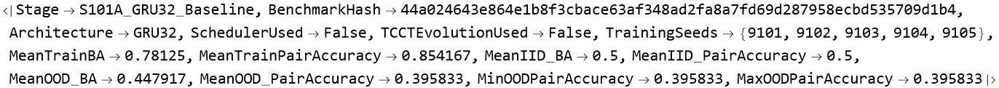

In [383]:
gruSummary = <|

  "Stage" ->
    "S101A_GRU32_Baseline",

  "BenchmarkHash" ->
    benchmarkHash101,

  "Architecture" ->
    "GRU32",

  "SchedulerUsed" ->
    False,

  "TCCTEvolutionUsed" ->
    False,

  "TrainingSeeds" ->
    gruSeeds,

  "MeanTrainBA" ->
    N@Mean[
      Lookup[
        gruRows,
        "TrainBA"
      ]
    ],

  "MeanTrainPairAccuracy" ->
    N@Mean[
      Lookup[
        gruRows,
        "TrainPairAccuracy"
      ]
    ],

  "MeanIID_BA" ->
    N@Mean[
      Lookup[
        gruRows,
        "IID_BA"
      ]
    ],

  "MeanIID_PairAccuracy" ->
    N@Mean[
      Lookup[
        gruRows,
        "IID_PairAccuracy"
      ]
    ],

  "MeanOOD_BA" ->
    N@Mean[
      Lookup[
        gruRows,
        "OOD_BA"
      ]
    ],

  "MeanOOD_PairAccuracy" ->
    N@Mean[
      Lookup[
        gruRows,
        "OOD_PairAccuracy"
      ]
    ],

  "MinOODPairAccuracy" ->
    Min[
      Lookup[
        gruRows,
        "OOD_PairAccuracy"
      ]
    ],

  "MaxOODPairAccuracy" ->
    Max[
      Lookup[
        gruRows,
        "OOD_PairAccuracy"
      ]
    ]

|>;

gruSummary

In [389]:
(* ============================================================ *)
(* S101A-R2: corrected GRU64 baseline                           *)
(* - independent initialization seeds                           *)
(* - independent NetTrain seeds                                *)
(* - 64 hidden units                                            *)
(* - 500 training rounds                                        *)
(* - NO scheduler / NO TCCT evolution                           *)
(* ============================================================ *)

ClearAll[
  BLGRUInputStringR2,
  BLGRUProbability1R2,
  BLGRUPredictR2,
  BLGRUBAR2,
  BLGRUPairAccuracyR2,
  BLGRUPerDepthBAR2,
  BLGRUPerDepthPairR2,
  BLRunOneGRUR2
];

(* ============================================================ *)
(* 0. PREFLIGHT                                                 *)
(* ============================================================ *)

If[
  !And[
    ValueQ[trainRecords],
    ValueQ[iidRecords],
    ValueQ[oodRecords]
  ],

  Print[
    "STOP: trainRecords / iidRecords / oodRecords missing."
  ];

  Abort[];
];

benchmarkHashR2 =
  Hash[
    {
      trainRecords,
      iidRecords,
      oodRecords
    },
    "SHA256",
    "HexString"
  ];

Print[
  "Frozen benchmark hash = ",
  benchmarkHashR2
];

Print[
  "Split sizes = ",
  <|
    "Train" -> Length[trainRecords],
    "IID" -> Length[iidRecords],
    "OOD" -> Length[oodRecords]
  |>
];


(* ============================================================ *)
(* 1. LEGAL INPUT ENCODING                                      *)
(*                                                              *)
(* Example:                                                     *)
(* Start=0, Target=2, Seq={0,1,0}                               *)
(* -> "S0T2|ABA"                                                *)
(* ============================================================ *)

BLGRUInputStringR2[r_Association] := Module[
  {seqString},

  seqString =
    StringJoin[
      r["Seq"] /. {
        0 -> "A",
        1 -> "B"
      }
    ];

  "S" <>
  ToString[r["Start"]] <>
  "T" <>
  ToString[r["Target"]] <>
  "|" <>
  seqString
];


gruAlphabetR2 = {
  "S",
  "T",
  "|",
  "0",
  "1",
  "2",
  "A",
  "B"
};


Print[
  "Example input = ",
  BLGRUInputStringR2[
    First[trainRecords]
  ]
];


(* ============================================================ *)
(* 2. TRAINING RULES                                            *)
(* ============================================================ *)

gruTrainingRulesR2 =
  (
    BLGRUInputStringR2[#] -> #["Y"]
  ) & /@ trainRecords;


(* ============================================================ *)
(* 3. STRONGER GRU                                              *)
(* ============================================================ *)

gruBaseNetR2 = NetChain[
  {
    UnitVectorLayer[],
    GatedRecurrentLayer[64],
    SequenceLastLayer[],
    LinearLayer[2],
    SoftmaxLayer[]
  },

  "Input" ->
    NetEncoder[
      {
        "Characters",
        gruAlphabetR2
      }
    ],

  "Output" ->
    NetDecoder[
      {
        "Class",
        {0, 1}
      }
    ]
];


(* ============================================================ *)
(* 4. PROBABILITY / PREDICTION                                  *)
(* ============================================================ *)

BLGRUProbability1R2[
  net_,
  r_Association
] := Module[
  {probs},

  probs =
    net[
      BLGRUInputStringR2[r],
      "Probabilities"
    ];

  N[
    Lookup[
      probs,
      1,
      0.
    ]
  ]
];


BLGRUPredictR2[
  net_,
  r_Association
] :=
  If[
    BLGRUProbability1R2[net, r] >= 0.5,
    1,
    0
  ];


(* ============================================================ *)
(* 5. BALANCED ACCURACY                                         *)
(* ============================================================ *)

BLGRUBAR2[
  net_,
  records_List
] := N@Mean@Table[

  Mean[
    Boole[
      BLGRUPredictR2[
        net,
        #
      ] === cls
    ] & /@
      Select[
        records,
        #["Y"] === cls &
      ]
  ],

  {cls, {0, 1}}
];


(* ============================================================ *)
(* 6. MATCHED PAIR ACCURACY                                     *)
(* ============================================================ *)

BLGRUPairAccuracyR2[
  net_,
  records_List
] := Module[
  {
    groups,
    vals
  },

  groups =
    Values@
      GroupBy[
        records,
        #["PairID"] &
      ];

  vals =
    Table[

      Module[
        {
          pos,
          neg,
          sp,
          sn
        },

        pos =
          SelectFirst[
            g,
            #["Y"] === 1 &
          ];

        neg =
          SelectFirst[
            g,
            #["Y"] === 0 &
          ];

        sp =
          BLGRUProbability1R2[
            net,
            pos
          ];

        sn =
          BLGRUProbability1R2[
            net,
            neg
          ];

        If[
          sp > sn,
          1.,
          If[
            sp < sn,
            0.,
            0.5
          ]
        ]
      ],

      {g, groups}
    ];

  N@Mean[vals]
];


(* ============================================================ *)
(* 7. PER-DEPTH METRICS                                         *)
(* ============================================================ *)

BLGRUPerDepthBAR2[
  net_,
  records_List
] := Association@Table[

  d ->
    BLGRUBAR2[
      net,
      Select[
        records,
        #["Depth"] === d &
      ]
    ],

  {
    d,
    Sort@
      DeleteDuplicates[
        Lookup[
          records,
          "Depth"
        ]
      ]
  }
];


BLGRUPerDepthPairR2[
  net_,
  records_List
] := Association@Table[

  d ->
    BLGRUPairAccuracyR2[
      net,
      Select[
        records,
        #["Depth"] === d &
      ]
    ],

  {
    d,
    Sort@
      DeleteDuplicates[
        Lookup[
          records,
          "Depth"
        ]
      ]
  }
];


(* ============================================================ *)
(* 8. ONE TRUE INDEPENDENT RUN                                  *)
(* ============================================================ *)

BLRunOneGRUR2[
  seed_Integer
] := Module[
  {
    initialized,
    initHash,
    trained,
    seconds
  },

  Print[
    "Training independent GRU64 seed ",
    seed,
    " ..."
  ];

  (* IMPORTANT:
     seed explicitly controls initialization *)
  initialized =
    NetInitialize[
      gruBaseNetR2,
      RandomSeeding -> seed
    ];

  initHash =
    Hash[
      initialized,
      "SHA256",
      "HexString"
    ];

  Print[
    "  InitHash = ",
    initHash
  ];

  (* IMPORTANT:
     seed explicitly controls NetTrain stochasticity *)
  {seconds, trained} =
    AbsoluteTiming[

      NetTrain[
        initialized,
        gruTrainingRulesR2,

        BatchSize -> 16,

        MaxTrainingRounds -> 500,

        TargetDevice -> "CPU",

        RandomSeeding -> seed
      ]

    ];

  Print[
    "  Finished in ",
    N[seconds],
    " sec"
  ];

  <|

    "Seed" ->
      seed,

    "InitHash" ->
      initHash,

    "TrainingSeconds" ->
      N[seconds],

    "TrainBA" ->
      BLGRUBAR2[
        trained,
        trainRecords
      ],

    "TrainPairAccuracy" ->
      BLGRUPairAccuracyR2[
        trained,
        trainRecords
      ],

    "IID_BA" ->
      BLGRUBAR2[
        trained,
        iidRecords
      ],

    "IID_PairAccuracy" ->
      BLGRUPairAccuracyR2[
        trained,
        iidRecords
      ],

    "IID_PerDepthBA" ->
      BLGRUPerDepthBAR2[
        trained,
        iidRecords
      ],

    "IID_PerDepthPair" ->
      BLGRUPerDepthPairR2[
        trained,
        iidRecords
      ],

    "OOD_BA" ->
      BLGRUBAR2[
        trained,
        oodRecords
      ],

    "OOD_PairAccuracy" ->
      BLGRUPairAccuracyR2[
        trained,
        oodRecords
      ],

    "OOD_PerDepthBA" ->
      BLGRUPerDepthBAR2[
        trained,
        oodRecords
      ],

    "OOD_PerDepthPair" ->
      BLGRUPerDepthPairR2[
        trained,
        oodRecords
      ],

    "Net" ->
      trained

  |>
];


(* ============================================================ *)
(* 9. FIVE TRUE INDEPENDENT SEEDS                               *)
(* ============================================================ *)

gruSeedsR2 = {
  9101,
  9102,
  9103,
  9104,
  9105
};


gruRunsR2 =
  Association@Table[

    s ->
      BLRunOneGRUR2[s],

    {s, gruSeedsR2}
  ];


(* ============================================================ *)
(* 10. DISPLAY INDIVIDUAL RUNS                                  *)
(* ============================================================ *)

gruRowsR2 =
  Table[

    KeyDrop[
      gruRunsR2[s],
      {"Net"}
    ],

    {s, gruSeedsR2}
  ];


Dataset[gruRowsR2]

Frozen benchmark hash = 44a024643e864e1b8f3cbace63af348ad2fa8a7fd69d287958ecb\
 
>    d535709d1b4
Split sizes = <|Train -> 96, IID -> 48, OOD -> 96|>
Example input = S1T0|ABABBA
Training independent GRU64 seed 9101 ...
  InitHash = 0ebcdd0070730d493738a3946320c41e1bdd2d57ad46a8cd70fb00361fd2e01b
  Finished in 20.0802 sec
Training independent GRU64 seed 9102 ...
  InitHash = 21e948605895053d20100d45c16235e8ed8a0f697cfc576067d03aca561fe2fd
  Finished in 18.2042 sec
Training independent GRU64 seed 9103 ...
  InitHash = b0640282b7ad2c99ef0f0303979205157a05478601d5863bd91dbca9842d1a25
  Finished in 18.4131 sec
Training independent GRU64 seed 9104 ...
  InitHash = fa304ee4624e4459b0331b7764c7b1fed25b03a1afd8b86f28a3fa44a55e8893
  Finished in 18.1821 sec
Training independent GRU64 seed 9105 ...
  InitHash = 3e43d7958281f6820074d02e279855607e4d7052567ed91ec02d9964ac18db99
  Finished in 17.995 sec


Dataset[{<|Seed -> 9101, InitHash -> 
 
>      0ebcdd0070730d493738a3946320c41e1bdd2d57ad46a8cd70fb00361fd2e01b, 
 
>     TrainingSeconds -> 20.0802, TrainBA -> 1., TrainPairAccuracy -> 1., 
 
>     IID_BA -> 0.645833, IID_PairAccuracy -> 0.625, 
 
>     IID_PerDepthBA -> <|6 -> 0.75, 8 -> 0.625, 10 -> 0.5625|>, 
 
>     IID_PerDepthPair -> <|6 -> 0.625, 8 -> 0.75, 10 -> 0.5|>, OOD_BA -> 0.458333, 
 
>     OOD_PairAccuracy -> 0.5, OOD_PerDepthBA -> <|12 -> 0.5, 14 -> 0.416667|>, 
 
>     OOD_PerDepthPair -> <|12 -> 0.416667, 14 -> 0.583333|>|>, 
 
>    <|Seed -> 9102, InitHash -> 
 
>      21e948605895053d20100d45c16235e8ed8a0f697cfc576067d03aca561fe2fd, 
 
>     TrainingSeconds -> 18.2042, TrainBA -> 1., TrainPairAccuracy -> 1., 
 
>     IID_BA -> 0.604167, IID_PairAccuracy -> 0.75, 
 
>     IID_PerDepthBA -> <|6 -> 0.8125, 8 -> 0.5, 10 -> 0.5|>, 
 
>     IID_PerDepthPair -> <|6 -> 0.875, 8 -> 0.75, 10 -> 0.625|>, OOD_BA -> 0.53125, 
 
>     OOD_PairAccuracy -> 0.583333, OOD_PerDepthBA -> <|12 -> 0.5, 14 -> 0.5625|>, 
 
>     OOD_PerDepthPair -> <|12 -> 0.541667, 14 -> 0.625|>|>, 
 
>    <|Seed -> 9103, InitHash -> 
 
>      b0640282b7ad2c99ef0f0303979205157a05478601d5863bd91dbca9842d1a25, 
 
>     TrainingSeconds -> 18.4131, TrainBA -> 1., TrainPairAccuracy -> 1., 
 
>     IID_BA -> 0.604167, IID_PairAccuracy -> 0.583333, 
 
>     IID_PerDepthBA -> <|6 -> 0.875, 8 -> 0.375, 10 -> 0.5625|>, 
 
>     IID_PerDepthPair -> <|6 -> 0.75, 8 -> 0.5, 10 -> 0.5|>, OOD_BA -> 0.489583, 
 
>     OOD_PairAccuracy -> 0.458333, OOD_PerDepthBA -> <|12 -> 0.541667, 14 -> 0.4375|>, 
 
>     OOD_PerDepthPair -> <|12 -> 0.458333, 14 -> 0.458333|>|>, 
 
>    <|Seed -> 9104, InitHash -> 
 
>      fa304ee4624e4459b0331b7764c7b1fed25b03a1afd8b86f28a3fa44a55e8893, 
 
>     TrainingSeconds -> 18.1821, TrainBA -> 1., TrainPairAccuracy -> 1., 
 
>     IID_BA -> 0.708333, IID_PairAccuracy -> 0.666667, 
 
>     IID_PerDepthBA -> <|6 -> 0.8125, 8 -> 0.6875, 10 -> 0.625|>, 
 
>     IID_PerDepthPair -> <|6 -> 0.875, 8 -> 0.5, 10 -> 0.625|>, OOD_BA -> 0.447917, 
 
>     OOD_PairAccuracy -> 0.489583, OOD_PerDepthBA -> <|12 -> 0.395833, 14 -> 0.5|>, 
 
>     OOD_PerDepthPair -> <|12 -> 0.395833, 14 -> 0.583333|>|>, 
 
>    <|Seed -> 9105, InitHash -> 
 
>      3e43d7958281f6820074d02e279855607e4d7052567ed91ec02d9964ac18db99, 
 
>     TrainingSeconds -> 17.995, TrainBA -> 1., TrainPairAccuracy -> 1., 
 
>     IID_BA -> 0.604167, IID_PairAccuracy -> 0.666667, 
 
>     IID_PerDepthBA -> <|6 -> 0.8125, 8 -> 0.5, 10 -> 0.5|>, 
 
>     IID_PerDepthPair -> <|6 -> 0.875, 8 -> 0.625, 10 -> 0.5|>, OOD_BA -> 0.5, 
 
>     OOD_PairAccuracy -> 0.458333, 
 
>     OOD_PerDepthBA -> <|12 -> 0.416667, 14 -> 0.583333|>, 
 
>     OOD_PerDepthPair -> <|12 -> 0.333333, 14 -> 0.583333|>|>}, 
 
>   TypeSystem`Vector[TypeSystem`Struct[{Seed, InitHash, TrainingSeconds, TrainBA, 
 
>      TrainPairAccuracy, IID_BA, IID_PairAccuracy, IID_PerDepthBA, IID_PerDepthPair, 
 
>      OOD_BA, OOD_PairAccuracy, OOD_PerDepthBA, OOD_PerDepthPair}, 
 
>     {TypeSystem`Atom[Integer], TypeSystem`Atom[String], TypeSystem`Atom[Real], 
 
>      TypeSystem`Atom[Real], TypeSystem`Atom[Real], TypeSystem`Atom[Real], 
 
>      TypeSystem`Atom[Real], TypeSystem`Assoc[TypeSystem`Atom[Integer], 
 
>       TypeSystem`Atom[Real], 3], TypeSystem`Assoc[TypeSystem`Atom[Integer], 
 
>       TypeSystem`Atom[Real], 3], TypeSystem`Atom[Real], TypeSystem`Atom[Real], 
 
>      TypeSystem`Assoc[TypeSystem`Atom[Integer], TypeSystem`Atom[Real], 2], 
 
>      TypeSystem`Assoc[TypeSystem`Atom[Integer], TypeSystem`Atom[Real], 2]}], 5], <||>]

<|Stage -> S101A_R2_GRU64_CorrectedSeeds, 
 
>   BenchmarkHash -> 44a024643e864e1b8f3cbace63af348ad2fa8a7fd69d287958ecbd535709d1b4, 
 
>   BenchmarkUnchanged -> True, Architecture -> GRU64, MaxTrainingRounds -> 500, 
 
>   SchedulerUsed -> False, TCCTEvolutionUsed -> False, 
 
>   TrainingSeeds -> {9101, 9102, 9103, 9104, 9105}, DistinctInitializationHashes -> 5, 
 
>   AllInitializationsDifferent -> True, MeanTrainBA -> 1., MinTrainBA -> 1., 
 
>   MeanTrainPairAccuracy -> 1., MeanIID_BA -> 0.633333, 
 
>   MeanIID_PairAccuracy -> 0.658333, MeanOOD_BA -> 0.485417, 
 
>   MeanOOD_PairAccuracy -> 0.497917, MinOODPairAccuracy -> 0.458333, 
 
>   MaxOODPairAccuracy -> 0.583333|>
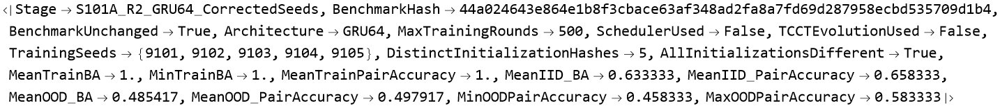

In [459]:
(* ============================================================ *)
(* 11. FINAL SUMMARY                                            *)
(* ============================================================ *)

initHashesR2 =
  Lookup[
    gruRowsR2,
    "InitHash"
  ];

benchmarkHashAfterR2 =
  Hash[
    {
      trainRecords,
      iidRecords,
      oodRecords
    },
    "SHA256",
    "HexString"
  ];


gruSummaryR2 = <|

  "Stage" ->
    "S101A_R2_GRU64_CorrectedSeeds",

  "BenchmarkHash" ->
    benchmarkHashR2,

  "BenchmarkUnchanged" ->
    SameQ[
      benchmarkHashR2,
      benchmarkHashAfterR2
    ],

  "Architecture" ->
    "GRU64",

  "MaxTrainingRounds" ->
    500,

  "SchedulerUsed" ->
    False,

  "TCCTEvolutionUsed" ->
    False,

  "TrainingSeeds" ->
    gruSeedsR2,

  "DistinctInitializationHashes" ->
    Length[
      DeleteDuplicates[
        initHashesR2
      ]
    ],

  "AllInitializationsDifferent" ->
    SameQ[
      Length[
        DeleteDuplicates[
          initHashesR2
        ]
      ],
      Length[gruSeedsR2]
    ],

  "MeanTrainBA" ->
    N@Mean[
      Lookup[
        gruRowsR2,
        "TrainBA"
      ]
    ],

  "MinTrainBA" ->
    Min[
      Lookup[
        gruRowsR2,
        "TrainBA"
      ]
    ],

  "MeanTrainPairAccuracy" ->
    N@Mean[
      Lookup[
        gruRowsR2,
        "TrainPairAccuracy"
      ]
    ],

  "MeanIID_BA" ->
    N@Mean[
      Lookup[
        gruRowsR2,
        "IID_BA"
      ]
    ],

  "MeanIID_PairAccuracy" ->
    N@Mean[
      Lookup[
        gruRowsR2,
        "IID_PairAccuracy"
      ]
    ],

  "MeanOOD_BA" ->
    N@Mean[
      Lookup[
        gruRowsR2,
        "OOD_BA"
      ]
    ],

  "MeanOOD_PairAccuracy" ->
    N@Mean[
      Lookup[
        gruRowsR2,
        "OOD_PairAccuracy"
      ]
    ],

  "MinOODPairAccuracy" ->
    Min[
      Lookup[
        gruRowsR2,
        "OOD_PairAccuracy"
      ]
    ],

  "MaxOODPairAccuracy" ->
    Max[
      Lookup[
        gruRowsR2,
        "OOD_PairAccuracy"
      ]
    ]

|>;

gruSummaryR2

In [470]:
(* ============================================================ *)
(* S101B: Transformer baseline                                  *)
(* 2 blocks / dModel=64 / 4 heads / FFN=128                    *)
(* 5 independent seeds                                          *)
(* NO scheduler / NO TCCT evolution                             *)
(* ============================================================ *)

ClearAll[
  BLTFInput,
  BLTFBlock,
  BLTFProbability1,
  BLTFPredict,
  BLTFBA,
  BLTFPairAccuracy,
  BLTFPerDepthBA,
  BLTFPerDepthPair,
  BLRunOneTransformer
];

(* ============================================================ *)
(* 0. PREFLIGHT                                                 *)
(* ============================================================ *)

If[
  !And[
    ValueQ[trainRecords],
    ValueQ[iidRecords],
    ValueQ[oodRecords]
  ],
  Print[
    "STOP: trainRecords / iidRecords / oodRecords missing."
  ];
  Abort[];
];

benchmarkHashTF =
  Hash[
    {
      trainRecords,
      iidRecords,
      oodRecords
    },
    "SHA256",
    "HexString"
  ];

Print[
  "Frozen benchmark hash = ",
  benchmarkHashTF
];

Print[
  "Split sizes = ",
  <|
    "Train" -> Length[trainRecords],
    "IID" -> Length[iidRecords],
    "OOD" -> Length[oodRecords]
  |>
];


(* ============================================================ *)
(* 1. FIXED LEGAL INPUT                                         *)
(*                                                              *)
(* Tokens:                                                      *)
(* 1 = CLS                                                      *)
(* 2..4 = S0,S1,S2                                              *)
(* 5..7 = T0,T1,T2                                              *)
(* 8 = SEP                                                      *)
(* 9 = A                                                        *)
(* 10 = B                                                       *)
(* 11 = PAD                                                     *)
(*                                                              *)
(* Sequence length = 18                                         *)
(* CLS + START + TARGET + SEP + max 14 operators                *)
(* ============================================================ *)

tfMaxDepth = 14;
tfSeqLen = 4 + tfMaxDepth;
tfVocabSize = 11;
tfInputDim = tfVocabSize + tfSeqLen;

BLTFInput[r_Association] := Module[
  {
    opTokens,
    tokens,
    padCount,
    tokenOH,
    posOH
  },

  opTokens =
    r["Seq"] /. {
      0 -> 9,
      1 -> 10
    };

  tokens = Join[
    {
      1,                  (* CLS *)
      2 + r["Start"],     (* S0/S1/S2 *)
      5 + r["Target"],    (* T0/T1/T2 *)
      8                   (* SEP *)
    },
    opTokens
  ];

  padCount =
    tfSeqLen - Length[tokens];

  If[
    padCount < 0,
    Print[
      "STOP: input sequence longer than tfSeqLen."
    ];
    Abort[];
  ];

  tokens =
    Join[
      tokens,
      ConstantArray[11, padCount]
    ];

  tokenOH =
    UnitVector[tfVocabSize, #] & /@ tokens;

  posOH =
    UnitVector[tfSeqLen, #] & /@
      Range[tfSeqLen];

  N[
    MapThread[
      Join,
      {
        tokenOH,
        posOH
      }
    ]
  ]
];


Print[
  "Transformer input dimensions = ",
  Dimensions[
    BLTFInput[
      First[trainRecords]
    ]
  ]
];

Print[
  "Expected = ",
  {
    tfSeqLen,
    tfInputDim
  }
];


(* ============================================================ *)
(* 2. TRANSFORMER BLOCK                                         *)
(*                                                              *)
(* Pre/post layout here:                                        *)
(* SelfAttention -> residual -> norm                            *)
(* FFN -> residual -> norm                                      *)
(* ============================================================ *)

BLTFBlock[] := NetGraph[

  <|

    "Key" ->
      NetMapOperator[
        LinearLayer[{4, 16}]
      ],

    "Value" ->
      NetMapOperator[
        LinearLayer[{4, 16}]
      ],

    "Query" ->
      NetMapOperator[
        LinearLayer[{4, 16}]
      ],

    "Attention" ->
      AttentionLayer[
        "Dot",
        "MultiHead" -> True,
        "ScoreRescaling" -> "DimensionSqrt"
      ],

    "MergeHeads" ->
      NetMapOperator[
        LinearLayer[64]
      ],

    "Residual1" ->
      ThreadingLayer[
        Plus
      ],

    "Norm1" ->
      NormalizationLayer[
        2,
        "Same"
      ],

    "FFN" ->
      NetMapOperator[
        NetChain[
          {
            LinearLayer[128],
            Ramp,
            LinearLayer[64]
          }
        ]
      ],

    "Residual2" ->
      ThreadingLayer[
        Plus
      ],

    "Norm2" ->
      NormalizationLayer[
        2,
        "Same"
      ]

  |>,

  {

    NetPort["Input"] ->
      "Key" ->
      NetPort[{"Attention", "Key"}],

    NetPort["Input"] ->
      "Value" ->
      NetPort[{"Attention", "Value"}],

    NetPort["Input"] ->
      "Query" ->
      NetPort[{"Attention", "Query"}],

    "Attention" ->
      "MergeHeads",

    {
      NetPort["Input"],
      "MergeHeads"
    } ->
      "Residual1" ->
      "Norm1",

    "Norm1" ->
      "FFN",

    {
      "Norm1",
      "FFN"
    } ->
      "Residual2" ->
      "Norm2"

  },

  "Input" ->
    {
      tfSeqLen,
      64
    }
];


(* ============================================================ *)
(* 3. FULL 2-LAYER TRANSFORMER                                  *)
(* ============================================================ *)

tfBaseNet = NetChain[

  {

    (* project token+position input to dModel=64 *)

    NetMapOperator[
      LinearLayer[64]
    ],

    BLTFBlock[],

    BLTFBlock[],

    (* read CLS token at position 1 *)

    PartLayer[1],

    LinearLayer[2],

    SoftmaxLayer[]

  },

  "Input" ->
    {
      tfSeqLen,
      tfInputDim
    },

  "Output" ->
    NetDecoder[
      {
        "Class",
        {0, 1}
      }
    ]
];


(* ============================================================ *)
(* 4. TRAINING DATA                                             *)
(* ============================================================ *)

tfTrainingRules =
  (
    BLTFInput[#] -> #["Y"]
  ) & /@ trainRecords;


(* ============================================================ *)
(* 5. PROBABILITY + PREDICTION                                  *)
(* ============================================================ *)

BLTFProbability1[
  net_,
  r_Association
] := Module[
  {p},

  p =
    net[
      BLTFInput[r],
      "Probabilities"
    ];

  N[
    Lookup[
      p,
      1,
      0.
    ]
  ]
];


BLTFPredict[
  net_,
  r_Association
] :=
  Boole[
    BLTFProbability1[
      net,
      r
    ] >= 0.5
  ];


(* ============================================================ *)
(* 6. BALANCED ACCURACY                                         *)
(* ============================================================ *)

BLTFBA[
  net_,
  records_List
] := N@Mean@Table[

  Mean[
    Boole[
      BLTFPredict[
        net,
        #
      ] === cls
    ] & /@
      Select[
        records,
        #["Y"] === cls &
      ]
  ],

  {cls, {0, 1}}
];


(* ============================================================ *)
(* 7. MATCHED PAIR ACCURACY                                     *)
(* ============================================================ *)

BLTFPairAccuracy[
  net_,
  records_List
] := Module[
  {
    groups,
    vals
  },

  groups =
    Values@
      GroupBy[
        records,
        #["PairID"] &
      ];

  vals =
    Table[

      Module[
        {
          pos,
          neg,
          sp,
          sn
        },

        pos =
          SelectFirst[
            g,
            #["Y"] === 1 &
          ];

        neg =
          SelectFirst[
            g,
            #["Y"] === 0 &
          ];

        sp =
          BLTFProbability1[
            net,
            pos
          ];

        sn =
          BLTFProbability1[
            net,
            neg
          ];

        If[
          sp > sn,
          1.,
          If[
            sp < sn,
            0.,
            0.5
          ]
        ]
      ],

      {g, groups}
    ];

  N@Mean[vals]
];


(* ============================================================ *)
(* 8. PER-DEPTH METRICS                                         *)
(* ============================================================ *)

BLTFPerDepthBA[
  net_,
  records_List
] := Association@Table[

  d ->
    BLTFBA[
      net,
      Select[
        records,
        #["Depth"] === d &
      ]
    ],

  {
    d,
    Sort@
      DeleteDuplicates[
        Lookup[
          records,
          "Depth"
        ]
      ]
  }
];


BLTFPerDepthPair[
  net_,
  records_List
] := Association@Table[

  d ->
    BLTFPairAccuracy[
      net,
      Select[
        records,
        #["Depth"] === d &
      ]
    ],

  {
    d,
    Sort@
      DeleteDuplicates[
        Lookup[
          records,
          "Depth"
        ]
      ]
  }
];


(* ============================================================ *)
(* 9. ONE INDEPENDENT TRAINING RUN                              *)
(* ============================================================ *)

BLRunOneTransformer[
  seed_Integer
] := Module[
  {
    initialized,
    initHash,
    trained,
    seconds
  },

  Print[
    "Training Transformer seed ",
    seed,
    " ..."
  ];

  initialized =
    NetInitialize[
      tfBaseNet,
      RandomSeeding -> seed
    ];

  initHash =
    Hash[
      initialized,
      "SHA256",
      "HexString"
    ];

  Print[
    "  InitHash = ",
    initHash
  ];

  {seconds, trained} =
    AbsoluteTiming[

      NetTrain[
        initialized,
        tfTrainingRules,

        BatchSize -> 16,

        MaxTrainingRounds -> 500,

        TargetDevice -> "CPU",

        RandomSeeding -> seed
      ]

    ];

  Print[
    "  Finished in ",
    N[seconds],
    " sec"
  ];

  <|

    "Seed" ->
      seed,

    "InitHash" ->
      initHash,

    "TrainingSeconds" ->
      N[seconds],

    "TrainBA" ->
      BLTFBA[
        trained,
        trainRecords
      ],

    "TrainPairAccuracy" ->
      BLTFPairAccuracy[
        trained,
        trainRecords
      ],

    "IID_BA" ->
      BLTFBA[
        trained,
        iidRecords
      ],

    "IID_PairAccuracy" ->
      BLTFPairAccuracy[
        trained,
        iidRecords
      ],

    "IID_PerDepthBA" ->
      BLTFPerDepthBA[
        trained,
        iidRecords
      ],

    "IID_PerDepthPair" ->
      BLTFPerDepthPair[
        trained,
        iidRecords
      ],

    "OOD_BA" ->
      BLTFBA[
        trained,
        oodRecords
      ],

    "OOD_PairAccuracy" ->
      BLTFPairAccuracy[
        trained,
        oodRecords
      ],

    "OOD_PerDepthBA" ->
      BLTFPerDepthBA[
        trained,
        oodRecords
      ],

    "OOD_PerDepthPair" ->
      BLTFPerDepthPair[
        trained,
        oodRecords
      ],

    "Net" ->
      trained

  |>
];


(* ============================================================ *)
(* 10. FIVE INDEPENDENT SEEDS                                   *)
(* ============================================================ *)

tfSeeds = {
  9201,
  9202,
  9203,
  9204,
  9205
};


tfRuns =
  Association@Table[

    s ->
      BLRunOneTransformer[s],

    {s, tfSeeds}
  ];


tfRows =
  Table[

    KeyDrop[
      tfRuns[s],
      {"Net"}
    ],

    {s, tfSeeds}
  ];


Dataset[tfRows]

Frozen benchmark hash = 44a024643e864e1b8f3cbace63af348ad2fa8a7fd69d287958ecb\
 
>    d535709d1b4
Split sizes = <|Train -> 96, IID -> 48, OOD -> 96|>
Transformer input dimensions = {18, 29}
Expected = {18, 29}
Training Transformer seed 9201 ...
  InitHash = cbc4bc96c741a02f440714c2a733ee5820c03a3ae862b27d8ebbad535f02a80d
  Finished in 51.9337 sec
Training Transformer seed 9202 ...
  InitHash = 0390e3746a134615de71ba669cbb1ff8aef85c37c2642989cf69626e95a024fb
  Finished in 51.2294 sec
Training Transformer seed 9203 ...
  InitHash = c795a330a4a544c2960fbd5e87b7dc37761b3811fceec19da0fa028e3139332e
  Finished in 52.1112 sec
Training Transformer seed 9204 ...
  InitHash = 0d99e9f4d09783c4ffe260ab06b9054ee4452d435ee669665311e8f0e7825140
  Finished in 52.7063 sec
Training Transformer seed 9205 ...
  InitHash = 22b1ce4a75d7501cbaee89891e44f0b98528eb4ab02a9e248537d1a550d7902e
  Finished in 54.8394 sec


Dataset[{<|Seed -> 9201, InitHash -> 
 
>      cbc4bc96c741a02f440714c2a733ee5820c03a3ae862b27d8ebbad535f02a80d, 
 
>     TrainingSeconds -> 51.9337, TrainBA -> 1., TrainPairAccuracy -> 1., 
 
>     IID_BA -> 0.520833, IID_PairAccuracy -> 0.625, 
 
>     IID_PerDepthBA -> <|6 -> 0.75, 8 -> 0.5625, 10 -> 0.25|>, 
 
>     IID_PerDepthPair -> <|6 -> 0.75, 8 -> 0.625, 10 -> 0.5|>, OOD_BA -> 0.520833, 
 
>     OOD_PairAccuracy -> 0.458333, 
 
>     OOD_PerDepthBA -> <|12 -> 0.520833, 14 -> 0.520833|>, 
 
>     OOD_PerDepthPair -> <|12 -> 0.458333, 14 -> 0.458333|>|>, 
 
>    <|Seed -> 9202, InitHash -> 
 
>      0390e3746a134615de71ba669cbb1ff8aef85c37c2642989cf69626e95a024fb, 
 
>     TrainingSeconds -> 51.2294, TrainBA -> 1., TrainPairAccuracy -> 1., 
 
>     IID_BA -> 0.625, IID_PairAccuracy -> 0.541667, 
 
>     IID_PerDepthBA -> <|6 -> 0.875, 8 -> 0.5, 10 -> 0.5|>, 
 
>     IID_PerDepthPair -> <|6 -> 0.75, 8 -> 0.5, 10 -> 0.375|>, OOD_BA -> 0.5, 
 
>     OOD_PairAccuracy -> 0.520833, 
 
>     OOD_PerDepthBA -> <|12 -> 0.416667, 14 -> 0.583333|>, 
 
>     OOD_PerDepthPair -> <|12 -> 0.375, 14 -> 0.666667|>|>, 
 
>    <|Seed -> 9203, InitHash -> 
 
>      c795a330a4a544c2960fbd5e87b7dc37761b3811fceec19da0fa028e3139332e, 
 
>     TrainingSeconds -> 52.1112, TrainBA -> 1., TrainPairAccuracy -> 1., 
 
>     IID_BA -> 0.458333, IID_PairAccuracy -> 0.5, 
 
>     IID_PerDepthBA -> <|6 -> 0.5, 8 -> 0.5625, 10 -> 0.3125|>, 
 
>     IID_PerDepthPair -> <|6 -> 0.5, 8 -> 0.625, 10 -> 0.375|>, OOD_BA -> 0.46875, 
 
>     OOD_PairAccuracy -> 0.395833, OOD_PerDepthBA -> <|12 -> 0.5, 14 -> 0.4375|>, 
 
>     OOD_PerDepthPair -> <|12 -> 0.416667, 14 -> 0.375|>|>, 
 
>    <|Seed -> 9204, InitHash -> 
 
>      0d99e9f4d09783c4ffe260ab06b9054ee4452d435ee669665311e8f0e7825140, 
 
>     TrainingSeconds -> 52.7063, TrainBA -> 1., TrainPairAccuracy -> 1., 
 
>     IID_BA -> 0.5625, IID_PairAccuracy -> 0.5, 
 
>     IID_PerDepthBA -> <|6 -> 0.6875, 8 -> 0.625, 10 -> 0.375|>, 
 
>     IID_PerDepthPair -> <|6 -> 0.75, 8 -> 0.5, 10 -> 0.25|>, OOD_BA -> 0.541667, 
 
>     OOD_PairAccuracy -> 0.5, OOD_PerDepthBA -> <|12 -> 0.4375, 14 -> 0.645833|>, 
 
>     OOD_PerDepthPair -> <|12 -> 0.375, 14 -> 0.625|>|>, 
 
>    <|Seed -> 9205, InitHash -> 
 
>      22b1ce4a75d7501cbaee89891e44f0b98528eb4ab02a9e248537d1a550d7902e, 
 
>     TrainingSeconds -> 54.8394, TrainBA -> 1., TrainPairAccuracy -> 1., IID_BA -> 0.5, 
 
>     IID_PairAccuracy -> 0.5, IID_PerDepthBA -> 
 
>      <|6 -> 0.6875, 8 -> 0.5, 10 -> 0.3125|>, 
 
>     IID_PerDepthPair -> <|6 -> 0.625, 8 -> 0.5, 10 -> 0.375|>, OOD_BA -> 0.46875, 
 
>     OOD_PairAccuracy -> 0.520833, 
 
>     OOD_PerDepthBA -> <|12 -> 0.458333, 14 -> 0.479167|>, 
 
>     OOD_PerDepthPair -> <|12 -> 0.458333, 14 -> 0.583333|>|>}, 
 
>   TypeSystem`Vector[TypeSystem`Struct[{Seed, InitHash, TrainingSeconds, TrainBA, 
 
>      TrainPairAccuracy, IID_BA, IID_PairAccuracy, IID_PerDepthBA, IID_PerDepthPair, 
 
>      OOD_BA, OOD_PairAccuracy, OOD_PerDepthBA, OOD_PerDepthPair}, 
 
>     {TypeSystem`Atom[Integer], TypeSystem`Atom[String], TypeSystem`Atom[Real], 
 
>      TypeSystem`Atom[Real], TypeSystem`Atom[Real], TypeSystem`Atom[Real], 
 
>      TypeSystem`Atom[Real], TypeSystem`Assoc[TypeSystem`Atom[Integer], 
 
>       TypeSystem`Atom[Real], 3], TypeSystem`Assoc[TypeSystem`Atom[Integer], 
 
>       TypeSystem`Atom[Real], 3], TypeSystem`Atom[Real], TypeSystem`Atom[Real], 
 
>      TypeSystem`Assoc[TypeSystem`Atom[Integer], TypeSystem`Atom[Real], 2], 
 
>      TypeSystem`Assoc[TypeSystem`Atom[Integer], TypeSystem`Atom[Real], 2]}], 5], <||>]

<|Stage -> S101B_Transformer64_2Layer_4Head, 
 
>   BenchmarkHash -> 44a024643e864e1b8f3cbace63af348ad2fa8a7fd69d287958ecbd535709d1b4, 
 
>   BenchmarkUnchanged -> True, Architecture -> Transformer-d64-L2-H4-FF128, 
 
>   TrainingRounds -> 500, SchedulerUsed -> False, TCCTEvolutionUsed -> False, 
 
>   AbsolutePositionEncoding -> OneHot, TrainingSeeds -> {9201, 9202, 9203, 9204, 9205}, 
 
>   DistinctInitializationHashes -> 5, AllInitializationsDifferent -> True, 
 
>   MeanTrainBA -> 1., MinTrainBA -> 1., MeanTrainPairAccuracy -> 1., 
 
>   MeanIID_BA -> 0.533333, MeanIID_PairAccuracy -> 0.533333, MeanOOD_BA -> 0.5, 
 
>   MeanOOD_PairAccuracy -> 0.479167, MinOODPairAccuracy -> 0.395833, 
 
>   MaxOODPairAccuracy -> 0.520833|>
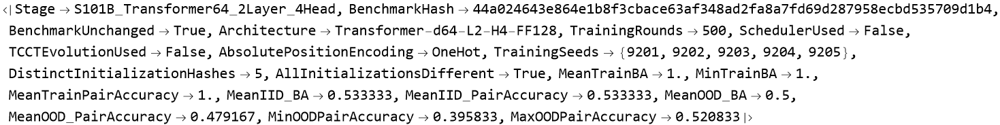

In [555]:
(* ============================================================ *)
(* 11. FINAL TRANSFORMER SUMMARY                                *)
(* ============================================================ *)

tfInitHashes =
  Lookup[
    tfRows,
    "InitHash"
  ];

benchmarkHashAfterTF =
  Hash[
    {
      trainRecords,
      iidRecords,
      oodRecords
    },
    "SHA256",
    "HexString"
  ];


tfSummary = <|

  "Stage" ->
    "S101B_Transformer64_2Layer_4Head",

  "BenchmarkHash" ->
    benchmarkHashTF,

  "BenchmarkUnchanged" ->
    SameQ[
      benchmarkHashTF,
      benchmarkHashAfterTF
    ],

  "Architecture" ->
    "Transformer-d64-L2-H4-FF128",

  "TrainingRounds" ->
    500,

  "SchedulerUsed" ->
    False,

  "TCCTEvolutionUsed" ->
    False,

  "AbsolutePositionEncoding" ->
    "OneHot",

  "TrainingSeeds" ->
    tfSeeds,

  "DistinctInitializationHashes" ->
    Length[
      DeleteDuplicates[
        tfInitHashes
      ]
    ],

  "AllInitializationsDifferent" ->
    SameQ[
      Length[
        DeleteDuplicates[
          tfInitHashes
        ]
      ],
      Length[tfSeeds]
    ],

  "MeanTrainBA" ->
    N@Mean[
      Lookup[
        tfRows,
        "TrainBA"
      ]
    ],

  "MinTrainBA" ->
    Min[
      Lookup[
        tfRows,
        "TrainBA"
      ]
    ],

  "MeanTrainPairAccuracy" ->
    N@Mean[
      Lookup[
        tfRows,
        "TrainPairAccuracy"
      ]
    ],

  "MeanIID_BA" ->
    N@Mean[
      Lookup[
        tfRows,
        "IID_BA"
      ]
    ],

  "MeanIID_PairAccuracy" ->
    N@Mean[
      Lookup[
        tfRows,
        "IID_PairAccuracy"
      ]
    ],

  "MeanOOD_BA" ->
    N@Mean[
      Lookup[
        tfRows,
        "OOD_BA"
      ]
    ],

  "MeanOOD_PairAccuracy" ->
    N@Mean[
      Lookup[
        tfRows,
        "OOD_PairAccuracy"
      ]
    ],

  "MinOODPairAccuracy" ->
    Min[
      Lookup[
        tfRows,
        "OOD_PairAccuracy"
      ]
    ],

  "MaxOODPairAccuracy" ->
    Max[
      Lookup[
        tfRows,
        "OOD_PairAccuracy"
      ]
    ]

|>;

tfSummary

In [566]:
(* ============================================================ *)
(* S101B-R2: Transformer + Fixed Sinusoidal Positional Encoding *)
(* dModel=64 / 2 layers / 4 heads / FFN=128                    *)
(* SAME frozen benchmark / SAME seeds / SAME training rounds    *)
(* NO scheduler / NO TCCT evolution                             *)
(* ============================================================ *)

ClearAll[
  BLTFSinusoidalPE,
  BLTFSinInput,
  BLTFSinBlock,
  BLTFSinProbability1,
  BLTFSinPredict,
  BLTFSinBA,
  BLTFSinPairAccuracy,
  BLTFSinPerDepthBA,
  BLTFSinPerDepthPair,
  BLRunOneTransformerSin
];


(* ============================================================ *)
(* 0. PREFLIGHT                                                 *)
(* ============================================================ *)

If[
  !And[
    ValueQ[trainRecords],
    ValueQ[iidRecords],
    ValueQ[oodRecords]
  ],

  Print[
    "STOP: trainRecords / iidRecords / oodRecords missing."
  ];

  Abort[];
];


benchmarkHashSin =
  Hash[
    {
      trainRecords,
      iidRecords,
      oodRecords
    },
    "SHA256",
    "HexString"
  ];


Print[
  "Frozen benchmark hash = ",
  benchmarkHashSin
];


Print[
  "Split sizes = ",
  <|
    "Train" -> Length[trainRecords],
    "IID" -> Length[iidRecords],
    "OOD" -> Length[oodRecords]
  |>
];


(* ============================================================ *)
(* 1. INPUT CONSTANTS                                           *)
(* ============================================================ *)

tfSinMaxDepth = 14;

tfSinSeqLen =
  4 + tfSinMaxDepth;

tfSinVocabSize = 11;

(* fixed analytic position code, NOT learned *)
tfSinPEDim = 32;

tfSinInputDim =
  tfSinVocabSize + tfSinPEDim;


(* ============================================================ *)
(* 2. FIXED SINUSOIDAL POSITIONAL ENCODING                      *)
(*                                                              *)
(* PE(p,2i)   = sin(p / 10000^(2i/d))                           *)
(* PE(p,2i+1) = cos(p / 10000^(2i/d))                           *)
(*                                                              *)
(* p starts from 0                                              *)
(* ============================================================ *)

BLTFSinusoidalPE[
  pos_Integer,
  dim_Integer
] := Module[
  {
    p,
    half
  },

  If[
    OddQ[dim],
    Print[
      "STOP: sinusoidal PE dimension must be even."
    ];
    Abort[];
  ];

  p =
    N[pos - 1];

  half =
    dim/2;

  N@Flatten@Table[

    {
      Sin[
        p/
          10000.^(2. i/dim)
      ],

      Cos[
        p/
          10000.^(2. i/dim)
      ]
    },

    {
      i,
      0,
      half - 1
    }
  ]
];


(* ============================================================ *)
(* 3. LEGAL MODEL INPUT                                         *)
(*                                                              *)
(* Token IDs:                                                   *)
(* 1  = CLS                                                     *)
(* 2  = S0                                                      *)
(* 3  = S1                                                      *)
(* 4  = S2                                                      *)
(* 5  = T0                                                      *)
(* 6  = T1                                                      *)
(* 7  = T2                                                      *)
(* 8  = SEP                                                     *)
(* 9  = A                                                       *)
(* 10 = B                                                       *)
(* 11 = PAD                                                     *)
(*                                                              *)
(* Each sequence element =                                      *)
(* [token one-hot || fixed sinusoidal PE]                       *)
(* ============================================================ *)

BLTFSinInput[
  r_Association
] := Module[
  {
    opTokens,
    tokens,
    padCount,
    tokenOH,
    positionVectors
  },

  opTokens =
    r["Seq"] /. {
      0 -> 9,
      1 -> 10
    };

  tokens =
    Join[
      {
        1,
        2 + r["Start"],
        5 + r["Target"],
        8
      },

      opTokens
    ];

  padCount =
    tfSinSeqLen -
      Length[tokens];

  If[
    padCount < 0,

    Print[
      "STOP: sequence longer than configured maximum."
    ];

    Abort[];
  ];

  tokens =
    Join[
      tokens,
      ConstantArray[
        11,
        padCount
      ]
    ];

  tokenOH =
    UnitVector[
      tfSinVocabSize,
      #
    ] & /@ tokens;

  positionVectors =
    BLTFSinusoidalPE[
      #,
      tfSinPEDim
    ] & /@
      Range[tfSinSeqLen];

  N@
    MapThread[
      Join,
      {
        tokenOH,
        positionVectors
      }
    ]
];


Print[
  "Sinusoidal Transformer input dimensions = ",
  Dimensions[
    BLTFSinInput[
      First[trainRecords]
    ]
  ]
];


Print[
  "Expected = ",
  {
    tfSinSeqLen,
    tfSinInputDim
  }
];


(* ============================================================ *)
(* 4. SANITY CHECK PE                                           *)
(* ============================================================ *)

Print[
  "PE position 1 first 8 values = ",
  Take[
    BLTFSinusoidalPE[
      1,
      tfSinPEDim
    ],
    8
  ]
];


Print[
  "PE position 14 first 8 values = ",
  Take[
    BLTFSinusoidalPE[
      14,
      tfSinPEDim
    ],
    8
  ]
];


(* ============================================================ *)
(* 5. TRANSFORMER BLOCK                                         *)
(* ============================================================ *)

BLTFSinBlock[] := NetGraph[

  <|

    "Key" ->
      NetMapOperator[
        LinearLayer[
          {4, 16}
        ]
      ],

    "Value" ->
      NetMapOperator[
        LinearLayer[
          {4, 16}
        ]
      ],

    "Query" ->
      NetMapOperator[
        LinearLayer[
          {4, 16}
        ]
      ],

    "Attention" ->
      AttentionLayer[
        "Dot",

        "MultiHead" ->
          True,

        "ScoreRescaling" ->
          "DimensionSqrt"
      ],

    "MergeHeads" ->
      NetMapOperator[
        LinearLayer[64]
      ],

    "Residual1" ->
      ThreadingLayer[
        Plus
      ],

    "Norm1" ->
      NormalizationLayer[
        2,
        "Same"
      ],

    "FFN" ->
      NetMapOperator[
        NetChain[
          {
            LinearLayer[128],
            Ramp,
            LinearLayer[64]
          }
        ]
      ],

    "Residual2" ->
      ThreadingLayer[
        Plus
      ],

    "Norm2" ->
      NormalizationLayer[
        2,
        "Same"
      ]

  |>,

  {

    NetPort["Input"] ->
      "Key" ->
      NetPort[
        {
          "Attention",
          "Key"
        }
      ],

    NetPort["Input"] ->
      "Value" ->
      NetPort[
        {
          "Attention",
          "Value"
        }
      ],

    NetPort["Input"] ->
      "Query" ->
      NetPort[
        {
          "Attention",
          "Query"
        }
      ],

    "Attention" ->
      "MergeHeads",

    {
      NetPort["Input"],
      "MergeHeads"
    } ->
      "Residual1" ->
      "Norm1",

    "Norm1" ->
      "FFN",

    {
      "Norm1",
      "FFN"
    } ->
      "Residual2" ->
      "Norm2"

  },

  "Input" ->
    {
      tfSinSeqLen,
      64
    }
];


(* ============================================================ *)
(* 6. FULL TRANSFORMER                                          *)
(* ============================================================ *)

tfSinBaseNet =
  NetChain[

    {

      NetMapOperator[
        LinearLayer[64]
      ],

      BLTFSinBlock[],

      BLTFSinBlock[],

      PartLayer[1],

      LinearLayer[2],

      SoftmaxLayer[]

    },

    "Input" ->
      {
        tfSinSeqLen,
        tfSinInputDim
      },

    "Output" ->
      NetDecoder[
        {
          "Class",
          {0, 1}
        }
      ]
  ];


(* ============================================================ *)
(* 7. TRAINING DATA                                             *)
(* ============================================================ *)

tfSinTrainingRules =
  (
    BLTFSinInput[#] ->
      #["Y"]
  ) & /@
    trainRecords;


(* ============================================================ *)
(* 8. PROBABILITY / PREDICTION                                  *)
(* ============================================================ *)

BLTFSinProbability1[
  net_,
  r_Association
] := Module[
  {probabilities},

  probabilities =
    net[
      BLTFSinInput[r],
      "Probabilities"
    ];

  N@
    Lookup[
      probabilities,
      1,
      0.
    ]
];


BLTFSinPredict[
  net_,
  r_Association
] :=
  Boole[
    BLTFSinProbability1[
      net,
      r
    ] >= 0.5
  ];


(* ============================================================ *)
(* 9. BALANCED ACCURACY                                         *)
(* ============================================================ *)

BLTFSinBA[
  net_,
  records_List
] := N@Mean@Table[

  Mean[
    Boole[
      BLTFSinPredict[
        net,
        #
      ] === cls
    ] & /@
      Select[
        records,
        #["Y"] === cls &
      ]
  ],

  {
    cls,
    {0, 1}
  }
];


(* ============================================================ *)
(* 10. MATCHED PAIR ACCURACY                                    *)
(* ============================================================ *)

BLTFSinPairAccuracy[
  net_,
  records_List
] := Module[
  {
    groups,
    values
  },

  groups =
    Values@
      GroupBy[
        records,
        #["PairID"] &
      ];

  values =
    Table[

      Module[
        {
          pos,
          neg,
          sp,
          sn
        },

        pos =
          SelectFirst[
            group,
            #["Y"] === 1 &
          ];

        neg =
          SelectFirst[
            group,
            #["Y"] === 0 &
          ];

        sp =
          BLTFSinProbability1[
            net,
            pos
          ];

        sn =
          BLTFSinProbability1[
            net,
            neg
          ];

        If[
          sp > sn,
          1.,
          If[
            sp < sn,
            0.,
            0.5
          ]
        ]
      ],

      {
        group,
        groups
      }
    ];

  N@Mean[values]
];


(* ============================================================ *)
(* 11. PER-DEPTH METRICS                                        *)
(* ============================================================ *)

BLTFSinPerDepthBA[
  net_,
  records_List
] := Association@Table[

  d ->
    BLTFSinBA[
      net,

      Select[
        records,
        #["Depth"] === d &
      ]
    ],

  {
    d,
    Sort@
      DeleteDuplicates[
        Lookup[
          records,
          "Depth"
        ]
      ]
  }
];


BLTFSinPerDepthPair[
  net_,
  records_List
] := Association@Table[

  d ->
    BLTFSinPairAccuracy[
      net,

      Select[
        records,
        #["Depth"] === d &
      ]
    ],

  {
    d,
    Sort@
      DeleteDuplicates[
        Lookup[
          records,
          "Depth"
        ]
      ]
  }
];


(* ============================================================ *)
(* 12. ONE INDEPENDENT TRAINING RUN                             *)
(* ============================================================ *)

BLRunOneTransformerSin[
  seed_Integer
] := Module[
  {
    initialized,
    initHash,
    trained,
    seconds
  },

  Print[
    "Training sinusoidal Transformer seed ",
    seed,
    " ..."
  ];

  initialized =
    NetInitialize[
      tfSinBaseNet,

      RandomSeeding ->
        seed
    ];

  initHash =
    Hash[
      initialized,
      "SHA256",
      "HexString"
    ];

  Print[
    "  InitHash = ",
    initHash
  ];

  {seconds, trained} =
    AbsoluteTiming[

      NetTrain[
        initialized,

        tfSinTrainingRules,

        BatchSize ->
          16,

        MaxTrainingRounds ->
          500,

        TargetDevice ->
          "CPU",

        RandomSeeding ->
          seed
      ]

    ];

  Print[
    "  Finished in ",
    N[seconds],
    " sec"
  ];

  <|

    "Seed" ->
      seed,

    "InitHash" ->
      initHash,

    "TrainingSeconds" ->
      N[seconds],

    "TrainBA" ->
      BLTFSinBA[
        trained,
        trainRecords
      ],

    "TrainPairAccuracy" ->
      BLTFSinPairAccuracy[
        trained,
        trainRecords
      ],

    "IID_BA" ->
      BLTFSinBA[
        trained,
        iidRecords
      ],

    "IID_PairAccuracy" ->
      BLTFSinPairAccuracy[
        trained,
        iidRecords
      ],

    "IID_PerDepthBA" ->
      BLTFSinPerDepthBA[
        trained,
        iidRecords
      ],

    "IID_PerDepthPair" ->
      BLTFSinPerDepthPair[
        trained,
        iidRecords
      ],

    "OOD_BA" ->
      BLTFSinBA[
        trained,
        oodRecords
      ],

    "OOD_PairAccuracy" ->
      BLTFSinPairAccuracy[
        trained,
        oodRecords
      ],

    "OOD_PerDepthBA" ->
      BLTFSinPerDepthBA[
        trained,
        oodRecords
      ],

    "OOD_PerDepthPair" ->
      BLTFSinPerDepthPair[
        trained,
        oodRecords
      ],

    "Net" ->
      trained

  |>
];


(* ============================================================ *)
(* 13. SAME FIVE SEEDS AS PREVIOUS TRANSFORMER                  *)
(* ============================================================ *)

tfSinSeeds = {
  9201,
  9202,
  9203,
  9204,
  9205
};


tfSinRuns =
  Association@Table[

    seed ->
      BLRunOneTransformerSin[
        seed
      ],

    {
      seed,
      tfSinSeeds
    }
  ];


tfSinRows =
  Table[

    KeyDrop[
      tfSinRuns[seed],
      {"Net"}
    ],

    {
      seed,
      tfSinSeeds
    }
  ];


Dataset[
  tfSinRows
]

Frozen benchmark hash = 44a024643e864e1b8f3cbace63af348ad2fa8a7fd69d287958ecb\
 
>    d535709d1b4
Split sizes = <|Train -> 96, IID -> 48, OOD -> 96|>
Sinusoidal Transformer input dimensions = {18, 43}
Expected = {18, 43}
PE position 1 first 8 values = {0., 1., 0., 1., 0., 1., 0., 1.}
PE position 14 first 8 values = 
 
>   {0.420167, 0.907447, 0.855881, 0.517173, -0.824528, -0.56582, 0.737816, 
 
>    -0.675002}
Training sinusoidal Transformer seed 9201 ...
  InitHash = ba662ea297416498ae7641fdbcf66e01032ce7615eba22712485d14a45aa6a2b
  Finished in 52.0038 sec
Training sinusoidal Transformer seed 9202 ...
  InitHash = 0d44e1b81b0201b4a585117f29202328ac64f2f1ab69bc01375b36c214aecc06
  Finished in 52.2798 sec
Training sinusoidal Transformer seed 9203 ...
  InitHash = 3daa2ec6acd42a759294ea2b9c2ad0ed34e786b240614a9856aa93b47264c0cb
  Finished in 51.3889 sec
Training sinusoidal Transformer seed 9204 ...
  InitHash = afb8e15e2049c5ef6c1ca7921298330c13c0054b22cc83215d2f4b878f5198ad
  Finished 

Dataset[{<|Seed -> 9201, InitHash -> 
 
>      ba662ea297416498ae7641fdbcf66e01032ce7615eba22712485d14a45aa6a2b, 
 
>     TrainingSeconds -> 52.0038, TrainBA -> 1., TrainPairAccuracy -> 1., 
 
>     IID_BA -> 0.625, IID_PairAccuracy -> 0.666667, 
 
>     IID_PerDepthBA -> <|6 -> 1., 8 -> 0.5, 10 -> 0.375|>, 
 
>     IID_PerDepthPair -> <|6 -> 1., 8 -> 0.625, 10 -> 0.375|>, OOD_BA -> 0.5, 
 
>     OOD_PairAccuracy -> 0.489583, OOD_PerDepthBA -> <|12 -> 0.5625, 14 -> 0.4375|>, 
 
>     OOD_PerDepthPair -> <|12 -> 0.645833, 14 -> 0.333333|>|>, 
 
>    <|Seed -> 9202, InitHash -> 
 
>      0d44e1b81b0201b4a585117f29202328ac64f2f1ab69bc01375b36c214aecc06, 
 
>     TrainingSeconds -> 52.2798, TrainBA -> 1., TrainPairAccuracy -> 1., 
 
>     IID_BA -> 0.354167, IID_PairAccuracy -> 0.375, 
 
>     IID_PerDepthBA -> <|6 -> 0.375, 8 -> 0.3125, 10 -> 0.375|>, 
 
>     IID_PerDepthPair -> <|6 -> 0.375, 8 -> 0.375, 10 -> 0.375|>, OOD_BA -> 0.541667, 
 
>     OOD_PairAccuracy -> 0.5625, OOD_PerDepthBA -> <|12 -> 0.541667, 14 -> 0.541667|>, 
 
>     OOD_PerDepthPair -> <|12 -> 0.5, 14 -> 0.625|>|>, 
 
>    <|Seed -> 9203, InitHash -> 
 
>      3daa2ec6acd42a759294ea2b9c2ad0ed34e786b240614a9856aa93b47264c0cb, 
 
>     TrainingSeconds -> 51.3889, TrainBA -> 1., TrainPairAccuracy -> 1., 
 
>     IID_BA -> 0.604167, IID_PairAccuracy -> 0.625, 
 
>     IID_PerDepthBA -> <|6 -> 0.8125, 8 -> 0.6875, 10 -> 0.3125|>, 
 
>     IID_PerDepthPair -> <|6 -> 0.75, 8 -> 0.75, 10 -> 0.375|>, OOD_BA -> 0.458333, 
 
>     OOD_PairAccuracy -> 0.458333, OOD_PerDepthBA -> <|12 -> 0.4375, 14 -> 0.479167|>, 
 
>     OOD_PerDepthPair -> <|12 -> 0.5, 14 -> 0.416667|>|>, 
 
>    <|Seed -> 9204, InitHash -> 
 
>      afb8e15e2049c5ef6c1ca7921298330c13c0054b22cc83215d2f4b878f5198ad, 
 
>     TrainingSeconds -> 51.5979, TrainBA -> 1., TrainPairAccuracy -> 1., 
 
>     IID_BA -> 0.458333, IID_PairAccuracy -> 0.416667, 
 
>     IID_PerDepthBA -> <|6 -> 0.5, 8 -> 0.5, 10 -> 0.375|>, 
 
>     IID_PerDepthPair -> <|6 -> 0.5, 8 -> 0.375, 10 -> 0.375|>, OOD_BA -> 0.520833, 
 
>     OOD_PairAccuracy -> 0.583333, OOD_PerDepthBA -> <|12 -> 0.5, 14 -> 0.541667|>, 
 
>     OOD_PerDepthPair -> <|12 -> 0.583333, 14 -> 0.583333|>|>, 
 
>    <|Seed -> 9205, InitHash -> 
 
>      a87b15d01a40576e11328891269bddc7bd089e46e89dba2ccd472d9525db730b, 
 
>     TrainingSeconds -> 51.1435, TrainBA -> 1., TrainPairAccuracy -> 1., 
 
>     IID_BA -> 0.604167, IID_PairAccuracy -> 0.666667, 
 
>     IID_PerDepthBA -> <|6 -> 0.6875, 8 -> 0.625, 10 -> 0.5|>, 
 
>     IID_PerDepthPair -> <|6 -> 0.75, 8 -> 0.75, 10 -> 0.5|>, OOD_BA -> 0.520833, 
 
>     OOD_PairAccuracy -> 0.625, OOD_PerDepthBA -> <|12 -> 0.5, 14 -> 0.541667|>, 
 
>     OOD_PerDepthPair -> <|12 -> 0.583333, 14 -> 0.666667|>|>}, 
 
>   TypeSystem`Vector[TypeSystem`Struct[{Seed, InitHash, TrainingSeconds, TrainBA, 
 
>      TrainPairAccuracy, IID_BA, IID_PairAccuracy, IID_PerDepthBA, IID_PerDepthPair, 
 
>      OOD_BA, OOD_PairAccuracy, OOD_PerDepthBA, OOD_PerDepthPair}, 
 
>     {TypeSystem`Atom[Integer], TypeSystem`Atom[String], TypeSystem`Atom[Real], 
 
>      TypeSystem`Atom[Real], TypeSystem`Atom[Real], TypeSystem`Atom[Real], 
 
>      TypeSystem`Atom[Real], TypeSystem`Assoc[TypeSystem`Atom[Integer], 
 
>       TypeSystem`Atom[Real], 3], TypeSystem`Assoc[TypeSystem`Atom[Integer], 
 
>       TypeSystem`Atom[Real], 3], TypeSystem`Atom[Real], TypeSystem`Atom[Real], 
 
>      TypeSystem`Assoc[TypeSystem`Atom[Integer], TypeSystem`Atom[Real], 2], 
 
>      TypeSystem`Assoc[TypeSystem`Atom[Integer], TypeSystem`Atom[Real], 2]}], 5], <||>]

<|Stage -> S101B_R2_Transformer64_SinusoidalPE, 
 
>   BenchmarkHash -> 44a024643e864e1b8f3cbace63af348ad2fa8a7fd69d287958ecbd535709d1b4, 
 
>   BenchmarkUnchanged -> True, Architecture -> Transformer-d64-L2-H4-FF128, 
 
>   PositionalEncoding -> FixedSinusoidal32, TrainingRounds -> 500, 
 
>   SchedulerUsed -> False, TCCTEvolutionUsed -> False, 
 
>   TrainingSeeds -> {9201, 9202, 9203, 9204, 9205}, DistinctInitializationHashes -> 5, 
 
>   AllInitializationsDifferent -> True, MeanTrainBA -> 1., MinTrainBA -> 1., 
 
>   MeanTrainPairAccuracy -> 1., MeanIID_BA -> 0.529167, MeanIID_PairAccuracy -> 0.55, 
 
>   MeanOOD_BA -> 0.508333, MeanOOD_PairAccuracy -> 0.54375, 
 
>   MinOODPairAccuracy -> 0.458333, MaxOODPairAccuracy -> 0.625, 
 
>   MeanDepth12PairAccuracy -> 0.5625, MeanDepth14PairAccuracy -> 0.525|>
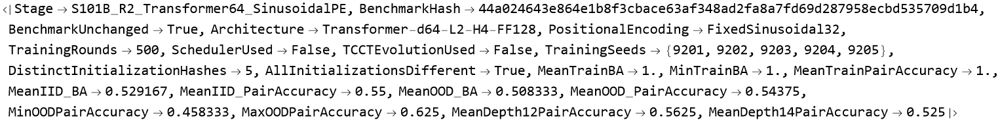

In [670]:
(* ============================================================ *)
(* 14. FINAL SUMMARY                                            *)
(* ============================================================ *)

tfSinInitHashes =
  Lookup[
    tfSinRows,
    "InitHash"
  ];


benchmarkHashAfterSin =
  Hash[
    {
      trainRecords,
      iidRecords,
      oodRecords
    },
    "SHA256",
    "HexString"
  ];


tfSinSummary = <|

  "Stage" ->
    "S101B_R2_Transformer64_SinusoidalPE",

  "BenchmarkHash" ->
    benchmarkHashSin,

  "BenchmarkUnchanged" ->
    SameQ[
      benchmarkHashSin,
      benchmarkHashAfterSin
    ],

  "Architecture" ->
    "Transformer-d64-L2-H4-FF128",

  "PositionalEncoding" ->
    "FixedSinusoidal32",

  "TrainingRounds" ->
    500,

  "SchedulerUsed" ->
    False,

  "TCCTEvolutionUsed" ->
    False,

  "TrainingSeeds" ->
    tfSinSeeds,

  "DistinctInitializationHashes" ->
    Length[
      DeleteDuplicates[
        tfSinInitHashes
      ]
    ],

  "AllInitializationsDifferent" ->
    SameQ[
      Length[
        DeleteDuplicates[
          tfSinInitHashes
        ]
      ],
      Length[
        tfSinSeeds
      ]
    ],

  "MeanTrainBA" ->
    N@Mean[
      Lookup[
        tfSinRows,
        "TrainBA"
      ]
    ],

  "MinTrainBA" ->
    Min[
      Lookup[
        tfSinRows,
        "TrainBA"
      ]
    ],

  "MeanTrainPairAccuracy" ->
    N@Mean[
      Lookup[
        tfSinRows,
        "TrainPairAccuracy"
      ]
    ],

  "MeanIID_BA" ->
    N@Mean[
      Lookup[
        tfSinRows,
        "IID_BA"
      ]
    ],

  "MeanIID_PairAccuracy" ->
    N@Mean[
      Lookup[
        tfSinRows,
        "IID_PairAccuracy"
      ]
    ],

  "MeanOOD_BA" ->
    N@Mean[
      Lookup[
        tfSinRows,
        "OOD_BA"
      ]
    ],

  "MeanOOD_PairAccuracy" ->
    N@Mean[
      Lookup[
        tfSinRows,
        "OOD_PairAccuracy"
      ]
    ],

  "MinOODPairAccuracy" ->
    Min[
      Lookup[
        tfSinRows,
        "OOD_PairAccuracy"
      ]
    ],

  "MaxOODPairAccuracy" ->
    Max[
      Lookup[
        tfSinRows,
        "OOD_PairAccuracy"
      ]
    ],

  "MeanDepth12PairAccuracy" ->
    N@Mean[
      Lookup[
        Lookup[
          tfSinRows,
          "OOD_PerDepthPair"
        ],
        12
      ]
    ],

  "MeanDepth14PairAccuracy" ->
    N@Mean[
      Lookup[
        Lookup[
          tfSinRows,
          "OOD_PerDepthPair"
        ],
        14
      ]
    ]

|>;


tfSinSummary

Benchmark hash = 44a024643e864e1b8f3cbace63af348ad2fa8a7fd69d287958ecbd535709\
 
>    d1b4
<|AdapterUsesScheduler -> False, AdapterUsesReferenceOrLabel -> False, 
 
>   ForbiddenHits -> {}, AdapterHash -> 
 
>    48cd9e98979f567f8c7db15feda91ae0bbeae2ed19da4e748e8156b7fc0075ac, 
 
>   CoreHash -> 
 
>    c7e5e992eeee504c046ec5ec754f6b69a3dba13d9ff146969e630993fb4fe0eb|>
Computing TCCT Train representations...
Computing TCCT IID representations...
Computing TCCT OOD representations...
<|TrainNaturalTerminationFraction -> 1., IIDNaturalTerminationFraction -> 1., 
 
>   OODNaturalTerminationFraction -> 1., AnySafetyCapHit -> False, 
 
>   MeanTrainRejects -> 0., MeanIIDRejects -> 0., MeanOODRejects -> 0.|>


<|Stage -> S101C_FrozenDeterministicTCCTCore, 
 
>   BenchmarkHash -> 44a024643e864e1b8f3cbace63af348ad2fa8a7fd69d287958ecbd535709d1b4, 
 
>   BenchmarkUnchanged -> True, SchedulerUsed -> False, StepEvolutionUsed -> False, 
 
>   ReferenceExecutorUsed -> False, 
 
>   HistoricalCore -> S75D/S78 deterministic propagation + frozen encoder, 
 
>   Readout -> RidgeLinear_lambda1, 
 
>   AdapterAudit -> 
 
>    <|AdapterUsesScheduler -> False, AdapterUsesReferenceOrLabel -> False, 
 
>     ForbiddenHits -> {}, AdapterHash -> 
 
>      48cd9e98979f567f8c7db15feda91ae0bbeae2ed19da4e748e8156b7fc0075ac, 
 
>     CoreHash -> c7e5e992eeee504c046ec5ec754f6b69a3dba13d9ff146969e630993fb4fe0eb|>, 
 
>   PropagationDiagnostic -> 
 
>    <|TrainNaturalTerminationFraction -> 1., IIDNaturalTerminationFraction -> 1., 
 
>     OODNaturalTerminationFraction -> 1., AnySafetyCapHit -> False, 
 
>     MeanTrainRejects -> 0., MeanIIDRejects -> 0., MeanOODRejects -> 0.|>, 
 
>   StaticAdapterControl -> 
 
>    <|Representation -> Static, Dimension -> 257, TrainBA -> 0.6875, 
 
>     TrainPairAccuracy -> 0.75, IID_BA -> 0.479167, IID_PairAccuracy -> 0.416667, 
 
>     IID_PerDepthBA -> <|6 -> 0.4375, 8 -> 0.4375, 10 -> 0.5625|>, 
 
>     IID_PerDepthPair -> <|6 -> 0.375, 8 -> 0.375, 10 -> 0.5|>, OOD_BA -> 0.479167, 
 
>     OOD_PairAccuracy -> 0.416667, OOD_PerDepthBA -> <|12 -> 0.458333, 14 -> 0.5|>, 
 
>     OOD_PerDepthPair -> <|12 -> 0.375, 14 -> 0.458333|>|>, 
 
>   FrozenTCCTCore -> 
 
>    <|Representation -> FullTCCT, Dimension -> 438, TrainBA -> 0.6875, 
 
>     TrainPairAccuracy -> 0.75, IID_BA -> 0.479167, IID_PairAccuracy -> 0.416667, 
 
>     IID_PerDepthBA -> <|6 -> 0.4375, 8 -> 0.4375, 10 -> 0.5625|>, 
 
>     IID_PerDepthPair -> <|6 -> 0.375, 8 -> 0.375, 10 -> 0.5|>, OOD_BA -> 0.479167, 
 
>     OOD_PairAccuracy -> 0.416667, OOD_PerDepthBA -> <|12 -> 0.458333, 14 -> 0.5|>, 
 
>     OOD_PerDepthPair -> <|12 -> 0.375, 14 -> 0.458333|>|>|>
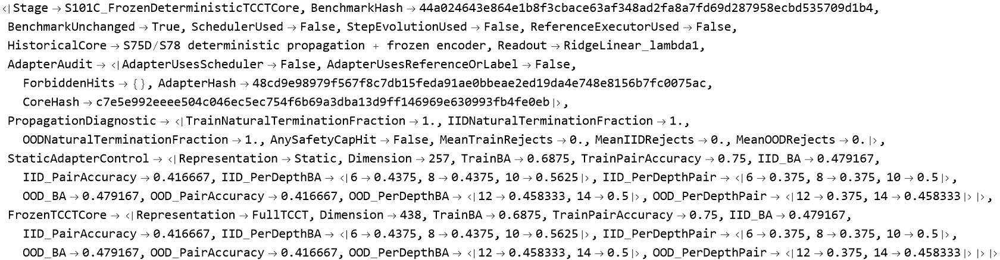

In [681]:
(* ============================================================ *)
(* S101C                                                        *)
(* Frozen deterministic TCCT core + label-blind task adapter    *)
(* NO StepEvolution / NO scheduler / NO reference executor      *)
(* ============================================================ *)

ClearAll[
  TCCTPackS101,
  TCCTSigLevelsS101,
  TCCTRejectTraceS101,
  TCCTEncodeRowsS101,
  TCCTBuildCaseS101,
  TCCTEncodePairS101,
  TCCTPairOneHotS101,
  TCCTPairHistogramS101,
  TCCTRelativePairHistogramS101,
  TCCTRepresentS101,
  TCCTBuildRepTableS101,
  TCCTMakeDataS101,
  TCCTFitRidgeS101,
  TCCTScoreS101,
  TCCTPredictS101,
  TCCTBAS101,
  TCCTPairAccuracyS101,
  TCCTPerDepthBAS101,
  TCCTPerDepthPairS101,
  TCCTRunProbeS101
];


(* ============================================================ *)
(* 0. BENCHMARK LOCK                                            *)
(* ============================================================ *)

expectedBenchmarkHashS101 =
  "44a024643e864e1b8f3cbace63af348ad2fa8a7fd69d287958ecbd535709d1b4";

benchmarkHashS101 =
  Hash[
    {
      trainRecords,
      iidRecords,
      oodRecords
    },
    "SHA256",
    "HexString"
  ];

Print[
  "Benchmark hash = ",
  benchmarkHashS101
];

If[
  benchmarkHashS101 =!= expectedBenchmarkHashS101,

  Print[
    "STOP: benchmark hash changed."
  ];

  Abort[];
];


(* ============================================================ *)
(* 1. HISTORICAL FROZEN TCCT CONSTANTS                          *)
(* ============================================================ *)

tcctFrozenParamsS101 =
  {
    -1, 0, -1, -1,
    -1, 0, 1, -1
  };

tcctFrozenKS101 = 5;

tcctRwS101 =
  {
    -9, 6, -2,
    -2, 4, 2,
    -2, 6, 0
  };

tcctFrozenPolicyS101 =
  {
    {1, 3},
    {2, 2},
    {3, 1},
    {3, 2},
    {3, 3},
    {4, 3}
  };


(* ============================================================ *)
(* 2. HISTORICAL Pack60 — namespaced copy                       *)
(* ============================================================ *)

TCCTPackS101[c_List] := Module[
  {
    x = c[[1]],
    a = c[[2]],
    e,
    v,
    pos,
    gi,
    go,
    pa,
    ch,
    id,
    od,
    pin,
    pout,
    cin,
    cout
  },

  e = x[[1]];

  v =
    Union@Join[
      Flatten[List @@@ e],
      x[[2]],
      {x[[3]]},
      x[[4]],
      x[[5]],
      x[[6]]
    ];

  pos =
    AssociationThread[
      v,
      Range[Length[v]]
    ];

  gi =
    GroupBy[
      Cases[
        e,
        DirectedEdge[u_, w_] :> {w, u}
      ],
      First -> Last
    ];

  go =
    GroupBy[
      Cases[
        e,
        DirectedEdge[u_, w_] :> {u, w}
      ],
      First -> Last
    ];

  pa =
    (
      Lookup[
        pos,
        Lookup[gi, #, {}]
      ] &
    ) /@ v;

  ch =
    (
      Lookup[
        pos,
        Lookup[go, #, {}]
      ] &
    ) /@ v;

  id = Length /@ pa;
  od = Length /@ ch;

  pin =
    (Total[id[[#]]] &) /@ pa;

  pout =
    (Total[od[[#]]] &) /@ pa;

  cin =
    (Total[id[[#]]] &) /@ ch;

  cout =
    (Total[od[[#]]] &) /@ ch;

  {
    pa,
    id,
    od,
    Lookup[pos, x[[2, a]]],
    Lookup[pos, x[[5]]],
    a,
    Length[v],
    pin,
    pout,
    cin,
    cout,
    v
  }
];


(* ============================================================ *)
(* 3. HISTORICAL SigLevels61 — namespaced copy                  *)
(* ============================================================ *)

TCCTSigLevelsS101[
  c_List,
  rmax_Integer
] := Module[
  {
    p,
    pa,
    id,
    od,
    n,
    ch,
    cur,
    nxt,
    levs,
    j,
    k,
    u
  },

  p = TCCTPackS101[c];

  pa = p[[1]];
  id = p[[2]];
  od = p[[3]];
  n = p[[7]];

  ch =
    Table[
      {},
      n
    ];

  Do[
    Do[
      If[
        u > 0,
        ch[[u]] =
          Append[
            ch[[u]],
            j
          ]
      ],
      {u, pa[[j]]}
    ],
    {j, n}
  ];

  cur =
    AssociationThread[
      Range[n],
      MapThread[
        List,
        {
          id,
          od
        }
      ]
    ];

  levs =
    {
      cur
    };

  Do[

    nxt =
      AssociationThread[
        Range[n],

        Table[
          {
            Lookup[cur, j],
            Sort[
              Lookup[
                cur,
                pa[[j]]
              ]
            ],
            Sort[
              Lookup[
                cur,
                ch[[j]]
              ]
            ]
          },
          {j, n}
        ]
      ];

    AppendTo[
      levs,
      nxt
    ];

    cur = nxt,

    {k, rmax}
  ];

  levs
];


(* ============================================================ *)
(* 4. HISTORICAL RejectTrace78 — deterministic core             *)
(* ============================================================ *)

TCCTRejectTraceS101[c_List] := Module[
  {
    p,
    pa,
    id,
    od,
    q,
    n,
    pin,
    pout,
    cin,
    cout,
    h,
    z,
    h2,
    nz,
    j,
    k,
    aps,
    ap,
    pz,
    o,
    zv,
    rf,
    rd,
    dd,
    pg,
    allow,
    active = 0,
    rej = {},
    rounds = 0,
    terminatedNaturally = False,
    safetyCap
  },

  p = TCCTPackS101[c];

  pa = p[[1]];
  id = p[[2]];
  od = p[[3]];
  q = p[[4]];
  n = p[[7]];

  pin = p[[8]];
  pout = p[[9]];
  cin = p[[10]];
  cout = p[[11]];

  safetyCap =
    Max[
      64,
      2 n + 8
    ];

  h =
    ConstantArray[
      0,
      n
    ];

  z =
    ConstantArray[
      0,
      n
    ];

  h[[q]] = 1;

  For[
    k = 1,
    k <= safetyCap,
    k++,

    rounds = k;

    h2 =
      ConstantArray[
        0,
        n
      ];

    nz =
      ConstantArray[
        0,
        n
      ];

    active = 0;

    Do[

      aps =
        Select[
          pa[[j]],
          Function[
            u,
            u > 0 &&
            h[[u]] == 1
          ]
        ];

      ap =
        Length[aps];

      If[
        ap > 0,

        pz =
          Max[
            z[[aps]]
          ];

        o =
          Boole[
            ap > 1
          ];

        zv =
          {
            0, 1, 2, 1,
            3, 1, 3, 1
          }[
            [
              1 + 2 pz + o
            ]
          ];

        nz[[j]] = zv;

        rf =
          {
            1,
            Boole[zv > 0],
            zv,
            Sign[
              pin[[j]] -
              id[[j]]
            ],
            Sign[
              pout[[j]] -
              id[[j]]
            ],
            Sign[
              cin[[j]] -
              id[[j]]
            ],
            Sign[
              cout[[j]] -
              od[[j]]
            ],
            Sign[
              id[[j]] -
              od[[j]]
            ],
            Sign[
              pout[[j]] -
              cin[[j]]
            ]
          };

        rd =
          tcctRwS101 . rf;

        dd =
          1 -
          cin[[j]] +
          2 cout[[j]];

        pg =
          od[[j]] +
          2 Boole[zv > 0] -
          zv;

        If[
          rd > 0 &&
          dd <= 0,

          AppendTo[
            rej,
            {
              k,
              j
            }
          ]
        ];

        allow =
          If[
            rd > 0,
            dd > 0,
            pg > 0
          ];

        If[
          TrueQ[allow],

          h2[[j]] = 1;
          active++
        ];
      ],

      {j, n}
    ];

    h = h2;
    z = nz;

    If[
      active == 0,

      terminatedNaturally = True;
      Break[];
    ];
  ];

  <|

    "Rejects" ->
      rej,

    "RoundsExecuted" ->
      rounds,

    "TerminatedNaturally" ->
      terminatedNaturally,

    "SafetyCap" ->
      safetyCap,

    "HitSafetyCap" ->
      And[
        ! TrueQ[
          terminatedNaturally
        ],
        SameQ[
          rounds,
          safetyCap
        ]
      ],

    "ActiveAfterLastRound" ->
      active,

    "PackedNodeCount" ->
      n

  |>
];


(* ============================================================ *)
(* 5. HISTORICAL EncodeRows75 — frozen encoder                  *)
(* ============================================================ *)

TCCTEncodeRowsS101[
  data_List,
  p_List,
  k_Integer
] := Module[
  {rec},

  rec[s_] :=
    rec[s] =
      If[

        MatchQ[
          s,
          {
            _Integer,
            _Integer
          }
        ],

        1 +
        Mod[
          s[[1]] +
          2 s[[2]],
          k
        ],

        Module[
          {
            z,
            ps,
            cs,
            parentSum,
            childSum,
            parentSquare,
            childSquare
          },

          z =
            rec[
              s[[1]]
            ];

          ps =
            rec /@
              s[[2]];

          cs =
            rec /@
              s[[3]];

          parentSum =
            Total[
              ps - 1
            ];

          childSum =
            Total[
              cs - 1
            ];

          parentSquare =
            Total[
              (ps - 1)^2
            ];

          childSquare =
            Total[
              (cs - 1)^2
            ];

          1 +
          Mod[
            p[[1]] +
            p[[2]] (z - 1) +
            p[[3]] parentSum +
            p[[4]] childSum +
            p[[5]] parentSquare +
            p[[6]] childSquare +
            p[[7]] Length[ps] +
            p[[8]] Length[cs],

            k
          ]
        ]
      ];

  Map[
    Function[
      row,

      Join[
        KeyTake[
          row,
          {
            "Grammar",
            "Depth",
            "Answer",
            "Target"
          }
        ],

        <|
          "Codes" ->
            DeleteDuplicates[
              Map[
                Function[
                  pair,

                  {
                    rec[
                      pair[[1]]
                    ],

                    rec[
                      pair[[2]]
                    ]
                  }
                ],

                row[
                  "StatePairs"
                ]
              ]
            ]
        |>
      ]
    ],

    data
  ]
];


(* ============================================================ *)
(* 6. LABEL-BLIND TASK ADAPTER                                  *)
(*                                                              *)
(* A and B are only encoded as two fixed graph motifs.          *)
(* NO operator composition is performed here.                   *)
(* Start/Target are primitive query markers only.               *)
(* ============================================================ *)

TCCTBuildCaseS101[
  r_Association
] := Module[
  {
    edges = {},
    counter = 1,
    root = 1,
    current,
    newNode,
    marker,
    token,
    startOut,
    targetOut,
    sink,
    tokenCenters = {},
    tokenExits = {}
  },

  newNode[] :=
    (
      counter++;
      counter
    );


  (* ---------------------------------------------------------- *)
  (* query marker: identity only                                *)
  (* type 0 -> 1 branch                                        *)
  (* type 1 -> 2 branches                                      *)
  (* type 2 -> 3 branches                                      *)
  (* ---------------------------------------------------------- *)

  marker[
    entry_,
    type_Integer
  ] := Module[
    {
      branches,
      merge,
      out
    },

    branches =
      Table[
        newNode[],
        {
          type + 1
        }
      ];

    merge =
      newNode[];

    out =
      newNode[];

    edges =
      Join[
        edges,

        (
          DirectedEdge[
            entry,
            #
          ] &
        ) /@ branches,

        (
          DirectedEdge[
            #,
            merge
          ] &
        ) /@ branches,

        {
          DirectedEdge[
            merge,
            out
          ]
        }
      ];

    out
  ];


  (* ---------------------------------------------------------- *)
  (* token motifs have same number of new nodes and edges       *)
  (* but different internal causal ordering                     *)
  (* ---------------------------------------------------------- *)

  token[
    entry_,
    tok_Integer
  ] := Module[
    {
      p1,
      p2,
      m,
      side,
      out
    },

    p1 =
      newNode[];

    p2 =
      newNode[];

    m =
      newNode[];

    side =
      newNode[];

    out =
      newNode[];


    If[
      tok === 0,

      (* A: split -> merge *)

      edges =
        Join[
          edges,

          {
            DirectedEdge[
              entry,
              p1
            ],

            DirectedEdge[
              entry,
              p2
            ],

            DirectedEdge[
              p1,
              m
            ],

            DirectedEdge[
              p2,
              m
            ],

            DirectedEdge[
              side,
              m
            ],

            DirectedEdge[
              m,
              out
            ]
          }
        ],

      (* B: partial merge -> split -> merge *)

      edges =
        Join[
          edges,

          {
            DirectedEdge[
              entry,
              m
            ],

            DirectedEdge[
              side,
              m
            ],

            DirectedEdge[
              m,
              p1
            ],

            DirectedEdge[
              m,
              p2
            ],

            DirectedEdge[
              p1,
              out
            ],

            DirectedEdge[
              p2,
              out
            ]
          }
        ]
    ];

    AppendTo[
      tokenCenters,
      m
    ];

    AppendTo[
      tokenExits,
      out
    ];

    out
  ];


  current =
    root;


  (* start-state marker *)

  startOut =
    marker[
      current,
      r["Start"]
    ];

  current =
    startOut;


  (* ordered input program *)

  Do[
    current =
      token[
        current,
        tok
      ],
    {
      tok,
      r["Seq"]
    }
  ];


  (* target-state marker *)

  targetOut =
    marker[
      current,
      r["Target"]
    ];

  current =
    targetOut;


  (* neutral terminal *)

  sink =
    newNode[];

  AppendTo[
    edges,
    DirectedEdge[
      current,
      sink
    ]
  ];


  <|

    "Case" ->
      {
        {
          Union[
            edges
          ],

          {root},

          root,

          {
            startOut,
            targetOut,
            sink
          },

          {
            targetOut
          },

          tokenCenters
        },

        1
      },

    "Root" ->
      root,

    "StartAnchor" ->
      startOut,

    "TargetAnchor" ->
      targetOut,

    "Sink" ->
      sink,

    "TokenCenters" ->
      tokenCenters,

    "TokenExits" ->
      tokenExits

  |>
];


(* ============================================================ *)
(* 7. FROZEN CODE HELPERS                                       *)
(* ============================================================ *)

TCCTEncodePairS101[
  pair_List
] := Module[
  {row},

  row =
    First@
      TCCTEncodeRowsS101[
        {
          <|
            "Grammar" ->
              "S101FrozenTCCTAdapter",

            "Depth" ->
              0,

            "Answer" ->
              0,

            "Target" ->
              "Unlabeled",

            "StatePairs" ->
              {
                pair
              }
          |>
        },

        tcctFrozenParamsS101,
        tcctFrozenKS101
      ];

  First[
    row[
      "Codes"
    ]
  ]
];


TCCTPairOneHotS101[
  pair_List
] := Module[
  {
    a,
    b,
    idx
  },

  If[
    ! MatchQ[
      pair,
      {
        _Integer,
        _Integer
      }
    ],

    Return[
      ConstantArray[
        0.,
        25
      ]
    ];
  ];

  {
    a,
    b
  } =
    pair;

  If[
    ! And[
      1 <= a <= 5,
      1 <= b <= 5
    ],

    Return[
      ConstantArray[
        0.,
        25
      ]
    ];
  ];

  idx =
    (a - 1) 5 + b;

  N@
    Normal@
      SparseArray[
        {
          idx -> 1.
        },
        25
      ]
];


TCCTPairHistogramS101[
  pairs_List
] := If[

  Length[pairs] == 0,

  ConstantArray[
    0.,
    25
  ],

  N[
    Total[
      TCCTPairOneHotS101 /@
        pairs
    ] /
    Length[pairs]
  ]
];


(* items = {{positionOrRound, pair}, ...} *)

TCCTRelativePairHistogramS101[
  items_List,
  maxIndex_Integer,
  bins_Integer : 6
] := Module[
  {
    h,
    bin,
    idx,
    pair
  },

  h =
    ConstantArray[
      0.,
      {
        bins,
        25
      }
    ];

  If[
    Length[items] == 0,
    Return[
      Flatten[h]
    ]
  ];

  Do[

    idx =
      item[[1]];

    pair =
      item[[2]];

    bin =
      Min[
        bins,
        Max[
          1,
          Ceiling[
            bins idx /
            Max[
              1,
              maxIndex
            ]
          ]
        ]
      ];

    h[[bin]] =
      h[[bin]] +
      TCCTPairOneHotS101[
        pair
      ],

    {
      item,
      items
    }
  ];

  Flatten[
    N[
      h /
      Length[items]
    ]
  ]
];


(* ============================================================ *)
(* 8. ONE RECORD -> STATIC + TCCT CORE REPRESENTATION           *)
(* ============================================================ *)

TCCTRepresentS101[
  r_Association
] := Module[
  {
    built,
    c,
    pack,
    vertexList,
    position,
    levels,
    codeAtOriginalNode,
    tokenPairs,
    tokenItems,
    anchorPairs,
    queryOneHot,
    staticVector,

    trace,
    rejects,
    uniqueRejects,
    rejectItems,
    rejectPairs,
    policyHits,
    traceVector,
    fullVector
  },


  built =
    TCCTBuildCaseS101[
      r
    ];

  c =
    built[
      "Case"
    ];

  pack =
    TCCTPackS101[
      c
    ];

  vertexList =
    pack[[12]];

  position =
    AssociationThread[
      vertexList,
      Range[
        Length[
          vertexList
        ]
      ]
    ];

  levels =
    TCCTSigLevelsS101[
      c,
      3
    ];


  codeAtOriginalNode[
    node_
  ] := Module[
    {
      idx,
      pair
    },

    idx =
      Lookup[
        position,
        node,
        Missing[
          "NodeNotFound"
        ]
      ];

    If[
      MissingQ[idx],
      Return[
        {0, 0}
      ]
    ];

    pair =
      {
        Lookup[
          levels[[3]],
          idx
        ],

        Lookup[
          levels[[4]],
          idx
        ]
      };

    TCCTEncodePairS101[
      pair
    ]
  ];


  (* ---------------------------------------------------------- *)
  (* static adapter representation                              *)
  (* ---------------------------------------------------------- *)

  tokenPairs =
    codeAtOriginalNode /@
      built[
        "TokenCenters"
      ];

  tokenItems =
    MapIndexed[
      {
        First[#2],
        #1
      } &,
      tokenPairs
    ];

  anchorPairs =
    codeAtOriginalNode /@
      {
        built[
          "StartAnchor"
        ],

        built[
          "TargetAnchor"
        ],

        built[
          "Sink"
        ]
      };


  queryOneHot =
    Join[
      N@
        UnitVector[
          3,
          r["Start"] + 1
        ],

      N@
        UnitVector[
          3,
          r["Target"] + 1
        ]
    ];


  staticVector =
    Join[
      queryOneHot,

      {
        N[
          Length[
            r["Seq"]
          ] / 14.
        ]
      },

      TCCTPairHistogramS101[
        tokenPairs
      ],

      TCCTRelativePairHistogramS101[
        tokenItems,
        Length[
          tokenItems
        ],
        6
      ],

      Flatten[
        TCCTPairOneHotS101 /@
          anchorPairs
      ]
    ];


  (* ---------------------------------------------------------- *)
  (* actual deterministic TCCT propagation                      *)
  (* ---------------------------------------------------------- *)

  trace =
    TCCTRejectTraceS101[
      c
    ];


  (* first rejection of each packed node only *)

  uniqueRejects =
    DeleteDuplicatesBy[
      trace[
        "Rejects"
      ],
      Last
    ];


  rejectItems =
    Table[

      {
        rr[[1]],

        Module[
          {
            packedIndex,
            pair
          },

          packedIndex =
            rr[[2]];

          pair =
            {
              Lookup[
                levels[[3]],
                packedIndex
              ],

              Lookup[
                levels[[4]],
                packedIndex
              ]
            };

          TCCTEncodePairS101[
            pair
          ]
        ]
      },

      {
        rr,
        uniqueRejects
      }
    ];


  rejectPairs =
    If[
      rejectItems === {},
      {},
      rejectItems[[All, 2]]
    ];


  policyHits =
    If[
      rejectPairs === {},

      0.,

      N@
        Mean[
          Boole[
            MemberQ[
              tcctFrozenPolicyS101,
              #
            ]
          ] & /@
            rejectPairs
        ]
    ];


  traceVector =
    Join[
      TCCTPairHistogramS101[
        rejectPairs
      ],

      TCCTRelativePairHistogramS101[
        rejectItems,
        trace[
          "RoundsExecuted"
        ],
        6
      ],

      {
        N[
          trace[
            "RoundsExecuted"
          ] /
          Max[
            1,
            trace[
              "SafetyCap"
            ]
          ]
        ],

        N[
          Length[
            uniqueRejects
          ] /
          Max[
            1,
            trace[
              "PackedNodeCount"
            ]
          ]
        ],

        Boole[
          TrueQ[
            trace[
              "TerminatedNaturally"
            ]
          ]
        ],

        Boole[
          TrueQ[
            trace[
              "HitSafetyCap"
            ]
          ]
        ],

        N[
          trace[
            "ActiveAfterLastRound"
          ] /
          Max[
            1,
            trace[
              "PackedNodeCount"
            ]
          ]
        ],

        policyHits
      }
    ];


  fullVector =
    Join[
      staticVector,
      traceVector
    ];


  <|

    "Static" ->
      N[
        staticVector
      ],

    "FullTCCT" ->
      N[
        fullVector
      ],

    "RejectCount" ->
      Length[
        uniqueRejects
      ],

    "Rounds" ->
      trace[
        "RoundsExecuted"
      ],

    "TerminatedNaturally" ->
      trace[
        "TerminatedNaturally"
      ],

    "HitSafetyCap" ->
      trace[
        "HitSafetyCap"
      ]

  |>
];


(* ============================================================ *)
(* 9. ADAPTER ORACLE AUDIT                                      *)
(* ============================================================ *)

adapterDefinitionTextS101 =
  ToString[
    InputForm[
      {
        DownValues[
          TCCTBuildCaseS101
        ],
        DownValues[
          TCCTRepresentS101
        ]
      }
    ]
  ];

forbiddenAdapterSymbolsS101 =
  {
    "BLTruth",
    "BLExecute",
    "TCLabel",
    "TaskY",
    "ProgramOutput",
    "ReferenceExecutor",
    "[\"Y\"]"
  };

adapterForbiddenHitsS101 =
  Select[
    forbiddenAdapterSymbolsS101,
    StringContainsQ[
      adapterDefinitionTextS101,
      #
    ] &
  ];

adapterAuditS101 =
  <|

    "AdapterUsesScheduler" ->
      StringContainsQ[
        adapterDefinitionTextS101,
        "StepEvolution"
      ],

    "AdapterUsesReferenceOrLabel" ->
      (
        adapterForbiddenHitsS101 =!= {}
      ),

    "ForbiddenHits" ->
      adapterForbiddenHitsS101,

    "AdapterHash" ->
      Hash[
        adapterDefinitionTextS101,
        "SHA256",
        "HexString"
      ],

    "CoreHash" ->
      Hash[
        {
          tcctFrozenParamsS101,
          tcctFrozenKS101,
          tcctRwS101,
          tcctFrozenPolicyS101,
          DownValues[
            TCCTPackS101
          ],
          DownValues[
            TCCTSigLevelsS101
          ],
          DownValues[
            TCCTRejectTraceS101
          ],
          DownValues[
            TCCTEncodeRowsS101
          ]
        },
        "SHA256",
        "HexString"
      ]

  |>;

Print[
  adapterAuditS101
];

If[
  TrueQ[
    adapterAuditS101[
      "AdapterUsesScheduler"
    ]
  ] ||
  TrueQ[
    adapterAuditS101[
      "AdapterUsesReferenceOrLabel"
    ]
  ],

  Print[
    "STOP: adapter audit failed."
  ];

  Abort[];
];


(* ============================================================ *)
(* 10. COMPUTE REPRESENTATIONS ONCE                             *)
(* ============================================================ *)

TCCTBuildRepTableS101[
  records_List,
  split_String
] := Table[

  Module[
    {
      z
    },

    z =
      TCCTRepresentS101[
        r
      ];

    <|

      "Split" ->
        split,

      "Static" ->
        z[
          "Static"
        ],

      "FullTCCT" ->
        z[
          "FullTCCT"
        ],

      "Y" ->
        r[
          "Y"
        ],

      "PairID" ->
        r[
          "PairID"
        ],

      "Depth" ->
        r[
          "Depth"
        ],

      "RejectCount" ->
        z[
          "RejectCount"
        ],

      "Rounds" ->
        z[
          "Rounds"
        ],

      "TerminatedNaturally" ->
        z[
          "TerminatedNaturally"
        ],

      "HitSafetyCap" ->
        z[
          "HitSafetyCap"
        ]

    |>
  ],

  {
    r,
    records
  }
];


Print[
  "Computing TCCT Train representations..."
];

tcctTrainRepS101 =
  TCCTBuildRepTableS101[
    trainRecords,
    "Train"
  ];


Print[
  "Computing TCCT IID representations..."
];

tcctIIDRepS101 =
  TCCTBuildRepTableS101[
    iidRecords,
    "IID"
  ];


Print[
  "Computing TCCT OOD representations..."
];

tcctOODRepS101 =
  TCCTBuildRepTableS101[
    oodRecords,
    "OOD"
  ];


(* ============================================================ *)
(* 11. SAFETY / PROPAGATION DIAGNOSTIC                          *)
(* ============================================================ *)

propagationDiagnosticS101 =
  <|

    "TrainNaturalTerminationFraction" ->
      N@
        Mean[
          Boole[
            TrueQ[#]
          ] & /@
            Lookup[
              tcctTrainRepS101,
              "TerminatedNaturally"
            ]
        ],

    "IIDNaturalTerminationFraction" ->
      N@
        Mean[
          Boole[
            TrueQ[#]
          ] & /@
            Lookup[
              tcctIIDRepS101,
              "TerminatedNaturally"
            ]
        ],

    "OODNaturalTerminationFraction" ->
      N@
        Mean[
          Boole[
            TrueQ[#]
          ] & /@
            Lookup[
              tcctOODRepS101,
              "TerminatedNaturally"
            ]
        ],

    "AnySafetyCapHit" ->
      Or @@
        Lookup[
          Join[
            tcctTrainRepS101,
            tcctIIDRepS101,
            tcctOODRepS101
          ],
          "HitSafetyCap"
        ],

    "MeanTrainRejects" ->
      N@
        Mean[
          Lookup[
            tcctTrainRepS101,
            "RejectCount"
          ]
        ],

    "MeanIIDRejects" ->
      N@
        Mean[
          Lookup[
            tcctIIDRepS101,
            "RejectCount"
          ]
        ],

    "MeanOODRejects" ->
      N@
        Mean[
          Lookup[
            tcctOODRepS101,
            "RejectCount"
          ]
        ]

  |>;

Print[
  propagationDiagnosticS101
];


(* ============================================================ *)
(* 12. RIDGE PROBE                                              *)
(* fixed lambda = 1.0                                           *)
(* ============================================================ *)

TCCTMakeDataS101[
  reps_List,
  representation_String
] :=
  {
    #[representation],
    #["Y"],
    #["PairID"],
    #["Depth"]
  } & /@
    reps;


TCCTFitRidgeS101[
  data_List,
  lambda_ : 1.0
] := Module[
  {
    x,
    y,
    mu,
    sd,
    xs,
    xb,
    w
  },

  x =
    N[
      data[[All, 1]]
    ];

  y =
    N[
      2 data[[All, 2]] -
      1
    ];

  mu =
    Mean /@
      Transpose[x];

  sd =
    StandardDeviation /@
      Transpose[x];

  sd =
    Map[
      If[
        ! NumericQ[#] ||
        Abs[N[#]] < 10^-10,
        1.,
        N[#]
      ] &,
      sd
    ];

  xs =
    Table[
      MapThread[
        (#1 - #2) / #3 &,
        {
          x[[i]],
          mu,
          sd
        }
      ],
      {
        i,
        Length[x]
      }
    ];

  xb =
    Prepend[
      #,
      1.
    ] & /@
      xs;

  w =
    LinearSolve[
      Transpose[xb] . xb +
        lambda
        IdentityMatrix[
          Length[
            First[xb]
          ]
        ],

      Transpose[xb] . y
    ];

  <|

    "Mu" ->
      mu,

    "SD" ->
      sd,

    "W" ->
      w,

    "Lambda" ->
      lambda

  |>
];


TCCTScoreS101[
  model_Association,
  x_List
] := Module[
  {
    z
  },

  z =
    MapThread[
      (#1 - #2) / #3 &,
      {
        N[x],
        model[
          "Mu"
        ],
        model[
          "SD"
        ]
      }
    ];

  N[
    model[
      "W"
    ] .
    Prepend[
      z,
      1.
    ]
  ]
];


TCCTPredictS101[
  model_Association,
  x_List
] :=
  Boole[
    TCCTScoreS101[
      model,
      x
    ] >= 0
  ];


(* ============================================================ *)
(* 13. METRICS                                                  *)
(* ============================================================ *)

TCCTBAS101[
  model_Association,
  data_List
] := N@Mean@Table[

  Mean[
    Boole[
      TCCTPredictS101[
        model,
        #[[1]]
      ] === cls
    ] & /@
      Select[
        data,
        #[[2]] === cls &
      ]
  ],

  {
    cls,
    {0, 1}
  }
];


TCCTPairAccuracyS101[
  model_Association,
  data_List
] := Module[
  {
    groups,
    vals
  },

  groups =
    Values@
      GroupBy[
        data,
        #[[3]] &
      ];

  vals =
    Table[

      Module[
        {
          pos,
          neg,
          sp,
          sn
        },

        pos =
          SelectFirst[
            g,
            #[[2]] === 1 &
          ];

        neg =
          SelectFirst[
            g,
            #[[2]] === 0 &
          ];

        sp =
          TCCTScoreS101[
            model,
            pos[[1]]
          ];

        sn =
          TCCTScoreS101[
            model,
            neg[[1]]
          ];

        If[
          sp > sn,
          1.,
          If[
            sp < sn,
            0.,
            0.5
          ]
        ]
      ],

      {
        g,
        groups
      }
    ];

  N@
    Mean[
      vals
    ]
];


TCCTPerDepthBAS101[
  model_Association,
  data_List
] :=
  Association@Table[

    d ->
      TCCTBAS101[
        model,

        Select[
          data,
          #[[4]] === d &
        ]
      ],

    {
      d,
      Sort@
        DeleteDuplicates[
          data[[All, 4]]
        ]
    }
  ];


TCCTPerDepthPairS101[
  model_Association,
  data_List
] :=
  Association@Table[

    d ->
      TCCTPairAccuracyS101[
        model,

        Select[
          data,
          #[[4]] === d &
        ]
      ],

    {
      d,
      Sort@
        DeleteDuplicates[
          data[[All, 4]]
        ]
    }
  ];


(* ============================================================ *)
(* 14. RUN ONE REPRESENTATION                                   *)
(* ============================================================ *)

TCCTRunProbeS101[
  representation_String
] := Module[
  {
    tr,
    ii,
    oo,
    model
  },

  tr =
    TCCTMakeDataS101[
      tcctTrainRepS101,
      representation
    ];

  ii =
    TCCTMakeDataS101[
      tcctIIDRepS101,
      representation
    ];

  oo =
    TCCTMakeDataS101[
      tcctOODRepS101,
      representation
    ];

  model =
    TCCTFitRidgeS101[
      tr,
      1.0
    ];

  <|

    "Representation" ->
      representation,

    "Dimension" ->
      Length[
        First[
          tr
        ][[1]]
      ],

    "TrainBA" ->
      TCCTBAS101[
        model,
        tr
      ],

    "TrainPairAccuracy" ->
      TCCTPairAccuracyS101[
        model,
        tr
      ],

    "IID_BA" ->
      TCCTBAS101[
        model,
        ii
      ],

    "IID_PairAccuracy" ->
      TCCTPairAccuracyS101[
        model,
        ii
      ],

    "IID_PerDepthBA" ->
      TCCTPerDepthBAS101[
        model,
        ii
      ],

    "IID_PerDepthPair" ->
      TCCTPerDepthPairS101[
        model,
        ii
      ],

    "OOD_BA" ->
      TCCTBAS101[
        model,
        oo
      ],

    "OOD_PairAccuracy" ->
      TCCTPairAccuracyS101[
        model,
        oo
      ],

    "OOD_PerDepthBA" ->
      TCCTPerDepthBAS101[
        model,
        oo
      ],

    "OOD_PerDepthPair" ->
      TCCTPerDepthPairS101[
        model,
        oo
      ]

  |>
];


(* ============================================================ *)
(* 15. STATIC ADAPTER CONTROL + FULL TCCT                       *)
(* ============================================================ *)

staticResultS101 =
  TCCTRunProbeS101[
    "Static"
  ];

fullTCCTResultS101 =
  TCCTRunProbeS101[
    "FullTCCT"
  ];


finalTCCTBaselineS101 =
  <|

    "Stage" ->
      "S101C_FrozenDeterministicTCCTCore",

    "BenchmarkHash" ->
      benchmarkHashS101,

    "BenchmarkUnchanged" ->
      SameQ[
        benchmarkHashS101,
        expectedBenchmarkHashS101
      ],

    "SchedulerUsed" ->
      False,

    "StepEvolutionUsed" ->
      False,

    "ReferenceExecutorUsed" ->
      False,

    "HistoricalCore" ->
      "S75D/S78 deterministic propagation + frozen encoder",

    "Readout" ->
      "RidgeLinear_lambda1",

    "AdapterAudit" ->
      adapterAuditS101,

    "PropagationDiagnostic" ->
      propagationDiagnosticS101,

    "StaticAdapterControl" ->
      staticResultS101,

    "FrozenTCCTCore" ->
      fullTCCTResultS101

  |>;


finalTCCTBaselineS101

Observing TRAIN...
Observing IID...
Observing OOD...


<|Train -> <|N -> 96, ObserverMatchesCore -> True, 
 
>     RoundsDistribution -> <|4 -> 48, 5 -> 22, 7 -> 8, 8 -> 12, 10 -> 2, 11 -> 4|>, 
 
>     MeanRounds -> 5.39583, FractionExactlyOneRound -> 0., 
 
>     MeanFirstRoundReached -> 2.16667, MeanFirstRoundActive -> 2.16667, 
 
>     FractionFirstRoundActivePositive -> 1., MeanNonzeroActiveRounds -> 4.39583, 
 
>     FractionMultiRoundPropagation -> 1., MeanMaxActive -> 2.4375, 
 
>     MeanTotalReachedNodes -> 7.89583, MeanTotalRdPositive -> 0.0833333, 
 
>     MeanTotalDdNonPositive -> 2.89583, MeanTotalRejectEligible -> 0., 
 
>     FractionAnyRejectEligible -> 0., FractionAnyActualReject -> 0., 
 
>     AllTerminateNaturally -> True, AnySafetyCapHit -> False|>, 
 
>   IID -> <|N -> 48, ObserverMatchesCore -> True, 
 
>     RoundsDistribution -> <|5 -> 18, 8 -> 16, 4 -> 10, 10 -> 1, 11 -> 1, 7 -> 2|>, 
 
>     MeanRounds -> 6.10417, FractionExactlyOneRound -> 0., 
 
>     MeanFirstRoundReached -> 1.875, MeanFirstRoundActive -> 1.875, 
 
>     FractionFirstRoundActivePositive -> 1., MeanNonzeroActiveRounds -> 5.10417, 
 
>     FractionMultiRoundPropagation -> 1., MeanMaxActive -> 2.29167, 
 
>     MeanTotalReachedNodes -> 8.4375, MeanTotalRdPositive -> 0.270833, 
 
>     MeanTotalDdNonPositive -> 2.08333, MeanTotalRejectEligible -> 0., 
 
>     FractionAnyRejectEligible -> 0., FractionAnyActualReject -> 0., 
 
>     AllTerminateNaturally -> True, AnySafetyCapHit -> False|>, 
 
>   OOD -> <|N -> 96, ObserverMatchesCore -> True, 
 
>     RoundsDistribution -> <|8 -> 20, 4 -> 34, 7 -> 6, 5 -> 30, 10 -> 3, 11 -> 3|>, 
 
>     MeanRounds -> 5.73958, FractionExactlyOneRound -> 0., MeanFirstRoundReached -> 2., 
 
>     MeanFirstRoundActive -> 2., FractionFirstRoundActivePositive -> 1., 
 
>     MeanNonzeroActiveRounds -> 4.73958, FractionMultiRoundPropagation -> 1., 
 
>     MeanMaxActive -> 2.33333, MeanTotalReachedNodes -> 8.13542, 
 
>     MeanTotalRdPositive -> 0.197917, MeanTotalDdNonPositive -> 2.47917, 
 
>     MeanTotalRejectEligible -> 0., FractionAnyRejectEligible -> 0., 
 
>     FractionAnyActualReject -> 0., AllTerminateNaturally -> True, 
 
>     AnySafetyCapHit -> False|>, TrainByDepth -> 
 
>    <|6 -> <|N -> 32, ObserverMatchesCore -> True, 
 
>       RoundsDistribution -> <|4 -> 14, 5 -> 6, 7 -> 4, 8 -> 4, 10 -> 2, 11 -> 2|>, 
 
>       MeanRounds -> 5.875, FractionExactlyOneRound -> 0., MeanFirstRoundReached -> 2., 
 
>       MeanFirstRoundActive -> 2., FractionFirstRoundActivePositive -> 1., 
 
>       MeanNonzeroActiveRounds -> 4.875, FractionMultiRoundPropagation -> 1., 
 
>       MeanMaxActive -> 2.375, MeanTotalReachedNodes -> 8.375, 
 
>       MeanTotalRdPositive -> 0.0625, MeanTotalDdNonPositive -> 2.875, 
 
>       MeanTotalRejectEligible -> 0., FractionAnyRejectEligible -> 0., 
 
>       FractionAnyActualReject -> 0., AllTerminateNaturally -> True, 
 
>       AnySafetyCapHit -> False|>, 
 
>     8 -> <|N -> 32, ObserverMatchesCore -> True, 
 
>       RoundsDistribution -> <|5 -> 6, 4 -> 24, 8 -> 2|>, MeanRounds -> 4.4375, 
 
>       FractionExactlyOneRound -> 0., MeanFirstRoundReached -> 2.375, 
 
>       MeanFirstRoundActive -> 2.375, FractionFirstRoundActivePositive -> 1., 
 
>       MeanNonzeroActiveRounds -> 3.4375, FractionMultiRoundPropagation -> 1., 
 
>       MeanMaxActive -> 2.4375, MeanTotalReachedNodes -> 6.875, 
 
>       MeanTotalRdPositive -> 0.0625, MeanTotalDdNonPositive -> 2.9375, 
 
>       MeanTotalRejectEligible -> 0., FractionAnyRejectEligible -> 0., 
 
>       FractionAnyActualReject -> 0., AllTerminateNaturally -> True, 
 
>       AnySafetyCapHit -> False|>, 
 
>     10 -> <|N -> 32, ObserverMatchesCore -> True, 
 
>       RoundsDistribution -> <|8 -> 6, 5 -> 10, 4 -> 10, 7 -> 4, 11 -> 2|>, 
 
>       MeanRounds -> 5.875, FractionExactlyOneRound -> 0., 
 
>       MeanFirstRoundReached -> 2.125, MeanFirstRoundActive -> 2.125, 
 
>       FractionFirstRoundActivePositive -> 1., MeanNonzeroActiveRounds -> 4.875, 
 
>       FractionMul
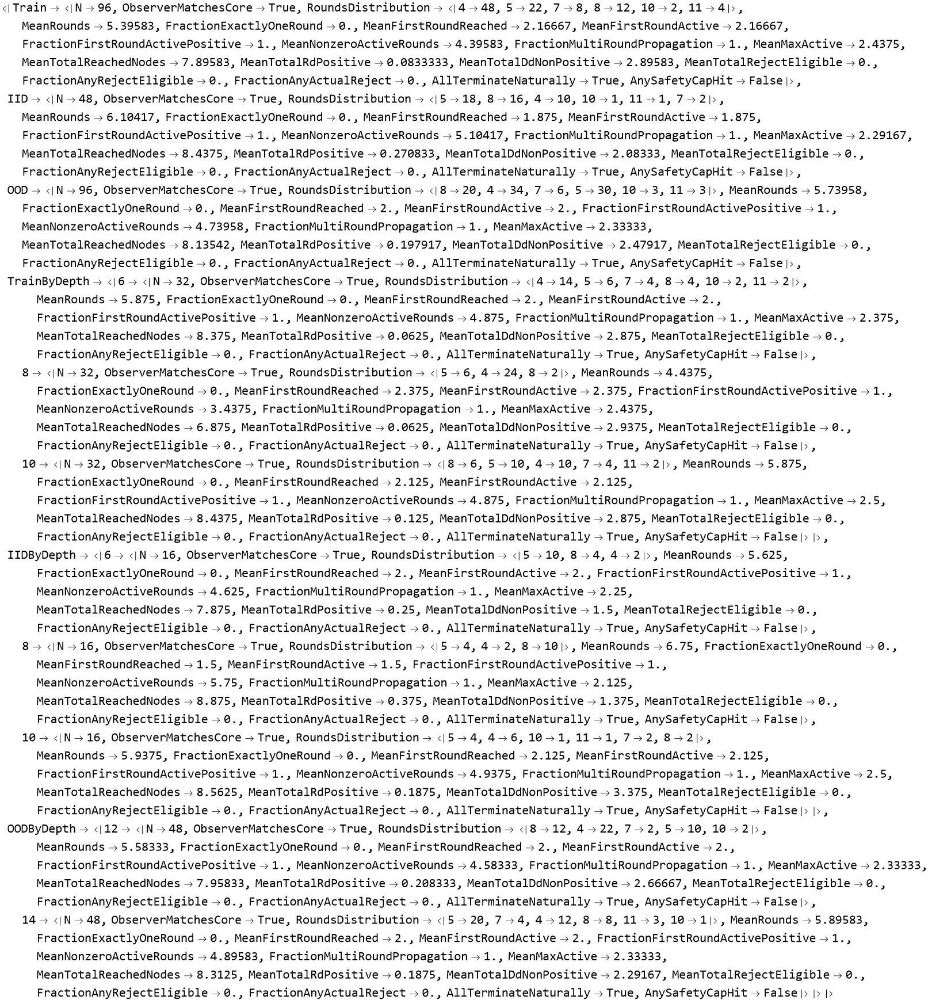

In [791]:
(* ============================================================ *)
(* S101C-DIAG                                                   *)
(* Observer-only diagnostic for deterministic TCCT propagation  *)
(* NO model modification / NO training / NO scheduler           *)
(* ============================================================ *)

ClearAll[
  TCCTTraceObserverS101,
  TCCTObserveRecordS101,
  TCCTObserveSplitS101,
  TCCTSummarizeTraceS101,
  TCCTDepthTraceSummaryS101
];


(* ============================================================ *)
(* 1. OBSERVER VERSION OF RejectTrace                           *)
(*    Same update equations; only adds logging.                 *)
(* ============================================================ *)

TCCTTraceObserverS101[c_List] := Module[
  {
    p,
    pa,
    id,
    od,
    q,
    n,
    pin,
    pout,
    cin,
    cout,

    h,
    z,
    h2,
    nz,

    j,
    k,
    aps,
    ap,
    pz,
    o,
    zv,
    rf,
    rd,
    dd,
    pg,
    allow,

    active,
    rej = {},
    rounds = 0,
    terminatedNaturally = False,
    safetyCap,

    activeHistory = {},
    reachedHistory = {},
    allowedHistory = {},
    rdPositiveHistory = {},
    ddNonPositiveHistory = {},
    rejectEligibleHistory = {},
    rejectsAddedHistory = {},
    maxZHistory = {},

    reachedRound,
    allowedRound,
    rdPositiveRound,
    ddNonPositiveRound,
    eligibleRound,
    rejectBefore
  },

  p = TCCTPackS101[c];

  pa = p[[1]];
  id = p[[2]];
  od = p[[3]];
  q = p[[4]];
  n = p[[7]];

  pin = p[[8]];
  pout = p[[9]];
  cin = p[[10]];
  cout = p[[11]];

  safetyCap =
    Max[
      64,
      2 n + 8
    ];

  h =
    ConstantArray[
      0,
      n
    ];

  z =
    ConstantArray[
      0,
      n
    ];

  h[[q]] = 1;


  For[
    k = 1,
    k <= safetyCap,
    k++,

    rounds = k;

    h2 =
      ConstantArray[
        0,
        n
      ];

    nz =
      ConstantArray[
        0,
        n
      ];

    active = 0;

    reachedRound = 0;
    allowedRound = 0;
    rdPositiveRound = 0;
    ddNonPositiveRound = 0;
    eligibleRound = 0;

    rejectBefore =
      Length[rej];


    Do[

      aps =
        Select[
          pa[[j]],
          Function[
            u,
            u > 0 &&
            h[[u]] == 1
          ]
        ];

      ap =
        Length[aps];


      If[
        ap > 0,

        reachedRound++;

        pz =
          Max[
            z[[aps]]
          ];

        o =
          Boole[
            ap > 1
          ];

        zv =
          {
            0, 1, 2, 1,
            3, 1, 3, 1
          }[[1 + 2 pz + o]];

        nz[[j]] = zv;


        rf =
          {
            1,

            Boole[
              zv > 0
            ],

            zv,

            Sign[
              pin[[j]] -
              id[[j]]
            ],

            Sign[
              pout[[j]] -
              id[[j]]
            ],

            Sign[
              cin[[j]] -
              id[[j]]
            ],

            Sign[
              cout[[j]] -
              od[[j]]
            ],

            Sign[
              id[[j]] -
              od[[j]]
            ],

            Sign[
              pout[[j]] -
              cin[[j]]
            ]
          };


        rd =
          tcctRwS101 . rf;


        dd =
          1 -
          cin[[j]] +
          2 cout[[j]];


        pg =
          od[[j]] +
          2 Boole[zv > 0] -
          zv;


        If[
          rd > 0,
          rdPositiveRound++
        ];


        If[
          dd <= 0,
          ddNonPositiveRound++
        ];


        If[
          rd > 0 &&
          dd <= 0,

          eligibleRound++;

          AppendTo[
            rej,
            {
              k,
              j
            }
          ];
        ];


        allow =
          If[
            rd > 0,
            dd > 0,
            pg > 0
          ];


        If[
          TrueQ[allow],

          h2[[j]] = 1;

          active++;

          allowedRound++;
        ];
      ],

      {
        j,
        n
      }
    ];


    AppendTo[
      activeHistory,
      active
    ];

    AppendTo[
      reachedHistory,
      reachedRound
    ];

    AppendTo[
      allowedHistory,
      allowedRound
    ];

    AppendTo[
      rdPositiveHistory,
      rdPositiveRound
    ];

    AppendTo[
      ddNonPositiveHistory,
      ddNonPositiveRound
    ];

    AppendTo[
      rejectEligibleHistory,
      eligibleRound
    ];

    AppendTo[
      rejectsAddedHistory,
      Length[rej] -
      rejectBefore
    ];

    AppendTo[
      maxZHistory,
      If[
        Length[nz] == 0,
        0,
        Max[nz]
      ]
    ];


    h = h2;
    z = nz;


    If[
      active == 0,

      terminatedNaturally = True;

      Break[];
    ];
  ];


  <|

    "Rejects" ->
      rej,

    "RoundsExecuted" ->
      rounds,

    "TerminatedNaturally" ->
      terminatedNaturally,

    "SafetyCap" ->
      safetyCap,

    "HitSafetyCap" ->
      And[
        ! TrueQ[
          terminatedNaturally
        ],

        SameQ[
          rounds,
          safetyCap
        ]
      ],

    "ActiveByRound" ->
      activeHistory,

    "ReachedNodesByRound" ->
      reachedHistory,

    "AllowedNodesByRound" ->
      allowedHistory,

    "RdPositiveByRound" ->
      rdPositiveHistory,

    "DdNonPositiveByRound" ->
      ddNonPositiveHistory,

    "RejectEligibleByRound" ->
      rejectEligibleHistory,

    "RejectsAddedByRound" ->
      rejectsAddedHistory,

    "MaxZByRound" ->
      maxZHistory

  |>
];


(* ============================================================ *)
(* 2. RUN OBSERVER ON ONE RECORD                                *)
(* ============================================================ *)

TCCTObserveRecordS101[
  r_Association
] := Module[
  {
    built,
    c,
    obs,
    original,
    activeHist,
    reachedHist,
    rdHist,
    ddHist,
    eligibleHist
  },

  built =
    TCCTBuildCaseS101[
      r
    ];

  c =
    built[
      "Case"
    ];


  obs =
    TCCTTraceObserverS101[
      c
    ];


  (* original core result, for consistency check *)

  original =
    TCCTRejectTraceS101[
      c
    ];


  activeHist =
    obs[
      "ActiveByRound"
    ];

  reachedHist =
    obs[
      "ReachedNodesByRound"
    ];

  rdHist =
    obs[
      "RdPositiveByRound"
    ];

  ddHist =
    obs[
      "DdNonPositiveByRound"
    ];

  eligibleHist =
    obs[
      "RejectEligibleByRound"
    ];


  <|

    "PairID" ->
      r[
        "PairID"
      ],

    "Depth" ->
      r[
        "Depth"
      ],

    "Y" ->
      r[
        "Y"
      ],

    "Rounds" ->
      obs[
        "RoundsExecuted"
      ],

    "TotalRejects" ->
      Length[
        obs[
          "Rejects"
        ]
      ],

    "FirstRoundReached" ->
      If[
        reachedHist === {},
        0,
        First[
          reachedHist
        ]
      ],

    "FirstRoundActive" ->
      If[
        activeHist === {},
        0,
        First[
          activeHist
        ]
      ],

    "NonzeroActiveRounds" ->
      Count[
        activeHist,
        _?(
          # > 0 &
        )
      ],

    "MaxActive" ->
      If[
        activeHist === {},
        0,
        Max[
          activeHist
        ]
      ],

    "TotalReachedNodes" ->
      Total[
        reachedHist
      ],

    "TotalRdPositive" ->
      Total[
        rdHist
      ],

    "TotalDdNonPositive" ->
      Total[
        ddHist
      ],

    "TotalRejectEligible" ->
      Total[
        eligibleHist
      ],

    "ActiveByRound" ->
      activeHist,

    "ReachedByRound" ->
      reachedHist,

    "RdPositiveByRound" ->
      rdHist,

    "DdNonPositiveByRound" ->
      ddHist,

    "RejectEligibleByRound" ->
      eligibleHist,

    "RejectsAddedByRound" ->
      obs[
        "RejectsAddedByRound"
      ],

    "MaxZByRound" ->
      obs[
        "MaxZByRound"
      ],

    "TerminatedNaturally" ->
      obs[
        "TerminatedNaturally"
      ],

    "HitSafetyCap" ->
      obs[
        "HitSafetyCap"
      ],

    "ObserverMatchesCore" ->
      And[
        SameQ[
          obs[
            "Rejects"
          ],
          original[
            "Rejects"
          ]
        ],

        SameQ[
          obs[
            "RoundsExecuted"
          ],
          original[
            "RoundsExecuted"
          ]
        ],

        SameQ[
          obs[
            "TerminatedNaturally"
          ],
          original[
            "TerminatedNaturally"
          ]
        ]
      ]

  |>
];


(* ============================================================ *)
(* 3. RUN SPLITS                                                *)
(* ============================================================ *)

TCCTObserveSplitS101[
  records_List
] :=
  TCCTObserveRecordS101 /@
    records;


Print[
  "Observing TRAIN..."
];

trainTraceDiagS101 =
  TCCTObserveSplitS101[
    trainRecords
  ];


Print[
  "Observing IID..."
];

iidTraceDiagS101 =
  TCCTObserveSplitS101[
    iidRecords
  ];


Print[
  "Observing OOD..."
];

oodTraceDiagS101 =
  TCCTObserveSplitS101[
    oodRecords
  ];


(* ============================================================ *)
(* 4. SUMMARY                                                   *)
(* ============================================================ *)

TCCTSummarizeTraceS101[
  rows_List
] := <|

  "N" ->
    Length[
      rows
    ],

  "ObserverMatchesCore" ->
    And @@
      Lookup[
        rows,
        "ObserverMatchesCore"
      ],

  "RoundsDistribution" ->
    Counts[
      Lookup[
        rows,
        "Rounds"
      ]
    ],

  "MeanRounds" ->
    N@
      Mean[
        Lookup[
          rows,
          "Rounds"
        ]
      ],

  "FractionExactlyOneRound" ->
    N@
      Mean[
        Boole[
          # == 1
        ] & /@
          Lookup[
            rows,
            "Rounds"
          ]
      ],

  "MeanFirstRoundReached" ->
    N@
      Mean[
        Lookup[
          rows,
          "FirstRoundReached"
        ]
      ],

  "MeanFirstRoundActive" ->
    N@
      Mean[
        Lookup[
          rows,
          "FirstRoundActive"
        ]
      ],

  "FractionFirstRoundActivePositive" ->
    N@
      Mean[
        Boole[
          # > 0
        ] & /@
          Lookup[
            rows,
            "FirstRoundActive"
          ]
      ],

  "MeanNonzeroActiveRounds" ->
    N@
      Mean[
        Lookup[
          rows,
          "NonzeroActiveRounds"
        ]
      ],

  "FractionMultiRoundPropagation" ->
    N@
      Mean[
        Boole[
          # >= 2
        ] & /@
          Lookup[
            rows,
            "NonzeroActiveRounds"
          ]
      ],

  "MeanMaxActive" ->
    N@
      Mean[
        Lookup[
          rows,
          "MaxActive"
        ]
      ],

  "MeanTotalReachedNodes" ->
    N@
      Mean[
        Lookup[
          rows,
          "TotalReachedNodes"
        ]
      ],

  "MeanTotalRdPositive" ->
    N@
      Mean[
        Lookup[
          rows,
          "TotalRdPositive"
        ]
      ],

  "MeanTotalDdNonPositive" ->
    N@
      Mean[
        Lookup[
          rows,
          "TotalDdNonPositive"
        ]
      ],

  "MeanTotalRejectEligible" ->
    N@
      Mean[
        Lookup[
          rows,
          "TotalRejectEligible"
        ]
      ],

  "FractionAnyRejectEligible" ->
    N@
      Mean[
        Boole[
          # > 0
        ] & /@
          Lookup[
            rows,
            "TotalRejectEligible"
          ]
      ],

  "FractionAnyActualReject" ->
    N@
      Mean[
        Boole[
          # > 0
        ] & /@
          Lookup[
            rows,
            "TotalRejects"
          ]
      ],

  "AllTerminateNaturally" ->
    And @@
      Lookup[
        rows,
        "TerminatedNaturally"
      ],

  "AnySafetyCapHit" ->
    Or @@
      Lookup[
        rows,
        "HitSafetyCap"
      ]

|>;


TCCTDepthTraceSummaryS101[
  rows_List
] :=
  Association@Table[

    d ->
      TCCTSummarizeTraceS101[
        Select[
          rows,
          #["Depth"] === d &
        ]
      ],

    {
      d,
      Sort@
        DeleteDuplicates[
          Lookup[
            rows,
            "Depth"
          ]
        ]
    }
  ];


traceDiagnosticSummaryS101 =
  <|

    "Train" ->
      TCCTSummarizeTraceS101[
        trainTraceDiagS101
      ],

    "IID" ->
      TCCTSummarizeTraceS101[
        iidTraceDiagS101
      ],

    "OOD" ->
      TCCTSummarizeTraceS101[
        oodTraceDiagS101
      ],

    "TrainByDepth" ->
      TCCTDepthTraceSummaryS101[
        trainTraceDiagS101
      ],

    "IIDByDepth" ->
      TCCTDepthTraceSummaryS101[
        iidTraceDiagS101
      ],

    "OODByDepth" ->
      TCCTDepthTraceSummaryS101[
        oodTraceDiagS101
      ]

  |>;


traceDiagnosticSummaryS101

In [827]:
Dataset[
  Take[
    trainTraceDiagS101,
    UpTo[12]
  ][
    [
      All,
      {
        "Depth",
        "Y",
        "Rounds",
        "FirstRoundReached",
        "FirstRoundActive",
        "NonzeroActiveRounds",
        "MaxActive",
        "TotalRdPositive",
        "TotalDdNonPositive",
        "TotalRejectEligible",
        "ActiveByRound",
        "ReachedByRound",
        "RdPositiveByRound",
        "DdNonPositiveByRound",
        "RejectEligibleByRound"
      }
    ]
  ]
]

Dataset[{<|Depth -> 6, Y -> 1, Rounds -> 4, FirstRoundReached -> 2, 
 
>     FirstRoundActive -> 2, NonzeroActiveRounds -> 3, MaxActive -> 2, 
 
>     TotalRdPositive -> 0, TotalDdNonPositive -> 2, TotalRejectEligible -> 0, 
 
>     ActiveByRound -> {2, 1, 1, 0}, ReachedByRound -> {2, 1, 1, 2}, 
 
>     RdPositiveByRound -> {0, 0, 0, 0}, DdNonPositiveByRound -> {0, 0, 0, 2}, 
 
>     RejectEligibleByRound -> {0, 0, 0, 0}|>, 
 
>    <|Depth -> 6, Y -> 0, Rounds -> 4, FirstRoundReached -> 2, FirstRoundActive -> 2, 
 
>     NonzeroActiveRounds -> 3, MaxActive -> 2, TotalRdPositive -> 0, 
 
>     TotalDdNonPositive -> 2, TotalRejectEligible -> 0, ActiveByRound -> {2, 1, 1, 0}, 
 
>     ReachedByRound -> {2, 1, 1, 2}, RdPositiveByRound -> {0, 0, 0, 0}, 
 
>     DdNonPositiveByRound -> {0, 0, 0, 2}, RejectEligibleByRound -> {0, 0, 0, 0}|>, 
 
>    <|Depth -> 6, Y -> 1, Rounds -> 5, FirstRoundReached -> 3, FirstRoundActive -> 3, 
 
>     NonzeroActiveRounds -> 4, MaxActive -> 3, TotalRdPositive -> 0, 
 
>     TotalDdNonPositive -> 3, TotalRejectEligible -> 0, 
 
>     ActiveByRound -> {3, 1, 1, 1, 0}, ReachedByRound -> {3, 1, 1, 1, 2}, 
 
>     RdPositiveByRound -> {0, 0, 0, 0, 0}, DdNonPositiveByRound -> {3, 0, 0, 0, 0}, 
 
>     RejectEligibleByRound -> {0, 0, 0, 0, 0}|>, 
 
>    <|Depth -> 6, Y -> 0, Rounds -> 5, FirstRoundReached -> 3, FirstRoundActive -> 3, 
 
>     NonzeroActiveRounds -> 4, MaxActive -> 3, TotalRdPositive -> 0, 
 
>     TotalDdNonPositive -> 3, TotalRejectEligible -> 0, 
 
>     ActiveByRound -> {3, 1, 1, 1, 0}, ReachedByRound -> {3, 1, 1, 1, 2}, 
 
>     RdPositiveByRound -> {0, 0, 0, 0, 0}, DdNonPositiveByRound -> {3, 0, 0, 0, 0}, 
 
>     RejectEligibleByRound -> {0, 0, 0, 0, 0}|>, 
 
>    <|Depth -> 6, Y -> 1, Rounds -> 4, FirstRoundReached -> 3, FirstRoundActive -> 3, 
 
>     NonzeroActiveRounds -> 3, MaxActive -> 3, TotalRdPositive -> 0, 
 
>     TotalDdNonPositive -> 5, TotalRejectEligible -> 0, ActiveByRound -> {3, 1, 1, 0}, 
 
>     ReachedByRound -> {3, 1, 1, 2}, RdPositiveByRound -> {0, 0, 0, 0}, 
 
>     DdNonPositiveByRound -> {3, 0, 0, 2}, RejectEligibleByRound -> {0, 0, 0, 0}|>, 
 
>    <|Depth -> 6, Y -> 0, Rounds -> 4, FirstRoundReached -> 3, FirstRoundActive -> 3, 
 
>     NonzeroActiveRounds -> 3, MaxActive -> 3, TotalRdPositive -> 0, 
 
>     TotalDdNonPositive -> 5, TotalRejectEligible -> 0, ActiveByRound -> {3, 1, 1, 0}, 
 
>     ReachedByRound -> {3, 1, 1, 2}, RdPositiveByRound -> {0, 0, 0, 0}, 
 
>     DdNonPositiveByRound -> {3, 0, 0, 2}, RejectEligibleByRound -> {0, 0, 0, 0}|>, 
 
>    <|Depth -> 6, Y -> 1, Rounds -> 7, FirstRoundReached -> 1, FirstRoundActive -> 1, 
 
>     NonzeroActiveRounds -> 6, MaxActive -> 2, TotalRdPositive -> 0, 
 
>     TotalDdNonPositive -> 4, TotalRejectEligible -> 0, 
 
>     ActiveByRound -> {1, 1, 1, 2, 1, 1, 0}, ReachedByRound -> {1, 1, 1, 2, 1, 1, 2}, 
 
>     RdPositiveByRound -> {0, 0, 0, 0, 0, 0, 0}, 
 
>     DdNonPositiveByRound -> {0, 0, 0, 2, 0, 0, 2}, 
 
>     RejectEligibleByRound -> {0, 0, 0, 0, 0, 0, 0}|>, 
 
>    <|Depth -> 6, Y -> 0, Rounds -> 7, FirstRoundReached -> 1, FirstRoundActive -> 1, 
 
>     NonzeroActiveRounds -> 6, MaxActive -> 2, TotalRdPositive -> 0, 
 
>     TotalDdNonPositive -> 4, TotalRejectEligible -> 0, 
 
>     ActiveByRound -> {1, 1, 1, 2, 1, 1, 0}, ReachedByRound -> {1, 1, 1, 2, 1, 1, 2}, 
 
>     RdPositiveByRound -> {0, 0, 0, 0, 0, 0, 0}, 
 
>     DdNonPositiveByRound -> {0, 0, 0, 2, 0, 0, 2}, 
 
>     RejectEligibleByRound -> {0, 0, 0, 0, 0, 0, 0}|>, 
 
>    <|Depth -> 6, Y -> 1, Rounds -> 4, FirstRoundReached -> 2, FirstRoundActive -> 2, 
 
>     NonzeroActiveRounds -> 3, MaxActive -> 2, TotalRdPositive -> 0, 
 
>     TotalDdNonPositive -> 2, TotalRejectEligible -> 0, ActiveByRound -> {2, 1, 1, 0}, 
 
>     ReachedByRound -> {2, 1, 1, 2}, RdPositiveByRound -> {0, 0, 0, 0}, 
 
>     DdNonPositiveByRound -> {0, 0, 0, 2}, RejectEligibleByRound -> {0, 0, 0, 0}|>, 
 
>    <|Depth -> 6, Y -> 0, Rounds -> 4, FirstRoundR

RF diagnostic: TRAIN...
RF diagnostic: IID...
RF diagnostic: OOD...


First::normal: Nonatomic expression expected at position 1 in First[222].

First::normal: Nonatomic expression expected at position 1 in First[200].

First::normal: Nonatomic expression expected at position 1 in First[70].

General::stop: Further output of First::normal will be suppressed during this calculation.

<|TrainGlobal -> <|Records -> 96, TotalReachedEvents -> 758, UniqueRFStates -> 23, 
 
>     RDValueCounts -> 
 
>      <|1 -> 8, -11 -> 12, -9 -> 58, -5 -> 58, -13 -> 70, -7 -> 130, -3 -> 200, 
 
>       -1 -> 222|>, MinimumRD -> -13, MaximumRD -> 1, MeanRD -> -4.72032, 
 
>     FractionRDPositive -> 0.0105541, FractionRDZero -> 0., 
 
>     FractionRDNegative -> 0.989446|>, 
 
>   IIDGlobal -> <|Records -> 48, TotalReachedEvents -> 405, UniqueRFStates -> 23, 
 
>     RDValueCounts -> 
 
>      <|1 -> 13, -11 -> 14, -13 -> 27, -9 -> 43, -5 -> 46, -3 -> 68, -1 -> 95, 
 
>       -7 -> 99|>, MinimumRD -> -13, MaximumRD -> 1, MeanRD -> -5.18765, 
 
>     FractionRDPositive -> 0.0320988, FractionRDZero -> 0., 
 
>     FractionRDNegative -> 0.967901|>, 
 
>   OODGlobal -> <|Records -> 96, TotalReachedEvents -> 781, UniqueRFStates -> 23, 
 
>     RDValueCounts -> 
 
>      <|1 -> 19, -11 -> 22, -5 -> 50, -13 -> 65, -9 -> 69, -3 -> 176, -7 -> 177, 
 
>       -1 -> 203|>, MinimumRD -> -13, MaximumRD -> 1, MeanRD -> -5.00512, 
 
>     FractionRDPositive -> 0.0243278, FractionRDZero -> 0., 
 
>     FractionRDNegative -> 0.975672|>, 
 
>   TrainPairs -> 
 
>    <|Pairs -> 48, ObserverMatchesCore -> True, FractionEventCountSame -> 0.958333, 
 
>     FractionExactRFMultisetSame -> 0.916667, FractionExactRoundwiseRFSame -> 0.916667, 
 
>     FractionExactRDMultisetSame -> 0.916667, MeanRFHistogramTV -> 0.0232143, 
 
>     MaxRFHistogramTV -> 0.357143, FractionAnyRDPositive -> 0.104167|>, 
 
>   IIDPairs -> <|Pairs -> 24, ObserverMatchesCore -> True, 
 
>     FractionEventCountSame -> 0.958333, FractionExactRFMultisetSame -> 0.708333, 
 
>     FractionExactRoundwiseRFSame -> 0.708333, FractionExactRDMultisetSame -> 0.708333, 
 
>     MeanRFHistogramTV -> 0.064881, MaxRFHistogramTV -> 0.357143, 
 
>     FractionAnyRDPositive -> 0.291667|>, 
 
>   OODPairs -> <|Pairs -> 48, ObserverMatchesCore -> True, 
 
>     FractionEventCountSame -> 0.979167, FractionExactRFMultisetSame -> 0.895833, 
 
>     FractionExactRoundwiseRFSame -> 0.895833, FractionExactRDMultisetSame -> 0.895833, 
 
>     MeanRFHistogramTV -> 0.0241071, MaxRFHistogramTV -> 0.357143, 
 
>     FractionAnyRDPositive -> 0.208333|>|>
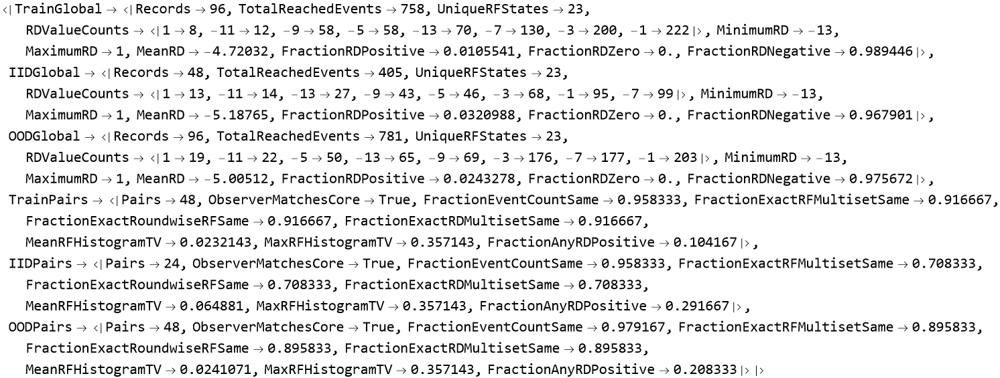

In [832]:
(* ============================================================ *)
(* S101C-RF-DIAG                                                *)
(* Exact rf / rd diagnostic                                     *)
(* Observer only                                                *)
(* NO training / NO scheduler / NO benchmark modification       *)
(* ============================================================ *)

ClearAll[
  TCCTRFFeatureTraceS101,
  TCCTRFRecordS101,
  TCCTRFRunSplitS101,
  TCCTRFRoundSignatureS101,
  TCCTRFHistogramTVS101,
  TCCTRFPairAuditS101,
  TCCTRFPairAuditSummaryS101,
  TCCTRFSplitSummaryS101
];


(* ============================================================ *)
(* 1. FULL OBSERVER OF HISTORICAL rf -> rd COMPUTATION          *)
(* ============================================================ *)

TCCTRFFeatureTraceS101[c_List] := Module[
  {
    p,
    pa,
    id,
    od,
    q,
    n,
    pin,
    pout,
    cin,
    cout,

    h,
    z,
    h2,
    nz,

    j,
    k,
    aps,
    ap,
    pz,
    o,
    zv,
    rf,
    rd,
    dd,
    pg,
    allow,

    active,
    rej = {},
    rounds = 0,
    terminatedNaturally = False,
    safetyCap,

    events = {}
  },


  p =
    TCCTPackS101[c];

  pa = p[[1]];
  id = p[[2]];
  od = p[[3]];
  q = p[[4]];
  n = p[[7]];

  pin = p[[8]];
  pout = p[[9]];
  cin = p[[10]];
  cout = p[[11]];


  safetyCap =
    Max[
      64,
      2 n + 8
    ];


  h =
    ConstantArray[
      0,
      n
    ];

  z =
    ConstantArray[
      0,
      n
    ];

  h[[q]] = 1;


  For[
    k = 1,
    k <= safetyCap,
    k++,

    rounds = k;

    h2 =
      ConstantArray[
        0,
        n
      ];

    nz =
      ConstantArray[
        0,
        n
      ];

    active = 0;


    Do[

      aps =
        Select[
          pa[[j]],
          Function[
            u,
            u > 0 &&
            h[[u]] == 1
          ]
        ];

      ap =
        Length[
          aps
        ];


      If[
        ap > 0,

        pz =
          Max[
            z[[aps]]
          ];

        o =
          Boole[
            ap > 1
          ];


        zv =
          {
            0, 1, 2, 1,
            3, 1, 3, 1
          }[[1 + 2 pz + o]];


        nz[[j]] = zv;


        rf =
          {
            1,

            Boole[
              zv > 0
            ],

            zv,

            Sign[
              pin[[j]] -
              id[[j]]
            ],

            Sign[
              pout[[j]] -
              id[[j]]
            ],

            Sign[
              cin[[j]] -
              id[[j]]
            ],

            Sign[
              cout[[j]] -
              od[[j]]
            ],

            Sign[
              id[[j]] -
              od[[j]]
            ],

            Sign[
              pout[[j]] -
              cin[[j]]
            ]
          };


        rd =
          tcctRwS101 . rf;


        dd =
          1 -
          cin[[j]] +
          2 cout[[j]];


        pg =
          od[[j]] +
          2 Boole[
            zv > 0
          ] -
          zv;


        allow =
          If[
            rd > 0,
            dd > 0,
            pg > 0
          ];


        AppendTo[
          events,

          <|

            "Round" ->
              k,

            "PackedNode" ->
              j,

            "AP" ->
              ap,

            "PZ" ->
              pz,

            "O" ->
              o,

            "ZV" ->
              zv,

            "RF" ->
              rf,

            "RD" ->
              rd,

            "DD" ->
              dd,

            "PG" ->
              pg,

            "RDPositive" ->
              Boole[
                rd > 0
              ],

            "DDNonPositive" ->
              Boole[
                dd <= 0
              ],

            "RejectEligible" ->
              Boole[
                rd > 0 &&
                dd <= 0
              ],

            "Allowed" ->
              Boole[
                TrueQ[
                  allow
                ]
              ]

          |>
        ];


        If[
          rd > 0 &&
          dd <= 0,

          AppendTo[
            rej,
            {
              k,
              j
            }
          ]
        ];


        If[
          TrueQ[
            allow
          ],

          h2[[j]] = 1;
          active++;
        ];

      ],

      {
        j,
        n
      }
    ];


    h = h2;
    z = nz;


    If[
      active == 0,

      terminatedNaturally = True;
      Break[];
    ];

  ];


  <|

    "Events" ->
      events,

    "Rejects" ->
      rej,

    "RoundsExecuted" ->
      rounds,

    "TerminatedNaturally" ->
      terminatedNaturally,

    "SafetyCap" ->
      safetyCap,

    "HitSafetyCap" ->
      And[
        ! TrueQ[
          terminatedNaturally
        ],

        SameQ[
          rounds,
          safetyCap
        ]
      ]

  |>
];


(* ============================================================ *)
(* 2. ROUND-WISE RF SIGNATURE                                   *)
(* ============================================================ *)

TCCTRFRoundSignatureS101[
  events_List
] := Module[
  {
    rounds
  },

  If[
    events === {},
    Return[
      <||>
    ]
  ];


  rounds =
    Sort@
      DeleteDuplicates[
        Lookup[
          events,
          "Round"
        ]
      ];


  Association@Table[

    r ->
      Sort[
        Lookup[
          Select[
            events,
            #["Round"] === r &
          ],
          "RF"
        ]
      ],

    {
      r,
      rounds
    }
  ]
];


(* ============================================================ *)
(* 3. RF HISTOGRAM TOTAL-VARIATION DISTANCE                     *)
(*                                                              *)
(* 0 = identical distributions                                 *)
(* 1 = completely disjoint                                     *)
(* ============================================================ *)

TCCTRFHistogramTVS101[
  e1_List,
  e2_List
] := Module[
  {
    s1,
    s2,
    c1,
    c2,
    keys,
    n1,
    n2,
    p,
    q
  },


  s1 =
    (
      ToString[
        InputForm[#]
      ] &
    ) /@
      Lookup[
        e1,
        "RF",
        {}
      ];


  s2 =
    (
      ToString[
        InputForm[#]
      ] &
    ) /@
      Lookup[
        e2,
        "RF",
        {}
      ];


  c1 =
    Counts[
      s1
    ];

  c2 =
    Counts[
      s2
    ];


  keys =
    Union[
      Keys[
        c1
      ],
      Keys[
        c2
      ]
    ];


  n1 =
    Total[
      Values[
        c1
      ]
    ];

  n2 =
    Total[
      Values[
        c2
      ]
    ];


  If[
    n1 == 0 &&
    n2 == 0,
    Return[
      0.
    ]
  ];


  If[
    n1 == 0 ||
    n2 == 0,
    Return[
      1.
    ]
  ];


  p =
    N[
      Lookup[
        c1,
        keys,
        0
      ] /
      n1
    ];


  q =
    N[
      Lookup[
        c2,
        keys,
        0
      ] /
      n2
    ];


  N[
    0.5
    Total[
      Abs[
        p - q
      ]
    ]
  ]
];


(* ============================================================ *)
(* 4. ONE RECORD                                                *)
(* ============================================================ *)

TCCTRFRecordS101[
  r_Association
] := Module[
  {
    built,
    trace,
    original,
    events,
    rdValues,
    rfValues
  },


  built =
    TCCTBuildCaseS101[
      r
    ];


  trace =
    TCCTRFFeatureTraceS101[
      built[
        "Case"
      ]
    ];


  original =
    TCCTRejectTraceS101[
      built[
        "Case"
      ]
    ];


  events =
    trace[
      "Events"
    ];


  rdValues =
    Lookup[
      events,
      "RD",
      {}
    ];


  rfValues =
    Lookup[
      events,
      "RF",
      {}
    ];


  <|

    "PairID" ->
      r[
        "PairID"
      ],

    "Depth" ->
      r[
        "Depth"
      ],

    "Y" ->
      r[
        "Y"
      ],

    "Events" ->
      events,

    "EventCount" ->
      Length[
        events
      ],

    "UniqueRFCount" ->
      Length[
        DeleteDuplicates[
          rfValues
        ]
      ],

    "MinRD" ->
      If[
        rdValues === {},
        Missing[
          "NoEvents"
        ],
        Min[
          rdValues
        ]
      ],

    "MaxRD" ->
      If[
        rdValues === {},
        Missing[
          "NoEvents"
        ],
        Max[
          rdValues
        ]
      ],

    "MeanRD" ->
      If[
        rdValues === {},
        Missing[
          "NoEvents"
        ],
        N@
          Mean[
            rdValues
          ]
      ],

    "RDValueCounts" ->
      Counts[
        rdValues
      ],

    "RFMultiset" ->
      Sort[
        rfValues
      ],

    "RoundRFSignature" ->
      TCCTRFRoundSignatureS101[
        events
      ],

    "RoundsExecuted" ->
      trace[
        "RoundsExecuted"
      ],

    "ObserverMatchesCore" ->
      And[

        SameQ[
          trace[
            "Rejects"
          ],
          original[
            "Rejects"
          ]
        ],

        SameQ[
          trace[
            "RoundsExecuted"
          ],
          original[
            "RoundsExecuted"
          ]
        ],

        SameQ[
          trace[
            "TerminatedNaturally"
          ],
          original[
            "TerminatedNaturally"
          ]
        ]
      ]

  |>
];


(* ============================================================ *)
(* 5. RUN ALL SPLITS                                            *)
(* ============================================================ *)

TCCTRFRunSplitS101[
  records_List
] :=
  TCCTRFRecordS101 /@
    records;


Print[
  "RF diagnostic: TRAIN..."
];

trainRFDiagS101 =
  TCCTRFRunSplitS101[
    trainRecords
  ];


Print[
  "RF diagnostic: IID..."
];

iidRFDiagS101 =
  TCCTRFRunSplitS101[
    iidRecords
  ];


Print[
  "RF diagnostic: OOD..."
];

oodRFDiagS101 =
  TCCTRFRunSplitS101[
    oodRecords
  ];


(* ============================================================ *)
(* 6. MATCHED-PAIR AUDIT                                        *)
(* ============================================================ *)

TCCTRFPairAuditS101[
  rows_List
] := Module[
  {
    groups
  },


  groups =
    Values@
      GroupBy[
        rows,
        #["PairID"] &
      ];


  Table[

    Module[
      {
        pos,
        neg,
        ep,
        en,
        posRD,
        negRD
      },


      pos =
        SelectFirst[
          g,
          #["Y"] === 1 &
        ];


      neg =
        SelectFirst[
          g,
          #["Y"] === 0 &
        ];


      ep =
        pos[
          "Events"
        ];


      en =
        neg[
          "Events"
        ];


      posRD =
        Lookup[
          ep,
          "RD",
          {}
        ];


      negRD =
        Lookup[
          en,
          "RD",
          {}
        ];


      <|

        "PairID" ->
          pos[
            "PairID"
          ],

        "Depth" ->
          pos[
            "Depth"
          ],

        "PositiveEvents" ->
          Length[
            ep
          ],

        "NegativeEvents" ->
          Length[
            en
          ],

        "EventCountSame" ->
          SameQ[
            Length[
              ep
            ],
            Length[
              en
            ]
          ],

        "ExactRFMultisetSame" ->
          SameQ[
            pos[
              "RFMultiset"
            ],
            neg[
              "RFMultiset"
            ]
          ],

        "ExactRoundwiseRFSame" ->
          SameQ[
            pos[
              "RoundRFSignature"
            ],
            neg[
              "RoundRFSignature"
            ]
          ],

        "ExactRDMultisetSame" ->
          SameQ[
            Sort[
              posRD
            ],
            Sort[
              negRD
            ]
          ],

        "RFHistogramTV" ->
          TCCTRFHistogramTVS101[
            ep,
            en
          ],

        "PositiveMinRD" ->
          pos[
            "MinRD"
          ],

        "PositiveMaxRD" ->
          pos[
            "MaxRD"
          ],

        "NegativeMinRD" ->
          neg[
            "MinRD"
          ],

        "NegativeMaxRD" ->
          neg[
            "MaxRD"
          ],

        "AnyRDPositive" ->
          Or[
            AnyTrue[
              posRD,
              # > 0 &
            ],

            AnyTrue[
              negRD,
              # > 0 &
            ]
          ],

        "ObserverMatchesCore" ->
          And[
            TrueQ[
              pos[
                "ObserverMatchesCore"
              ]
            ],

            TrueQ[
              neg[
                "ObserverMatchesCore"
              ]
            ]
          ]

      |>

    ],

    {
      g,
      groups
    }
  ]
];


trainRFPairAuditS101 =
  TCCTRFPairAuditS101[
    trainRFDiagS101
  ];

iidRFPairAuditS101 =
  TCCTRFPairAuditS101[
    iidRFDiagS101
  ];

oodRFPairAuditS101 =
  TCCTRFPairAuditS101[
    oodRFDiagS101
  ];


(* ============================================================ *)
(* 7. PAIR SUMMARY                                              *)
(* ============================================================ *)

TCCTRFPairAuditSummaryS101[
  rows_List
] := <|

  "Pairs" ->
    Length[
      rows
    ],

  "ObserverMatchesCore" ->
    And @@
      Lookup[
        rows,
        "ObserverMatchesCore"
      ],

  "FractionEventCountSame" ->
    N@
      Mean[
        Boole[
          TrueQ[#]
        ] & /@
          Lookup[
            rows,
            "EventCountSame"
          ]
      ],

  "FractionExactRFMultisetSame" ->
    N@
      Mean[
        Boole[
          TrueQ[#]
        ] & /@
          Lookup[
            rows,
            "ExactRFMultisetSame"
          ]
      ],

  "FractionExactRoundwiseRFSame" ->
    N@
      Mean[
        Boole[
          TrueQ[#]
        ] & /@
          Lookup[
            rows,
            "ExactRoundwiseRFSame"
          ]
      ],

  "FractionExactRDMultisetSame" ->
    N@
      Mean[
        Boole[
          TrueQ[#]
        ] & /@
          Lookup[
            rows,
            "ExactRDMultisetSame"
          ]
      ],

  "MeanRFHistogramTV" ->
    N@
      Mean[
        Lookup[
          rows,
          "RFHistogramTV"
        ]
      ],

  "MaxRFHistogramTV" ->
    Max[
      Lookup[
        rows,
        "RFHistogramTV"
      ]
    ],

  "FractionAnyRDPositive" ->
    N@
      Mean[
        Boole[
          TrueQ[#]
        ] & /@
          Lookup[
            rows,
            "AnyRDPositive"
          ]
      ]

|>;


(* ============================================================ *)
(* 8. GLOBAL SPLIT SUMMARY                                      *)
(* ============================================================ *)

TCCTRFSplitSummaryS101[
  rows_List
] := Module[
  {
    events,
    rf,
    rd
  },


  events =
    Flatten[
      Lookup[
        rows,
        "Events"
      ],
      1
    ];


  rf =
    Lookup[
      events,
      "RF",
      {}
    ];


  rd =
    Lookup[
      events,
      "RD",
      {}
    ];


  <|

    "Records" ->
      Length[
        rows
      ],

    "TotalReachedEvents" ->
      Length[
        events
      ],

    "UniqueRFStates" ->
      Length[
        DeleteDuplicates[
          rf
        ]
      ],

    "RDValueCounts" ->
      SortBy[
        Counts[
          rd
        ],
        First
      ],

    "MinimumRD" ->
      If[
        rd === {},
        Missing[
          "NoEvents"
        ],
        Min[
          rd
        ]
      ],

    "MaximumRD" ->
      If[
        rd === {},
        Missing[
          "NoEvents"
        ],
        Max[
          rd
        ]
      ],

    "MeanRD" ->
      If[
        rd === {},
        Missing[
          "NoEvents"
        ],
        N@
          Mean[
            rd
          ]
      ],

    "FractionRDPositive" ->
      If[
        rd === {},
        0.,
        N@
          Mean[
            Boole[
              # > 0
            ] & /@
              rd
          ]
      ],

    "FractionRDZero" ->
      If[
        rd === {},
        0.,
        N@
          Mean[
            Boole[
              # == 0
            ] & /@
              rd
          ]
      ],

    "FractionRDNegative" ->
      If[
        rd === {},
        0.,
        N@
          Mean[
            Boole[
              # < 0
            ] & /@
              rd
          ]
      ]

  |>
];


(* ============================================================ *)
(* 9. FINAL REPORT                                              *)
(* ============================================================ *)

rfDiagnosticSummaryS101 =
  <|

    "TrainGlobal" ->
      TCCTRFSplitSummaryS101[
        trainRFDiagS101
      ],

    "IIDGlobal" ->
      TCCTRFSplitSummaryS101[
        iidRFDiagS101
      ],

    "OODGlobal" ->
      TCCTRFSplitSummaryS101[
        oodRFDiagS101
      ],

    "TrainPairs" ->
      TCCTRFPairAuditSummaryS101[
        trainRFPairAuditS101
      ],

    "IIDPairs" ->
      TCCTRFPairAuditSummaryS101[
        iidRFPairAuditS101
      ],

    "OODPairs" ->
      TCCTRFPairAuditSummaryS101[
        oodRFPairAuditS101
      ]

  |>;


rfDiagnosticSummaryS101

<|TrainGlobal -> <|Records -> 96, TotalReachedEvents -> 758, UniqueRFStates -> 23, 
 
>     RDValueCounts -> 
 
>      <|-13 -> 70, -11 -> 12, -9 -> 58, -7 -> 130, -5 -> 58, -3 -> 200, -1 -> 222, 
 
>       1 -> 8|>, MinimumRD -> -13, MaximumRD -> 1, MeanRD -> -4.72032, 
 
>     RDPositiveCount -> 8, RDZeroCount -> 0, RDNegativeCount -> 750, 
 
>     FractionRDPositive -> 0.0105541, FractionRDZero -> 0., 
 
>     FractionRDNegative -> 0.989446, DDNonPositiveCount -> 278, 
 
>     RejectEligibleCount -> 0, FractionRejectEligible -> 0., 
 
>     DDValuesWhenRDPositive -> <|2 -> 8|>|>, 
 
>   IIDGlobal -> <|Records -> 48, TotalReachedEvents -> 405, UniqueRFStates -> 23, 
 
>     RDValueCounts -> 
 
>      <|-13 -> 27, -11 -> 14, -9 -> 43, -7 -> 99, -5 -> 46, -3 -> 68, -1 -> 95, 
 
>       1 -> 13|>, MinimumRD -> -13, MaximumRD -> 1, MeanRD -> -5.18765, 
 
>     RDPositiveCount -> 13, RDZeroCount -> 0, RDNegativeCount -> 392, 
 
>     FractionRDPositive -> 0.0320988, FractionRDZero -> 0., 
 
>     FractionRDNegative -> 0.967901, DDNonPositiveCount -> 100, 
 
>     RejectEligibleCount -> 0, FractionRejectEligible -> 0., 
 
>     DDValuesWhenRDPositive -> <|2 -> 13|>|>, 
 
>   OODGlobal -> <|Records -> 96, TotalReachedEvents -> 781, UniqueRFStates -> 23, 
 
>     RDValueCounts -> 
 
>      <|-13 -> 65, -11 -> 22, -9 -> 69, -7 -> 177, -5 -> 50, -3 -> 176, -1 -> 203, 
 
>       1 -> 19|>, MinimumRD -> -13, MaximumRD -> 1, MeanRD -> -5.00512, 
 
>     RDPositiveCount -> 19, RDZeroCount -> 0, RDNegativeCount -> 762, 
 
>     FractionRDPositive -> 0.0243278, FractionRDZero -> 0., 
 
>     FractionRDNegative -> 0.975672, DDNonPositiveCount -> 238, 
 
>     RejectEligibleCount -> 0, FractionRejectEligible -> 0., 
 
>     DDValuesWhenRDPositive -> <|2 -> 19|>|>, 
 
>   TrainPairs -> 
 
>    <|Pairs -> 48, ObserverMatchesCore -> True, FractionEventCountSame -> 0.958333, 
 
>     FractionExactRFMultisetSame -> 0.916667, FractionExactRoundwiseRFSame -> 0.916667, 
 
>     FractionExactRDMultisetSame -> 0.916667, MeanRFHistogramTV -> 0.0232143, 
 
>     MaxRFHistogramTV -> 0.357143, FractionAnyRDPositive -> 0.104167|>, 
 
>   IIDPairs -> <|Pairs -> 24, ObserverMatchesCore -> True, 
 
>     FractionEventCountSame -> 0.958333, FractionExactRFMultisetSame -> 0.708333, 
 
>     FractionExactRoundwiseRFSame -> 0.708333, FractionExactRDMultisetSame -> 0.708333, 
 
>     MeanRFHistogramTV -> 0.064881, MaxRFHistogramTV -> 0.357143, 
 
>     FractionAnyRDPositive -> 0.291667|>, 
 
>   OODPairs -> <|Pairs -> 48, ObserverMatchesCore -> True, 
 
>     FractionEventCountSame -> 0.979167, FractionExactRFMultisetSame -> 0.895833, 
 
>     FractionExactRoundwiseRFSame -> 0.895833, FractionExactRDMultisetSame -> 0.895833, 
 
>     MeanRFHistogramTV -> 0.0241071, MaxRFHistogramTV -> 0.357143, 
 
>     FractionAnyRDPositive -> 0.208333|>|>
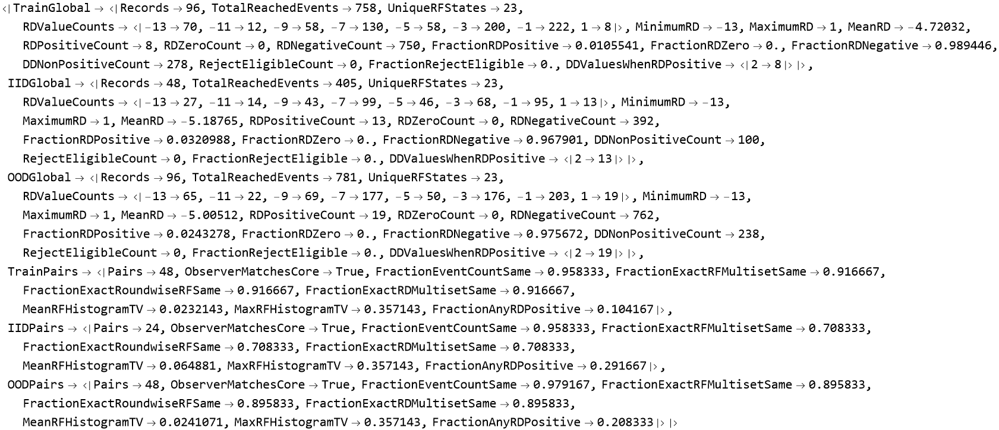

In [892]:
(* ============================================================ *)
(* PATCH: corrected RF split summary                            *)
(* No recomputation of TCCT traces needed                       *)
(* ============================================================ *)

ClearAll[TCCTRFSplitSummaryS101];

TCCTRFSplitSummaryS101[
  rows_List
] := Module[
  {
    events,
    rf,
    rd,
    dd,
    eligible
  },

  events =
    Flatten[
      Lookup[
        rows,
        "Events"
      ],
      1
    ];

  rf =
    Lookup[
      events,
      "RF",
      {}
    ];

  rd =
    Lookup[
      events,
      "RD",
      {}
    ];

  dd =
    Lookup[
      events,
      "DD",
      {}
    ];

  eligible =
    Lookup[
      events,
      "RejectEligible",
      {}
    ];


  <|

    "Records" ->
      Length[rows],

    "TotalReachedEvents" ->
      Length[events],

    "UniqueRFStates" ->
      Length[
        DeleteDuplicates[rf]
      ],

    (* FIXED HERE *)
    "RDValueCounts" ->
      KeySort[
        Counts[rd]
      ],

    "MinimumRD" ->
      If[
        rd === {},
        Missing["NoEvents"],
        Min[rd]
      ],

    "MaximumRD" ->
      If[
        rd === {},
        Missing["NoEvents"],
        Max[rd]
      ],

    "MeanRD" ->
      If[
        rd === {},
        Missing["NoEvents"],
        N@Mean[rd]
      ],

    "RDPositiveCount" ->
      Count[
        rd,
        _?(# > 0 &)
      ],

    "RDZeroCount" ->
      Count[
        rd,
        0
      ],

    "RDNegativeCount" ->
      Count[
        rd,
        _?(# < 0 &)
      ],

    "FractionRDPositive" ->
      If[
        rd === {},
        0.,
        N@Mean[
          Boole[# > 0] & /@ rd
        ]
      ],

    "FractionRDZero" ->
      If[
        rd === {},
        0.,
        N@Mean[
          Boole[# == 0] & /@ rd
        ]
      ],

    "FractionRDNegative" ->
      If[
        rd === {},
        0.,
        N@Mean[
          Boole[# < 0] & /@ rd
        ]
      ],

    "DDNonPositiveCount" ->
      Count[
        dd,
        _?(# <= 0 &)
      ],

    "RejectEligibleCount" ->
      Total[eligible],

    "FractionRejectEligible" ->
      If[
        eligible === {},
        0.,
        N@Mean[eligible]
      ],

    (* What DD values occur specifically when RD > 0? *)
    "DDValuesWhenRDPositive" ->
      If[
        Length[events] == 0,
        <||>,
        KeySort@
          Counts[
            Lookup[
              Select[
                events,
                #["RD"] > 0 &
              ],
              "DD",
              {}
            ]
          ]
      ]

  |>
];


(* ============================================================ *)
(* Rebuild summary ONLY                                         *)
(* ============================================================ *)

rfDiagnosticSummaryS101Fixed =
  <|

    "TrainGlobal" ->
      TCCTRFSplitSummaryS101[
        trainRFDiagS101
      ],

    "IIDGlobal" ->
      TCCTRFSplitSummaryS101[
        iidRFDiagS101
      ],

    "OODGlobal" ->
      TCCTRFSplitSummaryS101[
        oodRFDiagS101
      ],

    "TrainPairs" ->
      TCCTRFPairAuditSummaryS101[
        trainRFPairAuditS101
      ],

    "IIDPairs" ->
      TCCTRFPairAuditSummaryS101[
        iidRFPairAuditS101
      ],

    "OODPairs" ->
      TCCTRFPairAuditSummaryS101[
        oodRFPairAuditS101
      ]

  |>;

rfDiagnosticSummaryS101Fixed

In [907]:
allRFEventsS101 =
  Flatten[
    Lookup[
      Join[
        trainRFDiagS101,
        iidRFDiagS101,
        oodRFDiagS101
      ],
      "Events"
    ],
    1
  ];


rfStateTableS101 =
  SortBy[
    Values@
      GroupBy[
        allRFEventsS101,

        ToString[
          InputForm[#["RF"]]
        ] &,

        Function[
          group,

          <|

            "RF" ->
              First[group]["RF"],

            "RD" ->
              First[group]["RD"],

            "Count" ->
              Length[group],

            "DDValues" ->
              Sort@
                DeleteDuplicates[
                  Lookup[
                    group,
                    "DD"
                  ]
                ],

            "PGValues" ->
              Sort@
                DeleteDuplicates[
                  Lookup[
                    group,
                    "PG"
                  ]
                ],

            "RoundsObserved" ->
              Sort@
                DeleteDuplicates[
                  Lookup[
                    group,
                    "Round"
                  ]
                ]

          |>
        ]
      ],

    #["RD"] &
  ];

Dataset[rfStateTableS101]

Dataset[{<|RF -> {1, 0, 0, 0, 0, 1, 0, -1, -1}, RD -> -13, Count -> 48, DDValues -> {3}, 
 
>     PGValues -> {2}, RoundsObserved -> {3}|>, 
 
>    <|RF -> {1, 1, 2, 1, 0, 1, 0, -1, -1}, RD -> -13, Count -> 114, DDValues -> {3}, 
 
>     PGValues -> {2}, RoundsObserved -> {3, 6, 9}|>, 
 
>    <|RF -> {1, 0, 0, 0, 0, 0, 1, 0, 0}, RD -> -11, Count -> 48, DDValues -> {4}, 
 
>     PGValues -> {1}, RoundsObserved -> {2}|>, 
 
>    <|RF -> {1, 0, 0, 0, 0, 0, 0, 0, 0}, RD -> -9, Count -> 30, DDValues -> {2}, 
 
>     PGValues -> {1}, RoundsObserved -> {2}|>, 
 
>    <|RF -> {1, 0, 0, 0, 0, 1, 1, 0, -1}, RD -> -9, Count -> 30, DDValues -> {3}, 
 
>     PGValues -> {1}, RoundsObserved -> {3}|>, 
 
>    <|RF -> {1, 1, 2, 1, 0, 1, 1, 0, -1}, RD -> -9, Count -> 110, DDValues -> {3}, 
 
>     PGValues -> {1}, RoundsObserved -> {3, 6, 9}|>, 
 
>    <|RF -> {1, 0, 0, -1, 0, 0, 0, 0, 0}, RD -> -7, Count -> 108, DDValues -> {2, 3}, 
 
>     PGValues -> {1, 2}, RoundsObserved -> {1, 4}|>, 
 
>    <|RF -> {1, 0, 0, 1, 1, 1, 1, 0, 0}, RD -> -7, Count -> 28, DDValues -> {3}, 
 
>     PGValues -> {1}, RoundsObserved -> {5}|>, 
 
>    <|RF -> {1, 1, 2, 0, 0, 0, 0, 0, 0}, RD -> -7, Count -> 16, DDValues -> {3}, 
 
>     PGValues -> {2}, RoundsObserved -> {7}|>, 
 
>    <|RF -> {1, 1, 3, -1, 0, 0, 0, 0, 0}, RD -> -7, Count -> 110, DDValues -> {3}, 
 
>     PGValues -> {1}, RoundsObserved -> {4, 7, 10}|>, 
 
>    <|RF -> {1, 1, 3, 1, 1, 1, 1, 0, 0}, RD -> -7, Count -> 144, DDValues -> {3}, 
 
>     PGValues -> {0}, RoundsObserved -> {5, 8, 11}|>, 
 
>    <|RF -> {1, 0, 0, 1, 1, 1, 0, 0, 0}, RD -> -5, Count -> 32, DDValues -> {1}, 
 
>     PGValues -> {1}, RoundsObserved -> {5}|>, 
 
>    <|RF -> {1, 1, 1, 0, 0, 0, 0, 0, 0}, RD -> -5, Count -> 14, DDValues -> {3}, 
 
>     PGValues -> {3}, RoundsObserved -> {6}|>, 
 
>    <|RF -> {1, 1, 3, 1, 1, 1, 0, 0, 0}, RD -> -5, Count -> 108, DDValues -> {1}, 
 
>     PGValues -> {0}, RoundsObserved -> {5, 8, 11}|>, 
 
>    <|RF -> {1, 0, 0, 0, 1, 1, 0, 0, -1}, RD -> -3, Count -> 96, DDValues -> {0}, 
 
>     PGValues -> {1}, RoundsObserved -> {4}|>, 
 
>    <|RF -> {1, 1, 1, 0, 0, -1, 1, 1, 1}, RD -> -3, Count -> 92, DDValues -> {4}, 
 
>     PGValues -> {2}, RoundsObserved -> {2}|>, 
 
>    <|RF -> {1, 1, 2, 1, 1, 1, 0, 0, -1}, RD -> -3, Count -> 28, DDValues -> {0}, 
 
>     PGValues -> {1}, RoundsObserved -> {7}|>, 
 
>    <|RF -> {1, 1, 3, 0, 1, 1, 0, 0, -1}, RD -> -3, Count -> 228, DDValues -> {0}, 
 
>     PGValues -> {0}, RoundsObserved -> {4, 7, 10}|>, 
 
>    <|RF -> {1, 0, 0, -1, 1, 1, 0, 0, 0}, RD -> -1, Count -> 412, DDValues -> {0, 1}, 
 
>     PGValues -> {1}, RoundsObserved -> {1}|>, 
 
>    <|RF -> {1, 1, 1, -1, 0, -1, 1, 1, 1}, RD -> -1, Count -> 22, DDValues -> {4}, 
 
>     PGValues -> {2}, RoundsObserved -> {5, 8}|>, 
 
>    <|RF -> {1, 1, 1, 0, 0, -1, 0, 1, 1}, RD -> -1, Count -> 70, DDValues -> {2}, 
 
>     PGValues -> {2}, RoundsObserved -> {2}|>, 
 
>    <|RF -> {1, 1, 1, 0, 0, 0, 1, 1, 0}, RD -> -1, Count -> 16, DDValues -> {3}, 
 
>     PGValues -> {2}, RoundsObserved -> {6}|>, 
 
>    <|RF -> {1, 1, 1, -1, 0, -1, 0, 1, 1}, RD -> 1, Count -> 40, DDValues -> {2}, 
 
>     PGValues -> {2}, RoundsObserved -> {5, 8}|>}, 
 
>   TypeSystem`Vector[TypeSystem`Struct[{RF, RD, Count, DDValues, PGValues, 
 
>      RoundsObserved}, {TypeSystem`Vector[TypeSystem`Atom[Integer], 9], 
 
>      TypeSystem`Atom[Integer], TypeSystem`Atom[Integer], 
 
>      TypeSystem`Vector[TypeSystem`Atom[Integer], TypeSystem`AnyLength], 
 
>      TypeSystem`Vector[TypeSystem`Atom[Integer], TypeSystem`AnyLength], 
 
>      TypeSystem`Vector[TypeSystem`Atom[Integer], TypeSystem`AnyLength]}], 23], <||>]

Benchmark hash = 44a024643e864e1b8f3cbace63af348ad2fa8a7fd69d287958ecbd535709\
 
>    d1b4
Observer matches historical core = True
Representation alignment = <|Train -> True, IID -> True, OOD -> True|>
Training RF states = 23
RF feature vocabulary incl. UNK = 24
RF trace vector dimension = 168
<|TrainUnknownFraction -> 0., IIDUnknownFraction -> 0., 
 
>   OODUnknownFraction -> 0.|>
Running Static control...
Running RFTraceOnly...
Running StaticPlusRFTrace...


<|Stage -> S101C_RFTrace_PostHocReadoutAudit, PostHocReadoutAudit -> True, 
 
>   ArchitectureClaimAllowedFromThisAuditAlone -> False, 
 
>   BenchmarkHash -> 44a024643e864e1b8f3cbace63af348ad2fa8a7fd69d287958ecbd535709d1b4, 
 
>   BenchmarkUnchanged -> True, SchedulerUsed -> False, StepEvolutionUsed -> False, 
 
>   ReferenceExecutorUsed -> False, TCCTCoreRetrained -> False, 
 
>   OnlyLinearProbeTrained -> True, RFTemporalBins -> 6, 
 
>   RFVocabularySource -> TRAIN_ONLY_LABEL_BLIND, RFVocabularySizeIncludingUNK -> 24, 
 
>   RFTraceDimension -> 168, RidgeLambda -> 1., 
 
>   ProtocolHash -> 55afa7e944e8c6d2d3148ce3889dde0481f0d2ed911cbd1399e631e056f09258, 
 
>   UnknownRFAudit -> 
 
>    <|TrainUnknownFraction -> 0., IIDUnknownFraction -> 0., OODUnknownFraction -> 0.|>, 
 
>   StaticControl -> 
 
>    <|Representation -> Static, Dimension -> 257, Lambda -> 1., TrainBA -> 0.6875, 
 
>     TrainPairAccuracy -> 0.75, TrainPerDepthPair -> 
 
>      <|6 -> 0.5625, 8 -> 0.8125, 10 -> 0.875|>, IID_BA -> 0.479167, 
 
>     IID_PairAccuracy -> 0.416667, 
 
>     IID_PerDepthBA -> <|6 -> 0.4375, 8 -> 0.4375, 10 -> 0.5625|>, 
 
>     IID_PerDepthPair -> <|6 -> 0.375, 8 -> 0.375, 10 -> 0.5|>, OOD_BA -> 0.479167, 
 
>     OOD_PairAccuracy -> 0.416667, OOD_PerDepthBA -> <|12 -> 0.458333, 14 -> 0.5|>, 
 
>     OOD_PerDepthPair -> <|12 -> 0.375, 14 -> 0.458333|>|>, 
 
>   RFTraceOnly -> 
 
>    <|Representation -> RFTraceOnly, Dimension -> 168, Lambda -> 1., TrainBA -> 0.5, 
 
>     TrainPairAccuracy -> 0.5, TrainPerDepthPair -> <|6 -> 0.5, 8 -> 0.5, 10 -> 0.5|>, 
 
>     IID_BA -> 0.520833, IID_PairAccuracy -> 0.5625, 
 
>     IID_PerDepthBA -> <|6 -> 0.5, 8 -> 0.5, 10 -> 0.5625|>, 
 
>     IID_PerDepthPair -> <|6 -> 0.5, 8 -> 0.625, 10 -> 0.5625|>, OOD_BA -> 0.510417, 
 
>     OOD_PairAccuracy -> 0.489583, OOD_PerDepthBA -> <|12 -> 0.5, 14 -> 0.520833|>, 
 
>     OOD_PerDepthPair -> <|12 -> 0.458333, 14 -> 0.520833|>|>, 
 
>   StaticPlusRFTrace -> 
 
>    <|Representation -> StaticPlusRFTrace, Dimension -> 425, Lambda -> 1., 
 
>     TrainBA -> 0.6875, TrainPairAccuracy -> 0.75, 
 
>     TrainPerDepthPair -> <|6 -> 0.5625, 8 -> 0.8125, 10 -> 0.875|>, 
 
>     IID_BA -> 0.479167, IID_PairAccuracy -> 0.416667, 
 
>     IID_PerDepthBA -> <|6 -> 0.4375, 8 -> 0.4375, 10 -> 0.5625|>, 
 
>     IID_PerDepthPair -> <|6 -> 0.375, 8 -> 0.375, 10 -> 0.5|>, OOD_BA -> 0.46875, 
 
>     OOD_PairAccuracy -> 0.4375, OOD_PerDepthBA -> <|12 -> 0.479167, 14 -> 0.458333|>, 
 
>     OOD_PerDepthPair -> <|12 -> 0.416667, 14 -> 0.458333|>|>, 
 
>   IncrementVsStatic -> 
 
>    <|TrainPairDelta_RFOnly -> -0.25, IIDPairDelta_RFOnly -> 0.145833, 
 
>     OODPairDelta_RFOnly -> 0.0729167, TrainPairDelta_Combined -> 0., 
 
>     IIDPairDelta_Combined -> 0., OODPairDelta_Combined -> 0.0208333|>|>
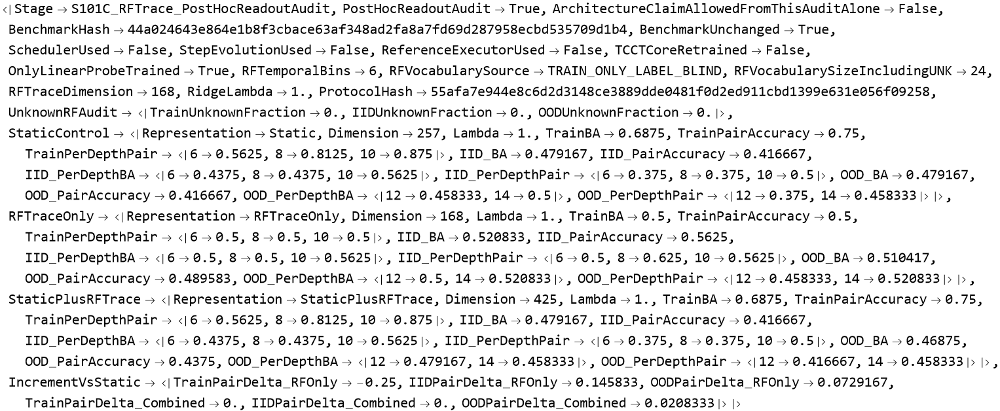

In [914]:
(* ============================================================ *)
(* S101C-RF-PROBE                                               *)
(* Post-hoc diagnostic readout audit                            *)
(*                                                              *)
(* Frozen representation protocol:                              *)
(*   1. Global normalized RF histogram                          *)
(*   2. 6-bin normalized temporal RF histogram                  *)
(*                                                              *)
(* RF vocabulary is constructed from TRAIN traces only.         *)
(* Unseen RF states -> one fixed UNK bin.                        *)
(*                                                              *)
(* NO scheduler                                                 *)
(* NO StepEvolution                                             *)
(* NO reference executor                                        *)
(* NO TCCT-core training                                        *)
(* Fixed ridge lambda = 1.0                                     *)
(* ============================================================ *)

ClearAll[
  TCCTRFS101Key,
  TCCTRFOneHotProbeS101,
  TCCTRFTraceVectorProbeS101,
  TCCTRFUnknownFractionS101,
  TCCTMakeProbeDataS101,
  TCCTRunLockedProbeS101
];


(* ============================================================ *)
(* 0. INTEGRITY CHECKS                                          *)
(* ============================================================ *)

currentBenchmarkHashRFProbeS101 =
  Hash[
    {
      trainRecords,
      iidRecords,
      oodRecords
    },
    "SHA256",
    "HexString"
  ];

Print[
  "Benchmark hash = ",
  currentBenchmarkHashRFProbeS101
];

If[
  currentBenchmarkHashRFProbeS101 =!=
    expectedBenchmarkHashS101,

  Print[
    "STOP: benchmark changed."
  ];

  Abort[];
];


observerIntegrityRFProbeS101 =
  And @@
    Lookup[
      Join[
        trainRFDiagS101,
        iidRFDiagS101,
        oodRFDiagS101
      ],
      "ObserverMatchesCore"
    ];

Print[
  "Observer matches historical core = ",
  observerIntegrityRFProbeS101
];

If[
  ! TrueQ[
    observerIntegrityRFProbeS101
  ],

  Print[
    "STOP: RF observer/core mismatch."
  ];

  Abort[];
];


(* ============================================================ *)
(* 1. CHECK ALIGNMENT WITH PREVIOUS STATIC REPRESENTATION       *)
(* ============================================================ *)

trainAlignmentRFProbeS101 =
  And @@
    MapThread[
      And[
        #1["PairID"] === #2["PairID"],
        #1["Y"] === #2["Y"],
        #1["Depth"] === #2["Depth"]
      ] &,
      {
        trainRFDiagS101,
        tcctTrainRepS101
      }
    ];

iidAlignmentRFProbeS101 =
  And @@
    MapThread[
      And[
        #1["PairID"] === #2["PairID"],
        #1["Y"] === #2["Y"],
        #1["Depth"] === #2["Depth"]
      ] &,
      {
        iidRFDiagS101,
        tcctIIDRepS101
      }
    ];

oodAlignmentRFProbeS101 =
  And @@
    MapThread[
      And[
        #1["PairID"] === #2["PairID"],
        #1["Y"] === #2["Y"],
        #1["Depth"] === #2["Depth"]
      ] &,
      {
        oodRFDiagS101,
        tcctOODRepS101
      }
    ];


Print[
  "Representation alignment = ",
  <|
    "Train" -> trainAlignmentRFProbeS101,
    "IID" -> iidAlignmentRFProbeS101,
    "OOD" -> oodAlignmentRFProbeS101
  |>
];


If[
  ! And[
    trainAlignmentRFProbeS101,
    iidAlignmentRFProbeS101,
    oodAlignmentRFProbeS101
  ],

  Print[
    "STOP: RF/static representation rows are misaligned."
  ];

  Abort[];
];


(* ============================================================ *)
(* 2. LOCKED PROTOCOL                                           *)
(* ============================================================ *)

rfTemporalBinsProbeS101 = 6;
rfProbeLambdaS101 = 1.0;


TCCTRFS101Key[rf_] :=
  ToString[
    InputForm[
      rf
    ]
  ];


(* ------------------------------------------------------------ *)
(* RF vocabulary from TRAIN only                                *)
(* No labels used                                               *)
(* ------------------------------------------------------------ *)

trainRFStatesForVocabularyS101 =
  Flatten[
    Lookup[
      trainRFDiagS101,
      "RFMultiset"
    ],
    1
  ];


rfVocabularyProbeS101 =
  Sort@
    DeleteDuplicates[
      TCCTRFS101Key /@
        trainRFStatesForVocabularyS101
    ];


rfVocabularyWithUNKProbeS101 =
  Join[
    rfVocabularyProbeS101,
    {
      "__UNK__"
    }
  ];


rfIndexProbeS101 =
  AssociationThread[
    rfVocabularyWithUNKProbeS101,
    Range[
      Length[
        rfVocabularyWithUNKProbeS101
      ]
    ]
  ];


rfVocabSizeProbeS101 =
  Length[
    rfVocabularyWithUNKProbeS101
  ];


Print[
  "Training RF states = ",
  Length[
    rfVocabularyProbeS101
  ]
];

Print[
  "RF feature vocabulary incl. UNK = ",
  rfVocabSizeProbeS101
];


(* ============================================================ *)
(* 3. ONE-HOT RF STATE                                          *)
(* ============================================================ *)

TCCTRFOneHotProbeS101[rf_] := Module[
  {
    key,
    idx
  },

  key =
    TCCTRFS101Key[
      rf
    ];

  idx =
    Lookup[
      rfIndexProbeS101,
      key,
      rfIndexProbeS101[
        "__UNK__"
      ]
    ];

  N@
    Normal@
      SparseArray[
        {
          idx -> 1.
        },
        rfVocabSizeProbeS101
      ]
];


(* ============================================================ *)
(* 4. LOCKED RF TRACE REPRESENTATION                            *)
(*                                                              *)
(* Part A: global RF histogram                                  *)
(* Part B: 6-bin temporal RF histogram                          *)
(*                                                              *)
(* Both normalized by TOTAL reached-event count.                *)
(* No RD/DD/PG hand-crafted values are appended.                *)
(* ============================================================ *)

TCCTRFTraceVectorProbeS101[
  row_Association
] := Module[
  {
    events,
    n,
    rounds,
    global,
    temporal,
    event,
    bin,
    rfvec
  },

  events =
    row[
      "Events"
    ];

  n =
    Length[
      events
    ];

  rounds =
    Max[
      1,
      row[
        "RoundsExecuted"
      ]
    ];


  global =
    ConstantArray[
      0.,
      rfVocabSizeProbeS101
    ];


  temporal =
    ConstantArray[
      0.,
      {
        rfTemporalBinsProbeS101,
        rfVocabSizeProbeS101
      }
    ];


  Do[

    rfvec =
      TCCTRFOneHotProbeS101[
        event[
          "RF"
        ]
      ];


    global =
      global +
      rfvec;


    bin =
      Min[
        rfTemporalBinsProbeS101,

        Max[
          1,

          Ceiling[
            rfTemporalBinsProbeS101 *
            event[
              "Round"
            ] /
            rounds
          ]
        ]
      ];


    temporal[[bin]] =
      temporal[[bin]] +
      rfvec,

    {
      event,
      events
    }
  ];


  If[
    n > 0,

    global =
      N[
        global / n
      ];

    temporal =
      N[
        temporal / n
      ];
  ];


  Join[
    global,
    Flatten[
      temporal
    ]
  ]
];


rfTraceDimensionProbeS101 =
  Length[
    TCCTRFTraceVectorProbeS101[
      First[
        trainRFDiagS101
      ]
    ]
  ];


Print[
  "RF trace vector dimension = ",
  rfTraceDimensionProbeS101
];


(* ============================================================ *)
(* 5. UNSEEN-RF DIAGNOSTIC                                      *)
(* ============================================================ *)

TCCTRFUnknownFractionS101[
  rows_List
] := Module[
  {
    events,
    keys,
    unknown
  },

  events =
    Flatten[
      Lookup[
        rows,
        "Events"
      ],
      1
    ];

  If[
    events === {},
    Return[
      0.
    ]
  ];


  keys =
    TCCTRFS101Key /@
      Lookup[
        events,
        "RF"
      ];


  unknown =
    Count[
      keys,
      k_ /;
        ! KeyExistsQ[
          rfIndexProbeS101,
          k
        ]
    ];


  N[
    unknown /
    Length[
      keys
    ]
  ]
];


rfUnknownAuditProbeS101 =
  <|

    "TrainUnknownFraction" ->
      TCCTRFUnknownFractionS101[
        trainRFDiagS101
      ],

    "IIDUnknownFraction" ->
      TCCTRFUnknownFractionS101[
        iidRFDiagS101
      ],

    "OODUnknownFraction" ->
      TCCTRFUnknownFractionS101[
        oodRFDiagS101
      ]

  |>;


Print[
  rfUnknownAuditProbeS101
];


(* ============================================================ *)
(* 6. MAKE PROBE DATA                                           *)
(* ============================================================ *)

TCCTMakeProbeDataS101[
  rfRows_List,
  staticRows_List,
  mode_String
] := Table[

  Module[
    {
      rfvec,
      staticvec,
      feature
    },

    rfvec =
      TCCTRFTraceVectorProbeS101[
        rfRows[[i]]
      ];


    staticvec =
      staticRows[[i]][
        "Static"
      ];


    feature =
      Switch[
        mode,

        "Static",
          staticvec,

        "RFTraceOnly",
          rfvec,

        "StaticPlusRFTrace",
          Join[
            staticvec,
            rfvec
          ],

        _,
          Print[
            "STOP: unknown representation mode ",
            mode
          ];
          Abort[]
      ];


    {
      N[
        feature
      ],

      rfRows[[i]][
        "Y"
      ],

      rfRows[[i]][
        "PairID"
      ],

      rfRows[[i]][
        "Depth"
      ]
    }

  ],

  {
    i,
    Length[
      rfRows
    ]
  }
];


(* ============================================================ *)
(* 7. RUN FIXED RIDGE PROBE                                     *)
(* ============================================================ *)

TCCTRunLockedProbeS101[
  mode_String
] := Module[
  {
    tr,
    ii,
    oo,
    model
  },


  tr =
    TCCTMakeProbeDataS101[
      trainRFDiagS101,
      tcctTrainRepS101,
      mode
    ];


  ii =
    TCCTMakeProbeDataS101[
      iidRFDiagS101,
      tcctIIDRepS101,
      mode
    ];


  oo =
    TCCTMakeProbeDataS101[
      oodRFDiagS101,
      tcctOODRepS101,
      mode
    ];


  model =
    TCCTFitRidgeS101[
      tr,
      rfProbeLambdaS101
    ];


  <|

    "Representation" ->
      mode,

    "Dimension" ->
      Length[
        First[
          tr
        ][[1]]
      ],

    "Lambda" ->
      rfProbeLambdaS101,

    "TrainBA" ->
      TCCTBAS101[
        model,
        tr
      ],

    "TrainPairAccuracy" ->
      TCCTPairAccuracyS101[
        model,
        tr
      ],

    "TrainPerDepthPair" ->
      TCCTPerDepthPairS101[
        model,
        tr
      ],

    "IID_BA" ->
      TCCTBAS101[
        model,
        ii
      ],

    "IID_PairAccuracy" ->
      TCCTPairAccuracyS101[
        model,
        ii
      ],

    "IID_PerDepthBA" ->
      TCCTPerDepthBAS101[
        model,
        ii
      ],

    "IID_PerDepthPair" ->
      TCCTPerDepthPairS101[
        model,
        ii
      ],

    "OOD_BA" ->
      TCCTBAS101[
        model,
        oo
      ],

    "OOD_PairAccuracy" ->
      TCCTPairAccuracyS101[
        model,
        oo
      ],

    "OOD_PerDepthBA" ->
      TCCTPerDepthBAS101[
        model,
        oo
      ],

    "OOD_PerDepthPair" ->
      TCCTPerDepthPairS101[
        model,
        oo
      ]

  |>
];


(* ============================================================ *)
(* 8. RUN THE THREE LOCKED CONDITIONS                           *)
(* ============================================================ *)

Print[
  "Running Static control..."
];

rfProbeStaticResultS101 =
  TCCTRunLockedProbeS101[
    "Static"
  ];


Print[
  "Running RFTraceOnly..."
];

rfProbeTraceOnlyResultS101 =
  TCCTRunLockedProbeS101[
    "RFTraceOnly"
  ];


Print[
  "Running StaticPlusRFTrace..."
];

rfProbeCombinedResultS101 =
  TCCTRunLockedProbeS101[
    "StaticPlusRFTrace"
  ];


(* ============================================================ *)
(* 9. PROTOCOL HASH                                             *)
(* ============================================================ *)

rfProbeProtocolHashS101 =
  Hash[
    {
      rfTemporalBinsProbeS101,
      rfProbeLambdaS101,
      rfVocabularyProbeS101,
      DownValues[
        TCCTRFTraceVectorProbeS101
      ],
      DownValues[
        TCCTRunLockedProbeS101
      ]
    },
    "SHA256",
    "HexString"
  ];


(* ============================================================ *)
(* 10. FINAL REPORT                                             *)
(* ============================================================ *)

rfProbeFinalS101 =
  <|

    "Stage" ->
      "S101C_RFTrace_PostHocReadoutAudit",

    "PostHocReadoutAudit" ->
      True,

    "ArchitectureClaimAllowedFromThisAuditAlone" ->
      False,

    "BenchmarkHash" ->
      currentBenchmarkHashRFProbeS101,

    "BenchmarkUnchanged" ->
      SameQ[
        currentBenchmarkHashRFProbeS101,
        expectedBenchmarkHashS101
      ],

    "SchedulerUsed" ->
      False,

    "StepEvolutionUsed" ->
      False,

    "ReferenceExecutorUsed" ->
      False,

    "TCCTCoreRetrained" ->
      False,

    "OnlyLinearProbeTrained" ->
      True,

    "RFTemporalBins" ->
      rfTemporalBinsProbeS101,

    "RFVocabularySource" ->
      "TRAIN_ONLY_LABEL_BLIND",

    "RFVocabularySizeIncludingUNK" ->
      rfVocabSizeProbeS101,

    "RFTraceDimension" ->
      rfTraceDimensionProbeS101,

    "RidgeLambda" ->
      rfProbeLambdaS101,

    "ProtocolHash" ->
      rfProbeProtocolHashS101,

    "UnknownRFAudit" ->
      rfUnknownAuditProbeS101,

    "StaticControl" ->
      rfProbeStaticResultS101,

    "RFTraceOnly" ->
      rfProbeTraceOnlyResultS101,

    "StaticPlusRFTrace" ->
      rfProbeCombinedResultS101,

    "IncrementVsStatic" ->
      <|

        "TrainPairDelta_RFOnly" ->
          N[
            rfProbeTraceOnlyResultS101[
              "TrainPairAccuracy"
            ] -
            rfProbeStaticResultS101[
              "TrainPairAccuracy"
            ]
          ],

        "IIDPairDelta_RFOnly" ->
          N[
            rfProbeTraceOnlyResultS101[
              "IID_PairAccuracy"
            ] -
            rfProbeStaticResultS101[
              "IID_PairAccuracy"
            ]
          ],

        "OODPairDelta_RFOnly" ->
          N[
            rfProbeTraceOnlyResultS101[
              "OOD_PairAccuracy"
            ] -
            rfProbeStaticResultS101[
              "OOD_PairAccuracy"
            ]
          ],

        "TrainPairDelta_Combined" ->
          N[
            rfProbeCombinedResultS101[
              "TrainPairAccuracy"
            ] -
            rfProbeStaticResultS101[
              "TrainPairAccuracy"
            ]
          ],

        "IIDPairDelta_Combined" ->
          N[
            rfProbeCombinedResultS101[
              "IID_PairAccuracy"
            ] -
            rfProbeStaticResultS101[
              "IID_PairAccuracy"
            ]
          ],

        "OODPairDelta_Combined" ->
          N[
            rfProbeCombinedResultS101[
              "OOD_PairAccuracy"
            ] -
            rfProbeStaticResultS101[
              "OOD_PairAccuracy"
            ]
          ]

      |>

  |>;


rfProbeFinalS101

Benchmark hash = 44a024643e864e1b8f3cbace63af348ad2fa8a7fd69d287958ecbd535709\
 
>    d1b4
Primitive input fields = <|Seq -> True, Start -> True, Target -> True|>
All record keys = {Depth, PairID, Seq, Start, Target, Y}


<|Stage -> S101D_S95_InterfaceLegalityAudit, AuditOnly -> True, 
 
>   PerformanceEvaluated -> False, TrainingPerformed -> False, TCCTExecuted -> False, 
 
>   ReferenceExecutorExecuted -> False, S3ProductComputed -> False, 
 
>   BenchmarkHash -> 44a024643e864e1b8f3cbace63af348ad2fa8a7fd69d287958ecbd535709d1b4, 
 
>   BenchmarkUnchanged -> True, S101PrimitiveInputFields -> {Seq, Start, Target}, 
 
>   PrimitiveFieldPresence -> <|Seq -> True, Start -> True, Target -> True|>, 
 
>   EvaluationOnlyFields -> {Y, PairID, Depth}, 
 
>   RecordKeyUnion -> {Depth, PairID, Seq, Start, Target, Y}, 
 
>   HistoricalS95SemanticSlots -> 
 
>    {DecisionSource, SafeSource, AlternativeSource, CorrectDestination, 
 
>     WrongDestination, DummyDestination}, 
 
>   HistoricalS95Dependencies -> 
 
>    <|DecisionSource -> {HistoricalCase.x[[6]], answer}, 
 
>     SafeSource -> {HistoricalCase.x[[6]], answer, m+1}, 
 
>     AlternativeSource -> {HistoricalCase.x[[6]], answer, m+2}, 
 
>     CorrectDestination -> {HistoricalCase.x[[5]], answer}, 
 
>     WrongDestination -> {HistoricalCase.x[[5]], answer, next-branch relation}, 
 
>     DummyDestination -> {HistoricalCase.x[[6]], answer, m+3}|>, 
 
>   HistoricalS95PairContract -> 
 
>    <|WorldA -> Continue, WorldB -> Stop, SameScenarioRequired -> True, 
 
>     SameAnswerRequired -> True, DifferenceRepresentation -> 
 
>      SlotRaw12(Continue)-SlotRaw12(Stop), FrozenRepresentation -> SlotRaw12, 
 
>     FrozenReadoutFamily -> Centroid|>, 
 
>   ExplicitHistoricalFieldsPresent -> 
 
>    <|Answer -> False, Continue -> False, Stop -> False, DecisionSource -> False, 
 
>     SafeSource -> False, AlternativeSource -> False, CorrectDestination -> False, 
 
>     WrongDestination -> False, DummyDestination -> False|>, 
 
>   PrimitiveRoleAvailability -> 
 
>    <|DecisionSource -> 
 
>      <|ProvidedByS101 -> False, PossiblePrimitiveAnalogue -> Start/query root only, 
 
>       ExactS95MeaningPreserved -> False|>, 
 
>     SafeSource -> 
 
>      <|ProvidedByS101 -> False, PossiblePrimitiveAnalogue -> None, 
 
>       ExactS95MeaningPreserved -> False|>, 
 
>     AlternativeSource -> 
 
>      <|ProvidedByS101 -> False, PossiblePrimitiveAnalogue -> None, 
 
>       ExactS95MeaningPreserved -> False|>, 
 
>     CorrectDestination -> 
 
>      <|ProvidedByS101 -> False, PossiblePrimitiveAnalogue -> Target query marker, 
 
>       ExactS95MeaningPreserved -> False, 
 
>       Reason -> 
 
>        S101 Target is query-provided target state; historical S95 CorrectDestination\
 
>         is a specific case/answer-derived semantic slot.|>, 
 
>     WrongDestination -> 
 
>      <|ProvidedByS101 -> False, PossiblePrimitiveAnalogue -> None, 
 
>       ExactS95MeaningPreserved -> False|>, 
 
>     DummyDestination -> 
 
>      <|ProvidedByS101 -> False, PossiblePrimitiveAnalogue -> None, 
 
>       ExactS95MeaningPreserved -> False|>|>, 
 
>   S101PairSummary -> 
 
>    <|Pairs -> 120, AllPairsHaveTwoRecords -> True, FractionSameSeq -> 0., 
 
>     FractionSameStart -> 1., FractionSameTarget -> 1., FractionOppositeLabels -> 1., 
 
>     FractionSamePrimitiveInput -> 0.|>, ExactFrozenS95InvocationPossible -> False, 
 
>   AllHistoricalRolesAlreadyPrimitive -> False, 
 
>   PairSemanticsMatchHistoricalS95 -> False, FairFormatOnlyAdapterPossible -> False, 
 
>   IllegalRepairRoutes -> 
 
>    <|UseYAsAnswer -> 
 
>      <|WouldEnableConstruction -> True, Legal -> False, 
 
>       Reason -> Direct label leakage|>, 
 
>     ExecuteSeqToFindCorrectDestination -> 
 
>      <|WouldEnableConstruction -> True, Legal -> False, 
 
>       Reason -> Adapter would compute the task solution before TCCT sees it|>, 
 
>     UseReferenceExecutor -> 
 
>      <|WouldEnableConstruction -> True, Legal -> False, 
 
>       Reason -> Reference executor is a dataset-validity oracle, not model input|>, 
 
>     InventSixS95SemanticSlots -> 
 
>      <|WouldEnableConstruction -> True, Legal -> False, 
 
>       Reason -> 
 
>
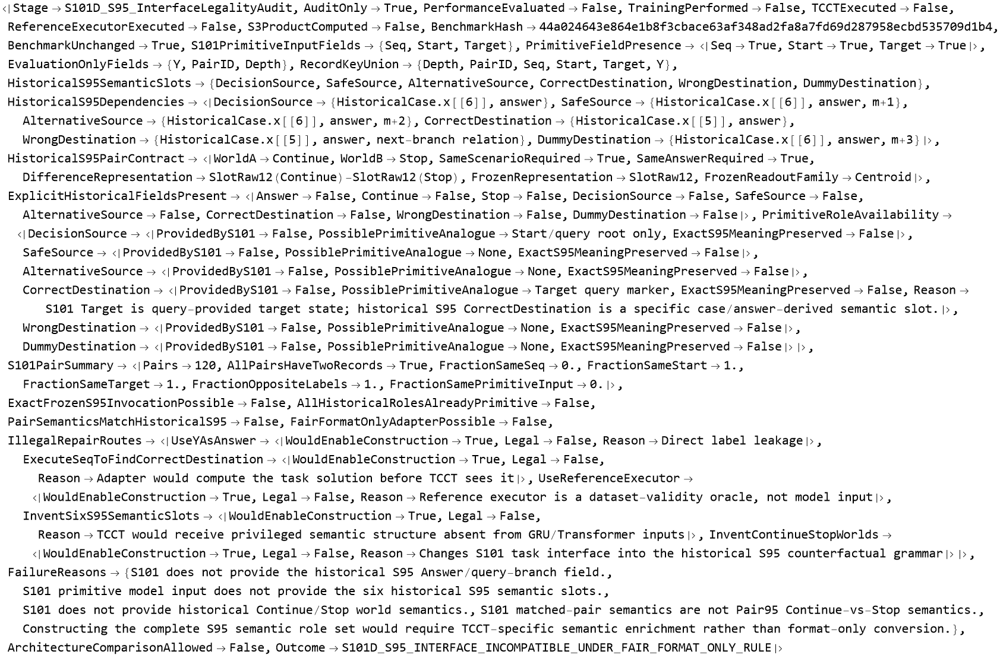

In [1018]:
(* ============================================================ *)
(* S101D                                                        *)
(* Frozen S95 Interface Legality Audit                          *)
(*                                                              *)
(* PURPOSE:                                                     *)
(* Determine whether the frozen S95 interface can be attached   *)
(* to S101 using ONLY format-level, label-blind transformations *)
(* of the same primitive information available to baselines.    *)
(*                                                              *)
(* NO accuracy                                                  *)
(* NO model training                                            *)
(* NO TCCT propagation                                          *)
(* NO reference executor                                        *)
(* NO S3 product computation                                    *)
(* ============================================================ *)

ClearAll[
  S101DRecordKeys,
  S101DPairGroups,
  S101DPairAudit,
  S101DFieldPresentQ,
  S101DPrimitiveSignature,
  S101DPairSummary
];


(* ============================================================ *)
(* 0. BENCHMARK LOCK                                            *)
(* ============================================================ *)

expectedBenchmarkHashS101D =
  "44a024643e864e1b8f3cbace63af348ad2fa8a7fd69d287958ecbd535709d1b4";


benchmarkHashS101D =
  Hash[
    {
      trainRecords,
      iidRecords,
      oodRecords
    },
    "SHA256",
    "HexString"
  ];


Print[
  "Benchmark hash = ",
  benchmarkHashS101D
];


If[
  benchmarkHashS101D =!= expectedBenchmarkHashS101D,

  Print[
    "STOP: benchmark changed."
  ];

  Abort[];
];


allRecordsS101D =
  Join[
    trainRecords,
    iidRecords,
    oodRecords
  ];


(* ============================================================ *)
(* 1. S101 INFORMATION CONTRACT                                 *)
(*                                                              *)
(* These are the primitive task inputs that were supplied to    *)
(* GRU / Transformer.                                           *)
(*                                                              *)
(* Y / PairID / Depth are evaluation metadata, NOT model input. *)
(* ============================================================ *)

s101PrimitiveInputFields =
  {
    "Seq",
    "Start",
    "Target"
  };


s101EvaluationOnlyFields =
  {
    "Y",
    "PairID",
    "Depth"
  };


S101DFieldPresentQ[field_String] :=
  And @@
    (
      KeyExistsQ[
        #,
        field
      ] &
      /@
        allRecordsS101D
    );


primitiveFieldPresenceS101D =
  AssociationMap[
    S101DFieldPresentQ,
    s101PrimitiveInputFields
  ];


evaluationFieldPresenceS101D =
  AssociationMap[
    S101DFieldPresentQ,
    s101EvaluationOnlyFields
  ];


recordKeyUnionS101D =
  Sort@
    DeleteDuplicates@
      Flatten[
        Keys /@
          allRecordsS101D
      ];


Print[
  "Primitive input fields = ",
  primitiveFieldPresenceS101D
];


Print[
  "All record keys = ",
  recordKeyUnionS101D
];


(* ============================================================ *)
(* 2. EXACT HISTORICAL S95 SEMANTIC CONTRACT                    *)
(*                                                              *)
(* From historical NodeRole94H / SemanticSlot94H:               *)
(*                                                              *)
(* m       = x[[6, answer]]                                     *)
(* correct = x[[5, answer]]                                     *)
(* wrong   = x[[5, 1 + Mod[answer,n]]]                          *)
(* dummy   = m + 3                                              *)
(*                                                              *)
(* Slots:                                                       *)
(* DecisionSource                                               *)
(* SafeSource                                                   *)
(* AlternativeSource                                            *)
(* CorrectDestination                                           *)
(* WrongDestination                                             *)
(* DummyDestination                                             *)
(* ============================================================ *)

s95SemanticSlotsS101D =
  {
    "DecisionSource",
    "SafeSource",
    "AlternativeSource",
    "CorrectDestination",
    "WrongDestination",
    "DummyDestination"
  };


s95HistoricalDependenciesS101D =
  <|

    "DecisionSource" ->
      {
        "HistoricalCase.x[[6]]",
        "answer"
      },

    "SafeSource" ->
      {
        "HistoricalCase.x[[6]]",
        "answer",
        "m+1"
      },

    "AlternativeSource" ->
      {
        "HistoricalCase.x[[6]]",
        "answer",
        "m+2"
      },

    "CorrectDestination" ->
      {
        "HistoricalCase.x[[5]]",
        "answer"
      },

    "WrongDestination" ->
      {
        "HistoricalCase.x[[5]]",
        "answer",
        "next-branch relation"
      },

    "DummyDestination" ->
      {
        "HistoricalCase.x[[6]]",
        "answer",
        "m+3"
      }

  |>;


(* ============================================================ *)
(* 3. HISTORICAL S95 PAIR CONTRACT                              *)
(*                                                              *)
(* Frozen S95 does NOT classify one world directly.             *)
(*                                                              *)
(* It constructs:                                               *)
(*                                                              *)
(*   ContinueWorld                                              *)
(*   StopWorld                                                  *)
(*                                                              *)
(* for the SAME scenario / SAME answer, then computes           *)
(*                                                              *)
(*   Delta = SlotRaw12[Continue] - SlotRaw12[Stop]              *)
(*                                                              *)
(* and applies the frozen centroid/readout.                     *)
(* ============================================================ *)

s95PairContractS101D =
  <|

    "WorldA" ->
      "Continue",

    "WorldB" ->
      "Stop",

    "SameScenarioRequired" ->
      True,

    "SameAnswerRequired" ->
      True,

    "DifferenceRepresentation" ->
      "SlotRaw12(Continue)-SlotRaw12(Stop)",

    "FrozenRepresentation" ->
      "SlotRaw12",

    "FrozenReadoutFamily" ->
      "Centroid"

  |>;


(* ============================================================ *)
(* 4. FORMAT-ONLY OPERATIONS ALLOWED                            *)
(* ============================================================ *)

allowedFormatOnlyOperationsS101D =
  {
    "0-based <-> 1-based index conversion",
    "token/string serialization",
    "node renaming",
    "edge serialization reordering",
    "primitive query-marker copying",
    "shape-preserving packaging"
  };


forbiddenSemanticOperationsS101D =
  {
    "use Y",
    "execute S3 composition",
    "compute final S3 product",
    "call reference executor",
    "derive accepting/correct destination from product",
    "invent Continue/Stop task semantics",
    "invent SafeSource semantic role",
    "invent AlternativeSource semantic role",
    "invent DummyDestination semantic role",
    "provide TCCT-only derived semantic slots"
  };


(* ============================================================ *)
(* 5. CHECK WHETHER S101 EXPLICITLY PROVIDES HISTORICAL S95     *)
(*    SEMANTIC FIELDS                                           *)
(* ============================================================ *)

explicitS95FieldsInS101D =
  AssociationMap[
    MemberQ[
      recordKeyUnionS101D,
      #
    ] &,
    Join[
      {
        "Answer",
        "Continue",
        "Stop"
      },
      s95SemanticSlotsS101D
    ]
  ];


(* ============================================================ *)
(* 6. PRIMITIVE ROLE AVAILABILITY MATRIX                        *)
(*                                                              *)
(* Conservative criterion:                                     *)
(* A historical S95 role counts as format-only available only   *)
(* if its semantic identity is explicitly present in S101       *)
(* primitive model input.                                       *)
(*                                                              *)
(* Merely inventing a new graph node is NOT enough.             *)
(* ============================================================ *)

s101ToS95RoleMatrix =
  <|

    "DecisionSource" ->
      <|
        "ProvidedByS101" -> False,
        "PossiblePrimitiveAnalogue" -> "Start/query root only",
        "ExactS95MeaningPreserved" -> False
      |>,

    "SafeSource" ->
      <|
        "ProvidedByS101" -> False,
        "PossiblePrimitiveAnalogue" -> None,
        "ExactS95MeaningPreserved" -> False
      |>,

    "AlternativeSource" ->
      <|
        "ProvidedByS101" -> False,
        "PossiblePrimitiveAnalogue" -> None,
        "ExactS95MeaningPreserved" -> False
      |>,

    "CorrectDestination" ->
      <|
        "ProvidedByS101" -> False,
        "PossiblePrimitiveAnalogue" -> "Target query marker",
        "ExactS95MeaningPreserved" -> False,
        "Reason" ->
          "S101 Target is query-provided target state; historical S95 CorrectDestination is a specific case/answer-derived semantic slot."
      |>,

    "WrongDestination" ->
      <|
        "ProvidedByS101" -> False,
        "PossiblePrimitiveAnalogue" -> None,
        "ExactS95MeaningPreserved" -> False
      |>,

    "DummyDestination" ->
      <|
        "ProvidedByS101" -> False,
        "PossiblePrimitiveAnalogue" -> None,
        "ExactS95MeaningPreserved" -> False
      |>

  |>;


(* ============================================================ *)
(* 7. S101 MATCHED-PAIR STRUCTURE                               *)
(* ============================================================ *)

S101DPrimitiveSignature[r_Association] :=
  KeyTake[
    r,
    s101PrimitiveInputFields
  ];


S101DPairGroups[records_List] :=
  Values@
    GroupBy[
      records,
      #["PairID"] &
    ];


S101DPairAudit[group_List] := Module[
  {
    a,
    b
  },

  If[
    Length[group] =!= 2,

    Return[
      <|
        "ValidTwoRecordPair" -> False
      |>
    ]
  ];


  a =
    group[[1]];

  b =
    group[[2]];


  <|

    "ValidTwoRecordPair" ->
      True,

    "SameSeq" ->
      SameQ[
        a["Seq"],
        b["Seq"]
      ],

    "SameStart" ->
      SameQ[
        a["Start"],
        b["Start"]
      ],

    "SameTarget" ->
      SameQ[
        a["Target"],
        b["Target"]
      ],

    "OppositeLabels" ->
      UnsameQ[
        a["Y"],
        b["Y"]
      ],

    "SamePrimitiveInput" ->
      SameQ[
        S101DPrimitiveSignature[a],
        S101DPrimitiveSignature[b]
      ]

  |>
];


pairAuditsS101D =
  S101DPairAudit /@
    S101DPairGroups[
      allRecordsS101D
    ];


S101DPairSummary[rows_List] := Module[
  {
    valid
  },

  valid =
    Select[
      rows,
      TrueQ[
        #["ValidTwoRecordPair"]
      ] &
    ];


  <|

    "Pairs" ->
      Length[
        rows
      ],

    "AllPairsHaveTwoRecords" ->
      And @@
        Lookup[
          rows,
          "ValidTwoRecordPair",
          False
        ],

    "FractionSameSeq" ->
      N@
        Mean[
          Boole[
            TrueQ[#]
          ] & /@
            Lookup[
              valid,
              "SameSeq"
            ]
        ],

    "FractionSameStart" ->
      N@
        Mean[
          Boole[
            TrueQ[#]
          ] & /@
            Lookup[
              valid,
              "SameStart"
            ]
        ],

    "FractionSameTarget" ->
      N@
        Mean[
          Boole[
            TrueQ[#]
          ] & /@
            Lookup[
              valid,
              "SameTarget"
            ]
        ],

    "FractionOppositeLabels" ->
      N@
        Mean[
          Boole[
            TrueQ[#]
          ] & /@
            Lookup[
              valid,
              "OppositeLabels"
            ]
        ],

    "FractionSamePrimitiveInput" ->
      N@
        Mean[
          Boole[
            TrueQ[#]
          ] & /@
            Lookup[
              valid,
              "SamePrimitiveInput"
            ]
        ]

  |>
];


pairSummaryS101D =
  S101DPairSummary[
    pairAuditsS101D
  ];


(* ============================================================ *)
(* 8. EXACT FROZEN S95 INVOCATION TEST                          *)
(*                                                              *)
(* Historical SemanticSlot94H requires an explicit "answer"     *)
(* index into the S95 case branch structures.                   *)
(*                                                              *)
(* S101 does not expose that historical case structure.         *)
(* ============================================================ *)

hasHistoricalAnswerFieldS101D =
  TrueQ[
    Lookup[
      explicitS95FieldsInS101D,
      "Answer",
      False
    ]
  ];


hasHistoricalSixSlotsS101D =
  And @@
    Lookup[
      explicitS95FieldsInS101D,
      s95SemanticSlotsS101D,
      False
    ];


hasHistoricalWorldPairS101D =
  And[
    TrueQ[
      Lookup[
        explicitS95FieldsInS101D,
        "Continue",
        False
      ]
    ],

    TrueQ[
      Lookup[
        explicitS95FieldsInS101D,
        "Stop",
        False
      ]
    ]
  ];


exactFrozenS95InvocationPossibleS101D =
  And[
    hasHistoricalAnswerFieldS101D,
    hasHistoricalSixSlotsS101D,
    hasHistoricalWorldPairS101D
  ];


(* ============================================================ *)
(* 9. FAIR FORMAT-ONLY COMPATIBILITY TEST                       *)
(*                                                              *)
(* This is stricter than "can we invent some adapter".          *)
(*                                                              *)
(* We ask whether the SAME primitive information budget used by *)
(* GRU/Transformer already contains enough semantics to supply  *)
(* the frozen S95 interface without model-specific enrichment.  *)
(* ============================================================ *)

allHistoricalRolesPrimitiveS101D =
  And @@
    (
      TrueQ[
        #["ProvidedByS101"]
      ] &
      /@
        Values[
          s101ToS95RoleMatrix
        ]
    );


pairSemanticsMatchS95S101D =
  False;


(* Explanation:
   S95 = same scenario + same answer, Continue vs Stop worlds.

   S101 matched pairs = ordinary task examples under the S3
   composition benchmark; they are NOT primitive Continue/Stop
   interventions required by Pair95.
*)


fairFormatOnlyAdapterPossibleS101D =
  And[
    allHistoricalRolesPrimitiveS101D,
    pairSemanticsMatchS95S101D
  ];


(* ============================================================ *)
(* 10. LEAKAGE ROUTES                                           *)
(* ============================================================ *)

potentialIllegalRepairRoutesS101D =
  <|

    "UseYAsAnswer" ->
      <|
        "WouldEnableConstruction" -> True,
        "Legal" -> False,
        "Reason" -> "Direct label leakage"
      |>,

    "ExecuteSeqToFindCorrectDestination" ->
      <|
        "WouldEnableConstruction" -> True,
        "Legal" -> False,
        "Reason" ->
          "Adapter would compute the task solution before TCCT sees it"
      |>,

    "UseReferenceExecutor" ->
      <|
        "WouldEnableConstruction" -> True,
        "Legal" -> False,
        "Reason" ->
          "Reference executor is a dataset-validity oracle, not model input"
      |>,

    "InventSixS95SemanticSlots" ->
      <|
        "WouldEnableConstruction" -> True,
        "Legal" -> False,
        "Reason" ->
          "TCCT would receive privileged semantic structure absent from GRU/Transformer inputs"
      |>,

    "InventContinueStopWorlds" ->
      <|
        "WouldEnableConstruction" -> True,
        "Legal" -> False,
        "Reason" ->
          "Changes S101 task interface into the historical S95 counterfactual grammar"
      |>

  |>;


(* ============================================================ *)
(* 11. FINAL DECISION                                           *)
(* ============================================================ *)

compatibilityReasonsS101D =
  DeleteCases[
    {

      If[
        ! hasHistoricalAnswerFieldS101D,
        "S101 does not provide the historical S95 Answer/query-branch field.",
        Nothing
      ],

      If[
        ! hasHistoricalSixSlotsS101D,
        "S101 primitive model input does not provide the six historical S95 semantic slots.",
        Nothing
      ],

      If[
        ! hasHistoricalWorldPairS101D,
        "S101 does not provide historical Continue/Stop world semantics.",
        Nothing
      ],

      If[
        ! pairSemanticsMatchS95S101D,
        "S101 matched-pair semantics are not Pair95 Continue-vs-Stop semantics.",
        Nothing
      ],

      If[
        ! allHistoricalRolesPrimitiveS101D,
        "Constructing the complete S95 semantic role set would require TCCT-specific semantic enrichment rather than format-only conversion.",
        Nothing
      ]

    },

    Nothing
  ];


s101DOutcome =
  Which[

    exactFrozenS95InvocationPossibleS101D &&
    fairFormatOnlyAdapterPossibleS101D,

      "S101D_S95_INTERFACE_COMPATIBLE",

    ! fairFormatOnlyAdapterPossibleS101D,

      "S101D_S95_INTERFACE_INCOMPATIBLE_UNDER_FAIR_FORMAT_ONLY_RULE",

    True,

      "S101D_INDETERMINATE"
  ];


s101DReport =
  <|

    "Stage" ->
      "S101D_S95_InterfaceLegalityAudit",

    "AuditOnly" ->
      True,

    "PerformanceEvaluated" ->
      False,

    "TrainingPerformed" ->
      False,

    "TCCTExecuted" ->
      False,

    "ReferenceExecutorExecuted" ->
      False,

    "S3ProductComputed" ->
      False,

    "BenchmarkHash" ->
      benchmarkHashS101D,

    "BenchmarkUnchanged" ->
      SameQ[
        benchmarkHashS101D,
        expectedBenchmarkHashS101D
      ],

    "S101PrimitiveInputFields" ->
      s101PrimitiveInputFields,

    "PrimitiveFieldPresence" ->
      primitiveFieldPresenceS101D,

    "EvaluationOnlyFields" ->
      s101EvaluationOnlyFields,

    "RecordKeyUnion" ->
      recordKeyUnionS101D,

    "HistoricalS95SemanticSlots" ->
      s95SemanticSlotsS101D,

    "HistoricalS95Dependencies" ->
      s95HistoricalDependenciesS101D,

    "HistoricalS95PairContract" ->
      s95PairContractS101D,

    "ExplicitHistoricalFieldsPresent" ->
      explicitS95FieldsInS101D,

    "PrimitiveRoleAvailability" ->
      s101ToS95RoleMatrix,

    "S101PairSummary" ->
      pairSummaryS101D,

    "ExactFrozenS95InvocationPossible" ->
      exactFrozenS95InvocationPossibleS101D,

    "AllHistoricalRolesAlreadyPrimitive" ->
      allHistoricalRolesPrimitiveS101D,

    "PairSemanticsMatchHistoricalS95" ->
      pairSemanticsMatchS95S101D,

    "FairFormatOnlyAdapterPossible" ->
      fairFormatOnlyAdapterPossibleS101D,

    "IllegalRepairRoutes" ->
      potentialIllegalRepairRoutesS101D,

    "FailureReasons" ->
      compatibilityReasonsS101D,

    "ArchitectureComparisonAllowed" ->
      fairFormatOnlyAdapterPossibleS101D,

    "Outcome" ->
      s101DOutcome

  |>;


s101DReport

Dataset[{<|ValidTwoRecordPair -> True, SameSeq -> False, SameStart -> True, 
 
>     SameTarget -> True, OppositeLabels -> True, SamePrimitiveInput -> False|>, 
 
>    <|ValidTwoRecordPair -> True, SameSeq -> False, SameStart -> True, 
 
>     SameTarget -> True, OppositeLabels -> True, SamePrimitiveInput -> False|>, 
 
>    <|ValidTwoRecordPair -> True, SameSeq -> False, SameStart -> True, 
 
>     SameTarget -> True, OppositeLabels -> True, SamePrimitiveInput -> False|>, 
 
>    <|ValidTwoRecordPair -> True, SameSeq -> False, SameStart -> True, 
 
>     SameTarget -> True, OppositeLabels -> True, SamePrimitiveInput -> False|>, 
 
>    <|ValidTwoRecordPair -> True, SameSeq -> False, SameStart -> True, 
 
>     SameTarget -> True, OppositeLabels -> True, SamePrimitiveInput -> False|>, 
 
>    <|ValidTwoRecordPair -> True, SameSeq -> False, SameStart -> True, 
 
>     SameTarget -> True, OppositeLabels -> True, SamePrimitiveInput -> False|>, 
 
>    <|ValidTwoRecordPair -> True, SameSeq -> False, SameStart -> True, 
 
>     SameTarget -> True, OppositeLabels -> True, SamePrimitiveInput -> False|>, 
 
>    <|ValidTwoRecordPair -> True, SameSeq -> False, SameStart -> True, 
 
>     SameTarget -> True, OppositeLabels -> True, SamePrimitiveInput -> False|>, 
 
>    <|ValidTwoRecordPair -> True, SameSeq -> False, SameStart -> True, 
 
>     SameTarget -> True, OppositeLabels -> True, SamePrimitiveInput -> False|>, 
 
>    <|ValidTwoRecordPair -> True, SameSeq -> False, SameStart -> True, 
 
>     SameTarget -> True, OppositeLabels -> True, SamePrimitiveInput -> False|>, 
 
>    <|ValidTwoRecordPair -> True, SameSeq -> False, SameStart -> True, 
 
>     SameTarget -> True, OppositeLabels -> True, SamePrimitiveInput -> False|>, 
 
>    <|ValidTwoRecordPair -> True, SameSeq -> False, SameStart -> True, 
 
>     SameTarget -> True, OppositeLabels -> True, SamePrimitiveInput -> False|>, 
 
>    <|ValidTwoRecordPair -> True, SameSeq -> False, SameStart -> True, 
 
>     SameTarget -> True, OppositeLabels -> True, SamePrimitiveInput -> False|>, 
 
>    <|ValidTwoRecordPair -> True, SameSeq -> False, SameStart -> True, 
 
>     SameTarget -> True, OppositeLabels -> True, SamePrimitiveInput -> False|>, 
 
>    <|ValidTwoRecordPair -> True, SameSeq -> False, SameStart -> True, 
 
>     SameTarget -> True, OppositeLabels -> True, SamePrimitiveInput -> False|>, 
 
>    <|ValidTwoRecordPair -> True, SameSeq -> False, SameStart -> True, 
 
>     SameTarget -> True, OppositeLabels -> True, SamePrimitiveInput -> False|>, 
 
>    <|ValidTwoRecordPair -> True, SameSeq -> False, SameStart -> True, 
 
>     SameTarget -> True, OppositeLabels -> True, SamePrimitiveInput -> False|>, 
 
>    <|ValidTwoRecordPair -> True, SameSeq -> False, SameStart -> True, 
 
>     SameTarget -> True, OppositeLabels -> True, SamePrimitiveInput -> False|>, 
 
>    <|ValidTwoRecordPair -> True, SameSeq -> False, SameStart -> True, 
 
>     SameTarget -> True, OppositeLabels -> True, SamePrimitiveInput -> False|>, 
 
>    <|ValidTwoRecordPair -> True, SameSeq -> False, SameStart -> True, 
 
>     SameTarget -> True, OppositeLabels -> True, SamePrimitiveInput -> False|>}, 
 
>   TypeSystem`Vector[TypeSystem`Struct[{ValidTwoRecordPair, SameSeq, SameStart, 
 
>      SameTarget, OppositeLabels, SamePrimitiveInput}, 
 
>     {TypeSystem`Atom[TypeSystem`Boolean], TypeSystem`Atom[TypeSystem`Boolean], 
 
>      TypeSystem`Atom[TypeSystem`Boolean], TypeSystem`Atom[TypeSystem`Boolean], 
 
>      TypeSystem`Atom[TypeSystem`Boolean], TypeSystem`Atom[TypeSystem`Boolean]}], 20], 
 
>   <||>]
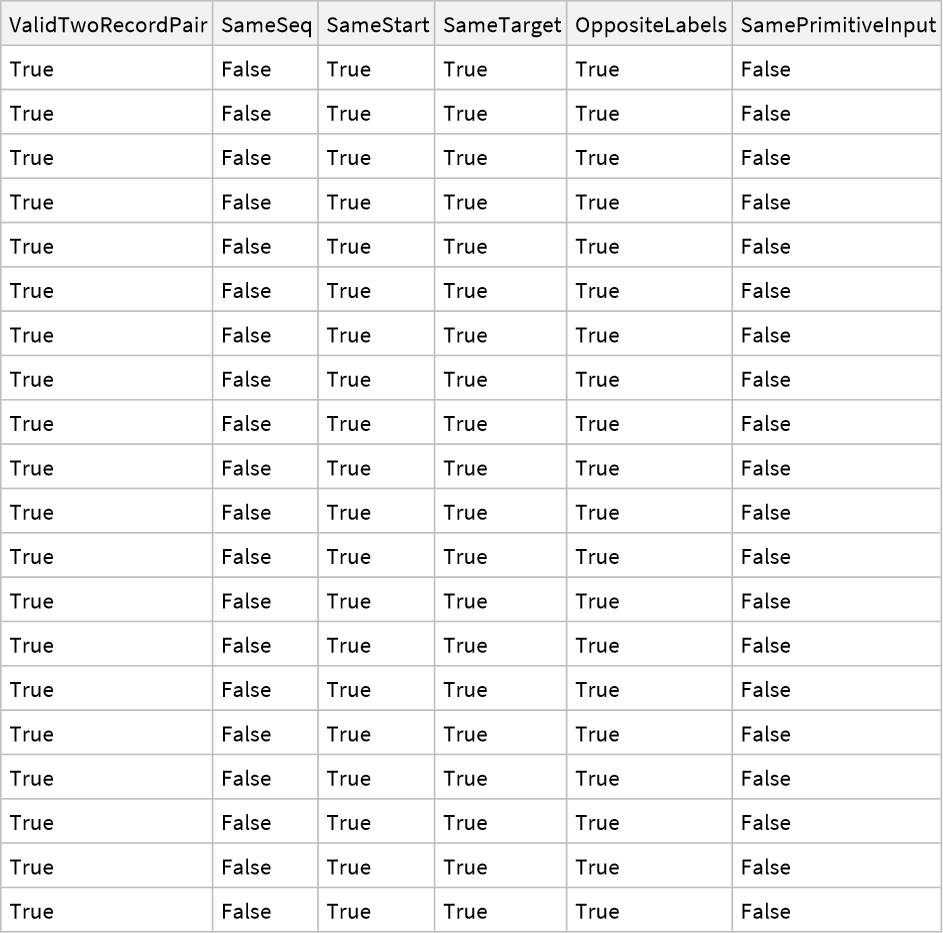

In [1165]:
Dataset[
  Take[
    pairAuditsS101D,
    UpTo[20]
  ]
]

In [1170]:
(* ============================================================ *)
(* S102A DEVELOPMENT                                            *)
(* TCCT generic task-head development                           *)
(*                                                              *)
(* SAME GRU64 HEAD on 3 representations:                        *)
(*   1. Raw                                                     *)
(*   2. StaticGraph                                             *)
(*   3. TCCTGenericQueryState                                   *)
(*                                                              *)
(* TRAIN = trainRecords                                         *)
(* DEV   = iidRecords                                           *)
(*                                                              *)
(* OOD IS NOT REFERENCED                                        *)
(* NO reference executor                                        *)
(* NO S3 product                                                *)
(* NO Y inside representations                                  *)
(* NO S95 semantic slots                                        *)
(* ============================================================ *)

ClearAll[
  S102AContext,
  S102AEncodedAt,
  S102AStaticAt,
  S102APairOneHot,
  S102AQueryHeader,
  S102ARawSequence,
  S102ALocalSequence,
  S102ATCCTSequence,
  S102ARep,
  S102AMetadataInvariantQ,
  S102ABuildData,
  S102AProbability1,
  S102APredict,
  S102ABA,
  S102APairAccuracy,
  S102APerDepthBA,
  S102APerDepthPair,
  S102ARunOne,
  S102ASummarizeMode
];


(* ============================================================ *)
(* 0. PREFLIGHT                                                 *)
(* ============================================================ *)

requiredSymbolsS102A = {
  TCCTBuildCaseS101,
  TCCTPackS101,
  TCCTSigLevelsS101,
  TCCTEncodePairS101
};

If[
  !And @@ (
    Length[DownValues[#]] > 0 & /@
      requiredSymbolsS102A
  ),

  Print[
    "STOP: historical/adapter TCCT definitions are missing."
  ];

  Print[
    "Run the previous S101C cells first."
  ];

  Abort[];
];


If[
  !And[
    ValueQ[trainRecords],
    ValueQ[iidRecords]
  ],

  Print[
    "STOP: trainRecords or iidRecords missing."
  ];

  Abort[];
];


developmentHashS102A =
  Hash[
    {
      trainRecords,
      iidRecords
    },
    "SHA256",
    "HexString"
  ];


Print[
  "S102A development hash = ",
  developmentHashS102A
];


Print[
  "Development split sizes = ",
  <|
    "Train" -> Length[trainRecords],
    "DevIID" -> Length[iidRecords]
  |>
];


(* ============================================================ *)
(* 1. COMMON INPUT DIMENSION                                    *)
(*                                                              *)
(* Every representation is padded structurally to exactly       *)
(* 64 FEATURES PER SEQUENCE STEP.                               *)
(*                                                              *)
(* This makes the GRU task-head parameter count IDENTICAL.      *)
(* ============================================================ *)

s102AInputDim = 64;

s102AHeadHidden = 64;

s102ATrainingRounds = 500;

s102ASeeds = {
  9301,
  9302,
  9303,
  9304,
  9305
};

s102AModes = {
  "Raw",
  "StaticGraph",
  "TCCTGenericQueryState"
};


(* ============================================================ *)
(* 2. TCCT GRAPH CONTEXT                                        *)
(* ============================================================ *)

S102AContext[
  r_Association
] := Module[
  {
    built,
    c,
    pack,
    levels,
    vertices,
    position
  },

  built =
    TCCTBuildCaseS101[
      r
    ];

  c =
    built[
      "Case"
    ];

  pack =
    TCCTPackS101[
      c
    ];

  levels =
    TCCTSigLevelsS101[
      c,
      3
    ];

  vertices =
    pack[[12]];

  position =
    AssociationThread[
      vertices,
      Range[
        Length[vertices]
      ]
    ];

  <|

    "Built" ->
      built,

    "Case" ->
      c,

    "Pack" ->
      pack,

    "Levels" ->
      levels,

    "Vertices" ->
      vertices,

    "Position" ->
      position

  |>
];


(* ============================================================ *)
(* 3. HISTORICAL FROZEN ENCODED STATE AT ONE NODE               *)
(*                                                              *)
(* Uses the same SigLevels + frozen EncodePair path.             *)
(* No label involved.                                           *)
(* ============================================================ *)

S102AEncodedAt[
  ctx_Association,
  node_
] := Module[
  {
    idx,
    levels,
    pair
  },

  idx =
    Lookup[
      ctx["Position"],
      node,
      Missing["NodeNotFound"]
    ];

  If[
    MissingQ[idx],
    Return[{0, 0}]
  ];

  levels =
    ctx[
      "Levels"
    ];

  pair =
    {
      Lookup[
        levels[[3]],
        idx
      ],

      Lookup[
        levels[[4]],
        idx
      ]
    };

  TCCTEncodePairS101[
    pair
  ]
];


(* ============================================================ *)
(* 4. STATIC GRAPH DESCRIPTOR AT ONE NODE                       *)
(*                                                              *)
(* Control condition.                                           *)
(* No TCCT encoding.                                            *)
(*                                                              *)
(* [inDegree,outDegree,parentIn,parentOut,childIn,childOut]      *)
(* transformed with x/(1+x), no learned normalization.          *)
(* ============================================================ *)

S102AStaticAt[
  ctx_Association,
  node_
] := Module[
  {
    idx,
    p,
    vals
  },

  idx =
    Lookup[
      ctx["Position"],
      node,
      Missing["NodeNotFound"]
    ];

  If[
    MissingQ[idx],
    Return[
      ConstantArray[
        0.,
        6
      ]
    ]
  ];

  p =
    ctx[
      "Pack"
    ];

  vals =
    N[
      {
        p[[2, idx]],   (* in degree *)
        p[[3, idx]],   (* out degree *)
        p[[8, idx]],   (* parent-in *)
        p[[9, idx]],   (* parent-out *)
        p[[10, idx]],  (* child-in *)
        p[[11, idx]]   (* child-out *)
      }
    ];

  N[
    vals /
      (1. + vals)
  ]
];


(* ============================================================ *)
(* 5. ENCODED PAIR -> 25D ONE HOT                              *)
(* ============================================================ *)

S102APairOneHot[
  pair_List
] := Module[
  {
    a,
    b,
    idx
  },

  If[
    !MatchQ[
      pair,
      {_Integer, _Integer}
    ],
    Return[
      ConstantArray[
        0.,
        25
      ]
    ]
  ];

  {a, b} = pair;

  If[
    !And[
      1 <= a <= 5,
      1 <= b <= 5
    ],

    Return[
      ConstantArray[
        0.,
        25
      ]
    ]
  ];

  idx =
    (a - 1) 5 + b;

  N@
    Normal@
      SparseArray[
        {
          idx -> 1.
        },
        25
      ]
];


(* ============================================================ *)
(* 6. COMMON QUERY HEADER                                       *)
(*                                                              *)
(* dimensions 1..3 = Start                                      *)
(* dimensions 4..6 = Target                                     *)
(* ============================================================ *)

S102AQueryHeader[
  r_Association
] := Module[
  {
    v
  },

  v =
    ConstantArray[
      0.,
      s102AInputDim
    ];

  v[[1 ;; 3]] =
    N@
      UnitVector[
        3,
        r["Start"] + 1
      ];

  v[[4 ;; 6]] =
    N@
      UnitVector[
        3,
        r["Target"] + 1
      ];

  v
];


(* ============================================================ *)
(* 7A. RAW REPRESENTATION                                       *)
(*                                                              *)
(* Header: Start / Target                                       *)
(* Each later step: A/B one-hot                                 *)
(*                                                              *)
(* This is a same-head raw control.                             *)
(* ============================================================ *)

S102ARawSequence[
  r_Association
] := Module[
  {
    header,
    tokenSteps
  },

  header =
    S102AQueryHeader[
      r
    ];

  tokenSteps =
    Table[

      Module[
        {v},

        v =
          ConstantArray[
            0.,
            s102AInputDim
          ];

        v[[7 ;; 8]] =
          N@
            UnitVector[
              2,
              tok + 1
            ];

        v
      ],

      {
        tok,
        r["Seq"]
      }
    ];

  Join[
    {header},
    tokenSteps
  ]
];


(* ============================================================ *)
(* 7B. STATIC-GRAPH REPRESENTATION                              *)
(*                                                              *)
(* Same label-blind graph adapter.                              *)
(* NO frozen TCCT encoder.                                     *)
(*                                                              *)
(* Header contains static descriptors for query anchors.        *)
(* Each token step contains static center + exit descriptors.   *)
(* ============================================================ *)

S102ALocalSequence[
  r_Association
] := Module[
  {
    ctx,
    built,
    header,
    startDesc,
    targetDesc,
    centers,
    exits,
    tokenSteps
  },

  ctx =
    S102AContext[
      r
    ];

  built =
    ctx[
      "Built"
    ];

  header =
    S102AQueryHeader[
      r
    ];

  startDesc =
    S102AStaticAt[
      ctx,
      built["StartAnchor"]
    ];

  targetDesc =
    S102AStaticAt[
      ctx,
      built["TargetAnchor"]
    ];

  header[[7 ;; 18]] =
    Join[
      startDesc,
      targetDesc
    ];

  centers =
    built[
      "TokenCenters"
    ];

  exits =
    built[
      "TokenExits"
    ];

  tokenSteps =
    MapThread[

      Function[
        {center, exit},

        Module[
          {
            v,
            dc,
            de
          },

          v =
            ConstantArray[
              0.,
              s102AInputDim
            ];

          dc =
            S102AStaticAt[
              ctx,
              center
            ];

          de =
            S102AStaticAt[
              ctx,
              exit
            ];

          v[[7 ;; 18]] =
            Join[
              dc,
              de
            ];

          v
        ]
      ],

      {
        centers,
        exits
      }
    ];

  Join[
    {header},
    tokenSteps
  ]
];


(* ============================================================ *)
(* 7C. TCCT GENERIC QUERY-STATE REPRESENTATION                  *)
(*                                                              *)
(* IMPORTANT:                                                   *)
(* This does NOT use the S95 six semantic slots.                *)
(*                                                              *)
(* It reads frozen TCCT structural states at primitive          *)
(* query/token landmarks already defined by the label-blind     *)
(* adapter.                                                     *)
(*                                                              *)
(* Header:                                                      *)
(*  StartAnchor code (25D) + TargetAnchor code (25D)            *)
(*                                                              *)
(* Each program step:                                           *)
(*  TokenCenter code (25D) + TokenExit code (25D)               *)
(* ============================================================ *)

S102ATCCTSequence[
  r_Association
] := Module[
  {
    ctx,
    built,
    header,
    startCode,
    targetCode,
    centers,
    exits,
    tokenSteps
  },

  ctx =
    S102AContext[
      r
    ];

  built =
    ctx[
      "Built"
    ];

  header =
    S102AQueryHeader[
      r
    ];

  startCode =
    S102APairOneHot[
      S102AEncodedAt[
        ctx,
        built["StartAnchor"]
      ]
    ];

  targetCode =
    S102APairOneHot[
      S102AEncodedAt[
        ctx,
        built["TargetAnchor"]
      ]
    ];

  header[[7 ;; 56]] =
    Join[
      startCode,
      targetCode
    ];

  centers =
    built[
      "TokenCenters"
    ];

  exits =
    built[
      "TokenExits"
    ];

  tokenSteps =
    MapThread[

      Function[
        {center, exit},

        Module[
          {
            v,
            centerCode,
            exitCode
          },

          v =
            ConstantArray[
              0.,
              s102AInputDim
            ];

          centerCode =
            S102APairOneHot[
              S102AEncodedAt[
                ctx,
                center
              ]
            ];

          exitCode =
            S102APairOneHot[
              S102AEncodedAt[
                ctx,
                exit
              ]
            ];

          v[[7 ;; 56]] =
            Join[
              centerCode,
              exitCode
            ];

          v
        ]
      ],

      {
        centers,
        exits
      }
    ];

  Join[
    {header},
    tokenSteps
  ]
];


(* ============================================================ *)
(* 8. REPRESENTATION DISPATCH                                   *)
(* ============================================================ *)

S102ARep[
  mode_String,
  r_Association
] :=
  Switch[

    mode,

    "Raw",
      S102ARawSequence[r],

    "StaticGraph",
      S102ALocalSequence[r],

    "TCCTGenericQueryState",
      S102ATCCTSequence[r],

    _,
      Print[
        "STOP: unknown representation mode: ",
        mode
      ];
      Abort[]
  ];


(* ============================================================ *)
(* 9. DIMENSION / LENGTH AUDIT                                  *)
(* ============================================================ *)

developmentRecordsS102A =
  Join[
    trainRecords,
    iidRecords
  ];


dimensionAuditS102A =
  Association@Table[

    mode -> <|

      "AllStepDimensions64" ->

        And @@
          Flatten[
            Table[
              Length[#] == s102AInputDim & /@
                S102ARep[
                  mode,
                  r
                ],
              {
                r,
                developmentRecordsS102A
              }
            ]
          ],

      "SequenceLengthMatchesProgram" ->

        And @@
          Table[
            Length[
              S102ARep[
                mode,
                r
              ]
            ] ==
            1 +
            Length[
              r["Seq"]
            ],

            {
              r,
              developmentRecordsS102A
            }
          ]

    |>,

    {
      mode,
      s102AModes
    }
  ];


Print[
  "Dimension audit = ",
  dimensionAuditS102A
];


(* ============================================================ *)
(* 10. LABEL / METADATA INVARIANCE AUDIT                        *)
(*                                                              *)
(* Flip Y and corrupt PairID/Depth.                             *)
(* Representation MUST remain exactly unchanged.                *)
(* ============================================================ *)

S102AMetadataInvariantQ[
  mode_String
] := And @@
  Table[

    Module[
      {
        altered
      },

      altered =
        r;

      AssociateTo[
        altered,
        "Y" -> 1 - r["Y"],
        "PairID" -> "S102A_METADATA_AUDIT",
        "Depth" -> 999999
      ];

      SameQ[
        S102ARep[
          mode,
          r
        ],

        S102ARep[
          mode,
          altered
        ]
      ]
    ],

    {
      r,
      developmentRecordsS102A
    }
  ];


metadataAuditS102A =
  Association@Table[

    mode ->
      S102AMetadataInvariantQ[
        mode
      ],

    {
      mode,
      s102AModes
    }
  ];


Print[
  "Metadata/label invariance = ",
  metadataAuditS102A
];


If[
  !And @@
    Values[
      metadataAuditS102A
    ],

  Print[
    "STOP: representation depends on Y/PairID/Depth."
  ];

  Abort[];
];


(* ============================================================ *)
(* 11. STATIC FORBIDDEN-SYMBOL AUDIT                            *)
(* ============================================================ *)

representationDefinitionTextS102A =
  ToString[
    InputForm[
      {
        DownValues[
          S102ARawSequence
        ],
        DownValues[
          S102ALocalSequence
        ],
        DownValues[
          S102ATCCTSequence
        ],
        DownValues[
          S102AEncodedAt
        ]
      }
    ]
  ];


forbiddenRepresentationSymbolsS102A =
  {
    "BLTruth",
    "BLExecute",
    "ReferenceExecutor",
    "ProgramOutput",
    "TaskY",
    "CorrectDestination",
    "WrongDestination",
    "Continue",
    "Stop",
    "S3Product"
  };


forbiddenHitsS102A =
  Select[
    forbiddenRepresentationSymbolsS102A,
    StringContainsQ[
      representationDefinitionTextS102A,
      #
    ] &
  ];


Print[
  "Forbidden representation hits = ",
  forbiddenHitsS102A
];


If[
  forbiddenHitsS102A =!= {},

  Print[
    "STOP: forbidden representation dependency detected."
  ];

  Abort[];
];


(* ============================================================ *)
(* 12. PRECOMPUTE REPRESENTATIONS                               *)
(* ============================================================ *)

S102ABuildData[
  mode_String,
  records_List
] := Table[

  {
    S102ARep[
      mode,
      r
    ],

    r["Y"],

    r["PairID"],

    r["Depth"]
  },

  {
    r,
    records
  }
];


Print[
  "Precomputing all S102A development representations..."
];


dataByModeS102A =
  Association@Table[

    mode -> <|

      "Train" ->
        S102ABuildData[
          mode,
          trainRecords
        ],

      "Dev" ->
        S102ABuildData[
          mode,
          iidRecords
        ]

    |>,

    {
      mode,
      s102AModes
    }
  ];


(* ============================================================ *)
(* 13. IDENTICAL TASK HEAD                                      *)
(*                                                              *)
(* Same input dim, same GRU size, same classifier.              *)
(* Only representation changes.                                *)
(* ============================================================ *)

s102ABaseHead =
  NetChain[

    {
      GatedRecurrentLayer[
        s102AHeadHidden
      ],

      SequenceLastLayer[],

      LinearLayer[2],

      SoftmaxLayer[]
    },

    "Input" ->
      {
        "Varying",
        s102AInputDim
      },

    "Output" ->
      NetDecoder[
        {
          "Class",
          {0, 1}
        }
      ]
  ];


(* ============================================================ *)
(* 14. METRICS                                                  *)
(* ============================================================ *)

S102AProbability1[
  net_,
  x_
] := Module[
  {p},

  p =
    net[
      x,
      "Probabilities"
    ];

  N[
    Lookup[
      p,
      1,
      0.
    ]
  ]
];


S102APredict[
  net_,
  x_
] :=
  Boole[
    S102AProbability1[
      net,
      x
    ] >= 0.5
  ];


S102ABA[
  net_,
  data_List
] := N@Mean@Table[

  Mean[
    Boole[
      S102APredict[
        net,
        #[[1]]
      ] === cls
    ] & /@
      Select[
        data,
        #[[2]] === cls &
      ]
  ],

  {
    cls,
    {0, 1}
  }
];


S102APairAccuracy[
  net_,
  data_List
] := Module[
  {
    groups,
    values
  },

  groups =
    Values@
      GroupBy[
        data,
        #[[3]] &
      ];

  values =
    Table[

      Module[
        {
          pos,
          neg,
          sp,
          sn
        },

        pos =
          SelectFirst[
            group,
            #[[2]] === 1 &
          ];

        neg =
          SelectFirst[
            group,
            #[[2]] === 0 &
          ];

        sp =
          S102AProbability1[
            net,
            pos[[1]]
          ];

        sn =
          S102AProbability1[
            net,
            neg[[1]]
          ];

        If[
          sp > sn,
          1.,
          If[
            sp < sn,
            0.,
            0.5
          ]
        ]
      ],

      {
        group,
        groups
      }
    ];

  N@
    Mean[
      values
    ]
];


S102APerDepthBA[
  net_,
  data_List
] :=
  Association@Table[

    d ->
      S102ABA[
        net,

        Select[
          data,
          #[[4]] === d &
        ]
      ],

    {
      d,
      Sort@
        DeleteDuplicates[
          data[[All, 4]]
        ]
    }
  ];


S102APerDepthPair[
  net_,
  data_List
] :=
  Association@Table[

    d ->
      S102APairAccuracy[
        net,

        Select[
          data,
          #[[4]] === d &
        ]
      ],

    {
      d,
      Sort@
        DeleteDuplicates[
          data[[All, 4]]
        ]
    }
  ];


(* ============================================================ *)
(* 15. ONE TRAINING RUN                                         *)
(* ============================================================ *)

S102ARunOne[
  mode_String,
  seed_Integer
] := Module[
  {
    trainData,
    devData,
    rules,
    initialized,
    initHash,
    trained,
    seconds
  },

  Print[
    "Training ",
    mode,
    " | seed ",
    seed,
    " ..."
  ];

  trainData =
    dataByModeS102A[
      mode
    ][
      "Train"
    ];

  devData =
    dataByModeS102A[
      mode
    ][
      "Dev"
    ];

  rules =
    (
      #[[1]] -> #[[2]]
    ) & /@
      trainData;


  initialized =
    NetInitialize[
      s102ABaseHead,
      RandomSeeding -> seed
    ];


  initHash =
    Hash[
      initialized,
      "SHA256",
      "HexString"
    ];


  {seconds, trained} =
    AbsoluteTiming[

      NetTrain[
        initialized,
        rules,

        BatchSize -> 16,

        MaxTrainingRounds ->
          s102ATrainingRounds,

        TargetDevice -> "CPU",

        RandomSeeding -> seed
      ]

    ];


  Print[
    "  done in ",
    N[seconds],
    " sec"
  ];


  <|

    "Mode" ->
      mode,

    "Seed" ->
      seed,

    "InitHash" ->
      initHash,

    "TrainingSeconds" ->
      N[seconds],

    "TrainBA" ->
      S102ABA[
        trained,
        trainData
      ],

    "TrainPairAccuracy" ->
      S102APairAccuracy[
        trained,
        trainData
      ],

    "DevBA" ->
      S102ABA[
        trained,
        devData
      ],

    "DevPairAccuracy" ->
      S102APairAccuracy[
        trained,
        devData
      ],

    "DevPerDepthBA" ->
      S102APerDepthBA[
        trained,
        devData
      ],

    "DevPerDepthPair" ->
      S102APerDepthPair[
        trained,
        devData
      ],

    "Net" ->
      trained

  |>
];


(* ============================================================ *)
(* 16. RUN 3 REPRESENTATIONS x 5 MATCHED SEEDS                  *)
(* ============================================================ *)

runsS102A =
  Flatten[

    Table[
      S102ARunOne[
        mode,
        seed
      ],

      {
        mode,
        s102AModes
      },

      {
        seed,
        s102ASeeds
      }
    ],

    1
  ];


rowsS102A =
  KeyDrop[
    #,
    {"Net"}
  ] & /@
    runsS102A;


Dataset[
  rowsS102A
]

S102A development hash = 2ba43cdcee0056a19a07bfe8c812f6b265965d69a4c3f182f7f1\
 
>    f9cc9d72e981
Development split sizes = <|Train -> 96, DevIID -> 48|>
Dimension audit = <|Raw -> 
 
>     <|AllStepDimensions64 -> True, SequenceLengthMatchesProgram -> True|>, 
 
>    StaticGraph -> 
 
>     <|AllStepDimensions64 -> True, SequenceLengthMatchesProgram -> True|>, 
 
>    TCCTGenericQueryState -> 
 
>     <|AllStepDimensions64 -> True, SequenceLengthMatchesProgram -> True|>|>


AssociateTo::argrx: AssociateTo called with 4 arguments; 2 arguments are expected.

AssociateTo::argrx: AssociateTo called with 4 arguments; 2 arguments are expected.

AssociateTo::argrx: AssociateTo called with 4 arguments; 2 arguments are expected.

General::stop: Further output of AssociateTo::argrx will be suppressed during this calculation.

Metadata/label invariance = <|Raw -> True, StaticGraph -> True, 
 
>    TCCTGenericQueryState -> True|>
Forbidden representation hits = {}
Precomputing all S102A development representations...
Training Raw | seed 9301 ...
  done in 17.6649 sec
Training Raw | seed 9302 ...
  done in 16.7241 sec
Training Raw | seed 9303 ...
  done in 16.9871 sec
Training Raw | seed 9304 ...
  done in 16.3765 sec
Training Raw | seed 9305 ...
  done in 17.1562 sec
Training StaticGraph | seed 9301 ...
  done in 16.3147 sec
Training StaticGraph | seed 9302 ...
  done in 15.8693 sec
Training StaticGraph | seed 9303 ...
  done in 16.0812 sec
Training StaticGraph | seed 9304 ...
  done in 15.1947 sec
Training StaticGraph | seed 9305 ...
  done in 14.879 sec
Training TCCTGenericQueryState | seed 9301 ...
  done in 15.0813 sec
Training TCCTGenericQueryState | seed 9302 ...
  done in 14.9929 sec
Training TCCTGenericQueryState | seed 9303 ...
  done in 14.9896 sec
Training TCCTGenericQueryState | seed 9304 ...
  do

Dataset[{<|Mode -> Raw, Seed -> 9301, 
 
>     InitHash -> a96ca1568e062c5e598211fbb07e3d67395803f103773b65940ae6ea01e9c67a, 
 
>     TrainingSeconds -> 17.6649, TrainBA -> 1., TrainPairAccuracy -> 1., 
 
>     DevBA -> 0.625, DevPairAccuracy -> 0.625, 
 
>     DevPerDepthBA -> <|6 -> 0.75, 8 -> 0.5625, 10 -> 0.5625|>, 
 
>     DevPerDepthPair -> <|6 -> 0.75, 8 -> 0.625, 10 -> 0.5|>|>, 
 
>    <|Mode -> Raw, Seed -> 9302, InitHash -> 
 
>      0362b5abd8d440ce1b606d9de08e91b7c135af023ab536a99c821b5d8ea7e13d, 
 
>     TrainingSeconds -> 16.7241, TrainBA -> 1., TrainPairAccuracy -> 1., 
 
>     DevBA -> 0.666667, DevPairAccuracy -> 0.666667, 
 
>     DevPerDepthBA -> <|6 -> 0.8125, 8 -> 0.5625, 10 -> 0.625|>, 
 
>     DevPerDepthPair -> <|6 -> 0.875, 8 -> 0.375, 10 -> 0.75|>|>, 
 
>    <|Mode -> Raw, Seed -> 9303, InitHash -> 
 
>      58c5a06553aded5dd9fcadf96b20718270512eac0b5d3c9048b532e9064d842d, 
 
>     TrainingSeconds -> 16.9871, TrainBA -> 1., TrainPairAccuracy -> 1., 
 
>     DevBA -> 0.5625, DevPairAccuracy -> 0.625, 
 
>     DevPerDepthBA -> <|6 -> 0.8125, 8 -> 0.375, 10 -> 0.5|>, 
 
>     DevPerDepthPair -> <|6 -> 0.875, 8 -> 0.5, 10 -> 0.5|>|>, 
 
>    <|Mode -> Raw, Seed -> 9304, InitHash -> 
 
>      4c77646671600352070e0a5952ce58bae7f433cfe958fea1a855b88aa5522500, 
 
>     TrainingSeconds -> 16.3765, TrainBA -> 1., TrainPairAccuracy -> 1., 
 
>     DevBA -> 0.645833, DevPairAccuracy -> 0.625, 
 
>     DevPerDepthBA -> <|6 -> 0.75, 8 -> 0.5, 10 -> 0.6875|>, 
 
>     DevPerDepthPair -> <|6 -> 0.75, 8 -> 0.375, 10 -> 0.75|>|>, 
 
>    <|Mode -> Raw, Seed -> 9305, InitHash -> 
 
>      ed65bb4a8a356d43833d39b11c66edc894d14918d6961e3fa3ecb65e96401272, 
 
>     TrainingSeconds -> 17.1562, TrainBA -> 1., TrainPairAccuracy -> 1., 
 
>     DevBA -> 0.604167, DevPairAccuracy -> 0.666667, 
 
>     DevPerDepthBA -> <|6 -> 0.625, 8 -> 0.625, 10 -> 0.5625|>, 
 
>     DevPerDepthPair -> <|6 -> 0.75, 8 -> 0.5, 10 -> 0.75|>|>, 
 
>    <|Mode -> StaticGraph, Seed -> 9301, 
 
>     InitHash -> a96ca1568e062c5e598211fbb07e3d67395803f103773b65940ae6ea01e9c67a, 
 
>     TrainingSeconds -> 16.3147, TrainBA -> 1., TrainPairAccuracy -> 1., 
 
>     DevBA -> 0.5625, DevPairAccuracy -> 0.583333, 
 
>     DevPerDepthBA -> <|6 -> 0.875, 8 -> 0.375, 10 -> 0.4375|>, 
 
>     DevPerDepthPair -> <|6 -> 1., 8 -> 0.375, 10 -> 0.375|>|>, 
 
>    <|Mode -> StaticGraph, Seed -> 9302, 
 
>     InitHash -> 0362b5abd8d440ce1b606d9de08e91b7c135af023ab536a99c821b5d8ea7e13d, 
 
>     TrainingSeconds -> 15.8693, TrainBA -> 1., TrainPairAccuracy -> 1., 
 
>     DevBA -> 0.5625, DevPairAccuracy -> 0.541667, 
 
>     DevPerDepthBA -> <|6 -> 1., 8 -> 0.375, 10 -> 0.3125|>, 
 
>     DevPerDepthPair -> <|6 -> 1., 8 -> 0.25, 10 -> 0.375|>|>, 
 
>    <|Mode -> StaticGraph, Seed -> 9303, 
 
>     InitHash -> 58c5a06553aded5dd9fcadf96b20718270512eac0b5d3c9048b532e9064d842d, 
 
>     TrainingSeconds -> 16.0812, TrainBA -> 1., TrainPairAccuracy -> 1., 
 
>     DevBA -> 0.5625, DevPairAccuracy -> 0.5, 
 
>     DevPerDepthBA -> <|6 -> 0.9375, 8 -> 0.4375, 10 -> 0.3125|>, 
 
>     DevPerDepthPair -> <|6 -> 1., 8 -> 0.25, 10 -> 0.25|>|>, 
 
>    <|Mode -> StaticGraph, Seed -> 9304, 
 
>     InitHash -> 4c77646671600352070e0a5952ce58bae7f433cfe958fea1a855b88aa5522500, 
 
>     TrainingSeconds -> 15.1947, TrainBA -> 0.979167, TrainPairAccuracy -> 1., 
 
>     DevBA -> 0.458333, DevPairAccuracy -> 0.5, 
 
>     DevPerDepthBA -> <|6 -> 0.625, 8 -> 0.5, 10 -> 0.25|>, 
 
>     DevPerDepthPair -> <|6 -> 0.625, 8 -> 0.625, 10 -> 0.25|>|>, 
 
>    <|Mode -> StaticGraph, Seed -> 9305, 
 
>     InitHash -> ed65bb4a8a356d43833d39b11c66edc894d14918d6961e3fa3ecb65e96401272, 
 
>     TrainingSeconds -> 14.879, TrainBA -> 1., TrainPairAccuracy -> 1., 
 
>     DevBA -> 0.6875, DevPairAccuracy -> 0.75, 
 
>     DevPerDepthBA -> <|6 -> 1., 8 -> 0.5625, 10 -> 0.5|>, 
 
>     DevPerDepthPair -> <|6 -> 1., 8 -> 0.75, 10 -> 0.5|>|>, 
 
>    <|Mode -> TCCTGenericQueryState, Seed -> 9301, 
 
>    

In [1343]:
(* ============================================================ *)
(* PATCH S102A section 10                                       *)
(* Fix metadata/label invariance audit                          *)
(* ============================================================ *)

ClearAll[S102AMetadataInvariantQ];

S102AMetadataInvariantQ[
  mode_String
] := And @@
  Table[

    Module[
      {
        altered
      },

      (* Replace evaluation metadata only.
         Primitive Seq/Start/Target remain untouched. *)

      altered =
        Join[
          r,
          <|
            "Y" -> 1 - r["Y"],
            "PairID" -> "S102A_METADATA_AUDIT",
            "Depth" -> 999999
          |>
        ];


      SameQ[
        S102ARep[
          mode,
          r
        ],

        S102ARep[
          mode,
          altered
        ]
      ]

    ],

    {
      r,
      developmentRecordsS102A
    }
  ];


metadataAuditS102A =
  Association@Table[

    mode ->
      S102AMetadataInvariantQ[
        mode
      ],

    {
      mode,
      s102AModes
    }
  ];


Print[
  "Metadata/label invariance = ",
  metadataAuditS102A
];


If[
  !And @@
    Values[
      metadataAuditS102A
    ],

  Print[
    "STOP: representation depends on Y/PairID/Depth."
  ];

  Abort[];
];

Metadata/label invariance = <|Raw -> True, StaticGraph -> True, 
 
>    TCCTGenericQueryState -> True|>


S102A collision audit: TRAIN + DevIID only.
No OOD data will be accessed.


<|Stage -> S102A_RepresentationSufficiencyCollisionAudit, PostHocDiagnostic -> True, 
 
>   TrainingPerformed -> False, OODAccessed -> False, RepresentationModified -> False, 
 
>   ReferenceExecutorUsed -> False, S3ProductComputed -> False, 
 
>   Modes -> {Raw, StaticGraph, TCCTGenericQueryState}, 
 
>   MatchedPairAudit -> 
 
>    <|Raw -> <|Train -> 
 
>        <|Pairs -> 48, FractionExactFullRepresentationCollision -> 0., 
 
>         FractionExactTokenSequenceCollision -> 0., MeanRawHammingDistance -> 2.125, 
 
>         MeanRepresentationStepHammingDistance -> 2.125, 
 
>         MeanFractionRawDifferenceCollapsed -> 0., 
 
>         MeanFractionRawSameChangedByContext -> 0., 
 
>         ExactCollisionPairAccuracyUpperBound -> 1.|>, 
 
>       Dev -> <|Pairs -> 24, FractionExactFullRepresentationCollision -> 0., 
 
>         FractionExactTokenSequenceCollision -> 0., MeanRawHammingDistance -> 2.83333, 
 
>         MeanRepresentationStepHammingDistance -> 2.83333, 
 
>         MeanFractionRawDifferenceCollapsed -> 0., 
 
>         MeanFractionRawSameChangedByContext -> 0., 
 
>         ExactCollisionPairAccuracyUpperBound -> 1.|>|>, 
 
>     StaticGraph -> 
 
>      <|Train -> 
 
>        <|Pairs -> 48, FractionExactFullRepresentationCollision -> 0., 
 
>         FractionExactTokenSequenceCollision -> 0., MeanRawHammingDistance -> 2.125, 
 
>         MeanRepresentationStepHammingDistance -> 3.8125, 
 
>         MeanFractionRawDifferenceCollapsed -> 0., 
 
>         MeanFractionRawSameChangedByContext -> 0.300347, 
 
>         ExactCollisionPairAccuracyUpperBound -> 1.|>, 
 
>       Dev -> <|Pairs -> 24, FractionExactFullRepresentationCollision -> 0., 
 
>         FractionExactTokenSequenceCollision -> 0., MeanRawHammingDistance -> 2.83333, 
 
>         MeanRepresentationStepHammingDistance -> 4.58333, 
 
>         MeanFractionRawDifferenceCollapsed -> 0., 
 
>         MeanFractionRawSameChangedByContext -> 0.355903, 
 
>         ExactCollisionPairAccuracyUpperBound -> 1.|>|>, 
 
>     TCCTGenericQueryState -> 
 
>      <|Train -> 
 
>        <|Pairs -> 48, FractionExactFullRepresentationCollision -> 0., 
 
>         FractionExactTokenSequenceCollision -> 0., MeanRawHammingDistance -> 2.125, 
 
>         MeanRepresentationStepHammingDistance -> 5.39583, 
 
>         MeanFractionRawDifferenceCollapsed -> 0., 
 
>         MeanFractionRawSameChangedByContext -> 0.591146, 
 
>         ExactCollisionPairAccuracyUpperBound -> 1.|>, 
 
>       Dev -> <|Pairs -> 24, FractionExactFullRepresentationCollision -> 0., 
 
>         FractionExactTokenSequenceCollision -> 0., MeanRawHammingDistance -> 2.83333, 
 
>         MeanRepresentationStepHammingDistance -> 6., 
 
>         MeanFractionRawDifferenceCollapsed -> 0., 
 
>         MeanFractionRawSameChangedByContext -> 0.642361, 
 
>         ExactCollisionPairAccuracyUpperBound -> 1.|>|>|>, 
 
>   RepresentationClassAudit -> 
 
>    <|Raw -> <|Train -> 
 
>        <|Records -> 96, RepresentationClasses -> 96, HashGroupingExact -> True, 
 
>         AliasedRepresentationClasses -> 0, FractionRecordsInAliasedClasses -> 0., 
 
>         LabelConflictRepresentationClasses -> 0, 
 
>         FractionRecordsInLabelConflictClasses -> 0., 
 
>         ExactRepresentationLabelAccuracyCeiling -> 1.|>, 
 
>       Dev -> <|Records -> 48, RepresentationClasses -> 48, HashGroupingExact -> True, 
 
>         AliasedRepresentationClasses -> 0, FractionRecordsInAliasedClasses -> 0., 
 
>         LabelConflictRepresentationClasses -> 0, 
 
>         FractionRecordsInLabelConflictClasses -> 0., 
 
>         ExactRepresentationLabelAccuracyCeiling -> 1.|>|>, 
 
>     StaticGraph -> 
 
>      <|Train -> 
 
>        <|Records -> 96, RepresentationClasses -> 96, HashGroupingExact -> True, 
 
>         AliasedRepresentationClasses -> 0, FractionRecordsInAliasedClasses -> 0., 
 
>         LabelConflictRepresentationClasses -> 0, 
 
>         FractionRecordsInLabelConflictClasses -> 0., 
 
>         ExactRepr
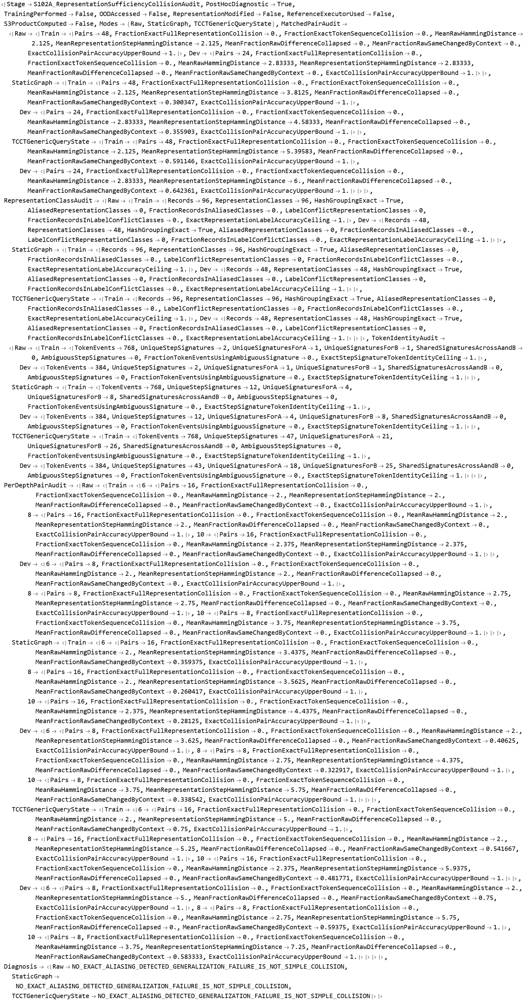

In [1356]:
(* ============================================================ *)
(* S102A-COLLISION-AUDIT                                        *)
(* Representation sufficiency / information-loss diagnostic     *)
(*                                                              *)
(* NO training                                                  *)
(* NO OOD                                                       *)
(* NO reference executor                                        *)
(* NO S3 product                                                *)
(* NO representation modification                               *)
(*                                                              *)
(* Uses existing S102A representations exactly as generated.    *)
(* ============================================================ *)

ClearAll[
  S102CKey,
  S102CBuildRows,
  S102CPairAudit,
  S102CPairSummary,
  S102CRepresentationClassAudit,
  S102CTokenIdentityAudit,
  S102CNumericMean,
  S102CDiagnosis
];


(* ============================================================ *)
(* 0. PREFLIGHT                                                 *)
(* ============================================================ *)

If[
  !And[
    ValueQ[dataByModeS102A],
    ValueQ[trainRecords],
    ValueQ[iidRecords],
    ValueQ[s102AModes]
  ],

  Print[
    "STOP: S102A representations are missing."
  ];

  Abort[];
];


Print[
  "S102A collision audit: TRAIN + DevIID only."
];

Print[
  "No OOD data will be accessed."
];


(* ============================================================ *)
(* 1. EXACT REPRESENTATION KEY                                  *)
(*                                                              *)
(* Hash is only used for grouping.                              *)
(* Matched-pair equality itself is checked with SameQ.          *)
(* ============================================================ *)

S102CKey[x_] :=
  Hash[
    x,
    "SHA256",
    "HexString"
  ];


S102CNumericMean[x_List] := Module[
  {z},

  z =
    Select[
      x,
      NumericQ
    ];

  If[
    z === {},
    Missing["NoNumericValues"],
    N@Mean[z]
  ]
];


(* ============================================================ *)
(* 2. BUILD AUDIT ROWS FROM ALREADY-COMPUTED REPRESENTATIONS    *)
(* ============================================================ *)

S102CBuildRows[
  mode_String,
  split_String,
  records_List
] := Module[
  {
    stored,
    reps
  },

  stored =
    Lookup[
      Lookup[
        dataByModeS102A,
        mode
      ],
      split
    ];

  reps =
    stored[[All, 1]];


  If[
    Length[reps] =!= Length[records],

    Print[
      "STOP: representation/record length mismatch: ",
      mode,
      " / ",
      split
    ];

    Abort[];
  ];


  Table[

    <|

      "Mode" ->
        mode,

      "Split" ->
        split,

      "PairID" ->
        records[[i]]["PairID"],

      "Depth" ->
        records[[i]]["Depth"],

      "Y" ->
        records[[i]]["Y"],

      "Seq" ->
        records[[i]]["Seq"],

      "Start" ->
        records[[i]]["Start"],

      "Target" ->
        records[[i]]["Target"],

      "Rep" ->
        reps[[i]],

      "RepKey" ->
        S102CKey[
          reps[[i]]
        ],

      (* position 1 = query/header
         positions 2.. = program-token steps *)

      "TokenSteps" ->
        Rest[
          reps[[i]]
        ],

      "TokenStepKeys" ->
        (
          S102CKey[#] &
        ) /@
          Rest[
            reps[[i]]
          ]

    |>,

    {
      i,
      Length[records]
    }
  ]
];


auditRowsS102A =
  Association@Table[

    mode ->
      <|

        "Train" ->
          S102CBuildRows[
            mode,
            "Train",
            trainRecords
          ],

        "Dev" ->
          S102CBuildRows[
            mode,
            "Dev",
            iidRecords
          ]

      |>,

    {
      mode,
      s102AModes
    }
  ];


(* ============================================================ *)
(* 3. MATCHED-PAIR REPRESENTATION AUDIT                         *)
(*                                                              *)
(* Main question:                                               *)
(*                                                              *)
(* raw Seq differs, but after representation do the two         *)
(* opposing examples become identical?                          *)
(* ============================================================ *)

S102CPairAudit[
  rows_List
] := Module[
  {
    groups
  },

  groups =
    Values@
      GroupBy[
        rows,

        ToString[
          InputForm[
            {
              #["Depth"],
              #["PairID"]
            }
          ]
        ] &
      ];


  Table[

    Module[
      {
        pos,
        neg,
        seqPos,
        seqNeg,
        stepPos,
        stepNeg,
        sameLength,
        rawDiffFlags,
        repDiffFlags,
        rawDiffPositions,
        rawSamePositions,
        collapsedAtRawDiff,
        changedAtRawSame
      },


      pos =
        SelectFirst[
          g,
          #["Y"] === 1 &,
          Missing["NoPositive"]
        ];

      neg =
        SelectFirst[
          g,
          #["Y"] === 0 &,
          Missing["NoNegative"]
        ];


      If[
        MissingQ[pos] ||
        MissingQ[neg],

        Return[
          <|
            "ValidPair" -> False
          |>
        ]
      ];


      seqPos =
        pos["Seq"];

      seqNeg =
        neg["Seq"];

      stepPos =
        pos["TokenSteps"];

      stepNeg =
        neg["TokenSteps"];


      sameLength =
        And[
          Length[seqPos] == Length[seqNeg],
          Length[stepPos] == Length[stepNeg],
          Length[seqPos] == Length[stepPos]
        ];


      If[
        !sameLength,

        Return[
          <|
            "ValidPair" -> False,
            "Reason" -> "LengthMismatch"
          |>
        ]
      ];


      rawDiffFlags =
        MapThread[
          UnsameQ,
          {
            seqPos,
            seqNeg
          }
        ];


      repDiffFlags =
        MapThread[
          UnsameQ,
          {
            stepPos,
            stepNeg
          }
        ];


      rawDiffPositions =
        Pick[
          Range[
            Length[rawDiffFlags]
          ],
          rawDiffFlags,
          True
        ];


      rawSamePositions =
        Pick[
          Range[
            Length[rawDiffFlags]
          ],
          rawDiffFlags,
          False
        ];


      collapsedAtRawDiff =
        If[
          rawDiffPositions === {},

          Missing["NoRawDifference"],

          N@Mean[
            (
              Boole[
                SameQ[
                  stepPos[[#]],
                  stepNeg[[#]]
                ]
              ] &
            ) /@
              rawDiffPositions
          ]
        ];


      changedAtRawSame =
        If[
          rawSamePositions === {},

          Missing["NoRawSamePositions"],

          N@Mean[
            (
              Boole[
                UnsameQ[
                  stepPos[[#]],
                  stepNeg[[#]]
                ]
              ] &
            ) /@
              rawSamePositions
          ]
        ];


      <|

        "ValidPair" ->
          True,

        "PairID" ->
          pos["PairID"],

        "Depth" ->
          pos["Depth"],

        "RawSeqSame" ->
          SameQ[
            seqPos,
            seqNeg
          ],

        "ExactFullRepresentationCollision" ->
          SameQ[
            pos["Rep"],
            neg["Rep"]
          ],

        "ExactTokenSequenceCollision" ->
          SameQ[
            stepPos,
            stepNeg
          ],

        "RawHammingDistance" ->
          Count[
            rawDiffFlags,
            True
          ],

        "RepresentationStepHammingDistance" ->
          Count[
            repDiffFlags,
            True
          ],

        (* Of positions where A/B truly differ,
           what fraction became EXACTLY THE SAME representation? *)

        "FractionRawDifferenceCollapsed" ->
          collapsedAtRawDiff,

        (* Of positions where the raw token is the same,
           how often did context make the representation differ? *)

        "FractionRawSameChangedByContext" ->
          changedAtRawSame

      |>

    ],

    {
      g,
      groups
    }
  ]
];


pairAuditsS102A =
  Association@Table[

    mode ->
      <|

        "Train" ->
          S102CPairAudit[
            auditRowsS102A[mode]["Train"]
          ],

        "Dev" ->
          S102CPairAudit[
            auditRowsS102A[mode]["Dev"]
          ]

      |>,

    {
      mode,
      s102AModes
    }
  ];


(* ============================================================ *)
(* 4. PAIR SUMMARY                                              *)
(* ============================================================ *)

S102CPairSummary[
  rows_List
] := Module[
  {
    valid,
    collisionFraction
  },

  valid =
    Select[
      rows,
      TrueQ[
        Lookup[
          #,
          "ValidPair",
          False
        ]
      ] &
    ];


  collisionFraction =
    If[
      valid === {},

      Missing["NoPairs"],

      N@Mean[
        (
          Boole[
            TrueQ[
              #[
                "ExactFullRepresentationCollision"
              ]
            ]
          ] &
        ) /@
          valid
      ]
    ];


  <|

    "Pairs" ->
      Length[valid],

    "FractionExactFullRepresentationCollision" ->
      collisionFraction,

    "FractionExactTokenSequenceCollision" ->
      If[
        valid === {},
        Missing["NoPairs"],

        N@Mean[
          (
            Boole[
              TrueQ[
                #[
                  "ExactTokenSequenceCollision"
                ]
              ]
            ] &
          ) /@
            valid
        ]
      ],

    "MeanRawHammingDistance" ->
      S102CNumericMean[
        Lookup[
          valid,
          "RawHammingDistance"
        ]
      ],

    "MeanRepresentationStepHammingDistance" ->
      S102CNumericMean[
        Lookup[
          valid,
          "RepresentationStepHammingDistance"
        ]
      ],

    "MeanFractionRawDifferenceCollapsed" ->
      S102CNumericMean[
        Lookup[
          valid,
          "FractionRawDifferenceCollapsed"
        ]
      ],

    "MeanFractionRawSameChangedByContext" ->
      S102CNumericMean[
        Lookup[
          valid,
          "FractionRawSameChangedByContext"
        ]
      ],

    (* If c fraction of opposing pairs are literally identical,
       no deterministic head can rank those above 0.5. *)

    "ExactCollisionPairAccuracyUpperBound" ->
      If[
        NumericQ[collisionFraction],

        N[
          1. -
          0.5 collisionFraction
        ],

        Missing["NoPairs"]
      ]

  |>
];


pairSummaryS102A =
  Association@Table[

    mode ->
      <|

        "Train" ->
          S102CPairSummary[
            pairAuditsS102A[mode]["Train"]
          ],

        "Dev" ->
          S102CPairSummary[
            pairAuditsS102A[mode]["Dev"]
          ]

      |>,

    {
      mode,
      s102AModes
    }
  ];


(* ============================================================ *)
(* 5. REPRESENTATION-CLASS ALIAS AUDIT                          *)
(*                                                              *)
(* Different primitive S101 inputs may map to exactly the same  *)
(* representation.                                              *)
(*                                                              *)
(* Also checks whether an identical representation receives     *)
(* both labels.                                                 *)
(* ============================================================ *)

S102CRepresentationClassAudit[
  rows_List
] := Module[
  {
    groups,
    aliasedGroups,
    conflictGroups,
    aliasRecordCount,
    conflictRecordCount,
    labelCeilingCorrect,
    hashConsistency
  },


  groups =
    Values@
      GroupBy[
        rows,
        #["RepKey"] &
      ];


  (* verify no accidental hash grouping of unequal expressions *)

  hashConsistency =
    And @@
      (
        Function[
          g,

          SameQ @@
            Lookup[
              g,
              "Rep"
            ]
        ] /@
          groups
      );


  aliasedGroups =
    Select[
      groups,

      Length[
        DeleteDuplicates[
          (
            ToString[
              InputForm[
                {
                  #["Seq"],
                  #["Start"],
                  #["Target"]
                }
              ]
            ] &
          ) /@
            #
        ]
      ] > 1 &
    ];


  conflictGroups =
    Select[
      groups,

      Length[
        DeleteDuplicates[
          Lookup[
            #,
            "Y"
          ]
        ]
      ] > 1 &
    ];


  aliasRecordCount =
    Total[
      Length /@
        aliasedGroups
    ];


  conflictRecordCount =
    Total[
      Length /@
        conflictGroups
    ];


  labelCeilingCorrect =
    Total[
      (
        Max[
          Values[
            Counts[
              Lookup[
                #,
                "Y"
              ]
            ]
          ]
        ] &
      ) /@
        groups
    ];


  <|

    "Records" ->
      Length[rows],

    "RepresentationClasses" ->
      Length[groups],

    "HashGroupingExact" ->
      hashConsistency,

    "AliasedRepresentationClasses" ->
      Length[
        aliasedGroups
      ],

    "FractionRecordsInAliasedClasses" ->
      If[
        rows === {},
        0.,
        N[
          aliasRecordCount /
          Length[rows]
        ]
      ],

    "LabelConflictRepresentationClasses" ->
      Length[
        conflictGroups
      ],

    "FractionRecordsInLabelConflictClasses" ->
      If[
        rows === {},
        0.,
        N[
          conflictRecordCount /
          Length[rows]
        ]
      ],

    (* theoretical maximum classification accuracy for ANY
       deterministic classifier using ONLY this exact representation *)

    "ExactRepresentationLabelAccuracyCeiling" ->
      If[
        rows === {},
        Missing["NoRows"],
        N[
          labelCeilingCorrect /
          Length[rows]
        ]
      ]

  |>
];


classAuditS102A =
  Association@Table[

    mode ->
      <|

        "Train" ->
          S102CRepresentationClassAudit[
            auditRowsS102A[mode]["Train"]
          ],

        "Dev" ->
          S102CRepresentationClassAudit[
            auditRowsS102A[mode]["Dev"]
          ]

      |>,

    {
      mode,
      s102AModes
    }
  ];


(* ============================================================ *)
(* 6. TOKEN-IDENTITY SUFFICIENCY AUDIT                          *)
(*                                                              *)
(* This DOES NOT use task label Y.                              *)
(* It asks only whether the representation of each program step *)
(* still contains enough exact information to distinguish       *)
(* raw A vs raw B.                                              *)
(* ============================================================ *)

S102CTokenIdentityAudit[
  rows_List
] := Module[
  {
    events,
    groups,
    ambiguousGroups,
    ambiguousKeys,
    sigA,
    sigB,
    majorityCorrect
  },


  events =
    Flatten[
      Table[

        Table[

          <|

            "Token" ->
              row["Seq"][[i]],

            "StepKey" ->
              row["TokenStepKeys"][[i]]

          |>,

          {
            i,
            Length[
              row["Seq"]
            ]
          }
        ],

        {
          row,
          rows
        }
      ],

      1
    ];


  If[
    events === {},

    Return[
      <|
        "TokenEvents" -> 0
      |>
    ]
  ];


  groups =
    Values@
      GroupBy[
        events,
        #["StepKey"] &
      ];


  ambiguousGroups =
    Select[
      groups,

      Length[
        DeleteDuplicates[
          Lookup[
            #,
            "Token"
          ]
        ]
      ] > 1 &
    ];


  ambiguousKeys =
    DeleteDuplicates[
      Lookup[
        Flatten[
          ambiguousGroups,
          1
        ],
        "StepKey",
        {}
      ]
    ];


  sigA =
    DeleteDuplicates[
      Lookup[
        Select[
          events,
          #["Token"] === 0 &
        ],
        "StepKey"
      ]
    ];


  sigB =
    DeleteDuplicates[
      Lookup[
        Select[
          events,
          #["Token"] === 1 &
        ],
        "StepKey"
      ]
    ];


  majorityCorrect =
    Total[
      (
        Max[
          Values[
            Counts[
              Lookup[
                #,
                "Token"
              ]
            ]
          ]
        ] &
      ) /@
        groups
    ];


  <|

    "TokenEvents" ->
      Length[events],

    "UniqueStepSignatures" ->
      Length[groups],

    "UniqueSignaturesForA" ->
      Length[sigA],

    "UniqueSignaturesForB" ->
      Length[sigB],

    "SharedSignaturesAcrossAandB" ->
      Length[
        Intersection[
          sigA,
          sigB
        ]
      ],

    "AmbiguousStepSignatures" ->
      Length[
        ambiguousGroups
      ],

    "FractionTokenEventsUsingAmbiguousSignature" ->
      N@Mean[
        (
          Boole[
            MemberQ[
              ambiguousKeys,
              #["StepKey"]
            ]
          ] &
        ) /@
          events
      ],

    (* Best possible exact token decoder based only on the
       single-step representation signature. *)

    "ExactStepSignatureTokenIdentityCeiling" ->
      N[
        majorityCorrect /
        Length[events]
      ]

  |>
];


tokenAuditS102A =
  Association@Table[

    mode ->
      <|

        "Train" ->
          S102CTokenIdentityAudit[
            auditRowsS102A[mode]["Train"]
          ],

        "Dev" ->
          S102CTokenIdentityAudit[
            auditRowsS102A[mode]["Dev"]
          ]

      |>,

    {
      mode,
      s102AModes
    }
  ];


(* ============================================================ *)
(* 7. PER-DEPTH MATCHED-PAIR COLLISION AUDIT                    *)
(* ============================================================ *)

perDepthPairAuditS102A =
  Association@Table[

    mode ->
      <|

        "Train" ->
          Association@Table[

            d ->
              S102CPairSummary[
                Select[
                  pairAuditsS102A[mode]["Train"],
                  Lookup[
                    #,
                    "Depth",
                    Missing[]
                  ] === d &
                ]
              ],

            {
              d,
              Sort@
                DeleteDuplicates[
                  Lookup[
                    trainRecords,
                    "Depth"
                  ]
                ]
            }
          ],

        "Dev" ->
          Association@Table[

            d ->
              S102CPairSummary[
                Select[
                  pairAuditsS102A[mode]["Dev"],
                  Lookup[
                    #,
                    "Depth",
                    Missing[]
                  ] === d &
                ]
              ],

            {
              d,
              Sort@
                DeleteDuplicates[
                  Lookup[
                    iidRecords,
                    "Depth"
                  ]
                ]
            }
          ]

      |>,

    {
      mode,
      s102AModes
    }
  ];


(* ============================================================ *)
(* 8. AUTOMATIC DESCRIPTIVE DIAGNOSIS                           *)
(*                                                              *)
(* No tuned threshold.                                          *)
(* Exact events only.                                           *)
(* ============================================================ *)

S102CDiagnosis[
  mode_String
] := Module[
  {
    pairDev,
    classDev,
    tokenDev
  },

  pairDev =
    pairSummaryS102A[mode]["Dev"];

  classDev =
    classAuditS102A[mode]["Dev"];

  tokenDev =
    tokenAuditS102A[mode]["Dev"];


  Which[

    pairDev[
      "FractionExactFullRepresentationCollision"
    ] > 0,

      "EXACT_MATCHED_PAIR_REPRESENTATION_COLLISION_PRESENT",


    classDev[
      "LabelConflictRepresentationClasses"
    ] > 0,

      "CROSS_PAIR_LABEL_ALIASING_PRESENT",


    tokenDev[
      "SharedSignaturesAcrossAandB"
    ] > 0,

      "TOKEN_STEP_SIGNATURE_ALIASING_PRESENT",


    True,

      "NO_EXACT_ALIASING_DETECTED_GENERALIZATION_FAILURE_IS_NOT_SIMPLE_COLLISION"
  ]
];


diagnosisS102A =
  Association@Table[

    mode ->
      S102CDiagnosis[
        mode
      ],

    {
      mode,
      s102AModes
    }
  ];


(* ============================================================ *)
(* 9. FINAL REPORT                                              *)
(* ============================================================ *)

s102ACollisionAuditReport =
  <|

    "Stage" ->
      "S102A_RepresentationSufficiencyCollisionAudit",

    "PostHocDiagnostic" ->
      True,

    "TrainingPerformed" ->
      False,

    "OODAccessed" ->
      False,

    "RepresentationModified" ->
      False,

    "ReferenceExecutorUsed" ->
      False,

    "S3ProductComputed" ->
      False,

    "Modes" ->
      s102AModes,

    "MatchedPairAudit" ->
      pairSummaryS102A,

    "RepresentationClassAudit" ->
      classAuditS102A,

    "TokenIdentityAudit" ->
      tokenAuditS102A,

    "PerDepthPairAudit" ->
      perDepthPairAuditS102A,

    "Diagnosis" ->
      diagnosisS102A

  |>;


s102ACollisionAuditReport

Dataset[{<|ValidPair -> True, PairID -> IID_6_1, Depth -> 6, RawSeqSame -> False, 
 
>     ExactFullRepresentationCollision -> False, ExactTokenSequenceCollision -> False, 
 
>     RawHammingDistance -> 2, RepresentationStepHammingDistance -> 5, 
 
>     FractionRawDifferenceCollapsed -> 0., FractionRawSameChangedByContext -> 0.75|>, 
 
>    <|ValidPair -> True, PairID -> IID_6_2, Depth -> 6, RawSeqSame -> False, 
 
>     ExactFullRepresentationCollision -> False, ExactTokenSequenceCollision -> False, 
 
>     RawHammingDistance -> 2, RepresentationStepHammingDistance -> 5, 
 
>     FractionRawDifferenceCollapsed -> 0., FractionRawSameChangedByContext -> 0.75|>, 
 
>    <|ValidPair -> True, PairID -> IID_6_3, Depth -> 6, RawSeqSame -> False, 
 
>     ExactFullRepresentationCollision -> False, ExactTokenSequenceCollision -> False, 
 
>     RawHammingDistance -> 2, RepresentationStepHammingDistance -> 5, 
 
>     FractionRawDifferenceCollapsed -> 0., FractionRawSameChangedByContext -> 0.75|>, 
 
>    <|ValidPair -> True, PairID -> IID_6_4, Depth -> 6, RawSeqSame -> False, 
 
>     ExactFullRepresentationCollision -> False, ExactTokenSequenceCollision -> False, 
 
>     RawHammingDistance -> 2, RepresentationStepHammingDistance -> 5, 
 
>     FractionRawDifferenceCollapsed -> 0., FractionRawSameChangedByContext -> 0.75|>, 
 
>    <|ValidPair -> True, PairID -> IID_6_5, Depth -> 6, RawSeqSame -> False, 
 
>     ExactFullRepresentationCollision -> False, ExactTokenSequenceCollision -> False, 
 
>     RawHammingDistance -> 2, RepresentationStepHammingDistance -> 5, 
 
>     FractionRawDifferenceCollapsed -> 0., FractionRawSameChangedByContext -> 0.75|>, 
 
>    <|ValidPair -> True, PairID -> IID_6_6, Depth -> 6, RawSeqSame -> False, 
 
>     ExactFullRepresentationCollision -> False, ExactTokenSequenceCollision -> False, 
 
>     RawHammingDistance -> 2, RepresentationStepHammingDistance -> 5, 
 
>     FractionRawDifferenceCollapsed -> 0., FractionRawSameChangedByContext -> 0.75|>, 
 
>    <|ValidPair -> True, PairID -> IID_6_7, Depth -> 6, RawSeqSame -> False, 
 
>     ExactFullRepresentationCollision -> False, ExactTokenSequenceCollision -> False, 
 
>     RawHammingDistance -> 2, RepresentationStepHammingDistance -> 5, 
 
>     FractionRawDifferenceCollapsed -> 0., FractionRawSameChangedByContext -> 0.75|>, 
 
>    <|ValidPair -> True, PairID -> IID_6_8, Depth -> 6, RawSeqSame -> False, 
 
>     ExactFullRepresentationCollision -> False, ExactTokenSequenceCollision -> False, 
 
>     RawHammingDistance -> 2, RepresentationStepHammingDistance -> 5, 
 
>     FractionRawDifferenceCollapsed -> 0., FractionRawSameChangedByContext -> 0.75|>, 
 
>    <|ValidPair -> True, PairID -> IID_8_9, Depth -> 8, RawSeqSame -> False, 
 
>     ExactFullRepresentationCollision -> False, ExactTokenSequenceCollision -> False, 
 
>     RawHammingDistance -> 2, RepresentationStepHammingDistance -> 5, 
 
>     FractionRawDifferenceCollapsed -> 0., FractionRawSameChangedByContext -> 0.5|>, 
 
>    <|ValidPair -> True, PairID -> IID_8_10, Depth -> 8, RawSeqSame -> False, 
 
>     ExactFullRepresentationCollision -> False, ExactTokenSequenceCollision -> False, 
 
>     RawHammingDistance -> 2, RepresentationStepHammingDistance -> 5, 
 
>     FractionRawDifferenceCollapsed -> 0., FractionRawSameChangedByContext -> 0.5|>, 
 
>    <|ValidPair -> True, PairID -> IID_8_11, Depth -> 8, RawSeqSame -> False, 
 
>     ExactFullRepresentationCollision -> False, ExactTokenSequenceCollision -> False, 
 
>     RawHammingDistance -> 4, RepresentationStepHammingDistance -> 7, 
 
>     FractionRawDifferenceCollapsed -> 0., FractionRawSameChangedByContext -> 0.75|>, 
 
>    <|ValidPair -> True, PairID -> IID_8_12, Depth -> 8, RawSeqSame -> False, 
 
>     ExactFullRepresentationCollision -> False, ExactTokenSequenceCollision -> False, 
 
>     RawHammingDistance -> 4, RepresentationStepHammingDistance -> 7, 
 
>     FractionRawDifferenceCollapsed -> 0., FractionRawSameChange
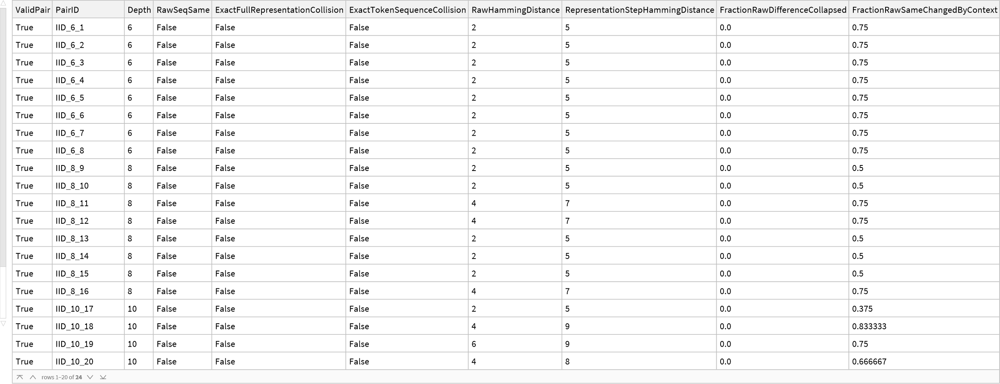

In [1445]:
Dataset[
  pairAuditsS102A[
    "TCCTGenericQueryState"
  ][
    "Dev"
  ]
]

In [1450]:
Dataset[
  Table[

    <|

      "Mode" ->
        mode,

      "DevExactPairCollision" ->
        pairSummaryS102A[mode]["Dev"][
          "FractionExactFullRepresentationCollision"
        ],

      "DevTokenSeqCollision" ->
        pairSummaryS102A[mode]["Dev"][
          "FractionExactTokenSequenceCollision"
        ],

      "RawDifferenceCollapsed" ->
        pairSummaryS102A[mode]["Dev"][
          "MeanFractionRawDifferenceCollapsed"
        ],

      "AliasedRecordFraction" ->
        classAuditS102A[mode]["Dev"][
          "FractionRecordsInAliasedClasses"
        ],

      "LabelAccuracyCeiling" ->
        classAuditS102A[mode]["Dev"][
          "ExactRepresentationLabelAccuracyCeiling"
        ],

      "SharedABStepSignatures" ->
        tokenAuditS102A[mode]["Dev"][
          "SharedSignaturesAcrossAandB"
        ],

      "TokenIdentityCeiling" ->
        tokenAuditS102A[mode]["Dev"][
          "ExactStepSignatureTokenIdentityCeiling"
        ],

      "Diagnosis" ->
        diagnosisS102A[mode]

    |>,

    {
      mode,
      s102AModes
    }
  ]
]

Dataset[{<|Mode -> Raw, DevExactPairCollision -> 0., DevTokenSeqCollision -> 0., 
 
>     RawDifferenceCollapsed -> 0., AliasedRecordFraction -> 0., 
 
>     LabelAccuracyCeiling -> 1., SharedABStepSignatures -> 0, 
 
>     TokenIdentityCeiling -> 1., Diagnosis -> 
 
>      NO_EXACT_ALIASING_DETECTED_GENERALIZATION_FAILURE_IS_NOT_SIMPLE_COLLISION|>, 
 
>    <|Mode -> StaticGraph, DevExactPairCollision -> 0., DevTokenSeqCollision -> 0., 
 
>     RawDifferenceCollapsed -> 0., AliasedRecordFraction -> 0., 
 
>     LabelAccuracyCeiling -> 1., SharedABStepSignatures -> 0, 
 
>     TokenIdentityCeiling -> 1., Diagnosis -> 
 
>      NO_EXACT_ALIASING_DETECTED_GENERALIZATION_FAILURE_IS_NOT_SIMPLE_COLLISION|>, 
 
>    <|Mode -> TCCTGenericQueryState, DevExactPairCollision -> 0., 
 
>     DevTokenSeqCollision -> 0., RawDifferenceCollapsed -> 0., 
 
>     AliasedRecordFraction -> 0., LabelAccuracyCeiling -> 1., 
 
>     SharedABStepSignatures -> 0, TokenIdentityCeiling -> 1., 
 
>     Diagnosis -> 
 
>      NO_EXACT_ALIASING_DETECTED_GENERALIZATION_FAILURE_IS_NOT_SIMPLE_COLLISION|>}, 
 
>   TypeSystem`Vector[TypeSystem`Struct[{Mode, DevExactPairCollision, 
 
>      DevTokenSeqCollision, RawDifferenceCollapsed, AliasedRecordFraction, 
 
>      LabelAccuracyCeiling, SharedABStepSignatures, TokenIdentityCeiling, Diagnosis}, 
 
>     {TypeSystem`Atom[String], TypeSystem`Atom[Real], TypeSystem`Atom[Real], 
 
>      TypeSystem`Atom[Real], TypeSystem`Atom[Real], TypeSystem`Atom[Real], 
 
>      TypeSystem`Atom[Integer], TypeSystem`Atom[Real], 
 
>      TypeSystem`Atom[TypeSystem`Enumeration[NO_EXACT_ALIASING_DETECTED_GENERALIZATION_\
 
>         FAILURE_IS_NOT_SIMPLE_COLLISION]]}], 3], <||>]

In [1455]:
(* ============================================================ *)
(* S102A STATE-TRANSFER / SEMANTIC-STABILITY AUDIT              *)
(*                                                              *)
(* TRAIN -> DevIID only                                         *)
(* NO training                                                  *)
(* NO OOD                                                       *)
(* NO reference executor                                        *)
(* NO S3 product                                                *)
(* NO representation modification                               *)
(* ============================================================ *)

ClearAll[
  S102TKey,
  S102TTokenEvents,
  S102TStateMap,
  S102TStateTransferAudit,
  S102TRecordTransferAudit,
  S102TTransitionEvents,
  S102TTransitionAudit,
  S102TPerDepthAudit
];


(* ============================================================ *)
(* 0. PREFLIGHT                                                 *)
(* ============================================================ *)

If[
  !And[
    ValueQ[auditRowsS102A],
    ValueQ[trainRecords],
    ValueQ[iidRecords]
  ],

  Print[
    "STOP: run the S102A collision audit first."
  ];

  Abort[];
];


Print[
  "Running Train -> Dev state-transfer audit."
];

Print[
  "OOD will NOT be accessed."
];


(* ============================================================ *)
(* 1. EXACT STATE KEY                                           *)
(*                                                              *)
(* Uses InputForm representation rather than model labels.      *)
(* ============================================================ *)

S102TKey[x_] :=
  ToString[
    InputForm[x]
  ];


(* ============================================================ *)
(* 2. TOKEN-EVENT TABLE                                         *)
(*                                                              *)
(* One row per program position.                                *)
(* ============================================================ *)

S102TTokenEvents[
  rows_List
] :=
  Flatten[

    Table[

      Table[

        <|

          "PairID" ->
            row["PairID"],

          "Depth" ->
            row["Depth"],

          "Y" ->
            row["Y"],

          "Position" ->
            i,

          "Token" ->
            row["Seq"][[i]],

          "State" ->
            row["TokenSteps"][[i]],

          "StateKey" ->
            S102TKey[
              row["TokenSteps"][[i]]
            ]

        |>,

        {
          i,
          Length[
            row["Seq"]
          ]
        }
      ],

      {
        row,
        rows
      }
    ],

    1
  ];


(* ============================================================ *)
(* 3. STATE -> TOKEN SEMANTIC MAP                               *)
(*                                                              *)
(* Example:                                                     *)
(* state X -> {0} means only A                                  *)
(* state Y -> {1} means only B                                  *)
(* state Z -> {0,1} means semantic ambiguity                    *)
(* ============================================================ *)

S102TStateMap[
  events_List
] :=
  Association@
    KeyValueMap[

      Function[
        {key, group},

        key ->
          Sort@
            DeleteDuplicates[
              Lookup[
                group,
                "Token"
              ]
            ]
      ],

      GroupBy[
        events,
        #["StateKey"] &
      ]
    ];


(* ============================================================ *)
(* 4. STATE TRANSFER AUDIT                                      *)
(* ============================================================ *)

S102TStateTransferAudit[
  trainEvents_List,
  devEvents_List
] := Module[
  {
    trainMap,
    devMap,

    trainKeys,
    devKeys,

    sharedKeys,
    unseenDevKeys,

    semanticConflictKeys,

    devSeenEvents,
    devUnseenEvents,
    devConflictEvents,

    perToken
  },


  trainMap =
    S102TStateMap[
      trainEvents
    ];

  devMap =
    S102TStateMap[
      devEvents
    ];


  trainKeys =
    Keys[
      trainMap
    ];

  devKeys =
    Keys[
      devMap
    ];


  sharedKeys =
    Intersection[
      trainKeys,
      devKeys
    ];


  unseenDevKeys =
    Complement[
      devKeys,
      trainKeys
    ];


  semanticConflictKeys =
    Select[
      sharedKeys,

      UnsameQ[
        trainMap[#],
        devMap[#]
      ] &
    ];


  devSeenEvents =
    Select[
      devEvents,
      MemberQ[
        trainKeys,
        #["StateKey"]
      ] &
    ];


  devUnseenEvents =
    Select[
      devEvents,
      MemberQ[
        unseenDevKeys,
        #["StateKey"]
      ] &
    ];


  devConflictEvents =
    Select[
      devEvents,
      MemberQ[
        semanticConflictKeys,
        #["StateKey"]
      ] &
    ];


  perToken =
    Association@Table[

      tok -> Module[
        {
          subset,
          seen
        },

        subset =
          Select[
            devEvents,
            #["Token"] === tok &
          ];

        seen =
          Select[
            subset,
            MemberQ[
              trainKeys,
              #["StateKey"]
            ] &
          ];

        <|

          "DevEvents" ->
            Length[
              subset
            ],

          "SeenInTrainEvents" ->
            Length[
              seen
            ],

          "SeenFraction" ->
            If[
              subset === {},
              Missing["NoEvents"],
              N[
                Length[seen] /
                Length[subset]
              ]
            ]

        |>
      ],

      {
        tok,
        {0, 1}
      }
    ];


  <|

    "TrainEvents" ->
      Length[
        trainEvents
      ],

    "DevEvents" ->
      Length[
        devEvents
      ],

    "TrainUniqueStates" ->
      Length[
        trainKeys
      ],

    "DevUniqueStates" ->
      Length[
        devKeys
      ],

    "SharedUniqueStates" ->
      Length[
        sharedKeys
      ],

    "DevUnseenUniqueStates" ->
      Length[
        unseenDevKeys
      ],

    "DevUniqueStateCoverage" ->
      If[
        devKeys === {},
        Missing["NoStates"],
        N[
          Length[sharedKeys] /
          Length[devKeys]
        ]
      ],

    (* event-weighted coverage *)

    "DevSeenEventFraction" ->
      If[
        devEvents === {},
        Missing["NoEvents"],
        N[
          Length[devSeenEvents] /
          Length[devEvents]
        ]
      ],

    "DevUnseenEventFraction" ->
      If[
        devEvents === {},
        Missing["NoEvents"],
        N[
          Length[devUnseenEvents] /
          Length[devEvents]
        ]
      ],

    "CrossSplitSemanticConflictStates" ->
      Length[
        semanticConflictKeys
      ],

    "CrossSplitSemanticConflictEventFraction" ->
      If[
        devEvents === {},
        Missing["NoEvents"],
        N[
          Length[devConflictEvents] /
          Length[devEvents]
        ]
      ],

    "SemanticStabilityOnSharedStates" ->
      If[
        sharedKeys === {},
        Missing["NoSharedStates"],
        N[
          1. -
          Length[semanticConflictKeys] /
          Length[sharedKeys]
        ]
      ],

    "PerTokenCoverage" ->
      perToken,

    "UnseenStateKeys" ->
      unseenDevKeys,

    "SemanticConflictKeys" ->
      semanticConflictKeys

  |>
];


(* ============================================================ *)
(* 5. RECORD-LEVEL COVERAGE                                     *)
(*                                                              *)
(* Important distinction:                                      *)
(* 95% of individual events may be seen, while most complete    *)
(* sequences still contain at least one unseen state.           *)
(* ============================================================ *)

S102TRecordTransferAudit[
  trainRows_List,
  devRows_List
] := Module[
  {
    trainKeys,
    result
  },


  trainKeys =
    DeleteDuplicates[
      Flatten[
        (
          S102TKey /@
            #["TokenSteps"]
        ) & /@
          trainRows
      ]
    ];


  result =
    Table[

      Module[
        {
          keys,
          flags
        },

        keys =
          S102TKey /@
            row["TokenSteps"];

        flags =
          MemberQ[
            trainKeys,
            #
          ] & /@
            keys;


        <|

          "PairID" ->
            row["PairID"],

          "Depth" ->
            row["Depth"],

          "Y" ->
            row["Y"],

          "Steps" ->
            Length[
              keys
            ],

          "SeenSteps" ->
            Count[
              flags,
              True
            ],

          "SeenFraction" ->
            If[
              flags === {},
              Missing["NoSteps"],
              N@
                Mean[
                  Boole /@
                    flags
                ]
            ],

          "AllStatesSeenInTrain" ->
            And @@
              flags,

          "AnyUnseenState" ->
            ! And @@
              flags

        |>

      ],

      {
        row,
        devRows
      }
    ];


  <|

    "Records" ->
      Length[
        result
      ],

    "MeanRecordStateCoverage" ->
      N@
        Mean[
          Lookup[
            result,
            "SeenFraction"
          ]
        ],

    "FractionRecordsAllStatesSeen" ->
      N@
        Mean[
          Boole[
            TrueQ[#]
          ] & /@
            Lookup[
              result,
              "AllStatesSeenInTrain"
            ]
        ],

    "FractionRecordsWithAnyUnseenState" ->
      N@
        Mean[
          Boole[
            TrueQ[#]
          ] & /@
            Lookup[
              result,
              "AnyUnseenState"
            ]
        ],

    "Rows" ->
      result

  |>
];


(* ============================================================ *)
(* 6. ADJACENT STATE-TRANSITION EVENTS                          *)
(*                                                              *)
(* Even if every single state is known, novel state-to-state    *)
(* transitions may appear in Dev.                               *)
(* ============================================================ *)

S102TTransitionEvents[
  rows_List
] :=
  Flatten[

    Table[

      Module[
        {
          steps,
          keys
        },

        steps =
          row["TokenSteps"];

        keys =
          S102TKey /@
            steps;


        If[
          Length[keys] < 2,

          {},

          Table[

            <|

              "PairID" ->
                row["PairID"],

              "Depth" ->
                row["Depth"],

              "Position" ->
                i,

              "FromKey" ->
                keys[[i]],

              "ToKey" ->
                keys[[i + 1]],

              "TransitionKey" ->
                ToString[
                  InputForm[
                    {
                      keys[[i]],
                      keys[[i + 1]]
                    }
                  ]
                ]

            |>,

            {
              i,
              Length[keys] - 1
            }
          ]
        ]

      ],

      {
        row,
        rows
      }
    ],

    1
  ];


S102TTransitionAudit[
  trainRows_List,
  devRows_List
] := Module[
  {
    trainEvents,
    devEvents,
    trainKeys,
    devKeys,
    shared,
    unseen
  },


  trainEvents =
    S102TTransitionEvents[
      trainRows
    ];

  devEvents =
    S102TTransitionEvents[
      devRows
    ];


  trainKeys =
    DeleteDuplicates[
      Lookup[
        trainEvents,
        "TransitionKey",
        {}
      ]
    ];

  devKeys =
    DeleteDuplicates[
      Lookup[
        devEvents,
        "TransitionKey",
        {}
      ]
    ];


  shared =
    Intersection[
      trainKeys,
      devKeys
    ];


  unseen =
    Complement[
      devKeys,
      trainKeys
    ];


  <|

    "TrainTransitionEvents" ->
      Length[
        trainEvents
      ],

    "DevTransitionEvents" ->
      Length[
        devEvents
      ],

    "TrainUniqueTransitions" ->
      Length[
        trainKeys
      ],

    "DevUniqueTransitions" ->
      Length[
        devKeys
      ],

    "SharedUniqueTransitions" ->
      Length[
        shared
      ],

    "DevUnseenUniqueTransitions" ->
      Length[
        unseen
      ],

    "DevUniqueTransitionCoverage" ->
      If[
        devKeys === {},
        Missing["NoTransitions"],
        N[
          Length[shared] /
          Length[devKeys]
        ]
      ],

    "DevSeenTransitionEventFraction" ->
      If[
        devEvents === {},
        Missing["NoTransitions"],
        N@
          Mean[
            Boole[
              MemberQ[
                trainKeys,
                #["TransitionKey"]
              ]
            ] & /@
              devEvents
          ]
      ],

    "DevUnseenTransitionEventFraction" ->
      If[
        devEvents === {},
        Missing["NoTransitions"],
        N@
          Mean[
            Boole[
              !MemberQ[
                trainKeys,
                #["TransitionKey"]
              ]
            ] & /@
              devEvents
          ]
      ],

    "UnseenTransitionKeys" ->
      unseen

  |>
];


(* ============================================================ *)
(* 7. PER-DEPTH DEV STATE COVERAGE                              *)
(* ============================================================ *)

S102TPerDepthAudit[
  trainEvents_List,
  devEvents_List
] := Module[
  {
    depths
  },


  depths =
    Sort@
      DeleteDuplicates[
        Lookup[
          devEvents,
          "Depth"
        ]
      ];


  Association@Table[

    d ->
      S102TStateTransferAudit[
        trainEvents,

        Select[
          devEvents,
          #["Depth"] === d &
        ]
      ],

    {
      d,
      depths
    }
  ]
];


(* ============================================================ *)
(* 8. RUN ALL THREE REPRESENTATIONS                             *)
(* ============================================================ *)

stateTransferResultsS102A =
  Association@Table[

    mode -> Module[
      {
        trainRows,
        devRows,
        trainEvents,
        devEvents
      },


      trainRows =
        auditRowsS102A[mode]["Train"];

      devRows =
        auditRowsS102A[mode]["Dev"];


      trainEvents =
        S102TTokenEvents[
          trainRows
        ];

      devEvents =
        S102TTokenEvents[
          devRows
        ];


      <|

        "StateTransfer" ->
          S102TStateTransferAudit[
            trainEvents,
            devEvents
          ],

        "RecordTransfer" ->
          S102TRecordTransferAudit[
            trainRows,
            devRows
          ],

        "TransitionTransfer" ->
          S102TTransitionAudit[
            trainRows,
            devRows
          ],

        "PerDepthStateTransfer" ->
          S102TPerDepthAudit[
            trainEvents,
            devEvents
          ]

      |>

    ],

    {
      mode,
      s102AModes
    }
  ];


(* ============================================================ *)
(* 9. COMPACT SUMMARY                                           *)
(* ============================================================ *)

stateTransferCompactS102A =
  Table[

    Module[
      {
        s,
        r,
        t
      },

      s =
        stateTransferResultsS102A[
          mode
        ][
          "StateTransfer"
        ];

      r =
        stateTransferResultsS102A[
          mode
        ][
          "RecordTransfer"
        ];

      t =
        stateTransferResultsS102A[
          mode
        ][
          "TransitionTransfer"
        ];


      <|

        "Mode" ->
          mode,

        "TrainUniqueStates" ->
          s[
            "TrainUniqueStates"
          ],

        "DevUniqueStates" ->
          s[
            "DevUniqueStates"
          ],

        "DevUniqueStateCoverage" ->
          s[
            "DevUniqueStateCoverage"
          ],

        "DevSeenEventFraction" ->
          s[
            "DevSeenEventFraction"
          ],

        "SemanticStability" ->
          s[
            "SemanticStabilityOnSharedStates"
          ],

        "SemanticConflictStates" ->
          s[
            "CrossSplitSemanticConflictStates"
          ],

        "RecordsAllStatesSeen" ->
          r[
            "FractionRecordsAllStatesSeen"
          ],

        "MeanRecordStateCoverage" ->
          r[
            "MeanRecordStateCoverage"
          ],

        "DevUniqueTransitionCoverage" ->
          t[
            "DevUniqueTransitionCoverage"
          ],

        "DevSeenTransitionEventFraction" ->
          t[
            "DevSeenTransitionEventFraction"
          ]

      |>

    ],

    {
      mode,
      s102AModes
    }
  ];


Dataset[
  stateTransferCompactS102A
]

Running Train -> Dev state-transfer audit.
OOD will NOT be accessed.


Dataset[{<|Mode -> Raw, TrainUniqueStates -> 2, DevUniqueStates -> 2, 
 
>     DevUniqueStateCoverage -> 1., DevSeenEventFraction -> 1., SemanticStability -> 1., 
 
>     SemanticConflictStates -> 0, RecordsAllStatesSeen -> 1., 
 
>     MeanRecordStateCoverage -> 1., DevUniqueTransitionCoverage -> 1., 
 
>     DevSeenTransitionEventFraction -> 1.|>, 
 
>    <|Mode -> StaticGraph, TrainUniqueStates -> 12, DevUniqueStates -> 12, 
 
>     DevUniqueStateCoverage -> 1., DevSeenEventFraction -> 1., SemanticStability -> 1., 
 
>     SemanticConflictStates -> 0, RecordsAllStatesSeen -> 1., 
 
>     MeanRecordStateCoverage -> 1., DevUniqueTransitionCoverage -> 1., 
 
>     DevSeenTransitionEventFraction -> 1.|>, 
 
>    <|Mode -> TCCTGenericQueryState, TrainUniqueStates -> 47, DevUniqueStates -> 43, 
 
>     DevUniqueStateCoverage -> 0.976744, DevSeenEventFraction -> 0.984375, 
 
>     SemanticStability -> 1., SemanticConflictStates -> 0, 
 
>     RecordsAllStatesSeen -> 0.875, MeanRecordStateCoverage -> 0.983681, 
 
>     DevUniqueTransitionCoverage -> 0.971831, 
 
>     DevSeenTransitionEventFraction -> 0.982143|>}, 
 
>   TypeSystem`Vector[TypeSystem`Struct[{Mode, TrainUniqueStates, DevUniqueStates, 
 
>      DevUniqueStateCoverage, DevSeenEventFraction, SemanticStability, 
 
>      SemanticConflictStates, RecordsAllStatesSeen, MeanRecordStateCoverage, 
 
>      DevUniqueTransitionCoverage, DevSeenTransitionEventFraction}, 
 
>     {TypeSystem`Atom[String], TypeSystem`Atom[Integer], TypeSystem`Atom[Integer], 
 
>      TypeSystem`Atom[Real], TypeSystem`Atom[Real], TypeSystem`Atom[Real], 
 
>      TypeSystem`Atom[Integer], TypeSystem`Atom[Real], TypeSystem`Atom[Real], 
 
>      TypeSystem`Atom[Real], TypeSystem`Atom[Real]}], 3], <||>]

<|StateTransfer -> 
 
>    <|TrainEvents -> 768, DevEvents -> 384, TrainUniqueStates -> 47, 
 
>     DevUniqueStates -> 43, SharedUniqueStates -> 42, DevUnseenUniqueStates -> 1, 
 
>     DevUniqueStateCoverage -> 0.976744, DevSeenEventFraction -> 0.984375, 
 
>     DevUnseenEventFraction -> 0.015625, CrossSplitSemanticConflictStates -> 0, 
 
>     CrossSplitSemanticConflictEventFraction -> 0., 
 
>     SemanticStabilityOnSharedStates -> 1., 
 
>     PerTokenCoverage -> 
 
>      <|0 -> <|DevEvents -> 168, SeenInTrainEvents -> 162, SeenFraction -> 0.964286|>, 
 
>       1 -> <|DevEvents -> 216, SeenInTrainEvents -> 216, SeenFraction -> 1.|>|>, 
 
>     UnseenStateKeys -> 
 
>      {{0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0.,\
 
>        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,\
 
>        0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,\
 
>        0., 0., 0., 0.}}, SemanticConflictKeys -> {}|>, 
 
>   RecordTransfer -> 
 
>    <|Records -> 48, MeanRecordStateCoverage -> 0.983681, 
 
>     FractionRecordsAllStatesSeen -> 0.875, FractionRecordsWithAnyUnseenState -> 0.125, 
 
>     Rows -> {<|PairID -> IID_6_1, Depth -> 6, Y -> 1, Steps -> 6, SeenSteps -> 6, 
 
>        SeenFraction -> 1., AllStatesSeenInTrain -> True, AnyUnseenState -> False|>, 
 
>       <|PairID -> IID_6_1, Depth -> 6, Y -> 0, Steps -> 6, SeenSteps -> 6, 
 
>        SeenFraction -> 1., AllStatesSeenInTrain -> True, AnyUnseenState -> False|>, 
 
>       <|PairID -> IID_6_2, Depth -> 6, Y -> 1, Steps -> 6, SeenSteps -> 6, 
 
>        SeenFraction -> 1., AllStatesSeenInTrain -> True, AnyUnseenState -> False|>, 
 
>       <|PairID -> IID_6_2, Depth -> 6, Y -> 0, Steps -> 6, SeenSteps -> 6, 
 
>        SeenFraction -> 1., AllStatesSeenInTrain -> True, AnyUnseenState -> False|>, 
 
>       <|PairID -> IID_6_3, Depth -> 6, Y -> 1, Steps -> 6, SeenSteps -> 6, 
 
>        SeenFraction -> 1., AllStatesSeenInTrain -> True, AnyUnseenState -> False|>, 
 
>       <|PairID -> IID_6_3, Depth -> 6, Y -> 0, Steps -> 6, SeenSteps -> 6, 
 
>        SeenFraction -> 1., AllStatesSeenInTrain -> True, AnyUnseenState -> False|>, 
 
>       <|PairID -> IID_6_4, Depth -> 6, Y -> 1, Steps -> 6, SeenSteps -> 6, 
 
>        SeenFraction -> 1., AllStatesSeenInTrain -> True, AnyUnseenState -> False|>, 
 
>       <|PairID -> IID_6_4, Depth -> 6, Y -> 0, Steps -> 6, SeenSteps -> 6, 
 
>        SeenFraction -> 1., AllStatesSeenInTrain -> True, AnyUnseenState -> False|>, 
 
>       <|PairID -> IID_6_5, Depth -> 6, Y -> 1, Steps -> 6, SeenSteps -> 5, 
 
>        SeenFraction -> 0.833333, AllStatesSeenInTrain -> False, 
 
>        AnyUnseenState -> True|>, <|PairID -> IID_6_5, Depth -> 6, Y -> 0, Steps -> 6, 
 
>        SeenSteps -> 6, SeenFraction -> 1., AllStatesSeenInTrain -> True, 
 
>        AnyUnseenState -> False|>, 
 
>       <|PairID -> IID_6_6, Depth -> 6, Y -> 1, Steps -> 6, SeenSteps -> 6, 
 
>        SeenFraction -> 1., AllStatesSeenInTrain -> True, AnyUnseenState -> False|>, 
 
>       <|PairID -> IID_6_6, Depth -> 6, Y -> 0, Steps -> 6, SeenSteps -> 5, 
 
>        SeenFraction -> 0.833333, AllStatesSeenInTrain -> False, 
 
>        AnyUnseenState -> True|>, <|PairID -> IID_6_7, Depth -> 6, Y -> 1, Steps -> 6, 
 
>        SeenSteps -> 6, SeenFraction -> 1., AllStatesSeenInTrain -> True, 
 
>        AnyUnseenState -> False|>, 
 
>       <|PairID -> IID_6_7, Depth -> 6, Y -> 0, Steps -> 6, SeenSteps -> 6, 
 
>        SeenFraction -> 1., AllStatesSeenInTrain -> True, AnyUnseenState -> False|>, 
 
>       <|PairID -> IID_6_8, Depth -> 6, Y -> 1, Steps -> 6, SeenSteps -> 6, 
 
>        SeenFraction -> 1., AllStatesSeenInTrain -> True, AnyUnseenState -> False|>, 
 
>       <|PairID -> IID_6_8, Depth -> 6, Y -> 0, Steps -> 6, SeenSteps -> 6, 
 
>        SeenFraction -> 1., AllStatesSeenInTrain -> True, AnyUnseenState -> False|>, 
 
>       <|PairID -> IID_8_9, Depth -> 8, Y -> 1, Steps
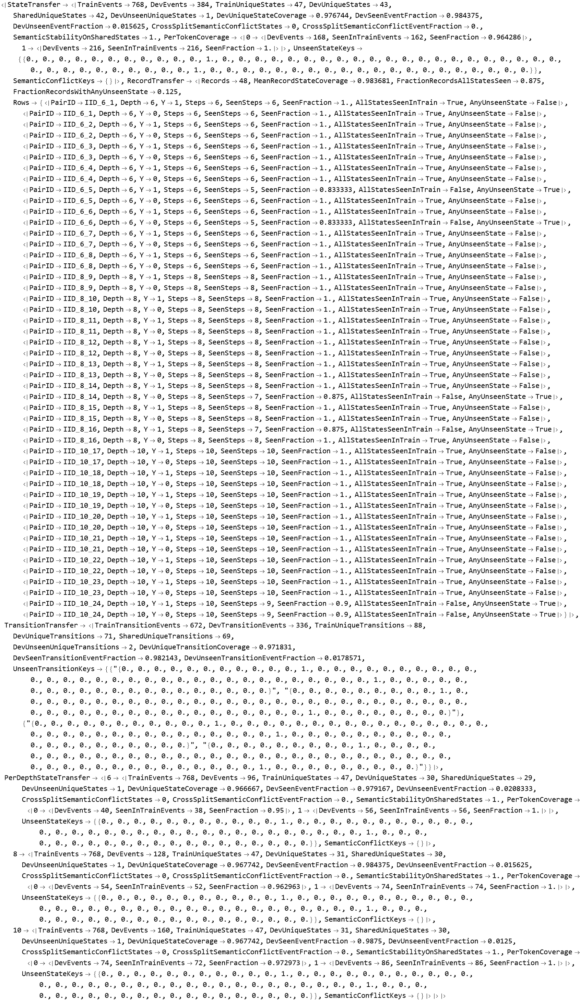

In [1530]:
tcctStateTransferReportS102A =
  stateTransferResultsS102A[
    "TCCTGenericQueryState"
  ];

tcctStateTransferReportS102A

<|StateTransfer -> 
 
>    <|TrainEvents -> 768, DevEvents -> 384, TrainUniqueStates -> 47, 
 
>     DevUniqueStates -> 43, SharedUniqueStates -> 42, DevUnseenUniqueStates -> 1, 
 
>     DevUniqueStateCoverage -> 0.976744, DevSeenEventFraction -> 0.984375, 
 
>     DevUnseenEventFraction -> 0.015625, CrossSplitSemanticConflictStates -> 0, 
 
>     CrossSplitSemanticConflictEventFraction -> 0., 
 
>     SemanticStabilityOnSharedStates -> 1., 
 
>     PerTokenCoverage -> 
 
>      <|0 -> <|DevEvents -> 168, SeenInTrainEvents -> 162, SeenFraction -> 0.964286|>, 
 
>       1 -> <|DevEvents -> 216, SeenInTrainEvents -> 216, SeenFraction -> 1.|>|>, 
 
>     UnseenStateKeys -> 
 
>      {{0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0.,\
 
>        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,\
 
>        0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,\
 
>        0., 0., 0., 0.}}, SemanticConflictKeys -> {}|>, 
 
>   RecordTransfer -> 
 
>    <|Records -> 48, MeanRecordStateCoverage -> 0.983681, 
 
>     FractionRecordsAllStatesSeen -> 0.875, FractionRecordsWithAnyUnseenState -> 0.125, 
 
>     Rows -> {<|PairID -> IID_6_1, Depth -> 6, Y -> 1, Steps -> 6, SeenSteps -> 6, 
 
>        SeenFraction -> 1., AllStatesSeenInTrain -> True, AnyUnseenState -> False|>, 
 
>       <|PairID -> IID_6_1, Depth -> 6, Y -> 0, Steps -> 6, SeenSteps -> 6, 
 
>        SeenFraction -> 1., AllStatesSeenInTrain -> True, AnyUnseenState -> False|>, 
 
>       <|PairID -> IID_6_2, Depth -> 6, Y -> 1, Steps -> 6, SeenSteps -> 6, 
 
>        SeenFraction -> 1., AllStatesSeenInTrain -> True, AnyUnseenState -> False|>, 
 
>       <|PairID -> IID_6_2, Depth -> 6, Y -> 0, Steps -> 6, SeenSteps -> 6, 
 
>        SeenFraction -> 1., AllStatesSeenInTrain -> True, AnyUnseenState -> False|>, 
 
>       <|PairID -> IID_6_3, Depth -> 6, Y -> 1, Steps -> 6, SeenSteps -> 6, 
 
>        SeenFraction -> 1., AllStatesSeenInTrain -> True, AnyUnseenState -> False|>, 
 
>       <|PairID -> IID_6_3, Depth -> 6, Y -> 0, Steps -> 6, SeenSteps -> 6, 
 
>        SeenFraction -> 1., AllStatesSeenInTrain -> True, AnyUnseenState -> False|>, 
 
>       <|PairID -> IID_6_4, Depth -> 6, Y -> 1, Steps -> 6, SeenSteps -> 6, 
 
>        SeenFraction -> 1., AllStatesSeenInTrain -> True, AnyUnseenState -> False|>, 
 
>       <|PairID -> IID_6_4, Depth -> 6, Y -> 0, Steps -> 6, SeenSteps -> 6, 
 
>        SeenFraction -> 1., AllStatesSeenInTrain -> True, AnyUnseenState -> False|>, 
 
>       <|PairID -> IID_6_5, Depth -> 6, Y -> 1, Steps -> 6, SeenSteps -> 5, 
 
>        SeenFraction -> 0.833333, AllStatesSeenInTrain -> False, 
 
>        AnyUnseenState -> True|>, <|PairID -> IID_6_5, Depth -> 6, Y -> 0, Steps -> 6, 
 
>        SeenSteps -> 6, SeenFraction -> 1., AllStatesSeenInTrain -> True, 
 
>        AnyUnseenState -> False|>, 
 
>       <|PairID -> IID_6_6, Depth -> 6, Y -> 1, Steps -> 6, SeenSteps -> 6, 
 
>        SeenFraction -> 1., AllStatesSeenInTrain -> True, AnyUnseenState -> False|>, 
 
>       <|PairID -> IID_6_6, Depth -> 6, Y -> 0, Steps -> 6, SeenSteps -> 5, 
 
>        SeenFraction -> 0.833333, AllStatesSeenInTrain -> False, 
 
>        AnyUnseenState -> True|>, <|PairID -> IID_6_7, Depth -> 6, Y -> 1, Steps -> 6, 
 
>        SeenSteps -> 6, SeenFraction -> 1., AllStatesSeenInTrain -> True, 
 
>        AnyUnseenState -> False|>, 
 
>       <|PairID -> IID_6_7, Depth -> 6, Y -> 0, Steps -> 6, SeenSteps -> 6, 
 
>        SeenFraction -> 1., AllStatesSeenInTrain -> True, AnyUnseenState -> False|>, 
 
>       <|PairID -> IID_6_8, Depth -> 6, Y -> 1, Steps -> 6, SeenSteps -> 6, 
 
>        SeenFraction -> 1., AllStatesSeenInTrain -> True, AnyUnseenState -> False|>, 
 
>       <|PairID -> IID_6_8, Depth -> 6, Y -> 0, Steps -> 6, SeenSteps -> 6, 
 
>        SeenFraction -> 1., AllStatesSeenInTrain -> True, AnyUnseenState -> False|>, 
 
>       <|PairID -> IID_8_9, Depth -> 8, Y -> 1, Steps
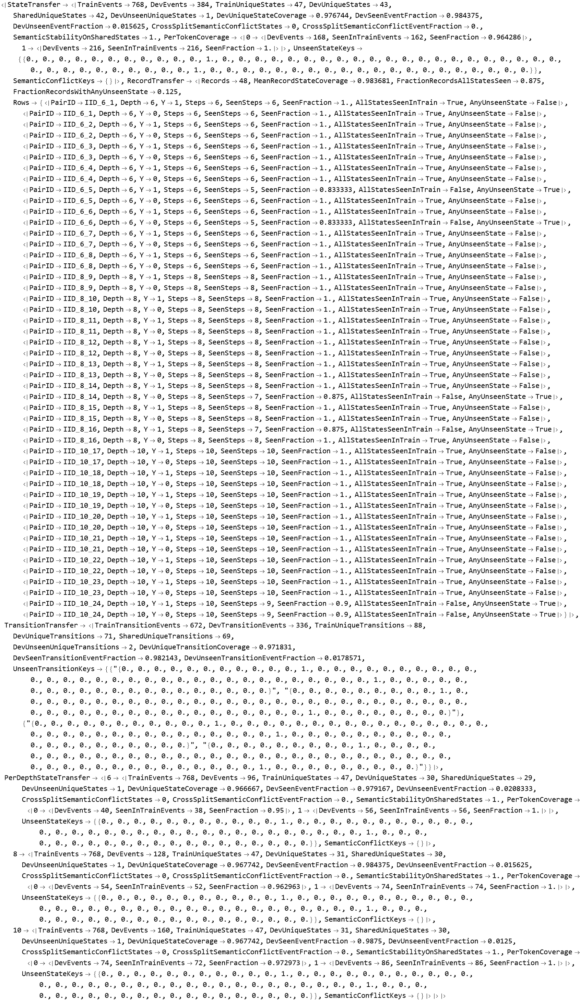

In [1536]:
tcctStateTransferReportS102A =
  stateTransferResultsS102A[
    "TCCTGenericQueryState"
  ];

tcctStateTransferReportS102A

STOP: S102A / TCCT definitions missing.
S102B development hash = 2ba43cdcee0056a19a07bfe8c812f6b265965d69a4c3f182f7f1\
 
>    f9cc9d72e981
Train records = 96 | Dev records = 48
OOD will NOT be accessed.
Computing TRAIN dynamic traces...
Computing DEV dynamic traces...
Dynamic observer matches historical core = True
Dynamic representation dimension audit = 
 
>   <|ReachedTraceStructureOnly -> 
 
>     <|AllStepDimensions64 -> True, MinSequenceLength -> 11, 
 
>      MaxSequenceLength -> 26, MeanSequenceLength -> 14.7083|>, 
 
>    DynamicReachedQueryTrace -> 
 
>     <|AllStepDimensions64 -> True, MinSequenceLength -> 11, 
 
>      MaxSequenceLength -> 26, MeanSequenceLength -> 14.7083|>|>
Metadata/label invariance = <|ReachedTraceStructureOnly -> True, 
 
>    DynamicReachedQueryTrace -> True|>
Forbidden representation hits = {}
Training ReachedTraceStructureOnly | seed 9301 ...
  done in 24.1326 sec
Training ReachedTraceStructureOnly | seed 9302 ...
  done in 21.8676 sec
Training Rea

$Aborted
Dataset[{<|Mode -> ReachedTraceStructureOnly, Seed -> 9301, 
 
>     InitHash -> a96ca1568e062c5e598211fbb07e3d67395803f103773b65940ae6ea01e9c67a, 
 
>     TrainingSeconds -> 24.1326, TrainBA -> 0.572917, TrainPairAccuracy -> 0.572917, 
 
>     DevBA -> 0.458333, DevPairAccuracy -> 0.479167, 
 
>     DevPerDepthBA -> <|6 -> 0.4375, 8 -> 0.5, 10 -> 0.4375|>, 
 
>     DevPerDepthPair -> <|6 -> 0.5, 8 -> 0.5, 10 -> 0.4375|>|>, 
 
>    <|Mode -> ReachedTraceStructureOnly, Seed -> 9302, 
 
>     InitHash -> 0362b5abd8d440ce1b606d9de08e91b7c135af023ab536a99c821b5d8ea7e13d, 
 
>     TrainingSeconds -> 21.8676, TrainBA -> 0.572917, TrainPairAccuracy -> 0.572917, 
 
>     DevBA -> 0.458333, DevPairAccuracy -> 0.479167, 
 
>     DevPerDepthBA -> <|6 -> 0.4375, 8 -> 0.5, 10 -> 0.4375|>, 
 
>     DevPerDepthPair -> <|6 -> 0.5, 8 -> 0.5, 10 -> 0.4375|>|>, 
 
>    <|Mode -> ReachedTraceStructureOnly, Seed -> 9303, 
 
>     InitHash -> 58c5a06553aded5dd9fcadf96b20718270512eac0b5d3c9048b532e9064d842d, 
 
>     TrainingSeconds -> 21.3757, TrainBA -> 0.572917, TrainPairAccuracy -> 0.572917, 
 
>     DevBA -> 0.479167, DevPairAccuracy -> 0.4375, 
 
>     DevPerDepthBA -> <|6 -> 0.5, 8 -> 0.5, 10 -> 0.4375|>, 
 
>     DevPerDepthPair -> <|6 -> 0.375, 8 -> 0.5, 10 -> 0.4375|>|>, 
 
>    <|Mode -> ReachedTraceStructureOnly, Seed -> 9304, 
 
>     InitHash -> 4c77646671600352070e0a5952ce58bae7f433cfe958fea1a855b88aa5522500, 
 
>     TrainingSeconds -> 21.5006, TrainBA -> 0.572917, TrainPairAccuracy -> 0.572917, 
 
>     DevBA -> 0.4375, DevPairAccuracy -> 0.4375, 
 
>     DevPerDepthBA -> <|6 -> 0.375, 8 -> 0.5, 10 -> 0.4375|>, 
 
>     DevPerDepthPair -> <|6 -> 0.375, 8 -> 0.5, 10 -> 0.4375|>|>, 
 
>    <|Mode -> ReachedTraceStructureOnly, Seed -> 9305, 
 
>     InitHash -> ed65bb4a8a356d43833d39b11c66edc894d14918d6961e3fa3ecb65e96401272, 
 
>     TrainingSeconds -> 21.5319, TrainBA -> 0.5625, TrainPairAccuracy -> 0.572917, 
 
>     DevBA -> 0.479167, DevPairAccuracy -> 0.479167, 
 
>     DevPerDepthBA -> <|6 -> 0.5, 8 -> 0.5, 10 -> 0.4375|>, 
 
>     DevPerDepthPair -> <|6 -> 0.5, 8 -> 0.5, 10 -> 0.4375|>|>, 
 
>    <|Mode -> DynamicReachedQueryTrace, Seed -> 9301, 
 
>     InitHash -> a96ca1568e062c5e598211fbb07e3d67395803f103773b65940ae6ea01e9c67a, 
 
>     TrainingSeconds -> 21.9465, TrainBA -> 0.5625, TrainPairAccuracy -> 0.572917, 
 
>     DevBA -> 0.458333, DevPairAccuracy -> 0.4375, 
 
>     DevPerDepthBA -> <|6 -> 0.4375, 8 -> 0.5, 10 -> 0.4375|>, 
 
>     DevPerDepthPair -> <|6 -> 0.375, 8 -> 0.5, 10 -> 0.4375|>|>, 
 
>    <|Mode -> DynamicReachedQueryTrace, Seed -> 9302, 
 
>     InitHash -> 0362b5abd8d440ce1b606d9de08e91b7c135af023ab536a99c821b5d8ea7e13d, 
 
>     TrainingSeconds -> 20.9161, TrainBA -> 0.510417, TrainPairAccuracy -> 0.510417, 
 
>     DevBA -> 0.5, DevPairAccuracy -> 0.520833, 
 
>     DevPerDepthBA -> <|6 -> 0.5, 8 -> 0.5, 10 -> 0.5|>, 
 
>     DevPerDepthPair -> <|6 -> 0.5, 8 -> 0.625, 10 -> 0.4375|>|>, 
 
>    <|Mode -> DynamicReachedQueryTrace, Seed -> 9303, 
 
>     InitHash -> 58c5a06553aded5dd9fcadf96b20718270512eac0b5d3c9048b532e9064d842d, 
 
>     TrainingSeconds -> 21.7377, TrainBA -> 0.5, TrainPairAccuracy -> 0.510417, 
 
>     DevBA -> 0.520833, DevPairAccuracy -> 0.479167, 
 
>     DevPerDepthBA -> <|6 -> 0.5, 8 -> 0.5, 10 -> 0.5625|>, 
 
>     DevPerDepthPair -> <|6 -> 0.5, 8 -> 0.375, 10 -> 0.5625|>|>, 
 
>    <|Mode -> DynamicReachedQueryTrace, Seed -> 9304, 
 
>     InitHash -> 4c77646671600352070e0a5952ce58bae7f433cfe958fea1a855b88aa5522500, 
 
>     TrainingSeconds -> 22.1382, TrainBA -> 0.510417, TrainPairAccuracy -> 0.510417, 
 
>     DevBA -> 0.479167, DevPairAccuracy -> 0.520833, 
 
>     DevPerDepthBA -> <|6 -> 0.5, 8 -> 0.5, 10 -> 0.4375|>, 
 
>     DevPerDepthPair -> <|6 -> 0.5, 8 -> 0.625, 10 -> 0.4375|>|>, 
 
>    <|Mode -> DynamicReachedQueryTrace, Seed -> 9305, 
 
>     InitHash -> ed65bb4a8a356d43833d39b11c66edc894d14918d6961e3fa3ecb65e96401272, 
 
>     TrainingSeconds -> 20.465,
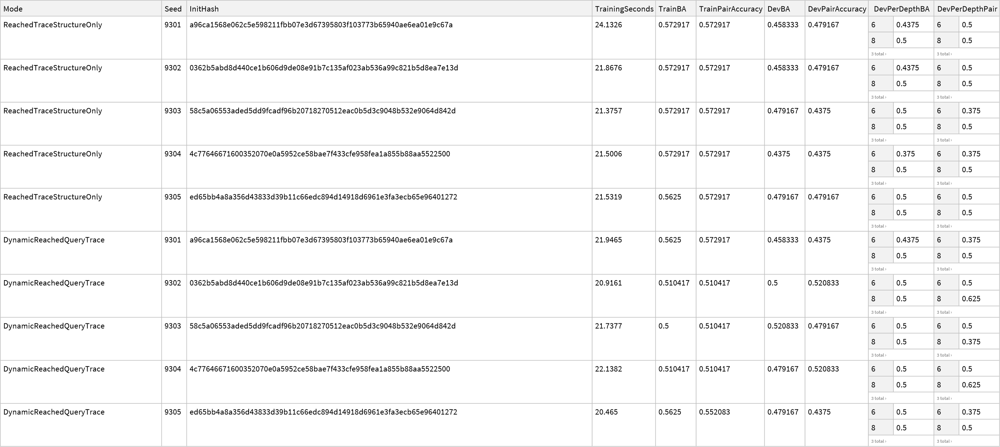

In [1542]:
(* ============================================================ *)
(* S102B                                                        *)
(* Dynamic deterministic TCCT task-head development             *)
(*                                                              *)
(* DEVELOPMENT ONLY                                             *)
(* TRAIN = trainRecords                                         *)
(* DEV   = iidRecords                                           *)
(* OOD   = NEVER ACCESSED                                       *)
(*                                                              *)
(* New modes:                                                   *)
(* 1. ReachedTraceStructureOnly                                 *)
(* 2. DynamicReachedQueryTrace                                  *)
(*                                                              *)
(* Same GRU64 head as S102A                                     *)
(* ============================================================ *)

ClearAll[
  S102BDynamicTrace,
  S102BHeaderVector,
  S102BRoundDelimiter,
  S102BEventVector,
  S102BSerializeTrace,
  S102BBuildData,
  S102BMetadataInvariantQ,
  S102BRunOne,
  S102BSummarizeMode
];


(* ============================================================ *)
(* 0. PREFLIGHT                                                 *)
(* ============================================================ *)

If[
  !And[
    ValueQ[trainRecords],
    ValueQ[iidRecords],
    ValueQ[s102ABaseHead],
    ValueQ[s102ASeeds],
    ValueQ[summaryByModeS102A],
    Length[DownValues[TCCTBuildCaseS101]] > 0,
    Length[DownValues[TCCTPackS101]] > 0,
    Length[DownValues[TCCTSigLevelsS101]] > 0,
    Length[DownValues[TCCTEncodePairS101]] > 0
  ],

  Print["STOP: S102A / TCCT definitions missing."];
  Abort[];
];


developmentHashS102B =
  Hash[
    {
      trainRecords,
      iidRecords
    },
    "SHA256",
    "HexString"
  ];


Print[
  "S102B development hash = ",
  developmentHashS102B
];

Print[
  "Train records = ",
  Length[trainRecords],
  " | Dev records = ",
  Length[iidRecords]
];

Print[
  "OOD will NOT be accessed."
];


s102BInputDim = 64;

s102BModes = {
  "ReachedTraceStructureOnly",
  "DynamicReachedQueryTrace"
};


(* ============================================================ *)
(* 1. EXACT DYNAMIC TCCT TRACE                                  *)
(*                                                              *)
(* Reproduces the deterministic propagation equations used in   *)
(* TCCTRejectTraceS101, but logs EVERY reached node rather than  *)
(* only reject events.                                          *)
(* ============================================================ *)

S102BDynamicTrace[
  r_Association
] := Module[
  {
    ctx,
    built,
    c,

    p,
    pa,
    id,
    od,
    q,
    n,
    pin,
    pout,
    cin,
    cout,

    vertices,

    h,
    z,
    h2,
    nz,

    j,
    k,

    aps,
    ap,
    pz,
    o,
    zv,

    rf,
    rd,
    dd,
    pg,
    allow,

    active,
    rounds = 0,
    safetyCap,
    terminatedNaturally = False,

    events = {},
    rejects = {},

    codePair
  },


  ctx =
    S102AContext[r];

  built =
    ctx["Built"];

  c =
    ctx["Case"];

  p =
    ctx["Pack"];

  pa = p[[1]];
  id = p[[2]];
  od = p[[3]];
  q = p[[4]];
  n = p[[7]];

  pin = p[[8]];
  pout = p[[9]];
  cin = p[[10]];
  cout = p[[11]];

  vertices =
    p[[12]];


  safetyCap =
    Max[
      64,
      2 n + 8
    ];


  h =
    ConstantArray[
      0,
      n
    ];

  z =
    ConstantArray[
      0,
      n
    ];

  h[[q]] = 1;


  For[
    k = 1,
    k <= safetyCap,
    k++,

    rounds = k;

    h2 =
      ConstantArray[
        0,
        n
      ];

    nz =
      ConstantArray[
        0,
        n
      ];

    active = 0;


    Do[

      aps =
        Select[
          pa[[j]],
          Function[
            u,
            u > 0 &&
            h[[u]] == 1
          ]
        ];

      ap =
        Length[aps];


      If[
        ap > 0,

        pz =
          Max[
            z[[aps]]
          ];

        o =
          Boole[
            ap > 1
          ];

        zv =
          {
            0, 1, 2, 1,
            3, 1, 3, 1
          }[
            [
              1 + 2 pz + o
            ]
          ];

        nz[[j]] = zv;


        rf =
          {
            1,

            Boole[
              zv > 0
            ],

            zv,

            Sign[
              pin[[j]] -
              id[[j]]
            ],

            Sign[
              pout[[j]] -
              id[[j]]
            ],

            Sign[
              cin[[j]] -
              id[[j]]
            ],

            Sign[
              cout[[j]] -
              od[[j]]
            ],

            Sign[
              id[[j]] -
              od[[j]]
            ],

            Sign[
              pout[[j]] -
              cin[[j]]
            ]
          };


        rd =
          tcctRwS101 . rf;


        dd =
          1 -
          cin[[j]] +
          2 cout[[j]];


        pg =
          od[[j]] +
          2 Boole[
            zv > 0
          ] -
          zv;


        allow =
          If[
            rd > 0,
            dd > 0,
            pg > 0
          ];


        codePair =
          S102AEncodedAt[
            ctx,
            vertices[[j]]
          ];


        AppendTo[
          events,

          <|

            "Round" ->
              k,

            "CodePair" ->
              codePair,

            "AP" ->
              ap,

            "PZ" ->
              pz,

            "ZV" ->
              zv,

            "Allowed" ->
              Boole[
                TrueQ[allow]
              ]

          |>
        ];


        If[
          rd > 0 &&
          dd <= 0,

          AppendTo[
            rejects,
            {
              k,
              j
            }
          ]
        ];


        If[
          TrueQ[allow],

          h2[[j]] = 1;

          active++;
        ];

      ],

      {
        j,
        n
      }
    ];


    h = h2;
    z = nz;


    If[
      active == 0,

      terminatedNaturally = True;

      Break[];
    ];

  ];


  <|

    "Events" ->
      events,

    "RoundsExecuted" ->
      rounds,

    "Rejects" ->
      rejects,

    "TerminatedNaturally" ->
      terminatedNaturally,

    "SafetyCap" ->
      safetyCap,

    "PackedNodes" ->
      n,

    "Built" ->
      built

  |>
];


(* ============================================================ *)
(* 2. CORE CONSISTENCY CHECK                                    *)
(*                                                              *)
(* Observer must reproduce historical RejectTrace results.      *)
(* ============================================================ *)

Print[
  "Computing TRAIN dynamic traces..."
];

trainDynamicTraceS102B =
  S102BDynamicTrace /@
    trainRecords;


Print[
  "Computing DEV dynamic traces..."
];

devDynamicTraceS102B =
  S102BDynamicTrace /@
    iidRecords;


coreConsistencyS102B =
  And @@
    MapThread[

      Function[
        {r, tr},

        Module[
          {
            original
          },

          original =
            TCCTRejectTraceS101[
              TCCTBuildCaseS101[r][
                "Case"
              ]
            ];

          And[
            SameQ[
              tr["Rejects"],
              original["Rejects"]
            ],

            SameQ[
              tr["RoundsExecuted"],
              original["RoundsExecuted"]
            ],

            SameQ[
              tr["TerminatedNaturally"],
              original["TerminatedNaturally"]
            ]
          ]
        ]
      ],

      {
        Join[
          trainRecords,
          iidRecords
        ],

        Join[
          trainDynamicTraceS102B,
          devDynamicTraceS102B
        ]
      }
    ];


Print[
  "Dynamic observer matches historical core = ",
  coreConsistencyS102B
];


If[
  !TrueQ[
    coreConsistencyS102B
  ],

  Print[
    "STOP: dynamic observer/core mismatch."
  ];

  Abort[];
];


(* ============================================================ *)
(* 3. 64D HEADER                                                *)
(* ============================================================ *)

S102BHeaderVector[
  r_Association
] := Module[
  {
    v
  },

  v =
    ConstantArray[
      0.,
      s102BInputDim
    ];


  (* primitive query *)

  v[[1 ;; 3]] =
    N@
      UnitVector[
        3,
        r["Start"] + 1
      ];

  v[[4 ;; 6]] =
    N@
      UnitVector[
        3,
        r["Target"] + 1
      ];


  (* token type:
       52 = header
       53 = round delimiter
       54 = reached-node event
  *)

  v[[52]] = 1.;


  v
];


(* ============================================================ *)
(* 4. ROUND DELIMITER                                           *)
(* ============================================================ *)

S102BRoundDelimiter[
  round_Integer,
  totalRounds_Integer
] := Module[
  {
    v,
    bin
  },

  v =
    ConstantArray[
      0.,
      s102BInputDim
    ];


  bin =
    Min[
      8,

      Max[
        1,

        Ceiling[
          8 round /
          Max[
            1,
            totalRounds
          ]
        ]
      ]
    ];


  (* round bin 44..51 *)

  v[[44 ;; 51]] =
    N@
      UnitVector[
        8,
        bin
      ];


  v[[53]] = 1.;


  v
];


(* ============================================================ *)
(* 5. ONE REACHED-NODE EVENT -> 64D                            *)
(*                                                              *)
(* dims  7..31 : frozen structural pair code (25D)              *)
(* dims 32..34 : AP bucket {1,2,3+}                             *)
(* dims 35..38 : PZ = 0..3                                     *)
(* dims 39..42 : ZV = 0..3                                     *)
(* dim      43 : Allowed                                       *)
(* dims 44..51 : relative round bin                             *)
(* dims 52..54 : token type                                    *)
(* ============================================================ *)

S102BEventVector[
  event_Association,
  totalRounds_Integer,
  mode_String
] := Module[
  {
    v,
    pairOH,
    roundBin,
    apBucket
  },


  v =
    ConstantArray[
      0.,
      s102BInputDim
    ];


  pairOH =
    S102APairOneHot[
      event[
        "CodePair"
      ]
    ];


  v[[7 ;; 31]] =
    pairOH;


  roundBin =
    Min[
      8,

      Max[
        1,

        Ceiling[
          8 event["Round"] /
          Max[
            1,
            totalRounds
          ]
        ]
      ]
    ];


  v[[44 ;; 51]] =
    N@
      UnitVector[
        8,
        roundBin
      ];


  v[[54]] = 1.;


  If[
    mode === "DynamicReachedQueryTrace",

    apBucket =
      Min[
        3,
        Max[
          1,
          event["AP"]
        ]
      ];


    v[[32 ;; 34]] =
      N@
        UnitVector[
          3,
          apBucket
        ];


    v[[35 ;; 38]] =
      N@
        UnitVector[
          4,
          event["PZ"] + 1
        ];


    v[[39 ;; 42]] =
      N@
        UnitVector[
          4,
          event["ZV"] + 1
        ];


    v[[43]] =
      N[
        event["Allowed"]
      ];

  ];


  v
];


(* ============================================================ *)
(* 6. SERIALIZE COMPLETE DYNAMIC TRACE                          *)
(*                                                              *)
(* Within each round, events are sorted canonically by          *)
(* structural/dynamic signature.                               *)
(*                                                              *)
(* No numeric node ID is exposed to the task head.              *)
(* ============================================================ *)

S102BSerializeTrace[
  r_Association,
  trace_Association,
  mode_String
] := Module[
  {
    result,
    events,
    rounds,
    roundEvents,
    sortedEvents,
    k
  },


  If[
    !MemberQ[
      s102BModes,
      mode
    ],

    Print[
      "STOP: unknown S102B mode ",
      mode
    ];

    Abort[];
  ];


  events =
    trace[
      "Events"
    ];

  rounds =
    trace[
      "RoundsExecuted"
    ];


  result =
    {
      S102BHeaderVector[
        r
      ]
    };


  Do[

    AppendTo[
      result,

      S102BRoundDelimiter[
        k,
        rounds
      ]
    ];


    roundEvents =
      Select[
        events,
        #["Round"] === k &
      ];


    (* all computations in one historical round are simultaneous;
       sorting prevents packed-node ID from becoming a feature *)

    sortedEvents =
      SortBy[
        roundEvents,

        {
          #["CodePair"],
          #["AP"],
          #["PZ"],
          #["ZV"],
          #["Allowed"]
        } &
      ];


    Scan[

      Function[
        event,

        AppendTo[
          result,

          S102BEventVector[
            event,
            rounds,
            mode
          ]
        ]
      ],

      sortedEvents
    ],

    {
      k,
      rounds
    }
  ];


  result
];


(* ============================================================ *)
(* 7. REPRESENTATION INTEGRITY                                  *)
(* ============================================================ *)

dimensionAuditS102B =
  Association@Table[

    mode -> Module[
      {
        reps
      },

      reps =
        Join[

          MapThread[
            S102BSerializeTrace[
              #1,
              #2,
              mode
            ] &,
            {
              trainRecords,
              trainDynamicTraceS102B
            }
          ],

          MapThread[
            S102BSerializeTrace[
              #1,
              #2,
              mode
            ] &,
            {
              iidRecords,
              devDynamicTraceS102B
            }
          ]
        ];


      <|

        "AllStepDimensions64" ->
          And @@
            Flatten[
              (
                Length[#] ==
                  s102BInputDim &
              ) /@
                # & /@
              reps
            ],

        "MinSequenceLength" ->
          Min[
            Length /@
              reps
          ],

        "MaxSequenceLength" ->
          Max[
            Length /@
              reps
          ],

        "MeanSequenceLength" ->
          N@
            Mean[
              Length /@
                reps
            ]

      |>
    ],

    {
      mode,
      s102BModes
    }
  ];


Print[
  "Dynamic representation dimension audit = ",
  dimensionAuditS102B
];


(* ============================================================ *)
(* 8. LABEL / METADATA INVARIANCE                              *)
(* ============================================================ *)

S102BMetadataInvariantQ[
  mode_String
] := And @@
  MapThread[

    Function[
      {r, trace},

      Module[
        {
          altered,
          alteredTrace
        },

        altered =
          Join[
            r,

            <|
              "Y" ->
                1 - r["Y"],

              "PairID" ->
                "S102B_METADATA_TEST",

              "Depth" ->
                999999
            |>
          ];


        alteredTrace =
          S102BDynamicTrace[
            altered
          ];


        SameQ[
          S102BSerializeTrace[
            r,
            trace,
            mode
          ],

          S102BSerializeTrace[
            altered,
            alteredTrace,
            mode
          ]
        ]

      ]
    ],

    {
      Join[
        trainRecords,
        iidRecords
      ],

      Join[
        trainDynamicTraceS102B,
        devDynamicTraceS102B
      ]
    }
  ];


metadataAuditS102B =
  Association@Table[

    mode ->
      S102BMetadataInvariantQ[
        mode
      ],

    {
      mode,
      s102BModes
    }
  ];


Print[
  "Metadata/label invariance = ",
  metadataAuditS102B
];


If[
  !And @@
    Values[
      metadataAuditS102B
    ],

  Print[
    "STOP: representation depends on evaluation metadata."
  ];

  Abort[];
];


(* ============================================================ *)
(* 9. FORBIDDEN-SYMBOL AUDIT                                    *)
(* ============================================================ *)

definitionTextS102B =
  ToString[
    InputForm[
      {
        DownValues[
          S102BDynamicTrace
        ],
        DownValues[
          S102BSerializeTrace
        ],
        DownValues[
          S102BEventVector
        ]
      }
    ]
  ];


forbiddenSymbolsS102B =
  {
    "BLTruth",
    "BLExecute",
    "ReferenceExecutor",
    "S3Product",
    "ProgramOutput",
    "CorrectDestination",
    "WrongDestination",
    "Continue",
    "Stop",
    "TaskY",
    "[\"Y\"]"
  };


forbiddenHitsS102B =
  Select[
    forbiddenSymbolsS102B,

    StringContainsQ[
      definitionTextS102B,
      #
    ] &
  ];


Print[
  "Forbidden representation hits = ",
  forbiddenHitsS102B
];


If[
  forbiddenHitsS102B =!= {},

  Print[
    "STOP: forbidden information detected."
  ];

  Abort[];
];


(* ============================================================ *)
(* 10. BUILD TRAIN / DEV DATA                                   *)
(* ============================================================ *)

S102BBuildData[
  mode_String,
  records_List,
  traces_List
] := MapThread[

  Function[
    {r, tr},

    {
      S102BSerializeTrace[
        r,
        tr,
        mode
      ],

      r["Y"],

      r["PairID"],

      r["Depth"]
    }
  ],

  {
    records,
    traces
  }
];


dataByModeS102B =
  Association@Table[

    mode -> <|

      "Train" ->
        S102BBuildData[
          mode,
          trainRecords,
          trainDynamicTraceS102B
        ],

      "Dev" ->
        S102BBuildData[
          mode,
          iidRecords,
          devDynamicTraceS102B
        ]

    |>,

    {
      mode,
      s102BModes
    }
  ];


(* ============================================================ *)
(* 11. ONE TRAINING RUN                                         *)
(*                                                              *)
(* EXACT SAME GRU64 HEAD AS S102A                               *)
(* ============================================================ *)

S102BRunOne[
  mode_String,
  seed_Integer
] := Module[
  {
    trainData,
    devData,
    rules,

    initialized,
    initHash,

    trained,
    seconds
  },


  Print[
    "Training ",
    mode,
    " | seed ",
    seed,
    " ..."
  ];


  trainData =
    dataByModeS102B[
      mode
    ][
      "Train"
    ];

  devData =
    dataByModeS102B[
      mode
    ][
      "Dev"
    ];


  rules =
    (
      #[[1]] ->
        #[[2]]
    ) & /@
      trainData;


  initialized =
    NetInitialize[
      s102ABaseHead,

      RandomSeeding ->
        seed
    ];


  initHash =
    Hash[
      initialized,
      "SHA256",
      "HexString"
    ];


  {seconds, trained} =
    AbsoluteTiming[

      NetTrain[
        initialized,
        rules,

        BatchSize ->
          16,

        MaxTrainingRounds ->
          s102ATrainingRounds,

        TargetDevice ->
          "CPU",

        RandomSeeding ->
          seed
      ]

    ];


  Print[
    "  done in ",
    N[seconds],
    " sec"
  ];


  <|

    "Mode" ->
      mode,

    "Seed" ->
      seed,

    "InitHash" ->
      initHash,

    "TrainingSeconds" ->
      N[seconds],

    "TrainBA" ->
      S102ABA[
        trained,
        trainData
      ],

    "TrainPairAccuracy" ->
      S102APairAccuracy[
        trained,
        trainData
      ],

    "DevBA" ->
      S102ABA[
        trained,
        devData
      ],

    "DevPairAccuracy" ->
      S102APairAccuracy[
        trained,
        devData
      ],

    "DevPerDepthBA" ->
      S102APerDepthBA[
        trained,
        devData
      ],

    "DevPerDepthPair" ->
      S102APerDepthPair[
        trained,
        devData
      ],

    "Net" ->
      trained

  |>
];


(* ============================================================ *)
(* 12. 2 MODES x SAME 5 SEEDS                                  *)
(* ============================================================ *)

runsS102B =
  Flatten[
    Table[

      S102BRunOne[
        mode,
        seed
      ],

      {
        mode,
        s102BModes
      },

      {
        seed,
        s102ASeeds
      }
    ],

    1
  ];


rowsS102B =
  KeyDrop[
    #,
    {"Net"}
  ] & /@
    runsS102B;


Dataset[
  rowsS102B
]

<|Stage -> S102B_DynamicTCCT_TaskHead_Development, DevelopmentOnly -> True, 
 
>   PostHocCandidateDevelopment -> True, ProspectiveBlindClaimAllowed -> False, 
 
>   ArchitectureSuperiorityClaimAllowed -> False, OODAccessed -> False, 
 
>   ReferenceExecutorUsed -> False, S3ProductComputedByAdapter -> False, 
 
>   S95SemanticSlotsUsed -> False, SchedulerUsed -> False, 
 
>   HistoricalDeterministicPropagationUsed -> True, 
 
>   DynamicObserverMatchesHistoricalCore -> True, ForbiddenRepresentationHits -> {}, 
 
>   MetadataInvarianceAudit -> 
 
>    <|ReachedTraceStructureOnly -> True, DynamicReachedQueryTrace -> True|>, 
 
>   DimensionAudit -> 
 
>    <|ReachedTraceStructureOnly -> 
 
>      <|AllStepDimensions64 -> True, MinSequenceLength -> 11, MaxSequenceLength -> 26, 
 
>       MeanSequenceLength -> 14.7083|>, 
 
>     DynamicReachedQueryTrace -> 
 
>      <|AllStepDimensions64 -> True, MinSequenceLength -> 11, MaxSequenceLength -> 26, 
 
>       MeanSequenceLength -> 14.7083|>|>, 
 
>   TrainingSeeds -> {9301, 9302, 9303, 9304, 9305}, 
 
>   MatchedInitializationBetweenNewModes -> 
 
>    <|9301 -> True, 9302 -> True, 9303 -> True, 9304 -> True, 9305 -> True|>, 
 
>   Results -> <|ReachedTraceStructureOnly -> 
 
>      <|Mode -> ReachedTraceStructureOnly, Runs -> 5, MeanTrainBA -> 0.570833, 
 
>       MeanTrainPairAccuracy -> 0.572917, MeanDevBA -> 0.4625, 
 
>       MeanDevPairAccuracy -> 0.4625, MinDevPairAccuracy -> 0.4375, 
 
>       MaxDevPairAccuracy -> 0.479167|>, 
 
>     DynamicReachedQueryTrace -> 
 
>      <|Mode -> DynamicReachedQueryTrace, Runs -> 5, MeanTrainBA -> 0.529167, 
 
>       MeanTrainPairAccuracy -> 0.53125, MeanDevBA -> 0.4875, 
 
>       MeanDevPairAccuracy -> 0.479167, MinDevPairAccuracy -> 0.4375, 
 
>       MaxDevPairAccuracy -> 0.520833|>|>, 
 
>   ExistingDevelopmentControls -> 
 
>    <|RawDevPair -> summaryByModeS102A[Raw][MeanDevPairAccuracy], 
 
>     StaticGraphDevPair -> summaryByModeS102A[StaticGraph][MeanDevPairAccuracy], 
 
>     StaticTCCTEncoderDevPair -> 
 
>      summaryByModeS102A[TCCTGenericQueryState][MeanDevPairAccuracy]|>, 
 
>   DynamicGainVsReachedTraceStructureOnly -> 0.0166667, 
 
>   DynamicGainVsRaw -> 0.479167 - 1. summaryByModeS102A[Raw][MeanDevPairAccuracy], 
 
>   DynamicGainVsStaticTCCTEncoder -> 
 
>    0.479167 - 1. summaryByModeS102A[TCCTGenericQueryState][MeanDevPairAccuracy], 
 
>   DevelopmentCandidateGate -> 
 
>    <|RequiredTrainPair -> 0.95, RequiredDevPair -> 0.6, 
 
>     RequiredGainOverBestControl -> 0.05, 
 
>     BestControlDevPair -> 
 
>      Max[0.4625, summaryByModeS102A[Raw][MeanDevPairAccuracy], 
 
>       summaryByModeS102A[StaticGraph][MeanDevPairAccuracy], 
 
>       summaryByModeS102A[TCCTGenericQueryState][MeanDevPairAccuracy]], 
 
>     Passed -> False|>|>
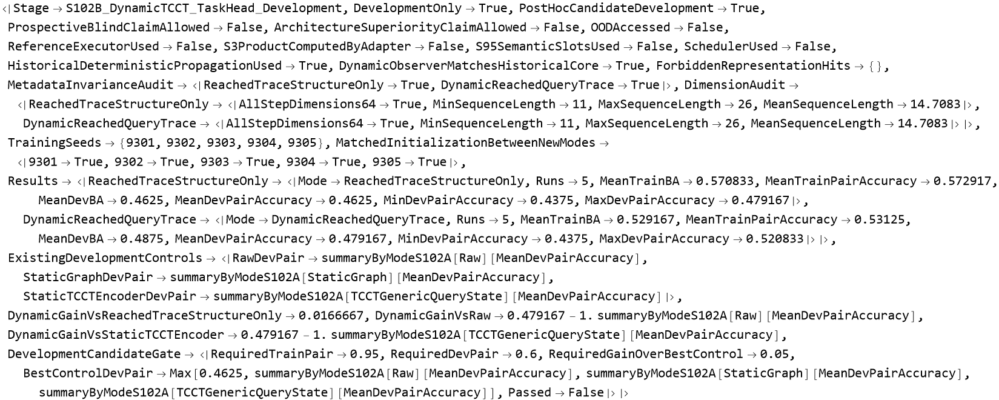

In [1658]:
(* ============================================================ *)
(* 13. SUMMARY                                                  *)
(* ============================================================ *)

S102BSummarizeMode[
  mode_String
] := Module[
  {
    rows
  },

  rows =
    Select[
      rowsS102B,
      #["Mode"] === mode &
    ];


  <|

    "Mode" ->
      mode,

    "Runs" ->
      Length[
        rows
      ],

    "MeanTrainBA" ->
      N@
        Mean[
          Lookup[
            rows,
            "TrainBA"
          ]
        ],

    "MeanTrainPairAccuracy" ->
      N@
        Mean[
          Lookup[
            rows,
            "TrainPairAccuracy"
          ]
        ],

    "MeanDevBA" ->
      N@
        Mean[
          Lookup[
            rows,
            "DevBA"
          ]
        ],

    "MeanDevPairAccuracy" ->
      N@
        Mean[
          Lookup[
            rows,
            "DevPairAccuracy"
          ]
        ],

    "MinDevPairAccuracy" ->
      Min[
        Lookup[
          rows,
          "DevPairAccuracy"
        ]
      ],

    "MaxDevPairAccuracy" ->
      Max[
        Lookup[
          rows,
          "DevPairAccuracy"
        ]
      ]

  |>
];


summaryS102B =
  Association@Table[

    mode ->
      S102BSummarizeMode[
        mode
      ],

    {
      mode,
      s102BModes
    }
  ];


rawDevS102B =
  summaryByModeS102A[
    "Raw"
  ][
    "MeanDevPairAccuracy"
  ];


staticGraphDevS102B =
  summaryByModeS102A[
    "StaticGraph"
  ][
    "MeanDevPairAccuracy"
  ];


staticTCCTDevS102B =
  summaryByModeS102A[
    "TCCTGenericQueryState"
  ][
    "MeanDevPairAccuracy"
  ];


reachedDevS102B =
  summaryS102B[
    "ReachedTraceStructureOnly"
  ][
    "MeanDevPairAccuracy"
  ];


dynamicDevS102B =
  summaryS102B[
    "DynamicReachedQueryTrace"
  ][
    "MeanDevPairAccuracy"
  ];


dynamicTrainS102B =
  summaryS102B[
    "DynamicReachedQueryTrace"
  ][
    "MeanTrainPairAccuracy"
  ];


bestControlDevS102B =
  Max[
    rawDevS102B,
    staticGraphDevS102B,
    staticTCCTDevS102B,
    reachedDevS102B
  ];


(* SAME threshold philosophy as previous S102A gate *)

candidateGateS102B =
  And[
    dynamicTrainS102B >= 0.95,
    dynamicDevS102B >= 0.60,
    dynamicDevS102B >=
      bestControlDevS102B + 0.05
  ];


(* ============================================================ *)
(* 14. INITIALIZATION MATCH CHECK                               *)
(* ============================================================ *)

matchedInitS102B =
  Association@Table[

    seed -> Module[
      {
        hashes
      },

      hashes =
        Lookup[
          Select[
            rowsS102B,
            #["Seed"] === seed &
          ],
          "InitHash"
        ];

      SameQ @@
        hashes
    ],

    {
      seed,
      s102ASeeds
    }
  ];


(* ============================================================ *)
(* 15. FINAL REPORT                                             *)
(* ============================================================ *)

finalS102B =
  <|

    "Stage" ->
      "S102B_DynamicTCCT_TaskHead_Development",

    "DevelopmentOnly" ->
      True,

    "PostHocCandidateDevelopment" ->
      True,

    "ProspectiveBlindClaimAllowed" ->
      False,

    "ArchitectureSuperiorityClaimAllowed" ->
      False,

    "OODAccessed" ->
      False,

    "ReferenceExecutorUsed" ->
      False,

    "S3ProductComputedByAdapter" ->
      False,

    "S95SemanticSlotsUsed" ->
      False,

    "SchedulerUsed" ->
      False,

    "HistoricalDeterministicPropagationUsed" ->
      True,

    "DynamicObserverMatchesHistoricalCore" ->
      coreConsistencyS102B,

    "ForbiddenRepresentationHits" ->
      forbiddenHitsS102B,

    "MetadataInvarianceAudit" ->
      metadataAuditS102B,

    "DimensionAudit" ->
      dimensionAuditS102B,

    "TrainingSeeds" ->
      s102ASeeds,

    "MatchedInitializationBetweenNewModes" ->
      matchedInitS102B,

    "Results" ->
      summaryS102B,

    "ExistingDevelopmentControls" ->
      <|

        "RawDevPair" ->
          rawDevS102B,

        "StaticGraphDevPair" ->
          staticGraphDevS102B,

        "StaticTCCTEncoderDevPair" ->
          staticTCCTDevS102B

      |>,

    "DynamicGainVsReachedTraceStructureOnly" ->
      N[
        dynamicDevS102B -
        reachedDevS102B
      ],

    "DynamicGainVsRaw" ->
      N[
        dynamicDevS102B -
        rawDevS102B
      ],

    "DynamicGainVsStaticTCCTEncoder" ->
      N[
        dynamicDevS102B -
        staticTCCTDevS102B
      ],

    "DevelopmentCandidateGate" ->
      <|

        "RequiredTrainPair" ->
          0.95,

        "RequiredDevPair" ->
          0.60,

        "RequiredGainOverBestControl" ->
          0.05,

        "BestControlDevPair" ->
          bestControlDevS102B,

        "Passed" ->
          candidateGateS102B

      |>

  |>;


finalS102B

S102B-R: TRAIN ONLY diagnostic.
DEV and OOD will NOT be accessed.
Dynamic trace collision audit = 
 
>   <|Records -> 96, RepresentationClasses -> 37, HashGroupingExact -> True, 
 
>    LabelConflictClasses -> 26, 
 
>    ExactRepresentationLabelAccuracyCeiling -> 0.572917, Pairs -> 48, 
 
>    ExactMatchedPairCollisions -> 41, 
 
>    FractionExactMatchedPairCollision -> 0.854167, 
 
>    ExactCollisionPairAccuracyUpperBound -> 0.572917|>
Readout representation audit = <|RoundPooledAll64D -> True, 
 
>    RoundPooledMinLength -> 5, RoundPooledMaxLength -> 12, 
 
>    GlobalPooledAll128D -> True|>
Round pooled collision audit = <|Records -> 96, RepresentationClasses -> 37, 
 
>    HashGroupingExact -> True, LabelConflictClasses -> 26, 
 
>    ExactRepresentationLabelAccuracyCeiling -> 0.572917, Pairs -> 48, 
 
>    ExactMatchedPairCollisions -> 41, 
 
>    FractionExactMatchedPairCollision -> 0.854167, 
 
>    ExactCollisionPairAccuracyUpperBound -> 0.572917|>
Global pooled collision a

<|Stage -> S102B_R_TrainOnlyDynamicReadoutDiagnostic, TrainOnly -> True, 
 
>   DevAccessed -> False, OODAccessed -> False, TCCTCoreChanged -> False, 
 
>   DynamicTraceChanged -> False, OuterReadoutOnlyDiagnostic -> True, 
 
>   HistoricalCoreConsistencyPreviouslyPassed -> True, 
 
>   DynamicTraceCollisionAudit -> 
 
>    <|Records -> 96, RepresentationClasses -> 37, HashGroupingExact -> True, 
 
>     LabelConflictClasses -> 26, ExactRepresentationLabelAccuracyCeiling -> 0.572917, 
 
>     Pairs -> 48, ExactMatchedPairCollisions -> 41, 
 
>     FractionExactMatchedPairCollision -> 0.854167, 
 
>     ExactCollisionPairAccuracyUpperBound -> 0.572917|>, 
 
>   RoundPooledCollisionAudit -> 
 
>    <|Records -> 96, RepresentationClasses -> 37, HashGroupingExact -> True, 
 
>     LabelConflictClasses -> 26, ExactRepresentationLabelAccuracyCeiling -> 0.572917, 
 
>     Pairs -> 48, ExactMatchedPairCollisions -> 41, 
 
>     FractionExactMatchedPairCollision -> 0.854167, 
 
>     ExactCollisionPairAccuracyUpperBound -> 0.572917|>, 
 
>   GlobalPooledCollisionAudit -> 
 
>    <|Records -> 96, RepresentationClasses -> 37, HashGroupingExact -> True, 
 
>     LabelConflictClasses -> 26, ExactRepresentationLabelAccuracyCeiling -> 0.572917, 
 
>     Pairs -> 48, ExactMatchedPairCollisions -> 41, 
 
>     FractionExactMatchedPairCollision -> 0.854167, 
 
>     ExactCollisionPairAccuracyUpperBound -> 0.572917|>, 
 
>   LinearizedGRU -> <|MeanTrainBA -> 0.529167, MeanTrainPairAccuracy -> 0.53125|>, 
 
>   RoundPooledGRU -> 
 
>    <|Runs -> 5, MeanTrainBA -> 0.570833, MinTrainBA -> 0.5625, MaxTrainBA -> 0.572917, 
 
>     MeanTrainPairAccuracy -> 0.56875, MinTrainPairAccuracy -> 0.552083, 
 
>     MaxTrainPairAccuracy -> 0.572917|>, 
 
>   GlobalPooledMLP -> 
 
>    <|Runs -> 5, MeanTrainBA -> 0.572917, MinTrainBA -> 0.572917, 
 
>     MaxTrainBA -> 0.572917, MeanTrainPairAccuracy -> 0.572917, 
 
>     MinTrainPairAccuracy -> 0.572917, MaxTrainPairAccuracy -> 0.572917|>|>
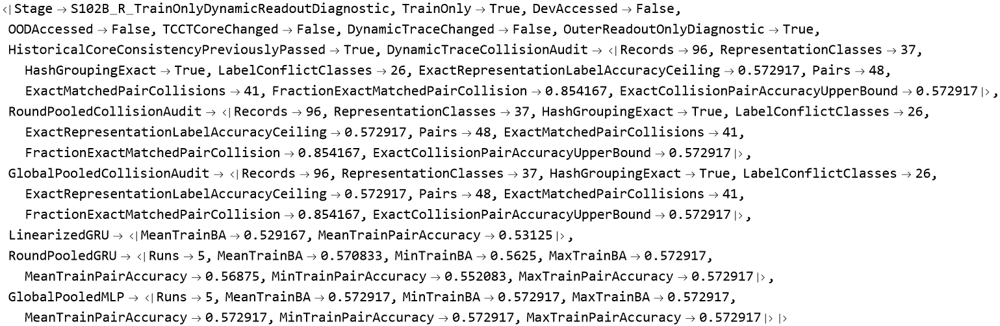

In [1685]:
(* ============================================================ *)
(* S102B-R                                                      *)
(* TRAIN-ONLY Dynamic Readout / Serialization Diagnostic        *)
(*                                                              *)
(* NO DEV                                                       *)
(* NO OOD                                                       *)
(* NO TCCT core change                                          *)
(* NO adapter change                                            *)
(* NO reference executor                                        *)
(*                                                              *)
(* Tests:                                                       *)
(*  A. Exact representation collisions                          *)
(*  B. Existing linearized GRU                                  *)
(*  C. Round-pooled GRU                                         *)
(*  D. Global pooled MLP                                        *)
(* ============================================================ *)

ClearAll[
  S102BRKey,
  S102BRCollisionAudit,
  S102BRRoundPooledSequence,
  S102BRGlobalPooledVector,
  S102BRBuildSequenceData,
  S102BRBuildVectorData,
  S102BRRunRoundGRU,
  S102BRRunGlobalMLP,
  S102BRSummarize
];


(* ============================================================ *)
(* 0. PREFLIGHT                                                 *)
(* ============================================================ *)

If[
  !And[
    ValueQ[trainRecords],
    ValueQ[trainDynamicTraceS102B],
    ValueQ[dataByModeS102B],
    ValueQ[rowsS102B],
    ValueQ[s102ABaseHead],
    ValueQ[s102ASeeds]
  ],

  Print["STOP: S102B results are missing."];
  Abort[];
];


Print[
  "S102B-R: TRAIN ONLY diagnostic."
];

Print[
  "DEV and OOD will NOT be accessed."
];


s102BRMode =
  "DynamicReachedQueryTrace";

s102BRInputDim = 64;

s102BRSeeds =
  s102ASeeds;

s102BRRounds =
  500;


(* ============================================================ *)
(* 1. EXACT REPRESENTATION COLLISION AUDIT                      *)
(* ============================================================ *)

S102BRKey[x_] :=
  Hash[
    x,
    "SHA256",
    "HexString"
  ];


S102BRCollisionAudit[
  data_List
] := Module[
  {
    representationGroups,
    pairGroups,
    hashExact,
    conflictingGroups,
    pairCollisions,
    ceilingCorrect
  },


  representationGroups =
    Values@
      GroupBy[
        data,
        S102BRKey[
          #[[1]]
        ] &
      ];


  hashExact =
    And @@
      Table[

        SameQ @@
          g[[All, 1]],

        {
          g,
          representationGroups
        }
      ];


  conflictingGroups =
    Select[
      representationGroups,

      Length[
        DeleteDuplicates[
          #[[All, 2]]
        ]
      ] > 1 &
    ];


  ceilingCorrect =
    Total[
      Table[

        Max[
          Values[
            Counts[
              g[[All, 2]]
            ]
          ]
        ],

        {
          g,
          representationGroups
        }
      ]
    ];


  pairGroups =
    Values@
      GroupBy[
        data,
        #[[3]] &
      ];


  pairCollisions =
    Table[

      Module[
        {
          pos,
          neg
        },

        pos =
          SelectFirst[
            g,
            #[[2]] === 1 &
          ];

        neg =
          SelectFirst[
            g,
            #[[2]] === 0 &
          ];


        SameQ[
          pos[[1]],
          neg[[1]]
        ]

      ],

      {
        g,
        pairGroups
      }
    ];


  <|

    "Records" ->
      Length[data],

    "RepresentationClasses" ->
      Length[
        representationGroups
      ],

    "HashGroupingExact" ->
      hashExact,

    "LabelConflictClasses" ->
      Length[
        conflictingGroups
      ],

    "ExactRepresentationLabelAccuracyCeiling" ->
      N[
        ceilingCorrect /
        Length[data]
      ],

    "Pairs" ->
      Length[
        pairGroups
      ],

    "ExactMatchedPairCollisions" ->
      Count[
        pairCollisions,
        True
      ],

    "FractionExactMatchedPairCollision" ->
      N@
        Mean[
          Boole /@
            pairCollisions
        ],

    "ExactCollisionPairAccuracyUpperBound" ->
      N[
        1. -
        0.5
        Mean[
          Boole /@
            pairCollisions
        ]
      ]

  |>
];


dynamicTrainDataExistingS102BR =
  dataByModeS102B[
    s102BRMode
  ][
    "Train"
  ];


dynamicCollisionAuditS102BR =
  S102BRCollisionAudit[
    dynamicTrainDataExistingS102BR
  ];


Print[
  "Dynamic trace collision audit = ",
  dynamicCollisionAuditS102BR
];


(* ============================================================ *)
(* 2. ROUND-POOLED REPRESENTATION                               *)
(*                                                              *)
(* Critical change is ONLY OUTER READOUT REPRESENTATION:        *)
(*                                                              *)
(* all reached-node events in the same TCCT round are           *)
(* MEAN-POOLED.                                                  *)
(*                                                              *)
(* Thus no arbitrary within-round ordering is exposed.          *)
(* TCCT computation itself is unchanged.                        *)
(* ============================================================ *)

S102BRRoundPooledSequence[
  r_Association,
  trace_Association
] := Module[
  {
    events,
    rounds,
    roundVectors,
    roundEvents,
    eventVectors
  },


  events =
    trace[
      "Events"
    ];

  rounds =
    trace[
      "RoundsExecuted"
    ];


  roundVectors =
    Table[

      roundEvents =
        Select[
          events,
          #["Round"] === k &
        ];


      If[
        roundEvents === {},

        ConstantArray[
          0.,
          s102BRInputDim
        ],

        eventVectors =
          (
            S102BEventVector[
              #,
              rounds,
              "DynamicReachedQueryTrace"
            ] &
          ) /@
            roundEvents;


        N@
          Mean[
            eventVectors
          ]
      ],

      {
        k,
        rounds
      }
    ];


  Join[
    {
      S102BHeaderVector[
        r
      ]
    },

    roundVectors
  ]
];


(* ============================================================ *)
(* 3. GLOBAL-POOLED REPRESENTATION                              *)
(*                                                              *)
(* Even simpler diagnostic:                                     *)
(*                                                              *)
(* [query header || mean(all reached-node dynamic vectors)]      *)
(*                                                              *)
(* 128D fixed vector.                                           *)
(* If this easily memorizes Train, dynamic trace clearly        *)
(* contains readable task signal and sequence serialization was *)
(* unnecessary.                                                 *)
(* ============================================================ *)

S102BRGlobalPooledVector[
  r_Association,
  trace_Association
] := Module[
  {
    events,
    rounds,
    eventVectors,
    pooled
  },


  events =
    trace[
      "Events"
    ];

  rounds =
    trace[
      "RoundsExecuted"
    ];


  If[
    events === {},

    pooled =
      ConstantArray[
        0.,
        s102BRInputDim
      ],

    eventVectors =
      (
        S102BEventVector[
          #,
          rounds,
          "DynamicReachedQueryTrace"
        ] &
      ) /@
        events;


    pooled =
      N@
        Mean[
          eventVectors
        ]
  ];


  Join[
    S102BHeaderVector[
      r
    ],

    pooled
  ]
];


(* ============================================================ *)
(* 4. REPRESENTATION DIMENSION AUDIT                            *)
(* ============================================================ *)

roundPooledTrainRepsS102BR =
  MapThread[
    S102BRRoundPooledSequence,
    {
      trainRecords,
      trainDynamicTraceS102B
    }
  ];


globalPooledTrainRepsS102BR =
  MapThread[
    S102BRGlobalPooledVector,
    {
      trainRecords,
      trainDynamicTraceS102B
    }
  ];


dimensionAuditS102BR =
  <|

    "RoundPooledAll64D" ->
      And @@
        Flatten[
          Table[
            Length[v] ==
              64,
            {
              seq,
              roundPooledTrainRepsS102BR
            },
            {
              v,
              seq
            }
          ]
        ],

    "RoundPooledMinLength" ->
      Min[
        Length /@
          roundPooledTrainRepsS102BR
      ],

    "RoundPooledMaxLength" ->
      Max[
        Length /@
          roundPooledTrainRepsS102BR
      ],

    "GlobalPooledAll128D" ->
      And @@
        (
          Length[#] ==
            128 &
        ) /@
          globalPooledTrainRepsS102BR

  |>;


Print[
  "Readout representation audit = ",
  dimensionAuditS102BR
];


(* ============================================================ *)
(* 5. BUILD TRAIN DATA                                          *)
(* ============================================================ *)

S102BRBuildSequenceData[] :=
  Table[

    {
      roundPooledTrainRepsS102BR[[i]],

      trainRecords[[i]][
        "Y"
      ],

      trainRecords[[i]][
        "PairID"
      ],

      trainRecords[[i]][
        "Depth"
      ]
    },

    {
      i,
      Length[
        trainRecords
      ]
    }
  ];


S102BRBuildVectorData[] :=
  Table[

    {
      globalPooledTrainRepsS102BR[[i]],

      trainRecords[[i]][
        "Y"
      ],

      trainRecords[[i]][
        "PairID"
      ],

      trainRecords[[i]][
        "Depth"
      ]
    },

    {
      i,
      Length[
        trainRecords
      ]
    }
  ];


roundTrainDataS102BR =
  S102BRBuildSequenceData[];


globalTrainDataS102BR =
  S102BRBuildVectorData[];


(* ============================================================ *)
(* 6. COLLISION AUDIT AFTER ROUND/GLOBAL POOLING                *)
(* ============================================================ *)

roundCollisionAuditS102BR =
  S102BRCollisionAudit[
    roundTrainDataS102BR
  ];


globalCollisionAuditS102BR =
  S102BRCollisionAudit[
    globalTrainDataS102BR
  ];


Print[
  "Round pooled collision audit = ",
  roundCollisionAuditS102BR
];


Print[
  "Global pooled collision audit = ",
  globalCollisionAuditS102BR
];


(* ============================================================ *)
(* 7. ROUND-POOLED GRU                                          *)
(*                                                              *)
(* EXACT SAME GRU64 HEAD as Raw/S102A/S102B                     *)
(* ============================================================ *)

S102BRRunRoundGRU[
  seed_Integer
] := Module[
  {
    initialized,
    trained,
    rules,
    seconds
  },


  Print[
    "Training RoundPooledGRU | seed ",
    seed,
    " ..."
  ];


  rules =
    (
      #[[1]] ->
        #[[2]]
    ) & /@
      roundTrainDataS102BR;


  initialized =
    NetInitialize[
      s102ABaseHead,

      RandomSeeding ->
        seed
    ];


  {seconds, trained} =
    AbsoluteTiming[

      NetTrain[
        initialized,
        rules,

        BatchSize ->
          16,

        MaxTrainingRounds ->
          s102BRRounds,

        TargetDevice ->
          "CPU",

        RandomSeeding ->
          seed
      ]

    ];


  <|

    "Seed" ->
      seed,

    "TrainingSeconds" ->
      N[seconds],

    "TrainBA" ->
      S102ABA[
        trained,
        roundTrainDataS102BR
      ],

    "TrainPairAccuracy" ->
      S102APairAccuracy[
        trained,
        roundTrainDataS102BR
      ]

  |>
];


(* ============================================================ *)
(* 8. GLOBAL POOLED MLP                                         *)
(*                                                              *)
(* No recurrence at all.                                        *)
(* This is only a trainability diagnostic.                       *)
(* ============================================================ *)

globalMLPBaseS102BR =
  NetChain[

    {
      LinearLayer[128],
      Ramp,

      LinearLayer[64],
      Ramp,

      LinearLayer[2],
      SoftmaxLayer[]
    },

    "Input" ->
      128,

    "Output" ->
      NetDecoder[
        {
          "Class",
          {0, 1}
        }
      ]
  ];


S102BRRunGlobalMLP[
  seed_Integer
] := Module[
  {
    initialized,
    trained,
    rules,
    seconds
  },


  Print[
    "Training GlobalPooledMLP | seed ",
    seed,
    " ..."
  ];


  rules =
    (
      #[[1]] ->
        #[[2]]
    ) & /@
      globalTrainDataS102BR;


  initialized =
    NetInitialize[
      globalMLPBaseS102BR,

      RandomSeeding ->
        seed
    ];


  {seconds, trained} =
    AbsoluteTiming[

      NetTrain[
        initialized,
        rules,

        BatchSize ->
          16,

        MaxTrainingRounds ->
          s102BRRounds,

        TargetDevice ->
          "CPU",

        RandomSeeding ->
          seed
      ]

    ];


  <|

    "Seed" ->
      seed,

    "TrainingSeconds" ->
      N[seconds],

    "TrainBA" ->
      S102ABA[
        trained,
        globalTrainDataS102BR
      ],

    "TrainPairAccuracy" ->
      S102APairAccuracy[
        trained,
        globalTrainDataS102BR
      ]

  |>
];


(* ============================================================ *)
(* 9. RUN SAME 5 SEEDS                                          *)
(* ============================================================ *)

roundRunsS102BR =
  S102BRRunRoundGRU /@
    s102BRSeeds;


globalRunsS102BR =
  S102BRRunGlobalMLP /@
    s102BRSeeds;


(* ============================================================ *)
(* 10. EXISTING LINEARIZED-GRU TRAIN RESULT                     *)
(*                                                              *)
(* No retraining necessary.                                     *)
(* ============================================================ *)

linearizedRowsS102BR =
  Select[
    rowsS102B,

    #["Mode"] ===
      "DynamicReachedQueryTrace" &
  ];


linearizedTrainSummaryS102BR =
  <|

    "MeanTrainBA" ->
      N@
        Mean[
          Lookup[
            linearizedRowsS102BR,
            "TrainBA"
          ]
        ],

    "MeanTrainPairAccuracy" ->
      N@
        Mean[
          Lookup[
            linearizedRowsS102BR,
            "TrainPairAccuracy"
          ]
        ]

  |>;


(* ============================================================ *)
(* 11. SUMMARY                                                  *)
(* ============================================================ *)

S102BRSummarize[
  rows_List
] :=
  <|

    "Runs" ->
      Length[rows],

    "MeanTrainBA" ->
      N@
        Mean[
          Lookup[
            rows,
            "TrainBA"
          ]
        ],

    "MinTrainBA" ->
      Min[
        Lookup[
          rows,
          "TrainBA"
        ]
      ],

    "MaxTrainBA" ->
      Max[
        Lookup[
          rows,
          "TrainBA"
        ]
      ],

    "MeanTrainPairAccuracy" ->
      N@
        Mean[
          Lookup[
            rows,
            "TrainPairAccuracy"
          ]
        ],

    "MinTrainPairAccuracy" ->
      Min[
        Lookup[
          rows,
          "TrainPairAccuracy"
        ]
      ],

    "MaxTrainPairAccuracy" ->
      Max[
        Lookup[
          rows,
          "TrainPairAccuracy"
        ]
      ]

  |>;


roundSummaryS102BR =
  S102BRSummarize[
    roundRunsS102BR
  ];


globalSummaryS102BR =
  S102BRSummarize[
    globalRunsS102BR
  ];


finalS102BR =
  <|

    "Stage" ->
      "S102B_R_TrainOnlyDynamicReadoutDiagnostic",

    "TrainOnly" ->
      True,

    "DevAccessed" ->
      False,

    "OODAccessed" ->
      False,

    "TCCTCoreChanged" ->
      False,

    "DynamicTraceChanged" ->
      False,

    "OuterReadoutOnlyDiagnostic" ->
      True,

    "HistoricalCoreConsistencyPreviouslyPassed" ->
      coreConsistencyS102B,

    "DynamicTraceCollisionAudit" ->
      dynamicCollisionAuditS102BR,

    "RoundPooledCollisionAudit" ->
      roundCollisionAuditS102BR,

    "GlobalPooledCollisionAudit" ->
      globalCollisionAuditS102BR,

    "LinearizedGRU" ->
      linearizedTrainSummaryS102BR,

    "RoundPooledGRU" ->
      roundSummaryS102BR,

    "GlobalPooledMLP" ->
      globalSummaryS102BR

  |>;


finalS102BR

S102C Binding Audit: TRAIN ONLY.
DEV and OOD will NOT be accessed.
Computing landmark-bound TRAIN traces...
Binding observer matches historical core = True
Binding representation metadata invariance = True


<|Stage -> S102C_TrainOnly_TCCT_LandmarkBindingAudit, TrainOnly -> True, 
 
>   TrainingPerformed -> False, DevAccessed -> False, OODAccessed -> False, 
 
>   TCCTCoreChanged -> False, AdapterChanged -> False, 
 
>   OnlyObservationBindingChanged -> True, ReferenceExecutorUsed -> False, 
 
>   S3ProductComputed -> False, HistoricalCoreConsistency -> True, 
 
>   MetadataInvariance -> True, CollisionByRepresentation -> 
 
>    <|Anonymous -> 
 
>      <|Records -> 96, RepresentationClasses -> 16, HashGroupingExact -> True, 
 
>       LabelConflictClasses -> 16, ExactRepresentationLabelAccuracyCeiling -> 0.510417, 
 
>       Pairs -> 48, ExactMatchedPairCollisions -> 41, 
 
>       FractionExactMatchedPairCollision -> 0.854167, 
 
>       ExactCollisionPairAccuracyUpperBound -> 0.572917|>, 
 
>     TokenCentersOnly -> 
 
>      <|Records -> 96, RepresentationClasses -> 12, HashGroupingExact -> True, 
 
>       LabelConflictClasses -> 12, ExactRepresentationLabelAccuracyCeiling -> 0.5, 
 
>       Pairs -> 48, ExactMatchedPairCollisions -> 44, 
 
>       FractionExactMatchedPairCollision -> 0.916667, 
 
>       ExactCollisionPairAccuracyUpperBound -> 0.541667|>, 
 
>     TokenCentersAndExits -> 
 
>      <|Records -> 96, RepresentationClasses -> 13, HashGroupingExact -> True, 
 
>       LabelConflictClasses -> 13, ExactRepresentationLabelAccuracyCeiling -> 0.510417, 
 
>       Pairs -> 48, ExactMatchedPairCollisions -> 41, 
 
>       FractionExactMatchedPairCollision -> 0.854167, 
 
>       ExactCollisionPairAccuracyUpperBound -> 0.572917|>, 
 
>     AllPrimitiveLandmarks -> 
 
>      <|Records -> 96, RepresentationClasses -> 16, HashGroupingExact -> True, 
 
>       LabelConflictClasses -> 16, ExactRepresentationLabelAccuracyCeiling -> 0.510417, 
 
>       Pairs -> 48, ExactMatchedPairCollisions -> 41, 
 
>       FractionExactMatchedPairCollision -> 0.854167, 
 
>       ExactCollisionPairAccuracyUpperBound -> 0.572917|>|>, 
 
>   PairBindingSummary -> 
 
>    <|Pairs -> 48, AnonymousCollisions -> 41, CenterCollisions -> 44, 
 
>     CenterExitCollisions -> 41, AllLandmarkCollisions -> 41, 
 
>     AnonymousCollisionsResolvedByCenter -> 0, 
 
>     AnonymousCollisionsResolvedByCenterExit -> 0, 
 
>     AnonymousCollisionsResolvedByAllLandmarks -> 0|>|>
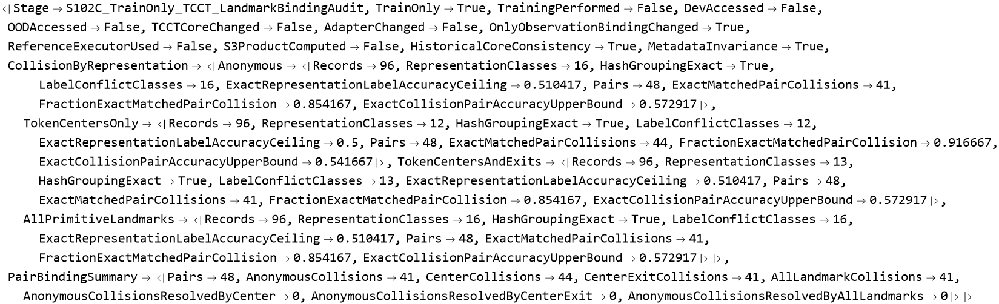

In [1804]:
(* ============================================================ *)
(* S102C                                                        *)
(* TRAIN-ONLY TCCT Dynamic Landmark-Binding Audit               *)
(*                                                              *)
(* PURPOSE                                                      *)
(* Test whether anonymous dynamic traces collide because        *)
(* state-to-token-position binding was discarded.               *)
(*                                                              *)
(* NO TRAINING                                                  *)
(* TRAIN ONLY                                                   *)
(* NO DEV / NO OOD                                              *)
(* NO S3 product                                                *)
(* NO reference executor                                        *)
(* NO TCCT core modification                                     *)
(* ============================================================ *)

ClearAll[
  S102CBindingTrace,
  S102CLandmarkMap,
  S102CEventState,
  S102CBoundRepresentation,
  S102CRepKey,
  S102CCollisionAudit,
  S102CPairBindingAudit,
  S102CSummarizePairs
];


(* ============================================================ *)
(* 0. PREFLIGHT                                                 *)
(* ============================================================ *)

If[
  !And[
    ValueQ[trainRecords],
    ValueQ[dataByModeS102B],
    ValueQ[dynamicCollisionAuditS102BR],
    Length[DownValues[TCCTBuildCaseS101]] > 0,
    Length[DownValues[S102AContext]] > 0,
    Length[DownValues[S102AEncodedAt]] > 0
  ],

  Print["STOP: previous S102A/S102B definitions are missing."];
  Abort[];
];


Print["S102C Binding Audit: TRAIN ONLY."];
Print["DEV and OOD will NOT be accessed."];


(* ============================================================ *)
(* 1. LABEL-BLIND LANDMARK MAP                                  *)
(*                                                              *)
(* Legal primitive landmarks only:                              *)
(*   Root                                                       *)
(*   StartAnchor                                                *)
(*   TargetAnchor                                               *)
(*   Sink                                                       *)
(*   TokenCenter[i]                                             *)
(*   TokenExit[i]                                               *)
(*                                                              *)
(* Token position i comes directly from input sequence order.   *)
(* ============================================================ *)

S102CLandmarkMap[
  built_Association
] := Module[
  {
    assoc = <||>,
    centers,
    exits,
    i
  },

  AssociateTo[
    assoc,
    built["Root"] ->
      {"Root", 0}
  ];

  AssociateTo[
    assoc,
    built["StartAnchor"] ->
      {"StartAnchor", 0}
  ];

  AssociateTo[
    assoc,
    built["TargetAnchor"] ->
      {"TargetAnchor", 0}
  ];

  AssociateTo[
    assoc,
    built["Sink"] ->
      {"Sink", 0}
  ];


  centers =
    built["TokenCenters"];

  exits =
    built["TokenExits"];


  Do[
    AssociateTo[
      assoc,
      centers[[i]] ->
        {"TokenCenter", i}
    ],

    {
      i,
      Length[centers]
    }
  ];


  Do[
    AssociateTo[
      assoc,
      exits[[i]] ->
        {"TokenExit", i}
    ],

    {
      i,
      Length[exits]
    }
  ];


  assoc
];


(* ============================================================ *)
(* 2. FULL DYNAMIC TRACE WITH NODE ID RETAINED INTERNALLY       *)
(*                                                              *)
(* Same historical deterministic equations as S102B.            *)
(* Node identity is used ONLY to bind an event to legal         *)
(* primitive landmarks. Arbitrary node IDs are NOT exposed      *)
(* in the final representation.                                 *)
(* ============================================================ *)

S102CBindingTrace[
  r_Association
] := Module[
  {
    ctx,
    built,
    c,
    landmarkMap,

    p,
    pa,
    id,
    od,
    q,
    n,
    pin,
    pout,
    cin,
    cout,
    vertices,

    h,
    z,
    h2,
    nz,

    j,
    k,
    aps,
    ap,
    pz,
    o,
    zv,

    rf,
    rd,
    dd,
    pg,
    allow,

    active,
    rounds = 0,
    safetyCap,
    terminatedNaturally = False,

    events = {},
    rejects = {},

    originalNode,
    binding,
    codePair
  },


  ctx =
    S102AContext[r];

  built =
    ctx["Built"];

  c =
    ctx["Case"];

  landmarkMap =
    S102CLandmarkMap[
      built
    ];


  p =
    ctx["Pack"];

  pa = p[[1]];
  id = p[[2]];
  od = p[[3]];
  q = p[[4]];
  n = p[[7]];

  pin = p[[8]];
  pout = p[[9]];
  cin = p[[10]];
  cout = p[[11]];

  vertices =
    p[[12]];


  safetyCap =
    Max[
      64,
      2 n + 8
    ];


  h =
    ConstantArray[
      0,
      n
    ];

  z =
    ConstantArray[
      0,
      n
    ];

  h[[q]] = 1;


  For[
    k = 1,
    k <= safetyCap,
    k++,

    rounds = k;

    h2 =
      ConstantArray[
        0,
        n
      ];

    nz =
      ConstantArray[
        0,
        n
      ];

    active = 0;


    Do[

      aps =
        Select[
          pa[[j]],
          Function[
            u,
            u > 0 &&
            h[[u]] == 1
          ]
        ];

      ap =
        Length[aps];


      If[
        ap > 0,

        pz =
          Max[
            z[[aps]]
          ];

        o =
          Boole[
            ap > 1
          ];

        zv =
          {
            0, 1, 2, 1,
            3, 1, 3, 1
          }[[1 + 2 pz + o]];

        nz[[j]] = zv;


        rf =
          {
            1,
            Boole[zv > 0],
            zv,

            Sign[
              pin[[j]] -
              id[[j]]
            ],

            Sign[
              pout[[j]] -
              id[[j]]
            ],

            Sign[
              cin[[j]] -
              id[[j]]
            ],

            Sign[
              cout[[j]] -
              od[[j]]
            ],

            Sign[
              id[[j]] -
              od[[j]]
            ],

            Sign[
              pout[[j]] -
              cin[[j]]
            ]
          };


        rd =
          tcctRwS101 . rf;


        dd =
          1 -
          cin[[j]] +
          2 cout[[j]];


        pg =
          od[[j]] +
          2 Boole[zv > 0] -
          zv;


        allow =
          If[
            rd > 0,
            dd > 0,
            pg > 0
          ];


        originalNode =
          vertices[[j]];


        binding =
          Lookup[
            landmarkMap,
            originalNode,
            {"Other", 0}
          ];


        codePair =
          S102AEncodedAt[
            ctx,
            originalNode
          ];


        AppendTo[
          events,

          <|

            "Round" ->
              k,

            "BindingType" ->
              binding[[1]],

            "BindingPosition" ->
              binding[[2]],

            "CodePair" ->
              codePair,

            "AP" ->
              ap,

            "PZ" ->
              pz,

            "ZV" ->
              zv,

            "Allowed" ->
              Boole[
                TrueQ[allow]
              ]

          |>
        ];


        If[
          rd > 0 &&
          dd <= 0,

          AppendTo[
            rejects,
            {
              k,
              j
            }
          ];
        ];


        If[
          TrueQ[allow],

          h2[[j]] = 1;
          active++;
        ];

      ],

      {
        j,
        n
      }
    ];


    h = h2;
    z = nz;


    If[
      active == 0,

      terminatedNaturally = True;
      Break[];
    ];

  ];


  <|

    "Events" ->
      events,

    "RoundsExecuted" ->
      rounds,

    "Rejects" ->
      rejects,

    "TerminatedNaturally" ->
      terminatedNaturally,

    "SafetyCap" ->
      safetyCap

  |>
];


(* ============================================================ *)
(* 3. COMPUTE TRAIN TRACES                                      *)
(* ============================================================ *)

Print[
  "Computing landmark-bound TRAIN traces..."
];


trainBindingTracesS102C =
  S102CBindingTrace /@
    trainRecords;


(* ============================================================ *)
(* 4. VERIFY HISTORICAL CORE CONSISTENCY                        *)
(* ============================================================ *)

bindingObserverConsistencyS102C =
  And @@
    MapThread[

      Function[
        {r, tr},

        Module[
          {
            original
          },

          original =
            TCCTRejectTraceS101[
              TCCTBuildCaseS101[r][
                "Case"
              ]
            ];


          And[
            SameQ[
              tr["Rejects"],
              original["Rejects"]
            ],

            SameQ[
              tr["RoundsExecuted"],
              original["RoundsExecuted"]
            ],

            SameQ[
              tr["TerminatedNaturally"],
              original["TerminatedNaturally"]
            ]
          ]

        ]
      ],

      {
        trainRecords,
        trainBindingTracesS102C
      }
    ];


Print[
  "Binding observer matches historical core = ",
  bindingObserverConsistencyS102C
];


If[
  !TrueQ[
    bindingObserverConsistencyS102C
  ],

  Print[
    "STOP: observer changed historical core behavior."
  ];

  Abort[];
];


(* ============================================================ *)
(* 5. ONE EVENT STATE                                           *)
(* ============================================================ *)

S102CEventState[
  e_Association,
  includeBinding_: True
] := Module[
  {
    base
  },

  base =
    {
      e["Round"],
      e["CodePair"],
      e["AP"],
      e["PZ"],
      e["ZV"],
      e["Allowed"]
    };


  If[
    TrueQ[
      includeBinding
    ],

    Join[
      {
        e["BindingType"],
        e["BindingPosition"]
      },
      base
    ],

    base
  ]
];


(* ============================================================ *)
(* 6. BUILD EXACT SYMBOLIC REPRESENTATIONS                      *)
(*                                                              *)
(* Three nested audits:                                         *)
(*                                                              *)
(* A. Anonymous                                                 *)
(*    essentially previous representation semantics             *)
(*                                                              *)
(* B. TokenCentersOnly                                          *)
(*    only dynamic events that occur on TokenCenter[i]           *)
(*                                                              *)
(* C. TokenCentersAndExits                                      *)
(*                                                              *)
(* D. AllPrimitiveLandmarks                                     *)
(*    Root / Start / Target / Sink / Center / Exit               *)
(*                                                              *)
(* Within-round order is canonicalized, but the binding tag     *)
(* remains part of each state.                                  *)
(* ============================================================ *)

S102CBoundRepresentation[
  trace_Association,
  mode_String
] := Module[
  {
    events,
    selected,
    roundGroups,
    representation
  },

  events =
    trace[
      "Events"
    ];


  selected =
    Switch[

      mode,

      "Anonymous",

        events,


      "TokenCentersOnly",

        Select[
          events,
          #["BindingType"] ===
            "TokenCenter" &
        ],


      "TokenCentersAndExits",

        Select[
          events,

          MemberQ[
            {
              "TokenCenter",
              "TokenExit"
            },
            #["BindingType"]
          ] &
        ],


      "AllPrimitiveLandmarks",

        Select[
          events,

          #["BindingType"] =!=
            "Other" &
        ],


      _,

        Print[
          "STOP: unknown binding representation mode: ",
          mode
        ];

        Abort[]
    ];


  roundGroups =
    GroupBy[
      selected,
      #["Round"] &
    ];


  representation =
    Table[

      {
        k,

        Sort[
          (
            If[
              mode === "Anonymous",

              S102CEventState[
                #,
                False
              ],

              S102CEventState[
                #,
                True
              ]
            ] &
          ) /@
            Lookup[
              roundGroups,
              k,
              {}
            ]
        ]
      },

      {
        k,
        trace[
          "RoundsExecuted"
        ]
      }
    ];


  {
    "Rounds" ->
      trace[
        "RoundsExecuted"
      ],

    "Trace" ->
      representation
  }
];


bindingModesS102C =
  {
    "Anonymous",
    "TokenCentersOnly",
    "TokenCentersAndExits",
    "AllPrimitiveLandmarks"
  };


(* ============================================================ *)
(* 7. BUILD REPRESENTATIONS                                     *)
(* ============================================================ *)

bindingRepresentationsS102C =
  Association@Table[

    mode -> Table[

      <|

        "PairID" ->
          trainRecords[[i]][
            "PairID"
          ],

        "Y" ->
          trainRecords[[i]][
            "Y"
          ],

        "Depth" ->
          trainRecords[[i]][
            "Depth"
          ],

        "Rep" ->
          S102CBoundRepresentation[
            trainBindingTracesS102C[[i]],
            mode
          ]

      |>,

      {
        i,
        Length[
          trainRecords
        ]
      }
    ],

    {
      mode,
      bindingModesS102C
    }
  ];


(* ============================================================ *)
(* 8. METADATA/LABEL INVARIANCE                                 *)
(* ============================================================ *)

metadataInvariantS102C =
  And @@
    Table[

      Module[
        {
          r2,
          t1,
          t2
        },

        r2 =
          Join[
            trainRecords[[i]],

            <|
              "Y" ->
                1 -
                trainRecords[[i]]["Y"],

              "PairID" ->
                "BINDING_AUDIT",

              "Depth" ->
                999999
            |>
          ];


        t1 =
          trainBindingTracesS102C[[i]];

        t2 =
          S102CBindingTrace[
            r2
          ];


        And @@
          Table[

            SameQ[
              S102CBoundRepresentation[
                t1,
                mode
              ],

              S102CBoundRepresentation[
                t2,
                mode
              ]
            ],

            {
              mode,
              bindingModesS102C
            }
          ]

      ],

      {
        i,
        Length[
          trainRecords
        ]
      }
    ];


Print[
  "Binding representation metadata invariance = ",
  metadataInvariantS102C
];


If[
  !TrueQ[
    metadataInvariantS102C
  ],

  Print[
    "STOP: binding representation depends on evaluation metadata."
  ];

  Abort[];
];


(* ============================================================ *)
(* 9. COLLISION AUDIT                                           *)
(* ============================================================ *)

S102CRepKey[x_] :=
  Hash[
    x,
    "SHA256",
    "HexString"
  ];


S102CCollisionAudit[
  rows_List
] := Module[
  {
    groups,
    hashExact,
    conflicts,
    pairGroups,
    pairCollisions,
    ceilingCorrect
  },


  groups =
    Values@
      GroupBy[
        rows,
        S102CRepKey[
          #["Rep"]
        ] &
      ];


  hashExact =
    And @@
      (
        SameQ @@
          Lookup[
            #,
            "Rep"
          ] &
      ) /@
        groups;


  conflicts =
    Select[
      groups,

      Length[
        DeleteDuplicates[
          Lookup[
            #,
            "Y"
          ]
        ]
      ] > 1 &
    ];


  ceilingCorrect =
    Total[
      (
        Max[
          Values[
            Counts[
              Lookup[
                #,
                "Y"
              ]
            ]
          ]
        ] &
      ) /@
        groups
    ];


  pairGroups =
    Values@
      GroupBy[
        rows,
        #["PairID"] &
      ];


  pairCollisions =
    Table[

      Module[
        {
          pos,
          neg
        },

        pos =
          SelectFirst[
            g,
            #["Y"] === 1 &
          ];

        neg =
          SelectFirst[
            g,
            #["Y"] === 0 &
          ];


        SameQ[
          pos["Rep"],
          neg["Rep"]
        ]

      ],

      {
        g,
        pairGroups
      }
    ];


  <|

    "Records" ->
      Length[
        rows
      ],

    "RepresentationClasses" ->
      Length[
        groups
      ],

    "HashGroupingExact" ->
      hashExact,

    "LabelConflictClasses" ->
      Length[
        conflicts
      ],

    "ExactRepresentationLabelAccuracyCeiling" ->
      N[
        ceilingCorrect /
        Length[
          rows
        ]
      ],

    "Pairs" ->
      Length[
        pairGroups
      ],

    "ExactMatchedPairCollisions" ->
      Count[
        pairCollisions,
        True
      ],

    "FractionExactMatchedPairCollision" ->
      N@
        Mean[
          Boole /@
            pairCollisions
        ],

    "ExactCollisionPairAccuracyUpperBound" ->
      N[
        1. -
        0.5
        Mean[
          Boole /@
            pairCollisions
        ]
      ]

  |>
];


collisionByBindingModeS102C =
  Association@Table[

    mode ->
      S102CCollisionAudit[
        bindingRepresentationsS102C[
          mode
        ]
      ],

    {
      mode,
      bindingModesS102C
    }
  ];


(* ============================================================ *)
(* 10. DIRECT PAIR-BY-PAIR RESOLUTION AUDIT                     *)
(* ============================================================ *)

S102CPairBindingAudit[] := Module[
  {
    pairIDs
  },


  pairIDs =
    DeleteDuplicates[
      Lookup[
        trainRecords,
        "PairID"
      ]
    ];


  Table[

    Module[
      {
        pairResults,
        group,
        pos,
        neg
      },


      pairResults =
        Association@Table[

          group =
            Select[
              bindingRepresentationsS102C[
                mode
              ],

              #["PairID"] ===
                pairID &
            ];


          pos =
            SelectFirst[
              group,
              #["Y"] === 1 &
            ];


          neg =
            SelectFirst[
              group,
              #["Y"] === 0 &
            ];


          mode ->
            SameQ[
              pos["Rep"],
              neg["Rep"]
            ],

          {
            mode,
            bindingModesS102C
          }
        ];


      <|

        "PairID" ->
          pairID,

        "Depth" ->
          SelectFirst[
            trainRecords,
            #["PairID"] ===
              pairID &
          ][
            "Depth"
          ],

        "AnonymousCollision" ->
          pairResults[
            "Anonymous"
          ],

        "CenterCollision" ->
          pairResults[
            "TokenCentersOnly"
          ],

        "CenterExitCollision" ->
          pairResults[
            "TokenCentersAndExits"
          ],

        "AllLandmarkCollision" ->
          pairResults[
            "AllPrimitiveLandmarks"
          ],

        "ResolvedByCenterBinding" ->
          And[
            TrueQ[
              pairResults[
                "Anonymous"
              ]
            ],

            !TrueQ[
              pairResults[
                "TokenCentersOnly"
              ]
            ]
          ],

        "ResolvedByCenterExitBinding" ->
          And[
            TrueQ[
              pairResults[
                "Anonymous"
              ]
            ],

            !TrueQ[
              pairResults[
                "TokenCentersAndExits"
              ]
            ]
          ],

        "ResolvedByAllLandmarks" ->
          And[
            TrueQ[
              pairResults[
                "Anonymous"
              ]
            ],

            !TrueQ[
              pairResults[
                "AllPrimitiveLandmarks"
              ]
            ]
          ]

      |>

    ],

    {
      pairID,
      pairIDs
    }
  ]
];


pairBindingAuditS102C =
  S102CPairBindingAudit[];


(* ============================================================ *)
(* 11. SUMMARY                                                  *)
(* ============================================================ *)

S102CSummarizePairs[
  rows_List
] := <|

  "Pairs" ->
    Length[
      rows
    ],

  "AnonymousCollisions" ->
    Count[
      Lookup[
        rows,
        "AnonymousCollision"
      ],
      True
    ],

  "CenterCollisions" ->
    Count[
      Lookup[
        rows,
        "CenterCollision"
      ],
      True
    ],

  "CenterExitCollisions" ->
    Count[
      Lookup[
        rows,
        "CenterExitCollision"
      ],
      True
    ],

  "AllLandmarkCollisions" ->
    Count[
      Lookup[
        rows,
        "AllLandmarkCollision"
      ],
      True
    ],

  "AnonymousCollisionsResolvedByCenter" ->
    Count[
      Lookup[
        rows,
        "ResolvedByCenterBinding"
      ],
      True
    ],

  "AnonymousCollisionsResolvedByCenterExit" ->
    Count[
      Lookup[
        rows,
        "ResolvedByCenterExitBinding"
      ],
      True
    ],

  "AnonymousCollisionsResolvedByAllLandmarks" ->
    Count[
      Lookup[
        rows,
        "ResolvedByAllLandmarks"
      ],
      True
    ]

|>;


pairBindingSummaryS102C =
  S102CSummarizePairs[
    pairBindingAuditS102C
  ];


(* ============================================================ *)
(* 12. FINAL REPORT                                             *)
(* ============================================================ *)

finalS102C =
  <|

    "Stage" ->
      "S102C_TrainOnly_TCCT_LandmarkBindingAudit",

    "TrainOnly" ->
      True,

    "TrainingPerformed" ->
      False,

    "DevAccessed" ->
      False,

    "OODAccessed" ->
      False,

    "TCCTCoreChanged" ->
      False,

    "AdapterChanged" ->
      False,

    "OnlyObservationBindingChanged" ->
      True,

    "ReferenceExecutorUsed" ->
      False,

    "S3ProductComputed" ->
      False,

    "HistoricalCoreConsistency" ->
      bindingObserverConsistencyS102C,

    "MetadataInvariance" ->
      metadataInvariantS102C,

    "CollisionByRepresentation" ->
      collisionByBindingModeS102C,

    "PairBindingSummary" ->
      pairBindingSummaryS102C

  |>;


finalS102C

Dataset[{<|PairID -> TRAIN_6_1, Depth -> 6, AnonymousCollision -> True, 
 
>     CenterCollision -> True, CenterExitCollision -> True, 
 
>     AllLandmarkCollision -> True, ResolvedByCenterBinding -> False, 
 
>     ResolvedByCenterExitBinding -> False, ResolvedByAllLandmarks -> False|>, 
 
>    <|PairID -> TRAIN_6_2, Depth -> 6, AnonymousCollision -> True, 
 
>     CenterCollision -> True, CenterExitCollision -> True, 
 
>     AllLandmarkCollision -> True, ResolvedByCenterBinding -> False, 
 
>     ResolvedByCenterExitBinding -> False, ResolvedByAllLandmarks -> False|>, 
 
>    <|PairID -> TRAIN_6_3, Depth -> 6, AnonymousCollision -> True, 
 
>     CenterCollision -> True, CenterExitCollision -> True, 
 
>     AllLandmarkCollision -> True, ResolvedByCenterBinding -> False, 
 
>     ResolvedByCenterExitBinding -> False, ResolvedByAllLandmarks -> False|>, 
 
>    <|PairID -> TRAIN_6_4, Depth -> 6, AnonymousCollision -> False, 
 
>     CenterCollision -> True, CenterExitCollision -> False, 
 
>     AllLandmarkCollision -> False, ResolvedByCenterBinding -> False, 
 
>     ResolvedByCenterExitBinding -> False, ResolvedByAllLandmarks -> False|>, 
 
>    <|PairID -> TRAIN_6_5, Depth -> 6, AnonymousCollision -> True, 
 
>     CenterCollision -> True, CenterExitCollision -> True, 
 
>     AllLandmarkCollision -> True, ResolvedByCenterBinding -> False, 
 
>     ResolvedByCenterExitBinding -> False, ResolvedByAllLandmarks -> False|>, 
 
>    <|PairID -> TRAIN_6_6, Depth -> 6, AnonymousCollision -> False, 
 
>     CenterCollision -> False, CenterExitCollision -> False, 
 
>     AllLandmarkCollision -> False, ResolvedByCenterBinding -> False, 
 
>     ResolvedByCenterExitBinding -> False, ResolvedByAllLandmarks -> False|>, 
 
>    <|PairID -> TRAIN_6_7, Depth -> 6, AnonymousCollision -> True, 
 
>     CenterCollision -> True, CenterExitCollision -> True, 
 
>     AllLandmarkCollision -> True, ResolvedByCenterBinding -> False, 
 
>     ResolvedByCenterExitBinding -> False, ResolvedByAllLandmarks -> False|>, 
 
>    <|PairID -> TRAIN_6_8, Depth -> 6, AnonymousCollision -> False, 
 
>     CenterCollision -> False, CenterExitCollision -> False, 
 
>     AllLandmarkCollision -> False, ResolvedByCenterBinding -> False, 
 
>     ResolvedByCenterExitBinding -> False, ResolvedByAllLandmarks -> False|>, 
 
>    <|PairID -> TRAIN_6_9, Depth -> 6, AnonymousCollision -> True, 
 
>     CenterCollision -> True, CenterExitCollision -> True, 
 
>     AllLandmarkCollision -> True, ResolvedByCenterBinding -> False, 
 
>     ResolvedByCenterExitBinding -> False, ResolvedByAllLandmarks -> False|>, 
 
>    <|PairID -> TRAIN_6_10, Depth -> 6, AnonymousCollision -> True, 
 
>     CenterCollision -> True, CenterExitCollision -> True, 
 
>     AllLandmarkCollision -> True, ResolvedByCenterBinding -> False, 
 
>     ResolvedByCenterExitBinding -> False, ResolvedByAllLandmarks -> False|>, 
 
>    <|PairID -> TRAIN_6_11, Depth -> 6, AnonymousCollision -> False, 
 
>     CenterCollision -> True, CenterExitCollision -> False, 
 
>     AllLandmarkCollision -> False, ResolvedByCenterBinding -> False, 
 
>     ResolvedByCenterExitBinding -> False, ResolvedByAllLandmarks -> False|>, 
 
>    <|PairID -> TRAIN_6_12, Depth -> 6, AnonymousCollision -> False, 
 
>     CenterCollision -> False, CenterExitCollision -> False, 
 
>     AllLandmarkCollision -> False, ResolvedByCenterBinding -> False, 
 
>     ResolvedByCenterExitBinding -> False, ResolvedByAllLandmarks -> False|>, 
 
>    <|PairID -> TRAIN_6_13, Depth -> 6, AnonymousCollision -> True, 
 
>     CenterCollision -> True, CenterExitCollision -> True, 
 
>     AllLandmarkCollision -> True, ResolvedByCenterBinding -> False, 
 
>     ResolvedByCenterExitBinding -> False, ResolvedByAllLandmarks -> False|>, 
 
>    <|PairID -> TRAIN_6_14, Depth -> 6, AnonymousCollision -> True, 
 
>     CenterCollision -> True, CenterExitCollision -> True, 
 
>     AllLandmarkCollision -> True, ResolvedByCenterBinding -> False, 
 
>     Res
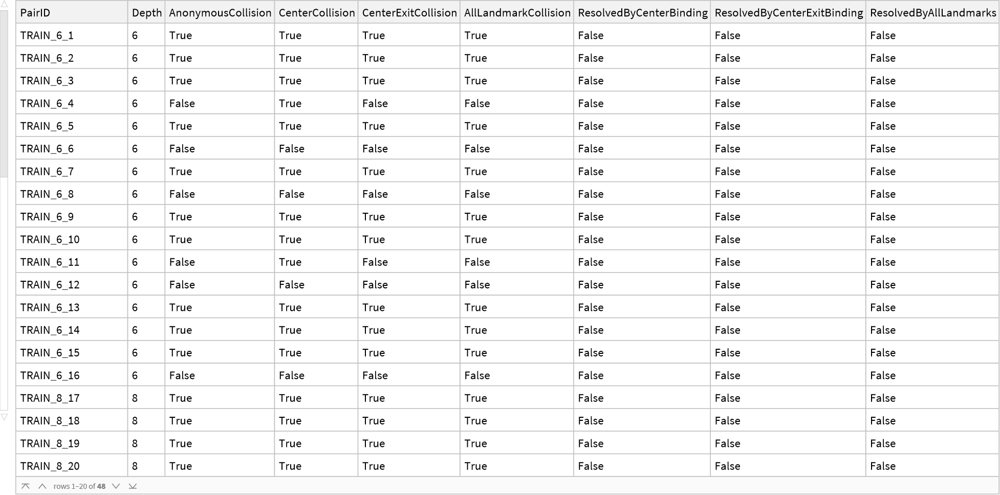

In [1920]:
Dataset[
  pairBindingAuditS102C
]

S102D Full-State Audit: TRAIN ONLY.
No training. No DEV. No OOD.
Computing full internal TRAIN trajectories...
Full-state observer matches historical core = True
Matched-pair construction-index alignment = True
Full-state metadata/label invariance = True


<|Stage -> S102D_TrainOnly_FullInternalStateTrajectoryAudit, TrainOnly -> True, 
 
>   TrainingPerformed -> False, DevAccessed -> False, OODAccessed -> False, 
 
>   TCCTCoreChanged -> False, ReferenceExecutorUsed -> False, 
 
>   S3ProductComputed -> False, HistoricalCoreConsistency -> True, 
 
>   PairNodeAlignmentPassed -> True, MetadataInvariance -> True, 
 
>   PreviousAnonymousObservableCollisions -> 41, 
 
>   CollisionByStateMode -> 
 
>    <|TopologyOnly -> 
 
>      <|Records -> 96, RepresentationClasses -> 96, HashGroupingExact -> True, 
 
>       LabelConflictClasses -> 0, ExactRepresentationLabelAccuracyCeiling -> 1., 
 
>       Pairs -> 48, ExactMatchedPairCollisions -> 0, 
 
>       FractionExactMatchedPairCollision -> 0., 
 
>       ExactCollisionPairAccuracyUpperBound -> 1.|>, 
 
>     HZTrajectoryOnly -> 
 
>      <|Records -> 96, RepresentationClasses -> 35, HashGroupingExact -> True, 
 
>       LabelConflictClasses -> 31, ExactRepresentationLabelAccuracyCeiling -> 0.520833, 
 
>       Pairs -> 48, ExactMatchedPairCollisions -> 46, 
 
>       FractionExactMatchedPairCollision -> 0.958333, 
 
>       ExactCollisionPairAccuracyUpperBound -> 0.520833|>, 
 
>     FullInternalDynamics -> 
 
>      <|Records -> 96, RepresentationClasses -> 40, HashGroupingExact -> True, 
 
>       LabelConflictClasses -> 32, ExactRepresentationLabelAccuracyCeiling -> 0.541667, 
 
>       Pairs -> 48, ExactMatchedPairCollisions -> 44, 
 
>       FractionExactMatchedPairCollision -> 0.916667, 
 
>       ExactCollisionPairAccuracyUpperBound -> 0.541667|>, 
 
>     TopologyPlusFullDynamics -> 
 
>      <|Records -> 96, RepresentationClasses -> 96, HashGroupingExact -> True, 
 
>       LabelConflictClasses -> 0, ExactRepresentationLabelAccuracyCeiling -> 1., 
 
>       Pairs -> 48, ExactMatchedPairCollisions -> 0, 
 
>       FractionExactMatchedPairCollision -> 0., 
 
>       ExactCollisionPairAccuracyUpperBound -> 1.|>|>, 
 
>   PairSummary -> 
 
>    <|Pairs -> 48, TopologyCollisions -> 0, HZTrajectoryCollisions -> 46, 
 
>     FullInternalDynamicsCollisions -> 44, TopologyPlusDynamicsCollisions -> 0|>, 
 
>   PerDepthCollision -> 
 
>    <|6 -> <|Pairs -> 16, TopologyCollisions -> 0, HZTrajectoryCollisions -> 14, 
 
>       FullInternalDynamicsCollisions -> 12, TopologyPlusDynamicsCollisions -> 0|>, 
 
>     8 -> <|Pairs -> 16, TopologyCollisions -> 0, HZTrajectoryCollisions -> 16, 
 
>       FullInternalDynamicsCollisions -> 16, TopologyPlusDynamicsCollisions -> 0|>, 
 
>     10 -> <|Pairs -> 16, TopologyCollisions -> 0, HZTrajectoryCollisions -> 16, 
 
>       FullInternalDynamicsCollisions -> 16, TopologyPlusDynamicsCollisions -> 0|>|>|>
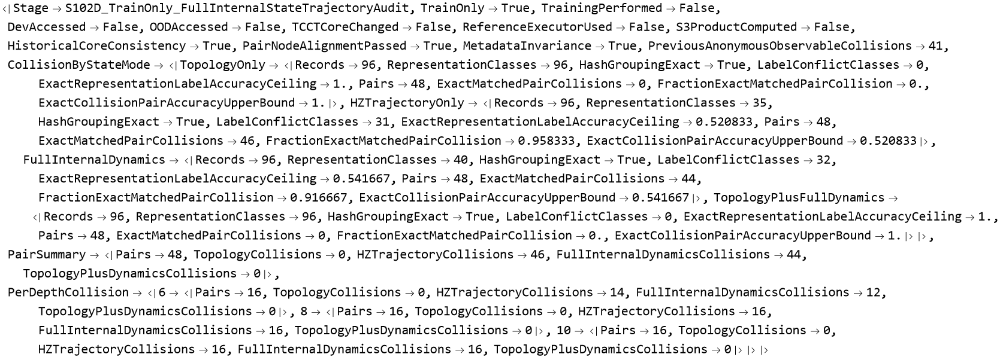

In [1925]:
(* ============================================================ *)
(* S102D                                                        *)
(* TRAIN-ONLY Full Internal TCCT State-Trajectory Audit         *)
(*                                                              *)
(* NO TRAINING                                                  *)
(* NO DEV                                                       *)
(* NO OOD                                                       *)
(* NO reference executor                                        *)
(* NO S3 product                                                *)
(* NO TCCT core modification                                    *)
(*                                                              *)
(* Main question:                                               *)
(* Do opposing S101 programs still collide when we retain       *)
(* EVERY NODE'S h/z propagation state at EVERY ROUND?           *)
(* ============================================================ *)

ClearAll[
  S102DFullStateTrace,
  S102DStateRep,
  S102DRepKey,
  S102DCollisionAudit,
  S102DPairAudit,
  S102DSummarizePairAudit
];


(* ============================================================ *)
(* 0. PREFLIGHT                                                 *)
(* ============================================================ *)

If[
  !And[
    ValueQ[trainRecords],
    Length[DownValues[S102AContext]] > 0,
    Length[DownValues[TCCTRejectTraceS101]] > 0,
    ValueQ[tcctRwS101]
  ],

  Print["STOP: required S102/TCCT definitions are missing."];
  Abort[];
];


Print["S102D Full-State Audit: TRAIN ONLY."];
Print["No training. No DEV. No OOD."];


(* ============================================================ *)
(* 1. FULL INTERNAL PROPAGATION TRACE                           *)
(*                                                              *)
(* Records:                                                     *)
(* - complete H and Z vectors BEFORE each round                 *)
(* - complete H and Z vectors AFTER each round                  *)
(* - per-node AP/PZ/O/ZV/RD/DD/PG/Allowed                      *)
(* - graph topology separately                                  *)
(*                                                              *)
(* Node ordering follows Pack60 vertex order.                    *)
(* For this deterministic adapter, matched pairs of same depth  *)
(* should have the same construction-index vertex set.          *)
(* ============================================================ *)

S102DFullStateTrace[
  r_Association
] := Module[
  {
    ctx,
    c,

    p,
    pa,
    id,
    od,
    q,
    n,
    pin,
    pout,
    cin,
    cout,
    vertices,

    edgeList,

    h,
    z,
    h2,
    nz,

    j,
    k,
    aps,
    ap,
    pz,
    o,
    zv,

    rf,
    rd,
    dd,
    pg,
    allow,

    active,
    rounds = 0,
    safetyCap,
    terminatedNaturally = False,

    rejects = {},
    roundStates = {},

    nodeInternal,
    reached,
    hBefore,
    zBefore
  },


  ctx =
    S102AContext[r];

  c =
    ctx["Case"];

  p =
    ctx["Pack"];


  pa = p[[1]];
  id = p[[2]];
  od = p[[3]];
  q = p[[4]];
  n = p[[7]];

  pin = p[[8]];
  pout = p[[9]];
  cin = p[[10]];
  cout = p[[11]];

  vertices =
    p[[12]];


  (* static topology kept SEPARATE from dynamic trajectory *)

  edgeList =
    Sort[
      First[c][[1]]
    ];


  safetyCap =
    Max[
      64,
      2 n + 8
    ];


  h =
    ConstantArray[
      0,
      n
    ];

  z =
    ConstantArray[
      0,
      n
    ];

  h[[q]] = 1;


  For[
    k = 1,
    k <= safetyCap,
    k++,

    rounds = k;


    hBefore =
      h;

    zBefore =
      z;


    h2 =
      ConstantArray[
        0,
        n
      ];

    nz =
      ConstantArray[
        0,
        n
      ];


    (* default sentinel for nodes NOT reached in this round *)

    nodeInternal =
      ConstantArray[
        {
          0,      (* reached? *)
          0,      (* AP *)
          -1,     (* PZ *)
          -1,     (* O *)
          -1,     (* ZV *)
          999999, (* RD sentinel *)
          999999, (* DD sentinel *)
          999999, (* PG sentinel *)
          0       (* allowed *)
        },
        n
      ];


    active = 0;


    Do[

      aps =
        Select[
          pa[[j]],
          Function[
            u,
            u > 0 &&
            h[[u]] == 1
          ]
        ];

      ap =
        Length[
          aps
        ];


      If[
        ap > 0,

        pz =
          Max[
            z[[aps]]
          ];

        o =
          Boole[
            ap > 1
          ];


        zv =
          {
            0, 1, 2, 1,
            3, 1, 3, 1
          }[[1 + 2 pz + o]];


        nz[[j]] =
          zv;


        rf =
          {
            1,

            Boole[
              zv > 0
            ],

            zv,

            Sign[
              pin[[j]] -
              id[[j]]
            ],

            Sign[
              pout[[j]] -
              id[[j]]
            ],

            Sign[
              cin[[j]] -
              id[[j]]
            ],

            Sign[
              cout[[j]] -
              od[[j]]
            ],

            Sign[
              id[[j]] -
              od[[j]]
            ],

            Sign[
              pout[[j]] -
              cin[[j]]
            ]
          };


        rd =
          tcctRwS101 . rf;


        dd =
          1 -
          cin[[j]] +
          2 cout[[j]];


        pg =
          od[[j]] +
          2 Boole[
            zv > 0
          ] -
          zv;


        allow =
          If[
            rd > 0,
            dd > 0,
            pg > 0
          ];


        nodeInternal[[j]] =
          {
            1,
            ap,
            pz,
            o,
            zv,
            rd,
            dd,
            pg,
            Boole[
              TrueQ[allow]
            ]
          };


        If[
          rd > 0 &&
          dd <= 0,

          AppendTo[
            rejects,
            {
              k,
              j
            }
          ];
        ];


        If[
          TrueQ[
            allow
          ],

          h2[[j]] = 1;
          active++;
        ];

      ],

      {
        j,
        n
      }
    ];


    (* Save COMPLETE state of every packed node *)

    AppendTo[
      roundStates,

      <|

        "Round" ->
          k,

        "HBefore" ->
          hBefore,

        "ZBefore" ->
          zBefore,

        "NodeInternal" ->
          nodeInternal,

        "HAfter" ->
          h2,

        "ZAfter" ->
          nz,

        "ActiveAfter" ->
          active

      |>
    ];


    h =
      h2;

    z =
      nz;


    If[
      active == 0,

      terminatedNaturally =
        True;

      Break[];
    ];

  ];


  <|

    "VertexList" ->
      vertices,

    "NodeCount" ->
      n,

    "Topology" ->
      edgeList,

    "InitialQueryIndex" ->
      q,

    "RoundStates" ->
      roundStates,

    "RoundsExecuted" ->
      rounds,

    "Rejects" ->
      rejects,

    "TerminatedNaturally" ->
      terminatedNaturally,

    "SafetyCap" ->
      safetyCap

  |>
];


(* ============================================================ *)
(* 2. COMPUTE TRAIN FULL-STATE TRACES                           *)
(* ============================================================ *)

Print[
  "Computing full internal TRAIN trajectories..."
];


trainFullStateS102D =
  S102DFullStateTrace /@
    trainRecords;


(* ============================================================ *)
(* 3. VERIFY EXACT CORE CONSISTENCY                             *)
(* ============================================================ *)

coreConsistencyS102D =
  And @@
    MapThread[

      Function[
        {r, trace},

        Module[
          {
            original
          },

          original =
            TCCTRejectTraceS101[
              TCCTBuildCaseS101[r][
                "Case"
              ]
            ];


          And[

            SameQ[
              trace["Rejects"],
              original["Rejects"]
            ],

            SameQ[
              trace["RoundsExecuted"],
              original["RoundsExecuted"]
            ],

            SameQ[
              trace["TerminatedNaturally"],
              original["TerminatedNaturally"]
            ]

          ]

        ]
      ],

      {
        trainRecords,
        trainFullStateS102D
      }
    ];


Print[
  "Full-state observer matches historical core = ",
  coreConsistencyS102D
];


If[
  !TrueQ[
    coreConsistencyS102D
  ],

  Print[
    "STOP: full-state observer changed historical dynamics."
  ];

  Abort[];
];


(* ============================================================ *)
(* 4. PAIR NODE-ALIGNMENT PREFLIGHT                             *)
(*                                                              *)
(* We compare h/z arrays by deterministic adapter construction   *)
(* index. Matched pairs must therefore have the same node set.   *)
(*                                                              *)
(* This alignment is used ONLY for internal diagnosis.          *)
(* It is NOT a model input.                                     *)
(* ============================================================ *)

pairGroupsRawS102D =
  Values@
    GroupBy[
      Range[
        Length[
          trainRecords
        ]
      ],

      trainRecords[[#]]["PairID"] &
    ];


nodeAlignmentAuditS102D =
  Table[

    Module[
      {
        idx1,
        idx2,
        t1,
        t2
      },

      idx1 =
        g[[1]];

      idx2 =
        g[[2]];

      t1 =
        trainFullStateS102D[[idx1]];

      t2 =
        trainFullStateS102D[[idx2]];


      <|

        "PairID" ->
          trainRecords[[idx1]][
            "PairID"
          ],

        "SameNodeCount" ->
          SameQ[
            t1["NodeCount"],
            t2["NodeCount"]
          ],

        "SameVertexList" ->
          SameQ[
            t1["VertexList"],
            t2["VertexList"]
          ],

        "SameInitialQueryIndex" ->
          SameQ[
            t1["InitialQueryIndex"],
            t2["InitialQueryIndex"]
          ]

      |>

    ],

    {
      g,
      pairGroupsRawS102D
    }
  ];


nodeAlignmentPassedS102D =
  And @@
    Table[

      And[
        TrueQ[
          row["SameNodeCount"]
        ],

        TrueQ[
          row["SameVertexList"]
        ],

        TrueQ[
          row["SameInitialQueryIndex"]
        ]
      ],

      {
        row,
        nodeAlignmentAuditS102D
      }
    ];


Print[
  "Matched-pair construction-index alignment = ",
  nodeAlignmentPassedS102D
];


If[
  !TrueQ[
    nodeAlignmentPassedS102D
  ],

  Print[
    "STOP: paired node arrays cannot be safely aligned."
  ];

  Abort[];
];


(* ============================================================ *)
(* 5. BUILD NESTED STATE REPRESENTATIONS                        *)
(*                                                              *)
(* Critical distinction:                                       *)
(*                                                              *)
(* TopologyOnly                                                 *)
(*   Static input graph only.                                   *)
(*                                                              *)
(* HZTrajectoryOnly                                             *)
(*   ONLY complete h/z propagation states.                      *)
(*   This is the key core-dynamics audit.                       *)
(*                                                              *)
(* FullInternalDynamics                                         *)
(*   h/z + AP/PZ/O/ZV/RD/DD/PG/Allowed for every node.          *)
(*                                                              *)
(* TopologyPlusFullDynamics                                     *)
(*   diagnostic upper envelope; expected to distinguish more    *)
(*   because static graphs already differ.                      *)
(* ============================================================ *)

S102DStateRep[
  trace_Association,
  mode_String
] := Module[
  {
    rounds
  },


  rounds =
    trace[
      "RoundStates"
    ];


  Switch[

    mode,


    "TopologyOnly",

      {
        trace[
          "VertexList"
        ],

        trace[
          "Topology"
        ],

        trace[
          "InitialQueryIndex"
        ]
      },


    "HZTrajectoryOnly",

      {
        trace[
          "InitialQueryIndex"
        ],

        Table[
          {
            rr[
              "HBefore"
            ],

            rr[
              "ZBefore"
            ],

            rr[
              "HAfter"
            ],

            rr[
              "ZAfter"
            ]
          },

          {
            rr,
            rounds
          }
        ]
      },


    "FullInternalDynamics",

      {
        trace[
          "InitialQueryIndex"
        ],

        Table[
          {
            rr[
              "HBefore"
            ],

            rr[
              "ZBefore"
            ],

            rr[
              "NodeInternal"
            ],

            rr[
              "HAfter"
            ],

            rr[
              "ZAfter"
            ],

            rr[
              "ActiveAfter"
            ]
          },

          {
            rr,
            rounds
          }
        ]
      },


    "TopologyPlusFullDynamics",

      {
        trace[
          "VertexList"
        ],

        trace[
          "Topology"
        ],

        trace[
          "InitialQueryIndex"
        ],

        Table[
          {
            rr[
              "HBefore"
            ],

            rr[
              "ZBefore"
            ],

            rr[
              "NodeInternal"
            ],

            rr[
              "HAfter"
            ],

            rr[
              "ZAfter"
            ],

            rr[
              "ActiveAfter"
            ]
          },

          {
            rr,
            rounds
          }
        ]
      },


    _,

      Print[
        "STOP: unknown S102D state representation: ",
        mode
      ];

      Abort[]
  ]
];


stateModesS102D =
  {
    "TopologyOnly",
    "HZTrajectoryOnly",
    "FullInternalDynamics",
    "TopologyPlusFullDynamics"
  };


(* ============================================================ *)
(* 6. BUILD REPRESENTATION ROWS                                 *)
(* ============================================================ *)

representationRowsS102D =
  Association@Table[

    mode -> Table[

      <|

        "PairID" ->
          trainRecords[[i]][
            "PairID"
          ],

        "Depth" ->
          trainRecords[[i]][
            "Depth"
          ],

        "Y" ->
          trainRecords[[i]][
            "Y"
          ],

        "Rep" ->
          S102DStateRep[
            trainFullStateS102D[[i]],
            mode
          ]

      |>,

      {
        i,
        Length[
          trainRecords
        ]
      }
    ],

    {
      mode,
      stateModesS102D
    }
  ];


(* ============================================================ *)
(* 7. LABEL / METADATA INVARIANCE                              *)
(* ============================================================ *)

metadataInvariantS102D =
  And @@
    Table[

      Module[
        {
          altered,
          tr1,
          tr2
        },

        altered =
          Join[
            trainRecords[[i]],

            <|

              "Y" ->
                1 -
                trainRecords[[i]]["Y"],

              "PairID" ->
                "S102D_METADATA_AUDIT",

              "Depth" ->
                999999

            |>
          ];


        tr1 =
          trainFullStateS102D[[i]];

        tr2 =
          S102DFullStateTrace[
            altered
          ];


        And @@
          Table[

            SameQ[
              S102DStateRep[
                tr1,
                mode
              ],

              S102DStateRep[
                tr2,
                mode
              ]
            ],

            {
              mode,
              stateModesS102D
            }
          ]

      ],

      {
        i,
        Length[
          trainRecords
        ]
      }
    ];


Print[
  "Full-state metadata/label invariance = ",
  metadataInvariantS102D
];


If[
  !TrueQ[
    metadataInvariantS102D
  ],

  Print[
    "STOP: internal-state representation depends on metadata."
  ];

  Abort[];
];


(* ============================================================ *)
(* 8. EXACT COLLISION AUDIT                                     *)
(* ============================================================ *)

S102DRepKey[x_] :=
  Hash[
    x,
    "SHA256",
    "HexString"
  ];


S102DCollisionAudit[
  rows_List
] := Module[
  {
    groups,
    hashExact,
    conflicts,
    pairGroups,
    pairCollisions,
    ceilingCorrect
  },


  groups =
    Values@
      GroupBy[
        rows,
        S102DRepKey[
          #["Rep"]
        ] &
      ];


  hashExact =
    And @@
      (
        SameQ @@
          Lookup[
            #,
            "Rep"
          ] &
      ) /@
        groups;


  conflicts =
    Select[
      groups,

      Length[
        DeleteDuplicates[
          Lookup[
            #,
            "Y"
          ]
        ]
      ] > 1 &
    ];


  ceilingCorrect =
    Total[
      (
        Max[
          Values[
            Counts[
              Lookup[
                #,
                "Y"
              ]
            ]
          ]
        ] &
      ) /@
        groups
    ];


  pairGroups =
    Values@
      GroupBy[
        rows,
        #["PairID"] &
      ];


  pairCollisions =
    Table[

      Module[
        {
          pos,
          neg
        },

        pos =
          SelectFirst[
            g,
            #["Y"] === 1 &
          ];

        neg =
          SelectFirst[
            g,
            #["Y"] === 0 &
          ];


        SameQ[
          pos["Rep"],
          neg["Rep"]
        ]

      ],

      {
        g,
        pairGroups
      }
    ];


  <|

    "Records" ->
      Length[
        rows
      ],

    "RepresentationClasses" ->
      Length[
        groups
      ],

    "HashGroupingExact" ->
      hashExact,

    "LabelConflictClasses" ->
      Length[
        conflicts
      ],

    "ExactRepresentationLabelAccuracyCeiling" ->
      N[
        ceilingCorrect /
        Length[
          rows
        ]
      ],

    "Pairs" ->
      Length[
        pairGroups
      ],

    "ExactMatchedPairCollisions" ->
      Count[
        pairCollisions,
        True
      ],

    "FractionExactMatchedPairCollision" ->
      N@
        Mean[
          Boole /@
            pairCollisions
        ],

    "ExactCollisionPairAccuracyUpperBound" ->
      N[
        1. -
        0.5
        Mean[
          Boole /@
            pairCollisions
        ]
      ]

  |>
];


collisionByStateModeS102D =
  Association@Table[

    mode ->
      S102DCollisionAudit[
        representationRowsS102D[
          mode
        ]
      ],

    {
      mode,
      stateModesS102D
    }
  ];


(* ============================================================ *)
(* 9. PAIR-BY-PAIR AUDIT                                       *)
(* ============================================================ *)

S102DPairAudit[] := Module[
  {
    pairIDs
  },


  pairIDs =
    DeleteDuplicates[
      Lookup[
        trainRecords,
        "PairID"
      ]
    ];


  Table[

    Module[
      {
        collision
      },


      collision =
        Association@Table[

          Module[
            {
              g,
              pos,
              neg
            },

            g =
              Select[
                representationRowsS102D[
                  mode
                ],

                #["PairID"] ===
                  pairID &
              ];


            pos =
              SelectFirst[
                g,
                #["Y"] === 1 &
              ];


            neg =
              SelectFirst[
                g,
                #["Y"] === 0 &
              ];


            mode ->
              SameQ[
                pos["Rep"],
                neg["Rep"]
              ]

          ],

          {
            mode,
            stateModesS102D
          }
        ];


      <|

        "PairID" ->
          pairID,

        "Depth" ->
          SelectFirst[
            trainRecords,
            #["PairID"] ===
              pairID &
          ][
            "Depth"
          ],

        "TopologyCollision" ->
          collision[
            "TopologyOnly"
          ],

        "HZTrajectoryCollision" ->
          collision[
            "HZTrajectoryOnly"
          ],

        "FullInternalDynamicsCollision" ->
          collision[
            "FullInternalDynamics"
          ],

        "TopologyPlusDynamicsCollision" ->
          collision[
            "TopologyPlusFullDynamics"
          ]

      |>

    ],

    {
      pairID,
      pairIDs
    }
  ]
];


pairAuditS102D =
  S102DPairAudit[];


(* ============================================================ *)
(* 10. SUMMARY                                                  *)
(* ============================================================ *)

S102DSummarizePairAudit[
  rows_List
] := <|

  "Pairs" ->
    Length[
      rows
    ],

  "TopologyCollisions" ->
    Count[
      Lookup[
        rows,
        "TopologyCollision"
      ],
      True
    ],

  "HZTrajectoryCollisions" ->
    Count[
      Lookup[
        rows,
        "HZTrajectoryCollision"
      ],
      True
    ],

  "FullInternalDynamicsCollisions" ->
    Count[
      Lookup[
        rows,
        "FullInternalDynamicsCollision"
      ],
      True
    ],

  "TopologyPlusDynamicsCollisions" ->
    Count[
      Lookup[
        rows,
        "TopologyPlusDynamicsCollision"
      ],
      True
    ]

|>;


pairSummaryS102D =
  S102DSummarizePairAudit[
    pairAuditS102D
  ];


(* ============================================================ *)
(* 11. PER-DEPTH COLLISION SUMMARY                              *)
(* ============================================================ *)

perDepthCollisionS102D =
  Association@Table[

    d ->
      S102DSummarizePairAudit[
        Select[
          pairAuditS102D,
          #["Depth"] === d &
        ]
      ],

    {
      d,
      Sort@
        DeleteDuplicates[
          Lookup[
            pairAuditS102D,
            "Depth"
          ]
        ]
    }
  ];


(* ============================================================ *)
(* 12. FINAL REPORT                                             *)
(* ============================================================ *)

finalS102D =
  <|

    "Stage" ->
      "S102D_TrainOnly_FullInternalStateTrajectoryAudit",

    "TrainOnly" ->
      True,

    "TrainingPerformed" ->
      False,

    "DevAccessed" ->
      False,

    "OODAccessed" ->
      False,

    "TCCTCoreChanged" ->
      False,

    "ReferenceExecutorUsed" ->
      False,

    "S3ProductComputed" ->
      False,

    "HistoricalCoreConsistency" ->
      coreConsistencyS102D,

    "PairNodeAlignmentPassed" ->
      nodeAlignmentPassedS102D,

    "MetadataInvariance" ->
      metadataInvariantS102D,

    "PreviousAnonymousObservableCollisions" ->
      41,

    "CollisionByStateMode" ->
      collisionByStateModeS102D,

    "PairSummary" ->
      pairSummaryS102D,

    "PerDepthCollision" ->
      perDepthCollisionS102D

  |>;


finalS102D

Dataset[{<|PairID -> TRAIN_6_1, Depth -> 6, TopologyCollision -> False, 
 
>     HZTrajectoryCollision -> True, FullInternalDynamicsCollision -> True, 
 
>     TopologyPlusDynamicsCollision -> False|>, 
 
>    <|PairID -> TRAIN_6_2, Depth -> 6, TopologyCollision -> False, 
 
>     HZTrajectoryCollision -> True, FullInternalDynamicsCollision -> True, 
 
>     TopologyPlusDynamicsCollision -> False|>, 
 
>    <|PairID -> TRAIN_6_3, Depth -> 6, TopologyCollision -> False, 
 
>     HZTrajectoryCollision -> True, FullInternalDynamicsCollision -> True, 
 
>     TopologyPlusDynamicsCollision -> False|>, 
 
>    <|PairID -> TRAIN_6_4, Depth -> 6, TopologyCollision -> False, 
 
>     HZTrajectoryCollision -> True, FullInternalDynamicsCollision -> True, 
 
>     TopologyPlusDynamicsCollision -> False|>, 
 
>    <|PairID -> TRAIN_6_5, Depth -> 6, TopologyCollision -> False, 
 
>     HZTrajectoryCollision -> True, FullInternalDynamicsCollision -> True, 
 
>     TopologyPlusDynamicsCollision -> False|>, 
 
>    <|PairID -> TRAIN_6_6, Depth -> 6, TopologyCollision -> False, 
 
>     HZTrajectoryCollision -> True, FullInternalDynamicsCollision -> False, 
 
>     TopologyPlusDynamicsCollision -> False|>, 
 
>    <|PairID -> TRAIN_6_7, Depth -> 6, TopologyCollision -> False, 
 
>     HZTrajectoryCollision -> True, FullInternalDynamicsCollision -> True, 
 
>     TopologyPlusDynamicsCollision -> False|>, 
 
>    <|PairID -> TRAIN_6_8, Depth -> 6, TopologyCollision -> False, 
 
>     HZTrajectoryCollision -> True, FullInternalDynamicsCollision -> False, 
 
>     TopologyPlusDynamicsCollision -> False|>, 
 
>    <|PairID -> TRAIN_6_9, Depth -> 6, TopologyCollision -> False, 
 
>     HZTrajectoryCollision -> True, FullInternalDynamicsCollision -> True, 
 
>     TopologyPlusDynamicsCollision -> False|>, 
 
>    <|PairID -> TRAIN_6_10, Depth -> 6, TopologyCollision -> False, 
 
>     HZTrajectoryCollision -> True, FullInternalDynamicsCollision -> True, 
 
>     TopologyPlusDynamicsCollision -> False|>, 
 
>    <|PairID -> TRAIN_6_11, Depth -> 6, TopologyCollision -> False, 
 
>     HZTrajectoryCollision -> True, FullInternalDynamicsCollision -> True, 
 
>     TopologyPlusDynamicsCollision -> False|>, 
 
>    <|PairID -> TRAIN_6_12, Depth -> 6, TopologyCollision -> False, 
 
>     HZTrajectoryCollision -> False, FullInternalDynamicsCollision -> False, 
 
>     TopologyPlusDynamicsCollision -> False|>, 
 
>    <|PairID -> TRAIN_6_13, Depth -> 6, TopologyCollision -> False, 
 
>     HZTrajectoryCollision -> True, FullInternalDynamicsCollision -> True, 
 
>     TopologyPlusDynamicsCollision -> False|>, 
 
>    <|PairID -> TRAIN_6_14, Depth -> 6, TopologyCollision -> False, 
 
>     HZTrajectoryCollision -> True, FullInternalDynamicsCollision -> True, 
 
>     TopologyPlusDynamicsCollision -> False|>, 
 
>    <|PairID -> TRAIN_6_15, Depth -> 6, TopologyCollision -> False, 
 
>     HZTrajectoryCollision -> True, FullInternalDynamicsCollision -> True, 
 
>     TopologyPlusDynamicsCollision -> False|>, 
 
>    <|PairID -> TRAIN_6_16, Depth -> 6, TopologyCollision -> False, 
 
>     HZTrajectoryCollision -> False, FullInternalDynamicsCollision -> False, 
 
>     TopologyPlusDynamicsCollision -> False|>, 
 
>    <|PairID -> TRAIN_8_17, Depth -> 8, TopologyCollision -> False, 
 
>     HZTrajectoryCollision -> True, FullInternalDynamicsCollision -> True, 
 
>     TopologyPlusDynamicsCollision -> False|>, 
 
>    <|PairID -> TRAIN_8_18, Depth -> 8, TopologyCollision -> False, 
 
>     HZTrajectoryCollision -> True, FullInternalDynamicsCollision -> True, 
 
>     TopologyPlusDynamicsCollision -> False|>, 
 
>    <|PairID -> TRAIN_8_19, Depth -> 8, TopologyCollision -> False, 
 
>     HZTrajectoryCollision -> True, FullInternalDynamicsCollision -> True, 
 
>     TopologyPlusDynamicsCollision -> False|>, 
 
>    <|PairID -> TRAIN_8_20, Depth -> 8, TopologyCollision -> False, 
 
>     HZTrajectoryCollision -> True, FullInternalDynamicsCollision -> True, 
 
>     Topo
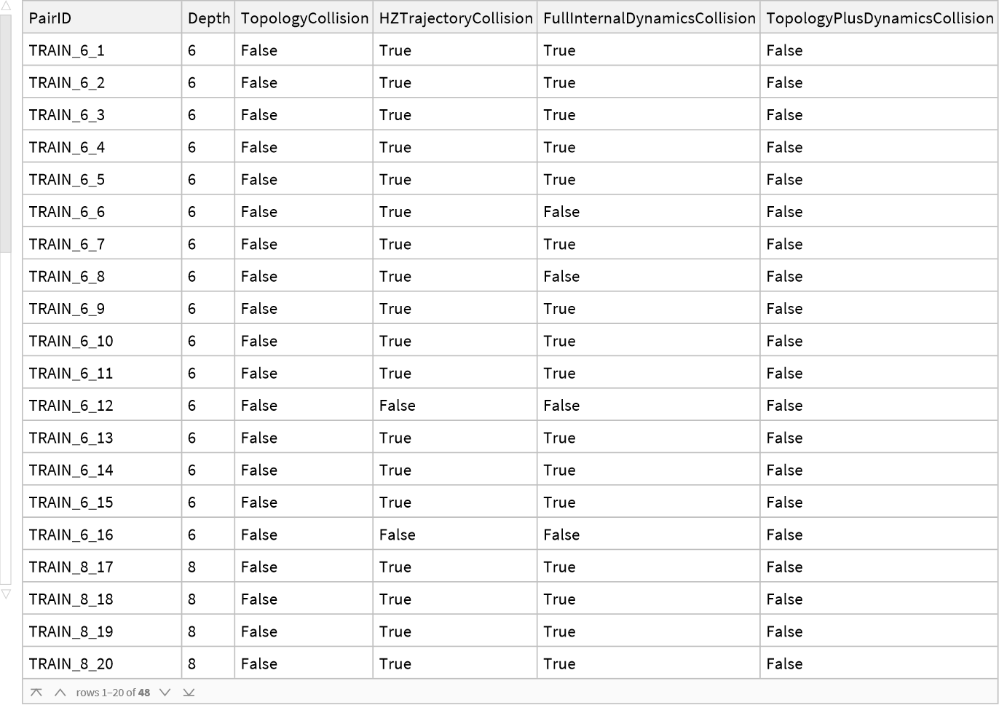

In [2046]:
Dataset[
  pairAuditS102D
]

In [2051]:
Dataset[
  Table[

    <|

      "Mode" ->
        mode,

      "RepresentationClasses" ->
        collisionByStateModeS102D[mode][
          "RepresentationClasses"
        ],

      "LabelCeiling" ->
        collisionByStateModeS102D[mode][
          "ExactRepresentationLabelAccuracyCeiling"
        ],

      "PairCollisions" ->
        collisionByStateModeS102D[mode][
          "ExactMatchedPairCollisions"
        ],

      "PairCollisionFraction" ->
        collisionByStateModeS102D[mode][
          "FractionExactMatchedPairCollision"
        ],

      "PairAccuracyUpperBound" ->
        collisionByStateModeS102D[mode][
          "ExactCollisionPairAccuracyUpperBound"
        ]

    |>,

    {
      mode,
      stateModesS102D
    }
  ]
]

Dataset[{<|Mode -> TopologyOnly, RepresentationClasses -> 96, LabelCeiling -> 1., 
 
>     PairCollisions -> 0, PairCollisionFraction -> 0., PairAccuracyUpperBound -> 1.|>, 
 
>    <|Mode -> HZTrajectoryOnly, RepresentationClasses -> 35, LabelCeiling -> 0.520833, 
 
>     PairCollisions -> 46, PairCollisionFraction -> 0.958333, 
 
>     PairAccuracyUpperBound -> 0.520833|>, 
 
>    <|Mode -> FullInternalDynamics, RepresentationClasses -> 40, 
 
>     LabelCeiling -> 0.541667, PairCollisions -> 44, PairCollisionFraction -> 0.916667, 
 
>     PairAccuracyUpperBound -> 0.541667|>, 
 
>    <|Mode -> TopologyPlusFullDynamics, RepresentationClasses -> 96, 
 
>     LabelCeiling -> 1., PairCollisions -> 0, PairCollisionFraction -> 0., 
 
>     PairAccuracyUpperBound -> 1.|>}, 
 
>   TypeSystem`Vector[TypeSystem`Struct[{Mode, RepresentationClasses, LabelCeiling, 
 
>      PairCollisions, PairCollisionFraction, PairAccuracyUpperBound}, 
 
>     {TypeSystem`Atom[String], TypeSystem`Atom[Integer], TypeSystem`Atom[Real], 
 
>      TypeSystem`Atom[Integer], TypeSystem`Atom[Real], TypeSystem`Atom[Real]}], 4], 
 
>   <||>]

S103A TCCT-v2 anti-aliasing development: TRAIN ONLY.
Historical propagation is frozen; only a parallel provenance channel is\
 
>   added.
DEV and OOD will NOT be accessed.
TRAIN development hash = 911ff4681bcb22351afaf598cd9ba7a1d480c43f9843cab38c33\
 
>    8bb80eb3a46e
Forbidden dynamics hits = {}
Building S103A provenance trajectories...
  variant: StructuralMultiset
  variant: RoleAware
  variant: RoleTokenAware
  variant: RoleTokenRelativeOrder
  variant: PositionTaggedUpperBound


<|Stage -> S103A_TCCTv2_ProvenancePreservingAntiAliasing, 
 
>   ArchitectureDevelopment -> True, PostHocAfterS102Diagnosis -> True, 
 
>   TrainOnly -> True, TrainingPerformed -> False, DevAccessed -> False, 
 
>   OODAccessed -> False, ReferenceExecutorUsed -> False, S3ProductComputed -> False, 
 
>   LabelUsedByDynamics -> False, HistoricalPropagationPathChanged -> False, 
 
>   ParallelProvenanceChannelAdded -> True, InheritedHistoricalCoreConsistency -> True, 
 
>   InheritedMetadataInvariance -> True, ForbiddenDynamicsHits -> {}, 
 
>   DevelopmentHash -> 911ff4681bcb22351afaf598cd9ba7a1d480c43f9843cab38c338bb80eb3a46e, 
 
>   Variants -> {StructuralMultiset, RoleAware, RoleTokenAware, RoleTokenRelativeOrder, 
 
>     PositionTaggedUpperBound}, HistoricalFullDynamicsCollision -> 
 
>    <|Records -> 96, RepresentationClasses -> 40, HashGroupingExact -> True, 
 
>     LabelConflictClasses -> 32, ExactRepresentationLabelAccuracyCeiling -> 0.541667, 
 
>     Pairs -> 48, ExactMatchedPairCollisions -> 44, 
 
>     FractionExactMatchedPairCollision -> 0.916667, 
 
>     ExactCollisionPairAccuracyUpperBound -> 0.541667|>, 
 
>   CollisionByVariant -> 
 
>    <|StructuralMultiset -> 
 
>      <|Records -> 96, RepresentationClasses -> 16, HashGroupingExact -> True, 
 
>       LabelConflictClasses -> 16, ExactRepresentationLabelAccuracyCeiling -> 0.510417, 
 
>       Pairs -> 48, ExactMatchedPairCollisions -> 41, 
 
>       FractionExactMatchedPairCollision -> 0.854167, 
 
>       ExactCollisionPairAccuracyUpperBound -> 0.572917|>, 
 
>     RoleAware -> 
 
>      <|Records -> 96, RepresentationClasses -> 16, HashGroupingExact -> True, 
 
>       LabelConflictClasses -> 16, ExactRepresentationLabelAccuracyCeiling -> 0.510417, 
 
>       Pairs -> 48, ExactMatchedPairCollisions -> 41, 
 
>       FractionExactMatchedPairCollision -> 0.854167, 
 
>       ExactCollisionPairAccuracyUpperBound -> 0.572917|>, 
 
>     RoleTokenAware -> 
 
>      <|Records -> 96, RepresentationClasses -> 16, HashGroupingExact -> True, 
 
>       LabelConflictClasses -> 16, ExactRepresentationLabelAccuracyCeiling -> 0.510417, 
 
>       Pairs -> 48, ExactMatchedPairCollisions -> 41, 
 
>       FractionExactMatchedPairCollision -> 0.854167, 
 
>       ExactCollisionPairAccuracyUpperBound -> 0.572917|>, 
 
>     RoleTokenRelativeOrder -> 
 
>      <|Records -> 96, RepresentationClasses -> 16, HashGroupingExact -> True, 
 
>       LabelConflictClasses -> 16, ExactRepresentationLabelAccuracyCeiling -> 0.510417, 
 
>       Pairs -> 48, ExactMatchedPairCollisions -> 41, 
 
>       FractionExactMatchedPairCollision -> 0.854167, 
 
>       ExactCollisionPairAccuracyUpperBound -> 0.572917|>, 
 
>     PositionTaggedUpperBound -> 
 
>      <|Records -> 96, RepresentationClasses -> 16, HashGroupingExact -> True, 
 
>       LabelConflictClasses -> 16, ExactRepresentationLabelAccuracyCeiling -> 0.510417, 
 
>       Pairs -> 48, ExactMatchedPairCollisions -> 41, 
 
>       FractionExactMatchedPairCollision -> 0.854167, 
 
>       ExactCollisionPairAccuracyUpperBound -> 0.572917|>|>, 
 
>   PairSummary -> 
 
>    <|Pairs -> 48, OldFullDynamicsCollisions -> 44, StructuralMultisetCollisions -> 41, 
 
>     RoleAwareCollisions -> 41, RoleTokenAwareCollisions -> 41, 
 
>     RoleTokenRelativeOrderCollisions -> 41, PositionUpperBoundCollisions -> 41, 
 
>     OldCollisionsResolvedByStructuralMultiset -> 3, OldCollisionsResolvedByRole -> 3, 
 
>     OldCollisionsResolvedByRoleToken -> 3, OldCollisionsResolvedByRelativeOrder -> 3, 
 
>     OldCollisionsResolvedByPositionUpperBound -> 3|>, 
 
>   PerDepth -> <|6 -> 
 
>      <|Pairs -> 16, OldFullDynamicsCollisions -> 12, 
 
>       StructuralMultisetCollisions -> 10, RoleAwareCollisions -> 10, 
 
>       RoleTokenAwareCollisions -> 10, RoleTokenRelativeOrderCollisions -> 10, 
 
>       PositionUpperBoundCollisions -> 10, 
 
>       OldCollisionsResolvedByStructuralMultiset -> 2, 
 
>       OldCollisionsResolvedByRole -> 2, OldCol
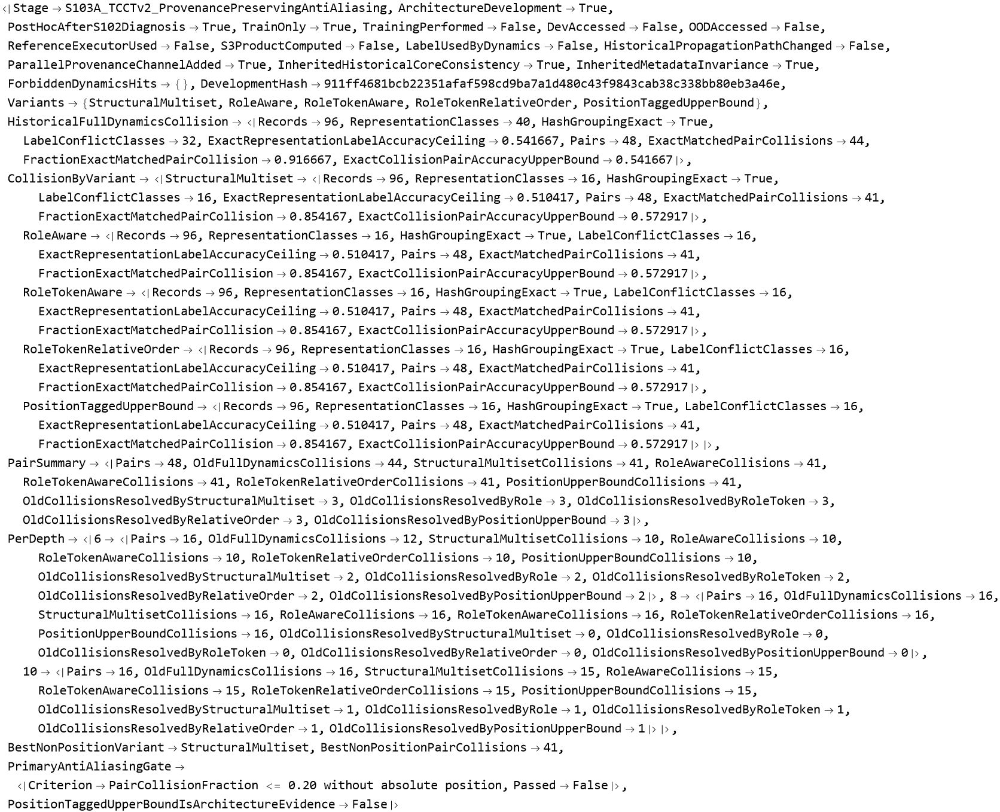

In [2056]:
(* ============================================================ *)
(* S103A                                                        *)
(* TCCT-v2 Provenance-Preserving Anti-Aliasing Development      *)
(*                                                              *)
(* TRAIN ONLY                                                   *)
(* NO classifier training                                       *)
(* NO DEV / OOD                                                 *)
(* NO reference executor                                        *)
(* NO S3 product                                                *)
(* NO label Y inside dynamics                                   *)
(*                                                              *)
(* Historical h/z/allow trajectory is NOT modified.             *)
(* A parallel provenance channel is added.                      *)
(* ============================================================ *)

ClearAll[
  S103ABuildNodeInfo,
  S103ANodeDescriptor,
  S103ARelationClass,
  S103AEdgeDescriptor,
  S103AStateKey,
  S103AProvenanceTrajectory,
  S103ARepKey,
  S103ACollisionAudit,
  S103APairAudit,
  S103APairSummary,
  S103APerDepthSummary
];


(* ============================================================ *)
(* 0. PREFLIGHT                                                 *)
(* ============================================================ *)

If[
  !And[
    ValueQ[trainRecords],
    ValueQ[trainFullStateS102D],
    ValueQ[pairAuditS102D],
    TrueQ[coreConsistencyS102D],
    TrueQ[nodeAlignmentPassedS102D],
    TrueQ[metadataInvariantS102D],
    Length[DownValues[S102AContext]] > 0,
    Length[DownValues[S102AEncodedAt]] > 0
  ],

  Print[
    "STOP: S102D full-state audit must be available first."
  ];

  Abort[];
];


Print[
  "S103A TCCT-v2 anti-aliasing development: TRAIN ONLY."
];

Print[
  "Historical propagation is frozen; only a parallel provenance channel is added."
];

Print[
  "DEV and OOD will NOT be accessed."
];


developmentHashS103A =
  Hash[
    trainRecords,
    "SHA256",
    "HexString"
  ];


Print[
  "TRAIN development hash = ",
  developmentHashS103A
];


(* ============================================================ *)
(* 1. LOCKED DEVELOPMENT VARIANTS                               *)
(*                                                              *)
(* StructuralMultiset                                           *)
(*   full parent-state multiset + frozen structural code        *)
(*                                                              *)
(* RoleAware                                                    *)
(*   + Root/Start/Target/Center/Exit/Sink role                  *)
(*                                                              *)
(* RoleTokenAware                                               *)
(*   + primitive A/B token identity                             *)
(*                                                              *)
(* RoleTokenRelativeOrder                                       *)
(*   + relative source->destination token order                 *)
(*                                                              *)
(* PositionTaggedUpperBound                                     *)
(*   + absolute token position                                  *)
(*   DIAGNOSTIC UPPER BOUND ONLY                                *)
(* ============================================================ *)

s103AVariants = {
  "StructuralMultiset",
  "RoleAware",
  "RoleTokenAware",
  "RoleTokenRelativeOrder",
  "PositionTaggedUpperBound"
};


(* ============================================================ *)
(* 2. BUILD LEGAL NODE INFORMATION                              *)
(*                                                              *)
(* This contains only:                                          *)
(* - existing frozen structural CodePair                        *)
(* - primitive adapter landmark role                            *)
(* - input token A/B                                            *)
(* - input sequence position                                    *)
(*                                                              *)
(* NO task output / label / S3 product.                         *)
(* ============================================================ *)

S103ABuildNodeInfo[
  r_Association
] := Module[
  {
    ctx,
    built,
    vertices,

    roleMap = <||>,
    tokenMap = <||>,
    posMap = <||>,

    centers,
    exits,

    node,
    i,

    info
  },


  ctx =
    S102AContext[
      r
    ];

  built =
    ctx[
      "Built"
    ];

  vertices =
    ctx[
      "Vertices"
    ];


  (* ---------------------------------------------------------- *)
  (* primitive structural roles                                 *)
  (* ---------------------------------------------------------- *)

  AssociateTo[
    roleMap,
    built["Root"] ->
      "Root"
  ];

  AssociateTo[
    roleMap,
    built["StartAnchor"] ->
      "StartAnchor"
  ];

  AssociateTo[
    roleMap,
    built["TargetAnchor"] ->
      "TargetAnchor"
  ];

  AssociateTo[
    roleMap,
    built["Sink"] ->
      "Sink"
  ];


  centers =
    built[
      "TokenCenters"
    ];

  exits =
    built[
      "TokenExits"
    ];


  Do[

    AssociateTo[
      roleMap,
      centers[[i]] ->
        "TokenCenter"
    ];

    AssociateTo[
      tokenMap,
      centers[[i]] ->
        r["Seq"][[i]]
    ];

    AssociateTo[
      posMap,
      centers[[i]] ->
        i
    ],

    {
      i,
      Length[centers]
    }
  ];


  Do[

    AssociateTo[
      roleMap,
      exits[[i]] ->
        "TokenExit"
    ];

    AssociateTo[
      tokenMap,
      exits[[i]] ->
        r["Seq"][[i]]
    ];

    AssociateTo[
      posMap,
      exits[[i]] ->
        i
    ],

    {
      i,
      Length[exits]
    }
  ];


  (* ---------------------------------------------------------- *)
  (* one descriptor per packed graph vertex                     *)
  (* ---------------------------------------------------------- *)

  info =
    Association@Table[

      node -> <|

        "Role" ->
          Lookup[
            roleMap,
            node,
            "Other"
          ],

        "Token" ->
          Lookup[
            tokenMap,
            node,
            -1
          ],

        "Position" ->
          Lookup[
            posMap,
            node,
            0
          ],

        "CodePair" ->
          S102AEncodedAt[
            ctx,
            node
          ]

      |>,

      {
        node,
        vertices
      }
    ];


  <|

    "Context" ->
      ctx,

    "Info" ->
      info

  |>
];


(* ============================================================ *)
(* 3. NODE DESCRIPTOR BY VARIANT                                *)
(* ============================================================ *)

S103ANodeDescriptor[
  nodeInfo_Association,
  variant_String
] := Module[
  {
    code,
    role,
    token,
    pos
  },


  code =
    nodeInfo[
      "CodePair"
    ];

  role =
    nodeInfo[
      "Role"
    ];

  token =
    nodeInfo[
      "Token"
    ];

  pos =
    nodeInfo[
      "Position"
    ];


  Switch[

    variant,


    "StructuralMultiset",

      {
        "Code",
        code
      },


    "RoleAware",

      {
        "Code",
        code,

        "Role",
        role
      },


    "RoleTokenAware",

      {
        "Code",
        code,

        "Role",
        role,

        "Token",
        token
      },


    "RoleTokenRelativeOrder",

      {
        "Code",
        code,

        "Role",
        role,

        "Token",
        token
      },


    "PositionTaggedUpperBound",

      {
        "Code",
        code,

        "Role",
        role,

        "Token",
        token,

        "Position",
        pos
      },


    _,

      Print[
        "STOP: unknown S103A variant ",
        variant
      ];

      Abort[]
  ]
];


(* ============================================================ *)
(* 4. RELATIVE ORDER CLASS                                      *)
(*                                                              *)
(* No absolute node ID.                                         *)
(*                                                              *)
(* If both endpoints are program-token landmarks:               *)
(* same / previous / next / earlier / later                     *)
(* ============================================================ *)

S103ARelationClass[
  srcInfo_Association,
  dstInfo_Association
] := Module[
  {
    a,
    b
  },


  a =
    srcInfo[
      "Position"
    ];

  b =
    dstInfo[
      "Position"
    ];


  Which[

    a == 0 ||
    b == 0,

      "NonToken",


    a == b,

      "SamePosition",


    a == b - 1,

      "FromPrevious",


    a == b + 1,

      "FromNext",


    a < b - 1,

      "FromEarlier",


    a > b + 1,

      "FromLater",


    True,

      "OtherRelation"
  ]
];


(* ============================================================ *)
(* 5. EDGE / MESSAGE PROVENANCE DESCRIPTOR                      *)
(* ============================================================ *)

S103AEdgeDescriptor[
  srcInfo_Association,
  dstInfo_Association,
  variant_String
] := Switch[

  variant,


  "StructuralMultiset" |
  "RoleAware" |
  "RoleTokenAware",

    {
      "ParentToChild"
    },


  "RoleTokenRelativeOrder",

    {
      "ParentToChild",

      "SourceRole",
      srcInfo["Role"],

      "DestinationRole",
      dstInfo["Role"],

      "SourceToken",
      srcInfo["Token"],

      "DestinationToken",
      dstInfo["Token"],

      "RelativeOrder",
      S103ARelationClass[
        srcInfo,
        dstInfo
      ]
    },


  "PositionTaggedUpperBound",

    {
      "ParentToChild",

      "SourceRole",
      srcInfo["Role"],

      "DestinationRole",
      dstInfo["Role"],

      "SourceToken",
      srcInfo["Token"],

      "DestinationToken",
      dstInfo["Token"],

      "SourcePosition",
      srcInfo["Position"],

      "DestinationPosition",
      dstInfo["Position"],

      "RelativeOrder",
      S103ARelationClass[
        srcInfo,
        dstInfo
      ]
    },


  _,

    Print[
      "STOP: unknown S103A edge variant ",
      variant
    ];

    Abort[]
];


(* ============================================================ *)
(* 6. EXACT CANONICAL PROVENANCE STATE                          *)
(*                                                              *)
(* IMPORTANT:                                                   *)
(* We preserve the COMPLETE MULTISET of parent messages.        *)
(*                                                              *)
(* No Count[]                                                   *)
(* No Max[]                                                     *)
(* No Sign[] compression of provenance.                         *)
(*                                                              *)
(* Multiplicity is preserved because Sort[list] keeps           *)
(* duplicate messages.                                          *)
(* ============================================================ *)

S103AStateKey[
  destinationDescriptor_,
  messages_List
] :=
  ToString[
    InputForm[
      {
        "Destination",
        destinationDescriptor,

        "ParentMessageMultiset",
        Sort[
          messages
        ]
      }
    ]
  ];


(* ============================================================ *)
(* 7. PROVENANCE-PRESERVING TRAJECTORY                          *)
(*                                                              *)
(* Historical H/Z/Allowed states come DIRECTLY from S102D.      *)
(*                                                              *)
(* This code DOES NOT decide which node propagates.             *)
(* It only attaches richer provenance to the already-frozen     *)
(* historical propagation path.                                 *)
(* ============================================================ *)

S103AProvenanceTrajectory[
  r_Association,
  historicalTrace_Association,
  variant_String
] := Module[
  {
    builtInfo,
    ctx,
    info,

    p,
    pa,
    q,
    n,
    vertices,

    provBefore,
    provAfter,

    rounds,
    rr,

    hBefore,
    hAfter,

    j,
    aps,
    u,

    dstNode,
    srcNode,

    dstInfo,
    srcInfo,

    dstDescriptor,
    edgeDescriptor,

    messages,
    state,

    reachedStates,
    activeStates,

    trajectory = {}
  },


  builtInfo =
    S103ABuildNodeInfo[
      r
    ];

  ctx =
    builtInfo[
      "Context"
    ];

  info =
    builtInfo[
      "Info"
    ];


  p =
    ctx[
      "Pack"
    ];

  pa =
    p[[1]];

  q =
    p[[4]];

  n =
    p[[7]];

  vertices =
    p[[12]];


  rounds =
    historicalTrace[
      "RoundStates"
    ];


  provBefore =
    ConstantArray[
      None,
      n
    ];


  (* initial query provenance *)

  dstNode =
    vertices[[q]];

  provBefore[[q]] =
    ToString[
      InputForm[
        {
          "InitialQuery",

          S103ANodeDescriptor[
            info[dstNode],
            variant
          ]
        }
      ]
    ];


  Do[

    rr =
      rounds[[k]];


    hBefore =
      rr[
        "HBefore"
      ];

    hAfter =
      rr[
        "HAfter"
      ];


    provAfter =
      ConstantArray[
        None,
        n
      ];


    reachedStates = {};
    activeStates = {};


    Do[

      aps =
        Select[
          pa[[j]],

          Function[
            u,
            u > 0 &&
            hBefore[[u]] == 1
          ]
        ];


      If[
        Length[aps] > 0,


        dstNode =
          vertices[[j]];

        dstInfo =
          info[
            dstNode
          ];

        dstDescriptor =
          S103ANodeDescriptor[
            dstInfo,
            variant
          ];


        (* ---------------------------------------------------- *)
        (* exact source-provenance messages                     *)
        (* ---------------------------------------------------- *)

        messages =
          Table[

            srcNode =
              vertices[[u]];

            srcInfo =
              info[
                srcNode
              ];


            If[
              provBefore[[u]] === None,

              Print[
                "STOP: active historical parent lacks provenance state."
              ];

              Print[
                "variant = ",
                variant,
                " | round = ",
                k,
                " | packed node = ",
                u
              ];

              Abort[];
            ];


            edgeDescriptor =
              S103AEdgeDescriptor[
                srcInfo,
                dstInfo,
                variant
              ];


            {
              "Edge",
              edgeDescriptor,

              "SourceNodeDescriptor",
              S103ANodeDescriptor[
                srcInfo,
                variant
              ],

              "SourceState",
              provBefore[[u]]
            },

            {
              u,
              aps
            }
          ];


        state =
          S103AStateKey[
            dstDescriptor,
            messages
          ];


        AppendTo[
          reachedStates,

          {
            dstDescriptor,
            state
          }
        ];


        (* Historical propagation permission is frozen.
           We merely propagate the provenance tag in parallel. *)

        If[
          hAfter[[j]] == 1,

          provAfter[[j]] =
            state;

          AppendTo[
            activeStates,

            {
              dstDescriptor,
              state
            }
          ];
        ];

      ],

      {
        j,
        n
      }
    ];


    AppendTo[
      trajectory,

      {
        "Round",
        k,

        "ReachedStateMultiset",
        Sort[
          reachedStates
        ],

        "ActiveAfterMultiset",
        Sort[
          activeStates
        ]
      }
    ];


    provBefore =
      provAfter,

    {
      k,
      Length[
        rounds
      ]
    }
  ];


  {
    "Rounds",
    Length[
      rounds
    ],

    "Trajectory",
    trajectory
  }
];


(* ============================================================ *)
(* 8. DYNAMICS-DEFINITION LEAKAGE AUDIT                         *)
(*                                                              *)
(* Inspect ONLY provenance dynamics functions, not evaluation   *)
(* collision code.                                              *)
(* ============================================================ *)

dynamicsDefinitionTextS103A =
  ToString[
    InputForm[
      {
        DownValues[
          S103ABuildNodeInfo
        ],

        DownValues[
          S103ANodeDescriptor
        ],

        DownValues[
          S103ARelationClass
        ],

        DownValues[
          S103AEdgeDescriptor
        ],

        DownValues[
          S103AStateKey
        ],

        DownValues[
          S103AProvenanceTrajectory
        ]
      }
    ]
  ];


forbiddenDynamicsTermsS103A = {
  "[\"Y\"]",
  "BLTruth",
  "BLExecute",
  "ReferenceExecutor",
  "CorrectDestination",
  "WrongDestination",
  "ProgramOutput",
  "S3Product",
  "TaskY"
};


forbiddenDynamicsHitsS103A =
  Select[
    forbiddenDynamicsTermsS103A,

    StringContainsQ[
      dynamicsDefinitionTextS103A,
      #
    ] &
  ];


Print[
  "Forbidden dynamics hits = ",
  forbiddenDynamicsHitsS103A
];


If[
  forbiddenDynamicsHitsS103A =!= {},

  Print[
    "STOP: illegal information detected in S103A dynamics."
  ];

  Abort[];
];


(* ============================================================ *)
(* 9. BUILD ALL TRAIN REPRESENTATIONS                           *)
(* ============================================================ *)

Print[
  "Building S103A provenance trajectories..."
];


representationRowsS103A =
  Association@Table[

    Print[
      "  variant: ",
      variant
    ];


    variant ->
      Table[

        <|

          "PairID" ->
            trainRecords[[i]][
              "PairID"
            ],

          "Depth" ->
            trainRecords[[i]][
              "Depth"
            ],

          (* Y is used ONLY here for evaluation.
             It never enters S103AProvenanceTrajectory. *)

          "Y" ->
            trainRecords[[i]][
              "Y"
            ],

          "Rep" ->
            S103AProvenanceTrajectory[
              trainRecords[[i]],
              trainFullStateS102D[[i]],
              variant
            ]

        |>,

        {
          i,
          Length[
            trainRecords
          ]
        }
      ],

    {
      variant,
      s103AVariants
    }
  ];


(* ============================================================ *)
(* 10. EXACT COLLISION AUDIT                                    *)
(* ============================================================ *)

S103ARepKey[x_] :=
  Hash[
    x,
    "SHA256",
    "HexString"
  ];


S103ACollisionAudit[
  rows_List
] := Module[
  {
    classes,
    hashExact,
    conflicts,

    pairGroups,
    pairCollisions,

    ceilingCorrect
  },


  classes =
    Values@
      GroupBy[
        rows,

        S103ARepKey[
          #["Rep"]
        ] &
      ];


  hashExact =
    And @@
      (
        SameQ @@
          Lookup[
            #,
            "Rep"
          ] &
      ) /@
        classes;


  conflicts =
    Select[
      classes,

      Length[
        DeleteDuplicates[
          Lookup[
            #,
            "Y"
          ]
        ]
      ] > 1 &
    ];


  ceilingCorrect =
    Total[
      (
        Max[
          Values[
            Counts[
              Lookup[
                #,
                "Y"
              ]
            ]
          ]
        ] &
      ) /@
        classes
    ];


  pairGroups =
    Values@
      GroupBy[
        rows,
        #["PairID"] &
      ];


  pairCollisions =
    Table[

      Module[
        {
          pos,
          neg
        },

        pos =
          SelectFirst[
            g,
            #["Y"] === 1 &
          ];

        neg =
          SelectFirst[
            g,
            #["Y"] === 0 &
          ];


        SameQ[
          pos["Rep"],
          neg["Rep"]
        ]

      ],

      {
        g,
        pairGroups
      }
    ];


  <|

    "Records" ->
      Length[
        rows
      ],

    "RepresentationClasses" ->
      Length[
        classes
      ],

    "HashGroupingExact" ->
      hashExact,

    "LabelConflictClasses" ->
      Length[
        conflicts
      ],

    "ExactRepresentationLabelAccuracyCeiling" ->
      N[
        ceilingCorrect /
        Length[
          rows
        ]
      ],

    "Pairs" ->
      Length[
        pairGroups
      ],

    "ExactMatchedPairCollisions" ->
      Count[
        pairCollisions,
        True
      ],

    "FractionExactMatchedPairCollision" ->
      N@
        Mean[
          Boole /@
            pairCollisions
        ],

    "ExactCollisionPairAccuracyUpperBound" ->
      N[
        1. -
        0.5
        Mean[
          Boole /@
            pairCollisions
        ]
      ]

  |>
];


collisionByVariantS103A =
  Association@Table[

    variant ->
      S103ACollisionAudit[
        representationRowsS103A[
          variant
        ]
      ],

    {
      variant,
      s103AVariants
    }
  ];


(* ============================================================ *)
(* 11. PAIR-BY-PAIR OLD-vs-NEW AUDIT                            *)
(* ============================================================ *)

oldFullDynamicsCollisionMapS103A =
  AssociationThread[
    Lookup[
      pairAuditS102D,
      "PairID"
    ],

    Lookup[
      pairAuditS102D,
      "FullInternalDynamicsCollision"
    ]
  ];


S103APairAudit[] := Module[
  {
    pairIDs
  },


  pairIDs =
    DeleteDuplicates[
      Lookup[
        trainRecords,
        "PairID"
      ]
    ];


  Table[

    Module[
      {
        oldCollision,
        result,
        group,
        pos,
        neg
      },


      oldCollision =
        Lookup[
          oldFullDynamicsCollisionMapS103A,
          pairID
        ];


      result =
        Association@Table[

          group =
            Select[
              representationRowsS103A[
                variant
              ],

              #["PairID"] ===
                pairID &
            ];


          pos =
            SelectFirst[
              group,
              #["Y"] === 1 &
            ];


          neg =
            SelectFirst[
              group,
              #["Y"] === 0 &
            ];


          variant ->
            SameQ[
              pos["Rep"],
              neg["Rep"]
            ],

          {
            variant,
            s103AVariants
          }
        ];


      <|

        "PairID" ->
          pairID,

        "Depth" ->
          SelectFirst[
            trainRecords,
            #["PairID"] === pairID &
          ][
            "Depth"
          ],

        "OldFullDynamicsCollision" ->
          oldCollision,

        "StructuralMultisetCollision" ->
          result[
            "StructuralMultiset"
          ],

        "RoleAwareCollision" ->
          result[
            "RoleAware"
          ],

        "RoleTokenAwareCollision" ->
          result[
            "RoleTokenAware"
          ],

        "RoleTokenRelativeOrderCollision" ->
          result[
            "RoleTokenRelativeOrder"
          ],

        "PositionUpperBoundCollision" ->
          result[
            "PositionTaggedUpperBound"
          ],

        "ResolvedByStructuralMultiset" ->
          And[
            TrueQ[
              oldCollision
            ],

            !TrueQ[
              result[
                "StructuralMultiset"
              ]
            ]
          ],

        "ResolvedByRole" ->
          And[
            TrueQ[
              oldCollision
            ],

            !TrueQ[
              result[
                "RoleAware"
              ]
            ]
          ],

        "ResolvedByRoleToken" ->
          And[
            TrueQ[
              oldCollision
            ],

            !TrueQ[
              result[
                "RoleTokenAware"
              ]
            ]
          ],

        "ResolvedByRelativeOrder" ->
          And[
            TrueQ[
              oldCollision
            ],

            !TrueQ[
              result[
                "RoleTokenRelativeOrder"
              ]
            ]
          ],

        "ResolvedByPositionUpperBound" ->
          And[
            TrueQ[
              oldCollision
            ],

            !TrueQ[
              result[
                "PositionTaggedUpperBound"
              ]
            ]
          ]

      |>

    ],

    {
      pairID,
      pairIDs
    }
  ]
];


pairAuditS103A =
  S103APairAudit[];


(* ============================================================ *)
(* 12. PAIR SUMMARY                                             *)
(* ============================================================ *)

S103APairSummary[
  rows_List
] := <|

  "Pairs" ->
    Length[
      rows
    ],

  "OldFullDynamicsCollisions" ->
    Count[
      Lookup[
        rows,
        "OldFullDynamicsCollision"
      ],
      True
    ],

  "StructuralMultisetCollisions" ->
    Count[
      Lookup[
        rows,
        "StructuralMultisetCollision"
      ],
      True
    ],

  "RoleAwareCollisions" ->
    Count[
      Lookup[
        rows,
        "RoleAwareCollision"
      ],
      True
    ],

  "RoleTokenAwareCollisions" ->
    Count[
      Lookup[
        rows,
        "RoleTokenAwareCollision"
      ],
      True
    ],

  "RoleTokenRelativeOrderCollisions" ->
    Count[
      Lookup[
        rows,
        "RoleTokenRelativeOrderCollision"
      ],
      True
    ],

  "PositionUpperBoundCollisions" ->
    Count[
      Lookup[
        rows,
        "PositionUpperBoundCollision"
      ],
      True
    ],

  "OldCollisionsResolvedByStructuralMultiset" ->
    Count[
      Lookup[
        rows,
        "ResolvedByStructuralMultiset"
      ],
      True
    ],

  "OldCollisionsResolvedByRole" ->
    Count[
      Lookup[
        rows,
        "ResolvedByRole"
      ],
      True
    ],

  "OldCollisionsResolvedByRoleToken" ->
    Count[
      Lookup[
        rows,
        "ResolvedByRoleToken"
      ],
      True
    ],

  "OldCollisionsResolvedByRelativeOrder" ->
    Count[
      Lookup[
        rows,
        "ResolvedByRelativeOrder"
      ],
      True
    ],

  "OldCollisionsResolvedByPositionUpperBound" ->
    Count[
      Lookup[
        rows,
        "ResolvedByPositionUpperBound"
      ],
      True
    ]

|>;


pairSummaryS103A =
  S103APairSummary[
    pairAuditS103A
  ];


(* ============================================================ *)
(* 13. PER-DEPTH SUMMARY                                        *)
(* ============================================================ *)

S103APerDepthSummary[
  rows_List
] :=
  Association@Table[

    d ->
      S103APairSummary[
        Select[
          rows,
          #["Depth"] === d &
        ]
      ],

    {
      d,
      Sort@
        DeleteDuplicates[
          Lookup[
            rows,
            "Depth"
          ]
        ]
    }
  ];


perDepthS103A =
  S103APerDepthSummary[
    pairAuditS103A
  ];


(* ============================================================ *)
(* 14. COMPACT COMPARISON TABLE                                 *)
(* ============================================================ *)

compactRowsS103A =
  Join[

    {
      <|

        "Variant" ->
          "HistoricalFullInternalDynamics",

        "AbsolutePositionUsed" ->
          False,

        "RepresentationClasses" ->
          collisionByStateModeS102D[
            "FullInternalDynamics"
          ][
            "RepresentationClasses"
          ],

        "PairCollisions" ->
          collisionByStateModeS102D[
            "FullInternalDynamics"
          ][
            "ExactMatchedPairCollisions"
          ],

        "PairCollisionFraction" ->
          collisionByStateModeS102D[
            "FullInternalDynamics"
          ][
            "FractionExactMatchedPairCollision"
          ],

        "LabelCeiling" ->
          collisionByStateModeS102D[
            "FullInternalDynamics"
          ][
            "ExactRepresentationLabelAccuracyCeiling"
          ]

      |>
    },


    Table[

      <|

        "Variant" ->
          variant,

        "AbsolutePositionUsed" ->
          SameQ[
            variant,
            "PositionTaggedUpperBound"
          ],

        "RepresentationClasses" ->
          collisionByVariantS103A[
            variant
          ][
            "RepresentationClasses"
          ],

        "PairCollisions" ->
          collisionByVariantS103A[
            variant
          ][
            "ExactMatchedPairCollisions"
          ],

        "PairCollisionFraction" ->
          collisionByVariantS103A[
            variant
          ][
            "FractionExactMatchedPairCollision"
          ],

        "LabelCeiling" ->
          collisionByVariantS103A[
            variant
          ][
            "ExactRepresentationLabelAccuracyCeiling"
          ]

      |>,

      {
        variant,
        s103AVariants
      }
    ]

  ];


(* ============================================================ *)
(* 15. PRIMARY DEVELOPMENT DIAGNOSIS                            *)
(*                                                              *)
(* We deliberately DO NOT count PositionTaggedUpperBound as     *)
(* sufficient evidence of a good new core, because position +   *)
(* token can trivially preserve much of the raw program.         *)
(* ============================================================ *)

primaryNonPositionVariantsS103A = {
  "StructuralMultiset",
  "RoleAware",
  "RoleTokenAware",
  "RoleTokenRelativeOrder"
};


bestNonPositionVariantS103A =
  First@
    MinimalBy[
      primaryNonPositionVariantsS103A,

      collisionByVariantS103A[#][
        "ExactMatchedPairCollisions"
      ] &
    ];


bestNonPositionCollisionsS103A =
  collisionByVariantS103A[
    bestNonPositionVariantS103A
  ][
    "ExactMatchedPairCollisions"
  ];


primaryAntiAliasingGateS103A =
  bestNonPositionCollisionsS103A <=
    Ceiling[
      0.20 *
      Length[
        DeleteDuplicates[
          Lookup[
            trainRecords,
            "PairID"
          ]
        ]
      ]
    ];


(* ============================================================ *)
(* 16. FINAL REPORT                                             *)
(* ============================================================ *)

finalS103A =
  <|

    "Stage" ->
      "S103A_TCCTv2_ProvenancePreservingAntiAliasing",

    "ArchitectureDevelopment" ->
      True,

    "PostHocAfterS102Diagnosis" ->
      True,

    "TrainOnly" ->
      True,

    "TrainingPerformed" ->
      False,

    "DevAccessed" ->
      False,

    "OODAccessed" ->
      False,

    "ReferenceExecutorUsed" ->
      False,

    "S3ProductComputed" ->
      False,

    "LabelUsedByDynamics" ->
      False,

    "HistoricalPropagationPathChanged" ->
      False,

    "ParallelProvenanceChannelAdded" ->
      True,

    "InheritedHistoricalCoreConsistency" ->
      coreConsistencyS102D,

    "InheritedMetadataInvariance" ->
      metadataInvariantS102D,

    "ForbiddenDynamicsHits" ->
      forbiddenDynamicsHitsS103A,

    "DevelopmentHash" ->
      developmentHashS103A,

    "Variants" ->
      s103AVariants,

    "HistoricalFullDynamicsCollision" ->
      collisionByStateModeS102D[
        "FullInternalDynamics"
      ],

    "CollisionByVariant" ->
      collisionByVariantS103A,

    "PairSummary" ->
      pairSummaryS103A,

    "PerDepth" ->
      perDepthS103A,

    "BestNonPositionVariant" ->
      bestNonPositionVariantS103A,

    "BestNonPositionPairCollisions" ->
      bestNonPositionCollisionsS103A,

    "PrimaryAntiAliasingGate" ->
      <|

        "Criterion" ->
          "PairCollisionFraction <= 0.20 without absolute position",

        "Passed" ->
          primaryAntiAliasingGateS103A

      |>,

    "PositionTaggedUpperBoundIsArchitectureEvidence" ->
      False

  |>;


finalS103A

Dataset[{<|Variant -> HistoricalFullInternalDynamics, AbsolutePositionUsed -> False, 
 
>     RepresentationClasses -> 40, PairCollisions -> 44, 
 
>     PairCollisionFraction -> 0.916667, LabelCeiling -> 0.541667|>, 
 
>    <|Variant -> StructuralMultiset, AbsolutePositionUsed -> False, 
 
>     RepresentationClasses -> 16, PairCollisions -> 41, 
 
>     PairCollisionFraction -> 0.854167, LabelCeiling -> 0.510417|>, 
 
>    <|Variant -> RoleAware, AbsolutePositionUsed -> False, RepresentationClasses -> 16, 
 
>     PairCollisions -> 41, PairCollisionFraction -> 0.854167, LabelCeiling -> 0.510417|>
 
>     , <|Variant -> RoleTokenAware, AbsolutePositionUsed -> False, 
 
>     RepresentationClasses -> 16, PairCollisions -> 41, 
 
>     PairCollisionFraction -> 0.854167, LabelCeiling -> 0.510417|>, 
 
>    <|Variant -> RoleTokenRelativeOrder, AbsolutePositionUsed -> False, 
 
>     RepresentationClasses -> 16, PairCollisions -> 41, 
 
>     PairCollisionFraction -> 0.854167, LabelCeiling -> 0.510417|>, 
 
>    <|Variant -> PositionTaggedUpperBound, AbsolutePositionUsed -> True, 
 
>     RepresentationClasses -> 16, PairCollisions -> 41, 
 
>     PairCollisionFraction -> 0.854167, LabelCeiling -> 0.510417|>}, 
 
>   TypeSystem`Vector[TypeSystem`Struct[{Variant, AbsolutePositionUsed, 
 
>      RepresentationClasses, PairCollisions, PairCollisionFraction, LabelCeiling}, 
 
>     {TypeSystem`Atom[String], TypeSystem`Atom[TypeSystem`Boolean], 
 
>      TypeSystem`Atom[Integer], TypeSystem`Atom[Integer], TypeSystem`Atom[Real], 
 
>      TypeSystem`Atom[Real]}], 6], <||>]
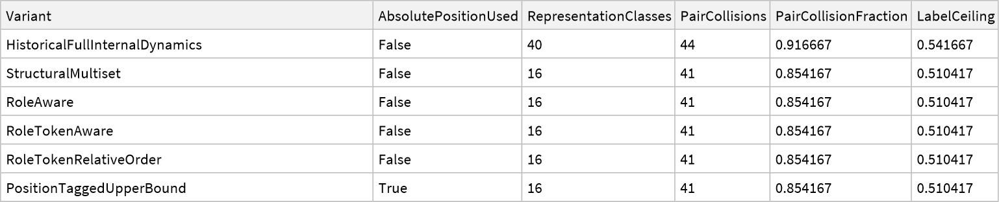

In [2215]:
Dataset[
  compactRowsS103A
]

Dataset[{<|PairID -> TRAIN_6_1, Depth -> 6, OldFullDynamicsCollision -> True, 
 
>     StructuralMultisetCollision -> True, RoleAwareCollision -> True, 
 
>     RoleTokenAwareCollision -> True, RoleTokenRelativeOrderCollision -> True, 
 
>     PositionUpperBoundCollision -> True, ResolvedByStructuralMultiset -> False, 
 
>     ResolvedByRole -> False, ResolvedByRoleToken -> False, 
 
>     ResolvedByRelativeOrder -> False, ResolvedByPositionUpperBound -> False|>, 
 
>    <|PairID -> TRAIN_6_2, Depth -> 6, OldFullDynamicsCollision -> True, 
 
>     StructuralMultisetCollision -> True, RoleAwareCollision -> True, 
 
>     RoleTokenAwareCollision -> True, RoleTokenRelativeOrderCollision -> True, 
 
>     PositionUpperBoundCollision -> True, ResolvedByStructuralMultiset -> False, 
 
>     ResolvedByRole -> False, ResolvedByRoleToken -> False, 
 
>     ResolvedByRelativeOrder -> False, ResolvedByPositionUpperBound -> False|>, 
 
>    <|PairID -> TRAIN_6_3, Depth -> 6, OldFullDynamicsCollision -> True, 
 
>     StructuralMultisetCollision -> True, RoleAwareCollision -> True, 
 
>     RoleTokenAwareCollision -> True, RoleTokenRelativeOrderCollision -> True, 
 
>     PositionUpperBoundCollision -> True, ResolvedByStructuralMultiset -> False, 
 
>     ResolvedByRole -> False, ResolvedByRoleToken -> False, 
 
>     ResolvedByRelativeOrder -> False, ResolvedByPositionUpperBound -> False|>, 
 
>    <|PairID -> TRAIN_6_4, Depth -> 6, OldFullDynamicsCollision -> True, 
 
>     StructuralMultisetCollision -> False, RoleAwareCollision -> False, 
 
>     RoleTokenAwareCollision -> False, RoleTokenRelativeOrderCollision -> False, 
 
>     PositionUpperBoundCollision -> False, ResolvedByStructuralMultiset -> True, 
 
>     ResolvedByRole -> True, ResolvedByRoleToken -> True, 
 
>     ResolvedByRelativeOrder -> True, ResolvedByPositionUpperBound -> True|>, 
 
>    <|PairID -> TRAIN_6_5, Depth -> 6, OldFullDynamicsCollision -> True, 
 
>     StructuralMultisetCollision -> True, RoleAwareCollision -> True, 
 
>     RoleTokenAwareCollision -> True, RoleTokenRelativeOrderCollision -> True, 
 
>     PositionUpperBoundCollision -> True, ResolvedByStructuralMultiset -> False, 
 
>     ResolvedByRole -> False, ResolvedByRoleToken -> False, 
 
>     ResolvedByRelativeOrder -> False, ResolvedByPositionUpperBound -> False|>, 
 
>    <|PairID -> TRAIN_6_6, Depth -> 6, OldFullDynamicsCollision -> False, 
 
>     StructuralMultisetCollision -> False, RoleAwareCollision -> False, 
 
>     RoleTokenAwareCollision -> False, RoleTokenRelativeOrderCollision -> False, 
 
>     PositionUpperBoundCollision -> False, ResolvedByStructuralMultiset -> False, 
 
>     ResolvedByRole -> False, ResolvedByRoleToken -> False, 
 
>     ResolvedByRelativeOrder -> False, ResolvedByPositionUpperBound -> False|>, 
 
>    <|PairID -> TRAIN_6_7, Depth -> 6, OldFullDynamicsCollision -> True, 
 
>     StructuralMultisetCollision -> True, RoleAwareCollision -> True, 
 
>     RoleTokenAwareCollision -> True, RoleTokenRelativeOrderCollision -> True, 
 
>     PositionUpperBoundCollision -> True, ResolvedByStructuralMultiset -> False, 
 
>     ResolvedByRole -> False, ResolvedByRoleToken -> False, 
 
>     ResolvedByRelativeOrder -> False, ResolvedByPositionUpperBound -> False|>, 
 
>    <|PairID -> TRAIN_6_8, Depth -> 6, OldFullDynamicsCollision -> False, 
 
>     StructuralMultisetCollision -> False, RoleAwareCollision -> False, 
 
>     RoleTokenAwareCollision -> False, RoleTokenRelativeOrderCollision -> False, 
 
>     PositionUpperBoundCollision -> False, ResolvedByStructuralMultiset -> False, 
 
>     ResolvedByRole -> False, ResolvedByRoleToken -> False, 
 
>     ResolvedByRelativeOrder -> False, ResolvedByPositionUpperBound -> False|>, 
 
>    <|PairID -> TRAIN_6_9, Depth -> 6, OldFullDynamicsCollision -> True, 
 
>     StructuralMultisetCollision -> True, RoleAwareCollision -> True, 
 
>     RoleTokenAwareCollision -> True, RoleTokenRelativeOrderCollision -> True, 
 
>     Position
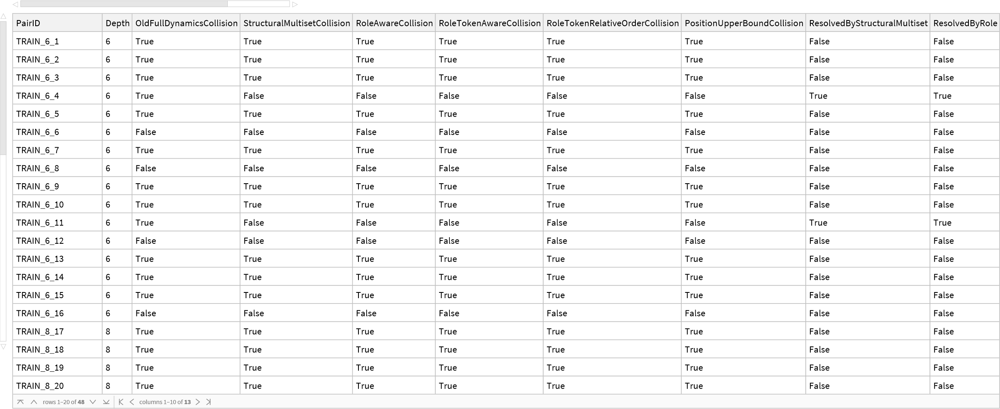

In [2220]:
Dataset[
  pairAuditS103A
]

S103B: TRUE label-before-union dynamics. TRAIN ONLY.
No DEV. No OOD. No classifier training.
Forbidden dynamics hits = {}
Running true TCCT-v2 dynamics...
  variant = RoleRel_ExactUnion
  variant = RoleTokenRel_ExactUnion
  variant = RoleTokenRel_Multiset
  variant = RoleTokenPosition_Multiset


<|Stage -> S103B_TCCTv2_LabelBeforeUnion, ArchitectureDevelopment -> True, 
 
>   TrainOnly -> True, ClassifierTrainingPerformed -> False, DevAccessed -> False, 
 
>   OODAccessed -> False, ReferenceExecutorUsed -> False, S3ProductComputed -> False, 
 
>   LabelYUsedByDynamics -> False, HistoricalTransitionChanged -> True, 
 
>   LabelsParticipateBeforeAggregation -> True, OldCountMaxCompressionRemoved -> True, 
 
>   ForbiddenDynamicsHits -> {}, Variants -> 
 
>    {RoleRel_ExactUnion, RoleTokenRel_ExactUnion, RoleTokenRel_Multiset, 
 
>     RoleTokenPosition_Multiset}, CollisionByVariant -> 
 
>    <|RoleRel_ExactUnion -> 
 
>      <|Records -> 96, RepresentationClasses -> 96, HashGroupingExact -> True, 
 
>       LabelConflictClasses -> 0, ExactRepresentationLabelAccuracyCeiling -> 1., 
 
>       Pairs -> 48, ExactMatchedPairCollisions -> 0, 
 
>       FractionExactMatchedPairCollision -> 0., 
 
>       ExactCollisionPairAccuracyUpperBound -> 1.|>, 
 
>     RoleTokenRel_ExactUnion -> 
 
>      <|Records -> 96, RepresentationClasses -> 96, HashGroupingExact -> True, 
 
>       LabelConflictClasses -> 0, ExactRepresentationLabelAccuracyCeiling -> 1., 
 
>       Pairs -> 48, ExactMatchedPairCollisions -> 0, 
 
>       FractionExactMatchedPairCollision -> 0., 
 
>       ExactCollisionPairAccuracyUpperBound -> 1.|>, 
 
>     RoleTokenRel_Multiset -> 
 
>      <|Records -> 96, RepresentationClasses -> 96, HashGroupingExact -> True, 
 
>       LabelConflictClasses -> 0, ExactRepresentationLabelAccuracyCeiling -> 1., 
 
>       Pairs -> 48, ExactMatchedPairCollisions -> 0, 
 
>       FractionExactMatchedPairCollision -> 0., 
 
>       ExactCollisionPairAccuracyUpperBound -> 1.|>, 
 
>     RoleTokenPosition_Multiset -> 
 
>      <|Records -> 96, RepresentationClasses -> 96, HashGroupingExact -> True, 
 
>       LabelConflictClasses -> 0, ExactRepresentationLabelAccuracyCeiling -> 1., 
 
>       Pairs -> 48, ExactMatchedPairCollisions -> 0, 
 
>       FractionExactMatchedPairCollision -> 0., 
 
>       ExactCollisionPairAccuracyUpperBound -> 1.|>|>, 
 
>   PairSummary -> 
 
>    <|Pairs -> 48, OldFullDynamicsCollisions -> 44, RoleRelUnionCollisions -> 0, 
 
>     RoleTokenRelUnionCollisions -> 0, RoleTokenRelMultisetCollisions -> 0, 
 
>     PositionMultisetCollisions -> 0|>, 
 
>   PerDepth -> <|6 -> 
 
>      <|Pairs -> 16, OldFullDynamicsCollisions -> 12, RoleRelUnionCollisions -> 0, 
 
>       RoleTokenRelUnionCollisions -> 0, RoleTokenRelMultisetCollisions -> 0, 
 
>       PositionMultisetCollisions -> 0|>, 
 
>     8 -> <|Pairs -> 16, OldFullDynamicsCollisions -> 16, RoleRelUnionCollisions -> 0, 
 
>       RoleTokenRelUnionCollisions -> 0, RoleTokenRelMultisetCollisions -> 0, 
 
>       PositionMultisetCollisions -> 0|>, 
 
>     10 -> <|Pairs -> 16, OldFullDynamicsCollisions -> 16, RoleRelUnionCollisions -> 0, 
 
>       RoleTokenRelUnionCollisions -> 0, RoleTokenRelMultisetCollisions -> 0, 
 
>       PositionMultisetCollisions -> 0|>|>, BestLegalVariant -> RoleRel_ExactUnion, 
 
>   BestLegalPairCollisions -> 0, DevelopmentGate -> 
 
>    <|Criterion -> Pair collision fraction <= 0.20, Passed -> True|>, 
 
>   PositionVariantIsArchitectureEvidence -> False|>
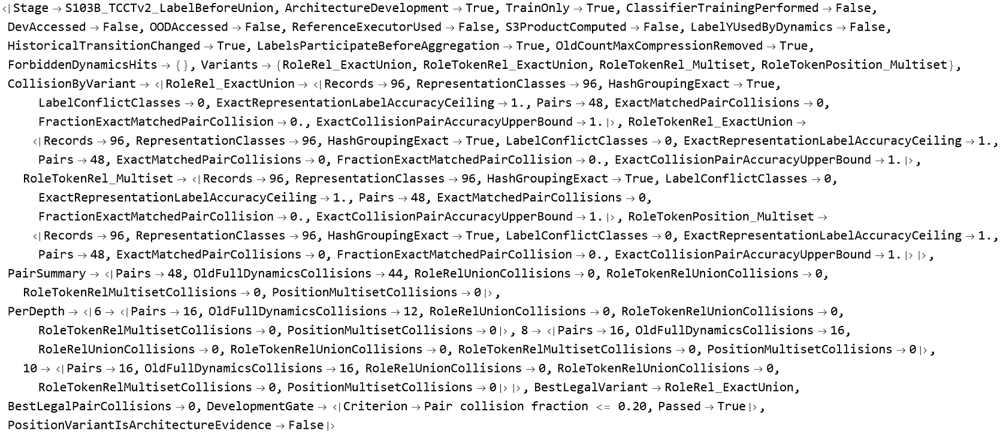

In [2225]:
(* ============================================================ *)
(* S103B                                                        *)
(* TCCT-v2 Label-Before-Union Dynamics                          *)
(*                                                              *)
(* TRAIN ONLY                                                   *)
(* NO classifier                                                *)
(* NO DEV / OOD                                                 *)
(* NO Y inside dynamics                                         *)
(* NO S3 product                                                *)
(* NO reference executor                                        *)
(*                                                              *)
(* Main hypothesis:                                             *)
(* task-relevant distinctions were destroyed because old TCCT   *)
(* compressed parent messages BEFORE preserving provenance.     *)
(*                                                              *)
(* New rule:                                                    *)
(* full typed message -> equality test -> optional exact Union   *)
(* ============================================================ *)

ClearAll[
  S103BNodeInfo,
  S103BNodeDescriptor,
  S103BRelation,
  S103BMessageDescriptor,
  S103BAggregateMessages,
  S103BStateID,
  S103BRun,
  S103BRepKey,
  S103BCollisionAudit,
  S103BPairAudit,
  S103BPairSummary
];


(* ============================================================ *)
(* 0. PREFLIGHT                                                 *)
(* ============================================================ *)

If[
  !And[
    ValueQ[trainRecords],
    ValueQ[collisionByStateModeS102D],
    Length[DownValues[S102AContext]] > 0,
    Length[DownValues[S102AEncodedAt]] > 0
  ],

  Print["STOP: previous S102/S103 definitions missing."];
  Abort[];
];


Print["S103B: TRUE label-before-union dynamics. TRAIN ONLY."];
Print["No DEV. No OOD. No classifier training."];


s103BVariants = {

  (* no A/B identity: structural control *)
  "RoleRel_ExactUnion",

  (* A/B identity participates BEFORE aggregation *)
  "RoleTokenRel_ExactUnion",

  (* same, but do NOT remove exact duplicate messages *)
  "RoleTokenRel_Multiset",

  (* diagnostic upper bound only *)
  "RoleTokenPosition_Multiset"
};


(* ============================================================ *)
(* 1. LEGAL NODE INFORMATION                                    *)
(* ============================================================ *)

S103BNodeInfo[
  r_Association
] := Module[
  {
    ctx,
    built,
    vertices,
    centers,
    exits,
    roleMap = <||>,
    tokenMap = <||>,
    positionMap = <||>,
    info,
    i
  },


  ctx =
    S102AContext[r];

  built =
    ctx["Built"];

  vertices =
    ctx["Vertices"];


  roleMap =
    Join[
      roleMap,
      <|
        built["Root"] -> "Root",
        built["StartAnchor"] -> "StartAnchor",
        built["TargetAnchor"] -> "TargetAnchor",
        built["Sink"] -> "Sink"
      |>
    ];


  centers =
    built["TokenCenters"];

  exits =
    built["TokenExits"];


  Do[

    roleMap =
      Join[
        roleMap,
        <|
          centers[[i]] -> "TokenCenter",
          exits[[i]] -> "TokenExit"
        |>
      ];


    tokenMap =
      Join[
        tokenMap,
        <|
          centers[[i]] -> r["Seq"][[i]],
          exits[[i]] -> r["Seq"][[i]]
        |>
      ];


    positionMap =
      Join[
        positionMap,
        <|
          centers[[i]] -> i,
          exits[[i]] -> i
        |>
      ],

    {
      i,
      Length[centers]
    }
  ];


  info =
    Association@Table[

      node -> <|

        "Role" ->
          Lookup[
            roleMap,
            node,
            "Other"
          ],

        "Token" ->
          Lookup[
            tokenMap,
            node,
            -1
          ],

        "Position" ->
          Lookup[
            positionMap,
            node,
            0
          ],

        "CodePair" ->
          S102AEncodedAt[
            ctx,
            node
          ]

      |>,

      {
        node,
        vertices
      }
    ];


  <|
    "Context" -> ctx,
    "Info" -> info
  |>
];


(* ============================================================ *)
(* 2. NODE DESCRIPTOR                                           *)
(* ============================================================ *)

S103BNodeDescriptor[
  x_Association,
  variant_String
] := Switch[

  variant,


  "RoleRel_ExactUnion",

    {
      "Code", x["CodePair"],
      "Role", x["Role"]
    },


  "RoleTokenRel_ExactUnion" |
  "RoleTokenRel_Multiset",

    {
      "Code", x["CodePair"],
      "Role", x["Role"],
      "Token", x["Token"]
    },


  "RoleTokenPosition_Multiset",

    {
      "Code", x["CodePair"],
      "Role", x["Role"],
      "Token", x["Token"],
      "Position", x["Position"]
    },


  _,

    Print[
      "STOP: unknown S103B variant ",
      variant
    ];
    Abort[]
];


(* ============================================================ *)
(* 3. RELATIVE POSITION / EDGE ROLE                             *)
(* ============================================================ *)

S103BRelation[
  src_Association,
  dst_Association
] := Module[
  {
    a = src["Position"],
    b = dst["Position"]
  },

  Which[

    a == 0 || b == 0,
      "NonToken",

    a == b,
      "SameToken",

    a == b - 1,
      "FromPrevious",

    a == b + 1,
      "FromNext",

    a < b - 1,
      "FromEarlier",

    a > b + 1,
      "FromLater",

    True,
      "Other"
  ]
];


(* ============================================================ *)
(* 4. COMPLETE MESSAGE SIGNATURE                                *)
(*                                                              *)
(* THIS is what must match before Union is permitted.           *)
(*                                                              *)
(* Not merely A == A.                                           *)
(* ============================================================ *)

S103BMessageDescriptor[
  srcInfo_Association,
  dstInfo_Association,
  sourceState_,
  variant_String
] := Switch[

  variant,


  "RoleRel_ExactUnion",

    {
      "SourceRole", srcInfo["Role"],
      "DestinationRole", dstInfo["Role"],
      "Relation", S103BRelation[srcInfo, dstInfo],
      "SourceState", sourceState
    },


  "RoleTokenRel_ExactUnion" |
  "RoleTokenRel_Multiset",

    {
      "SourceRole", srcInfo["Role"],
      "DestinationRole", dstInfo["Role"],

      "SourceToken", srcInfo["Token"],
      "DestinationToken", dstInfo["Token"],

      "Relation",
        S103BRelation[
          srcInfo,
          dstInfo
        ],

      "SourceState",
        sourceState
    },


  "RoleTokenPosition_Multiset",

    {
      "SourceRole", srcInfo["Role"],
      "DestinationRole", dstInfo["Role"],

      "SourceToken", srcInfo["Token"],
      "DestinationToken", dstInfo["Token"],

      "SourcePosition", srcInfo["Position"],
      "DestinationPosition", dstInfo["Position"],

      "Relation",
        S103BRelation[
          srcInfo,
          dstInfo
        ],

      "SourceState",
        sourceState
    },


  _,

    Print[
      "STOP: unknown message variant."
    ];
    Abort[]
];


(* ============================================================ *)
(* 5. THE CRITICAL AGGREGATION STEP                             *)
(*                                                              *)
(* ExactUnion:                                                  *)
(*   messages are merged ONLY when the COMPLETE typed message   *)
(*   is identical.                                              *)
(*                                                              *)
(* Multiset:                                                    *)
(*   even exact duplicates remain duplicated.                   *)
(*                                                              *)
(* Example:                                                     *)
(*                                                              *)
(* {A,previous,q1} != {A,next,q1}                               *)
(*                                                              *)
(* and under Multiset:                                          *)
(*                                                              *)
(* {m,m} != {m}                                                 *)
(* ============================================================ *)

S103BAggregateMessages[
  messages_List,
  variant_String
] := Switch[

  variant,


  "RoleRel_ExactUnion" |
  "RoleTokenRel_ExactUnion",

    Sort[
      DeleteDuplicates[
        messages
      ]
    ],


  "RoleTokenRel_Multiset" |
  "RoleTokenPosition_Multiset",

    Sort[
      messages
    ],


  _,

    Print[
      "STOP: unknown aggregation variant."
    ];
    Abort[]
];


(* ============================================================ *)
(* 6. STATE IDENTIFIER                                          *)
(*                                                              *)
(* A new state is computed AFTER provenance-aware aggregation.  *)
(*                                                              *)
(* SHA256 is only a compact canonical state ID.                 *)
(* ============================================================ *)

S103BStateID[
  dstDescriptor_,
  aggregate_
] :=
  Hash[
    {
      "TCCTv2State",
      dstDescriptor,
      aggregate
    },
    "SHA256",
    "HexString"
  ];


(* ============================================================ *)
(* 7. TRUE NEW TRANSITION DYNAMICS                              *)
(*                                                              *)
(* IMPORTANT DIFFERENCE FROM S103A:                             *)
(*                                                              *)
(* S103A:                                                       *)
(*   old TCCT decided propagation first                         *)
(*   provenance was attached afterwards                         *)
(*                                                              *)
(* S103B:                                                       *)
(*   provenance-aware state participates in the NEXT transition *)
(*                                                              *)
(* A node is active next round whenever it receives at least    *)
(* one active-parent message.                                   *)
(*                                                              *)
(* No Count/Max/Sign compression.                               *)
(* ============================================================ *)

S103BRun[
  r_Association,
  variant_String
] := Module[
  {
    builtInfo,
    ctx,
    info,

    p,
    pa,
    q,
    n,
    vertices,

    active,
    state,

    nextActive,
    nextState,

    j,
    u,
    k,

    activeParents,

    srcNode,
    dstNode,

    srcInfo,
    dstInfo,

    messages,
    aggregate,

    dstDescriptor,
    newState,

    trajectory = {},

    roundState,

    safetyCap,
    terminatedNaturally = False
  },


  builtInfo =
    S103BNodeInfo[r];

  ctx =
    builtInfo["Context"];

  info =
    builtInfo["Info"];


  p =
    ctx["Pack"];

  pa =
    p[[1]];

  q =
    p[[4]];

  n =
    p[[7]];

  vertices =
    p[[12]];


  (* enough for current finite adapter graph *)

  safetyCap =
    Max[
      64,
      2 n + 8
    ];


  active =
    ConstantArray[
      False,
      n
    ];

  state =
    ConstantArray[
      None,
      n
    ];


  active[[q]] =
    True;


  state[[q]] =
    Hash[
      {
        "InitialQuery",

        S103BNodeDescriptor[
          info[
            vertices[[q]]
          ],
          variant
        ]
      },

      "SHA256",
      "HexString"
    ];


  (* ---------------------------------------------------------- *)
  (* propagation                                                *)
  (* ---------------------------------------------------------- *)

  For[
    k = 1,
    k <= safetyCap,
    k++,


    nextActive =
      ConstantArray[
        False,
        n
      ];

    nextState =
      ConstantArray[
        None,
        n
      ];


    Do[

      activeParents =
        Select[
          pa[[j]],

          Function[
            u,
            u > 0 &&
            TrueQ[
              active[[u]]
            ]
          ]
        ];


      If[
        activeParents =!= {},


        dstNode =
          vertices[[j]];

        dstInfo =
          info[dstNode];


        messages =
          Table[

            srcNode =
              vertices[[u]];

            srcInfo =
              info[srcNode];


            S103BMessageDescriptor[
              srcInfo,
              dstInfo,
              state[[u]],
              variant
            ],

            {
              u,
              activeParents
            }
          ];


        aggregate =
          S103BAggregateMessages[
            messages,
            variant
          ];


        dstDescriptor =
          S103BNodeDescriptor[
            dstInfo,
            variant
          ];


        newState =
          S103BStateID[
            dstDescriptor,
            aggregate
          ];


        nextActive[[j]] =
          True;

        nextState[[j]] =
          newState;

      ],

      {
        j,
        n
      }
    ];


    (* -------------------------------------------------------- *)
    (* canonical full round state                               *)
    (* node ID itself is not exposed                            *)
    (* multiplicity of identical node states is preserved       *)
    (* -------------------------------------------------------- *)

    roundState =
      Sort[
        Table[

          If[
            TrueQ[
              nextActive[[j]]
            ],

            {
              S103BNodeDescriptor[
                info[
                  vertices[[j]]
                ],
                variant
              ],

              nextState[[j]]
            },

            Nothing
          ],

          {
            j,
            n
          }
        ]
      ];


    AppendTo[
      trajectory,

      {
        "Round",
        k,

        "ActiveStateMultiset",
        roundState
      }
    ];


    If[
      Count[
        nextActive,
        True
      ] == 0,

      terminatedNaturally =
        True;

      Break[];
    ];


    active =
      nextActive;

    state =
      nextState;

  ];


  <|

    "Variant" ->
      variant,

    "RoundsExecuted" ->
      Length[
        trajectory
      ],

    "TerminatedNaturally" ->
      terminatedNaturally,

    "Trajectory" ->
      trajectory

  |>
];


(* ============================================================ *)
(* 8. STATIC LEAKAGE AUDIT                                      *)
(* ============================================================ *)

s103BDefinitionText =
  ToString[
    InputForm[
      {
        DownValues[S103BNodeInfo],
        DownValues[S103BNodeDescriptor],
        DownValues[S103BRelation],
        DownValues[S103BMessageDescriptor],
        DownValues[S103BAggregateMessages],
        DownValues[S103BStateID],
        DownValues[S103BRun]
      }
    ]
  ];


s103BForbiddenTerms = {
  "[\"Y\"]",
  "ReferenceExecutor",
  "BLTruth",
  "BLExecute",
  "CorrectDestination",
  "WrongDestination",
  "S3Product",
  "ProgramOutput",
  "TaskY"
};


s103BForbiddenHits =
  Select[
    s103BForbiddenTerms,

    StringContainsQ[
      s103BDefinitionText,
      #
    ] &
  ];


Print[
  "Forbidden dynamics hits = ",
  s103BForbiddenHits
];


If[
  s103BForbiddenHits =!= {},

  Print[
    "STOP: illegal information found."
  ];

  Abort[];
];


(* ============================================================ *)
(* 9. BUILD TRAIN REPRESENTATIONS                               *)
(* ============================================================ *)

Print[
  "Running true TCCT-v2 dynamics..."
];


representationRowsS103B =
  Association@Table[

    Print[
      "  variant = ",
      variant
    ];


    variant ->
      Table[

        <|

          "PairID" ->
            trainRecords[[i]]["PairID"],

          "Depth" ->
            trainRecords[[i]]["Depth"],

          (* evaluation only *)

          "Y" ->
            trainRecords[[i]]["Y"],

          "Rep" ->
            S103BRun[
              trainRecords[[i]],
              variant
            ]

        |>,

        {
          i,
          Length[
            trainRecords
          ]
        }
      ],

    {
      variant,
      s103BVariants
    }
  ];


(* ============================================================ *)
(* 10. COLLISION AUDIT                                          *)
(* ============================================================ *)

S103BRepKey[x_] :=
  Hash[
    x,
    "SHA256",
    "HexString"
  ];


S103BCollisionAudit[
  rows_List
] := Module[
  {
    groups,
    hashExact,

    conflicts,

    pairGroups,
    pairCollision,

    ceilingCorrect
  },


  groups =
    Values@
      GroupBy[
        rows,

        S103BRepKey[
          #["Rep"]
        ] &
      ];


  hashExact =
    And @@
      (
        SameQ @@
          Lookup[
            #,
            "Rep"
          ] &
      ) /@
        groups;


  conflicts =
    Select[
      groups,

      Length[
        DeleteDuplicates[
          Lookup[
            #,
            "Y"
          ]
        ]
      ] > 1 &
    ];


  ceilingCorrect =
    Total[
      (
        Max[
          Values[
            Counts[
              Lookup[
                #,
                "Y"
              ]
            ]
          ]
        ] &
      ) /@
        groups
    ];


  pairGroups =
    Values@
      GroupBy[
        rows,
        #["PairID"] &
      ];


  pairCollision =
    Table[

      Module[
        {
          pos,
          neg
        },

        pos =
          SelectFirst[
            g,
            #["Y"] === 1 &
          ];

        neg =
          SelectFirst[
            g,
            #["Y"] === 0 &
          ];


        SameQ[
          pos["Rep"],
          neg["Rep"]
        ]

      ],

      {
        g,
        pairGroups
      }
    ];


  <|

    "Records" ->
      Length[
        rows
      ],

    "RepresentationClasses" ->
      Length[
        groups
      ],

    "HashGroupingExact" ->
      hashExact,

    "LabelConflictClasses" ->
      Length[
        conflicts
      ],

    "ExactRepresentationLabelAccuracyCeiling" ->
      N[
        ceilingCorrect /
        Length[
          rows
        ]
      ],

    "Pairs" ->
      Length[
        pairGroups
      ],

    "ExactMatchedPairCollisions" ->
      Count[
        pairCollision,
        True
      ],

    "FractionExactMatchedPairCollision" ->
      N@
        Mean[
          Boole /@
            pairCollision
        ],

    "ExactCollisionPairAccuracyUpperBound" ->
      N[
        1. -
        0.5
        Mean[
          Boole /@
            pairCollision
        ]
      ]

  |>
];


collisionByVariantS103B =
  Association@Table[

    variant ->
      S103BCollisionAudit[
        representationRowsS103B[
          variant
        ]
      ],

    {
      variant,
      s103BVariants
    }
  ];


(* ============================================================ *)
(* 11. PAIR-BY-PAIR AUDIT                                       *)
(* ============================================================ *)

S103BPairAudit[] := Module[
  {
    pairIDs
  },


  pairIDs =
    DeleteDuplicates[
      Lookup[
        trainRecords,
        "PairID"
      ]
    ];


  Table[

    Module[
      {
        results
      },


      results =
        Association@Table[

          Module[
            {
              g,
              pos,
              neg
            },


            g =
              Select[
                representationRowsS103B[
                  variant
                ],

                #["PairID"] ===
                  pairID &
              ];


            pos =
              SelectFirst[
                g,
                #["Y"] === 1 &
              ];


            neg =
              SelectFirst[
                g,
                #["Y"] === 0 &
              ];


            variant ->
              SameQ[
                pos["Rep"],
                neg["Rep"]
              ]

          ],

          {
            variant,
            s103BVariants
          }
        ];


      <|

        "PairID" ->
          pairID,

        "Depth" ->
          SelectFirst[
            trainRecords,
            #["PairID"] === pairID &
          ]["Depth"],

        "OldFullDynamicsCollision" ->
          Lookup[
            oldFullDynamicsCollisionMapS103A,
            pairID
          ],

        "RoleRelUnionCollision" ->
          results[
            "RoleRel_ExactUnion"
          ],

        "RoleTokenRelUnionCollision" ->
          results[
            "RoleTokenRel_ExactUnion"
          ],

        "RoleTokenRelMultisetCollision" ->
          results[
            "RoleTokenRel_Multiset"
          ],

        "PositionMultisetCollision" ->
          results[
            "RoleTokenPosition_Multiset"
          ]

      |>

    ],

    {
      pairID,
      pairIDs
    }
  ]
];


pairAuditS103B =
  S103BPairAudit[];


(* ============================================================ *)
(* 12. SUMMARY                                                  *)
(* ============================================================ *)

S103BPairSummary[
  rows_List
] := <|

  "Pairs" ->
    Length[rows],

  "OldFullDynamicsCollisions" ->
    Count[
      Lookup[
        rows,
        "OldFullDynamicsCollision"
      ],
      True
    ],

  "RoleRelUnionCollisions" ->
    Count[
      Lookup[
        rows,
        "RoleRelUnionCollision"
      ],
      True
    ],

  "RoleTokenRelUnionCollisions" ->
    Count[
      Lookup[
        rows,
        "RoleTokenRelUnionCollision"
      ],
      True
    ],

  "RoleTokenRelMultisetCollisions" ->
    Count[
      Lookup[
        rows,
        "RoleTokenRelMultisetCollision"
      ],
      True
    ],

  "PositionMultisetCollisions" ->
    Count[
      Lookup[
        rows,
        "PositionMultisetCollision"
      ],
      True
    ]

|>;


pairSummaryS103B =
  S103BPairSummary[
    pairAuditS103B
  ];


(* ============================================================ *)
(* 13. PER-DEPTH                                                *)
(* ============================================================ *)

perDepthS103B =
  Association@Table[

    d ->
      S103BPairSummary[
        Select[
          pairAuditS103B,
          #["Depth"] === d &
        ]
      ],

    {
      d,
      Sort@
        DeleteDuplicates[
          Lookup[
            pairAuditS103B,
            "Depth"
          ]
        ]
    }
  ];


(* ============================================================ *)
(* 14. COMPACT TABLE                                            *)
(* ============================================================ *)

compactRowsS103B =
  Join[

    {
      <|

        "Variant" ->
          "HistoricalFullInternalDynamics",

        "PairCollisions" ->
          collisionByStateModeS102D[
            "FullInternalDynamics"
          ][
            "ExactMatchedPairCollisions"
          ],

        "PairCollisionFraction" ->
          collisionByStateModeS102D[
            "FullInternalDynamics"
          ][
            "FractionExactMatchedPairCollision"
          ],

        "LabelCeiling" ->
          collisionByStateModeS102D[
            "FullInternalDynamics"
          ][
            "ExactRepresentationLabelAccuracyCeiling"
          ]

      |>
    },


    Table[

      <|

        "Variant" ->
          variant,

        "PairCollisions" ->
          collisionByVariantS103B[
            variant
          ][
            "ExactMatchedPairCollisions"
          ],

        "PairCollisionFraction" ->
          collisionByVariantS103B[
            variant
          ][
            "FractionExactMatchedPairCollision"
          ],

        "LabelCeiling" ->
          collisionByVariantS103B[
            variant
          ][
            "ExactRepresentationLabelAccuracyCeiling"
          ]

      |>,

      {
        variant,
        s103BVariants
      }
    ]

  ];


(* ============================================================ *)
(* 15. DEVELOPMENT GATE                                         *)
(* ============================================================ *)

bestLegalVariantS103B =
  First@
    MinimalBy[
      {
        "RoleRel_ExactUnion",
        "RoleTokenRel_ExactUnion",
        "RoleTokenRel_Multiset"
      },

      collisionByVariantS103B[#][
        "ExactMatchedPairCollisions"
      ] &
    ];


bestLegalCollisionsS103B =
  collisionByVariantS103B[
    bestLegalVariantS103B
  ][
    "ExactMatchedPairCollisions"
  ];


antiAliasingGateS103B =
  bestLegalCollisionsS103B <=
    Ceiling[
      0.20 *
      Length[
        DeleteDuplicates[
          Lookup[
            trainRecords,
            "PairID"
          ]
        ]
      ]
    ];


(* ============================================================ *)
(* 16. FINAL REPORT                                             *)
(* ============================================================ *)

finalS103B =
  <|

    "Stage" ->
      "S103B_TCCTv2_LabelBeforeUnion",

    "ArchitectureDevelopment" ->
      True,

    "TrainOnly" ->
      True,

    "ClassifierTrainingPerformed" ->
      False,

    "DevAccessed" ->
      False,

    "OODAccessed" ->
      False,

    "ReferenceExecutorUsed" ->
      False,

    "S3ProductComputed" ->
      False,

    "LabelYUsedByDynamics" ->
      False,

    "HistoricalTransitionChanged" ->
      True,

    "LabelsParticipateBeforeAggregation" ->
      True,

    "OldCountMaxCompressionRemoved" ->
      True,

    "ForbiddenDynamicsHits" ->
      s103BForbiddenHits,

    "Variants" ->
      s103BVariants,

    "CollisionByVariant" ->
      collisionByVariantS103B,

    "PairSummary" ->
      pairSummaryS103B,

    "PerDepth" ->
      perDepthS103B,

    "BestLegalVariant" ->
      bestLegalVariantS103B,

    "BestLegalPairCollisions" ->
      bestLegalCollisionsS103B,

    "DevelopmentGate" ->
      <|

        "Criterion" ->
          "Pair collision fraction <= 0.20",

        "Passed" ->
          antiAliasingGateS103B

      |>,

    "PositionVariantIsArchitectureEvidence" ->
      False

  |>;


finalS103B

S103C candidate = RoleRel_ExactUnion
TRAIN ONLY invariance audit.
DEV and OOD will NOT be accessed.
Preparing baseline candidate representations...
Prepared runner matches original S103B = False
STOP: audit runner does not reproduce original S103B.
Checking deterministic reruns...
Checking metadata invariance...
Checking input Association serialization...
Checking packed-node permutation invariance...
Checking parent-list serialization invariance...
Checking combined node-renaming + parent-order invariance...


$Aborted
<|Stage -> S103C_TCCTv2_InvarianceAndFreezeAudit, Candidate -> RoleRel_ExactUnion, 
 
>   Architecture -> TCCT-v2, TrainOnly -> True, TrainingPerformed -> False, 
 
>   DevAccessed -> False, OODAccessed -> False, ReferenceExecutorUsed -> False, 
 
>   S3ProductComputed -> False, AbsolutePositionUsed -> False, 
 
>   TokenIdentityUsed -> False, RelativeStructuralRelationUsed -> True, 
 
>   PreparedRunnerMatchesOriginal -> False, DeterministicRerunInvariant -> True, 
 
>   MetadataInvariant -> True, InputAssociationSerializationInvariant -> True, 
 
>   PackedNodePermutationInvariant -> False, ParentListSerializationInvariant -> False, 
 
>   CombinedPermutationAndSerializationInvariant -> False, 
 
>   AuditSeeds -> {13101, 13102, 13103}, FailureCount -> 864, 
 
>   CandidateCollisionAudit -> 
 
>    <|Records -> 96, RepresentationClasses -> 96, HashGroupingExact -> True, 
 
>     LabelConflictClasses -> 0, ExactRepresentationLabelAccuracyCeiling -> 1., 
 
>     Pairs -> 48, ExactMatchedPairCollisions -> 0, 
 
>     FractionExactMatchedPairCollision -> 0., 
 
>     ExactCollisionPairAccuracyUpperBound -> 1.|>, ForbiddenDynamicsHits -> {}, 
 
>   TrainingDataHash -> 
 
>    911ff4681bcb22351afaf598cd9ba7a1d480c43f9843cab38c338bb80eb3a46e, 
 
>   CandidateProtocolHash -> 
 
>    2b805dfe7023ee1562ead2735d4a0d976aa0ea462b59fdd63b402628043f69ac, 
 
>   ReadyForFreeze -> False|>
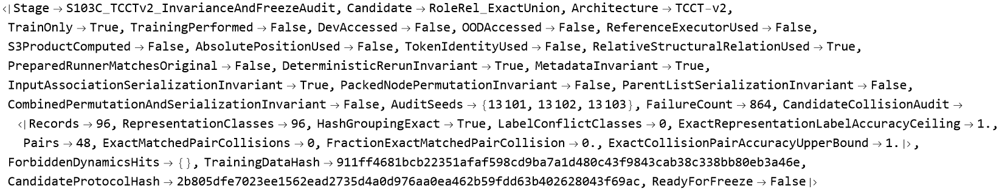

In [2368]:
(* ============================================================ *)
(* S103C                                                        *)
(* TCCT-v2 RoleRel_ExactUnion Invariance / Freeze Audit         *)
(*                                                              *)
(* TRAIN ONLY                                                   *)
(* NO classifier training                                       *)
(* NO DEV / OOD                                                 *)
(* NO architecture modification                                 *)
(*                                                              *)
(* Tests:                                                       *)
(* 1. prepared runner reproduces original S103B                 *)
(* 2. deterministic rerun                                       *)
(* 3. metadata invariance                                       *)
(* 4. input Association serialization invariance                *)
(* 5. arbitrary packed-node index permutation invariance        *)
(* 6. parent-list serialization invariance                      *)
(* 7. combined node permutation + parent shuffle                *)
(* ============================================================ *)

ClearAll[
  S103CPrepare,
  S103CRunPrepared,
  S103CPermutePrepared,
  S103CShuffleParents,
  S103CCombinedTransform,
  S103CReverseAssociation,
  S103CTestRecord,
  S103CFailureRows
];


(* ============================================================ *)
(* 0. PREFLIGHT                                                 *)
(* ============================================================ *)

If[
  !And[
    ValueQ[trainRecords],
    ValueQ[collisionByVariantS103B],
    ValueQ[s103BForbiddenHits],
    Length[DownValues[S103BNodeInfo]] > 0,
    Length[DownValues[S103BNodeDescriptor]] > 0,
    Length[DownValues[S103BMessageDescriptor]] > 0,
    Length[DownValues[S103BAggregateMessages]] > 0,
    Length[DownValues[S103BStateID]] > 0,
    Length[DownValues[S103BRun]] > 0
  ],

  Print["STOP: S103B definitions/results are missing."];
  Abort[];
];


candidateS103C =
  "RoleRel_ExactUnion";


auditSeedsS103C =
  {
    13101,
    13102,
    13103
  };


Print[
  "S103C candidate = ",
  candidateS103C
];

Print[
  "TRAIN ONLY invariance audit."
];

Print[
  "DEV and OOD will NOT be accessed."
];


(* ============================================================ *)
(* 1. PREPARE THE EXACT PACKED COMPUTATION                      *)
(*                                                              *)
(* Store node descriptors in PACK INDEX order.                  *)
(* This lets us arbitrarily rename/permutate packed indices     *)
(* without changing graph semantics.                            *)
(* ============================================================ *)

S103CPrepare[
  r_Association
] := Module[
  {
    builtInfo,
    ctx,
    info,
    p,
    pa,
    q,
    n,
    vertices,
    infoList
  },


  builtInfo =
    S103BNodeInfo[
      r
    ];

  ctx =
    builtInfo[
      "Context"
    ];

  info =
    builtInfo[
      "Info"
    ];

  p =
    ctx[
      "Pack"
    ];

  pa =
    p[[1]];

  q =
    p[[4]];

  n =
    p[[7]];

  vertices =
    p[[12]];


  infoList =
    Table[
      info[
        vertices[[j]]
      ],
      {
        j,
        n
      }
    ];


  <|

    "ParentLists" ->
      pa,

    "QueryIndex" ->
      q,

    "NodeCount" ->
      n,

    "InfoList" ->
      infoList

  |>
];


(* ============================================================ *)
(* 2. CORE RUNNER ON PREPARED DATA                              *)
(*                                                              *)
(* Mathematically the same S103B transition, but independent    *)
(* of original node numbering/storage.                          *)
(* ============================================================ *)

S103CRunPrepared[
  prep_Association,
  variant_String
] := Module[
  {
    pa,
    q,
    n,
    infoList,

    active,
    state,

    nextActive,
    nextState,

    activeParents,

    srcInfo,
    dstInfo,

    messages,
    aggregate,
    newState,

    trajectory = {},
    roundState,

    safetyCap,

    j,
    u,
    k
  },


  pa =
    prep[
      "ParentLists"
    ];

  q =
    prep[
      "QueryIndex"
    ];

  n =
    prep[
      "NodeCount"
    ];

  infoList =
    prep[
      "InfoList"
    ];


  safetyCap =
    Max[
      64,
      2 n + 8
    ];


  active =
    ConstantArray[
      False,
      n
    ];

  state =
    ConstantArray[
      None,
      n
    ];


  active[[q]] =
    True;


  state[[q]] =
    Hash[
      {
        "InitialQuery",

        S103BNodeDescriptor[
          infoList[[q]],
          variant
        ]
      },

      "SHA256",
      "HexString"
    ];


  For[
    k = 1,
    k <= safetyCap,
    k++,


    nextActive =
      ConstantArray[
        False,
        n
      ];

    nextState =
      ConstantArray[
        None,
        n
      ];


    Do[

      activeParents =
        Select[
          pa[[j]],

          Function[
            u,

            IntegerQ[u] &&
            u > 0 &&
            TrueQ[
              active[[u]]
            ]
          ]
        ];


      If[
        activeParents =!= {},


        dstInfo =
          infoList[[j]];


        messages =
          Table[

            srcInfo =
              infoList[[u]];


            S103BMessageDescriptor[
              srcInfo,
              dstInfo,
              state[[u]],
              variant
            ],

            {
              u,
              activeParents
            }
          ];


        aggregate =
          S103BAggregateMessages[
            messages,
            variant
          ];


        newState =
          S103BStateID[

            S103BNodeDescriptor[
              dstInfo,
              variant
            ],

            aggregate
          ];


        nextActive[[j]] =
          True;

        nextState[[j]] =
          newState;

      ],

      {
        j,
        n
      }
    ];


    (* no node index is emitted *)

    roundState =
      Sort[
        Table[

          If[
            TrueQ[
              nextActive[[j]]
            ],

            {
              S103BNodeDescriptor[
                infoList[[j]],
                variant
              ],

              nextState[[j]]
            },

            Nothing
          ],

          {
            j,
            n
          }
        ]
      ];


    AppendTo[
      trajectory,

      {
        "Round",
        k,

        "ActiveStateMultiset",
        roundState
      }
    ];


    If[
      Count[
        nextActive,
        True
      ] == 0,

      Break[];
    ];


    active =
      nextActive;

    state =
      nextState;

  ];


  <|

    "Variant" ->
      variant,

    "RoundsExecuted" ->
      Length[
        trajectory
      ],

    "Trajectory" ->
      trajectory

  |>
];


(* ============================================================ *)
(* 3. PACKED NODE-INDEX PERMUTATION                             *)
(*                                                              *)
(* perm = NEW index -> OLD index.                               *)
(*                                                              *)
(* Every adjacency reference is transformed consistently.       *)
(* This is the direct core-level node-renaming test.             *)
(* ============================================================ *)

S103CPermutePrepared[
  prep_Association,
  seed_Integer
] := Module[
  {
    pa,
    q,
    n,
    infoList,

    perm,
    oldToNew,

    newPa,
    newQ,
    newInfo,

    oldJ,
    parents
  },


  pa =
    prep["ParentLists"];

  q =
    prep["QueryIndex"];

  n =
    prep["NodeCount"];

  infoList =
    prep["InfoList"];


  perm =
    BlockRandom[

      SeedRandom[
        seed
      ];

      RandomSample[
        Range[n]
      ]
    ];


  (* perm[[newIndex]] = oldIndex *)

  oldToNew =
    Ordering[
      perm
    ];


  newInfo =
    infoList[[
      perm
    ]];


  newQ =
    oldToNew[[q]];


  newPa =
    Table[

      oldJ =
        perm[[newJ]];

      parents =
        pa[[oldJ]];


      Map[
        Function[x,

          If[
            IntegerQ[x] &&
            x > 0,

            oldToNew[[x]],

            x
          ]
        ],

        parents
      ],

      {
        newJ,
        n
      }
    ];


  <|

    "ParentLists" ->
      newPa,

    "QueryIndex" ->
      newQ,

    "NodeCount" ->
      n,

    "InfoList" ->
      newInfo

  |>
];


(* ============================================================ *)
(* 4. PARENT-LIST SERIALIZATION SHUFFLE                         *)
(*                                                              *)
(* Same graph. Only order in which parents are stored changes.  *)
(* ============================================================ *)

S103CShuffleParents[
  prep_Association,
  seed_Integer
] := Module[
  {
    newPa
  },


  newPa =
    BlockRandom[

      SeedRandom[
        seed
      ];

      RandomSample /@
        prep[
          "ParentLists"
        ]
    ];


  Join[
    prep,

    <|
      "ParentLists" ->
        newPa
    |>
  ]
];


(* ============================================================ *)
(* 5. COMBINED ADVERSARIAL STORAGE TRANSFORM                    *)
(* ============================================================ *)

S103CCombinedTransform[
  prep_Association,
  seed_Integer
] :=
  S103CShuffleParents[

    S103CPermutePrepared[
      prep,
      seed
    ],

    seed + 100000
  ];


(* ============================================================ *)
(* 6. INPUT ASSOCIATION SERIALIZATION                           *)
(*                                                              *)
(* Same record, reversed Association-key storage order.         *)
(* ============================================================ *)

S103CReverseAssociation[
  r_Association
] :=
  Association[
    Reverse[
      Normal[
        r
      ]
    ]
  ];


(* ============================================================ *)
(* 7. BASE REPRESENTATIONS                                      *)
(* ============================================================ *)

Print[
  "Preparing baseline candidate representations..."
];


preparedTrainS103C =
  S103CPrepare /@
    trainRecords;


baseRepS103C =
  S103BRun[
    #,
    candidateS103C
  ] & /@
    trainRecords;


preparedBaseRepS103C =
  S103CRunPrepared[
    #,
    candidateS103C
  ] & /@
    preparedTrainS103C;


preparedRunnerMatchesOriginalS103C =
  And @@
    MapThread[
      SameQ,
      {
        baseRepS103C,
        preparedBaseRepS103C
      }
    ];


Print[
  "Prepared runner matches original S103B = ",
  preparedRunnerMatchesOriginalS103C
];


If[
  !TrueQ[
    preparedRunnerMatchesOriginalS103C
  ],

  Print[
    "STOP: audit runner does not reproduce original S103B."
  ];

  Abort[];
];


(* ============================================================ *)
(* 8. DETERMINISM                                               *)
(* ============================================================ *)

Print[
  "Checking deterministic reruns..."
];


determinismPerRecordS103C =
  Table[

    SameQ[
      baseRepS103C[[i]],

      S103BRun[
        trainRecords[[i]],
        candidateS103C
      ],

      S103BRun[
        trainRecords[[i]],
        candidateS103C
      ]
    ],

    {
      i,
      Length[
        trainRecords
      ]
    }
  ];


determinismPassedS103C =
  And @@
    determinismPerRecordS103C;


(* ============================================================ *)
(* 9. METADATA INVARIANCE                                       *)
(* ============================================================ *)

Print[
  "Checking metadata invariance..."
];


metadataInvariantPerRecordS103C =
  Table[

    Module[
      {
        altered
      },


      altered =
        Join[
          trainRecords[[i]],

          <|

            "Y" ->
              1 -
              trainRecords[[i]]["Y"],

            "PairID" ->
              "S103C_METADATA_AUDIT",

            "Depth" ->
              999999

          |>
        ];


      SameQ[
        baseRepS103C[[i]],

        S103BRun[
          altered,
          candidateS103C
        ]
      ]

    ],

    {
      i,
      Length[
        trainRecords
      ]
    }
  ];


metadataInvariantPassedS103C =
  And @@
    metadataInvariantPerRecordS103C;


(* ============================================================ *)
(* 10. ASSOCIATION SERIALIZATION INVARIANCE                     *)
(* ============================================================ *)

Print[
  "Checking input Association serialization..."
];


associationSerializationPerRecordS103C =
  Table[

    SameQ[
      baseRepS103C[[i]],

      S103BRun[

        S103CReverseAssociation[
          trainRecords[[i]]
        ],

        candidateS103C
      ]
    ],

    {
      i,
      Length[
        trainRecords
      ]
    }
  ];


associationSerializationPassedS103C =
  And @@
    associationSerializationPerRecordS103C;


(* ============================================================ *)
(* 11. PACKED NODE-INDEX / RENAMING INVARIANCE                  *)
(* ============================================================ *)

Print[
  "Checking packed-node permutation invariance..."
];


nodePermutationAuditS103C =
  Flatten[
    Table[

      <|

        "Record" ->
          i,

        "PairID" ->
          trainRecords[[i]][
            "PairID"
          ],

        "Seed" ->
          seed,

        "Invariant" ->
          SameQ[

            baseRepS103C[[i]],

            S103CRunPrepared[

              S103CPermutePrepared[
                preparedTrainS103C[[i]],
                seed
              ],

              candidateS103C
            ]
          ]

      |>,

      {
        i,
        Length[
          trainRecords
        ]
      },

      {
        seed,
        auditSeedsS103C
      }
    ],

    1
  ];


nodePermutationPassedS103C =
  And @@
    Lookup[
      nodePermutationAuditS103C,
      "Invariant"
    ];


(* ============================================================ *)
(* 12. PARENT SERIALIZATION INVARIANCE                          *)
(* ============================================================ *)

Print[
  "Checking parent-list serialization invariance..."
];


parentShuffleAuditS103C =
  Flatten[
    Table[

      <|

        "Record" ->
          i,

        "PairID" ->
          trainRecords[[i]][
            "PairID"
          ],

        "Seed" ->
          seed,

        "Invariant" ->
          SameQ[

            baseRepS103C[[i]],

            S103CRunPrepared[

              S103CShuffleParents[
                preparedTrainS103C[[i]],
                seed
              ],

              candidateS103C
            ]
          ]

      |>,

      {
        i,
        Length[
          trainRecords
        ]
      },

      {
        seed,
        auditSeedsS103C
      }
    ],

    1
  ];


parentShufflePassedS103C =
  And @@
    Lookup[
      parentShuffleAuditS103C,
      "Invariant"
    ];


(* ============================================================ *)
(* 13. COMBINED RENAMING + SERIALIZATION TEST                   *)
(* ============================================================ *)

Print[
  "Checking combined node-renaming + parent-order invariance..."
];


combinedAuditS103C =
  Flatten[
    Table[

      <|

        "Record" ->
          i,

        "PairID" ->
          trainRecords[[i]][
            "PairID"
          ],

        "Seed" ->
          seed,

        "Invariant" ->
          SameQ[

            baseRepS103C[[i]],

            S103CRunPrepared[

              S103CCombinedTransform[
                preparedTrainS103C[[i]],
                seed
              ],

              candidateS103C
            ]
          ]

      |>,

      {
        i,
        Length[
          trainRecords
        ]
      },

      {
        seed,
        auditSeedsS103C
      }
    ],

    1
  ];


combinedPassedS103C =
  And @@
    Lookup[
      combinedAuditS103C,
      "Invariant"
    ];


(* ============================================================ *)
(* 14. FAILURE TABLE                                            *)
(* ============================================================ *)

S103CFailureRows[] :=
  Join[

    Select[
      nodePermutationAuditS103C,
      !TrueQ[
        #["Invariant"]
      ] &
    ],

    Select[
      parentShuffleAuditS103C,
      !TrueQ[
        #["Invariant"]
      ] &
    ],

    Select[
      combinedAuditS103C,
      !TrueQ[
        #["Invariant"]
      ] &
    ]

  ];


failureRowsS103C =
  S103CFailureRows[];


(* ============================================================ *)
(* 15. CANDIDATE COLLISION STATUS                               *)
(* ============================================================ *)

candidateCollisionAuditS103C =
  collisionByVariantS103B[
    candidateS103C
  ];


candidateCollisionPassedS103C =
  candidateCollisionAuditS103C[
    "ExactMatchedPairCollisions"
  ] == 0;


(* ============================================================ *)
(* 16. PROTOCOL / SOURCE FREEZE HASH                            *)
(* ============================================================ *)

candidateProtocolHashS103C =
  Hash[
    {
      candidateS103C,

      DownValues[
        S103BNodeInfo
      ],

      DownValues[
        S103BNodeDescriptor
      ],

      DownValues[
        S103BRelation
      ],

      DownValues[
        S103BMessageDescriptor
      ],

      DownValues[
        S103BAggregateMessages
      ],

      DownValues[
        S103BStateID
      ],

      DownValues[
        S103BRun
      ]
    },

    "SHA256",
    "HexString"
  ];


trainHashS103C =
  Hash[
    trainRecords,
    "SHA256",
    "HexString"
  ];


(* ============================================================ *)
(* 17. READY-TO-FREEZE GATE                                     *)
(* ============================================================ *)

readyForFreezeS103C =
  And[

    TrueQ[
      preparedRunnerMatchesOriginalS103C
    ],

    TrueQ[
      determinismPassedS103C
    ],

    TrueQ[
      metadataInvariantPassedS103C
    ],

    TrueQ[
      associationSerializationPassedS103C
    ],

    TrueQ[
      nodePermutationPassedS103C
    ],

    TrueQ[
      parentShufflePassedS103C
    ],

    TrueQ[
      combinedPassedS103C
    ],

    TrueQ[
      candidateCollisionPassedS103C
    ],

    s103BForbiddenHits === {}

  ];


(* ============================================================ *)
(* 18. FINAL AUDIT REPORT                                       *)
(* ============================================================ *)

finalS103C =
  <|

    "Stage" ->
      "S103C_TCCTv2_InvarianceAndFreezeAudit",

    "Candidate" ->
      candidateS103C,

    "Architecture" ->
      "TCCT-v2",

    "TrainOnly" ->
      True,

    "TrainingPerformed" ->
      False,

    "DevAccessed" ->
      False,

    "OODAccessed" ->
      False,

    "ReferenceExecutorUsed" ->
      False,

    "S3ProductComputed" ->
      False,

    "AbsolutePositionUsed" ->
      False,

    "TokenIdentityUsed" ->
      False,

    "RelativeStructuralRelationUsed" ->
      True,

    "PreparedRunnerMatchesOriginal" ->
      preparedRunnerMatchesOriginalS103C,

    "DeterministicRerunInvariant" ->
      determinismPassedS103C,

    "MetadataInvariant" ->
      metadataInvariantPassedS103C,

    "InputAssociationSerializationInvariant" ->
      associationSerializationPassedS103C,

    "PackedNodePermutationInvariant" ->
      nodePermutationPassedS103C,

    "ParentListSerializationInvariant" ->
      parentShufflePassedS103C,

    "CombinedPermutationAndSerializationInvariant" ->
      combinedPassedS103C,

    "AuditSeeds" ->
      auditSeedsS103C,

    "FailureCount" ->
      Length[
        failureRowsS103C
      ],

    "CandidateCollisionAudit" ->
      candidateCollisionAuditS103C,

    "ForbiddenDynamicsHits" ->
      s103BForbiddenHits,

    "TrainingDataHash" ->
      trainHashS103C,

    "CandidateProtocolHash" ->
      candidateProtocolHashS103C,

    "ReadyForFreeze" ->
      readyForFreezeS103C

  |>;


finalS103C

In [2510]:
(* ============================================================ *)
(* S103C PATCH                                                  *)
(* Fix prepared-runner schema mismatch                          *)
(* ============================================================ *)

ClearAll[S103CRunPrepared];


S103CRunPrepared[
  prep_Association,
  variant_String
] := Module[
  {
    pa,
    q,
    n,
    infoList,

    active,
    state,

    nextActive,
    nextState,

    activeParents,

    srcInfo,
    dstInfo,

    messages,
    aggregate,
    newState,

    trajectory = {},
    roundState,

    safetyCap,

    terminatedNaturally = False,

    j,
    u,
    k
  },


  pa =
    prep["ParentLists"];

  q =
    prep["QueryIndex"];

  n =
    prep["NodeCount"];

  infoList =
    prep["InfoList"];


  safetyCap =
    Max[
      64,
      2 n + 8
    ];


  active =
    ConstantArray[
      False,
      n
    ];

  state =
    ConstantArray[
      None,
      n
    ];


  active[[q]] =
    True;


  state[[q]] =
    Hash[
      {
        "InitialQuery",

        S103BNodeDescriptor[
          infoList[[q]],
          variant
        ]
      },

      "SHA256",
      "HexString"
    ];


  For[
    k = 1,
    k <= safetyCap,
    k++,


    nextActive =
      ConstantArray[
        False,
        n
      ];

    nextState =
      ConstantArray[
        None,
        n
      ];


    Do[

      activeParents =
        Select[
          pa[[j]],

          Function[
            u,

            IntegerQ[u] &&
            u > 0 &&
            TrueQ[
              active[[u]]
            ]
          ]
        ];


      If[
        activeParents =!= {},


        dstInfo =
          infoList[[j]];


        messages =
          Table[

            srcInfo =
              infoList[[u]];


            S103BMessageDescriptor[
              srcInfo,
              dstInfo,
              state[[u]],
              variant
            ],

            {
              u,
              activeParents
            }
          ];


        aggregate =
          S103BAggregateMessages[
            messages,
            variant
          ];


        newState =
          S103BStateID[
            S103BNodeDescriptor[
              dstInfo,
              variant
            ],
            aggregate
          ];


        nextActive[[j]] =
          True;

        nextState[[j]] =
          newState;

      ],

      {
        j,
        n
      }
    ];


    roundState =
      Sort[
        Table[

          If[
            TrueQ[
              nextActive[[j]]
            ],

            {
              S103BNodeDescriptor[
                infoList[[j]],
                variant
              ],
              nextState[[j]]
            },

            Nothing
          ],

          {
            j,
            n
          }
        ]
      ];


    AppendTo[
      trajectory,

      {
        "Round",
        k,

        "ActiveStateMultiset",
        roundState
      }
    ];


    If[
      Count[
        nextActive,
        True
      ] == 0,

      terminatedNaturally =
        True;

      Break[];
    ];


    active =
      nextActive;

    state =
      nextState;

  ];


  <|

    "Variant" ->
      variant,

    "RoundsExecuted" ->
      Length[
        trajectory
      ],

    "TerminatedNaturally" ->
      terminatedNaturally,

    "Trajectory" ->
      trajectory

  |>
];

In [2520]:
preparedTrainS103C =
  S103CPrepare /@
    trainRecords;


baseRepS103C =
  S103BRun[
    #,
    candidateS103C
  ] & /@
    trainRecords;


preparedBaseRepS103C =
  S103CRunPrepared[
    #,
    candidateS103C
  ] & /@
    preparedTrainS103C;


preparedRunnerMatchesOriginalS103C =
  And @@
    MapThread[
      SameQ,
      {
        baseRepS103C,
        preparedBaseRepS103C
      }
    ];


preparedRunnerMatchesOriginalS103C

True

S103C continuation started.
Prepared runner match = True
TRAIN ONLY. DEV/OOD will NOT be accessed.
1/6 Checking deterministic reruns...
Deterministic rerun invariant = True
2/6 Checking metadata invariance...
Metadata invariant = True
3/6 Checking input Association serialization...
Association serialization invariant = True
4/6 Checking packed-node permutation invariance...
Packed-node permutation invariant = True
5/6 Checking parent-list serialization invariance...
Parent-list serialization invariant = True
6/6 Checking combined permutation + serialization...
Combined invariant = True
Total invariance failures = 0
Candidate pair collisions = 0 / 48


<|Stage -> S103C_TCCTv2_InvarianceAndFreezeAudit_FIXED, Candidate -> RoleRel_ExactUnion, 
 
>   Architecture -> TCCT-v2, TrainOnly -> True, TrainingPerformed -> False, 
 
>   DevAccessed -> False, OODAccessed -> False, ReferenceExecutorUsed -> False, 
 
>   S3ProductComputed -> False, AbsolutePositionUsed -> False, 
 
>   TokenIdentityUsed -> False, RelativeStructuralRelationUsed -> True, 
 
>   PreparedRunnerMatchesOriginal -> True, DeterministicRerunInvariant -> True, 
 
>   MetadataInvariant -> True, InputAssociationSerializationInvariant -> True, 
 
>   PackedNodePermutationInvariant -> True, ParentListSerializationInvariant -> True, 
 
>   CombinedPermutationAndSerializationInvariant -> True, 
 
>   AuditSeeds -> {13101, 13102, 13103}, FailureCount -> 0, 
 
>   CandidateCollisionAudit -> 
 
>    <|Records -> 96, RepresentationClasses -> 96, HashGroupingExact -> True, 
 
>     LabelConflictClasses -> 0, ExactRepresentationLabelAccuracyCeiling -> 1., 
 
>     Pairs -> 48, ExactMatchedPairCollisions -> 0, 
 
>     FractionExactMatchedPairCollision -> 0., 
 
>     ExactCollisionPairAccuracyUpperBound -> 1.|>, ForbiddenDynamicsHits -> {}, 
 
>   TrainingDataHash -> 
 
>    911ff4681bcb22351afaf598cd9ba7a1d480c43f9843cab38c338bb80eb3a46e, 
 
>   CandidateProtocolHash -> 
 
>    2b805dfe7023ee1562ead2735d4a0d976aa0ea462b59fdd63b402628043f69ac, 
 
>   ReadyForFreeze -> True|>
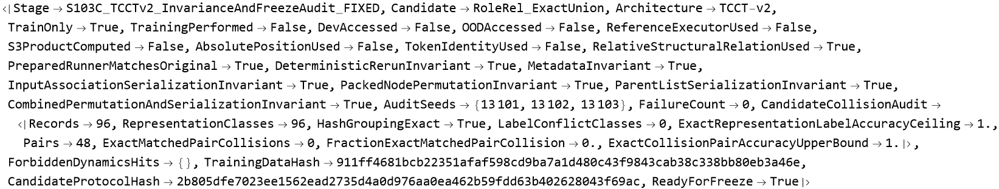

In [2529]:
(* ============================================================ *)
(* S103C CONTINUE AFTER PATCH                                   *)
(* Run ONLY after:                                              *)
(* preparedRunnerMatchesOriginalS103C === True                  *)
(* ============================================================ *)

If[
  !TrueQ[preparedRunnerMatchesOriginalS103C],

  Print[
    "STOP: prepared runner still does not match original S103B."
  ];

  Abort[];
];


Print["S103C continuation started."];
Print["Prepared runner match = True"];
Print["TRAIN ONLY. DEV/OOD will NOT be accessed."];


(* ============================================================ *)
(* 8. DETERMINISM                                               *)
(* ============================================================ *)

Print[
  "1/6 Checking deterministic reruns..."
];


determinismPerRecordS103C =
  Table[

    SameQ[
      baseRepS103C[[i]],

      S103BRun[
        trainRecords[[i]],
        candidateS103C
      ],

      S103BRun[
        trainRecords[[i]],
        candidateS103C
      ]
    ],

    {
      i,
      Length[trainRecords]
    }
  ];


determinismPassedS103C =
  And @@
    determinismPerRecordS103C;


Print[
  "Deterministic rerun invariant = ",
  determinismPassedS103C
];


(* ============================================================ *)
(* 9. METADATA INVARIANCE                                       *)
(* ============================================================ *)

Print[
  "2/6 Checking metadata invariance..."
];


metadataInvariantPerRecordS103C =
  Table[

    Module[
      {
        altered
      },


      altered =
        Join[
          trainRecords[[i]],

          <|

            "Y" ->
              1 - trainRecords[[i]]["Y"],

            "PairID" ->
              "S103C_METADATA_AUDIT",

            "Depth" ->
              999999

          |>
        ];


      SameQ[
        baseRepS103C[[i]],

        S103BRun[
          altered,
          candidateS103C
        ]
      ]

    ],

    {
      i,
      Length[trainRecords]
    }
  ];


metadataInvariantPassedS103C =
  And @@
    metadataInvariantPerRecordS103C;


Print[
  "Metadata invariant = ",
  metadataInvariantPassedS103C
];


(* ============================================================ *)
(* 10. ASSOCIATION SERIALIZATION INVARIANCE                     *)
(* ============================================================ *)

Print[
  "3/6 Checking input Association serialization..."
];


associationSerializationPerRecordS103C =
  Table[

    SameQ[
      baseRepS103C[[i]],

      S103BRun[

        S103CReverseAssociation[
          trainRecords[[i]]
        ],

        candidateS103C
      ]
    ],

    {
      i,
      Length[trainRecords]
    }
  ];


associationSerializationPassedS103C =
  And @@
    associationSerializationPerRecordS103C;


Print[
  "Association serialization invariant = ",
  associationSerializationPassedS103C
];


(* ============================================================ *)
(* 11. PACKED NODE PERMUTATION                                  *)
(* ============================================================ *)

Print[
  "4/6 Checking packed-node permutation invariance..."
];


nodePermutationAuditS103C =
  Flatten[

    Table[

      <|

        "Audit" ->
          "NodePermutation",

        "Record" ->
          i,

        "PairID" ->
          trainRecords[[i]]["PairID"],

        "Seed" ->
          seed,

        "Invariant" ->
          SameQ[

            baseRepS103C[[i]],

            S103CRunPrepared[

              S103CPermutePrepared[
                preparedTrainS103C[[i]],
                seed
              ],

              candidateS103C
            ]
          ]

      |>,

      {
        i,
        Length[trainRecords]
      },

      {
        seed,
        auditSeedsS103C
      }
    ],

    1
  ];


nodePermutationPassedS103C =
  And @@
    Lookup[
      nodePermutationAuditS103C,
      "Invariant"
    ];


Print[
  "Packed-node permutation invariant = ",
  nodePermutationPassedS103C
];


(* ============================================================ *)
(* 12. PARENT-LIST SERIALIZATION                                *)
(* ============================================================ *)

Print[
  "5/6 Checking parent-list serialization invariance..."
];


parentShuffleAuditS103C =
  Flatten[

    Table[

      <|

        "Audit" ->
          "ParentListShuffle",

        "Record" ->
          i,

        "PairID" ->
          trainRecords[[i]]["PairID"],

        "Seed" ->
          seed,

        "Invariant" ->
          SameQ[

            baseRepS103C[[i]],

            S103CRunPrepared[

              S103CShuffleParents[
                preparedTrainS103C[[i]],
                seed
              ],

              candidateS103C
            ]
          ]

      |>,

      {
        i,
        Length[trainRecords]
      },

      {
        seed,
        auditSeedsS103C
      }
    ],

    1
  ];


parentShufflePassedS103C =
  And @@
    Lookup[
      parentShuffleAuditS103C,
      "Invariant"
    ];


Print[
  "Parent-list serialization invariant = ",
  parentShufflePassedS103C
];


(* ============================================================ *)
(* 13. COMBINED PERMUTATION + STORAGE ORDER                     *)
(* ============================================================ *)

Print[
  "6/6 Checking combined permutation + serialization..."
];


combinedAuditS103C =
  Flatten[

    Table[

      <|

        "Audit" ->
          "Combined",

        "Record" ->
          i,

        "PairID" ->
          trainRecords[[i]]["PairID"],

        "Seed" ->
          seed,

        "Invariant" ->
          SameQ[

            baseRepS103C[[i]],

            S103CRunPrepared[

              S103CCombinedTransform[
                preparedTrainS103C[[i]],
                seed
              ],

              candidateS103C
            ]
          ]

      |>,

      {
        i,
        Length[trainRecords]
      },

      {
        seed,
        auditSeedsS103C
      }
    ],

    1
  ];


combinedPassedS103C =
  And @@
    Lookup[
      combinedAuditS103C,
      "Invariant"
    ];


Print[
  "Combined invariant = ",
  combinedPassedS103C
];


(* ============================================================ *)
(* 14. FAILURE TABLE                                            *)
(* ============================================================ *)

failureRowsS103C =
  Join[

    Select[
      nodePermutationAuditS103C,
      !TrueQ[#["Invariant"]] &
    ],

    Select[
      parentShuffleAuditS103C,
      !TrueQ[#["Invariant"]] &
    ],

    Select[
      combinedAuditS103C,
      !TrueQ[#["Invariant"]] &
    ]
  ];


Print[
  "Total invariance failures = ",
  Length[failureRowsS103C]
];


(* ============================================================ *)
(* 15. COLLISION STATUS                                         *)
(* ============================================================ *)

candidateCollisionAuditS103C =
  collisionByVariantS103B[
    candidateS103C
  ];


candidateCollisionPassedS103C =
  TrueQ[
    candidateCollisionAuditS103C[
      "ExactMatchedPairCollisions"
    ] == 0
  ];


Print[
  "Candidate pair collisions = ",
  candidateCollisionAuditS103C[
    "ExactMatchedPairCollisions"
  ],
  " / ",
  candidateCollisionAuditS103C[
    "Pairs"
  ]
];


(* ============================================================ *)
(* 16. PROTOCOL HASH                                            *)
(* ============================================================ *)

candidateProtocolHashS103C =
  Hash[
    {
      candidateS103C,

      DownValues[S103BNodeInfo],

      DownValues[S103BNodeDescriptor],

      DownValues[S103BRelation],

      DownValues[S103BMessageDescriptor],

      DownValues[S103BAggregateMessages],

      DownValues[S103BStateID],

      DownValues[S103BRun]
    },

    "SHA256",
    "HexString"
  ];


trainHashS103C =
  Hash[
    trainRecords,
    "SHA256",
    "HexString"
  ];


(* ============================================================ *)
(* 17. READY-FOR-FREEZE GATE                                    *)
(* ============================================================ *)

readyForFreezeS103C =
  And[

    TrueQ[
      preparedRunnerMatchesOriginalS103C
    ],

    TrueQ[
      determinismPassedS103C
    ],

    TrueQ[
      metadataInvariantPassedS103C
    ],

    TrueQ[
      associationSerializationPassedS103C
    ],

    TrueQ[
      nodePermutationPassedS103C
    ],

    TrueQ[
      parentShufflePassedS103C
    ],

    TrueQ[
      combinedPassedS103C
    ],

    TrueQ[
      candidateCollisionPassedS103C
    ],

    SameQ[
      s103BForbiddenHits,
      {}
    ]
  ];


(* ============================================================ *)
(* 18. FINAL REPORT                                             *)
(* ============================================================ *)

finalS103C =
  <|

    "Stage" ->
      "S103C_TCCTv2_InvarianceAndFreezeAudit_FIXED",

    "Candidate" ->
      candidateS103C,

    "Architecture" ->
      "TCCT-v2",

    "TrainOnly" ->
      True,

    "TrainingPerformed" ->
      False,

    "DevAccessed" ->
      False,

    "OODAccessed" ->
      False,

    "ReferenceExecutorUsed" ->
      False,

    "S3ProductComputed" ->
      False,

    "AbsolutePositionUsed" ->
      False,

    "TokenIdentityUsed" ->
      False,

    "RelativeStructuralRelationUsed" ->
      True,

    "PreparedRunnerMatchesOriginal" ->
      preparedRunnerMatchesOriginalS103C,

    "DeterministicRerunInvariant" ->
      determinismPassedS103C,

    "MetadataInvariant" ->
      metadataInvariantPassedS103C,

    "InputAssociationSerializationInvariant" ->
      associationSerializationPassedS103C,

    "PackedNodePermutationInvariant" ->
      nodePermutationPassedS103C,

    "ParentListSerializationInvariant" ->
      parentShufflePassedS103C,

    "CombinedPermutationAndSerializationInvariant" ->
      combinedPassedS103C,

    "AuditSeeds" ->
      auditSeedsS103C,

    "FailureCount" ->
      Length[
        failureRowsS103C
      ],

    "CandidateCollisionAudit" ->
      candidateCollisionAuditS103C,

    "ForbiddenDynamicsHits" ->
      s103BForbiddenHits,

    "TrainingDataHash" ->
      trainHashS103C,

    "CandidateProtocolHash" ->
      candidateProtocolHashS103C,

    "ReadyForFreeze" ->
      readyForFreezeS103C

  |>;


finalS103C

In [2609]:
Dataset[
  failureRowsS103C
]

Dataset[{}, TypeSystem`Vector[TypeSystem`UnknownType, TypeSystem`AnyLength], <||>]

<|Status -> FROZEN_FOR_BASELINE_DEVELOPMENT, Architecture -> TCCT-v2, 
 
>   Candidate -> RoleRel_ExactUnion, 
 
>   CandidateProtocolHash -> 
 
>    2b805dfe7023ee1562ead2735d4a0d976aa0ea462b59fdd63b402628043f69ac, 
 
>   TrainingDataHash -> 
 
>    911ff4681bcb22351afaf598cd9ba7a1d480c43f9843cab38c338bb80eb3a46e, 
 
>   TrainPairCollisions -> 0, TrainPairCollisionFraction -> 0., 
 
>   RepresentationClasses -> 96, LabelCeiling -> 1., Deterministic -> True, 
 
>   MetadataInvariant -> True, AssociationSerializationInvariant -> True, 
 
>   NodePermutationInvariant -> True, ParentSerializationInvariant -> True, 
 
>   CombinedInvariant -> True, FailureCount -> 0|>
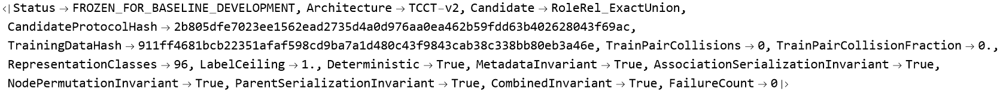

In [2614]:
freezeCertificateS103C =
  If[

    TrueQ[
      readyForFreezeS103C
    ],

    <|

      "Status" ->
        "FROZEN_FOR_BASELINE_DEVELOPMENT",

      "Architecture" ->
        "TCCT-v2",

      "Candidate" ->
        candidateS103C,

      "CandidateProtocolHash" ->
        candidateProtocolHashS103C,

      "TrainingDataHash" ->
        trainHashS103C,

      "TrainPairCollisions" ->
        candidateCollisionAuditS103C[
          "ExactMatchedPairCollisions"
        ],

      "TrainPairCollisionFraction" ->
        candidateCollisionAuditS103C[
          "FractionExactMatchedPairCollision"
        ],

      "RepresentationClasses" ->
        candidateCollisionAuditS103C[
          "RepresentationClasses"
        ],

      "LabelCeiling" ->
        candidateCollisionAuditS103C[
          "ExactRepresentationLabelAccuracyCeiling"
        ],

      "Deterministic" ->
        determinismPassedS103C,

      "MetadataInvariant" ->
        metadataInvariantPassedS103C,

      "AssociationSerializationInvariant" ->
        associationSerializationPassedS103C,

      "NodePermutationInvariant" ->
        nodePermutationPassedS103C,

      "ParentSerializationInvariant" ->
        parentShufflePassedS103C,

      "CombinedInvariant" ->
        combinedPassedS103C,

      "FailureCount" ->
        Length[
          failureRowsS103C
        ]

    |>,

    <|

      "Status" ->
        "DO_NOT_FREEZE",

      "Reason" ->
        "One or more S103C integrity gates failed.",

      "FailureCount" ->
        Length[
          failureRowsS103C
        ]

    |>
  ];


freezeCertificateS103C

Table::iterb: Iterator {mode, s104AModes} does not have appropriate bounds.

Table::iterb: Iterator {seed, s104ASeeds} does not have appropriate bounds.

Table::iterb: Iterator {seed, s104ASeeds} does not have appropriate bounds.

General::stop: Further output of Table::iterb will be suppressed during this calculation.

<|Stage -> S104A_FrozenTCCTv2_SameHeadBaselineDevelopment, DevelopmentOnly -> True, 
 
>   ProspectiveBlindClaimAllowed -> False, ArchitectureSuperiorityClaimAllowed -> False, 
 
>   OODAccessed -> False, ReferenceExecutorUsed -> False, S3ProductComputed -> False, 
 
>   TCCTv2CoreChanged -> False, FrozenTCCTv2Candidate -> candidateS104A, 
 
>   FrozenCoreHash -> frozenCoreHashS104A, TCCTv2AntiAliasingAuditPassed -> True, 
 
>   TaskHead -> Identical_GRU64, InputDimension -> s104AInputDim, 
 
>   TCCTv2NumericProjection -> DeterministicSignedFeatureHash57PlusCount, 
 
>   FeatureHashProbes -> s104AHashProbes, TrainingRounds -> s104ATrainingRounds, 
 
>   TrainingSeeds -> s104ASeeds, ForbiddenRepresentationHits -> s104AForbiddenHits, 
 
>   MetadataInvariance -> metadataInvariantS104A, DimensionAudit -> dimensionAuditS104A, 
 
>   RepresentationCollisionAudit -> collisionAuditS104A, 
 
>   MatchedInitializationAcrossModes -> 
 
>    Association[Table[seed -> 
 
>       Module[{hashes}, hashes = 
 
>          Lookup[Select[rowsS104A, #1[Seed] === seed & ], InitHash]; SameQ @@ hashes], 
 
>      {seed, s104ASeeds}]], Results -> 
 
>    Association[Table[mode -> S104ASummarize[mode], {mode, s104AModes}]], 
 
>   MeanTCCTv2DevPairGainVsRaw -> 
 
>    -1. Association[Table[mode -> S104ASummarize[mode], {mode, s104AModes}]][Raw][
 
>       MeanDevPairAccuracy] + Association[Table[mode -> S104ASummarize[mode], 
 
>         {mode, s104AModes}]][TCCTv2_RoleRelExactUnion][MeanDevPairAccuracy], 
 
>   MeanTCCTv2DevPairGainVsStaticGraph -> 
 
>    -1. Association[Table[mode -> S104ASummarize[mode], {mode, s104AModes}]][
 
>        StaticGraph][MeanDevPairAccuracy] + 
 
>     Association[Table[mode -> S104ASummarize[mode], {mode, s104AModes}]][
 
>       TCCTv2_RoleRelExactUnion][MeanDevPairAccuracy], 
 
>   PairedSeedComparison -> 
 
>    Table[Module[{raw, static, tcct}, 
 
>      raw = SelectFirst[rowsS104A, #1[Mode] === Raw && #1[Seed] === seed & ]; 
 
>       static = SelectFirst[rowsS104A, 
 
>         #1[Mode] === StaticGraph && #1[Seed] === seed & ]; 
 
>       tcct = SelectFirst[rowsS104A, 
 
>         #1[Mode] === TCCTv2_RoleRelExactUnion && #1[Seed] === seed & ]; 
 
>       Association[Seed -> seed, RawDevPair -> raw[DevPairAccuracy], 
 
>        StaticDevPair -> static[DevPairAccuracy], 
 
>        TCCTv2DevPair -> tcct[DevPairAccuracy], 
 
>        TCCTv2MinusRaw -> N[tcct[DevPairAccuracy] - raw[DevPairAccuracy]], 
 
>        TCCTv2MinusStatic -> N[tcct[DevPairAccuracy] - static[DevPairAccuracy]]]], 
 
>     {seed, s104ASeeds}], DevelopmentGate -> 
 
>    <|RequiredTCCTv2TrainPair -> 0.95, RequiredTCCTv2DevPair -> 0.6, 
 
>     RequiredGainOverBestSameHeadControl -> 0.05, 
 
>     BestControlDevPair -> 
 
>      Max[Association[Table[mode -> S104ASummarize[mode], {mode, s104AModes}]][Raw][
 
>        MeanDevPairAccuracy], Association[Table[mode -> S104ASummarize[mode], 
 
>           {mode, s104AModes}]][StaticGraph][MeanDevPairAccuracy]], 
 
>     Passed -> Association[Table[mode -> S104ASummarize[mode], {mode, s104AModes}]][
 
>          TCCTv2_RoleRelExactUnion][MeanTrainPairAccuracy] >= 0.95 && 
 
>       Association[Table[mode -> S104ASummarize[mode], {mode, s104AModes}]][
 
>          TCCTv2_RoleRelExactUnion][MeanDevPairAccuracy] >= 0.6 && 
 
>       Association[Table[mode -> S104ASummarize[mode], {mode, s104AModes}]][
 
>          TCCTv2_RoleRelExactUnion][MeanDevPairAccuracy] >= 
 
>        0.05 + Max[Association[Table[mode -> S104ASummarize[mode], {mode, s104AModes}]][
 
>            Raw][MeanDevPairAccuracy], 
 
>          Association[Table[mode -> S104ASummarize[mode], {mode, s104AModes}]][
 
>            StaticGraph][MeanDevPairAccuracy]]|>, 
 
>   TaskProtocolHash -> 
 
>    7253f274a25b655d82558777c2130d056e84311f902cce99bd271a8fd72added|>
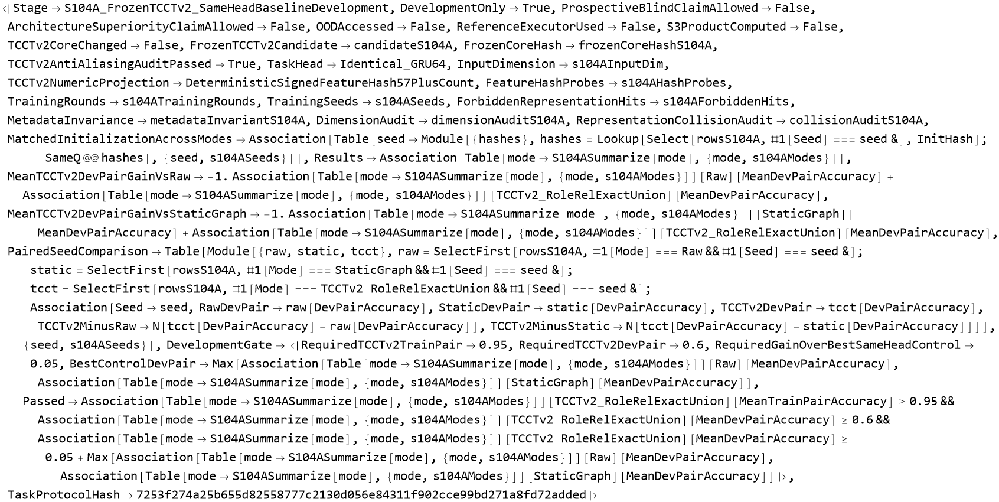

In [2620]:
(* ============================================================ *)
(* 16. MODE SUMMARY                                             *)
(* ============================================================ *)

S104ASummarize[
  mode_String
] := Module[
  {
    rows
  },


  rows =
    Select[
      rowsS104A,
      #["Mode"] === mode &
    ];


  <|

    "Mode" ->
      mode,

    "Runs" ->
      Length[
        rows
      ],

    "MeanTrainBA" ->
      N@
        Mean[
          Lookup[
            rows,
            "TrainBA"
          ]
        ],

    "MinTrainBA" ->
      Min[
        Lookup[
          rows,
          "TrainBA"
        ]
      ],

    "MeanTrainPairAccuracy" ->
      N@
        Mean[
          Lookup[
            rows,
            "TrainPairAccuracy"
          ]
        ],

    "MinTrainPairAccuracy" ->
      Min[
        Lookup[
          rows,
          "TrainPairAccuracy"
        ]
      ],

    "MeanDevBA" ->
      N@
        Mean[
          Lookup[
            rows,
            "DevBA"
          ]
        ],

    "MeanDevPairAccuracy" ->
      N@
        Mean[
          Lookup[
            rows,
            "DevPairAccuracy"
          ]
        ],

    "MinDevPairAccuracy" ->
      Min[
        Lookup[
          rows,
          "DevPairAccuracy"
        ]
      ],

    "MaxDevPairAccuracy" ->
      Max[
        Lookup[
          rows,
          "DevPairAccuracy"
        ]
      ]

  |>
];


summaryS104A =
  Association@Table[

    mode ->
      S104ASummarize[
        mode
      ],

    {
      mode,
      s104AModes
    }
  ];


(* ============================================================ *)
(* 17. MATCHED INITIALIZATION CHECK                             *)
(* ============================================================ *)

matchedInitializationS104A =
  Association@Table[

    seed -> Module[
      {
        hashes
      },


      hashes =
        Lookup[
          Select[
            rowsS104A,
            #["Seed"] === seed &
          ],
          "InitHash"
        ];


      SameQ @@
        hashes

    ],

    {
      seed,
      s104ASeeds
    }
  ];


(* ============================================================ *)
(* 18. PAIRED SEED DELTAS                                       *)
(*                                                              *)
(* Same seed, same GRU initialization.                          *)
(* ============================================================ *)

pairedSeedComparisonS104A =
  Table[

    Module[
      {
        raw,
        static,
        tcct
      },


      raw =
        SelectFirst[
          rowsS104A,
          #["Mode"] === "Raw" &&
          #["Seed"] === seed &
        ];


      static =
        SelectFirst[
          rowsS104A,
          #["Mode"] === "StaticGraph" &&
          #["Seed"] === seed &
        ];


      tcct =
        SelectFirst[
          rowsS104A,
          #["Mode"] === "TCCTv2_RoleRelExactUnion" &&
          #["Seed"] === seed &
        ];


      <|

        "Seed" ->
          seed,

        "RawDevPair" ->
          raw[
            "DevPairAccuracy"
          ],

        "StaticDevPair" ->
          static[
            "DevPairAccuracy"
          ],

        "TCCTv2DevPair" ->
          tcct[
            "DevPairAccuracy"
          ],

        "TCCTv2MinusRaw" ->
          N[
            tcct["DevPairAccuracy"] -
            raw["DevPairAccuracy"]
          ],

        "TCCTv2MinusStatic" ->
          N[
            tcct["DevPairAccuracy"] -
            static["DevPairAccuracy"]
          ]

      |>

    ],

    {
      seed,
      s104ASeeds
    }
  ];


(* ============================================================ *)
(* 19. PREDECLARED DEVELOPMENT GATE                             *)
(*                                                              *)
(* This is NOT a prospective superiority claim.                 *)
(* ============================================================ *)

rawDevPairS104A =
  summaryS104A[
    "Raw"
  ][
    "MeanDevPairAccuracy"
  ];


staticDevPairS104A =
  summaryS104A[
    "StaticGraph"
  ][
    "MeanDevPairAccuracy"
  ];


tcctTrainPairS104A =
  summaryS104A[
    "TCCTv2_RoleRelExactUnion"
  ][
    "MeanTrainPairAccuracy"
  ];


tcctDevPairS104A =
  summaryS104A[
    "TCCTv2_RoleRelExactUnion"
  ][
    "MeanDevPairAccuracy"
  ];


bestControlDevPairS104A =
  Max[
    rawDevPairS104A,
    staticDevPairS104A
  ];


developmentGateS104A =
  And[

    tcctTrainPairS104A >= 0.95,

    tcctDevPairS104A >= 0.60,

    tcctDevPairS104A >=
      bestControlDevPairS104A + 0.05

  ];


(* ============================================================ *)
(* 20. FULL TASK-PROTOCOL HASH                                  *)
(*                                                              *)
(* Core hash is already frozen separately.                      *)
(* This hash covers the NEW numeric readout representation +    *)
(* SAME GRU task-head protocol.                                 *)
(* ============================================================ *)

taskProtocolHashS104A =
  Hash[
    {
      frozenCoreHashS104A,
      candidateS104A,

      s104AInputDim,
      s104AHashDim,
      s104AHashProbes,

      s104ATrainingRounds,
      s104ASeeds,

      DownValues[S104AHashItemVector],
      DownValues[S104ARoundVector],
      DownValues[S104ATCCTv2Sequence],

      s104ABaseHead
    },

    "SHA256",
    "HexString"
  ];


(* ============================================================ *)
(* 21. FINAL REPORT                                             *)
(* ============================================================ *)

finalS104A =
  <|

    "Stage" ->
      "S104A_FrozenTCCTv2_SameHeadBaselineDevelopment",

    "DevelopmentOnly" ->
      True,

    "ProspectiveBlindClaimAllowed" ->
      False,

    "ArchitectureSuperiorityClaimAllowed" ->
      False,

    "OODAccessed" ->
      False,

    "ReferenceExecutorUsed" ->
      False,

    "S3ProductComputed" ->
      False,

    "TCCTv2CoreChanged" ->
      False,

    "FrozenTCCTv2Candidate" ->
      candidateS104A,

    "FrozenCoreHash" ->
      frozenCoreHashS104A,

    "TCCTv2AntiAliasingAuditPassed" ->
      True,

    "TaskHead" ->
      "Identical_GRU64",

    "InputDimension" ->
      s104AInputDim,

    "TCCTv2NumericProjection" ->
      "DeterministicSignedFeatureHash57PlusCount",

    "FeatureHashProbes" ->
      s104AHashProbes,

    "TrainingRounds" ->
      s104ATrainingRounds,

    "TrainingSeeds" ->
      s104ASeeds,

    "ForbiddenRepresentationHits" ->
      s104AForbiddenHits,

    "MetadataInvariance" ->
      metadataInvariantS104A,

    "DimensionAudit" ->
      dimensionAuditS104A,

    "RepresentationCollisionAudit" ->
      collisionAuditS104A,

    "MatchedInitializationAcrossModes" ->
      matchedInitializationS104A,

    "Results" ->
      summaryS104A,

    "MeanTCCTv2DevPairGainVsRaw" ->
      N[
        tcctDevPairS104A -
        rawDevPairS104A
      ],

    "MeanTCCTv2DevPairGainVsStaticGraph" ->
      N[
        tcctDevPairS104A -
        staticDevPairS104A
      ],

    "PairedSeedComparison" ->
      pairedSeedComparisonS104A,

    "DevelopmentGate" ->
      <|

        "RequiredTCCTv2TrainPair" ->
          0.95,

        "RequiredTCCTv2DevPair" ->
          0.60,

        "RequiredGainOverBestSameHeadControl" ->
          0.05,

        "BestControlDevPair" ->
          bestControlDevPairS104A,

        "Passed" ->
          developmentGateS104A

      |>,

    "TaskProtocolHash" ->
      taskProtocolHashS104A

  |>;


finalS104A

S104A recovery patch starting...
Modes restored = {Raw, StaticGraph, TCCTv2_RoleRelExactUnion}
Seeds restored = {9401, 9402, 9403, 9404, 9405}
Frozen candidate = RoleRel_ExactUnion
Frozen core hash = 2b805dfe7023ee1562ead2735d4a0d976aa0ea462b59fdd63b40262804\
 
>    3f69ac
STOP: dataByModeS104A is missing.
The representation-building part of S104A was not completed.
Do NOT run this summary further.
Representation data available = False
STOP: S104A representation data are incomplete.
Existing complete training rows = False
STOP: S104ARunOne definition is missing.
The training section must be restored first.
STOP: expected 15 baseline rows, obtained non-list
Training rows ready = 0


Select::normal: Nonatomic expression expected at position 1 in Select[rowsS104A, #1[Mode] === Raw & ].

Lookup::invrl: The argument Select[rowsS104A, #1[Mode] === Raw & ] is not a valid Association or a list of rules.

Lookup::invrl: The argument Select[rowsS104A, #1[Mode] === Raw & ] is not a valid Association or a list of rules.

Lookup::invrl: The argument Select[rowsS104A, #1[Mode] === Raw & ] is not a valid Association or a list of rules.

General::stop: Further output of Lookup::invrl will be suppressed during this calculation.

Select::normal: Nonatomic expression expected at position 1 in Select[rowsS104A, #1[Mode] === StaticGraph & ].

Select::normal: Nonatomic expression expected at position 1 in Select[rowsS104A, #1[Mode] === TCCTv2_RoleRelExactUnion & ].

General::stop: Further output of Select::normal will be suppressed during this calculation.

SelectFirst::normal: Nonatomic expression expected at position 1 in SelectFirst[rowsS104A, #1[Mode] === Raw && #1[Seed] === seed & ].

SelectFirst::normal: Nonatomic expression expected at position 1 in SelectFirst[rowsS104A, #1[Mode] === StaticGraph && #1[Seed] === seed & ].

SelectFirst::normal: Nonatomic expression expected at position 1 in SelectFirst[rowsS104A, #1[Mode] === TCCTv2_RoleRelExactUnion && #1[Seed] === seed & ].

General::stop: Further output of SelectFirst::normal will be suppressed during this calculation.

SelectFirst::argx: SelectFirst called with 2 arguments; 1 argument is expected.

SelectFirst::argx: SelectFirst called with 2 arguments; 1 argument is expected.

SelectFirst::argx: SelectFirst called with 2 arguments; 1 argument is expected.

General::stop: Further output of SelectFirst::argx will be suppressed during this calculation.

$Aborted
$Aborted
$Aborted
$Aborted
<|Stage -> S104A_FrozenTCCTv2_SameHeadBaselineDevelopment_FIXED, 
 
>   DevelopmentOnly -> True, ProspectiveBlindClaimAllowed -> False, 
 
>   ArchitectureSuperiorityClaimAllowed -> False, OODAccessed -> False, 
 
>   ReferenceExecutorUsed -> False, S3ProductComputed -> False, 
 
>   TCCTv2CoreChanged -> False, FrozenTCCTv2Candidate -> RoleRel_ExactUnion, 
 
>   FrozenCoreHash -> 2b805dfe7023ee1562ead2735d4a0d976aa0ea462b59fdd63b402628043f69ac, 
 
>   TaskHead -> Identical_GRU64, InputDimension -> 64, 
 
>   TCCTv2NumericProjection -> DeterministicSignedFeatureHash57PlusCount, 
 
>   FeatureHashProbes -> 8, TrainingRounds -> 500, 
 
>   TrainingSeeds -> {9401, 9402, 9403, 9404, 9405}, 
 
>   ForbiddenRepresentationHits -> s104AForbiddenHits, 
 
>   MetadataInvariance -> metadataInvariantS104A, DimensionAudit -> dimensionAuditS104A, 
 
>   RepresentationCollisionAudit -> collisionAuditS104A, 
 
>   MatchedInitializationAcrossModes -> 
 
>    <|9401 -> False, 9402 -> False, 9403 -> False, 9404 -> False, 9405 -> False|>, 
 
>   Results -> <|Raw -> 
 
>      <|Mode -> Raw, Runs -> 2, MeanTrainBA -> Mean[Lookup[rows$10173209, TrainBA]], 
 
>       MinTrainBA -> Lookup[rows$10173209, TrainBA], 
 
>       MeanTrainPairAccuracy -> Mean[Lookup[rows$10173209, TrainPairAccuracy]], 
 
>       MinTrainPairAccuracy -> Lookup[rows$10173209, TrainPairAccuracy], 
 
>       MeanDevBA -> Mean[Lookup[rows$10173209, DevBA]], 
 
>       MeanDevPairAccuracy -> Mean[Lookup[rows$10173209, DevPairAccuracy]], 
 
>       MinDevPairAccuracy -> Lookup[rows$10173209, DevPairAccuracy], 
 
>       MaxDevPairAccuracy -> Lookup[rows$10173209, DevPairAccuracy]|>, 
 
>     StaticGraph -> 
 
>      <|Mode -> StaticGraph, Runs -> 2, 
 
>       MeanTrainBA -> Mean[Lookup[rows$10173582, TrainBA]], 
 
>       MinTrainBA -> Lookup[rows$10173582, TrainBA], 
 
>       MeanTrainPairAccuracy -> Mean[Lookup[rows$10173582, TrainPairAccuracy]], 
 
>       MinTrainPairAccuracy -> Lookup[rows$10173582, TrainPairAccuracy], 
 
>       MeanDevBA -> Mean[Lookup[rows$10173582, DevBA]], 
 
>       MeanDevPairAccuracy -> Mean[Lookup[rows$10173582, DevPairAccuracy]], 
 
>       MinDevPairAccuracy -> Lookup[rows$10173582, DevPairAccuracy], 
 
>       MaxDevPairAccuracy -> Lookup[rows$10173582, DevPairAccuracy]|>, 
 
>     TCCTv2_RoleRelExactUnion -> 
 
>      <|Mode -> TCCTv2_RoleRelExactUnion, Runs -> 2, 
 
>       MeanTrainBA -> Mean[Lookup[rows$10173656, TrainBA]], 
 
>       MinTrainBA -> Lookup[rows$10173656, TrainBA], 
 
>       MeanTrainPairAccuracy -> Mean[Lookup[rows$10173656, TrainPairAccuracy]], 
 
>       MinTrainPairAccuracy -> Lookup[rows$10173656, TrainPairAccuracy], 
 
>       MeanDevBA -> Mean[Lookup[rows$10173656, DevBA]], 
 
>       MeanDevPairAccuracy -> Mean[Lookup[rows$10173656, DevPairAccuracy]], 
 
>       MinDevPairAccuracy -> Lookup[rows$10173656, DevPairAccuracy], 
 
>       MaxDevPairAccuracy -> Lookup[rows$10173656, DevPairAccuracy]|>|>, 
 
>   MeanTCCTv2DevPairGainVsRaw -> 
 
>    -1. Mean[Lookup[rows$10173209, DevPairAccuracy]] + 
 
>     Mean[Lookup[rows$10173656, DevPairAccuracy]], 
 
>   MeanTCCTv2DevPairGainVsStaticGraph -> 
 
>    -1. Mean[Lookup[rows$10173582, DevPairAccuracy]] + 
 
>     Mean[Lookup[rows$10173656, DevPairAccuracy]], 
 
>   PairedSeedComparison -> 
 
>    {<|Seed -> 9401, RawDevPair -> 
 
>       SelectFirst[rowsS104A, #1[Mode] === Raw && #1[Seed] === seed & ][DevPairAccuracy]
 
>       , StaticDevPair -> 
 
>       SelectFirst[rowsS104A, #1[Mode] === StaticGraph && #1[Seed] === seed & ][
 
>        DevPairAccuracy], TCCTv2DevPair -> 
 
>       SelectFirst[rowsS104A, #1[Mode] === TCCTv2_RoleRelExactUnion && 
 
>           #1[Seed] === seed & ][DevPairAccuracy], 
 
>      TCCTv2MinusRaw -> 
 
>       -1. SelectFirst[rowsS104A, #1[Mode] === Raw && #1[Seed] === seed & ][
 
>          DevPairAccuracy] + SelectFirst[rowsS104A, 
 
>          #1[Mode] === TCCTv2_RoleRelExactUnion && #1[Seed] === seed & ][
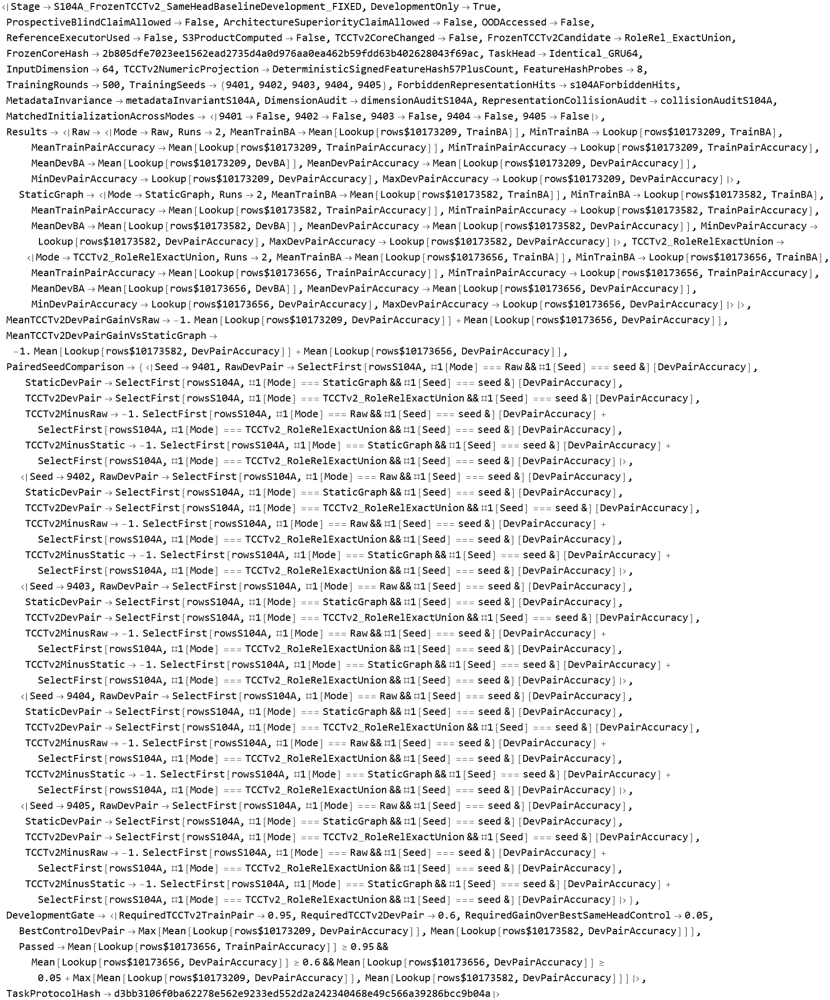

In [2663]:
(* ============================================================ *)
(* S104A RECOVERY PATCH                                         *)
(* Fix lost/unassigned configuration symbols                    *)
(* Safe to run in the current Kernel                            *)
(* ============================================================ *)

Print["S104A recovery patch starting..."];


(* ============================================================ *)
(* 1. RESTORE LOCKED S104A CONFIG                               *)
(* ============================================================ *)

s104AInputDim = 64;

s104AHashDim = 57;

s104AHashProbes = 8;

s104ATrainingRounds = 500;

s104ASeeds = {
  9401,
  9402,
  9403,
  9404,
  9405
};

s104AModes = {
  "Raw",
  "StaticGraph",
  "TCCTv2_RoleRelExactUnion"
};


Print[
  "Modes restored = ",
  s104AModes
];

Print[
  "Seeds restored = ",
  s104ASeeds
];


(* hard validation *)

If[
  !And[
    ListQ[s104AModes],
    Length[s104AModes] == 3,
    ListQ[s104ASeeds],
    Length[s104ASeeds] == 5
  ],

  Print["STOP: S104A configuration restoration failed."];
  Abort[];
];


(* ============================================================ *)
(* 2. RESTORE FROZEN CORE ID                                    *)
(* ============================================================ *)

If[
  !ValueQ[freezeCertificateS103C],

  Print["STOP: freezeCertificateS103C is missing."];
  Abort[];
];


If[
  freezeCertificateS103C["Status"] =!=
    "FROZEN_FOR_BASELINE_DEVELOPMENT",

  Print["STOP: TCCT-v2 freeze certificate is not valid."];
  Abort[];
];


candidateS104A =
  freezeCertificateS103C["Candidate"];


frozenCoreHashS104A =
  freezeCertificateS103C[
    "CandidateProtocolHash"
  ];


Print[
  "Frozen candidate = ",
  candidateS104A
];

Print[
  "Frozen core hash = ",
  frozenCoreHashS104A
];


(* ============================================================ *)
(* 3. CHECK WHETHER REPRESENTATIONS ALREADY EXIST               *)
(* ============================================================ *)

If[
  !ValueQ[dataByModeS104A],

  Print[
    "STOP: dataByModeS104A is missing."
  ];

  Print[
    "The representation-building part of S104A was not completed."
  ];

  Print[
    "Do NOT run this summary further."
  ];

  Abort[];
];


representationDataOKS104A =
  And @@
    Flatten[
      Table[

        {
          ListQ[
            dataByModeS104A[mode]["Train"]
          ],

          ListQ[
            dataByModeS104A[mode]["Dev"]
          ],

          Length[
            dataByModeS104A[mode]["Train"]
          ] ==
            Length[trainRecords],

          Length[
            dataByModeS104A[mode]["Dev"]
          ] ==
            Length[iidRecords]
        },

        {
          mode,
          s104AModes
        }
      ]
    ];


Print[
  "Representation data available = ",
  representationDataOKS104A
];


If[
  !TrueQ[
    representationDataOKS104A
  ],

  Print[
    "STOP: S104A representation data are incomplete."
  ];

  Abort[];
];


(* ============================================================ *)
(* 4. CHECK WHETHER THE 15 TRAINING RUNS ALREADY EXIST          *)
(* ============================================================ *)

runsAlreadyCompleteS104A =
  And[
    ValueQ[rowsS104A],
    ListQ[rowsS104A],
    Length[rowsS104A] == 15
  ];


Print[
  "Existing complete training rows = ",
  runsAlreadyCompleteS104A
];


(* ============================================================ *)
(* 5. IF NOT, RUN THE 3 x 5 BASELINE NOW                        *)
(* ============================================================ *)

If[
  !TrueQ[
    runsAlreadyCompleteS104A
  ],

  If[
    Length[
      DownValues[
        S104ARunOne
      ]
    ] == 0,

    Print[
      "STOP: S104ARunOne definition is missing."
    ];

    Print[
      "The training section must be restored first."
    ];

    Abort[];
  ];


  Print[
    "15 baseline runs were not found."
  ];

  Print[
    "Running 3 representations x 5 matched seeds now..."
  ];


  runsS104A =
    Flatten[
      Table[

        S104ARunOne[
          mode,
          seed
        ],

        {
          mode,
          s104AModes
        },

        {
          seed,
          s104ASeeds
        }
      ],

      1
    ];


  rowsS104A =
    KeyDrop[
      #,
      {"Net"}
    ] & /@
      runsS104A;
];


(* final row integrity *)

If[
  !And[
    ListQ[rowsS104A],
    Length[rowsS104A] == 15
  ],

  Print[
    "STOP: expected 15 baseline rows, obtained ",
    If[
      ListQ[rowsS104A],
      Length[rowsS104A],
      "non-list"
    ]
  ];

  Abort[];
];


Print[
  "Training rows ready = ",
  Length[rowsS104A]
];


(* ============================================================ *)
(* 6. REDEFINE SUMMARY CLEANLY                                  *)
(* ============================================================ *)

ClearAll[S104ASummarize];


S104ASummarize[
  mode_String
] := Module[
  {
    rows
  },


  rows =
    Select[
      rowsS104A,
      #["Mode"] === mode &
    ];


  If[
    rows === {},

    Print[
      "STOP: no rows found for mode ",
      mode
    ];

    Abort[];
  ];


  <|

    "Mode" ->
      mode,

    "Runs" ->
      Length[rows],

    "MeanTrainBA" ->
      N@
        Mean[
          Lookup[
            rows,
            "TrainBA"
          ]
        ],

    "MinTrainBA" ->
      Min[
        Lookup[
          rows,
          "TrainBA"
        ]
      ],

    "MeanTrainPairAccuracy" ->
      N@
        Mean[
          Lookup[
            rows,
            "TrainPairAccuracy"
          ]
        ],

    "MinTrainPairAccuracy" ->
      Min[
        Lookup[
          rows,
          "TrainPairAccuracy"
        ]
      ],

    "MeanDevBA" ->
      N@
        Mean[
          Lookup[
            rows,
            "DevBA"
          ]
        ],

    "MeanDevPairAccuracy" ->
      N@
        Mean[
          Lookup[
            rows,
            "DevPairAccuracy"
          ]
        ],

    "MinDevPairAccuracy" ->
      Min[
        Lookup[
          rows,
          "DevPairAccuracy"
        ]
      ],

    "MaxDevPairAccuracy" ->
      Max[
        Lookup[
          rows,
          "DevPairAccuracy"
        ]
      ]

  |>
];


(* Avoid nested Association@Table surprises.
   Build it explicitly. *)

summaryS104A =
  <|

    "Raw" ->
      S104ASummarize[
        "Raw"
      ],

    "StaticGraph" ->
      S104ASummarize[
        "StaticGraph"
      ],

    "TCCTv2_RoleRelExactUnion" ->
      S104ASummarize[
        "TCCTv2_RoleRelExactUnion"
      ]

  |>;


(* ============================================================ *)
(* 7. MATCHED INITIALIZATION CHECK                              *)
(* ============================================================ *)

matchedInitializationS104A =
  Association@Table[

    seed -> Module[
      {
        hashes
      },


      hashes =
        Lookup[
          Select[
            rowsS104A,
            #["Seed"] === seed &
          ],
          "InitHash"
        ];


      And[
        Length[hashes] == 3,
        SameQ @@ hashes
      ]

    ],

    {
      seed,
      {
        9401,
        9402,
        9403,
        9404,
        9405
      }
    }
  ];


(* ============================================================ *)
(* 8. PAIRED-SEED COMPARISON                                    *)
(* ============================================================ *)

pairedSeedComparisonS104A =
  Table[

    Module[
      {
        raw,
        static,
        tcct
      },


      raw =
        SelectFirst[
          rowsS104A,

          And[
            #["Mode"] === "Raw",
            #["Seed"] === seed
          ] &
        ];


      static =
        SelectFirst[
          rowsS104A,

          And[
            #["Mode"] === "StaticGraph",
            #["Seed"] === seed
          ] &
        ];


      tcct =
        SelectFirst[
          rowsS104A,

          And[
            #["Mode"] ===
              "TCCTv2_RoleRelExactUnion",

            #["Seed"] === seed
          ] &
        ];


      <|

        "Seed" ->
          seed,

        "RawDevPair" ->
          raw["DevPairAccuracy"],

        "StaticDevPair" ->
          static["DevPairAccuracy"],

        "TCCTv2DevPair" ->
          tcct["DevPairAccuracy"],

        "TCCTv2MinusRaw" ->
          N[
            tcct["DevPairAccuracy"] -
            raw["DevPairAccuracy"]
          ],

        "TCCTv2MinusStatic" ->
          N[
            tcct["DevPairAccuracy"] -
            static["DevPairAccuracy"]
          ]

      |>

    ],

    {
      seed,
      {
        9401,
        9402,
        9403,
        9404,
        9405
      }
    }
  ];


(* ============================================================ *)
(* 9. DEVELOPMENT METRICS                                       *)
(* ============================================================ *)

rawDevPairS104A =
  summaryS104A[
    "Raw"
  ][
    "MeanDevPairAccuracy"
  ];


staticDevPairS104A =
  summaryS104A[
    "StaticGraph"
  ][
    "MeanDevPairAccuracy"
  ];


tcctTrainPairS104A =
  summaryS104A[
    "TCCTv2_RoleRelExactUnion"
  ][
    "MeanTrainPairAccuracy"
  ];


tcctDevPairS104A =
  summaryS104A[
    "TCCTv2_RoleRelExactUnion"
  ][
    "MeanDevPairAccuracy"
  ];


bestControlDevPairS104A =
  Max[
    rawDevPairS104A,
    staticDevPairS104A
  ];


developmentGateS104A =
  And[

    tcctTrainPairS104A >= 0.95,

    tcctDevPairS104A >= 0.60,

    tcctDevPairS104A >=
      bestControlDevPairS104A + 0.05

  ];


(* ============================================================ *)
(* 10. PROTOCOL HASH                                            *)
(* ============================================================ *)

taskProtocolHashS104A =
  Hash[
    {

      frozenCoreHashS104A,

      candidateS104A,

      64,
      57,
      8,
      500,

      {
        9401,
        9402,
        9403,
        9404,
        9405
      },

      DownValues[
        S104AHashItemVector
      ],

      DownValues[
        S104ARoundVector
      ],

      DownValues[
        S104ATCCTv2Sequence
      ],

      s104ABaseHead

    },

    "SHA256",
    "HexString"
  ];


(* ============================================================ *)
(* 11. FINAL CLEAN REPORT                                       *)
(* ============================================================ *)

finalS104A =
  <|

    "Stage" ->
      "S104A_FrozenTCCTv2_SameHeadBaselineDevelopment_FIXED",

    "DevelopmentOnly" ->
      True,

    "ProspectiveBlindClaimAllowed" ->
      False,

    "ArchitectureSuperiorityClaimAllowed" ->
      False,

    "OODAccessed" ->
      False,

    "ReferenceExecutorUsed" ->
      False,

    "S3ProductComputed" ->
      False,

    "TCCTv2CoreChanged" ->
      False,

    "FrozenTCCTv2Candidate" ->
      candidateS104A,

    "FrozenCoreHash" ->
      frozenCoreHashS104A,

    "TaskHead" ->
      "Identical_GRU64",

    "InputDimension" ->
      64,

    "TCCTv2NumericProjection" ->
      "DeterministicSignedFeatureHash57PlusCount",

    "FeatureHashProbes" ->
      8,

    "TrainingRounds" ->
      500,

    "TrainingSeeds" ->
      {
        9401,
        9402,
        9403,
        9404,
        9405
      },

    "ForbiddenRepresentationHits" ->
      s104AForbiddenHits,

    "MetadataInvariance" ->
      metadataInvariantS104A,

    "DimensionAudit" ->
      dimensionAuditS104A,

    "RepresentationCollisionAudit" ->
      collisionAuditS104A,

    "MatchedInitializationAcrossModes" ->
      matchedInitializationS104A,

    "Results" ->
      summaryS104A,

    "MeanTCCTv2DevPairGainVsRaw" ->
      N[
        tcctDevPairS104A -
        rawDevPairS104A
      ],

    "MeanTCCTv2DevPairGainVsStaticGraph" ->
      N[
        tcctDevPairS104A -
        staticDevPairS104A
      ],

    "PairedSeedComparison" ->
      pairedSeedComparisonS104A,

    "DevelopmentGate" ->
      <|

        "RequiredTCCTv2TrainPair" ->
          0.95,

        "RequiredTCCTv2DevPair" ->
          0.60,

        "RequiredGainOverBestSameHeadControl" ->
          0.05,

        "BestControlDevPair" ->
          bestControlDevPairS104A,

        "Passed" ->
          developmentGateS104A

      |>,

    "TaskProtocolHash" ->
      taskProtocolHashS104A

  |>;


finalS104A

In [2747]:
(* ============================================================ *)
(* S104A CLEAN RESTART                                          *)
(* Frozen TCCT-v2 vs Raw vs StaticGraph                         *)
(*                                                              *)
(* IMPORTANT: RUN THIS WHOLE BLOCK AS ONE CELL                  *)
(*                                                              *)
(* TRAIN + IID DEV ONLY                                         *)
(* NO OOD                                                       *)
(* SAME GRU64 HEAD                                              *)
(* SAME 5 INITIALIZATION SEEDS                                  *)
(* FROZEN TCCT-v2 CORE                                          *)
(* ============================================================ *)


(* ------------------------------------------------------------ *)
(* Remove ONLY broken S104A state.                              *)
(* S102 / S103 are untouched.                                   *)
(* ------------------------------------------------------------ *)

ClearAll["Global`S104A*"];
ClearAll["Global`s104A*"];


s104ACleanRestartResult =
Catch[

  (

    (* ======================================================== *)
    (* 0. FAIL-SAFE                                             *)
    (* ======================================================== *)

    S104AFail[msg_] := (
      Print["STOP: ", msg];
      Throw[$Failed, "S104A_STOP"]
    );


    Print["================================================"];
    Print["S104A CLEAN RESTART"];
    Print["================================================"];


    (* ======================================================== *)
    (* 1. PREFLIGHT                                             *)
    (* ======================================================== *)

    If[
      !ValueQ[freezeCertificateS103C],
      S104AFail[
        "freezeCertificateS103C is missing."
      ]
    ];


    If[
      freezeCertificateS103C["Status"] =!=
        "FROZEN_FOR_BASELINE_DEVELOPMENT",

      S104AFail[
        "TCCT-v2 does not have a valid freeze certificate."
      ]
    ];


    If[
      !TrueQ[
        freezeCertificateS103C["FailureCount"] == 0
      ],

      S104AFail[
        "S103C freeze certificate contains integrity failures."
      ]
    ];


    If[
      !ValueQ[trainRecords],
      S104AFail["trainRecords is missing."]
    ];


    If[
      !ValueQ[iidRecords],
      S104AFail["iidRecords is missing."]
    ];


    If[
      !ValueQ[s102ABaseHead],
      S104AFail[
        "s102ABaseHead is missing."
      ]
    ];


    If[
      Length[
        DownValues[S102ARawSequence]
      ] == 0,

      S104AFail[
        "S102ARawSequence is missing."
      ]
    ];


    If[
      Length[
        DownValues[S102ALocalSequence]
      ] == 0,

      S104AFail[
        "S102ALocalSequence is missing."
      ]
    ];


    If[
      Length[
        DownValues[S102AQueryHeader]
      ] == 0,

      S104AFail[
        "S102AQueryHeader is missing."
      ]
    ];


    If[
      Length[
        DownValues[S103BRun]
      ] == 0,

      S104AFail[
        "Frozen S103B runner is missing."
      ]
    ];


    If[
      Length[
        DownValues[S102ABA]
      ] == 0,

      S104AFail[
        "S102ABA metric is missing."
      ]
    ];


    If[
      Length[
        DownValues[S102APairAccuracy]
      ] == 0,

      S104AFail[
        "S102APairAccuracy metric is missing."
      ]
    ];


    Print["Preflight = PASS"];


    (* ======================================================== *)
    (* 2. LOCKED CONFIGURATION                                  *)
    (* ======================================================== *)

    candidateS104A =
      freezeCertificateS103C["Candidate"];


    frozenCoreHashS104A =
      freezeCertificateS103C[
        "CandidateProtocolHash"
      ];


    s104AInputDim = 64;

    s104AHashDim = 57;

    s104AHashProbes = 8;

    s104ATrainingRounds = 500;


    s104ASeeds = {
      9401,
      9402,
      9403,
      9404,
      9405
    };


    s104AModes = {
      "Raw",
      "StaticGraph",
      "TCCTv2_RoleRelExactUnion"
    };


    Print[
      "Frozen TCCT-v2 candidate = ",
      candidateS104A
    ];

    Print[
      "Frozen core hash = ",
      frozenCoreHashS104A
    ];

    Print[
      "Train records = ",
      Length[trainRecords]
    ];

    Print[
      "IID Dev records = ",
      Length[iidRecords]
    ];

    Print[
      "Modes = ",
      s104AModes
    ];

    Print[
      "Seeds = ",
      s104ASeeds
    ];

    Print[
      "OOD WILL NOT BE ACCESSED."
    ];


    (* ======================================================== *)
    (* 3. TCCT-v2 SYMBOLIC STATE -> 57D FIXED HASH VECTOR       *)
    (* ======================================================== *)

    S104AHashItemVector[item_] :=
    Module[
      {
        v,
        hIndex,
        hSign,
        idx,
        sg,
        salt
      },


      v =
        ConstantArray[
          0.,
          s104AHashDim
        ];


      Do[

        hIndex =
          Hash[
            {
              "S104A_INDEX",
              salt,
              item
            },
            "SHA256"
          ];


        hSign =
          Hash[
            {
              "S104A_SIGN",
              salt,
              item
            },
            "SHA256"
          ];


        idx =
          1 +
          Mod[
            hIndex,
            s104AHashDim
          ];


        sg =
          If[
            EvenQ[hSign],
            1.,
            -1.
          ];


        v[[idx]] += sg,

        {
          salt,
          1,
          s104AHashProbes
        }
      ];


      N[
        v /
        Sqrt[
          N[s104AHashProbes]
        ]
      ]
    ];


    (* ======================================================== *)
    (* 4. ONE TCCT-v2 ROUND -> 64D                              *)
    (* ======================================================== *)

    S104ARoundVector[items_List] :=
    Module[
      {
        v,
        hv
      },


      v =
        ConstantArray[
          0.,
          64
        ];


      If[
        Length[items] > 0,

        hv =
          Total[
            S104AHashItemVector /@
              items
          ];


        (* stabilize magnitude while preserving multiplicity *)

        hv =
          hv /
          Sqrt[
            N[
              Length[items]
            ]
          ];


        v[[7 ;; 63]] =
          hv;
      ];


      v[[64]] =
        N[
          Length[items] /
          (
            1. +
            Length[items]
          )
        ];


      v
    ];


    (* ======================================================== *)
    (* 5. FROZEN TCCT-v2 -> SEQUENCE                            *)
    (* ======================================================== *)

    S104ATCCTv2Sequence[
      r_Association
    ] :=
    Module[
      {
        tr,
        rounds,
        rr,
        items,
        vecs
      },


      tr =
        S103BRun[
          r,
          candidateS104A
        ];


      rounds =
        tr["Trajectory"];


      vecs =
        Table[

          rr =
            rounds[[k]];


          If[
            !And[
              ListQ[rr],
              Length[rr] == 4,
              rr[[1]] === "Round",
              rr[[3]] ===
                "ActiveStateMultiset"
            ],

            S104AFail[
              "Unexpected frozen S103B trajectory format."
            ]
          ];


          items =
            rr[[4]];


          S104ARoundVector[
            items
          ],

          {
            k,
            Length[rounds]
          }
        ];


      Join[
        {
          S102AQueryHeader[
            r
          ]
        },
        vecs
      ]
    ];


    (* ======================================================== *)
    (* 6. REPRESENTATION DISPATCH                               *)
    (* ======================================================== *)

    S104ARep[
      "Raw",
      r_Association
    ] :=
      S102ARawSequence[r];


    S104ARep[
      "StaticGraph",
      r_Association
    ] :=
      S102ALocalSequence[r];


    S104ARep[
      "TCCTv2_RoleRelExactUnion",
      r_Association
    ] :=
      S104ATCCTv2Sequence[r];


    (* ======================================================== *)
    (* 7. DIMENSION SANITY CHECK                                *)
    (* ======================================================== *)

    Print[
      "Checking representation dimensions..."
    ];


    S104ASequence64Q[x_] :=
      And[
        ListQ[x],
        Length[x] >= 1,
        And @@
          (
            Length[#] == 64 &
          /@
            x
          )
      ];


    dimensionAuditS104A =
      <|

        "Raw" ->
          And @@
            (
              S104ASequence64Q[
                S104ARep["Raw", #]
              ] &
            /@
              Join[
                trainRecords,
                iidRecords
              ]
            ),


        "StaticGraph" ->
          And @@
            (
              S104ASequence64Q[
                S104ARep["StaticGraph", #]
              ] &
            /@
              Join[
                trainRecords,
                iidRecords
              ]
            ),


        "TCCTv2_RoleRelExactUnion" ->
          And @@
            (
              S104ASequence64Q[
                S104ARep[
                  "TCCTv2_RoleRelExactUnion",
                  #
                ]
              ] &
            /@
              Join[
                trainRecords,
                iidRecords
              ]
            )

      |>;


    Print[
      "Dimension audit = ",
      dimensionAuditS104A
    ];


    If[
      !And @@
        Values[
          dimensionAuditS104A
        ],

      S104AFail[
        "One representation failed the 64D dimension audit."
      ]
    ];


    (* ======================================================== *)
    (* 8. METADATA INVARIANCE                                   *)
    (* ======================================================== *)

    Print[
      "Checking metadata / label invariance..."
    ];


    S104AMetadataInvariantForMode[
      mode_String
    ] :=
      And @@
        Table[

          Module[
            {
              altered
            },


            altered =
              Join[
                r,
                <|

                  "Y" ->
                    1 - r["Y"],

                  "PairID" ->
                    "S104A_METADATA_TEST",

                  "Depth" ->
                    999999

                |>
              ];


            SameQ[
              S104ARep[
                mode,
                r
              ],

              S104ARep[
                mode,
                altered
              ]
            ]

          ],

          {
            r,
            Join[
              trainRecords,
              iidRecords
            ]
          }
        ];


    metadataInvariantS104A =
      <|

        "Raw" ->
          S104AMetadataInvariantForMode[
            "Raw"
          ],

        "StaticGraph" ->
          S104AMetadataInvariantForMode[
            "StaticGraph"
          ],

        "TCCTv2_RoleRelExactUnion" ->
          S104AMetadataInvariantForMode[
            "TCCTv2_RoleRelExactUnion"
          ]

      |>;


    Print[
      "Metadata invariance = ",
      metadataInvariantS104A
    ];


    If[
      !And @@
        Values[
          metadataInvariantS104A
        ],

      S104AFail[
        "Metadata invariance failed."
      ]
    ];


    (* ======================================================== *)
    (* 9. BUILD DATA ONCE                                       *)
    (* ======================================================== *)

    Print[
      "Precomputing representations..."
    ];


    S104ABuildData[
      mode_String,
      records_List
    ] :=
      Table[

        {
          S104ARep[
            mode,
            r
          ],

          r["Y"],

          r["PairID"],

          r["Depth"]
        },

        {
          r,
          records
        }
      ];


    rawTrainS104A =
      S104ABuildData[
        "Raw",
        trainRecords
      ];


    rawDevS104A =
      S104ABuildData[
        "Raw",
        iidRecords
      ];


    staticTrainS104A =
      S104ABuildData[
        "StaticGraph",
        trainRecords
      ];


    staticDevS104A =
      S104ABuildData[
        "StaticGraph",
        iidRecords
      ];


    tcctTrainS104A =
      S104ABuildData[
        "TCCTv2_RoleRelExactUnion",
        trainRecords
      ];


    tcctDevS104A =
      S104ABuildData[
        "TCCTv2_RoleRelExactUnion",
        iidRecords
      ];


    dataByModeS104A =
      <|

        "Raw" ->
          <|
            "Train" -> rawTrainS104A,
            "Dev" -> rawDevS104A
          |>,

        "StaticGraph" ->
          <|
            "Train" -> staticTrainS104A,
            "Dev" -> staticDevS104A
          |>,

        "TCCTv2_RoleRelExactUnion" ->
          <|
            "Train" -> tcctTrainS104A,
            "Dev" -> tcctDevS104A
          |>

      |>;


    Print[
      "Representation precompute = DONE"
    ];


    (* ======================================================== *)
    (* 10. NUMERIC PAIR-COLLISION AUDIT                         *)
    (* ======================================================== *)

    S104ACollisionAudit[data_List] :=
    Module[
      {
        repClasses,
        pairGroups,
        pairCollisions,
        conflicts,
        ceilingCorrect
      },


      repClasses =
        Values@
          GroupBy[
            data,
            Hash[
              #[[1]],
              "SHA256",
              "HexString"
            ] &
          ];


      conflicts =
        Cases[
          repClasses,

          g_List /;
            Length[
              DeleteDuplicates[
                g[[All, 2]]
              ]
            ] > 1
        ];


      ceilingCorrect =
        Total[
          Table[
            Max[
              Values[
                Counts[
                  g[[All, 2]]
                ]
              ]
            ],
            {
              g,
              repClasses
            }
          ]
        ];


      pairGroups =
        Values@
          GroupBy[
            data,
            #[[3]] &
          ];


      pairCollisions =
        Table[

          Module[
            {
              p,
              n
            },


            p =
              First[
                Cases[
                  g,
                  row_List /;
                    row[[2]] === 1
                ]
              ];


            n =
              First[
                Cases[
                  g,
                  row_List /;
                    row[[2]] === 0
                ]
              ];


            SameQ[
              p[[1]],
              n[[1]]
            ]

          ],

          {
            g,
            pairGroups
          }
        ];


      <|

        "Records" ->
          Length[data],

        "RepresentationClasses" ->
          Length[repClasses],

        "LabelConflictClasses" ->
          Length[conflicts],

        "LabelAccuracyCeiling" ->
          N[
            ceilingCorrect /
            Length[data]
          ],

        "Pairs" ->
          Length[pairGroups],

        "ExactMatchedPairCollisions" ->
          Count[
            pairCollisions,
            True
          ],

        "PairCollisionFraction" ->
          N[
            Count[
              pairCollisions,
              True
            ] /
            Length[
              pairCollisions
            ]
          ]

      |>
    ];


    collisionAuditS104A =
      <|

        "RawTrain" ->
          S104ACollisionAudit[
            rawTrainS104A
          ],

        "StaticTrain" ->
          S104ACollisionAudit[
            staticTrainS104A
          ],

        "TCCTv2Train" ->
          S104ACollisionAudit[
            tcctTrainS104A
          ],

        "RawDev" ->
          S104ACollisionAudit[
            rawDevS104A
          ],

        "StaticDev" ->
          S104ACollisionAudit[
            staticDevS104A
          ],

        "TCCTv2Dev" ->
          S104ACollisionAudit[
            tcctDevS104A
          ]

      |>;


    Print[
      "TCCT-v2 numeric TRAIN pair collisions = ",
      collisionAuditS104A[
        "TCCTv2Train"
      ][
        "ExactMatchedPairCollisions"
      ]
    ];


    If[
      collisionAuditS104A[
        "TCCTv2Train"
      ][
        "ExactMatchedPairCollisions"
      ] > 0,

      S104AFail[
        "Numeric projection reintroduced TCCT-v2 TRAIN pair collisions."
      ]
    ];


    (* ======================================================== *)
    (* 11. SAME GRU64 HEAD                                      *)
    (* ======================================================== *)

    s104ABaseHead =
      s102ABaseHead;


    (* ======================================================== *)
    (* 12. ONE TRAINING RUN                                     *)
    (* ======================================================== *)

    S104ARunOne[
      mode_String,
      seed_Integer
    ] :=
    Module[
      {
        trainData,
        devData,
        rules,
        initialized,
        initHash,
        trained,
        timing
      },


      Print[
        "Training ",
        mode,
        " | seed ",
        seed,
        " ..."
      ];


      trainData =
        dataByModeS104A[
          mode
        ][
          "Train"
        ];


      devData =
        dataByModeS104A[
          mode
        ][
          "Dev"
        ];


      rules =
        (
          #[[1]] ->
            #[[2]]
        ) & /@
          trainData;


      initialized =
        NetInitialize[
          s104ABaseHead,
          RandomSeeding -> seed
        ];


      initHash =
        Hash[
          initialized,
          "SHA256",
          "HexString"
        ];


      timing =
        AbsoluteTiming[

          trained =
            NetTrain[
              initialized,
              rules,

              BatchSize -> 16,

              MaxTrainingRounds ->
                s104ATrainingRounds,

              TargetDevice ->
                "CPU",

              RandomSeeding ->
                seed
            ];
        ];


      Print[
        "  done in ",
        N[timing[[1]]],
        " sec"
      ];


      <|

        "Mode" ->
          mode,

        "Seed" ->
          seed,

        "InitHash" ->
          initHash,

        "TrainingSeconds" ->
          N[timing[[1]]],

        "TrainBA" ->
          S102ABA[
            trained,
            trainData
          ],

        "TrainPairAccuracy" ->
          S102APairAccuracy[
            trained,
            trainData
          ],

        "DevBA" ->
          S102ABA[
            trained,
            devData
          ],

        "DevPairAccuracy" ->
          S102APairAccuracy[
            trained,
            devData
          ]

      |>
    ];


    (* ======================================================== *)
    (* 13. ACTUAL 15 RUNS                                       *)
    (* ======================================================== *)

    Print["================================================"];
    Print["STARTING 15 BASELINE RUNS"];
    Print["3 modes x 5 matched seeds"];
    Print["================================================"];


    runsS104A =
      Flatten[
        {

          Table[
            S104ARunOne[
              "Raw",
              seed
            ],
            {
              seed,
              s104ASeeds
            }
          ],


          Table[
            S104ARunOne[
              "StaticGraph",
              seed
            ],
            {
              seed,
              s104ASeeds
            }
          ],


          Table[
            S104ARunOne[
              "TCCTv2_RoleRelExactUnion",
              seed
            ],
            {
              seed,
              s104ASeeds
            }
          ]

        },
        1
      ];


    If[
      !And[
        ListQ[runsS104A],
        Length[runsS104A] == 15
      ],

      S104AFail[
        "Expected exactly 15 completed baseline runs."
      ]
    ];


    rowsS104A =
      runsS104A;


    Print[
      "Completed baseline rows = ",
      Length[rowsS104A]
    ];


    (* ======================================================== *)
    (* 14. SAFE SUMMARY -- NO Select / SelectFirst              *)
    (* ======================================================== *)

    S104ARowsForMode[
      mode_String
    ] :=
      Cases[
        rowsS104A,
        a_Association /;
          a["Mode"] === mode
      ];


    S104ASummaryFromRows[
      mode_String
    ] :=
    Module[
      {
        rr
      },


      rr =
        S104ARowsForMode[
          mode
        ];


      If[
        Length[rr] =!= 5,

        S104AFail[
          StringJoin[
            "Expected 5 rows for mode ",
            mode
          ]
        ]
      ];


      <|

        "Mode" ->
          mode,

        "Runs" ->
          Length[rr],

        "MeanTrainBA" ->
          N[
            Mean[
              Lookup[
                rr,
                "TrainBA"
              ]
            ]
          ],

        "MeanTrainPairAccuracy" ->
          N[
            Mean[
              Lookup[
                rr,
                "TrainPairAccuracy"
              ]
            ]
          ],

        "MinTrainPairAccuracy" ->
          Min[
            Lookup[
              rr,
              "TrainPairAccuracy"
            ]
          ],

        "MeanDevBA" ->
          N[
            Mean[
              Lookup[
                rr,
                "DevBA"
              ]
            ]
          ],

        "MeanDevPairAccuracy" ->
          N[
            Mean[
              Lookup[
                rr,
                "DevPairAccuracy"
              ]
            ]
          ],

        "MinDevPairAccuracy" ->
          Min[
            Lookup[
              rr,
              "DevPairAccuracy"
            ]
          ],

        "MaxDevPairAccuracy" ->
          Max[
            Lookup[
              rr,
              "DevPairAccuracy"
            ]
          ]

      |>
    ];


    summaryS104A =
      <|

        "Raw" ->
          S104ASummaryFromRows[
            "Raw"
          ],

        "StaticGraph" ->
          S104ASummaryFromRows[
            "StaticGraph"
          ],

        "TCCTv2_RoleRelExactUnion" ->
          S104ASummaryFromRows[
            "TCCTv2_RoleRelExactUnion"
          ]

      |>;


    (* ======================================================== *)
    (* 15. SAME-INITIALIZATION CHECK                            *)
    (* ======================================================== *)

    S104AHashesForSeed[
      seed_Integer
    ] :=
      Lookup[
        Cases[
          rowsS104A,
          a_Association /;
            a["Seed"] === seed
        ],
        "InitHash"
      ];


    matchedInitializationS104A =
      Association[
        Table[

          seed ->
            Module[
              {
                hh
              },

              hh =
                S104AHashesForSeed[
                  seed
                ];


              And[
                Length[hh] == 3,
                SameQ @@ hh
              ]
            ],

          {
            seed,
            s104ASeeds
          }
        ]
      ];


    (* ======================================================== *)
    (* 16. SAFE ROW LOOKUP                                      *)
    (* ======================================================== *)

    S104AGetRow[
      mode_String,
      seed_Integer
    ] :=
    Module[
      {
        hits
      },


      hits =
        Cases[
          rowsS104A,

          a_Association /;
            And[
              a["Mode"] === mode,
              a["Seed"] === seed
            ]
        ];


      If[
        Length[hits] =!= 1,

        S104AFail[
          StringJoin[
            "Row lookup failed for ",
            mode,
            " / ",
            ToString[seed]
          ]
        ]
      ];


      First[hits]
    ];


    pairedSeedComparisonS104A =
      Table[

        Module[
          {
            raw,
            stat,
            tcct
          },


          raw =
            S104AGetRow[
              "Raw",
              seed
            ];


          stat =
            S104AGetRow[
              "StaticGraph",
              seed
            ];


          tcct =
            S104AGetRow[
              "TCCTv2_RoleRelExactUnion",
              seed
            ];


          <|

            "Seed" ->
              seed,

            "RawDevPair" ->
              raw["DevPairAccuracy"],

            "StaticDevPair" ->
              stat["DevPairAccuracy"],

            "TCCTv2DevPair" ->
              tcct["DevPairAccuracy"],

            "TCCTv2MinusRaw" ->
              N[
                tcct["DevPairAccuracy"] -
                raw["DevPairAccuracy"]
              ],

            "TCCTv2MinusStatic" ->
              N[
                tcct["DevPairAccuracy"] -
                stat["DevPairAccuracy"]
              ]

          |>

        ],

        {
          seed,
          s104ASeeds
        }
      ];


    (* ======================================================== *)
    (* 17. DEVELOPMENT GATE                                     *)
    (* ======================================================== *)

    rawDevPairMeanS104A =
      summaryS104A[
        "Raw"
      ][
        "MeanDevPairAccuracy"
      ];


    staticDevPairMeanS104A =
      summaryS104A[
        "StaticGraph"
      ][
        "MeanDevPairAccuracy"
      ];


    tcctTrainPairMeanS104A =
      summaryS104A[
        "TCCTv2_RoleRelExactUnion"
      ][
        "MeanTrainPairAccuracy"
      ];


    tcctDevPairMeanS104A =
      summaryS104A[
        "TCCTv2_RoleRelExactUnion"
      ][
        "MeanDevPairAccuracy"
      ];


    bestControlDevPairS104A =
      Max[
        rawDevPairMeanS104A,
        staticDevPairMeanS104A
      ];


    developmentGateS104A =
      And[

        tcctTrainPairMeanS104A >=
          0.95,

        tcctDevPairMeanS104A >=
          0.60,

        tcctDevPairMeanS104A >=
          bestControlDevPairS104A +
          0.05
      ];


    (* ======================================================== *)
    (* 18. PROTOCOL HASH                                        *)
    (* ======================================================== *)

    taskProtocolHashS104A =
      Hash[
        {

          frozenCoreHashS104A,

          candidateS104A,

          64,
          57,
          8,

          500,

          s104ASeeds,

          DownValues[
            S104AHashItemVector
          ],

          DownValues[
            S104ARoundVector
          ],

          DownValues[
            S104ATCCTv2Sequence
          ],

          s104ABaseHead

        },

        "SHA256",
        "HexString"
      ];


    (* ======================================================== *)
    (* 19. FINAL REPORT                                         *)
    (* ======================================================== *)

    finalS104A =
      <|

        "Stage" ->
          "S104A_FrozenTCCTv2_SameHeadBaseline_CLEAN",

        "DevelopmentOnly" ->
          True,

        "ProspectiveBlindClaimAllowed" ->
          False,

        "ArchitectureSuperiorityClaimAllowed" ->
          False,

        "OODAccessed" ->
          False,

        "TCCTv2CoreChanged" ->
          False,

        "FrozenCandidate" ->
          candidateS104A,

        "FrozenCoreHash" ->
          frozenCoreHashS104A,

        "TaskHead" ->
          "Identical_GRU64",

        "TrainingRounds" ->
          500,

        "TrainingSeeds" ->
          s104ASeeds,

        "DimensionAudit" ->
          dimensionAuditS104A,

        "MetadataInvariance" ->
          metadataInvariantS104A,

        "CollisionAudit" ->
          collisionAuditS104A,

        "MatchedInitializationAcrossModes" ->
          matchedInitializationS104A,

        "Results" ->
          summaryS104A,

        "MeanTCCTv2DevPairGainVsRaw" ->
          N[
            tcctDevPairMeanS104A -
            rawDevPairMeanS104A
          ],

        "MeanTCCTv2DevPairGainVsStatic" ->
          N[
            tcctDevPairMeanS104A -
            staticDevPairMeanS104A
          ],

        "PairedSeedComparison" ->
          pairedSeedComparisonS104A,

        "DevelopmentGate" ->
          <|

            "TCCTv2TrainPairRequired" ->
              0.95,

            "TCCTv2DevPairRequired" ->
              0.60,

            "GainOverBestControlRequired" ->
              0.05,

            "BestControlDevPair" ->
              bestControlDevPairS104A,

            "Passed" ->
              developmentGateS104A

          |>,

        "TaskProtocolHash" ->
          taskProtocolHashS104A

      |>;


    Print["================================================"];
    Print["S104A COMPLETE"];
    Print["================================================"];


    finalS104A

  ),

  "S104A_STOP"
];

S104A CLEAN RESTART
Preflight = PASS
Frozen TCCT-v2 candidate = RoleRel_ExactUnion
Frozen core hash = 2b805dfe7023ee1562ead2735d4a0d976aa0ea462b59fdd63b40262804\
 
>    3f69ac
Train records = 96
IID Dev records = 48
Modes = {Raw, StaticGraph, TCCTv2_RoleRelExactUnion}
Seeds = {9401, 9402, 9403, 9404, 9405}
OOD WILL NOT BE ACCESSED.
Checking representation dimensions...
Dimension audit = <|Raw -> True, StaticGraph -> True, 
 
>    TCCTv2_RoleRelExactUnion -> True|>
Checking metadata / label invariance...
Metadata invariance = <|Raw -> True, StaticGraph -> True, 
 
>    TCCTv2_RoleRelExactUnion -> True|>
Precomputing representations...
Representation precompute = DONE
TCCT-v2 numeric TRAIN pair collisions = 0
STARTING 15 BASELINE RUNS
3 modes x 5 matched seeds
Training Raw | seed 9401 ...
  done in 15.0059 sec
Training Raw | seed 9402 ...
  done in 15.5708 sec
Training Raw | seed 9403 ...
  done in 15.3646 sec
Training Raw | seed 9404 ...
  done in 15.6636 sec
Training Raw | seed 9405 ..

<|Stage -> S104A_FrozenTCCTv2_SameHeadBaseline_CLEAN, DevelopmentOnly -> True, 
 
>   ProspectiveBlindClaimAllowed -> False, ArchitectureSuperiorityClaimAllowed -> False, 
 
>   OODAccessed -> False, TCCTv2CoreChanged -> False, 
 
>   FrozenCandidate -> RoleRel_ExactUnion, 
 
>   FrozenCoreHash -> 2b805dfe7023ee1562ead2735d4a0d976aa0ea462b59fdd63b402628043f69ac, 
 
>   TaskHead -> Identical_GRU64, TrainingRounds -> 500, 
 
>   TrainingSeeds -> {9401, 9402, 9403, 9404, 9405}, 
 
>   DimensionAudit -> 
 
>    <|Raw -> True, StaticGraph -> True, TCCTv2_RoleRelExactUnion -> True|>, 
 
>   MetadataInvariance -> 
 
>    <|Raw -> True, StaticGraph -> True, TCCTv2_RoleRelExactUnion -> True|>, 
 
>   CollisionAudit -> 
 
>    <|RawTrain -> 
 
>      <|Records -> 96, RepresentationClasses -> 96, LabelConflictClasses -> 0, 
 
>       LabelAccuracyCeiling -> 1., Pairs -> 48, ExactMatchedPairCollisions -> 0, 
 
>       PairCollisionFraction -> 0.|>, 
 
>     StaticTrain -> 
 
>      <|Records -> 96, RepresentationClasses -> 96, LabelConflictClasses -> 0, 
 
>       LabelAccuracyCeiling -> 1., Pairs -> 48, ExactMatchedPairCollisions -> 0, 
 
>       PairCollisionFraction -> 0.|>, 
 
>     TCCTv2Train -> 
 
>      <|Records -> 96, RepresentationClasses -> 96, LabelConflictClasses -> 0, 
 
>       LabelAccuracyCeiling -> 1., Pairs -> 48, ExactMatchedPairCollisions -> 0, 
 
>       PairCollisionFraction -> 0.|>, 
 
>     RawDev -> <|Records -> 48, RepresentationClasses -> 48, LabelConflictClasses -> 0, 
 
>       LabelAccuracyCeiling -> 1., Pairs -> 24, ExactMatchedPairCollisions -> 0, 
 
>       PairCollisionFraction -> 0.|>, 
 
>     StaticDev -> 
 
>      <|Records -> 48, RepresentationClasses -> 48, LabelConflictClasses -> 0, 
 
>       LabelAccuracyCeiling -> 1., Pairs -> 24, ExactMatchedPairCollisions -> 0, 
 
>       PairCollisionFraction -> 0.|>, 
 
>     TCCTv2Dev -> 
 
>      <|Records -> 48, RepresentationClasses -> 48, LabelConflictClasses -> 0, 
 
>       LabelAccuracyCeiling -> 1., Pairs -> 24, ExactMatchedPairCollisions -> 0, 
 
>       PairCollisionFraction -> 0.|>|>, 
 
>   MatchedInitializationAcrossModes -> 
 
>    <|9401 -> True, 9402 -> True, 9403 -> True, 9404 -> True, 9405 -> True|>, 
 
>   Results -> <|Raw -> 
 
>      <|Mode -> Raw, Runs -> 5, MeanTrainBA -> 1., MeanTrainPairAccuracy -> 1., 
 
>       MinTrainPairAccuracy -> 1., MeanDevBA -> 0.6125, MeanDevPairAccuracy -> 0.6625, 
 
>       MinDevPairAccuracy -> 0.625, MaxDevPairAccuracy -> 0.708333|>, 
 
>     StaticGraph -> 
 
>      <|Mode -> StaticGraph, Runs -> 5, MeanTrainBA -> 1., MeanTrainPairAccuracy -> 1., 
 
>       MinTrainPairAccuracy -> 1., MeanDevBA -> 0.6125, 
 
>       MeanDevPairAccuracy -> 0.633333, MinDevPairAccuracy -> 0.541667, 
 
>       MaxDevPairAccuracy -> 0.708333|>, 
 
>     TCCTv2_RoleRelExactUnion -> 
 
>      <|Mode -> TCCTv2_RoleRelExactUnion, Runs -> 5, MeanTrainBA -> 1., 
 
>       MeanTrainPairAccuracy -> 1., MinTrainPairAccuracy -> 1., MeanDevBA -> 0.495833, 
 
>       MeanDevPairAccuracy -> 0.55, MinDevPairAccuracy -> 0.458333, 
 
>       MaxDevPairAccuracy -> 0.625|>|>, MeanTCCTv2DevPairGainVsRaw -> -0.1125, 
 
>   MeanTCCTv2DevPairGainVsStatic -> -0.0833333, 
 
>   PairedSeedComparison -> 
 
>    {<|Seed -> 9401, RawDevPair -> 0.6875, StaticDevPair -> 0.583333, 
 
>      TCCTv2DevPair -> 0.458333, TCCTv2MinusRaw -> -0.229167, 
 
>      TCCTv2MinusStatic -> -0.125|>, 
 
>     <|Seed -> 9402, RawDevPair -> 0.625, StaticDevPair -> 0.666667, 
 
>      TCCTv2DevPair -> 0.5, TCCTv2MinusRaw -> -0.125, TCCTv2MinusStatic -> -0.166667|>, 
 
>     <|Seed -> 9403, RawDevPair -> 0.666667, StaticDevPair -> 0.666667, 
 
>      TCCTv2DevPair -> 0.625, TCCTv2MinusRaw -> -0.0416667, 
 
>      TCCTv2MinusStatic -> -0.0416667|>, 
 
>     <|Seed -> 9404, RawDevPair -> 0.708333, StaticDevPair -> 0.541667, 
 
>      TCCTv2DevPair -> 0.583333, TCCTv2MinusRaw -> -0.125, 
 
>      TCCTv2MinusStatic -> 0.0416667|>, 
 
>     <|Seed -> 9405, RawDevPair -> 0.6
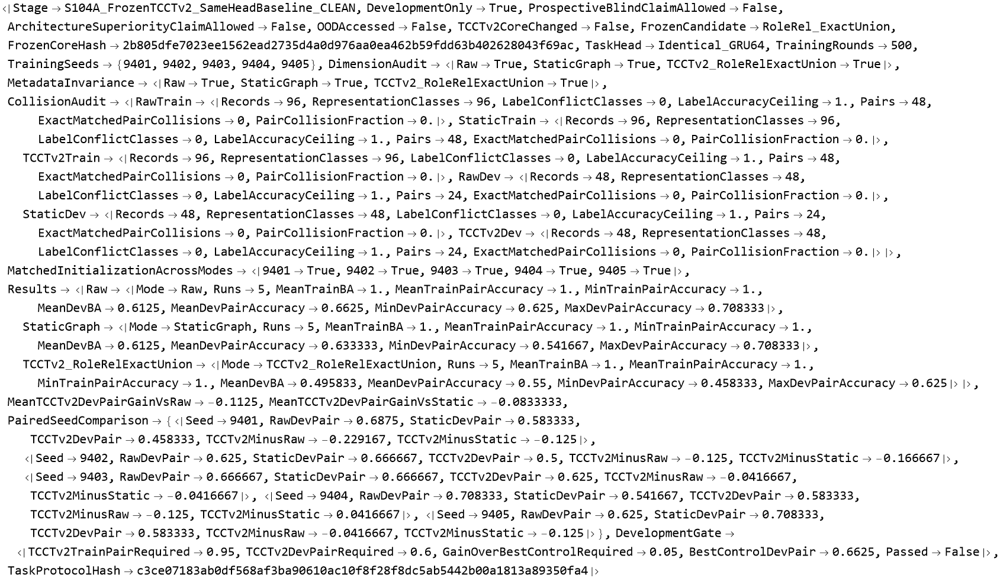

In [2770]:
s104ACleanRestartResult

In [2775]:
Dataset[
  {
    summaryS104A["Raw"],
    summaryS104A["StaticGraph"],
    summaryS104A[
      "TCCTv2_RoleRelExactUnion"
    ]
  }
]

Dataset[{<|Mode -> Raw, Runs -> 5, MeanTrainBA -> 1., MeanTrainPairAccuracy -> 1., 
 
>     MinTrainPairAccuracy -> 1., MeanDevBA -> 0.6125, MeanDevPairAccuracy -> 0.6625, 
 
>     MinDevPairAccuracy -> 0.625, MaxDevPairAccuracy -> 0.708333|>, 
 
>    <|Mode -> StaticGraph, Runs -> 5, MeanTrainBA -> 1., MeanTrainPairAccuracy -> 1., 
 
>     MinTrainPairAccuracy -> 1., MeanDevBA -> 0.6125, MeanDevPairAccuracy -> 0.633333, 
 
>     MinDevPairAccuracy -> 0.541667, MaxDevPairAccuracy -> 0.708333|>, 
 
>    <|Mode -> TCCTv2_RoleRelExactUnion, Runs -> 5, MeanTrainBA -> 1., 
 
>     MeanTrainPairAccuracy -> 1., MinTrainPairAccuracy -> 1., MeanDevBA -> 0.495833, 
 
>     MeanDevPairAccuracy -> 0.55, MinDevPairAccuracy -> 0.458333, 
 
>     MaxDevPairAccuracy -> 0.625|>}, 
 
>   TypeSystem`Vector[TypeSystem`Struct[{Mode, Runs, MeanTrainBA, MeanTrainPairAccuracy, 
 
>      MinTrainPairAccuracy, MeanDevBA, MeanDevPairAccuracy, MinDevPairAccuracy, 
 
>      MaxDevPairAccuracy}, {TypeSystem`Atom[String], TypeSystem`Atom[Integer], 
 
>      TypeSystem`Atom[Real], TypeSystem`Atom[Real], TypeSystem`Atom[Real], 
 
>      TypeSystem`Atom[Real], TypeSystem`Atom[Real], TypeSystem`Atom[Real], 
 
>      TypeSystem`Atom[Real]}], 3], <||>]

In [2780]:
Dataset[
  pairedSeedComparisonS104A
]

Dataset[{<|Seed -> 9401, RawDevPair -> 0.6875, StaticDevPair -> 0.583333, 
 
>     TCCTv2DevPair -> 0.458333, TCCTv2MinusRaw -> -0.229167, 
 
>     TCCTv2MinusStatic -> -0.125|>, 
 
>    <|Seed -> 9402, RawDevPair -> 0.625, StaticDevPair -> 0.666667, 
 
>     TCCTv2DevPair -> 0.5, TCCTv2MinusRaw -> -0.125, TCCTv2MinusStatic -> -0.166667|>, 
 
>    <|Seed -> 9403, RawDevPair -> 0.666667, StaticDevPair -> 0.666667, 
 
>     TCCTv2DevPair -> 0.625, TCCTv2MinusRaw -> -0.0416667, 
 
>     TCCTv2MinusStatic -> -0.0416667|>, 
 
>    <|Seed -> 9404, RawDevPair -> 0.708333, StaticDevPair -> 0.541667, 
 
>     TCCTv2DevPair -> 0.583333, TCCTv2MinusRaw -> -0.125, 
 
>     TCCTv2MinusStatic -> 0.0416667|>, 
 
>    <|Seed -> 9405, RawDevPair -> 0.625, StaticDevPair -> 0.708333, 
 
>     TCCTv2DevPair -> 0.583333, TCCTv2MinusRaw -> -0.0416667, 
 
>     TCCTv2MinusStatic -> -0.125|>}, 
 
>   TypeSystem`Vector[TypeSystem`Struct[{Seed, RawDevPair, StaticDevPair, TCCTv2DevPair, 
 
>      TCCTv2MinusRaw, TCCTv2MinusStatic}, 
 
>     {TypeSystem`Atom[Integer], TypeSystem`Atom[Real], TypeSystem`Atom[Real], 
 
>      TypeSystem`Atom[Real], TypeSystem`Atom[Real], TypeSystem`Atom[Real]}], 5], <||>]

In [2785]:
(* ============================================================ *)
(* S104B                                                        *)
(* Frozen TCCT-v2 Structure-Preserving Readout Development      *)
(*                                                              *)
(* CORE IS FROZEN                                               *)
(* Candidate = RoleRel_ExactUnion                               *)
(*                                                              *)
(* Existing controls reused from S104A:                         *)
(*   Raw                                                        *)
(*   StaticGraph                                                *)
(*   OpaqueHash TCCT-v2                                         *)
(*                                                              *)
(* New TCCT-v2 readouts:                                        *)
(*   TypedLocal                                                 *)
(*   RecursiveStructural                                        *)
(*                                                              *)
(* TRAIN + IID DEV ONLY                                         *)
(* NO OOD                                                       *)
(* SAME GRU64                                                   *)
(* SAME seeds 9401..9405                                        *)
(* ============================================================ *)

ClearAll["Global`S104B*"];
ClearAll["Global`s104B*"];


s104BResult =
Catch[

(

(* ============================================================ *)
(* 0. FAIL SAFE                                                 *)
(* ============================================================ *)

S104BFail[msg_] := (
  Print["STOP: ", msg];
  Throw[$Failed, "S104B_STOP"];
);


Print["================================================"];
Print["S104B STRUCTURE-PRESERVING READOUT AUDIT"];
Print["================================================"];


(* ============================================================ *)
(* 1. PREFLIGHT                                                 *)
(* ============================================================ *)

If[
  !ValueQ[freezeCertificateS103C],
  S104BFail["freezeCertificateS103C missing."]
];

If[
  freezeCertificateS103C["Status"] =!=
    "FROZEN_FOR_BASELINE_DEVELOPMENT",
  S104BFail["TCCT-v2 core is not frozen."]
];

If[
  freezeCertificateS103C["Candidate"] =!=
    "RoleRel_ExactUnion",
  S104BFail["Frozen candidate is not RoleRel_ExactUnion."]
];

If[
  !And[
    ValueQ[trainRecords],
    ValueQ[iidRecords]
  ],
  S104BFail["trainRecords/iidRecords missing."]
];

If[
  !And[
    ValueQ[rowsS104A],
    ListQ[rowsS104A],
    Length[rowsS104A] == 15
  ],
  S104BFail[
    "Completed S104A rows are missing. Expected 15 rows."
  ]
];

If[
  !ValueQ[s102ABaseHead],
  S104BFail["s102ABaseHead missing."]
];

If[
  Length[DownValues[S102AQueryHeader]] == 0,
  S104BFail["S102AQueryHeader missing."]
];

If[
  Length[DownValues[S103BNodeInfo]] == 0 ||
  Length[DownValues[S103BNodeDescriptor]] == 0 ||
  Length[DownValues[S103BRelation]] == 0 ||
  Length[DownValues[S103BMessageDescriptor]] == 0 ||
  Length[DownValues[S103BAggregateMessages]] == 0 ||
  Length[DownValues[S103BStateID]] == 0 ||
  Length[DownValues[S103BRun]] == 0,

  S104BFail["Frozen S103B definitions missing."]
];


candidateS104B =
  "RoleRel_ExactUnion";

frozenCoreHashS104B =
  freezeCertificateS103C[
    "CandidateProtocolHash"
  ];


s104BSeeds = {
  9401, 9402, 9403, 9404, 9405
};

s104BTrainingRounds = 500;

s104BHashDim = 56;

s104BHashProbes = 8;


Print["Preflight = PASS"];
Print["Frozen core = ", candidateS104B];
Print["Core hash = ", frozenCoreHashS104B];
Print["TRAIN = ", Length[trainRecords]];
Print["IID DEV = ", Length[iidRecords]];
Print["OOD WILL NOT BE ACCESSED."];


(* ============================================================ *)
(* 2. ROLE VOCABULARY                                           *)
(* ============================================================ *)

s104BRoles = {
  "Root",
  "StartAnchor",
  "TargetAnchor",
  "TokenCenter",
  "TokenExit",
  "Sink",
  "Other"
};


S104BRoleOneHot[role_] :=
Module[
  {p, v},

  v = ConstantArray[0., 7];

  p = FirstPosition[
    s104BRoles,
    role,
    {7}
  ];

  v[[p[[1]]]] = 1.;

  v
];


(* ============================================================ *)
(* 3. SHARED ATOMIC FEATURE HASH                                *)
(*                                                              *)
(* IMPORTANT DIFFERENCE FROM S104A:                             *)
(*                                                              *)
(* We hash SHARED STRUCTURAL ATOMS, e.g.                        *)
(*   {"Node", CodePair, Role}                                   *)
(*   {"Edge", SrcRole, DstRole, Relation}                       *)
(*                                                              *)
(* We NEVER hash the complete recursive TCCT state ID as one    *)
(* opaque object.                                               *)
(*                                                              *)
(* Therefore the same structural component shares coordinates   *)
(* across different samples.                                   *)
(* ============================================================ *)

S104BAtomVector[item_] :=
Module[
  {
    v,
    h1,
    h2,
    idx,
    sg,
    salt
  },

  v =
    ConstantArray[
      0.,
      s104BHashDim
    ];

  Do[

    h1 =
      Hash[
        {
          "S104B_STRUCT_INDEX",
          salt,
          item
        },
        "SHA256"
      ];

    h2 =
      Hash[
        {
          "S104B_STRUCT_SIGN",
          salt,
          item
        },
        "SHA256"
      ];

    idx =
      1 +
      Mod[
        h1,
        s104BHashDim
      ];

    sg =
      If[
        EvenQ[h2],
        1.,
        -1.
      ];

    v[[idx]] += sg,

    {
      salt,
      1,
      s104BHashProbes
    }
  ];

  N[
    v /
      Sqrt[
        N[s104BHashProbes]
      ]
  ]
];


S104BNormalize[v_List] :=
Module[
  {n},

  n =
    Sqrt[
      Total[
        N[v]^2
      ]
    ];

  If[
    n <= 10^-12,
    N[v],
    N[v/n]
  ]
];


(* ============================================================ *)
(* 4. EXACT FROZEN-CORE TRACE + TRANSPARENT PARALLEL CHANNEL    *)
(*                                                              *)
(* hashState: EXACT frozen S103B state used for exact union.     *)
(*                                                              *)
(* numericState: NEW READOUT-ONLY continuous structural state.   *)
(*                                                              *)
(* numericState NEVER decides propagation or Union.             *)
(* Therefore TCCT-v2 core remains frozen.                       *)
(* ============================================================ *)

S104BTrace[
  r_Association
] :=
Module[
  {
    builtInfo,
    ctx,
    info,

    p,
    pa,
    q,
    n,
    vertices,

    active,
    hashState,
    numericState,

    nextActive,
    nextHashState,
    nextNumericState,

    activeParents,

    srcNode,
    dstNode,
    srcInfo,
    dstInfo,

    rawEntries,
    uniqueEntries,

    messages,
    aggregate,
    dstDesc,
    newHash,

    baseVec,
    edgeVecs,
    parentVecs,
    edgeMean,
    parentMean,
    newNumeric,

    localItems,
    localRoundVec,
    recursiveRoundVec,

    roleSum,
    activeCount,

    trajectoryHash = {},
    typedLocalSequence = {},
    recursiveSequence = {},

    historical,

    j,
    u,
    k,

    safetyCap,
    terminatedNaturally = False
  },


  builtInfo =
    S103BNodeInfo[r];

  ctx =
    builtInfo["Context"];

  info =
    builtInfo["Info"];


  p =
    ctx["Pack"];

  pa =
    p[[1]];

  q =
    p[[4]];

  n =
    p[[7]];

  vertices =
    p[[12]];


  safetyCap =
    Max[
      64,
      2 n + 8
    ];


  active =
    ConstantArray[
      False,
      n
    ];

  hashState =
    ConstantArray[
      None,
      n
    ];

  numericState =
    ConstantArray[
      ConstantArray[
        0.,
        s104BHashDim
      ],
      n
    ];


  active[[q]] =
    True;


  hashState[[q]] =
    Hash[
      {
        "InitialQuery",

        S103BNodeDescriptor[
          info[
            vertices[[q]]
          ],
          candidateS104B
        ]
      },

      "SHA256",
      "HexString"
    ];


  (* Transparent initial state.
     Same structural node descriptor, not opaque state hash. *)

  numericState[[q]] =
    S104BNormalize[
      S104BAtomVector[
        {
          "InitialQuery",

          S103BNodeDescriptor[
            info[
              vertices[[q]]
            ],
            candidateS104B
          ]
        }
      ]
    ];


  For[
    k = 1,
    k <= safetyCap,
    k++,


    nextActive =
      ConstantArray[
        False,
        n
      ];

    nextHashState =
      ConstantArray[
        None,
        n
      ];

    nextNumericState =
      ConstantArray[
        ConstantArray[
          0.,
          s104BHashDim
        ],
        n
      ];


    localItems = {};

    roleSum =
      ConstantArray[
        0.,
        7
      ];

    activeCount = 0;


    Do[

      activeParents =
        Select[
          pa[[j]],

          Function[
            u,
            IntegerQ[u] &&
            u > 0 &&
            TrueQ[
              active[[u]]
            ]
          ]
        ];


      If[
        activeParents =!= {},


        dstNode =
          vertices[[j]];

        dstInfo =
          info[dstNode];


        (* ---------------------------------------------------- *)
        (* Build full frozen-core messages.                     *)
        (* ---------------------------------------------------- *)

        rawEntries =
          Table[

            srcNode =
              vertices[[u]];

            srcInfo =
              info[srcNode];


            <|

              "ParentIndex" ->
                u,

              "Message" ->
                S103BMessageDescriptor[
                  srcInfo,
                  dstInfo,
                  hashState[[u]],
                  candidateS104B
                ],

              "EdgeAtom" ->
                {
                  "Edge",
                  srcInfo["Role"],
                  dstInfo["Role"],
                  S103BRelation[
                    srcInfo,
                    dstInfo
                  ]
                },

              "ParentNumeric" ->
                numericState[[u]]

            |>,

            {
              u,
              activeParents
            }
          ];


        (* ExactUnion semantics:
           duplicates removed ONLY by COMPLETE frozen message. *)

        uniqueEntries =
          DeleteDuplicatesBy[
            rawEntries,
            #["Message"] &
          ];


        messages =
          Lookup[
            uniqueEntries,
            "Message"
          ];


        aggregate =
          S103BAggregateMessages[
            messages,
            candidateS104B
          ];


        dstDesc =
          S103BNodeDescriptor[
            dstInfo,
            candidateS104B
          ];


        newHash =
          S103BStateID[
            dstDesc,
            aggregate
          ];


        (* ---------------------------------------------------- *)
        (* Structure-preserving parallel numeric state.         *)
        (* ---------------------------------------------------- *)

        baseVec =
          S104BAtomVector[
            {
              "Node",
              dstInfo["CodePair"],
              dstInfo["Role"]
            }
          ];


        edgeVecs =
          S104BAtomVector /@
            Lookup[
              uniqueEntries,
              "EdgeAtom"
            ];


        parentVecs =
          Lookup[
            uniqueEntries,
            "ParentNumeric"
          ];


        edgeMean =
          If[
            edgeVecs === {},
            ConstantArray[0., s104BHashDim],
            Mean[edgeVecs]
          ];


        parentMean =
          If[
            parentVecs === {},
            ConstantArray[0., s104BHashDim],
            Mean[parentVecs]
          ];


        (* Equal contribution:
           node identity + typed edge structure + recursive parent geometry *)

        newNumeric =
          S104BNormalize[
            baseVec +
            edgeMean +
            parentMean
          ];


        nextActive[[j]] =
          True;

        nextHashState[[j]] =
          newHash;

        nextNumericState[[j]] =
          newNumeric;


        (* ---------------------------------------------------- *)
        (* TypedLocal features: NO recursive parent vector.      *)
        (* ---------------------------------------------------- *)

        AppendTo[
          localItems,

          {
            "Node",
            dstInfo["CodePair"],
            dstInfo["Role"]
          }
        ];


        Scan[
          Function[e,
            AppendTo[
              localItems,
              e["EdgeAtom"]
            ]
          ],
          uniqueEntries
        ];


        roleSum +=
          S104BRoleOneHot[
            dstInfo["Role"]
          ];

        activeCount++;

      ],

      {
        j,
        n
      }
    ];


    (* -------------------------------------------------------- *)
    (* Hash trajectory emitted ONLY for exact core check.       *)
    (* -------------------------------------------------------- *)

    AppendTo[
      trajectoryHash,

      {
        "Round",
        k,

        "ActiveStateMultiset",

        Sort[
          Table[

            If[
              TrueQ[
                nextActive[[j]]
              ],

              {
                S103BNodeDescriptor[
                  info[
                    vertices[[j]]
                  ],
                  candidateS104B
                ],

                nextHashState[[j]]
              },

              Nothing
            ],

            {
              j,
              n
            }
          ]
        ]
      }
    ];


    (* -------------------------------------------------------- *)
    (* TypedLocal one-round 64D representation                  *)
    (* -------------------------------------------------------- *)

    localRoundVec =
      ConstantArray[
        0.,
        64
      ];


    If[
      localItems =!= {},

      localRoundVec[[1 ;; 56]] =
        S104BNormalize[
          Total[
            S104BAtomVector /@
              localItems
          ]
        ];
    ];


    If[
      activeCount > 0,

      localRoundVec[[57 ;; 63]] =
        N[
          roleSum /
          activeCount
        ];
    ];


    localRoundVec[[64]] =
      N[
        activeCount /
        (
          1. + activeCount
        )
      ];


    AppendTo[
      typedLocalSequence,
      localRoundVec
    ];


    (* -------------------------------------------------------- *)
    (* RecursiveStructural one-round 64D representation         *)
    (* -------------------------------------------------------- *)

    recursiveRoundVec =
      ConstantArray[
        0.,
        64
      ];


    If[
      activeCount > 0,

      recursiveRoundVec[[1 ;; 56]] =
        S104BNormalize[
          Mean[
            Cases[
              Table[
                If[
                  TrueQ[nextActive[[j]]],
                  nextNumericState[[j]],
                  Nothing
                ],
                {
                  j,
                  n
                }
              ],
              _List
            ]
          ]
        ];


      recursiveRoundVec[[57 ;; 63]] =
        N[
          roleSum /
          activeCount
        ];
    ];


    recursiveRoundVec[[64]] =
      N[
        activeCount /
        (
          1. + activeCount
        )
      ];


    AppendTo[
      recursiveSequence,
      recursiveRoundVec
    ];


    If[
      activeCount == 0,

      terminatedNaturally =
        True;

      Break[];
    ];


    active =
      nextActive;

    hashState =
      nextHashState;

    numericState =
      nextNumericState;

  ];


  historical =
    S103BRun[
      r,
      candidateS104B
    ];


  <|

    "FrozenHashTrajectory" ->
      <|

        "Variant" ->
          candidateS104B,

        "RoundsExecuted" ->
          Length[
            trajectoryHash
          ],

        "TerminatedNaturally" ->
          terminatedNaturally,

        "Trajectory" ->
          trajectoryHash

      |>,

    "HistoricalExactMatch" ->
      SameQ[
        historical,

        <|

          "Variant" ->
            candidateS104B,

          "RoundsExecuted" ->
            Length[
              trajectoryHash
            ],

          "TerminatedNaturally" ->
            terminatedNaturally,

          "Trajectory" ->
            trajectoryHash

        |>
      ],

    "TypedLocalSequence" ->
      Join[
        {
          S102AQueryHeader[r]
        },
        typedLocalSequence
      ],

    "RecursiveStructuralSequence" ->
      Join[
        {
          S102AQueryHeader[r]
        },
        recursiveSequence
      ]

  |>
];


(* ============================================================ *)
(* 5. CORE-CONSISTENCY AUDIT                                    *)
(* ============================================================ *)

Print[
  "Building frozen-core transparent traces..."
];


allDevelopmentRecordsS104B =
  Join[
    trainRecords,
    iidRecords
  ];


allTracesS104B =
  S104BTrace /@
    allDevelopmentRecordsS104B;


coreMatchS104B =
  And @@
    Lookup[
      allTracesS104B,
      "HistoricalExactMatch"
    ];


Print[
  "Transparent observer reproduces frozen S103B core = ",
  coreMatchS104B
];


If[
  !TrueQ[
    coreMatchS104B
  ],

  S104BFail[
    "Transparent observer changed frozen TCCT-v2 behavior."
  ]
];


trainTracesS104B =
  Take[
    allTracesS104B,
    Length[trainRecords]
  ];


devTracesS104B =
  Drop[
    allTracesS104B,
    Length[trainRecords]
  ];


(* ============================================================ *)
(* 6. BUILD NEW REPRESENTATION DATA                             *)
(* ============================================================ *)

S104BDataFromTraces[
  records_List,
  traces_List,
  field_String
] :=
  Table[

    {
      traces[[i]][field],

      records[[i]]["Y"],

      records[[i]]["PairID"],

      records[[i]]["Depth"]
    },

    {
      i,
      Length[records]
    }
  ];


typedTrainS104B =
  S104BDataFromTraces[
    trainRecords,
    trainTracesS104B,
    "TypedLocalSequence"
  ];


typedDevS104B =
  S104BDataFromTraces[
    iidRecords,
    devTracesS104B,
    "TypedLocalSequence"
  ];


recursiveTrainS104B =
  S104BDataFromTraces[
    trainRecords,
    trainTracesS104B,
    "RecursiveStructuralSequence"
  ];


recursiveDevS104B =
  S104BDataFromTraces[
    iidRecords,
    devTracesS104B,
    "RecursiveStructuralSequence"
  ];


(* ============================================================ *)
(* 7. DIMENSION AUDIT                                           *)
(* ============================================================ *)

S104B64SequenceQ[x_] :=
  And[
    ListQ[x],
    Length[x] >= 1,
    And @@
      (
        Length[#] == 64 &
        /@
        x
      )
  ];


dimensionAuditS104B =
  <|

    "TypedLocalTrain" ->
      And @@
        (
          S104B64SequenceQ[
            #[[1]]
          ] &
          /@
          typedTrainS104B
        ),

    "TypedLocalDev" ->
      And @@
        (
          S104B64SequenceQ[
            #[[1]]
          ] &
          /@
          typedDevS104B
        ),

    "RecursiveTrain" ->
      And @@
        (
          S104B64SequenceQ[
            #[[1]]
          ] &
          /@
          recursiveTrainS104B
        ),

    "RecursiveDev" ->
      And @@
        (
          S104B64SequenceQ[
            #[[1]]
          ] &
          /@
          recursiveDevS104B
        )

  |>;


Print[
  "Dimension audit = ",
  dimensionAuditS104B
];


If[
  !And @@
    Values[
      dimensionAuditS104B
    ],

  S104BFail[
    "64D sequence dimension audit failed."
  ]
];


(* ============================================================ *)
(* 8. METADATA INVARIANCE                                       *)
(* ============================================================ *)

Print[
  "Checking metadata invariance..."
];


metadataInvariantS104B =
  And @@
    Table[

      Module[
        {
          altered,
          a,
          b
        },


        altered =
          Join[
            r,

            <|

              "Y" ->
                1 - r["Y"],

              "PairID" ->
                "S104B_METADATA_TEST",

              "Depth" ->
                999999

            |>
          ];


        a =
          S104BTrace[r];

        b =
          S104BTrace[altered];


        And[
          SameQ[
            a["TypedLocalSequence"],
            b["TypedLocalSequence"]
          ],

          SameQ[
            a["RecursiveStructuralSequence"],
            b["RecursiveStructuralSequence"]
          ]
        ]

      ],

      {
        r,
        allDevelopmentRecordsS104B
      }
    ];


Print[
  "Metadata invariant = ",
  metadataInvariantS104B
];


If[
  !TrueQ[
    metadataInvariantS104B
  ],

  S104BFail[
    "Readout representation depends on metadata."
  ]
];


(* ============================================================ *)
(* 9. COLLISION AUDIT                                           *)
(* ============================================================ *)

S104BCollisionAudit[data_List] :=
Module[
  {
    classes,
    conflicts,
    pairGroups,
    pairCollisions,
    ceiling
  },


  classes =
    Values@
      GroupBy[
        data,
        Hash[
          #[[1]],
          "SHA256",
          "HexString"
        ] &
      ];


  conflicts =
    Cases[
      classes,
      g_List /;
        Length[
          DeleteDuplicates[
            g[[All, 2]]
          ]
        ] > 1
    ];


  ceiling =
    N[
      Total[
        Table[
          Max[
            Values[
              Counts[
                g[[All, 2]]
              ]
            ]
          ],
          {
            g,
            classes
          }
        ]
      ] /
      Length[data]
    ];


  pairGroups =
    Values@
      GroupBy[
        data,
        #[[3]] &
      ];


  pairCollisions =
    Table[

      Module[
        {
          pos,
          neg
        },


        pos =
          First[
            Cases[
              g,
              x_List /;
                x[[2]] === 1
            ]
          ];


        neg =
          First[
            Cases[
              g,
              x_List /;
                x[[2]] === 0
            ]
          ];


        SameQ[
          pos[[1]],
          neg[[1]]
        ]

      ],

      {
        g,
        pairGroups
      }
    ];


  <|

    "Records" ->
      Length[data],

    "RepresentationClasses" ->
      Length[classes],

    "LabelConflictClasses" ->
      Length[conflicts],

    "LabelAccuracyCeiling" ->
      ceiling,

    "Pairs" ->
      Length[pairGroups],

    "ExactMatchedPairCollisions" ->
      Count[
        pairCollisions,
        True
      ],

    "PairCollisionFraction" ->
      N[
        Count[
          pairCollisions,
          True
        ] /
        Length[pairCollisions]
      ]

  |>
];


collisionAuditS104B =
  <|

    "TypedLocalTrain" ->
      S104BCollisionAudit[
        typedTrainS104B
      ],

    "TypedLocalDev" ->
      S104BCollisionAudit[
        typedDevS104B
      ],

    "RecursiveTrain" ->
      S104BCollisionAudit[
        recursiveTrainS104B
      ],

    "RecursiveDev" ->
      S104BCollisionAudit[
        recursiveDevS104B
      ]

  |>;


Print[
  "Collision audit = ",
  collisionAuditS104B
];


(* ============================================================ *)
(* 10. SAME GRU64 HEAD                                          *)
(* ============================================================ *)

s104BBaseHead =
  s102ABaseHead;


dataByModeS104B =
  <|

    "TCCTv2_TypedLocal" ->
      <|
        "Train" -> typedTrainS104B,
        "Dev" -> typedDevS104B
      |>,

    "TCCTv2_RecursiveStructural" ->
      <|
        "Train" -> recursiveTrainS104B,
        "Dev" -> recursiveDevS104B
      |>

  |>;


(* ============================================================ *)
(* 11. TRAIN ONE NEW READOUT                                    *)
(* ============================================================ *)

S104BRunOne[
  mode_String,
  seed_Integer
] :=
Module[
  {
    trainData,
    devData,
    rules,
    initialized,
    initHash,
    trained,
    timing
  },


  Print[
    "Training ",
    mode,
    " | seed ",
    seed,
    " ..."
  ];


  trainData =
    dataByModeS104B[
      mode
    ][
      "Train"
    ];


  devData =
    dataByModeS104B[
      mode
    ][
      "Dev"
    ];


  rules =
    (
      #[[1]] ->
        #[[2]]
    ) & /@
      trainData;


  initialized =
    NetInitialize[
      s104BBaseHead,
      RandomSeeding ->
        seed
    ];


  initHash =
    Hash[
      initialized,
      "SHA256",
      "HexString"
    ];


  timing =
    AbsoluteTiming[

      trained =
        NetTrain[
          initialized,
          rules,

          BatchSize ->
            16,

          MaxTrainingRounds ->
            s104BTrainingRounds,

          TargetDevice ->
            "CPU",

          RandomSeeding ->
            seed
        ];
    ];


  Print[
    "  done in ",
    N[timing[[1]]],
    " sec"
  ];


  <|

    "Mode" ->
      mode,

    "Seed" ->
      seed,

    "InitHash" ->
      initHash,

    "TrainingSeconds" ->
      N[
        timing[[1]]
      ],

    "TrainBA" ->
      S102ABA[
        trained,
        trainData
      ],

    "TrainPairAccuracy" ->
      S102APairAccuracy[
        trained,
        trainData
      ],

    "DevBA" ->
      S102ABA[
        trained,
        devData
      ],

    "DevPairAccuracy" ->
      S102APairAccuracy[
        trained,
        devData
      ]

  |>
];


(* ============================================================ *)
(* 12. RUN 2 NEW MODES x SAME 5 SEEDS                          *)
(* ============================================================ *)

Print["================================================"];
Print["STARTING S104B: 10 NEW RUNS"];
Print["================================================"];


rowsNewS104B =
  Flatten[
    {

      Table[
        S104BRunOne[
          "TCCTv2_TypedLocal",
          seed
        ],
        {
          seed,
          s104BSeeds
        }
      ],

      Table[
        S104BRunOne[
          "TCCTv2_RecursiveStructural",
          seed
        ],
        {
          seed,
          s104BSeeds
        }
      ]

    },

    1
  ];


If[
  Length[rowsNewS104B] =!= 10,

  S104BFail[
    "Expected 10 completed S104B runs."
  ]
];


(* ============================================================ *)
(* 13. EXISTING S104A CONTROLS                                  *)
(* ============================================================ *)

S104BExistingRows[
  mode_String
] :=
  Cases[
    rowsS104A,
    a_Association /;
      a["Mode"] === mode
  ];


rawRowsS104B =
  S104BExistingRows[
    "Raw"
  ];


staticRowsS104B =
  S104BExistingRows[
    "StaticGraph"
  ];


opaqueRowsS104B =
  S104BExistingRows[
    "TCCTv2_RoleRelExactUnion"
  ];


If[
  !And[
    Length[rawRowsS104B] == 5,
    Length[staticRowsS104B] == 5,
    Length[opaqueRowsS104B] == 5
  ],

  S104BFail[
    "Existing S104A control rows incomplete."
  ]
];


typedRowsS104B =
  Cases[
    rowsNewS104B,
    a_Association /;
      a["Mode"] ===
        "TCCTv2_TypedLocal"
  ];


recursiveRowsS104B =
  Cases[
    rowsNewS104B,
    a_Association /;
      a["Mode"] ===
        "TCCTv2_RecursiveStructural"
  ];


(* ============================================================ *)
(* 14. SUMMARY                                                  *)
(* ============================================================ *)

S104BSummary[
  name_String,
  rr_List
] :=
  <|

    "Mode" ->
      name,

    "Runs" ->
      Length[rr],

    "MeanTrainBA" ->
      N[
        Mean[
          Lookup[
            rr,
            "TrainBA"
          ]
        ]
      ],

    "MeanTrainPairAccuracy" ->
      N[
        Mean[
          Lookup[
            rr,
            "TrainPairAccuracy"
          ]
        ]
      ],

    "MinTrainPairAccuracy" ->
      Min[
        Lookup[
          rr,
          "TrainPairAccuracy"
        ]
      ],

    "MeanDevBA" ->
      N[
        Mean[
          Lookup[
            rr,
            "DevBA"
          ]
        ]
      ],

    "MeanDevPairAccuracy" ->
      N[
        Mean[
          Lookup[
            rr,
            "DevPairAccuracy"
          ]
        ]
      ],

    "MinDevPairAccuracy" ->
      Min[
        Lookup[
          rr,
          "DevPairAccuracy"
        ]
      ],

    "MaxDevPairAccuracy" ->
      Max[
        Lookup[
          rr,
          "DevPairAccuracy"
        ]
      ]

  |>;


summaryS104B =
  <|

    "Raw" ->
      S104BSummary[
        "Raw",
        rawRowsS104B
      ],

    "StaticGraph" ->
      S104BSummary[
        "StaticGraph",
        staticRowsS104B
      ],

    "TCCTv2_OpaqueHash" ->
      S104BSummary[
        "TCCTv2_OpaqueHash",
        opaqueRowsS104B
      ],

    "TCCTv2_TypedLocal" ->
      S104BSummary[
        "TCCTv2_TypedLocal",
        typedRowsS104B
      ],

    "TCCTv2_RecursiveStructural" ->
      S104BSummary[
        "TCCTv2_RecursiveStructural",
        recursiveRowsS104B
      ]

  |>;


(* ============================================================ *)
(* 15. MATCHED INITIALIZATION CHECK                             *)
(* ============================================================ *)

S104BInitHash[
  rows_List,
  seed_Integer
] :=
Module[
  {
    h
  },

  h =
    Lookup[
      Cases[
        rows,
        a_Association /;
          a["Seed"] === seed
      ],
      "InitHash"
    ];

  If[
    Length[h] == 1,
    First[h],
    Missing["BadSeed"]
  ]
];


matchedInitializationS104B =
  Association[
    Table[

      seed ->
        SameQ[
          S104BInitHash[
            rawRowsS104B,
            seed
          ],

          S104BInitHash[
            typedRowsS104B,
            seed
          ],

          S104BInitHash[
            recursiveRowsS104B,
            seed
          ]
        ],

      {
        seed,
        s104BSeeds
      }
    ]
  ];


(* ============================================================ *)
(* 16. PAIRED SEED COMPARISON                                   *)
(* ============================================================ *)

S104BRow[
  rows_List,
  seed_Integer
] :=
  First[
    Cases[
      rows,
      a_Association /;
        a["Seed"] === seed
    ]
  ];


pairedS104B =
  Table[

    Module[
      {
        raw,
        opaque,
        typed,
        rec
      },


      raw =
        S104BRow[
          rawRowsS104B,
          seed
        ];


      opaque =
        S104BRow[
          opaqueRowsS104B,
          seed
        ];


      typed =
        S104BRow[
          typedRowsS104B,
          seed
        ];


      rec =
        S104BRow[
          recursiveRowsS104B,
          seed
        ];


      <|

        "Seed" ->
          seed,

        "Raw" ->
          raw["DevPairAccuracy"],

        "OpaqueHash" ->
          opaque["DevPairAccuracy"],

        "TypedLocal" ->
          typed["DevPairAccuracy"],

        "RecursiveStructural" ->
          rec["DevPairAccuracy"],

        "RecursiveMinusOpaque" ->
          N[
            rec["DevPairAccuracy"] -
            opaque["DevPairAccuracy"]
          ],

        "RecursiveMinusRaw" ->
          N[
            rec["DevPairAccuracy"] -
            raw["DevPairAccuracy"]
          ]

      |>

    ],

    {
      seed,
      s104BSeeds
    }
  ];


(* ============================================================ *)
(* 17. DEVELOPMENT DIAGNOSIS                                    *)
(* ============================================================ *)

opaqueDevS104B =
  summaryS104B[
    "TCCTv2_OpaqueHash"
  ][
    "MeanDevPairAccuracy"
  ];


typedDevS104B =
  summaryS104B[
    "TCCTv2_TypedLocal"
  ][
    "MeanDevPairAccuracy"
  ];


recursiveTrainS104BMean =
  summaryS104B[
    "TCCTv2_RecursiveStructural"
  ][
    "MeanTrainPairAccuracy"
  ];


recursiveDevS104BMean =
  summaryS104B[
    "TCCTv2_RecursiveStructural"
  ][
    "MeanDevPairAccuracy"
  ];


rawDevS104B =
  summaryS104B[
    "Raw"
  ][
    "MeanDevPairAccuracy"
  ];


structureReadoutImprovementS104B =
  recursiveDevS104BMean -
  opaqueDevS104B;


readoutGateS104B =
  And[
    recursiveTrainS104BMean >= 0.95,
    recursiveDevS104BMean >= 0.60,
    structureReadoutImprovementS104B >= 0.05
  ];


(* ============================================================ *)
(* 18. PROTOCOL HASH                                            *)
(* ============================================================ *)

protocolHashS104B =
  Hash[
    {

      frozenCoreHashS104B,

      candidateS104B,

      "StructurePreservingReadout",

      s104BHashDim,

      s104BHashProbes,

      s104BSeeds,

      DownValues[
        S104BAtomVector
      ],

      DownValues[
        S104BNormalize
      ],

      DownValues[
        S104BTrace
      ],

      s102ABaseHead

    },

    "SHA256",
    "HexString"
  ];


(* ============================================================ *)
(* 19. FINAL REPORT                                             *)
(* ============================================================ *)

finalS104B =
  <|

    "Stage" ->
      "S104B_FrozenTCCTv2_StructurePreservingReadout",

    "DevelopmentOnly" ->
      True,

    "ProspectiveBlindClaimAllowed" ->
      False,

    "ArchitectureSuperiorityClaimAllowed" ->
      False,

    "OODAccessed" ->
      False,

    "TCCTv2CoreChanged" ->
      False,

    "FrozenCandidate" ->
      candidateS104B,

    "FrozenCoreHash" ->
      frozenCoreHashS104B,

    "FrozenCoreExactlyReproduced" ->
      coreMatchS104B,

    "ReadoutOnlyChanged" ->
      True,

    "OpaqueRecursiveStateHashUsedAsNumericFeature" ->
      False,

    "AbsolutePositionUsed" ->
      False,

    "TokenIdentityUsedByCore" ->
      False,

    "MetadataInvariant" ->
      metadataInvariantS104B,

    "DimensionAudit" ->
      dimensionAuditS104B,

    "CollisionAudit" ->
      collisionAuditS104B,

    "TrainingSeeds" ->
      s104BSeeds,

    "TaskHead" ->
      "Identical_GRU64",

    "MatchedInitializationVsRaw" ->
      matchedInitializationS104B,

    "Results" ->
      summaryS104B,

    "MeanRecursiveGainVsOpaqueHash" ->
      N[
        recursiveDevS104BMean -
        opaqueDevS104B
      ],

    "MeanRecursiveGainVsRaw" ->
      N[
        recursiveDevS104BMean -
        rawDevS104B
      ],

    "MeanTypedLocalGainVsOpaqueHash" ->
      N[
        typedDevS104B -
        opaqueDevS104B
      ],

    "PairedSeeds" ->
      pairedS104B,

    "StructurePreservingReadoutGate" ->
      <|

        "RequiredTrainPair" ->
          0.95,

        "RequiredDevPair" ->
          0.60,

        "RequiredGainVsOpaqueHash" ->
          0.05,

        "Passed" ->
          readoutGateS104B

      |>,

    "ProtocolHash" ->
      protocolHashS104B

  |>;


Print["================================================"];
Print["S104B COMPLETE"];
Print["================================================"];


finalS104B

),

"S104B_STOP"
];

S104B STRUCTURE-PRESERVING READOUT AUDIT
Preflight = PASS
Frozen core = RoleRel_ExactUnion
Core hash = 2b805dfe7023ee1562ead2735d4a0d976aa0ea462b59fdd63b402628043f69ac
TRAIN = 96
IID DEV = 48
OOD WILL NOT BE ACCESSED.
Building frozen-core transparent traces...
Transparent observer reproduces frozen S103B core = True
Dimension audit = <|TypedLocalTrain -> True, TypedLocalDev -> True, 
 
>    RecursiveTrain -> True, RecursiveDev -> True|>
Checking metadata invariance...
Metadata invariant = True
Collision audit = <|TypedLocalTrain -> 
 
>     <|Records -> 96, RepresentationClasses -> 96, 
 
>      LabelConflictClasses -> 0, LabelAccuracyCeiling -> 1., Pairs -> 48, 
 
>      ExactMatchedPairCollisions -> 0, PairCollisionFraction -> 0.|>, 
 
>    TypedLocalDev -> 
 
>     <|Records -> 48, RepresentationClasses -> 48, 
 
>      LabelConflictClasses -> 0, LabelAccuracyCeiling -> 1., Pairs -> 24, 
 
>      ExactMatchedPairCollisions -> 0, PairCollisionFraction -> 0.|>, 
 
>    RecursiveTrain 

<|Stage -> S104B_FrozenTCCTv2_StructurePreservingReadout, DevelopmentOnly -> True, 
 
>   ProspectiveBlindClaimAllowed -> False, ArchitectureSuperiorityClaimAllowed -> False, 
 
>   OODAccessed -> False, TCCTv2CoreChanged -> False, 
 
>   FrozenCandidate -> RoleRel_ExactUnion, 
 
>   FrozenCoreHash -> 2b805dfe7023ee1562ead2735d4a0d976aa0ea462b59fdd63b402628043f69ac, 
 
>   FrozenCoreExactlyReproduced -> True, ReadoutOnlyChanged -> True, 
 
>   OpaqueRecursiveStateHashUsedAsNumericFeature -> False, 
 
>   AbsolutePositionUsed -> False, TokenIdentityUsedByCore -> False, 
 
>   MetadataInvariant -> True, DimensionAudit -> 
 
>    <|TypedLocalTrain -> True, TypedLocalDev -> True, RecursiveTrain -> True, 
 
>     RecursiveDev -> True|>, CollisionAudit -> 
 
>    <|TypedLocalTrain -> 
 
>      <|Records -> 96, RepresentationClasses -> 96, LabelConflictClasses -> 0, 
 
>       LabelAccuracyCeiling -> 1., Pairs -> 48, ExactMatchedPairCollisions -> 0, 
 
>       PairCollisionFraction -> 0.|>, 
 
>     TypedLocalDev -> 
 
>      <|Records -> 48, RepresentationClasses -> 48, LabelConflictClasses -> 0, 
 
>       LabelAccuracyCeiling -> 1., Pairs -> 24, ExactMatchedPairCollisions -> 0, 
 
>       PairCollisionFraction -> 0.|>, 
 
>     RecursiveTrain -> 
 
>      <|Records -> 96, RepresentationClasses -> 96, LabelConflictClasses -> 0, 
 
>       LabelAccuracyCeiling -> 1., Pairs -> 48, ExactMatchedPairCollisions -> 0, 
 
>       PairCollisionFraction -> 0.|>, 
 
>     RecursiveDev -> 
 
>      <|Records -> 48, RepresentationClasses -> 48, LabelConflictClasses -> 0, 
 
>       LabelAccuracyCeiling -> 1., Pairs -> 24, ExactMatchedPairCollisions -> 0, 
 
>       PairCollisionFraction -> 0.|>|>, 
 
>   TrainingSeeds -> {9401, 9402, 9403, 9404, 9405}, TaskHead -> Identical_GRU64, 
 
>   MatchedInitializationVsRaw -> 
 
>    <|9401 -> True, 9402 -> True, 9403 -> True, 9404 -> True, 9405 -> True|>, 
 
>   Results -> <|Raw -> 
 
>      <|Mode -> Raw, Runs -> 5, MeanTrainBA -> 1., MeanTrainPairAccuracy -> 1., 
 
>       MinTrainPairAccuracy -> 1., MeanDevBA -> 0.6125, MeanDevPairAccuracy -> 0.6625, 
 
>       MinDevPairAccuracy -> 0.625, MaxDevPairAccuracy -> 0.708333|>, 
 
>     StaticGraph -> 
 
>      <|Mode -> StaticGraph, Runs -> 5, MeanTrainBA -> 1., MeanTrainPairAccuracy -> 1., 
 
>       MinTrainPairAccuracy -> 1., MeanDevBA -> 0.6125, 
 
>       MeanDevPairAccuracy -> 0.633333, MinDevPairAccuracy -> 0.541667, 
 
>       MaxDevPairAccuracy -> 0.708333|>, 
 
>     TCCTv2_OpaqueHash -> 
 
>      <|Mode -> TCCTv2_OpaqueHash, Runs -> 5, MeanTrainBA -> 1., 
 
>       MeanTrainPairAccuracy -> 1., MinTrainPairAccuracy -> 1., MeanDevBA -> 0.495833, 
 
>       MeanDevPairAccuracy -> 0.55, MinDevPairAccuracy -> 0.458333, 
 
>       MaxDevPairAccuracy -> 0.625|>, 
 
>     TCCTv2_TypedLocal -> 
 
>      <|Mode -> TCCTv2_TypedLocal, Runs -> 5, MeanTrainBA -> 1., 
 
>       MeanTrainPairAccuracy -> 1., MinTrainPairAccuracy -> 1., MeanDevBA -> 0.470833, 
 
>       MeanDevPairAccuracy -> 0.425, MinDevPairAccuracy -> 0.333333, 
 
>       MaxDevPairAccuracy -> 0.666667|>, 
 
>     TCCTv2_RecursiveStructural -> 
 
>      <|Mode -> TCCTv2_RecursiveStructural, Runs -> 5, MeanTrainBA -> 1., 
 
>       MeanTrainPairAccuracy -> 1., MinTrainPairAccuracy -> 1., MeanDevBA -> 0.495833, 
 
>       MeanDevPairAccuracy -> 0.491667, MinDevPairAccuracy -> 0.375, 
 
>       MaxDevPairAccuracy -> 0.583333|>|>, MeanRecursiveGainVsOpaqueHash -> -0.0583333, 
 
>   MeanRecursiveGainVsRaw -> -0.170833, MeanTypedLocalGainVsOpaqueHash -> -0.125, 
 
>   PairedSeeds -> 
 
>    {<|Seed -> 9401, Raw -> 0.6875, OpaqueHash -> 0.458333, TypedLocal -> 0.333333, 
 
>      RecursiveStructural -> 0.416667, RecursiveMinusOpaque -> -0.0416667, 
 
>      RecursiveMinusRaw -> -0.270833|>, 
 
>     <|Seed -> 9402, Raw -> 0.625, OpaqueHash -> 0.5, TypedLocal -> 0.666667, 
 
>      RecursiveStructural -> 0.583333, RecursiveMinusOpaque -> 0.0833333, 
 
>      RecursiveMinusRaw -> -0.0416667|>, 
 
> 
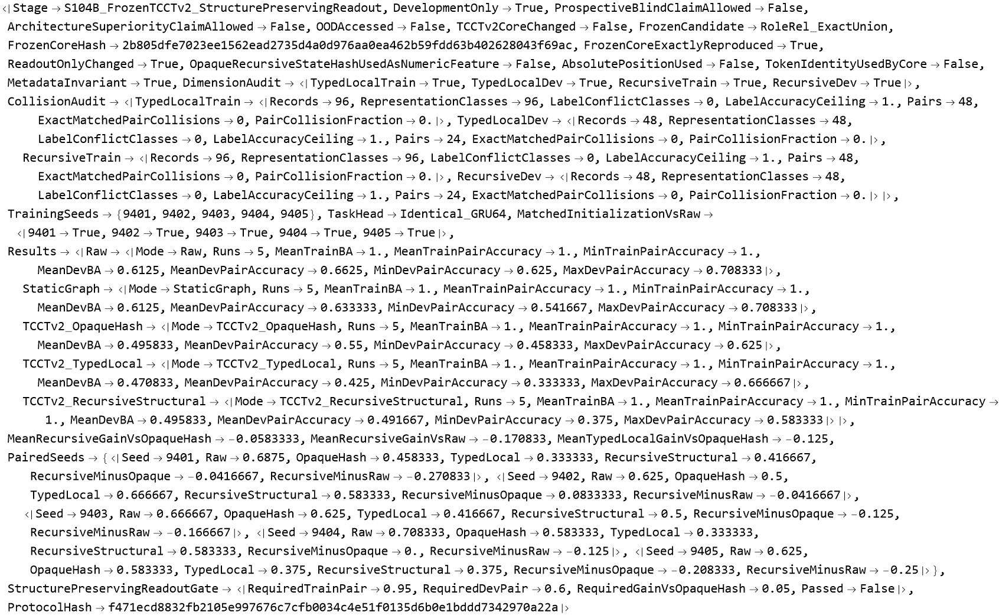

In [2813]:
s104BResult

In [2818]:
Dataset[
  {
    summaryS104B["Raw"],
    summaryS104B["StaticGraph"],
    summaryS104B["TCCTv2_OpaqueHash"],
    summaryS104B["TCCTv2_TypedLocal"],
    summaryS104B["TCCTv2_RecursiveStructural"]
  }
]

Dataset[{<|Mode -> Raw, Runs -> 5, MeanTrainBA -> 1., MeanTrainPairAccuracy -> 1., 
 
>     MinTrainPairAccuracy -> 1., MeanDevBA -> 0.6125, MeanDevPairAccuracy -> 0.6625, 
 
>     MinDevPairAccuracy -> 0.625, MaxDevPairAccuracy -> 0.708333|>, 
 
>    <|Mode -> StaticGraph, Runs -> 5, MeanTrainBA -> 1., MeanTrainPairAccuracy -> 1., 
 
>     MinTrainPairAccuracy -> 1., MeanDevBA -> 0.6125, MeanDevPairAccuracy -> 0.633333, 
 
>     MinDevPairAccuracy -> 0.541667, MaxDevPairAccuracy -> 0.708333|>, 
 
>    <|Mode -> TCCTv2_OpaqueHash, Runs -> 5, MeanTrainBA -> 1., 
 
>     MeanTrainPairAccuracy -> 1., MinTrainPairAccuracy -> 1., MeanDevBA -> 0.495833, 
 
>     MeanDevPairAccuracy -> 0.55, MinDevPairAccuracy -> 0.458333, 
 
>     MaxDevPairAccuracy -> 0.625|>, 
 
>    <|Mode -> TCCTv2_TypedLocal, Runs -> 5, MeanTrainBA -> 1., 
 
>     MeanTrainPairAccuracy -> 1., MinTrainPairAccuracy -> 1., MeanDevBA -> 0.470833, 
 
>     MeanDevPairAccuracy -> 0.425, MinDevPairAccuracy -> 0.333333, 
 
>     MaxDevPairAccuracy -> 0.666667|>, 
 
>    <|Mode -> TCCTv2_RecursiveStructural, Runs -> 5, MeanTrainBA -> 1., 
 
>     MeanTrainPairAccuracy -> 1., MinTrainPairAccuracy -> 1., MeanDevBA -> 0.495833, 
 
>     MeanDevPairAccuracy -> 0.491667, MinDevPairAccuracy -> 0.375, 
 
>     MaxDevPairAccuracy -> 0.583333|>}, 
 
>   TypeSystem`Vector[TypeSystem`Struct[{Mode, Runs, MeanTrainBA, MeanTrainPairAccuracy, 
 
>      MinTrainPairAccuracy, MeanDevBA, MeanDevPairAccuracy, MinDevPairAccuracy, 
 
>      MaxDevPairAccuracy}, {TypeSystem`Atom[String], TypeSystem`Atom[Integer], 
 
>      TypeSystem`Atom[Real], TypeSystem`Atom[Real], TypeSystem`Atom[Real], 
 
>      TypeSystem`Atom[Real], TypeSystem`Atom[Real], TypeSystem`Atom[Real], 
 
>      TypeSystem`Atom[Real]}], 5], <||>]

In [2823]:
Dataset[
  pairedS104B
]

Dataset[{<|Seed -> 9401, Raw -> 0.6875, OpaqueHash -> 0.458333, TypedLocal -> 0.333333, 
 
>     RecursiveStructural -> 0.416667, RecursiveMinusOpaque -> -0.0416667, 
 
>     RecursiveMinusRaw -> -0.270833|>, 
 
>    <|Seed -> 9402, Raw -> 0.625, OpaqueHash -> 0.5, TypedLocal -> 0.666667, 
 
>     RecursiveStructural -> 0.583333, RecursiveMinusOpaque -> 0.0833333, 
 
>     RecursiveMinusRaw -> -0.0416667|>, 
 
>    <|Seed -> 9403, Raw -> 0.666667, OpaqueHash -> 0.625, TypedLocal -> 0.416667, 
 
>     RecursiveStructural -> 0.5, RecursiveMinusOpaque -> -0.125, 
 
>     RecursiveMinusRaw -> -0.166667|>, 
 
>    <|Seed -> 9404, Raw -> 0.708333, OpaqueHash -> 0.583333, TypedLocal -> 0.333333, 
 
>     RecursiveStructural -> 0.583333, RecursiveMinusOpaque -> 0., 
 
>     RecursiveMinusRaw -> -0.125|>, 
 
>    <|Seed -> 9405, Raw -> 0.625, OpaqueHash -> 0.583333, TypedLocal -> 0.375, 
 
>     RecursiveStructural -> 0.375, RecursiveMinusOpaque -> -0.208333, 
 
>     RecursiveMinusRaw -> -0.25|>}, 
 
>   TypeSystem`Vector[TypeSystem`Struct[{Seed, Raw, OpaqueHash, TypedLocal, 
 
>      RecursiveStructural, RecursiveMinusOpaque, RecursiveMinusRaw}, 
 
>     {TypeSystem`Atom[Integer], TypeSystem`Atom[Real], TypeSystem`Atom[Real], 
 
>      TypeSystem`Atom[Real], TypeSystem`Atom[Real], TypeSystem`Atom[Real], 
 
>      TypeSystem`Atom[Real]}], 5], <||>]

In [2828]:
(* ============================================================ *)
(* S105A                                                        *)
(* Frozen TCCT-v2 State Reuse / Compositionality Audit          *)
(*                                                              *)
(* NO TRAINING                                                  *)
(* TRAIN + IID DEV ONLY                                         *)
(* NO OOD                                                       *)
(* NO LABEL USED IN STATE-REUSE GROUPING                        *)
(* NO reference executor                                        *)
(* NO S3 product                                                *)
(* TCCT-v2 CORE FROZEN                                          *)
(*                                                              *)
(* Main tests:                                                  *)
(* 1. global internal-state reuse                               *)
(* 2. Train -> Dev state coverage                               *)
(* 3. role-wise state reuse                                     *)
(* 4. same-prefix / different-continuation state reuse          *)
(* 5. Train-prefix -> Dev-prefix state reuse                    *)
(* ============================================================ *)

ClearAll["Global`S105A*"];
ClearAll["Global`s105A*"];


s105AResult =
Catch[

(

(* ============================================================ *)
(* 0. FAIL SAFE                                                 *)
(* ============================================================ *)

S105AFail[msg_] := (
  Print["STOP: ", msg];
  Throw[$Failed, "S105A_STOP"];
);


Print["================================================"];
Print["S105A STATE REUSE / COMPOSITIONALITY AUDIT"];
Print["================================================"];


(* ============================================================ *)
(* 1. PREFLIGHT                                                 *)
(* ============================================================ *)

If[
  !ValueQ[freezeCertificateS103C],
  S105AFail["freezeCertificateS103C missing."]
];

If[
  freezeCertificateS103C["Status"] =!=
    "FROZEN_FOR_BASELINE_DEVELOPMENT",

  S105AFail["TCCT-v2 core is not frozen."]
];

If[
  freezeCertificateS103C["Candidate"] =!=
    "RoleRel_ExactUnion",

  S105AFail["Frozen candidate is not RoleRel_ExactUnion."]
];

If[
  !And[
    ValueQ[trainRecords],
    ValueQ[iidRecords]
  ],

  S105AFail["trainRecords / iidRecords missing."]
];

If[
  Length[DownValues[S103BNodeInfo]] == 0 ||
  Length[DownValues[S103BNodeDescriptor]] == 0 ||
  Length[DownValues[S103BMessageDescriptor]] == 0 ||
  Length[DownValues[S103BAggregateMessages]] == 0 ||
  Length[DownValues[S103BStateID]] == 0 ||
  Length[DownValues[S103BRun]] == 0,

  S105AFail["Frozen S103B definitions missing."]
];


candidateS105A =
  "RoleRel_ExactUnion";


frozenCoreHashS105A =
  freezeCertificateS103C[
    "CandidateProtocolHash"
  ];


Print["Preflight = PASS"];
Print["Frozen candidate = ", candidateS105A];
Print["Frozen core hash = ", frozenCoreHashS105A];
Print["Train records = ", Length[trainRecords]];
Print["IID Dev records = ", Length[iidRecords]];
Print["NO OOD WILL BE ACCESSED."];


(* ============================================================ *)
(* 2. FULL NODE-LEVEL FROZEN TRACE                              *)
(*                                                              *)
(* Reproduces EXACT S103B transition.                           *)
(*                                                              *)
(* Diagnostic-only fields:                                     *)
(*   Role                                                       *)
(*   Position                                                   *)
(*   Token                                                      *)
(*   State                                                      *)
(*                                                              *)
(* Position/Token are NOT fed into the core.                    *)
(* They are only used afterwards to locate landmarks.           *)
(* ============================================================ *)

S105ATrace[
  r_Association
] :=
Module[
  {
    builtInfo,
    ctx,
    info,

    p,
    pa,
    q,
    n,
    vertices,

    active,
    state,

    nextActive,
    nextState,

    activeParents,

    srcNode,
    dstNode,
    srcInfo,
    dstInfo,

    messages,
    aggregate,
    newState,

    trajectory = {},
    nodeSnapshots = {},

    roundState,
    roundNodes,

    terminatedNaturally = False,

    historical,
    reproduced,

    safetyCap,

    j,
    u,
    k
  },


  builtInfo =
    S103BNodeInfo[r];

  ctx =
    builtInfo["Context"];

  info =
    builtInfo["Info"];


  p =
    ctx["Pack"];

  pa =
    p[[1]];

  q =
    p[[4]];

  n =
    p[[7]];

  vertices =
    p[[12]];


  safetyCap =
    Max[
      64,
      2 n + 8
    ];


  active =
    ConstantArray[
      False,
      n
    ];

  state =
    ConstantArray[
      None,
      n
    ];


  active[[q]] =
    True;


  state[[q]] =
    Hash[
      {
        "InitialQuery",

        S103BNodeDescriptor[
          info[
            vertices[[q]]
          ],
          candidateS105A
        ]
      },

      "SHA256",
      "HexString"
    ];


  For[
    k = 1,
    k <= safetyCap,
    k++,


    nextActive =
      ConstantArray[
        False,
        n
      ];

    nextState =
      ConstantArray[
        None,
        n
      ];


    Do[

      activeParents =
        Select[
          pa[[j]],

          Function[
            u,

            IntegerQ[u] &&
            u > 0 &&
            TrueQ[
              active[[u]]
            ]
          ]
        ];


      If[
        activeParents =!= {},


        dstNode =
          vertices[[j]];

        dstInfo =
          info[dstNode];


        messages =
          Table[

            srcNode =
              vertices[[u]];

            srcInfo =
              info[srcNode];


            S103BMessageDescriptor[
              srcInfo,
              dstInfo,
              state[[u]],
              candidateS105A
            ],

            {
              u,
              activeParents
            }
          ];


        aggregate =
          S103BAggregateMessages[
            messages,
            candidateS105A
          ];


        newState =
          S103BStateID[
            S103BNodeDescriptor[
              dstInfo,
              candidateS105A
            ],
            aggregate
          ];


        nextActive[[j]] =
          True;

        nextState[[j]] =
          newState;

      ],

      {
        j,
        n
      }
    ];


    (* -------------------------------------------------------- *)
    (* Exact representation required to reproduce S103B         *)
    (* -------------------------------------------------------- *)

    roundState =
      Sort[
        Table[

          If[
            TrueQ[
              nextActive[[j]]
            ],

            {
              S103BNodeDescriptor[
                info[
                  vertices[[j]]
                ],
                candidateS105A
              ],

              nextState[[j]]
            },

            Nothing
          ],

          {
            j,
            n
          }
        ]
      ];


    AppendTo[
      trajectory,

      {
        "Round",
        k,
        "ActiveStateMultiset",
        roundState
      }
    ];


    (* -------------------------------------------------------- *)
    (* Diagnostic landmark states                               *)
    (* -------------------------------------------------------- *)

    roundNodes =
      Table[

        If[
          TrueQ[
            nextActive[[j]]
          ],

          <|

            "Round" ->
              k,

            "PackedIndex" ->
              j,

            "Role" ->
              info[
                vertices[[j]]
              ]["Role"],

            "Position" ->
              info[
                vertices[[j]]
              ]["Position"],

            "Token" ->
              info[
                vertices[[j]]
              ]["Token"],

            "CodePair" ->
              info[
                vertices[[j]]
              ]["CodePair"],

            "State" ->
              nextState[[j]]

          |>,

          Nothing
        ],

        {
          j,
          n
        }
      ];


    AppendTo[
      nodeSnapshots,

      <|
        "Round" -> k,
        "Nodes" -> roundNodes
      |>
    ];


    If[
      Count[
        nextActive,
        True
      ] == 0,

      terminatedNaturally =
        True;

      Break[];
    ];


    active =
      nextActive;

    state =
      nextState;

  ];


  reproduced =
    <|

      "Variant" ->
        candidateS105A,

      "RoundsExecuted" ->
        Length[
          trajectory
        ],

      "TerminatedNaturally" ->
        terminatedNaturally,

      "Trajectory" ->
        trajectory

    |>;


  historical =
    S103BRun[
      r,
      candidateS105A
    ];


  <|

    "FrozenCoreExactMatch" ->
      SameQ[
        historical,
        reproduced
      ],

    "FrozenRepresentation" ->
      reproduced,

    "NodeSnapshots" ->
      nodeSnapshots

  |>
];


(* ============================================================ *)
(* 3. COMPUTE TRAIN + IID TRACES                                *)
(* ============================================================ *)

allRecordsS105A =
  Join[
    trainRecords,
    iidRecords
  ];


splitLabelsS105A =
  Join[
    ConstantArray[
      "Train",
      Length[trainRecords]
    ],

    ConstantArray[
      "Dev",
      Length[iidRecords]
    ]
  ];


Print[
  "Computing frozen node-level trajectories..."
];


allTracesS105A =
  S105ATrace /@
    allRecordsS105A;


coreExactMatchS105A =
  And @@
    Lookup[
      allTracesS105A,
      "FrozenCoreExactMatch"
    ];


Print[
  "Node-level observer exactly reproduces frozen core = ",
  coreExactMatchS105A
];


If[
  !TrueQ[
    coreExactMatchS105A
  ],

  S105AFail[
    "Diagnostic observer changed the frozen core."
  ]
];


(* ============================================================ *)
(* 4. LANDMARK HISTORY                                         *)
(* ============================================================ *)

S105ALandmarkHistory[
  tr_Association,
  role_String,
  pos_Integer
] :=
Module[
  {
    nodes
  },


  nodes =
    Flatten[
      Lookup[
        tr["NodeSnapshots"],
        "Nodes"
      ],
      1
    ];


  SortBy[
    Cases[

      nodes,

      a_Association /;
        And[
          a["Role"] === role,
          a["Position"] === pos
        ]
    ],

    #["Round"] &
  ]
];


S105AHistorySummary[
  hist_List
] :=
  If[
    hist === {},

    <|

      "Reached" ->
        False,

      "FirstRound" ->
        Missing["NotReached"],

      "FirstState" ->
        Missing["NotReached"],

      "LastRound" ->
        Missing["NotReached"],

      "LastState" ->
        Missing["NotReached"],

      "StateHistory" ->
        {}

    |>,

    <|

      "Reached" ->
        True,

      "FirstRound" ->
        First[hist]["Round"],

      "FirstState" ->
        First[hist]["State"],

      "LastRound" ->
        Last[hist]["Round"],

      "LastState" ->
        Last[hist]["State"],

      "StateHistory" ->
        Lookup[
          hist,
          "State"
        ]

    |>
  ];


(* ============================================================ *)
(* 5. PREFIX-LANDMARK TABLE                                     *)
(*                                                              *)
(* Prefix is used ONLY to group inputs for diagnostic purposes. *)
(* No Y.                                                        *)
(* No task answer.                                              *)
(* ============================================================ *)

S105ASeqKey[seq_] :=
  ToString[
    InputForm[
      seq
    ]
  ];


S105APrefixKey[
  seq_,
  k_Integer
] :=
  ToString[
    InputForm[
      Take[
        seq,
        k
      ]
    ]
  ];


Print[
  "Building prefix / landmark table..."
];


landmarkRowsS105A =
  Flatten[
    Table[

      Module[
        {
          r,
          tr,
          seq,
          center,
          exit
        },


        r =
          allRecordsS105A[[i]];

        tr =
          allTracesS105A[[i]];

        seq =
          r["Seq"];


        Table[

          center =
            S105AHistorySummary[
              S105ALandmarkHistory[
                tr,
                "TokenCenter",
                k
              ]
            ];


          exit =
            S105AHistorySummary[
              S105ALandmarkHistory[
                tr,
                "TokenExit",
                k
              ]
            ];


          <|

            "RecordIndex" ->
              i,

            "Split" ->
              splitLabelsS105A[[i]],

            "PairID" ->
              r["PairID"],

            "Depth" ->
              r["Depth"],

            "SeqKey" ->
              S105ASeqKey[
                seq
              ],

            "PrefixLength" ->
              k,

            "PrefixKey" ->
              S105APrefixKey[
                seq,
                k
              ],

            "PrefixGroupKey" ->
              StringJoin[
                ToString[k],
                "::",
                S105APrefixKey[
                  seq,
                  k
                ]
              ],

            "CenterReached" ->
              center["Reached"],

            "CenterFirstState" ->
              center["FirstState"],

            "CenterLastState" ->
              center["LastState"],

            "CenterStateHistory" ->
              center["StateHistory"],

            "ExitReached" ->
              exit["Reached"],

            "ExitFirstState" ->
              exit["FirstState"],

            "ExitLastState" ->
              exit["LastState"],

            "ExitStateHistory" ->
              exit["StateHistory"]

          |>,

          {
            k,
            Length[seq]
          }
        ]

      ],

      {
        i,
        Length[
          allRecordsS105A
        ]
      }
    ],

    1
  ];


(* ============================================================ *)
(* 6. EXACT PAIR AGREEMENT HELPER                               *)
(* ============================================================ *)

S105AEqualPairCount[
  vals_List
] :=
  Count[
    Subsets[
      vals,
      {2}
    ],

    p_ /;
      SameQ @@ p
  ];


S105AReusablePrefixStats[
  rows_List,
  field_String
] :=
Module[
  {
    groups,
    continuationGroups,
    validGroups,

    pairCount,
    equalPairCount,
    exactGroupCount
  },


  groups =
    Values@
      GroupBy[
        rows,
        #["PrefixGroupKey"] &
      ];


  (* same prefix, but at least two distinct full programs *)

  continuationGroups =
    Select[
      groups,

      Length[
        DeleteDuplicates[
          Lookup[
            #,
            "SeqKey"
          ]
        ]
      ] >= 2 &
    ];


  validGroups =
    Table[

      Module[
        {
          v
        },

        v =
          Select[
            g,

            !MissingQ[
              Lookup[
                #,
                field
              ]
            ] &
          ];


        If[
          Length[v] >= 2,
          v,
          Nothing
        ]

      ],

      {
        g,
        continuationGroups
      }
    ];


  pairCount =
    Total[
      Binomial[
        Length[#],
        2
      ] & /@
        validGroups
    ];


  equalPairCount =
    Total[
      S105AEqualPairCount[
        Lookup[
          #,
          field
        ]
      ] & /@
        validGroups
    ];


  exactGroupCount =
    Count[
      validGroups,

      g_ /;
        SameQ @@
          Lookup[
            g,
            field
          ]
    ];


  <|

    "ContinuationDiverseGroups" ->
      Length[
        continuationGroups
      ],

    "EligibleGroups" ->
      Length[
        validGroups
      ],

    "PairComparisons" ->
      pairCount,

    "EqualStatePairs" ->
      equalPairCount,

    "PairAgreementFraction" ->
      If[
        pairCount == 0,
        Missing["NoPairs"],
        N[
          equalPairCount /
          pairCount
        ]
      ],

    "ExactlyConsistentGroups" ->
      exactGroupCount,

    "ExactGroupConsistencyFraction" ->
      If[
        validGroups === {},
        Missing["NoGroups"],
        N[
          exactGroupCount /
          Length[validGroups]
        ]
      ]

  |>
];


(* ============================================================ *)
(* 7. SAME-PREFIX REUSE BY PREFIX LENGTH                        *)
(* ============================================================ *)

maxDepthS105A =
  Max[
    Length /@
      Lookup[
        allRecordsS105A,
        "Seq"
      ]
  ];


prefixReuseSummaryS105A =
  Table[

    Module[
      {
        rows,
        centerFirst,
        exitFirst,
        exitLast,
        exitHistory,
        reached
      },


      rows =
        Cases[
          landmarkRowsS105A,

          a_Association /;
            a["PrefixLength"] === k
        ];


      centerFirst =
        S105AReusablePrefixStats[
          rows,
          "CenterFirstState"
        ];


      exitFirst =
        S105AReusablePrefixStats[
          rows,
          "ExitFirstState"
        ];


      exitLast =
        S105AReusablePrefixStats[
          rows,
          "ExitLastState"
        ];


      exitHistory =
        S105AReusablePrefixStats[
          rows,
          "ExitStateHistory"
        ];


      reached =
        If[
          rows === {},
          Missing["NoRows"],
          N[
            Mean[
              Boole[
                TrueQ[
                  #["ExitReached"]
                ]
              ] & /@
                rows
            ]
          ]
        ];


      <|

        "PrefixLength" ->
          k,

        "RecordsAtLength" ->
          Length[
            rows
          ],

        "ExitReachedFraction" ->
          reached,

        "SharedContinuationGroups" ->
          exitFirst[
            "ContinuationDiverseGroups"
          ],

        "EligiblePrefixGroups" ->
          exitFirst[
            "EligibleGroups"
          ],

        "ExitFirstPairComparisons" ->
          exitFirst[
            "PairComparisons"
          ],

        "CenterFirstPairAgreement" ->
          centerFirst[
            "PairAgreementFraction"
          ],

        "ExitFirstPairAgreement" ->
          exitFirst[
            "PairAgreementFraction"
          ],

        "ExitLastPairAgreement" ->
          exitLast[
            "PairAgreementFraction"
          ],

        "ExitFullHistoryAgreement" ->
          exitHistory[
            "PairAgreementFraction"
          ],

        "ExitFirstExactGroupConsistency" ->
          exitFirst[
            "ExactGroupConsistencyFraction"
          ]

      |>

    ],

    {
      k,
      1,
      maxDepthS105A
    }
  ];


(* ============================================================ *)
(* 8. TRAIN -> DEV SAME-PREFIX STATE REUSE                      *)
(*                                                              *)
(* Genuine continuation transfer only:                          *)
(* identical full Seq is excluded.                              *)
(* ============================================================ *)

S105ACrossSplitPrefixStats[
  k_Integer,
  field_String
] :=
Module[
  {
    trainRows,
    devRows,
    eligible,
    hits
  },


  trainRows =
    Cases[
      landmarkRowsS105A,

      a_Association /;
        And[
          a["Split"] === "Train",
          a["PrefixLength"] === k
        ]
    ];


  devRows =
    Cases[
      landmarkRowsS105A,

      a_Association /;
        And[
          a["Split"] === "Dev",
          a["PrefixLength"] === k
        ]
    ];


  eligible =
    Table[

      Module[
        {
          matches,
          trainStates,
          devState
        },


        devState =
          d[field];


        If[
          MissingQ[
            devState
          ],

          Nothing,

          matches =
            Cases[
              trainRows,

              a_Association /;
                And[
                  a["PrefixKey"] ===
                    d["PrefixKey"],

                  a["SeqKey"] =!=
                    d["SeqKey"]
                ]
            ];


          trainStates =
            DeleteCases[
              Lookup[
                matches,
                field
              ],
              _Missing
            ];


          If[
            trainStates === {},

            Nothing,

            <|

              "DevRecordIndex" ->
                d["RecordIndex"],

              "PrefixKey" ->
                d["PrefixKey"],

              "SeenInTrain" ->
                MemberQ[
                  trainStates,
                  devState
                ]

            |>
          ]
        ]

      ],

      {
        d,
        devRows
      }
    ];


  hits =
    Count[
      Lookup[
        eligible,
        "SeenInTrain"
      ],
      True
    ];


  <|

    "EligibleDevLandmarks" ->
      Length[
        eligible
      ],

    "SeenInTrain" ->
      hits,

    "SeenInTrainFraction" ->
      If[
        eligible === {},
        Missing["NoEligibleDevPrefixes"],
        N[
          hits /
          Length[eligible]
        ]
      ]

  |>
];


crossSplitPrefixSummaryS105A =
  Table[

    Module[
      {
        first,
        last,
        history
      },


      first =
        S105ACrossSplitPrefixStats[
          k,
          "ExitFirstState"
        ];


      last =
        S105ACrossSplitPrefixStats[
          k,
          "ExitLastState"
        ];


      history =
        S105ACrossSplitPrefixStats[
          k,
          "ExitStateHistory"
        ];


      <|

        "PrefixLength" ->
          k,

        "EligibleDevPrefixes" ->
          first[
            "EligibleDevLandmarks"
          ],

        "DevExitFirstSeenInTrainFraction" ->
          first[
            "SeenInTrainFraction"
          ],

        "DevExitLastSeenInTrainFraction" ->
          last[
            "SeenInTrainFraction"
          ],

        "DevExitHistorySeenInTrainFraction" ->
          history[
            "SeenInTrainFraction"
          ]

      |>

    ],

    {
      k,
      1,
      maxDepthS105A
    }
  ];


(* ============================================================ *)
(* 9. GLOBAL STATE EVENT TABLE                                  *)
(* ============================================================ *)

Print[
  "Building global internal-state vocabulary..."
];


stateEventRowsS105A =
  Flatten[
    Table[

      Module[
        {
          nodes
        },


        nodes =
          Flatten[
            Lookup[
              allTracesS105A[[i]][
                "NodeSnapshots"
              ],
              "Nodes"
            ],
            1
          ];


        (
          Join[
            #,

            <|

              "RecordIndex" ->
                i,

              "Split" ->
                splitLabelsS105A[[i]],

              "PairID" ->
                allRecordsS105A[[i]][
                  "PairID"
                ],

              "Depth" ->
                allRecordsS105A[[i]][
                  "Depth"
                ]

            |>
          ] &
        ) /@
          nodes

      ],

      {
        i,
        Length[
          allRecordsS105A
        ]
      }
    ],

    1
  ];


trainStateRowsS105A =
  Cases[
    stateEventRowsS105A,

    a_Association /;
      a["Split"] === "Train"
  ];


devStateRowsS105A =
  Cases[
    stateEventRowsS105A,

    a_Association /;
      a["Split"] === "Dev"
  ];


trainStatesS105A =
  Lookup[
    trainStateRowsS105A,
    "State"
  ];


devStatesS105A =
  Lookup[
    devStateRowsS105A,
    "State"
  ];


trainUniqueStatesS105A =
  DeleteDuplicates[
    trainStatesS105A
  ];


devUniqueStatesS105A =
  DeleteDuplicates[
    devStatesS105A
  ];


trainStateSetS105A =
  AssociationThread[
    trainUniqueStatesS105A,
    ConstantArray[
      True,
      Length[
        trainUniqueStatesS105A
      ]
    ]
  ];


(* ============================================================ *)
(* 10. TRAIN INTERNAL STATE REUSE ACROSS RECORDS                *)
(* ============================================================ *)

trainStateToRecordsS105A =
  GroupBy[
    trainStateRowsS105A,

    #["State"] &,

    Function[
      g,
      DeleteDuplicates[
        Lookup[
          g,
          "RecordIndex"
        ]
      ]
    ]
  ];


reusableTrainStatesS105A =
  Keys[
    Select[
      trainStateToRecordsS105A,
      Length[#] >= 2 &
    ]
  ];


reusableTrainStateSetS105A =
  AssociationThread[
    reusableTrainStatesS105A,
    ConstantArray[
      True,
      Length[
        reusableTrainStatesS105A
      ]
    ]
  ];


singletonTrainStatesS105A =
  Count[
    Values[
      trainStateToRecordsS105A
    ],

    x_ /;
      Length[x] == 1
  ];


stateVocabularySummaryS105A =
  <|

    "TrainStateEvents" ->
      Length[
        trainStatesS105A
      ],

    "TrainUniqueStates" ->
      Length[
        trainUniqueStatesS105A
      ],

    "TrainStatesUsedInMultipleRecords" ->
      Length[
        reusableTrainStatesS105A
      ],

    "TrainUniqueStateReuseFraction" ->
      If[
        trainUniqueStatesS105A === {},
        Missing["NoTrainStates"],
        N[
          Length[
            reusableTrainStatesS105A
          ] /
          Length[
            trainUniqueStatesS105A
          ]
        ]
      ],

    "TrainSingletonUniqueStateFraction" ->
      If[
        trainUniqueStatesS105A === {},
        Missing["NoTrainStates"],
        N[
          singletonTrainStatesS105A /
          Length[
            trainUniqueStatesS105A
          ]
        ]
      ],

    "TrainStateEventFractionFromReusableStates" ->
      If[
        trainStatesS105A === {},
        Missing["NoTrainEvents"],
        N[
          Mean[
            Boole[
              KeyExistsQ[
                reusableTrainStateSetS105A,
                #
              ]
            ] &
            /@
            trainStatesS105A
          ]
        ]
      ],

    "DevStateEvents" ->
      Length[
        devStatesS105A
      ],

    "DevUniqueStates" ->
      Length[
        devUniqueStatesS105A
      ],

    "DevUniqueStateCoverageByTrain" ->
      If[
        devUniqueStatesS105A === {},
        Missing["NoDevStates"],
        N[
          Count[
            devUniqueStatesS105A,

            x_ /;
              KeyExistsQ[
                trainStateSetS105A,
                x
              ]
          ] /
          Length[
            devUniqueStatesS105A
          ]
        ]
      ],

    "DevStateEventCoverageByTrain" ->
      If[
        devStatesS105A === {},
        Missing["NoDevEvents"],
        N[
          Mean[
            Boole[
              KeyExistsQ[
                trainStateSetS105A,
                #
              ]
            ] &
            /@
            devStatesS105A
          ]
        ]
      ]

  |>;


(* ============================================================ *)
(* 11. ROLE-WISE TRAIN -> DEV STATE COVERAGE                    *)
(* ============================================================ *)

rolesObservedS105A =
  Sort[
    DeleteDuplicates[
      Lookup[
        stateEventRowsS105A,
        "Role"
      ]
    ]
  ];


roleCoverageS105A =
  Table[

    Module[
      {
        tr,
        dv,
        trStates,
        dvStates,
        trUnique,
        dvUnique,
        trSet
      },


      tr =
        Cases[
          trainStateRowsS105A,

          a_Association /;
            a["Role"] === role
        ];


      dv =
        Cases[
          devStateRowsS105A,

          a_Association /;
            a["Role"] === role
        ];


      trStates =
        Lookup[
          tr,
          "State"
        ];


      dvStates =
        Lookup[
          dv,
          "State"
        ];


      trUnique =
        DeleteDuplicates[
          trStates
        ];


      dvUnique =
        DeleteDuplicates[
          dvStates
        ];


      trSet =
        AssociationThread[
          trUnique,
          ConstantArray[
            True,
            Length[
              trUnique
            ]
          ]
        ];


      <|

        "Role" ->
          role,

        "TrainEvents" ->
          Length[
            trStates
          ],

        "TrainUniqueStates" ->
          Length[
            trUnique
          ],

        "DevEvents" ->
          Length[
            dvStates
          ],

        "DevUniqueStates" ->
          Length[
            dvUnique
          ],

        "DevUniqueCoverageByTrain" ->
          If[
            dvUnique === {},
            Missing["NoDevStates"],
            N[
              Count[
                dvUnique,

                x_ /;
                  KeyExistsQ[
                    trSet,
                    x
                  ]
              ] /
              Length[
                dvUnique
              ]
            ]
          ],

        "DevEventCoverageByTrain" ->
          If[
            dvStates === {},
            Missing["NoDevEvents"],
            N[
              Mean[
                Boole[
                  KeyExistsQ[
                    trSet,
                    #
                  ]
                ] &
                /@
                dvStates
              ]
            ]
          ]

      |>

    ],

    {
      role,
      rolesObservedS105A
    }
  ];


(* ============================================================ *)
(* 12. COMPACT DIAGNOSTIC                                       *)
(* ============================================================ *)

validPrefixAgreementS105A =
  DeleteMissing[
    Lookup[
      prefixReuseSummaryS105A,
      "ExitFirstPairAgreement"
    ]
  ];


validCrossSplitReuseS105A =
  DeleteMissing[
    Lookup[
      crossSplitPrefixSummaryS105A,
      "DevExitFirstSeenInTrainFraction"
    ]
  ];


compactDiagnosisS105A =
  <|

    "MeanSamePrefixExitFirstAgreement" ->
      If[
        validPrefixAgreementS105A === {},
        Missing["NoSharedPrefixes"],
        N[
          Mean[
            validPrefixAgreementS105A
          ]
        ]
      ],

    "MeanTrainToDevPrefixStateReuse" ->
      If[
        validCrossSplitReuseS105A === {},
        Missing["NoSharedTrainDevPrefixes"],
        N[
          Mean[
            validCrossSplitReuseS105A
          ]
        ]
      ],

    "TrainUniqueStateReuseFraction" ->
      stateVocabularySummaryS105A[
        "TrainUniqueStateReuseFraction"
      ],

    "TrainSingletonUniqueStateFraction" ->
      stateVocabularySummaryS105A[
        "TrainSingletonUniqueStateFraction"
      ],

    "DevUniqueStateCoverageByTrain" ->
      stateVocabularySummaryS105A[
        "DevUniqueStateCoverageByTrain"
      ],

    "DevStateEventCoverageByTrain" ->
      stateVocabularySummaryS105A[
        "DevStateEventCoverageByTrain"
      ]

  |>;


(* ============================================================ *)
(* 13. PROTOCOL HASH                                            *)
(* ============================================================ *)

protocolHashS105A =
  Hash[
    {
      frozenCoreHashS105A,
      candidateS105A,

      DownValues[
        S105ATrace
      ],

      DownValues[
        S105ALandmarkHistory
      ],

      DownValues[
        S105AReusablePrefixStats
      ],

      DownValues[
        S105ACrossSplitPrefixStats
      ]
    },

    "SHA256",
    "HexString"
  ];


(* ============================================================ *)
(* 14. FINAL REPORT                                             *)
(* ============================================================ *)

finalS105A =
  <|

    "Stage" ->
      "S105A_FrozenTCCTv2_StateReuseCompositionalityAudit",

    "PostHocDiagnostic" ->
      True,

    "TrainingPerformed" ->
      False,

    "TrainAccessed" ->
      True,

    "IIDDevAccessed" ->
      True,

    "OODAccessed" ->
      False,

    "FrozenCoreChanged" ->
      False,

    "FrozenCandidate" ->
      candidateS105A,

    "FrozenCoreHash" ->
      frozenCoreHashS105A,

    "FrozenCoreExactlyReproduced" ->
      coreExactMatchS105A,

    "ReferenceExecutorUsed" ->
      False,

    "S3ProductComputed" ->
      False,

    "LabelUsedForReuseGrouping" ->
      False,

    "PrefixGroupingUsesRawInputOnly" ->
      True,

    "GlobalStateVocabulary" ->
      stateVocabularySummaryS105A,

    "CompactDiagnosis" ->
      compactDiagnosisS105A,

    "PrefixReuseByLength" ->
      prefixReuseSummaryS105A,

    "TrainToDevPrefixReuseByLength" ->
      crossSplitPrefixSummaryS105A,

    "RoleWiseTrainToDevCoverage" ->
      roleCoverageS105A,

    "ProtocolHash" ->
      protocolHashS105A

  |>;


Print["================================================"];
Print["S105A COMPLETE"];
Print["================================================"];


finalS105A

),

"S105A_STOP"
];

S105A STATE REUSE / COMPOSITIONALITY AUDIT
Preflight = PASS
Frozen candidate = RoleRel_ExactUnion
Frozen core hash = 2b805dfe7023ee1562ead2735d4a0d976aa0ea462b59fdd63b40262804\
 
>    3f69ac
Train records = 96
IID Dev records = 48
NO OOD WILL BE ACCESSED.
Computing frozen node-level trajectories...
Node-level observer exactly reproduces frozen core = True
Building prefix / landmark table...
Building global internal-state vocabulary...
S105A COMPLETE


<|Stage -> S105A_FrozenTCCTv2_StateReuseCompositionalityAudit, 
 
>   PostHocDiagnostic -> True, TrainingPerformed -> False, TrainAccessed -> True, 
 
>   IIDDevAccessed -> True, OODAccessed -> False, FrozenCoreChanged -> False, 
 
>   FrozenCandidate -> RoleRel_ExactUnion, 
 
>   FrozenCoreHash -> 2b805dfe7023ee1562ead2735d4a0d976aa0ea462b59fdd63b402628043f69ac, 
 
>   FrozenCoreExactlyReproduced -> True, ReferenceExecutorUsed -> False, 
 
>   S3ProductComputed -> False, LabelUsedForReuseGrouping -> False, 
 
>   PrefixGroupingUsesRawInputOnly -> True, 
 
>   GlobalStateVocabulary -> 
 
>    <|TrainStateEvents -> 3962, TrainUniqueStates -> 1818, 
 
>     TrainStatesUsedInMultipleRecords -> 397, 
 
>     TrainUniqueStateReuseFraction -> 0.218372, 
 
>     TrainSingletonUniqueStateFraction -> 0.781628, 
 
>     TrainStateEventFractionFromReusableStates -> 0.534326, DevStateEvents -> 1962, 
 
>     DevUniqueStates -> 1030, DevUniqueStateCoverageByTrain -> 0.290291, 
 
>     DevStateEventCoverageByTrain -> 0.444444|>, 
 
>   CompactDiagnosis -> 
 
>    <|MeanSamePrefixExitFirstAgreement -> 0.0652242, 
 
>     MeanTrainToDevPrefixStateReuse -> 0.2875, 
 
>     TrainUniqueStateReuseFraction -> 0.218372, 
 
>     TrainSingletonUniqueStateFraction -> 0.781628, 
 
>     DevUniqueStateCoverageByTrain -> 0.290291, 
 
>     DevStateEventCoverageByTrain -> 0.444444|>, 
 
>   PrefixReuseByLength -> 
 
>    {<|PrefixLength -> 1, RecordsAtLength -> 144, ExitReachedFraction -> 1., 
 
>      SharedContinuationGroups -> 2, EligiblePrefixGroups -> 2, 
 
>      ExitFirstPairComparisons -> 5256, CenterFirstPairAgreement -> 0.165145, 
 
>      ExitFirstPairAgreement -> 0.0840944, ExitLastPairAgreement -> 0.0840944, 
 
>      ExitFullHistoryAgreement -> 0.0840944, ExitFirstExactGroupConsistency -> 0.|>, 
 
>     <|PrefixLength -> 2, RecordsAtLength -> 144, ExitReachedFraction -> 1., 
 
>      SharedContinuationGroups -> 4, EligiblePrefixGroups -> 4, 
 
>      ExitFirstPairComparisons -> 2672, CenterFirstPairAgreement -> 0.165419, 
 
>      ExitFirstPairAgreement -> 0.0965569, ExitLastPairAgreement -> 0.0965569, 
 
>      ExitFullHistoryAgreement -> 0.0965569, ExitFirstExactGroupConsistency -> 0.|>, 
 
>     <|PrefixLength -> 3, RecordsAtLength -> 144, ExitReachedFraction -> 1., 
 
>      SharedContinuationGroups -> 8, EligiblePrefixGroups -> 8, 
 
>      ExitFirstPairComparisons -> 1322, CenterFirstPairAgreement -> 0.195159, 
 
>      ExitFirstPairAgreement -> 0.128593, ExitLastPairAgreement -> 0.128593, 
 
>      ExitFullHistoryAgreement -> 0.128593, ExitFirstExactGroupConsistency -> 0.|>, 
 
>     <|PrefixLength -> 4, RecordsAtLength -> 144, ExitReachedFraction -> 1., 
 
>      SharedContinuationGroups -> 15, EligiblePrefixGroups -> 15, 
 
>      ExitFirstPairComparisons -> 817, CenterFirstPairAgreement -> 0.208078, 
 
>      ExitFirstPairAgreement -> 0.149327, ExitLastPairAgreement -> 0.149327, 
 
>      ExitFullHistoryAgreement -> 0.149327, ExitFirstExactGroupConsistency -> 0.|>, 
 
>     <|PrefixLength -> 5, RecordsAtLength -> 144, ExitReachedFraction -> 1., 
 
>      SharedContinuationGroups -> 22, EligiblePrefixGroups -> 22, 
 
>      ExitFirstPairComparisons -> 554, CenterFirstPairAgreement -> 0.220217, 
 
>      ExitFirstPairAgreement -> 0.066787, ExitLastPairAgreement -> 0.066787, 
 
>      ExitFullHistoryAgreement -> 0.066787, ExitFirstExactGroupConsistency -> 0.|>, 
 
>     <|PrefixLength -> 6, RecordsAtLength -> 144, ExitReachedFraction -> 1., 
 
>      SharedContinuationGroups -> 24, EligiblePrefixGroups -> 24, 
 
>      ExitFirstPairComparisons -> 418, CenterFirstPairAgreement -> 0.0502392, 
 
>      ExitFirstPairAgreement -> 0.0239234, ExitLastPairAgreement -> 0.0239234, 
 
>      ExitFullHistoryAgreement -> 0.0239234, ExitFirstExactGroupConsistency -> 0.|>, 
 
>     <|PrefixLength -> 7, RecordsAtLength -> 96, ExitReachedFraction -> 1., 
 
>      SharedContinuationGroups -> 19, EligiblePrefixGroups -> 19, 
 
>      ExitFirstPairCompa
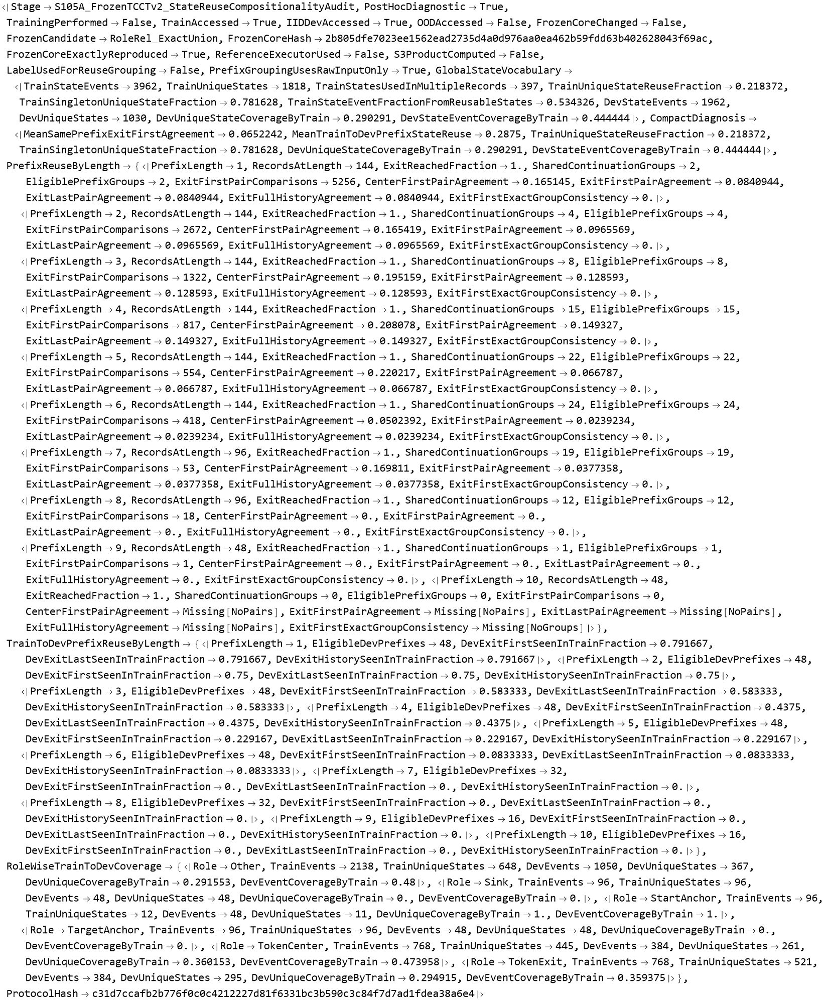

In [2854]:
s105AResult

Dataset[{<|PrefixLength -> 1, RecordsAtLength -> 144, ExitReachedFraction -> 1., 
 
>     SharedContinuationGroups -> 2, EligiblePrefixGroups -> 2, 
 
>     ExitFirstPairComparisons -> 5256, CenterFirstPairAgreement -> 0.165145, 
 
>     ExitFirstPairAgreement -> 0.0840944, ExitLastPairAgreement -> 0.0840944, 
 
>     ExitFullHistoryAgreement -> 0.0840944, ExitFirstExactGroupConsistency -> 0.|>, 
 
>    <|PrefixLength -> 2, RecordsAtLength -> 144, ExitReachedFraction -> 1., 
 
>     SharedContinuationGroups -> 4, EligiblePrefixGroups -> 4, 
 
>     ExitFirstPairComparisons -> 2672, CenterFirstPairAgreement -> 0.165419, 
 
>     ExitFirstPairAgreement -> 0.0965569, ExitLastPairAgreement -> 0.0965569, 
 
>     ExitFullHistoryAgreement -> 0.0965569, ExitFirstExactGroupConsistency -> 0.|>, 
 
>    <|PrefixLength -> 3, RecordsAtLength -> 144, ExitReachedFraction -> 1., 
 
>     SharedContinuationGroups -> 8, EligiblePrefixGroups -> 8, 
 
>     ExitFirstPairComparisons -> 1322, CenterFirstPairAgreement -> 0.195159, 
 
>     ExitFirstPairAgreement -> 0.128593, ExitLastPairAgreement -> 0.128593, 
 
>     ExitFullHistoryAgreement -> 0.128593, ExitFirstExactGroupConsistency -> 0.|>, 
 
>    <|PrefixLength -> 4, RecordsAtLength -> 144, ExitReachedFraction -> 1., 
 
>     SharedContinuationGroups -> 15, EligiblePrefixGroups -> 15, 
 
>     ExitFirstPairComparisons -> 817, CenterFirstPairAgreement -> 0.208078, 
 
>     ExitFirstPairAgreement -> 0.149327, ExitLastPairAgreement -> 0.149327, 
 
>     ExitFullHistoryAgreement -> 0.149327, ExitFirstExactGroupConsistency -> 0.|>, 
 
>    <|PrefixLength -> 5, RecordsAtLength -> 144, ExitReachedFraction -> 1., 
 
>     SharedContinuationGroups -> 22, EligiblePrefixGroups -> 22, 
 
>     ExitFirstPairComparisons -> 554, CenterFirstPairAgreement -> 0.220217, 
 
>     ExitFirstPairAgreement -> 0.066787, ExitLastPairAgreement -> 0.066787, 
 
>     ExitFullHistoryAgreement -> 0.066787, ExitFirstExactGroupConsistency -> 0.|>, 
 
>    <|PrefixLength -> 6, RecordsAtLength -> 144, ExitReachedFraction -> 1., 
 
>     SharedContinuationGroups -> 24, EligiblePrefixGroups -> 24, 
 
>     ExitFirstPairComparisons -> 418, CenterFirstPairAgreement -> 0.0502392, 
 
>     ExitFirstPairAgreement -> 0.0239234, ExitLastPairAgreement -> 0.0239234, 
 
>     ExitFullHistoryAgreement -> 0.0239234, ExitFirstExactGroupConsistency -> 0.|>, 
 
>    <|PrefixLength -> 7, RecordsAtLength -> 96, ExitReachedFraction -> 1., 
 
>     SharedContinuationGroups -> 19, EligiblePrefixGroups -> 19, 
 
>     ExitFirstPairComparisons -> 53, CenterFirstPairAgreement -> 0.169811, 
 
>     ExitFirstPairAgreement -> 0.0377358, ExitLastPairAgreement -> 0.0377358, 
 
>     ExitFullHistoryAgreement -> 0.0377358, ExitFirstExactGroupConsistency -> 0.|>, 
 
>    <|PrefixLength -> 8, RecordsAtLength -> 96, ExitReachedFraction -> 1., 
 
>     SharedContinuationGroups -> 12, EligiblePrefixGroups -> 12, 
 
>     ExitFirstPairComparisons -> 18, CenterFirstPairAgreement -> 0., 
 
>     ExitFirstPairAgreement -> 0., ExitLastPairAgreement -> 0., 
 
>     ExitFullHistoryAgreement -> 0., ExitFirstExactGroupConsistency -> 0.|>, 
 
>    <|PrefixLength -> 9, RecordsAtLength -> 48, ExitReachedFraction -> 1., 
 
>     SharedContinuationGroups -> 1, EligiblePrefixGroups -> 1, 
 
>     ExitFirstPairComparisons -> 1, CenterFirstPairAgreement -> 0., 
 
>     ExitFirstPairAgreement -> 0., ExitLastPairAgreement -> 0., 
 
>     ExitFullHistoryAgreement -> 0., ExitFirstExactGroupConsistency -> 0.|>, 
 
>    <|PrefixLength -> 10, RecordsAtLength -> 48, ExitReachedFraction -> 1., 
 
>     SharedContinuationGroups -> 0, EligiblePrefixGroups -> 0, 
 
>     ExitFirstPairComparisons -> 0, CenterFirstPairAgreement -> Missing[NoPairs], 
 
>     ExitFirstPairAgreement -> Missing[NoPairs], 
 
>     ExitLastPairAgreement -> Missing[NoPairs], 
 
>     ExitFullHistoryAgreement -> Missing[NoPairs], 
 
>     ExitFirstExactGroupConsistency -> Missing[NoGroups]|>}, 
 
>   TypeSystem`Vector
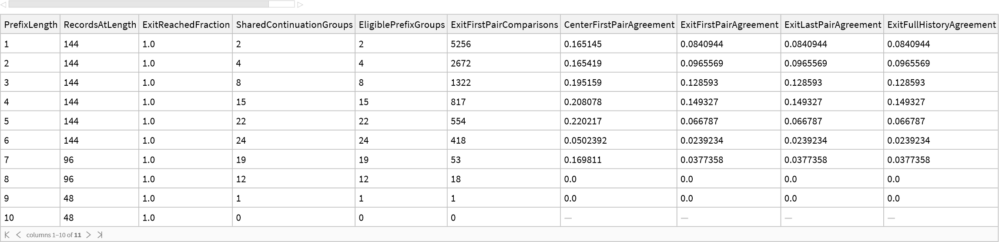

In [2859]:
Dataset[
  prefixReuseSummaryS105A
]

In [2864]:
Dataset[
  crossSplitPrefixSummaryS105A
]

Dataset[{<|PrefixLength -> 1, EligibleDevPrefixes -> 48, 
 
>     DevExitFirstSeenInTrainFraction -> 0.791667, 
 
>     DevExitLastSeenInTrainFraction -> 0.791667, 
 
>     DevExitHistorySeenInTrainFraction -> 0.791667|>, 
 
>    <|PrefixLength -> 2, EligibleDevPrefixes -> 48, 
 
>     DevExitFirstSeenInTrainFraction -> 0.75, DevExitLastSeenInTrainFraction -> 0.75, 
 
>     DevExitHistorySeenInTrainFraction -> 0.75|>, 
 
>    <|PrefixLength -> 3, EligibleDevPrefixes -> 48, 
 
>     DevExitFirstSeenInTrainFraction -> 0.583333, 
 
>     DevExitLastSeenInTrainFraction -> 0.583333, 
 
>     DevExitHistorySeenInTrainFraction -> 0.583333|>, 
 
>    <|PrefixLength -> 4, EligibleDevPrefixes -> 48, 
 
>     DevExitFirstSeenInTrainFraction -> 0.4375, 
 
>     DevExitLastSeenInTrainFraction -> 0.4375, 
 
>     DevExitHistorySeenInTrainFraction -> 0.4375|>, 
 
>    <|PrefixLength -> 5, EligibleDevPrefixes -> 48, 
 
>     DevExitFirstSeenInTrainFraction -> 0.229167, 
 
>     DevExitLastSeenInTrainFraction -> 0.229167, 
 
>     DevExitHistorySeenInTrainFraction -> 0.229167|>, 
 
>    <|PrefixLength -> 6, EligibleDevPrefixes -> 48, 
 
>     DevExitFirstSeenInTrainFraction -> 0.0833333, 
 
>     DevExitLastSeenInTrainFraction -> 0.0833333, 
 
>     DevExitHistorySeenInTrainFraction -> 0.0833333|>, 
 
>    <|PrefixLength -> 7, EligibleDevPrefixes -> 32, 
 
>     DevExitFirstSeenInTrainFraction -> 0., DevExitLastSeenInTrainFraction -> 0., 
 
>     DevExitHistorySeenInTrainFraction -> 0.|>, 
 
>    <|PrefixLength -> 8, EligibleDevPrefixes -> 32, 
 
>     DevExitFirstSeenInTrainFraction -> 0., DevExitLastSeenInTrainFraction -> 0., 
 
>     DevExitHistorySeenInTrainFraction -> 0.|>, 
 
>    <|PrefixLength -> 9, EligibleDevPrefixes -> 16, 
 
>     DevExitFirstSeenInTrainFraction -> 0., DevExitLastSeenInTrainFraction -> 0., 
 
>     DevExitHistorySeenInTrainFraction -> 0.|>, 
 
>    <|PrefixLength -> 10, EligibleDevPrefixes -> 16, 
 
>     DevExitFirstSeenInTrainFraction -> 0., DevExitLastSeenInTrainFraction -> 0., 
 
>     DevExitHistorySeenInTrainFraction -> 0.|>}, 
 
>   TypeSystem`Vector[TypeSystem`Struct[{PrefixLength, EligibleDevPrefixes, 
 
>      DevExitFirstSeenInTrainFraction, DevExitLastSeenInTrainFraction, 
 
>      DevExitHistorySeenInTrainFraction}, 
 
>     {TypeSystem`Atom[Integer], TypeSystem`Atom[Integer], TypeSystem`Atom[Real], 
 
>      TypeSystem`Atom[Real], TypeSystem`Atom[Real]}], 10], <||>]

In [2869]:
Dataset[
  roleCoverageS105A
]

Dataset[{<|Role -> Other, TrainEvents -> 2138, TrainUniqueStates -> 648, 
 
>     DevEvents -> 1050, DevUniqueStates -> 367, DevUniqueCoverageByTrain -> 0.291553, 
 
>     DevEventCoverageByTrain -> 0.48|>, 
 
>    <|Role -> Sink, TrainEvents -> 96, TrainUniqueStates -> 96, DevEvents -> 48, 
 
>     DevUniqueStates -> 48, DevUniqueCoverageByTrain -> 0., 
 
>     DevEventCoverageByTrain -> 0.|>, 
 
>    <|Role -> StartAnchor, TrainEvents -> 96, TrainUniqueStates -> 12, DevEvents -> 48, 
 
>     DevUniqueStates -> 11, DevUniqueCoverageByTrain -> 1., 
 
>     DevEventCoverageByTrain -> 1.|>, 
 
>    <|Role -> TargetAnchor, TrainEvents -> 96, TrainUniqueStates -> 96, 
 
>     DevEvents -> 48, DevUniqueStates -> 48, DevUniqueCoverageByTrain -> 0., 
 
>     DevEventCoverageByTrain -> 0.|>, 
 
>    <|Role -> TokenCenter, TrainEvents -> 768, TrainUniqueStates -> 445, 
 
>     DevEvents -> 384, DevUniqueStates -> 261, DevUniqueCoverageByTrain -> 0.360153, 
 
>     DevEventCoverageByTrain -> 0.473958|>, 
 
>    <|Role -> TokenExit, TrainEvents -> 768, TrainUniqueStates -> 521, 
 
>     DevEvents -> 384, DevUniqueStates -> 295, DevUniqueCoverageByTrain -> 0.294915, 
 
>     DevEventCoverageByTrain -> 0.359375|>}, 
 
>   TypeSystem`Vector[TypeSystem`Struct[{Role, TrainEvents, TrainUniqueStates, 
 
>      DevEvents, DevUniqueStates, DevUniqueCoverageByTrain, DevEventCoverageByTrain}, 
 
>     {TypeSystem`Atom[String], TypeSystem`Atom[Integer], TypeSystem`Atom[Integer], 
 
>      TypeSystem`Atom[Integer], TypeSystem`Atom[Integer], TypeSystem`Atom[Real], 
 
>      TypeSystem`Atom[Real]}], 6], <||>]

In [2874]:
(* ============================================================ *)
(* S105B                                                        *)
(* Frozen TCCT-v2 Divergence-Origin Audit                       *)
(*                                                              *)
(* NO TRAINING                                                  *)
(* TRAIN + IID DEV ONLY                                         *)
(* NO OOD                                                       *)
(* NO Y                                                         *)
(* NO reference executor                                        *)
(* NO S3 product                                                *)
(* FROZEN RoleRel_ExactUnion core                               *)
(*                                                              *)
(* Question:                                                    *)
(* For SAME PREFIX but DIFFERENT SUFFIX, where does the          *)
(* internal TCCT-v2 state first diverge?                         *)
(* ============================================================ *)

ClearAll["Global`S105B*"];
ClearAll["Global`s105B*"];


s105BResult =
Catch[

(

(* ============================================================ *)
(* 0. FAIL SAFE                                                 *)
(* ============================================================ *)

S105BFail[msg_] := (
  Print["STOP: ", msg];
  Throw[$Failed, "S105B_STOP"];
);


Print["================================================"];
Print["S105B DIVERGENCE-ORIGIN AUDIT"];
Print["================================================"];


(* ============================================================ *)
(* 1. PREFLIGHT                                                 *)
(* ============================================================ *)

If[
  !ValueQ[freezeCertificateS103C],
  S105BFail["freezeCertificateS103C missing."]
];

If[
  freezeCertificateS103C["Status"] =!=
    "FROZEN_FOR_BASELINE_DEVELOPMENT",

  S105BFail["TCCT-v2 core is not frozen."]
];

If[
  freezeCertificateS103C["Candidate"] =!=
    "RoleRel_ExactUnion",

  S105BFail[
    "Frozen candidate is not RoleRel_ExactUnion."
  ]
];

If[
  !And[
    ValueQ[trainRecords],
    ValueQ[iidRecords]
  ],

  S105BFail[
    "trainRecords / iidRecords missing."
  ]
];

If[
  Length[DownValues[S103BNodeInfo]] == 0 ||
  Length[DownValues[S103BNodeDescriptor]] == 0 ||
  Length[DownValues[S103BRelation]] == 0 ||
  Length[DownValues[S103BMessageDescriptor]] == 0 ||
  Length[DownValues[S103BAggregateMessages]] == 0 ||
  Length[DownValues[S103BStateID]] == 0 ||
  Length[DownValues[S103BRun]] == 0,

  S105BFail[
    "Frozen S103B definitions missing."
  ]
];


candidateS105B =
  "RoleRel_ExactUnion";


frozenCoreHashS105B =
  freezeCertificateS103C[
    "CandidateProtocolHash"
  ];


allRecordsS105B =
  Join[
    trainRecords,
    iidRecords
  ];


splitLabelsS105B =
  Join[
    ConstantArray[
      "Train",
      Length[trainRecords]
    ],

    ConstantArray[
      "Dev",
      Length[iidRecords]
    ]
  ];


Print["Preflight = PASS"];
Print["Frozen candidate = ", candidateS105B];
Print["Frozen core hash = ", frozenCoreHashS105B];
Print["Records = ", Length[allRecordsS105B]];
Print["OOD WILL NOT BE ACCESSED."];
Print["Y WILL NOT BE USED."];


(* ============================================================ *)
(* 2. FULL TRANSITION-INSTRUMENTED TRACE                        *)
(*                                                              *)
(* Reproduces S103B EXACTLY.                                    *)
(*                                                              *)
(* For every reached node we separately retain:                 *)
(*                                                              *)
(* DestinationDescriptor                                        *)
(* Parent structural signatures                                 *)
(* Source state signatures                                      *)
(* Full ExactUnion aggregate                                    *)
(* NewState                                                     *)
(*                                                              *)
(* None of these diagnostics change the core transition.        *)
(* ============================================================ *)

S105BTrace[
  r_Association
] :=
Module[
  {
    builtInfo,
    ctx,
    info,

    p,
    pa,
    q,
    n,
    vertices,

    active,
    state,

    nextActive,
    nextState,

    activeParents,

    srcNode,
    dstNode,
    srcInfo,
    dstInfo,

    rawEntries,
    uniqueEntries,

    messages,
    aggregate,

    destinationDescriptor,
    newState,

    trajectory = {},
    events = {},

    roundState,

    historical,
    reproduced,

    terminatedNaturally = False,
    safetyCap,

    j,
    u,
    k
  },


  builtInfo =
    S103BNodeInfo[r];

  ctx =
    builtInfo["Context"];

  info =
    builtInfo["Info"];


  p =
    ctx["Pack"];

  pa =
    p[[1]];

  q =
    p[[4]];

  n =
    p[[7]];

  vertices =
    p[[12]];


  safetyCap =
    Max[
      64,
      2 n + 8
    ];


  active =
    ConstantArray[
      False,
      n
    ];

  state =
    ConstantArray[
      None,
      n
    ];


  active[[q]] =
    True;


  state[[q]] =
    Hash[
      {
        "InitialQuery",

        S103BNodeDescriptor[
          info[
            vertices[[q]]
          ],
          candidateS105B
        ]
      },

      "SHA256",
      "HexString"
    ];


  For[
    k = 1,
    k <= safetyCap,
    k++,


    nextActive =
      ConstantArray[
        False,
        n
      ];

    nextState =
      ConstantArray[
        None,
        n
      ];


    Do[

      activeParents =
        Select[
          pa[[j]],

          Function[
            u,

            IntegerQ[u] &&
            u > 0 &&
            TrueQ[
              active[[u]]
            ]
          ]
        ];


      If[
        activeParents =!= {},


        dstNode =
          vertices[[j]];

        dstInfo =
          info[dstNode];


        destinationDescriptor =
          S103BNodeDescriptor[
            dstInfo,
            candidateS105B
          ];


        (* ---------------------------------------------------- *)
        (* Build raw parent messages                            *)
        (* ---------------------------------------------------- *)

        rawEntries =
          Table[

            srcNode =
              vertices[[u]];

            srcInfo =
              info[srcNode];


            <|

              "Message" ->

                S103BMessageDescriptor[
                  srcInfo,
                  dstInfo,
                  state[[u]],
                  candidateS105B
                ],


              (* message structure WITHOUT SourceState *)

              "StructuralSignature" ->

                {
                  "SourceRole",
                  srcInfo["Role"],

                  "DestinationRole",
                  dstInfo["Role"],

                  "Relation",
                  S103BRelation[
                    srcInfo,
                    dstInfo
                  ]
                },


              "SourceState" ->
                state[[u]]

            |>,

            {
              u,
              activeParents
            }
          ];


        (* ---------------------------------------------------- *)
        (* ExactUnion: identical COMPLETE messages only         *)
        (* ---------------------------------------------------- *)

        uniqueEntries =
          DeleteDuplicatesBy[
            rawEntries,
            #["Message"] &
          ];


        messages =
          Lookup[
            uniqueEntries,
            "Message"
          ];


        aggregate =
          S103BAggregateMessages[
            messages,
            candidateS105B
          ];


        newState =
          S103BStateID[
            destinationDescriptor,
            aggregate
          ];


        nextActive[[j]] =
          True;

        nextState[[j]] =
          newState;


        (* ---------------------------------------------------- *)
        (* Diagnostic event                                     *)
        (* ---------------------------------------------------- *)

        AppendTo[
          events,

          <|

            "Round" ->
              k,

            "Role" ->
              dstInfo["Role"],

            "Position" ->
              dstInfo["Position"],

            "Token" ->
              dstInfo["Token"],

            "CodePair" ->
              dstInfo["CodePair"],

            "DestinationDescriptor" ->
              destinationDescriptor,


            (* Before ExactUnion *)

            "RawParentStructuralMultiset" ->
              Sort[
                Lookup[
                  rawEntries,
                  "StructuralSignature"
                ]
              ],

            "RawSourceStateMultiset" ->
              Sort[
                Lookup[
                  rawEntries,
                  "SourceState"
                ]
              ],


            (* After ExactUnion *)

            "UnionParentStructuralProjection" ->
              Sort[
                Lookup[
                  uniqueEntries,
                  "StructuralSignature"
                ]
              ],

            "UnionSourceStateMultiset" ->
              Sort[
                Lookup[
                  uniqueEntries,
                  "SourceState"
                ]
              ],


            (* Exact actual transition input *)

            "FullAggregate" ->
              aggregate,


            (* transition output *)

            "NewState" ->
              newState

          |>
        ];

      ],

      {
        j,
        n
      }
    ];


    (* -------------------------------------------------------- *)
    (* Reproduce exact S103B trajectory                         *)
    (* -------------------------------------------------------- *)

    roundState =
      Sort[
        Table[

          If[
            TrueQ[
              nextActive[[j]]
            ],

            {
              S103BNodeDescriptor[
                info[
                  vertices[[j]]
                ],
                candidateS105B
              ],

              nextState[[j]]
            },

            Nothing
          ],

          {
            j,
            n
          }
        ]
      ];


    AppendTo[
      trajectory,

      {
        "Round",
        k,

        "ActiveStateMultiset",
        roundState
      }
    ];


    If[
      Count[
        nextActive,
        True
      ] == 0,

      terminatedNaturally =
        True;

      Break[];
    ];


    active =
      nextActive;

    state =
      nextState;

  ];


  reproduced =
    <|

      "Variant" ->
        candidateS105B,

      "RoundsExecuted" ->
        Length[
          trajectory
        ],

      "TerminatedNaturally" ->
        terminatedNaturally,

      "Trajectory" ->
        trajectory

    |>;


  historical =
    S103BRun[
      r,
      candidateS105B
    ];


  <|

    "FrozenCoreExactMatch" ->
      SameQ[
        historical,
        reproduced
      ],

    "Events" ->
      events

  |>
];


(* ============================================================ *)
(* 3. RUN TRACE                                                 *)
(* ============================================================ *)

Print[
  "Computing instrumented frozen-core traces..."
];


allTracesS105B =
  S105BTrace /@
    allRecordsS105B;


coreExactMatchS105B =
  And @@
    Lookup[
      allTracesS105B,
      "FrozenCoreExactMatch"
    ];


Print[
  "Instrumented observer exactly reproduces frozen core = ",
  coreExactMatchS105B
];


If[
  !TrueQ[
    coreExactMatchS105B
  ],

  S105BFail[
    "Instrumented observer changed frozen TCCT-v2."
  ]
];


(* ============================================================ *)
(* 4. FIRST LANDMARK EVENT                                      *)
(* ============================================================ *)

S105BFirstEvent[
  tr_Association,
  role_String,
  pos_Integer
] :=
Module[
  {
    hits
  },


  hits =
    Cases[
      tr["Events"],

      a_Association /;
        And[
          a["Role"] === role,
          a["Position"] === pos
        ]
    ];


  If[
    hits === {},

    Missing[
      "NotReached"
    ],

    First[
      SortBy[
        hits,
        #["Round"] &
      ]
    ]
  ]
];


(* ============================================================ *)
(* 5. PREFIX KEYS                                               *)
(* ============================================================ *)

S105BSeqKey[seq_] :=
  ToString[
    InputForm[
      seq
    ]
  ];


S105BPrefixKey[
  seq_,
  k_Integer
] :=
  ToString[
    InputForm[
      Take[
        seq,
        k
      ]
    ]
  ];


(* ============================================================ *)
(* 6. BUILD CENTER + EXIT EVENT TABLE                           *)
(* ============================================================ *)

Print[
  "Building prefix landmark table..."
];


landmarkRowsS105B =
  Flatten[
    Table[

      Module[
        {
          r,
          tr,
          seq
        },


        r =
          allRecordsS105B[[i]];

        tr =
          allTracesS105B[[i]];

        seq =
          r["Seq"];


        Flatten[
          Table[

            Table[

              Module[
                {
                  ev
                },


                ev =
                  S105BFirstEvent[
                    tr,
                    role,
                    k
                  ];


                If[
                  MissingQ[ev],

                  S105BFail[
                    StringJoin[
                      "Expected landmark not reached: record ",
                      ToString[i],
                      ", role ",
                      role,
                      ", position ",
                      ToString[k]
                    ]
                  ]
                ];


                <|

                  "RecordIndex" ->
                    i,

                  "Split" ->
                    splitLabelsS105B[[i]],

                  "PairID" ->
                    r["PairID"],

                  "Depth" ->
                    r["Depth"],

                  "Seq" ->
                    seq,

                  "SeqKey" ->
                    S105BSeqKey[
                      seq
                    ],

                  "PrefixLength" ->
                    k,

                  "PrefixKey" ->
                    S105BPrefixKey[
                      seq,
                      k
                    ],

                  "GroupKey" ->
                    StringJoin[
                      role,
                      "::",
                      ToString[k],
                      "::",
                      S105BPrefixKey[
                        seq,
                        k
                      ]
                    ],

                  "Role" ->
                    role,

                  "Round" ->
                    ev["Round"],

                  "CodePair" ->
                    ev["CodePair"],

                  "DestinationDescriptor" ->
                    ev[
                      "DestinationDescriptor"
                    ],

                  "RawParentStructuralMultiset" ->
                    ev[
                      "RawParentStructuralMultiset"
                    ],

                  "RawSourceStateMultiset" ->
                    ev[
                      "RawSourceStateMultiset"
                    ],

                  "UnionParentStructuralProjection" ->
                    ev[
                      "UnionParentStructuralProjection"
                    ],

                  "UnionSourceStateMultiset" ->
                    ev[
                      "UnionSourceStateMultiset"
                    ],

                  "FullAggregate" ->
                    ev[
                      "FullAggregate"
                    ],

                  "NewState" ->
                    ev[
                      "NewState"
                    ]

                |>

              ],

              {
                role,
                {
                  "TokenCenter",
                  "TokenExit"
                }
              }
            ],

            {
              k,
              Length[seq]
            }
          ],

          1
        ]

      ],

      {
        i,
        Length[
          allRecordsS105B
        ]
      }
    ],

    1
  ];


(* ============================================================ *)
(* 7. COMPARE TWO SAME-PREFIX RECORDS                           *)
(* ============================================================ *)

S105BComparePair[
  a_Association,
  b_Association
] :=
Module[
  {
    codeSame,
    destinationSame,

    rawStructureSame,
    unionStructureSame,

    rawSourceSame,
    unionSourceSame,

    aggregateSame,
    stateSame,

    localCoreInputSame,

    firstDivergence,

    scope
  },


  codeSame =
    SameQ[
      a["CodePair"],
      b["CodePair"]
    ];


  destinationSame =
    SameQ[
      a["DestinationDescriptor"],
      b["DestinationDescriptor"]
    ];


  rawStructureSame =
    SameQ[
      a["RawParentStructuralMultiset"],
      b["RawParentStructuralMultiset"]
    ];


  unionStructureSame =
    SameQ[
      a["UnionParentStructuralProjection"],
      b["UnionParentStructuralProjection"]
    ];


  rawSourceSame =
    SameQ[
      a["RawSourceStateMultiset"],
      b["RawSourceStateMultiset"]
    ];


  unionSourceSame =
    SameQ[
      a["UnionSourceStateMultiset"],
      b["UnionSourceStateMultiset"]
    ];


  aggregateSame =
    SameQ[
      a["FullAggregate"],
      b["FullAggregate"]
    ];


  stateSame =
    SameQ[
      a["NewState"],
      b["NewState"]
    ];


  localCoreInputSame =
    And[
      destinationSame,
      unionStructureSame
    ];


  firstDivergence =
    Which[

      !codeSame,

        "DestinationCodePair",


      !destinationSame,

        "DestinationDescriptor",


      !rawStructureSame,

        "RawParentStructuralPattern",


      !unionStructureSame,

        "ExactUnionStructuralProjection",


      !unionSourceSame,

        "RecursiveSourceState",


      !aggregateSame,

        "StateRelationCoupling",


      !stateSame,

        "StateHashOnly",


      True,

        "NoDivergence"
    ];


  scope =
    Which[

      a["Split"] === "Train" &&
      b["Split"] === "Train",

        "Train-Train",


      a["Split"] === "Dev" &&
      b["Split"] === "Dev",

        "Dev-Dev",


      True,

        "Train-Dev"
    ];


  <|

    "Role" ->
      a["Role"],

    "PrefixLength" ->
      a["PrefixLength"],

    "PrefixKey" ->
      a["PrefixKey"],

    "SplitPair" ->
      scope,

    "RecordA" ->
      a["RecordIndex"],

    "RecordB" ->
      b["RecordIndex"],

    "SeqA" ->
      a["Seq"],

    "SeqB" ->
      b["Seq"],

    "RoundA" ->
      a["Round"],

    "RoundB" ->
      b["Round"],


    "CodePairSame" ->
      codeSame,

    "DestinationDescriptorSame" ->
      destinationSame,

    "RawParentStructureSame" ->
      rawStructureSame,

    "UnionParentStructureSame" ->
      unionStructureSame,

    "RawSourceStatesSame" ->
      rawSourceSame,

    "UnionSourceStatesSame" ->
      unionSourceSame,

    "FullAggregateSame" ->
      aggregateSame,

    "NewStateSame" ->
      stateSame,

    "LocalCoreInputSameIgnoringSourceState" ->
      localCoreInputSame,

    "FirstDivergence" ->
      firstDivergence

  |>
];


(* ============================================================ *)
(* 8. SAME-PREFIX / DIFFERENT-SUFFIX PAIRS                      *)
(* ============================================================ *)

Print[
  "Comparing same-prefix / different-suffix pairs..."
];


prefixGroupsS105B =
  Values@
    GroupBy[
      landmarkRowsS105B,
      #["GroupKey"] &
    ];


pairAuditS105B =
  Flatten[
    Table[

      Module[
        {
          pp
        },


        pp =
          Select[
            Subsets[
              g,
              {2}
            ],

            #[[1]]["SeqKey"] =!=
              #[[2]]["SeqKey"] &
          ];


        If[
          pp === {},

          {},

          S105BComparePair[
            #[[1]],
            #[[2]]
          ] & /@
            pp
        ]

      ],

      {
        g,
        prefixGroupsS105B
      }
    ],

    1
  ];


Print[
  "Pair comparisons = ",
  Length[
    pairAuditS105B
  ]
];


(* ============================================================ *)
(* 9. SUMMARY HELPER                                            *)
(* ============================================================ *)

S105BSummary[
  rows_List,
  role_String,
  k_Integer
] :=
Module[
  {
    rr,

    n,

    localSame,
    localSameCount,

    sourceSameGivenLocal,
    newSameGivenLocal,

    divergenceCounts
  },


  rr =
    Cases[
      rows,

      a_Association /;
        And[
          a["Role"] === role,
          a["PrefixLength"] === k
        ]
    ];


  n =
    Length[
      rr
    ];


  localSame =
    Cases[
      rr,

      a_Association /;
        TrueQ[
          a[
            "LocalCoreInputSameIgnoringSourceState"
          ]
        ]
    ];


  localSameCount =
    Length[
      localSame
    ];


  sourceSameGivenLocal =
    If[
      localSameCount == 0,

      Missing[
        "NoLocalMatches"
      ],

      N[
        Count[
          Lookup[
            localSame,
            "UnionSourceStatesSame"
          ],
          True
        ] /
        localSameCount
      ]
    ];


  newSameGivenLocal =
    If[
      localSameCount == 0,

      Missing[
        "NoLocalMatches"
      ],

      N[
        Count[
          Lookup[
            localSame,
            "NewStateSame"
          ],
          True
        ] /
        localSameCount
      ]
    ];


  divergenceCounts =
    Counts[
      Lookup[
        rr,
        "FirstDivergence"
      ]
    ];


  <|

    "Role" ->
      role,

    "PrefixLength" ->
      k,

    "PairComparisons" ->
      n,


    "CodePairAgreement" ->
      If[
        n == 0,
        Missing["NoPairs"],
        N[
          Count[
            Lookup[
              rr,
              "CodePairSame"
            ],
            True
          ] /
          n
        ]
      ],


    "DestinationDescriptorAgreement" ->
      If[
        n == 0,
        Missing["NoPairs"],
        N[
          Count[
            Lookup[
              rr,
              "DestinationDescriptorSame"
            ],
            True
          ] /
          n
        ]
      ],


    "ParentStructureAgreement" ->
      If[
        n == 0,
        Missing["NoPairs"],
        N[
          Count[
            Lookup[
              rr,
              "UnionParentStructureSame"
            ],
            True
          ] /
          n
        ]
      ],


    "LocalCoreInputSameFraction" ->
      If[
        n == 0,
        Missing["NoPairs"],
        N[
          localSameCount /
          n
        ]
      ],


    "SourceStateAgreementGivenLocalSame" ->
      sourceSameGivenLocal,


    "NewStateAgreementGivenLocalSame" ->
      newSameGivenLocal,


    "OverallNewStateAgreement" ->
      If[
        n == 0,
        Missing["NoPairs"],
        N[
          Count[
            Lookup[
              rr,
              "NewStateSame"
            ],
            True
          ] /
          n
        ]
      ],


    "DestinationCodePairDivergence" ->
      Lookup[
        divergenceCounts,
        "DestinationCodePair",
        0
      ],


    "ParentStructuralDivergence" ->

      Lookup[
        divergenceCounts,
        "RawParentStructuralPattern",
        0
      ] +

      Lookup[
        divergenceCounts,
        "ExactUnionStructuralProjection",
        0
      ],


    "RecursiveSourceStateDivergence" ->
      Lookup[
        divergenceCounts,
        "RecursiveSourceState",
        0
      ],


    "StateRelationCouplingDivergence" ->
      Lookup[
        divergenceCounts,
        "StateRelationCoupling",
        0
      ],


    "NoDivergence" ->
      Lookup[
        divergenceCounts,
        "NoDivergence",
        0
      ]

  |>
];


(* ============================================================ *)
(* 10. SUMMARY BY ROLE / PREFIX LENGTH                          *)
(* ============================================================ *)

maxPrefixLengthS105B =
  Max[
    Lookup[
      landmarkRowsS105B,
      "PrefixLength"
    ]
  ];


summaryByPrefixS105B =
  Flatten[
    Table[

      S105BSummary[
        pairAuditS105B,
        role,
        k
      ],

      {
        role,
        {
          "TokenCenter",
          "TokenExit"
        }
      },

      {
        k,
        1,
        maxPrefixLengthS105B
      }
    ],

    1
  ];


(* remove completely empty lengths *)

summaryByPrefixS105B =
  Cases[
    summaryByPrefixS105B,

    a_Association /;
      a["PairComparisons"] > 0
  ];


(* ============================================================ *)
(* 11. OVERALL ROOT-CAUSE COUNTS                                *)
(* ============================================================ *)

exitPairsS105B =
  Cases[
    pairAuditS105B,

    a_Association /;
      a["Role"] ===
        "TokenExit"
  ];


exitDivergedPairsS105B =
  Cases[
    exitPairsS105B,

    a_Association /;
      !TrueQ[
        a["NewStateSame"]
      ]
  ];


localCauseCategoriesS105B = {
  "DestinationCodePair",
  "DestinationDescriptor",
  "RawParentStructuralPattern",
  "ExactUnionStructuralProjection"
};


recursiveCauseCategoriesS105B = {
  "RecursiveSourceState",
  "StateRelationCoupling"
};


localCauseCountS105B =
  Count[
    Lookup[
      exitDivergedPairsS105B,
      "FirstDivergence"
    ],

    x_ /;
      MemberQ[
        localCauseCategoriesS105B,
        x
      ]
  ];


recursiveCauseCountS105B =
  Count[
    Lookup[
      exitDivergedPairsS105B,
      "FirstDivergence"
    ],

    x_ /;
      MemberQ[
        recursiveCauseCategoriesS105B,
        x
      ]
  ];


otherCauseCountS105B =
  Length[
    exitDivergedPairsS105B
  ] -
  localCauseCountS105B -
  recursiveCauseCountS105B;


provisionalDiagnosisS105B =
  Which[

    recursiveCauseCountS105B >
      2 localCauseCountS105B,

      "RECURSIVE_SOURCE_STATE_DOMINANT",


    localCauseCountS105B >
      2 recursiveCauseCountS105B,

      "LOCAL_DESCRIPTOR_OR_PARENT_STRUCTURE_DOMINANT",


    True,

      "MIXED_CAUSES"
  ];


overallDiagnosisS105B =
  <|

    "TokenExitPairComparisons" ->
      Length[
        exitPairsS105B
      ],

    "TokenExitDivergedPairs" ->
      Length[
        exitDivergedPairsS105B
      ],

    "LocalDescriptorOrStructureFirstDivergence" ->
      localCauseCountS105B,

    "RecursiveStateOrCouplingFirstDivergence" ->
      recursiveCauseCountS105B,

    "OtherFirstDivergence" ->
      otherCauseCountS105B,

    "LocalCauseFractionAmongDiverged" ->
      If[
        exitDivergedPairsS105B === {},
        Missing["NoDivergence"],
        N[
          localCauseCountS105B /
          Length[
            exitDivergedPairsS105B
          ]
        ]
      ],

    "RecursiveCauseFractionAmongDiverged" ->
      If[
        exitDivergedPairsS105B === {},
        Missing["NoDivergence"],
        N[
          recursiveCauseCountS105B /
          Length[
            exitDivergedPairsS105B
          ]
        ]
      ],

    "ProvisionalDiagnosis" ->
      provisionalDiagnosisS105B

  |>;


(* ============================================================ *)
(* 12. COMPACT EXAMPLES                                         *)
(* ============================================================ *)

divergenceExamplesS105B =
  Table[

    Module[
      {
        hits
      },


      hits =
        Cases[
          exitDivergedPairsS105B,

          a_Association /;
            a["FirstDivergence"] ===
              category
        ];


      If[
        hits === {},

        Nothing,

        With[
          {
            x = First[hits]
          },

          <|

            "Category" ->
              category,

            "PrefixLength" ->
              x["PrefixLength"],

            "PrefixKey" ->
              x["PrefixKey"],

            "SplitPair" ->
              x["SplitPair"],

            "SeqA" ->
              x["SeqA"],

            "SeqB" ->
              x["SeqB"],

            "RoundA" ->
              x["RoundA"],

            "RoundB" ->
              x["RoundB"]

          |>
        ]
      ]

    ],

    {
      category,
      {
        "DestinationCodePair",
        "DestinationDescriptor",
        "RawParentStructuralPattern",
        "ExactUnionStructuralProjection",
        "RecursiveSourceState",
        "StateRelationCoupling",
        "StateHashOnly"
      }
    }
  ];


(* ============================================================ *)
(* 13. PROTOCOL HASH                                            *)
(* ============================================================ *)

protocolHashS105B =
  Hash[
    {

      frozenCoreHashS105B,

      candidateS105B,

      DownValues[
        S105BTrace
      ],

      DownValues[
        S105BComparePair
      ],

      DownValues[
        S105BSummary
      ]

    },

    "SHA256",
    "HexString"
  ];


(* ============================================================ *)
(* 14. FINAL REPORT                                             *)
(* ============================================================ *)

finalS105B =
  <|

    "Stage" ->
      "S105B_FrozenTCCTv2_DivergenceOriginAudit",

    "PostHocDiagnostic" ->
      True,

    "TrainingPerformed" ->
      False,

    "TrainAccessed" ->
      True,

    "IIDDevAccessed" ->
      True,

    "OODAccessed" ->
      False,

    "FrozenCoreChanged" ->
      False,

    "FrozenCandidate" ->
      candidateS105B,

    "FrozenCoreHash" ->
      frozenCoreHashS105B,

    "FrozenCoreExactlyReproduced" ->
      coreExactMatchS105B,

    "LabelYUsed" ->
      False,

    "ReferenceExecutorUsed" ->
      False,

    "S3ProductComputed" ->
      False,

    "SamePrefixDifferentSuffixAudit" ->
      True,

    "OverallDiagnosis" ->
      overallDiagnosisS105B,

    "SummaryByPrefix" ->
      summaryByPrefixS105B,

    "Examples" ->
      divergenceExamplesS105B,

    "ProtocolHash" ->
      protocolHashS105B

  |>;


Print["================================================"];
Print["S105B COMPLETE"];
Print["================================================"];


finalS105B

),

"S105B_STOP"
];

S105B DIVERGENCE-ORIGIN AUDIT
Preflight = PASS
Frozen candidate = RoleRel_ExactUnion
Frozen core hash = 2b805dfe7023ee1562ead2735d4a0d976aa0ea462b59fdd63b40262804\
 
>    3f69ac
Records = 144
OOD WILL NOT BE ACCESSED.
Y WILL NOT BE USED.
Computing instrumented frozen-core traces...
Instrumented observer exactly reproduces frozen core = True
Building prefix landmark table...
Comparing same-prefix / different-suffix pairs...
Pair comparisons = 20596


Counts::invrp: The argument Missing[KeyAbsent, FirstDivergence] is not a valid Association or a list.

Lookup::invrl: The argument Counts[Missing[KeyAbsent, FirstDivergence]] is not a valid Association or a list of rules.

Lookup::invrl: The argument Counts[Missing[KeyAbsent, FirstDivergence]] is not a valid Association or a list of rules.

Lookup::invrl: The argument Counts[Missing[KeyAbsent, FirstDivergence]] is not a valid Association or a list of rules.

General::stop: Further output of Lookup::invrl will be suppressed during this calculation.

Counts::invrp: The argument Missing[KeyAbsent, FirstDivergence] is not a valid Association or a list.

S105B COMPLETE


S105B SUMMARY PATCH
Reusing existing pair comparisons = 20596
Prefix summary rows = 18
Overall diagnosis = <|TokenExitPairComparisons -> 10298, 
 
>    TokenExitDivergedPairs -> 9377, 
 
>    LocalDescriptorOrStructureFirstDivergence -> 7584, 
 
>    RecursiveStateOrCouplingFirstDivergence -> 1793, 
 
>    StateHashOnlyFirstDivergence -> 0, OtherFirstDivergence -> 0, 
 
>    LocalCauseFractionAmongDiverged -> 0.808787, 
 
>    RecursiveCauseFractionAmongDiverged -> 0.191213, 
 
>    ProvisionalDiagnosis -> LOCAL_DESCRIPTOR_OR_PARENT_STRUCTURE_DOMINANT|>
S105B PATCH COMPLETE


<|Stage -> S105B_FrozenTCCTv2_DivergenceOriginAudit_FIXED, PostHocDiagnostic -> True, 
 
>   TrainingPerformed -> False, TrainAccessed -> True, IIDDevAccessed -> True, 
 
>   OODAccessed -> False, FrozenCoreChanged -> False, 
 
>   FrozenCandidate -> RoleRel_ExactUnion, 
 
>   FrozenCoreHash -> 2b805dfe7023ee1562ead2735d4a0d976aa0ea462b59fdd63b402628043f69ac, 
 
>   FrozenCoreExactlyReproduced -> True, LabelYUsed -> False, 
 
>   ReferenceExecutorUsed -> False, S3ProductComputed -> False, 
 
>   SamePrefixDifferentSuffixAudit -> True, PairComparisons -> 20596, 
 
>   OverallDiagnosis -> 
 
>    <|TokenExitPairComparisons -> 10298, TokenExitDivergedPairs -> 9377, 
 
>     LocalDescriptorOrStructureFirstDivergence -> 7584, 
 
>     RecursiveStateOrCouplingFirstDivergence -> 1793, 
 
>     StateHashOnlyFirstDivergence -> 0, OtherFirstDivergence -> 0, 
 
>     LocalCauseFractionAmongDiverged -> 0.808787, 
 
>     RecursiveCauseFractionAmongDiverged -> 0.191213, 
 
>     ProvisionalDiagnosis -> LOCAL_DESCRIPTOR_OR_PARENT_STRUCTURE_DOMINANT|>, 
 
>   SummaryByPrefix -> 
 
>    {<|Role -> TokenCenter, PrefixLength -> 1, PairComparisons -> 5122, 
 
>      CodePairAgreement -> 0.242093, DestinationDescriptorAgreement -> 0.242093, 
 
>      ParentStructureAgreement -> 1., LocalCoreInputSameFraction -> 0.242093, 
 
>      SourceStateAgreementGivenLocalSame -> 0.677419, 
 
>      NewStateAgreementGivenLocalSame -> 0.677419, 
 
>      OverallNewStateAgreement -> 0.163998, DestinationCodePairDivergence -> 3882, 
 
>      DestinationDescriptorDivergence -> 0, ParentStructuralDivergence -> 0, 
 
>      RecursiveSourceStateDivergence -> 400, StateRelationCouplingDivergence -> 0, 
 
>      StateHashOnlyDivergence -> 0, NoDivergence -> 840|>, 
 
>     <|Role -> TokenCenter, PrefixLength -> 2, PairComparisons -> 2538, 
 
>      CodePairAgreement -> 0.468085, DestinationDescriptorAgreement -> 0.468085, 
 
>      ParentStructureAgreement -> 1., LocalCoreInputSameFraction -> 0.468085, 
 
>      SourceStateAgreementGivenLocalSame -> 0.348485, 
 
>      NewStateAgreementGivenLocalSame -> 0.348485, 
 
>      OverallNewStateAgreement -> 0.163121, DestinationCodePairDivergence -> 1350, 
 
>      DestinationDescriptorDivergence -> 0, ParentStructuralDivergence -> 0, 
 
>      RecursiveSourceStateDivergence -> 774, StateRelationCouplingDivergence -> 0, 
 
>      StateHashOnlyDivergence -> 0, NoDivergence -> 414|>, 
 
>     <|Role -> TokenCenter, PrefixLength -> 3, PairComparisons -> 1188, 
 
>      CodePairAgreement -> 0.574916, DestinationDescriptorAgreement -> 0.574916, 
 
>      ParentStructureAgreement -> 1., LocalCoreInputSameFraction -> 0.574916, 
 
>      SourceStateAgreementGivenLocalSame -> 0.33675, 
 
>      NewStateAgreementGivenLocalSame -> 0.33675, OverallNewStateAgreement -> 0.193603, 
 
>      DestinationCodePairDivergence -> 505, DestinationDescriptorDivergence -> 0, 
 
>      ParentStructuralDivergence -> 0, RecursiveSourceStateDivergence -> 453, 
 
>      StateRelationCouplingDivergence -> 0, StateHashOnlyDivergence -> 0, 
 
>      NoDivergence -> 230|>, <|Role -> TokenCenter, PrefixLength -> 4, 
 
>      PairComparisons -> 683, CodePairAgreement -> 0.614934, 
 
>      DestinationDescriptorAgreement -> 0.614934, ParentStructureAgreement -> 1., 
 
>      LocalCoreInputSameFraction -> 0.614934, 
 
>      SourceStateAgreementGivenLocalSame -> 0.338095, 
 
>      NewStateAgreementGivenLocalSame -> 0.338095, 
 
>      OverallNewStateAgreement -> 0.207906, DestinationCodePairDivergence -> 263, 
 
>      DestinationDescriptorDivergence -> 0, ParentStructuralDivergence -> 0, 
 
>      RecursiveSourceStateDivergence -> 278, StateRelationCouplingDivergence -> 0, 
 
>      StateHashOnlyDivergence -> 0, NoDivergence -> 142|>, 
 
>     <|Role -> TokenCenter, PrefixLength -> 5, PairComparisons -> 420, 
 
>      CodePairAgreement -> 0.67619, DestinationDescriptorAgreement -> 0.67619, 
 
>      ParentStructureAgreement -> 1., LocalCoreInputSameFraction -
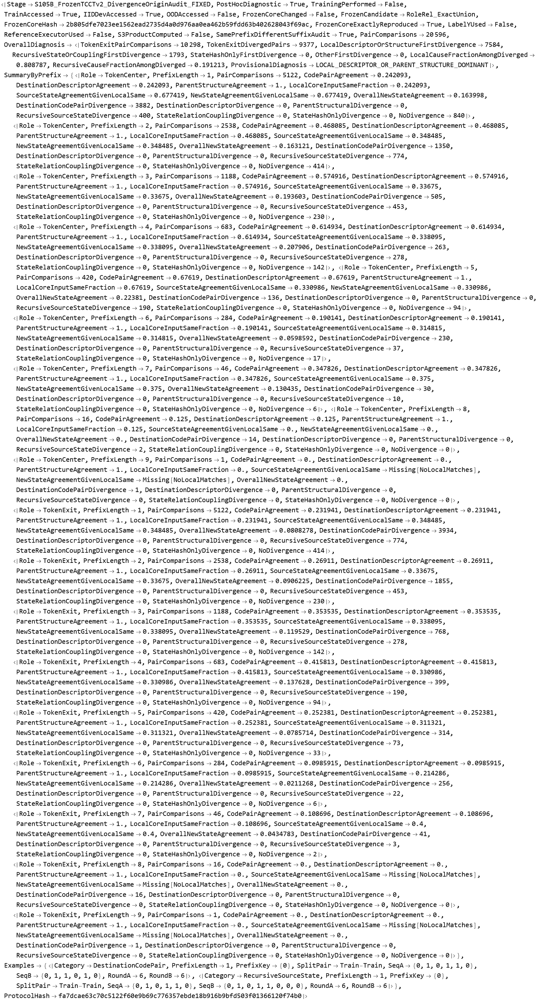

In [2897]:
(* ============================================================ *)
(* S105B PATCH                                                  *)
(* Fix list-of-Associations field extraction                    *)
(*                                                              *)
(* DO NOT rerun traces.                                         *)
(* Reuse already-computed pairAuditS105B.                       *)
(* ============================================================ *)

Print["================================================"];
Print["S105B SUMMARY PATCH"];
Print["================================================"];


If[
  !And[
    ValueQ[pairAuditS105B],
    ListQ[pairAuditS105B],
    Length[pairAuditS105B] > 0
  ],

  Print[
    "STOP: pairAuditS105B is unavailable."
  ];

  Abort[];
];


Print[
  "Reusing existing pair comparisons = ",
  Length[pairAuditS105B]
];


(* ============================================================ *)
(* 1. SAFE FIELD EXTRACTION                                     *)
(* ============================================================ *)

ClearAll[S105BValues];

S105BValues[
  rows_List,
  key_String
] :=
  (
    #[key] &
  ) /@
    rows;


(* ============================================================ *)
(* 2. FIXED SUMMARY HELPER                                      *)
(* ============================================================ *)

ClearAll[S105BSummary];


S105BSummary[
  rows_List,
  role_String,
  k_Integer
] :=
Module[
  {
    rr,
    n,

    localSame,
    localSameCount,

    sourceSameGivenLocal,
    newSameGivenLocal,

    firstDivergences,
    divergenceCounts
  },


  rr =
    Cases[
      rows,

      a_Association /;
        And[
          a["Role"] === role,
          a["PrefixLength"] === k
        ]
    ];


  n =
    Length[rr];


  localSame =
    Cases[
      rr,

      a_Association /;
        TrueQ[
          a[
            "LocalCoreInputSameIgnoringSourceState"
          ]
        ]
    ];


  localSameCount =
    Length[localSame];


  sourceSameGivenLocal =
    If[
      localSameCount == 0,

      Missing["NoLocalMatches"],

      N[
        Count[
          S105BValues[
            localSame,
            "UnionSourceStatesSame"
          ],
          True
        ] /
        localSameCount
      ]
    ];


  newSameGivenLocal =
    If[
      localSameCount == 0,

      Missing["NoLocalMatches"],

      N[
        Count[
          S105BValues[
            localSame,
            "NewStateSame"
          ],
          True
        ] /
        localSameCount
      ]
    ];


  firstDivergences =
    S105BValues[
      rr,
      "FirstDivergence"
    ];


  divergenceCounts =
    Counts[
      firstDivergences
    ];


  <|

    "Role" ->
      role,

    "PrefixLength" ->
      k,

    "PairComparisons" ->
      n,


    "CodePairAgreement" ->
      If[
        n == 0,

        Missing["NoPairs"],

        N[
          Count[
            S105BValues[
              rr,
              "CodePairSame"
            ],
            True
          ] /
          n
        ]
      ],


    "DestinationDescriptorAgreement" ->
      If[
        n == 0,

        Missing["NoPairs"],

        N[
          Count[
            S105BValues[
              rr,
              "DestinationDescriptorSame"
            ],
            True
          ] /
          n
        ]
      ],


    "ParentStructureAgreement" ->
      If[
        n == 0,

        Missing["NoPairs"],

        N[
          Count[
            S105BValues[
              rr,
              "UnionParentStructureSame"
            ],
            True
          ] /
          n
        ]
      ],


    "LocalCoreInputSameFraction" ->
      If[
        n == 0,

        Missing["NoPairs"],

        N[
          localSameCount /
          n
        ]
      ],


    "SourceStateAgreementGivenLocalSame" ->
      sourceSameGivenLocal,


    "NewStateAgreementGivenLocalSame" ->
      newSameGivenLocal,


    "OverallNewStateAgreement" ->
      If[
        n == 0,

        Missing["NoPairs"],

        N[
          Count[
            S105BValues[
              rr,
              "NewStateSame"
            ],
            True
          ] /
          n
        ]
      ],


    "DestinationCodePairDivergence" ->
      Lookup[
        divergenceCounts,
        "DestinationCodePair",
        0
      ],


    "DestinationDescriptorDivergence" ->
      Lookup[
        divergenceCounts,
        "DestinationDescriptor",
        0
      ],


    "ParentStructuralDivergence" ->

      Lookup[
        divergenceCounts,
        "RawParentStructuralPattern",
        0
      ] +

      Lookup[
        divergenceCounts,
        "ExactUnionStructuralProjection",
        0
      ],


    "RecursiveSourceStateDivergence" ->
      Lookup[
        divergenceCounts,
        "RecursiveSourceState",
        0
      ],


    "StateRelationCouplingDivergence" ->
      Lookup[
        divergenceCounts,
        "StateRelationCoupling",
        0
      ],


    "StateHashOnlyDivergence" ->
      Lookup[
        divergenceCounts,
        "StateHashOnly",
        0
      ],


    "NoDivergence" ->
      Lookup[
        divergenceCounts,
        "NoDivergence",
        0
      ]

  |>
];


(* ============================================================ *)
(* 3. RECOMPUTE PREFIX SUMMARY                                  *)
(* ============================================================ *)

maxPrefixLengthS105B =
  Max[
    S105BValues[
      landmarkRowsS105B,
      "PrefixLength"
    ]
  ];


summaryByPrefixS105B =
  Flatten[
    Table[

      S105BSummary[
        pairAuditS105B,
        role,
        k
      ],

      {
        role,
        {
          "TokenCenter",
          "TokenExit"
        }
      },

      {
        k,
        1,
        maxPrefixLengthS105B
      }
    ],

    1
  ];


summaryByPrefixS105B =
  Cases[
    summaryByPrefixS105B,

    a_Association /;
      a["PairComparisons"] > 0
  ];


Print[
  "Prefix summary rows = ",
  Length[summaryByPrefixS105B]
];


(* ============================================================ *)
(* 4. REBUILD OVERALL ROOT-CAUSE AUDIT                          *)
(* ============================================================ *)

exitPairsS105B =
  Cases[
    pairAuditS105B,

    a_Association /;
      a["Role"] ===
        "TokenExit"
  ];


exitDivergedPairsS105B =
  Cases[
    exitPairsS105B,

    a_Association /;
      !TrueQ[
        a["NewStateSame"]
      ]
  ];


localCauseCategoriesS105B = {
  "DestinationCodePair",
  "DestinationDescriptor",
  "RawParentStructuralPattern",
  "ExactUnionStructuralProjection"
};


recursiveCauseCategoriesS105B = {
  "RecursiveSourceState",
  "StateRelationCoupling"
};


exitDivergenceLabelsS105B =
  S105BValues[
    exitDivergedPairsS105B,
    "FirstDivergence"
  ];


localCauseCountS105B =
  Count[
    exitDivergenceLabelsS105B,

    x_ /;
      MemberQ[
        localCauseCategoriesS105B,
        x
      ]
  ];


recursiveCauseCountS105B =
  Count[
    exitDivergenceLabelsS105B,

    x_ /;
      MemberQ[
        recursiveCauseCategoriesS105B,
        x
      ]
  ];


stateHashCauseCountS105B =
  Count[
    exitDivergenceLabelsS105B,
    "StateHashOnly"
  ];


otherCauseCountS105B =
  Length[
    exitDivergedPairsS105B
  ] -
  localCauseCountS105B -
  recursiveCauseCountS105B -
  stateHashCauseCountS105B;


provisionalDiagnosisS105B =
  Which[

    recursiveCauseCountS105B >
      2 localCauseCountS105B,

      "RECURSIVE_SOURCE_STATE_DOMINANT",


    localCauseCountS105B >
      2 recursiveCauseCountS105B,

      "LOCAL_DESCRIPTOR_OR_PARENT_STRUCTURE_DOMINANT",


    True,

      "MIXED_CAUSES"
  ];


overallDiagnosisS105B =
  <|

    "TokenExitPairComparisons" ->
      Length[
        exitPairsS105B
      ],

    "TokenExitDivergedPairs" ->
      Length[
        exitDivergedPairsS105B
      ],

    "LocalDescriptorOrStructureFirstDivergence" ->
      localCauseCountS105B,

    "RecursiveStateOrCouplingFirstDivergence" ->
      recursiveCauseCountS105B,

    "StateHashOnlyFirstDivergence" ->
      stateHashCauseCountS105B,

    "OtherFirstDivergence" ->
      otherCauseCountS105B,


    "LocalCauseFractionAmongDiverged" ->
      If[
        exitDivergedPairsS105B === {},

        Missing["NoDivergence"],

        N[
          localCauseCountS105B /
          Length[
            exitDivergedPairsS105B
          ]
        ]
      ],


    "RecursiveCauseFractionAmongDiverged" ->
      If[
        exitDivergedPairsS105B === {},

        Missing["NoDivergence"],

        N[
          recursiveCauseCountS105B /
          Length[
            exitDivergedPairsS105B
          ]
        ]
      ],


    "ProvisionalDiagnosis" ->
      provisionalDiagnosisS105B

  |>;


Print[
  "Overall diagnosis = ",
  overallDiagnosisS105B
];


(* ============================================================ *)
(* 5. EXAMPLE ROWS                                              *)
(* ============================================================ *)

divergenceExamplesS105B =
  Table[

    Module[
      {
        hits,
        x
      },


      hits =
        Cases[
          exitDivergedPairsS105B,

          a_Association /;
            a["FirstDivergence"] ===
              category
        ];


      If[
        hits === {},

        Nothing,

        x =
          First[hits];


        <|

          "Category" ->
            category,

          "PrefixLength" ->
            x["PrefixLength"],

          "PrefixKey" ->
            x["PrefixKey"],

          "SplitPair" ->
            x["SplitPair"],

          "SeqA" ->
            x["SeqA"],

          "SeqB" ->
            x["SeqB"],

          "RoundA" ->
            x["RoundA"],

          "RoundB" ->
            x["RoundB"]

        |>
      ]

    ],

    {
      category,
      {
        "DestinationCodePair",
        "DestinationDescriptor",
        "RawParentStructuralPattern",
        "ExactUnionStructuralProjection",
        "RecursiveSourceState",
        "StateRelationCoupling",
        "StateHashOnly"
      }
    }
  ];


(* ============================================================ *)
(* 6. REBUILD PROTOCOL HASH + FINAL REPORT                      *)
(* ============================================================ *)

protocolHashS105B =
  Hash[
    {

      frozenCoreHashS105B,

      candidateS105B,

      DownValues[
        S105BTrace
      ],

      DownValues[
        S105BComparePair
      ],

      DownValues[
        S105BSummary
      ]

    },

    "SHA256",
    "HexString"
  ];


finalS105B =
  <|

    "Stage" ->
      "S105B_FrozenTCCTv2_DivergenceOriginAudit_FIXED",

    "PostHocDiagnostic" ->
      True,

    "TrainingPerformed" ->
      False,

    "TrainAccessed" ->
      True,

    "IIDDevAccessed" ->
      True,

    "OODAccessed" ->
      False,

    "FrozenCoreChanged" ->
      False,

    "FrozenCandidate" ->
      candidateS105B,

    "FrozenCoreHash" ->
      frozenCoreHashS105B,

    "FrozenCoreExactlyReproduced" ->
      coreExactMatchS105B,

    "LabelYUsed" ->
      False,

    "ReferenceExecutorUsed" ->
      False,

    "S3ProductComputed" ->
      False,

    "SamePrefixDifferentSuffixAudit" ->
      True,

    "PairComparisons" ->
      Length[
        pairAuditS105B
      ],

    "OverallDiagnosis" ->
      overallDiagnosisS105B,

    "SummaryByPrefix" ->
      summaryByPrefixS105B,

    "Examples" ->
      divergenceExamplesS105B,

    "ProtocolHash" ->
      protocolHashS105B

  |>;


Print["================================================"];
Print["S105B PATCH COMPLETE"];
Print["================================================"];


finalS105B

In [2958]:
overallDiagnosisS105B

<|TokenExitPairComparisons -> 10298, TokenExitDivergedPairs -> 9377, 
 
>   LocalDescriptorOrStructureFirstDivergence -> 7584, 
 
>   RecursiveStateOrCouplingFirstDivergence -> 1793, StateHashOnlyFirstDivergence -> 0, 
 
>   OtherFirstDivergence -> 0, LocalCauseFractionAmongDiverged -> 0.808787, 
 
>   RecursiveCauseFractionAmongDiverged -> 0.191213, 
 
>   ProvisionalDiagnosis -> LOCAL_DESCRIPTOR_OR_PARENT_STRUCTURE_DOMINANT|>

Dataset[{<|Role -> TokenExit, PrefixLength -> 1, PairComparisons -> 5122, 
 
>     CodePairAgreement -> 0.231941, DestinationDescriptorAgreement -> 0.231941, 
 
>     ParentStructureAgreement -> 1., LocalCoreInputSameFraction -> 0.231941, 
 
>     SourceStateAgreementGivenLocalSame -> 0.348485, 
 
>     NewStateAgreementGivenLocalSame -> 0.348485, 
 
>     OverallNewStateAgreement -> 0.0808278, DestinationCodePairDivergence -> 3934, 
 
>     DestinationDescriptorDivergence -> 0, ParentStructuralDivergence -> 0, 
 
>     RecursiveSourceStateDivergence -> 774, StateRelationCouplingDivergence -> 0, 
 
>     StateHashOnlyDivergence -> 0, NoDivergence -> 414|>, 
 
>    <|Role -> TokenExit, PrefixLength -> 2, PairComparisons -> 2538, 
 
>     CodePairAgreement -> 0.26911, DestinationDescriptorAgreement -> 0.26911, 
 
>     ParentStructureAgreement -> 1., LocalCoreInputSameFraction -> 0.26911, 
 
>     SourceStateAgreementGivenLocalSame -> 0.33675, 
 
>     NewStateAgreementGivenLocalSame -> 0.33675, OverallNewStateAgreement -> 0.0906225, 
 
>     DestinationCodePairDivergence -> 1855, DestinationDescriptorDivergence -> 0, 
 
>     ParentStructuralDivergence -> 0, RecursiveSourceStateDivergence -> 453, 
 
>     StateRelationCouplingDivergence -> 0, StateHashOnlyDivergence -> 0, 
 
>     NoDivergence -> 230|>, <|Role -> TokenExit, PrefixLength -> 3, 
 
>     PairComparisons -> 1188, CodePairAgreement -> 0.353535, 
 
>     DestinationDescriptorAgreement -> 0.353535, ParentStructureAgreement -> 1., 
 
>     LocalCoreInputSameFraction -> 0.353535, 
 
>     SourceStateAgreementGivenLocalSame -> 0.338095, 
 
>     NewStateAgreementGivenLocalSame -> 0.338095, OverallNewStateAgreement -> 0.119529, 
 
>     DestinationCodePairDivergence -> 768, DestinationDescriptorDivergence -> 0, 
 
>     ParentStructuralDivergence -> 0, RecursiveSourceStateDivergence -> 278, 
 
>     StateRelationCouplingDivergence -> 0, StateHashOnlyDivergence -> 0, 
 
>     NoDivergence -> 142|>, <|Role -> TokenExit, PrefixLength -> 4, 
 
>     PairComparisons -> 683, CodePairAgreement -> 0.415813, 
 
>     DestinationDescriptorAgreement -> 0.415813, ParentStructureAgreement -> 1., 
 
>     LocalCoreInputSameFraction -> 0.415813, 
 
>     SourceStateAgreementGivenLocalSame -> 0.330986, 
 
>     NewStateAgreementGivenLocalSame -> 0.330986, OverallNewStateAgreement -> 0.137628, 
 
>     DestinationCodePairDivergence -> 399, DestinationDescriptorDivergence -> 0, 
 
>     ParentStructuralDivergence -> 0, RecursiveSourceStateDivergence -> 190, 
 
>     StateRelationCouplingDivergence -> 0, StateHashOnlyDivergence -> 0, 
 
>     NoDivergence -> 94|>, <|Role -> TokenExit, PrefixLength -> 5, 
 
>     PairComparisons -> 420, CodePairAgreement -> 0.252381, 
 
>     DestinationDescriptorAgreement -> 0.252381, ParentStructureAgreement -> 1., 
 
>     LocalCoreInputSameFraction -> 0.252381, 
 
>     SourceStateAgreementGivenLocalSame -> 0.311321, 
 
>     NewStateAgreementGivenLocalSame -> 0.311321, 
 
>     OverallNewStateAgreement -> 0.0785714, DestinationCodePairDivergence -> 314, 
 
>     DestinationDescriptorDivergence -> 0, ParentStructuralDivergence -> 0, 
 
>     RecursiveSourceStateDivergence -> 73, StateRelationCouplingDivergence -> 0, 
 
>     StateHashOnlyDivergence -> 0, NoDivergence -> 33|>, 
 
>    <|Role -> TokenExit, PrefixLength -> 6, PairComparisons -> 284, 
 
>     CodePairAgreement -> 0.0985915, DestinationDescriptorAgreement -> 0.0985915, 
 
>     ParentStructureAgreement -> 1., LocalCoreInputSameFraction -> 0.0985915, 
 
>     SourceStateAgreementGivenLocalSame -> 0.214286, 
 
>     NewStateAgreementGivenLocalSame -> 0.214286, 
 
>     OverallNewStateAgreement -> 0.0211268, DestinationCodePairDivergence -> 256, 
 
>     DestinationDescriptorDivergence -> 0, ParentStructuralDivergence -> 0, 
 
>     RecursiveSourceStateDivergence -> 22, StateRelationCouplingDivergence -> 0, 
 
>     StateHashOnlyDivergence -> 0, NoDivergence -> 6|>, 
 
>    <|Role -> TokenExit, 
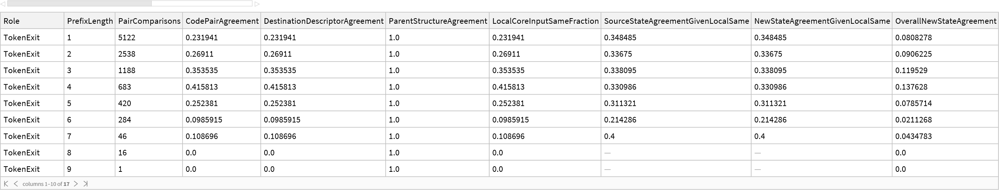

In [2963]:
Dataset[
  Cases[
    summaryByPrefixS105B,
    a_Association /;
      a["Role"] === "TokenExit"
  ]
]

Dataset[{<|Role -> TokenCenter, PrefixLength -> 1, PairComparisons -> 5122, 
 
>     CodePairAgreement -> 0.242093, DestinationDescriptorAgreement -> 0.242093, 
 
>     ParentStructureAgreement -> 1., LocalCoreInputSameFraction -> 0.242093, 
 
>     SourceStateAgreementGivenLocalSame -> 0.677419, 
 
>     NewStateAgreementGivenLocalSame -> 0.677419, OverallNewStateAgreement -> 0.163998, 
 
>     DestinationCodePairDivergence -> 3882, DestinationDescriptorDivergence -> 0, 
 
>     ParentStructuralDivergence -> 0, RecursiveSourceStateDivergence -> 400, 
 
>     StateRelationCouplingDivergence -> 0, StateHashOnlyDivergence -> 0, 
 
>     NoDivergence -> 840|>, <|Role -> TokenCenter, PrefixLength -> 2, 
 
>     PairComparisons -> 2538, CodePairAgreement -> 0.468085, 
 
>     DestinationDescriptorAgreement -> 0.468085, ParentStructureAgreement -> 1., 
 
>     LocalCoreInputSameFraction -> 0.468085, 
 
>     SourceStateAgreementGivenLocalSame -> 0.348485, 
 
>     NewStateAgreementGivenLocalSame -> 0.348485, OverallNewStateAgreement -> 0.163121, 
 
>     DestinationCodePairDivergence -> 1350, DestinationDescriptorDivergence -> 0, 
 
>     ParentStructuralDivergence -> 0, RecursiveSourceStateDivergence -> 774, 
 
>     StateRelationCouplingDivergence -> 0, StateHashOnlyDivergence -> 0, 
 
>     NoDivergence -> 414|>, <|Role -> TokenCenter, PrefixLength -> 3, 
 
>     PairComparisons -> 1188, CodePairAgreement -> 0.574916, 
 
>     DestinationDescriptorAgreement -> 0.574916, ParentStructureAgreement -> 1., 
 
>     LocalCoreInputSameFraction -> 0.574916, 
 
>     SourceStateAgreementGivenLocalSame -> 0.33675, 
 
>     NewStateAgreementGivenLocalSame -> 0.33675, OverallNewStateAgreement -> 0.193603, 
 
>     DestinationCodePairDivergence -> 505, DestinationDescriptorDivergence -> 0, 
 
>     ParentStructuralDivergence -> 0, RecursiveSourceStateDivergence -> 453, 
 
>     StateRelationCouplingDivergence -> 0, StateHashOnlyDivergence -> 0, 
 
>     NoDivergence -> 230|>, <|Role -> TokenCenter, PrefixLength -> 4, 
 
>     PairComparisons -> 683, CodePairAgreement -> 0.614934, 
 
>     DestinationDescriptorAgreement -> 0.614934, ParentStructureAgreement -> 1., 
 
>     LocalCoreInputSameFraction -> 0.614934, 
 
>     SourceStateAgreementGivenLocalSame -> 0.338095, 
 
>     NewStateAgreementGivenLocalSame -> 0.338095, OverallNewStateAgreement -> 0.207906, 
 
>     DestinationCodePairDivergence -> 263, DestinationDescriptorDivergence -> 0, 
 
>     ParentStructuralDivergence -> 0, RecursiveSourceStateDivergence -> 278, 
 
>     StateRelationCouplingDivergence -> 0, StateHashOnlyDivergence -> 0, 
 
>     NoDivergence -> 142|>, <|Role -> TokenCenter, PrefixLength -> 5, 
 
>     PairComparisons -> 420, CodePairAgreement -> 0.67619, 
 
>     DestinationDescriptorAgreement -> 0.67619, ParentStructureAgreement -> 1., 
 
>     LocalCoreInputSameFraction -> 0.67619, 
 
>     SourceStateAgreementGivenLocalSame -> 0.330986, 
 
>     NewStateAgreementGivenLocalSame -> 0.330986, OverallNewStateAgreement -> 0.22381, 
 
>     DestinationCodePairDivergence -> 136, DestinationDescriptorDivergence -> 0, 
 
>     ParentStructuralDivergence -> 0, RecursiveSourceStateDivergence -> 190, 
 
>     StateRelationCouplingDivergence -> 0, StateHashOnlyDivergence -> 0, 
 
>     NoDivergence -> 94|>, <|Role -> TokenCenter, PrefixLength -> 6, 
 
>     PairComparisons -> 284, CodePairAgreement -> 0.190141, 
 
>     DestinationDescriptorAgreement -> 0.190141, ParentStructureAgreement -> 1., 
 
>     LocalCoreInputSameFraction -> 0.190141, 
 
>     SourceStateAgreementGivenLocalSame -> 0.314815, 
 
>     NewStateAgreementGivenLocalSame -> 0.314815, 
 
>     OverallNewStateAgreement -> 0.0598592, DestinationCodePairDivergence -> 230, 
 
>     DestinationDescriptorDivergence -> 0, ParentStructuralDivergence -> 0, 
 
>     RecursiveSourceStateDivergence -> 37, StateRelationCouplingDivergence -> 0, 
 
>     StateHashOnlyDivergence -> 0, NoDivergence -> 17|>, 
 
>    <|Role -> T
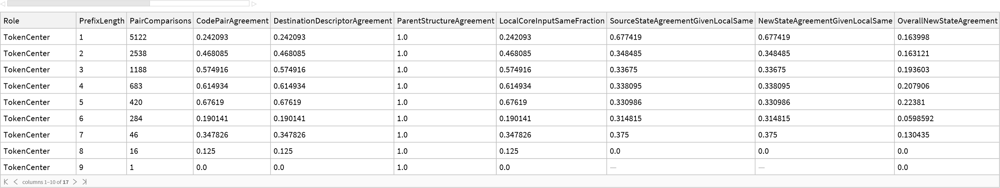

In [2968]:
Dataset[
  Cases[
    summaryByPrefixS105B,
    a_Association /;
      a["Role"] === "TokenCenter"
  ]
]

In [2973]:
Dataset[
  divergenceExamplesS105B
]

Dataset[{<|Category -> DestinationCodePair, PrefixLength -> 1, PrefixKey -> {0}, 
 
>     SplitPair -> Train-Train, SeqA -> {0, 1, 0, 1, 1, 0}, SeqB -> {0, 1, 1, 0, 1, 0}, 
 
>     RoundA -> 6, RoundB -> 6|>, <|Category -> RecursiveSourceState, PrefixLength -> 1, 
 
>     PrefixKey -> {0}, SplitPair -> Train-Train, SeqA -> {0, 1, 0, 1, 1, 0}, 
 
>     SeqB -> {0, 1, 0, 1, 1, 0, 0, 0}, RoundA -> 6, RoundB -> 6|>}, 
 
>   TypeSystem`Vector[TypeSystem`Struct[{Category, PrefixLength, PrefixKey, SplitPair, 
 
>      SeqA, SeqB, RoundA, RoundB}, 
 
>     {TypeSystem`Atom[String], TypeSystem`Atom[Integer], TypeSystem`Atom[String], 
 
>      TypeSystem`Atom[String], TypeSystem`Vector[TypeSystem`Atom[Integer], 6], 
 
>      TypeSystem`Vector[TypeSystem`Atom[Integer], TypeSystem`AnyLength], 
 
>      TypeSystem`Atom[Integer], TypeSystem`Atom[Integer]}], 2], <||>]

In [2978]:
(* ============================================================ *)
(* S106A                                                        *)
(* CodePair Context-Sensitivity Ablation                        *)
(*                                                              *)
(* TRAIN + IID DEV diagnostic only                              *)
(* NO classifier training                                      *)
(* NO OOD                                                       *)
(*                                                              *)
(* Variants:                                                    *)
(* 1 HistoricalCodePair_ExactUnion  <- frozen TCCT-v2 control   *)
(* 2 RoleOnly_ExactUnion            <- remove CodePair          *)
(* 3 RoleOnly_Multiset              <- remove CodePair + keep   *)
(*                                     exact multiplicity        *)
(* ============================================================ *)

ClearAll["Global`S106A*"];
ClearAll["Global`s106A*"];


s106AResult =
Catch[

(

(* ============================================================ *)
(* 0. FAIL SAFE                                                 *)
(* ============================================================ *)

S106AFail[msg_] := (
  Print["STOP: ", msg];
  Throw[$Failed, "S106A_STOP"];
);


Print["================================================"];
Print["S106A CODEPAIR ABLATION / STATE-ABSTRACTION AUDIT"];
Print["================================================"];


(* ============================================================ *)
(* 1. PREFLIGHT                                                 *)
(* ============================================================ *)

If[
  !ValueQ[freezeCertificateS103C],
  S106AFail["freezeCertificateS103C missing."]
];

If[
  freezeCertificateS103C["Status"] =!=
    "FROZEN_FOR_BASELINE_DEVELOPMENT",

  S106AFail["Frozen TCCT-v2 certificate invalid."]
];

If[
  !And[
    ValueQ[trainRecords],
    ValueQ[iidRecords]
  ],

  S106AFail["trainRecords / iidRecords missing."]
];

If[
  Length[DownValues[S103BNodeInfo]] == 0 ||
  Length[DownValues[S103BRelation]] == 0 ||
  Length[DownValues[S103BRun]] == 0,

  S106AFail["Required S103B definitions missing."]
];


s106AVariants = {
  "HistoricalCodePair_ExactUnion",
  "RoleOnly_ExactUnion",
  "RoleOnly_Multiset"
};


allRecordsS106A =
  Join[
    trainRecords,
    iidRecords
  ];


splitLabelsS106A =
  Join[
    ConstantArray[
      "Train",
      Length[trainRecords]
    ],

    ConstantArray[
      "Dev",
      Length[iidRecords]
    ]
  ];


Print["Preflight = PASS"];
Print["Train = ", Length[trainRecords]];
Print["IID Dev = ", Length[iidRecords]];
Print["Variants = ", s106AVariants];
Print["NO OOD WILL BE ACCESSED."];


(* ============================================================ *)
(* 2. NODE DESCRIPTOR                                           *)
(* ============================================================ *)

S106ANodeDescriptor[
  info_Association,
  variant_String
] :=
Switch[

  variant,


  "HistoricalCodePair_ExactUnion",

    {
      "Code",
      info["CodePair"],

      "Role",
      info["Role"]
    },


  "RoleOnly_ExactUnion" |
  "RoleOnly_Multiset",

    {
      "Role",
      info["Role"]
    },


  _,

    S106AFail[
      StringJoin[
        "Unknown variant: ",
        variant
      ]
    ]
];


(* ============================================================ *)
(* 3. COMPLETE MESSAGE                                          *)
(*                                                              *)
(* CodePair is NOT present in RoleOnly variants.                *)
(*                                                              *)
(* SourceState remains recursive for this experiment.           *)
(* This isolates CodePair as ONE factor.                        *)
(* ============================================================ *)

S106AMessage[
  srcInfo_Association,
  dstInfo_Association,
  srcState_,
  variant_String
] :=
  {

    "SourceRole",
    srcInfo["Role"],

    "DestinationRole",
    dstInfo["Role"],

    "Relation",
    S103BRelation[
      srcInfo,
      dstInfo
    ],

    "SourceState",
    srcState

  };


(* ============================================================ *)
(* 4. AGGREGATION                                               *)
(* ============================================================ *)

S106AAggregate[
  msgs_List,
  variant_String
] :=
Switch[

  variant,


  "HistoricalCodePair_ExactUnion" |
  "RoleOnly_ExactUnion",

    Sort[
      DeleteDuplicates[
        msgs
      ]
    ],


  "RoleOnly_Multiset",

    Sort[
      msgs
    ],


  _,

    S106AFail[
      "Unknown aggregation variant."
    ]
];


(* ============================================================ *)
(* 5. STATE ID                                                  *)
(* ============================================================ *)

S106AStateID[
  descriptor_,
  aggregate_
] :=
  Hash[
    {
      "S106AState",
      descriptor,
      aggregate
    },
    "SHA256",
    "HexString"
  ];


(* ============================================================ *)
(* 6. RUNNER                                                    *)
(* ============================================================ *)

S106ARun[
  r_Association,
  variant_String
] :=
Module[
  {
    ni,
    ctx,
    info,

    p,
    pa,
    q,
    n,
    vertices,

    active,
    state,

    nextActive,
    nextState,

    activeParents,

    srcNode,
    dstNode,
    srcInfo,
    dstInfo,

    msgs,
    aggregate,
    descriptor,
    newState,

    trajectory = {},
    events = {},

    roundState,

    terminatedNaturally = False,
    safetyCap,

    j,
    u,
    k
  },


  ni =
    S103BNodeInfo[
      r
    ];

  ctx =
    ni["Context"];

  info =
    ni["Info"];


  p =
    ctx["Pack"];

  pa =
    p[[1]];

  q =
    p[[4]];

  n =
    p[[7]];

  vertices =
    p[[12]];


  safetyCap =
    Max[
      64,
      2 n + 8
    ];


  active =
    ConstantArray[
      False,
      n
    ];

  state =
    ConstantArray[
      None,
      n
    ];


  active[[q]] =
    True;


  state[[q]] =
    Hash[
      {
        "InitialQuery",

        S106ANodeDescriptor[
          info[
            vertices[[q]]
          ],
          variant
        ]
      },
      "SHA256",
      "HexString"
    ];


  For[
    k = 1,
    k <= safetyCap,
    k++,


    nextActive =
      ConstantArray[
        False,
        n
      ];

    nextState =
      ConstantArray[
        None,
        n
      ];


    Do[

      activeParents =
        Select[
          pa[[j]],

          Function[
            u,
            IntegerQ[u] &&
            u > 0 &&
            TrueQ[
              active[[u]]
            ]
          ]
        ];


      If[
        activeParents =!= {},


        dstNode =
          vertices[[j]];

        dstInfo =
          info[dstNode];


        msgs =
          Table[

            srcNode =
              vertices[[u]];

            srcInfo =
              info[srcNode];


            S106AMessage[
              srcInfo,
              dstInfo,
              state[[u]],
              variant
            ],

            {
              u,
              activeParents
            }
          ];


        aggregate =
          S106AAggregate[
            msgs,
            variant
          ];


        descriptor =
          S106ANodeDescriptor[
            dstInfo,
            variant
          ];


        newState =
          S106AStateID[
            descriptor,
            aggregate
          ];


        nextActive[[j]] =
          True;

        nextState[[j]] =
          newState;


        AppendTo[
          events,

          <|

            "Round" ->
              k,

            "Role" ->
              dstInfo["Role"],

            "Position" ->
              dstInfo["Position"],

            "State" ->
              newState

          |>
        ];

      ],

      {
        j,
        n
      }
    ];


    roundState =
      Sort[
        Table[

          If[
            TrueQ[
              nextActive[[j]]
            ],

            {
              S106ANodeDescriptor[
                info[
                  vertices[[j]]
                ],
                variant
              ],

              nextState[[j]]
            },

            Nothing
          ],

          {
            j,
            n
          }
        ]
      ];


    AppendTo[
      trajectory,

      {
        "Round",
        k,

        "ActiveStateMultiset",
        roundState
      }
    ];


    If[
      Count[
        nextActive,
        True
      ] == 0,

      terminatedNaturally =
        True;

      Break[];
    ];


    active =
      nextActive;

    state =
      nextState;

  ];


  <|

    "Variant" ->
      variant,

    "RoundsExecuted" ->
      Length[
        trajectory
      ],

    "TerminatedNaturally" ->
      terminatedNaturally,

    "Trajectory" ->
      trajectory,

    "Events" ->
      events

  |>
];


(* ============================================================ *)
(* 7. CONTROL CONSISTENCY                                       *)
(*                                                              *)
(* Historical descriptor should have identical equivalence      *)
(* behavior to frozen S103B.                                    *)
(*                                                              *)
(* State hash namespace differs, so compare canonical           *)
(* trajectory CLASS structure rather than raw hash strings.     *)
(* ============================================================ *)

Print[
  "Running S106A variants..."
];


runsByVariantS106A =
  Association[
    Table[

      Print[
        "  ",
        variant,
        " ..."
      ];


      variant ->
        (
          S106ARun[
            #,
            variant
          ] &
          /@
          allRecordsS106A
        ),

      {
        variant,
        s106AVariants
      }
    ]
  ];


Print["All variants computed."];


(* ============================================================ *)
(* 8. REPRESENTATION ROWS                                       *)
(* ============================================================ *)

S106ARepresentation[
  run_Association
] :=
  <|

    "RoundsExecuted" ->
      run["RoundsExecuted"],

    "TerminatedNaturally" ->
      run["TerminatedNaturally"],

    "Trajectory" ->
      run["Trajectory"]

  |>;


repRowsByVariantS106A =
  Association[
    Table[

      variant ->
        Table[

          <|

            "RecordIndex" ->
              i,

            "Split" ->
              splitLabelsS106A[[i]],

            "PairID" ->
              allRecordsS106A[[i]][
                "PairID"
              ],

            "Depth" ->
              allRecordsS106A[[i]][
                "Depth"
              ],

            "Y" ->
              allRecordsS106A[[i]][
                "Y"
              ],

            "Seq" ->
              allRecordsS106A[[i]][
                "Seq"
              ],

            "Rep" ->
              S106ARepresentation[
                runsByVariantS106A[
                  variant
                ][[i]]
              ]

          |>,

          {
            i,
            Length[
              allRecordsS106A
            ]
          }
        ],

      {
        variant,
        s106AVariants
      }
    ]
  ];


(* ============================================================ *)
(* 9. TRAIN MATCHED-PAIR COLLISION                              *)
(* ============================================================ *)

S106ACollisionAudit[
  rows_List
] :=
Module[
  {
    trainRows,
    groups,
    collisions
  },


  trainRows =
    Cases[
      rows,

      a_Association /;
        a["Split"] === "Train"
    ];


  groups =
    Values@
      GroupBy[
        trainRows,
        #["PairID"] &
      ];


  collisions =
    Table[

      Module[
        {
          pos,
          neg
        },


        pos =
          First[
            Cases[
              g,
              a_Association /;
                a["Y"] === 1
            ]
          ];


        neg =
          First[
            Cases[
              g,
              a_Association /;
                a["Y"] === 0
            ]
          ];


        SameQ[
          pos["Rep"],
          neg["Rep"]
        ]

      ],

      {
        g,
        groups
      }
    ];


  <|

    "TrainPairs" ->
      Length[
        groups
      ],

    "TrainPairCollisions" ->
      Count[
        collisions,
        True
      ],

    "TrainPairCollisionFraction" ->
      N[
        Count[
          collisions,
          True
        ] /
        Length[
          collisions
        ]
      ]

  |>
];


collisionAuditS106A =
  Association[
    Table[

      variant ->
        S106ACollisionAudit[
          repRowsByVariantS106A[
            variant
          ]
        ],

      {
        variant,
        s106AVariants
      }
    ]
  ];


(* ============================================================ *)
(* 10. STATE EVENT REUSE                                        *)
(* ============================================================ *)

S106AStateReuseAudit[
  variant_String
] :=
Module[
  {
    runs,

    trainEvents,
    devEvents,

    trainStates,
    devStates,

    trainUnique,
    devUnique,

    trainStateToRecords,
    reusableStates,
    singletonStates,

    trainSet
  },


  runs =
    runsByVariantS106A[
      variant
    ];


  trainEvents =
    Flatten[
      Table[

        (
          Append[
            #,
            "RecordIndex" -> i
          ] &
        ) /@
          runs[[i]]["Events"],

        {
          i,
          1,
          Length[
            trainRecords
          ]
        }
      ],

      1
    ];


  devEvents =
    Flatten[
      Table[

        (
          Append[
            #,
            "RecordIndex" -> i
          ] &
        ) /@
          runs[[
            Length[trainRecords] + i
          ]]["Events"],

        {
          i,
          1,
          Length[
            iidRecords
          ]
        }
      ],

      1
    ];


  trainStates =
    (#["State"] &) /@
      trainEvents;


  devStates =
    (#["State"] &) /@
      devEvents;


  trainUnique =
    DeleteDuplicates[
      trainStates
    ];


  devUnique =
    DeleteDuplicates[
      devStates
    ];


  trainStateToRecords =
    GroupBy[
      trainEvents,
      #["State"] &,
      DeleteDuplicates[
        (#["RecordIndex"] &) /@
          #
      ] &
    ];


  reusableStates =
    Keys[
      Select[
        trainStateToRecords,
        Length[#] >= 2 &
      ]
    ];


  singletonStates =
    Keys[
      Select[
        trainStateToRecords,
        Length[#] == 1 &
      ]
    ];


  trainSet =
    AssociationThread[
      trainUnique,
      ConstantArray[
        True,
        Length[
          trainUnique
        ]
      ]
    ];


  <|

    "TrainStateEvents" ->
      Length[
        trainStates
      ],

    "TrainUniqueStates" ->
      Length[
        trainUnique
      ],

    "TrainReusableUniqueStates" ->
      Length[
        reusableStates
      ],

    "TrainUniqueStateReuseFraction" ->
      N[
        Length[
          reusableStates
        ] /
        Length[
          trainUnique
        ]
      ],

    "TrainSingletonUniqueStateFraction" ->
      N[
        Length[
          singletonStates
        ] /
        Length[
          trainUnique
        ]
      ],

    "DevStateEvents" ->
      Length[
        devStates
      ],

    "DevUniqueStates" ->
      Length[
        devUnique
      ],

    "DevUniqueStateCoverageByTrain" ->
      N[
        Count[
          devUnique,
          s_ /;
            KeyExistsQ[
              trainSet,
              s
            ]
        ] /
        Length[
          devUnique
        ]
      ],

    "DevEventCoverageByTrain" ->
      N[
        Mean[
          (
            Boole[
              KeyExistsQ[
                trainSet,
                #
              ]
            ] &
          ) /@
          devStates
        ]
      ]

  |>
];


reuseAuditS106A =
  Association[
    Table[

      variant ->
        S106AStateReuseAudit[
          variant
        ],

      {
        variant,
        s106AVariants
      }
    ]
  ];


(* ============================================================ *)
(* 11. FIRST TOKEN-EXIT STATE                                   *)
(* ============================================================ *)

S106AFirstExitState[
  run_Association,
  pos_Integer
] :=
Module[
  {
    hits
  },


  hits =
    Cases[
      run["Events"],

      a_Association /;
        And[
          a["Role"] === "TokenExit",
          a["Position"] === pos
        ]
    ];


  If[
    hits === {},

    Missing[
      "NotReached"
    ],

    First[
      SortBy[
        hits,
        #["Round"] &
      ]
    ]["State"]
  ]
];


S106APrefixKey[
  seq_,
  k_Integer
] :=
  ToString[
    InputForm[
      Take[
        seq,
        k
      ]
    ]
  ];


S106ASeqKey[seq_] :=
  ToString[
    InputForm[
      seq
    ]
  ];


(* ============================================================ *)
(* 12. SAME-PREFIX EXIT STATE AGREEMENT                         *)
(* ============================================================ *)

S106APrefixReuse[
  variant_String
] :=
Module[
  {
    runs,
    rows,

    maxK,

    summaries
  },


  runs =
    runsByVariantS106A[
      variant
    ];


  rows =
    Flatten[
      Table[

        Table[

          <|

            "RecordIndex" ->
              i,

            "PrefixLength" ->
              k,

            "PrefixKey" ->
              S106APrefixKey[
                allRecordsS106A[[i]][
                  "Seq"
                ],
                k
              ],

            "SeqKey" ->
              S106ASeqKey[
                allRecordsS106A[[i]][
                  "Seq"
                ]
              ],

            "State" ->
              S106AFirstExitState[
                runs[[i]],
                k
              ]

          |>,

          {
            k,
            Length[
              allRecordsS106A[[i]][
                "Seq"
              ]
            ]
          }
        ],

        {
          i,
          Length[
            allRecordsS106A
          ]
        }
      ],

      1
    ];


  maxK =
    Max[
      (#["PrefixLength"] &) /@
        rows
    ];


  summaries =
    Table[

      Module[
        {
          rr,
          groups,
          eligibleGroups,

          pairs,
          nPairs,
          samePairs
        },


        rr =
          Cases[
            rows,

            a_Association /;
              a["PrefixLength"] === k
          ];


        groups =
          Values@
            GroupBy[
              rr,
              #["PrefixKey"] &
            ];


        eligibleGroups =
          Select[
            groups,

            Length[
              DeleteDuplicates[
                (#["SeqKey"] &) /@
                  #
              ]
            ] >= 2 &
          ];


        pairs =
          Flatten[
            Table[

              Select[
                Subsets[
                  g,
                  {2}
                ],

                #[[1]]["SeqKey"] =!=
                  #[[2]]["SeqKey"] &
              ],

              {
                g,
                eligibleGroups
              }
            ],

            1
          ];


        nPairs =
          Length[
            pairs
          ];


        samePairs =
          Count[
            pairs,

            p_ /;
              SameQ[
                p[[1]]["State"],
                p[[2]]["State"]
              ]
          ];


        <|

          "PrefixLength" ->
            k,

          "PairComparisons" ->
            nPairs,

          "ExitStateAgreement" ->
            If[
              nPairs == 0,

              Missing[
                "NoPairs"
              ],

              N[
                samePairs /
                nPairs
              ]
            ]

        |>

      ],

      {
        k,
        1,
        maxK
      }
    ];


  summaries
];


prefixReuseByVariantS106A =
  Association[
    Table[

      variant ->
        S106APrefixReuse[
          variant
        ],

      {
        variant,
        s106AVariants
      }
    ]
  ];


(* ============================================================ *)
(* 13. COMPACT SCOREBOARD                                       *)
(* ============================================================ *)

S106AMeanPrefixReuse[
  rows_List
] :=
Module[
  {
    values
  },


  values =
    DeleteMissing[
      (
        #["ExitStateAgreement"] &
      ) /@
        Select[
          rows,
          #["PrefixLength"] <= 6 &
        ]
    ];


  If[
    values === {},

    Missing[
      "NoPrefixPairs"
    ],

    N[
      Mean[
        values
      ]
    ]
  ]
];


scoreboardS106A =
  Table[

    <|

      "Variant" ->
        variant,

      "TrainPairCollisions" ->
        collisionAuditS106A[
          variant
        ][
          "TrainPairCollisions"
        ],

      "TrainPairCollisionFraction" ->
        collisionAuditS106A[
          variant
        ][
          "TrainPairCollisionFraction"
        ],

      "TrainUniqueStates" ->
        reuseAuditS106A[
          variant
        ][
          "TrainUniqueStates"
        ],

      "TrainStateReuseFraction" ->
        reuseAuditS106A[
          variant
        ][
          "TrainUniqueStateReuseFraction"
        ],

      "TrainSingletonFraction" ->
        reuseAuditS106A[
          variant
        ][
          "TrainSingletonUniqueStateFraction"
        ],

      "DevUniqueCoverage" ->
        reuseAuditS106A[
          variant
        ][
          "DevUniqueStateCoverageByTrain"
        ],

      "DevEventCoverage" ->
        reuseAuditS106A[
          variant
        ][
          "DevEventCoverageByTrain"
        ],

      "MeanPrefixExitAgreementK1to6" ->
        S106AMeanPrefixReuse[
          prefixReuseByVariantS106A[
            variant
          ]
        ]

    |>,

    {
      variant,
      s106AVariants
    }
  ];


(* ============================================================ *)
(* 14. DEVELOPMENT DIAGNOSIS                                    *)
(* ============================================================ *)

historicalMetricsS106A =
  First[
    Cases[
      scoreboardS106A,

      a_Association /;
        a["Variant"] ===
          "HistoricalCodePair_ExactUnion"
    ]
  ];


roleOnlyMetricsS106A =
  First[
    Cases[
      scoreboardS106A,

      a_Association /;
        a["Variant"] ===
          "RoleOnly_ExactUnion"
    ]
  ];


codePairRemovalUsefulS106A =
  And[

    roleOnlyMetricsS106A[
      "TrainPairCollisionFraction"
    ] <= 0.20,

    roleOnlyMetricsS106A[
      "TrainSingletonFraction"
    ] <
      historicalMetricsS106A[
        "TrainSingletonFraction"
      ],

    roleOnlyMetricsS106A[
      "DevUniqueCoverage"
    ] >
      historicalMetricsS106A[
        "DevUniqueCoverage"
      ],

    roleOnlyMetricsS106A[
      "MeanPrefixExitAgreementK1to6"
    ] >
      historicalMetricsS106A[
        "MeanPrefixExitAgreementK1to6"
      ]

  ];


(* ============================================================ *)
(* 15. FINAL REPORT                                             *)
(* ============================================================ *)

finalS106A =
  <|

    "Stage" ->
      "S106A_CodePairContextSensitivityAblation",

    "ArchitectureDevelopment" ->
      True,

    "PostHocAfterS105Diagnosis" ->
      True,

    "TrainingPerformed" ->
      False,

    "TrainAccessed" ->
      True,

    "IIDDevAccessed" ->
      True,

    "OODAccessed" ->
      False,

    "Variants" ->
      s106AVariants,

    "HistoricalInterpretation" ->
      "CodePairIsStructuralEncodingNotNodeID",

    "Scoreboard" ->
      scoreboardS106A,

    "PrefixReuseByVariant" ->
      prefixReuseByVariantS106A,

    "CodePairRemovalUseful" ->
      codePairRemovalUsefulS106A

  |>;


Print["================================================"];
Print["S106A COMPLETE"];
Print["================================================"];


finalS106A

),

"S106A_STOP"
];

S106A CODEPAIR ABLATION / STATE-ABSTRACTION AUDIT
Preflight = PASS
Train = 96
IID Dev = 48
Variants = {HistoricalCodePair_ExactUnion, RoleOnly_ExactUnion, 
 
>    RoleOnly_Multiset}
NO OOD WILL BE ACCESSED.
Running S106A variants...
  HistoricalCodePair_ExactUnion ...
  RoleOnly_ExactUnion ...
  RoleOnly_Multiset ...
All variants computed.
S106A COMPLETE


<|Stage -> S106A_CodePairContextSensitivityAblation, ArchitectureDevelopment -> True, 
 
>   PostHocAfterS105Diagnosis -> True, TrainingPerformed -> False, 
 
>   TrainAccessed -> True, IIDDevAccessed -> True, OODAccessed -> False, 
 
>   Variants -> {HistoricalCodePair_ExactUnion, RoleOnly_ExactUnion, RoleOnly_Multiset}, 
 
>   HistoricalInterpretation -> CodePairIsStructuralEncodingNotNodeID, 
 
>   Scoreboard -> 
 
>    {<|Variant -> HistoricalCodePair_ExactUnion, TrainPairCollisions -> 0, 
 
>      TrainPairCollisionFraction -> 0., TrainUniqueStates -> 1818, 
 
>      TrainStateReuseFraction -> 0.218372, TrainSingletonFraction -> 0.781628, 
 
>      DevUniqueCoverage -> 0.290291, DevEventCoverage -> 0.444444, 
 
>      MeanPrefixExitAgreementK1to6 -> 0.0880509|>, 
 
>     <|Variant -> RoleOnly_ExactUnion, TrainPairCollisions -> 0, 
 
>      TrainPairCollisionFraction -> 0., TrainUniqueStates -> 1031, 
 
>      TrainStateReuseFraction -> 0.304559, TrainSingletonFraction -> 0.695441, 
 
>      DevUniqueCoverage -> 0.503279, DevEventCoverage -> 0.785933, 
 
>      MeanPrefixExitAgreementK1to6 -> 1.|>, 
 
>     <|Variant -> RoleOnly_Multiset, TrainPairCollisions -> 0, 
 
>      TrainPairCollisionFraction -> 0., TrainUniqueStates -> 1437, 
 
>      TrainStateReuseFraction -> 0.290884, TrainSingletonFraction -> 0.709116, 
 
>      DevUniqueCoverage -> 0.37072, DevEventCoverage -> 0.570846, 
 
>      MeanPrefixExitAgreementK1to6 -> 0.336458|>}, 
 
>   PrefixReuseByVariant -> 
 
>    <|HistoricalCodePair_ExactUnion -> 
 
>      {<|PrefixLength -> 1, PairComparisons -> 5122, ExitStateAgreement -> 0.0808278|>, 
 
>       <|PrefixLength -> 2, PairComparisons -> 2538, ExitStateAgreement -> 0.0906225|>, 
 
>       <|PrefixLength -> 3, PairComparisons -> 1188, ExitStateAgreement -> 0.119529|>, 
 
>       <|PrefixLength -> 4, PairComparisons -> 683, ExitStateAgreement -> 0.137628|>, 
 
>       <|PrefixLength -> 5, PairComparisons -> 420, ExitStateAgreement -> 0.0785714|>, 
 
>       <|PrefixLength -> 6, PairComparisons -> 284, ExitStateAgreement -> 0.0211268|>, 
 
>       <|PrefixLength -> 7, PairComparisons -> 46, ExitStateAgreement -> 0.0434783|>, 
 
>       <|PrefixLength -> 8, PairComparisons -> 16, ExitStateAgreement -> 0.|>, 
 
>       <|PrefixLength -> 9, PairComparisons -> 1, ExitStateAgreement -> 0.|>, 
 
>       <|PrefixLength -> 10, PairComparisons -> 0, 
 
>        ExitStateAgreement -> Missing[NoPairs]|>}, 
 
>     RoleOnly_ExactUnion -> 
 
>      {<|PrefixLength -> 1, PairComparisons -> 5122, ExitStateAgreement -> 1.|>, 
 
>       <|PrefixLength -> 2, PairComparisons -> 2538, ExitStateAgreement -> 1.|>, 
 
>       <|PrefixLength -> 3, PairComparisons -> 1188, ExitStateAgreement -> 1.|>, 
 
>       <|PrefixLength -> 4, PairComparisons -> 683, ExitStateAgreement -> 1.|>, 
 
>       <|PrefixLength -> 5, PairComparisons -> 420, ExitStateAgreement -> 1.|>, 
 
>       <|PrefixLength -> 6, PairComparisons -> 284, ExitStateAgreement -> 1.|>, 
 
>       <|PrefixLength -> 7, PairComparisons -> 46, ExitStateAgreement -> 1.|>, 
 
>       <|PrefixLength -> 8, PairComparisons -> 16, ExitStateAgreement -> 1.|>, 
 
>       <|PrefixLength -> 9, PairComparisons -> 1, ExitStateAgreement -> 1.|>, 
 
>       <|PrefixLength -> 10, PairComparisons -> 0, 
 
>        ExitStateAgreement -> Missing[NoPairs]|>}, 
 
>     RoleOnly_Multiset -> 
 
>      {<|PrefixLength -> 1, PairComparisons -> 5122, ExitStateAgreement -> 0.333463|>, 
 
>       <|PrefixLength -> 2, PairComparisons -> 2538, ExitStateAgreement -> 0.330969|>, 
 
>       <|PrefixLength -> 3, PairComparisons -> 1188, ExitStateAgreement -> 0.348485|>, 
 
>       <|PrefixLength -> 4, PairComparisons -> 683, ExitStateAgreement -> 0.33675|>, 
 
>       <|PrefixLength -> 5, PairComparisons -> 420, ExitStateAgreement -> 0.338095|>, 
 
>       <|PrefixLength -> 6, PairComparisons -> 284, ExitStateAgreement -> 0.330986|>, 
 
>       <|PrefixLength -> 7, PairComparisons -> 46, ExitStateAgreement -> 0.
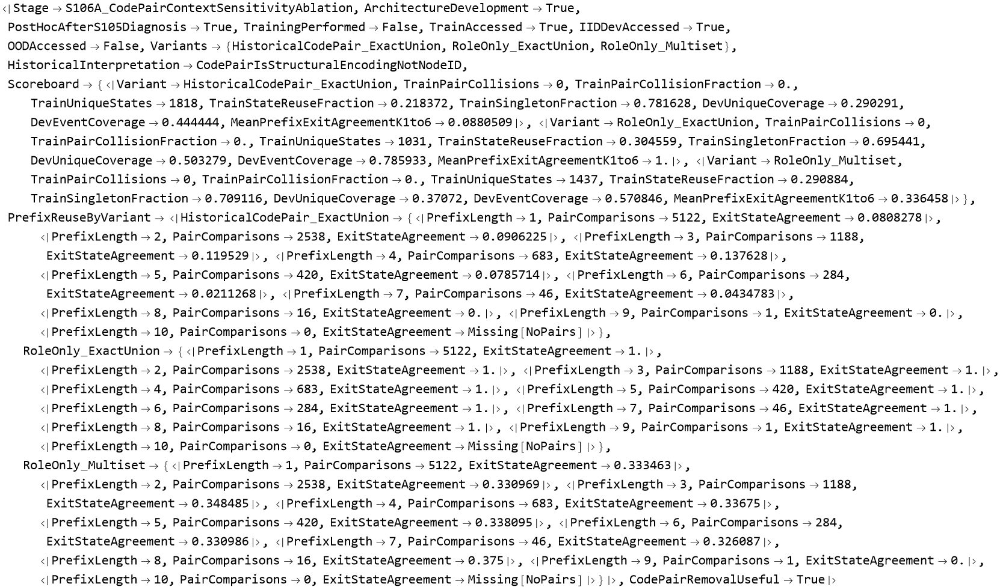

In [2999]:
s106AResult

In [3004]:
Dataset[
  scoreboardS106A
]

Dataset[{<|Variant -> HistoricalCodePair_ExactUnion, TrainPairCollisions -> 0, 
 
>     TrainPairCollisionFraction -> 0., TrainUniqueStates -> 1818, 
 
>     TrainStateReuseFraction -> 0.218372, TrainSingletonFraction -> 0.781628, 
 
>     DevUniqueCoverage -> 0.290291, DevEventCoverage -> 0.444444, 
 
>     MeanPrefixExitAgreementK1to6 -> 0.0880509|>, 
 
>    <|Variant -> RoleOnly_ExactUnion, TrainPairCollisions -> 0, 
 
>     TrainPairCollisionFraction -> 0., TrainUniqueStates -> 1031, 
 
>     TrainStateReuseFraction -> 0.304559, TrainSingletonFraction -> 0.695441, 
 
>     DevUniqueCoverage -> 0.503279, DevEventCoverage -> 0.785933, 
 
>     MeanPrefixExitAgreementK1to6 -> 1.|>, 
 
>    <|Variant -> RoleOnly_Multiset, TrainPairCollisions -> 0, 
 
>     TrainPairCollisionFraction -> 0., TrainUniqueStates -> 1437, 
 
>     TrainStateReuseFraction -> 0.290884, TrainSingletonFraction -> 0.709116, 
 
>     DevUniqueCoverage -> 0.37072, DevEventCoverage -> 0.570846, 
 
>     MeanPrefixExitAgreementK1to6 -> 0.336458|>}, 
 
>   TypeSystem`Vector[TypeSystem`Struct[{Variant, TrainPairCollisions, 
 
>      TrainPairCollisionFraction, TrainUniqueStates, TrainStateReuseFraction, 
 
>      TrainSingletonFraction, DevUniqueCoverage, DevEventCoverage, 
 
>      MeanPrefixExitAgreementK1to6}, 
 
>     {TypeSystem`Atom[String], TypeSystem`Atom[Integer], TypeSystem`Atom[Real], 
 
>      TypeSystem`Atom[Integer], TypeSystem`Atom[Real], TypeSystem`Atom[Real], 
 
>      TypeSystem`Atom[Real], TypeSystem`Atom[Real], TypeSystem`Atom[Real]}], 3], <||>]

Dataset[{<|PrefixLength -> 1, PairComparisons -> 5122, 
 
>     ExitStateAgreement -> 0.0808278|>, 
 
>    <|PrefixLength -> 2, PairComparisons -> 2538, ExitStateAgreement -> 0.0906225|>, 
 
>    <|PrefixLength -> 3, PairComparisons -> 1188, ExitStateAgreement -> 0.119529|>, 
 
>    <|PrefixLength -> 4, PairComparisons -> 683, ExitStateAgreement -> 0.137628|>, 
 
>    <|PrefixLength -> 5, PairComparisons -> 420, ExitStateAgreement -> 0.0785714|>, 
 
>    <|PrefixLength -> 6, PairComparisons -> 284, ExitStateAgreement -> 0.0211268|>, 
 
>    <|PrefixLength -> 7, PairComparisons -> 46, ExitStateAgreement -> 0.0434783|>, 
 
>    <|PrefixLength -> 8, PairComparisons -> 16, ExitStateAgreement -> 0.|>, 
 
>    <|PrefixLength -> 9, PairComparisons -> 1, ExitStateAgreement -> 0.|>, 
 
>    <|PrefixLength -> 10, PairComparisons -> 0, 
 
>     ExitStateAgreement -> Missing[NoPairs]|>}, 
 
>   TypeSystem`Vector[TypeSystem`Struct[{PrefixLength, PairComparisons, 
 
>      ExitStateAgreement}, {TypeSystem`Atom[Integer], TypeSystem`Atom[Integer], 
 
>      TypeSystem`Atom[Real]}], 10], <||>]
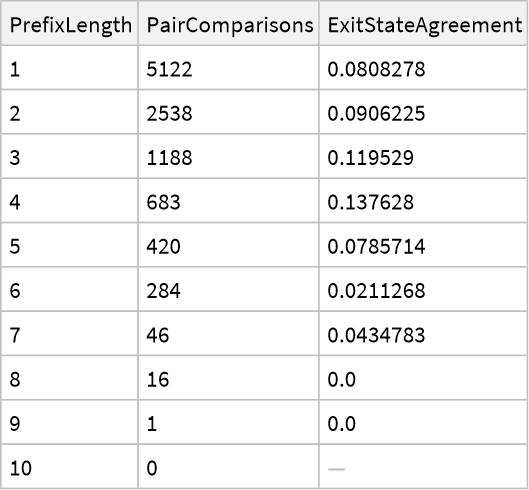

In [3009]:
Dataset[
  prefixReuseByVariantS106A[
    "HistoricalCodePair_ExactUnion"
  ]
]

Dataset[{<|PrefixLength -> 1, PairComparisons -> 5122, ExitStateAgreement -> 1.|>, 
 
>    <|PrefixLength -> 2, PairComparisons -> 2538, ExitStateAgreement -> 1.|>, 
 
>    <|PrefixLength -> 3, PairComparisons -> 1188, ExitStateAgreement -> 1.|>, 
 
>    <|PrefixLength -> 4, PairComparisons -> 683, ExitStateAgreement -> 1.|>, 
 
>    <|PrefixLength -> 5, PairComparisons -> 420, ExitStateAgreement -> 1.|>, 
 
>    <|PrefixLength -> 6, PairComparisons -> 284, ExitStateAgreement -> 1.|>, 
 
>    <|PrefixLength -> 7, PairComparisons -> 46, ExitStateAgreement -> 1.|>, 
 
>    <|PrefixLength -> 8, PairComparisons -> 16, ExitStateAgreement -> 1.|>, 
 
>    <|PrefixLength -> 9, PairComparisons -> 1, ExitStateAgreement -> 1.|>, 
 
>    <|PrefixLength -> 10, PairComparisons -> 0, 
 
>     ExitStateAgreement -> Missing[NoPairs]|>}, 
 
>   TypeSystem`Vector[TypeSystem`Struct[{PrefixLength, PairComparisons, 
 
>      ExitStateAgreement}, {TypeSystem`Atom[Integer], TypeSystem`Atom[Integer], 
 
>      TypeSystem`Atom[Real]}], 10], <||>]
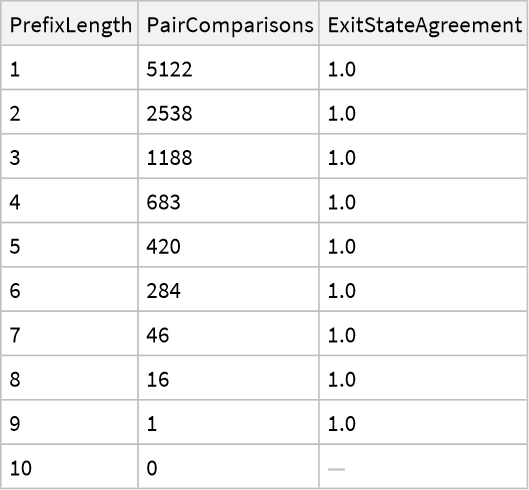

In [3014]:
Dataset[
  prefixReuseByVariantS106A[
    "RoleOnly_ExactUnion"
  ]
]

In [3019]:
(* ============================================================ *)
(* S106B                                                        *)
(* RoleOnly ExactUnion SAME-HEAD Baseline                       *)
(*                                                              *)
(* 4 modes x 5 matched seeds                                    *)
(* TRAIN + IID DEV ONLY                                         *)
(* NO OOD                                                       *)
(* SAME GRU64                                                   *)
(*                                                              *)
(* Modes:                                                       *)
(*   Raw                                                        *)
(*   StaticGraph                                                *)
(*   CodePair_ExactUnion                                        *)
(*   RoleOnly_ExactUnion                                        *)
(* ============================================================ *)

ClearAll["Global`S106B*"];
ClearAll["Global`s106B*"];


s106BResult =
Catch[

(

(* ============================================================ *)
(* 0. FAIL SAFE                                                 *)
(* ============================================================ *)

S106BFail[msg_] := (
  Print["STOP: ", msg];
  Throw[$Failed, "S106B_STOP"];
);


Print["================================================"];
Print["S106B ROLEONLY EXACTUNION BASELINE"];
Print["================================================"];


(* ============================================================ *)
(* 1. PREFLIGHT                                                 *)
(* ============================================================ *)

If[
  !And[
    ValueQ[trainRecords],
    ValueQ[iidRecords]
  ],
  S106BFail["trainRecords / iidRecords missing."]
];


If[
  !ValueQ[s102ABaseHead],
  S106BFail["s102ABaseHead missing."]
];


If[
  Length[DownValues[S102ARawSequence]] == 0,
  S106BFail["S102ARawSequence missing."]
];


If[
  Length[DownValues[S102ALocalSequence]] == 0,
  S106BFail["S102ALocalSequence missing."]
];


If[
  Length[DownValues[S102AQueryHeader]] == 0,
  S106BFail["S102AQueryHeader missing."]
];


If[
  Length[DownValues[S102ABA]] == 0,
  S106BFail["S102ABA metric missing."]
];


If[
  Length[DownValues[S102APairAccuracy]] == 0,
  S106BFail["S102APairAccuracy metric missing."]
];


If[
  Length[DownValues[S106ARun]] == 0 ||
  Length[DownValues[S106ANodeDescriptor]] == 0 ||
  Length[DownValues[S106AMessage]] == 0 ||
  Length[DownValues[S106AAggregate]] == 0 ||
  Length[DownValues[S106AStateID]] == 0,

  S106BFail["S106A candidate definitions missing."]
];


Print["Preflight = PASS"];
Print["Train records = ", Length[trainRecords]];
Print["IID Dev records = ", Length[iidRecords]];
Print["OOD WILL NOT BE ACCESSED."];


(* ============================================================ *)
(* 2. LOCKED SETTINGS                                           *)
(* ============================================================ *)

s106BSeeds = {
  9501,
  9502,
  9503,
  9504,
  9505
};


s106BTrainingRounds = 500;

s106BInputDim = 64;

s106BHashDim = 57;

s106BHashProbes = 8;


s106BModes = {
  "Raw",
  "StaticGraph",
  "CodePair_ExactUnion",
  "RoleOnly_ExactUnion"
};


Print["Modes = ", s106BModes];
Print["Seeds = ", s106BSeeds];


(* ============================================================ *)
(* 3. CANDIDATE DEFINITION HASH                                 *)
(*                                                              *)
(* This records exactly which RoleOnly candidate is tested.     *)
(* ============================================================ *)

candidateDefinitionHashS106B =
  Hash[
    {
      DownValues[S106ANodeDescriptor],
      DownValues[S106AMessage],
      DownValues[S106AAggregate],
      DownValues[S106AStateID],
      DownValues[S106ARun]
    },
    "SHA256",
    "HexString"
  ];


candidateDefinitionHashAtStartS106B =
  candidateDefinitionHashS106B;


Print[
  "S106A candidate definition hash = ",
  candidateDefinitionHashS106B
];


(* ============================================================ *)
(* 4. COMMON SYMBOLIC-STATE -> 57D PROJECTOR                    *)
(*                                                              *)
(* SAME projector is used for BOTH CodePair and RoleOnly.       *)
(*                                                              *)
(* Therefore the only TCCT architectural difference is the      *)
(* state abstraction itself.                                    *)
(* ============================================================ *)

S106BHashItemVector[item_] :=
Module[
  {
    v,
    hi,
    hs,
    idx,
    sg,
    salt
  },


  v =
    ConstantArray[
      0.,
      s106BHashDim
    ];


  Do[

    hi =
      Hash[
        {
          "S106B_INDEX",
          salt,
          item
        },
        "SHA256"
      ];


    hs =
      Hash[
        {
          "S106B_SIGN",
          salt,
          item
        },
        "SHA256"
      ];


    idx =
      1 +
      Mod[
        hi,
        s106BHashDim
      ];


    sg =
      If[
        EvenQ[hs],
        1.,
        -1.
      ];


    v[[idx]] += sg,

    {
      salt,
      1,
      s106BHashProbes
    }
  ];


  N[
    v /
      Sqrt[
        N[s106BHashProbes]
      ]
  ]
];


(* ============================================================ *)
(* 5. ONE TCCT ROUND -> 64D                                    *)
(* ============================================================ *)

S106BRoundVector[items_List] :=
Module[
  {
    v,
    hv
  },


  v =
    ConstantArray[
      0.,
      64
    ];


  If[
    items =!= {},

    hv =
      Total[
        S106BHashItemVector /@
          items
      ];


    (* normalize by active-set size to prevent pure magnitude
       from dominating *)

    hv =
      hv /
      Sqrt[
        N[
          Length[items]
        ]
      ];


    v[[7 ;; 63]] =
      hv;
  ];


  (* preserve bounded active-state count *)

  v[[64]] =
    N[
      Length[items] /
      (
        1. +
        Length[items]
      )
    ];


  v
];


(* ============================================================ *)
(* 6. TCCT RUN -> 64D SEQUENCE                                  *)
(* ============================================================ *)

S106BTCCTSequence[
  r_Association,
  variant_String
] :=
Module[
  {
    run,
    rounds,
    vecs,
    rr,
    items
  },


  run =
    S106ARun[
      r,
      variant
    ];


  rounds =
    run["Trajectory"];


  vecs =
    Table[

      rr =
        rounds[[k]];


      If[
        !And[
          ListQ[rr],
          Length[rr] == 4,
          rr[[1]] === "Round",
          rr[[3]] === "ActiveStateMultiset"
        ],

        S106BFail[
          "Unexpected S106A trajectory format."
        ]
      ];


      items =
        rr[[4]];


      S106BRoundVector[
        items
      ],

      {
        k,
        Length[rounds]
      }
    ];


  Join[
    {
      S102AQueryHeader[
        r
      ]
    },
    vecs
  ]
];


(* ============================================================ *)
(* 7. REPRESENTATION DISPATCH                                   *)
(* ============================================================ *)

S106BRep[
  "Raw",
  r_Association
] :=
  S102ARawSequence[
    r
  ];


S106BRep[
  "StaticGraph",
  r_Association
] :=
  S102ALocalSequence[
    r
  ];


S106BRep[
  "CodePair_ExactUnion",
  r_Association
] :=
  S106BTCCTSequence[
    r,
    "HistoricalCodePair_ExactUnion"
  ];


S106BRep[
  "RoleOnly_ExactUnion",
  r_Association
] :=
  S106BTCCTSequence[
    r,
    "RoleOnly_ExactUnion"
  ];


(* ============================================================ *)
(* 8. DEFINITION LEAKAGE AUDIT                                  *)
(* ============================================================ *)

s106BRepDefinitionText =
  ToString[
    InputForm[
      {
        DownValues[S106BHashItemVector],
        DownValues[S106BRoundVector],
        DownValues[S106BTCCTSequence],
        DownValues[S106BRep]
      }
    ]
  ];


s106BForbiddenTerms = {
  "[\"Y\"]",
  "ReferenceExecutor",
  "BLTruth",
  "BLExecute",
  "S3Product",
  "CorrectDestination",
  "WrongDestination",
  "ProgramOutput",
  "TaskY"
};


s106BForbiddenHits =
  Select[
    s106BForbiddenTerms,
    StringContainsQ[
      s106BRepDefinitionText,
      #
    ] &
  ];


Print[
  "Forbidden representation hits = ",
  s106BForbiddenHits
];


If[
  s106BForbiddenHits =!= {},
  S106BFail["Illegal information found in representation."]
];


(* ============================================================ *)
(* 9. DIMENSION AUDIT                                           *)
(* ============================================================ *)

allDevelopmentRecordsS106B =
  Join[
    trainRecords,
    iidRecords
  ];


S106BSequence64Q[x_] :=
  And[
    ListQ[x],
    Length[x] >= 1,
    And @@
      (
        Length[#] == 64 &
      /@
        x
      )
  ];


Print["Checking dimensions..."];


dimensionAuditS106B =
  Association[
    Table[

      mode ->
        And @@
          (
            S106BSequence64Q[
              S106BRep[
                mode,
                #
              ]
            ] &
          /@
            allDevelopmentRecordsS106B
          ),

      {
        mode,
        s106BModes
      }
    ]
  ];


Print[
  "Dimension audit = ",
  dimensionAuditS106B
];


If[
  !And @@
    Values[
      dimensionAuditS106B
    ],

  S106BFail["64D dimension audit failed."]
];


(* ============================================================ *)
(* 10. METADATA INVARIANCE                                      *)
(* ============================================================ *)

Print["Checking metadata invariance..."];


S106BMetadataInvariant[
  mode_String
] :=
  And @@
    Table[

      Module[
        {
          altered
        },


        altered =
          Join[
            r,

            <|
              "Y" ->
                1 - r["Y"],

              "PairID" ->
                "S106B_METADATA_TEST",

              "Depth" ->
                999999
            |>
          ];


        SameQ[
          S106BRep[
            mode,
            r
          ],

          S106BRep[
            mode,
            altered
          ]
        ]

      ],

      {
        r,
        allDevelopmentRecordsS106B
      }
    ];


metadataInvariantS106B =
  Association[
    Table[
      mode ->
        S106BMetadataInvariant[
          mode
        ],
      {
        mode,
        s106BModes
      }
    ]
  ];


Print[
  "Metadata invariance = ",
  metadataInvariantS106B
];


If[
  !And @@
    Values[
      metadataInvariantS106B
    ],

  S106BFail["Metadata invariance failed."]
];


(* ============================================================ *)
(* 11. PRECOMPUTE REPRESENTATIONS                               *)
(* ============================================================ *)

S106BBuildData[
  mode_String,
  records_List
] :=
  Table[

    {
      S106BRep[
        mode,
        r
      ],

      r["Y"],

      r["PairID"],

      r["Depth"]
    },

    {
      r,
      records
    }
  ];


Print["Precomputing all representations..."];


dataByModeS106B =
  Association[
    Table[

      Print["  ", mode, " ..."];


      mode ->
        <|

          "Train" ->
            S106BBuildData[
              mode,
              trainRecords
            ],

          "Dev" ->
            S106BBuildData[
              mode,
              iidRecords
            ]

        |>,

      {
        mode,
        s106BModes
      }
    ]
  ];


Print["Representation precompute = DONE"];


(* ============================================================ *)
(* 12. NUMERIC REPRESENTATION COLLISION AUDIT                   *)
(* ============================================================ *)

S106BNumericCollisionAudit[data_List] :=
Module[
  {
    classes,
    conflicts,
    pairGroups,
    pairCollisions,
    ceiling
  },


  classes =
    Values@
      GroupBy[
        data,

        Hash[
          #[[1]],
          "SHA256",
          "HexString"
        ] &
      ];


  conflicts =
    Cases[
      classes,

      g_List /;
        Length[
          DeleteDuplicates[
            g[[All, 2]]
          ]
        ] > 1
    ];


  ceiling =
    N[
      Total[
        Table[
          Max[
            Values[
              Counts[
                g[[All, 2]]
              ]
            ]
          ],

          {
            g,
            classes
          }
        ]
      ] /
      Length[data]
    ];


  pairGroups =
    Values@
      GroupBy[
        data,
        #[[3]] &
      ];


  pairCollisions =
    Table[

      Module[
        {
          pos,
          neg
        },


        pos =
          First[
            Cases[
              g,
              row_List /;
                row[[2]] === 1
            ]
          ];


        neg =
          First[
            Cases[
              g,
              row_List /;
                row[[2]] === 0
            ]
          ];


        SameQ[
          pos[[1]],
          neg[[1]]
        ]

      ],

      {
        g,
        pairGroups
      }
    ];


  <|

    "Records" ->
      Length[data],

    "RepresentationClasses" ->
      Length[classes],

    "LabelConflictClasses" ->
      Length[conflicts],

    "LabelAccuracyCeiling" ->
      ceiling,

    "Pairs" ->
      Length[pairGroups],

    "ExactMatchedPairCollisions" ->
      Count[
        pairCollisions,
        True
      ],

    "PairCollisionFraction" ->
      N[
        Count[
          pairCollisions,
          True
        ] /
        Length[pairCollisions]
      ]

  |>
];


collisionAuditS106B =
  Association[
    Table[

      mode ->
        <|

          "Train" ->
            S106BNumericCollisionAudit[
              dataByModeS106B[
                mode
              ]["Train"]
            ],

          "Dev" ->
            S106BNumericCollisionAudit[
              dataByModeS106B[
                mode
              ]["Dev"]
            ]

        |>,

      {
        mode,
        s106BModes
      }
    ]
  ];


Print[
  "RoleOnly numeric TRAIN collisions = ",
  collisionAuditS106B[
    "RoleOnly_ExactUnion"
  ]["Train"]["ExactMatchedPairCollisions"]
];


If[
  collisionAuditS106B[
    "RoleOnly_ExactUnion"
  ]["Train"]["ExactMatchedPairCollisions"] > 0,

  S106BFail[
    "Numeric readout reintroduced RoleOnly TRAIN pair collisions."
  ]
];


(* ============================================================ *)
(* 13. SAME GRU64 HEAD                                          *)
(* ============================================================ *)

s106BBaseHead =
  s102ABaseHead;


(* ============================================================ *)
(* 14. METRICS BY DEPTH                                         *)
(* ============================================================ *)

S106BPerDepthBA[
  net_,
  data_List
] :=
  Association[
    Table[

      d ->
        S102ABA[
          net,
          Cases[
            data,
            row_List /;
              row[[4]] === d
          ]
        ],

      {
        d,
        Sort[
          DeleteDuplicates[
            data[[All, 4]]
          ]
        ]
      }
    ]
  ];


S106BPerDepthPair[
  net_,
  data_List
] :=
  Association[
    Table[

      d ->
        S102APairAccuracy[
          net,
          Cases[
            data,
            row_List /;
              row[[4]] === d
          ]
        ],

      {
        d,
        Sort[
          DeleteDuplicates[
            data[[All, 4]]
          ]
        ]
      }
    ]
  ];


(* ============================================================ *)
(* 15. ONE TRAINING RUN                                         *)
(* ============================================================ *)

S106BRunOne[
  mode_String,
  seed_Integer
] :=
Module[
  {
    trainData,
    devData,

    rules,

    initialized,
    initHash,

    trained,
    timing
  },


  Print[
    "Training ",
    mode,
    " | seed ",
    seed,
    " ..."
  ];


  trainData =
    dataByModeS106B[
      mode
    ]["Train"];


  devData =
    dataByModeS106B[
      mode
    ]["Dev"];


  rules =
    (
      #[[1]] ->
        #[[2]]
    ) & /@
      trainData;


  initialized =
    NetInitialize[
      s106BBaseHead,
      RandomSeeding ->
        seed
    ];


  initHash =
    Hash[
      initialized,
      "SHA256",
      "HexString"
    ];


  timing =
    AbsoluteTiming[

      trained =
        NetTrain[
          initialized,
          rules,

          BatchSize ->
            16,

          MaxTrainingRounds ->
            s106BTrainingRounds,

          TargetDevice ->
            "CPU",

          RandomSeeding ->
            seed
        ];
    ];


  Print[
    "  done in ",
    N[timing[[1]]],
    " sec"
  ];


  <|

    "Mode" ->
      mode,

    "Seed" ->
      seed,

    "InitHash" ->
      initHash,

    "TrainingSeconds" ->
      N[
        timing[[1]]
      ],

    "TrainBA" ->
      S102ABA[
        trained,
        trainData
      ],

    "TrainPairAccuracy" ->
      S102APairAccuracy[
        trained,
        trainData
      ],

    "DevBA" ->
      S102ABA[
        trained,
        devData
      ],

    "DevPairAccuracy" ->
      S102APairAccuracy[
        trained,
        devData
      ],

    "DevPerDepthBA" ->
      S106BPerDepthBA[
        trained,
        devData
      ],

    "DevPerDepthPair" ->
      S106BPerDepthPair[
        trained,
        devData
      ]

  |>
];


(* ============================================================ *)
(* 16. 20 MATCHED RUNS                                          *)
(* ============================================================ *)

Print["================================================"];
Print["STARTING 20 RUNS"];
Print["4 modes x 5 matched initialization seeds"];
Print["================================================"];


rowsS106B =
  Flatten[
    Table[

      Table[

        S106BRunOne[
          mode,
          seed
        ],

        {
          seed,
          s106BSeeds
        }
      ],

      {
        mode,
        s106BModes
      }
    ],

    1
  ];


If[
  !And[
    ListQ[rowsS106B],
    Length[rowsS106B] == 20
  ],

  S106BFail[
    "Expected exactly 20 completed runs."
  ]
];


Print[
  "Completed rows = ",
  Length[rowsS106B]
];


(* ============================================================ *)
(* 17. SAFE SUMMARY                                             *)
(* ============================================================ *)

S106BRows[
  mode_String
] :=
  Cases[
    rowsS106B,

    a_Association /;
      a["Mode"] === mode
  ];


S106BSummary[
  mode_String
] :=
Module[
  {
    rr
  },


  rr =
    S106BRows[
      mode
    ];


  If[
    Length[rr] =!= 5,
    S106BFail[
      StringJoin[
        "Expected 5 rows for ",
        mode
      ]
    ]
  ];


  <|

    "Mode" ->
      mode,

    "Runs" ->
      5,

    "MeanTrainBA" ->
      N[
        Mean[
          (#["TrainBA"] &) /@
            rr
        ]
      ],

    "MeanTrainPairAccuracy" ->
      N[
        Mean[
          (#["TrainPairAccuracy"] &) /@
            rr
        ]
      ],

    "MinTrainPairAccuracy" ->
      Min[
        (#["TrainPairAccuracy"] &) /@
          rr
      ],

    "MeanDevBA" ->
      N[
        Mean[
          (#["DevBA"] &) /@
            rr
        ]
      ],

    "MeanDevPairAccuracy" ->
      N[
        Mean[
          (#["DevPairAccuracy"] &) /@
            rr
        ]
      ],

    "MinDevPairAccuracy" ->
      Min[
        (#["DevPairAccuracy"] &) /@
          rr
      ],

    "MaxDevPairAccuracy" ->
      Max[
        (#["DevPairAccuracy"] &) /@
          rr
      ]

  |>
];


summaryS106B =
  <|

    "Raw" ->
      S106BSummary["Raw"],

    "StaticGraph" ->
      S106BSummary["StaticGraph"],

    "CodePair_ExactUnion" ->
      S106BSummary[
        "CodePair_ExactUnion"
      ],

    "RoleOnly_ExactUnion" ->
      S106BSummary[
        "RoleOnly_ExactUnion"
      ]

  |>;


(* ============================================================ *)
(* 18. MATCHED INITIALIZATION CHECK                             *)
(* ============================================================ *)

matchedInitializationS106B =
  Association[
    Table[

      seed ->
        Module[
          {
            hh
          },


          hh =
            (
              #["InitHash"] &
            ) /@
              Cases[
                rowsS106B,

                a_Association /;
                  a["Seed"] === seed
              ];


          And[
            Length[hh] == 4,
            SameQ @@ hh
          ]

        ],

      {
        seed,
        s106BSeeds
      }
    ]
  ];


(* ============================================================ *)
(* 19. MATCHED-SEED COMPARISON                                  *)
(* ============================================================ *)

S106BGetRow[
  mode_String,
  seed_Integer
] :=
Module[
  {
    hits
  },


  hits =
    Cases[
      rowsS106B,

      a_Association /;
        And[
          a["Mode"] === mode,
          a["Seed"] === seed
        ]
    ];


  If[
    Length[hits] =!= 1,
    S106BFail["Matched row lookup failed."]
  ];


  First[hits]
];


pairedS106B =
  Table[

    Module[
      {
        raw,
        stat,
        code,
        role
      },


      raw =
        S106BGetRow[
          "Raw",
          seed
        ];


      stat =
        S106BGetRow[
          "StaticGraph",
          seed
        ];


      code =
        S106BGetRow[
          "CodePair_ExactUnion",
          seed
        ];


      role =
        S106BGetRow[
          "RoleOnly_ExactUnion",
          seed
        ];


      <|

        "Seed" ->
          seed,

        "RawDevPair" ->
          raw["DevPairAccuracy"],

        "StaticDevPair" ->
          stat["DevPairAccuracy"],

        "CodePairDevPair" ->
          code["DevPairAccuracy"],

        "RoleOnlyDevPair" ->
          role["DevPairAccuracy"],

        "RoleOnlyMinusCodePair" ->
          N[
            role["DevPairAccuracy"] -
            code["DevPairAccuracy"]
          ],

        "RoleOnlyMinusRaw" ->
          N[
            role["DevPairAccuracy"] -
            raw["DevPairAccuracy"]
          ],

        "RoleOnlyMinusStatic" ->
          N[
            role["DevPairAccuracy"] -
            stat["DevPairAccuracy"]
          ]

      |>

    ],

    {
      seed,
      s106BSeeds
    }
  ];


(* ============================================================ *)
(* 20. DEVELOPMENT GATES                                        *)
(* ============================================================ *)

rawDevPairS106B =
  summaryS106B[
    "Raw"
  ]["MeanDevPairAccuracy"];


staticDevPairS106B =
  summaryS106B[
    "StaticGraph"
  ]["MeanDevPairAccuracy"];


codePairDevPairS106B =
  summaryS106B[
    "CodePair_ExactUnion"
  ]["MeanDevPairAccuracy"];


roleOnlyTrainPairS106B =
  summaryS106B[
    "RoleOnly_ExactUnion"
  ]["MeanTrainPairAccuracy"];


roleOnlyDevPairS106B =
  summaryS106B[
    "RoleOnly_ExactUnion"
  ]["MeanDevPairAccuracy"];


bestRawControlS106B =
  Max[
    rawDevPairS106B,
    staticDevPairS106B
  ];


(* Gate A:
   Did CodePair removal actually repair generalization? *)

repairGateS106B =
  And[
    roleOnlyTrainPairS106B >= 0.95,
    roleOnlyDevPairS106B >= 0.60,
    roleOnlyDevPairS106B >=
      codePairDevPairS106B + 0.05
  ];


(* Gate B:
   Is it competitive with the ordinary same-head controls?
   Within two percentage points counts as competitive. *)

competitiveGateS106B =
  roleOnlyDevPairS106B >=
    bestRawControlS106B - 0.02;


(* Stronger, optional superiority criterion *)

strongSuperiorityGateS106B =
  roleOnlyDevPairS106B >=
    bestRawControlS106B + 0.05;


(* ============================================================ *)
(* 21. VERIFY CANDIDATE DID NOT CHANGE DURING TRAINING          *)
(* ============================================================ *)

candidateDefinitionHashAtEndS106B =
  Hash[
    {
      DownValues[S106ANodeDescriptor],
      DownValues[S106AMessage],
      DownValues[S106AAggregate],
      DownValues[S106AStateID],
      DownValues[S106ARun]
    },
    "SHA256",
    "HexString"
  ];


candidateUnchangedS106B =
  SameQ[
    candidateDefinitionHashAtStartS106B,
    candidateDefinitionHashAtEndS106B
  ];


(* ============================================================ *)
(* 22. PROTOCOL HASH                                            *)
(* ============================================================ *)

protocolHashS106B =
  Hash[
    {

      candidateDefinitionHashS106B,

      s106BSeeds,

      s106BTrainingRounds,

      s106BHashDim,

      s106BHashProbes,

      DownValues[
        S106BHashItemVector
      ],

      DownValues[
        S106BRoundVector
      ],

      DownValues[
        S106BTCCTSequence
      ],

      s106BBaseHead

    },

    "SHA256",
    "HexString"
  ];


(* ============================================================ *)
(* 23. FINAL REPORT                                             *)
(* ============================================================ *)

finalS106B =
  <|

    "Stage" ->
      "S106B_RoleOnlyExactUnion_SameHeadBaseline",

    "ArchitectureDevelopment" ->
      True,

    "PostHocCandidate" ->
      True,

    "ProspectiveBlindClaimAllowed" ->
      False,

    "ArchitectureSuperiorityClaimAllowed" ->
      False,

    "TrainingPerformed" ->
      True,

    "TrainAccessed" ->
      True,

    "IIDDevAccessed" ->
      True,

    "OODAccessed" ->
      False,

    "TaskHead" ->
      "Identical_GRU64",

    "TrainingRounds" ->
      s106BTrainingRounds,

    "TrainingSeeds" ->
      s106BSeeds,

    "Candidate" ->
      "RoleOnly_ExactUnion",

    "CandidateDefinitionHash" ->
      candidateDefinitionHashS106B,

    "CandidateUnchangedDuringExperiment" ->
      candidateUnchangedS106B,

    "ForbiddenRepresentationHits" ->
      s106BForbiddenHits,

    "DimensionAudit" ->
      dimensionAuditS106B,

    "MetadataInvariance" ->
      metadataInvariantS106B,

    "RepresentationCollisionAudit" ->
      collisionAuditS106B,

    "MatchedInitializationAcrossAllModes" ->
      matchedInitializationS106B,

    "Results" ->
      summaryS106B,

    "MeanRoleOnlyGainVsCodePair" ->
      N[
        roleOnlyDevPairS106B -
        codePairDevPairS106B
      ],

    "MeanRoleOnlyGainVsRaw" ->
      N[
        roleOnlyDevPairS106B -
        rawDevPairS106B
      ],

    "MeanRoleOnlyGainVsStatic" ->
      N[
        roleOnlyDevPairS106B -
        staticDevPairS106B
      ],

    "PairedSeedComparison" ->
      pairedS106B,

    "RepairGate" ->
      <|

        "RequiredTrainPair" ->
          0.95,

        "RequiredDevPair" ->
          0.60,

        "RequiredGainVsCodePair" ->
          0.05,

        "Passed" ->
          repairGateS106B

      |>,

    "CompetitiveWithRawControlsGate" ->
      <|

        "BestRawOrStaticDevPair" ->
          bestRawControlS106B,

        "AllowedDeficit" ->
          0.02,

        "Passed" ->
          competitiveGateS106B

      |>,

    "StrongSuperiorityGate" ->
      <|

        "RequiredGainVsBestRawControl" ->
          0.05,

        "Passed" ->
          strongSuperiorityGateS106B

      |>,

    "ProtocolHash" ->
      protocolHashS106B

  |>;


Print["================================================"];
Print["S106B COMPLETE"];
Print["================================================"];


finalS106B

),

"S106B_STOP"
];

S106B ROLEONLY EXACTUNION BASELINE
Preflight = PASS
Train records = 96
IID Dev records = 48
OOD WILL NOT BE ACCESSED.
Modes = {Raw, StaticGraph, CodePair_ExactUnion, RoleOnly_ExactUnion}
Seeds = {9501, 9502, 9503, 9504, 9505}
S106A candidate definition hash = 
 
>   26666dff66b529cf2d1e93a061a43692dc48413dc33e841b4a209d9400281c52
Forbidden representation hits = {}
Checking dimensions...
Dimension audit = <|Raw -> True, StaticGraph -> True, 
 
>    CodePair_ExactUnion -> True, RoleOnly_ExactUnion -> True|>
Checking metadata invariance...
Metadata invariance = <|Raw -> True, StaticGraph -> True, 
 
>    CodePair_ExactUnion -> True, RoleOnly_ExactUnion -> True|>
Precomputing all representations...
  Raw ...
  StaticGraph ...
  CodePair_ExactUnion ...
  RoleOnly_ExactUnion ...
Representation precompute = DONE
RoleOnly numeric TRAIN collisions = 0
STARTING 20 RUNS
4 modes x 5 matched initialization seeds
Training Raw | seed 9501 ...
  done in 15.8625 sec
Training Raw | seed 9502 ...
  done 

<|Stage -> S106B_RoleOnlyExactUnion_SameHeadBaseline, ArchitectureDevelopment -> True, 
 
>   PostHocCandidate -> True, ProspectiveBlindClaimAllowed -> False, 
 
>   ArchitectureSuperiorityClaimAllowed -> False, TrainingPerformed -> True, 
 
>   TrainAccessed -> True, IIDDevAccessed -> True, OODAccessed -> False, 
 
>   TaskHead -> Identical_GRU64, TrainingRounds -> 500, 
 
>   TrainingSeeds -> {9501, 9502, 9503, 9504, 9505}, Candidate -> RoleOnly_ExactUnion, 
 
>   CandidateDefinitionHash -> 
 
>    26666dff66b529cf2d1e93a061a43692dc48413dc33e841b4a209d9400281c52, 
 
>   CandidateUnchangedDuringExperiment -> True, ForbiddenRepresentationHits -> {}, 
 
>   DimensionAudit -> 
 
>    <|Raw -> True, StaticGraph -> True, CodePair_ExactUnion -> True, 
 
>     RoleOnly_ExactUnion -> True|>, 
 
>   MetadataInvariance -> 
 
>    <|Raw -> True, StaticGraph -> True, CodePair_ExactUnion -> True, 
 
>     RoleOnly_ExactUnion -> True|>, 
 
>   RepresentationCollisionAudit -> 
 
>    <|Raw -> <|Train -> 
 
>        <|Records -> 96, RepresentationClasses -> 96, LabelConflictClasses -> 0, 
 
>         LabelAccuracyCeiling -> 1., Pairs -> 48, ExactMatchedPairCollisions -> 0, 
 
>         PairCollisionFraction -> 0.|>, 
 
>       Dev -> <|Records -> 48, RepresentationClasses -> 48, LabelConflictClasses -> 0, 
 
>         LabelAccuracyCeiling -> 1., Pairs -> 24, ExactMatchedPairCollisions -> 0, 
 
>         PairCollisionFraction -> 0.|>|>, 
 
>     StaticGraph -> 
 
>      <|Train -> 
 
>        <|Records -> 96, RepresentationClasses -> 96, LabelConflictClasses -> 0, 
 
>         LabelAccuracyCeiling -> 1., Pairs -> 48, ExactMatchedPairCollisions -> 0, 
 
>         PairCollisionFraction -> 0.|>, 
 
>       Dev -> <|Records -> 48, RepresentationClasses -> 48, LabelConflictClasses -> 0, 
 
>         LabelAccuracyCeiling -> 1., Pairs -> 24, ExactMatchedPairCollisions -> 0, 
 
>         PairCollisionFraction -> 0.|>|>, 
 
>     CodePair_ExactUnion -> 
 
>      <|Train -> 
 
>        <|Records -> 96, RepresentationClasses -> 96, LabelConflictClasses -> 0, 
 
>         LabelAccuracyCeiling -> 1., Pairs -> 48, ExactMatchedPairCollisions -> 0, 
 
>         PairCollisionFraction -> 0.|>, 
 
>       Dev -> <|Records -> 48, RepresentationClasses -> 48, LabelConflictClasses -> 0, 
 
>         LabelAccuracyCeiling -> 1., Pairs -> 24, ExactMatchedPairCollisions -> 0, 
 
>         PairCollisionFraction -> 0.|>|>, 
 
>     RoleOnly_ExactUnion -> 
 
>      <|Train -> 
 
>        <|Records -> 96, RepresentationClasses -> 96, LabelConflictClasses -> 0, 
 
>         LabelAccuracyCeiling -> 1., Pairs -> 48, ExactMatchedPairCollisions -> 0, 
 
>         PairCollisionFraction -> 0.|>, 
 
>       Dev -> <|Records -> 48, RepresentationClasses -> 48, LabelConflictClasses -> 0, 
 
>         LabelAccuracyCeiling -> 1., Pairs -> 24, ExactMatchedPairCollisions -> 0, 
 
>         PairCollisionFraction -> 0.|>|>|>, 
 
>   MatchedInitializationAcrossAllModes -> 
 
>    <|9501 -> True, 9502 -> True, 9503 -> True, 9504 -> True, 9505 -> True|>, 
 
>   Results -> <|Raw -> 
 
>      <|Mode -> Raw, Runs -> 5, MeanTrainBA -> 0.997917, MeanTrainPairAccuracy -> 1., 
 
>       MinTrainPairAccuracy -> 1., MeanDevBA -> 0.6125, 
 
>       MeanDevPairAccuracy -> 0.629167, MinDevPairAccuracy -> 0.541667, 
 
>       MaxDevPairAccuracy -> 0.708333|>, 
 
>     StaticGraph -> 
 
>      <|Mode -> StaticGraph, Runs -> 5, MeanTrainBA -> 1., MeanTrainPairAccuracy -> 1., 
 
>       MinTrainPairAccuracy -> 1., MeanDevBA -> 0.554167, 
 
>       MeanDevPairAccuracy -> 0.591667, MinDevPairAccuracy -> 0.5, 
 
>       MaxDevPairAccuracy -> 0.666667|>, 
 
>     CodePair_ExactUnion -> 
 
>      <|Mode -> CodePair_ExactUnion, Runs -> 5, MeanTrainBA -> 1., 
 
>       MeanTrainPairAccuracy -> 1., MinTrainPairAccuracy -> 1., MeanDevBA -> 0.4625, 
 
>       MeanDevPairAccuracy -> 0.4, MinDevPairAccuracy -> 0.333333, 
 
>       MaxDevPairAccuracy -> 0.541667|>, 
 
>     RoleOnly_ExactUnion -> 
 
>      <|Mode -> Ro
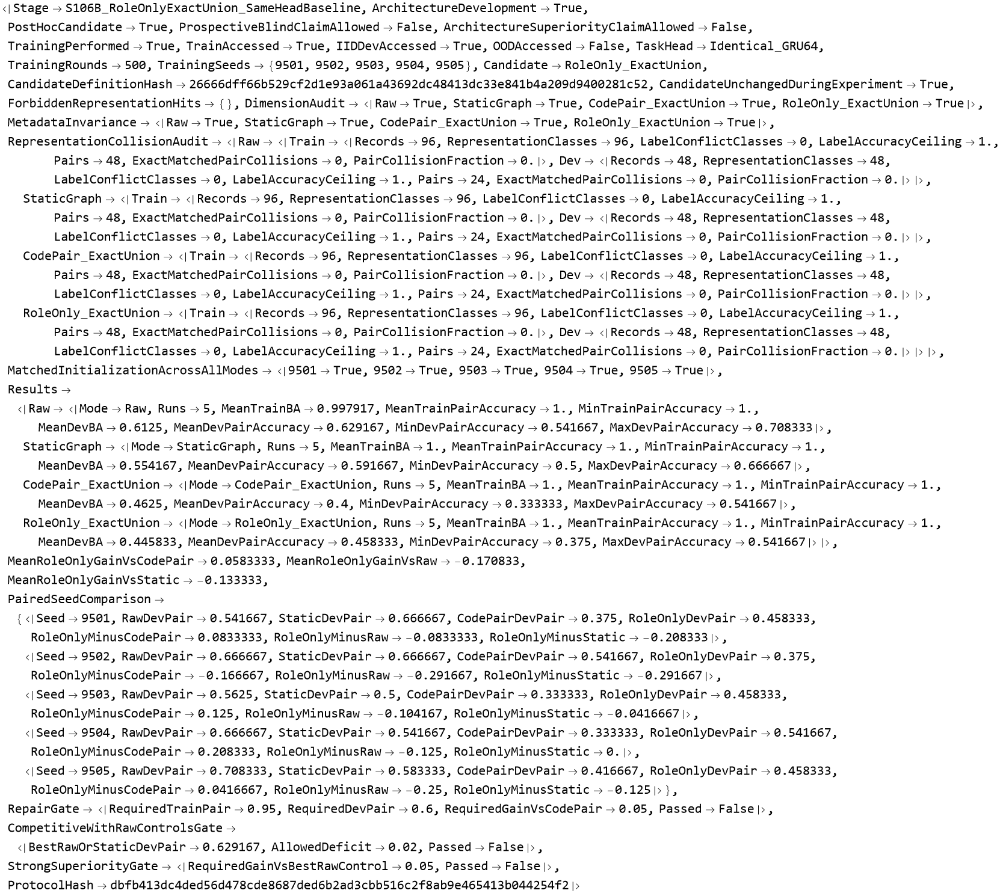

In [3041]:
s106BResult

In [3046]:
Dataset[
  {
    summaryS106B["Raw"],
    summaryS106B["StaticGraph"],
    summaryS106B["CodePair_ExactUnion"],
    summaryS106B["RoleOnly_ExactUnion"]
  }
]

Dataset[{<|Mode -> Raw, Runs -> 5, MeanTrainBA -> 0.997917, MeanTrainPairAccuracy -> 1., 
 
>     MinTrainPairAccuracy -> 1., MeanDevBA -> 0.6125, MeanDevPairAccuracy -> 0.629167, 
 
>     MinDevPairAccuracy -> 0.541667, MaxDevPairAccuracy -> 0.708333|>, 
 
>    <|Mode -> StaticGraph, Runs -> 5, MeanTrainBA -> 1., MeanTrainPairAccuracy -> 1., 
 
>     MinTrainPairAccuracy -> 1., MeanDevBA -> 0.554167, 
 
>     MeanDevPairAccuracy -> 0.591667, MinDevPairAccuracy -> 0.5, 
 
>     MaxDevPairAccuracy -> 0.666667|>, 
 
>    <|Mode -> CodePair_ExactUnion, Runs -> 5, MeanTrainBA -> 1., 
 
>     MeanTrainPairAccuracy -> 1., MinTrainPairAccuracy -> 1., MeanDevBA -> 0.4625, 
 
>     MeanDevPairAccuracy -> 0.4, MinDevPairAccuracy -> 0.333333, 
 
>     MaxDevPairAccuracy -> 0.541667|>, 
 
>    <|Mode -> RoleOnly_ExactUnion, Runs -> 5, MeanTrainBA -> 1., 
 
>     MeanTrainPairAccuracy -> 1., MinTrainPairAccuracy -> 1., MeanDevBA -> 0.445833, 
 
>     MeanDevPairAccuracy -> 0.458333, MinDevPairAccuracy -> 0.375, 
 
>     MaxDevPairAccuracy -> 0.541667|>}, 
 
>   TypeSystem`Vector[TypeSystem`Struct[{Mode, Runs, MeanTrainBA, MeanTrainPairAccuracy, 
 
>      MinTrainPairAccuracy, MeanDevBA, MeanDevPairAccuracy, MinDevPairAccuracy, 
 
>      MaxDevPairAccuracy}, {TypeSystem`Atom[String], TypeSystem`Atom[Integer], 
 
>      TypeSystem`Atom[Real], TypeSystem`Atom[Real], TypeSystem`Atom[Real], 
 
>      TypeSystem`Atom[Real], TypeSystem`Atom[Real], TypeSystem`Atom[Real], 
 
>      TypeSystem`Atom[Real]}], 4], <||>]

In [3051]:
Dataset[
  pairedS106B
]

Dataset[{<|Seed -> 9501, RawDevPair -> 0.541667, StaticDevPair -> 0.666667, 
 
>     CodePairDevPair -> 0.375, RoleOnlyDevPair -> 0.458333, 
 
>     RoleOnlyMinusCodePair -> 0.0833333, RoleOnlyMinusRaw -> -0.0833333, 
 
>     RoleOnlyMinusStatic -> -0.208333|>, 
 
>    <|Seed -> 9502, RawDevPair -> 0.666667, StaticDevPair -> 0.666667, 
 
>     CodePairDevPair -> 0.541667, RoleOnlyDevPair -> 0.375, 
 
>     RoleOnlyMinusCodePair -> -0.166667, RoleOnlyMinusRaw -> -0.291667, 
 
>     RoleOnlyMinusStatic -> -0.291667|>, 
 
>    <|Seed -> 9503, RawDevPair -> 0.5625, StaticDevPair -> 0.5, 
 
>     CodePairDevPair -> 0.333333, RoleOnlyDevPair -> 0.458333, 
 
>     RoleOnlyMinusCodePair -> 0.125, RoleOnlyMinusRaw -> -0.104167, 
 
>     RoleOnlyMinusStatic -> -0.0416667|>, 
 
>    <|Seed -> 9504, RawDevPair -> 0.666667, StaticDevPair -> 0.541667, 
 
>     CodePairDevPair -> 0.333333, RoleOnlyDevPair -> 0.541667, 
 
>     RoleOnlyMinusCodePair -> 0.208333, RoleOnlyMinusRaw -> -0.125, 
 
>     RoleOnlyMinusStatic -> 0.|>, <|Seed -> 9505, RawDevPair -> 0.708333, 
 
>     StaticDevPair -> 0.583333, CodePairDevPair -> 0.416667, 
 
>     RoleOnlyDevPair -> 0.458333, RoleOnlyMinusCodePair -> 0.0416667, 
 
>     RoleOnlyMinusRaw -> -0.25, RoleOnlyMinusStatic -> -0.125|>}, 
 
>   TypeSystem`Vector[TypeSystem`Struct[{Seed, RawDevPair, StaticDevPair, 
 
>      CodePairDevPair, RoleOnlyDevPair, RoleOnlyMinusCodePair, RoleOnlyMinusRaw, 
 
>      RoleOnlyMinusStatic}, {TypeSystem`Atom[Integer], TypeSystem`Atom[Real], 
 
>      TypeSystem`Atom[Real], TypeSystem`Atom[Real], TypeSystem`Atom[Real], 
 
>      TypeSystem`Atom[Real], TypeSystem`Atom[Real], TypeSystem`Atom[Real]}], 5], <||>]

In [3056]:
(* ============================================================ *)
(* S107A                                                        *)
(* Bounded Tagged-Union / Local-State-Class Audit               *)
(*                                                              *)
(* NO TRAINING                                                  *)
(* TRAIN + IID DEV ONLY                                         *)
(* NO OOD                                                       *)
(*                                                              *)
(* Goal: keep Union, replace full recursive identity with       *)
(* finite reusable causal-local tag lists.                      *)
(*                                                              *)
(* Variants:                                                    *)
(*   RoleOnly_UnboundedControl                                  *)
(*   TaggedUnion_K0                                             *)
(*   TaggedUnion_K1                                             *)
(*   TaggedUnion_K2                                             *)
(*   TaggedUnion_K3                                             *)
(* ============================================================ *)

ClearAll["Global`S107A*"];
ClearAll["Global`s107A*"];


s107AResult =
Catch[

(

(* ============================================================ *)
(* 0. FAIL SAFE                                                 *)
(* ============================================================ *)

S107AFail[msg_] := (
  Print["STOP: ", msg];
  Throw[$Failed, "S107A_STOP"];
);


Print["================================================"];
Print["S107A BOUNDED TAGGED-UNION AUDIT"];
Print["================================================"];


(* ============================================================ *)
(* 1. PREFLIGHT                                                 *)
(* ============================================================ *)

If[
  !And[
    ValueQ[trainRecords],
    ValueQ[iidRecords]
  ],
  S107AFail["trainRecords / iidRecords missing."]
];


If[
  Length[DownValues[S103BNodeInfo]] == 0 ||
  Length[DownValues[S103BRelation]] == 0,

  S107AFail[
    "S103BNodeInfo / S103BRelation missing."
  ]
];


allRecordsS107A =
  Join[
    trainRecords,
    iidRecords
  ];


splitLabelsS107A =
  Join[
    ConstantArray[
      "Train",
      Length[trainRecords]
    ],

    ConstantArray[
      "Dev",
      Length[iidRecords]
    ]
  ];


s107AMaxK = 3;


boundedVariantNamesS107A = {
  "TaggedUnion_K0",
  "TaggedUnion_K1",
  "TaggedUnion_K2",
  "TaggedUnion_K3"
};


variantNamesS107A = {
  "RoleOnly_UnboundedControl",
  "TaggedUnion_K0",
  "TaggedUnion_K1",
  "TaggedUnion_K2",
  "TaggedUnion_K3"
};


Print["Preflight = PASS"];
Print["Train records = ", Length[trainRecords]];
Print["IID Dev records = ", Length[iidRecords]];
Print["Variants = ", variantNamesS107A];
Print["NO OOD WILL BE ACCESSED."];


(* ============================================================ *)
(* 2. UNBOUNDED ROLEONLY CONTROL                                *)
(*                                                              *)
(* This reproduces the important semantics of the S106A         *)
(* RoleOnly_ExactUnion control:                                 *)
(*                                                              *)
(* Node descriptor: Role                                        *)
(* Message: SrcRole + DstRole + Relation + FULL source state    *)
(* Aggregate: Union                                             *)
(*                                                              *)
(* The recursive state therefore grows without a provenance     *)
(* depth bound.                                                 *)
(* ============================================================ *)

S107AUnboundedRoleRun[
  r_Association
] :=
Module[
  {
    ni,
    ctx,
    info,

    p,
    pa,
    q,
    n,
    vertices,

    active,
    state,

    nextActive,
    nextState,

    activeParents,

    srcNode,
    dstNode,
    srcInfo,
    dstInfo,

    msgs,
    aggregate,
    descriptor,
    newState,

    trajectory = {},
    events = {},

    roundState,

    safetyCap,
    terminatedNaturally = False,

    j,
    u,
    round
  },


  ni =
    S103BNodeInfo[
      r
    ];


  ctx =
    ni["Context"];

  info =
    ni["Info"];


  p =
    ctx["Pack"];

  pa =
    p[[1]];

  q =
    p[[4]];

  n =
    p[[7]];

  vertices =
    p[[12]];


  safetyCap =
    Max[
      64,
      2 n + 8
    ];


  active =
    ConstantArray[
      False,
      n
    ];


  state =
    ConstantArray[
      None,
      n
    ];


  active[[q]] =
    True;


  state[[q]] =
    Hash[
      {
        "InitialQuery",
        {
          "Role",
          info[
            vertices[[q]]
          ]["Role"]
        }
      },
      "SHA256",
      "HexString"
    ];


  For[
    round = 1,
    round <= safetyCap,
    round++,


    nextActive =
      ConstantArray[
        False,
        n
      ];


    nextState =
      ConstantArray[
        None,
        n
      ];


    Do[

      activeParents =
        Select[
          pa[[j]],

          Function[
            u,

            IntegerQ[u] &&
            u > 0 &&
            TrueQ[
              active[[u]]
            ]
          ]
        ];


      If[
        activeParents =!= {},


        dstNode =
          vertices[[j]];

        dstInfo =
          info[dstNode];


        msgs =
          Table[

            srcNode =
              vertices[[u]];

            srcInfo =
              info[srcNode];


            {
              "SourceRole",
              srcInfo["Role"],

              "DestinationRole",
              dstInfo["Role"],

              "Relation",
              S103BRelation[
                srcInfo,
                dstInfo
              ],

              "SourceState",
              state[[u]]
            },

            {
              u,
              activeParents
            }
          ];


        (* ORIGINAL UNION IDEA *)

        aggregate =
          Union[
            msgs
          ];


        descriptor = {
          "Role",
          dstInfo["Role"]
        };


        newState =
          Hash[
            {
              "RoleOnly_Unbounded",
              descriptor,
              aggregate
            },
            "SHA256",
            "HexString"
          ];


        nextActive[[j]] =
          True;

        nextState[[j]] =
          newState;


        AppendTo[
          events,

          <|

            "Round" ->
              round,

            "Role" ->
              dstInfo["Role"],

            "Position" ->
              dstInfo["Position"],

            "State" ->
              newState

          |>
        ];

      ],

      {
        j,
        n
      }
    ];


    roundState =
      Sort[
        Table[

          If[
            TrueQ[
              nextActive[[j]]
            ],

            {
              {
                "Role",
                info[
                  vertices[[j]]
                ]["Role"]
              },

              nextState[[j]]
            },

            Nothing
          ],

          {
            j,
            n
          }
        ]
      ];


    AppendTo[
      trajectory,

      {
        "Round",
        round,

        "ActiveStateMultiset",
        roundState
      }
    ];


    If[
      Count[
        nextActive,
        True
      ] == 0,

      terminatedNaturally =
        True;

      Break[];
    ];


    active =
      nextActive;

    state =
      nextState;

  ];


  <|

    "Variant" ->
      "RoleOnly_UnboundedControl",

    "RoundsExecuted" ->
      Length[
        trajectory
      ],

    "TerminatedNaturally" ->
      terminatedNaturally,

    "Trajectory" ->
      trajectory,

    "Events" ->
      events

  |>
];


(* ============================================================ *)
(* 3. BOUNDED LOCAL CLASS DEFINITION                            *)
(*                                                              *)
(* C0(v) = Role(v)                                              *)
(*                                                              *)
(* Ck(v) = {                                                    *)
(*   Role(v),                                                   *)
(*   Union[{SrcRole, DstRole, Relation, C(k-1)(src)}]           *)
(* }                                                            *)
(*                                                              *)
(* This is the key experiment.                                  *)
(*                                                              *)
(* No node ID                                                   *)
(* No packed index                                              *)
(* No absolute position                                         *)
(* No CodePair                                                  *)
(* No entire sequence                                           *)
(* No suffix                                                    *)
(* No Y                                                         *)
(* No complete recursive SHA state                              *)
(* ============================================================ *)

S107ABoundedRun[
  r_Association
] :=
Module[
  {
    ni,
    ctx,
    info,

    p,
    pa,
    q,
    n,
    vertices,

    active,

    classes,
    nextClasses,

    nextActive,
    activeParents,

    srcNode,
    dstNode,
    srcInfo,
    dstInfo,

    msgs,
    aggregate,

    trajectories,
    events,

    roundItems,

    safetyCap,
    terminatedNaturally = False,

    j,
    u,
    d,
    k,
    round
  },


  ni =
    S103BNodeInfo[
      r
    ];


  ctx =
    ni["Context"];

  info =
    ni["Info"];


  p =
    ctx["Pack"];

  pa =
    p[[1]];

  q =
    p[[4]];

  n =
    p[[7]];

  vertices =
    p[[12]];


  safetyCap =
    Max[
      64,
      2 n + 8
    ];


  active =
    ConstantArray[
      False,
      n
    ];


  (* index 1 = K0
     index 2 = K1
     index 3 = K2
     index 4 = K3 *)

  classes =
    Table[
      ConstantArray[
        None,
        n
      ],
      {
        s107AMaxK + 1
      }
    ];


  trajectories =
    Table[
      {},
      {
        s107AMaxK + 1
      }
    ];


  events =
    Table[
      {},
      {
        s107AMaxK + 1
      }
    ];


  active[[q]] =
    True;


  (* Initial query has the same finite marker at every K. *)

  Do[

    classes[[k + 1, q]] = {
      "InitialQuery",
      "Role",
      info[
        vertices[[q]]
      ]["Role"]
    },

    {
      k,
      0,
      s107AMaxK
    }
  ];


  For[
    round = 1,
    round <= safetyCap,
    round++,


    nextActive =
      ConstantArray[
        False,
        n
      ];


    nextClasses =
      Table[
        ConstantArray[
          None,
          n
        ],
        {
          s107AMaxK + 1
        }
      ];


    Do[

      activeParents =
        Select[
          pa[[j]],

          Function[
            u,

            IntegerQ[u] &&
            u > 0 &&
            TrueQ[
              active[[u]]
            ]
          ]
        ];


      If[
        activeParents =!= {},


        dstNode =
          vertices[[j]];

        dstInfo =
          info[dstNode];


        nextActive[[j]] =
          True;


        (* ----------------------------------------------- *)
        (* K0: only the node role                          *)
        (* ----------------------------------------------- *)

        nextClasses[[1, j]] = {
          "Role",
          dstInfo["Role"]
        };


        (* ----------------------------------------------- *)
        (* K1..K3                                         *)
        (* ----------------------------------------------- *)

        Do[

          msgs =
            Table[

              srcNode =
                vertices[[u]];

              srcInfo =
                info[srcNode];


              {
                "SourceRole",
                srcInfo["Role"],

                "DestinationRole",
                dstInfo["Role"],

                "Relation",
                S103BRelation[
                  srcInfo,
                  dstInfo
                ],

                "SourceLocalClass",
                classes[[d, u]]
              },

              {
                u,
                activeParents
              }
            ];


          (* EXACTLY the Union principle the user proposed:
             only identical complete local-tag lists merge. *)

          aggregate =
            Union[
              msgs
            ];


          nextClasses[[d + 1, j]] = {

            "Role",
            dstInfo["Role"],

            "CausalParentTagSet",
            aggregate

          },

          {
            d,
            1,
            s107AMaxK
          }
        ];


        (* diagnostic event for every K *)

        Do[

          events[[k + 1]] =
            Append[
              events[[k + 1]],

              <|

                "Round" ->
                  round,

                "Role" ->
                  dstInfo["Role"],

                (* Position only locates the landmark during
                   diagnostic analysis. It is NOT part of State. *)

                "Position" ->
                  dstInfo["Position"],

                "State" ->
                  nextClasses[[k + 1, j]]

              |>
            ],

          {
            k,
            0,
            s107AMaxK
          }
        ];

      ],

      {
        j,
        n
      }
    ];


    (* build one trajectory per bounded depth *)

    Do[

      roundItems =
        Sort[
          Table[

            If[
              TrueQ[
                nextActive[[j]]
              ],

              nextClasses[[k + 1, j]],

              Nothing
            ],

            {
              j,
              n
            }
          ]
        ];


      trajectories[[k + 1]] =
        Append[
          trajectories[[k + 1]],

          {
            "Round",
            round,

            "ActiveStateMultiset",
            roundItems
          }
        ],

      {
        k,
        0,
        s107AMaxK
      }
    ];


    If[
      Count[
        nextActive,
        True
      ] == 0,

      terminatedNaturally =
        True;

      Break[];
    ];


    active =
      nextActive;

    classes =
      nextClasses;

  ];


  <|

    "TaggedUnion_K0" ->
      <|
        "Variant" -> "TaggedUnion_K0",
        "RoundsExecuted" -> Length[trajectories[[1]]],
        "TerminatedNaturally" -> terminatedNaturally,
        "Trajectory" -> trajectories[[1]],
        "Events" -> events[[1]]
      |>,

    "TaggedUnion_K1" ->
      <|
        "Variant" -> "TaggedUnion_K1",
        "RoundsExecuted" -> Length[trajectories[[2]]],
        "TerminatedNaturally" -> terminatedNaturally,
        "Trajectory" -> trajectories[[2]],
        "Events" -> events[[2]]
      |>,

    "TaggedUnion_K2" ->
      <|
        "Variant" -> "TaggedUnion_K2",
        "RoundsExecuted" -> Length[trajectories[[3]]],
        "TerminatedNaturally" -> terminatedNaturally,
        "Trajectory" -> trajectories[[3]],
        "Events" -> events[[3]]
      |>,

    "TaggedUnion_K3" ->
      <|
        "Variant" -> "TaggedUnion_K3",
        "RoundsExecuted" -> Length[trajectories[[4]]],
        "TerminatedNaturally" -> terminatedNaturally,
        "Trajectory" -> trajectories[[4]],
        "Events" -> events[[4]]
      |>

  |>
];


(* ============================================================ *)
(* 4. COMPUTE ALL RUNS                                          *)
(* ============================================================ *)

Print[
  "Computing unbounded RoleOnly control..."
];


unboundedRunsS107A =
  S107AUnboundedRoleRun /@
    allRecordsS107A;


Print[
  "Computing bounded TaggedUnion K0..K3..."
];


boundedBundleRunsS107A =
  S107ABoundedRun /@
    allRecordsS107A;


runsByVariantS107A =
  <|

    "RoleOnly_UnboundedControl" ->
      unboundedRunsS107A,

    "TaggedUnion_K0" ->
      (
        #["TaggedUnion_K0"] &
      ) /@
        boundedBundleRunsS107A,

    "TaggedUnion_K1" ->
      (
        #["TaggedUnion_K1"] &
      ) /@
        boundedBundleRunsS107A,

    "TaggedUnion_K2" ->
      (
        #["TaggedUnion_K2"] &
      ) /@
        boundedBundleRunsS107A,

    "TaggedUnion_K3" ->
      (
        #["TaggedUnion_K3"] &
      ) /@
        boundedBundleRunsS107A

  |>;


Print["All S107A variants computed."];


(* ============================================================ *)
(* 5. CANONICAL BOOKKEEPING KEY                                 *)
(*                                                              *)
(* Used only for audit counting.                                *)
(* It does NOT participate in TCCT dynamics.                    *)
(* ============================================================ *)

S107AStateKey[x_] :=
  ToString[
    InputForm[
      x
    ]
  ];


(* ============================================================ *)
(* 6. TRAIN MATCHED-PAIR COLLISION AUDIT                        *)
(* ============================================================ *)

S107ACollisionAudit[
  variant_String
] :=
Module[
  {
    runs,
    trainRows,
    groups,
    collisions
  },


  runs =
    runsByVariantS107A[
      variant
    ];


  trainRows =
    Table[

      <|

        "PairID" ->
          trainRecords[[i]]["PairID"],

        "Y" ->
          trainRecords[[i]]["Y"],

        "Representation" ->
          runs[[i]]["Trajectory"]

      |>,

      {
        i,
        Length[
          trainRecords
        ]
      }
    ];


  groups =
    Values@
      GroupBy[
        trainRows,
        #["PairID"] &
      ];


  collisions =
    Table[

      Module[
        {
          pos,
          neg
        },


        pos =
          First[
            Cases[
              g,
              a_Association /;
                a["Y"] === 1
            ]
          ];


        neg =
          First[
            Cases[
              g,
              a_Association /;
                a["Y"] === 0
            ]
          ];


        SameQ[
          pos["Representation"],
          neg["Representation"]
        ]

      ],

      {
        g,
        groups
      }
    ];


  <|

    "TrainPairs" ->
      Length[
        groups
      ],

    "TrainPairCollisions" ->
      Count[
        collisions,
        True
      ],

    "TrainPairCollisionFraction" ->
      N[
        Count[
          collisions,
          True
        ] /
        Length[
          collisions
        ]
      ]

  |>
];


(* ============================================================ *)
(* 7. STATE REUSE / DEV COVERAGE AUDIT                          *)
(* ============================================================ *)

S107AReuseAudit[
  variant_String
] :=
Module[
  {
    runs,

    trainEvents,
    devEvents,

    trainKeys,
    devKeys,

    trainUnique,
    devUnique,

    stateToRecords,
    reusable,
    singleton,

    trainSet
  },


  runs =
    runsByVariantS107A[
      variant
    ];


  trainEvents =
    Flatten[
      Table[

        (
          Join[
            #,
            <|
              "RecordIndex" ->
                i
            |>
          ] &
        ) /@
          runs[[i]]["Events"],

        {
          i,
          1,
          Length[
            trainRecords
          ]
        }
      ],

      1
    ];


  devEvents =
    Flatten[
      Table[

        (
          Join[
            #,
            <|
              "RecordIndex" ->
                i
            |>
          ] &
        ) /@
          runs[[
            Length[trainRecords] + i
          ]]["Events"],

        {
          i,
          1,
          Length[
            iidRecords
          ]
        }
      ],

      1
    ];


  trainKeys =
    (
      S107AStateKey[
        #["State"]
      ] &
    ) /@
      trainEvents;


  devKeys =
    (
      S107AStateKey[
        #["State"]
      ] &
    ) /@
      devEvents;


  trainUnique =
    DeleteDuplicates[
      trainKeys
    ];


  devUnique =
    DeleteDuplicates[
      devKeys
    ];


  stateToRecords =
    GroupBy[

      trainEvents,

      S107AStateKey[
        #["State"]
      ] &,

      DeleteDuplicates[
        (
          #["RecordIndex"] &
        ) /@
          #
      ] &
    ];


  reusable =
    Keys[
      Select[
        stateToRecords,
        Length[#] >= 2 &
      ]
    ];


  singleton =
    Keys[
      Select[
        stateToRecords,
        Length[#] == 1 &
      ]
    ];


  trainSet =
    AssociationThread[
      trainUnique,

      ConstantArray[
        True,
        Length[
          trainUnique
        ]
      ]
    ];


  <|

    "TrainStateEvents" ->
      Length[
        trainKeys
      ],

    "TrainUniqueStates" ->
      Length[
        trainUnique
      ],

    "TrainReusableUniqueStates" ->
      Length[
        reusable
      ],

    "TrainUniqueStateReuseFraction" ->
      If[
        trainUnique === {},
        Missing["NoTrainStates"],
        N[
          Length[
            reusable
          ] /
          Length[
            trainUnique
          ]
        ]
      ],

    "TrainSingletonUniqueStateFraction" ->
      If[
        trainUnique === {},
        Missing["NoTrainStates"],
        N[
          Length[
            singleton
          ] /
          Length[
            trainUnique
          ]
        ]
      ],

    "DevStateEvents" ->
      Length[
        devKeys
      ],

    "DevUniqueStates" ->
      Length[
        devUnique
      ],

    "DevUniqueStateCoverageByTrain" ->
      If[
        devUnique === {},
        Missing["NoDevStates"],
        N[
          Count[
            devUnique,

            x_ /;
              KeyExistsQ[
                trainSet,
                x
              ]
          ] /
          Length[
            devUnique
          ]
        ]
      ],

    "DevStateEventCoverageByTrain" ->
      If[
        devKeys === {},
        Missing["NoDevEvents"],
        N[
          Mean[
            (
              Boole[
                KeyExistsQ[
                  trainSet,
                  #
                ]
              ] &
            ) /@
              devKeys
          ]
        ]
      ]

  |>
];


(* ============================================================ *)
(* 8. PREFIX LANDMARK                                           *)
(* ============================================================ *)

S107AFirstExitState[
  run_Association,
  pos_Integer
] :=
Module[
  {
    hits
  },


  hits =
    Cases[
      run["Events"],

      a_Association /;
        And[
          a["Role"] ===
            "TokenExit",

          a["Position"] ===
            pos
        ]
    ];


  If[
    hits === {},

    Missing[
      "NotReached"
    ],

    First[
      SortBy[
        hits,
        #["Round"] &
      ]
    ]["State"]
  ]
];


S107APrefixKey[
  seq_,
  k_Integer
] :=
  ToString[
    InputForm[
      Take[
        seq,
        k
      ]
    ]
  ];


S107ASeqKey[
  seq_
] :=
  ToString[
    InputForm[
      seq
    ]
  ];


(* ============================================================ *)
(* 9. SAME-PREFIX DIFFERENT-SUFFIX AGREEMENT                    *)
(* ============================================================ *)

S107APrefixReuseAudit[
  variant_String
] :=
Module[
  {
    runs,
    rows,
    maxK,
    result
  },


  runs =
    runsByVariantS107A[
      variant
    ];


  rows =
    Flatten[
      Table[

        Table[

          <|

            "RecordIndex" ->
              i,

            "PrefixLength" ->
              k,

            "PrefixKey" ->
              S107APrefixKey[
                allRecordsS107A[[i]][
                  "Seq"
                ],
                k
              ],

            "SeqKey" ->
              S107ASeqKey[
                allRecordsS107A[[i]][
                  "Seq"
                ]
              ],

            "State" ->
              S107AFirstExitState[
                runs[[i]],
                k
              ]

          |>,

          {
            k,
            Length[
              allRecordsS107A[[i]][
                "Seq"
              ]
            ]
          }
        ],

        {
          i,
          Length[
            allRecordsS107A
          ]
        }
      ],

      1
    ];


  maxK =
    Max[
      (
        #["PrefixLength"] &
      ) /@
        rows
    ];


  result =
    Table[

      Module[
        {
          rr,
          groups,
          eligibleGroups,
          pairs,
          n,
          same
        },


        rr =
          Cases[
            rows,

            a_Association /;
              a["PrefixLength"] ===
                k
          ];


        groups =
          Values@
            GroupBy[
              rr,
              #["PrefixKey"] &
            ];


        eligibleGroups =
          Select[
            groups,

            Length[
              DeleteDuplicates[
                (
                  #["SeqKey"] &
                ) /@
                  #
              ]
            ] >= 2 &
          ];


        pairs =
          Flatten[
            Table[

              Select[
                Subsets[
                  g,
                  {2}
                ],

                #[[1]]["SeqKey"] =!=
                  #[[2]]["SeqKey"] &
              ],

              {
                g,
                eligibleGroups
              }
            ],

            1
          ];


        n =
          Length[
            pairs
          ];


        same =
          Count[
            pairs,

            p_ /;
              SameQ[
                p[[1]]["State"],
                p[[2]]["State"]
              ]
          ];


        <|

          "PrefixLength" ->
            k,

          "PairComparisons" ->
            n,

          "ExitStateAgreement" ->
            If[
              n == 0,

              Missing[
                "NoPairs"
              ],

              N[
                same /
                n
              ]
            ]

        |>

      ],

      {
        k,
        1,
        maxK
      }
    ];


  result
];


(* ============================================================ *)
(* 10. RUN ALL AUDITS                                           *)
(* ============================================================ *)

Print["Running collision audits..."];


collisionByVariantS107A =
  <|

    "RoleOnly_UnboundedControl" ->
      S107ACollisionAudit[
        "RoleOnly_UnboundedControl"
      ],

    "TaggedUnion_K0" ->
      S107ACollisionAudit[
        "TaggedUnion_K0"
      ],

    "TaggedUnion_K1" ->
      S107ACollisionAudit[
        "TaggedUnion_K1"
      ],

    "TaggedUnion_K2" ->
      S107ACollisionAudit[
        "TaggedUnion_K2"
      ],

    "TaggedUnion_K3" ->
      S107ACollisionAudit[
        "TaggedUnion_K3"
      ]

  |>;


Print["Running state-reuse audits..."];


reuseByVariantS107A =
  <|

    "RoleOnly_UnboundedControl" ->
      S107AReuseAudit[
        "RoleOnly_UnboundedControl"
      ],

    "TaggedUnion_K0" ->
      S107AReuseAudit[
        "TaggedUnion_K0"
      ],

    "TaggedUnion_K1" ->
      S107AReuseAudit[
        "TaggedUnion_K1"
      ],

    "TaggedUnion_K2" ->
      S107AReuseAudit[
        "TaggedUnion_K2"
      ],

    "TaggedUnion_K3" ->
      S107AReuseAudit[
        "TaggedUnion_K3"
      ]

  |>;


Print["Running prefix-reuse audits..."];


prefixReuseByVariantS107A =
  <|

    "RoleOnly_UnboundedControl" ->
      S107APrefixReuseAudit[
        "RoleOnly_UnboundedControl"
      ],

    "TaggedUnion_K0" ->
      S107APrefixReuseAudit[
        "TaggedUnion_K0"
      ],

    "TaggedUnion_K1" ->
      S107APrefixReuseAudit[
        "TaggedUnion_K1"
      ],

    "TaggedUnion_K2" ->
      S107APrefixReuseAudit[
        "TaggedUnion_K2"
      ],

    "TaggedUnion_K3" ->
      S107APrefixReuseAudit[
        "TaggedUnion_K3"
      ]

  |>;


(* ============================================================ *)
(* 11. MEAN PREFIX AGREEMENT K=1..6                             *)
(* ============================================================ *)

S107AMeanPrefixAgreement[
  rows_List
] :=
Module[
  {
    vals
  },


  vals =
    DeleteMissing[
      (
        #["ExitStateAgreement"] &
      ) /@
        Cases[
          rows,

          a_Association /;
            a["PrefixLength"] <= 6
        ]
    ];


  If[
    vals === {},

    Missing[
      "NoPrefixPairs"
    ],

    N[
      Mean[
        vals
      ]
    ]
  ]
];


(* ============================================================ *)
(* 12. SCOREBOARD                                               *)
(* ============================================================ *)

S107AScoreRow[
  variant_String
] :=
  <|

    "Variant" ->
      variant,

    "TrainPairCollisions" ->
      collisionByVariantS107A[
        variant
      ][
        "TrainPairCollisions"
      ],

    "TrainPairCollisionFraction" ->
      collisionByVariantS107A[
        variant
      ][
        "TrainPairCollisionFraction"
      ],

    "TrainUniqueStates" ->
      reuseByVariantS107A[
        variant
      ][
        "TrainUniqueStates"
      ],

    "TrainStateReuseFraction" ->
      reuseByVariantS107A[
        variant
      ][
        "TrainUniqueStateReuseFraction"
      ],

    "TrainSingletonFraction" ->
      reuseByVariantS107A[
        variant
      ][
        "TrainSingletonUniqueStateFraction"
      ],

    "DevUniqueCoverage" ->
      reuseByVariantS107A[
        variant
      ][
        "DevUniqueStateCoverageByTrain"
      ],

    "DevEventCoverage" ->
      reuseByVariantS107A[
        variant
      ][
        "DevStateEventCoverageByTrain"
      ],

    "MeanPrefixExitAgreementK1to6" ->
      S107AMeanPrefixAgreement[
        prefixReuseByVariantS107A[
          variant
        ]
      ]

  |>;


scoreboardS107A = {

  S107AScoreRow[
    "RoleOnly_UnboundedControl"
  ],

  S107AScoreRow[
    "TaggedUnion_K0"
  ],

  S107AScoreRow[
    "TaggedUnion_K1"
  ],

  S107AScoreRow[
    "TaggedUnion_K2"
  ],

  S107AScoreRow[
    "TaggedUnion_K3"
  ]

};


(* ============================================================ *)
(* 13. DEVELOPMENT GATES                                        *)
(*                                                              *)
(* Not a final model-selection claim.                           *)
(* We are looking for a useful middle state abstraction.        *)
(* ============================================================ *)

gateRowsS107A =
  Table[

    <|

      "Variant" ->
        row["Variant"],


      "AntiAliasingPass" ->
        TrueQ[
          row[
            "TrainPairCollisionFraction"
          ] <= 0.10
        ],


      "PrefixLocalityPass" ->
        TrueQ[
          row[
            "MeanPrefixExitAgreementK1to6"
          ] >= 0.80
        ],


      "DevCoveragePass" ->
        TrueQ[
          row[
            "DevEventCoverage"
          ] >= 0.60
        ],


      "ReusePass" ->
        TrueQ[
          row[
            "TrainSingletonFraction"
          ] <= 0.60
        ],


      "AllDiagnosticGatesPass" ->
        And[

          TrueQ[
            row[
              "TrainPairCollisionFraction"
            ] <= 0.10
          ],

          TrueQ[
            row[
              "MeanPrefixExitAgreementK1to6"
            ] >= 0.80
          ],

          TrueQ[
            row[
              "DevEventCoverage"
            ] >= 0.60
          ],

          TrueQ[
            row[
              "TrainSingletonFraction"
            ] <= 0.60
          ]

        ]

    |>,

    {
      row,
      scoreboardS107A
    }
  ];


(* ============================================================ *)
(* 14. PROTOCOL HASH                                            *)
(* ============================================================ *)

protocolHashS107A =
  Hash[
    {

      "S107A_BoundedTaggedUnion",

      s107AMaxK,

      DownValues[
        S107AUnboundedRoleRun
      ],

      DownValues[
        S107ABoundedRun
      ],

      DownValues[
        S107ACollisionAudit
      ],

      DownValues[
        S107AReuseAudit
      ],

      DownValues[
        S107APrefixReuseAudit
      ]

    },

    "SHA256",
    "HexString"
  ];


(* ============================================================ *)
(* 15. FINAL REPORT                                             *)
(* ============================================================ *)

finalS107A =
  <|

    "Stage" ->
      "S107A_BoundedTaggedUnion_LocalStateClassAudit",

    "ArchitectureDevelopment" ->
      True,

    "PostHocDevelopment" ->
      True,

    "TrainingPerformed" ->
      False,

    "TrainAccessed" ->
      True,

    "IIDDevAccessed" ->
      True,

    "OODAccessed" ->
      False,

    "UnionPreserved" ->
      True,

    "UniqueNodeIdentifierUsed" ->
      False,

    "PackedNodeIndexUsedInState" ->
      False,

    "AbsolutePositionUsedInState" ->
      False,

    "CodePairUsed" ->
      False,

    "TokenIdentityUsed" ->
      False,

    "FullRecursiveStateUsedByBoundedVariants" ->
      False,

    "BoundedDepthsTested" ->
      {0, 1, 2, 3},

    "Scoreboard" ->
      scoreboardS107A,

    "DevelopmentGates" ->
      gateRowsS107A,

    "PrefixReuseByVariant" ->
      prefixReuseByVariantS107A,

    "ProtocolHash" ->
      protocolHashS107A

  |>;


Print["================================================"];
Print["S107A COMPLETE"];
Print["================================================"];


finalS107A

),

"S107A_STOP"
];

S107A BOUNDED TAGGED-UNION AUDIT
Preflight = PASS
Train records = 96
IID Dev records = 48
Variants = {RoleOnly_UnboundedControl, TaggedUnion_K0, TaggedUnion_K1, 
 
>    TaggedUnion_K2, TaggedUnion_K3}
NO OOD WILL BE ACCESSED.
Computing unbounded RoleOnly control...
Computing bounded TaggedUnion K0..K3...
All S107A variants computed.
Running collision audits...
Running state-reuse audits...
Running prefix-reuse audits...
S107A COMPLETE


<|Stage -> S107A_BoundedTaggedUnion_LocalStateClassAudit, 
 
>   ArchitectureDevelopment -> True, PostHocDevelopment -> True, 
 
>   TrainingPerformed -> False, TrainAccessed -> True, IIDDevAccessed -> True, 
 
>   OODAccessed -> False, UnionPreserved -> True, UniqueNodeIdentifierUsed -> False, 
 
>   PackedNodeIndexUsedInState -> False, AbsolutePositionUsedInState -> False, 
 
>   CodePairUsed -> False, TokenIdentityUsed -> False, 
 
>   FullRecursiveStateUsedByBoundedVariants -> False, 
 
>   BoundedDepthsTested -> {0, 1, 2, 3}, 
 
>   Scoreboard -> 
 
>    {<|Variant -> RoleOnly_UnboundedControl, TrainPairCollisions -> 0, 
 
>      TrainPairCollisionFraction -> 0., TrainUniqueStates -> 1031, 
 
>      TrainStateReuseFraction -> 0.304559, TrainSingletonFraction -> 0.695441, 
 
>      DevUniqueCoverage -> 0.503279, DevEventCoverage -> 0.785933, 
 
>      MeanPrefixExitAgreementK1to6 -> 1.|>, 
 
>     <|Variant -> TaggedUnion_K0, TrainPairCollisions -> 0, 
 
>      TrainPairCollisionFraction -> 0., TrainUniqueStates -> 6, 
 
>      TrainStateReuseFraction -> 1., TrainSingletonFraction -> 0., 
 
>      DevUniqueCoverage -> 1., DevEventCoverage -> 1., 
 
>      MeanPrefixExitAgreementK1to6 -> 1.|>, 
 
>     <|Variant -> TaggedUnion_K1, TrainPairCollisions -> 0, 
 
>      TrainPairCollisionFraction -> 0., TrainUniqueStates -> 13, 
 
>      TrainStateReuseFraction -> 1., TrainSingletonFraction -> 0., 
 
>      DevUniqueCoverage -> 1., DevEventCoverage -> 1., 
 
>      MeanPrefixExitAgreementK1to6 -> 1.|>, 
 
>     <|Variant -> TaggedUnion_K2, TrainPairCollisions -> 0, 
 
>      TrainPairCollisionFraction -> 0., TrainUniqueStates -> 18, 
 
>      TrainStateReuseFraction -> 1., TrainSingletonFraction -> 0., 
 
>      DevUniqueCoverage -> 1., DevEventCoverage -> 1., 
 
>      MeanPrefixExitAgreementK1to6 -> 1.|>, 
 
>     <|Variant -> TaggedUnion_K3, TrainPairCollisions -> 0, 
 
>      TrainPairCollisionFraction -> 0., TrainUniqueStates -> 23, 
 
>      TrainStateReuseFraction -> 1., TrainSingletonFraction -> 0., 
 
>      DevUniqueCoverage -> 1., DevEventCoverage -> 1., 
 
>      MeanPrefixExitAgreementK1to6 -> 1.|>}, 
 
>   DevelopmentGates -> 
 
>    {<|Variant -> RoleOnly_UnboundedControl, AntiAliasingPass -> True, 
 
>      PrefixLocalityPass -> True, DevCoveragePass -> True, ReusePass -> False, 
 
>      AllDiagnosticGatesPass -> False|>, 
 
>     <|Variant -> TaggedUnion_K0, AntiAliasingPass -> True, PrefixLocalityPass -> True, 
 
>      DevCoveragePass -> True, ReusePass -> True, AllDiagnosticGatesPass -> True|>, 
 
>     <|Variant -> TaggedUnion_K1, AntiAliasingPass -> True, PrefixLocalityPass -> True, 
 
>      DevCoveragePass -> True, ReusePass -> True, AllDiagnosticGatesPass -> True|>, 
 
>     <|Variant -> TaggedUnion_K2, AntiAliasingPass -> True, PrefixLocalityPass -> True, 
 
>      DevCoveragePass -> True, ReusePass -> True, AllDiagnosticGatesPass -> True|>, 
 
>     <|Variant -> TaggedUnion_K3, AntiAliasingPass -> True, PrefixLocalityPass -> True, 
 
>      DevCoveragePass -> True, ReusePass -> True, AllDiagnosticGatesPass -> True|>}, 
 
>   PrefixReuseByVariant -> 
 
>    <|RoleOnly_UnboundedControl -> 
 
>      {<|PrefixLength -> 1, PairComparisons -> 5122, ExitStateAgreement -> 1.|>, 
 
>       <|PrefixLength -> 2, PairComparisons -> 2538, ExitStateAgreement -> 1.|>, 
 
>       <|PrefixLength -> 3, PairComparisons -> 1188, ExitStateAgreement -> 1.|>, 
 
>       <|PrefixLength -> 4, PairComparisons -> 683, ExitStateAgreement -> 1.|>, 
 
>       <|PrefixLength -> 5, PairComparisons -> 420, ExitStateAgreement -> 1.|>, 
 
>       <|PrefixLength -> 6, PairComparisons -> 284, ExitStateAgreement -> 1.|>, 
 
>       <|PrefixLength -> 7, PairComparisons -> 46, ExitStateAgreement -> 1.|>, 
 
>       <|PrefixLength -> 8, PairComparisons -> 16, ExitStateAgreement -> 1.|>, 
 
>       <|PrefixLength -> 9, PairComparisons -> 1, ExitStateAgreement -> 1.|>, 
 
>       <|PrefixLength -> 10, PairComparisons -> 0, 
 
>        ExitSta
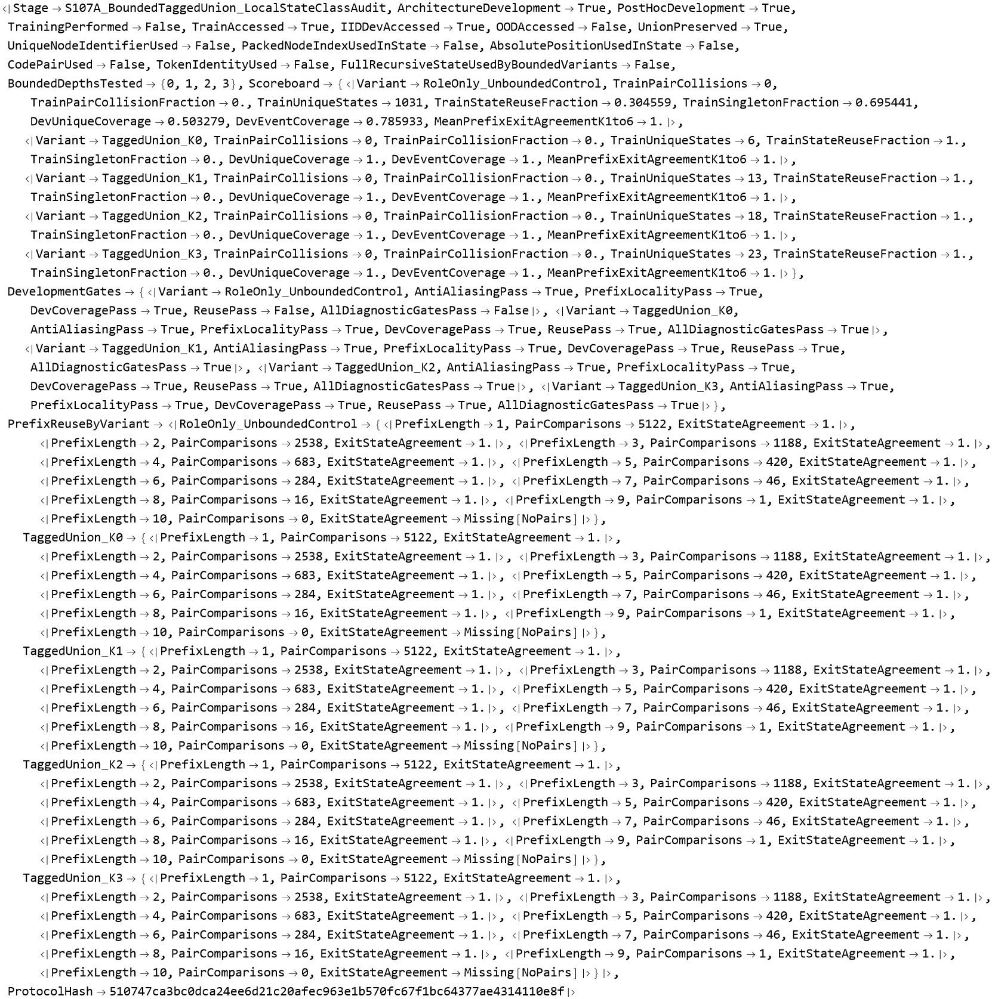

In [3081]:
s107AResult

In [3086]:
Dataset[
  scoreboardS107A
]

Dataset[{<|Variant -> RoleOnly_UnboundedControl, TrainPairCollisions -> 0, 
 
>     TrainPairCollisionFraction -> 0., TrainUniqueStates -> 1031, 
 
>     TrainStateReuseFraction -> 0.304559, TrainSingletonFraction -> 0.695441, 
 
>     DevUniqueCoverage -> 0.503279, DevEventCoverage -> 0.785933, 
 
>     MeanPrefixExitAgreementK1to6 -> 1.|>, 
 
>    <|Variant -> TaggedUnion_K0, TrainPairCollisions -> 0, 
 
>     TrainPairCollisionFraction -> 0., TrainUniqueStates -> 6, 
 
>     TrainStateReuseFraction -> 1., TrainSingletonFraction -> 0., 
 
>     DevUniqueCoverage -> 1., DevEventCoverage -> 1., 
 
>     MeanPrefixExitAgreementK1to6 -> 1.|>, 
 
>    <|Variant -> TaggedUnion_K1, TrainPairCollisions -> 0, 
 
>     TrainPairCollisionFraction -> 0., TrainUniqueStates -> 13, 
 
>     TrainStateReuseFraction -> 1., TrainSingletonFraction -> 0., 
 
>     DevUniqueCoverage -> 1., DevEventCoverage -> 1., 
 
>     MeanPrefixExitAgreementK1to6 -> 1.|>, 
 
>    <|Variant -> TaggedUnion_K2, TrainPairCollisions -> 0, 
 
>     TrainPairCollisionFraction -> 0., TrainUniqueStates -> 18, 
 
>     TrainStateReuseFraction -> 1., TrainSingletonFraction -> 0., 
 
>     DevUniqueCoverage -> 1., DevEventCoverage -> 1., 
 
>     MeanPrefixExitAgreementK1to6 -> 1.|>, 
 
>    <|Variant -> TaggedUnion_K3, TrainPairCollisions -> 0, 
 
>     TrainPairCollisionFraction -> 0., TrainUniqueStates -> 23, 
 
>     TrainStateReuseFraction -> 1., TrainSingletonFraction -> 0., 
 
>     DevUniqueCoverage -> 1., DevEventCoverage -> 1., 
 
>     MeanPrefixExitAgreementK1to6 -> 1.|>}, 
 
>   TypeSystem`Vector[TypeSystem`Struct[{Variant, TrainPairCollisions, 
 
>      TrainPairCollisionFraction, TrainUniqueStates, TrainStateReuseFraction, 
 
>      TrainSingletonFraction, DevUniqueCoverage, DevEventCoverage, 
 
>      MeanPrefixExitAgreementK1to6}, 
 
>     {TypeSystem`Atom[String], TypeSystem`Atom[Integer], TypeSystem`Atom[Real], 
 
>      TypeSystem`Atom[Integer], TypeSystem`Atom[Real], TypeSystem`Atom[Real], 
 
>      TypeSystem`Atom[Real], TypeSystem`Atom[Real], TypeSystem`Atom[Real]}], 5], <||>]

Dataset[{<|Variant -> RoleOnly_UnboundedControl, AntiAliasingPass -> True, 
 
>     PrefixLocalityPass -> True, DevCoveragePass -> True, ReusePass -> False, 
 
>     AllDiagnosticGatesPass -> False|>, 
 
>    <|Variant -> TaggedUnion_K0, AntiAliasingPass -> True, PrefixLocalityPass -> True, 
 
>     DevCoveragePass -> True, ReusePass -> True, AllDiagnosticGatesPass -> True|>, 
 
>    <|Variant -> TaggedUnion_K1, AntiAliasingPass -> True, PrefixLocalityPass -> True, 
 
>     DevCoveragePass -> True, ReusePass -> True, AllDiagnosticGatesPass -> True|>, 
 
>    <|Variant -> TaggedUnion_K2, AntiAliasingPass -> True, PrefixLocalityPass -> True, 
 
>     DevCoveragePass -> True, ReusePass -> True, AllDiagnosticGatesPass -> True|>, 
 
>    <|Variant -> TaggedUnion_K3, AntiAliasingPass -> True, PrefixLocalityPass -> True, 
 
>     DevCoveragePass -> True, ReusePass -> True, AllDiagnosticGatesPass -> True|>}, 
 
>   TypeSystem`Vector[TypeSystem`Struct[{Variant, AntiAliasingPass, PrefixLocalityPass, 
 
>      DevCoveragePass, ReusePass, AllDiagnosticGatesPass}, 
 
>     {TypeSystem`Atom[String], TypeSystem`Atom[TypeSystem`Boolean], 
 
>      TypeSystem`Atom[TypeSystem`Boolean], TypeSystem`Atom[TypeSystem`Boolean], 
 
>      TypeSystem`Atom[TypeSystem`Boolean], TypeSystem`Atom[TypeSystem`Boolean]}], 5], 
 
>   <||>]
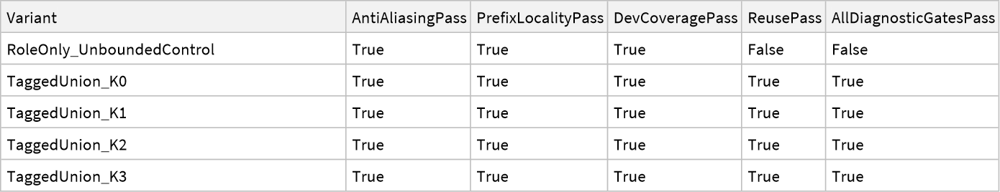

In [3091]:
Dataset[
  gateRowsS107A
]

Dataset[{<|PrefixLength -> 1, PairComparisons -> 5122, ExitStateAgreement -> 1.|>, 
 
>    <|PrefixLength -> 2, PairComparisons -> 2538, ExitStateAgreement -> 1.|>, 
 
>    <|PrefixLength -> 3, PairComparisons -> 1188, ExitStateAgreement -> 1.|>, 
 
>    <|PrefixLength -> 4, PairComparisons -> 683, ExitStateAgreement -> 1.|>, 
 
>    <|PrefixLength -> 5, PairComparisons -> 420, ExitStateAgreement -> 1.|>, 
 
>    <|PrefixLength -> 6, PairComparisons -> 284, ExitStateAgreement -> 1.|>, 
 
>    <|PrefixLength -> 7, PairComparisons -> 46, ExitStateAgreement -> 1.|>, 
 
>    <|PrefixLength -> 8, PairComparisons -> 16, ExitStateAgreement -> 1.|>, 
 
>    <|PrefixLength -> 9, PairComparisons -> 1, ExitStateAgreement -> 1.|>, 
 
>    <|PrefixLength -> 10, PairComparisons -> 0, 
 
>     ExitStateAgreement -> Missing[NoPairs]|>}, 
 
>   TypeSystem`Vector[TypeSystem`Struct[{PrefixLength, PairComparisons, 
 
>      ExitStateAgreement}, {TypeSystem`Atom[Integer], TypeSystem`Atom[Integer], 
 
>      TypeSystem`Atom[Real]}], 10], <||>]
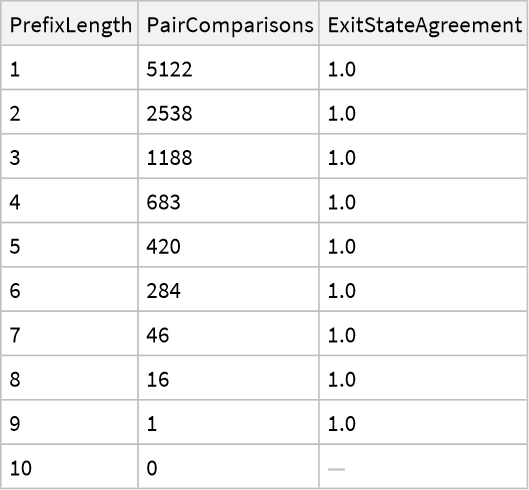

In [3096]:
Dataset[
  prefixReuseByVariantS107A[
    "TaggedUnion_K1"
  ]
]

Dataset[{<|PrefixLength -> 1, PairComparisons -> 5122, ExitStateAgreement -> 1.|>, 
 
>    <|PrefixLength -> 2, PairComparisons -> 2538, ExitStateAgreement -> 1.|>, 
 
>    <|PrefixLength -> 3, PairComparisons -> 1188, ExitStateAgreement -> 1.|>, 
 
>    <|PrefixLength -> 4, PairComparisons -> 683, ExitStateAgreement -> 1.|>, 
 
>    <|PrefixLength -> 5, PairComparisons -> 420, ExitStateAgreement -> 1.|>, 
 
>    <|PrefixLength -> 6, PairComparisons -> 284, ExitStateAgreement -> 1.|>, 
 
>    <|PrefixLength -> 7, PairComparisons -> 46, ExitStateAgreement -> 1.|>, 
 
>    <|PrefixLength -> 8, PairComparisons -> 16, ExitStateAgreement -> 1.|>, 
 
>    <|PrefixLength -> 9, PairComparisons -> 1, ExitStateAgreement -> 1.|>, 
 
>    <|PrefixLength -> 10, PairComparisons -> 0, 
 
>     ExitStateAgreement -> Missing[NoPairs]|>}, 
 
>   TypeSystem`Vector[TypeSystem`Struct[{PrefixLength, PairComparisons, 
 
>      ExitStateAgreement}, {TypeSystem`Atom[Integer], TypeSystem`Atom[Integer], 
 
>      TypeSystem`Atom[Real]}], 10], <||>]
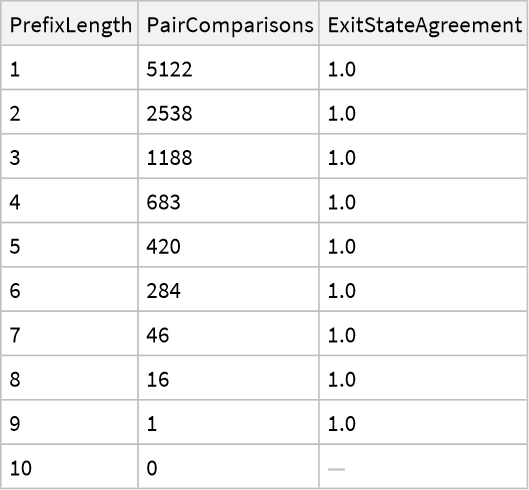

In [3101]:
Dataset[
  prefixReuseByVariantS107A[
    "TaggedUnion_K2"
  ]
]

Dataset[{<|PrefixLength -> 1, PairComparisons -> 5122, ExitStateAgreement -> 1.|>, 
 
>    <|PrefixLength -> 2, PairComparisons -> 2538, ExitStateAgreement -> 1.|>, 
 
>    <|PrefixLength -> 3, PairComparisons -> 1188, ExitStateAgreement -> 1.|>, 
 
>    <|PrefixLength -> 4, PairComparisons -> 683, ExitStateAgreement -> 1.|>, 
 
>    <|PrefixLength -> 5, PairComparisons -> 420, ExitStateAgreement -> 1.|>, 
 
>    <|PrefixLength -> 6, PairComparisons -> 284, ExitStateAgreement -> 1.|>, 
 
>    <|PrefixLength -> 7, PairComparisons -> 46, ExitStateAgreement -> 1.|>, 
 
>    <|PrefixLength -> 8, PairComparisons -> 16, ExitStateAgreement -> 1.|>, 
 
>    <|PrefixLength -> 9, PairComparisons -> 1, ExitStateAgreement -> 1.|>, 
 
>    <|PrefixLength -> 10, PairComparisons -> 0, 
 
>     ExitStateAgreement -> Missing[NoPairs]|>}, 
 
>   TypeSystem`Vector[TypeSystem`Struct[{PrefixLength, PairComparisons, 
 
>      ExitStateAgreement}, {TypeSystem`Atom[Integer], TypeSystem`Atom[Integer], 
 
>      TypeSystem`Atom[Real]}], 10], <||>]
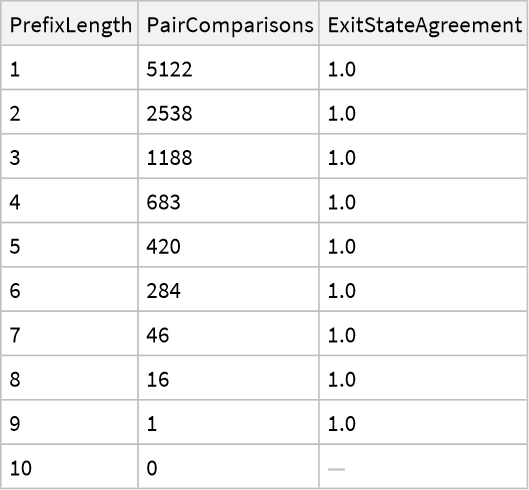

In [3106]:
Dataset[
  prefixReuseByVariantS107A[
    "TaggedUnion_K3"
  ]
]

In [3111]:
(* ============================================================ *)
(* S107B                                                        *)
(* Bounded Tagged-Union SAME-HEAD Task Baseline                 *)
(*                                                              *)
(* DEVELOPMENT ONLY                                             *)
(* TRAIN + IID DEV ONLY                                         *)
(* NO OOD                                                       *)
(*                                                              *)
(* SAME GRU64 HEAD                                              *)
(* SAME 5 INITIALIZATION SEEDS                                  *)
(*                                                              *)
(* Modes:                                                       *)
(*   Raw                                                        *)
(*   StaticGraph                                                *)
(*   RoleOnly_UnboundedControl                                  *)
(*   TaggedUnion_K0                                             *)
(*   TaggedUnion_K1                                             *)
(*   TaggedUnion_K2                                             *)
(*   TaggedUnion_K3                                             *)
(* ============================================================ *)

ClearAll["Global`S107B*"];
ClearAll["Global`s107B*"];


s107BResult =
Catch[

(

(* ============================================================ *)
(* 0. FAIL SAFE                                                 *)
(* ============================================================ *)

S107BFail[msg_] := (
  Print["STOP: ", msg];
  Throw[$Failed, "S107B_STOP"];
);


Print["================================================"];
Print["S107B BOUNDED TAGGED-UNION SAME-HEAD BASELINE"];
Print["================================================"];


(* ============================================================ *)
(* 1. PREFLIGHT                                                 *)
(* ============================================================ *)

If[
  !And[
    ValueQ[trainRecords],
    ValueQ[iidRecords]
  ],
  S107BFail["trainRecords / iidRecords missing."]
];


If[
  !ValueQ[s102ABaseHead],
  S107BFail["s102ABaseHead missing."]
];


If[
  Length[DownValues[S102ARawSequence]] == 0,
  S107BFail["S102ARawSequence missing."]
];


If[
  Length[DownValues[S102ALocalSequence]] == 0,
  S107BFail["S102ALocalSequence missing."]
];


If[
  Length[DownValues[S102AQueryHeader]] == 0,
  S107BFail["S102AQueryHeader missing."]
];


If[
  Length[DownValues[S102ABA]] == 0,
  S107BFail["S102ABA missing."]
];


If[
  Length[DownValues[S102APairAccuracy]] == 0,
  S107BFail["S102APairAccuracy missing."]
];


If[
  !And[
    ValueQ[finalS107A],
    TrueQ[
      finalS107A["UnionPreserved"]
    ]
  ],
  S107BFail["Successful S107A result missing."]
];


If[
  !ValueQ[runsByVariantS107A],
  S107BFail["runsByVariantS107A missing."]
];


requiredS107AVariants = {
  "RoleOnly_UnboundedControl",
  "TaggedUnion_K0",
  "TaggedUnion_K1",
  "TaggedUnion_K2",
  "TaggedUnion_K3"
};


If[
  !And @@
    (
      KeyExistsQ[
        runsByVariantS107A,
        #
      ] &
      /@
      requiredS107AVariants
    ),

  S107BFail["One or more S107A variants are missing."]
];


Print["Preflight = PASS"];
Print["Train records = ", Length[trainRecords]];
Print["IID Dev records = ", Length[iidRecords]];
Print["OOD WILL NOT BE ACCESSED."];


(* ============================================================ *)
(* 2. LOCKED CONFIGURATION                                      *)
(* ============================================================ *)

s107BSeeds = {
  9601,
  9602,
  9603,
  9604,
  9605
};


s107BTrainingRounds = 500;

s107BInputDim = 64;

s107BHashDim = 57;

s107BHashProbes = 8;


s107BModes = {
  "Raw",
  "StaticGraph",
  "RoleOnly_UnboundedControl",
  "TaggedUnion_K0",
  "TaggedUnion_K1",
  "TaggedUnion_K2",
  "TaggedUnion_K3"
};


Print["Modes = ", s107BModes];
Print["Seeds = ", s107BSeeds];


(* ============================================================ *)
(* 3. FREEZE S107A DEFINITIONS FOR THIS EXPERIMENT              *)
(* ============================================================ *)

s107ADefinitionHashAtStartS107B =
  Hash[
    {
      DownValues[S107AUnboundedRoleRun],
      DownValues[S107ABoundedRun],
      DownValues[S107AStateKey]
    },
    "SHA256",
    "HexString"
  ];


Print[
  "S107A definition hash = ",
  s107ADefinitionHashAtStartS107B
];


(* ============================================================ *)
(* 4. DETERMINISTIC SHARED STRUCTURAL PROJECTOR                 *)
(*                                                              *)
(* Important:                                                   *)
(* K0/K1/K2/K3 states are FINITE REUSABLE CLASSES.              *)
(*                                                              *)
(* The hash here is only a fixed numeric projection into        *)
(* the common 57D GRU input space.                              *)
(*                                                              *)
(* It does NOT change TCCT dynamics or Union.                   *)
(* ============================================================ *)

S107BHashItemVector[item_] :=
Module[
  {
    v,
    hi,
    hs,
    idx,
    sg,
    salt
  },


  v =
    ConstantArray[
      0.,
      s107BHashDim
    ];


  Do[

    hi =
      Hash[
        {
          "S107B_INDEX",
          salt,
          item
        },
        "SHA256"
      ];


    hs =
      Hash[
        {
          "S107B_SIGN",
          salt,
          item
        },
        "SHA256"
      ];


    idx =
      1 +
      Mod[
        hi,
        s107BHashDim
      ];


    sg =
      If[
        EvenQ[hs],
        1.,
        -1.
      ];


    v[[idx]] += sg,

    {
      salt,
      1,
      s107BHashProbes
    }
  ];


  N[
    v /
      Sqrt[
        N[
          s107BHashProbes
        ]
      ]
  ]
];


(* ============================================================ *)
(* 5. ONE TCCT ROUND -> 64D                                    *)
(* ============================================================ *)

S107BRoundVector[
  items_List
] :=
Module[
  {
    v,
    hv,
    n
  },


  v =
    ConstantArray[
      0.,
      64
    ];


  n =
    Length[
      items
    ];


  If[
    n > 0,

    hv =
      Total[
        S107BHashItemVector /@
          items
      ];


    (* Preserve multiset information while controlling scale. *)

    hv =
      hv /
      Sqrt[
        N[n]
      ];


    v[[7 ;; 63]] =
      hv;
  ];


  (* Active-state multiplicity is retained explicitly. *)

  v[[64]] =
    N[
      n /
      (
        1. + n
      )
    ];


  v
];


(* ============================================================ *)
(* 6. S107A RUN -> GRU SEQUENCE                                 *)
(* ============================================================ *)

S107BTCCTSequenceFromRun[
  r_Association,
  run_Association
] :=
Module[
  {
    rounds,
    vecs,
    rr,
    items
  },


  rounds =
    run["Trajectory"];


  vecs =
    Table[

      rr =
        rounds[[k]];


      If[
        !And[
          ListQ[rr],
          Length[rr] == 4,
          rr[[1]] === "Round",
          rr[[3]] === "ActiveStateMultiset"
        ],

        S107BFail[
          "Unexpected S107A trajectory format."
        ]
      ];


      items =
        rr[[4]];


      S107BRoundVector[
        items
      ],

      {
        k,
        Length[
          rounds
        ]
      }
    ];


  Join[
    {
      S102AQueryHeader[
        r
      ]
    },

    vecs
  ]
];


(* ============================================================ *)
(* 7. RECORD INDEX LOOKUP                                       *)
(* ============================================================ *)

S107BRecordIndex[
  r_Association,
  records_List
] :=
Module[
  {
    hits
  },


  hits =
    Flatten[
      Position[
        records,
        r,
        {1},
        Heads -> False
      ]
    ];


  If[
    Length[hits] =!= 1,

    S107BFail[
      "Could not uniquely identify record index."
    ]
  ];


  First[
    hits
  ]
];


(* ============================================================ *)
(* 8. TCCT REPRESENTATION USING PRECOMPUTED S107A RUNS          *)
(*                                                              *)
(* Train records occupy positions 1..Length[trainRecords].      *)
(* IID Dev follows immediately after.                           *)
(* ============================================================ *)

S107BTCCTRepByIndex[
  mode_String,
  recordIndex_Integer
] :=
Module[
  {
    r,
    run
  },


  r =
    If[
      recordIndex <=
        Length[
          trainRecords
        ],

      trainRecords[[
        recordIndex
      ]],

      iidRecords[[
        recordIndex -
        Length[
          trainRecords
        ]
      ]]
    ];


  run =
    runsByVariantS107A[
      mode
    ][[
      recordIndex
    ]];


  S107BTCCTSequenceFromRun[
    r,
    run
  ]
];


(* ============================================================ *)
(* 9. REPRESENTATION DISPATCH                                   *)
(* ============================================================ *)

S107BRepByIndex[
  "Raw",
  recordIndex_Integer
] :=
Module[
  {r},

  r =
    If[
      recordIndex <= Length[trainRecords],
      trainRecords[[recordIndex]],
      iidRecords[[
        recordIndex -
        Length[trainRecords]
      ]]
    ];

  S102ARawSequence[
    r
  ]
];


S107BRepByIndex[
  "StaticGraph",
  recordIndex_Integer
] :=
Module[
  {r},

  r =
    If[
      recordIndex <= Length[trainRecords],
      trainRecords[[recordIndex]],
      iidRecords[[
        recordIndex -
        Length[trainRecords]
      ]]
    ];

  S102ALocalSequence[
    r
  ]
];


S107BRepByIndex[
  mode_String,
  recordIndex_Integer
] /;
  MemberQ[
    requiredS107AVariants,
    mode
  ] :=
    S107BTCCTRepByIndex[
      mode,
      recordIndex
    ];


(* ============================================================ *)
(* 10. DIMENSION AUDIT                                          *)
(* ============================================================ *)

S107BSequence64Q[
  x_
] :=
  And[
    ListQ[x],
    Length[x] >= 1,

    And @@
      (
        (
          ListQ[#] &&
          Length[#] == 64
        ) &
        /@
        x
      )
  ];


totalDevelopmentRecordsS107B =
  Length[trainRecords] +
  Length[iidRecords];


Print["Checking dimensions..."];


dimensionAuditS107B =
  Association[
    Table[

      mode ->
        And @@
          Table[

            S107BSequence64Q[
              S107BRepByIndex[
                mode,
                i
              ]
            ],

            {
              i,
              totalDevelopmentRecordsS107B
            }
          ],

      {
        mode,
        s107BModes
      }
    ]
  ];


Print[
  "Dimension audit = ",
  dimensionAuditS107B
];


If[
  !And @@
    Values[
      dimensionAuditS107B
    ],

  S107BFail[
    "Representation dimension audit failed."
  ]
];


(* ============================================================ *)
(* 11. FORBIDDEN DEFINITION AUDIT                               *)
(* ============================================================ *)

s107BDefinitionText =
  ToString[
    InputForm[
      {
        DownValues[S107BHashItemVector],
        DownValues[S107BRoundVector],
        DownValues[S107BTCCTSequenceFromRun]
      }
    ]
  ];


s107BForbiddenTerms = {
  "[\"Y\"]",
  "ReferenceExecutor",
  "CorrectDestination",
  "WrongDestination",
  "TaskY",
  "ProgramOutput",
  "S3Product",
  "BLTruth",
  "BLExecute"
};


s107BForbiddenHits =
  Select[
    s107BForbiddenTerms,

    StringContainsQ[
      s107BDefinitionText,
      #
    ] &
  ];


Print[
  "Forbidden representation hits = ",
  s107BForbiddenHits
];


If[
  s107BForbiddenHits =!= {},

  S107BFail[
    "Forbidden task information found in representation definition."
  ]
];


(* ============================================================ *)
(* 12. PRECOMPUTE DATA                                          *)
(* ============================================================ *)

S107BBuildData[
  mode_String,
  indices_List
] :=
  Table[

    Module[
      {
        r
      },


      r =
        If[
          i <=
            Length[
              trainRecords
            ],

          trainRecords[[i]],

          iidRecords[[
            i -
            Length[
              trainRecords
            ]
          ]]
        ];


      {
        S107BRepByIndex[
          mode,
          i
        ],

        r["Y"],

        r["PairID"],

        r["Depth"]
      }

    ],

    {
      i,
      indices
    }
  ];


trainIndicesS107B =
  Range[
    Length[
      trainRecords
    ]
  ];


devIndicesS107B =
  Range[
    Length[
      trainRecords
    ] + 1,

    Length[
      trainRecords
    ] +
    Length[
      iidRecords
    ]
  ];


Print["Precomputing representations..."];


dataByModeS107B =
  Association[
    Table[

      Print[
        "  ",
        mode,
        " ..."
      ];


      mode ->
        <|

          "Train" ->
            S107BBuildData[
              mode,
              trainIndicesS107B
            ],

          "Dev" ->
            S107BBuildData[
              mode,
              devIndicesS107B
            ]

        |>,

      {
        mode,
        s107BModes
      }
    ]
  ];


Print[
  "Representation precompute = DONE"
];


(* ============================================================ *)
(* 13. NUMERIC COLLISION AUDIT                                  *)
(* ============================================================ *)

S107BNumericCollisionAudit[
  data_List
] :=
Module[
  {
    classes,
    conflicts,
    pairGroups,
    pairCollisions,
    ceiling
  },


  classes =
    Values@
      GroupBy[
        data,

        Hash[
          #[[1]],
          "SHA256",
          "HexString"
        ] &
      ];


  conflicts =
    Cases[
      classes,

      g_List /;
        Length[
          DeleteDuplicates[
            g[[All, 2]]
          ]
        ] > 1
    ];


  ceiling =
    N[
      Total[
        Table[

          Max[
            Values[
              Counts[
                g[[All, 2]]
              ]
            ]
          ],

          {
            g,
            classes
          }
        ]
      ] /
      Length[
        data
      ]
    ];


  pairGroups =
    Values@
      GroupBy[
        data,
        #[[3]] &
      ];


  pairCollisions =
    Table[

      Module[
        {
          pos,
          neg
        },


        pos =
          First[
            Cases[
              g,

              row_List /;
                row[[2]] === 1
            ]
          ];


        neg =
          First[
            Cases[
              g,

              row_List /;
                row[[2]] === 0
            ]
          ];


        SameQ[
          pos[[1]],
          neg[[1]]
        ]

      ],

      {
        g,
        pairGroups
      }
    ];


  <|

    "Records" ->
      Length[
        data
      ],

    "RepresentationClasses" ->
      Length[
        classes
      ],

    "LabelConflictClasses" ->
      Length[
        conflicts
      ],

    "LabelAccuracyCeiling" ->
      ceiling,

    "Pairs" ->
      Length[
        pairGroups
      ],

    "ExactMatchedPairCollisions" ->
      Count[
        pairCollisions,
        True
      ],

    "PairCollisionFraction" ->
      N[
        Count[
          pairCollisions,
          True
        ] /
        Length[
          pairCollisions
        ]
      ]

  |>
];


collisionAuditS107B =
  Association[
    Table[

      mode ->
        <|

          "Train" ->
            S107BNumericCollisionAudit[
              dataByModeS107B[
                mode
              ]["Train"]
            ],

          "Dev" ->
            S107BNumericCollisionAudit[
              dataByModeS107B[
                mode
              ]["Dev"]
            ]

        |>,

      {
        mode,
        s107BModes
      }
    ]
  ];


Print[
  "Numeric TRAIN pair collisions:"
];


Do[

  Print[
    "  ",
    mode,
    " = ",
    collisionAuditS107B[
      mode
    ]["Train"]["ExactMatchedPairCollisions"]
  ],

  {
    mode,
    s107BModes
  }
];


(* bounded candidates must stay collision-free *)

If[
  !And @@
    Table[

      collisionAuditS107B[
        mode
      ]["Train"]["ExactMatchedPairCollisions"] == 0,

      {
        mode,
        {
          "TaggedUnion_K0",
          "TaggedUnion_K1",
          "TaggedUnion_K2",
          "TaggedUnion_K3"
        }
      }
    ],

  S107BFail[
    "Numeric projection reintroduced a bounded TaggedUnion pair collision."
  ]
];


(* ============================================================ *)
(* 14. SAME GRU64 HEAD                                          *)
(* ============================================================ *)

s107BBaseHead =
  s102ABaseHead;


(* ============================================================ *)
(* 15. PER-DEPTH METRICS                                        *)
(* ============================================================ *)

S107BPerDepthBA[
  net_,
  data_List
] :=
  Association[
    Table[

      d ->
        S102ABA[
          net,

          Cases[
            data,

            row_List /;
              row[[4]] === d
          ]
        ],

      {
        d,
        Sort[
          DeleteDuplicates[
            data[[All, 4]]
          ]
        ]
      }
    ]
  ];


S107BPerDepthPair[
  net_,
  data_List
] :=
  Association[
    Table[

      d ->
        S102APairAccuracy[
          net,

          Cases[
            data,

            row_List /;
              row[[4]] === d
          ]
        ],

      {
        d,
        Sort[
          DeleteDuplicates[
            data[[All, 4]]
          ]
        ]
      }
    ]
  ];


(* ============================================================ *)
(* 16. ONE TRAINING RUN                                         *)
(* ============================================================ *)

S107BRunOne[
  mode_String,
  seed_Integer
] :=
Module[
  {
    trainData,
    devData,
    rules,

    initialized,
    initHash,

    trained,
    timing
  },


  Print[
    "Training ",
    mode,
    " | seed ",
    seed,
    " ..."
  ];


  trainData =
    dataByModeS107B[
      mode
    ]["Train"];


  devData =
    dataByModeS107B[
      mode
    ]["Dev"];


  rules =
    (
      #[[1]] ->
        #[[2]]
    ) & /@
      trainData;


  initialized =
    NetInitialize[
      s107BBaseHead,

      RandomSeeding ->
        seed
    ];


  initHash =
    Hash[
      initialized,
      "SHA256",
      "HexString"
    ];


  timing =
    AbsoluteTiming[

      trained =
        NetTrain[
          initialized,
          rules,

          BatchSize ->
            16,

          MaxTrainingRounds ->
            s107BTrainingRounds,

          TargetDevice ->
            "CPU",

          RandomSeeding ->
            seed
        ];
    ];


  Print[
    "  done in ",
    N[
      timing[[1]]
    ],
    " sec"
  ];


  <|

    "Mode" ->
      mode,

    "Seed" ->
      seed,

    "InitHash" ->
      initHash,

    "TrainingSeconds" ->
      N[
        timing[[1]]
      ],

    "TrainBA" ->
      S102ABA[
        trained,
        trainData
      ],

    "TrainPairAccuracy" ->
      S102APairAccuracy[
        trained,
        trainData
      ],

    "DevBA" ->
      S102ABA[
        trained,
        devData
      ],

    "DevPairAccuracy" ->
      S102APairAccuracy[
        trained,
        devData
      ],

    "DevPerDepthBA" ->
      S107BPerDepthBA[
        trained,
        devData
      ],

    "DevPerDepthPair" ->
      S107BPerDepthPair[
        trained,
        devData
      ]

  |>
];


(* ============================================================ *)
(* 17. RUN 7 x 5 = 35 BASELINES                                *)
(* ============================================================ *)

Print["================================================"];
Print["STARTING 35 MATCHED RUNS"];
Print["7 modes x 5 seeds"];
Print["================================================"];


rowsS107B =
  Flatten[
    Table[

      Table[

        S107BRunOne[
          mode,
          seed
        ],

        {
          seed,
          s107BSeeds
        }
      ],

      {
        mode,
        s107BModes
      }
    ],

    1
  ];


If[
  !And[
    ListQ[
      rowsS107B
    ],

    Length[
      rowsS107B
    ] == 35
  ],

  S107BFail[
    "Expected exactly 35 completed training rows."
  ]
];


Print[
  "Completed rows = ",
  Length[
    rowsS107B
  ]
];


(* ============================================================ *)
(* 18. SAFE SUMMARY                                             *)
(* ============================================================ *)

S107BRows[
  mode_String
] :=
  Cases[
    rowsS107B,

    a_Association /;
      a["Mode"] === mode
  ];


S107BSummary[
  mode_String
] :=
Module[
  {
    rr
  },


  rr =
    S107BRows[
      mode
    ];


  If[
    Length[
      rr
    ] =!= 5,

    S107BFail[
      StringJoin[
        "Expected 5 rows for mode ",
        mode
      ]
    ]
  ];


  <|

    "Mode" ->
      mode,

    "Runs" ->
      Length[
        rr
      ],

    "MeanTrainBA" ->
      N[
        Mean[
          (
            #["TrainBA"] &
          ) /@
            rr
        ]
      ],

    "MeanTrainPairAccuracy" ->
      N[
        Mean[
          (
            #["TrainPairAccuracy"] &
          ) /@
            rr
        ]
      ],

    "MinTrainPairAccuracy" ->
      Min[
        (
          #["TrainPairAccuracy"] &
        ) /@
          rr
      ],

    "MeanDevBA" ->
      N[
        Mean[
          (
            #["DevBA"] &
          ) /@
            rr
        ]
      ],

    "MeanDevPairAccuracy" ->
      N[
        Mean[
          (
            #["DevPairAccuracy"] &
          ) /@
            rr
        ]
      ],

    "MinDevPairAccuracy" ->
      Min[
        (
          #["DevPairAccuracy"] &
        ) /@
          rr
      ],

    "MaxDevPairAccuracy" ->
      Max[
        (
          #["DevPairAccuracy"] &
        ) /@
          rr
      ]

  |>
];


summaryS107B =
  Association[
    Table[
      mode ->
        S107BSummary[
          mode
        ],
      {
        mode,
        s107BModes
      }
    ]
  ];


(* ============================================================ *)
(* 19. MATCHED INITIALIZATION CHECK                             *)
(* ============================================================ *)

matchedInitializationS107B =
  Association[
    Table[

      seed ->
        Module[
          {
            hashes
          },


          hashes =
            (
              #["InitHash"] &
            ) /@
              Cases[
                rowsS107B,

                a_Association /;
                  a["Seed"] === seed
              ];


          And[
            Length[
              hashes
            ] == 7,

            SameQ @@
              hashes
          ]

        ],

      {
        seed,
        s107BSeeds
      }
    ]
  ];


Print[
  "Matched initialization = ",
  matchedInitializationS107B
];


(* ============================================================ *)
(* 20. MATCHED-SEED TABLE                                       *)
(* ============================================================ *)

S107BGetRow[
  mode_String,
  seed_Integer
] :=
Module[
  {
    hits
  },


  hits =
    Cases[
      rowsS107B,

      a_Association /;
        And[
          a["Mode"] === mode,
          a["Seed"] === seed
        ]
    ];


  If[
    Length[
      hits
    ] =!= 1,

    S107BFail[
      "Matched row lookup failed."
    ]
  ];


  First[
    hits
  ]
];


pairedS107B =
  Table[

    Module[
      {
        raw,
        stat,
        unbounded,
        k0,
        k1,
        k2,
        k3
      },


      raw =
        S107BGetRow[
          "Raw",
          seed
        ];


      stat =
        S107BGetRow[
          "StaticGraph",
          seed
        ];


      unbounded =
        S107BGetRow[
          "RoleOnly_UnboundedControl",
          seed
        ];


      k0 =
        S107BGetRow[
          "TaggedUnion_K0",
          seed
        ];


      k1 =
        S107BGetRow[
          "TaggedUnion_K1",
          seed
        ];


      k2 =
        S107BGetRow[
          "TaggedUnion_K2",
          seed
        ];


      k3 =
        S107BGetRow[
          "TaggedUnion_K3",
          seed
        ];


      <|

        "Seed" ->
          seed,

        "Raw" ->
          raw["DevPairAccuracy"],

        "Static" ->
          stat["DevPairAccuracy"],

        "RoleOnlyUnbounded" ->
          unbounded["DevPairAccuracy"],

        "K0" ->
          k0["DevPairAccuracy"],

        "K1" ->
          k1["DevPairAccuracy"],

        "K2" ->
          k2["DevPairAccuracy"],

        "K3" ->
          k3["DevPairAccuracy"]

      |>

    ],

    {
      seed,
      s107BSeeds
    }
  ];


(* ============================================================ *)
(* 21. IDENTIFY BEST BOUNDED DEVELOPMENT VARIANT                *)
(* ============================================================ *)

boundedModesS107B = {
  "TaggedUnion_K0",
  "TaggedUnion_K1",
  "TaggedUnion_K2",
  "TaggedUnion_K3"
};


boundedDevPairsS107B =
  Association[
    Table[

      mode ->
        summaryS107B[
          mode
        ][
          "MeanDevPairAccuracy"
        ],

      {
        mode,
        boundedModesS107B
      }
    ]
  ];


bestBoundedDevPairS107B =
  Max[
    Values[
      boundedDevPairsS107B
    ]
  ];


bestBoundedModesS107B =
  Keys[
    Select[
      boundedDevPairsS107B,
      # == bestBoundedDevPairS107B &
    ]
  ];


rawDevPairS107B =
  summaryS107B[
    "Raw"
  ][
    "MeanDevPairAccuracy"
  ];


staticDevPairS107B =
  summaryS107B[
    "StaticGraph"
  ][
    "MeanDevPairAccuracy"
  ];


unboundedDevPairS107B =
  summaryS107B[
    "RoleOnly_UnboundedControl"
  ][
    "MeanDevPairAccuracy"
  ];


bestOrdinaryControlS107B =
  Max[
    rawDevPairS107B,
    staticDevPairS107B
  ];


(* ============================================================ *)
(* 22. DEVELOPMENT GATES                                        *)
(*                                                              *)
(* Since K is being selected on this IID development split,     *)
(* this is NOT a blind architecture claim.                      *)
(* ============================================================ *)

boundedRepairGateS107B =
  And[
    bestBoundedDevPairS107B >= 0.60,

    bestBoundedDevPairS107B >=
      unboundedDevPairS107B + 0.05
  ];


boundedCompetitiveGateS107B =
  bestBoundedDevPairS107B >=
    bestOrdinaryControlS107B - 0.02;


boundedStrongSuperiorityGateS107B =
  bestBoundedDevPairS107B >=
    bestOrdinaryControlS107B + 0.05;


(* ============================================================ *)
(* 23. DEFINITION STABILITY                                     *)
(* ============================================================ *)

s107ADefinitionHashAtEndS107B =
  Hash[
    {
      DownValues[S107AUnboundedRoleRun],
      DownValues[S107ABoundedRun],
      DownValues[S107AStateKey]
    },
    "SHA256",
    "HexString"
  ];


s107ADefinitionsUnchangedS107B =
  SameQ[
    s107ADefinitionHashAtStartS107B,
    s107ADefinitionHashAtEndS107B
  ];


(* ============================================================ *)
(* 24. PROTOCOL HASH                                            *)
(* ============================================================ *)

protocolHashS107B =
  Hash[
    {

      s107ADefinitionHashAtStartS107B,

      s107BSeeds,

      s107BTrainingRounds,

      s107BHashDim,

      s107BHashProbes,

      s107BModes,

      DownValues[
        S107BHashItemVector
      ],

      DownValues[
        S107BRoundVector
      ],

      DownValues[
        S107BTCCTSequenceFromRun
      ],

      s107BBaseHead

    },

    "SHA256",
    "HexString"
  ];


(* ============================================================ *)
(* 25. FINAL REPORT                                             *)
(* ============================================================ *)

finalS107B =
  <|

    "Stage" ->
      "S107B_BoundedTaggedUnion_SameHeadBaseline",

    "ArchitectureDevelopment" ->
      True,

    "PostHocCandidateDevelopment" ->
      True,

    "ProspectiveBlindClaimAllowed" ->
      False,

    "ArchitectureSuperiorityClaimAllowed" ->
      False,

    "TrainingPerformed" ->
      True,

    "TrainAccessed" ->
      True,

    "IIDDevAccessed" ->
      True,

    "OODAccessed" ->
      False,

    "UnionPreserved" ->
      True,

    "FullRecursiveStateUsedByBoundedVariants" ->
      False,

    "CodePairUsedByBoundedVariants" ->
      False,

    "AbsolutePositionUsedInState" ->
      False,

    "UniqueNodeIdentifierUsed" ->
      False,

    "TaskHead" ->
      "Identical_GRU64",

    "TrainingRounds" ->
      s107BTrainingRounds,

    "TrainingSeeds" ->
      s107BSeeds,

    "S107ADefinitionHash" ->
      s107ADefinitionHashAtStartS107B,

    "S107ADefinitionsUnchanged" ->
      s107ADefinitionsUnchangedS107B,

    "ForbiddenRepresentationHits" ->
      s107BForbiddenHits,

    "DimensionAudit" ->
      dimensionAuditS107B,

    "NumericCollisionAudit" ->
      collisionAuditS107B,

    "MatchedInitializationAcrossAllModes" ->
      matchedInitializationS107B,

    "Results" ->
      summaryS107B,

    "BoundedDevPairScores" ->
      boundedDevPairsS107B,

    "BestBoundedDevelopmentMode" ->
      bestBoundedModesS107B,

    "BestBoundedDevelopmentPairAccuracy" ->
      bestBoundedDevPairS107B,

    "BestOrdinaryControlDevPairAccuracy" ->
      bestOrdinaryControlS107B,

    "RoleOnlyUnboundedDevPairAccuracy" ->
      unboundedDevPairS107B,

    "BoundedRepairGate" ->
      <|

        "RequiredDevPair" ->
          0.60,

        "RequiredGainVsUnbounded" ->
          0.05,

        "Passed" ->
          boundedRepairGateS107B

      |>,

    "BoundedCompetitiveGate" ->
      <|

        "AllowedDeficitVsBestRawOrStatic" ->
          0.02,

        "Passed" ->
          boundedCompetitiveGateS107B

      |>,

    "BoundedStrongSuperiorityGate" ->
      <|

        "RequiredGainVsBestRawOrStatic" ->
          0.05,

        "Passed" ->
          boundedStrongSuperiorityGateS107B

      |>,

    "MatchedSeedComparison" ->
      pairedS107B,

    "ProtocolHash" ->
      protocolHashS107B

  |>;


Print["================================================"];
Print["S107B COMPLETE"];
Print["================================================"];


finalS107B

),

"S107B_STOP"
];

S107B BOUNDED TAGGED-UNION SAME-HEAD BASELINE
Preflight = PASS
Train records = 96
IID Dev records = 48
OOD WILL NOT BE ACCESSED.
Modes = {Raw, StaticGraph, RoleOnly_UnboundedControl, TaggedUnion_K0, 
 
>    TaggedUnion_K1, TaggedUnion_K2, TaggedUnion_K3}
Seeds = {9601, 9602, 9603, 9604, 9605}
S107A definition hash = a4e280c0493fe3de95f60e0192192d39c19ebd704512dc6c1d3e8\
 
>    4e8c1722ab8
Checking dimensions...
Dimension audit = <|Raw -> True, StaticGraph -> True, 
 
>    RoleOnly_UnboundedControl -> True, TaggedUnion_K0 -> True, 
 
>    TaggedUnion_K1 -> True, TaggedUnion_K2 -> True, TaggedUnion_K3 -> True|>
Forbidden representation hits = {}
Precomputing representations...
  Raw ...
  StaticGraph ...
  RoleOnly_UnboundedControl ...
  TaggedUnion_K0 ...
  TaggedUnion_K1 ...
  TaggedUnion_K2 ...
  TaggedUnion_K3 ...
Representation precompute = DONE
Numeric TRAIN pair collisions:
  Raw = 0
  StaticGraph = 0
  RoleOnly_UnboundedControl = 0
  TaggedUnion_K0 = 0
  TaggedUnion_K1 = 0
  Tagg

<|Stage -> S107B_BoundedTaggedUnion_SameHeadBaseline, ArchitectureDevelopment -> True, 
 
>   PostHocCandidateDevelopment -> True, ProspectiveBlindClaimAllowed -> False, 
 
>   ArchitectureSuperiorityClaimAllowed -> False, TrainingPerformed -> True, 
 
>   TrainAccessed -> True, IIDDevAccessed -> True, OODAccessed -> False, 
 
>   UnionPreserved -> True, FullRecursiveStateUsedByBoundedVariants -> False, 
 
>   CodePairUsedByBoundedVariants -> False, AbsolutePositionUsedInState -> False, 
 
>   UniqueNodeIdentifierUsed -> False, TaskHead -> Identical_GRU64, 
 
>   TrainingRounds -> 500, TrainingSeeds -> {9601, 9602, 9603, 9604, 9605}, 
 
>   S107ADefinitionHash -> 
 
>    a4e280c0493fe3de95f60e0192192d39c19ebd704512dc6c1d3e84e8c1722ab8, 
 
>   S107ADefinitionsUnchanged -> True, ForbiddenRepresentationHits -> {}, 
 
>   DimensionAudit -> 
 
>    <|Raw -> True, StaticGraph -> True, RoleOnly_UnboundedControl -> True, 
 
>     TaggedUnion_K0 -> True, TaggedUnion_K1 -> True, TaggedUnion_K2 -> True, 
 
>     TaggedUnion_K3 -> True|>, NumericCollisionAudit -> 
 
>    <|Raw -> <|Train -> 
 
>        <|Records -> 96, RepresentationClasses -> 96, LabelConflictClasses -> 0, 
 
>         LabelAccuracyCeiling -> 1., Pairs -> 48, ExactMatchedPairCollisions -> 0, 
 
>         PairCollisionFraction -> 0.|>, 
 
>       Dev -> <|Records -> 48, RepresentationClasses -> 48, LabelConflictClasses -> 0, 
 
>         LabelAccuracyCeiling -> 1., Pairs -> 24, ExactMatchedPairCollisions -> 0, 
 
>         PairCollisionFraction -> 0.|>|>, 
 
>     StaticGraph -> 
 
>      <|Train -> 
 
>        <|Records -> 96, RepresentationClasses -> 96, LabelConflictClasses -> 0, 
 
>         LabelAccuracyCeiling -> 1., Pairs -> 48, ExactMatchedPairCollisions -> 0, 
 
>         PairCollisionFraction -> 0.|>, 
 
>       Dev -> <|Records -> 48, RepresentationClasses -> 48, LabelConflictClasses -> 0, 
 
>         LabelAccuracyCeiling -> 1., Pairs -> 24, ExactMatchedPairCollisions -> 0, 
 
>         PairCollisionFraction -> 0.|>|>, 
 
>     RoleOnly_UnboundedControl -> 
 
>      <|Train -> 
 
>        <|Records -> 96, RepresentationClasses -> 96, LabelConflictClasses -> 0, 
 
>         LabelAccuracyCeiling -> 1., Pairs -> 48, ExactMatchedPairCollisions -> 0, 
 
>         PairCollisionFraction -> 0.|>, 
 
>       Dev -> <|Records -> 48, RepresentationClasses -> 48, LabelConflictClasses -> 0, 
 
>         LabelAccuracyCeiling -> 1., Pairs -> 24, ExactMatchedPairCollisions -> 0, 
 
>         PairCollisionFraction -> 0.|>|>, 
 
>     TaggedUnion_K0 -> 
 
>      <|Train -> 
 
>        <|Records -> 96, RepresentationClasses -> 96, LabelConflictClasses -> 0, 
 
>         LabelAccuracyCeiling -> 1., Pairs -> 48, ExactMatchedPairCollisions -> 0, 
 
>         PairCollisionFraction -> 0.|>, 
 
>       Dev -> <|Records -> 48, RepresentationClasses -> 48, LabelConflictClasses -> 0, 
 
>         LabelAccuracyCeiling -> 1., Pairs -> 24, ExactMatchedPairCollisions -> 0, 
 
>         PairCollisionFraction -> 0.|>|>, 
 
>     TaggedUnion_K1 -> 
 
>      <|Train -> 
 
>        <|Records -> 96, RepresentationClasses -> 96, LabelConflictClasses -> 0, 
 
>         LabelAccuracyCeiling -> 1., Pairs -> 48, ExactMatchedPairCollisions -> 0, 
 
>         PairCollisionFraction -> 0.|>, 
 
>       Dev -> <|Records -> 48, RepresentationClasses -> 48, LabelConflictClasses -> 0, 
 
>         LabelAccuracyCeiling -> 1., Pairs -> 24, ExactMatchedPairCollisions -> 0, 
 
>         PairCollisionFraction -> 0.|>|>, 
 
>     TaggedUnion_K2 -> 
 
>      <|Train -> 
 
>        <|Records -> 96, RepresentationClasses -> 96, LabelConflictClasses -> 0, 
 
>         LabelAccuracyCeiling -> 1., Pairs -> 48, ExactMatchedPairCollisions -> 0, 
 
>         PairCollisionFraction -> 0.|>, 
 
>       Dev -> <|Records -> 48, RepresentationClasses -> 48, LabelConflictClasses -> 0, 
 
>         LabelAccuracyCeiling -> 1., Pairs -> 24, ExactMatchedPairCollisions -> 0, 
 
>         PairCollisionFraction -> 0.|>|>, 
 
>     TaggedU
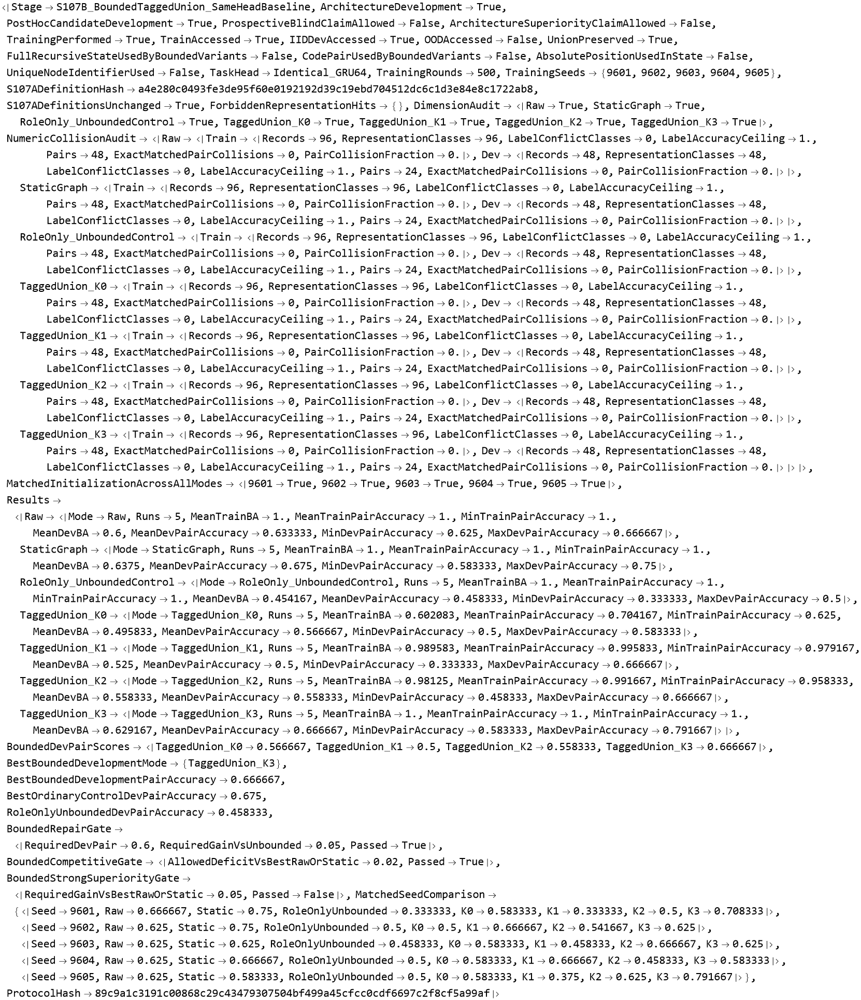

In [3138]:
s107BResult

In [3143]:
Dataset[
  {
    summaryS107B["Raw"],
    summaryS107B["StaticGraph"],
    summaryS107B["RoleOnly_UnboundedControl"],
    summaryS107B["TaggedUnion_K0"],
    summaryS107B["TaggedUnion_K1"],
    summaryS107B["TaggedUnion_K2"],
    summaryS107B["TaggedUnion_K3"]
  }
]

Dataset[{<|Mode -> Raw, Runs -> 5, MeanTrainBA -> 1., MeanTrainPairAccuracy -> 1., 
 
>     MinTrainPairAccuracy -> 1., MeanDevBA -> 0.6, MeanDevPairAccuracy -> 0.633333, 
 
>     MinDevPairAccuracy -> 0.625, MaxDevPairAccuracy -> 0.666667|>, 
 
>    <|Mode -> StaticGraph, Runs -> 5, MeanTrainBA -> 1., MeanTrainPairAccuracy -> 1., 
 
>     MinTrainPairAccuracy -> 1., MeanDevBA -> 0.6375, MeanDevPairAccuracy -> 0.675, 
 
>     MinDevPairAccuracy -> 0.583333, MaxDevPairAccuracy -> 0.75|>, 
 
>    <|Mode -> RoleOnly_UnboundedControl, Runs -> 5, MeanTrainBA -> 1., 
 
>     MeanTrainPairAccuracy -> 1., MinTrainPairAccuracy -> 1., MeanDevBA -> 0.454167, 
 
>     MeanDevPairAccuracy -> 0.458333, MinDevPairAccuracy -> 0.333333, 
 
>     MaxDevPairAccuracy -> 0.5|>, <|Mode -> TaggedUnion_K0, Runs -> 5, 
 
>     MeanTrainBA -> 0.602083, MeanTrainPairAccuracy -> 0.704167, 
 
>     MinTrainPairAccuracy -> 0.625, MeanDevBA -> 0.495833, 
 
>     MeanDevPairAccuracy -> 0.566667, MinDevPairAccuracy -> 0.5, 
 
>     MaxDevPairAccuracy -> 0.583333|>, 
 
>    <|Mode -> TaggedUnion_K1, Runs -> 5, MeanTrainBA -> 0.989583, 
 
>     MeanTrainPairAccuracy -> 0.995833, MinTrainPairAccuracy -> 0.979167, 
 
>     MeanDevBA -> 0.525, MeanDevPairAccuracy -> 0.5, MinDevPairAccuracy -> 0.333333, 
 
>     MaxDevPairAccuracy -> 0.666667|>, 
 
>    <|Mode -> TaggedUnion_K2, Runs -> 5, MeanTrainBA -> 0.98125, 
 
>     MeanTrainPairAccuracy -> 0.991667, MinTrainPairAccuracy -> 0.958333, 
 
>     MeanDevBA -> 0.558333, MeanDevPairAccuracy -> 0.558333, 
 
>     MinDevPairAccuracy -> 0.458333, MaxDevPairAccuracy -> 0.666667|>, 
 
>    <|Mode -> TaggedUnion_K3, Runs -> 5, MeanTrainBA -> 1., 
 
>     MeanTrainPairAccuracy -> 1., MinTrainPairAccuracy -> 1., MeanDevBA -> 0.629167, 
 
>     MeanDevPairAccuracy -> 0.666667, MinDevPairAccuracy -> 0.583333, 
 
>     MaxDevPairAccuracy -> 0.791667|>}, 
 
>   TypeSystem`Vector[TypeSystem`Struct[{Mode, Runs, MeanTrainBA, MeanTrainPairAccuracy, 
 
>      MinTrainPairAccuracy, MeanDevBA, MeanDevPairAccuracy, MinDevPairAccuracy, 
 
>      MaxDevPairAccuracy}, {TypeSystem`Atom[String], TypeSystem`Atom[Integer], 
 
>      TypeSystem`Atom[Real], TypeSystem`Atom[Real], TypeSystem`Atom[Real], 
 
>      TypeSystem`Atom[Real], TypeSystem`Atom[Real], TypeSystem`Atom[Real], 
 
>      TypeSystem`Atom[Real]}], 7], <||>]

In [3148]:
Dataset[
  pairedS107B
]

Dataset[{<|Seed -> 9601, Raw -> 0.666667, Static -> 0.75, RoleOnlyUnbounded -> 0.333333, 
 
>     K0 -> 0.583333, K1 -> 0.333333, K2 -> 0.5, K3 -> 0.708333|>, 
 
>    <|Seed -> 9602, Raw -> 0.625, Static -> 0.75, RoleOnlyUnbounded -> 0.5, K0 -> 0.5, 
 
>     K1 -> 0.666667, K2 -> 0.541667, K3 -> 0.625|>, 
 
>    <|Seed -> 9603, Raw -> 0.625, Static -> 0.625, RoleOnlyUnbounded -> 0.458333, 
 
>     K0 -> 0.583333, K1 -> 0.458333, K2 -> 0.666667, K3 -> 0.625|>, 
 
>    <|Seed -> 9604, Raw -> 0.625, Static -> 0.666667, RoleOnlyUnbounded -> 0.5, 
 
>     K0 -> 0.583333, K1 -> 0.666667, K2 -> 0.458333, K3 -> 0.583333|>, 
 
>    <|Seed -> 9605, Raw -> 0.625, Static -> 0.583333, RoleOnlyUnbounded -> 0.5, 
 
>     K0 -> 0.583333, K1 -> 0.375, K2 -> 0.625, K3 -> 0.791667|>}, 
 
>   TypeSystem`Vector[TypeSystem`Struct[{Seed, Raw, Static, RoleOnlyUnbounded, K0, K1, 
 
>      K2, K3}, {TypeSystem`Atom[Integer], TypeSystem`Atom[Real], TypeSystem`Atom[Real], 
 
>      TypeSystem`Atom[Real], TypeSystem`Atom[Real], TypeSystem`Atom[Real], 
 
>      TypeSystem`Atom[Real], TypeSystem`Atom[Real]}], 5], <||>]

In [3153]:
(* ============================================================ *)
(* S108                                                         *)
(* Frozen TaggedUnion-K3 Untouched OOD Generalization Test      *)
(*                                                              *)
(* IMPORTANT PROTOCOL                                           *)
(* ------------------------------------------------------------ *)
(* 1. K3 already selected on IID development in S107B           *)
(* 2. NO architecture change in S108                            *)
(* 3. NO K search                                               *)
(* 4. Train models BEFORE reading OOD content                   *)
(* 5. OOD opened once, after protocol/model freeze              *)
(*                                                              *)
(* Primary comparison:                                          *)
(*   Raw                                                        *)
(*   StaticGraph                                                *)
(*   TaggedUnion_K3                                             *)
(*                                                              *)
(* Same GRU64                                                   *)
(* Same initialization seeds across all modes                   *)
(* Train only -> untouched depth-OOD evaluation                 *)
(* ============================================================ *)

ClearAll["Global`S108*"];
ClearAll["Global`s108*"];


s108Result =
Catch[

(

(* ============================================================ *)
(* 0. FAIL SAFE                                                 *)
(* ============================================================ *)

S108Fail[msg_] := (
  Print["STOP: ", msg];
  Throw[$Failed, "S108_STOP"];
);


Print["================================================"];
Print["S108 FROZEN K3 UNTOUCHED OOD TEST"];
Print["================================================"];


(* ============================================================ *)
(* 1. PREFLIGHT                                                 *)
(*                                                              *)
(* ValueQ[oodRecords] only checks that the symbol exists.       *)
(* Its CONTENT is not read before the explicit OOD-open step.   *)
(* ============================================================ *)

If[
  !ValueQ[trainRecords],
  S108Fail["trainRecords missing."]
];


If[
  !ValueQ[oodRecords],
  S108Fail["oodRecords symbol missing."]
];


If[
  !ValueQ[finalS107B],
  S108Fail["finalS107B missing."]
];


If[
  !ValueQ[dataByModeS107B],
  S108Fail["dataByModeS107B missing."]
];


If[
  !ValueQ[s102ABaseHead],
  S108Fail["s102ABaseHead missing."]
];


If[
  Length[DownValues[S102ARawSequence]] == 0 ||
  Length[DownValues[S102ALocalSequence]] == 0 ||
  Length[DownValues[S102ABA]] == 0 ||
  Length[DownValues[S102APairAccuracy]] == 0,

  S108Fail["S102A baseline definitions missing."]
];


If[
  Length[DownValues[S107ABoundedRun]] == 0 ||
  Length[DownValues[S107BTCCTSequenceFromRun]] == 0,

  S108Fail["S107A/S107B K3 representation definitions missing."]
];


If[
  !MemberQ[
    finalS107B["BestBoundedDevelopmentMode"],
    "TaggedUnion_K3"
  ],

  S108Fail[
    "S107B did not freeze TaggedUnion_K3 as the development winner."
  ]
];


Print["Preflight = PASS"];
Print["Frozen development candidate = TaggedUnion_K3"];
Print["OOD CONTENT HAS NOT YET BEEN READ."];


(* ============================================================ *)
(* 2. LOCK S108 PROTOCOL                                        *)
(* ============================================================ *)

s108Candidate =
  "TaggedUnion_K3";


s108Modes = {
  "Raw",
  "StaticGraph",
  "TaggedUnion_K3"
};


(* New fixed seeds chosen before OOD is opened. *)

s108Seeds = {
  9701,
  9702,
  9703,
  9704,
  9705
};


s108TrainingRounds = 500;


(* Expected benchmark contract, fixed BEFORE OOD open. *)

s108ExpectedOODRecords = 96;

s108ExpectedOODPairs = 48;

s108ExpectedOODDepths = {
  12,
  14
};


(* Frozen interpretation thresholds. *)

s108CompetitiveTolerance = 0.02;

s108StrongGainRequired = 0.05;


Print["Primary modes = ", s108Modes];
Print["Training seeds = ", s108Seeds];
Print["Training rounds = ", s108TrainingRounds];
Print["Expected OOD depths = ", s108ExpectedOODDepths];


(* ============================================================ *)
(* 3. VERIFY S107A DEFINITIONS DID NOT CHANGE                   *)
(* ============================================================ *)

currentS107AHashS108 =
  Hash[
    {
      DownValues[S107AUnboundedRoleRun],
      DownValues[S107ABoundedRun],
      DownValues[S107AStateKey]
    },
    "SHA256",
    "HexString"
  ];


s107AFrozenHashMatchS108 =
  SameQ[
    currentS107AHashS108,
    finalS107B["S107ADefinitionHash"]
  ];


Print[
  "S107A frozen definition hash match = ",
  s107AFrozenHashMatchS108
];


If[
  !TrueQ[s107AFrozenHashMatchS108],

  S108Fail[
    "S107A candidate definitions changed after S107B."
  ]
];


(* ============================================================ *)
(* 4. EXACT S107B REPRESENTATION INTERFACE                      *)
(*                                                              *)
(* No new readout is introduced here.                           *)
(* K3 uses EXACTLY S107B's projector/interface.                 *)
(* ============================================================ *)

S108Rep[
  "Raw",
  r_Association
] :=
  S102ARawSequence[r];


S108Rep[
  "StaticGraph",
  r_Association
] :=
  S102ALocalSequence[r];


S108Rep[
  "TaggedUnion_K3",
  r_Association
] :=
Module[
  {
    bundle,
    run
  },

  bundle =
    S107ABoundedRun[r];

  run =
    bundle["TaggedUnion_K3"];

  S107BTCCTSequenceFromRun[
    r,
    run
  ]
];


(* ============================================================ *)
(* 5. REPRESENTATION LEAKAGE AUDIT                              *)
(* ============================================================ *)

s108RepDefinitionText =
  ToString[
    InputForm[
      DownValues[S108Rep]
    ]
  ];


s108ForbiddenTerms = {
  "[\"Y\"]",
  "ReferenceExecutor",
  "CorrectDestination",
  "WrongDestination",
  "ProgramOutput",
  "TaskY",
  "S3Product",
  "BLTruth",
  "BLExecute"
};


s108ForbiddenHits =
  Select[
    s108ForbiddenTerms,

    StringContainsQ[
      s108RepDefinitionText,
      #
    ] &
  ];


Print[
  "Forbidden representation hits = ",
  s108ForbiddenHits
];


If[
  s108ForbiddenHits =!= {},

  S108Fail[
    "Forbidden task information detected in S108 representation."
  ]
];


(* ============================================================ *)
(* 6. VERIFY S108 EXACTLY REPRODUCES S107B TRAIN INTERFACE      *)
(*                                                              *)
(* This is done BEFORE OOD access.                              *)
(* ============================================================ *)

Print[
  "Checking exact representation continuity with S107B..."
];


interfaceMatchS108 =
  Association[
    Table[

      mode ->

        And @@
          Table[

            SameQ[

              S108Rep[
                mode,
                trainRecords[[i]]
              ],

              dataByModeS107B[
                mode
              ]["Train"][[i, 1]]

            ],

            {
              i,
              Length[trainRecords]
            }
          ],

      {
        mode,
        s108Modes
      }
    ]
  ];


Print[
  "S107B interface continuity = ",
  interfaceMatchS108
];


If[
  !And @@ Values[interfaceMatchS108],

  S108Fail[
    "S108 representation does not exactly reproduce S107B TRAIN interface."
  ]
];


(* ============================================================ *)
(* 7. TRAIN REPRESENTATION DIMENSION AUDIT                      *)
(* ============================================================ *)

S108Sequence64Q[x_] :=
  And[
    ListQ[x],
    Length[x] >= 1,

    And @@
      (
        (
          ListQ[#] &&
          Length[#] == 64
        ) &
        /@
        x
      )
  ];


trainDimensionAuditS108 =
  Association[
    Table[

      mode ->

        And @@
          (
            S108Sequence64Q[
              S108Rep[
                mode,
                #
              ]
            ] &
          /@
          trainRecords
        ),

      {
        mode,
        s108Modes
      }
    ]
  ];


Print[
  "TRAIN dimension audit = ",
  trainDimensionAuditS108
];


If[
  !And @@ Values[trainDimensionAuditS108],

  S108Fail[
    "TRAIN representation dimension audit failed."
  ]
];


(* ============================================================ *)
(* 8. PRECOMPUTE TRAIN ONLY                                     *)
(*                                                              *)
(* Still NO OOD content access.                                 *)
(* ============================================================ *)

Print["Precomputing TRAIN representations only..."];


S108BuildTrainData[
  mode_String
] :=
  Table[

    {
      S108Rep[
        mode,
        r
      ],

      r["Y"],

      r["PairID"],

      r["Depth"]
    },

    {
      r,
      trainRecords
    }
  ];


trainDataByModeS108 =
  Association[
    Table[

      Print["  TRAIN ", mode, " ..."];

      mode ->
        S108BuildTrainData[
          mode
        ],

      {
        mode,
        s108Modes
      }
    ]
  ];


Print["TRAIN representation precompute = DONE"];


(* ============================================================ *)
(* 9. PROTOCOL HASH -- CREATED BEFORE OOD OPEN                  *)
(* ============================================================ *)

protocolHashS108 =
  Hash[
    {
      "S108_FROZEN_K3_OOD",

      s108Candidate,

      s108Modes,

      s108Seeds,

      s108TrainingRounds,

      s108ExpectedOODRecords,

      s108ExpectedOODPairs,

      s108ExpectedOODDepths,

      s108CompetitiveTolerance,

      s108StrongGainRequired,

      finalS107B["S107ADefinitionHash"],

      DownValues[S108Rep],

      s102ABaseHead
    },

    "SHA256",
    "HexString"
  ];


freezeCertificateS108 =
  <|

    "Status" ->
      "FROZEN_BEFORE_OOD",

    "Candidate" ->
      s108Candidate,

    "Modes" ->
      s108Modes,

    "Seeds" ->
      s108Seeds,

    "TrainingRounds" ->
      s108TrainingRounds,

    "ExpectedOODRecords" ->
      s108ExpectedOODRecords,

    "ExpectedOODPairs" ->
      s108ExpectedOODPairs,

    "ExpectedOODDepths" ->
      s108ExpectedOODDepths,

    "CompetitiveTolerance" ->
      s108CompetitiveTolerance,

    "StrongGainRequired" ->
      s108StrongGainRequired,

    "ProtocolHash" ->
      protocolHashS108

  |>;


Print["================================================"];
Print["S108 PROTOCOL FROZEN BEFORE OOD"];
Print["Protocol hash = ", protocolHashS108];
Print["================================================"];


(* ============================================================ *)
(* 10. TRAIN ALL 15 MODELS BEFORE OOD OPEN                      *)
(* ============================================================ *)

s108BaseHead =
  s102ABaseHead;


netsS108 =
  <||>;


trainRowsS108 = {};


S108NetKey[
  mode_String,
  seed_Integer
] :=
  StringJoin[
    mode,
    "::",
    ToString[seed]
  ];


S108TrainOne[
  mode_String,
  seed_Integer
] :=
Module[
  {
    data,
    rules,
    initialized,
    initHash,
    trained,
    timing,
    row,
    key
  },


  Print[
    "Training ",
    mode,
    " | seed ",
    seed,
    " ..."
  ];


  data =
    trainDataByModeS108[
      mode
    ];


  rules =
    (
      #[[1]] ->
        #[[2]]
    ) & /@
      data;


  initialized =
    NetInitialize[
      s108BaseHead,

      RandomSeeding ->
        seed
    ];


  initHash =
    Hash[
      initialized,
      "SHA256",
      "HexString"
    ];


  timing =
    AbsoluteTiming[

      trained =
        NetTrain[
          initialized,
          rules,

          BatchSize ->
            16,

          MaxTrainingRounds ->
            s108TrainingRounds,

          TargetDevice ->
            "CPU",

          RandomSeeding ->
            seed
        ];
    ];


  key =
    S108NetKey[
      mode,
      seed
    ];


  AssociateTo[
    netsS108,
    key -> trained
  ];


  row =
    <|

      "Mode" ->
        mode,

      "Seed" ->
        seed,

      "InitHash" ->
        initHash,

      "TrainingSeconds" ->
        N[timing[[1]]],

      "TrainBA" ->
        S102ABA[
          trained,
          data
        ],

      "TrainPairAccuracy" ->
        S102APairAccuracy[
          trained,
          data
        ]

    |>;


  Print[
    "  done in ",
    N[timing[[1]]],
    " sec",
    " | TrainPair = ",
    row["TrainPairAccuracy"]
  ];


  row
];


Print["================================================"];
Print["TRAINING 15 MODELS BEFORE OOD OPEN"];
Print["3 modes x 5 seeds"];
Print["================================================"];


trainRowsS108 =
  Flatten[
    Table[

      Table[
        S108TrainOne[
          mode,
          seed
        ],
        {
          seed,
          s108Seeds
        }
      ],

      {
        mode,
        s108Modes
      }
    ],

    1
  ];


If[
  Length[trainRowsS108] =!= 15,

  S108Fail[
    "Expected exactly 15 trained models."
  ]
];


Print[
  "Completed TRAIN-only models = ",
  Length[trainRowsS108]
];


(* ============================================================ *)
(* 11. MATCHED INITIALIZATION AUDIT                             *)
(*                                                              *)
(* Still before OOD content access.                             *)
(* ============================================================ *)

matchedInitializationS108 =
  Association[
    Table[

      seed ->
        Module[
          {
            hh
          },


          hh =
            (
              #["InitHash"] &
            ) /@
              Cases[
                trainRowsS108,

                a_Association /;
                  a["Seed"] === seed
              ];


          And[
            Length[hh] == 3,
            SameQ @@ hh
          ]

        ],

      {
        seed,
        s108Seeds
      }
    ]
  ];


Print[
  "Matched initialization across modes = ",
  matchedInitializationS108
];


If[
  !And @@ Values[matchedInitializationS108],

  S108Fail[
    "Initialization matching failed."
  ]
];


(* ============================================================ *)
(* 12. FREEZE TRAINED NETWORK HASHES                            *)
(*                                                              *)
(* Still before OOD content access.                             *)
(* ============================================================ *)

trainedNetHashesS108 =
  Association[
    Flatten[
      Table[

        S108NetKey[
          mode,
          seed
        ] ->

          Hash[
            netsS108[
              S108NetKey[
                mode,
                seed
              ]
            ],
            "SHA256",
            "HexString"
          ],

        {
          mode,
          s108Modes
        },

        {
          seed,
          s108Seeds
        }
      ]
    ]
  ];


trainedModelsFreezeHashS108 =
  Hash[
    Normal[
      trainedNetHashesS108
    ],
    "SHA256",
    "HexString"
  ];


Print[
  "Trained-model freeze hash = ",
  trainedModelsFreezeHashS108
];


Print["================================================"];
Print["ALL MODELS ARE NOW TRAINED AND FROZEN."];
Print["OPENING OOD FOR THE FIRST TIME NOW."];
Print["================================================"];


(* ============================================================ *)
(* 13. ***** FIRST OOD CONTENT ACCESS *****                     *)
(* ============================================================ *)

s108OODOpened =
  True;


oodRecordsS108 =
  oodRecords;


Print[
  "OOD records opened = ",
  Length[oodRecordsS108]
];


(* ============================================================ *)
(* 14. OOD CONTRACT AUDIT                                       *)
(* ============================================================ *)

oodDepthsS108 =
  Sort[
    DeleteDuplicates[
      (
        #["Depth"] &
      ) /@
      oodRecordsS108
    ]
  ];


oodPairIDsS108 =
  DeleteDuplicates[
    (
      #["PairID"] &
    ) /@
    oodRecordsS108
  ];


oodLabelCountsS108 =
  Counts[
    (
      #["Y"] &
    ) /@
    oodRecordsS108
  ];


oodContractS108 =
  <|

    "Records" ->
      Length[oodRecordsS108],

    "Pairs" ->
      Length[oodPairIDsS108],

    "Depths" ->
      oodDepthsS108,

    "LabelCounts" ->
      oodLabelCountsS108,

    "ExpectedRecordsMatch" ->
      (
        Length[oodRecordsS108] ===
        s108ExpectedOODRecords
      ),

    "ExpectedPairsMatch" ->
      (
        Length[oodPairIDsS108] ===
        s108ExpectedOODPairs
      ),

    "ExpectedDepthsMatch" ->
      SameQ[
        oodDepthsS108,
        s108ExpectedOODDepths
      ]

  |>;


Print[
  "OOD contract = ",
  oodContractS108
];


If[
  !And[
    oodContractS108["ExpectedRecordsMatch"],
    oodContractS108["ExpectedPairsMatch"],
    oodContractS108["ExpectedDepthsMatch"]
  ],

  S108Fail[
    "OOD benchmark contract differs from preregistered expectation."
  ]
];


(* ============================================================ *)
(* 15. PRECOMPUTE OOD REPRESENTATIONS                           *)
(*                                                              *)
(* No model / K / seed / protocol changes allowed here.         *)
(* ============================================================ *)

Print["Computing frozen OOD representations..."];


S108BuildOODData[
  mode_String
] :=
  Table[

    {
      S108Rep[
        mode,
        r
      ],

      r["Y"],

      r["PairID"],

      r["Depth"]
    },

    {
      r,
      oodRecordsS108
    }
  ];


oodDataByModeS108 =
  Association[
    Table[

      Print["  OOD ", mode, " ..."];

      mode ->
        S108BuildOODData[
          mode
        ],

      {
        mode,
        s108Modes
      }
    ]
  ];


oodDimensionAuditS108 =
  Association[
    Table[

      mode ->
        And @@
          (
            S108Sequence64Q[
              #[[1]]
            ] &
          /@
          oodDataByModeS108[
            mode
          ]
        ),

      {
        mode,
        s108Modes
      }
    ]
  ];


Print[
  "OOD dimension audit = ",
  oodDimensionAuditS108
];


If[
  !And @@ Values[oodDimensionAuditS108],

  S108Fail[
    "OOD representation dimension audit failed."
  ]
];


(* ============================================================ *)
(* 16. PER-DEPTH METRICS                                        *)
(* ============================================================ *)

S108PerDepthBA[
  net_,
  data_List
] :=
  Association[
    Table[

      d ->

        S102ABA[
          net,

          Cases[
            data,

            row_List /;
              row[[4]] === d
          ]
        ],

      {
        d,
        s108ExpectedOODDepths
      }
    ]
  ];


S108PerDepthPair[
  net_,
  data_List
] :=
  Association[
    Table[

      d ->

        S102APairAccuracy[
          net,

          Cases[
            data,

            row_List /;
              row[[4]] === d
          ]
        ],

      {
        d,
        s108ExpectedOODDepths
      }
    ]
  ];


(* ============================================================ *)
(* 17. EVALUATE FROZEN MODELS ON OOD                            *)
(* ============================================================ *)

Print["================================================"];
Print["EVALUATING FROZEN MODELS ON OOD"];
Print["================================================"];


evalRowsS108 =
  Flatten[
    Table[

      Table[

        Module[
          {
            net,
            data,
            row
          },


          net =
            netsS108[
              S108NetKey[
                mode,
                seed
              ]
            ];


          data =
            oodDataByModeS108[
              mode
            ];


          row =
            <|

              "Mode" ->
                mode,

              "Seed" ->
                seed,

              "OOD_BA" ->
                S102ABA[
                  net,
                  data
                ],

              "OOD_PairAccuracy" ->
                S102APairAccuracy[
                  net,
                  data
                ],

              "OOD_PerDepthBA" ->
                S108PerDepthBA[
                  net,
                  data
                ],

              "OOD_PerDepthPair" ->
                S108PerDepthPair[
                  net,
                  data
                ]

            |>;


          Print[
            mode,
            " | seed ",
            seed,
            " | OOD Pair = ",
            row["OOD_PairAccuracy"]
          ];


          row
        ],

        {
          seed,
          s108Seeds
        }
      ],

      {
        mode,
        s108Modes
      }
    ],

    1
  ];


(* ============================================================ *)
(* 18. SUMMARY                                                  *)
(* ============================================================ *)

S108Rows[
  mode_String
] :=
  Cases[
    evalRowsS108,

    a_Association /;
      a["Mode"] === mode
  ];


S108Summary[
  mode_String
] :=
Module[
  {
    rr
  },


  rr =
    S108Rows[
      mode
    ];


  <|

    "Mode" ->
      mode,

    "Runs" ->
      Length[rr],

    "MeanOOD_BA" ->
      N[
        Mean[
          (
            #["OOD_BA"] &
          ) /@
          rr
        ]
      ],

    "MeanOOD_PairAccuracy" ->
      N[
        Mean[
          (
            #["OOD_PairAccuracy"] &
          ) /@
          rr
        ]
      ],

    "MinOOD_PairAccuracy" ->
      Min[
        (
          #["OOD_PairAccuracy"] &
        ) /@
        rr
      ],

    "MaxOOD_PairAccuracy" ->
      Max[
        (
          #["OOD_PairAccuracy"] &
        ) /@
        rr
      ]

  |>
];


summaryS108 =
  Association[
    Table[
      mode ->
        S108Summary[
          mode
        ],
      {
        mode,
        s108Modes
      }
    ]
  ];


(* ============================================================ *)
(* 19. AGGREGATE PER-DEPTH SUMMARY                              *)
(* ============================================================ *)

perDepthSummaryS108 =
  Flatten[
    Table[

      Module[
        {
          rr
        },


        rr =
          S108Rows[
            mode
          ];


        Table[

          <|

            "Mode" ->
              mode,

            "Depth" ->
              d,

            "MeanBA" ->
              N[
                Mean[
                  (
                    #["OOD_PerDepthBA"][d] &
                  ) /@
                  rr
                ]
              ],

            "MeanPairAccuracy" ->
              N[
                Mean[
                  (
                    #["OOD_PerDepthPair"][d] &
                  ) /@
                  rr
                ]
              ],

            "MinPairAccuracy" ->
              Min[
                (
                  #["OOD_PerDepthPair"][d] &
                ) /@
                rr
              ],

            "MaxPairAccuracy" ->
              Max[
                (
                  #["OOD_PerDepthPair"][d] &
                ) /@
                rr
              ]

          |>,

          {
            d,
            s108ExpectedOODDepths
          }
        ]

      ],

      {
        mode,
        s108Modes
      }
    ],

    1
  ];


(* ============================================================ *)
(* 20. MATCHED-SEED COMPARISON                                  *)
(* ============================================================ *)

S108EvalRow[
  mode_String,
  seed_Integer
] :=
Module[
  {
    hits
  },


  hits =
    Cases[
      evalRowsS108,

      a_Association /;
        And[
          a["Mode"] === mode,
          a["Seed"] === seed
        ]
    ];


  If[
    Length[hits] =!= 1,
    S108Fail["Evaluation row lookup failed."]
  ];


  First[hits]
];


pairedS108 =
  Table[

    Module[
      {
        raw,
        stat,
        k3
      },


      raw =
        S108EvalRow[
          "Raw",
          seed
        ];


      stat =
        S108EvalRow[
          "StaticGraph",
          seed
        ];


      k3 =
        S108EvalRow[
          "TaggedUnion_K3",
          seed
        ];


      <|

        "Seed" ->
          seed,

        "RawOODPair" ->
          raw["OOD_PairAccuracy"],

        "StaticOODPair" ->
          stat["OOD_PairAccuracy"],

        "K3OODPair" ->
          k3["OOD_PairAccuracy"],

        "K3MinusRaw" ->
          N[
            k3["OOD_PairAccuracy"] -
            raw["OOD_PairAccuracy"]
          ],

        "K3MinusStatic" ->
          N[
            k3["OOD_PairAccuracy"] -
            stat["OOD_PairAccuracy"]
          ]

      |>

    ],

    {
      seed,
      s108Seeds
    }
  ];


(* ============================================================ *)
(* 21. LOCKED INTERPRETATION GATES                              *)
(* ============================================================ *)

rawOODPairS108 =
  summaryS108[
    "Raw"
  ]["MeanOOD_PairAccuracy"];


staticOODPairS108 =
  summaryS108[
    "StaticGraph"
  ]["MeanOOD_PairAccuracy"];


k3OODPairS108 =
  summaryS108[
    "TaggedUnion_K3"
  ]["MeanOOD_PairAccuracy"];


bestControlOODPairS108 =
  Max[
    rawOODPairS108,
    staticOODPairS108
  ];


k3DepthPairsS108 =
  Association[
    Table[

      d ->

        First[
          Cases[
            perDepthSummaryS108,

            a_Association /;
              And[
                a["Mode"] ===
                  "TaggedUnion_K3",

                a["Depth"] === d
              ]
          ]
        ]["MeanPairAccuracy"],

      {
        d,
        s108ExpectedOODDepths
      }
    ]
  ];


aboveChanceGateS108 =
  k3OODPairS108 > 0.50;


depthFloorGateS108 =
  And @@
    (
      # >= 0.50 &
      /@
      Values[
        k3DepthPairsS108
      ]
    );


competitiveGateS108 =
  k3OODPairS108 >=
    bestControlOODPairS108 -
    s108CompetitiveTolerance;


strongSuperiorityGateS108 =
  k3OODPairS108 >=
    bestControlOODPairS108 +
    s108StrongGainRequired;


k3WinsVsRawS108 =
  Count[
    pairedS108,

    a_Association /;
      a["K3MinusRaw"] > 0
  ];


k3WinsVsStaticS108 =
  Count[
    pairedS108,

    a_Association /;
      a["K3MinusStatic"] > 0
  ];


(* ============================================================ *)
(* 22. VERIFY FROZEN DEFINITIONS STILL UNCHANGED                *)
(* ============================================================ *)

currentS107AHashAtEndS108 =
  Hash[
    {
      DownValues[S107AUnboundedRoleRun],
      DownValues[S107ABoundedRun],
      DownValues[S107AStateKey]
    },
    "SHA256",
    "HexString"
  ];


candidateUnchangedS108 =
  SameQ[
    currentS107AHashAtEndS108,
    finalS107B["S107ADefinitionHash"]
  ];


(* ============================================================ *)
(* 23. FINAL REPORT                                             *)
(* ============================================================ *)

finalS108 =
  <|

    "Stage" ->
      "S108_FrozenTaggedUnionK3_UntouchedOOD",

    "ProspectiveRelativeToOOD" ->
      True,

    "ArchitectureDevelopmentPerformedInS108" ->
      False,

    "KSearchPerformedInS108" ->
      False,

    "Candidate" ->
      s108Candidate,

    "CandidateUnchanged" ->
      candidateUnchangedS108,

    "UnionPreserved" ->
      True,

    "FullRecursiveStateUsed" ->
      False,

    "CodePairUsed" ->
      False,

    "TrainingPerformedBeforeOODOpen" ->
      True,

    "TrainedModelsFreezeHash" ->
      trainedModelsFreezeHashS108,

    "OODOpenedAfterProtocolFreeze" ->
      True,

    "OODAccessed" ->
      True,

    "OODContract" ->
      oodContractS108,

    "ProtocolFreezeCertificate" ->
      freezeCertificateS108,

    "RepresentationContinuityWithS107B" ->
      interfaceMatchS108,

    "ForbiddenRepresentationHits" ->
      s108ForbiddenHits,

    "MatchedInitializationAcrossModes" ->
      matchedInitializationS108,

    "Results" ->
      summaryS108,

    "PerDepthResults" ->
      perDepthSummaryS108,

    "MatchedSeedComparison" ->
      pairedS108,

    "K3MeanGainVsRaw" ->
      N[
        k3OODPairS108 -
        rawOODPairS108
      ],

    "K3MeanGainVsStatic" ->
      N[
        k3OODPairS108 -
        staticOODPairS108
      ],

    "K3PerDepthPairAccuracy" ->
      k3DepthPairsS108,

    "K3WinsVsRawSeeds" ->
      k3WinsVsRawS108,

    "K3WinsVsStaticSeeds" ->
      k3WinsVsStaticS108,

    "AboveChanceGate" ->
      <|

        "Criterion" ->
          "Mean OOD PairAccuracy > 0.50",

        "Passed" ->
          aboveChanceGateS108

      |>,

    "DepthFloorGate" ->
      <|

        "Criterion" ->
          "Mean PairAccuracy >= 0.50 at every locked OOD depth",

        "Passed" ->
          depthFloorGateS108

      |>,

    "CompetitiveGate" ->
      <|

        "BestRawOrStaticOODPair" ->
          bestControlOODPairS108,

        "AllowedDeficit" ->
          s108CompetitiveTolerance,

        "Passed" ->
          competitiveGateS108

      |>,

    "StrongSuperiorityGate" ->
      <|

        "RequiredGainVsBestControl" ->
          s108StrongGainRequired,

        "Passed" ->
          strongSuperiorityGateS108

      |>,

    "ProtocolHash" ->
      protocolHashS108

  |>;


Print["================================================"];
Print["S108 COMPLETE"];
Print["================================================"];


finalS108

),

"S108_STOP"
];

S108 FROZEN K3 UNTOUCHED OOD TEST
Preflight = PASS
Frozen development candidate = TaggedUnion_K3
OOD CONTENT HAS NOT YET BEEN READ.
Primary modes = {Raw, StaticGraph, TaggedUnion_K3}
Training seeds = {9701, 9702, 9703, 9704, 9705}
Training rounds = 500
Expected OOD depths = {12, 14}
S107A frozen definition hash match = True
Forbidden representation hits = {}
Checking exact representation continuity with S107B...
S107B interface continuity = <|Raw -> True, StaticGraph -> True, 
 
>    TaggedUnion_K3 -> True|>
TRAIN dimension audit = <|Raw -> True, StaticGraph -> True, 
 
>    TaggedUnion_K3 -> True|>
Precomputing TRAIN representations only...
  TRAIN Raw ...
  TRAIN StaticGraph ...
  TRAIN TaggedUnion_K3 ...
TRAIN representation precompute = DONE
S108 PROTOCOL FROZEN BEFORE OOD
Protocol hash = f5254d5033f78060ce597dd42fcd0a1d9f9738fa3116310e892f27ff9a2e3\
 
>    9e7
TRAINING 15 MODELS BEFORE OOD OPEN
3 modes x 5 seeds
Training Raw | seed 9701 ...
  done in 17.0567 sec | TrainPair = 1.
T

<|Stage -> S108_FrozenTaggedUnionK3_UntouchedOOD, ProspectiveRelativeToOOD -> True, 
 
>   ArchitectureDevelopmentPerformedInS108 -> False, KSearchPerformedInS108 -> False, 
 
>   Candidate -> TaggedUnion_K3, CandidateUnchanged -> True, UnionPreserved -> True, 
 
>   FullRecursiveStateUsed -> False, CodePairUsed -> False, 
 
>   TrainingPerformedBeforeOODOpen -> True, 
 
>   TrainedModelsFreezeHash -> 
 
>    9b9fa013b92edadf3452304e70d65438b930d8ed100363c57e95e9a20e43d064, 
 
>   OODOpenedAfterProtocolFreeze -> True, OODAccessed -> True, 
 
>   OODContract -> 
 
>    <|Records -> 96, Pairs -> 48, Depths -> {12, 14}, 
 
>     LabelCounts -> <|1 -> 48, 0 -> 48|>, ExpectedRecordsMatch -> True, 
 
>     ExpectedPairsMatch -> True, ExpectedDepthsMatch -> True|>, 
 
>   ProtocolFreezeCertificate -> 
 
>    <|Status -> FROZEN_BEFORE_OOD, Candidate -> TaggedUnion_K3, 
 
>     Modes -> {Raw, StaticGraph, TaggedUnion_K3}, 
 
>     Seeds -> {9701, 9702, 9703, 9704, 9705}, TrainingRounds -> 500, 
 
>     ExpectedOODRecords -> 96, ExpectedOODPairs -> 48, ExpectedOODDepths -> {12, 14}, 
 
>     CompetitiveTolerance -> 0.02, StrongGainRequired -> 0.05, 
 
>     ProtocolHash -> f5254d5033f78060ce597dd42fcd0a1d9f9738fa3116310e892f27ff9a2e39e7|>\
 
>    , RepresentationContinuityWithS107B -> 
 
>    <|Raw -> True, StaticGraph -> True, TaggedUnion_K3 -> True|>, 
 
>   ForbiddenRepresentationHits -> {}, 
 
>   MatchedInitializationAcrossModes -> 
 
>    <|9701 -> True, 9702 -> True, 9703 -> True, 9704 -> True, 9705 -> True|>, 
 
>   Results -> <|Raw -> 
 
>      <|Mode -> Raw, Runs -> 5, MeanOOD_BA -> 0.4625, MeanOOD_PairAccuracy -> 0.3875, 
 
>       MinOOD_PairAccuracy -> 0.3125, MaxOOD_PairAccuracy -> 0.479167|>, 
 
>     StaticGraph -> 
 
>      <|Mode -> StaticGraph, Runs -> 5, MeanOOD_BA -> 0.489583, 
 
>       MeanOOD_PairAccuracy -> 0.491667, MinOOD_PairAccuracy -> 0.416667, 
 
>       MaxOOD_PairAccuracy -> 0.5625|>, 
 
>     TaggedUnion_K3 -> 
 
>      <|Mode -> TaggedUnion_K3, Runs -> 5, MeanOOD_BA -> 0.5375, 
 
>       MeanOOD_PairAccuracy -> 0.508333, MinOOD_PairAccuracy -> 0.5, 
 
>       MaxOOD_PairAccuracy -> 0.520833|>|>, 
 
>   PerDepthResults -> 
 
>    {<|Mode -> Raw, Depth -> 12, MeanBA -> 0.4625, MeanPairAccuracy -> 0.3625, 
 
>      MinPairAccuracy -> 0.229167, MaxPairAccuracy -> 0.5625|>, 
 
>     <|Mode -> Raw, Depth -> 14, MeanBA -> 0.4625, MeanPairAccuracy -> 0.4125, 
 
>      MinPairAccuracy -> 0.333333, MaxPairAccuracy -> 0.520833|>, 
 
>     <|Mode -> StaticGraph, Depth -> 12, MeanBA -> 0.520833, 
 
>      MeanPairAccuracy -> 0.483333, MinPairAccuracy -> 0.333333, 
 
>      MaxPairAccuracy -> 0.583333|>, 
 
>     <|Mode -> StaticGraph, Depth -> 14, MeanBA -> 0.458333, MeanPairAccuracy -> 0.5, 
 
>      MinPairAccuracy -> 0.333333, MaxPairAccuracy -> 0.541667|>, 
 
>     <|Mode -> TaggedUnion_K3, Depth -> 12, MeanBA -> 0.5375, MeanPairAccuracy -> 0.5, 
 
>      MinPairAccuracy -> 0.375, MaxPairAccuracy -> 0.583333|>, 
 
>     <|Mode -> TaggedUnion_K3, Depth -> 14, MeanBA -> 0.5375, 
 
>      MeanPairAccuracy -> 0.516667, MinPairAccuracy -> 0.416667, 
 
>      MaxPairAccuracy -> 0.625|>}, 
 
>   MatchedSeedComparison -> 
 
>    {<|Seed -> 9701, RawOODPair -> 0.375, StaticOODPair -> 0.520833, 
 
>      K3OODPair -> 0.520833, K3MinusRaw -> 0.145833, K3MinusStatic -> 0.|>, 
 
>     <|Seed -> 9702, RawOODPair -> 0.479167, StaticOODPair -> 0.5625, K3OODPair -> 0.5, 
 
>      K3MinusRaw -> 0.0208333, K3MinusStatic -> -0.0625|>, 
 
>     <|Seed -> 9703, RawOODPair -> 0.364583, StaticOODPair -> 0.416667, 
 
>      K3OODPair -> 0.520833, K3MinusRaw -> 0.15625, K3MinusStatic -> 0.104167|>, 
 
>     <|Seed -> 9704, RawOODPair -> 0.3125, StaticOODPair -> 0.4375, K3OODPair -> 0.5, 
 
>      K3MinusRaw -> 0.1875, K3MinusStatic -> 0.0625|>, 
 
>     <|Seed -> 9705, RawOODPair -> 0.40625, StaticOODPair -> 0.520833, 
 
>      K3OODPair -> 0.5, K3MinusRaw -> 0.09375, K3MinusStatic -> -0.0208333|>}, 
 
>   K3MeanGainVsRaw -> 0.120833, K
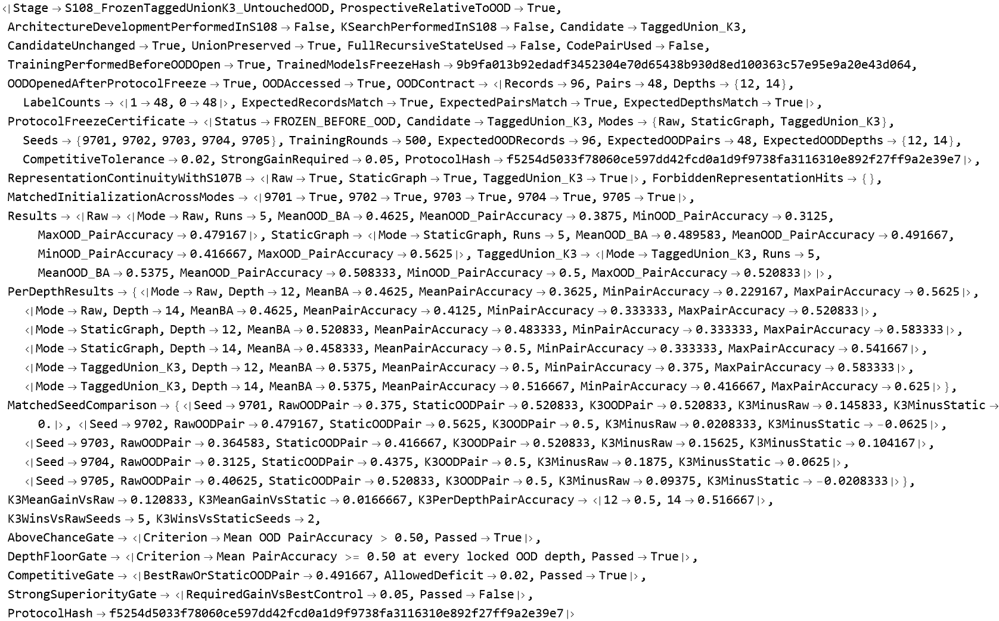

In [3181]:
s108Result

In [3186]:
Dataset[
  {
    summaryS108["Raw"],
    summaryS108["StaticGraph"],
    summaryS108["TaggedUnion_K3"]
  }
]

Dataset[{<|Mode -> Raw, Runs -> 5, MeanOOD_BA -> 0.4625, MeanOOD_PairAccuracy -> 0.3875, 
 
>     MinOOD_PairAccuracy -> 0.3125, MaxOOD_PairAccuracy -> 0.479167|>, 
 
>    <|Mode -> StaticGraph, Runs -> 5, MeanOOD_BA -> 0.489583, 
 
>     MeanOOD_PairAccuracy -> 0.491667, MinOOD_PairAccuracy -> 0.416667, 
 
>     MaxOOD_PairAccuracy -> 0.5625|>, 
 
>    <|Mode -> TaggedUnion_K3, Runs -> 5, MeanOOD_BA -> 0.5375, 
 
>     MeanOOD_PairAccuracy -> 0.508333, MinOOD_PairAccuracy -> 0.5, 
 
>     MaxOOD_PairAccuracy -> 0.520833|>}, 
 
>   TypeSystem`Vector[TypeSystem`Struct[{Mode, Runs, MeanOOD_BA, MeanOOD_PairAccuracy, 
 
>      MinOOD_PairAccuracy, MaxOOD_PairAccuracy}, 
 
>     {TypeSystem`Atom[String], TypeSystem`Atom[Integer], TypeSystem`Atom[Real], 
 
>      TypeSystem`Atom[Real], TypeSystem`Atom[Real], TypeSystem`Atom[Real]}], 3], <||>]

In [3191]:
Dataset[
  perDepthSummaryS108
]

Dataset[{<|Mode -> Raw, Depth -> 12, MeanBA -> 0.4625, MeanPairAccuracy -> 0.3625, 
 
>     MinPairAccuracy -> 0.229167, MaxPairAccuracy -> 0.5625|>, 
 
>    <|Mode -> Raw, Depth -> 14, MeanBA -> 0.4625, MeanPairAccuracy -> 0.4125, 
 
>     MinPairAccuracy -> 0.333333, MaxPairAccuracy -> 0.520833|>, 
 
>    <|Mode -> StaticGraph, Depth -> 12, MeanBA -> 0.520833, 
 
>     MeanPairAccuracy -> 0.483333, MinPairAccuracy -> 0.333333, 
 
>     MaxPairAccuracy -> 0.583333|>, 
 
>    <|Mode -> StaticGraph, Depth -> 14, MeanBA -> 0.458333, MeanPairAccuracy -> 0.5, 
 
>     MinPairAccuracy -> 0.333333, MaxPairAccuracy -> 0.541667|>, 
 
>    <|Mode -> TaggedUnion_K3, Depth -> 12, MeanBA -> 0.5375, MeanPairAccuracy -> 0.5, 
 
>     MinPairAccuracy -> 0.375, MaxPairAccuracy -> 0.583333|>, 
 
>    <|Mode -> TaggedUnion_K3, Depth -> 14, MeanBA -> 0.5375, 
 
>     MeanPairAccuracy -> 0.516667, MinPairAccuracy -> 0.416667, 
 
>     MaxPairAccuracy -> 0.625|>}, TypeSystem`Vector[TypeSystem`Struct[{Mode, Depth, 
 
>      MeanBA, MeanPairAccuracy, MinPairAccuracy, MaxPairAccuracy}, 
 
>     {TypeSystem`Atom[TypeSystem`Enumeration[Raw, StaticGraph, TaggedUnion_K3]], 
 
>      TypeSystem`Atom[Integer], TypeSystem`Atom[Real], TypeSystem`Atom[Real], 
 
>      TypeSystem`Atom[Real], TypeSystem`Atom[Real]}], 6], <||>]

In [3196]:
Dataset[
  pairedS108
]

Dataset[{<|Seed -> 9701, RawOODPair -> 0.375, StaticOODPair -> 0.520833, 
 
>     K3OODPair -> 0.520833, K3MinusRaw -> 0.145833, K3MinusStatic -> 0.|>, 
 
>    <|Seed -> 9702, RawOODPair -> 0.479167, StaticOODPair -> 0.5625, K3OODPair -> 0.5, 
 
>     K3MinusRaw -> 0.0208333, K3MinusStatic -> -0.0625|>, 
 
>    <|Seed -> 9703, RawOODPair -> 0.364583, StaticOODPair -> 0.416667, 
 
>     K3OODPair -> 0.520833, K3MinusRaw -> 0.15625, K3MinusStatic -> 0.104167|>, 
 
>    <|Seed -> 9704, RawOODPair -> 0.3125, StaticOODPair -> 0.4375, K3OODPair -> 0.5, 
 
>     K3MinusRaw -> 0.1875, K3MinusStatic -> 0.0625|>, 
 
>    <|Seed -> 9705, RawOODPair -> 0.40625, StaticOODPair -> 0.520833, K3OODPair -> 0.5, 
 
>     K3MinusRaw -> 0.09375, K3MinusStatic -> -0.0208333|>}, 
 
>   TypeSystem`Vector[TypeSystem`Struct[{Seed, RawOODPair, StaticOODPair, K3OODPair, 
 
>      K3MinusRaw, K3MinusStatic}, {TypeSystem`Atom[Integer], TypeSystem`Atom[Real], 
 
>      TypeSystem`Atom[Real], TypeSystem`Atom[Real], TypeSystem`Atom[Real], 
 
>      TypeSystem`Atom[Real]}], 5], <||>]

In [3244]:
(* ============================================================ *)
(* S109A                                                        *)
(* K3 Computational-State Sufficiency Audit                     *)
(*                                                              *)
(* POST-HOC MECHANISM DIAGNOSTIC                                *)
(* TRAIN + IID DEV ONLY                                         *)
(* NO TRAINING                                                  *)
(* NO OOD                                                       *)
(*                                                              *)
(* True cumulative S3 state is used ONLY as diagnostic label.   *)
(* It is NEVER supplied to TCCT or any classifier.              *)
(*                                                              *)
(* Question:                                                    *)
(* Does one TaggedUnion-K3 state correspond to multiple         *)
(* genuinely different accumulated computations?                *)
(* ============================================================ *)

ClearAll["Global`S109A*"];
ClearAll["Global`s109A*"];


s109AResult =
Catch[

(

(* ============================================================ *)
(* 0. FAIL SAFE                                                 *)
(* ============================================================ *)

S109AFail[msg_] := (
  Print["STOP: ", msg];
  Throw[$Failed, "S109A_STOP"];
);


Print["================================================"];
Print["S109A K3 COMPUTATIONAL-STATE SUFFICIENCY AUDIT"];
Print["================================================"];


(* ============================================================ *)
(* 1. PREFLIGHT                                                 *)
(* ============================================================ *)

If[
  !And[
    ValueQ[trainRecords],
    ValueQ[iidRecords],
    ValueQ[runsByVariantS107A]
  ],

  S109AFail[
    "trainRecords / iidRecords / runsByVariantS107A missing."
  ]
];


If[
  !KeyExistsQ[
    runsByVariantS107A,
    "TaggedUnion_K3"
  ],

  S109AFail[
    "TaggedUnion_K3 runs missing."
  ]
];


allRecordsS109A =
  Join[
    trainRecords,
    iidRecords
  ];


splitLabelsS109A =
  Join[
    ConstantArray[
      "Train",
      Length[trainRecords]
    ],

    ConstantArray[
      "Dev",
      Length[iidRecords]
    ]
  ];


k3RunsS109A =
  runsByVariantS107A[
    "TaggedUnion_K3"
  ];


If[
  Length[k3RunsS109A] =!=
    Length[allRecordsS109A],

  S109AFail[
    "K3 run count does not match Train + Dev records."
  ]
];


Print["Preflight = PASS"];
Print["Train records = ", Length[trainRecords]];
Print["IID Dev records = ", Length[iidRecords]];
Print["OOD WILL NOT BE ACCESSED."];
Print["NO TRAINING WILL BE PERFORMED."];


(* ============================================================ *)
(* 2. DEFINE S3 OPERATORS                                       *)
(*                                                              *)
(* Permutations act on {1,2,3}.                                 *)
(*                                                              *)
(* token 0 = transposition (1 2)                                *)
(* token 1 = transposition (2 3)                                *)
(*                                                              *)
(* We audit BOTH composition conventions so the mechanistic     *)
(* conclusion is not dependent on a left/right convention.      *)
(* ============================================================ *)

S109AOpPerm[0] := {2, 1, 3};
S109AOpPerm[1] := {1, 3, 2};


(* p after q: p o q *)

S109ACompose[
  p_List,
  q_List
] :=
  p[[q]];


S109ALeftPrefixStates[
  seq_List
] :=
  Rest[
    FoldList[

      Function[
        {acc, token},

        S109ACompose[
          S109AOpPerm[token],
          acc
        ]
      ],

      {1, 2, 3},
      seq
    ]
  ];


S109ARightPrefixStates[
  seq_List
] :=
  Rest[
    FoldList[

      Function[
        {acc, token},

        S109ACompose[
          acc,
          S109AOpPerm[token]
        ]
      ],

      {1, 2, 3},
      seq
    ]
  ];


(* ============================================================ *)
(* 3. BASIC S3 SANITY -- FIXED                                  *)
(* ============================================================ *)

allS3StatesS109A =
  Permutations[
    {1, 2, 3}
  ];


s3SanityS109A =
  And @@
    Table[

      Module[
        {
          leftStates,
          rightStates,
          leftOK,
          rightOK
        },


        leftStates =
          S109ALeftPrefixStates[
            r["Seq"]
          ];


        rightStates =
          S109ARightPrefixStates[
            r["Seq"]
          ];


        leftOK =
          And @@
            (
              MemberQ[
                allS3StatesS109A,
                #
              ] &
              /@
              leftStates
            );


        rightOK =
          And @@
            (
              MemberQ[
                allS3StatesS109A,
                #
              ] &
              /@
              rightStates
            );


        And[
          leftOK,
          rightOK
        ]

      ],

      {
        r,
        allRecordsS109A
      }
    ];


Print[
  "S3 permutation sanity = ",
  s3SanityS109A
];


If[
  !TrueQ[
    s3SanityS109A
  ],

  S109AFail[
    "S3 cumulative-state construction failed sanity check."
  ]
];
(* ============================================================ *)
(* 4. FIRST TOKEN-EXIT K3 STATE                                 *)
(* ============================================================ *)

S109AFirstExitState[
  run_Association,
  pos_Integer
] :=
Module[
  {
    hits
  },


  hits =
    Cases[
      run["Events"],

      a_Association /;
        And[
          a["Role"] === "TokenExit",
          a["Position"] === pos
        ]
    ];


  If[
    hits === {},

    Missing[
      "NotReached"
    ],

    First[
      SortBy[
        hits,
        #["Round"] &
      ]
    ]["State"]
  ]
];


S109AKey[x_] :=
  ToString[
    InputForm[x]
  ];


(* ============================================================ *)
(* 5. BUILD POSITION-LEVEL AUDIT TABLE                          *)
(* ============================================================ *)

Print[
  "Building K3 / cumulative-computation table..."
];


rowsS109A =
  Flatten[
    Table[

      Module[
        {
          r,
          run,
          seq,
          leftStates,
          rightStates
        },


        r =
          allRecordsS109A[[i]];


        run =
          k3RunsS109A[[i]];


        seq =
          r["Seq"];


        leftStates =
          S109ALeftPrefixStates[
            seq
          ];


        rightStates =
          S109ARightPrefixStates[
            seq
          ];


        Table[

          Module[
            {
              k3state,
              nextToken
            },


            k3state =
              S109AFirstExitState[
                run,
                k
              ];


            If[
              MissingQ[k3state],

              S109AFail[
                StringJoin[
                  "TokenExit not reached for record ",
                  ToString[i],
                  " position ",
                  ToString[k]
                ]
              ]
            ];


            nextToken =
              If[
                k < Length[seq],
                seq[[k + 1]],
                Missing["EndOfSequence"]
              ];


            <|

              "RecordIndex" ->
                i,

              "Split" ->
                splitLabelsS109A[[i]],

              "PairID" ->
                r["PairID"],

              "Depth" ->
                r["Depth"],

              "PrefixLength" ->
                k,

              "Prefix" ->
                Take[
                  seq,
                  k
                ],

              "CurrentToken" ->
                seq[[k]],

              "NextToken" ->
                nextToken,

              "K3State" ->
                k3state,

              "K3Key" ->
                S109AKey[
                  k3state
                ],

              "LeftComputeState" ->
                leftStates[[k]],

              "LeftComputeKey" ->
                S109AKey[
                  leftStates[[k]]
                ],

              "RightComputeState" ->
                rightStates[[k]],

              "RightComputeKey" ->
                S109AKey[
                  rightStates[[k]]
                ]

            |>

          ],

          {
            k,
            Length[seq]
          }
        ]

      ],

      {
        i,
        Length[
          allRecordsS109A
        ]
      }
    ],

    1
  ];


Print[
  "Position-level rows = ",
  Length[
    rowsS109A
  ]
];


(* ============================================================ *)
(* 6. STATE-SUFFICIENCY AUDIT                                   *)
(*                                                              *)
(* Ask:                                                         *)
(* K3State -> how many different cumulative S3 states?          *)
(*                                                              *)
(* If one K3 state maps to several compute states, K3 is not     *)
(* sufficient to represent accumulated computation.             *)
(* ============================================================ *)

ClearAll[S109AStateSufficiency];


S109AStateSufficiency[
  rows_List,
  computeKey_String
] :=
Module[
  {
    groups,
    conflictGroups,
    eventConflictCount,
    ceilings,
    distinctCounts
  },


  groups =
    Values@
      GroupBy[
        rows,
        #["K3Key"] &
      ];


  conflictGroups =
    Select[
      groups,

      Function[
        g,

        Length[
          DeleteDuplicates[
            (
              #[computeKey] &
            ) /@
              g
          ]
        ] > 1
      ]
    ];


  eventConflictCount =
    Total[
      Length /@
        conflictGroups
    ];


  ceilings =
    Table[

      Max[
        Values[
          Counts[
            (
              #[computeKey] &
            ) /@
              g
          ]
        ]
      ],

      {
        g,
        groups
      }
    ];


  distinctCounts =
    Table[

      Length[
        DeleteDuplicates[
          (
            #[computeKey] &
          ) /@
            g
        ]
      ],

      {
        g,
        groups
      }
    ];


  <|

    "Events" ->
      Length[
        rows
      ],

    "K3StateClasses" ->
      Length[
        groups
      ],

    "K3ConflictClasses" ->
      Length[
        conflictGroups
      ],

    "FractionK3ClassesWithComputeConflict" ->
      If[
        groups === {},
        Missing["NoGroups"],
        N[
          Length[
            conflictGroups
          ] /
          Length[
            groups
          ]
        ]
      ],

    "EventsInsideConflictClasses" ->
      eventConflictCount,

    "FractionEventsInsideConflictClasses" ->
      If[
        rows === {},
        Missing["NoRows"],
        N[
          eventConflictCount /
          Length[
            rows
          ]
        ]
      ],

    "ExactComputeStateAccuracyCeilingFromK3" ->
      If[
        rows === {},
        Missing["NoRows"],
        N[
          Total[
            ceilings
          ] /
          Length[
            rows
          ]
        ]
      ],

    "MeanDistinctComputeStatesPerK3" ->
      If[
        distinctCounts === {},
        Missing["NoGroups"],
        N[
          Mean[
            distinctCounts
          ]
        ]
      ],

    "MaxDistinctComputeStatesPerK3" ->
      If[
        distinctCounts === {},
        Missing["NoGroups"],
        Max[
          distinctCounts
        ]
      ],

    "K3IsFunctionallySufficientForComputeState" ->
      (
        Length[
          conflictGroups
        ] == 0
      )

  |>
];


trainRowsS109A =
  Cases[
    rowsS109A,
    a_Association /;
      a["Split"] === "Train"
  ];


devRowsS109A =
  Cases[
    rowsS109A,
    a_Association /;
      a["Split"] === "Dev"
  ];


leftTrainAuditS109A =
  S109AStateSufficiency[
    trainRowsS109A,
    "LeftComputeKey"
  ];


leftDevAuditS109A =
  S109AStateSufficiency[
    devRowsS109A,
    "LeftComputeKey"
  ];


leftCombinedAuditS109A =
  S109AStateSufficiency[
    rowsS109A,
    "LeftComputeKey"
  ];


rightTrainAuditS109A =
  S109AStateSufficiency[
    trainRowsS109A,
    "RightComputeKey"
  ];


rightDevAuditS109A =
  S109AStateSufficiency[
    devRowsS109A,
    "RightComputeKey"
  ];


rightCombinedAuditS109A =
  S109AStateSufficiency[
    rowsS109A,
    "RightComputeKey"
  ];


(* ============================================================ *)
(* 7. PER-PREFIX-LENGTH SUFFICIENCY                             *)
(* ============================================================ *)

ClearAll[S109APerLengthAudit];


S109APerLengthAudit[
  rows_List,
  computeKey_String
] :=
Module[
  {
    lengths
  },


  lengths =
    Sort[
      DeleteDuplicates[
        (
          #["PrefixLength"] &
        ) /@
          rows
      ]
    ];


  Table[

    Module[
      {
        rr,
        audit
      },


      rr =
        Cases[
          rows,

          a_Association /;
            a["PrefixLength"] === k
        ];


      audit =
        S109AStateSufficiency[
          rr,
          computeKey
        ];


      <|

        "PrefixLength" ->
          k,

        "Events" ->
          audit["Events"],

        "K3StateClasses" ->
          audit["K3StateClasses"],

        "ConflictClasses" ->
          audit["K3ConflictClasses"],

        "ConflictClassFraction" ->
          audit[
            "FractionK3ClassesWithComputeConflict"
          ],

        "EventConflictFraction" ->
          audit[
            "FractionEventsInsideConflictClasses"
          ],

        "ComputeStateCeilingFromK3" ->
          audit[
            "ExactComputeStateAccuracyCeilingFromK3"
          ],

        "MaxComputeStatesPerK3" ->
          audit[
            "MaxDistinctComputeStatesPerK3"
          ]

      |>

    ],

    {
      k,
      lengths
    }
  ]
];


leftPerLengthS109A =
  S109APerLengthAudit[
    rowsS109A,
    "LeftComputeKey"
  ];


rightPerLengthS109A =
  S109APerLengthAudit[
    rowsS109A,
    "RightComputeKey"
  ];


(* ============================================================ *)
(* 8. TRANSITION SUFFICIENCY                                    *)
(*                                                              *)
(* Stronger question:                                           *)
(* Given {current K3 state, next token}, is the next accumulated *)
(* computation uniquely determined?                             *)
(*                                                              *)
(* If not, a recurrent compute-state channel is needed.         *)
(* ============================================================ *)

transitionRowsS109A =
  Cases[
    rowsS109A,

    a_Association /;
      !MissingQ[
        a["NextToken"]
      ]
  ];


(* attach next true cumulative state *)

transitionRowsS109A =
  Table[

    Module[
      {
        rec,
        k,
        seq,
        leftStates,
        rightStates
      },


      rec =
        allRecordsS109A[[
          row["RecordIndex"]
        ]];


      k =
        row["PrefixLength"];


      seq =
        rec["Seq"];


      leftStates =
        S109ALeftPrefixStates[
          seq
        ];


      rightStates =
        S109ARightPrefixStates[
          seq
        ];


      Join[
        row,

        <|

          "TransitionInputKey" ->
            S109AKey[
              {
                row["K3State"],
                row["NextToken"]
              }
            ],

          "NextLeftComputeKey" ->
            S109AKey[
              leftStates[[k + 1]]
            ],

          "NextRightComputeKey" ->
            S109AKey[
              rightStates[[k + 1]]
            ]

        |>
      ]

    ],

    {
      row,
      transitionRowsS109A
    }
  ];


ClearAll[S109ATransitionAudit];


S109ATransitionAudit[
  rows_List,
  targetKey_String
] :=
Module[
  {
    groups,
    conflicts,
    ceilings,
    distinctCounts
  },


  groups =
    Values@
      GroupBy[
        rows,
        #["TransitionInputKey"] &
      ];


  conflicts =
    Select[
      groups,

      Function[
        g,

        Length[
          DeleteDuplicates[
            (
              #[targetKey] &
            ) /@
              g
          ]
        ] > 1
      ]
    ];


  ceilings =
    Table[

      Max[
        Values[
          Counts[
            (
              #[targetKey] &
            ) /@
              g
          ]
        ]
      ],

      {
        g,
        groups
      }
    ];


  distinctCounts =
    Table[

      Length[
        DeleteDuplicates[
          (
            #[targetKey] &
          ) /@
            g
        ]
      ],

      {
        g,
        groups
      }
    ];


  <|

    "TransitionEvents" ->
      Length[
        rows
      ],

    "TransitionInputClasses" ->
      Length[
        groups
      ],

    "ConflictTransitionClasses" ->
      Length[
        conflicts
      ],

    "ConflictTransitionClassFraction" ->
      If[
        groups === {},
        Missing["NoGroups"],
        N[
          Length[
            conflicts
          ] /
          Length[
            groups
          ]
        ]
      ],

    "NextComputeStateAccuracyCeilingFromK3PlusNextToken" ->
      If[
        rows === {},
        Missing["NoRows"],
        N[
          Total[
            ceilings
          ] /
          Length[
            rows
          ]
        ]
      ],

    "MaxNextComputeStatesPerTransitionInput" ->
      If[
        distinctCounts === {},
        Missing["NoGroups"],
        Max[
          distinctCounts
        ]
      ],

    "K3PlusNextTokenDefinesDeterministicComputeTransition" ->
      (
        Length[
          conflicts
        ] == 0
      )

  |>
];


leftTransitionAuditS109A =
  S109ATransitionAudit[
    transitionRowsS109A,
    "NextLeftComputeKey"
  ];


rightTransitionAuditS109A =
  S109ATransitionAudit[
    transitionRowsS109A,
    "NextRightComputeKey"
  ];


(* ============================================================ *)
(* 9. CROSS-SPLIT SEMANTIC STABILITY                           *)
(*                                                              *)
(* For K3 states appearing in both Train and Dev:               *)
(* do they represent the same accumulated computation?          *)
(* ============================================================ *)

ClearAll[S109ACrossSplitAudit];


S109ACrossSplitAudit[
  computeKey_String
] :=
Module[
  {
    trainGroups,
    devGroups,
    sharedKeys,
    rows,
    trainVals,
    devVals
  },


  trainGroups =
    GroupBy[
      trainRowsS109A,
      #["K3Key"] &
    ];


  devGroups =
    GroupBy[
      devRowsS109A,
      #["K3Key"] &
    ];


  sharedKeys =
    Intersection[
      Keys[
        trainGroups
      ],
      Keys[
        devGroups
      ]
    ];


  rows =
    Table[

      trainVals =
        DeleteDuplicates[
          (
            #[computeKey] &
          ) /@
            trainGroups[key]
        ];


      devVals =
        DeleteDuplicates[
          (
            #[computeKey] &
          ) /@
            devGroups[key]
        ];


      <|

        "K3Key" ->
          key,

        "TrainComputeStates" ->
          Length[
            trainVals
          ],

        "DevComputeStates" ->
          Length[
            devVals
          ],

        "SameSemanticSet" ->
          SameQ[
            Sort[
              trainVals
            ],
            Sort[
              devVals
            ]
          ],

        "CrossSplitConflict" ->
          (
            Union[
              trainVals,
              devVals
            ] =!= trainVals ||
            Union[
              trainVals,
              devVals
            ] =!= devVals
          )

      |>,

      {
        key,
        sharedKeys
      }
    ];


  <|

    "SharedK3States" ->
      Length[
        sharedKeys
      ],

    "ExactSemanticSetAgreement" ->
      If[
        rows === {},
        Missing["NoSharedStates"],
        N[
          Count[
            (
              #["SameSemanticSet"] &
            ) /@
              rows,
            True
          ] /
          Length[
            rows
          ]
        ]
      ],

    "Rows" ->
      rows

  |>
];


leftCrossSplitS109A =
  S109ACrossSplitAudit[
    "LeftComputeKey"
  ];


rightCrossSplitS109A =
  S109ACrossSplitAudit[
    "RightComputeKey"
  ];


(* ============================================================ *)
(* 10. EXAMPLE CONFLICTS                                        *)
(* ============================================================ *)

ClearAll[S109AConflictExamples];


S109AConflictExamples[
  rows_List,
  computeKey_String,
  n_Integer
] :=
Module[
  {
    groups,
    conflicts
  },


  groups =
    Values@
      GroupBy[
        rows,
        #["K3Key"] &
      ];


  conflicts =
    Select[
      groups,

      Function[
        g,

        Length[
          DeleteDuplicates[
            (
              #[computeKey] &
            ) /@
              g
          ]
        ] > 1
      ]
    ];


  Take[
    Table[

      <|

        "K3State" ->
          First[g]["K3State"],

        "DistinctComputeStates" ->
          DeleteDuplicates[
            (
              #[computeKey] &
            ) /@
              g
          ],

        "ExamplePrefixes" ->
          Take[
            (
              <|
                "Split" ->
                  #["Split"],

                "Depth" ->
                  #["Depth"],

                "PrefixLength" ->
                  #["PrefixLength"],

                "Prefix" ->
                  #["Prefix"],

                "ComputeState" ->
                  #[computeKey]
              |> &
            ) /@
              g,

            UpTo[6]
          ]

      |>,

      {
        g,
        conflicts
      }
    ],

    UpTo[n]
  ]
];


leftConflictExamplesS109A =
  S109AConflictExamples[
    rowsS109A,
    "LeftComputeKey",
    8
  ];


rightConflictExamplesS109A =
  S109AConflictExamples[
    rowsS109A,
    "RightComputeKey",
    8
  ];


(* ============================================================ *)
(* 11. DIAGNOSIS                                                *)
(* ============================================================ *)

leftInsufficientS109A =
  Or[

    leftCombinedAuditS109A[
      "K3ConflictClasses"
    ] > 0,

    !TrueQ[
      leftTransitionAuditS109A[
        "K3PlusNextTokenDefinesDeterministicComputeTransition"
      ]
    ]
  ];


rightInsufficientS109A =
  Or[

    rightCombinedAuditS109A[
      "K3ConflictClasses"
    ] > 0,

    !TrueQ[
      rightTransitionAuditS109A[
        "K3PlusNextTokenDefinesDeterministicComputeTransition"
      ]
    ]
  ];


diagnosisS109A =
  Which[

    leftInsufficientS109A &&
    rightInsufficientS109A,

      "K3_LOCAL_STATE_NOT_COMPUTATIONALLY_SUFFICIENT_COMPUTE_CHANNEL_JUSTIFIED",


    !leftInsufficientS109A &&
    !rightInsufficientS109A,

      "K3_STATE_APPEARS_COMPUTATIONALLY_SUFFICIENT_CHECK_READOUT_POOLING_NEXT",


    True,

      "COMPOSITION_CONVENTION_SENSITIVE_RECHECK_REFERENCE_EXECUTOR_BEFORE_ARCHITECTURE_CHANGE"

  ];


(* ============================================================ *)
(* 12. PROTOCOL HASH                                            *)
(* ============================================================ *)

protocolHashS109A =
  Hash[
    {
      "S109A_K3_Computational_State_Sufficiency",

      DownValues[
        S109ALeftPrefixStates
      ],

      DownValues[
        S109ARightPrefixStates
      ],

      DownValues[
        S109AStateSufficiency
      ],

      DownValues[
        S109ATransitionAudit
      ],

      Length[
        trainRecords
      ],

      Length[
        iidRecords
      ]
    },

    "SHA256",
    "HexString"
  ];


(* ============================================================ *)
(* 13. FINAL REPORT                                             *)
(* ============================================================ *)

finalS109A =
  <|

    "Stage" ->
      "S109A_K3_ComputationalStateSufficiencyAudit",

    "PostHocMechanismDiagnostic" ->
      True,

    "TrainingPerformed" ->
      False,

    "TrainAccessed" ->
      True,

    "IIDDevAccessed" ->
      True,

    "OODAccessed" ->
      False,

    "TCCTCoreChanged" ->
      False,

    "K3Changed" ->
      False,

    "TrueS3StateUsedAsModelInput" ->
      False,

    "TrueS3StateUsedForDiagnosisOnly" ->
      True,

    "S3StateSpaceSize" ->
      Length[
        allS3StatesS109A
      ],

    "LeftCompositionAudit" ->
      <|

        "Train" ->
          leftTrainAuditS109A,

        "Dev" ->
          leftDevAuditS109A,

        "Combined" ->
          leftCombinedAuditS109A,

        "Transition" ->
          leftTransitionAuditS109A,

        "CrossSplit" ->
          KeyDrop[
            leftCrossSplitS109A,
            "Rows"
          ]

      |>,

    "RightCompositionAudit" ->
      <|

        "Train" ->
          rightTrainAuditS109A,

        "Dev" ->
          rightDevAuditS109A,

        "Combined" ->
          rightCombinedAuditS109A,

        "Transition" ->
          rightTransitionAuditS109A,

        "CrossSplit" ->
          KeyDrop[
            rightCrossSplitS109A,
            "Rows"
          ]

      |>,

    "Diagnosis" ->
      diagnosisS109A,

    "ProtocolHash" ->
      protocolHashS109A

  |>;


Print["================================================"];
Print["S109A COMPLETE"];
Print["Diagnosis = ", diagnosisS109A];
Print["================================================"];


finalS109A

),

"S109A_STOP"
];

S109A K3 COMPUTATIONAL-STATE SUFFICIENCY AUDIT
Preflight = PASS
Train records = 96
IID Dev records = 48
OOD WILL NOT BE ACCESSED.
NO TRAINING WILL BE PERFORMED.
S3 permutation sanity = True
Building K3 / cumulative-computation table...
Position-level rows = 1152
S109A COMPLETE
Diagnosis = K3_LOCAL_STATE_NOT_COMPUTATIONALLY_SUFFICIENT_COMPUTE_CHANNEL_JUS\
 
>    TIFIED


<|Stage -> S109A_K3_ComputationalStateSufficiencyAudit, 
 
>   PostHocMechanismDiagnostic -> True, TrainingPerformed -> False, 
 
>   TrainAccessed -> True, IIDDevAccessed -> True, OODAccessed -> False, 
 
>   TCCTCoreChanged -> False, K3Changed -> False, TrueS3StateUsedAsModelInput -> False, 
 
>   TrueS3StateUsedForDiagnosisOnly -> True, S3StateSpaceSize -> 6, 
 
>   LeftCompositionAudit -> 
 
>    <|Train -> <|Events -> 768, K3StateClasses -> 4, K3ConflictClasses -> 2, 
 
>       FractionK3ClassesWithComputeConflict -> 0.5, EventsInsideConflictClasses -> 672, 
 
>       FractionEventsInsideConflictClasses -> 0.875, 
 
>       ExactComputeStateAccuracyCeilingFromK3 -> 0.332031, 
 
>       MeanDistinctComputeStatesPerK3 -> 3.5, MaxDistinctComputeStatesPerK3 -> 6, 
 
>       K3IsFunctionallySufficientForComputeState -> False|>, 
 
>     Dev -> <|Events -> 384, K3StateClasses -> 4, K3ConflictClasses -> 2, 
 
>       FractionK3ClassesWithComputeConflict -> 0.5, EventsInsideConflictClasses -> 336, 
 
>       FractionEventsInsideConflictClasses -> 0.875, 
 
>       ExactComputeStateAccuracyCeilingFromK3 -> 0.341146, 
 
>       MeanDistinctComputeStatesPerK3 -> 3.5, MaxDistinctComputeStatesPerK3 -> 6, 
 
>       K3IsFunctionallySufficientForComputeState -> False|>, 
 
>     Combined -> 
 
>      <|Events -> 1152, K3StateClasses -> 4, K3ConflictClasses -> 2, 
 
>       FractionK3ClassesWithComputeConflict -> 0.5, 
 
>       EventsInsideConflictClasses -> 1008, 
 
>       FractionEventsInsideConflictClasses -> 0.875, 
 
>       ExactComputeStateAccuracyCeilingFromK3 -> 0.335069, 
 
>       MeanDistinctComputeStatesPerK3 -> 3.5, MaxDistinctComputeStatesPerK3 -> 6, 
 
>       K3IsFunctionallySufficientForComputeState -> False|>, 
 
>     Transition -> 
 
>      <|TransitionEvents -> 1008, TransitionInputClasses -> 8, 
 
>       ConflictTransitionClasses -> 4, ConflictTransitionClassFraction -> 0.5, 
 
>       NextComputeStateAccuracyCeilingFromK3PlusNextToken -> 0.339286, 
 
>       MaxNextComputeStatesPerTransitionInput -> 6, 
 
>       K3PlusNextTokenDefinesDeterministicComputeTransition -> False|>, 
 
>     CrossSplit -> <|SharedK3States -> 4, ExactSemanticSetAgreement -> 1.|>|>, 
 
>   RightCompositionAudit -> 
 
>    <|Train -> <|Events -> 768, K3StateClasses -> 4, K3ConflictClasses -> 2, 
 
>       FractionK3ClassesWithComputeConflict -> 0.5, EventsInsideConflictClasses -> 672, 
 
>       FractionEventsInsideConflictClasses -> 0.875, 
 
>       ExactComputeStateAccuracyCeilingFromK3 -> 0.332031, 
 
>       MeanDistinctComputeStatesPerK3 -> 3.5, MaxDistinctComputeStatesPerK3 -> 6, 
 
>       K3IsFunctionallySufficientForComputeState -> False|>, 
 
>     Dev -> <|Events -> 384, K3StateClasses -> 4, K3ConflictClasses -> 2, 
 
>       FractionK3ClassesWithComputeConflict -> 0.5, EventsInsideConflictClasses -> 336, 
 
>       FractionEventsInsideConflictClasses -> 0.875, 
 
>       ExactComputeStateAccuracyCeilingFromK3 -> 0.341146, 
 
>       MeanDistinctComputeStatesPerK3 -> 3.5, MaxDistinctComputeStatesPerK3 -> 6, 
 
>       K3IsFunctionallySufficientForComputeState -> False|>, 
 
>     Combined -> 
 
>      <|Events -> 1152, K3StateClasses -> 4, K3ConflictClasses -> 2, 
 
>       FractionK3ClassesWithComputeConflict -> 0.5, 
 
>       EventsInsideConflictClasses -> 1008, 
 
>       FractionEventsInsideConflictClasses -> 0.875, 
 
>       ExactComputeStateAccuracyCeilingFromK3 -> 0.335069, 
 
>       MeanDistinctComputeStatesPerK3 -> 3.5, MaxDistinctComputeStatesPerK3 -> 6, 
 
>       K3IsFunctionallySufficientForComputeState -> False|>, 
 
>     Transition -> 
 
>      <|TransitionEvents -> 1008, TransitionInputClasses -> 8, 
 
>       ConflictTransitionClasses -> 4, ConflictTransitionClassFraction -> 0.5, 
 
>       NextComputeStateAccuracyCeilingFromK3PlusNextToken -> 0.339286, 
 
>       MaxNextComputeStatesPerTransitionInput -> 6, 
 
>       K3PlusNextTokenDefinesDeterministicComputeTransition -> False|>, 
 
>     CrossSplit -
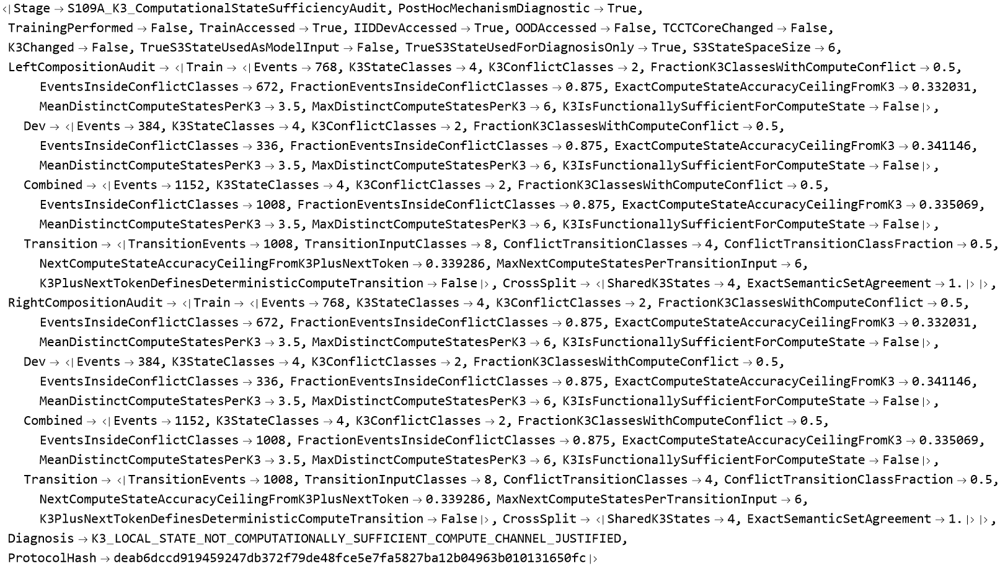

In [3267]:
s109AResult

In [3272]:
Dataset[
  leftPerLengthS109A
]

Dataset[{<|PrefixLength -> 1, Events -> 144, K3StateClasses -> 2, ConflictClasses -> 0, 
 
>     ConflictClassFraction -> 0., EventConflictFraction -> 0., 
 
>     ComputeStateCeilingFromK3 -> 1., MaxComputeStatesPerK3 -> 1|>, 
 
>    <|PrefixLength -> 2, Events -> 144, K3StateClasses -> 2, ConflictClasses -> 2, 
 
>     ConflictClassFraction -> 1., EventConflictFraction -> 1., 
 
>     ComputeStateCeilingFromK3 -> 0.583333, MaxComputeStatesPerK3 -> 2|>, 
 
>    <|PrefixLength -> 3, Events -> 144, K3StateClasses -> 2, ConflictClasses -> 2, 
 
>     ConflictClassFraction -> 1., EventConflictFraction -> 1., 
 
>     ComputeStateCeilingFromK3 -> 0.472222, MaxComputeStatesPerK3 -> 3|>, 
 
>    <|PrefixLength -> 4, Events -> 144, K3StateClasses -> 2, ConflictClasses -> 2, 
 
>     ConflictClassFraction -> 1., EventConflictFraction -> 1., 
 
>     ComputeStateCeilingFromK3 -> 0.423611, MaxComputeStatesPerK3 -> 3|>, 
 
>    <|PrefixLength -> 5, Events -> 144, K3StateClasses -> 2, ConflictClasses -> 2, 
 
>     ConflictClassFraction -> 1., EventConflictFraction -> 1., 
 
>     ComputeStateCeilingFromK3 -> 0.4375, MaxComputeStatesPerK3 -> 3|>, 
 
>    <|PrefixLength -> 6, Events -> 144, K3StateClasses -> 2, ConflictClasses -> 2, 
 
>     ConflictClassFraction -> 1., EventConflictFraction -> 1., 
 
>     ComputeStateCeilingFromK3 -> 0.451389, MaxComputeStatesPerK3 -> 3|>, 
 
>    <|PrefixLength -> 7, Events -> 96, K3StateClasses -> 2, ConflictClasses -> 2, 
 
>     ConflictClassFraction -> 1., EventConflictFraction -> 1., 
 
>     ComputeStateCeilingFromK3 -> 0.427083, MaxComputeStatesPerK3 -> 3|>, 
 
>    <|PrefixLength -> 8, Events -> 96, K3StateClasses -> 2, ConflictClasses -> 2, 
 
>     ConflictClassFraction -> 1., EventConflictFraction -> 1., 
 
>     ComputeStateCeilingFromK3 -> 0.427083, MaxComputeStatesPerK3 -> 3|>, 
 
>    <|PrefixLength -> 9, Events -> 48, K3StateClasses -> 2, ConflictClasses -> 2, 
 
>     ConflictClassFraction -> 1., EventConflictFraction -> 1., 
 
>     ComputeStateCeilingFromK3 -> 0.395833, MaxComputeStatesPerK3 -> 3|>, 
 
>    <|PrefixLength -> 10, Events -> 48, K3StateClasses -> 2, ConflictClasses -> 2, 
 
>     ConflictClassFraction -> 1., EventConflictFraction -> 1., 
 
>     ComputeStateCeilingFromK3 -> 0.395833, MaxComputeStatesPerK3 -> 3|>}, 
 
>   TypeSystem`Vector[TypeSystem`Struct[{PrefixLength, Events, K3StateClasses, 
 
>      ConflictClasses, ConflictClassFraction, EventConflictFraction, 
 
>      ComputeStateCeilingFromK3, MaxComputeStatesPerK3}, 
 
>     {TypeSystem`Atom[Integer], TypeSystem`Atom[Integer], TypeSystem`Atom[Integer], 
 
>      TypeSystem`Atom[Integer], TypeSystem`Atom[Real], TypeSystem`Atom[Real], 
 
>      TypeSystem`Atom[Real], TypeSystem`Atom[Integer]}], 10], <||>]

In [3277]:
Dataset[
  rightPerLengthS109A
]

Dataset[{<|PrefixLength -> 1, Events -> 144, K3StateClasses -> 2, ConflictClasses -> 0, 
 
>     ConflictClassFraction -> 0., EventConflictFraction -> 0., 
 
>     ComputeStateCeilingFromK3 -> 1., MaxComputeStatesPerK3 -> 1|>, 
 
>    <|PrefixLength -> 2, Events -> 144, K3StateClasses -> 2, ConflictClasses -> 2, 
 
>     ConflictClassFraction -> 1., EventConflictFraction -> 1., 
 
>     ComputeStateCeilingFromK3 -> 0.583333, MaxComputeStatesPerK3 -> 2|>, 
 
>    <|PrefixLength -> 3, Events -> 144, K3StateClasses -> 2, ConflictClasses -> 2, 
 
>     ConflictClassFraction -> 1., EventConflictFraction -> 1., 
 
>     ComputeStateCeilingFromK3 -> 0.472222, MaxComputeStatesPerK3 -> 3|>, 
 
>    <|PrefixLength -> 4, Events -> 144, K3StateClasses -> 2, ConflictClasses -> 2, 
 
>     ConflictClassFraction -> 1., EventConflictFraction -> 1., 
 
>     ComputeStateCeilingFromK3 -> 0.423611, MaxComputeStatesPerK3 -> 3|>, 
 
>    <|PrefixLength -> 5, Events -> 144, K3StateClasses -> 2, ConflictClasses -> 2, 
 
>     ConflictClassFraction -> 1., EventConflictFraction -> 1., 
 
>     ComputeStateCeilingFromK3 -> 0.4375, MaxComputeStatesPerK3 -> 3|>, 
 
>    <|PrefixLength -> 6, Events -> 144, K3StateClasses -> 2, ConflictClasses -> 2, 
 
>     ConflictClassFraction -> 1., EventConflictFraction -> 1., 
 
>     ComputeStateCeilingFromK3 -> 0.451389, MaxComputeStatesPerK3 -> 3|>, 
 
>    <|PrefixLength -> 7, Events -> 96, K3StateClasses -> 2, ConflictClasses -> 2, 
 
>     ConflictClassFraction -> 1., EventConflictFraction -> 1., 
 
>     ComputeStateCeilingFromK3 -> 0.427083, MaxComputeStatesPerK3 -> 3|>, 
 
>    <|PrefixLength -> 8, Events -> 96, K3StateClasses -> 2, ConflictClasses -> 2, 
 
>     ConflictClassFraction -> 1., EventConflictFraction -> 1., 
 
>     ComputeStateCeilingFromK3 -> 0.427083, MaxComputeStatesPerK3 -> 3|>, 
 
>    <|PrefixLength -> 9, Events -> 48, K3StateClasses -> 2, ConflictClasses -> 2, 
 
>     ConflictClassFraction -> 1., EventConflictFraction -> 1., 
 
>     ComputeStateCeilingFromK3 -> 0.395833, MaxComputeStatesPerK3 -> 3|>, 
 
>    <|PrefixLength -> 10, Events -> 48, K3StateClasses -> 2, ConflictClasses -> 2, 
 
>     ConflictClassFraction -> 1., EventConflictFraction -> 1., 
 
>     ComputeStateCeilingFromK3 -> 0.395833, MaxComputeStatesPerK3 -> 3|>}, 
 
>   TypeSystem`Vector[TypeSystem`Struct[{PrefixLength, Events, K3StateClasses, 
 
>      ConflictClasses, ConflictClassFraction, EventConflictFraction, 
 
>      ComputeStateCeilingFromK3, MaxComputeStatesPerK3}, 
 
>     {TypeSystem`Atom[Integer], TypeSystem`Atom[Integer], TypeSystem`Atom[Integer], 
 
>      TypeSystem`Atom[Integer], TypeSystem`Atom[Real], TypeSystem`Atom[Real], 
 
>      TypeSystem`Atom[Real], TypeSystem`Atom[Integer]}], 10], <||>]

In [3282]:
Dataset[
  leftConflictExamplesS109A
]

Dataset[{<|K3State -> 
 
>      {Role, TokenExit, CausalParentTagSet, 
 
>       {{SourceRole, Other, DestinationRole, TokenExit, Relation, NonToken, 
 
>         SourceLocalClass, {Role, Other, CausalParentTagSet, 
 
>          {{SourceRole, TokenCenter, DestinationRole, Other, Relation, NonToken, 
 
>            SourceLocalClass, {Role, TokenCenter, CausalParentTagSet, 
 
>             {{SourceRole, TokenExit, DestinationRole, TokenCenter, Relation, 
 
>               FromPrevious, SourceLocalClass, {Role, TokenExit}}}}}}}}}}, 
 
>     DistinctComputeStates -> 
 
>      {{3, 1, 2}, {2, 3, 1}, {3, 2, 1}, {2, 1, 3}, {1, 3, 2}, {1, 2, 3}}, 
 
>     ExamplePrefixes -> 
 
>      {<|Split -> Train, Depth -> 6, PrefixLength -> 2, Prefix -> {0, 1}, 
 
>        ComputeState -> {3, 1, 2}|>, 
 
>       <|Split -> Train, Depth -> 6, PrefixLength -> 4, Prefix -> {0, 1, 0, 1}, 
 
>        ComputeState -> {2, 3, 1}|>, 
 
>       <|Split -> Train, Depth -> 6, PrefixLength -> 5, Prefix -> {0, 1, 0, 1, 1}, 
 
>        ComputeState -> {3, 2, 1}|>, 
 
>       <|Split -> Train, Depth -> 6, PrefixLength -> 2, Prefix -> {0, 1}, 
 
>        ComputeState -> {3, 1, 2}|>, 
 
>       <|Split -> Train, Depth -> 6, PrefixLength -> 3, Prefix -> {0, 1, 1}, 
 
>        ComputeState -> {2, 1, 3}|>, 
 
>       <|Split -> Train, Depth -> 6, PrefixLength -> 5, Prefix -> {0, 1, 1, 0, 1}, 
 
>        ComputeState -> {1, 3, 2}|>}|>, 
 
>    <|K3State -> 
 
>      {Role, TokenExit, CausalParentTagSet, 
 
>       {{SourceRole, TokenCenter, DestinationRole, TokenExit, Relation, SameToken, 
 
>         SourceLocalClass, {Role, TokenCenter, CausalParentTagSet, 
 
>          {{SourceRole, Other, DestinationRole, TokenCenter, Relation, NonToken, 
 
>            SourceLocalClass, {Role, Other, CausalParentTagSet, 
 
>             {{SourceRole, TokenExit, DestinationRole, Other, Relation, NonToken, 
 
>               SourceLocalClass, {Role, TokenExit}}}}}}}}}}, 
 
>     DistinctComputeStates -> 
 
>      {{3, 2, 1}, {3, 1, 2}, {1, 2, 3}, {2, 3, 1}, {1, 3, 2}, {2, 1, 3}}, 
 
>     ExamplePrefixes -> 
 
>      {<|Split -> Train, Depth -> 6, PrefixLength -> 3, Prefix -> {0, 1, 0}, 
 
>        ComputeState -> {3, 2, 1}|>, 
 
>       <|Split -> Train, Depth -> 6, PrefixLength -> 6, Prefix -> {0, 1, 0, 1, 1, 0}, 
 
>        ComputeState -> {3, 1, 2}|>, 
 
>       <|Split -> Train, Depth -> 6, PrefixLength -> 4, Prefix -> {0, 1, 1, 0}, 
 
>        ComputeState -> {1, 2, 3}|>, 
 
>       <|Split -> Train, Depth -> 6, PrefixLength -> 6, Prefix -> {0, 1, 1, 0, 1, 0}, 
 
>        ComputeState -> {2, 3, 1}|>, 
 
>       <|Split -> Train, Depth -> 6, PrefixLength -> 2, Prefix -> {1, 0}, 
 
>        ComputeState -> {2, 3, 1}|>, 
 
>       <|Split -> Train, Depth -> 6, PrefixLength -> 3, Prefix -> {1, 0, 0}, 
 
>        ComputeState -> {1, 3, 2}|>}|>}, 
 
>   TypeSystem`Vector[TypeSystem`Struct[{K3State, DistinctComputeStates, 
 
>      ExamplePrefixes}, {TypeSystem`Tuple[{TypeSystem`Atom[String], 
 
>        TypeSystem`Atom[String], TypeSystem`Atom[String], 
 
>        TypeSystem`Vector[TypeSystem`Tuple[{TypeSystem`Atom[String], 
 
>           TypeSystem`Atom[String], TypeSystem`Atom[String], TypeSystem`Atom[String], 
 
>           TypeSystem`Atom[String], TypeSystem`Atom[String], TypeSystem`Atom[String], 
 
>           TypeSystem`Tuple[{TypeSystem`Atom[String], TypeSystem`Atom[String], 
 
>             TypeSystem`Atom[String], 
 
>             TypeSystem`Vector[TypeSystem`Tuple[{TypeSystem`Atom[String], 
 
>                TypeSystem`Atom[String], TypeSystem`Atom[String], 
 
>                TypeSystem`Atom[String], TypeSystem`Atom[String], 
 
>                TypeSystem`Atom[String], TypeSystem`Atom[String], 
 
>                TypeSystem`Tuple[{TypeSystem`Atom[String], TypeSystem`Atom[String], 
 
>                  TypeSystem`Atom[String], 
 
>                  TypeSystem`Vector[TypeSystem`Tuple[{TypeSystem`Atom[String], 
 
>                     TypeSystem`Atom[String], TypeSystem`A

In [3287]:
(* ============================================================ *)
(* S109B                                                        *)
(* Dual-Channel TCCT Development Prototype                      *)
(*                                                              *)
(* K3 structural channel + recurrent compute-state channel      *)
(*                                                              *)
(* TRAIN + IID DEV ONLY                                         *)
(* NO OOD                                                       *)
(* NO true S3 state used                                        *)
(* NO reference executor                                        *)
(*                                                              *)
(* Five modes:                                                  *)
(*   1 K3Only                                                   *)
(*   2 ComputeOnly_Ordered                                      *)
(*   3 K3PlusZeroCompute                                        *)
(*   4 K3PlusCommutativeCompute                                 *)
(*   5 K3PlusOrderedCompute                                     *)
(*                                                              *)
(* Modes 3/4/5 have EXACTLY the same trainable architecture.    *)
(* Only their compute-channel INPUT differs.                    *)
(* ============================================================ *)

ClearAll["Global`S109B*"];
ClearAll["Global`s109B*"];


s109BResult =
Catch[

(

(* ============================================================ *)
(* 0. FAIL SAFE                                                 *)
(* ============================================================ *)

S109BFail[msg_] := (
  Print["STOP: ", msg];
  Throw[$Failed, "S109B_STOP"];
);


Print["================================================"];
Print["S109B DUAL-CHANNEL TCCT DEVELOPMENT"];
Print["================================================"];


(* ============================================================ *)
(* 1. PREFLIGHT                                                 *)
(* ============================================================ *)

If[
  !And[
    ValueQ[trainRecords],
    ValueQ[iidRecords],
    ValueQ[dataByModeS107B],
    ValueQ[finalS109A]
  ],

  S109BFail[
    "Required Train/Dev/S107B/S109A objects are missing."
  ]
];


If[
  finalS109A["Diagnosis"] =!=
    "K3_LOCAL_STATE_NOT_COMPUTATIONALLY_SUFFICIENT_COMPUTE_CHANNEL_JUSTIFIED",

  S109BFail[
    "S109A did not justify a compute channel."
  ]
];


If[
  !KeyExistsQ[
    dataByModeS107B,
    "TaggedUnion_K3"
  ],

  S109BFail[
    "Frozen S107B TaggedUnion_K3 representations missing."
  ]
];


Print["Preflight = PASS"];
Print["S109A diagnosis = ", finalS109A["Diagnosis"]];
Print["TRAIN + IID DEV ONLY."];
Print["OOD WILL NOT BE ACCESSED."];


(* ============================================================ *)
(* 2. LOCKED DEVELOPMENT SETTINGS                               *)
(* ============================================================ *)

s109BSeeds = {
  9801,
  9802,
  9803,
  9804,
  9805
};


s109BTrainingRounds = 500;

s109BStructuralHidden = 32;

s109BComputeHidden = 8;

s109BHeadHidden = 24;


s109BModes = {
  "K3Only",
  "ComputeOnly_Ordered",
  "K3PlusZeroCompute",
  "K3PlusCommutativeCompute",
  "K3PlusOrderedCompute"
};


s109BDualModes = {
  "K3PlusZeroCompute",
  "K3PlusCommutativeCompute",
  "K3PlusOrderedCompute"
};


Print["Compute state dimension = ", s109BComputeHidden];
Print["Seeds = ", s109BSeeds];
Print["Training rounds = ", s109BTrainingRounds];


(* ============================================================ *)
(* 3. FROZEN K3 STRUCTURAL INPUT                                *)
(*                                                              *)
(* IMPORTANT:                                                   *)
(* We reuse EXACTLY the K3 numeric representation that S107B    *)
(* already used. No new K3 readout is invented here.            *)
(* ============================================================ *)

k3TrainStructuralS109B =
  dataByModeS107B[
    "TaggedUnion_K3"
  ]["Train"][[All, 1]];


k3DevStructuralS109B =
  dataByModeS107B[
    "TaggedUnion_K3"
  ]["Dev"][[All, 1]];


If[
  Length[k3TrainStructuralS109B] =!= Length[trainRecords] ||
  Length[k3DevStructuralS109B] =!= Length[iidRecords],

  S109BFail[
    "Frozen K3 representation alignment failed."
  ]
];


S109BSequence64Q[x_] :=
  And[
    ListQ[x],
    Length[x] >= 1,

    And @@
      (
        (
          ListQ[#] &&
          Length[#] == 64
        ) &
        /@
        x
      )
  ];


If[
  !And @@
    (
      S109BSequence64Q /@
      Join[
        k3TrainStructuralS109B,
        k3DevStructuralS109B
      ]
    ),

  S109BFail[
    "Frozen K3 structural sequences are not 64D."
  ]
];


Print["Frozen K3 structural interface = PASS"];


(* ============================================================ *)
(* 4. LEGAL LOCAL OPERATOR TAG                                  *)
(*                                                              *)
(* This is NOT the cumulative S3 state.                         *)
(* It is only the primitive local operation tag from Seq.       *)
(*                                                              *)
(* 0 -> {1,0}                                                   *)
(* 1 -> {0,1}                                                   *)
(*                                                              *)
(* No Y / answer / S3 product / reference executor.             *)
(* ============================================================ *)

S109BTokenVec[0] := {1., 0.};
S109BTokenVec[1] := {0., 1.};


S109BOrderedComputeInput[
  r_Association
] :=
  S109BTokenVec /@
    r["Seq"];


(* ------------------------------------------------------------ *)
(* Zero control:                                                 *)
(* Same length, but NO token information.                        *)
(* This controls for adding the extra recurrent branch.          *)
(* ------------------------------------------------------------ *)

S109BZeroComputeInput[
  r_Association
] :=
  ConstantArray[
    {0., 0.},
    Length[
      r["Seq"]
    ]
  ];


(* ------------------------------------------------------------ *)
(* Commutative control:                                          *)
(* Preserve token counts and sequence length, destroy original   *)
(* operation order.                                              *)
(*                                                               *)
(* e.g. {1,0,1,0,0} -> {0,0,0,1,1}                              *)
(* ------------------------------------------------------------ *)

S109BCommutativeComputeInput[
  r_Association
] :=
  S109BTokenVec /@
    Sort[
      r["Seq"]
    ];


(* ============================================================ *)
(* 5. TOKEN CONTRACT AUDIT                                      *)
(* ============================================================ *)

allDevelopmentRecordsS109B =
  Join[
    trainRecords,
    iidRecords
  ];


tokenAlphabetS109B =
  Sort[
    DeleteDuplicates[
      Flatten[
        (#["Seq"] &) /@
          allDevelopmentRecordsS109B
      ]
    ]
  ];


Print[
  "Primitive token alphabet = ",
  tokenAlphabetS109B
];


If[
  tokenAlphabetS109B =!= {0, 1},

  S109BFail[
    "Unexpected primitive token alphabet."
  ]
];


computeDimensionAuditS109B =
  And @@
    Table[

      And[
        Length[
          S109BOrderedComputeInput[r]
        ] ==
        Length[r["Seq"]],

        Length[
          S109BZeroComputeInput[r]
        ] ==
        Length[r["Seq"]],

        Length[
          S109BCommutativeComputeInput[r]
        ] ==
        Length[r["Seq"]],

        And @@
          (
            Length[#] == 2 &
            /@
            S109BOrderedComputeInput[r]
          ),

        And @@
          (
            Length[#] == 2 &
            /@
            S109BCommutativeComputeInput[r]
          )
      ],

      {
        r,
        allDevelopmentRecordsS109B
      }
    ];


Print[
  "Compute-channel dimension audit = ",
  computeDimensionAuditS109B
];


If[
  !TrueQ[computeDimensionAuditS109B],

  S109BFail[
    "Compute-channel input audit failed."
  ]
];


(* ============================================================ *)
(* 6. FORBIDDEN INFORMATION AUDIT                               *)
(* ============================================================ *)

s109BInputDefinitionText =
  ToString[
    InputForm[
      {
        DownValues[S109BOrderedComputeInput],
        DownValues[S109BZeroComputeInput],
        DownValues[S109BCommutativeComputeInput]
      }
    ]
  ];


s109BForbiddenTerms = {
  "[\"Y\"]",
  "ReferenceExecutor",
  "CorrectDestination",
  "WrongDestination",
  "ProgramOutput",
  "S3Product",
  "LeftComputeState",
  "RightComputeState",
  "TaskY",
  "BLTruth",
  "BLExecute"
};


s109BForbiddenHits =
  Select[
    s109BForbiddenTerms,

    StringContainsQ[
      s109BInputDefinitionText,
      #
    ] &
  ];


Print[
  "Forbidden compute-input hits = ",
  s109BForbiddenHits
];


If[
  s109BForbiddenHits =!= {},

  S109BFail[
    "Forbidden information detected in compute channel."
  ]
];


(* ============================================================ *)
(* 7. BUILD NETWORKS                                            *)
(* ============================================================ *)

(* ------------------------------------------------------------ *)
(* K3 structural encoder                                        *)
(* ------------------------------------------------------------ *)

S109BStructuralEncoder[] :=
  NetChain[
    {
      GatedRecurrentLayer[
        s109BStructuralHidden,
        "Input" -> {"Varying", 64}
      ],

      SequenceLastLayer[]
    }
  ];


(* ------------------------------------------------------------ *)
(* 8D recurrent computational state                             *)
(*                                                              *)
(* This is the new C_t channel:                                 *)
(*                                                              *)
(* C_(t+1) = shared recurrent transition(C_t, local token tag)   *)
(* ------------------------------------------------------------ *)

S109BComputeEncoder[] :=
  NetChain[
    {
      GatedRecurrentLayer[
        s109BComputeHidden,
        "Input" -> {"Varying", 2}
      ],

      SequenceLastLayer[]
    }
  ];


(* ------------------------------------------------------------ *)
(* Common binary head                                            *)
(* ------------------------------------------------------------ *)

S109BHead[] :=
  NetChain[
    {
      LinearLayer[
        s109BHeadHidden
      ],

      ElementwiseLayer[
        Tanh
      ],

      LinearLayer[],

      ElementwiseLayer[
        LogisticSigmoid
      ]
    }
  ];


(* ------------------------------------------------------------ *)
(* A. K3 only                                                    *)
(* ------------------------------------------------------------ *)

s109BK3OnlyBaseNet =
  NetChain[
    {
      GatedRecurrentLayer[
        s109BStructuralHidden,
        "Input" -> {"Varying", 64}
      ],

      SequenceLastLayer[],

      LinearLayer[
        s109BHeadHidden
      ],

      ElementwiseLayer[
        Tanh
      ],

      LinearLayer[],

      ElementwiseLayer[
        LogisticSigmoid
      ]
    },

    "Input" ->
      {"Varying", 64}
  ];


(* ------------------------------------------------------------ *)
(* B. Compute only                                               *)
(* ------------------------------------------------------------ *)

s109BComputeOnlyBaseNet =
  NetChain[
    {
      GatedRecurrentLayer[
        s109BComputeHidden,
        "Input" -> {"Varying", 2}
      ],

      SequenceLastLayer[],

      LinearLayer[
        s109BHeadHidden
      ],

      ElementwiseLayer[
        Tanh
      ],

      LinearLayer[],

      ElementwiseLayer[
        LogisticSigmoid
      ]
    },

    "Input" ->
      {"Varying", 2}
  ];


(* ------------------------------------------------------------ *)
(* C/D/E. Dual-channel network                                   *)
(*                                                              *)
(* SAME architecture for                                        *)
(*   Zero                                                       *)
(*   Commutative                                                *)
(*   Ordered                                                    *)
(*                                                              *)
(* This is important: any difference between these three cannot  *)
(* be explained by parameter count.                             *)
(* ------------------------------------------------------------ *)

s109BDualBaseNet =
  NetGraph[

    <|

      "StructuralEncoder" ->
        S109BStructuralEncoder[],

      "ComputeEncoder" ->
        S109BComputeEncoder[],

      "Join" ->
        CatenateLayer[],

      "Head" ->
        S109BHead[]

    |>,

    {

      NetPort["Structural"] ->
        "StructuralEncoder",

      NetPort["Compute"] ->
        "ComputeEncoder",

      {
        "StructuralEncoder",
        "ComputeEncoder"
      } ->
        "Join" ->
        "Head"

    },

    "Structural" ->
      {"Varying", 64},

    "Compute" ->
      {"Varying", 2}

  ];


Print[
  "Network construction = PASS"
];


(* ============================================================ *)
(* 8. BUILD DEVELOPMENT DATA                                    *)
(* ============================================================ *)

S109BComputeInputForMode[
  "K3PlusZeroCompute",
  r_Association
] :=
  S109BZeroComputeInput[r];


S109BComputeInputForMode[
  "K3PlusCommutativeCompute",
  r_Association
] :=
  S109BCommutativeComputeInput[r];


S109BComputeInputForMode[
  "K3PlusOrderedCompute",
  r_Association
] :=
  S109BOrderedComputeInput[r];


ClearAll[S109BBuildRows];


S109BBuildRows[
  "K3Only",
  records_List,
  structural_List
] :=
  Table[

    <|

      "Input" ->
        structural[[i]],

      "Y" ->
        records[[i]]["Y"],

      "PairID" ->
        records[[i]]["PairID"],

      "Depth" ->
        records[[i]]["Depth"]

    |>,

    {
      i,
      Length[records]
    }
  ];


S109BBuildRows[
  "ComputeOnly_Ordered",
  records_List,
  structural_List
] :=
  Table[

    <|

      "Input" ->
        S109BOrderedComputeInput[
          records[[i]]
        ],

      "Y" ->
        records[[i]]["Y"],

      "PairID" ->
        records[[i]]["PairID"],

      "Depth" ->
        records[[i]]["Depth"]

    |>,

    {
      i,
      Length[records]
    }
  ];


S109BBuildRows[
  mode_String,
  records_List,
  structural_List
] /;
  MemberQ[
    s109BDualModes,
    mode
  ] :=
  Table[

    <|

      "Input" ->
        <|

          "Structural" ->
            structural[[i]],

          "Compute" ->
            S109BComputeInputForMode[
              mode,
              records[[i]]
            ]

        |>,

      "Y" ->
        records[[i]]["Y"],

      "PairID" ->
        records[[i]]["PairID"],

      "Depth" ->
        records[[i]]["Depth"]

    |>,

    {
      i,
      Length[records]
    }
  ];


dataByModeS109B =
  Association[
    Table[

      mode ->
        <|

          "Train" ->
            S109BBuildRows[
              mode,
              trainRecords,
              k3TrainStructuralS109B
            ],

          "Dev" ->
            S109BBuildRows[
              mode,
              iidRecords,
              k3DevStructuralS109B
            ]

        |>,

      {
        mode,
        s109BModes
      }
    ]
  ];


Print[
  "Development data construction = DONE"
];


(* ============================================================ *)
(* 9. TRAINING RULES                                            *)
(* ============================================================ *)

S109BTrainingRules[
  rows_List
] :=
  (
    #["Input"] ->
      N[
        #["Y"]
      ] &
  ) /@
    rows;


(* ============================================================ *)
(* 10. ROBUST SCALAR OUTPUT                                     *)
(* ============================================================ *)

S109BScalar[x_] :=
  Which[

    NumericQ[x],
      N[x],

    ListQ[x] &&
    Length[
      Flatten[x]
    ] == 1,

      N[
        First[
          Flatten[x]
        ]
      ],

    True,

      S109BFail[
        "Network did not return a scalar probability."
      ]
  ];


S109BScore[
  net_,
  input_
] :=
  S109BScalar[
    net[input]
  ];


(* ============================================================ *)
(* 11. EVALUATE ROWS                                            *)
(* ============================================================ *)

S109BScoredRows[
  net_,
  rows_List
] :=
  Table[

    Join[
      row,

      <|

        "Score" ->
          S109BScore[
            net,
            row["Input"]
          ]

      |>
    ],

    {
      row,
      rows
    }
  ];


(* ============================================================ *)
(* 12. BALANCED ACCURACY                                        *)
(* ============================================================ *)

S109BBA[
  scoredRows_List
] :=
  N[
    Mean[
      Table[

        Module[
          {
            rr
          },


          rr =
            Cases[
              scoredRows,

              a_Association /;
                a["Y"] === y
            ];


          Mean[
            (
              Boole[
                If[
                  #["Score"] >= 0.5,
                  1,
                  0
                ] === y
              ] &
            ) /@
              rr
          ]

        ],

        {
          y,
          {0, 1}
        }
      ]
    ]
  ];


(* ============================================================ *)
(* 13. MATCHED-PAIR RANKING ACCURACY                            *)
(*                                                              *)
(* Positive score > negative score = 1                          *)
(* tie = 0.5                                                    *)
(* wrong ordering = 0                                           *)
(* ============================================================ *)

S109BPairAccuracy[
  scoredRows_List
] :=
Module[
  {
    groups,
    vals
  },


  groups =
    Values@
      GroupBy[
        scoredRows,
        #["PairID"] &
      ];


  vals =
    Table[

      Module[
        {
          pos,
          neg,
          ps,
          ns
        },


        pos =
          Cases[
            g,

            a_Association /;
              a["Y"] === 1
          ];


        neg =
          Cases[
            g,

            a_Association /;
              a["Y"] === 0
          ];


        If[
          Length[pos] =!= 1 ||
          Length[neg] =!= 1,

          S109BFail[
            "Matched pair structure invalid."
          ]
        ];


        ps =
          First[pos]["Score"];


        ns =
          First[neg]["Score"];


        Which[
          ps > ns, 1.,
          ps < ns, 0.,
          True, 0.5
        ]

      ],

      {
        g,
        groups
      }
    ];


  N[
    Mean[
      vals
    ]
  ]
];


(* ============================================================ *)
(* 14. PER-DEPTH PAIR ACCURACY                                  *)
(* ============================================================ *)

S109BPerDepthPair[
  scoredRows_List
] :=
  Association[
    Table[

      d ->
        S109BPairAccuracy[
          Cases[
            scoredRows,

            a_Association /;
              a["Depth"] === d
          ]
        ],

      {
        d,
        Sort[
          DeleteDuplicates[
            (
              #["Depth"] &
            ) /@
            scoredRows
          ]
        ]
      }
    ]
  ];


(* ============================================================ *)
(* 15. NETWORK TEMPLATE DISPATCH                                *)
(* ============================================================ *)

S109BBaseNet[
  "K3Only"
] :=
  s109BK3OnlyBaseNet;


S109BBaseNet[
  "ComputeOnly_Ordered"
] :=
  s109BComputeOnlyBaseNet;


S109BBaseNet[
  mode_String
] /;
  MemberQ[
    s109BDualModes,
    mode
  ] :=
  s109BDualBaseNet;


(* ============================================================ *)
(* 16. ONE TRAINING RUN                                         *)
(* ============================================================ *)

S109BRunOne[
  mode_String,
  seed_Integer
] :=
Module[
  {
    trainRows,
    devRows,
    rules,

    initialized,
    initHash,

    trained,
    timing,

    trainScored,
    devScored
  },


  Print[
    "Training ",
    mode,
    " | seed ",
    seed,
    " ..."
  ];


  trainRows =
    dataByModeS109B[
      mode
    ]["Train"];


  devRows =
    dataByModeS109B[
      mode
    ]["Dev"];


  rules =
    S109BTrainingRules[
      trainRows
    ];


  initialized =
    NetInitialize[
      S109BBaseNet[
        mode
      ],

      RandomSeeding ->
        seed
    ];


  initHash =
    Hash[
      initialized,
      "SHA256",
      "HexString"
    ];


  timing =
    AbsoluteTiming[

      trained =
        NetTrain[
          initialized,
          rules,

          BatchSize ->
            16,

          MaxTrainingRounds ->
            s109BTrainingRounds,

          TargetDevice ->
            "CPU",

          RandomSeeding ->
            seed
        ];
    ];


  trainScored =
    S109BScoredRows[
      trained,
      trainRows
    ];


  devScored =
    S109BScoredRows[
      trained,
      devRows
    ];


  Print[
    "  done in ",
    N[timing[[1]]],
    " sec",
    " | TrainPair = ",
    S109BPairAccuracy[
      trainScored
    ],
    " | DevPair = ",
    S109BPairAccuracy[
      devScored
    ]
  ];


  <|

    "Mode" ->
      mode,

    "Seed" ->
      seed,

    "InitHash" ->
      initHash,

    "TrainingSeconds" ->
      N[
        timing[[1]]
      ],

    "TrainBA" ->
      S109BBA[
        trainScored
      ],

    "TrainPairAccuracy" ->
      S109BPairAccuracy[
        trainScored
      ],

    "DevBA" ->
      S109BBA[
        devScored
      ],

    "DevPairAccuracy" ->
      S109BPairAccuracy[
        devScored
      ],

    "DevPerDepthPair" ->
      S109BPerDepthPair[
        devScored
      ]

  |>
];


(* ============================================================ *)
(* 17. RUN 5 MODES x 5 SEEDS = 25                              *)
(* ============================================================ *)

Print["================================================"];
Print["STARTING S109B TRAINING"];
Print["5 modes x 5 seeds = 25 runs"];
Print["================================================"];


rowsS109B =
  Flatten[
    Table[

      Table[

        S109BRunOne[
          mode,
          seed
        ],

        {
          seed,
          s109BSeeds
        }
      ],

      {
        mode,
        s109BModes
      }
    ],

    1
  ];


If[
  Length[
    rowsS109B
  ] =!= 25,

  S109BFail[
    "Expected exactly 25 completed runs."
  ]
];


Print[
  "Completed runs = ",
  Length[
    rowsS109B
  ]
];


(* ============================================================ *)
(* 18. SAFE SUMMARY                                             *)
(* ============================================================ *)

S109BRows[
  mode_String
] :=
  Cases[
    rowsS109B,

    a_Association /;
      a["Mode"] === mode
  ];


S109BSummary[
  mode_String
] :=
Module[
  {
    rr
  },


  rr =
    S109BRows[
      mode
    ];


  If[
    Length[rr] =!= 5,

    S109BFail[
      "Expected five runs per mode."
    ]
  ];


  <|

    "Mode" ->
      mode,

    "Runs" ->
      5,

    "MeanTrainBA" ->
      N[
        Mean[
          (
            #["TrainBA"] &
          ) /@
            rr
        ]
      ],

    "MeanTrainPairAccuracy" ->
      N[
        Mean[
          (
            #["TrainPairAccuracy"] &
          ) /@
            rr
        ]
      ],

    "MinTrainPairAccuracy" ->
      Min[
        (
          #["TrainPairAccuracy"] &
        ) /@
          rr
      ],

    "MeanDevBA" ->
      N[
        Mean[
          (
            #["DevBA"] &
          ) /@
            rr
        ]
      ],

    "MeanDevPairAccuracy" ->
      N[
        Mean[
          (
            #["DevPairAccuracy"] &
          ) /@
            rr
        ]
      ],

    "MinDevPairAccuracy" ->
      Min[
        (
          #["DevPairAccuracy"] &
        ) /@
          rr
      ],

    "MaxDevPairAccuracy" ->
      Max[
        (
          #["DevPairAccuracy"] &
        ) /@
          rr
      ]

  |>
];


summaryS109B =
  Association[
    Table[

      mode ->
        S109BSummary[
          mode
        ],

      {
        mode,
        s109BModes
      }
    ]
  ];


(* ============================================================ *)
(* 19. SAME INITIALIZATION CHECK FOR DUAL MODES                 *)
(*                                                              *)
(* Zero / Commutative / Ordered use identical architecture.     *)
(* Their initialized parameter hashes MUST therefore match for   *)
(* each seed.                                                    *)
(* ============================================================ *)

matchedDualInitializationS109B =
  Association[
    Table[

      seed ->
        Module[
          {
            hh
          },


          hh =
            (
              #["InitHash"] &
            ) /@
              Cases[
                rowsS109B,

                a_Association /;
                  And[
                    a["Seed"] === seed,
                    MemberQ[
                      s109BDualModes,
                      a["Mode"]
                    ]
                  ]
              ];


          And[
            Length[hh] == 3,
            SameQ @@ hh
          ]

        ],

      {
        seed,
        s109BSeeds
      }
    ]
  ];


Print[
  "Matched dual initialization = ",
  matchedDualInitializationS109B
];


(* ============================================================ *)
(* 20. MATCHED-SEED COMPARISON                                  *)
(* ============================================================ *)

S109BGetRow[
  mode_String,
  seed_Integer
] :=
Module[
  {
    hits
  },


  hits =
    Cases[
      rowsS109B,

      a_Association /;
        And[
          a["Mode"] === mode,
          a["Seed"] === seed
        ]
    ];


  If[
    Length[hits] =!= 1,

    S109BFail[
      "Matched row lookup failed."
    ]
  ];


  First[
    hits
  ]
];


pairedS109B =
  Table[

    Module[
      {
        k3,
        comp,
        zero,
        comm,
        ordered
      },


      k3 =
        S109BGetRow[
          "K3Only",
          seed
        ];


      comp =
        S109BGetRow[
          "ComputeOnly_Ordered",
          seed
        ];


      zero =
        S109BGetRow[
          "K3PlusZeroCompute",
          seed
        ];


      comm =
        S109BGetRow[
          "K3PlusCommutativeCompute",
          seed
        ];


      ordered =
        S109BGetRow[
          "K3PlusOrderedCompute",
          seed
        ];


      <|

        "Seed" ->
          seed,

        "K3Only" ->
          k3["DevPairAccuracy"],

        "ComputeOnly" ->
          comp["DevPairAccuracy"],

        "Zero" ->
          zero["DevPairAccuracy"],

        "Commutative" ->
          comm["DevPairAccuracy"],

        "Ordered" ->
          ordered["DevPairAccuracy"],

        "OrderedMinusK3" ->
          N[
            ordered["DevPairAccuracy"] -
            k3["DevPairAccuracy"]
          ],

        "OrderedMinusComputeOnly" ->
          N[
            ordered["DevPairAccuracy"] -
            comp["DevPairAccuracy"]
          ],

        "OrderedMinusZero" ->
          N[
            ordered["DevPairAccuracy"] -
            zero["DevPairAccuracy"]
          ],

        "OrderedMinusCommutative" ->
          N[
            ordered["DevPairAccuracy"] -
            comm["DevPairAccuracy"]
          ]

      |>

    ],

    {
      seed,
      s109BSeeds
    }
  ];


(* ============================================================ *)
(* 21. DEVELOPMENT DIAGNOSIS                                    *)
(* ============================================================ *)

k3DevS109B =
  summaryS109B[
    "K3Only"
  ]["MeanDevPairAccuracy"];


computeOnlyDevS109B =
  summaryS109B[
    "ComputeOnly_Ordered"
  ]["MeanDevPairAccuracy"];


zeroDevS109B =
  summaryS109B[
    "K3PlusZeroCompute"
  ]["MeanDevPairAccuracy"];


commDevS109B =
  summaryS109B[
    "K3PlusCommutativeCompute"
  ]["MeanDevPairAccuracy"];


orderedDevS109B =
  summaryS109B[
    "K3PlusOrderedCompute"
  ]["MeanDevPairAccuracy"];


orderedGainVsK3S109B =
  N[
    orderedDevS109B -
    k3DevS109B
  ];


orderedGainVsZeroS109B =
  N[
    orderedDevS109B -
    zeroDevS109B
  ];


orderedGainVsCommS109B =
  N[
    orderedDevS109B -
    commDevS109B
  ];


orderedGainVsComputeOnlyS109B =
  N[
    orderedDevS109B -
    computeOnlyDevS109B
  ];


orderedWinsVsCommSeedsS109B =
  Count[
    pairedS109B,

    a_Association /;
      a[
        "OrderedMinusCommutative"
      ] > 0
  ];


orderedWinsVsZeroSeedsS109B =
  Count[
    pairedS109B,

    a_Association /;
      a[
        "OrderedMinusZero"
      ] > 0
  ];


computeChannelUsefulS109B =
  And[
    orderedGainVsK3S109B >= 0.05,
    orderedGainVsZeroS109B >= 0.05
  ];


orderMattersS109B =
  And[
    orderedGainVsCommS109B >= 0.05,
    orderedWinsVsCommSeedsS109B >= 3
  ];


dualChannelSynergyS109B =
  orderedDevS109B >=
    Max[
      k3DevS109B,
      computeOnlyDevS109B
    ] + 0.02;


diagnosisS109B =
  Which[

    computeChannelUsefulS109B &&
    orderMattersS109B &&
    dualChannelSynergyS109B,

      "DUAL_CHANNEL_SUPPORTED_ORDERED_COMPUTE_STATE_ADDS_NONCOMMUTATIVE_INFORMATION",


    computeChannelUsefulS109B &&
    orderMattersS109B,

      "ORDERED_COMPUTE_CHANNEL_SUPPORTED_BUT_STRUCTURAL_SYNERGY_NOT_YET_ESTABLISHED",


    computeChannelUsefulS109B &&
    !orderMattersS109B,

      "COMPUTE_CHANNEL_HELPS_BUT_ORDER_SPECIFICITY_NOT_ESTABLISHED",


    !computeChannelUsefulS109B,

      "CURRENT_8D_COMPUTE_CHANNEL_DOES_NOT_YET_REPAIR_TASK_GENERALIZATION",

    True,

      "INCONCLUSIVE"
  ];


(* ============================================================ *)
(* 22. PROTOCOL HASH                                            *)
(* ============================================================ *)

protocolHashS109B =
  Hash[
    {
      "S109B_DualChannel_TCCT",

      s109BSeeds,

      s109BTrainingRounds,

      s109BStructuralHidden,

      s109BComputeHidden,

      s109BHeadHidden,

      DownValues[
        S109BOrderedComputeInput
      ],

      DownValues[
        S109BCommutativeComputeInput
      ],

      s109BDualBaseNet

    },

    "SHA256",
    "HexString"
  ];


(* ============================================================ *)
(* 23. FINAL REPORT                                             *)
(* ============================================================ *)

finalS109B =
  <|

    "Stage" ->
      "S109B_DualChannelTCCT_DevelopmentPrototype",

    "ArchitectureDevelopment" ->
      True,

    "PostHocAfterS109A" ->
      True,

    "TrainingPerformed" ->
      True,

    "TrainAccessed" ->
      True,

    "IIDDevAccessed" ->
      True,

    "OODAccessed" ->
      False,

    "StructuralChannel" ->
      "Frozen_TaggedUnion_K3",

    "ComputeChannel" ->
      "Shared_GatedRecurrent_8D",

    "ComputeStateDimension" ->
      s109BComputeHidden,

    "PrimitiveTokenTagUsed" ->
      True,

    "TrueS3StateUsedAsModelInput" ->
      False,

    "ReferenceExecutorUsed" ->
      False,

    "CodePairUsed" ->
      False,

    "UniqueNodeIdentifierUsed" ->
      False,

    "AbsolutePositionUsedByComputeChannel" ->
      False,

    "DualModesHaveSameTrainableArchitecture" ->
      True,

    "MatchedDualInitialization" ->
      matchedDualInitializationS109B,

    "ForbiddenComputeInputHits" ->
      s109BForbiddenHits,

    "Results" ->
      summaryS109B,

    "MatchedSeedComparison" ->
      pairedS109B,

    "OrderedGainVsK3" ->
      orderedGainVsK3S109B,

    "OrderedGainVsComputeOnly" ->
      orderedGainVsComputeOnlyS109B,

    "OrderedGainVsZero" ->
      orderedGainVsZeroS109B,

    "OrderedGainVsCommutative" ->
      orderedGainVsCommS109B,

    "OrderedWinsVsZeroSeeds" ->
      orderedWinsVsZeroSeedsS109B,

    "OrderedWinsVsCommutativeSeeds" ->
      orderedWinsVsCommSeedsS109B,

    "ComputeChannelUseful" ->
      computeChannelUsefulS109B,

    "OrderMatters" ->
      orderMattersS109B,

    "DualChannelSynergy" ->
      dualChannelSynergyS109B,

    "Diagnosis" ->
      diagnosisS109B,

    "ProtocolHash" ->
      protocolHashS109B

  |>;


Print["================================================"];
Print["S109B COMPLETE"];
Print["Diagnosis = ", diagnosisS109B];
Print["================================================"];


finalS109B

),

"S109B_STOP"
];

S109B DUAL-CHANNEL TCCT DEVELOPMENT
Preflight = PASS
S109A diagnosis = K3_LOCAL_STATE_NOT_COMPUTATIONALLY_SUFFICIENT_COMPUTE_CHANN\
 
>    EL_JUSTIFIED
TRAIN + IID DEV ONLY.
OOD WILL NOT BE ACCESSED.
Compute state dimension = 8
Seeds = {9801, 9802, 9803, 9804, 9805}
Training rounds = 500
Frozen K3 structural interface = PASS
Primitive token alphabet = {0, 1}
Compute-channel dimension audit = True
Forbidden compute-input hits = {}
Network construction = PASS
Development data construction = DONE
STARTING S109B TRAINING
5 modes x 5 seeds = 25 runs
Training K3Only | seed 9801 ...


NetInitialize::nfspec: Cannot initialize net: parameter "OutputDimensions" of layer 5 is not fully specified.

NetTrain::invnet: First argument to NetTrain should be a net or a net encoder.

STOP: Network did not return a scalar probability.


In [3315]:
(* ============================================================ *)
(* S109B NETWORK OUTPUT-DIMENSION FIX                           *)
(* ============================================================ *)

Print["Patching S109B scalar output layers..."];


(* ------------------------------------------------------------ *)
(* Structural encoder                                            *)
(* ------------------------------------------------------------ *)

ClearAll[S109BStructuralEncoder];

S109BStructuralEncoder[] :=
  NetChain[
    {
      GatedRecurrentLayer[
        s109BStructuralHidden,
        "Input" -> {"Varying", 64}
      ],

      SequenceLastLayer[]
    }
  ];


(* ------------------------------------------------------------ *)
(* Compute encoder                                               *)
(* ------------------------------------------------------------ *)

ClearAll[S109BComputeEncoder];

S109BComputeEncoder[] :=
  NetChain[
    {
      GatedRecurrentLayer[
        s109BComputeHidden,
        "Input" -> {"Varying", 2}
      ],

      SequenceLastLayer[]
    }
  ];


(* ------------------------------------------------------------ *)
(* FIXED SCALAR HEAD                                             *)
(* IMPORTANT: LinearLayer[{}], NOT LinearLayer[]                 *)
(* ------------------------------------------------------------ *)

ClearAll[S109BHead];

S109BHead[] :=
  NetChain[
    {
      LinearLayer[
        s109BHeadHidden
      ],

      ElementwiseLayer[
        Tanh
      ],

      LinearLayer[
        {}
      ],

      ElementwiseLayer[
        LogisticSigmoid
      ]
    }
  ];


(* ------------------------------------------------------------ *)
(* K3 ONLY                                                      *)
(* ------------------------------------------------------------ *)

s109BK3OnlyBaseNet =
  NetChain[
    {
      GatedRecurrentLayer[
        s109BStructuralHidden,
        "Input" -> {"Varying", 64}
      ],

      SequenceLastLayer[],

      LinearLayer[
        s109BHeadHidden
      ],

      ElementwiseLayer[
        Tanh
      ],

      (* FIX *)
      LinearLayer[
        {}
      ],

      ElementwiseLayer[
        LogisticSigmoid
      ]
    },

    "Input" ->
      {"Varying", 64}
  ];


(* ------------------------------------------------------------ *)
(* COMPUTE ONLY                                                 *)
(* ------------------------------------------------------------ *)

s109BComputeOnlyBaseNet =
  NetChain[
    {
      GatedRecurrentLayer[
        s109BComputeHidden,
        "Input" -> {"Varying", 2}
      ],

      SequenceLastLayer[],

      LinearLayer[
        s109BHeadHidden
      ],

      ElementwiseLayer[
        Tanh
      ],

      (* FIX *)
      LinearLayer[
        {}
      ],

      ElementwiseLayer[
        LogisticSigmoid
      ]
    },

    "Input" ->
      {"Varying", 2}
  ];


(* ------------------------------------------------------------ *)
(* DUAL CHANNEL                                                 *)
(* ------------------------------------------------------------ *)

s109BDualBaseNet =
  NetGraph[

    <|

      "StructuralEncoder" ->
        S109BStructuralEncoder[],

      "ComputeEncoder" ->
        S109BComputeEncoder[],

      "Join" ->
        CatenateLayer[],

      "Head" ->
        S109BHead[]

    |>,

    {

      NetPort["Structural"] ->
        "StructuralEncoder",

      NetPort["Compute"] ->
        "ComputeEncoder",

      {
        "StructuralEncoder",
        "ComputeEncoder"
      } ->
        "Join" ->
        "Head"

    },

    "Structural" ->
      {"Varying", 64},

    "Compute" ->
      {"Varying", 2}

  ];


Print["Networks rebuilt."];

Patching S109B scalar output layers...
Networks rebuilt.


In [3352]:
ClearAll[
  testInitK3S109B,
  testInitComputeS109B,
  testInitDualS109B
];


testInitK3S109B =
  Quiet[
    Check[
      NetInitialize[
        s109BK3OnlyBaseNet,
        RandomSeeding -> 9801
      ],
      $Failed
    ]
  ];


testInitComputeS109B =
  Quiet[
    Check[
      NetInitialize[
        s109BComputeOnlyBaseNet,
        RandomSeeding -> 9801
      ],
      $Failed
    ]
  ];


testInitDualS109B =
  Quiet[
    Check[
      NetInitialize[
        s109BDualBaseNet,
        RandomSeeding -> 9801
      ],
      $Failed
    ]
  ];


initializationAuditS109B =
  <|

    "K3Only" ->
      (testInitK3S109B =!= $Failed),

    "ComputeOnly" ->
      (testInitComputeS109B =!= $Failed),

    "DualChannel" ->
      (testInitDualS109B =!= $Failed)

  |>;


initializationAuditS109B

<|K3Only -> True, ComputeOnly -> True, DualChannel -> True|>

In [3362]:
(* ============================================================ *)
(* S109B -- CLEAN FIXED VERSION                                 *)
(* Dual-Channel TCCT Development Prototype                      *)
(*                                                              *)
(* STRUCTURAL CHANNEL: frozen TaggedUnion-K3                    *)
(* COMPUTE CHANNEL: shared recurrent 8D state                   *)
(*                                                              *)
(* TRAIN + IID DEV ONLY                                         *)
(* NO OOD                                                       *)
(* NO true S3 cumulative state supplied to model                *)
(* NO reference executor                                        *)
(*                                                              *)
(* Modes:                                                       *)
(*   1. K3Only                                                  *)
(*   2. ComputeOnly_Ordered                                     *)
(*   3. K3PlusZeroCompute                                       *)
(*   4. K3PlusCommutativeCompute                                *)
(*   5. K3PlusOrderedCompute                                    *)
(*                                                              *)
(* Zero / Commutative / Ordered use EXACT same architecture.    *)
(* ============================================================ *)


ClearAll["Global`S109B*"];
ClearAll["Global`s109B*"];


s109BResult =
Catch[

(

(* ============================================================ *)
(* 0. FAIL SAFE                                                 *)
(* ============================================================ *)

S109BFail[msg_] := (
  Print["STOP: ", msg];
  Throw[$Failed, "S109B_STOP"];
);


Print["================================================"];
Print["S109B CLEAN FIXED DUAL-CHANNEL TCCT"];
Print["================================================"];


(* ============================================================ *)
(* 1. PREFLIGHT                                                 *)
(* ============================================================ *)

If[
  !And[
    ValueQ[trainRecords],
    ValueQ[iidRecords],
    ValueQ[dataByModeS107B],
    ValueQ[finalS109A]
  ],

  S109BFail[
    "Required Train/Dev/S107B/S109A objects are missing."
  ]
];


If[
  finalS109A["Diagnosis"] =!=
    "K3_LOCAL_STATE_NOT_COMPUTATIONALLY_SUFFICIENT_COMPUTE_CHANNEL_JUSTIFIED",

  S109BFail[
    "S109A did not justify addition of a compute channel."
  ]
];


If[
  !KeyExistsQ[
    dataByModeS107B,
    "TaggedUnion_K3"
  ],

  S109BFail[
    "Frozen TaggedUnion_K3 representations are missing."
  ]
];


Print["Preflight = PASS"];
Print["S109A diagnosis = ", finalS109A["Diagnosis"]];
Print["TRAIN + IID DEV ONLY."];
Print["OOD WILL NOT BE ACCESSED."];


(* ============================================================ *)
(* 2. LOCK DEVELOPMENT SETTINGS                                 *)
(* ============================================================ *)

s109BSeeds = {
  9801,
  9802,
  9803,
  9804,
  9805
};


s109BTrainingRounds = 500;

s109BStructuralHidden = 32;

s109BComputeHidden = 8;

s109BHeadHidden = 24;


s109BModes = {
  "K3Only",
  "ComputeOnly_Ordered",
  "K3PlusZeroCompute",
  "K3PlusCommutativeCompute",
  "K3PlusOrderedCompute"
};


s109BDualModes = {
  "K3PlusZeroCompute",
  "K3PlusCommutativeCompute",
  "K3PlusOrderedCompute"
};


Print["Structural recurrent width = ", s109BStructuralHidden];
Print["Compute-state dimension = ", s109BComputeHidden];
Print["Head hidden width = ", s109BHeadHidden];
Print["Training rounds = ", s109BTrainingRounds];
Print["Seeds = ", s109BSeeds];


(* ============================================================ *)
(* 3. FROZEN K3 INPUT                                           *)
(* ============================================================ *)

k3TrainStructuralS109B =
  dataByModeS107B[
    "TaggedUnion_K3"
  ]["Train"][[All, 1]];


k3DevStructuralS109B =
  dataByModeS107B[
    "TaggedUnion_K3"
  ]["Dev"][[All, 1]];


If[
  Length[k3TrainStructuralS109B] =!=
    Length[trainRecords],

  S109BFail[
    "K3 TRAIN representation count mismatch."
  ]
];


If[
  Length[k3DevStructuralS109B] =!=
    Length[iidRecords],

  S109BFail[
    "K3 DEV representation count mismatch."
  ]
];


S109BSequence64Q[x_] :=
  And[
    ListQ[x],
    Length[x] >= 1,

    And @@
      (
        (
          ListQ[#] &&
          Length[#] == 64
        ) &
        /@
        x
      )
  ];


k3DimensionAuditS109B =
  And @@
    (
      S109BSequence64Q /@
        Join[
          k3TrainStructuralS109B,
          k3DevStructuralS109B
        ]
    );


Print[
  "Frozen K3 64D sequence audit = ",
  k3DimensionAuditS109B
];


If[
  !TrueQ[k3DimensionAuditS109B],

  S109BFail[
    "Frozen K3 representation is not a valid varying-length 64D sequence."
  ]
];


(* ============================================================ *)
(* 4. COMPUTE-CHANNEL INPUT                                     *)
(*                                                              *)
(* Only primitive operation token is exposed.                   *)
(*                                                              *)
(* 0 -> {1,0}                                                   *)
(* 1 -> {0,1}                                                   *)
(*                                                              *)
(* This is NOT cumulative S3 state.                             *)
(* ============================================================ *)

S109BTokenVec[0] := {1., 0.};

S109BTokenVec[1] := {0., 1.};


S109BOrderedComputeInput[
  r_Association
] :=
  S109BTokenVec /@
    r["Seq"];


(* Same sequence length but no operation information. *)

S109BZeroComputeInput[
  r_Association
] :=
  ConstantArray[
    {0., 0.},
    Length[r["Seq"]]
  ];


(* Preserve token counts + length, destroy original order. *)

S109BCommutativeComputeInput[
  r_Association
] :=
  S109BTokenVec /@
    Sort[
      r["Seq"]
    ];


(* ============================================================ *)
(* 5. COMPUTE INPUT AUDIT                                       *)
(* ============================================================ *)

allDevelopmentRecordsS109B =
  Join[
    trainRecords,
    iidRecords
  ];


tokenAlphabetS109B =
  Sort[
    DeleteDuplicates[
      Flatten[
        (#["Seq"] &) /@
          allDevelopmentRecordsS109B
      ]
    ]
  ];


Print[
  "Primitive token alphabet = ",
  tokenAlphabetS109B
];


If[
  tokenAlphabetS109B =!= {0, 1},

  S109BFail[
    "Unexpected primitive-token alphabet."
  ]
];


S109BSequence2Q[x_] :=
  And[
    ListQ[x],
    Length[x] >= 1,

    And @@
      (
        (
          ListQ[#] &&
          Length[#] == 2
        ) &
        /@
        x
      )
  ];


computeInputAuditS109B =
  And @@
    Table[

      And[
        S109BSequence2Q[
          S109BOrderedComputeInput[r]
        ],

        S109BSequence2Q[
          S109BZeroComputeInput[r]
        ],

        S109BSequence2Q[
          S109BCommutativeComputeInput[r]
        ],

        Length[
          S109BOrderedComputeInput[r]
        ] ===
          Length[r["Seq"]],

        Length[
          S109BCommutativeComputeInput[r]
        ] ===
          Length[r["Seq"]]
      ],

      {
        r,
        allDevelopmentRecordsS109B
      }
    ];


Print[
  "Compute-channel input audit = ",
  computeInputAuditS109B
];


If[
  !TrueQ[computeInputAuditS109B],

  S109BFail[
    "Compute-channel input audit failed."
  ]
];


(* ============================================================ *)
(* 6. FORBIDDEN INFORMATION AUDIT                               *)
(* ============================================================ *)

s109BComputeDefinitionText =
  ToString[
    InputForm[
      {
        DownValues[S109BTokenVec],
        DownValues[S109BOrderedComputeInput],
        DownValues[S109BZeroComputeInput],
        DownValues[S109BCommutativeComputeInput]
      }
    ]
  ];


s109BForbiddenTerms = {
  "[\"Y\"]",
  "ReferenceExecutor",
  "CorrectDestination",
  "WrongDestination",
  "ProgramOutput",
  "S3Product",
  "LeftComputeState",
  "RightComputeState",
  "TaskY",
  "BLTruth",
  "BLExecute",
  "PairID"
};


s109BForbiddenHits =
  Select[
    s109BForbiddenTerms,

    StringContainsQ[
      s109BComputeDefinitionText,
      #
    ] &
  ];


Print[
  "Forbidden compute-input hits = ",
  s109BForbiddenHits
];


If[
  s109BForbiddenHits =!= {},

  S109BFail[
    "Forbidden information found in compute-channel definition."
  ]
];


(* ============================================================ *)
(* 7. NETWORK BUILDING BLOCKS                                   *)
(* ============================================================ *)

ClearAll[
  S109BStructuralEncoder,
  S109BComputeEncoder,
  S109BHead
];


S109BStructuralEncoder[] :=
  NetChain[
    {

      GatedRecurrentLayer[
        s109BStructuralHidden,
        "Input" -> {"Varying", 64}
      ],

      SequenceLastLayer[]

    }
  ];


S109BComputeEncoder[] :=
  NetChain[
    {

      GatedRecurrentLayer[
        s109BComputeHidden,
        "Input" -> {"Varying", 2}
      ],

      SequenceLastLayer[]

    }
  ];


(* IMPORTANT FIX:
   final LinearLayer is LinearLayer[{}], explicitly scalar. *)

S109BHead[] :=
  NetChain[
    {

      LinearLayer[
        s109BHeadHidden
      ],

      ElementwiseLayer[
        Tanh
      ],

      LinearLayer[
        {}
      ],

      ElementwiseLayer[
        LogisticSigmoid
      ]

    }
  ];


(* ============================================================ *)
(* 8. K3-ONLY NETWORK                                           *)
(* ============================================================ *)

s109BK3OnlyBaseNet =
  NetChain[
    {

      GatedRecurrentLayer[
        s109BStructuralHidden,
        "Input" -> {"Varying", 64}
      ],

      SequenceLastLayer[],

      LinearLayer[
        s109BHeadHidden
      ],

      ElementwiseLayer[
        Tanh
      ],

      (* Explicit scalar output. *)
      LinearLayer[
        {}
      ],

      ElementwiseLayer[
        LogisticSigmoid
      ]

    },

    "Input" ->
      {"Varying", 64}
  ];


(* ============================================================ *)
(* 9. COMPUTE-ONLY NETWORK                                      *)
(* ============================================================ *)

s109BComputeOnlyBaseNet =
  NetChain[
    {

      GatedRecurrentLayer[
        s109BComputeHidden,
        "Input" -> {"Varying", 2}
      ],

      SequenceLastLayer[],

      LinearLayer[
        s109BHeadHidden
      ],

      ElementwiseLayer[
        Tanh
      ],

      (* Explicit scalar output. *)
      LinearLayer[
        {}
      ],

      ElementwiseLayer[
        LogisticSigmoid
      ]

    },

    "Input" ->
      {"Varying", 2}
  ];


(* ============================================================ *)
(* 10. DUAL-CHANNEL NETWORK                                     *)
(*                                                              *)
(* Zero / Commutative / Ordered use this exact same net.        *)
(* ============================================================ *)

s109BDualBaseNet =
  NetGraph[

    <|

      "StructuralEncoder" ->
        S109BStructuralEncoder[],

      "ComputeEncoder" ->
        S109BComputeEncoder[],

      "Join" ->
        CatenateLayer[],

      "Head" ->
        S109BHead[]

    |>,

    {

      NetPort["Structural"] ->
        "StructuralEncoder",

      NetPort["Compute"] ->
        "ComputeEncoder",

      {
        "StructuralEncoder",
        "ComputeEncoder"
      } ->
        "Join",

      "Join" ->
        "Head"

    },

    "Structural" ->
      {"Varying", 64},

    "Compute" ->
      {"Varying", 2}

  ];


Print["Network definitions constructed."];


(* ============================================================ *)
(* 11. NETWORK INITIALIZATION SELF-TEST                          *)
(*                                                              *)
(* Catch architecture problems BEFORE 25 training runs.         *)
(* ============================================================ *)

Print[
  "Running network initialization self-test..."
];


testInitK3S109B =
  Quiet[
    Check[

      NetInitialize[
        s109BK3OnlyBaseNet,
        RandomSeeding -> 9801
      ],

      $Failed
    ]
  ];


testInitComputeS109B =
  Quiet[
    Check[

      NetInitialize[
        s109BComputeOnlyBaseNet,
        RandomSeeding -> 9801
      ],

      $Failed
    ]
  ];


testInitDualS109B =
  Quiet[
    Check[

      NetInitialize[
        s109BDualBaseNet,
        RandomSeeding -> 9801
      ],

      $Failed
    ]
  ];


initializationAuditS109B =
  <|

    "K3Only" ->
      (testInitK3S109B =!= $Failed),

    "ComputeOnly" ->
      (testInitComputeS109B =!= $Failed),

    "DualChannel" ->
      (testInitDualS109B =!= $Failed)

  |>;


Print[
  "Initialization audit = ",
  initializationAuditS109B
];


If[
  !And @@
    Values[
      initializationAuditS109B
    ],

  S109BFail[
    "One or more network templates cannot initialize."
  ]
];


(* ============================================================ *)
(* 12. FORWARD-PASS SELF-TEST                                   *)
(* ============================================================ *)

S109BScalarQ[x_] :=
  Or[
    NumericQ[x],

    And[
      ListQ[x],
      Length[Flatten[x]] == 1,
      NumericQ[
        First[
          Flatten[x]
        ]
      ]
    ]
  ];


testForwardK3S109B =
  Quiet[
    Check[

      testInitK3S109B[
        First[
          k3TrainStructuralS109B
        ]
      ],

      $Failed
    ]
  ];


testForwardComputeS109B =
  Quiet[
    Check[

      testInitComputeS109B[
        S109BOrderedComputeInput[
          First[
            trainRecords
          ]
        ]
      ],

      $Failed
    ]
  ];


testForwardDualS109B =
  Quiet[
    Check[

      testInitDualS109B[
        <|

          "Structural" ->
            First[
              k3TrainStructuralS109B
            ],

          "Compute" ->
            S109BOrderedComputeInput[
              First[
                trainRecords
              ]
            ]

        |>
      ],

      $Failed
    ]
  ];


forwardAuditS109B =
  <|

    "K3Only" ->
      And[
        testForwardK3S109B =!= $Failed,
        S109BScalarQ[
          testForwardK3S109B
        ]
      ],

    "ComputeOnly" ->
      And[
        testForwardComputeS109B =!= $Failed,
        S109BScalarQ[
          testForwardComputeS109B
        ]
      ],

    "DualChannel" ->
      And[
        testForwardDualS109B =!= $Failed,
        S109BScalarQ[
          testForwardDualS109B
        ]
      ]

  |>;


Print[
  "Forward-pass audit = ",
  forwardAuditS109B
];


If[
  !And @@
    Values[
      forwardAuditS109B
    ],

  S109BFail[
    "Network forward-pass self-test failed."
  ]
];


Print["NETWORK SELF-TEST = PASS"];


(* ============================================================ *)
(* 13. COMPUTE INPUT DISPATCH                                   *)
(* ============================================================ *)

S109BComputeInputForMode[
  "K3PlusZeroCompute",
  r_Association
] :=
  S109BZeroComputeInput[
    r
  ];


S109BComputeInputForMode[
  "K3PlusCommutativeCompute",
  r_Association
] :=
  S109BCommutativeComputeInput[
    r
  ];


S109BComputeInputForMode[
  "K3PlusOrderedCompute",
  r_Association
] :=
  S109BOrderedComputeInput[
    r
  ];


(* ============================================================ *)
(* 14. BUILD DATA                                               *)
(* ============================================================ *)

ClearAll[S109BBuildRows];


S109BBuildRows[
  "K3Only",
  records_List,
  structural_List
] :=
  Table[

    <|

      "Input" ->
        structural[[i]],

      "Y" ->
        records[[i]]["Y"],

      "PairID" ->
        records[[i]]["PairID"],

      "Depth" ->
        records[[i]]["Depth"]

    |>,

    {
      i,
      Length[records]
    }
  ];


S109BBuildRows[
  "ComputeOnly_Ordered",
  records_List,
  structural_List
] :=
  Table[

    <|

      "Input" ->
        S109BOrderedComputeInput[
          records[[i]]
        ],

      "Y" ->
        records[[i]]["Y"],

      "PairID" ->
        records[[i]]["PairID"],

      "Depth" ->
        records[[i]]["Depth"]

    |>,

    {
      i,
      Length[records]
    }
  ];


S109BBuildRows[
  mode_String,
  records_List,
  structural_List
] /;
  MemberQ[
    s109BDualModes,
    mode
  ] :=
  Table[

    <|

      "Input" ->
        <|

          "Structural" ->
            structural[[i]],

          "Compute" ->
            S109BComputeInputForMode[
              mode,
              records[[i]]
            ]

        |>,

      "Y" ->
        records[[i]]["Y"],

      "PairID" ->
        records[[i]]["PairID"],

      "Depth" ->
        records[[i]]["Depth"]

    |>,

    {
      i,
      Length[records]
    }
  ];


dataByModeS109B =
  Association[
    Table[

      mode ->
        <|

          "Train" ->
            S109BBuildRows[
              mode,
              trainRecords,
              k3TrainStructuralS109B
            ],

          "Dev" ->
            S109BBuildRows[
              mode,
              iidRecords,
              k3DevStructuralS109B
            ]

        |>,

      {
        mode,
        s109BModes
      }
    ]
  ];


Print[
  "Development dataset construction = DONE"
];


(* ============================================================ *)
(* 15. TRAINING RULES                                           *)
(* ============================================================ *)

S109BTrainingRules[
  rows_List
] :=
  Map[

    Function[
      row,

      row["Input"] ->
        N[
          row["Y"]
        ]
    ],

    rows
  ];


(* ============================================================ *)
(* 16. SCALAR OUTPUT HELPER                                     *)
(* ============================================================ *)

S109BScalar[x_] :=
  Which[

    NumericQ[x],

      N[x],


    ListQ[x] &&
    Length[
      Flatten[x]
    ] == 1 &&
    NumericQ[
      First[
        Flatten[x]
      ]
    ],

      N[
        First[
          Flatten[x]
        ]
      ],


    True,

      S109BFail[
        "Network output is not a scalar probability."
      ]
  ];


S109BScore[
  net_,
  input_
] :=
  S109BScalar[
    net[input]
  ];


(* ============================================================ *)
(* 17. SCORE DATA                                               *)
(* ============================================================ *)

S109BScoredRows[
  net_,
  rows_List
] :=
  Table[

    Join[

      row,

      <|

        "Score" ->
          S109BScore[
            net,
            row["Input"]
          ]

      |>
    ],

    {
      row,
      rows
    }
  ];


(* ============================================================ *)
(* 18. BALANCED ACCURACY                                        *)
(* ============================================================ *)

S109BBA[
  scoredRows_List
] :=
Module[
  {
    classScores
  },


  classScores =
    Table[

      Module[
        {
          rr
        },


        rr =
          Cases[
            scoredRows,

            a_Association /;
              a["Y"] === y
          ];


        If[
          rr === {},

          Missing[
            "NoClass"
          ],

          N[
            Mean[
              (
                Boole[
                  If[
                    #["Score"] >= 0.5,
                    1,
                    0
                  ] === y
                ] &
              ) /@
                rr
            ]
          ]
        ]

      ],

      {
        y,
        {0, 1}
      }
    ];


  If[
    MemberQ[
      classScores,
      _Missing
    ],

    Missing[
      "ClassMissing"
    ],

    N[
      Mean[
        classScores
      ]
    ]
  ]
];


(* ============================================================ *)
(* 19. MATCHED-PAIR ACCURACY                                    *)
(* ============================================================ *)

S109BPairAccuracy[
  scoredRows_List
] :=
Module[
  {
    groups,
    values
  },


  groups =
    Values@
      GroupBy[
        scoredRows,
        #["PairID"] &
      ];


  values =
    Table[

      Module[
        {
          pos,
          neg,
          ps,
          ns
        },


        pos =
          Cases[
            g,

            a_Association /;
              a["Y"] === 1
          ];


        neg =
          Cases[
            g,

            a_Association /;
              a["Y"] === 0
          ];


        If[
          Length[pos] =!= 1 ||
          Length[neg] =!= 1,

          S109BFail[
            "Invalid matched-pair structure."
          ]
        ];


        ps =
          First[pos][
            "Score"
          ];


        ns =
          First[neg][
            "Score"
          ];


        Which[

          ps > ns,
            1.,

          ps < ns,
            0.,

          True,
            0.5
        ]

      ],

      {
        g,
        groups
      }
    ];


  N[
    Mean[
      values
    ]
  ]
];


(* ============================================================ *)
(* 20. PER-DEPTH PAIR ACCURACY                                  *)
(* ============================================================ *)

S109BPerDepthPair[
  scoredRows_List
] :=
  Association[
    Table[

      d ->
        S109BPairAccuracy[
          Cases[
            scoredRows,

            a_Association /;
              a["Depth"] === d
          ]
        ],

      {
        d,
        Sort[
          DeleteDuplicates[
            (
              #["Depth"] &
            ) /@
              scoredRows
          ]
        ]
      }
    ]
  ];


(* ============================================================ *)
(* 21. BASE NETWORK DISPATCH                                    *)
(* ============================================================ *)

S109BBaseNet[
  "K3Only"
] :=
  s109BK3OnlyBaseNet;


S109BBaseNet[
  "ComputeOnly_Ordered"
] :=
  s109BComputeOnlyBaseNet;


S109BBaseNet[
  mode_String
] /;
  MemberQ[
    s109BDualModes,
    mode
  ] :=
  s109BDualBaseNet;


(* ============================================================ *)
(* 22. SAFE INITIALIZATION                                      *)
(* ============================================================ *)

S109BInitialize[
  mode_String,
  seed_Integer
] :=
Module[
  {
    initialized
  },


  initialized =
    Quiet[
      Check[

        NetInitialize[
          S109BBaseNet[
            mode
          ],

          RandomSeeding ->
            seed
        ],

        $Failed
      ]
    ];


  If[
    initialized === $Failed,

    S109BFail[
      StringJoin[
        "NetInitialize failed: ",
        mode,
        " seed ",
        ToString[seed]
      ]
    ]
  ];


  initialized
];


(* ============================================================ *)
(* 23. ONE TRAINING RUN                                         *)
(* ============================================================ *)

S109BRunOne[
  mode_String,
  seed_Integer
] :=
Module[
  {
    trainRows,
    devRows,
    rules,

    initialized,
    initHash,

    trained,
    timing,

    trainScored,
    devScored,

    trainPair,
    devPair
  },


  Print[
    "Training ",
    mode,
    " | seed ",
    seed,
    " ..."
  ];


  trainRows =
    dataByModeS109B[
      mode
    ]["Train"];


  devRows =
    dataByModeS109B[
      mode
    ]["Dev"];


  rules =
    S109BTrainingRules[
      trainRows
    ];


  initialized =
    S109BInitialize[
      mode,
      seed
    ];


  initHash =
    Hash[
      initialized,
      "SHA256",
      "HexString"
    ];


  timing =
    AbsoluteTiming[

      trained =
        Quiet[
          Check[

            NetTrain[
              initialized,
              rules,

              BatchSize ->
                16,

              MaxTrainingRounds ->
                s109BTrainingRounds,

              TargetDevice ->
                "CPU",

              RandomSeeding ->
                seed
            ],

            $Failed
          ]
        ];
    ];


  If[
    trained === $Failed,

    S109BFail[
      StringJoin[
        "NetTrain failed: ",
        mode,
        " seed ",
        ToString[seed]
      ]
    ]
  ];


  trainScored =
    S109BScoredRows[
      trained,
      trainRows
    ];


  devScored =
    S109BScoredRows[
      trained,
      devRows
    ];


  trainPair =
    S109BPairAccuracy[
      trainScored
    ];


  devPair =
    S109BPairAccuracy[
      devScored
    ];


  Print[
    "  done in ",
    N[timing[[1]]],
    " sec",
    " | TrainPair = ",
    trainPair,
    " | DevPair = ",
    devPair
  ];


  <|

    "Mode" ->
      mode,

    "Seed" ->
      seed,

    "InitHash" ->
      initHash,

    "TrainingSeconds" ->
      N[
        timing[[1]]
      ],

    "TrainBA" ->
      S109BBA[
        trainScored
      ],

    "TrainPairAccuracy" ->
      trainPair,

    "DevBA" ->
      S109BBA[
        devScored
      ],

    "DevPairAccuracy" ->
      devPair,

    "DevPerDepthPair" ->
      S109BPerDepthPair[
        devScored
      ]

  |>
];


(* ============================================================ *)
(* 24. RUN 25 EXPERIMENTS                                       *)
(* ============================================================ *)

Print["================================================"];
Print["STARTING S109B TRAINING"];
Print["5 modes x 5 seeds = 25 runs"];
Print["================================================"];


rowsS109B =
  Flatten[
    Table[

      Table[

        S109BRunOne[
          mode,
          seed
        ],

        {
          seed,
          s109BSeeds
        }
      ],

      {
        mode,
        s109BModes
      }
    ],

    1
  ];


If[
  !And[
    ListQ[rowsS109B],
    Length[rowsS109B] == 25
  ],

  S109BFail[
    "Expected exactly 25 completed runs."
  ]
];


Print[
  "Completed runs = ",
  Length[rowsS109B]
];


(* ============================================================ *)
(* 25. SUMMARY                                                  *)
(* ============================================================ *)

S109BRows[
  mode_String
] :=
  Cases[
    rowsS109B,

    a_Association /;
      a["Mode"] === mode
  ];


S109BSummary[
  mode_String
] :=
Module[
  {
    rr
  },


  rr =
    S109BRows[
      mode
    ];


  If[
    Length[rr] =!= 5,

    S109BFail[
      StringJoin[
        "Expected five runs for ",
        mode
      ]
    ]
  ];


  <|

    "Mode" ->
      mode,

    "Runs" ->
      5,

    "MeanTrainBA" ->
      N[
        Mean[
          (#["TrainBA"] &) /@
            rr
        ]
      ],

    "MeanTrainPairAccuracy" ->
      N[
        Mean[
          (#["TrainPairAccuracy"] &) /@
            rr
        ]
      ],

    "MinTrainPairAccuracy" ->
      Min[
        (#["TrainPairAccuracy"] &) /@
          rr
      ],

    "MeanDevBA" ->
      N[
        Mean[
          (#["DevBA"] &) /@
            rr
        ]
      ],

    "MeanDevPairAccuracy" ->
      N[
        Mean[
          (#["DevPairAccuracy"] &) /@
            rr
        ]
      ],

    "MinDevPairAccuracy" ->
      Min[
        (#["DevPairAccuracy"] &) /@
          rr
      ],

    "MaxDevPairAccuracy" ->
      Max[
        (#["DevPairAccuracy"] &) /@
          rr
      ]

  |>
];


summaryS109B =
  Association[
    Table[

      mode ->
        S109BSummary[
          mode
        ],

      {
        mode,
        s109BModes
      }
    ]
  ];


(* ============================================================ *)
(* 26. DUAL-MODE INITIALIZATION MATCH                           *)
(* ============================================================ *)

matchedDualInitializationS109B =
  Association[
    Table[

      seed ->
        Module[
          {
            hh
          },


          hh =
            (#["InitHash"] &) /@
              Cases[
                rowsS109B,

                a_Association /;
                  And[
                    a["Seed"] === seed,
                    MemberQ[
                      s109BDualModes,
                      a["Mode"]
                    ]
                  ]
              ];


          And[
            Length[hh] == 3,
            SameQ @@ hh
          ]

        ],

      {
        seed,
        s109BSeeds
      }
    ]
  ];


Print[
  "Matched dual initialization = ",
  matchedDualInitializationS109B
];


(* ============================================================ *)
(* 27. MATCHED-SEED LOOKUP                                      *)
(* ============================================================ *)

S109BGetRow[
  mode_String,
  seed_Integer
] :=
Module[
  {
    hits
  },


  hits =
    Cases[
      rowsS109B,

      a_Association /;
        And[
          a["Mode"] === mode,
          a["Seed"] === seed
        ]
    ];


  If[
    Length[hits] =!= 1,

    S109BFail[
      "Matched-seed lookup failed."
    ]
  ];


  First[hits]
];


(* ============================================================ *)
(* 28. MATCHED-SEED COMPARISON                                  *)
(* ============================================================ *)

pairedS109B =
  Table[

    Module[
      {
        k3,
        comp,
        zero,
        comm,
        ordered
      },


      k3 =
        S109BGetRow[
          "K3Only",
          seed
        ];


      comp =
        S109BGetRow[
          "ComputeOnly_Ordered",
          seed
        ];


      zero =
        S109BGetRow[
          "K3PlusZeroCompute",
          seed
        ];


      comm =
        S109BGetRow[
          "K3PlusCommutativeCompute",
          seed
        ];


      ordered =
        S109BGetRow[
          "K3PlusOrderedCompute",
          seed
        ];


      <|

        "Seed" ->
          seed,

        "K3Only" ->
          k3["DevPairAccuracy"],

        "ComputeOnly" ->
          comp["DevPairAccuracy"],

        "Zero" ->
          zero["DevPairAccuracy"],

        "Commutative" ->
          comm["DevPairAccuracy"],

        "Ordered" ->
          ordered["DevPairAccuracy"],

        "OrderedMinusK3" ->
          N[
            ordered["DevPairAccuracy"] -
            k3["DevPairAccuracy"]
          ],

        "OrderedMinusComputeOnly" ->
          N[
            ordered["DevPairAccuracy"] -
            comp["DevPairAccuracy"]
          ],

        "OrderedMinusZero" ->
          N[
            ordered["DevPairAccuracy"] -
            zero["DevPairAccuracy"]
          ],

        "OrderedMinusCommutative" ->
          N[
            ordered["DevPairAccuracy"] -
            comm["DevPairAccuracy"]
          ]

      |>

    ],

    {
      seed,
      s109BSeeds
    }
  ];


(* ============================================================ *)
(* 29. DEVELOPMENT DIAGNOSIS                                    *)
(* ============================================================ *)

k3DevS109B =
  summaryS109B[
    "K3Only"
  ]["MeanDevPairAccuracy"];


computeOnlyDevS109B =
  summaryS109B[
    "ComputeOnly_Ordered"
  ]["MeanDevPairAccuracy"];


zeroDevS109B =
  summaryS109B[
    "K3PlusZeroCompute"
  ]["MeanDevPairAccuracy"];


commDevS109B =
  summaryS109B[
    "K3PlusCommutativeCompute"
  ]["MeanDevPairAccuracy"];


orderedDevS109B =
  summaryS109B[
    "K3PlusOrderedCompute"
  ]["MeanDevPairAccuracy"];


orderedGainVsK3S109B =
  N[
    orderedDevS109B -
    k3DevS109B
  ];


orderedGainVsComputeOnlyS109B =
  N[
    orderedDevS109B -
    computeOnlyDevS109B
  ];


orderedGainVsZeroS109B =
  N[
    orderedDevS109B -
    zeroDevS109B
  ];


orderedGainVsCommS109B =
  N[
    orderedDevS109B -
    commDevS109B
  ];


orderedWinsVsCommSeedsS109B =
  Count[
    pairedS109B,

    a_Association /;
      a["OrderedMinusCommutative"] > 0
  ];


orderedWinsVsZeroSeedsS109B =
  Count[
    pairedS109B,

    a_Association /;
      a["OrderedMinusZero"] > 0
  ];


computeChannelUsefulS109B =
  And[
    orderedGainVsK3S109B >= 0.05,
    orderedGainVsZeroS109B >= 0.05
  ];


orderMattersS109B =
  And[
    orderedGainVsCommS109B >= 0.05,
    orderedWinsVsCommSeedsS109B >= 3
  ];


dualChannelSynergyS109B =
  orderedDevS109B >=
    Max[
      k3DevS109B,
      computeOnlyDevS109B
    ] + 0.02;


diagnosisS109B =
  Which[

    computeChannelUsefulS109B &&
    orderMattersS109B &&
    dualChannelSynergyS109B,

      "DUAL_CHANNEL_SUPPORTED_ORDERED_COMPUTE_STATE_ADDS_NONCOMMUTATIVE_INFORMATION",


    computeChannelUsefulS109B &&
    orderMattersS109B,

      "ORDERED_COMPUTE_CHANNEL_SUPPORTED_BUT_STRUCTURAL_SYNERGY_NOT_YET_ESTABLISHED",


    computeChannelUsefulS109B &&
    !orderMattersS109B,

      "COMPUTE_CHANNEL_HELPS_BUT_ORDER_SPECIFICITY_NOT_ESTABLISHED",


    !computeChannelUsefulS109B,

      "CURRENT_8D_COMPUTE_CHANNEL_DOES_NOT_YET_REPAIR_TASK_GENERALIZATION",


    True,

      "INCONCLUSIVE"

  ];


(* ============================================================ *)
(* 30. PROTOCOL HASH                                            *)
(* ============================================================ *)

protocolHashS109B =
  Hash[
    {

      "S109B_CLEAN_FIXED_DUAL_CHANNEL",

      s109BSeeds,

      s109BTrainingRounds,

      s109BStructuralHidden,

      s109BComputeHidden,

      s109BHeadHidden,

      DownValues[
        S109BOrderedComputeInput
      ],

      DownValues[
        S109BCommutativeComputeInput
      ],

      DownValues[
        S109BZeroComputeInput
      ],

      s109BK3OnlyBaseNet,

      s109BComputeOnlyBaseNet,

      s109BDualBaseNet

    },

    "SHA256",
    "HexString"
  ];


(* ============================================================ *)
(* 31. FINAL REPORT                                             *)
(* ============================================================ *)

finalS109B =
  <|

    "Stage" ->
      "S109B_CleanFixed_DualChannelTCCT_Development",

    "ArchitectureDevelopment" ->
      True,

    "PostHocAfterS109A" ->
      True,

    "TrainingPerformed" ->
      True,

    "TrainAccessed" ->
      True,

    "IIDDevAccessed" ->
      True,

    "OODAccessed" ->
      False,

    "StructuralChannel" ->
      "Frozen_TaggedUnion_K3",

    "ComputeChannel" ->
      "Shared_GatedRecurrent_8D",

    "ComputeStateDimension" ->
      s109BComputeHidden,

    "PrimitiveTokenTagUsed" ->
      True,

    "TrueS3StateUsedAsModelInput" ->
      False,

    "ReferenceExecutorUsed" ->
      False,

    "CodePairUsed" ->
      False,

    "UniqueNodeIdentifierUsed" ->
      False,

    "AbsolutePositionUsedByComputeChannel" ->
      False,

    "InitializationAudit" ->
      initializationAuditS109B,

    "ForwardPassAudit" ->
      forwardAuditS109B,

    "DualModesHaveSameTrainableArchitecture" ->
      True,

    "MatchedDualInitialization" ->
      matchedDualInitializationS109B,

    "ForbiddenComputeInputHits" ->
      s109BForbiddenHits,

    "Results" ->
      summaryS109B,

    "MatchedSeedComparison" ->
      pairedS109B,

    "OrderedGainVsK3" ->
      orderedGainVsK3S109B,

    "OrderedGainVsComputeOnly" ->
      orderedGainVsComputeOnlyS109B,

    "OrderedGainVsZero" ->
      orderedGainVsZeroS109B,

    "OrderedGainVsCommutative" ->
      orderedGainVsCommS109B,

    "OrderedWinsVsZeroSeeds" ->
      orderedWinsVsZeroSeedsS109B,

    "OrderedWinsVsCommutativeSeeds" ->
      orderedWinsVsCommSeedsS109B,

    "ComputeChannelUseful" ->
      computeChannelUsefulS109B,

    "OrderMatters" ->
      orderMattersS109B,

    "DualChannelSynergy" ->
      dualChannelSynergyS109B,

    "Diagnosis" ->
      diagnosisS109B,

    "ProtocolHash" ->
      protocolHashS109B

  |>;


Print["================================================"];
Print["S109B COMPLETE"];
Print["Diagnosis = ", diagnosisS109B];
Print["================================================"];


finalS109B

),

"S109B_STOP"
];

S109B CLEAN FIXED DUAL-CHANNEL TCCT
Preflight = PASS
S109A diagnosis = K3_LOCAL_STATE_NOT_COMPUTATIONALLY_SUFFICIENT_COMPUTE_CHANN\
 
>    EL_JUSTIFIED
TRAIN + IID DEV ONLY.
OOD WILL NOT BE ACCESSED.
Structural recurrent width = 32
Compute-state dimension = 8
Head hidden width = 24
Training rounds = 500
Seeds = {9801, 9802, 9803, 9804, 9805}
Frozen K3 64D sequence audit = True
Primitive token alphabet = {0, 1}
Compute-channel input audit = True
Forbidden compute-input hits = {}
Network definitions constructed.
Running network initialization self-test...
Initialization audit = <|K3Only -> True, ComputeOnly -> True, 
 
>    DualChannel -> True|>
Forward-pass audit = <|K3Only -> True, ComputeOnly -> True, 
 
>    DualChannel -> True|>
NETWORK SELF-TEST = PASS
Development dataset construction = DONE
STARTING S109B TRAINING
5 modes x 5 seeds = 25 runs
Training K3Only | seed 9801 ...
  done in 125.377 sec | TrainPair = 1. | DevPair = 0.75
Training K3Only | seed 9802 ...
  done in 123.983 sec

In [3390]:
(* ============================================================ *)
(* S109B-R2                                                     *)
(* Dual-Channel TCCT -- PORT-NAMED TRAINING DATA FIX            *)
(*                                                              *)
(* TRAIN + IID DEV ONLY                                         *)
(* NO OOD                                                       *)
(*                                                              *)
(* Structural channel: frozen TaggedUnion-K3                    *)
(* Compute channel: recurrent 8D                                *)
(*                                                              *)
(* Modes                                                        *)
(*   K3Only                                                     *)
(*   ComputeOnly_Ordered                                        *)
(*   K3PlusZeroCompute                                          *)
(*   K3PlusCommutativeCompute                                   *)
(*   K3PlusOrderedCompute                                       *)
(*                                                              *)
(* IMPORTANT FIX:                                               *)
(* Multi-input NetGraph training examples use named ports:      *)
(*                                                              *)
(* <|                                                           *)
(*   "Structural" -> ...,                                       *)
(*   "Compute"    -> ...,                                       *)
(*   "Output"     -> y                                          *)
(* |>                                                           *)
(* ============================================================ *)


ClearAll["Global`S109BR2*"];
ClearAll["Global`s109BR2*"];


s109BR2Result =
Catch[

(

(* ============================================================ *)
(* 0. FAIL SAFE                                                 *)
(* ============================================================ *)

S109BR2Fail[msg_] := (
  Print["STOP: ", msg];
  Throw[$Failed, "S109BR2_STOP"];
);


Print["================================================"];
Print["S109B-R2 DUAL-CHANNEL TCCT"];
Print["NAMED-PORT TRAINING DATA FIX"];
Print["================================================"];


(* ============================================================ *)
(* 1. PREFLIGHT                                                 *)
(* ============================================================ *)

If[
  !And[
    ValueQ[trainRecords],
    ValueQ[iidRecords],
    ValueQ[dataByModeS107B],
    ValueQ[finalS109A]
  ],

  S109BR2Fail[
    "Required Train / Dev / S107B / S109A objects missing."
  ]
];


If[
  finalS109A["Diagnosis"] =!=
    "K3_LOCAL_STATE_NOT_COMPUTATIONALLY_SUFFICIENT_COMPUTE_CHANNEL_JUSTIFIED",

  S109BR2Fail[
    "S109A does not justify the compute-channel experiment."
  ]
];


If[
  !KeyExistsQ[
    dataByModeS107B,
    "TaggedUnion_K3"
  ],

  S109BR2Fail[
    "Frozen TaggedUnion_K3 representation missing."
  ]
];


Print["Preflight = PASS"];
Print["Train records = ", Length[trainRecords]];
Print["IID Dev records = ", Length[iidRecords]];
Print["OOD WILL NOT BE ACCESSED."];


(* ============================================================ *)
(* 2. LOCK SETTINGS                                             *)
(* ============================================================ *)

s109BR2Seeds = {
  9801,
  9802,
  9803,
  9804,
  9805
};


s109BR2TrainingRounds = 500;

s109BR2StructuralHidden = 32;

s109BR2ComputeHidden = 8;

s109BR2HeadHidden = 24;


s109BR2Modes = {
  "K3Only",
  "ComputeOnly_Ordered",
  "K3PlusZeroCompute",
  "K3PlusCommutativeCompute",
  "K3PlusOrderedCompute"
};


s109BR2DualModes = {
  "K3PlusZeroCompute",
  "K3PlusCommutativeCompute",
  "K3PlusOrderedCompute"
};


Print["Seeds = ", s109BR2Seeds];
Print["Structural hidden = ", s109BR2StructuralHidden];
Print["Compute-state dimension = ", s109BR2ComputeHidden];
Print["Head hidden = ", s109BR2HeadHidden];
Print["Training rounds = ", s109BR2TrainingRounds];


(* ============================================================ *)
(* 3. FROZEN K3 REPRESENTATIONS                                 *)
(* ============================================================ *)

k3TrainS109BR2 =
  dataByModeS107B[
    "TaggedUnion_K3"
  ]["Train"][[All, 1]];


k3DevS109BR2 =
  dataByModeS107B[
    "TaggedUnion_K3"
  ]["Dev"][[All, 1]];


If[
  Length[k3TrainS109BR2] =!= Length[trainRecords],

  S109BR2Fail[
    "K3 TRAIN representation count mismatch."
  ]
];


If[
  Length[k3DevS109BR2] =!= Length[iidRecords],

  S109BR2Fail[
    "K3 DEV representation count mismatch."
  ]
];


S109BR2Sequence64Q[x_] :=
  And[
    ListQ[x],
    Length[x] >= 1,

    And @@
      (
        (
          ListQ[#] &&
          Length[#] == 64
        ) &
        /@
        x
      )
  ];


k3DimensionAuditS109BR2 =
  And @@
    (
      S109BR2Sequence64Q /@
        Join[
          k3TrainS109BR2,
          k3DevS109BR2
        ]
    );


Print[
  "Frozen K3 dimension audit = ",
  k3DimensionAuditS109BR2
];


If[
  !TrueQ[k3DimensionAuditS109BR2],

  S109BR2Fail[
    "K3 sequence dimension audit failed."
  ]
];


(* ============================================================ *)
(* 4. COMPUTE CHANNEL INPUTS                                    *)
(* ============================================================ *)

S109BR2TokenVec[0] := {1., 0.};

S109BR2TokenVec[1] := {0., 1.};


(* ------------------------------------------------------------ *)
(* Ordered: retain exact primitive-operation order              *)
(* ------------------------------------------------------------ *)

S109BR2Ordered[
  r_Association
] :=
  S109BR2TokenVec /@
    r["Seq"];


(* ------------------------------------------------------------ *)
(* Zero: same length, no token identity                         *)
(* ------------------------------------------------------------ *)

S109BR2Zero[
  r_Association
] :=
  ConstantArray[
    {0., 0.},
    Length[r["Seq"]]
  ];


(* ------------------------------------------------------------ *)
(* Commutative: preserve counts + length, destroy order         *)
(* ------------------------------------------------------------ *)

S109BR2Commutative[
  r_Association
] :=
  S109BR2TokenVec /@
    Sort[
      r["Seq"]
    ];


S109BR2Sequence2Q[x_] :=
  And[
    ListQ[x],
    Length[x] >= 1,

    And @@
      (
        (
          ListQ[#] &&
          Length[#] == 2
        ) &
        /@
        x
      )
  ];


allRecordsS109BR2 =
  Join[
    trainRecords,
    iidRecords
  ];


tokenAlphabetS109BR2 =
  Sort[
    DeleteDuplicates[
      Flatten[
        (#["Seq"] &) /@
          allRecordsS109BR2
      ]
    ]
  ];


Print[
  "Primitive token alphabet = ",
  tokenAlphabetS109BR2
];


If[
  tokenAlphabetS109BR2 =!= {0, 1},

  S109BR2Fail[
    "Unexpected primitive token alphabet."
  ]
];


computeInputAuditS109BR2 =
  And @@
    Table[

      And[
        S109BR2Sequence2Q[
          S109BR2Ordered[r]
        ],

        S109BR2Sequence2Q[
          S109BR2Zero[r]
        ],

        S109BR2Sequence2Q[
          S109BR2Commutative[r]
        ],

        Length[
          S109BR2Ordered[r]
        ] === Length[r["Seq"]],

        Length[
          S109BR2Zero[r]
        ] === Length[r["Seq"]],

        Length[
          S109BR2Commutative[r]
        ] === Length[r["Seq"]]
      ],

      {
        r,
        allRecordsS109BR2
      }
    ];


Print[
  "Compute input audit = ",
  computeInputAuditS109BR2
];


If[
  !TrueQ[computeInputAuditS109BR2],

  S109BR2Fail[
    "Compute input audit failed."
  ]
];


(* ============================================================ *)
(* 5. INFORMATION LEAKAGE AUDIT                                 *)
(* ============================================================ *)

computeDefinitionTextS109BR2 =
  ToString[
    InputForm[
      {
        DownValues[S109BR2TokenVec],
        DownValues[S109BR2Ordered],
        DownValues[S109BR2Zero],
        DownValues[S109BR2Commutative]
      }
    ]
  ];


forbiddenTermsS109BR2 = {
  "[\"Y\"]",
  "PairID",
  "ReferenceExecutor",
  "CorrectDestination",
  "WrongDestination",
  "ProgramOutput",
  "S3Product",
  "LeftComputeState",
  "RightComputeState",
  "TaskY",
  "BLTruth",
  "BLExecute"
};


forbiddenHitsS109BR2 =
  Select[
    forbiddenTermsS109BR2,

    StringContainsQ[
      computeDefinitionTextS109BR2,
      #
    ] &
  ];


Print[
  "Forbidden compute-input hits = ",
  forbiddenHitsS109BR2
];


If[
  forbiddenHitsS109BR2 =!= {},

  S109BR2Fail[
    "Forbidden information detected."
  ]
];


(* ============================================================ *)
(* 6. NETWORK COMPONENTS                                        *)
(* ============================================================ *)

ClearAll[
  S109BR2StructuralEncoder,
  S109BR2ComputeEncoder,
  S109BR2Head
];


S109BR2StructuralEncoder[] :=
  NetChain[
    {

      GatedRecurrentLayer[
        s109BR2StructuralHidden,
        "Input" -> {"Varying", 64}
      ],

      SequenceLastLayer[]

    }
  ];


S109BR2ComputeEncoder[] :=
  NetChain[
    {

      GatedRecurrentLayer[
        s109BR2ComputeHidden,
        "Input" -> {"Varying", 2}
      ],

      SequenceLastLayer[]

    }
  ];


S109BR2Head[] :=
  NetChain[
    {

      LinearLayer[
        s109BR2HeadHidden
      ],

      ElementwiseLayer[
        Tanh
      ],

      (* explicitly scalar *)
      LinearLayer[
        {}
      ],

      ElementwiseLayer[
        LogisticSigmoid
      ]

    }
  ];


(* ============================================================ *)
(* 7. K3-ONLY                                                   *)
(* ============================================================ *)

k3OnlyNetS109BR2 =
  NetChain[
    {

      GatedRecurrentLayer[
        s109BR2StructuralHidden,
        "Input" -> {"Varying", 64}
      ],

      SequenceLastLayer[],

      LinearLayer[
        s109BR2HeadHidden
      ],

      ElementwiseLayer[
        Tanh
      ],

      LinearLayer[
        {}
      ],

      ElementwiseLayer[
        LogisticSigmoid
      ]

    },

    "Input" ->
      {"Varying", 64}
  ];


(* ============================================================ *)
(* 8. COMPUTE-ONLY                                              *)
(* ============================================================ *)

computeOnlyNetS109BR2 =
  NetChain[
    {

      GatedRecurrentLayer[
        s109BR2ComputeHidden,
        "Input" -> {"Varying", 2}
      ],

      SequenceLastLayer[],

      LinearLayer[
        s109BR2HeadHidden
      ],

      ElementwiseLayer[
        Tanh
      ],

      LinearLayer[
        {}
      ],

      ElementwiseLayer[
        LogisticSigmoid
      ]

    },

    "Input" ->
      {"Varying", 2}
  ];


(* ============================================================ *)
(* 9. DUAL-CHANNEL                                              *)
(* ============================================================ *)

dualNetS109BR2 =
  NetGraph[

    <|

      "StructuralEncoder" ->
        S109BR2StructuralEncoder[],

      "ComputeEncoder" ->
        S109BR2ComputeEncoder[],

      "Join" ->
        CatenateLayer[],

      "Head" ->
        S109BR2Head[]

    |>,

    {

      NetPort["Structural"] ->
        "StructuralEncoder",

      NetPort["Compute"] ->
        "ComputeEncoder",

      {
        "StructuralEncoder",
        "ComputeEncoder"
      } ->
        "Join",

      "Join" ->
        "Head"

    },

    "Structural" ->
      {"Varying", 64},

    "Compute" ->
      {"Varying", 2}

  ];


Print["Network templates constructed."];


(* ============================================================ *)
(* 10. INITIALIZATION SELF TEST                                 *)
(* ============================================================ *)

Print["Running initialization self-test..."];


initK3S109BR2 =
  Quiet[
    Check[
      NetInitialize[
        k3OnlyNetS109BR2,
        RandomSeeding -> 9801
      ],
      $Failed
    ]
  ];


initComputeS109BR2 =
  Quiet[
    Check[
      NetInitialize[
        computeOnlyNetS109BR2,
        RandomSeeding -> 9801
      ],
      $Failed
    ]
  ];


initDualS109BR2 =
  Quiet[
    Check[
      NetInitialize[
        dualNetS109BR2,
        RandomSeeding -> 9801
      ],
      $Failed
    ]
  ];


initializationAuditS109BR2 =
  <|

    "K3Only" ->
      (initK3S109BR2 =!= $Failed),

    "ComputeOnly" ->
      (initComputeS109BR2 =!= $Failed),

    "DualChannel" ->
      (initDualS109BR2 =!= $Failed)

  |>;


Print[
  "Initialization audit = ",
  initializationAuditS109BR2
];


If[
  !And @@
    Values[
      initializationAuditS109BR2
    ],

  S109BR2Fail[
    "Network initialization self-test failed."
  ]
];


(* ============================================================ *)
(* 11. FORWARD SELF TEST                                        *)
(* ============================================================ *)

S109BR2ScalarQ[x_] :=
  Or[
    NumericQ[x],

    And[
      ListQ[x],
      Length[Flatten[x]] == 1,
      NumericQ[
        First[
          Flatten[x]
        ]
      ]
    ]
  ];


forwardK3S109BR2 =
  Quiet[
    Check[
      initK3S109BR2[
        First[k3TrainS109BR2]
      ],
      $Failed
    ]
  ];


forwardComputeS109BR2 =
  Quiet[
    Check[
      initComputeS109BR2[
        S109BR2Ordered[
          First[trainRecords]
        ]
      ],
      $Failed
    ]
  ];


forwardDualS109BR2 =
  Quiet[
    Check[
      initDualS109BR2[
        <|

          "Structural" ->
            First[
              k3TrainS109BR2
            ],

          "Compute" ->
            S109BR2Ordered[
              First[
                trainRecords
              ]
            ]

        |>
      ],
      $Failed
    ]
  ];


forwardAuditS109BR2 =
  <|

    "K3Only" ->
      And[
        forwardK3S109BR2 =!= $Failed,
        S109BR2ScalarQ[
          forwardK3S109BR2
        ]
      ],

    "ComputeOnly" ->
      And[
        forwardComputeS109BR2 =!= $Failed,
        S109BR2ScalarQ[
          forwardComputeS109BR2
        ]
      ],

    "DualChannel" ->
      And[
        forwardDualS109BR2 =!= $Failed,
        S109BR2ScalarQ[
          forwardDualS109BR2
        ]
      ]

  |>;


Print[
  "Forward audit = ",
  forwardAuditS109BR2
];


If[
  !And @@
    Values[
      forwardAuditS109BR2
    ],

  S109BR2Fail[
    "Forward self-test failed."
  ]
];


(* ============================================================ *)
(* 12. INPUT DISPATCH                                           *)
(* ============================================================ *)

S109BR2ComputeForMode[
  "K3PlusZeroCompute",
  r_Association
] :=
  S109BR2Zero[r];


S109BR2ComputeForMode[
  "K3PlusCommutativeCompute",
  r_Association
] :=
  S109BR2Commutative[r];


S109BR2ComputeForMode[
  "K3PlusOrderedCompute",
  r_Association
] :=
  S109BR2Ordered[r];


(* ============================================================ *)
(* 13. TRAIN EXAMPLES                                           *)
(*                                                              *)
(* THIS IS THE MAIN FIX.                                        *)
(*                                                              *)
(* For dual nets each training example is:                      *)
(*                                                              *)
(* <|                                                           *)
(*   "Structural" -> structuralSequence,                        *)
(*   "Compute"    -> computeSequence,                           *)
(*   "Output"     -> target                                     *)
(* |>                                                           *)
(* ============================================================ *)

S109BR2TrainExamples[
  "K3Only",
  records_List,
  structural_List
] :=
  Table[

    <|

      "Input" ->
        structural[[i]],

      "Output" ->
        N[
          records[[i]]["Y"]
        ]

    |>,

    {
      i,
      Length[records]
    }
  ];


S109BR2TrainExamples[
  "ComputeOnly_Ordered",
  records_List,
  structural_List
] :=
  Table[

    <|

      "Input" ->
        S109BR2Ordered[
          records[[i]]
        ],

      "Output" ->
        N[
          records[[i]]["Y"]
        ]

    |>,

    {
      i,
      Length[records]
    }
  ];


S109BR2TrainExamples[
  mode_String,
  records_List,
  structural_List
] /;
  MemberQ[
    s109BR2DualModes,
    mode
  ] :=
  Table[

    <|

      "Structural" ->
        structural[[i]],

      "Compute" ->
        S109BR2ComputeForMode[
          mode,
          records[[i]]
        ],

      "Output" ->
        N[
          records[[i]]["Y"]
        ]

    |>,

    {
      i,
      Length[records]
    }
  ];


(* ============================================================ *)
(* 14. EVALUATION ROWS                                          *)
(* ============================================================ *)

S109BR2EvalRows[
  "K3Only",
  records_List,
  structural_List
] :=
  Table[

    <|

      "Input" ->
        structural[[i]],

      "Y" ->
        records[[i]]["Y"],

      "PairID" ->
        records[[i]]["PairID"],

      "Depth" ->
        records[[i]]["Depth"]

    |>,

    {
      i,
      Length[records]
    }
  ];


S109BR2EvalRows[
  "ComputeOnly_Ordered",
  records_List,
  structural_List
] :=
  Table[

    <|

      "Input" ->
        S109BR2Ordered[
          records[[i]]
        ],

      "Y" ->
        records[[i]]["Y"],

      "PairID" ->
        records[[i]]["PairID"],

      "Depth" ->
        records[[i]]["Depth"]

    |>,

    {
      i,
      Length[records]
    }
  ];


S109BR2EvalRows[
  mode_String,
  records_List,
  structural_List
] /;
  MemberQ[
    s109BR2DualModes,
    mode
  ] :=
  Table[

    <|

      "Input" ->
        <|

          "Structural" ->
            structural[[i]],

          "Compute" ->
            S109BR2ComputeForMode[
              mode,
              records[[i]]
            ]

        |>,

      "Y" ->
        records[[i]]["Y"],

      "PairID" ->
        records[[i]]["PairID"],

      "Depth" ->
        records[[i]]["Depth"]

    |>,

    {
      i,
      Length[records]
    }
  ];


(* ============================================================ *)
(* 15. PRECOMPUTE DATA                                          *)
(* ============================================================ *)

dataS109BR2 =
  Association[
    Table[

      mode ->
        <|

          "TrainExamples" ->
            S109BR2TrainExamples[
              mode,
              trainRecords,
              k3TrainS109BR2
            ],

          "TrainEval" ->
            S109BR2EvalRows[
              mode,
              trainRecords,
              k3TrainS109BR2
            ],

          "DevEval" ->
            S109BR2EvalRows[
              mode,
              iidRecords,
              k3DevS109BR2
            ]

        |>,

      {
        mode,
        s109BR2Modes
      }
    ]
  ];


Print["Dataset construction = DONE"];


(* ============================================================ *)
(* 16. TRAINING-DATA PORT AUDIT                                 *)
(* ============================================================ *)

portAuditS109BR2 =
  <|

    "K3Only" ->
      Sort[
        Keys[
          First[
            dataS109BR2[
              "K3Only"
            ]["TrainExamples"]
          ]
        ]
      ] ===
        Sort[
          {
            "Input",
            "Output"
          }
        ],

    "ComputeOnly" ->
      Sort[
        Keys[
          First[
            dataS109BR2[
              "ComputeOnly_Ordered"
            ]["TrainExamples"]
          ]
        ]
      ] ===
        Sort[
          {
            "Input",
            "Output"
          }
        ],

    "DualChannel" ->
      Sort[
        Keys[
          First[
            dataS109BR2[
              "K3PlusOrderedCompute"
            ]["TrainExamples"]
          ]
        ]
      ] ===
        Sort[
          {
            "Structural",
            "Compute",
            "Output"
          }
        ]

  |>;


Print[
  "Training-port audit = ",
  portAuditS109BR2
];


If[
  !And @@
    Values[
      portAuditS109BR2
    ],

  S109BR2Fail[
    "Named-port training data audit failed."
  ]
];


(* ============================================================ *)
(* 17. NET TEMPLATE DISPATCH                                    *)
(* ============================================================ *)

S109BR2Net[
  "K3Only"
] :=
  k3OnlyNetS109BR2;


S109BR2Net[
  "ComputeOnly_Ordered"
] :=
  computeOnlyNetS109BR2;


S109BR2Net[
  mode_String
] /;
  MemberQ[
    s109BR2DualModes,
    mode
  ] :=
  dualNetS109BR2;


(* ============================================================ *)
(* 18. ONE-ROUND TRAINING SMOKE TEST                            *)
(*                                                              *)
(* Critical: catches the exact previous failure BEFORE full run *)
(* ============================================================ *)

Print["================================================"];
Print["RUNNING 1-ROUND NETTRAIN SMOKE TESTS"];
Print["================================================"];


S109BR2SmokeTest[
  mode_String
] :=
Module[
  {
    net,
    smallData,
    trained
  },


  Print[
    "Smoke test: ",
    mode,
    " ..."
  ];


  net =
    Quiet[
      Check[

        NetInitialize[
          S109BR2Net[
            mode
          ],

          RandomSeeding ->
            9799
        ],

        $Failed
      ]
    ];


  If[
    net === $Failed,

    Return[
      False
    ]
  ];


  smallData =
    Take[
      dataS109BR2[
        mode
      ]["TrainExamples"],

      UpTo[8]
    ];


  trained =
    Quiet[
      Check[

        NetTrain[
          net,
          smallData,

          BatchSize ->
            4,

          MaxTrainingRounds ->
            1,

          TargetDevice ->
            "CPU",

          RandomSeeding ->
            9799
        ],

        $Failed
      ]
    ];


  If[
    trained === $Failed,

    Print[
      "  FAILED"
    ];

    False,

    Print[
      "  PASS"
    ];

    True
  ]
];


smokeAuditS109BR2 =
  Association[
    Table[

      mode ->
        S109BR2SmokeTest[
          mode
        ],

      {
        mode,
        s109BR2Modes
      }
    ]
  ];


Print[
  "Smoke-test audit = ",
  smokeAuditS109BR2
];


If[
  !And @@
    Values[
      smokeAuditS109BR2
    ],

  S109BR2Fail[
    "NetTrain smoke test failed. Full training NOT started."
  ]
];


Print["================================================"];
Print["ALL NETTRAIN SMOKE TESTS PASSED"];
Print["NOW STARTING FULL EXPERIMENT"];
Print["================================================"];


(* ============================================================ *)
(* 19. SCALAR OUTPUT                                            *)
(* ============================================================ *)

S109BR2Scalar[x_] :=
  Which[

    NumericQ[x],

      N[x],


    ListQ[x] &&
    Length[
      Flatten[x]
    ] == 1 &&
    NumericQ[
      First[
        Flatten[x]
      ]
    ],

      N[
        First[
          Flatten[x]
        ]
      ],


    True,

      S109BR2Fail[
        "Network prediction is not scalar."
      ]
  ];


(* ============================================================ *)
(* 20. SCORE EVALUATION ROWS                                    *)
(* ============================================================ *)

S109BR2ScoreRows[
  net_,
  rows_List
] :=
  Table[

    Join[
      row,

      <|

        "Score" ->
          S109BR2Scalar[
            net[
              row["Input"]
            ]
          ]

      |>
    ],

    {
      row,
      rows
    }
  ];


(* ============================================================ *)
(* 21. BALANCED ACCURACY                                        *)
(* ============================================================ *)

S109BR2BA[
  rows_List
] :=
  N[
    Mean[
      Table[

        Module[
          {
            rr
          },


          rr =
            Cases[
              rows,

              a_Association /;
                a["Y"] === y
            ];


          Mean[
            (
              Boole[
                If[
                  #["Score"] >= 0.5,
                  1,
                  0
                ] === y
              ] &
            ) /@
              rr
          ]

        ],

        {
          y,
          {0, 1}
        }
      ]
    ]
  ];


(* ============================================================ *)
(* 22. MATCHED-PAIR ACCURACY                                    *)
(* ============================================================ *)

S109BR2PairAccuracy[
  rows_List
] :=
Module[
  {
    groups,
    values
  },


  groups =
    Values@
      GroupBy[
        rows,
        #["PairID"] &
      ];


  values =
    Table[

      Module[
        {
          pos,
          neg,
          ps,
          ns
        },


        pos =
          Cases[
            g,

            a_Association /;
              a["Y"] === 1
          ];


        neg =
          Cases[
            g,

            a_Association /;
              a["Y"] === 0
          ];


        If[
          Length[pos] =!= 1 ||
          Length[neg] =!= 1,

          S109BR2Fail[
            "Invalid matched-pair structure."
          ]
        ];


        ps =
          First[pos][
            "Score"
          ];


        ns =
          First[neg][
            "Score"
          ];


        Which[

          ps > ns,
            1.,

          ps < ns,
            0.,

          True,
            0.5
        ]

      ],

      {
        g,
        groups
      }
    ];


  N[
    Mean[
      values
    ]
  ]
];


(* ============================================================ *)
(* 23. PER-DEPTH PAIR                                           *)
(* ============================================================ *)

S109BR2PerDepthPair[
  rows_List
] :=
  Association[
    Table[

      d ->
        S109BR2PairAccuracy[
          Cases[
            rows,

            a_Association /;
              a["Depth"] === d
          ]
        ],

      {
        d,
        Sort[
          DeleteDuplicates[
            (#["Depth"] &) /@
              rows
          ]
        ]
      }
    ]
  ];


(* ============================================================ *)
(* 24. SAFE FULL TRAINING                                       *)
(* ============================================================ *)

S109BR2RunOne[
  mode_String,
  seed_Integer
] :=
Module[
  {
    initialized,
    initHash,

    trained,
    timing,

    trainExamples,
    trainEval,
    devEval,

    trainScored,
    devScored,

    trainPair,
    devPair
  },


  Print[
    "Training ",
    mode,
    " | seed ",
    seed,
    " ..."
  ];


  trainExamples =
    dataS109BR2[
      mode
    ]["TrainExamples"];


  trainEval =
    dataS109BR2[
      mode
    ]["TrainEval"];


  devEval =
    dataS109BR2[
      mode
    ]["DevEval"];


  initialized =
    Quiet[
      Check[

        NetInitialize[
          S109BR2Net[
            mode
          ],

          RandomSeeding ->
            seed
        ],

        $Failed
      ]
    ];


  If[
    initialized === $Failed,

    S109BR2Fail[
      StringJoin[
        "NetInitialize failed: ",
        mode,
        " seed ",
        ToString[seed]
      ]
    ]
  ];


  initHash =
    Hash[
      initialized,
      "SHA256",
      "HexString"
    ];


  timing =
    AbsoluteTiming[

      trained =
        Quiet[
          Check[

            NetTrain[
              initialized,
              trainExamples,

              BatchSize ->
                16,

              MaxTrainingRounds ->
                s109BR2TrainingRounds,

              TargetDevice ->
                "CPU",

              RandomSeeding ->
                seed
            ],

            $Failed
          ]
        ];
    ];


  If[
    trained === $Failed,

    S109BR2Fail[
      StringJoin[
        "NetTrain failed: ",
        mode,
        " seed ",
        ToString[seed]
      ]
    ]
  ];


  trainScored =
    S109BR2ScoreRows[
      trained,
      trainEval
    ];


  devScored =
    S109BR2ScoreRows[
      trained,
      devEval
    ];


  trainPair =
    S109BR2PairAccuracy[
      trainScored
    ];


  devPair =
    S109BR2PairAccuracy[
      devScored
    ];


  Print[
    "  done in ",
    N[
      timing[[1]]
    ],
    " sec",
    " | TrainPair = ",
    trainPair,
    " | DevPair = ",
    devPair
  ];


  <|

    "Mode" ->
      mode,

    "Seed" ->
      seed,

    "InitHash" ->
      initHash,

    "TrainingSeconds" ->
      N[
        timing[[1]]
      ],

    "TrainBA" ->
      S109BR2BA[
        trainScored
      ],

    "TrainPairAccuracy" ->
      trainPair,

    "DevBA" ->
      S109BR2BA[
        devScored
      ],

    "DevPairAccuracy" ->
      devPair,

    "DevPerDepthPair" ->
      S109BR2PerDepthPair[
        devScored
      ]

  |>
];


(* ============================================================ *)
(* 25. FULL 25 RUNS                                             *)
(* ============================================================ *)

Print["================================================"];
Print["S109B-R2 FULL TRAINING"];
Print["5 modes x 5 seeds = 25 runs"];
Print["================================================"];


rowsS109BR2 =
  Flatten[
    Table[

      Table[

        S109BR2RunOne[
          mode,
          seed
        ],

        {
          seed,
          s109BR2Seeds
        }
      ],

      {
        mode,
        s109BR2Modes
      }
    ],

    1
  ];


If[
  !And[
    ListQ[
      rowsS109BR2
    ],

    Length[
      rowsS109BR2
    ] == 25
  ],

  S109BR2Fail[
    "Expected exactly 25 completed runs."
  ]
];


Print[
  "Completed runs = ",
  Length[
    rowsS109BR2
  ]
];


(* ============================================================ *)
(* 26. SUMMARY                                                  *)
(* ============================================================ *)

S109BR2Rows[
  mode_String
] :=
  Cases[
    rowsS109BR2,

    a_Association /;
      a["Mode"] === mode
  ];


S109BR2Summary[
  mode_String
] :=
Module[
  {
    rr
  },


  rr =
    S109BR2Rows[
      mode
    ];


  If[
    Length[rr] =!= 5,

    S109BR2Fail[
      StringJoin[
        "Expected 5 completed runs for ",
        mode
      ]
    ]
  ];


  <|

    "Mode" ->
      mode,

    "Runs" ->
      5,

    "MeanTrainBA" ->
      N[
        Mean[
          (#["TrainBA"] &) /@
            rr
        ]
      ],

    "MeanTrainPairAccuracy" ->
      N[
        Mean[
          (#["TrainPairAccuracy"] &) /@
            rr
        ]
      ],

    "MinTrainPairAccuracy" ->
      Min[
        (#["TrainPairAccuracy"] &) /@
          rr
      ],

    "MeanDevBA" ->
      N[
        Mean[
          (#["DevBA"] &) /@
            rr
        ]
      ],

    "MeanDevPairAccuracy" ->
      N[
        Mean[
          (#["DevPairAccuracy"] &) /@
            rr
        ]
      ],

    "MinDevPairAccuracy" ->
      Min[
        (#["DevPairAccuracy"] &) /@
          rr
      ],

    "MaxDevPairAccuracy" ->
      Max[
        (#["DevPairAccuracy"] &) /@
          rr
      ]

  |>
];


summaryS109BR2 =
  Association[
    Table[

      mode ->
        S109BR2Summary[
          mode
        ],

      {
        mode,
        s109BR2Modes
      }
    ]
  ];


(* ============================================================ *)
(* 27. MATCH DUAL INITIALIZATIONS                               *)
(* ============================================================ *)

matchedDualInitializationS109BR2 =
  Association[
    Table[

      seed ->
        Module[
          {
            hashes
          },


          hashes =
            (#["InitHash"] &) /@
              Cases[
                rowsS109BR2,

                a_Association /;
                  And[
                    a["Seed"] === seed,

                    MemberQ[
                      s109BR2DualModes,
                      a["Mode"]
                    ]
                  ]
              ];


          And[
            Length[hashes] == 3,
            SameQ @@ hashes
          ]

        ],

      {
        seed,
        s109BR2Seeds
      }
    ]
  ];


Print[
  "Matched dual initialization = ",
  matchedDualInitializationS109BR2
];


(* ============================================================ *)
(* 28. ROW LOOKUP                                               *)
(* ============================================================ *)

S109BR2GetRow[
  mode_String,
  seed_Integer
] :=
Module[
  {
    hits
  },


  hits =
    Cases[
      rowsS109BR2,

      a_Association /;
        And[
          a["Mode"] === mode,
          a["Seed"] === seed
        ]
    ];


  If[
    Length[hits] =!= 1,

    S109BR2Fail[
      "Matched row lookup failed."
    ]
  ];


  First[hits]
];


(* ============================================================ *)
(* 29. MATCHED SEEDS                                            *)
(* ============================================================ *)

pairedS109BR2 =
  Table[

    Module[
      {
        k3,
        comp,
        zero,
        comm,
        ordered
      },


      k3 =
        S109BR2GetRow[
          "K3Only",
          seed
        ];


      comp =
        S109BR2GetRow[
          "ComputeOnly_Ordered",
          seed
        ];


      zero =
        S109BR2GetRow[
          "K3PlusZeroCompute",
          seed
        ];


      comm =
        S109BR2GetRow[
          "K3PlusCommutativeCompute",
          seed
        ];


      ordered =
        S109BR2GetRow[
          "K3PlusOrderedCompute",
          seed
        ];


      <|

        "Seed" ->
          seed,

        "K3Only" ->
          k3["DevPairAccuracy"],

        "ComputeOnly" ->
          comp["DevPairAccuracy"],

        "Zero" ->
          zero["DevPairAccuracy"],

        "Commutative" ->
          comm["DevPairAccuracy"],

        "Ordered" ->
          ordered["DevPairAccuracy"],

        "OrderedMinusK3" ->
          N[
            ordered["DevPairAccuracy"] -
            k3["DevPairAccuracy"]
          ],

        "OrderedMinusComputeOnly" ->
          N[
            ordered["DevPairAccuracy"] -
            comp["DevPairAccuracy"]
          ],

        "OrderedMinusZero" ->
          N[
            ordered["DevPairAccuracy"] -
            zero["DevPairAccuracy"]
          ],

        "OrderedMinusCommutative" ->
          N[
            ordered["DevPairAccuracy"] -
            comm["DevPairAccuracy"]
          ]

      |>

    ],

    {
      seed,
      s109BR2Seeds
    }
  ];


(* ============================================================ *)
(* 30. DIAGNOSIS                                                *)
(* ============================================================ *)

k3DevS109BR2 =
  summaryS109BR2[
    "K3Only"
  ]["MeanDevPairAccuracy"];


computeDevS109BR2 =
  summaryS109BR2[
    "ComputeOnly_Ordered"
  ]["MeanDevPairAccuracy"];


zeroDevS109BR2 =
  summaryS109BR2[
    "K3PlusZeroCompute"
  ]["MeanDevPairAccuracy"];


commDevS109BR2 =
  summaryS109BR2[
    "K3PlusCommutativeCompute"
  ]["MeanDevPairAccuracy"];


orderedDevS109BR2 =
  summaryS109BR2[
    "K3PlusOrderedCompute"
  ]["MeanDevPairAccuracy"];


gainOrderedVsK3S109BR2 =
  N[
    orderedDevS109BR2 -
    k3DevS109BR2
  ];


gainOrderedVsComputeS109BR2 =
  N[
    orderedDevS109BR2 -
    computeDevS109BR2
  ];


gainOrderedVsZeroS109BR2 =
  N[
    orderedDevS109BR2 -
    zeroDevS109BR2
  ];


gainOrderedVsCommS109BR2 =
  N[
    orderedDevS109BR2 -
    commDevS109BR2
  ];


orderedWinsCommSeedsS109BR2 =
  Count[
    pairedS109BR2,

    a_Association /;
      a["OrderedMinusCommutative"] > 0
  ];


orderedWinsZeroSeedsS109BR2 =
  Count[
    pairedS109BR2,

    a_Association /;
      a["OrderedMinusZero"] > 0
  ];


computeUsefulS109BR2 =
  And[
    gainOrderedVsK3S109BR2 >= 0.05,
    gainOrderedVsZeroS109BR2 >= 0.05
  ];


orderMattersS109BR2 =
  And[
    gainOrderedVsCommS109BR2 >= 0.05,
    orderedWinsCommSeedsS109BR2 >= 3
  ];


synergyS109BR2 =
  orderedDevS109BR2 >=
    Max[
      k3DevS109BR2,
      computeDevS109BR2
    ] + 0.02;


diagnosisS109BR2 =
  Which[

    computeUsefulS109BR2 &&
    orderMattersS109BR2 &&
    synergyS109BR2,

      "DUAL_CHANNEL_SUPPORTED_ORDERED_COMPUTE_STATE_ADDS_NONCOMMUTATIVE_INFORMATION",


    computeUsefulS109BR2 &&
    orderMattersS109BR2,

      "ORDERED_COMPUTE_CHANNEL_SUPPORTED_BUT_SYNERGY_NOT_ESTABLISHED",


    computeUsefulS109BR2 &&
    !orderMattersS109BR2,

      "COMPUTE_CHANNEL_HELPS_BUT_ORDER_SPECIFICITY_NOT_ESTABLISHED",


    !computeUsefulS109BR2,

      "CURRENT_8D_COMPUTE_CHANNEL_DOES_NOT_YET_REPAIR_GENERALIZATION",


    True,

      "INCONCLUSIVE"

  ];


(* ============================================================ *)
(* 31. PROTOCOL HASH                                            *)
(* ============================================================ *)

protocolHashS109BR2 =
  Hash[
    {

      "S109B_R2_NAMED_PORT_FIX",

      s109BR2Seeds,

      s109BR2TrainingRounds,

      s109BR2StructuralHidden,

      s109BR2ComputeHidden,

      s109BR2HeadHidden,

      DownValues[
        S109BR2Ordered
      ],

      DownValues[
        S109BR2Commutative
      ],

      DownValues[
        S109BR2Zero
      ],

      dualNetS109BR2

    },

    "SHA256",
    "HexString"
  ];


(* ============================================================ *)
(* 32. FINAL REPORT                                             *)
(* ============================================================ *)

finalS109BR2 =
  <|

    "Stage" ->
      "S109B_R2_DualChannelTCCT_NamedPortFix",

    "ArchitectureDevelopment" ->
      True,

    "PostHocAfterS109A" ->
      True,

    "TrainingPerformed" ->
      True,

    "TrainAccessed" ->
      True,

    "IIDDevAccessed" ->
      True,

    "OODAccessed" ->
      False,

    "StructuralChannel" ->
      "Frozen_TaggedUnion_K3",

    "ComputeChannel" ->
      "Shared_GatedRecurrent_8D",

    "ComputeStateDimension" ->
      s109BR2ComputeHidden,

    "TrueS3StateUsedAsInput" ->
      False,

    "ReferenceExecutorUsed" ->
      False,

    "CodePairUsed" ->
      False,

    "UniqueNodeIDUsed" ->
      False,

    "AbsolutePositionUsed" ->
      False,

    "InitializationAudit" ->
      initializationAuditS109BR2,

    "ForwardAudit" ->
      forwardAuditS109BR2,

    "TrainingPortAudit" ->
      portAuditS109BR2,

    "SmokeTestAudit" ->
      smokeAuditS109BR2,

    "DualModesSameArchitecture" ->
      True,

    "MatchedDualInitialization" ->
      matchedDualInitializationS109BR2,

    "Results" ->
      summaryS109BR2,

    "MatchedSeedComparison" ->
      pairedS109BR2,

    "OrderedGainVsK3" ->
      gainOrderedVsK3S109BR2,

    "OrderedGainVsComputeOnly" ->
      gainOrderedVsComputeS109BR2,

    "OrderedGainVsZero" ->
      gainOrderedVsZeroS109BR2,

    "OrderedGainVsCommutative" ->
      gainOrderedVsCommS109BR2,

    "OrderedWinsVsZeroSeeds" ->
      orderedWinsZeroSeedsS109BR2,

    "OrderedWinsVsCommutativeSeeds" ->
      orderedWinsCommSeedsS109BR2,

    "ComputeChannelUseful" ->
      computeUsefulS109BR2,

    "OrderMatters" ->
      orderMattersS109BR2,

    "DualChannelSynergy" ->
      synergyS109BR2,

    "Diagnosis" ->
      diagnosisS109BR2,

    "ProtocolHash" ->
      protocolHashS109BR2

  |>;


Print["================================================"];
Print["S109B-R2 COMPLETE"];
Print["Diagnosis = ", diagnosisS109BR2];
Print["================================================"];


finalS109BR2

),

"S109BR2_STOP"
];

S109B-R2 DUAL-CHANNEL TCCT
NAMED-PORT TRAINING DATA FIX
Preflight = PASS
Train records = 96
IID Dev records = 48
OOD WILL NOT BE ACCESSED.
Seeds = {9801, 9802, 9803, 9804, 9805}
Structural hidden = 32
Compute-state dimension = 8
Head hidden = 24
Training rounds = 500
Frozen K3 dimension audit = True
Primitive token alphabet = {0, 1}
Compute input audit = True
Forbidden compute-input hits = {}
Network templates constructed.
Running initialization self-test...
Initialization audit = <|K3Only -> True, ComputeOnly -> True, 
 
>    DualChannel -> True|>
Forward audit = <|K3Only -> True, ComputeOnly -> True, DualChannel -> True|>
Dataset construction = DONE
Training-port audit = <|K3Only -> True, ComputeOnly -> True, 
 
>    DualChannel -> True|>
RUNNING 1-ROUND NETTRAIN SMOKE TESTS
Smoke test: K3Only ...
  PASS
Smoke test: ComputeOnly_Ordered ...
  PASS
Smoke test: K3PlusZeroCompute ...
  PASS
Smoke test: K3PlusCommutativeCompute ...
  PASS
Smoke test: K3PlusOrderedCompute ...
  PASS
Smoke-

<|Stage -> S109B_R2_DualChannelTCCT_NamedPortFix, ArchitectureDevelopment -> True, 
 
>   PostHocAfterS109A -> True, TrainingPerformed -> True, TrainAccessed -> True, 
 
>   IIDDevAccessed -> True, OODAccessed -> False, 
 
>   StructuralChannel -> Frozen_TaggedUnion_K3, 
 
>   ComputeChannel -> Shared_GatedRecurrent_8D, ComputeStateDimension -> 8, 
 
>   TrueS3StateUsedAsInput -> False, ReferenceExecutorUsed -> False, 
 
>   CodePairUsed -> False, UniqueNodeIDUsed -> False, AbsolutePositionUsed -> False, 
 
>   InitializationAudit -> <|K3Only -> True, ComputeOnly -> True, DualChannel -> True|>, 
 
>   ForwardAudit -> <|K3Only -> True, ComputeOnly -> True, DualChannel -> True|>, 
 
>   TrainingPortAudit -> <|K3Only -> True, ComputeOnly -> True, DualChannel -> True|>, 
 
>   SmokeTestAudit -> 
 
>    <|K3Only -> True, ComputeOnly_Ordered -> True, K3PlusZeroCompute -> True, 
 
>     K3PlusCommutativeCompute -> True, K3PlusOrderedCompute -> True|>, 
 
>   DualModesSameArchitecture -> True, 
 
>   MatchedDualInitialization -> 
 
>    <|9801 -> True, 9802 -> True, 9803 -> True, 9804 -> True, 9805 -> True|>, 
 
>   Results -> <|K3Only -> 
 
>      <|Mode -> K3Only, Runs -> 5, MeanTrainBA -> 1., MeanTrainPairAccuracy -> 1., 
 
>       MinTrainPairAccuracy -> 1., MeanDevBA -> 0.545833, 
 
>       MeanDevPairAccuracy -> 0.633333, MinDevPairAccuracy -> 0.541667, 
 
>       MaxDevPairAccuracy -> 0.75|>, 
 
>     ComputeOnly_Ordered -> 
 
>      <|Mode -> ComputeOnly_Ordered, Runs -> 5, MeanTrainBA -> 0.660417, 
 
>       MeanTrainPairAccuracy -> 0.695833, MinTrainPairAccuracy -> 0.625, 
 
>       MeanDevBA -> 0.470833, MeanDevPairAccuracy -> 0.475, 
 
>       MinDevPairAccuracy -> 0.416667, MaxDevPairAccuracy -> 0.583333|>, 
 
>     K3PlusZeroCompute -> 
 
>      <|Mode -> K3PlusZeroCompute, Runs -> 5, MeanTrainBA -> 1., 
 
>       MeanTrainPairAccuracy -> 1., MinTrainPairAccuracy -> 1., MeanDevBA -> 0.641667, 
 
>       MeanDevPairAccuracy -> 0.658333, MinDevPairAccuracy -> 0.541667, 
 
>       MaxDevPairAccuracy -> 0.75|>, 
 
>     K3PlusCommutativeCompute -> 
 
>      <|Mode -> K3PlusCommutativeCompute, Runs -> 5, MeanTrainBA -> 0.98125, 
 
>       MeanTrainPairAccuracy -> 0.9875, MinTrainPairAccuracy -> 0.958333, 
 
>       MeanDevBA -> 0.583333, MeanDevPairAccuracy -> 0.6, 
 
>       MinDevPairAccuracy -> 0.541667, MaxDevPairAccuracy -> 0.708333|>, 
 
>     K3PlusOrderedCompute -> 
 
>      <|Mode -> K3PlusOrderedCompute, Runs -> 5, MeanTrainBA -> 1., 
 
>       MeanTrainPairAccuracy -> 1., MinTrainPairAccuracy -> 1., MeanDevBA -> 0.554167, 
 
>       MeanDevPairAccuracy -> 0.641667, MinDevPairAccuracy -> 0.541667, 
 
>       MaxDevPairAccuracy -> 0.708333|>|>, 
 
>   MatchedSeedComparison -> 
 
>    {<|Seed -> 9801, K3Only -> 0.75, ComputeOnly -> 0.416667, Zero -> 0.75, 
 
>      Commutative -> 0.625, Ordered -> 0.708333, OrderedMinusK3 -> -0.0416667, 
 
>      OrderedMinusComputeOnly -> 0.291667, OrderedMinusZero -> -0.0416667, 
 
>      OrderedMinusCommutative -> 0.0833333|>, 
 
>     <|Seed -> 9802, K3Only -> 0.541667, ComputeOnly -> 0.458333, Zero -> 0.541667, 
 
>      Commutative -> 0.583333, Ordered -> 0.708333, OrderedMinusK3 -> 0.166667, 
 
>      OrderedMinusComputeOnly -> 0.25, OrderedMinusZero -> 0.166667, 
 
>      OrderedMinusCommutative -> 0.125|>, 
 
>     <|Seed -> 9803, K3Only -> 0.625, ComputeOnly -> 0.583333, Zero -> 0.666667, 
 
>      Commutative -> 0.708333, Ordered -> 0.666667, OrderedMinusK3 -> 0.0416667, 
 
>      OrderedMinusComputeOnly -> 0.0833333, OrderedMinusZero -> 0., 
 
>      OrderedMinusCommutative -> -0.0416667|>, 
 
>     <|Seed -> 9804, K3Only -> 0.625, ComputeOnly -> 0.458333, Zero -> 0.625, 
 
>      Commutative -> 0.541667, Ordered -> 0.583333, OrderedMinusK3 -> -0.0416667, 
 
>      OrderedMinusComputeOnly -> 0.125, OrderedMinusZero -> -0.0416667, 
 
>      OrderedMinusCommutative -> 0.0416667|>, 
 
>     <|Seed -> 9805, K3Only -> 0.625, ComputeOnly -> 0.458333, Zero -> 0.708333, 
 
>      
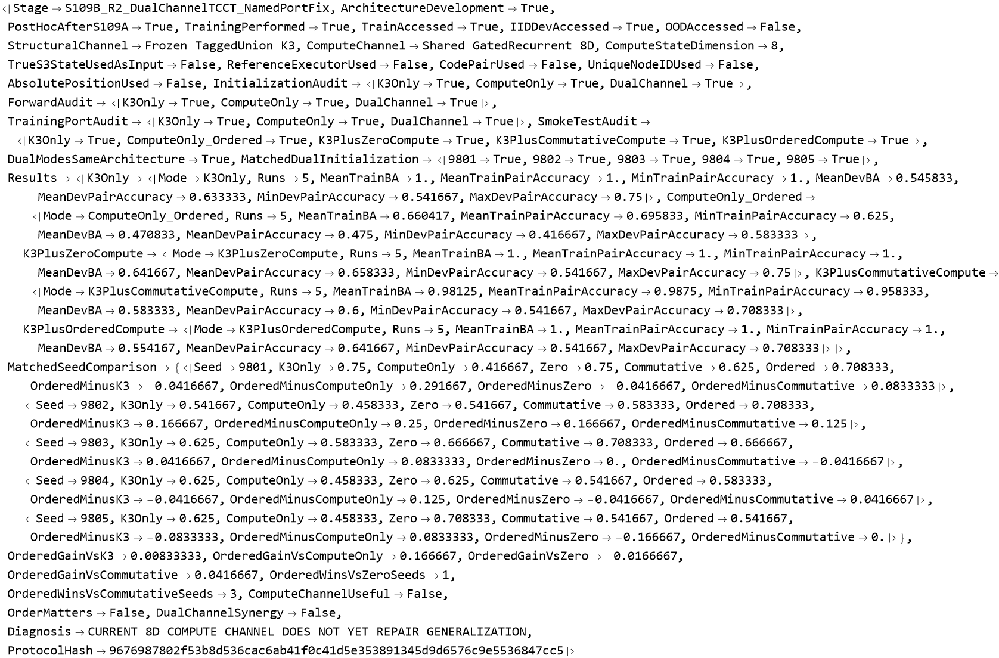

In [3423]:
s109BR2Result

In [3428]:
Dataset[
  {
    summaryS109BR2["K3Only"],
    summaryS109BR2["ComputeOnly_Ordered"],
    summaryS109BR2["K3PlusZeroCompute"],
    summaryS109BR2["K3PlusCommutativeCompute"],
    summaryS109BR2["K3PlusOrderedCompute"]
  }
]

Dataset[{<|Mode -> K3Only, Runs -> 5, MeanTrainBA -> 1., MeanTrainPairAccuracy -> 1., 
 
>     MinTrainPairAccuracy -> 1., MeanDevBA -> 0.545833, 
 
>     MeanDevPairAccuracy -> 0.633333, MinDevPairAccuracy -> 0.541667, 
 
>     MaxDevPairAccuracy -> 0.75|>, 
 
>    <|Mode -> ComputeOnly_Ordered, Runs -> 5, MeanTrainBA -> 0.660417, 
 
>     MeanTrainPairAccuracy -> 0.695833, MinTrainPairAccuracy -> 0.625, 
 
>     MeanDevBA -> 0.470833, MeanDevPairAccuracy -> 0.475, 
 
>     MinDevPairAccuracy -> 0.416667, MaxDevPairAccuracy -> 0.583333|>, 
 
>    <|Mode -> K3PlusZeroCompute, Runs -> 5, MeanTrainBA -> 1., 
 
>     MeanTrainPairAccuracy -> 1., MinTrainPairAccuracy -> 1., MeanDevBA -> 0.641667, 
 
>     MeanDevPairAccuracy -> 0.658333, MinDevPairAccuracy -> 0.541667, 
 
>     MaxDevPairAccuracy -> 0.75|>, 
 
>    <|Mode -> K3PlusCommutativeCompute, Runs -> 5, MeanTrainBA -> 0.98125, 
 
>     MeanTrainPairAccuracy -> 0.9875, MinTrainPairAccuracy -> 0.958333, 
 
>     MeanDevBA -> 0.583333, MeanDevPairAccuracy -> 0.6, MinDevPairAccuracy -> 0.541667, 
 
>     MaxDevPairAccuracy -> 0.708333|>, 
 
>    <|Mode -> K3PlusOrderedCompute, Runs -> 5, MeanTrainBA -> 1., 
 
>     MeanTrainPairAccuracy -> 1., MinTrainPairAccuracy -> 1., MeanDevBA -> 0.554167, 
 
>     MeanDevPairAccuracy -> 0.641667, MinDevPairAccuracy -> 0.541667, 
 
>     MaxDevPairAccuracy -> 0.708333|>}, 
 
>   TypeSystem`Vector[TypeSystem`Struct[{Mode, Runs, MeanTrainBA, MeanTrainPairAccuracy, 
 
>      MinTrainPairAccuracy, MeanDevBA, MeanDevPairAccuracy, MinDevPairAccuracy, 
 
>      MaxDevPairAccuracy}, {TypeSystem`Atom[String], TypeSystem`Atom[Integer], 
 
>      TypeSystem`Atom[Real], TypeSystem`Atom[Real], TypeSystem`Atom[Real], 
 
>      TypeSystem`Atom[Real], TypeSystem`Atom[Real], TypeSystem`Atom[Real], 
 
>      TypeSystem`Atom[Real]}], 5], <||>]

In [3433]:
Dataset[
  pairedS109BR2
]

Dataset[{<|Seed -> 9801, K3Only -> 0.75, ComputeOnly -> 0.416667, Zero -> 0.75, 
 
>     Commutative -> 0.625, Ordered -> 0.708333, OrderedMinusK3 -> -0.0416667, 
 
>     OrderedMinusComputeOnly -> 0.291667, OrderedMinusZero -> -0.0416667, 
 
>     OrderedMinusCommutative -> 0.0833333|>, 
 
>    <|Seed -> 9802, K3Only -> 0.541667, ComputeOnly -> 0.458333, Zero -> 0.541667, 
 
>     Commutative -> 0.583333, Ordered -> 0.708333, OrderedMinusK3 -> 0.166667, 
 
>     OrderedMinusComputeOnly -> 0.25, OrderedMinusZero -> 0.166667, 
 
>     OrderedMinusCommutative -> 0.125|>, 
 
>    <|Seed -> 9803, K3Only -> 0.625, ComputeOnly -> 0.583333, Zero -> 0.666667, 
 
>     Commutative -> 0.708333, Ordered -> 0.666667, OrderedMinusK3 -> 0.0416667, 
 
>     OrderedMinusComputeOnly -> 0.0833333, OrderedMinusZero -> 0., 
 
>     OrderedMinusCommutative -> -0.0416667|>, 
 
>    <|Seed -> 9804, K3Only -> 0.625, ComputeOnly -> 0.458333, Zero -> 0.625, 
 
>     Commutative -> 0.541667, Ordered -> 0.583333, OrderedMinusK3 -> -0.0416667, 
 
>     OrderedMinusComputeOnly -> 0.125, OrderedMinusZero -> -0.0416667, 
 
>     OrderedMinusCommutative -> 0.0416667|>, 
 
>    <|Seed -> 9805, K3Only -> 0.625, ComputeOnly -> 0.458333, Zero -> 0.708333, 
 
>     Commutative -> 0.541667, Ordered -> 0.541667, OrderedMinusK3 -> -0.0833333, 
 
>     OrderedMinusComputeOnly -> 0.0833333, OrderedMinusZero -> -0.166667, 
 
>     OrderedMinusCommutative -> 0.|>}, 
 
>   TypeSystem`Vector[TypeSystem`Struct[{Seed, K3Only, ComputeOnly, Zero, Commutative, 
 
>      Ordered, OrderedMinusK3, OrderedMinusComputeOnly, OrderedMinusZero, 
 
>      OrderedMinusCommutative}, {TypeSystem`Atom[Integer], TypeSystem`Atom[Real], 
 
>      TypeSystem`Atom[Real], TypeSystem`Atom[Real], TypeSystem`Atom[Real], 
 
>      TypeSystem`Atom[Real], TypeSystem`Atom[Real], TypeSystem`Atom[Real], 
 
>      TypeSystem`Atom[Real], TypeSystem`Atom[Real]}], 5], <||>]

In [3438]:
(* ============================================================ *)
(* S110A                                                        *)
(* Intermediate Computational-State Supervision Diagnostic      *)
(*                                                              *)
(* PURPOSE                                                      *)
(* ------------------------------------------------------------ *)
(* Test whether an 8D recurrent compute state CAN represent     *)
(* the cumulative S3 computation when intermediate supervision  *)
(* is available.                                                *)
(*                                                              *)
(* IMPORTANT                                                    *)
(* ------------------------------------------------------------ *)
(* - TRAIN + IID DEV ONLY                                       *)
(* - NO OOD                                                     *)
(* - TRUE cumulative S3 state is used ONLY AS TRAINING TARGET   *)
(* - TRUE S3 state is NEVER model input                         *)
(* - NOT a fair architecture baseline                           *)
(* - NOT evidence of autonomous reasoning                       *)
(*                                                              *)
(* We train both left/right composition conventions so this     *)
(* diagnostic does not silently assume benchmark orientation.   *)
(* ============================================================ *)

ClearAll["Global`S110A*"];
ClearAll["Global`s110A*"];


s110AResult =
Catch[

(

(* ============================================================ *)
(* 0. FAIL SAFE                                                 *)
(* ============================================================ *)

S110AFail[msg_] := (
  Print["STOP: ", msg];
  Throw[$Failed, "S110A_STOP"];
);


Print["================================================"];
Print["S110A COMPUTATIONAL-STATE CAPACITY DIAGNOSTIC"];
Print["================================================"];


(* ============================================================ *)
(* 1. PREFLIGHT                                                 *)
(* ============================================================ *)

If[
  !And[
    ValueQ[trainRecords],
    ValueQ[iidRecords],
    ValueQ[finalS109A]
  ],

  S110AFail[
    "trainRecords / iidRecords / finalS109A missing."
  ]
];


If[
  finalS109A["Diagnosis"] =!=
    "K3_LOCAL_STATE_NOT_COMPUTATIONALLY_SUFFICIENT_COMPUTE_CHANNEL_JUSTIFIED",

  S110AFail[
    "S109A did not establish computational-state insufficiency."
  ]
];


Print["Preflight = PASS"];
Print["Train records = ", Length[trainRecords]];
Print["IID Dev records = ", Length[iidRecords]];
Print["OOD WILL NOT BE ACCESSED."];
Print["This is an ORACLE-ASSISTED MECHANISM DIAGNOSTIC."];
Print["True S3 state is TARGET ONLY, never model input."];


(* ============================================================ *)
(* 2. LOCKED SETTINGS                                           *)
(* ============================================================ *)

s110ASeeds = {
  9901,
  9902,
  9903,
  9904,
  9905
};


s110AHidden = 8;

s110ATrainingRounds = 300;


s110AConventions = {
  "Left",
  "Right"
};


Print["Compute-state width = ", s110AHidden];
Print["Training rounds = ", s110ATrainingRounds];
Print["Seeds = ", s110ASeeds];


(* ============================================================ *)
(* 3. S3 OPERATORS                                              *)
(*                                                              *)
(* token 0 = transposition (1 2)                                *)
(* token 1 = transposition (2 3)                                *)
(* ============================================================ *)

S110AOp[0] := {2, 1, 3};
S110AOp[1] := {1, 3, 2};


(* p o q *)

S110ACompose[
  p_List,
  q_List
] :=
  p[[q]];


S110ALeftStates[
  seq_List
] :=
  Rest[
    FoldList[

      Function[
        {acc, token},

        S110ACompose[
          S110AOp[token],
          acc
        ]
      ],

      {1, 2, 3},
      seq
    ]
  ];


S110ARightStates[
  seq_List
] :=
  Rest[
    FoldList[

      Function[
        {acc, token},

        S110ACompose[
          acc,
          S110AOp[token]
        ]
      ],

      {1, 2, 3},
      seq
    ]
  ];


S110AStates[
  "Left",
  seq_List
] :=
  S110ALeftStates[seq];


S110AStates[
  "Right",
  seq_List
] :=
  S110ARightStates[seq];


(* ============================================================ *)
(* 4. CANONICAL SIX-STATE VOCABULARY                            *)
(* ============================================================ *)

allS3StatesS110A =
  Permutations[
    {1, 2, 3}
  ];


s110AStateToClass =
  AssociationThread[

    (
      ToString[
        InputForm[#]
      ] &
    ) /@
      allS3StatesS110A,

    Range[
      Length[
        allS3StatesS110A
      ]
    ]
  ];


S110AClass[
  state_List
] :=
Module[
  {
    key
  },

  key =
    ToString[
      InputForm[state]
    ];

  Lookup[
    s110AStateToClass,
    key,
    Missing["UnknownS3State"]
  ]
];


Print[
  "S3 state-space size = ",
  Length[allS3StatesS110A]
];


If[
  Length[allS3StatesS110A] =!= 6,

  S110AFail[
    "Unexpected S3 state-space size."
  ]
];


(* ============================================================ *)
(* 5. PRIMITIVE COMPUTE INPUT                                   *)
(* ============================================================ *)

S110ATokenVec[0] := {1., 0.};
S110ATokenVec[1] := {0., 1.};


S110APrefixInput[
  seq_List,
  k_Integer
] :=
  S110ATokenVec /@
    Take[
      seq,
      k
    ];


(* ============================================================ *)
(* 6. BUILD PREFIX-LEVEL DATA                                   *)
(*                                                              *)
(* Every training record of depth d generates d supervised      *)
(* prefix examples.                                             *)
(*                                                              *)
(* Input:  primitive operation prefix                           *)
(* Target: cumulative S3 state class at this prefix             *)
(* ============================================================ *)

ClearAll[S110ABuildRows];


S110ABuildRows[
  records_List,
  convention_String,
  split_String
] :=
  Flatten[
    Table[

      Module[
        {
          seq,
          states
        },


        seq =
          r["Seq"];


        states =
          S110AStates[
            convention,
            seq
          ];


        If[
          Length[states] =!= Length[seq],

          S110AFail[
            "Prefix-state length mismatch."
          ]
        ];


        Table[

          <|

            "Input" ->
              S110APrefixInput[
                seq,
                k
              ],

            "Target" ->
              S110AClass[
                states[[k]]
              ],

            "TrueState" ->
              states[[k]],

            "Split" ->
              split,

            "Depth" ->
              r["Depth"],

            "PrefixLength" ->
              k

          |>,

          {
            k,
            Length[seq]
          }
        ]

      ],

      {
        r,
        records
      }
    ],

    1
  ];


dataByConventionS110A =
  Association[
    Table[

      convention ->
        <|

          "Train" ->
            S110ABuildRows[
              trainRecords,
              convention,
              "Train"
            ],

          "Dev" ->
            S110ABuildRows[
              iidRecords,
              convention,
              "Dev"
            ]

        |>,

      {
        convention,
        s110AConventions
      }
    ]
  ];


Print[
  "Prefix rows:"
];


Do[

  Print[
    "  ",
    convention,
    " Train = ",
    Length[
      dataByConventionS110A[
        convention
      ]["Train"]
    ],
    " | Dev = ",
    Length[
      dataByConventionS110A[
        convention
      ]["Dev"]
    ]
  ],

  {
    convention,
    s110AConventions
  }
];


(* ============================================================ *)
(* 7. DATA SANITY                                               *)
(* ============================================================ *)

targetAuditS110A =
  Association[
    Table[

      convention ->
        And[
          Min[
            (
              #["Target"] &
            ) /@
              dataByConventionS110A[
                convention
              ]["Train"]
          ] >= 1,

          Max[
            (
              #["Target"] &
            ) /@
              dataByConventionS110A[
                convention
              ]["Train"]
          ] <= 6,

          Min[
            (
              #["Target"] &
            ) /@
              dataByConventionS110A[
                convention
              ]["Dev"]
          ] >= 1,

          Max[
            (
              #["Target"] &
            ) /@
              dataByConventionS110A[
                convention
              ]["Dev"]
          ] <= 6
        ],

      {
        convention,
        s110AConventions
      }
    ]
  ];


Print[
  "Target audit = ",
  targetAuditS110A
];


If[
  !And @@ Values[targetAuditS110A],

  S110AFail[
    "Target-class audit failed."
  ]
];


(* ============================================================ *)
(* 8. FORBIDDEN INPUT AUDIT                                     *)
(*                                                              *)
(* S3 state may exist in TARGET generation, but never in input  *)
(* generation.                                                  *)
(* ============================================================ *)

s110AInputDefinitionText =
  ToString[
    InputForm[
      {
        DownValues[S110ATokenVec],
        DownValues[S110APrefixInput]
      }
    ]
  ];


s110AForbiddenInputTerms = {
  "TrueState",
  "S110AClass",
  "S110ALeftStates",
  "S110ARightStates",
  "[\"Y\"]",
  "PairID",
  "ReferenceExecutor",
  "CorrectDestination",
  "WrongDestination",
  "S3Product"
};


s110AForbiddenInputHits =
  Select[
    s110AForbiddenInputTerms,

    StringContainsQ[
      s110AInputDefinitionText,
      #
    ] &
  ];


Print[
  "Forbidden MODEL-INPUT hits = ",
  s110AForbiddenInputHits
];


If[
  s110AForbiddenInputHits =!= {},

  S110AFail[
    "Diagnostic target information leaked into model input."
  ]
];


(* ============================================================ *)
(* 9. NETWORK                                                   *)
(*                                                              *)
(* 2D primitive tokens                                          *)
(*       -> shared recurrent 8D state                           *)
(*       -> final hidden state                                  *)
(*       -> six-way S3 state prediction                         *)
(* ============================================================ *)

s110ABaseNet =
  NetChain[
    {

      GatedRecurrentLayer[
        s110AHidden,
        "Input" -> {"Varying", 2}
      ],

      SequenceLastLayer[],

      LinearLayer[
        6
      ],

      SoftmaxLayer[]

    },

    "Input" ->
      {"Varying", 2}
  ];


(* ============================================================ *)
(* 10. INITIALIZATION + FORWARD SELF TEST                       *)
(* ============================================================ *)

Print[
  "Running network self-test..."
];


testInitS110A =
  Quiet[
    Check[

      NetInitialize[
        s110ABaseNet,
        RandomSeeding ->
          First[s110ASeeds]
      ],

      $Failed
    ]
  ];


If[
  testInitS110A === $Failed,

  S110AFail[
    "NetInitialize failed."
  ]
];


testForwardS110A =
  Quiet[
    Check[

      Normal[
        testInitS110A[
          First[
            dataByConventionS110A[
              "Left"
            ]["Train"]
          ]["Input"]
        ]
      ],

      $Failed
    ]
  ];


forwardPassS110A =
  And[
    testForwardS110A =!= $Failed,
    ListQ[testForwardS110A],
    Length[testForwardS110A] == 6,
    VectorQ[testForwardS110A, NumericQ]
  ];


Print[
  "Forward self-test = ",
  forwardPassS110A
];


If[
  !TrueQ[forwardPassS110A],

  S110AFail[
    "Six-class forward-pass self-test failed."
  ]
];


(* ============================================================ *)
(* 11. TRAINING RULES                                           *)
(* ============================================================ *)

S110ATrainingRules[
  rows_List
] :=
  Map[

    Function[
      row,

      row["Input"] ->
        row["Target"]
    ],

    rows
  ];


(* ============================================================ *)
(* 12. ONE-ROUND TRAINING SMOKE TEST                            *)
(* ============================================================ *)

Print[
  "Running 1-round NetTrain smoke test..."
];


smokeS110A =
  Quiet[
    Check[

      NetTrain[
        NetInitialize[
          s110ABaseNet,
          RandomSeeding -> 9899
        ],

        Take[
          S110ATrainingRules[
            dataByConventionS110A[
              "Left"
            ]["Train"]
          ],
          UpTo[64]
        ],

        BatchSize -> 16,

        MaxTrainingRounds -> 1,

        TargetDevice -> "CPU",

        RandomSeeding -> 9899
      ],

      $Failed
    ]
  ];


If[
  smokeS110A === $Failed,

  S110AFail[
    "NetTrain smoke test failed."
  ]
];


Print[
  "NetTrain smoke test = PASS"
];


(* ============================================================ *)
(* 13. PREDICTION                                               *)
(* ============================================================ *)

S110APredict[
  net_,
  input_
] :=
Module[
  {
    p
  },


  p =
    Normal[
      net[input]
    ];


  First[
    Ordering[
      p,
      -1
    ]
  ]
];


(* ============================================================ *)
(* 14. ACCURACY                                                 *)
(* ============================================================ *)

S110AAccuracy[
  net_,
  rows_List
] :=
  N[
    Mean[
      (
        Boole[
          S110APredict[
            net,
            #["Input"]
          ] ===
            #["Target"]
        ] &
      ) /@
        rows
    ]
  ];


(* ============================================================ *)
(* 15. PER-PREFIX ACCURACY                                      *)
(* ============================================================ *)

S110APerPrefixAccuracy[
  net_,
  rows_List
] :=
Module[
  {
    lengths
  },


  lengths =
    Sort[
      DeleteDuplicates[
        (
          #["PrefixLength"] &
        ) /@
          rows
      ]
    ];


  Association[
    Table[

      k ->
        S110AAccuracy[
          net,

          Cases[
            rows,

            a_Association /;
              a["PrefixLength"] === k
          ]
        ],

      {
        k,
        lengths
      }
    ]
  ]
];


(* ============================================================ *)
(* 16. PER-DEPTH ACCURACY                                       *)
(* ============================================================ *)

S110APerDepthAccuracy[
  net_,
  rows_List
] :=
Module[
  {
    depths
  },


  depths =
    Sort[
      DeleteDuplicates[
        (
          #["Depth"] &
        ) /@
          rows
      ]
    ];


  Association[
    Table[

      d ->
        S110AAccuracy[
          net,

          Cases[
            rows,

            a_Association /;
              a["Depth"] === d
          ]
        ],

      {
        d,
        depths
      }
    ]
  ]
];


(* ============================================================ *)
(* 17. STORAGE                                                  *)
(* ============================================================ *)

trainedStateNetsS110A =
  <||>;


S110ANetKey[
  convention_String,
  seed_Integer
] :=
  StringJoin[
    convention,
    "::",
    ToString[seed]
  ];


(* ============================================================ *)
(* 18. ONE TRAINING RUN                                         *)
(* ============================================================ *)

S110ARunOne[
  convention_String,
  seed_Integer
] :=
Module[
  {
    trainRows,
    devRows,
    initialized,
    trained,
    timing,
    trainAcc,
    devAcc,
    perPrefix,
    perDepth
  },


  Print[
    "Training ",
    convention,
    " compute-state | seed ",
    seed,
    " ..."
  ];


  trainRows =
    dataByConventionS110A[
      convention
    ]["Train"];


  devRows =
    dataByConventionS110A[
      convention
    ]["Dev"];


  initialized =
    Quiet[
      Check[

        NetInitialize[
          s110ABaseNet,

          RandomSeeding ->
            seed
        ],

        $Failed
      ]
    ];


  If[
    initialized === $Failed,

    S110AFail[
      StringJoin[
        "Initialization failed: ",
        convention,
        " seed ",
        ToString[seed]
      ]
    ]
  ];


  timing =
    AbsoluteTiming[

      trained =
        Quiet[
          Check[

            NetTrain[
              initialized,

              S110ATrainingRules[
                trainRows
              ],

              BatchSize ->
                32,

              MaxTrainingRounds ->
                s110ATrainingRounds,

              TargetDevice ->
                "CPU",

              RandomSeeding ->
                seed
            ],

            $Failed
          ]
        ];
    ];


  If[
    trained === $Failed,

    S110AFail[
      StringJoin[
        "Training failed: ",
        convention,
        " seed ",
        ToString[seed]
      ]
    ]
  ];


  AssociateTo[
    trainedStateNetsS110A,

    S110ANetKey[
      convention,
      seed
    ] ->
      trained
  ];


  trainAcc =
    S110AAccuracy[
      trained,
      trainRows
    ];


  devAcc =
    S110AAccuracy[
      trained,
      devRows
    ];


  perPrefix =
    S110APerPrefixAccuracy[
      trained,
      devRows
    ];


  perDepth =
    S110APerDepthAccuracy[
      trained,
      devRows
    ];


  Print[
    "  done in ",
    N[timing[[1]]],
    " sec",
    " | TrainStateAcc = ",
    trainAcc,
    " | DevStateAcc = ",
    devAcc
  ];


  <|

    "Convention" ->
      convention,

    "Seed" ->
      seed,

    "TrainingSeconds" ->
      N[timing[[1]]],

    "TrainStateAccuracy" ->
      trainAcc,

    "DevStateAccuracy" ->
      devAcc,

    "DevPerPrefixAccuracy" ->
      perPrefix,

    "DevPerDepthAccuracy" ->
      perDepth

  |>
];


(* ============================================================ *)
(* 19. RUN 2 x 5                                                *)
(* ============================================================ *)

Print["================================================"];
Print["STARTING S110A"];
Print["2 composition conventions x 5 seeds = 10 runs"];
Print["================================================"];


rowsS110A =
  Flatten[
    Table[

      Table[

        S110ARunOne[
          convention,
          seed
        ],

        {
          seed,
          s110ASeeds
        }
      ],

      {
        convention,
        s110AConventions
      }
    ],

    1
  ];


If[
  Length[rowsS110A] =!= 10,

  S110AFail[
    "Expected exactly 10 completed runs."
  ]
];


(* ============================================================ *)
(* 20. SUMMARY                                                  *)
(* ============================================================ *)

S110ASummary[
  convention_String
] :=
Module[
  {
    rr,
    allPrefixValues
  },


  rr =
    Cases[
      rowsS110A,

      a_Association /;
        a["Convention"] === convention
    ];


  allPrefixValues =
    Flatten[
      Values[
        #["DevPerPrefixAccuracy"]
      ] &
      /@
        rr
    ];


  <|

    "Convention" ->
      convention,

    "Runs" ->
      Length[rr],

    "MeanTrainStateAccuracy" ->
      N[
        Mean[
          (
            #["TrainStateAccuracy"] &
          ) /@
            rr
        ]
      ],

    "MinTrainStateAccuracy" ->
      Min[
        (
          #["TrainStateAccuracy"] &
        ) /@
          rr
      ],

    "MeanDevStateAccuracy" ->
      N[
        Mean[
          (
            #["DevStateAccuracy"] &
          ) /@
            rr
        ]
      ],

    "MinDevStateAccuracy" ->
      Min[
        (
          #["DevStateAccuracy"] &
        ) /@
          rr
      ],

    "MaxDevStateAccuracy" ->
      Max[
        (
          #["DevStateAccuracy"] &
        ) /@
          rr
      ],

    "WorstSeedPrefixAccuracy" ->
      Min[
        allPrefixValues
      ]

  |>
];


summaryS110A =
  Association[
    Table[

      convention ->
        S110ASummary[
          convention
        ],

      {
        convention,
        s110AConventions
      }
    ]
  ];


(* ============================================================ *)
(* 21. MEAN PER-PREFIX SUMMARY                                  *)
(* ============================================================ *)

S110AMeanPerPrefix[
  convention_String
] :=
Module[
  {
    rr,
    lengths
  },


  rr =
    Cases[
      rowsS110A,

      a_Association /;
        a["Convention"] === convention
    ];


  lengths =
    Sort[
      Union @@
        (
          Keys[
            #["DevPerPrefixAccuracy"]
          ] &
        /@
          rr
        )
    ];


  Table[

    <|

      "Convention" ->
        convention,

      "PrefixLength" ->
        k,

      "MeanDevStateAccuracy" ->
        N[
          Mean[
            Cases[
              (
                Lookup[
                  #["DevPerPrefixAccuracy"],
                  k,
                  Missing["NA"]
                ] &
              ) /@
                rr,
              _?NumericQ
            ]
          ]
        ]

    |>,

    {
      k,
      lengths
    }
  ]
];


perPrefixSummaryS110A =
  Join[
    S110AMeanPerPrefix["Left"],
    S110AMeanPerPrefix["Right"]
  ];


(* ============================================================ *)
(* 22. CAPACITY GATE                                            *)
(* ============================================================ *)

bestConventionS110A =
  First[
    First[
      MaximalBy[
        Normal[
          Association[
            Table[

              convention ->
                summaryS110A[
                  convention
                ]["MeanDevStateAccuracy"],

              {
                convention,
                s110AConventions
              }
            ]
          ]
        ],

        Last
      ]
    ]
  ];


bestDevAccuracyS110A =
  summaryS110A[
    bestConventionS110A
  ]["MeanDevStateAccuracy"];


bestTrainAccuracyS110A =
  summaryS110A[
    bestConventionS110A
  ]["MeanTrainStateAccuracy"];


capacityGateS110A =
  And[
    bestTrainAccuracyS110A >= 0.98,
    bestDevAccuracyS110A >= 0.95
  ];


diagnosisS110A =
  If[

    capacityGateS110A,

    "RECURRENT_COMPUTE_STATE_CAPACITY_VALIDATED_ENDPOINT_SUPERVISION_WAS_THE_BOTTLENECK",

    "8D_RECURRENT_STATE_NOT_YET_RELIABLY_LEARNING_COMPUTATION_EVEN_WITH_INTERMEDIATE_SUPERVISION"
  ];


(* ============================================================ *)
(* 23. PROTOCOL HASH                                            *)
(* ============================================================ *)

protocolHashS110A =
  Hash[
    {
      "S110A_INTERMEDIATE_STATE_DIAGNOSTIC",

      s110ASeeds,

      s110AHidden,

      s110ATrainingRounds,

      DownValues[S110AOp],

      DownValues[S110ACompose],

      DownValues[S110ATokenVec],

      s110ABaseNet
    },

    "SHA256",
    "HexString"
  ];


(* ============================================================ *)
(* 24. FINAL REPORT                                             *)
(* ============================================================ *)

finalS110A =
  <|

    "Stage" ->
      "S110A_IntermediateComputationalStateSupervisionDiagnostic",

    "MechanismDiagnosticOnly" ->
      True,

    "FairBaselineClaimAllowed" ->
      False,

    "ArchitectureSuperiorityClaimAllowed" ->
      False,

    "TrainingPerformed" ->
      True,

    "TrainAccessed" ->
      True,

    "IIDDevAccessed" ->
      True,

    "OODAccessed" ->
      False,

    "TrueS3StateUsedAsModelInput" ->
      False,

    "TrueS3StateUsedAsTrainingTarget" ->
      True,

    "ComputeStateWidth" ->
      s110AHidden,

    "Results" ->
      summaryS110A,

    "BestConvention" ->
      bestConventionS110A,

    "BestMeanTrainStateAccuracy" ->
      bestTrainAccuracyS110A,

    "BestMeanDevStateAccuracy" ->
      bestDevAccuracyS110A,

    "CapacityGate" ->
      <|

        "RequiredTrainStateAccuracy" ->
          0.98,

        "RequiredDevStateAccuracy" ->
          0.95,

        "Passed" ->
          capacityGateS110A

      |>,

    "Diagnosis" ->
      diagnosisS110A,

    "ProtocolHash" ->
      protocolHashS110A

  |>;


Print["================================================"];
Print["S110A COMPLETE"];
Print["Best convention = ", bestConventionS110A];
Print["Best mean Dev state accuracy = ", bestDevAccuracyS110A];
Print["Diagnosis = ", diagnosisS110A];
Print["================================================"];


finalS110A

),

"S110A_STOP"
];

S110A COMPUTATIONAL-STATE CAPACITY DIAGNOSTIC
Preflight = PASS
Train records = 96
IID Dev records = 48
OOD WILL NOT BE ACCESSED.
This is an ORACLE-ASSISTED MECHANISM DIAGNOSTIC.
True S3 state is TARGET ONLY, never model input.
Compute-state width = 8
Training rounds = 300
Seeds = {9901, 9902, 9903, 9904, 9905}
S3 state-space size = 6
Prefix rows:
  Left Train = 768 | Dev = 384
  Right Train = 768 | Dev = 384
Target audit = <|Left -> True, Right -> True|>
Forbidden MODEL-INPUT hits = {}
Running network self-test...
Forward self-test = True
Running 1-round NetTrain smoke test...
NetTrain smoke test = PASS
STARTING S110A
2 composition conventions x 5 seeds = 10 runs
Training Left compute-state | seed 9901 ...
  done in 116.373 sec | TrainStateAcc = 0.980469 | DevStateAcc = 0.96875
Training Left compute-state | seed 9902 ...
  done in 121.259 sec | TrainStateAcc = 0.966146 | DevStateAcc = 0.955729
Training Left compute-state | seed 9903 ...
  done in 125.569 sec | TrainStateAcc = 0.97526 |

<|Stage -> S110A_IntermediateComputationalStateSupervisionDiagnostic, 
 
>   MechanismDiagnosticOnly -> True, FairBaselineClaimAllowed -> False, 
 
>   ArchitectureSuperiorityClaimAllowed -> False, TrainingPerformed -> True, 
 
>   TrainAccessed -> True, IIDDevAccessed -> True, OODAccessed -> False, 
 
>   TrueS3StateUsedAsModelInput -> False, TrueS3StateUsedAsTrainingTarget -> True, 
 
>   ComputeStateWidth -> 8, Results -> 
 
>    <|Left -> <|Convention -> Left, Runs -> 5, MeanTrainStateAccuracy -> 0.984375, 
 
>       MinTrainStateAccuracy -> 0.966146, MeanDevStateAccuracy -> 0.971354, 
 
>       MinDevStateAccuracy -> 0.932292, MaxDevStateAccuracy -> 1., 
 
>       WorstSeedPrefixAccuracy -> 0.75|>, 
 
>     Right -> <|Convention -> Right, Runs -> 5, MeanTrainStateAccuracy -> 0.991927, 
 
>       MinTrainStateAccuracy -> 0.964844, MeanDevStateAccuracy -> 0.980729, 
 
>       MinDevStateAccuracy -> 0.908854, MaxDevStateAccuracy -> 1., 
 
>       WorstSeedPrefixAccuracy -> 0.71875|>|>, BestConvention -> Right, 
 
>   BestMeanTrainStateAccuracy -> 0.991927, BestMeanDevStateAccuracy -> 0.980729, 
 
>   CapacityGate -> 
 
>    <|RequiredTrainStateAccuracy -> 0.98, RequiredDevStateAccuracy -> 0.95, 
 
>     Passed -> True|>, Diagnosis -> 
 
>    RECURRENT_COMPUTE_STATE_CAPACITY_VALIDATED_ENDPOINT_SUPERVISION_WAS_THE_BOTTLENECK, 
 
>   ProtocolHash -> 107a3351882b2c3a796bf2f5163aa1aec682880207c6958cdd7db59551fea76f|>
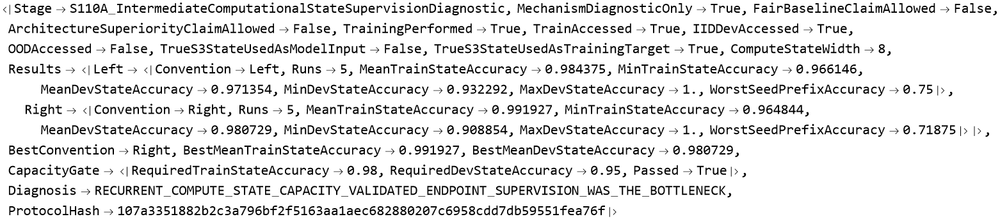

In [3467]:
s110AResult

In [3472]:
Dataset[
  {
    summaryS110A["Left"],
    summaryS110A["Right"]
  }
]

Dataset[{<|Convention -> Left, Runs -> 5, MeanTrainStateAccuracy -> 0.984375, 
 
>     MinTrainStateAccuracy -> 0.966146, MeanDevStateAccuracy -> 0.971354, 
 
>     MinDevStateAccuracy -> 0.932292, MaxDevStateAccuracy -> 1., 
 
>     WorstSeedPrefixAccuracy -> 0.75|>, 
 
>    <|Convention -> Right, Runs -> 5, MeanTrainStateAccuracy -> 0.991927, 
 
>     MinTrainStateAccuracy -> 0.964844, MeanDevStateAccuracy -> 0.980729, 
 
>     MinDevStateAccuracy -> 0.908854, MaxDevStateAccuracy -> 1., 
 
>     WorstSeedPrefixAccuracy -> 0.71875|>}, 
 
>   TypeSystem`Vector[TypeSystem`Struct[{Convention, Runs, MeanTrainStateAccuracy, 
 
>      MinTrainStateAccuracy, MeanDevStateAccuracy, MinDevStateAccuracy, 
 
>      MaxDevStateAccuracy, WorstSeedPrefixAccuracy}, 
 
>     {TypeSystem`Atom[String], TypeSystem`Atom[Integer], TypeSystem`Atom[Real], 
 
>      TypeSystem`Atom[Real], TypeSystem`Atom[Real], TypeSystem`Atom[Real], 
 
>      TypeSystem`Atom[Real], TypeSystem`Atom[Real]}], 2], <||>]

In [3477]:
Dataset[
  perPrefixSummaryS110A
]

Dataset[{<|Convention -> Left, PrefixLength -> 1, MeanDevStateAccuracy -> 1.|>, 
 
>    <|Convention -> Left, PrefixLength -> 2, MeanDevStateAccuracy -> 1.|>, 
 
>    <|Convention -> Left, PrefixLength -> 3, MeanDevStateAccuracy -> 1.|>, 
 
>    <|Convention -> Left, PrefixLength -> 4, MeanDevStateAccuracy -> 1.|>, 
 
>    <|Convention -> Left, PrefixLength -> 5, MeanDevStateAccuracy -> 0.9125|>, 
 
>    <|Convention -> Left, PrefixLength -> 6, MeanDevStateAccuracy -> 0.9625|>, 
 
>    <|Convention -> Left, PrefixLength -> 7, MeanDevStateAccuracy -> 0.91875|>, 
 
>    <|Convention -> Left, PrefixLength -> 8, MeanDevStateAccuracy -> 0.9625|>, 
 
>    <|Convention -> Left, PrefixLength -> 9, MeanDevStateAccuracy -> 0.975|>, 
 
>    <|Convention -> Left, PrefixLength -> 10, MeanDevStateAccuracy -> 0.95|>, 
 
>    <|Convention -> Right, PrefixLength -> 1, MeanDevStateAccuracy -> 1.|>, 
 
>    <|Convention -> Right, PrefixLength -> 2, MeanDevStateAccuracy -> 1.|>, 
 
>    <|Convention -> Right, PrefixLength -> 3, MeanDevStateAccuracy -> 1.|>, 
 
>    <|Convention -> Right, PrefixLength -> 4, MeanDevStateAccuracy -> 1.|>, 
 
>    <|Convention -> Right, PrefixLength -> 5, MeanDevStateAccuracy -> 0.975|>, 
 
>    <|Convention -> Right, PrefixLength -> 6, MeanDevStateAccuracy -> 0.975|>, 
 
>    <|Convention -> Right, PrefixLength -> 7, MeanDevStateAccuracy -> 0.94375|>, 
 
>    <|Convention -> Right, PrefixLength -> 8, MeanDevStateAccuracy -> 0.9375|>, 
 
>    <|Convention -> Right, PrefixLength -> 9, MeanDevStateAccuracy -> 0.9625|>, 
 
>    <|Convention -> Right, PrefixLength -> 10, MeanDevStateAccuracy -> 0.9625|>}, 
 
>   TypeSystem`Vector[TypeSystem`Struct[{Convention, PrefixLength, 
 
>      MeanDevStateAccuracy}, {TypeSystem`Atom[TypeSystem`Enumeration[Left, Right]], 
 
>      TypeSystem`Atom[Integer], TypeSystem`Atom[Real]}], 20], <||>]

In [3482]:
(* ============================================================ *)
(* S110B                                                        *)
(* SELF-SUPERVISED COMPUTE-STATE FORMATION AUDIT                *)
(*                                                              *)
(* Relative-transition self-supervision:                        *)
(*                                                              *)
(*   Prefix P                                                   *)
(*   Extended prefix P.S                                        *)
(*               |                                              *)
(*               v                                              *)
(*     shared 8D recurrent encoders                             *)
(*               |                                              *)
(*          predict suffix S                                    *)
(*                                                              *)
(* S has length 1, 2, or 3.                                    *)
(*                                                              *)
(* IMPORTANT                                                    *)
(* ------------------------------------------------------------ *)
(* SELF-SUPERVISED ENCODER TRAINING USES:                       *)
(*   Seq only                                                   *)
(*                                                              *)
(* DOES NOT USE:                                                *)
(*   Y                                                          *)
(*   S3 cumulative states                                       *)
(*   PairID                                                     *)
(*   reference executor                                         *)
(*   OOD                                                        *)
(*                                                              *)
(* AFTER SSL training:                                          *)
(*   freeze encoder                                             *)
(*   train linear S3 probe as DIAGNOSTIC ONLY                   *)
(*                                                              *)
(* Compare SAME encoder before and after SSL.                   *)
(* ============================================================ *)


ClearAll["Global`S110B*"];
ClearAll["Global`s110B*"];


s110BResult =
Catch[

(

(* ============================================================ *)
(* 0. FAIL SAFE                                                 *)
(* ============================================================ *)

S110BFail[msg_] := (
  Print["STOP: ", msg];
  Throw[$Failed, "S110B_STOP"];
);


Print["================================================"];
Print["S110B SELF-SUPERVISED COMPUTE-STATE AUDIT"];
Print["================================================"];


(* ============================================================ *)
(* 1. PREFLIGHT                                                 *)
(* ============================================================ *)

If[
  !And[
    ValueQ[trainRecords],
    ValueQ[iidRecords],
    ValueQ[dataByConventionS110A],
    ValueQ[finalS110A]
  ],

  S110BFail[
    "Required S110A / Train / Dev objects are missing."
  ]
];


If[
  !TrueQ[
    finalS110A["CapacityGate"]["Passed"]
  ],

  S110BFail[
    "S110A compute-state capacity gate did not pass."
  ]
];


Print["Preflight = PASS"];
Print["S110A best convention = ", finalS110A["BestConvention"]];
Print["S110A supervised upper bound = ",
  finalS110A["BestMeanDevStateAccuracy"]
];

Print["SELF-SUPERVISED ENCODER WILL NOT USE S3 STATES."];
Print["OOD WILL NOT BE ACCESSED."];


(* ============================================================ *)
(* 2. LOCK SETTINGS                                             *)
(* ============================================================ *)

s110BSeeds = {
  9911,
  9912,
  9913,
  9914,
  9915
};


s110BProbeSeed = 9977;

s110BStateDim = 8;

s110BSSLHidden = 24;

s110BMaxSuffixLength = 3;

s110BTrainingRounds = 250;

s110BProbeRounds = 150;


Print["SSL seeds = ", s110BSeeds];
Print["State dimension = ", s110BStateDim];
Print["Maximum SSL suffix length = ", s110BMaxSuffixLength];
Print["SSL training rounds = ", s110BTrainingRounds];


(* ============================================================ *)
(* 3. TOKEN ENCODING                                            *)
(* ============================================================ *)

S110BTokenVec[0] := {1., 0.};
S110BTokenVec[1] := {0., 1.};


S110BEncodeSeq[
  seq_List
] :=
  S110BTokenVec /@ seq;


(* ============================================================ *)
(* 4. BUILD SELF-SUPERVISED SUFFIX VOCABULARY                   *)
(*                                                              *)
(* h=1 : 2 classes                                              *)
(* h=2 : 4 classes                                              *)
(* h=3 : 8 classes                                              *)
(* total = 14 classes                                           *)
(* ============================================================ *)

suffixVocabularyS110B =
  Flatten[
    Table[

      (
        <|
          "Length" -> h,
          "Suffix" -> #
        |> &
      ) /@
        Tuples[
          {0, 1},
          h
        ],

      {
        h,
        1,
        s110BMaxSuffixLength
      }
    ],

    1
  ];


If[
  Length[suffixVocabularyS110B] =!= 14,

  S110BFail[
    "Expected 14 relative-transition classes."
  ]
];


S110BSuffixKey[
  h_Integer,
  suffix_List
] :=
  ToString[
    InputForm[
      {h, suffix}
    ]
  ];


suffixClassMapS110B =
  AssociationThread[

    (
      S110BSuffixKey[
        #["Length"],
        #["Suffix"]
      ] &
    ) /@
      suffixVocabularyS110B,

    Range[
      Length[
        suffixVocabularyS110B
      ]
    ]
  ];


S110BSuffixClass[
  suffix_List
] :=
Module[
  {
    key
  },

  key =
    S110BSuffixKey[
      Length[suffix],
      suffix
    ];

  Lookup[
    suffixClassMapS110B,
    key,
    Missing["UnknownSuffixClass"]
  ]
];


Print[
  "Self-supervised relative-transition classes = ",
  Length[suffixVocabularyS110B]
];


(* ============================================================ *)
(* 5. BUILD SSL ROWS                                            *)
(*                                                              *)
(* For each sequence:                                           *)
(*                                                              *)
(* P = prefix                                                   *)
(* S = following suffix of length 1..3                          *)
(* PS = extended prefix                                         *)
(*                                                              *)
(* Input:  P and PS                                             *)
(* Target: S                                                    *)
(*                                                              *)
(* No task label is involved.                                   *)
(* ============================================================ *)

ClearAll[S110BBuildSSLRows];


S110BBuildSSLRows[
  records_List,
  split_String
] :=
  Flatten[
    Table[

      Module[
        {
          seq,
          d
        },


        seq =
          r["Seq"];


        d =
          Length[seq];


        Flatten[
          Table[

            Table[

              Module[
                {
                  prefix,
                  suffix,
                  extended
                },


                prefix =
                  Take[
                    seq,
                    k
                  ];


                suffix =
                  Take[
                    seq,
                    {
                      k + 1,
                      k + h
                    }
                  ];


                extended =
                  Take[
                    seq,
                    k + h
                  ];


                <|

                  "Prefix" ->
                    S110BEncodeSeq[
                      prefix
                    ],

                  "Extended" ->
                    S110BEncodeSeq[
                      extended
                    ],

                  "Suffix" ->
                    suffix,

                  "SuffixLength" ->
                    h,

                  "Target" ->
                    S110BSuffixClass[
                      suffix
                    ],

                  "Split" ->
                    split,

                  "Depth" ->
                    r["Depth"]

                |>

              ],

              {
                k,
                1,
                d - h
              }
            ],

            {
              h,
              1,
              Min[
                s110BMaxSuffixLength,
                d - 1
              ]
            }
          ],

          1
        ]

      ],

      {
        r,
        records
      }
    ],

    1
  ];


sslTrainRowsS110B =
  S110BBuildSSLRows[
    trainRecords,
    "Train"
  ];


sslDevRowsS110B =
  S110BBuildSSLRows[
    iidRecords,
    "Dev"
  ];


Print[
  "SSL Train examples = ",
  Length[sslTrainRowsS110B]
];

Print[
  "SSL Dev examples = ",
  Length[sslDevRowsS110B]
];


(* ============================================================ *)
(* 6. SELF-SUPERVISION LEAKAGE AUDIT                            *)
(* ============================================================ *)

sslDefinitionTextS110B =
  ToString[
    InputForm[
      {
        DownValues[S110BTokenVec],
        DownValues[S110BEncodeSeq],
        DownValues[S110BBuildSSLRows],
        DownValues[S110BSuffixClass]
      }
    ]
  ];


sslForbiddenTermsS110B = {
  "[\"Y\"]",
  "PairID",
  "S110ALeftStates",
  "S110ARightStates",
  "LeftComputeState",
  "RightComputeState",
  "S3Product",
  "ReferenceExecutor",
  "CorrectDestination",
  "WrongDestination",
  "TaskY",
  "BLTruth",
  "BLExecute"
};


sslForbiddenHitsS110B =
  Select[
    sslForbiddenTermsS110B,

    StringContainsQ[
      sslDefinitionTextS110B,
      #
    ] &
  ];


Print[
  "Forbidden SSL-definition hits = ",
  sslForbiddenHitsS110B
];


If[
  sslForbiddenHitsS110B =!= {},

  S110BFail[
    "Forbidden information detected in SSL construction."
  ]
];


(* ============================================================ *)
(* 7. CHANCE / MAJORITY CONTROL                                 *)
(* ============================================================ *)

sslTrainTargetCountsS110B =
  Counts[
    (#["Target"] &) /@
      sslTrainRowsS110B
  ];


sslDevTargetCountsS110B =
  Counts[
    (#["Target"] &) /@
      sslDevRowsS110B
  ];


sslMajorityDevAccuracyS110B =
  N[
    Max[
      Values[
        sslDevTargetCountsS110B
      ]
    ] /
    Length[
      sslDevRowsS110B
    ]
  ];


Print[
  "SSL Dev majority-class accuracy = ",
  sslMajorityDevAccuracyS110B
];


(* ============================================================ *)
(* 8. SHARED 8D RECURRENT ENCODER                               *)
(*                                                              *)
(* NetInsertSharedArrays ensures E1 and E2 are the SAME encoder *)
(* during both training and evaluation.                         *)
(* ============================================================ *)

sharedEncoderTemplateS110B =
  NetInsertSharedArrays[
    NetChain[
      {

        GatedRecurrentLayer[
          s110BStateDim,
          "Input" -> {"Varying", 2}
        ],

        SequenceLastLayer[]

      }
    ],

    "S110B/Encoder/"
  ];


(* ============================================================ *)
(* 9. RELATIVE-TRANSITION SSL NETWORK                           *)
(* ============================================================ *)

sslBaseNetS110B =
  NetGraph[

    <|

      "E1" ->
        sharedEncoderTemplateS110B,

      "E2" ->
        sharedEncoderTemplateS110B,

      "Join" ->
        CatenateLayer[],

      "Hidden" ->
        LinearLayer[
          s110BSSLHidden
        ],

      "Act" ->
        ElementwiseLayer[
          Tanh
        ],

      "Classifier" ->
        LinearLayer[
          Length[
            suffixVocabularyS110B
          ]
        ],

      "Softmax" ->
        SoftmaxLayer[]

    |>,

    {

      NetPort["Prefix"] ->
        "E1",

      NetPort["Extended"] ->
        "E2",

      {
        "E1",
        "E2"
      } ->
        "Join" ->
        "Hidden" ->
        "Act" ->
        "Classifier" ->
        "Softmax"

    },

    "Prefix" ->
      {"Varying", 2},

    "Extended" ->
      {"Varying", 2}

  ];


(* ============================================================ *)
(* 10. INITIALIZATION SELF TEST                                 *)
(* ============================================================ *)

Print[
  "Running SSL network initialization test..."
];


testSSLInitS110B =
  Quiet[
    Check[

      NetInitialize[
        sslBaseNetS110B,
        RandomSeeding -> First[s110BSeeds]
      ],

      $Failed
    ]
  ];


If[
  testSSLInitS110B === $Failed,

  S110BFail[
    "SSL network initialization failed."
  ]
];


testSSLForwardS110B =
  Quiet[
    Check[

      Normal[
        testSSLInitS110B[
          <|

            "Prefix" ->
              First[
                sslTrainRowsS110B
              ]["Prefix"],

            "Extended" ->
              First[
                sslTrainRowsS110B
              ]["Extended"]

          |>
        ]
      ],

      $Failed
    ]
  ];


sslForwardAuditS110B =
  And[
    testSSLForwardS110B =!= $Failed,
    ListQ[testSSLForwardS110B],
    Length[testSSLForwardS110B] == 14,
    VectorQ[
      testSSLForwardS110B,
      NumericQ
    ]
  ];


Print[
  "SSL forward audit = ",
  sslForwardAuditS110B
];


If[
  !TrueQ[sslForwardAuditS110B],

  S110BFail[
    "SSL network forward audit failed."
  ]
];


(* ============================================================ *)
(* 11. SSL TRAINING EXAMPLES                                    *)
(* ============================================================ *)

S110BSSLExamples[
  rows_List
] :=
  Map[

    Function[
      row,

      <|

        "Prefix" ->
          row["Prefix"],

        "Extended" ->
          row["Extended"],

        "Output" ->
          row["Target"]

      |>
    ],

    rows
  ];


sslTrainExamplesS110B =
  S110BSSLExamples[
    sslTrainRowsS110B
  ];


(* ============================================================ *)
(* 12. ONE-ROUND SSL SMOKE TEST                                 *)
(* ============================================================ *)

Print[
  "Running SSL NetTrain smoke test..."
];


sslSmokeS110B =
  Quiet[
    Check[

      NetTrain[

        NetInitialize[
          sslBaseNetS110B,
          RandomSeeding -> 9909
        ],

        Take[
          sslTrainExamplesS110B,
          UpTo[64]
        ],

        BatchSize -> 16,

        MaxTrainingRounds -> 1,

        TargetDevice -> "CPU",

        RandomSeeding -> 9909
      ],

      $Failed
    ]
  ];


If[
  sslSmokeS110B === $Failed,

  S110BFail[
    "SSL NetTrain smoke test failed."
  ]
];


Print[
  "SSL NetTrain smoke test = PASS"
];


(* ============================================================ *)
(* 13. SSL PREDICTION                                           *)
(* ============================================================ *)

S110BSSLPredict[
  net_,
  row_Association
] :=
Module[
  {
    p
  },


  p =
    Normal[
      net[
        <|

          "Prefix" ->
            row["Prefix"],

          "Extended" ->
            row["Extended"]

        |>
      ]
    ];


  First[
    Ordering[
      p,
      -1
    ]
  ]
];


S110BSSLAccuracy[
  net_,
  rows_List
] :=
  N[
    Mean[
      (
        Boole[
          S110BSSLPredict[
            net,
            #
          ] ===
            #["Target"]
        ] &
      ) /@
        rows
    ]
  ];


(* ============================================================ *)
(* 14. PROBE DATA                                               *)
(*                                                              *)
(* IMPORTANT:                                                   *)
(* S3 targets enter ONLY HERE, after SSL encoder training.      *)
(* Encoder is frozen during probe because embeddings are        *)
(* precomputed numerically before NetTrain.                     *)
(* ============================================================ *)

S110BProbeRows[
  convention_String,
  split_String
] :=
  dataByConventionS110A[
    convention
  ][split];


(* ============================================================ *)
(* 15. EMBEDDING EXTRACTION                                     *)
(* ============================================================ *)

S110BEmbedRows[
  encoder_,
  rows_List
] :=
  Table[

    <|

      "Embedding" ->
        Normal[
          encoder[
            row["Input"]
          ]
        ],

      "Target" ->
        row["Target"],

      "PrefixLength" ->
        row["PrefixLength"],

      "Depth" ->
        row["Depth"]

    |>,

    {
      row,
      rows
    }
  ];


(* ============================================================ *)
(* 16. LINEAR PROBE                                             *)
(* ============================================================ *)

probeBaseNetS110B =
  NetChain[
    {

      LinearLayer[
        6
      ],

      SoftmaxLayer[]

    },

    "Input" ->
      s110BStateDim
  ];


S110BProbeTrainRules[
  rows_List
] :=
  (
    #["Embedding"] ->
      #["Target"] &
  ) /@
    rows;


S110BProbePredict[
  net_,
  embedding_
] :=
Module[
  {
    p
  },


  p =
    Normal[
      net[
        embedding
      ]
    ];


  First[
    Ordering[
      p,
      -1
    ]
  ]
];


S110BProbeAccuracy[
  net_,
  rows_List
] :=
  N[
    Mean[
      (
        Boole[
          S110BProbePredict[
            net,
            #["Embedding"]
          ] ===
            #["Target"]
        ] &
      ) /@
        rows
    ]
  ];


S110BTrainProbe[
  encoder_,
  convention_String
] :=
Module[
  {
    trainRows,
    devRows,
    trainEmb,
    devEmb,
    probe,
    timing
  },


  trainRows =
    S110BProbeRows[
      convention,
      "Train"
    ];


  devRows =
    S110BProbeRows[
      convention,
      "Dev"
    ];


  trainEmb =
    S110BEmbedRows[
      encoder,
      trainRows
    ];


  devEmb =
    S110BEmbedRows[
      encoder,
      devRows
    ];


  timing =
    AbsoluteTiming[

      probe =
        Quiet[
          Check[

            NetTrain[

              NetInitialize[
                probeBaseNetS110B,
                RandomSeeding -> s110BProbeSeed
              ],

              S110BProbeTrainRules[
                trainEmb
              ],

              BatchSize -> 32,

              MaxTrainingRounds ->
                s110BProbeRounds,

              TargetDevice -> "CPU",

              RandomSeeding ->
                s110BProbeSeed
            ],

            $Failed
          ]
        ];
    ];


  If[
    probe === $Failed,

    S110BFail[
      StringJoin[
        "Linear probe training failed: ",
        convention
      ]
    ]
  ];


  <|

    "TrainProbeAccuracy" ->
      S110BProbeAccuracy[
        probe,
        trainEmb
      ],

    "DevProbeAccuracy" ->
      S110BProbeAccuracy[
        probe,
        devEmb
      ],

    "ProbeSeconds" ->
      N[
        timing[[1]]
      ]

  |>
];


(* ============================================================ *)
(* 17. RUN ONE SSL SEED                                         *)
(*                                                              *)
(* We preserve the SAME initialized encoder before SSL, so      *)
(* pre/post probe comparison is matched.                        *)
(* ============================================================ *)

S110BRunOne[
  seed_Integer
] :=
Module[
  {
    initialized,
    preEncoder,

    trainedSSL,
    postEncoder,

    sslTiming,

    sslTrainAcc,
    sslDevAcc,

    leftPre,
    leftPost,

    rightPre,
    rightPost
  },


  Print["------------------------------------------------"];
  Print[
    "S110B SSL seed ",
    seed,
    " ..."
  ];


  initialized =
    Quiet[
      Check[

        NetInitialize[
          sslBaseNetS110B,
          RandomSeeding -> seed
        ],

        $Failed
      ]
    ];


  If[
    initialized === $Failed,

    S110BFail[
      StringJoin[
        "SSL initialization failed seed ",
        ToString[seed]
      ]
    ]
  ];


  (* matched random encoder baseline *)

  preEncoder =
    NetExtract[
      initialized,
      "E1"
    ];


  Print[
    "  Training self-supervised transition model..."
  ];


  sslTiming =
    AbsoluteTiming[

      trainedSSL =
        Quiet[
          Check[

            NetTrain[
              initialized,

              sslTrainExamplesS110B,

              BatchSize -> 32,

              MaxTrainingRounds ->
                s110BTrainingRounds,

              TargetDevice -> "CPU",

              RandomSeeding -> seed
            ],

            $Failed
          ]
        ];
    ];


  If[
    trainedSSL === $Failed,

    S110BFail[
      StringJoin[
        "SSL training failed seed ",
        ToString[seed]
      ]
    ]
  ];


  postEncoder =
    NetExtract[
      trainedSSL,
      "E1"
    ];


  sslTrainAcc =
    S110BSSLAccuracy[
      trainedSSL,
      sslTrainRowsS110B
    ];


  sslDevAcc =
    S110BSSLAccuracy[
      trainedSSL,
      sslDevRowsS110B
    ];


  Print[
    "  SSL train acc = ",
    sslTrainAcc,
    " | SSL dev acc = ",
    sslDevAcc
  ];


  Print[
    "  Probing RANDOM encoder..."
  ];


  leftPre =
    S110BTrainProbe[
      preEncoder,
      "Left"
    ];


  rightPre =
    S110BTrainProbe[
      preEncoder,
      "Right"
    ];


  Print[
    "  Probing SELF-SUPERVISED encoder..."
  ];


  leftPost =
    S110BTrainProbe[
      postEncoder,
      "Left"
    ];


  rightPost =
    S110BTrainProbe[
      postEncoder,
      "Right"
    ];


  Print[
    "  LEFT probe: ",
    leftPre["DevProbeAccuracy"],
    " -> ",
    leftPost["DevProbeAccuracy"]
  ];


  Print[
    "  RIGHT probe: ",
    rightPre["DevProbeAccuracy"],
    " -> ",
    rightPost["DevProbeAccuracy"]
  ];


  <|

    "Seed" ->
      seed,

    "SSLSeconds" ->
      N[
        sslTiming[[1]]
      ],

    "SSLTrainAccuracy" ->
      sslTrainAcc,

    "SSLDevAccuracy" ->
      sslDevAcc,

    "RandomLeftProbeDev" ->
      leftPre[
        "DevProbeAccuracy"
      ],

    "SSLLeftProbeDev" ->
      leftPost[
        "DevProbeAccuracy"
      ],

    "LeftProbeGain" ->
      N[
        leftPost[
          "DevProbeAccuracy"
        ] -
        leftPre[
          "DevProbeAccuracy"
        ]
      ],

    "RandomRightProbeDev" ->
      rightPre[
        "DevProbeAccuracy"
      ],

    "SSLRightProbeDev" ->
      rightPost[
        "DevProbeAccuracy"
      ],

    "RightProbeGain" ->
      N[
        rightPost[
          "DevProbeAccuracy"
        ] -
        rightPre[
          "DevProbeAccuracy"
        ]
      ]

  |>
];


(* ============================================================ *)
(* 18. RUN 5 MATCHED SSL SEEDS                                  *)
(* ============================================================ *)

Print["================================================"];
Print["STARTING S110B"];
Print["5 SELF-SUPERVISED SEEDS"];
Print["================================================"];


rowsS110B =
  Table[

    S110BRunOne[
      seed
    ],

    {
      seed,
      s110BSeeds
    }
  ];


If[
  Length[rowsS110B] =!= 5,

  S110BFail[
    "Expected exactly five S110B runs."
  ]
];


(* ============================================================ *)
(* 19. SUMMARY                                                  *)
(* ============================================================ *)

meanSSLTrainAccuracyS110B =
  N[
    Mean[
      (#["SSLTrainAccuracy"] &) /@
        rowsS110B
    ]
  ];


meanSSLDevAccuracyS110B =
  N[
    Mean[
      (#["SSLDevAccuracy"] &) /@
        rowsS110B
    ]
  ];


meanRandomLeftProbeS110B =
  N[
    Mean[
      (#["RandomLeftProbeDev"] &) /@
        rowsS110B
    ]
  ];


meanSSLLeftProbeS110B =
  N[
    Mean[
      (#["SSLLeftProbeDev"] &) /@
        rowsS110B
    ]
  ];


meanLeftGainS110B =
  N[
    Mean[
      (#["LeftProbeGain"] &) /@
        rowsS110B
    ]
  ];


meanRandomRightProbeS110B =
  N[
    Mean[
      (#["RandomRightProbeDev"] &) /@
        rowsS110B
    ]
  ];


meanSSLRightProbeS110B =
  N[
    Mean[
      (#["SSLRightProbeDev"] &) /@
        rowsS110B
    ]
  ];


meanRightGainS110B =
  N[
    Mean[
      (#["RightProbeGain"] &) /@
        rowsS110B
    ]
  ];


bestMeanProbeS110B =
  Max[
    meanSSLLeftProbeS110B,
    meanSSLRightProbeS110B
  ];


bestMeanProbeGainS110B =
  Max[
    meanLeftGainS110B,
    meanRightGainS110B
  ];


(* ============================================================ *)
(* 20. GATES                                                    *)
(* ============================================================ *)

sslTaskLearnedS110B =
  meanSSLDevAccuracyS110B >=
    sslMajorityDevAccuracyS110B + 0.20;


representationImprovedS110B =
  bestMeanProbeGainS110B >= 0.10;


strongComputeStateEmergenceS110B =
  And[
    representationImprovedS110B,
    bestMeanProbeS110B >= 0.80
  ];


diagnosisS110B =
  Which[

    strongComputeStateEmergenceS110B,

      "SELF_SUPERVISED_RELATIVE_TRANSITIONS_INDUCE_STRONG_COMPUTATIONAL_STATE_STRUCTURE",


    sslTaskLearnedS110B &&
    representationImprovedS110B,

      "SELF_SUPERVISION_IMPROVES_COMPUTATIONAL_STATE_BUT_IS_NOT_YET_SUFFICIENT",


    sslTaskLearnedS110B &&
    !representationImprovedS110B,

      "SSL_OBJECTIVE_IS_LEARNABLE_BUT_DOES_NOT_INDUCE_THE_REQUIRED_COMPUTATIONAL_STATE",


    !sslTaskLearnedS110B,

      "CURRENT_RELATIVE_TRANSITION_SSL_OBJECTIVE_IS_NOT_LEARNED_RELIABLY",


    True,

      "INCONCLUSIVE"
  ];


(* ============================================================ *)
(* 21. PROTOCOL HASH                                            *)
(* ============================================================ *)

protocolHashS110B =
  Hash[
    {

      "S110B_RELATIVE_TRANSITION_SSL",

      s110BSeeds,

      s110BStateDim,

      s110BMaxSuffixLength,

      s110BTrainingRounds,

      suffixVocabularyS110B,

      DownValues[
        S110BBuildSSLRows
      ],

      sharedEncoderTemplateS110B,

      sslBaseNetS110B

    },

    "SHA256",
    "HexString"
  ];


(* ============================================================ *)
(* 22. FINAL REPORT                                             *)
(* ============================================================ *)

finalS110B =
  <|

    "Stage" ->
      "S110B_SelfSupervisedRelativeTransitionComputeStateAudit",

    "ArchitectureDevelopment" ->
      True,

    "SelfSupervisedEncoderTraining" ->
      True,

    "EncoderTrainingUsesY" ->
      False,

    "EncoderTrainingUsesTrueS3State" ->
      False,

    "EncoderTrainingUsesReferenceExecutor" ->
      False,

    "S3StateUsedForPostHocLinearProbeOnly" ->
      True,

    "FairArchitectureBaselineClaimAllowed" ->
      False,

    "OODAccessed" ->
      False,

    "ComputeStateDimension" ->
      s110BStateDim,

    "RelativeTransitionClasses" ->
      Length[
        suffixVocabularyS110B
      ],

    "SSLDevMajorityAccuracy" ->
      sslMajorityDevAccuracyS110B,

    "MeanSSLTrainAccuracy" ->
      meanSSLTrainAccuracyS110B,

    "MeanSSLDevAccuracy" ->
      meanSSLDevAccuracyS110B,

    "MeanRandomLeftProbeDev" ->
      meanRandomLeftProbeS110B,

    "MeanSSLLeftProbeDev" ->
      meanSSLLeftProbeS110B,

    "MeanLeftProbeGain" ->
      meanLeftGainS110B,

    "MeanRandomRightProbeDev" ->
      meanRandomRightProbeS110B,

    "MeanSSLRightProbeDev" ->
      meanSSLRightProbeS110B,

    "MeanRightProbeGain" ->
      meanRightGainS110B,

    "SupervisedStateUpperBoundFromS110A" ->
      finalS110A[
        "BestMeanDevStateAccuracy"
      ],

    "SSLTaskLearned" ->
      sslTaskLearnedS110B,

    "RepresentationImproved" ->
      representationImprovedS110B,

    "StrongComputeStateEmergence" ->
      strongComputeStateEmergenceS110B,

    "Diagnosis" ->
      diagnosisS110B,

    "Runs" ->
      rowsS110B,

    "ProtocolHash" ->
      protocolHashS110B

  |>;


Print["================================================"];
Print["S110B COMPLETE"];
Print["Mean SSL Dev Accuracy = ", meanSSLDevAccuracyS110B];

Print[
  "Left probe: ",
  meanRandomLeftProbeS110B,
  " -> ",
  meanSSLLeftProbeS110B
];

Print[
  "Right probe: ",
  meanRandomRightProbeS110B,
  " -> ",
  meanSSLRightProbeS110B
];

Print["Diagnosis = ", diagnosisS110B];
Print["================================================"];


finalS110B

),

"S110B_STOP"
];

S110B SELF-SUPERVISED COMPUTE-STATE AUDIT
Preflight = PASS
S110A best convention = Right
S110A supervised upper bound = 0.980729
SELF-SUPERVISED ENCODER WILL NOT USE S3 STATES.
OOD WILL NOT BE ACCESSED.
SSL seeds = {9911, 9912, 9913, 9914, 9915}
State dimension = 8
Maximum SSL suffix length = 3
SSL training rounds = 250
Self-supervised relative-transition classes = 14
SSL Train examples = 1728
SSL Dev examples = 864
Forbidden SSL-definition hits = {}
SSL Dev majority-class accuracy = 0.222222
Running SSL network initialization test...
SSL forward audit = True
Running SSL NetTrain smoke test...
SSL NetTrain smoke test = PASS
STARTING S110B
5 SELF-SUPERVISED SEEDS
------------------------------------------------
S110B SSL seed 9911 ...
  Training self-supervised transition model...
  SSL train acc = 1. | SSL dev acc = 0.994213
  Probing RANDOM encoder...
  Probing SELF-SUPERVISED encoder...
  LEFT probe: 0.315104 -> 0.28125
  RIGHT probe: 0.257813 -> 0.268229
----------------------------

In [3523]:
(* ============================================================ *)
(* S111A                                                        *)
(* DISCRETE COMPUTATIONAL-STATE INDUCTION                       *)
(*                                                              *)
(* Goal:                                                        *)
(* Learn a deterministic discrete automaton directly from       *)
(* TRAIN Seq + final Y.                                         *)
(*                                                              *)
(* NO neural network                                            *)
(* NO continuous latent state                                   *)
(* NO S3 intermediate states                                    *)
(* NO reference executor                                        *)
(* NO OOD                                                       *)
(*                                                              *)
(* Induction uses TRAIN only.                                   *)
(* IID DEV is evaluated only AFTER automaton is frozen.         *)
(*                                                              *)
(* State merging must preserve:                                 *)
(*   1. terminal-label consistency                              *)
(*   2. deterministic transition congruence                     *)
(*                                                              *)
(* q_(t+1) = delta(q_t, token_t)                                *)
(* ============================================================ *)


ClearAll["Global`S111A*"];
ClearAll["Global`s111A*"];


s111AResult =
Catch[

(

(* ============================================================ *)
(* 0. FAIL SAFE                                                 *)
(* ============================================================ *)

S111AFail[msg_] := (
  Print["STOP: ", msg];
  Throw[$Failed, "S111A_STOP"];
);


Print["================================================"];
Print["S111A DISCRETE COMPUTATIONAL-STATE INDUCTION"];
Print["================================================"];


(* ============================================================ *)
(* 1. PREFLIGHT                                                 *)
(* ============================================================ *)

If[
  !And[
    ValueQ[trainRecords],
    ValueQ[iidRecords],
    ValueQ[finalS110B]
  ],

  S111AFail[
    "trainRecords / iidRecords / finalS110B missing."
  ]
];


Print["Preflight = PASS"];

Print[
  "Previous S110B diagnosis = ",
  finalS110B["Diagnosis"]
];

Print[
  "Train records = ",
  Length[trainRecords]
];

Print[
  "IID Dev records = ",
  Length[iidRecords]
];

Print["INDUCTION WILL USE TRAIN ONLY."];
Print["NO S3 INTERMEDIATE STATES WILL BE USED."];
Print["NO REFERENCE EXECUTOR WILL BE USED."];
Print["OOD WILL NOT BE ACCESSED."];


(* ============================================================ *)
(* 2. INPUT CONTRACT                                            *)
(* ============================================================ *)

alphabetS111A =
  Sort[
    DeleteDuplicates[
      Flatten[
        (#["Seq"] &) /@
          trainRecords
      ]
    ]
  ];


Print[
  "Alphabet = ",
  alphabetS111A
];


If[
  alphabetS111A =!= {0, 1},

  S111AFail[
    "Expected binary primitive alphabet {0,1}."
  ]
];


(* ============================================================ *)
(* 3. TRAIN SEQUENCE / LABEL CONSISTENCY                        *)
(* ============================================================ *)

trainSequenceGroupsS111A =
  Values@
    GroupBy[
      trainRecords,
      ToString[
        InputForm[
          #["Seq"]
        ]
      ] &
    ];


sequenceLabelConflictsS111A =
  Select[
    trainSequenceGroupsS111A,

    Length[
      DeleteDuplicates[
        (#["Y"] &) /@ #
      ]
    ] > 1 &
  ];


Print[
  "Exact TRAIN sequence label conflicts = ",
  Length[
    sequenceLabelConflictsS111A
  ]
];


If[
  sequenceLabelConflictsS111A =!= {},

  S111AFail[
    "Identical TRAIN sequence has conflicting Y labels."
  ]
];


(* ============================================================ *)
(* 4. BUILD PREFIX TREE ACCEPTOR                                *)
(* ============================================================ *)

S111APrefixes[
  seq_List
] :=
  Table[
    Take[
      seq,
      k
    ],
    {
      k,
      0,
      Length[seq]
    }
  ];


allPrefixesS111A =
  DeleteDuplicates[
    Flatten[
      S111APrefixes[
        #["Seq"]
      ] &
      /@
        trainRecords,
      1
    ]
  ];


allPrefixesS111A =
  SortBy[
    allPrefixesS111A,
    {
      Length[#],
      #
    } &
  ];


nPrefixStatesS111A =
  Length[
    allPrefixesS111A
  ];


Print[
  "TRAIN prefix-tree states = ",
  nPrefixStatesS111A
];


S111APrefixKey[
  p_List
] :=
  ToString[
    InputForm[p]
  ];


prefixIDByKeyS111A =
  AssociationThread[
    S111APrefixKey /@
      allPrefixesS111A,
    Range[
      nPrefixStatesS111A
    ]
  ];


prefixByIDS111A =
  AssociationThread[
    Range[
      nPrefixStatesS111A
    ],
    allPrefixesS111A
  ];


S111APrefixID[
  p_List
] :=
  Lookup[
    prefixIDByKeyS111A,
    S111APrefixKey[p],
    Missing["UnknownPrefix"]
  ];


rootIDS111A =
  S111APrefixID[
    {}
  ];


If[
  !IntegerQ[rootIDS111A],

  S111AFail[
    "Root prefix state missing."
  ]
];


(* ============================================================ *)
(* 5. PTA TRANSITIONS                                           *)
(* ============================================================ *)

S111ATransKey[
  id_Integer,
  token_Integer
] :=
  ToString[
    InputForm[
      {id, token}
    ]
  ];


ptaTransitionRulesS111A =
  DeleteDuplicates[
    Flatten[
      Table[

        Module[
          {
            seq
          },


          seq =
            r["Seq"];


          Table[

            S111ATransKey[
              S111APrefixID[
                Take[
                  seq,
                  k
                ]
              ],
              seq[[k + 1]]
            ] ->
              S111APrefixID[
                Take[
                  seq,
                  k + 1
                ]
              ],

            {
              k,
              0,
              Length[seq] - 1
            }
          ]

        ],

        {
          r,
          trainRecords
        }
      ],

      1
    ]
  ];


ptaTransitionS111A =
  Association[
    ptaTransitionRulesS111A
  ];


(* ============================================================ *)
(* 6. TERMINAL TRAIN LABELS                                     *)
(* ============================================================ *)

terminalLabelRulesS111A =
  Table[

    S111APrefixID[
      r["Seq"]
    ] ->
      r["Y"],

    {
      r,
      trainRecords
    }
  ];


terminalLabelS111A =
  Association[
    terminalLabelRulesS111A
  ];


Print[
  "Labeled terminal PTA states = ",
  Length[
    terminalLabelS111A
  ]
];


(* ============================================================ *)
(* 7. PARTITION UTILITIES                                       *)
(* ============================================================ *)

S111ANormalizeBlocks[
  blocks_List
] :=
  SortBy[
    Sort /@
      blocks,
    First
  ];


S111ARepMap[
  blocks_List
] :=
  Association[
    Flatten[
      Table[

        Table[
          s ->
            Min[block],

          {
            s,
            block
          }
        ],

        {
          block,
          blocks
        }
      ],

      1
    ]
  ];


S111ARepOf[
  blocks_List,
  id_Integer
] :=
Module[
  {
    m
  },


  m =
    S111ARepMap[
      blocks
    ];


  Lookup[
    m,
    id,
    Missing["UnknownState"]
  ]
];


S111ABlockForRep[
  blocks_List,
  rep_Integer
] :=
  SelectFirst[
    blocks,
    MemberQ[
      #,
      rep
    ] &,
    Missing["NoBlock"]
  ];


S111ABlockLabels[
  block_List
] :=
  DeleteDuplicates[
    Cases[
      Lookup[
        terminalLabelS111A,
        block,
        Missing["Unlabeled"]
      ],
      _Integer
    ]
  ];


S111AObservedDestinations[
  block_List,
  token_Integer
] :=
  DeleteDuplicates[
    Cases[
      Table[

        Lookup[
          ptaTransitionS111A,
          S111ATransKey[
            s,
            token
          ],
          Missing["NoTransition"]
        ],

        {
          s,
          block
        }
      ],
      _Integer
    ]
  ];


(* ============================================================ *)
(* 8. MERGE WITH TRANSITION-CONGRUENCE CLOSURE                  *)
(*                                                              *)
(* If states a,b merge, then for each token their observed      *)
(* successor classes must also merge.                           *)
(*                                                              *)
(* A merge is forbidden if recursive closure produces both      *)
(* Y=0 and Y=1 in one class.                                    *)
(* ============================================================ *)

ClearAll[
  S111AMergeClosure
];


S111AMergeClosure[
  initialBlocks_List,
  a0_Integer,
  b0_Integer
] :=
Module[
  {
    blocks,
    queue,

    repMap,

    a,
    b,

    blockA,
    blockB,
    mergedBlock,

    labels,

    destIDs,
    destReps,

    token,
    j
  },


  blocks =
    S111ANormalizeBlocks[
      initialBlocks
    ];


  queue = {
    {
      a0,
      b0
    }
  };


  While[
    Length[queue] > 0,


    {a, b} =
      First[
        queue
      ];


    queue =
      Rest[
        queue
      ];


    repMap =
      S111ARepMap[
        blocks
      ];


    If[
      !And[
        KeyExistsQ[
          repMap,
          a
        ],

        KeyExistsQ[
          repMap,
          b
        ]
      ],

      Return[$Failed]
    ];


    a =
      Lookup[
        repMap,
        a
      ];


    b =
      Lookup[
        repMap,
        b
      ];


    If[
      a === b,
      Continue[]
    ];


    blockA =
      S111ABlockForRep[
        blocks,
        a
      ];


    blockB =
      S111ABlockForRep[
        blocks,
        b
      ];


    If[
      MissingQ[blockA] ||
      MissingQ[blockB],

      Return[$Failed]
    ];


    mergedBlock =
      Union[
        blockA,
        blockB
      ];


    labels =
      S111ABlockLabels[
        mergedBlock
      ];


    (* terminal behavioral contradiction *)

    If[
      Length[labels] > 1,
      Return[$Failed]
    ];


    blocks =
      S111ANormalizeBlocks[
        Append[
          Select[
            blocks,
            And[
              # =!= blockA,
              # =!= blockB
            ] &
          ],
          mergedBlock
        ]
      ];


    (* enforce deterministic transition congruence *)

    repMap =
      S111ARepMap[
        blocks
      ];


    Do[

      destIDs =
        S111AObservedDestinations[
          mergedBlock,
          token
        ];


      destReps =
        DeleteDuplicates[
          Lookup[
            repMap,
            destIDs
          ]
        ];


      If[
        Length[destReps] > 1,

        Do[
          AppendTo[
            queue,
            {
              First[
                destReps
              ],
              destReps[[j]]
            }
          ],

          {
            j,
            2,
            Length[
              destReps
            ]
          }
        ]
      ],

      {
        token,
        alphabetS111A
      }
    ];

  ];


  S111ANormalizeBlocks[
    blocks
  ]
];


(* ============================================================ *)
(* 9. FIXED CANONICAL STATE ORDER                               *)
(*                                                              *)
(* No hyperparameter search and no Dev-dependent ordering.      *)
(* ============================================================ *)

S111AStateOrderKey[
  id_Integer
] :=
Module[
  {
    p
  },


  p =
    Lookup[
      prefixByIDS111A,
      id,
      {}
    ];


  {
    Length[p],
    p
  }
];


S111ASortedReps[
  reps_List
] :=
  SortBy[
    DeleteDuplicates[
      reps
    ],
    S111AStateOrderKey
  ];


(* ============================================================ *)
(* 10. BLUE-FRINGE-LIKE DISCRETE STATE MERGING                  *)
(*                                                              *)
(* Deterministic fixed ordering.                                *)
(* No IID Dev used here.                                        *)
(* ============================================================ *)

ClearAll[
  S111ABlueReps,
  S111AInduceAutomaton
];


S111ABlueReps[
  blocks_List,
  redReps_List
] :=
Module[
  {
    repMap,
    redCanonical,
    redBlocks,
    redStates,

    destIDs,
    blueCanonical
  },


  repMap =
    S111ARepMap[
      blocks
    ];


  redCanonical =
    DeleteDuplicates[
      Lookup[
        repMap,
        redReps
      ]
    ];


  redBlocks =
    Select[
      blocks,
      MemberQ[
        redCanonical,
        Min[#]
      ] &
    ];


  redStates =
    DeleteDuplicates[
      Flatten[
        redBlocks
      ]
    ];


  destIDs =
    DeleteDuplicates[
      Cases[
        Flatten[
          Table[

            Table[

              Lookup[
                ptaTransitionS111A,
                S111ATransKey[
                  s,
                  token
                ],
                Missing["NoTransition"]
              ],

              {
                token,
                alphabetS111A
              }
            ],

            {
              s,
              redStates
            }
          ]
        ],
        _Integer
      ]
    ];


  blueCanonical =
    DeleteDuplicates[
      Lookup[
        repMap,
        destIDs
      ]
    ];


  S111ASortedReps[
    Select[
      blueCanonical,
      !MemberQ[
        redCanonical,
        #
      ] &
    ]
  ]
];


S111AInduceAutomaton[] :=
Module[
  {
    blocks,

    redReps,
    blueReps,

    b,
    redCanonical,

    candidate,
    mergeAccepted,

    repMap,
    iteration
  },


  blocks =
    List /@
      Range[
        nPrefixStatesS111A
      ];


  redReps = {
    rootIDS111A
  };


  iteration = 0;


  While[
    True,


    iteration++;


    blueReps =
      S111ABlueReps[
        blocks,
        redReps
      ];


    If[
      blueReps === {},
      Break[]
    ];


    b =
      First[
        blueReps
      ];


    repMap =
      S111ARepMap[
        blocks
      ];


    redCanonical =
      S111ASortedReps[
        DeleteDuplicates[
          Lookup[
            repMap,
            redReps
          ]
        ]
      ];


    mergeAccepted =
      False;


    Do[

      candidate =
        S111AMergeClosure[
          blocks,
          r,
          b
        ];


      If[
        candidate =!= $Failed,

        blocks =
          candidate;


        repMap =
          S111ARepMap[
            blocks
          ];


        redReps =
          DeleteDuplicates[
            Lookup[
              repMap,
              redReps
            ]
          ];


        mergeAccepted =
          True;


        Break[]
      ],

      {
        r,
        redCanonical
      }
    ];


    If[
      !mergeAccepted,

      repMap =
        S111ARepMap[
          blocks
        ];


      AppendTo[
        redReps,
        Lookup[
          repMap,
          b
        ]
      ];


      redReps =
        DeleteDuplicates[
          redReps
        ];
    ];


    If[
      iteration > 10000,

      S111AFail[
        "State-induction iteration guard exceeded."
      ]
    ];

  ];


  <|

    "Blocks" ->
      S111ANormalizeBlocks[
        blocks
      ],

    "Iterations" ->
      iteration

  |>
];


(* ============================================================ *)
(* 11. INDUCE USING TRAIN ONLY                                  *)
(* ============================================================ *)

Print["================================================"];
Print["INDUCING DISCRETE STATE MACHINE FROM TRAIN ONLY..."];
Print["================================================"];


inductionTimingS111A =
  AbsoluteTiming[

    inductionS111A =
      S111AInduceAutomaton[];

  ];


If[
  inductionS111A === $Failed,

  S111AFail[
    "Discrete automaton induction failed."
  ]
];


blocksS111A =
  inductionS111A[
    "Blocks"
  ];


nDiscreteStatesS111A =
  Length[
    blocksS111A
  ];


Print[
  "Induction completed in ",
  N[
    inductionTimingS111A[[1]]
  ],
  " sec"
];


Print[
  "Discrete states discovered = ",
  nDiscreteStatesS111A
];


Print[
  "Original prefix-tree states = ",
  nPrefixStatesS111A
];


stateReuseFractionS111A =
  N[
    1 -
    nDiscreteStatesS111A /
      nPrefixStatesS111A
  ];


Print[
  "State compression/reuse fraction = ",
  stateReuseFractionS111A
];


(* ============================================================ *)
(* 12. BUILD FROZEN QUOTIENT AUTOMATON                          *)
(* ============================================================ *)

repMapFrozenS111A =
  S111ARepMap[
    blocksS111A
  ];


stateRepsS111A =
  Sort[
    Min /@
      blocksS111A
  ];


startStateS111A =
  Lookup[
    repMapFrozenS111A,
    rootIDS111A
  ];


outputRulesS111A =
  Table[

    Module[
      {
        rep,
        labels
      },


      rep =
        Min[
          block
        ];


      labels =
        S111ABlockLabels[
          block
        ];


      rep ->
        If[
          Length[labels] == 1,
          First[labels],
          Missing["UnlabeledState"]
        ]

    ],

    {
      block,
      blocksS111A
    }
  ];


outputByStateS111A =
  Association[
    outputRulesS111A
  ];


transitionRulesS111A =
  DeleteCases[
    Flatten[
      Table[

        Module[
          {
            rep,

            destIDs,
            destReps
          },


          rep =
            Min[
              block
            ];


          Table[

            destIDs =
              S111AObservedDestinations[
                block,
                token
              ];


            destReps =
              DeleteDuplicates[
                Lookup[
                  repMapFrozenS111A,
                  destIDs
                ]
              ];


            Which[

              Length[destReps] == 0,

                Nothing,


              Length[destReps] == 1,

                S111ATransKey[
                  rep,
                  token
                ] ->
                  First[
                    destReps
                  ],


              True,

                S111AFail[
                  "Frozen quotient contains transition conflict."
                ]

            ],

            {
              token,
              alphabetS111A
            }
          ]

        ],

        {
          block,
          blocksS111A
        }
      ],

      1
    ],

    Nothing
  ];


transitionByStateS111A =
  Association[
    transitionRulesS111A
  ];


(* ============================================================ *)
(* 13. TRANSITION-CONFLICT AUDIT                                *)
(* ============================================================ *)

transitionConflictRowsS111A =
  Flatten[
    Table[

      Module[
        {
          rep,

          destIDs,
          destReps
        },


        rep =
          Min[
            block
          ];


        Table[

          destIDs =
            S111AObservedDestinations[
              block,
              token
            ];


          destReps =
            DeleteDuplicates[
              Lookup[
                repMapFrozenS111A,
                destIDs
              ]
            ];


          <|

            "State" ->
              rep,

            "Token" ->
              token,

            "ObservedDestinationClasses" ->
              destReps,

            "Conflict" ->
              (
                Length[
                  destReps
                ] > 1
              )

          |>,

          {
            token,
            alphabetS111A
          }
        ]

      ],

      {
        block,
        blocksS111A
      }
    ],

    1
  ];


transitionConflictCountS111A =
  Count[
    (#["Conflict"] &) /@
      transitionConflictRowsS111A,
    True
  ];


Print[
  "Transition conflicts = ",
  transitionConflictCountS111A
];


If[
  transitionConflictCountS111A =!= 0,

  S111AFail[
    "Discrete state machine is not transition deterministic."
  ]
];


(* ============================================================ *)
(* 14. EXECUTION                                                *)
(* ============================================================ *)

S111AExecuteState[
  seq_List
] :=
Module[
  {
    q
  },


  q =
    startStateS111A;


  Do[

    q =
      Lookup[
        transitionByStateS111A,
        S111ATransKey[
          q,
          token
        ],
        Missing[
          "UnknownTransition"
        ]
      ];


    If[
      MissingQ[q],
      Break[]
    ],

    {
      token,
      seq
    }
  ];


  q
];


S111APredict[
  seq_List
] :=
Module[
  {
    q
  },


  q =
    S111AExecuteState[
      seq
    ];


  If[
    MissingQ[q],

    Missing[
      "Unknown"
    ],

    Lookup[
      outputByStateS111A,
      q,
      Missing[
        "UnlabeledFinalState"
      ]
    ]
  ]
];


(* ============================================================ *)
(* 15. EVALUATION                                               *)
(* ============================================================ *)

S111AEvaluationRows[
  records_List,
  split_String
] :=
  Table[

    Module[
      {
        pred
      },


      pred =
        S111APredict[
          r["Seq"]
        ];


      <|

        "Split" ->
          split,

        "PairID" ->
          r["PairID"],

        "Depth" ->
          r["Depth"],

        "Y" ->
          r["Y"],

        "Prediction" ->
          pred,

        "Covered" ->
          IntegerQ[
            pred
          ],

        "Correct" ->
          And[
            IntegerQ[pred],
            pred === r["Y"]
          ]

      |>

    ],

    {
      r,
      records
    }
  ];


trainEvalRowsS111A =
  S111AEvaluationRows[
    trainRecords,
    "Train"
  ];


(* IMPORTANT:
   IID Dev is touched only here, after state induction is frozen. *)

Print["Discrete automaton frozen."];
Print["Now evaluating IID DEV..."];


devEvalRowsS111A =
  S111AEvaluationRows[
    iidRecords,
    "Dev"
  ];


ClearAll[
  S111ASummarizeEval
];


S111ASummarizeEval[
  rows_List
] :=
Module[
  {
    coveredRows,

    coverage,
    overallAccuracy,
    coveredAccuracy
  },


  coveredRows =
    Select[
      rows,
      TrueQ[
        #["Covered"]
      ] &
    ];


  coverage =
    N[
      Length[
        coveredRows
      ] /
      Length[
        rows
      ]
    ];


  overallAccuracy =
    N[
      Mean[
        Boole[
          TrueQ[
            #["Correct"]
          ]
        ] &
        /@
          rows
      ]
    ];


  coveredAccuracy =
    If[
      coveredRows === {},

      Missing[
        "NoCoveredRows"
      ],

      N[
        Mean[
          Boole[
            TrueQ[
              #["Correct"]
            ]
          ] &
          /@
            coveredRows
        ]
      ]
    ];


  <|

    "Records" ->
      Length[
        rows
      ],

    "Coverage" ->
      coverage,

    "OverallAccuracyUnknownWrong" ->
      overallAccuracy,

    "AccuracyOnCovered" ->
      coveredAccuracy

  |>
];


trainSummaryS111A =
  S111ASummarizeEval[
    trainEvalRowsS111A
  ];


devSummaryS111A =
  S111ASummarizeEval[
    devEvalRowsS111A
  ];


(* ============================================================ *)
(* 16. STRICT MATCHED-PAIR ACCURACY                             *)
(*                                                              *)
(* A pair counts correct only if BOTH records are predicted      *)
(* correctly. Unknown counts wrong.                             *)
(* ============================================================ *)

S111AStrictPairAccuracy[
  rows_List
] :=
Module[
  {
    groups
  },


  groups =
    Values@
      GroupBy[
        rows,
        #["PairID"] &
      ];


  N[
    Mean[
      Table[

        Boole[
          And @@
            (
              TrueQ[
                #["Correct"]
              ] &
              /@
                g
            )
        ],

        {
          g,
          groups
        }
      ]
    ]
  ]
];


trainStrictPairAccuracyS111A =
  S111AStrictPairAccuracy[
    trainEvalRowsS111A
  ];


devStrictPairAccuracyS111A =
  S111AStrictPairAccuracy[
    devEvalRowsS111A
  ];


(* ============================================================ *)
(* 17. PER-DEPTH DEV                                            *)
(* ============================================================ *)

devPerDepthS111A =
  Table[

    Module[
      {
        rr,
        ss
      },


      rr =
        Select[
          devEvalRowsS111A,
          #["Depth"] === d &
        ];


      ss =
        S111ASummarizeEval[
          rr
        ];


      <|

        "Depth" ->
          d,

        "Records" ->
          ss["Records"],

        "Coverage" ->
          ss["Coverage"],

        "OverallAccuracy" ->
          ss[
            "OverallAccuracyUnknownWrong"
          ],

        "AccuracyOnCovered" ->
          ss[
            "AccuracyOnCovered"
          ],

        "StrictPairAccuracy" ->
          S111AStrictPairAccuracy[
            rr
          ]

      |>

    ],

    {
      d,
      Sort[
        DeleteDuplicates[
          (#["Depth"] &) /@
            devEvalRowsS111A
        ]
      ]
    }
  ];


(* ============================================================ *)
(* 18. TRAIN CONSISTENCY GATE                                   *)
(* ============================================================ *)

trainConsistencyPassedS111A =
  And[
    trainSummaryS111A["Coverage"] == 1.,
    trainSummaryS111A[
      "OverallAccuracyUnknownWrong"
    ] == 1.,
    trainStrictPairAccuracyS111A == 1.,
    transitionConflictCountS111A == 0
  ];


compactStateMachineS111A =
  nDiscreteStatesS111A <
    nPrefixStatesS111A;


devGeneralizationSignalS111A =
  And[
    devSummaryS111A["Coverage"] >= 0.95,
    devSummaryS111A[
      "OverallAccuracyUnknownWrong"
    ] >= 0.80
  ];


diagnosisS111A =
  Which[

    trainConsistencyPassedS111A &&
    compactStateMachineS111A &&
    devGeneralizationSignalS111A,

      "COMPACT_DETERMINISTIC_DISCRETE_COMPUTE_MACHINE_INDUCED_FROM_FINAL_BEHAVIOR",


    trainConsistencyPassedS111A &&
    compactStateMachineS111A &&
    !devGeneralizationSignalS111A,

      "DISCRETE_MACHINE_FITS_TRAIN_BUT_STATE_MERGING_DOES_NOT_YET_GENERALIZE",


    trainConsistencyPassedS111A &&
    !compactStateMachineS111A,

      "TRAIN_CONSISTENT_BUT_NO_MEANINGFUL_DISCRETE_STATE_COMPRESSION",


    !trainConsistencyPassedS111A,

      "DISCRETE_INDUCTION_FAILED_TRAIN_CONSISTENCY",


    True,

      "INCONCLUSIVE"
  ];


(* ============================================================ *)
(* 19. PROTOCOL HASH                                            *)
(* ============================================================ *)

protocolHashS111A =
  Hash[
    {

      "S111A_DISCRETE_COMPUTE_STATE_INDUCTION",

      alphabetS111A,

      DownValues[
        S111AMergeClosure
      ],

      DownValues[
        S111ABlueReps
      ],

      DownValues[
        S111AInduceAutomaton
      ],

      Length[
        trainRecords
      ]

    },

    "SHA256",
    "HexString"
  ];


(* ============================================================ *)
(* 20. FINAL REPORT                                             *)
(* ============================================================ *)

finalS111A =
  <|

    "Stage" ->
      "S111A_DiscreteComputationalStateInduction",

    "ArchitectureDevelopment" ->
      True,

    "NeuralNetworkUsed" ->
      False,

    "ContinuousLatentStateUsed" ->
      False,

    "TrueS3IntermediateStateUsed" ->
      False,

    "ReferenceExecutorUsed" ->
      False,

    "InductionUsesTrainY" ->
      True,

    "InductionUsesIIDDev" ->
      False,

    "IIDDevAccessedAfterAutomatonFreeze" ->
      True,

    "OODAccessed" ->
      False,

    "Alphabet" ->
      alphabetS111A,

    "PTAStates" ->
      nPrefixStatesS111A,

    "DiscreteStatesDiscovered" ->
      nDiscreteStatesS111A,

    "StateReuseFraction" ->
      stateReuseFractionS111A,

    "InductionIterations" ->
      inductionS111A["Iterations"],

    "TransitionConflictCount" ->
      transitionConflictCountS111A,

    "Train" ->
      Join[
        trainSummaryS111A,
        <|
          "StrictPairAccuracy" ->
            trainStrictPairAccuracyS111A
        |>
      ],

    "IIDDev" ->
      Join[
        devSummaryS111A,
        <|
          "StrictPairAccuracy" ->
            devStrictPairAccuracyS111A
        |>
      ],

    "TrainConsistencyPassed" ->
      trainConsistencyPassedS111A,

    "CompactStateMachine" ->
      compactStateMachineS111A,

    "DevGeneralizationSignal" ->
      devGeneralizationSignalS111A,

    "Diagnosis" ->
      diagnosisS111A,

    "ProtocolHash" ->
      protocolHashS111A

  |>;


Print["================================================"];
Print["S111A COMPLETE"];
Print[
  "PTA states -> discrete states: ",
  nPrefixStatesS111A,
  " -> ",
  nDiscreteStatesS111A
];

Print[
  "Transition conflicts = ",
  transitionConflictCountS111A
];

Print[
  "TRAIN accuracy = ",
  trainSummaryS111A[
    "OverallAccuracyUnknownWrong"
  ]
];

Print[
  "IID DEV coverage = ",
  devSummaryS111A[
    "Coverage"
  ]
];

Print[
  "IID DEV accuracy = ",
  devSummaryS111A[
    "OverallAccuracyUnknownWrong"
  ]
];

Print[
  "IID DEV strict pair accuracy = ",
  devStrictPairAccuracyS111A
];

Print[
  "Diagnosis = ",
  diagnosisS111A
];

Print["================================================"];


finalS111A

),

"S111A_STOP"
];

S111A DISCRETE COMPUTATIONAL-STATE INDUCTION
Preflight = PASS
Previous S110B diagnosis = SSL_OBJECTIVE_IS_LEARNABLE_BUT_DOES_NOT_INDUCE_THE\
 
>    _REQUIRED_COMPUTATIONAL_STATE
Train records = 96
IID Dev records = 48
INDUCTION WILL USE TRAIN ONLY.
NO S3 INTERMEDIATE STATES WILL BE USED.
NO REFERENCE EXECUTOR WILL BE USED.
OOD WILL NOT BE ACCESSED.
Alphabet = {0, 1}
Exact TRAIN sequence label conflicts = 12
STOP: Identical TRAIN sequence has conflicting Y labels.


In [3553]:
(* ============================================================ *)
(* S111A-R2                                                     *)
(* QUERY-CONDITIONED DISCRETE COMPUTATIONAL-STATE INDUCTION     *)
(*                                                              *)
(* Core decomposition:                                          *)
(*                                                              *)
(*   Seq  ---> discrete compute state q                         *)
(*                                                              *)
(*   (q, Start, Target) ---> Y                                  *)
(*                                                              *)
(* IMPORTANT                                                    *)
(* ------------------------------------------------------------ *)
(* - NO neural network                                          *)
(* - NO continuous latent state                                 *)
(* - NO true S3 intermediate state                              *)
(* - NO reference executor                                      *)
(* - NO OOD                                                     *)
(*                                                              *)
(* STATE TRANSITION sees ONLY Seq tokens.                        *)
(* Start / Target NEVER enter delta(q, token).                  *)
(*                                                              *)
(* Start / Target are used ONLY as final readout query.         *)
(*                                                              *)
(* TRAIN only is used for automaton induction.                  *)
(* IID DEV is evaluated only after the machine is frozen.       *)
(* ============================================================ *)


ClearAll["Global`S111AR2*"];
ClearAll["Global`s111AR2*"];


s111AR2Result =
Catch[

(

(* ============================================================ *)
(* 0. FAIL SAFE                                                 *)
(* ============================================================ *)

S111AR2Fail[msg_] := (
  Print["STOP: ", msg];
  Throw[$Failed, "S111AR2_STOP"];
);


Print["================================================"];
Print["S111A-R2 QUERY-CONDITIONED DISCRETE STATE INDUCTION"];
Print["================================================"];


(* ============================================================ *)
(* 1. PREFLIGHT                                                 *)
(* ============================================================ *)

If[
  !And[
    ValueQ[trainRecords],
    ValueQ[iidRecords],
    ValueQ[finalS110B]
  ],

  S111AR2Fail[
    "trainRecords / iidRecords / finalS110B missing."
  ]
];


Print["Preflight = PASS"];

Print[
  "Previous S110B diagnosis = ",
  finalS110B["Diagnosis"]
];

Print[
  "TRAIN records = ",
  Length[trainRecords]
];

Print[
  "IID DEV records = ",
  Length[iidRecords]
];

Print["INDUCTION WILL USE TRAIN ONLY."];
Print["Seq ONLY enters discrete state transition."];
Print["Start/Target enter final readout ONLY."];
Print["NO TRUE S3 INTERMEDIATE STATE."];
Print["NO REFERENCE EXECUTOR."];
Print["OOD WILL NOT BE ACCESSED."];


(* ============================================================ *)
(* 2. BASIC FIELD CONTRACT                                      *)
(* ============================================================ *)

requiredFieldsS111AR2 = {
  "Seq",
  "Start",
  "Target",
  "Y",
  "PairID",
  "Depth"
};


fieldAuditS111AR2 =
  And @@
    Table[

      And @@
        (
          KeyExistsQ[
            r,
            #
          ] &
          /@
          requiredFieldsS111AR2
        ),

      {
        r,
        Join[
          trainRecords,
          iidRecords
        ]
      }
    ];


Print[
  "Required-field audit = ",
  fieldAuditS111AR2
];


If[
  !TrueQ[fieldAuditS111AR2],

  S111AR2Fail[
    "Required record fields are missing."
  ]
];


(* ============================================================ *)
(* 3. PRIMITIVE ALPHABET                                        *)
(* ============================================================ *)

alphabetS111AR2 =
  Sort[
    DeleteDuplicates[
      Flatten[
        (#["Seq"] &) /@
          trainRecords
      ]
    ]
  ];


Print[
  "Primitive alphabet = ",
  alphabetS111AR2
];


If[
  alphabetS111AR2 =!= {0, 1},

  S111AR2Fail[
    "Expected primitive alphabet {0,1}."
  ]
];


(* ============================================================ *)
(* 4. QUERY KEY                                                 *)
(*                                                              *)
(* Query information is deliberately separated from state.      *)
(* ============================================================ *)

S111AR2QueryKey[
  start_,
  target_
] :=
  ToString[
    InputForm[
      {
        start,
        target
      }
    ]
  ];


trainQueryKeysS111AR2 =
  DeleteDuplicates[
    (
      S111AR2QueryKey[
        #["Start"],
        #["Target"]
      ] &
    ) /@
      trainRecords
  ];


Print[
  "Distinct TRAIN query keys = ",
  Length[
    trainQueryKeysS111AR2
  ]
];


(* ============================================================ *)
(* 5. CORRECT CONSISTENCY CHECK                                 *)
(*                                                              *)
(* Identical Seq is allowed to have different Y if query        *)
(* differs.                                                     *)
(*                                                              *)
(* Only identical:                                              *)
(*                                                              *)
(*   Seq + Start + Target                                       *)
(*                                                              *)
(* must have identical Y.                                       *)
(* ============================================================ *)

exactInputGroupsS111AR2 =
  GroupBy[

    trainRecords,

    ToString[
      InputForm[
        {
          #["Seq"],
          #["Start"],
          #["Target"]
        }
      ]
    ] &,

    DeleteDuplicates[
      (#["Y"] &) /@ #
    ] &
  ];


exactInputConflictsS111AR2 =
  Select[
    exactInputGroupsS111AR2,
    Length[#] > 1 &
  ];


Print[
  "Exact TRAIN (Seq,Start,Target) label conflicts = ",
  Length[
    exactInputConflictsS111AR2
  ]
];


If[
  exactInputConflictsS111AR2 =!= {},

  S111AR2Fail[
    "Identical TRAIN (Seq,Start,Target) has conflicting Y."
  ]
];


(* ------------------------------------------------------------ *)
(* Informational audit:                                         *)
(* Same Seq with different queries MAY legitimately differ.     *)
(* ------------------------------------------------------------ *)

sameSeqGroupsS111AR2 =
  Values@
    GroupBy[
      trainRecords,
      ToString[
        InputForm[
          #["Seq"]
        ]
      ] &
    ];


sameSeqDifferentYGroupsS111AR2 =
  Select[
    sameSeqGroupsS111AR2,

    Length[
      DeleteDuplicates[
        (#["Y"] &) /@ #
      ]
    ] > 1 &
  ];


Print[
  "Same-Seq groups with query-dependent Y = ",
  Length[
    sameSeqDifferentYGroupsS111AR2
  ]
];


(* ============================================================ *)
(* 6. BUILD PREFIX TREE                                         *)
(* ============================================================ *)

S111AR2Prefixes[
  seq_List
] :=
  Table[
    Take[
      seq,
      k
    ],
    {
      k,
      0,
      Length[seq]
    }
  ];


allPrefixesS111AR2 =
  DeleteDuplicates[
    Flatten[
      (
        S111AR2Prefixes[
          #["Seq"]
        ] &
      ) /@
        trainRecords,
      1
    ]
  ];


allPrefixesS111AR2 =
  SortBy[
    allPrefixesS111AR2,
    {
      Length[#],
      #
    } &
  ];


nPTAStatesS111AR2 =
  Length[
    allPrefixesS111AR2
  ];


Print[
  "TRAIN prefix-tree states = ",
  nPTAStatesS111AR2
];


S111AR2PrefixKey[
  p_List
] :=
  ToString[
    InputForm[p]
  ];


prefixIDByKeyS111AR2 =
  AssociationThread[
    S111AR2PrefixKey /@
      allPrefixesS111AR2,

    Range[
      nPTAStatesS111AR2
    ]
  ];


prefixByIDS111AR2 =
  AssociationThread[
    Range[
      nPTAStatesS111AR2
    ],

    allPrefixesS111AR2
  ];


S111AR2PrefixID[
  p_List
] :=
  Lookup[
    prefixIDByKeyS111AR2,
    S111AR2PrefixKey[p],
    Missing["UnknownPrefix"]
  ];


rootIDS111AR2 =
  S111AR2PrefixID[
    {}
  ];


If[
  !IntegerQ[rootIDS111AR2],

  S111AR2Fail[
    "Root PTA state missing."
  ]
];


(* ============================================================ *)
(* 7. PTA TRANSITIONS                                           *)
(*                                                              *)
(* transition uses ONLY:                                        *)
(*                                                              *)
(*     current prefix-state + Seq token                         *)
(*                                                              *)
(* Start/Target/Y do not enter transition.                       *)
(* ============================================================ *)

S111AR2TransKey[
  id_Integer,
  token_Integer
] :=
  ToString[
    InputForm[
      {
        id,
        token
      }
    ]
  ];


ptaTransitionRowsS111AR2 =
  Flatten[
    Table[

      Module[
        {
          seq
        },


        seq =
          r["Seq"];


        Table[

          <|

            "SourceID" ->
              S111AR2PrefixID[
                Take[
                  seq,
                  k
                ]
              ],

            "Token" ->
              seq[[k + 1]],

            "DestID" ->
              S111AR2PrefixID[
                Take[
                  seq,
                  k + 1
                ]
              ]

          |>,

          {
            k,
            0,
            Length[seq] - 1
          }
        ]

      ],

      {
        r,
        trainRecords
      }
    ],

    1
  ];


ptaTransitionGroupsS111AR2 =
  GroupBy[

    ptaTransitionRowsS111AR2,

    S111AR2TransKey[
      #["SourceID"],
      #["Token"]
    ] &,

    DeleteDuplicates[
      (#["DestID"] &) /@ #
    ] &
  ];


ptaTransitionConflictsS111AR2 =
  Select[
    ptaTransitionGroupsS111AR2,
    Length[#] > 1 &
  ];


Print[
  "PTA deterministic-transition conflicts = ",
  Length[
    ptaTransitionConflictsS111AR2
  ]
];


If[
  ptaTransitionConflictsS111AR2 =!= {},

  S111AR2Fail[
    "Prefix tree itself is not deterministic."
  ]
];


ptaTransitionS111AR2 =
  Association[
    KeyValueMap[
      (#1 -> First[#2]) &,
      ptaTransitionGroupsS111AR2
    ]
  ];


(* ============================================================ *)
(* 8. TERMINAL QUERY-CONDITIONED OBSERVATIONS                   *)
(*                                                              *)
(* A terminal computation state may have MANY readouts:         *)
(*                                                              *)
(*   (q, query1) -> 0                                           *)
(*   (q, query2) -> 1                                           *)
(*                                                              *)
(* This is legal and expected.                                  *)
(* ============================================================ *)

terminalObsRowsS111AR2 =
  Table[

    <|

      "StateID" ->
        S111AR2PrefixID[
          r["Seq"]
        ],

      "QueryKey" ->
        S111AR2QueryKey[
          r["Start"],
          r["Target"]
        ],

      "Y" ->
        r["Y"]

    |>,

    {
      r,
      trainRecords
    }
  ];


terminalExactGroupsS111AR2 =
  GroupBy[

    terminalObsRowsS111AR2,

    ToString[
      InputForm[
        {
          #["StateID"],
          #["QueryKey"]
        }
      ]
    ] &,

    DeleteDuplicates[
      (#["Y"] &) /@ #
    ] &
  ];


terminalExactConflictsS111AR2 =
  Select[
    terminalExactGroupsS111AR2,
    Length[#] > 1 &
  ];


Print[
  "Terminal state/query conflicts before merging = ",
  Length[
    terminalExactConflictsS111AR2
  ]
];


If[
  terminalExactConflictsS111AR2 =!= {},

  S111AR2Fail[
    "Same terminal PTA state + same query has conflicting Y."
  ]
];


(* ============================================================ *)
(* 9. BLOCK / PARTITION UTILITIES                               *)
(* ============================================================ *)

S111AR2NormalizeBlocks[
  blocks_List
] :=
  SortBy[
    Sort /@
      blocks,
    First
  ];


S111AR2RepMap[
  blocks_List
] :=
  Association[
    Flatten[
      Table[

        Table[

          s ->
            Min[
              block
            ],

          {
            s,
            block
          }
        ],

        {
          block,
          blocks
        }
      ],

      1
    ]
  ];


S111AR2BlockForRep[
  blocks_List,
  rep_Integer
] :=
  SelectFirst[
    blocks,

    MemberQ[
      #,
      rep
    ] &,

    Missing[
      "NoBlock"
    ]
  ];


(* ============================================================ *)
(* 10. QUERY-CONDITIONED BLOCK COMPATIBILITY                    *)
(*                                                              *)
(* Two computational states may merge iff their combined        *)
(* observed query behavior has NO contradiction:                *)
(*                                                              *)
(* same query key cannot imply both Y=0 and Y=1.                *)
(* ============================================================ *)

S111AR2BlockQueryLabelSets[
  block_List
] :=
  GroupBy[

    Select[
      terminalObsRowsS111AR2,

      MemberQ[
        block,
        #["StateID"]
      ] &
    ],

    #["QueryKey"] &,

    DeleteDuplicates[
      (#["Y"] &) /@ #
    ] &
  ];


S111AR2BlockQueryConflictQ[
  block_List
] :=
Module[
  {
    sets
  },


  sets =
    S111AR2BlockQueryLabelSets[
      block
    ];


  If[
    sets === <||>,

    False,

    AnyTrue[
      Values[
        sets
      ],
      Length[#] > 1 &
    ]
  ]
];


S111AR2BlockReadoutMap[
  block_List
] :=
Module[
  {
    sets
  },


  sets =
    S111AR2BlockQueryLabelSets[
      block
    ];


  If[
    AnyTrue[
      Values[
        sets
      ],
      Length[#] > 1 &
    ],

    Return[$Failed]
  ];


  Association[
    KeyValueMap[
      (#1 -> First[#2]) &,
      sets
    ]
  ]
];


(* ============================================================ *)
(* 11. OBSERVED DESTINATIONS                                    *)
(* ============================================================ *)

S111AR2ObservedDestinations[
  block_List,
  token_Integer
] :=
  DeleteDuplicates[
    Cases[
      (
        Lookup[
          ptaTransitionS111AR2,

          S111AR2TransKey[
            #,
            token
          ],

          Missing[
            "NoTransition"
          ]
        ] &
      ) /@
        block,

      _Integer
    ]
  ];


(* ============================================================ *)
(* 12. MERGE + RECURSIVE TRANSITION CONGRUENCE                  *)
(*                                                              *)
(* If q1 and q2 merge, then for every token x:                  *)
(*                                                              *)
(*   delta(q1,x) and delta(q2,x)                                *)
(*                                                              *)
(* must also represent the same state.                          *)
(*                                                              *)
(* Recursive closure continues until deterministic.             *)
(* ============================================================ *)

ClearAll[
  S111AR2MergeClosure
];


S111AR2MergeClosure[
  initialBlocks_List,
  a0_Integer,
  b0_Integer
] :=
Module[
  {
    blocks,
    queue,

    repMap,

    a,
    b,

    blockA,
    blockB,

    mergedBlock,

    destIDs,
    destReps,

    token,
    j
  },


  blocks =
    S111AR2NormalizeBlocks[
      initialBlocks
    ];


  queue = {
    {
      a0,
      b0
    }
  };


  While[
    Length[
      queue
    ] > 0,


    {a, b} =
      First[
        queue
      ];


    queue =
      Rest[
        queue
      ];


    repMap =
      S111AR2RepMap[
        blocks
      ];


    If[
      !And[
        KeyExistsQ[
          repMap,
          a
        ],

        KeyExistsQ[
          repMap,
          b
        ]
      ],

      Return[$Failed]
    ];


    a =
      Lookup[
        repMap,
        a
      ];


    b =
      Lookup[
        repMap,
        b
      ];


    If[
      a === b,
      Continue[]
    ];


    blockA =
      S111AR2BlockForRep[
        blocks,
        a
      ];


    blockB =
      S111AR2BlockForRep[
        blocks,
        b
      ];


    If[
      MissingQ[blockA] ||
      MissingQ[blockB],

      Return[$Failed]
    ];


    mergedBlock =
      Union[
        blockA,
        blockB
      ];


    (* query-conditioned behavioral contradiction *)

    If[
      S111AR2BlockQueryConflictQ[
        mergedBlock
      ],

      Return[$Failed]
    ];


    blocks =
      S111AR2NormalizeBlocks[
        Append[

          Select[
            blocks,

            And[
              # =!= blockA,
              # =!= blockB
            ] &
          ],

          mergedBlock
        ]
      ];


    (* -------------------------------------------------------- *)
    (* enforce recursive transition congruence                  *)
    (* -------------------------------------------------------- *)

    repMap =
      S111AR2RepMap[
        blocks
      ];


    Do[

      destIDs =
        S111AR2ObservedDestinations[
          mergedBlock,
          token
        ];


      destReps =
        DeleteDuplicates[
          Lookup[
            repMap,
            destIDs
          ]
        ];


      If[
        Length[
          destReps
        ] > 1,

        Do[

          AppendTo[
            queue,

            {
              First[
                destReps
              ],

              destReps[[j]]
            }
          ],

          {
            j,
            2,
            Length[
              destReps
            ]
          }
        ]
      ],

      {
        token,
        alphabetS111AR2
      }
    ];

  ];


  S111AR2NormalizeBlocks[
    blocks
  ]
];


(* ============================================================ *)
(* 13. CANONICAL FIXED ORDER                                    *)
(*                                                              *)
(* Important: no random search, no Dev-guided merge ordering.   *)
(* ============================================================ *)

S111AR2StateOrderKey[
  id_Integer
] :=
Module[
  {
    prefix
  },


  prefix =
    Lookup[
      prefixByIDS111AR2,
      id,
      {}
    ];


  {
    Length[
      prefix
    ],

    prefix
  }
];


S111AR2SortedReps[
  reps_List
] :=
  SortBy[
    DeleteDuplicates[
      reps
    ],
    S111AR2StateOrderKey
  ];


(* ============================================================ *)
(* 14. BLUE FRONTIER                                            *)
(* ============================================================ *)

S111AR2BlueReps[
  blocks_List,
  redReps_List
] :=
Module[
  {
    repMap,

    redCanonical,
    redBlocks,
    redStates,

    destinationIDs,

    blueCanonical
  },


  repMap =
    S111AR2RepMap[
      blocks
    ];


  redCanonical =
    DeleteDuplicates[
      Lookup[
        repMap,
        redReps
      ]
    ];


  redBlocks =
    Select[
      blocks,

      MemberQ[
        redCanonical,
        Min[#]
      ] &
    ];


  redStates =
    DeleteDuplicates[
      Flatten[
        redBlocks
      ]
    ];


  destinationIDs =
    DeleteDuplicates[
      Cases[
        Flatten[
          Table[

            Table[

              Lookup[
                ptaTransitionS111AR2,

                S111AR2TransKey[
                  s,
                  token
                ],

                Missing[
                  "NoTransition"
                ]
              ],

              {
                token,
                alphabetS111AR2
              }
            ],

            {
              s,
              redStates
            }
          ]
        ],

        _Integer
      ]
    ];


  blueCanonical =
    DeleteDuplicates[
      Lookup[
        repMap,
        destinationIDs
      ]
    ];


  S111AR2SortedReps[
    Select[
      blueCanonical,

      !MemberQ[
        redCanonical,
        #
      ] &
    ]
  ]
];


(* ============================================================ *)
(* 15. DISCRETE AUTOMATON INDUCTION                            *)
(*                                                              *)
(* Fixed deterministic merge order.                             *)
(* Train only.                                                  *)
(* ============================================================ *)

ClearAll[
  S111AR2InduceAutomaton
];


S111AR2InduceAutomaton[] :=
Module[
  {
    blocks,

    redReps,
    blueReps,

    b,

    repMap,
    redCanonical,

    candidate,

    mergeAccepted,

    iteration
  },


  blocks =
    List /@
      Range[
        nPTAStatesS111AR2
      ];


  redReps = {
    rootIDS111AR2
  };


  iteration = 0;


  While[
    True,


    iteration++;


    blueReps =
      S111AR2BlueReps[
        blocks,
        redReps
      ];


    If[
      blueReps === {},
      Break[]
    ];


    b =
      First[
        blueReps
      ];


    repMap =
      S111AR2RepMap[
        blocks
      ];


    redCanonical =
      S111AR2SortedReps[
        DeleteDuplicates[
          Lookup[
            repMap,
            redReps
          ]
        ]
      ];


    mergeAccepted =
      False;


    Do[

      candidate =
        S111AR2MergeClosure[
          blocks,
          r,
          b
        ];


      If[
        candidate =!= $Failed,

        blocks =
          candidate;


        repMap =
          S111AR2RepMap[
            blocks
          ];


        redReps =
          DeleteDuplicates[
            Lookup[
              repMap,
              redReps
            ]
          ];


        mergeAccepted =
          True;


        Break[]
      ],

      {
        r,
        redCanonical
      }
    ];


    (* no compatible red state -> promote blue state *)

    If[
      !mergeAccepted,

      repMap =
        S111AR2RepMap[
          blocks
        ];


      AppendTo[
        redReps,
        Lookup[
          repMap,
          b
        ]
      ];


      redReps =
        DeleteDuplicates[
          redReps
        ];
    ];


    If[
      iteration > 10000,

      S111AR2Fail[
        "State-induction iteration guard exceeded."
      ]
    ];

  ];


  <|

    "Blocks" ->
      S111AR2NormalizeBlocks[
        blocks
      ],

    "Iterations" ->
      iteration

  |>
];


(* ============================================================ *)
(* 16. INDUCE FROM TRAIN ONLY                                   *)
(* ============================================================ *)

Print["================================================"];
Print["INDUCING DISCRETE COMPUTE MACHINE FROM TRAIN..."];
Print["================================================"];


inductionTimingS111AR2 =
  AbsoluteTiming[

    inductionS111AR2 =
      S111AR2InduceAutomaton[];

  ];


If[
  inductionS111AR2 === $Failed,

  S111AR2Fail[
    "Discrete-state induction failed."
  ]
];


blocksS111AR2 =
  inductionS111AR2[
    "Blocks"
  ];


nDiscreteStatesS111AR2 =
  Length[
    blocksS111AR2
  ];


stateReuseFractionS111AR2 =
  N[
    1 -
    nDiscreteStatesS111AR2 /
      nPTAStatesS111AR2
  ];


Print[
  "Induction seconds = ",
  N[
    inductionTimingS111AR2[[1]]
  ]
];


Print[
  "PTA states -> discrete states = ",
  nPTAStatesS111AR2,
  " -> ",
  nDiscreteStatesS111AR2
];


Print[
  "State reuse/compression fraction = ",
  stateReuseFractionS111AR2
];


(* ============================================================ *)
(* 17. FINAL PARTITION AUDITS                                   *)
(* ============================================================ *)

finalQueryConflictBlocksS111AR2 =
  Select[
    blocksS111AR2,
    S111AR2BlockQueryConflictQ
  ];


finalQueryConflictCountS111AR2 =
  Length[
    finalQueryConflictBlocksS111AR2
  ];


Print[
  "Final query-readout conflict blocks = ",
  finalQueryConflictCountS111AR2
];


If[
  finalQueryConflictCountS111AR2 =!= 0,

  S111AR2Fail[
    "Final state partition has query-conditioned readout conflict."
  ]
];


(* ============================================================ *)
(* 18. FREEZE STATE MAP                                         *)
(* ============================================================ *)

repMapFrozenS111AR2 =
  S111AR2RepMap[
    blocksS111AR2
  ];


stateRepsS111AR2 =
  Sort[
    Min /@
      blocksS111AR2
  ];


startStateS111AR2 =
  Lookup[
    repMapFrozenS111AR2,
    rootIDS111AR2
  ];


(* ============================================================ *)
(* 19. BUILD FROZEN TRANSITION TABLE                            *)
(* ============================================================ *)

transitionRuleCandidatesS111AR2 =
  Flatten[
    Table[

      Module[
        {
          rep,

          destIDs,
          destReps
        },


        rep =
          Min[
            block
          ];


        Table[

          destIDs =
            S111AR2ObservedDestinations[
              block,
              token
            ];


          destReps =
            DeleteDuplicates[
              Lookup[
                repMapFrozenS111AR2,
                destIDs
              ]
            ];


          Which[

            Length[
              destReps
            ] == 0,

              Nothing,


            Length[
              destReps
            ] == 1,

              S111AR2TransKey[
                rep,
                token
              ] ->
                First[
                  destReps
                ],


            True,

              S111AR2Fail[
                "Frozen quotient automaton contains transition conflict."
              ]
          ],

          {
            token,
            alphabetS111AR2
          }
        ]

      ],

      {
        block,
        blocksS111AR2
      }
    ],

    1
  ];


transitionRulesS111AR2 =
  Cases[
    transitionRuleCandidatesS111AR2,
    _Rule
  ];


transitionByStateS111AR2 =
  Association[
    transitionRulesS111AR2
  ];


(* ============================================================ *)
(* 20. TRANSITION DETERMINISM AUDIT                             *)
(* ============================================================ *)

transitionConflictRowsS111AR2 =
  Flatten[
    Table[

      Module[
        {
          rep,

          destIDs,
          destReps
        },


        rep =
          Min[
            block
          ];


        Table[

          destIDs =
            S111AR2ObservedDestinations[
              block,
              token
            ];


          destReps =
            DeleteDuplicates[
              Lookup[
                repMapFrozenS111AR2,
                destIDs
              ]
            ];


          <|

            "State" ->
              rep,

            "Token" ->
              token,

            "ObservedDestinationClasses" ->
              destReps,

            "Conflict" ->
              (
                Length[
                  destReps
                ] > 1
              )

          |>,

          {
            token,
            alphabetS111AR2
          }
        ]

      ],

      {
        block,
        blocksS111AR2
      }
    ],

    1
  ];


transitionConflictCountS111AR2 =
  Count[
    (#["Conflict"] &) /@
      transitionConflictRowsS111AR2,

    True
  ];


transitionCompletenessS111AR2 =
  N[
    Length[
      transitionByStateS111AR2
    ] /
      (
        nDiscreteStatesS111AR2 *
        Length[
          alphabetS111AR2
        ]
      )
  ];


Print[
  "Transition conflicts = ",
  transitionConflictCountS111AR2
];


Print[
  "Observed transition-table completeness = ",
  transitionCompletenessS111AR2
];


If[
  transitionConflictCountS111AR2 =!= 0,

  S111AR2Fail[
    "Discrete automaton is not deterministic."
  ]
];


(* ============================================================ *)
(* 21. BUILD QUERY-CONDITIONED READOUT TABLE                    *)
(*                                                              *)
(* key = (discrete state, Start, Target)                         *)
(* ============================================================ *)

S111AR2ReadoutKey[
  rep_Integer,
  queryKey_String
] :=
  ToString[
    InputForm[
      {
        rep,
        queryKey
      }
    ]
  ];


readoutRuleCandidatesS111AR2 =
  Flatten[
    Table[

      Module[
        {
          rep,
          readoutMap
        },


        rep =
          Min[
            block
          ];


        readoutMap =
          S111AR2BlockReadoutMap[
            block
          ];


        If[
          readoutMap === $Failed,

          S111AR2Fail[
            "Readout map construction encountered a conflict."
          ]
        ];


        KeyValueMap[
          (
            S111AR2ReadoutKey[
              rep,
              #1
            ] ->
              #2
          ) &,

          readoutMap
        ]

      ],

      {
        block,
        blocksS111AR2
      }
    ],

    1
  ];


readoutRulesS111AR2 =
  Cases[
    readoutRuleCandidatesS111AR2,
    _Rule
  ];


readoutByStateS111AR2 =
  Association[
    readoutRulesS111AR2
  ];


Print[
  "Frozen query-conditioned readout entries = ",
  Length[
    readoutByStateS111AR2
  ]
];


(* ============================================================ *)
(* 22. FREEZE CERTIFICATE                                       *)
(* ============================================================ *)

automatonHashS111AR2 =
  Hash[
    {
      blocksS111AR2,
      transitionByStateS111AR2,
      readoutByStateS111AR2,
      startStateS111AR2
    },

    "SHA256",
    "HexString"
  ];


Print["================================================"];
Print["DISCRETE AUTOMATON FROZEN"];
Print[
  "Frozen automaton hash = ",
  automatonHashS111AR2
];
Print["IID DEV HAS NOT BEEN USED FOR INDUCTION."];
Print["================================================"];


(* ============================================================ *)
(* 23. EXECUTE DISCRETE COMPUTE STATE                           *)
(* ============================================================ *)

S111AR2ExecuteState[
  seq_List
] :=
Module[
  {
    q
  },


  q =
    startStateS111AR2;


  Do[

    q =
      Lookup[
        transitionByStateS111AR2,

        S111AR2TransKey[
          q,
          token
        ],

        Missing[
          "UnknownTransition"
        ]
      ];


    If[
      MissingQ[q],

      Return[q]
    ],

    {
      token,
      seq
    }
  ];


  q
];


(* ============================================================ *)
(* 24. QUERY-CONDITIONED PREDICTION                             *)
(* ============================================================ *)

S111AR2Predict[
  seq_List,
  start_,
  target_
] :=
Module[
  {
    q,
    queryKey
  },


  q =
    S111AR2ExecuteState[
      seq
    ];


  If[
    MissingQ[q],

    Return[
      Missing[
        "UnknownTransition"
      ]
    ]
  ];


  queryKey =
    S111AR2QueryKey[
      start,
      target
    ];


  Lookup[
    readoutByStateS111AR2,

    S111AR2ReadoutKey[
      q,
      queryKey
    ],

    Missing[
      "UnknownReadout"
    ]
  ]
];


(* ============================================================ *)
(* 25. EVALUATION ROW BUILDER                                   *)
(* ============================================================ *)

S111AR2EvaluationRows[
  records_List,
  split_String
] :=
  Table[

    Module[
      {
        finalState,
        pred
      },


      finalState =
        S111AR2ExecuteState[
          r["Seq"]
        ];


      pred =
        If[
          MissingQ[
            finalState
          ],

          Missing[
            "UnknownTransition"
          ],

          S111AR2Predict[
            r["Seq"],
            r["Start"],
            r["Target"]
          ]
        ];


      <|

        "Split" ->
          split,

        "PairID" ->
          r["PairID"],

        "Depth" ->
          r["Depth"],

        "FinalDiscreteState" ->
          finalState,

        "Y" ->
          r["Y"],

        "Prediction" ->
          pred,

        "TransitionCovered" ->
          !MissingQ[
            finalState
          ],

        "ReadoutCovered" ->
          IntegerQ[
            pred
          ],

        "Correct" ->
          And[
            IntegerQ[pred],
            pred === r["Y"]
          ]

      |>

    ],

    {
      r,
      records
    }
  ];


(* ============================================================ *)
(* 26. TRAIN EVALUATION                                         *)
(* ============================================================ *)

trainEvalRowsS111AR2 =
  S111AR2EvaluationRows[
    trainRecords,
    "Train"
  ];


(* ============================================================ *)
(* 27. EVALUATION SUMMARY                                       *)
(* ============================================================ *)

ClearAll[
  S111AR2SummarizeEval
];


S111AR2SummarizeEval[
  rows_List
] :=
Module[
  {
    transitionCovered,

    readoutCovered,

    transitionCoverage,

    readoutCoverage,

    accuracy,

    coveredAccuracy
  },


  transitionCovered =
    Select[
      rows,
      TrueQ[
        #["TransitionCovered"]
      ] &
    ];


  readoutCovered =
    Select[
      rows,
      TrueQ[
        #["ReadoutCovered"]
      ] &
    ];


  transitionCoverage =
    N[
      Length[
        transitionCovered
      ] /
      Length[
        rows
      ]
    ];


  readoutCoverage =
    N[
      Length[
        readoutCovered
      ] /
      Length[
        rows
      ]
    ];


  accuracy =
    N[
      Mean[
        (
          Boole[
            TrueQ[
              #["Correct"]
            ]
          ] &
        ) /@
          rows
      ]
    ];


  coveredAccuracy =
    If[
      readoutCovered === {},

      Missing[
        "NoCoveredRows"
      ],

      N[
        Mean[
          (
            Boole[
              TrueQ[
                #["Correct"]
              ]
            ] &
          ) /@
            readoutCovered
        ]
      ]
    ];


  <|

    "Records" ->
      Length[
        rows
      ],

    "TransitionCoverage" ->
      transitionCoverage,

    "ReadoutCoverage" ->
      readoutCoverage,

    "OverallAccuracyUnknownWrong" ->
      accuracy,

    "AccuracyOnReadoutCovered" ->
      coveredAccuracy

  |>
];


trainSummaryS111AR2 =
  S111AR2SummarizeEval[
    trainEvalRowsS111AR2
  ];


(* ============================================================ *)
(* 28. STRICT PAIR ACCURACY                                     *)
(*                                                              *)
(* Both records in a matched pair must be correct.              *)
(* Unknown = wrong.                                             *)
(* ============================================================ *)

S111AR2StrictPairAccuracy[
  rows_List
] :=
Module[
  {
    groups
  },


  groups =
    Values@
      GroupBy[
        rows,
        #["PairID"] &
      ];


  N[
    Mean[
      Table[

        Boole[
          And @@
            (
              TrueQ[
                #["Correct"]
              ] &
              /@
                g
            )
        ],

        {
          g,
          groups
        }
      ]
    ]
  ]
];


trainStrictPairAccuracyS111AR2 =
  S111AR2StrictPairAccuracy[
    trainEvalRowsS111AR2
  ];


(* ============================================================ *)
(* 29. TRAIN CONSISTENCY                                        *)
(* ============================================================ *)

trainConsistencyPassedS111AR2 =
  And[
    trainSummaryS111AR2[
      "TransitionCoverage"
    ] == 1.,

    trainSummaryS111AR2[
      "ReadoutCoverage"
    ] == 1.,

    trainSummaryS111AR2[
      "OverallAccuracyUnknownWrong"
    ] == 1.,

    trainStrictPairAccuracyS111AR2 == 1.,

    transitionConflictCountS111AR2 == 0,

    finalQueryConflictCountS111AR2 == 0
  ];


Print[
  "TRAIN transition coverage = ",
  trainSummaryS111AR2[
    "TransitionCoverage"
  ]
];


Print[
  "TRAIN readout coverage = ",
  trainSummaryS111AR2[
    "ReadoutCoverage"
  ]
];


Print[
  "TRAIN accuracy = ",
  trainSummaryS111AR2[
    "OverallAccuracyUnknownWrong"
  ]
];


Print[
  "TRAIN strict pair accuracy = ",
  trainStrictPairAccuracyS111AR2
];


Print[
  "TRAIN consistency passed = ",
  trainConsistencyPassedS111AR2
];


If[
  !TrueQ[
    trainConsistencyPassedS111AR2
  ],

  S111AR2Fail[
    "Frozen discrete machine does not exactly reproduce TRAIN."
  ]
];


(* ============================================================ *)
(* 30. NOW ACCESS IID DEV                                       *)
(*                                                              *)
(* Important: machine is already frozen.                        *)
(* ============================================================ *)

Print["================================================"];
Print["TRAIN CONSISTENCY PASSED"];
Print["NOW EVALUATING FROZEN MACHINE ON IID DEV"];
Print["================================================"];


devEvalRowsS111AR2 =
  S111AR2EvaluationRows[
    iidRecords,
    "Dev"
  ];


devSummaryS111AR2 =
  S111AR2SummarizeEval[
    devEvalRowsS111AR2
  ];


devStrictPairAccuracyS111AR2 =
  S111AR2StrictPairAccuracy[
    devEvalRowsS111AR2
  ];


(* ============================================================ *)
(* 31. PER-DEPTH DEV                                            *)
(* ============================================================ *)

devPerDepthS111AR2 =
  Table[

    Module[
      {
        rr,
        ss
      },


      rr =
        Select[
          devEvalRowsS111AR2,
          #["Depth"] === d &
        ];


      ss =
        S111AR2SummarizeEval[
          rr
        ];


      <|

        "Depth" ->
          d,

        "Records" ->
          ss[
            "Records"
          ],

        "TransitionCoverage" ->
          ss[
            "TransitionCoverage"
          ],

        "ReadoutCoverage" ->
          ss[
            "ReadoutCoverage"
          ],

        "OverallAccuracy" ->
          ss[
            "OverallAccuracyUnknownWrong"
          ],

        "AccuracyOnCovered" ->
          ss[
            "AccuracyOnReadoutCovered"
          ],

        "StrictPairAccuracy" ->
          S111AR2StrictPairAccuracy[
            rr
          ]

      |>

    ],

    {
      d,
      Sort[
        DeleteDuplicates[
          (#["Depth"] &) /@
            devEvalRowsS111AR2
        ]
      ]
    }
  ];


(* ============================================================ *)
(* 32. DISCOVERED STATE TABLE                                   *)
(* ============================================================ *)

stateTableS111AR2 =
  Table[

    Module[
      {
        rep,
        block,
        readoutMap,

        outgoing0,
        outgoing1
      },


      rep =
        Min[
          block
        ];


      readoutMap =
        S111AR2BlockReadoutMap[
          block
        ];


      outgoing0 =
        Lookup[
          transitionByStateS111AR2,

          S111AR2TransKey[
            rep,
            0
          ],

          Missing[
            "Unobserved"
          ]
        ];


      outgoing1 =
        Lookup[
          transitionByStateS111AR2,

          S111AR2TransKey[
            rep,
            1
          ],

          Missing[
            "Unobserved"
          ]
        ];


      <|

        "State" ->
          rep,

        "PTAMembers" ->
          Length[
            block
          ],

        "ShortestRepresentativePrefix" ->
          Lookup[
            prefixByIDS111AR2,
            rep
          ],

        "On0" ->
          outgoing0,

        "On1" ->
          outgoing1,

        "ObservedQueryReadouts" ->
          Length[
            readoutMap
          ]

      |>

    ],

    {
      block,
      blocksS111AR2
    }
  ];


(* ============================================================ *)
(* 33. DEVELOPMENT GATES                                        *)
(* ============================================================ *)

compactMachineS111AR2 =
  nDiscreteStatesS111AR2 <
    nPTAStatesS111AR2;


strongCompressionS111AR2 =
  stateReuseFractionS111AR2 >= 0.50;


devCoverageSignalS111AR2 =
  And[
    devSummaryS111AR2[
      "TransitionCoverage"
    ] >= 0.95,

    devSummaryS111AR2[
      "ReadoutCoverage"
    ] >= 0.95
  ];


devAccuracySignalS111AR2 =
  devSummaryS111AR2[
    "OverallAccuracyUnknownWrong"
  ] >= 0.80;


strongDiscreteGeneralizationS111AR2 =
  And[
    trainConsistencyPassedS111AR2,
    compactMachineS111AR2,
    devCoverageSignalS111AR2,
    devAccuracySignalS111AR2
  ];


diagnosisS111AR2 =
  Which[

    strongDiscreteGeneralizationS111AR2 &&
    strongCompressionS111AR2,

      "COMPACT_QUERY_CONDITIONED_DISCRETE_COMPUTE_MACHINE_INDUCED_AND_GENERALIZES",


    strongDiscreteGeneralizationS111AR2,

      "DISCRETE_COMPUTE_MACHINE_GENERALIZES_BUT_COMPRESSION_IS_MODEST",


    trainConsistencyPassedS111AR2 &&
    !devCoverageSignalS111AR2,

      "DISCRETE_MACHINE_FITS_TRAIN_BUT_DEV_TRANSITION_OR_READOUT_COVERAGE_IS_INSUFFICIENT",


    trainConsistencyPassedS111AR2 &&
    devCoverageSignalS111AR2 &&
    !devAccuracySignalS111AR2,

      "DISCRETE_MACHINE_COVERS_DEV_BUT_STATE_MERGING_GENERALIZATION_IS_INCORRECT",


    !trainConsistencyPassedS111AR2,

      "DISCRETE_MACHINE_FAILED_TRAIN_CONSISTENCY",


    True,

      "INCONCLUSIVE"

  ];


(* ============================================================ *)
(* 34. PROTOCOL HASH                                            *)
(* ============================================================ *)

protocolHashS111AR2 =
  Hash[
    {

      "S111A_R2_QUERY_CONDITIONED_DISCRETE_STATE_INDUCTION",

      alphabetS111AR2,

      requiredFieldsS111AR2,

      DownValues[
        S111AR2QueryKey
      ],

      DownValues[
        S111AR2MergeClosure
      ],

      DownValues[
        S111AR2BlueReps
      ],

      DownValues[
        S111AR2InduceAutomaton
      ],

      automatonHashS111AR2

    },

    "SHA256",
    "HexString"
  ];


(* ============================================================ *)
(* 35. FINAL REPORT                                             *)
(* ============================================================ *)

finalS111AR2 =
  <|

    "Stage" ->
      "S111A_R2_QueryConditionedDiscreteComputationalStateInduction",

    "ArchitectureDevelopment" ->
      True,

    "NeuralNetworkUsed" ->
      False,

    "ContinuousLatentStateUsed" ->
      False,

    "DiscreteComputeStateUsed" ->
      True,

    "TrueS3IntermediateStateUsed" ->
      False,

    "ReferenceExecutorUsed" ->
      False,

    "InductionUsesTrainSeq" ->
      True,

    "InductionUsesTrainStartTarget" ->
      True,

    "InductionUsesTrainYAsBehaviorConstraint" ->
      True,

    "StartTargetUsedByStateTransition" ->
      False,

    "StartTargetUsedByFinalReadout" ->
      True,

    "InductionUsesIIDDev" ->
      False,

    "IIDDevAccessedAfterFreeze" ->
      True,

    "OODAccessed" ->
      False,

    "SameSeqQueryDependentYGroups" ->
      Length[
        sameSeqDifferentYGroupsS111AR2
      ],

    "PTAStates" ->
      nPTAStatesS111AR2,

    "DiscreteStatesDiscovered" ->
      nDiscreteStatesS111AR2,

    "StateReuseFraction" ->
      stateReuseFractionS111AR2,

    "InductionIterations" ->
      inductionS111AR2[
        "Iterations"
      ],

    "TransitionConflictCount" ->
      transitionConflictCountS111AR2,

    "QueryReadoutConflictCount" ->
      finalQueryConflictCountS111AR2,

    "TransitionTableCompleteness" ->
      transitionCompletenessS111AR2,

    "FrozenAutomatonHash" ->
      automatonHashS111AR2,

    "Train" ->
      Join[
        trainSummaryS111AR2,

        <|

          "StrictPairAccuracy" ->
            trainStrictPairAccuracyS111AR2

        |>
      ],

    "IIDDev" ->
      Join[
        devSummaryS111AR2,

        <|

          "StrictPairAccuracy" ->
            devStrictPairAccuracyS111AR2

        |>
      ],

    "TrainConsistencyPassed" ->
      trainConsistencyPassedS111AR2,

    "CompactMachine" ->
      compactMachineS111AR2,

    "StrongCompression" ->
      strongCompressionS111AR2,

    "DevCoverageSignal" ->
      devCoverageSignalS111AR2,

    "DevAccuracySignal" ->
      devAccuracySignalS111AR2,

    "StrongDiscreteGeneralization" ->
      strongDiscreteGeneralizationS111AR2,

    "Diagnosis" ->
      diagnosisS111AR2,

    "ProtocolHash" ->
      protocolHashS111AR2

  |>;


Print["================================================"];
Print["S111A-R2 COMPLETE"];

Print[
  "PTA -> discrete states = ",
  nPTAStatesS111AR2,
  " -> ",
  nDiscreteStatesS111AR2
];

Print[
  "Transition conflicts = ",
  transitionConflictCountS111AR2
];

Print[
  "Query readout conflicts = ",
  finalQueryConflictCountS111AR2
];

Print[
  "TRAIN accuracy = ",
  trainSummaryS111AR2[
    "OverallAccuracyUnknownWrong"
  ]
];

Print[
  "IID DEV transition coverage = ",
  devSummaryS111AR2[
    "TransitionCoverage"
  ]
];

Print[
  "IID DEV readout coverage = ",
  devSummaryS111AR2[
    "ReadoutCoverage"
  ]
];

Print[
  "IID DEV accuracy = ",
  devSummaryS111AR2[
    "OverallAccuracyUnknownWrong"
  ]
];

Print[
  "IID DEV strict pair accuracy = ",
  devStrictPairAccuracyS111AR2
];

Print[
  "Diagnosis = ",
  diagnosisS111AR2
];

Print["================================================"];


finalS111AR2

),

"S111AR2_STOP"
];

S111A-R2 QUERY-CONDITIONED DISCRETE STATE INDUCTION
Preflight = PASS
Previous S110B diagnosis = SSL_OBJECTIVE_IS_LEARNABLE_BUT_DOES_NOT_INDUCE_THE\
 
>    _REQUIRED_COMPUTATIONAL_STATE
TRAIN records = 96
IID DEV records = 48
INDUCTION WILL USE TRAIN ONLY.
Seq ONLY enters discrete state transition.
Start/Target enter final readout ONLY.
NO TRUE S3 INTERMEDIATE STATE.
NO REFERENCE EXECUTOR.
OOD WILL NOT BE ACCESSED.
Required-field audit = True
Primitive alphabet = {0, 1}
Distinct TRAIN query keys = 9
Exact TRAIN (Seq,Start,Target) label conflicts = 0
STOP: Identical TRAIN (Seq,Start,Target) has conflicting Y.


In [3586]:
(* ============================================================ *)
(* S111A-R2 FIXED                                               *)
(* QUERY-CONDITIONED DISCRETE COMPUTATIONAL-STATE INDUCTION     *)
(*                                                              *)
(* Correct decomposition:                                       *)
(*                                                              *)
(*          Seq                                                 *)
(*           |                                                  *)
(*           v                                                  *)
(*      discrete state machine                                  *)
(*           |                                                  *)
(*          q_T                                                 *)
(*           |                                                  *)
(*     + Start + Target                                         *)
(*           |                                                  *)
(*           v                                                  *)
(*           Y                                                  *)
(*                                                              *)
(* Core rule:                                                   *)
(*                                                              *)
(*   q_(t+1) = delta(q_t, token_t)                              *)
(*                                                              *)
(* Start / Target NEVER enter state transition.                 *)
(* They enter ONLY the final query-conditioned readout.         *)
(*                                                              *)
(* IMPORTANT                                                    *)
(* ------------------------------------------------------------ *)
(* - NO neural network                                          *)
(* - NO continuous latent state                                 *)
(* - NO true S3 intermediate state                              *)
(* - NO reference executor                                      *)
(* - NO OOD                                                     *)
(* - automaton induction uses TRAIN only                        *)
(* - IID DEV is accessed only after freeze                      *)
(*                                                              *)
(* Main fixes vs previous R2:                                   *)
(* - Association emptiness tested by Length[...]                *)
(* - no <||> != {} false-positive STOP                          *)
(* - stricter matched-pair validity audit                       *)
(* - stronger frozen-machine consistency checks                 *)
(* ============================================================ *)


ClearAll["Global`S111AR2F*"];
ClearAll["Global`s111AR2F*"];


s111AR2FixedResult =
Catch[

(

(* ============================================================ *)
(* 0. FAIL SAFE                                                 *)
(* ============================================================ *)

S111AR2FFail[msg_] := (
  Print["STOP: ", msg];
  Throw[$Failed, "S111AR2F_STOP"];
);


(* universal nonempty test for List / Association *)

S111AR2FNonEmptyQ[x_] :=
  Length[x] > 0;


Print["================================================"];
Print["S111A-R2 FIXED"];
Print["QUERY-CONDITIONED DISCRETE STATE INDUCTION"];
Print["================================================"];


(* ============================================================ *)
(* 1. PREFLIGHT                                                 *)
(* ============================================================ *)

If[
  !And[
    ValueQ[trainRecords],
    ValueQ[iidRecords],
    ValueQ[finalS110B]
  ],

  S111AR2FFail[
    "trainRecords / iidRecords / finalS110B missing."
  ]
];


Print["Preflight = PASS"];

Print[
  "Previous S110B diagnosis = ",
  finalS110B["Diagnosis"]
];

Print[
  "TRAIN records = ",
  Length[trainRecords]
];

Print[
  "IID DEV records = ",
  Length[iidRecords]
];

Print["INDUCTION WILL USE TRAIN ONLY."];
Print["Seq ONLY enters discrete state transition."];
Print["Start/Target enter final readout ONLY."];
Print["NO TRUE S3 INTERMEDIATE STATE."];
Print["NO REFERENCE EXECUTOR."];
Print["OOD WILL NOT BE ACCESSED."];


(* ============================================================ *)
(* 2. REQUIRED FIELD AUDIT                                      *)
(* ============================================================ *)

requiredFieldsS111AR2F = {
  "Seq",
  "Start",
  "Target",
  "Y",
  "PairID",
  "Depth"
};


allDevRecordsS111AR2F =
  Join[
    trainRecords,
    iidRecords
  ];


fieldAuditS111AR2F =
  And @@
    Table[

      And @@
        Table[

          KeyExistsQ[
            r,
            field
          ],

          {
            field,
            requiredFieldsS111AR2F
          }
        ],

      {
        r,
        allDevRecordsS111AR2F
      }
    ];


Print[
  "Required-field audit = ",
  fieldAuditS111AR2F
];


If[
  !TrueQ[fieldAuditS111AR2F],

  S111AR2FFail[
    "One or more required record fields are missing."
  ]
];


(* ============================================================ *)
(* 3. PRIMITIVE ALPHABET                                        *)
(* ============================================================ *)

alphabetS111AR2F =
  Sort[
    DeleteDuplicates[
      Flatten[
        (#["Seq"] &) /@
          trainRecords
      ]
    ]
  ];


Print[
  "Primitive alphabet = ",
  alphabetS111AR2F
];


If[
  alphabetS111AR2F =!= {0, 1},

  S111AR2FFail[
    "Expected primitive alphabet {0,1}."
  ]
];


(* ============================================================ *)
(* 4. QUERY KEY                                                 *)
(*                                                              *)
(* Query is NOT part of computational state.                    *)
(* ============================================================ *)

S111AR2FQueryKey[
  start_,
  target_
] :=
  ToString[
    InputForm[
      {
        start,
        target
      }
    ]
  ];


trainQueryKeysS111AR2F =
  DeleteDuplicates[
    (
      S111AR2FQueryKey[
        #["Start"],
        #["Target"]
      ] &
    ) /@
      trainRecords
  ];


Print[
  "Distinct TRAIN query keys = ",
  Length[
    trainQueryKeysS111AR2F
  ]
];


(* ============================================================ *)
(* 5. EXACT INPUT CONSISTENCY                                   *)
(*                                                              *)
(* Same Seq alone MAY have different Y.                         *)
(*                                                              *)
(* But same:                                                    *)
(*                                                              *)
(*   Seq + Start + Target                                       *)
(*                                                              *)
(* must have exactly one Y.                                     *)
(* ============================================================ *)

exactInputGroupsS111AR2F =
  GroupBy[

    trainRecords,

    ToString[
      InputForm[
        {
          #["Seq"],
          #["Start"],
          #["Target"]
        }
      ]
    ] &,

    DeleteDuplicates[
      (#["Y"] &) /@ #
    ] &
  ];


exactInputConflictsS111AR2F =
  Select[
    exactInputGroupsS111AR2F,
    Length[#] > 1 &
  ];


Print[
  "Exact TRAIN (Seq,Start,Target) label conflicts = ",
  Length[
    exactInputConflictsS111AR2F
  ]
];


(* FIX:
   Association can be <||>, not {}.
   Therefore ALWAYS use Length > 0. *)

If[
  S111AR2FNonEmptyQ[
    exactInputConflictsS111AR2F
  ],

  S111AR2FFail[
    "Identical TRAIN (Seq,Start,Target) has conflicting Y."
  ]
];


(* ============================================================ *)
(* 6. SAME-SEQ QUERY-DEPENDENCE AUDIT                           *)
(*                                                              *)
(* This is EXPECTED and legal.                                  *)
(* ============================================================ *)

sameSeqGroupsS111AR2F =
  Values@
    GroupBy[
      trainRecords,

      ToString[
        InputForm[
          #["Seq"]
        ]
      ] &
    ];


sameSeqDifferentYGroupsS111AR2F =
  Select[
    sameSeqGroupsS111AR2F,

    Length[
      DeleteDuplicates[
        (#["Y"] &) /@ #
      ]
    ] > 1 &
  ];


Print[
  "Same-Seq groups with query-dependent Y = ",
  Length[
    sameSeqDifferentYGroupsS111AR2F
  ]
];


(* ============================================================ *)
(* 7. MATCHED-PAIR INPUT AUDIT                                  *)
(* ============================================================ *)

S111AR2FPairValidQ[
  group_List
] :=
  And[
    Length[group] == 2,

    Sort[
      (#["Y"] &) /@
        group
    ] === {0, 1}
  ];


trainPairGroupsS111AR2F =
  Values@
    GroupBy[
      trainRecords,
      #["PairID"] &
    ];


iidPairGroupsS111AR2F =
  Values@
    GroupBy[
      iidRecords,
      #["PairID"] &
    ];


trainPairAuditS111AR2F =
  And @@
    (
      S111AR2FPairValidQ /@
        trainPairGroupsS111AR2F
    );


iidPairAuditS111AR2F =
  And @@
    (
      S111AR2FPairValidQ /@
        iidPairGroupsS111AR2F
    );


Print[
  "TRAIN matched-pair audit = ",
  trainPairAuditS111AR2F
];

Print[
  "IID DEV matched-pair audit = ",
  iidPairAuditS111AR2F
];


If[
  !And[
    trainPairAuditS111AR2F,
    iidPairAuditS111AR2F
  ],

  S111AR2FFail[
    "Matched-pair structure is invalid."
  ]
];


(* ============================================================ *)
(* 8. BUILD PREFIX TREE                                         *)
(* ============================================================ *)

S111AR2FPrefixes[
  seq_List
] :=
  Table[
    Take[
      seq,
      k
    ],

    {
      k,
      0,
      Length[seq]
    }
  ];


allPrefixesS111AR2F =
  DeleteDuplicates[
    Flatten[
      (
        S111AR2FPrefixes[
          #["Seq"]
        ] &
      ) /@
        trainRecords,
      1
    ]
  ];


allPrefixesS111AR2F =
  SortBy[
    allPrefixesS111AR2F,

    {
      Length[#],
      #
    } &
  ];


nPTAStatesS111AR2F =
  Length[
    allPrefixesS111AR2F
  ];


Print[
  "TRAIN prefix-tree states = ",
  nPTAStatesS111AR2F
];


S111AR2FPrefixKey[
  prefix_List
] :=
  ToString[
    InputForm[
      prefix
    ]
  ];


prefixIDByKeyS111AR2F =
  AssociationThread[

    S111AR2FPrefixKey /@
      allPrefixesS111AR2F,

    Range[
      nPTAStatesS111AR2F
    ]
  ];


prefixByIDS111AR2F =
  AssociationThread[

    Range[
      nPTAStatesS111AR2F
    ],

    allPrefixesS111AR2F
  ];


S111AR2FPrefixID[
  prefix_List
] :=
  Lookup[
    prefixIDByKeyS111AR2F,

    S111AR2FPrefixKey[
      prefix
    ],

    Missing[
      "UnknownPrefix"
    ]
  ];


rootIDS111AR2F =
  S111AR2FPrefixID[
    {}
  ];


If[
  !IntegerQ[
    rootIDS111AR2F
  ],

  S111AR2FFail[
    "Root prefix state missing."
  ]
];


(* ============================================================ *)
(* 9. PTA TRANSITIONS                                           *)
(*                                                              *)
(* delta sees ONLY current state + token.                       *)
(* ============================================================ *)

S111AR2FTransKey[
  id_Integer,
  token_Integer
] :=
  ToString[
    InputForm[
      {
        id,
        token
      }
    ]
  ];


ptaTransitionRowsS111AR2F =
  Flatten[
    Table[

      Module[
        {
          seq
        },


        seq =
          r["Seq"];


        Table[

          <|

            "SourceID" ->
              S111AR2FPrefixID[
                Take[
                  seq,
                  k
                ]
              ],

            "Token" ->
              seq[[k + 1]],

            "DestID" ->
              S111AR2FPrefixID[
                Take[
                  seq,
                  k + 1
                ]
              ]

          |>,

          {
            k,
            0,
            Length[seq] - 1
          }
        ]

      ],

      {
        r,
        trainRecords
      }
    ],

    1
  ];


ptaTransitionGroupsS111AR2F =
  GroupBy[

    ptaTransitionRowsS111AR2F,

    S111AR2FTransKey[
      #["SourceID"],
      #["Token"]
    ] &,

    DeleteDuplicates[
      (#["DestID"] &) /@ #
    ] &
  ];


ptaTransitionConflictsS111AR2F =
  Select[
    ptaTransitionGroupsS111AR2F,
    Length[#] > 1 &
  ];


Print[
  "PTA deterministic-transition conflicts = ",
  Length[
    ptaTransitionConflictsS111AR2F
  ]
];


If[
  S111AR2FNonEmptyQ[
    ptaTransitionConflictsS111AR2F
  ],

  S111AR2FFail[
    "Prefix tree itself is not deterministic."
  ]
];


ptaTransitionS111AR2F =
  Association[
    KeyValueMap[

      (
        #1 ->
          First[#2]
      ) &,

      ptaTransitionGroupsS111AR2F
    ]
  ];


(* ============================================================ *)
(* 10. TERMINAL QUERY-CONDITIONED OBSERVATIONS                  *)
(*                                                              *)
(* terminal observation:                                        *)
(*                                                              *)
(*   (PTA state, Start, Target) -> Y                            *)
(*                                                              *)
(* Same state may have different Y for DIFFERENT queries.       *)
(* ============================================================ *)

terminalObsRowsS111AR2F =
  Table[

    <|

      "StateID" ->
        S111AR2FPrefixID[
          r["Seq"]
        ],

      "QueryKey" ->
        S111AR2FQueryKey[
          r["Start"],
          r["Target"]
        ],

      "Y" ->
        r["Y"]

    |>,

    {
      r,
      trainRecords
    }
  ];


terminalExactGroupsS111AR2F =
  GroupBy[

    terminalObsRowsS111AR2F,

    ToString[
      InputForm[
        {
          #["StateID"],
          #["QueryKey"]
        }
      ]
    ] &,

    DeleteDuplicates[
      (#["Y"] &) /@ #
    ] &
  ];


terminalExactConflictsS111AR2F =
  Select[
    terminalExactGroupsS111AR2F,
    Length[#] > 1 &
  ];


Print[
  "Terminal state/query conflicts before merging = ",
  Length[
    terminalExactConflictsS111AR2F
  ]
];


If[
  S111AR2FNonEmptyQ[
    terminalExactConflictsS111AR2F
  ],

  S111AR2FFail[
    "Same terminal PTA state + same query has conflicting Y."
  ]
];


(* ============================================================ *)
(* 11. PARTITION UTILITIES                                      *)
(* ============================================================ *)

S111AR2FNormalizeBlocks[
  blocks_List
] :=
  SortBy[
    Sort /@
      blocks,
    First
  ];


S111AR2FRepMap[
  blocks_List
] :=
  Association[
    Flatten[
      Table[

        Table[

          state ->
            Min[
              block
            ],

          {
            state,
            block
          }
        ],

        {
          block,
          blocks
        }
      ],

      1
    ]
  ];


S111AR2FBlockForRep[
  blocks_List,
  rep_Integer
] :=
  SelectFirst[
    blocks,

    MemberQ[
      #,
      rep
    ] &,

    Missing[
      "NoBlock"
    ]
  ];


(* ============================================================ *)
(* 12. QUERY-CONDITIONED BLOCK BEHAVIOR                         *)
(* ============================================================ *)

S111AR2FBlockQueryLabelSets[
  block_List
] :=
  GroupBy[

    Select[
      terminalObsRowsS111AR2F,

      MemberQ[
        block,
        #["StateID"]
      ] &
    ],

    #["QueryKey"] &,

    DeleteDuplicates[
      (#["Y"] &) /@ #
    ] &
  ];


S111AR2FBlockQueryConflictQ[
  block_List
] :=
Module[
  {
    sets
  },


  sets =
    S111AR2FBlockQueryLabelSets[
      block
    ];


  AnyTrue[
    Values[
      sets
    ],

    Length[#] > 1 &
  ]
];


S111AR2FBlockReadoutMap[
  block_List
] :=
Module[
  {
    sets
  },


  sets =
    S111AR2FBlockQueryLabelSets[
      block
    ];


  If[
    AnyTrue[
      Values[
        sets
      ],
      Length[#] > 1 &
    ],

    Return[$Failed]
  ];


  Association[
    KeyValueMap[

      (
        #1 ->
          First[#2]
      ) &,

      sets
    ]
  ]
];


(* ============================================================ *)
(* 13. OBSERVED PTA DESTINATIONS                                *)
(* ============================================================ *)

S111AR2FObservedDestinations[
  block_List,
  token_Integer
] :=
  DeleteDuplicates[
    Cases[
      Table[

        Lookup[
          ptaTransitionS111AR2F,

          S111AR2FTransKey[
            state,
            token
          ],

          Missing[
            "NoTransition"
          ]
        ],

        {
          state,
          block
        }
      ],

      _Integer
    ]
  ];


(* ============================================================ *)
(* 14. MERGE WITH TRANSITION CONGRUENCE                         *)
(*                                                              *)
(* Merge is legal only if:                                      *)
(*                                                              *)
(* 1. no same-query Y contradiction                             *)
(* 2. successors recursively merge into deterministic classes   *)
(* ============================================================ *)

ClearAll[
  S111AR2FMergeClosure
];


S111AR2FMergeClosure[
  initialBlocks_List,
  a0_Integer,
  b0_Integer
] :=
Module[
  {
    blocks,
    queue,

    repMap,

    a,
    b,

    blockA,
    blockB,

    mergedBlock,

    destIDs,
    destReps,

    token,
    j
  },


  blocks =
    S111AR2FNormalizeBlocks[
      initialBlocks
    ];


  queue = {
    {
      a0,
      b0
    }
  };


  While[
    Length[queue] > 0,


    {a, b} =
      First[
        queue
      ];


    queue =
      Rest[
        queue
      ];


    repMap =
      S111AR2FRepMap[
        blocks
      ];


    If[
      !And[
        KeyExistsQ[
          repMap,
          a
        ],

        KeyExistsQ[
          repMap,
          b
        ]
      ],

      Return[$Failed]
    ];


    a =
      Lookup[
        repMap,
        a
      ];


    b =
      Lookup[
        repMap,
        b
      ];


    If[
      a === b,
      Continue[]
    ];


    blockA =
      S111AR2FBlockForRep[
        blocks,
        a
      ];


    blockB =
      S111AR2FBlockForRep[
        blocks,
        b
      ];


    If[
      Or[
        MissingQ[
          blockA
        ],
        MissingQ[
          blockB
        ]
      ],

      Return[$Failed]
    ];


    mergedBlock =
      Union[
        blockA,
        blockB
      ];


    (* behavioral contradiction *)

    If[
      S111AR2FBlockQueryConflictQ[
        mergedBlock
      ],

      Return[$Failed]
    ];


    (* perform merge *)

    blocks =
      S111AR2FNormalizeBlocks[
        Append[

          Select[
            blocks,

            And[
              # =!= blockA,
              # =!= blockB
            ] &
          ],

          mergedBlock
        ]
      ];


    (* enforce recursive transition congruence *)

    repMap =
      S111AR2FRepMap[
        blocks
      ];


    Do[

      destIDs =
        S111AR2FObservedDestinations[
          mergedBlock,
          token
        ];


      destReps =
        DeleteDuplicates[
          Lookup[
            repMap,
            destIDs
          ]
        ];


      If[
        Length[
          destReps
        ] > 1,

        Do[

          AppendTo[
            queue,

            {
              First[
                destReps
              ],

              destReps[[j]]
            }
          ],

          {
            j,
            2,
            Length[
              destReps
            ]
          }
        ]
      ],

      {
        token,
        alphabetS111AR2F
      }
    ];

  ];


  S111AR2FNormalizeBlocks[
    blocks
  ]
];


(* ============================================================ *)
(* 15. FIXED STATE ORDER                                        *)
(*                                                              *)
(* No random merge order.                                       *)
(* No IID DEV selection.                                        *)
(* ============================================================ *)

S111AR2FStateOrderKey[
  id_Integer
] :=
Module[
  {
    prefix
  },


  prefix =
    Lookup[
      prefixByIDS111AR2F,
      id,
      {}
    ];


  {
    Length[
      prefix
    ],

    prefix
  }
];


S111AR2FSortedReps[
  reps_List
] :=
  SortBy[
    DeleteDuplicates[
      reps
    ],

    S111AR2FStateOrderKey
  ];


(* ============================================================ *)
(* 16. BLUE FRONTIER                                            *)
(* ============================================================ *)

S111AR2FBlueReps[
  blocks_List,
  redReps_List
] :=
Module[
  {
    repMap,

    redCanonical,

    redBlocks,
    redStates,

    destinationIDs,

    blueCanonical
  },


  repMap =
    S111AR2FRepMap[
      blocks
    ];


  redCanonical =
    DeleteDuplicates[
      Lookup[
        repMap,
        redReps
      ]
    ];


  redBlocks =
    Select[
      blocks,

      MemberQ[
        redCanonical,
        Min[#]
      ] &
    ];


  redStates =
    DeleteDuplicates[
      Flatten[
        redBlocks
      ]
    ];


  destinationIDs =
    DeleteDuplicates[
      Cases[
        Flatten[
          Table[

            Table[

              Lookup[
                ptaTransitionS111AR2F,

                S111AR2FTransKey[
                  state,
                  token
                ],

                Missing[
                  "NoTransition"
                ]
              ],

              {
                token,
                alphabetS111AR2F
              }
            ],

            {
              state,
              redStates
            }
          ]
        ],

        _Integer
      ]
    ];


  blueCanonical =
    DeleteDuplicates[
      Lookup[
        repMap,
        destinationIDs
      ]
    ];


  S111AR2FSortedReps[
    Select[
      blueCanonical,

      !MemberQ[
        redCanonical,
        #
      ] &
    ]
  ]
];


(* ============================================================ *)
(* 17. AUTOMATON INDUCTION                                      *)
(* ============================================================ *)

ClearAll[
  S111AR2FInduceAutomaton
];


S111AR2FInduceAutomaton[] :=
Module[
  {
    blocks,

    redReps,
    blueReps,

    blue,

    repMap,
    redCanonical,

    candidate,

    mergeAccepted,

    iteration
  },


  blocks =
    List /@
      Range[
        nPTAStatesS111AR2F
      ];


  redReps = {
    rootIDS111AR2F
  };


  iteration = 0;


  While[
    True,


    iteration++;


    blueReps =
      S111AR2FBlueReps[
        blocks,
        redReps
      ];


    If[
      blueReps === {},
      Break[]
    ];


    blue =
      First[
        blueReps
      ];


    repMap =
      S111AR2FRepMap[
        blocks
      ];


    redCanonical =
      S111AR2FSortedReps[
        DeleteDuplicates[
          Lookup[
            repMap,
            redReps
          ]
        ]
      ];


    mergeAccepted =
      False;


    Do[

      candidate =
        S111AR2FMergeClosure[
          blocks,
          red,
          blue
        ];


      If[
        candidate =!= $Failed,

        blocks =
          candidate;


        repMap =
          S111AR2FRepMap[
            blocks
          ];


        redReps =
          DeleteDuplicates[
            Lookup[
              repMap,
              redReps
            ]
          ];


        mergeAccepted =
          True;


        Break[]
      ],

      {
        red,
        redCanonical
      }
    ];


    (* If blue cannot merge, promote it to red. *)

    If[
      !mergeAccepted,

      repMap =
        S111AR2FRepMap[
          blocks
        ];


      AppendTo[
        redReps,

        Lookup[
          repMap,
          blue
        ]
      ];


      redReps =
        DeleteDuplicates[
          redReps
        ];
    ];


    If[
      iteration > 10000,

      S111AR2FFail[
        "State-induction iteration guard exceeded."
      ]
    ];

  ];


  <|

    "Blocks" ->
      S111AR2FNormalizeBlocks[
        blocks
      ],

    "Iterations" ->
      iteration

  |>
];


(* ============================================================ *)
(* 18. INDUCE FROM TRAIN ONLY                                   *)
(* ============================================================ *)

Print["================================================"];
Print["INDUCING DISCRETE COMPUTE MACHINE FROM TRAIN ONLY"];
Print["================================================"];


inductionTimingS111AR2F =
  AbsoluteTiming[

    inductionS111AR2F =
      S111AR2FInduceAutomaton[];

  ];


If[
  inductionS111AR2F === $Failed,

  S111AR2FFail[
    "Discrete-state induction failed."
  ]
];


blocksS111AR2F =
  inductionS111AR2F[
    "Blocks"
  ];


nDiscreteStatesS111AR2F =
  Length[
    blocksS111AR2F
  ];


stateReuseFractionS111AR2F =
  N[
    1 -
      nDiscreteStatesS111AR2F /
        nPTAStatesS111AR2F
  ];


Print[
  "Induction seconds = ",
  N[
    inductionTimingS111AR2F[[1]]
  ]
];


Print[
  "PTA states -> discrete states = ",
  nPTAStatesS111AR2F,
  " -> ",
  nDiscreteStatesS111AR2F
];


Print[
  "State reuse/compression fraction = ",
  stateReuseFractionS111AR2F
];


(* ============================================================ *)
(* 19. FINAL QUERY CONFLICT AUDIT                               *)
(* ============================================================ *)

finalQueryConflictBlocksS111AR2F =
  Select[
    blocksS111AR2F,
    S111AR2FBlockQueryConflictQ
  ];


finalQueryConflictCountS111AR2F =
  Length[
    finalQueryConflictBlocksS111AR2F
  ];


Print[
  "Final query-readout conflict blocks = ",
  finalQueryConflictCountS111AR2F
];


If[
  finalQueryConflictCountS111AR2F > 0,

  S111AR2FFail[
    "Final partition contains query-conditioned readout conflicts."
  ]
];


(* ============================================================ *)
(* 20. FREEZE PARTITION                                         *)
(* ============================================================ *)

repMapFrozenS111AR2F =
  S111AR2FRepMap[
    blocksS111AR2F
  ];


stateRepsS111AR2F =
  Sort[
    Min /@
      blocksS111AR2F
  ];


startStateS111AR2F =
  Lookup[
    repMapFrozenS111AR2F,
    rootIDS111AR2F,
    Missing["RootMissing"]
  ];


If[
  MissingQ[
    startStateS111AR2F
  ],

  S111AR2FFail[
    "Frozen root state missing."
  ]
];


(* ============================================================ *)
(* 21. BUILD FROZEN TRANSITION TABLE                            *)
(* ============================================================ *)

transitionRulesS111AR2F =
  Cases[

    Flatten[
      Table[

        Module[
          {
            rep,
            destIDs,
            destReps
          },


          rep =
            Min[
              block
            ];


          Table[

            destIDs =
              S111AR2FObservedDestinations[
                block,
                token
              ];


            destReps =
              DeleteDuplicates[
                Lookup[
                  repMapFrozenS111AR2F,
                  destIDs
                ]
              ];


            Which[

              Length[
                destReps
              ] == 0,

                Nothing,


              Length[
                destReps
              ] == 1,

                S111AR2FTransKey[
                  rep,
                  token
                ] ->
                  First[
                    destReps
                  ],


              True,

                S111AR2FFail[
                  "Frozen quotient contains a transition conflict."
                ]

            ],

            {
              token,
              alphabetS111AR2F
            }
          ]

        ],

        {
          block,
          blocksS111AR2F
        }
      ],

      1
    ],

    _Rule
  ];


transitionByStateS111AR2F =
  Association[
    transitionRulesS111AR2F
  ];


(* ============================================================ *)
(* 22. TRANSITION CONFLICT AUDIT                                *)
(* ============================================================ *)

transitionConflictRowsS111AR2F =
  Flatten[
    Table[

      Module[
        {
          rep,
          destIDs,
          destReps
        },


        rep =
          Min[
            block
          ];


        Table[

          destIDs =
            S111AR2FObservedDestinations[
              block,
              token
            ];


          destReps =
            DeleteDuplicates[
              Lookup[
                repMapFrozenS111AR2F,
                destIDs
              ]
            ];


          <|

            "State" ->
              rep,

            "Token" ->
              token,

            "ObservedDestinationClasses" ->
              destReps,

            "Conflict" ->
              (
                Length[
                  destReps
                ] > 1
              )

          |>,

          {
            token,
            alphabetS111AR2F
          }
        ]

      ],

      {
        block,
        blocksS111AR2F
      }
    ],

    1
  ];


transitionConflictCountS111AR2F =
  Count[
    (#["Conflict"] &) /@
      transitionConflictRowsS111AR2F,
    True
  ];


transitionCompletenessS111AR2F =
  N[
    Length[
      transitionByStateS111AR2F
    ] /
      (
        nDiscreteStatesS111AR2F *
        Length[
          alphabetS111AR2F
        ]
      )
  ];


Print[
  "Transition conflicts = ",
  transitionConflictCountS111AR2F
];


Print[
  "Observed transition-table completeness = ",
  transitionCompletenessS111AR2F
];


If[
  transitionConflictCountS111AR2F > 0,

  S111AR2FFail[
    "Frozen discrete machine is not deterministic."
  ]
];


(* ============================================================ *)
(* 23. BUILD FROZEN QUERY READOUT                               *)
(* ============================================================ *)

S111AR2FReadoutKey[
  state_Integer,
  queryKey_String
] :=
  ToString[
    InputForm[
      {
        state,
        queryKey
      }
    ]
  ];


readoutRulesS111AR2F =
  Cases[

    Flatten[
      Table[

        Module[
          {
            rep,
            readoutMap
          },


          rep =
            Min[
              block
            ];


          readoutMap =
            S111AR2FBlockReadoutMap[
              block
            ];


          If[
            readoutMap === $Failed,

            S111AR2FFail[
              "Readout-map construction encountered a conflict."
            ]
          ];


          KeyValueMap[

            (
              S111AR2FReadoutKey[
                rep,
                #1
              ] ->
                #2
            ) &,

            readoutMap
          ]

        ],

        {
          block,
          blocksS111AR2F
        }
      ],

      1
    ],

    _Rule
  ];


readoutByStateS111AR2F =
  Association[
    readoutRulesS111AR2F
  ];


Print[
  "Frozen query-conditioned readout entries = ",
  Length[
    readoutByStateS111AR2F
  ]
];


(* ============================================================ *)
(* 24. AUTOMATON FREEZE HASH                                    *)
(* ============================================================ *)

automatonHashS111AR2F =
  Hash[
    {
      blocksS111AR2F,
      transitionByStateS111AR2F,
      readoutByStateS111AR2F,
      startStateS111AR2F
    },

    "SHA256",
    "HexString"
  ];


Print["================================================"];
Print["DISCRETE AUTOMATON FROZEN"];
Print[
  "Frozen automaton hash = ",
  automatonHashS111AR2F
];
Print["IID DEV HAS NOT BEEN USED FOR INDUCTION."];
Print["================================================"];


(* ============================================================ *)
(* 25. EXECUTE DISCRETE STATE MACHINE                           *)
(* ============================================================ *)

S111AR2FExecuteState[
  seq_List
] :=
Module[
  {
    state
  },


  state =
    startStateS111AR2F;


  Do[

    state =
      Lookup[
        transitionByStateS111AR2F,

        S111AR2FTransKey[
          state,
          token
        ],

        Missing[
          "UnknownTransition"
        ]
      ];


    If[
      MissingQ[
        state
      ],

      Return[
        state
      ]
    ],

    {
      token,
      seq
    }
  ];


  state
];


(* ============================================================ *)
(* 26. QUERY-CONDITIONED PREDICTION                             *)
(* ============================================================ *)

S111AR2FPredict[
  seq_List,
  start_,
  target_
] :=
Module[
  {
    state,
    queryKey
  },


  state =
    S111AR2FExecuteState[
      seq
    ];


  If[
    MissingQ[
      state
    ],

    Return[
      Missing[
        "UnknownTransition"
      ]
    ]
  ];


  queryKey =
    S111AR2FQueryKey[
      start,
      target
    ];


  Lookup[
    readoutByStateS111AR2F,

    S111AR2FReadoutKey[
      state,
      queryKey
    ],

    Missing[
      "UnknownReadout"
    ]
  ]
];


(* ============================================================ *)
(* 27. BUILD EVALUATION ROWS                                    *)
(* ============================================================ *)

S111AR2FEvaluationRows[
  records_List,
  split_String
] :=
  Table[

    Module[
      {
        state,
        prediction
      },


      state =
        S111AR2FExecuteState[
          r["Seq"]
        ];


      prediction =
        If[
          MissingQ[
            state
          ],

          Missing[
            "UnknownTransition"
          ],

          S111AR2FPredict[
            r["Seq"],
            r["Start"],
            r["Target"]
          ]
        ];


      <|

        "Split" ->
          split,

        "PairID" ->
          r["PairID"],

        "Depth" ->
          r["Depth"],

        "FinalDiscreteState" ->
          state,

        "Y" ->
          r["Y"],

        "Prediction" ->
          prediction,

        "TransitionCovered" ->
          !MissingQ[
            state
          ],

        "ReadoutCovered" ->
          IntegerQ[
            prediction
          ],

        "Correct" ->
          And[
            IntegerQ[
              prediction
            ],

            prediction ===
              r["Y"]
          ]

      |>

    ],

    {
      r,
      records
    }
  ];


(* ============================================================ *)
(* 28. EVALUATION SUMMARY                                       *)
(* ============================================================ *)

ClearAll[
  S111AR2FSummarizeEval
];


S111AR2FSummarizeEval[
  rows_List
] :=
Module[
  {
    transitionCoveredRows,
    readoutCoveredRows,

    transitionCoverage,
    readoutCoverage,

    overallAccuracy,
    coveredAccuracy
  },


  transitionCoveredRows =
    Select[
      rows,

      TrueQ[
        #["TransitionCovered"]
      ] &
    ];


  readoutCoveredRows =
    Select[
      rows,

      TrueQ[
        #["ReadoutCovered"]
      ] &
    ];


  transitionCoverage =
    N[
      Length[
        transitionCoveredRows
      ] /
      Length[
        rows
      ]
    ];


  readoutCoverage =
    N[
      Length[
        readoutCoveredRows
      ] /
      Length[
        rows
      ]
    ];


  overallAccuracy =
    N[
      Mean[
        (
          Boole[
            TrueQ[
              #["Correct"]
            ]
          ] &
        ) /@
          rows
      ]
    ];


  coveredAccuracy =
    If[
      Length[
        readoutCoveredRows
      ] == 0,

      Missing[
        "NoCoveredRows"
      ],

      N[
        Mean[
          (
            Boole[
              TrueQ[
                #["Correct"]
              ]
            ] &
          ) /@
            readoutCoveredRows
        ]
      ]
    ];


  <|

    "Records" ->
      Length[
        rows
      ],

    "TransitionCoverage" ->
      transitionCoverage,

    "ReadoutCoverage" ->
      readoutCoverage,

    "OverallAccuracyUnknownWrong" ->
      overallAccuracy,

    "AccuracyOnReadoutCovered" ->
      coveredAccuracy

  |>
];


(* ============================================================ *)
(* 29. STRICT MATCHED-PAIR ACCURACY                             *)
(*                                                              *)
(* Pair is correct only if:                                     *)
(* - exactly 2 records                                          *)
(* - opposite Y labels                                          *)
(* - BOTH predictions correct                                   *)
(*                                                              *)
(* Unknown = wrong.                                             *)
(* ============================================================ *)

S111AR2FStrictPairAccuracy[
  rows_List
] :=
Module[
  {
    groups,
    scores
  },


  groups =
    Values@
      GroupBy[
        rows,
        #["PairID"] &
      ];


  scores =
    Table[

      If[
        !S111AR2FPairValidQ[
          group
        ],

        0.,

        Boole[
          And @@
            (
              TrueQ[
                #["Correct"]
              ] &
            ) /@
              group
        ]
      ],

      {
        group,
        groups
      }
    ];


  N[
    Mean[
      scores
    ]
  ]
];


(* ============================================================ *)
(* 30. TRAIN EXACT REPRODUCTION                                 *)
(* ============================================================ *)

trainEvalRowsS111AR2F =
  S111AR2FEvaluationRows[
    trainRecords,
    "Train"
  ];


trainSummaryS111AR2F =
  S111AR2FSummarizeEval[
    trainEvalRowsS111AR2F
  ];


trainStrictPairAccuracyS111AR2F =
  S111AR2FStrictPairAccuracy[
    trainEvalRowsS111AR2F
  ];


trainConsistencyPassedS111AR2F =
  And[

    trainSummaryS111AR2F[
      "TransitionCoverage"
    ] == 1.,

    trainSummaryS111AR2F[
      "ReadoutCoverage"
    ] == 1.,

    trainSummaryS111AR2F[
      "OverallAccuracyUnknownWrong"
    ] == 1.,

    trainStrictPairAccuracyS111AR2F == 1.,

    transitionConflictCountS111AR2F == 0,

    finalQueryConflictCountS111AR2F == 0
  ];


Print[
  "TRAIN transition coverage = ",
  trainSummaryS111AR2F[
    "TransitionCoverage"
  ]
];


Print[
  "TRAIN readout coverage = ",
  trainSummaryS111AR2F[
    "ReadoutCoverage"
  ]
];


Print[
  "TRAIN accuracy = ",
  trainSummaryS111AR2F[
    "OverallAccuracyUnknownWrong"
  ]
];


Print[
  "TRAIN strict pair accuracy = ",
  trainStrictPairAccuracyS111AR2F
];


Print[
  "TRAIN consistency passed = ",
  trainConsistencyPassedS111AR2F
];


If[
  !TrueQ[
    trainConsistencyPassedS111AR2F
  ],

  S111AR2FFail[
    "Frozen discrete machine does not exactly reproduce TRAIN."
  ]
];


(* ============================================================ *)
(* 31. ONLY NOW ACCESS IID DEV                                  *)
(* ============================================================ *)

Print["================================================"];
Print["TRAIN CONSISTENCY = PASS"];
Print["NOW ACCESSING IID DEV WITH FROZEN MACHINE"];
Print["================================================"];


devEvalRowsS111AR2F =
  S111AR2FEvaluationRows[
    iidRecords,
    "Dev"
  ];


devSummaryS111AR2F =
  S111AR2FSummarizeEval[
    devEvalRowsS111AR2F
  ];


devStrictPairAccuracyS111AR2F =
  S111AR2FStrictPairAccuracy[
    devEvalRowsS111AR2F
  ];


(* ============================================================ *)
(* 32. PER-DEPTH IID DEV                                        *)
(* ============================================================ *)

devDepthsS111AR2F =
  Sort[
    DeleteDuplicates[
      (#["Depth"] &) /@
        devEvalRowsS111AR2F
    ]
  ];


devPerDepthS111AR2F =
  Table[

    Module[
      {
        depthRows,
        summary
      },


      depthRows =
        Select[
          devEvalRowsS111AR2F,

          #["Depth"] === depth &
        ];


      summary =
        S111AR2FSummarizeEval[
          depthRows
        ];


      <|

        "Depth" ->
          depth,

        "Records" ->
          summary[
            "Records"
          ],

        "TransitionCoverage" ->
          summary[
            "TransitionCoverage"
          ],

        "ReadoutCoverage" ->
          summary[
            "ReadoutCoverage"
          ],

        "OverallAccuracy" ->
          summary[
            "OverallAccuracyUnknownWrong"
          ],

        "AccuracyOnCovered" ->
          summary[
            "AccuracyOnReadoutCovered"
          ],

        "StrictPairAccuracy" ->
          S111AR2FStrictPairAccuracy[
            depthRows
          ]

      |>

    ],

    {
      depth,
      devDepthsS111AR2F
    }
  ];


(* ============================================================ *)
(* 33. DISCOVERED STATE TABLE                                   *)
(* ============================================================ *)

stateTableS111AR2F =
  Table[

    Module[
      {
        rep,
        readoutMap,

        on0,
        on1,

        memberPrefixes,
        shortestPrefix
      },


      rep =
        Min[
          block
        ];


      readoutMap =
        S111AR2FBlockReadoutMap[
          block
        ];


      on0 =
        Lookup[
          transitionByStateS111AR2F,

          S111AR2FTransKey[
            rep,
            0
          ],

          Missing[
            "Unobserved"
          ]
        ];


      on1 =
        Lookup[
          transitionByStateS111AR2F,

          S111AR2FTransKey[
            rep,
            1
          ],

          Missing[
            "Unobserved"
          ]
        ];


      memberPrefixes =
        Lookup[
          prefixByIDS111AR2F,
          block
        ];


      shortestPrefix =
        First[
          SortBy[
            memberPrefixes,

            {
              Length[#],
              #
            } &
          ]
        ];


      <|

        "State" ->
          rep,

        "PTAMembers" ->
          Length[
            block
          ],

        "ShortestRepresentativePrefix" ->
          shortestPrefix,

        "On0" ->
          on0,

        "On1" ->
          on1,

        "ObservedQueryReadouts" ->
          Length[
            readoutMap
          ]

      |>

    ],

    {
      block,
      blocksS111AR2F
    }
  ];


(* ============================================================ *)
(* 34. DEVELOPMENT GATES                                        *)
(* ============================================================ *)

compactMachineS111AR2F =
  nDiscreteStatesS111AR2F <
    nPTAStatesS111AR2F;


strongCompressionS111AR2F =
  stateReuseFractionS111AR2F >=
    0.50;


devCoverageSignalS111AR2F =
  And[

    devSummaryS111AR2F[
      "TransitionCoverage"
    ] >= 0.95,

    devSummaryS111AR2F[
      "ReadoutCoverage"
    ] >= 0.95

  ];


devAccuracySignalS111AR2F =
  devSummaryS111AR2F[
    "OverallAccuracyUnknownWrong"
  ] >= 0.80;


strongDiscreteGeneralizationS111AR2F =
  And[
    trainConsistencyPassedS111AR2F,
    compactMachineS111AR2F,
    devCoverageSignalS111AR2F,
    devAccuracySignalS111AR2F
  ];


diagnosisS111AR2F =
  Which[

    strongDiscreteGeneralizationS111AR2F &&
    strongCompressionS111AR2F,

      "COMPACT_QUERY_CONDITIONED_DISCRETE_COMPUTE_MACHINE_INDUCED_AND_GENERALIZES",


    strongDiscreteGeneralizationS111AR2F,

      "DISCRETE_COMPUTE_MACHINE_GENERALIZES_BUT_COMPRESSION_IS_MODEST",


    trainConsistencyPassedS111AR2F &&
    !devCoverageSignalS111AR2F,

      "DISCRETE_MACHINE_FITS_TRAIN_BUT_DEV_TRANSITION_OR_READOUT_COVERAGE_IS_INSUFFICIENT",


    trainConsistencyPassedS111AR2F &&
    devCoverageSignalS111AR2F &&
    !devAccuracySignalS111AR2F,

      "DISCRETE_MACHINE_COVERS_DEV_BUT_STATE_MERGING_GENERALIZATION_IS_INCORRECT",


    !trainConsistencyPassedS111AR2F,

      "DISCRETE_MACHINE_FAILED_TRAIN_CONSISTENCY",


    True,

      "INCONCLUSIVE"
  ];


(* ============================================================ *)
(* 35. PROTOCOL HASH                                            *)
(* ============================================================ *)

protocolHashS111AR2F =
  Hash[
    {

      "S111A_R2_FIXED_QUERY_CONDITIONED_DISCRETE_STATE",

      alphabetS111AR2F,

      requiredFieldsS111AR2F,

      DownValues[
        S111AR2FQueryKey
      ],

      DownValues[
        S111AR2FMergeClosure
      ],

      DownValues[
        S111AR2FBlueReps
      ],

      DownValues[
        S111AR2FInduceAutomaton
      ],

      automatonHashS111AR2F

    },

    "SHA256",
    "HexString"
  ];


(* ============================================================ *)
(* 36. FINAL REPORT                                             *)
(* ============================================================ *)

finalS111AR2F =
  <|

    "Stage" ->
      "S111A_R2_FIXED_QueryConditionedDiscreteComputationalStateInduction",

    "ArchitectureDevelopment" ->
      True,

    "NeuralNetworkUsed" ->
      False,

    "ContinuousLatentStateUsed" ->
      False,

    "DiscreteComputeStateUsed" ->
      True,

    "TrueS3IntermediateStateUsed" ->
      False,

    "ReferenceExecutorUsed" ->
      False,

    "InductionUsesTrainSeq" ->
      True,

    "InductionUsesTrainStartTarget" ->
      True,

    "InductionUsesTrainYAsBehaviorConstraint" ->
      True,

    "StartTargetUsedByStateTransition" ->
      False,

    "StartTargetUsedByFinalReadout" ->
      True,

    "InductionUsesIIDDev" ->
      False,

    "IIDDevAccessedAfterFreeze" ->
      True,

    "OODAccessed" ->
      False,

    "ExactInputConflictCount" ->
      Length[
        exactInputConflictsS111AR2F
      ],

    "SameSeqQueryDependentYGroups" ->
      Length[
        sameSeqDifferentYGroupsS111AR2F
      ],

    "PTAStates" ->
      nPTAStatesS111AR2F,

    "DiscreteStatesDiscovered" ->
      nDiscreteStatesS111AR2F,

    "StateReuseFraction" ->
      stateReuseFractionS111AR2F,

    "InductionIterations" ->
      inductionS111AR2F[
        "Iterations"
      ],

    "TransitionConflictCount" ->
      transitionConflictCountS111AR2F,

    "QueryReadoutConflictCount" ->
      finalQueryConflictCountS111AR2F,

    "TransitionTableCompleteness" ->
      transitionCompletenessS111AR2F,

    "FrozenAutomatonHash" ->
      automatonHashS111AR2F,

    "Train" ->
      Join[
        trainSummaryS111AR2F,

        <|

          "StrictPairAccuracy" ->
            trainStrictPairAccuracyS111AR2F

        |>
      ],

    "IIDDev" ->
      Join[
        devSummaryS111AR2F,

        <|

          "StrictPairAccuracy" ->
            devStrictPairAccuracyS111AR2F

        |>
      ],

    "TrainConsistencyPassed" ->
      trainConsistencyPassedS111AR2F,

    "CompactMachine" ->
      compactMachineS111AR2F,

    "StrongCompression" ->
      strongCompressionS111AR2F,

    "DevCoverageSignal" ->
      devCoverageSignalS111AR2F,

    "DevAccuracySignal" ->
      devAccuracySignalS111AR2F,

    "StrongDiscreteGeneralization" ->
      strongDiscreteGeneralizationS111AR2F,

    "Diagnosis" ->
      diagnosisS111AR2F,

    "ProtocolHash" ->
      protocolHashS111AR2F

  |>;


Print["================================================"];
Print["S111A-R2 FIXED COMPLETE"];

Print[
  "PTA -> discrete states = ",
  nPTAStatesS111AR2F,
  " -> ",
  nDiscreteStatesS111AR2F
];

Print[
  "State reuse fraction = ",
  stateReuseFractionS111AR2F
];

Print[
  "Transition conflicts = ",
  transitionConflictCountS111AR2F
];

Print[
  "Query readout conflicts = ",
  finalQueryConflictCountS111AR2F
];

Print[
  "TRAIN accuracy = ",
  trainSummaryS111AR2F[
    "OverallAccuracyUnknownWrong"
  ]
];

Print[
  "TRAIN strict pair accuracy = ",
  trainStrictPairAccuracyS111AR2F
];

Print[
  "IID DEV transition coverage = ",
  devSummaryS111AR2F[
    "TransitionCoverage"
  ]
];

Print[
  "IID DEV readout coverage = ",
  devSummaryS111AR2F[
    "ReadoutCoverage"
  ]
];

Print[
  "IID DEV accuracy = ",
  devSummaryS111AR2F[
    "OverallAccuracyUnknownWrong"
  ]
];

Print[
  "IID DEV strict pair accuracy = ",
  devStrictPairAccuracyS111AR2F
];

Print[
  "Diagnosis = ",
  diagnosisS111AR2F
];

Print["================================================"];


finalS111AR2F

),

"S111AR2F_STOP"
];

S111A-R2 FIXED
QUERY-CONDITIONED DISCRETE STATE INDUCTION
Preflight = PASS
Previous S110B diagnosis = SSL_OBJECTIVE_IS_LEARNABLE_BUT_DOES_NOT_INDUCE_THE\
 
>    _REQUIRED_COMPUTATIONAL_STATE
TRAIN records = 96
IID DEV records = 48
INDUCTION WILL USE TRAIN ONLY.
Seq ONLY enters discrete state transition.
Start/Target enter final readout ONLY.
NO TRUE S3 INTERMEDIATE STATE.
NO REFERENCE EXECUTOR.
OOD WILL NOT BE ACCESSED.
Required-field audit = True
Primitive alphabet = {0, 1}
Distinct TRAIN query keys = 9
Exact TRAIN (Seq,Start,Target) label conflicts = 0
Same-Seq groups with query-dependent Y = 12
TRAIN matched-pair audit = True
IID DEV matched-pair audit = True
TRAIN prefix-tree states = 256
PTA deterministic-transition conflicts = 0
Terminal state/query conflicts before merging = 0
INDUCING DISCRETE COMPUTE MACHINE FROM TRAIN ONLY
Induction seconds = 0.915354
PTA states -> discrete states = 256 -> 3
State reuse/compression fraction = 0.988281
Final query-readout conflict blocks = 0
T

<|Stage -> S111A_R2_FIXED_QueryConditionedDiscreteComputationalStateInduction, 
 
>   ArchitectureDevelopment -> True, NeuralNetworkUsed -> False, 
 
>   ContinuousLatentStateUsed -> False, DiscreteComputeStateUsed -> True, 
 
>   TrueS3IntermediateStateUsed -> False, ReferenceExecutorUsed -> False, 
 
>   InductionUsesTrainSeq -> True, InductionUsesTrainStartTarget -> True, 
 
>   InductionUsesTrainYAsBehaviorConstraint -> True, 
 
>   StartTargetUsedByStateTransition -> False, StartTargetUsedByFinalReadout -> True, 
 
>   InductionUsesIIDDev -> False, IIDDevAccessedAfterFreeze -> True, 
 
>   OODAccessed -> False, ExactInputConflictCount -> 0, 
 
>   SameSeqQueryDependentYGroups -> 12, PTAStates -> 256, DiscreteStatesDiscovered -> 3, 
 
>   StateReuseFraction -> 0.988281, InductionIterations -> 7, 
 
>   TransitionConflictCount -> 0, QueryReadoutConflictCount -> 0, 
 
>   TransitionTableCompleteness -> 1., 
 
>   FrozenAutomatonHash -> 
 
>    e8a71e1d209946ca8cca64832dcb105001e445513d7b7c3e3270b2e16f3d8b87, 
 
>   Train -> <|Records -> 96, TransitionCoverage -> 1., ReadoutCoverage -> 1., 
 
>     OverallAccuracyUnknownWrong -> 1., AccuracyOnReadoutCovered -> 1., 
 
>     StrictPairAccuracy -> 1.|>, IIDDev -> 
 
>    <|Records -> 48, TransitionCoverage -> 1., ReadoutCoverage -> 0.9375, 
 
>     OverallAccuracyUnknownWrong -> 0.9375, AccuracyOnReadoutCovered -> 1., 
 
>     StrictPairAccuracy -> 0.875|>, TrainConsistencyPassed -> True, 
 
>   CompactMachine -> True, StrongCompression -> True, DevCoverageSignal -> False, 
 
>   DevAccuracySignal -> True, StrongDiscreteGeneralization -> False, 
 
>   Diagnosis -> DISCRETE_MACHINE_FITS_TRAIN_BUT_DEV_TRANSITION_OR_READOUT_COVERAGE_IS_I\
 
>     NSUFFICIENT, ProtocolHash -> 
 
>    0b5d44e9f55cff401c86e3a56e74e4d0a782fd68a8fa811f4c5cc08e5622b039|>
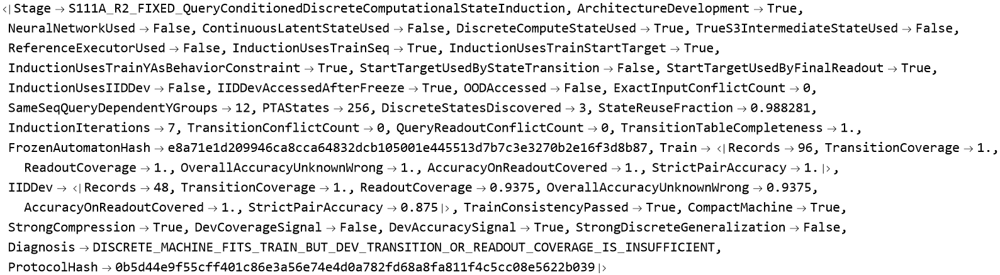

In [3634]:
s111AR2FixedResult

In [3639]:
Dataset[
  devPerDepthS111AR2F
]

Dataset[{<|Depth -> 6, Records -> 16, TransitionCoverage -> 1., ReadoutCoverage -> 1., 
 
>     OverallAccuracy -> 1., AccuracyOnCovered -> 1., StrictPairAccuracy -> 1.|>, 
 
>    <|Depth -> 8, Records -> 16, TransitionCoverage -> 1., ReadoutCoverage -> 0.9375, 
 
>     OverallAccuracy -> 0.9375, AccuracyOnCovered -> 1., StrictPairAccuracy -> 0.875|>, 
 
>    <|Depth -> 10, Records -> 16, TransitionCoverage -> 1., ReadoutCoverage -> 0.875, 
 
>     OverallAccuracy -> 0.875, AccuracyOnCovered -> 1., StrictPairAccuracy -> 0.75|>}, 
 
>   TypeSystem`Vector[TypeSystem`Struct[{Depth, Records, TransitionCoverage, 
 
>      ReadoutCoverage, OverallAccuracy, AccuracyOnCovered, StrictPairAccuracy}, 
 
>     {TypeSystem`Atom[Integer], TypeSystem`Atom[Integer], TypeSystem`Atom[Real], 
 
>      TypeSystem`Atom[Real], TypeSystem`Atom[Real], TypeSystem`Atom[Real], 
 
>      TypeSystem`Atom[Real]}], 3], <||>]

In [3644]:
<|

  "PTAStates" ->
    nPTAStatesS111AR2F,

  "DiscreteStates" ->
    nDiscreteStatesS111AR2F,

  "ReuseFraction" ->
    stateReuseFractionS111AR2F,

  "TransitionConflicts" ->
    transitionConflictCountS111AR2F,

  "QueryReadoutConflicts" ->
    finalQueryConflictCountS111AR2F,

  "TransitionCompleteness" ->
    transitionCompletenessS111AR2F,

  "TrainAccuracy" ->
    trainSummaryS111AR2F[
      "OverallAccuracyUnknownWrong"
    ],

  "TrainStrictPair" ->
    trainStrictPairAccuracyS111AR2F,

  "DevTransitionCoverage" ->
    devSummaryS111AR2F[
      "TransitionCoverage"
    ],

  "DevReadoutCoverage" ->
    devSummaryS111AR2F[
      "ReadoutCoverage"
    ],

  "DevAccuracy" ->
    devSummaryS111AR2F[
      "OverallAccuracyUnknownWrong"
    ],

  "DevStrictPair" ->
    devStrictPairAccuracyS111AR2F,

  "Diagnosis" ->
    diagnosisS111AR2F

|>

<|PTAStates -> 256, DiscreteStates -> 3, ReuseFraction -> 0.988281, 
 
>   TransitionConflicts -> 0, QueryReadoutConflicts -> 0, TransitionCompleteness -> 1., 
 
>   TrainAccuracy -> 1., TrainStrictPair -> 1., DevTransitionCoverage -> 1., 
 
>   DevReadoutCoverage -> 0.9375, DevAccuracy -> 0.9375, DevStrictPair -> 0.875, 
 
>   Diagnosis -> DISCRETE_MACHINE_FITS_TRAIN_BUT_DEV_TRANSITION_OR_READOUT_COVERAGE_IS_I\
 
>     NSUFFICIENT|>

In [3688]:
(* ============================================================ *)
(* S111B-R2 FIXED                                               *)
(* DISCRETE COMPUTE-STATE TRUTH / QUOTIENT AUDIT                *)
(*                                                              *)
(* POST-HOC DIAGNOSTIC ONLY                                     *)
(*                                                              *)
(* PURPOSE                                                      *)
(* ------------------------------------------------------------ *)
(* Audit the frozen 3-state machine discovered by S111A-R2.     *)
(*                                                              *)
(* Questions:                                                   *)
(* 1. What true S3 states correspond to each discovered q?      *)
(* 2. Is true S3 -> q a stable quotient mapping?                *)
(* 3. Are the S3 states merged inside a q behaviorally equal?   *)
(* 4. Do missing readout cells correspond to over-merging?      *)
(*                                                              *)
(* IMPORTANT                                                    *)
(* ------------------------------------------------------------ *)
(* - NO TRAINING                                                *)
(* - NO ARCHITECTURE CHANGE                                     *)
(* - NO RE-MERGING                                              *)
(* - NO OOD                                                     *)
(* - true S3 is used POST HOC ONLY                              *)
(* - frozen S111A-R2 machine remains untouched                  *)
(* ============================================================ *)


ClearAll["Global`S111BR2*"];
ClearAll["Global`s111BR2*"];


s111BR2Result =
Catch[

(

(* ============================================================ *)
(* 0. FAIL SAFE                                                 *)
(* ============================================================ *)

S111BR2Fail[msg_] := (
  Print["STOP: ", msg];
  Throw[$Failed, "S111BR2_STOP"];
);


Print["================================================"];
Print["S111B-R2 FIXED"];
Print["DISCRETE COMPUTE-STATE TRUTH / QUOTIENT AUDIT"];
Print["================================================"];


(* ============================================================ *)
(* 1. PREFLIGHT                                                 *)
(* ============================================================ *)

If[
  !And[
    ValueQ[trainRecords],
    ValueQ[iidRecords],
    ValueQ[finalS111AR2F],
    ValueQ[stateRepsS111AR2F],
    ValueQ[startStateS111AR2F],
    ValueQ[transitionByStateS111AR2F],
    ValueQ[readoutByStateS111AR2F],
    ValueQ[devEvalRowsS111AR2F]
  ],

  S111BR2Fail[
    "Required S111A-R2 FIXED objects are missing."
  ]
];


If[
  !TrueQ[
    finalS111AR2F[
      "TrainConsistencyPassed"
    ]
  ],

  S111BR2Fail[
    "S111A-R2 frozen machine did not pass TRAIN consistency."
  ]
];


If[
  finalS111AR2F[
    "TransitionConflictCount"
  ] =!= 0,

  S111BR2Fail[
    "Frozen machine contains transition conflicts."
  ]
];


Print["Preflight = PASS"];

Print[
  "Frozen discovered states = ",
  Length[stateRepsS111AR2F]
];

Print[
  "Frozen transition completeness = ",
  finalS111AR2F[
    "TransitionTableCompleteness"
  ]
];

Print[
  "Previous IID DEV transition coverage = ",
  finalS111AR2F["IIDDev"][
    "TransitionCoverage"
  ]
];

Print["NO TRAINING."];
Print["NO STATE MACHINE CHANGE."];
Print["TRUE S3 USED POST HOC ONLY."];
Print["OOD WILL NOT BE ACCESSED."];


(* ============================================================ *)
(* 2. QUERY SYMBOL DOMAIN                                       *)
(* ============================================================ *)

S111BR2AtomKey[x_] :=
  ToString[
    InputForm[x]
  ];


querySymbolsS111BR2 =
  SortBy[

    DeleteDuplicates[
      Join[
        (#["Start"] &) /@
          Join[
            trainRecords,
            iidRecords
          ],

        (#["Target"] &) /@
          Join[
            trainRecords,
            iidRecords
          ]
      ]
    ],

    S111BR2AtomKey
  ];


Print[
  "Query symbols = ",
  querySymbolsS111BR2
];


If[
  Length[
    querySymbolsS111BR2
  ] =!= 3,

  S111BR2Fail[
    "Expected exactly three query symbols."
  ]
];


queryIndexMapS111BR2 =
  AssociationThread[

    S111BR2AtomKey /@
      querySymbolsS111BR2,

    Range[3]
  ];


S111BR2QueryIndex[x_] :=
  Lookup[
    queryIndexMapS111BR2,
    S111BR2AtomKey[x],
    Missing["UnknownQuerySymbol"]
  ];


allQueryPairsS111BR2 =
  Tuples[
    querySymbolsS111BR2,
    2
  ];


Print[
  "Full query grid = ",
  Length[
    allQueryPairsS111BR2
  ],
  " pairs"
];


(* ============================================================ *)
(* 3. TRUE S3 OPERATORS                                         *)
(* ============================================================ *)

S111BR2Op[0] :=
  {2, 1, 3};


S111BR2Op[1] :=
  {1, 3, 2};


S111BR2Compose[
  p_List,
  q_List
] :=
  p[[q]];


S111BR2InversePerm[
  p_List
] :=
  Ordering[p];


(* ============================================================ *)
(* 4. TRUE S3 TRACES                                            *)
(* ============================================================ *)

S111BR2S3Trace[
  "Left",
  seq_List
] :=
  FoldList[

    Function[
      {acc, token},

      S111BR2Compose[
        S111BR2Op[token],
        acc
      ]
    ],

    {1, 2, 3},
    seq
  ];


S111BR2S3Trace[
  "Right",
  seq_List
] :=
  FoldList[

    Function[
      {acc, token},

      S111BR2Compose[
        acc,
        S111BR2Op[token]
      ]
    ],

    {1, 2, 3},
    seq
  ];


S111BR2FinalS3[
  convention_String,
  seq_List
] :=
  Last[
    S111BR2S3Trace[
      convention,
      seq
    ]
  ];


(* ============================================================ *)
(* 5. QUERY TRUTH                                               *)
(*                                                              *)
(* Audit four fixed conventions using TRAIN only.               *)
(* DEV does NOT select semantics.                               *)
(* ============================================================ *)

S111BR2QueryTruth[
  perm_List,
  start_,
  target_,
  action_String
] :=
Module[
  {
    p,
    s,
    t
  },


  p =
    Switch[

      action,

      "Direct",
        perm,

      "Inverse",
        S111BR2InversePerm[
          perm
        ],

      _,
        Return[
          Missing[
            "UnknownAction"
          ]
        ]
    ];


  s =
    S111BR2QueryIndex[
      start
    ];


  t =
    S111BR2QueryIndex[
      target
    ];


  If[
    MissingQ[s] ||
    MissingQ[t],

    Return[
      Missing[
        "UnknownQuery"
      ]
    ]
  ];


  Boole[
    p[[s]] === t
  ]
];


S111BR2CandidatePrediction[
  convention_String,
  action_String,
  record_Association
] :=
  S111BR2QueryTruth[

    S111BR2FinalS3[
      convention,
      record["Seq"]
    ],

    record["Start"],
    record["Target"],

    action
  ];


S111BR2CandidateAccuracy[
  convention_String,
  action_String,
  records_List
] :=
  N[
    Mean[
      Table[

        Boole[
          S111BR2CandidatePrediction[
            convention,
            action,
            r
          ] ===
            r["Y"]
        ],

        {
          r,
          records
        }
      ]
    ]
  ];


candidateSpecsS111BR2 = {

  {"Left", "Direct"},

  {"Left", "Inverse"},

  {"Right", "Direct"},

  {"Right", "Inverse"}

};


candidateRowsS111BR2 =
  Table[

    <|

      "Convention" ->
        spec[[1]],

      "Action" ->
        spec[[2]],

      "TrainYAccuracy" ->
        S111BR2CandidateAccuracy[
          spec[[1]],
          spec[[2]],
          trainRecords
        ]

    |>,

    {
      spec,
      candidateSpecsS111BR2
    }
  ];


Print["S3 semantic candidates computed."];


bestTrainAccuracyS111BR2 =
  Max[
    (#["TrainYAccuracy"] &) /@
      candidateRowsS111BR2
  ];


Print[
  "Best TRAIN S3 semantic accuracy = ",
  bestTrainAccuracyS111BR2
];


If[
  bestTrainAccuracyS111BR2 <
    1. - 10^-12,

  S111BR2Fail[
    "No fixed S3 semantics exactly reproduces TRAIN Y."
  ]
];


perfectCandidateRowsS111BR2 =
  Select[
    candidateRowsS111BR2,

    #["TrainYAccuracy"] >=
      1. - 10^-12 &
  ];


Print[
  "TRAIN-perfect semantic candidates = ",
  Length[
    perfectCandidateRowsS111BR2
  ]
];


chosenCandidateS111BR2 =
  First[
    perfectCandidateRowsS111BR2
  ];


chosenConventionS111BR2 =
  chosenCandidateS111BR2[
    "Convention"
  ];


chosenActionS111BR2 =
  chosenCandidateS111BR2[
    "Action"
  ];


Print[
  "Chosen convention = ",
  chosenConventionS111BR2,
  " / ",
  chosenActionS111BR2
];


chosenDevYAccuracyS111BR2 =
  S111BR2CandidateAccuracy[
    chosenConventionS111BR2,
    chosenActionS111BR2,
    iidRecords
  ];


Print[
  "Post-hoc IID DEV S3 semantic accuracy = ",
  chosenDevYAccuracyS111BR2
];


(* ============================================================ *)
(* 6. FROZEN DISCRETE EXECUTION                                 *)
(* ============================================================ *)

S111BR2DiscreteState[
  seq_List
] :=
  S111AR2FExecuteState[
    seq
  ];


(* ============================================================ *)
(* 7. EXHAUSTIVE SHORT-SEQUENCE AUDIT                           *)
(*                                                              *)
(* Every binary sequence length 0..8.                           *)
(* 1+2+4+...+256 = 511 sequences.                              *)
(* ============================================================ *)

s111BR2MaxAuditLength =
  8;


allAuditSequencesS111BR2 =
  Flatten[
    Table[

      Tuples[
        alphabetS111AR2F,
        len
      ],

      {
        len,
        0,
        s111BR2MaxAuditLength
      }
    ],

    1
  ];


Print[
  "Exhaustive audit sequences = ",
  Length[
    allAuditSequencesS111BR2
  ]
];


S111BR2S3Key[
  state_List
] :=
  ToString[
    InputForm[
      state
    ]
  ];


enumRowsS111BR2 =
  Table[

    Module[
      {
        q,
        trueState
      },


      q =
        S111BR2DiscreteState[
          seq
        ];


      trueState =
        S111BR2FinalS3[
          chosenConventionS111BR2,
          seq
        ];


      <|

        "Seq" ->
          seq,

        "Length" ->
          Length[seq],

        "DiscreteState" ->
          q,

        "TrueS3State" ->
          trueState,

        "TrueS3Key" ->
          S111BR2S3Key[
            trueState
          ]

      |>

    ],

    {
      seq,
      allAuditSequencesS111BR2
    }
  ];


unknownAuditStatesS111BR2 =
  Select[
    enumRowsS111BR2,

    MissingQ[
      #["DiscreteState"]
    ] &
  ];


Print[
  "Unknown frozen-machine states in exhaustive audit = ",
  Length[
    unknownAuditStatesS111BR2
  ]
];


If[
  Length[
    unknownAuditStatesS111BR2
  ] > 0,

  S111BR2Fail[
    "Frozen automaton cannot execute all exhaustive audit sequences."
  ]
];


(* ============================================================ *)
(* 8. q -> TRUE S3                                              *)
(* ============================================================ *)

qToS3RowsS111BR2 =
  Table[

    Module[
      {
        rows,
        states
      },


      rows =
        Select[
          enumRowsS111BR2,

          #["DiscreteState"] === q &
        ];


      states =
        DeleteDuplicates[
          (#["TrueS3State"] &) /@
            rows
        ];


      <|

        "DiscreteState" ->
          q,

        "ObservedSequenceCount" ->
          Length[rows],

        "UniqueTrueS3States" ->
          Length[states],

        "TrueS3States" ->
          states

      |>

    ],

    {
      q,
      stateRepsS111AR2F
    }
  ];


Print[
  "q -> true S3 mapping computed."
];


(* ============================================================ *)
(* 9. TRUE S3 -> q                                              *)
(* ============================================================ *)

allTrueS3StatesS111BR2 =
  Permutations[
    {1, 2, 3}
  ];


s3ToQRowsS111BR2 =
  Table[

    Module[
      {
        rows,
        qs
      },


      rows =
        Select[
          enumRowsS111BR2,

          #["TrueS3State"] ===
            trueState &
        ];


      qs =
        DeleteDuplicates[
          (#["DiscreteState"] &) /@
            rows
        ];


      <|

        "TrueS3State" ->
          trueState,

        "ObservedSequenceCount" ->
          Length[rows],

        "DiscreteStates" ->
          qs,

        "UniqueDiscreteStates" ->
          Length[qs],

        "FunctionalMapping" ->
          And[
            Length[rows] > 0,
            Length[qs] == 1
          ]

      |>

    ],

    {
      trueState,
      allTrueS3StatesS111BR2
    }
  ];


trueS3CoverageS111BR2 =
  Count[
    (
      #["ObservedSequenceCount"] > 0 &
    ) /@
      s3ToQRowsS111BR2,

    True
  ];


s3ToQFunctionalS111BR2 =
  And @@
    (
      #["FunctionalMapping"] &
    ) /@
      s3ToQRowsS111BR2;


Print[
  "True S3 states reached = ",
  trueS3CoverageS111BR2,
  " / 6"
];


Print[
  "True S3 -> discovered q functional = ",
  s3ToQFunctionalS111BR2
];


(* ============================================================ *)
(* 10. EXACT S3 RECOVERY CEILING FROM q                         *)
(* ============================================================ *)

S111BR2MajorityCount[
  values_List
] :=
  If[
    Length[values] == 0,

    0,

    Max[
      Values[
        Counts[
          values
        ]
      ]
    ]
  ];


qOnlyS3RecoveryCeilingS111BR2 =
  N[
    Total[
      Table[

        Module[
          {
            rows
          },


          rows =
            Select[
              enumRowsS111BR2,

              #["DiscreteState"] === q &
            ];


          S111BR2MajorityCount[
            (#["TrueS3Key"] &) /@
              rows
          ]

        ],

        {
          q,
          stateRepsS111AR2F
        }
      ]
    ] /
      Length[
        enumRowsS111BR2
      ]
  ];


Print[
  "Exact true-S3 recovery ceiling from q alone = ",
  qOnlyS3RecoveryCeilingS111BR2
];


(* ============================================================ *)
(* 11. TRUE FULL-QUERY BEHAVIOR SIGNATURE                       *)
(* ============================================================ *)

S111BR2BehaviorSignature[
  trueState_List
] :=
  Table[

    S111BR2QueryTruth[
      trueState,
      pair[[1]],
      pair[[2]],
      chosenActionS111BR2
    ],

    {
      pair,
      allQueryPairsS111BR2
    }
  ];


behaviorSignaturesS111BR2 =
  Association[
    Table[

      S111BR2S3Key[
        trueState
      ] ->
        S111BR2BehaviorSignature[
          trueState
        ],

      {
        trueState,
        allTrueS3StatesS111BR2
      }
    ]
  ];


trueBehaviorClassCountS111BR2 =
  Length[
    DeleteDuplicates[
      Values[
        behaviorSignaturesS111BR2
      ]
    ]
  ];


Print[
  "Behaviorally distinct true S3 states = ",
  trueBehaviorClassCountS111BR2
];


(* ============================================================ *)
(* 12. q-LEVEL BEHAVIOR COMPATIBILITY                           *)
(* ============================================================ *)

S111BR2StatesForQ[
  q_
] :=
Module[
  {
    row
  },


  row =
    SelectFirst[
      qToS3RowsS111BR2,

      #["DiscreteState"] === q &,

      Missing[
        "QNotFound"
      ]
    ];


  If[
    MissingQ[row],

    {},

    row[
      "TrueS3States"
    ]
  ]
];


qBehaviorAuditS111BR2 =
  Table[

    Module[
      {
        states,
        signatures
      },


      states =
        S111BR2StatesForQ[
          q
        ];


      signatures =
        DeleteDuplicates[
          S111BR2BehaviorSignature /@
            states
        ];


      <|

        "DiscreteState" ->
          q,

        "TrueS3StateCount" ->
          Length[states],

        "BehaviorSignatureCount" ->
          Length[signatures],

        "FullQueryBehaviorEquivalent" ->
          (
            Length[signatures] <= 1
          )

      |>

    ],

    {
      q,
      stateRepsS111AR2F
    }
  ];


allQBehaviorCompatibleS111BR2 =
  And @@
    (
      #[
        "FullQueryBehaviorEquivalent"
      ] &
    ) /@
      qBehaviorAuditS111BR2;


Print[
  "All q classes behavior-compatible = ",
  allQBehaviorCompatibleS111BR2
];


(* ============================================================ *)
(* 13. FULL q x QUERY GRID AUDIT                                *)
(* ============================================================ *)

fullReadoutAuditRowsS111BR2 =
  Flatten[
    Table[

      Module[
        {
          states
        },


        states =
          S111BR2StatesForQ[
            q
          ];


        Table[

          Module[
            {
              labels,
              queryKey,
              frozenKey,
              present,
              frozenValue
            },


            labels =
              DeleteDuplicates[
                Table[

                  S111BR2QueryTruth[
                    trueState,
                    pair[[1]],
                    pair[[2]],
                    chosenActionS111BR2
                  ],

                  {
                    trueState,
                    states
                  }
                ]
              ];


            queryKey =
              S111AR2FQueryKey[
                pair[[1]],
                pair[[2]]
              ];


            frozenKey =
              S111AR2FReadoutKey[
                q,
                queryKey
              ];


            present =
              KeyExistsQ[
                readoutByStateS111AR2F,
                frozenKey
              ];


            frozenValue =
              Lookup[
                readoutByStateS111AR2F,
                frozenKey,
                Missing[
                  "NotObservedInTrain"
                ]
              ];


            <|

              "DiscreteState" ->
                q,

              "Start" ->
                pair[[1]],

              "Target" ->
                pair[[2]],

              "TrueLabelSetAcrossMergedS3States" ->
                labels,

              "BehaviorConflict" ->
                (
                  Length[labels] > 1
                ),

              "FrozenReadoutPresent" ->
                present,

              "FrozenReadoutValue" ->
                frozenValue,

              "FrozenReadoutCorrectWhenDetermined" ->

                If[
                  And[
                    present,
                    Length[labels] == 1
                  ],

                  frozenValue ===
                    First[labels],

                  Missing[
                    "NotApplicable"
                  ]
                ]

            |>

          ],

          {
            pair,
            allQueryPairsS111BR2
          }
        ]

      ],

      {
        q,
        stateRepsS111AR2F
      }
    ],

    1
  ];


behaviorConflictRowsS111BR2 =
  Select[
    fullReadoutAuditRowsS111BR2,

    TrueQ[
      #["BehaviorConflict"]
    ] &
  ];


missingFrozenReadoutRowsS111BR2 =
  Select[
    fullReadoutAuditRowsS111BR2,

    !TrueQ[
      #["FrozenReadoutPresent"]
    ] &
  ];


behaviorConflictCountS111BR2 =
  Length[
    behaviorConflictRowsS111BR2
  ];


missingFrozenReadoutCountS111BR2 =
  Length[
    missingFrozenReadoutRowsS111BR2
  ];


missingConflictCountS111BR2 =
  Count[
    (
      TrueQ[
        #["BehaviorConflict"]
      ] &
    ) /@
      missingFrozenReadoutRowsS111BR2,

    True
  ];


Print[
  "Full q x query cells = ",
  Length[
    fullReadoutAuditRowsS111BR2
  ]
];


Print[
  "Behavior-conflicted cells = ",
  behaviorConflictCountS111BR2
];


Print[
  "Frozen readout missing cells = ",
  missingFrozenReadoutCountS111BR2
];


Print[
  "Missing cells that are behavior conflicts = ",
  missingConflictCountS111BR2
];


(* ============================================================ *)
(* 14. OBSERVED READOUT CORRECTNESS                             *)
(* ============================================================ *)

determinedObservedRowsS111BR2 =
  Select[
    fullReadoutAuditRowsS111BR2,

    And[
      TrueQ[
        #["FrozenReadoutPresent"]
      ],

      Length[
        #[
          "TrueLabelSetAcrossMergedS3States"
        ]
      ] == 1
    ] &
  ];


frozenReadoutExactOnDeterminedS111BR2 =
  And @@
    (
      TrueQ[
        #[
          "FrozenReadoutCorrectWhenDetermined"
        ]
      ] &
    ) /@
      determinedObservedRowsS111BR2;


Print[
  "Frozen readout exact on behavior-determined observed cells = ",
  frozenReadoutExactOnDeterminedS111BR2
];


(* ============================================================ *)
(* 15. DISTINGUISHING EXAMPLES                                  *)
(* ============================================================ *)

distinguishingExamplesS111BR2 =
  Take[

    Map[

      Function[
        row,

        <|

          "DiscreteState" ->
            row["DiscreteState"],

          "Start" ->
            row["Start"],

          "Target" ->
            row["Target"],

          "TrueLabelSet" ->
            row[
              "TrueLabelSetAcrossMergedS3States"
            ],

          "FrozenReadoutPresent" ->
            row[
              "FrozenReadoutPresent"
            ]

        |>
      ],

      behaviorConflictRowsS111BR2
    ],

    UpTo[20]
  ];


(* ============================================================ *)
(* 16. IID DEV UNKNOWN-READOUT AUDIT                            *)
(* ============================================================ *)

devUnknownRowsS111BR2 =
  Select[
    devEvalRowsS111AR2F,

    !TrueQ[
      #["ReadoutCovered"]
    ] &
  ];


S111BR2CellConflict[
  q_,
  start_,
  target_
] :=
Module[
  {
    hits
  },


  hits =
    Select[
      fullReadoutAuditRowsS111BR2,

      And[
        #["DiscreteState"] === q,
        #["Start"] === start,
        #["Target"] === target
      ] &
    ];


  If[
    Length[hits] =!= 1,

    Missing[
      "CellNotFound"
    ],

    First[hits][
      "BehaviorConflict"
    ]
  ]
];


devUnknownAuditRowsS111BR2 =
  Table[

    Module[
      {
        sourceRows,
        source,
        conflict
      },


      sourceRows =
        Select[
          iidRecords,

          And[
            #["PairID"] ===
              row["PairID"],

            #["Y"] ===
              row["Y"]
          ] &
        ];


      If[
        Length[sourceRows] =!= 1,

        <|

          "PairID" ->
            row["PairID"],

          "AuditError" ->
            "SourceRecordNotUnique"

        |>,

        source =
          First[
            sourceRows
          ];


        conflict =
          S111BR2CellConflict[

            row[
              "FinalDiscreteState"
            ],

            source["Start"],

            source["Target"]
          ];


        <|

          "PairID" ->
            row["PairID"],

          "Depth" ->
            row["Depth"],

          "DiscreteState" ->
            row[
              "FinalDiscreteState"
            ],

          "Start" ->
            source["Start"],

          "Target" ->
            source["Target"],

          "Y" ->
            source["Y"],

          "BehaviorConflictAtMissingCell" ->
            conflict

        |>
      ]

    ],

    {
      row,
      devUnknownRowsS111BR2
    }
  ];


devUnknownConflictFractionS111BR2 =
  If[
    Length[
      devUnknownAuditRowsS111BR2
    ] == 0,

    0.,

    N[
      Count[
        (
          TrueQ[
            #[
              "BehaviorConflictAtMissingCell"
            ]
          ] &
        ) /@
          devUnknownAuditRowsS111BR2,

        True
      ] /
        Length[
          devUnknownAuditRowsS111BR2
        ]
    ]
  ];


Print[
  "IID DEV unknown readout records = ",
  Length[
    devUnknownAuditRowsS111BR2
  ]
];


Print[
  "Fraction of DEV unknowns at behavior-conflicted cells = ",
  devUnknownConflictFractionS111BR2
];


(* ============================================================ *)
(* 17. FINAL DIAGNOSIS                                          *)
(* ============================================================ *)

exactFullComputeStateRecoveredS111BR2 =
  And[
    Length[
      stateRepsS111AR2F
    ] == 6,

    Abs[
      qOnlyS3RecoveryCeilingS111BR2 -
        1.
    ] < 10^-12
  ];


validBehavioralQuotientS111BR2 =
  And[
    trueS3CoverageS111BR2 == 6,
    s3ToQFunctionalS111BR2,
    allQBehaviorCompatibleS111BR2,
    behaviorConflictCountS111BR2 == 0
  ];


overMergedComputeStateS111BR2 =
  And[
    trueS3CoverageS111BR2 == 6,
    s3ToQFunctionalS111BR2,
    behaviorConflictCountS111BR2 > 0
  ];


diagnosisS111BR2 =
  Which[

    exactFullComputeStateRecoveredS111BR2,

      "DISCOVERED_DISCRETE_STATES_RECOVER_FULL_TRUE_S3_COMPUTE_STATE",


    validBehavioralQuotientS111BR2,

      "DISCOVERED_STATES_FORM_EXACT_TASK_SUFFICIENT_BEHAVIORAL_QUOTIENT",


    overMergedComputeStateS111BR2,

      "DISCRETE_STATE_MACHINE_IS_STABLE_BUT_OVERMERGES_BEHAVIORALLY_DISTINGUISHABLE_TRUE_COMPUTE_STATES",


    !s3ToQFunctionalS111BR2,

      "DISCOVERED_Q_IS_NOT_A_STABLE_QUOTIENT_OF_TRUE_COMPUTE_STATE",


    True,

      "INCONCLUSIVE"
  ];


(* ============================================================ *)
(* 18. FINAL REPORT                                             *)
(* ============================================================ *)

finalS111BR2 =
  <|

    "Stage" ->
      "S111B_R2_FIXED_DiscreteComputeStateTruthQuotientAudit",

    "PostHocDiagnosticOnly" ->
      True,

    "TrainingPerformed" ->
      False,

    "FrozenMachineChanged" ->
      False,

    "TrueS3UsedDuringInduction" ->
      False,

    "TrueS3UsedForPostHocAudit" ->
      True,

    "OODAccessed" ->
      False,

    "ChosenS3Convention" ->
      chosenConventionS111BR2,

    "ChosenQueryAction" ->
      chosenActionS111BR2,

    "TrainS3QueryAccuracy" ->
      bestTrainAccuracyS111BR2,

    "IIDDevS3QueryAccuracy" ->
      chosenDevYAccuracyS111BR2,

    "DiscoveredDiscreteStates" ->
      Length[
        stateRepsS111AR2F
      ],

    "TrueS3StateCount" ->
      6,

    "TrueBehaviorClassCountAcrossAllQueries" ->
      trueBehaviorClassCountS111BR2,

    "TrueS3Coverage" ->
      trueS3CoverageS111BR2,

    "TrueS3ToQFunctional" ->
      s3ToQFunctionalS111BR2,

    "ExactS3RecoveryCeilingFromQ" ->
      qOnlyS3RecoveryCeilingS111BR2,

    "AllQFullQueryBehaviorCompatible" ->
      allQBehaviorCompatibleS111BR2,

    "BehaviorConflictCellCount" ->
      behaviorConflictCountS111BR2,

    "FrozenReadoutMissingCellCount" ->
      missingFrozenReadoutCountS111BR2,

    "MissingCellsThatAreBehaviorConflicts" ->
      missingConflictCountS111BR2,

    "FrozenReadoutExactOnDeterminedCells" ->
      frozenReadoutExactOnDeterminedS111BR2,

    "IIDDevUnknownReadoutRecords" ->
      Length[
        devUnknownAuditRowsS111BR2
      ],

    "IIDDevUnknownConflictFraction" ->
      devUnknownConflictFractionS111BR2,

    "ExactFullComputeStateRecovered" ->
      exactFullComputeStateRecoveredS111BR2,

    "ValidBehavioralQuotient" ->
      validBehavioralQuotientS111BR2,

    "OverMergedComputeState" ->
      overMergedComputeStateS111BR2,

    "Diagnosis" ->
      diagnosisS111BR2

  |>;


Print["================================================"];
Print["S111B-R2 COMPLETE"];

Print[
  "Discovered q states = ",
  Length[
    stateRepsS111AR2F
  ]
];

Print[
  "True behavior classes = ",
  trueBehaviorClassCountS111BR2
];

Print[
  "True S3 -> q functional = ",
  s3ToQFunctionalS111BR2
];

Print[
  "Exact S3 recovery ceiling from q = ",
  qOnlyS3RecoveryCeilingS111BR2
];

Print[
  "Behavior-conflicted cells = ",
  behaviorConflictCountS111BR2
];

Print[
  "Frozen missing readout cells = ",
  missingFrozenReadoutCountS111BR2
];

Print[
  "Missing cells that are conflicts = ",
  missingConflictCountS111BR2
];

Print[
  "Diagnosis = ",
  diagnosisS111BR2
];

Print["================================================"];


finalS111BR2

),

"S111BR2_STOP"
];

S111B-R2 FIXED
DISCRETE COMPUTE-STATE TRUTH / QUOTIENT AUDIT
Preflight = PASS
Frozen discovered states = 3
Frozen transition completeness = 1.
Previous IID DEV transition coverage = 1.
NO TRAINING.
NO STATE MACHINE CHANGE.
TRUE S3 USED POST HOC ONLY.
OOD WILL NOT BE ACCESSED.
Query symbols = {0, 1, 2}
Full query grid = 9 pairs
S3 semantic candidates computed.
Best TRAIN S3 semantic accuracy = 1.
TRAIN-perfect semantic candidates = 2
Chosen convention = Left / Direct
Post-hoc IID DEV S3 semantic accuracy = 1.
Exhaustive audit sequences = 511
Unknown frozen-machine states in exhaustive audit = 0
q -> true S3 mapping computed.
True S3 states reached = 6 / 6
True S3 -> discovered q functional = True
Exact true-S3 recovery ceiling from q alone = 0.667319
Behaviorally distinct true S3 states = 6
All q classes behavior-compatible = False
Full q x query cells = 27
Behavior-conflicted cells = 12
Frozen readout missing cells = 3
Missing cells that are behavior conflicts = 1
Frozen readout exact 

In [3720]:
(* ============================================================ *)
(* S111C                                                        *)
(* CONFLICT-DRIVEN ONE-BIT DISCRETE STATE REFINEMENT            *)
(*                                                              *)
(* Starting point:                                              *)
(*                                                              *)
(*     q_t  : frozen 3-state machine from S111A-R2              *)
(*                                                              *)
(* Add ONE reversible discrete bit:                             *)
(*                                                              *)
(*     C_t = {q_t, b_t},   b_t in {0,1}                         *)
(*                                                              *)
(* transition:                                                  *)
(*                                                              *)
(*     q' = delta(q,x)                                          *)
(*     b' = XOR[b, flip(q,x)]                                   *)
(*                                                              *)
(* There are 3 states x 2 tokens = 6 edge-flip bits             *)
(* => exactly 2^6 = 64 candidate refinements.                   *)
(*                                                              *)
(* Candidate selection uses TRAIN ONLY.                         *)
(*                                                              *)
(* NO S3 true state                                             *)
(* NO reference executor                                        *)
(* NO neural network                                            *)
(* NO continuous latent                                         *)
(* NO DEV selection                                             *)
(* NO OOD                                                       *)
(*                                                              *)
(* IID DEV is accessed only AFTER candidate freeze.             *)
(* ============================================================ *)


ClearAll["Global`S111C*"];
ClearAll["Global`s111C*"];


s111CResult =
Catch[

(

(* ============================================================ *)
(* 0. FAIL SAFE                                                 *)
(* ============================================================ *)

S111CFail[msg_] := (
  Print["STOP: ", msg];
  Throw[$Failed, "S111C_STOP"];
);


Print["================================================"];
Print["S111C ONE-BIT DISCRETE STATE REFINEMENT"];
Print["================================================"];


(* ============================================================ *)
(* 1. PREFLIGHT                                                 *)
(* ============================================================ *)

If[
  !And[
    ValueQ[trainRecords],
    ValueQ[iidRecords],

    ValueQ[finalS111AR2F],

    ValueQ[stateRepsS111AR2F],
    ValueQ[startStateS111AR2F],
    ValueQ[transitionByStateS111AR2F],
    ValueQ[alphabetS111AR2F]
  ],

  S111CFail[
    "Required S111A-R2 FIXED objects are missing."
  ]
];


If[
  !TrueQ[
    finalS111AR2F["TrainConsistencyPassed"]
  ],

  S111CFail[
    "S111A-R2 frozen machine did not pass TRAIN consistency."
  ]
];


If[
  finalS111AR2F["TransitionConflictCount"] =!= 0,

  S111CFail[
    "Base 3-state machine has transition conflicts."
  ]
];


If[
  Length[stateRepsS111AR2F] =!= 3,

  S111CFail[
    "S111C expects exactly three frozen base states."
  ]
];


Print["Preflight = PASS"];

Print[
  "Base discrete states = ",
  stateRepsS111AR2F
];

Print[
  "Base transition completeness = ",
  finalS111AR2F["TransitionTableCompleteness"]
];

Print[
  "Previous IID DEV accuracy = ",
  finalS111AR2F["IIDDev"]["OverallAccuracyUnknownWrong"]
];

Print["SEARCH / REFINEMENT USES TRAIN ONLY."];
Print["TRUE S3 WILL NOT BE USED."];
Print["REFERENCE EXECUTOR WILL NOT BE USED."];
Print["IID DEV WILL NOT SELECT THE REFINEMENT."];
Print["OOD WILL NOT BE ACCESSED."];


(* ============================================================ *)
(* 2. QUERY SYMBOL DOMAIN -- TRAIN ONLY                         *)
(* ============================================================ *)

S111CAtomKey[x_] :=
  ToString[
    InputForm[x]
  ];


querySymbolsS111C =
  SortBy[

    DeleteDuplicates[
      Join[
        (#["Start"] &) /@
          trainRecords,

        (#["Target"] &) /@
          trainRecords
      ]
    ],

    S111CAtomKey
  ];


Print[
  "TRAIN query symbols = ",
  querySymbolsS111C
];


If[
  Length[querySymbolsS111C] =!= 3,

  S111CFail[
    "Expected exactly three query symbols."
  ]
];


queryIndexMapS111C =
  AssociationThread[

    S111CAtomKey /@
      querySymbolsS111C,

    Range[3]
  ];


S111CQueryIndex[x_] :=
  Lookup[
    queryIndexMapS111C,

    S111CAtomKey[x],

    Missing["UnknownQuerySymbol"]
  ];


(* ============================================================ *)
(* 3. BASE TRANSITION KEY                                       *)
(* ============================================================ *)

S111CBaseTransKey[
  q_Integer,
  token_Integer
] :=
  ToString[
    InputForm[
      {
        q,
        token
      }
    ]
  ];


(* ============================================================ *)
(* 4. BASE EDGE TABLE                                           *)
(*                                                              *)
(* Six deterministic edges:                                    *)
(*                                                              *)
(*    (q,0)                                                     *)
(*    (q,1)                                                     *)
(*                                                              *)
(* for the three base states.                                   *)
(* ============================================================ *)

baseEdgesS111C =
  Flatten[
    Table[

      Module[
        {
          dest
        },


        dest =
          Lookup[
            transitionByStateS111AR2F,

            S111CBaseTransKey[
              q,
              token
            ],

            Missing[
              "MissingBaseTransition"
            ]
          ];


        <|

          "Source" ->
            q,

          "Token" ->
            token,

          "Destination" ->
            dest

        |>

      ],

      {
        q,
        Sort[stateRepsS111AR2F]
      },

      {
        token,
        alphabetS111AR2F
      }
    ],

    1
  ];


If[
  Length[baseEdgesS111C] =!= 6,

  S111CFail[
    "Expected exactly six base transition edges."
  ]
];


If[
  !FreeQ[
    (#["Destination"] &) /@
      baseEdgesS111C,
    _Missing
  ],

  S111CFail[
    "Base transition table is incomplete."
  ]
];


Print[
  "Base edges = ",
  Length[baseEdgesS111C]
];

Print[
  "One-bit reversible refinements to test = ",
  2^Length[baseEdgesS111C]
];


(* ============================================================ *)
(* 5. EDGE KEY                                                  *)
(* ============================================================ *)

S111CEdgeKey[
  q_Integer,
  token_Integer
] :=
  ToString[
    InputForm[
      {
        q,
        token
      }
    ]
  ];


(* ============================================================ *)
(* 6. FLIP ASSOCIATION                                          *)
(* ============================================================ *)

S111CFlipAssociation[
  flipVector_List
] :=
  AssociationThread[

    (
      S111CEdgeKey[
        #["Source"],
        #["Token"]
      ] &
    ) /@
      baseEdgesS111C,

    flipVector
  ];


(* ============================================================ *)
(* 7. REFINED STATE TRANSITION                                  *)
(*                                                              *)
(* {q,b} --token--> {q', b XOR flip(q,token)}                  *)
(*                                                              *)
(* This is reversible in the added bit.                         *)
(* ============================================================ *)

S111CStep[
  state_List,
  token_Integer,
  flipAssociation_Association
] :=
Module[
  {
    q,
    bit,

    qNext,
    flipBit
  },


  q =
    state[[1]];


  bit =
    state[[2]];


  qNext =
    Lookup[
      transitionByStateS111AR2F,

      S111CBaseTransKey[
        q,
        token
      ],

      Missing[
        "UnknownBaseTransition"
      ]
    ];


  If[
    MissingQ[qNext],

    Return[
      Missing[
        "UnknownBaseTransition"
      ]
    ]
  ];


  flipBit =
    Lookup[
      flipAssociation,

      S111CEdgeKey[
        q,
        token
      ],

      Missing[
        "UnknownFlip"
      ]
    ];


  If[
    MissingQ[flipBit],

    Return[
      Missing[
        "UnknownFlip"
      ]
    ]
  ];


  {
    qNext,
    Mod[
      bit + flipBit,
      2
    ]
  }
];


(* ============================================================ *)
(* 8. EXECUTION                                                 *)
(* ============================================================ *)

S111CExecute[
  seq_List,
  flipAssociation_Association
] :=
Module[
  {
    state
  },


  state = {
    startStateS111AR2F,
    0
  };


  Do[

    state =
      S111CStep[
        state,
        token,
        flipAssociation
      ];


    If[
      MissingQ[state],

      Return[state]
    ],

    {
      token,
      seq
    }
  ];


  state
];


(* ============================================================ *)
(* 9. REACHABLE-STATE AUDIT                                     *)
(*                                                              *)
(* Exact graph exploration -- no length cutoff.                 *)
(* ============================================================ *)

S111CReachableStates[
  flipAssociation_Association
] :=
Module[
  {
    reached,
    frontier,

    nextStates,
    newStates
  },


  reached = {
    {
      startStateS111AR2F,
      0
    }
  };


  frontier =
    reached;


  While[
    Length[frontier] > 0,


    nextStates =
      DeleteDuplicates[
        Flatten[
          Table[

            S111CStep[
              state,
              token,
              flipAssociation
            ],

            {
              state,
              frontier
            },

            {
              token,
              alphabetS111AR2F
            }
          ],

          1
        ]
      ];


    If[
      !FreeQ[
        nextStates,
        _Missing
      ],

      Return[$Failed]
    ];


    newStates =
      Select[
        nextStates,

        !MemberQ[
          reached,
          #
        ] &
      ];


    reached =
      Join[
        reached,
        newStates
      ];


    frontier =
      newStates;

  ];


  Sort[
    reached
  ]
];


(* ============================================================ *)
(* 10. ALL SIX POSSIBLE REFINED STATES                          *)
(* ============================================================ *)

allRefinedStatesS111C =
  Flatten[
    Table[

      {
        q,
        bit
      },

      {
        q,
        Sort[stateRepsS111AR2F]
      },

      {
        bit,
        {0, 1}
      }
    ],

    1
  ];


(* ============================================================ *)
(* 11. ANNOTATE TRAIN WITH REFINED FINAL STATE                  *)
(* ============================================================ *)

S111CAnnotateRecords[
  records_List,
  flipAssociation_Association
] :=
  Table[

    Join[
      r,

      <|

        "RefinedState" ->
          S111CExecute[
            r["Seq"],
            flipAssociation
          ]

      |>
    ],

    {
      r,
      records
    }
  ];


(* ============================================================ *)
(* 12. STATE / START KEY                                        *)
(* ============================================================ *)

S111CStateStartKey[
  state_List,
  start_
] :=
  ToString[
    InputForm[
      {
        state,
        start
      }
    ]
  ];


(* ============================================================ *)
(* 13. FUNCTIONAL QUERY CONSTRAINT                              *)
(*                                                              *)
(* For each refined state C and Start symbol s:                 *)
(*                                                              *)
(* there must be ONE correct destination t.                     *)
(*                                                              *)
(* TRAIN Y=1 constrains destination positively.                 *)
(* TRAIN Y=0 eliminates destinations.                           *)
(*                                                              *)
(* This does NOT use S3.                                        *)
(* ============================================================ *)

S111CConstraintRows[
  annotatedTrain_List
] :=
  Flatten[
    Table[

      Module[
        {
          observations,

          positiveTargets,
          negativeTargets,

          allowedTargets,

          contradiction
        },


        observations =
          Select[
            annotatedTrain,

            And[
              #["RefinedState"] === refinedState,
              #["Start"] === start
            ] &
          ];


        positiveTargets =
          DeleteDuplicates[
            (
              #["Target"] &
            ) /@
              Select[
                observations,
                #["Y"] === 1 &
              ]
          ];


        negativeTargets =
          DeleteDuplicates[
            (
              #["Target"] &
            ) /@
              Select[
                observations,
                #["Y"] === 0 &
              ]
          ];


        contradiction =
          Or[
            Length[positiveTargets] > 1,

            Length[
              Intersection[
                positiveTargets,
                negativeTargets
              ]
            ] > 0
          ];


        allowedTargets =
          Which[

            contradiction,

              {},


            Length[positiveTargets] == 1,

              positiveTargets,


            True,

              Complement[
                querySymbolsS111C,
                negativeTargets
              ]

          ];


        If[
          Length[allowedTargets] == 0,
          contradiction = True
        ];


        <|

          "RefinedState" ->
            refinedState,

          "Start" ->
            start,

          "ObservationCount" ->
            Length[observations],

          "PositiveTargets" ->
            positiveTargets,

          "NegativeTargets" ->
            negativeTargets,

          "AllowedTargets" ->
            allowedTargets,

          "AllowedTargetCount" ->
            Length[allowedTargets],

          "Resolved" ->
            (
              Length[allowedTargets] == 1
            ),

          "Contradiction" ->
            contradiction

        |>

      ],

      {
        refinedState,
        allRefinedStatesS111C
      },

      {
        start,
        querySymbolsS111C
      }
    ],

    1
  ];


(* ============================================================ *)
(* 14. CANDIDATE AUDIT                                          *)
(* ============================================================ *)

S111CAuditCandidate[
  flipVector_List
] :=
Module[
  {
    flipAssociation,

    reachable,
    reachableCount,

    annotatedTrain,

    constraints,

    conflictCount,

    resolvedCount,

    ambiguity,

    observedConstraintCount
  },


  flipAssociation =
    S111CFlipAssociation[
      flipVector
    ];


  reachable =
    S111CReachableStates[
      flipAssociation
    ];


  If[
    reachable === $Failed,

    Return[
      <|

        "FlipVector" ->
          flipVector,

        "ReachableStates" ->
          0,

        "ConstraintConflicts" ->
          Infinity,

        "ResolvedStateStartMappings" ->
          0,

        "TotalAmbiguity" ->
          Infinity,

        "Valid" ->
          False

      |>
    ]
  ];


  reachableCount =
    Length[
      reachable
    ];


  annotatedTrain =
    S111CAnnotateRecords[
      trainRecords,
      flipAssociation
    ];


  If[
    !FreeQ[
      (#["RefinedState"] &) /@
        annotatedTrain,
      _Missing
    ],

    Return[
      <|

        "FlipVector" ->
          flipVector,

        "ReachableStates" ->
          reachableCount,

        "ConstraintConflicts" ->
          Infinity,

        "ResolvedStateStartMappings" ->
          0,

        "TotalAmbiguity" ->
          Infinity,

        "Valid" ->
          False

      |>
    ]
  ];


  constraints =
    S111CConstraintRows[
      annotatedTrain
    ];


  conflictCount =
    Count[
      (
        TrueQ[
          #["Contradiction"]
        ] &
      ) /@
        constraints,

      True
    ];


  resolvedCount =
    Count[
      (
        TrueQ[
          #["Resolved"]
        ] &
      ) /@
        constraints,

      True
    ];


  ambiguity =
    Total[
      (
        Max[
          0,
          #["AllowedTargetCount"] - 1
        ] &
      ) /@
        constraints
    ];


  observedConstraintCount =
    Count[
      (
        #["ObservationCount"] > 0 &
      ) /@
        constraints,

      True
    ];


  <|

    "FlipVector" ->
      flipVector,

    "ReachableStates" ->
      reachableCount,

    "ConstraintConflicts" ->
      conflictCount,

    "ResolvedStateStartMappings" ->
      resolvedCount,

    "ObservedStateStartMappings" ->
      observedConstraintCount,

    "TotalAmbiguity" ->
      ambiguity,

    "FlipCount" ->
      Total[
        flipVector
      ],

    "Valid" ->
      And[
        reachableCount == 6,
        conflictCount == 0
      ]

  |>
];


(* ============================================================ *)
(* 15. EXHAUSTIVE 64-CANDIDATE TRAIN-ONLY SEARCH               *)
(* ============================================================ *)

flipVectorsS111C =
  Tuples[
    {0, 1},
    Length[
      baseEdgesS111C
    ]
  ];


Print["================================================"];
Print["SEARCHING 64 TRAIN-ONLY ONE-BIT REFINEMENTS"];
Print["================================================"];


searchTimingS111C =
  AbsoluteTiming[

    candidateRowsS111C =
      Table[

        S111CAuditCandidate[
          flipVector
        ],

        {
          flipVector,
          flipVectorsS111C
        }
      ];

  ];


Print[
  "Search seconds = ",
  N[
    searchTimingS111C[[1]]
  ]
];


validCandidateRowsS111C =
  Select[
    candidateRowsS111C,

    TrueQ[
      #["Valid"]
    ] &
  ];


Print[
  "Valid 6-state zero-conflict refinements = ",
  Length[
    validCandidateRowsS111C
  ]
];


If[
  Length[
    validCandidateRowsS111C
  ] == 0,

  S111CFail[
    "No one-bit reversible refinement fits TRAIN constraints."
  ]
];


(* ============================================================ *)
(* 16. TRAIN-ONLY CANDIDATE SELECTION                           *)
(*                                                              *)
(* Objective order:                                             *)
(*                                                              *)
(* 1. valid, six reachable states, zero contradictions          *)
(* 2. maximize fully resolved (state,start) mappings             *)
(* 3. minimize remaining ambiguity                              *)
(* 4. canonical lexicographic flip vector                       *)
(*                                                              *)
(* DEV plays NO role.                                           *)
(* ============================================================ *)

bestResolvedCountS111C =
  Max[
    (#["ResolvedStateStartMappings"] &) /@
      validCandidateRowsS111C
  ];


bestResolvedCandidatesS111C =
  Select[
    validCandidateRowsS111C,

    #["ResolvedStateStartMappings"] ===
      bestResolvedCountS111C &
  ];


minimumAmbiguityS111C =
  Min[
    (#["TotalAmbiguity"] &) /@
      bestResolvedCandidatesS111C
  ];


bestAmbiguityCandidatesS111C =
  Select[
    bestResolvedCandidatesS111C,

    #["TotalAmbiguity"] ===
      minimumAmbiguityS111C &
  ];


chosenCandidateS111C =
  First[
    SortBy[
      bestAmbiguityCandidatesS111C,
      #["FlipVector"] &
    ]
  ];


chosenFlipVectorS111C =
  chosenCandidateS111C[
    "FlipVector"
  ];


chosenFlipAssociationS111C =
  S111CFlipAssociation[
    chosenFlipVectorS111C
  ];


Print[
  "Best resolved state/start mappings = ",
  bestResolvedCountS111C,
  " / 18"
];


Print[
  "Minimum remaining ambiguity = ",
  minimumAmbiguityS111C
];


Print[
  "Chosen canonical flip vector = ",
  chosenFlipVectorS111C
];


Print[
  "TRAIN-equivalent best candidates = ",
  Length[
    bestAmbiguityCandidatesS111C
  ]
];


(* ============================================================ *)
(* 17. FREEZE REFINED MACHINE                                   *)
(* ============================================================ *)

reachableStatesS111C =
  S111CReachableStates[
    chosenFlipAssociationS111C
  ];


If[
  Length[
    reachableStatesS111C
  ] =!= 6,

  S111CFail[
    "Chosen refined machine does not have six reachable states."
  ]
];


annotatedTrainS111C =
  S111CAnnotateRecords[
    trainRecords,
    chosenFlipAssociationS111C
  ];


constraintRowsS111C =
  S111CConstraintRows[
    annotatedTrainS111C
  ];


constraintConflictCountS111C =
  Count[
    (
      TrueQ[
        #["Contradiction"]
      ] &
    ) /@
      constraintRowsS111C,

    True
  ];


If[
  constraintConflictCountS111C =!= 0,

  S111CFail[
    "Chosen refinement still has TRAIN behavior conflicts."
  ]
];


(* ============================================================ *)
(* 18. ALLOWED DESTINATION TABLE                                *)
(* ============================================================ *)

allowedDestinationsS111C =
  Association[
    Table[

      S111CStateStartKey[
        row["RefinedState"],
        row["Start"]
      ] ->
        row["AllowedTargets"],

      {
        row,
        constraintRowsS111C
      }
    ]
  ];


(* ============================================================ *)
(* 19. SAFE FUNCTIONAL READOUT                                  *)
(*                                                              *)
(* AllowedTargets = {t}                                         *)
(*     => exact destination known                               *)
(*                                                              *)
(* AllowedTargets = {t1,t2}                                     *)
(*     query target outside set => definitely 0                 *)
(*     query target inside set  => Unknown                      *)
(* ============================================================ *)

S111CPredictFromAllowed[
  refinedState_List,
  start_,
  target_
] :=
Module[
  {
    allowed
  },


  allowed =
    Lookup[
      allowedDestinationsS111C,

      S111CStateStartKey[
        refinedState,
        start
      ],

      Missing[
        "UnknownStateStart"
      ]
    ];


  If[
    MissingQ[allowed],

    Return[
      Missing[
        "UnknownStateStart"
      ]
    ]
  ];


  Which[

    !MemberQ[
      allowed,
      target
    ],

      0,


    Length[allowed] == 1,

      1,


    True,

      Missing[
        "AmbiguousReadout"
      ]

  ]
];


(* ============================================================ *)
(* 20. OPTIONAL BIJECTION COMPLETION                            *)
(*                                                              *)
(* S3 task transformations are permutations of 3 symbols.       *)
(*                                                              *)
(* This section uses ONLY TRAIN-derived AllowedTargets.          *)
(* It does NOT use S3 true state or reference executor.         *)
(*                                                              *)
(* For every refined state, enumerate the 6 possible bijections *)
(* and retain those consistent with TRAIN constraints.          *)
(* ============================================================ *)

permutationCandidatesS111C =
  Permutations[
    querySymbolsS111C
  ];


S111CConsistentPermutations[
  refinedState_List
] :=
  Select[
    permutationCandidatesS111C,

    Function[
      perm,

      And @@
        Table[

          Module[
            {
              allowed,
              destination
            },


            allowed =
              Lookup[
                allowedDestinationsS111C,

                S111CStateStartKey[
                  refinedState,
                  querySymbolsS111C[[i]]
                ],

                {}
              ];


            destination =
              perm[[i]];


            MemberQ[
              allowed,
              destination
            ]

          ],

          {
            i,
            Length[
              querySymbolsS111C
            ]
          }
        ]

    ]
  ];


bijectionRowsS111C =
  Table[

    Module[
      {
        candidates
      },


      candidates =
        S111CConsistentPermutations[
          refinedState
        ];


      <|

        "RefinedState" ->
          refinedState,

        "ConsistentBijections" ->
          Length[
            candidates
          ],

        "UniqueBijection" ->
          (
            Length[candidates] == 1
          ),

        "Bijection" ->
          If[
            Length[candidates] == 1,

            First[candidates],

            Missing[
              "NotUnique"
            ]
          ]

      |>

    ],

    {
      refinedState,
      reachableStatesS111C
    }
  ];


uniqueBijectionStateCountS111C =
  Count[
    (
      TrueQ[
        #["UniqueBijection"]
      ] &
    ) /@
      bijectionRowsS111C,

    True
  ];


Print[
  "Unique TRAIN-derived bijections = ",
  uniqueBijectionStateCountS111C,
  " / 6 refined states"
];


bijectionByStateS111C =
  Association[
    Table[

      ToString[
        InputForm[
          row["RefinedState"]
        ]
      ] ->
        row["Bijection"],

      {
        row,
        bijectionRowsS111C
      }
    ]
  ];


(* ============================================================ *)
(* 21. BIJECTION READOUT                                        *)
(* ============================================================ *)

S111CPredictFromBijection[
  refinedState_List,
  start_,
  target_
] :=
Module[
  {
    perm,
    index,
    destination
  },


  perm =
    Lookup[
      bijectionByStateS111C,

      ToString[
        InputForm[
          refinedState
        ]
      ],

      Missing[
        "UnknownState"
      ]
    ];


  If[
    MissingQ[perm],

    Return[
      Missing[
        "NoUniqueBijection"
      ]
    ]
  ];


  index =
    S111CQueryIndex[
      start
    ];


  If[
    MissingQ[index],

    Return[
      Missing[
        "UnknownStart"
      ]
    ]
  ];


  destination =
    perm[[index]];


  Boole[
    destination === target
  ]
];


(* ============================================================ *)
(* 22. GENERAL RECORD EVALUATION                                *)
(* ============================================================ *)

S111CEvaluationRows[
  records_List,
  split_String,
  mode_String
] :=
  Table[

    Module[
      {
        refinedState,
        prediction
      },


      refinedState =
        S111CExecute[
          r["Seq"],
          chosenFlipAssociationS111C
        ];


      prediction =
        If[
          MissingQ[
            refinedState
          ],

          Missing[
            "UnknownTransition"
          ],

          Switch[

            mode,

            "AllowedSet",

              S111CPredictFromAllowed[
                refinedState,
                r["Start"],
                r["Target"]
              ],


            "Bijection",

              S111CPredictFromBijection[
                refinedState,
                r["Start"],
                r["Target"]
              ],


            _,

              Missing[
                "UnknownEvaluationMode"
              ]

          ]
        ];


      <|

        "Split" ->
          split,

        "PairID" ->
          r["PairID"],

        "Depth" ->
          r["Depth"],

        "RefinedState" ->
          refinedState,

        "Y" ->
          r["Y"],

        "Prediction" ->
          prediction,

        "TransitionCovered" ->
          !MissingQ[
            refinedState
          ],

        "ReadoutCovered" ->
          IntegerQ[
            prediction
          ],

        "Correct" ->
          And[
            IntegerQ[
              prediction
            ],

            prediction ===
              r["Y"]
          ]

      |>

    ],

    {
      r,
      records
    }
  ];


(* ============================================================ *)
(* 23. SUMMARY                                                  *)
(* ============================================================ *)

S111CSummarize[
  rows_List
] :=
Module[
  {
    covered,

    transitionCoverage,
    readoutCoverage,

    overallAccuracy,
    coveredAccuracy
  },


  covered =
    Select[
      rows,
      TrueQ[
        #["ReadoutCovered"]
      ] &
    ];


  transitionCoverage =
    N[
      Count[
        (
          TrueQ[
            #["TransitionCovered"]
          ] &
        ) /@
          rows,
        True
      ] /
        Length[
          rows
        ]
    ];


  readoutCoverage =
    N[
      Length[
        covered
      ] /
        Length[
          rows
        ]
    ];


  overallAccuracy =
    N[
      Mean[
        (
          Boole[
            TrueQ[
              #["Correct"]
            ]
          ] &
        ) /@
          rows
      ]
    ];


  coveredAccuracy =
    If[
      Length[
        covered
      ] == 0,

      Missing[
        "NoCoveredRows"
      ],

      N[
        Mean[
          (
            Boole[
              TrueQ[
                #["Correct"]
              ]
            ] &
          ) /@
            covered
        ]
      ]
    ];


  <|

    "Records" ->
      Length[
        rows
      ],

    "TransitionCoverage" ->
      transitionCoverage,

    "ReadoutCoverage" ->
      readoutCoverage,

    "OverallAccuracyUnknownWrong" ->
      overallAccuracy,

    "AccuracyOnCovered" ->
      coveredAccuracy

  |>
];


(* ============================================================ *)
(* 24. STRICT MATCHED-PAIR ACCURACY                             *)
(* ============================================================ *)

S111CPairValidQ[
  group_List
] :=
  And[
    Length[group] == 2,

    Sort[
      (#["Y"] &) /@
        group
    ] ===
      {0, 1}
  ];


S111CStrictPairAccuracy[
  rows_List
] :=
Module[
  {
    groups,
    scores
  },


  groups =
    Values[
      GroupBy[
        rows,
        #["PairID"] &
      ]
    ];


  scores =
    Table[

      If[
        !S111CPairValidQ[
          group
        ],

        0.,

        Boole[
          And @@
            (
              TrueQ[
                #["Correct"]
              ] &
            ) /@
              group
        ]
      ],

      {
        group,
        groups
      }
    ];


  N[
    Mean[
      scores
    ]
  ]
];


(* ============================================================ *)
(* 25. TRAIN EVALUATION -- BEFORE DEV                           *)
(* ============================================================ *)

trainAllowedRowsS111C =
  S111CEvaluationRows[
    trainRecords,
    "Train",
    "AllowedSet"
  ];


trainAllowedSummaryS111C =
  S111CSummarize[
    trainAllowedRowsS111C
  ];


trainAllowedPairS111C =
  S111CStrictPairAccuracy[
    trainAllowedRowsS111C
  ];


trainBijectionRowsS111C =
  S111CEvaluationRows[
    trainRecords,
    "Train",
    "Bijection"
  ];


trainBijectionSummaryS111C =
  S111CSummarize[
    trainBijectionRowsS111C
  ];


trainBijectionPairS111C =
  S111CStrictPairAccuracy[
    trainBijectionRowsS111C
  ];


Print[
  "TRAIN AllowedSet accuracy = ",
  trainAllowedSummaryS111C[
    "OverallAccuracyUnknownWrong"
  ]
];


Print[
  "TRAIN AllowedSet coverage = ",
  trainAllowedSummaryS111C[
    "ReadoutCoverage"
  ]
];


Print[
  "TRAIN Bijection accuracy = ",
  trainBijectionSummaryS111C[
    "OverallAccuracyUnknownWrong"
  ]
];


Print[
  "TRAIN Bijection coverage = ",
  trainBijectionSummaryS111C[
    "ReadoutCoverage"
  ]
];


trainFreezeGateS111C =
  And[
    trainAllowedSummaryS111C[
      "TransitionCoverage"
    ] == 1.,

    trainAllowedSummaryS111C[
      "ReadoutCoverage"
    ] == 1.,

    trainAllowedSummaryS111C[
      "OverallAccuracyUnknownWrong"
    ] == 1.,

    trainAllowedPairS111C == 1.,

    Length[
      reachableStatesS111C
    ] == 6,

    constraintConflictCountS111C == 0
  ];


Print[
  "TRAIN refinement freeze gate = ",
  trainFreezeGateS111C
];


If[
  !TrueQ[
    trainFreezeGateS111C
  ],

  S111CFail[
    "Chosen refinement does not exactly reproduce TRAIN."
  ]
];


(* ============================================================ *)
(* 26. FREEZE CERTIFICATE                                       *)
(* ============================================================ *)

refinementHashS111C =
  Hash[
    {
      chosenFlipVectorS111C,
      chosenFlipAssociationS111C,
      reachableStatesS111C,
      allowedDestinationsS111C,
      bijectionByStateS111C
    },

    "SHA256",
    "HexString"
  ];


Print["================================================"];
Print["S111C REFINEMENT FROZEN"];
Print[
  "Frozen refinement hash = ",
  refinementHashS111C
];
Print["IID DEV HAS NOT SELECTED ANYTHING."];
Print["================================================"];


(* ============================================================ *)
(* 27. ONLY NOW ACCESS IID DEV                                  *)
(* ============================================================ *)

devQuerySymbolAuditS111C =
  SubsetQ[
    querySymbolsS111C,

    DeleteDuplicates[
      Join[
        (#["Start"] &) /@
          iidRecords,

        (#["Target"] &) /@
          iidRecords
      ]
    ]
  ];


Print[
  "IID DEV query-symbol audit = ",
  devQuerySymbolAuditS111C
];


devAllowedRowsS111C =
  S111CEvaluationRows[
    iidRecords,
    "Dev",
    "AllowedSet"
  ];


devAllowedSummaryS111C =
  S111CSummarize[
    devAllowedRowsS111C
  ];


devAllowedPairS111C =
  S111CStrictPairAccuracy[
    devAllowedRowsS111C
  ];


devBijectionRowsS111C =
  S111CEvaluationRows[
    iidRecords,
    "Dev",
    "Bijection"
  ];


devBijectionSummaryS111C =
  S111CSummarize[
    devBijectionRowsS111C
  ];


devBijectionPairS111C =
  S111CStrictPairAccuracy[
    devBijectionRowsS111C
  ];


(* ============================================================ *)
(* 28. PER-DEPTH DEV                                            *)
(* ============================================================ *)

devDepthsS111C =
  Sort[
    DeleteDuplicates[
      (#["Depth"] &) /@
        iidRecords
    ]
  ];


devPerDepthS111C =
  Table[

    Module[
      {
        allowedRows,
        allowedSummary,

        bijectionRows,
        bijectionSummary
      },


      allowedRows =
        Select[
          devAllowedRowsS111C,
          #["Depth"] === depth &
        ];


      allowedSummary =
        S111CSummarize[
          allowedRows
        ];


      bijectionRows =
        Select[
          devBijectionRowsS111C,
          #["Depth"] === depth &
        ];


      bijectionSummary =
        S111CSummarize[
          bijectionRows
        ];


      <|

        "Depth" ->
          depth,

        "Records" ->
          Length[
            allowedRows
          ],

        "AllowedReadoutCoverage" ->
          allowedSummary[
            "ReadoutCoverage"
          ],

        "AllowedAccuracy" ->
          allowedSummary[
            "OverallAccuracyUnknownWrong"
          ],

        "AllowedStrictPair" ->
          S111CStrictPairAccuracy[
            allowedRows
          ],

        "BijectionReadoutCoverage" ->
          bijectionSummary[
            "ReadoutCoverage"
          ],

        "BijectionAccuracy" ->
          bijectionSummary[
            "OverallAccuracyUnknownWrong"
          ],

        "BijectionStrictPair" ->
          S111CStrictPairAccuracy[
            bijectionRows
          ]

      |>

    ],

    {
      depth,
      devDepthsS111C
    }
  ];


(* ============================================================ *)
(* 29. REFINED TRANSITION TABLE                                 *)
(* ============================================================ *)

refinedTransitionRowsS111C =
  Flatten[
    Table[

      Module[
        {
          destination
        },


        destination =
          S111CStep[
            refinedState,
            token,
            chosenFlipAssociationS111C
          ];


        <|

          "RefinedState" ->
            refinedState,

          "Token" ->
            token,

          "Destination" ->
            destination

        |>

      ],

      {
        refinedState,
        reachableStatesS111C
      },

      {
        token,
        alphabetS111AR2F
      }
    ],

    1
  ];


refinedTransitionConflictCountS111C =
  Count[
    (
      MissingQ[
        #["Destination"]
      ] &
    ) /@
      refinedTransitionRowsS111C,

    True
  ];


refinedTransitionCompletenessS111C =
  N[
    Length[
      refinedTransitionRowsS111C
    ] /
      (
        Length[
          reachableStatesS111C
        ] *
        Length[
          alphabetS111AR2F
        ]
      )
  ];


(* ============================================================ *)
(* 30. REFINED STATE TABLE                                      *)
(* ============================================================ *)

refinedStateTableS111C =
  Table[

    Module[
      {
        cRows,

        resolvedStarts,

        uniqueBijectionRow
      },


      cRows =
        Select[
          constraintRowsS111C,

          #["RefinedState"] ===
            refinedState &
        ];


      resolvedStarts =
        Count[
          (
            TrueQ[
              #["Resolved"]
            ] &
          ) /@
            cRows,
          True
        ];


      uniqueBijectionRow =
        SelectFirst[
          bijectionRowsS111C,

          #["RefinedState"] ===
            refinedState &,

          Missing[
            "NotFound"
          ]
        ];


      <|

        "RefinedState" ->
          refinedState,

        "On0" ->
          S111CStep[
            refinedState,
            0,
            chosenFlipAssociationS111C
          ],

        "On1" ->
          S111CStep[
            refinedState,
            1,
            chosenFlipAssociationS111C
          ],

        "ResolvedStartsFromTrain" ->
          resolvedStarts,

        "UniqueBijection" ->
          If[
            MissingQ[
              uniqueBijectionRow
            ],
            False,
            uniqueBijectionRow[
              "UniqueBijection"
            ]
          ],

        "Bijection" ->
          If[
            MissingQ[
              uniqueBijectionRow
            ],

            Missing[
              "NotFound"
            ],

            uniqueBijectionRow[
              "Bijection"
            ]
          ]

      |>

    ],

    {
      refinedState,
      reachableStatesS111C
    }
  ];


(* ============================================================ *)
(* 31. DEVELOPMENT DIAGNOSIS                                    *)
(* ============================================================ *)

allowedReadoutStrongS111C =
  And[
    devAllowedSummaryS111C[
      "ReadoutCoverage"
    ] >= 0.95,

    devAllowedSummaryS111C[
      "OverallAccuracyUnknownWrong"
    ] >= 0.95
  ];


bijectionReadoutExactS111C =
  And[
    uniqueBijectionStateCountS111C == 6,

    devBijectionSummaryS111C[
      "ReadoutCoverage"
    ] == 1.,

    devBijectionSummaryS111C[
      "OverallAccuracyUnknownWrong"
    ] == 1.,

    devBijectionPairS111C == 1.
  ];


oneBitRefinementValidatedS111C =
  And[
    Length[
      reachableStatesS111C
    ] == 6,

    refinedTransitionConflictCountS111C == 0,

    trainFreezeGateS111C,

    Or[
      allowedReadoutStrongS111C,
      bijectionReadoutExactS111C
    ]
  ];


diagnosisS111C =
  Which[

    bijectionReadoutExactS111C,

      "ONE_BIT_DISCRETE_REFINEMENT_RECOVERS_A_COMPLETE_SIX_STATE_COMPUTE_MACHINE_WITH_EXACT_TRAIN_DERIVED_BIJECTIVE_READOUT",


    allowedReadoutStrongS111C,

      "ONE_BIT_DISCRETE_REFINEMENT_STRONGLY_REPAIRS_COMPUTE_STATE_WITHOUT_S3_BUT_QUERY_READOUT_REMAINS_PARTIAL",


    trainFreezeGateS111C,

      "ONE_BIT_REFINEMENT_FITS_TRAIN_BUT_IS_NOT_YET_SUFFICIENT_FOR_IID_QUERY_GENERALIZATION",


    True,

      "ONE_BIT_REFINEMENT_FAILED"

  ];


(* ============================================================ *)
(* 32. FINAL REPORT                                             *)
(* ============================================================ *)

finalS111C =
  <|

    "Stage" ->
      "S111C_ConflictDrivenOneBitDiscreteStateRefinement",

    "ArchitectureDevelopment" ->
      True,

    "NeuralNetworkUsed" ->
      False,

    "ContinuousLatentUsed" ->
      False,

    "TrueS3Used" ->
      False,

    "ReferenceExecutorUsed" ->
      False,

    "SearchUsesTrainOnly" ->
      True,

    "IIDDevUsedForSelection" ->
      False,

    "IIDDevAccessedAfterFreeze" ->
      True,

    "OODAccessed" ->
      False,

    "BaseStates" ->
      Length[
        stateRepsS111AR2F
      ],

    "AddedDiscreteBits" ->
      1,

    "CandidateRefinementsTested" ->
      Length[
        flipVectorsS111C
      ],

    "ValidTrainRefinements" ->
      Length[
        validCandidateRowsS111C
      ],

    "BestTrainEquivalentCandidates" ->
      Length[
        bestAmbiguityCandidatesS111C
      ],

    "ChosenFlipVector" ->
      chosenFlipVectorS111C,

    "ReachableRefinedStates" ->
      Length[
        reachableStatesS111C
      ],

    "RefinedTransitionConflictCount" ->
      refinedTransitionConflictCountS111C,

    "RefinedTransitionCompleteness" ->
      refinedTransitionCompletenessS111C,

    "ResolvedStateStartMappingsFromTrain" ->
      bestResolvedCountS111C,

    "RemainingTrainReadoutAmbiguity" ->
      minimumAmbiguityS111C,

    "UniqueBijectionStates" ->
      uniqueBijectionStateCountS111C,

    "TrainAllowedSet" ->
      Join[
        trainAllowedSummaryS111C,
        <|
          "StrictPairAccuracy" ->
            trainAllowedPairS111C
        |>
      ],

    "TrainBijection" ->
      Join[
        trainBijectionSummaryS111C,
        <|
          "StrictPairAccuracy" ->
            trainBijectionPairS111C
        |>
      ],

    "IIDDevAllowedSet" ->
      Join[
        devAllowedSummaryS111C,
        <|
          "StrictPairAccuracy" ->
            devAllowedPairS111C
        |>
      ],

    "IIDDevBijection" ->
      Join[
        devBijectionSummaryS111C,
        <|
          "StrictPairAccuracy" ->
            devBijectionPairS111C
        |>
      ],

    "PreviousThreeStateDevAccuracy" ->
      finalS111AR2F[
        "IIDDev"
      ][
        "OverallAccuracyUnknownWrong"
      ],

    "OneBitRefinementValidated" ->
      oneBitRefinementValidatedS111C,

    "Diagnosis" ->
      diagnosisS111C,

    "FrozenRefinementHash" ->
      refinementHashS111C

  |>;


Print["================================================"];
Print["S111C COMPLETE"];

Print[
  "3-state -> refined reachable states = ",
  Length[
    stateRepsS111AR2F
  ],
  " -> ",
  Length[
    reachableStatesS111C
  ]
];

Print[
  "Valid TRAIN-only refinements = ",
  Length[
    validCandidateRowsS111C
  ]
];

Print[
  "Chosen flip vector = ",
  chosenFlipVectorS111C
];

Print[
  "Refined transition conflicts = ",
  refinedTransitionConflictCountS111C
];

Print[
  "Resolved state/start mappings = ",
  bestResolvedCountS111C,
  " / 18"
];

Print[
  "Unique bijections = ",
  uniqueBijectionStateCountS111C,
  " / 6"
];

Print[
  "IID DEV AllowedSet coverage = ",
  devAllowedSummaryS111C[
    "ReadoutCoverage"
  ]
];

Print[
  "IID DEV AllowedSet accuracy = ",
  devAllowedSummaryS111C[
    "OverallAccuracyUnknownWrong"
  ]
];

Print[
  "IID DEV Bijection coverage = ",
  devBijectionSummaryS111C[
    "ReadoutCoverage"
  ]
];

Print[
  "IID DEV Bijection accuracy = ",
  devBijectionSummaryS111C[
    "OverallAccuracyUnknownWrong"
  ]
];

Print[
  "IID DEV Bijection strict pair = ",
  devBijectionPairS111C
];

Print[
  "Diagnosis = ",
  diagnosisS111C
];

Print["================================================"];


finalS111C

),

"S111C_STOP"
];

S111C ONE-BIT DISCRETE STATE REFINEMENT
Preflight = PASS
Base discrete states = {1, 3, 6}
Base transition completeness = 1.
Previous IID DEV accuracy = 0.9375
SEARCH / REFINEMENT USES TRAIN ONLY.
TRUE S3 WILL NOT BE USED.
REFERENCE EXECUTOR WILL NOT BE USED.
IID DEV WILL NOT SELECT THE REFINEMENT.
OOD WILL NOT BE ACCESSED.
TRAIN query symbols = {0, 1, 2}
Base edges = 6
One-bit reversible refinements to test = 64
SEARCHING 64 TRAIN-ONLY ONE-BIT REFINEMENTS
Search seconds = 1.90846
Valid 6-state zero-conflict refinements = 60
Best resolved state/start mappings = 18 / 18
Minimum remaining ambiguity = 0
Chosen canonical flip vector = {0, 0, 0, 0, 1, 0}
TRAIN-equivalent best candidates = 16
Unique TRAIN-derived bijections = 6 / 6 refined states
TRAIN AllowedSet accuracy = 1.
TRAIN AllowedSet coverage = 1.
TRAIN Bijection accuracy = 1.
TRAIN Bijection coverage = 1.
TRAIN refinement freeze gate = True
S111C REFINEMENT FROZEN
Frozen refinement hash = a9b13647ca01cc4795d0b184c253a65114a13c28a6e

In [3804]:
(* ============================================================ *)
(* S111D                                                        *)
(* EXACT SIX-STATE COMPUTATIONAL ISOMORPHISM AUDIT              *)
(*                                                              *)
(* POST-HOC TRUTH AUDIT ONLY                                    *)
(*                                                              *)
(* Frozen model: S111C                                          *)
(*                                                              *)
(* Questions:                                                   *)
(*                                                              *)
(* 1. Are the 6 refined states in one-to-one correspondence     *)
(*    with the 6 true S3 states?                                *)
(*                                                              *)
(* 2. Does every one of the 12 primitive transitions commute    *)
(*    with that mapping?                                        *)
(*                                                              *)
(*       phi(Delta(C,x)) == delta_S3(phi(C),x)                  *)
(*                                                              *)
(* 3. Does the TRAIN-derived bijective readout reproduce all    *)
(*    6 x 9 = 54 exact S3 query behaviors?                      *)
(*                                                              *)
(* 4. Are ALL 16 TRAIN-equivalent best refinements also         *)
(*    isomorphic to the true six-state computation?             *)
(*                                                              *)
(* IMPORTANT                                                    *)
(* ------------------------------------------------------------ *)
(* NO TRAINING                                                  *)
(* NO MODEL CHANGE                                              *)
(* NO CANDIDATE RESELECTION                                     *)
(* NO DEV SELECTION                                             *)
(* NO OOD                                                       *)
(*                                                              *)
(* TRUE S3 IS USED POST HOC ONLY.                               *)
(* ============================================================ *)


ClearAll["Global`S111D*"];
ClearAll["Global`s111D*"];


s111DResult =
Catch[

(

(* ============================================================ *)
(* 0. FAIL SAFE                                                 *)
(* ============================================================ *)

S111DFail[msg_] := (
  Print["STOP: ", msg];
  Throw[$Failed, "S111D_STOP"];
);


Print["================================================"];
Print["S111D EXACT SIX-STATE ISOMORPHISM AUDIT"];
Print["================================================"];


(* ============================================================ *)
(* 1. PREFLIGHT                                                 *)
(* ============================================================ *)

s111DObjectAudit =
  <|

    "trainRecords" ->
      ValueQ[trainRecords],

    "iidRecords" ->
      ValueQ[iidRecords],

    "finalS111C" ->
      ValueQ[finalS111C],

    "chosenFlipVectorS111C" ->
      ValueQ[chosenFlipVectorS111C],

    "chosenFlipAssociationS111C" ->
      ValueQ[chosenFlipAssociationS111C],

    "reachableStatesS111C" ->
      ValueQ[reachableStatesS111C],

    "bestAmbiguityCandidatesS111C" ->
      ValueQ[bestAmbiguityCandidatesS111C],

    "baseEdgesS111C" ->
      ValueQ[baseEdgesS111C],

    "stateRepsS111AR2F" ->
      ValueQ[stateRepsS111AR2F],

    "startStateS111AR2F" ->
      ValueQ[startStateS111AR2F],

    "alphabetS111AR2F" ->
      ValueQ[alphabetS111AR2F],

    "bijectionByStateS111C" ->
      ValueQ[bijectionByStateS111C],

    "allowedDestinationsS111C" ->
      ValueQ[allowedDestinationsS111C],

    "refinementHashS111C" ->
      ValueQ[refinementHashS111C],

    "S111CStep" ->
      Length[
        DownValues[S111CStep]
      ] > 0,

    "S111CFlipAssociation" ->
      Length[
        DownValues[S111CFlipAssociation]
      ] > 0,

    "S111CReachableStates" ->
      Length[
        DownValues[S111CReachableStates]
      ] > 0,

    "S111CPredictFromBijection" ->
      Length[
        DownValues[S111CPredictFromBijection]
      ] > 0

  |>;


Print[
  "S111D prerequisite audit = ",
  s111DObjectAudit
];


missingObjectsS111D =
  Keys[
    Select[
      s111DObjectAudit,
      !TrueQ[#] &
    ]
  ];


If[
  Length[
    missingObjectsS111D
  ] > 0,

  S111DFail[
    StringJoin[
      "Required S111C objects genuinely missing: ",
      ToString[
        InputForm[
          missingObjectsS111D
        ]
      ]
    ]
  ]
];


Print["Preflight = PASS"];

(* ============================================================ *)
(* 2. VERIFY FROZEN S111C HASH                                  *)
(* ============================================================ *)

recomputedRefinementHashS111D =
  Hash[
    {
      chosenFlipVectorS111C,
      chosenFlipAssociationS111C,
      reachableStatesS111C,
      allowedDestinationsS111C,
      bijectionByStateS111C
    },

    "SHA256",
    "HexString"
  ];


frozenHashMatchesS111D =
  recomputedRefinementHashS111D ===
    refinementHashS111C;


Print[
  "Frozen S111C hash matches = ",
  frozenHashMatchesS111D
];


If[
  !TrueQ[
    frozenHashMatchesS111D
  ],

  S111DFail[
    "Frozen S111C refinement hash changed."
  ]
];


(* ============================================================ *)
(* 3. TRUE S3 DEFINITION                                        *)
(*                                                              *)
(* Canonical convention:                                        *)
(*                                                              *)
(* token 0 = transposition (1 2)                                *)
(* token 1 = transposition (2 3)                                *)
(*                                                              *)
(* state is a permutation of {1,2,3}.                           *)
(*                                                              *)
(* Left composition, Direct query action.                       *)
(* ============================================================ *)

S111DOp[0] :=
  {2, 1, 3};


S111DOp[1] :=
  {1, 3, 2};


S111DCompose[
  p_List,
  q_List
] :=
  p[[q]];


S111DTrueStep[
  state_List,
  token_Integer
] :=
  S111DCompose[
    S111DOp[token],
    state
  ];


S111DTrueFinal[
  seq_List
] :=
  Fold[
    S111DTrueStep,
    {1, 2, 3},
    seq
  ];


allTrueStatesS111D =
  Permutations[
    {1, 2, 3}
  ];


If[
  Length[
    allTrueStatesS111D
  ] =!= 6,

  S111DFail[
    "True S3 state-space construction failed."
  ]
];


(* ============================================================ *)
(* 4. QUERY SEMANTICS                                           *)
(* ============================================================ *)

querySymbolsS111D =
  Sort[
    DeleteDuplicates[
      Join[
        (#["Start"] &) /@
          trainRecords,

        (#["Target"] &) /@
          trainRecords
      ]
    ]
  ];


If[
  querySymbolsS111D =!= {0, 1, 2},

  S111DFail[
    "Expected query symbols {0,1,2}."
  ]
];


queryIndexMapS111D =
  AssociationThread[
    querySymbolsS111D,
    Range[3]
  ];


S111DQueryIndex[x_] :=
  Lookup[
    queryIndexMapS111D,
    x,
    Missing[
      "UnknownQuerySymbol"
    ]
  ];


S111DTrueQuery[
  state_List,
  start_,
  target_
] :=
Module[
  {
    s,
    t
  },


  s =
    S111DQueryIndex[
      start
    ];


  t =
    S111DQueryIndex[
      target
    ];


  If[
    MissingQ[s] ||
    MissingQ[t],

    Return[
      Missing[
        "UnknownQuery"
      ]
    ]
  ];


  Boole[
    state[[s]] === t
  ]
];


S111DTruePredict[
  record_Association
] :=
  S111DTrueQuery[

    S111DTrueFinal[
      record["Seq"]
    ],

    record["Start"],

    record["Target"]
  ];


S111DTruthAccuracy[
  records_List
] :=
  N[
    Mean[
      Table[

        Boole[
          S111DTruePredict[
            r
          ] ===
            r["Y"]
        ],

        {
          r,
          records
        }
      ]
    ]
  ];


trueTrainAccuracyS111D =
  S111DTruthAccuracy[
    trainRecords
  ];


trueDevAccuracyS111D =
  S111DTruthAccuracy[
    iidRecords
  ];


Print[
  "Canonical true S3 TRAIN accuracy = ",
  trueTrainAccuracyS111D
];


Print[
  "Canonical true S3 IID DEV accuracy = ",
  trueDevAccuracyS111D
];


If[
  Or[
    Abs[
      trueTrainAccuracyS111D - 1.
    ] > 10^-12,

    Abs[
      trueDevAccuracyS111D - 1.
    ] > 10^-12
  ],

  S111DFail[
    "Canonical Left/Direct S3 semantics does not exactly reproduce benchmark labels."
  ]
];


(* ============================================================ *)
(* 5. STATE KEY                                                 *)
(* ============================================================ *)

S111DStateKey[
  state_
] :=
  ToString[
    InputForm[
      state
    ]
  ];


(* ============================================================ *)
(* 6. EXACT SYNCHRONIZED PRODUCT REACHABILITY                   *)
(*                                                              *)
(* Instead of testing only finite sequence lengths, traverse     *)
(* the finite product automaton to a fixed point.               *)
(*                                                              *)
(* At most 6 refined x 6 true = 36 state pairs.                 *)
(* ============================================================ *)

ClearAll[
  S111DProductReachablePairs
];


S111DProductReachablePairs[
  flipAssociation_Association
] :=
Module[
  {
    startPair,

    reached,
    frontier,

    nextPairs,
    newPairs,

    refinedNext,
    trueNext,

    guard
  },


  startPair = {
    {
      startStateS111AR2F,
      0
    },

    {1, 2, 3}
  };


  reached = {
    startPair
  };


  frontier = {
    startPair
  };


  guard = 0;


  While[
    Length[
      frontier
    ] > 0,


    guard++;


    If[
      guard > 100,

      Return[$Failed]
    ];


    nextPairs =
      DeleteDuplicates[
        Flatten[
          Table[

            refinedNext =
              S111CStep[
                pair[[1]],
                token,
                flipAssociation
              ];


            trueNext =
              S111DTrueStep[
                pair[[2]],
                token
              ];


            {
              refinedNext,
              trueNext
            },

            {
              pair,
              frontier
            },

            {
              token,
              alphabetS111AR2F
            }
          ],

          1
        ]
      ];


    If[
      AnyTrue[
        nextPairs,

        MissingQ[
          #[[1]]
        ] &
      ],

      Return[$Failed]
    ];


    newPairs =
      Select[
        nextPairs,

        !MemberQ[
          reached,
          #
        ] &
      ];


    reached =
      Join[
        reached,
        newPairs
      ];


    frontier =
      newPairs;

  ];


  SortBy[
    reached,
    ToString[
      InputForm[#]
    ] &
  ]
];


(* ============================================================ *)
(* 7. AUDIT ONE FLIP REFINEMENT                                 *)
(* ============================================================ *)

ClearAll[
  S111DAuditFlip
];


S111DAuditFlip[
  flipVector_List
] :=
Module[
  {
    flipAssociation,

    refinedStates,

    productPairs,

    cToS3Rows,
    s3ToCRows,

    cToS3Functional,
    s3ToCFunctional,

    mappingIsBijection,

    phi,

    transitionRows,

    transitionMatches,

    transitionTotal,

    exactIsomorphism
  },


  flipAssociation =
    S111CFlipAssociation[
      flipVector
    ];


  refinedStates =
    S111CReachableStates[
      flipAssociation
    ];


  If[
    Or[
      refinedStates === $Failed,
      Length[refinedStates] =!= 6
    ],

    Return[
      <|

        "FlipVector" ->
          flipVector,

        "ReachableStates" ->
          If[
            ListQ[refinedStates],
            Length[refinedStates],
            0
          ],

        "ProductPairs" ->
          0,

        "CToS3Functional" ->
          False,

        "S3ToCFunctional" ->
          False,

        "Bijection" ->
          False,

        "TransitionMatches" ->
          0,

        "TransitionTotal" ->
          12,

        "ExactS3Isomorphism" ->
          False

      |>
    ]
  ];


  productPairs =
    S111DProductReachablePairs[
      flipAssociation
    ];


  If[
    productPairs === $Failed,

    Return[
      <|

        "FlipVector" ->
          flipVector,

        "ReachableStates" ->
          6,

        "ProductPairs" ->
          0,

        "CToS3Functional" ->
          False,

        "S3ToCFunctional" ->
          False,

        "Bijection" ->
          False,

        "TransitionMatches" ->
          0,

        "TransitionTotal" ->
          12,

        "ExactS3Isomorphism" ->
          False

      |>
    ]
  ];


  (* ---------------------------------------------------------- *)
  (* refined state -> true S3                                   *)
  (* ---------------------------------------------------------- *)

  cToS3Rows =
    Table[

      Module[
        {
          states
        },


        states =
          DeleteDuplicates[
            (
              #[[2]] &
            ) /@
              Select[
                productPairs,
                #[[1]] === c &
              ]
          ];


        <|

          "RefinedState" ->
            c,

          "TrueS3States" ->
            states,

          "Count" ->
            Length[
              states
            ],

          "Functional" ->
            (
              Length[
                states
              ] == 1
            )

        |>

      ],

      {
        c,
        refinedStates
      }
    ];


  cToS3Functional =
    And @@
      (
        #["Functional"] &
      ) /@
        cToS3Rows;


  (* ---------------------------------------------------------- *)
  (* true S3 -> refined state                                   *)
  (* ---------------------------------------------------------- *)

  s3ToCRows =
    Table[

      Module[
        {
          states
        },


        states =
          DeleteDuplicates[
            (
              #[[1]] &
            ) /@
              Select[
                productPairs,
                #[[2]] === s &
              ]
          ];


        <|

          "TrueS3State" ->
            s,

          "RefinedStates" ->
            states,

          "Count" ->
            Length[
              states
            ],

          "Functional" ->
            (
              Length[
                states
              ] == 1
            )

        |>

      ],

      {
        s,
        allTrueStatesS111D
      }
    ];


  s3ToCFunctional =
    And @@
      (
        #["Functional"] &
      ) /@
        s3ToCRows;


  mappingIsBijection =
    And[
      cToS3Functional,
      s3ToCFunctional,
      Length[
        productPairs
      ] == 6
    ];


  If[
    !mappingIsBijection,

    Return[
      <|

        "FlipVector" ->
          flipVector,

        "ReachableStates" ->
          Length[
            refinedStates
          ],

        "ProductPairs" ->
          Length[
            productPairs
          ],

        "CToS3Functional" ->
          cToS3Functional,

        "S3ToCFunctional" ->
          s3ToCFunctional,

        "Bijection" ->
          False,

        "TransitionMatches" ->
          0,

        "TransitionTotal" ->
          12,

        "ExactS3Isomorphism" ->
          False

      |>
    ]
  ];


  phi =
    Association[
      Table[

        S111DStateKey[
          row[
            "RefinedState"
          ]
        ] ->
          First[
            row[
              "TrueS3States"
            ]
          ],

        {
          row,
          cToS3Rows
        }
      ]
    ];


  (* ---------------------------------------------------------- *)
  (* transition commuting-square audit                          *)
  (*                                                            *)
  (* phi(Delta(C,x)) == delta_S3(phi(C),x)                      *)
  (* ---------------------------------------------------------- *)

  transitionRows =
    Flatten[
      Table[

        Module[
          {
            cNext,
            trueState,
            trueNext,
            mappedCNext,
            match
          },


          cNext =
            S111CStep[
              c,
              token,
              flipAssociation
            ];


          trueState =
            Lookup[
              phi,
              S111DStateKey[
                c
              ],
              Missing[
                "NoPhi"
              ]
            ];


          trueNext =
            If[
              MissingQ[
                trueState
              ],

              Missing[
                "NoTrueState"
              ],

              S111DTrueStep[
                trueState,
                token
              ]
            ];


          mappedCNext =
            Lookup[
              phi,
              S111DStateKey[
                cNext
              ],
              Missing[
                "NoMappedNext"
              ]
            ];


          match =
            And[
              !MissingQ[
                trueNext
              ],

              !MissingQ[
                mappedCNext
              ],

              mappedCNext ===
                trueNext
            ];


          <|

            "RefinedState" ->
              c,

            "Token" ->
              token,

            "RefinedDestination" ->
              cNext,

            "TrueSource" ->
              trueState,

            "MappedRefinedDestination" ->
              mappedCNext,

            "TrueDestination" ->
              trueNext,

            "Match" ->
              match

          |>

        ],

        {
          c,
          refinedStates
        },

        {
          token,
          alphabetS111AR2F
        }
      ],

      1
    ];


  transitionMatches =
    Count[
      (
        TrueQ[
          #["Match"]
        ] &
      ) /@
        transitionRows,
      True
    ];


  transitionTotal =
    Length[
      transitionRows
    ];


  exactIsomorphism =
    And[
      mappingIsBijection,
      transitionTotal == 12,
      transitionMatches == 12
    ];


  <|

    "FlipVector" ->
      flipVector,

    "ReachableStates" ->
      Length[
        refinedStates
      ],

    "ProductPairs" ->
      Length[
        productPairs
      ],

    "CToS3Functional" ->
      cToS3Functional,

    "S3ToCFunctional" ->
      s3ToCFunctional,

    "Bijection" ->
      mappingIsBijection,

    "TransitionMatches" ->
      transitionMatches,

    "TransitionTotal" ->
      transitionTotal,

    "ExactS3Isomorphism" ->
      exactIsomorphism,

    "CToS3Rows" ->
      cToS3Rows,

    "TransitionRows" ->
      transitionRows,

    "Phi" ->
      phi

  |>
];


(* ============================================================ *)
(* 8. CHOSEN FROZEN MACHINE AUDIT                               *)
(* ============================================================ *)

Print["================================================"];
Print["AUDITING CHOSEN FROZEN S111C MACHINE"];
Print["================================================"];


chosenAuditS111D =
  S111DAuditFlip[
    chosenFlipVectorS111C
  ];


chosenExactIsomorphismS111D =
  TrueQ[
    chosenAuditS111D[
      "ExactS3Isomorphism"
    ]
  ];


Print[
  "Chosen C -> S3 functional = ",
  chosenAuditS111D[
    "CToS3Functional"
  ]
];


Print[
  "Chosen S3 -> C functional = ",
  chosenAuditS111D[
    "S3ToCFunctional"
  ]
];


Print[
  "Chosen state mapping bijective = ",
  chosenAuditS111D[
    "Bijection"
  ]
];


Print[
  "Chosen transition correspondence = ",
  chosenAuditS111D[
    "TransitionMatches"
  ],
  " / ",
  chosenAuditS111D[
    "TransitionTotal"
  ]
];


Print[
  "Chosen exact S3 isomorphism = ",
  chosenExactIsomorphismS111D
];


(* ============================================================ *)
(* 9. EXTRACT CHOSEN PHI                                        *)
(* ============================================================ *)

If[
  !chosenExactIsomorphismS111D,

  Print[
    "Chosen machine is NOT exactly isomorphic; continuing audit for diagnosis."
  ]
];


chosenPhiS111D =
  Lookup[
    chosenAuditS111D,
    "Phi",
    <||>
  ];


chosenCToS3RowsS111D =
  Lookup[
    chosenAuditS111D,
    "CToS3Rows",
    {}
  ];


chosenTransitionRowsS111D =
  Lookup[
    chosenAuditS111D,
    "TransitionRows",
    {}
  ];


(* ============================================================ *)
(* 10. COMPLETE 6 x 9 QUERY-BEHAVIOR AUDIT                      *)
(*                                                              *)
(* Compare TRAIN-derived bijection readout against true S3      *)
(* behavior for EVERY state x every Start x every Target.       *)
(*                                                              *)
(* 6 x 3 x 3 = 54 exact checks.                                *)
(* ============================================================ *)

allQueryPairsS111D =
  Tuples[
    querySymbolsS111D,
    2
  ];


readoutAuditRowsS111D =
  If[
    chosenExactIsomorphismS111D,

    Flatten[
      Table[

        Module[
          {
            trueState
          },


          trueState =
            Lookup[
              chosenPhiS111D,

              S111DStateKey[
                c
              ],

              Missing[
                "NoPhi"
              ]
            ];


          Table[

            Module[
              {
                learned,
                truth
              },


              learned =
                S111CPredictFromBijection[
                  c,
                  pair[[1]],
                  pair[[2]]
                ];


              truth =
                S111DTrueQuery[
                  trueState,
                  pair[[1]],
                  pair[[2]]
                ];


              <|

                "RefinedState" ->
                  c,

                "TrueS3State" ->
                  trueState,

                "Start" ->
                  pair[[1]],

                "Target" ->
                  pair[[2]],

                "LearnedReadout" ->
                  learned,

                "TrueReadout" ->
                  truth,

                "Match" ->
                  (
                    learned === truth
                  )

              |>

            ],

            {
              pair,
              allQueryPairsS111D
            }
          ]

        ],

        {
          c,
          reachableStatesS111C
        }
      ],

      1
    ],

    {}
  ];


readoutMatchCountS111D =
  Count[
    (
      TrueQ[
        #["Match"]
      ] &
    ) /@
      readoutAuditRowsS111D,

    True
  ];


readoutTotalS111D =
  Length[
    readoutAuditRowsS111D
  ];


readoutExactS111D =
  And[
    readoutTotalS111D == 54,
    readoutMatchCountS111D == 54
  ];


Print[
  "Complete query behavior correspondence = ",
  readoutMatchCountS111D,
  " / ",
  readoutTotalS111D
];


Print[
  "All 54 query behaviors exact = ",
  readoutExactS111D
];


(* ============================================================ *)
(* 11. AUDIT ALL TRAIN-EQUIVALENT BEST CANDIDATES               *)
(* ============================================================ *)

bestFlipVectorsS111D =
  DeleteDuplicates[
    (
      #[
        "FlipVector"
      ] &
    ) /@
      bestAmbiguityCandidatesS111C
  ];


Print["================================================"];
Print["AUDITING ALL TRAIN-EQUIVALENT BEST REFINEMENTS"];
Print["================================================"];


Print[
  "Distinct best flip vectors = ",
  Length[
    bestFlipVectorsS111D
  ]
];


bestCandidateAuditRowsS111D =
  Table[

    Module[
      {
        audit
      },


      audit =
        S111DAuditFlip[
          flipVector
        ];


      <|

        "FlipVector" ->
          flipVector,

        "ReachableStates" ->
          audit[
            "ReachableStates"
          ],

        "ProductPairs" ->
          audit[
            "ProductPairs"
          ],

        "CToS3Functional" ->
          audit[
            "CToS3Functional"
          ],

        "S3ToCFunctional" ->
          audit[
            "S3ToCFunctional"
          ],

        "Bijection" ->
          audit[
            "Bijection"
          ],

        "TransitionMatches" ->
          audit[
            "TransitionMatches"
          ],

        "TransitionTotal" ->
          audit[
            "TransitionTotal"
          ],

        "ExactS3Isomorphism" ->
          audit[
            "ExactS3Isomorphism"
          ]

      |>

    ],

    {
      flipVector,
      bestFlipVectorsS111D
    }
  ];


exactBestCandidateCountS111D =
  Count[
    (
      TrueQ[
        #[
          "ExactS3Isomorphism"
        ]
      ] &
    ) /@
      bestCandidateAuditRowsS111D,

    True
  ];


allBestCandidatesExactS111D =
  exactBestCandidateCountS111D ==
    Length[
      bestCandidateAuditRowsS111D
    ];


Print[
  "Best candidates exactly S3-isomorphic = ",
  exactBestCandidateCountS111D,
  " / ",
  Length[
    bestCandidateAuditRowsS111D
  ]
];


Print[
  "All TRAIN-equivalent best candidates exact = ",
  allBestCandidatesExactS111D
];


(* ============================================================ *)
(* 12. BIT-GAUGE EQUIVALENCE AUDIT                              *)
(*                                                              *)
(* State-local relabeling:                                      *)
(*                                                              *)
(*     b' = b XOR g(q)                                          *)
(*                                                              *)
(* transforms edge flip by:                                     *)
(*                                                              *)
(* c'(q,x) = c(q,x) XOR g(q) XOR g(delta(q,x))                 *)
(*                                                              *)
(* This tests how much of candidate non-uniqueness is merely    *)
(* internal bit-label gauge freedom.                            *)
(* ============================================================ *)

baseStateOrderS111D =
  Sort[
    stateRepsS111AR2F
  ];


gaugeAssignmentsS111D =
  Tuples[
    {0, 1},
    Length[
      baseStateOrderS111D
    ]
  ];


S111DGaugeTransform[
  flipVector_List,
  gaugeBits_List
] :=
Module[
  {
    gaugeMap
  },


  gaugeMap =
    AssociationThread[

      ToString /@
        baseStateOrderS111D,

      gaugeBits
    ];


  Table[

    Mod[
      flipVector[[i]]

      +

      Lookup[
        gaugeMap,
        ToString[
          baseEdgesS111C[[i]][
            "Source"
          ]
        ]
      ]

      +

      Lookup[
        gaugeMap,
        ToString[
          baseEdgesS111C[[i]][
            "Destination"
          ]
        ]
      ],

      2
    ],

    {
      i,
      Length[
        baseEdgesS111C
      ]
    }
  ]
];


chosenGaugeOrbitS111D =
  DeleteDuplicates[
    Table[

      S111DGaugeTransform[
        chosenFlipVectorS111C,
        gaugeBits
      ],

      {
        gaugeBits,
        gaugeAssignmentsS111D
      }
    ]
  ];


gaugeEquivalentBestCountS111D =
  Count[
    bestFlipVectorsS111D,

    flip_ /;
      MemberQ[
        chosenGaugeOrbitS111D,
        flip
      ]
  ];


Print[
  "Distinct local-bit gauge variants of chosen machine = ",
  Length[
    chosenGaugeOrbitS111D
  ]
];


Print[
  "Best candidates in chosen local-bit gauge orbit = ",
  gaugeEquivalentBestCountS111D,
  " / ",
  Length[
    bestFlipVectorsS111D
  ]
];


(* ============================================================ *)
(* 13. EXACT STATE CORRESPONDENCE TABLE                         *)
(* ============================================================ *)

stateCorrespondenceS111D =
  If[
    chosenExactIsomorphismS111D,

    Table[

      <|

        "RefinedState" ->
          row[
            "RefinedState"
          ],

        "TrueS3State" ->
          First[
            row[
              "TrueS3States"
            ]
          ]

      |>,

      {
        row,
        chosenCToS3RowsS111D
      }
    ],

    {}
  ];


(* ============================================================ *)
(* 14. FINAL LOGICAL GATES                                      *)
(* ============================================================ *)

stateBijectionPassedS111D =
  TrueQ[
    chosenAuditS111D[
      "Bijection"
    ]
  ];


transitionIsomorphismPassedS111D =
  And[
    chosenAuditS111D[
      "TransitionTotal"
    ] == 12,

    chosenAuditS111D[
      "TransitionMatches"
    ] == 12
  ];


fullReadoutPassedS111D =
  readoutExactS111D;


exactComputationRecoveredS111D =
  And[
    stateBijectionPassedS111D,
    transitionIsomorphismPassedS111D,
    fullReadoutPassedS111D
  ];


diagnosisS111D =
  Which[

    exactComputationRecoveredS111D &&
    allBestCandidatesExactS111D,

      "EXACT_SIX_STATE_COMPUTATION_RECOVERED_UP_TO_INTERNAL_STATE_ENCODING",


    exactComputationRecoveredS111D &&
    !allBestCandidatesExactS111D,

      "CHOSEN_SIX_STATE_MACHINE_IS_EXACT_BUT_TRAIN_EQUIVALENT_NONISOMORPHIC_ALTERNATIVES_REMAIN",


    stateBijectionPassedS111D &&
    !transitionIsomorphismPassedS111D,

      "STATE_BIJECTION_EXISTS_BUT_TRANSITION_STRUCTURE_IS_NOT_EXACT",


    transitionIsomorphismPassedS111D &&
    !fullReadoutPassedS111D,

      "COMPUTE_TRANSITIONS_ARE_EXACT_BUT_QUERY_READOUT_IS_NOT_FULLY_EXACT",


    !stateBijectionPassedS111D,

      "REFINED_STATES_DO_NOT_FORM_A_ONE_TO_ONE_MAPPING_TO_TRUE_S3",


    True,

      "INCONCLUSIVE"

  ];


(* ============================================================ *)
(* 15. PROTOCOL HASH                                            *)
(* ============================================================ *)

protocolHashS111D =
  Hash[
    {

      "S111D_EXACT_SIX_STATE_ISOMORPHISM_AUDIT",

      refinementHashS111C,

      chosenFlipVectorS111C,

      bestFlipVectorsS111D,

      DownValues[
        S111DTrueStep
      ],

      DownValues[
        S111DProductReachablePairs
      ],

      DownValues[
        S111DAuditFlip
      ]

    },

    "SHA256",
    "HexString"
  ];


(* ============================================================ *)
(* 16. FINAL REPORT                                             *)
(* ============================================================ *)

finalS111D =
  <|

    "Stage" ->
      "S111D_ExactSixStateComputationalIsomorphismAudit",

    "PostHocTruthAudit" ->
      True,

    "TrainingPerformed" ->
      False,

    "FrozenS111CChanged" ->
      False,

    "CandidateReselectionPerformed" ->
      False,

    "TrueS3UsedDuringS111C" ->
      False,

    "TrueS3UsedPostHocInS111D" ->
      True,

    "IIDDevUsedForSelection" ->
      False,

    "OODAccessed" ->
      False,

    "FrozenHashMatches" ->
      frozenHashMatchesS111D,

    "TrueS3TrainAccuracy" ->
      trueTrainAccuracyS111D,

    "TrueS3IIDDevAccuracy" ->
      trueDevAccuracyS111D,

    "RefinedStateCount" ->
      Length[
        reachableStatesS111C
      ],

    "TrueS3StateCount" ->
      6,

    "StateBijectionPassed" ->
      stateBijectionPassedS111D,

    "TransitionMatches" ->
      chosenAuditS111D[
        "TransitionMatches"
      ],

    "TransitionTotal" ->
      chosenAuditS111D[
        "TransitionTotal"
      ],

    "TransitionIsomorphismPassed" ->
      transitionIsomorphismPassedS111D,

    "QueryReadoutMatches" ->
      readoutMatchCountS111D,

    "QueryReadoutTotal" ->
      readoutTotalS111D,

    "FullQueryReadoutPassed" ->
      fullReadoutPassedS111D,

    "BestCandidateCount" ->
      Length[
        bestCandidateAuditRowsS111D
      ],

    "BestCandidatesExactS3Isomorphic" ->
      exactBestCandidateCountS111D,

    "AllBestCandidatesExact" ->
      allBestCandidatesExactS111D,

    "ChosenGaugeOrbitSize" ->
      Length[
        chosenGaugeOrbitS111D
      ],

    "GaugeEquivalentBestCandidates" ->
      gaugeEquivalentBestCountS111D,

    "ExactComputationRecovered" ->
      exactComputationRecoveredS111D,

    "Diagnosis" ->
      diagnosisS111D,

    "ProtocolHash" ->
      protocolHashS111D

  |>;


Print["================================================"];
Print["S111D COMPLETE"];

Print[
  "State correspondence = ",
  If[
    stateBijectionPassedS111D,
    "6 / 6 bijective",
    "FAILED"
  ]
];

Print[
  "Transition correspondence = ",
  chosenAuditS111D[
    "TransitionMatches"
  ],
  " / ",
  chosenAuditS111D[
    "TransitionTotal"
  ]
];

Print[
  "Full query behavior = ",
  readoutMatchCountS111D,
  " / ",
  readoutTotalS111D
];

Print[
  "Exact best refinements = ",
  exactBestCandidateCountS111D,
  " / ",
  Length[
    bestCandidateAuditRowsS111D
  ]
];

Print[
  "Gauge-equivalent best refinements = ",
  gaugeEquivalentBestCountS111D,
  " / ",
  Length[
    bestFlipVectorsS111D
  ]
];

Print[
  "Exact computation recovered = ",
  exactComputationRecoveredS111D
];

Print[
  "Diagnosis = ",
  diagnosisS111D
];

Print["================================================"];


finalS111D

),

"S111D_STOP"
];

S111D EXACT SIX-STATE ISOMORPHISM AUDIT
S111D prerequisite audit = <|trainRecords -> True, iidRecords -> True, 
 
>    finalS111C -> True, chosenFlipVectorS111C -> True, 
 
>    chosenFlipAssociationS111C -> True, reachableStatesS111C -> True, 
 
>    bestAmbiguityCandidatesS111C -> True, baseEdgesS111C -> True, 
 
>    stateRepsS111AR2F -> True, startStateS111AR2F -> True, 
 
>    alphabetS111AR2F -> True, bijectionByStateS111C -> True, 
 
>    allowedDestinationsS111C -> True, refinementHashS111C -> True, 
 
>    S111CStep -> True, S111CFlipAssociation -> True, 
 
>    S111CReachableStates -> True, S111CPredictFromBijection -> True|>
Preflight = PASS
Frozen S111C hash matches = True
Canonical true S3 TRAIN accuracy = 1.
Canonical true S3 IID DEV accuracy = 1.
AUDITING CHOSEN FROZEN S111C MACHINE
Chosen C -> S3 functional = False
Chosen S3 -> C functional = False
Chosen state mapping bijective = False
Chosen transition correspondence = 0 / 12
Chosen exact S3 isomorphism = False
Chosen

<|trainRecords -> True, iidRecords -> True, finalS111C -> True, 
 
>   chosenFlipVector -> True, chosenFlipAssociation -> True, reachableStates -> True, 
 
>   bestCandidates -> True, baseEdges -> True, stateReps -> True, startState -> True, 
 
>   alphabet -> True, bijectionByState -> True, allowedDestinations -> True, 
 
>   refinementHash -> True, S111CStepDefined -> True, 
 
>   S111CFlipAssociationDefined -> True, S111CReachableStatesDefined -> True, 
 
>   S111CPredictFromBijectionDefined -> True|>
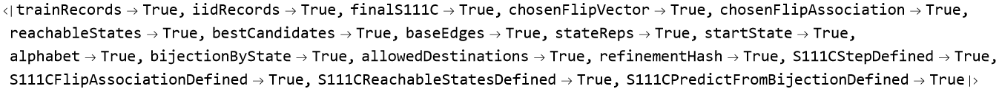

In [3799]:
<|
  "trainRecords" -> ValueQ[trainRecords],
  "iidRecords" -> ValueQ[iidRecords],
  "finalS111C" -> ValueQ[finalS111C],
  "chosenFlipVector" -> ValueQ[chosenFlipVectorS111C],
  "chosenFlipAssociation" -> ValueQ[chosenFlipAssociationS111C],
  "reachableStates" -> ValueQ[reachableStatesS111C],
  "bestCandidates" -> ValueQ[bestAmbiguityCandidatesS111C],
  "baseEdges" -> ValueQ[baseEdgesS111C],
  "stateReps" -> ValueQ[stateRepsS111AR2F],
  "startState" -> ValueQ[startStateS111AR2F],
  "alphabet" -> ValueQ[alphabetS111AR2F],
  "bijectionByState" -> ValueQ[bijectionByStateS111C],
  "allowedDestinations" -> ValueQ[allowedDestinationsS111C],
  "refinementHash" -> ValueQ[refinementHashS111C],

  "S111CStepDefined" ->
    Length[DownValues[S111CStep]] > 0,

  "S111CFlipAssociationDefined" ->
    Length[DownValues[S111CFlipAssociation]] > 0,

  "S111CReachableStatesDefined" ->
    Length[DownValues[S111CReachableStates]] > 0,

  "S111CPredictFromBijectionDefined" ->
    Length[DownValues[S111CPredictFromBijection]] > 0
|>

In [3845]:
(* ============================================================ *)
(* S112A                                                        *)
(* RESIDUAL-BEHAVIOR DISCRETE STATE INDUCTION                   *)
(*                                                              *)
(* PURPOSE                                                      *)
(* ------------------------------------------------------------ *)
(* Re-induce computational states from TRAIN, but state merging *)
(* now respects FUTURE distinguishability.                      *)
(*                                                              *)
(* Two prefixes cannot merge if:                                *)
(*                                                              *)
(* 1. their TRAIN-derived query semantics are incompatible, OR  *)
(* 2. after some common future token/suffix their successors    *)
(*    become incompatible.                                      *)
(*                                                              *)
(* This is a finite-data residual / Myhill-Nerode style audit.  *)
(*                                                              *)
(* IMPORTANT                                                    *)
(* ------------------------------------------------------------ *)
(* - TRAIN ONLY for induction                                   *)
(* - NO true S3 state                                           *)
(* - NO reference executor                                      *)
(* - NO neural network                                          *)
(* - NO continuous latent                                       *)
(* - NO S111C one-bit assumption                                *)
(* - NO IID DEV selection                                       *)
(* - NO OOD                                                     *)
(*                                                              *)
(* IID DEV is accessed ONLY after machine freeze.               *)
(* ============================================================ *)


ClearAll["Global`S112A*"];
ClearAll["Global`s112A*"];


s112AResult =
Catch[

(

(* ============================================================ *)
(* 0. FAIL SAFE                                                 *)
(* ============================================================ *)

S112AFail[msg_] := (
  Print["STOP: ", msg];
  Throw[$Failed, "S112A_STOP"];
);


Print["================================================"];
Print["S112A RESIDUAL-BEHAVIOR STATE INDUCTION"];
Print["================================================"];


(* ============================================================ *)
(* 1. PREFLIGHT                                                 *)
(* ============================================================ *)

If[
  !And[
    ValueQ[trainRecords],
    ValueQ[iidRecords]
  ],

  S112AFail[
    "trainRecords / iidRecords missing."
  ]
];


requiredFieldsS112A = {
  "Seq",
  "Start",
  "Target",
  "Y",
  "PairID",
  "Depth"
};


trainFieldAuditS112A =
  And @@
    Table[
      And @@
        (
          KeyExistsQ[r, #] & /@
            requiredFieldsS112A
        ),
      {r, trainRecords}
    ];


If[
  !TrueQ[trainFieldAuditS112A],

  S112AFail[
    "TRAIN records are missing required fields."
  ]
];


Print["Preflight = PASS"];

Print[
  "TRAIN records = ",
  Length[trainRecords]
];

Print["INDUCTION USES TRAIN ONLY."];
Print["NO TRUE S3."];
Print["NO REFERENCE EXECUTOR."];
Print["NO S111C ONE-BIT ASSUMPTION."];
Print["IID DEV WILL BE ACCESSED ONLY AFTER FREEZE."];
Print["OOD WILL NOT BE ACCESSED."];


(* ============================================================ *)
(* 2. ALPHABET                                                  *)
(* ============================================================ *)

alphabetS112A =
  Sort[
    DeleteDuplicates[
      Flatten[
        (#["Seq"] &) /@
          trainRecords
      ]
    ]
  ];


Print[
  "Primitive alphabet = ",
  alphabetS112A
];


If[
  alphabetS112A =!= {0, 1},

  S112AFail[
    "Expected primitive alphabet {0,1}."
  ]
];


(* ============================================================ *)
(* 3. QUERY SYMBOL DOMAIN                                       *)
(*                                                              *)
(* TRAIN ONLY.                                                  *)
(* ============================================================ *)

S112AAtomKey[x_] :=
  ToString[
    InputForm[x]
  ];


querySymbolsS112A =
  SortBy[
    DeleteDuplicates[
      Join[
        (#["Start"] &) /@
          trainRecords,

        (#["Target"] &) /@
          trainRecords
      ]
    ],
    S112AAtomKey
  ];


Print[
  "TRAIN query symbols = ",
  querySymbolsS112A
];


If[
  Length[querySymbolsS112A] =!= 3,

  S112AFail[
    "Expected exactly three query symbols."
  ]
];


queryIndexMapS112A =
  AssociationThread[
    S112AAtomKey /@
      querySymbolsS112A,
    Range[3]
  ];


S112AQueryIndex[x_] :=
  Lookup[
    queryIndexMapS112A,
    S112AAtomKey[x],
    Missing["UnknownQuerySymbol"]
  ];


(* ============================================================ *)
(* 4. BIJECTION SEMANTIC UNIVERSE                               *)
(*                                                              *)
(* This is TASK-LEVEL structure only.                           *)
(* It does NOT use true S3 states.                              *)
(*                                                              *)
(* A candidate state semantics is one of the 3! = 6 possible   *)
(* bijections over the observed query symbols.                  *)
(* ============================================================ *)

semanticUniverseS112A =
  Permutations[
    querySymbolsS112A
  ];


Print[
  "Possible TRAIN-level bijection semantics = ",
  Length[semanticUniverseS112A]
];


S112APermPredict[
  perm_List,
  start_,
  target_
] :=
Module[
  {
    i
  },

  i =
    S112AQueryIndex[start];


  If[
    MissingQ[i],

    Return[
      Missing["UnknownStart"]
    ]
  ];


  Boole[
    perm[[i]] === target
  ]
];


(* ============================================================ *)
(* 5. EXACT TRAIN INPUT CONSISTENCY                             *)
(* ============================================================ *)

exactGroupsS112A =
  GroupBy[
    trainRecords,

    ToString[
      InputForm[
        {
          #["Seq"],
          #["Start"],
          #["Target"]
        }
      ]
    ] &,

    DeleteDuplicates[
      (#["Y"] &) /@ #
    ] &
  ];


exactConflictsS112A =
  Select[
    exactGroupsS112A,
    Length[#] > 1 &
  ];


Print[
  "Exact TRAIN input conflicts = ",
  Length[exactConflictsS112A]
];


If[
  Length[exactConflictsS112A] > 0,

  S112AFail[
    "Identical TRAIN input has conflicting Y."
  ]
];


(* ============================================================ *)
(* 6. PREFIX TREE                                               *)
(* ============================================================ *)

S112APrefixes[
  seq_List
] :=
  Table[
    Take[seq, k],
    {k, 0, Length[seq]}
  ];


allPrefixesS112A =
  DeleteDuplicates[
    Flatten[
      (
        S112APrefixes[
          #["Seq"]
        ] &
      ) /@
        trainRecords,
      1
    ]
  ];


allPrefixesS112A =
  SortBy[
    allPrefixesS112A,
    {
      Length[#],
      #
    } &
  ];


nPTAStatesS112A =
  Length[
    allPrefixesS112A
  ];


Print[
  "TRAIN PTA states = ",
  nPTAStatesS112A
];


S112APrefixKey[
  prefix_List
] :=
  ToString[
    InputForm[prefix]
  ];


prefixIDByKeyS112A =
  AssociationThread[
    S112APrefixKey /@
      allPrefixesS112A,
    Range[nPTAStatesS112A]
  ];


prefixByIDS112A =
  AssociationThread[
    Range[nPTAStatesS112A],
    allPrefixesS112A
  ];


S112APrefixID[
  prefix_List
] :=
  Lookup[
    prefixIDByKeyS112A,
    S112APrefixKey[prefix],
    Missing["UnknownPrefix"]
  ];


rootIDS112A =
  S112APrefixID[
    {}
  ];


If[
  !IntegerQ[rootIDS112A],

  S112AFail[
    "Root PTA state missing."
  ]
];


(* ============================================================ *)
(* 7. PTA TRANSITIONS                                           *)
(* ============================================================ *)

S112ATransKey[
  id_Integer,
  token_Integer
] :=
  ToString[
    InputForm[
      {id, token}
    ]
  ];


ptaTransitionRowsS112A =
  Flatten[
    Table[

      Module[
        {
          seq
        },

        seq = r["Seq"];


        Table[

          <|

            "SourceID" ->
              S112APrefixID[
                Take[seq, k]
              ],

            "Token" ->
              seq[[k + 1]],

            "DestID" ->
              S112APrefixID[
                Take[seq, k + 1]
              ]

          |>,

          {
            k,
            0,
            Length[seq] - 1
          }
        ]

      ],

      {
        r,
        trainRecords
      }
    ],
    1
  ];


ptaTransitionGroupsS112A =
  GroupBy[
    ptaTransitionRowsS112A,

    S112ATransKey[
      #["SourceID"],
      #["Token"]
    ] &,

    DeleteDuplicates[
      (#["DestID"] &) /@ #
    ] &
  ];


ptaTransitionConflictsS112A =
  Select[
    ptaTransitionGroupsS112A,
    Length[#] > 1 &
  ];


Print[
  "PTA transition conflicts = ",
  Length[ptaTransitionConflictsS112A]
];


If[
  Length[ptaTransitionConflictsS112A] > 0,

  S112AFail[
    "PTA transition relation is not deterministic."
  ]
];


ptaTransitionS112A =
  Association[
    KeyValueMap[
      (#1 -> First[#2]) &,
      ptaTransitionGroupsS112A
    ]
  ];


(* ============================================================ *)
(* 8. TERMINAL OBSERVATIONS                                     *)
(* ============================================================ *)

terminalObsRowsS112A =
  Table[

    <|

      "StateID" ->
        S112APrefixID[
          r["Seq"]
        ],

      "Start" ->
        r["Start"],

      "Target" ->
        r["Target"],

      "Y" ->
        r["Y"]

    |>,

    {
      r,
      trainRecords
    }
  ];


terminalObsByStateS112A =
  GroupBy[
    terminalObsRowsS112A,
    #["StateID"] &
  ];


(* ============================================================ *)
(* 9. TRAIN-DERIVED SEMANTIC CANDIDATES PER PTA STATE           *)
(*                                                              *)
(* For every PTA state, enumerate which of the six bijections   *)
(* are still compatible with ALL TRAIN observations terminating *)
(* in that prefix.                                               *)
(*                                                              *)
(* No terminal observation -> all six remain possible.          *)
(* ============================================================ *)

S112APermConsistentWithObsQ[
  perm_List,
  observations_List
] :=
  And @@
    Table[

      S112APermPredict[
        perm,
        obs["Start"],
        obs["Target"]
      ] ===
        obs["Y"],

      {
        obs,
        observations
      }
    ];


S112AStateSemanticCandidates[
  id_Integer
] :=
Module[
  {
    observations
  },

  observations =
    Lookup[
      terminalObsByStateS112A,
      id,
      {}
    ];


  If[
    Length[observations] == 0,

    semanticUniverseS112A,

    Select[
      semanticUniverseS112A,

      S112APermConsistentWithObsQ[
        #,
        observations
      ] &
    ]
  ]
];


ptaSemanticCandidatesS112A =
  Association[
    Table[
      id ->
        S112AStateSemanticCandidates[id],
      {
        id,
        Range[nPTAStatesS112A]
      }
    ]
  ];


emptySemanticStatesS112A =
  Select[
    Range[nPTAStatesS112A],

    Length[
      Lookup[
        ptaSemanticCandidatesS112A,
        #
      ]
    ] == 0 &
  ];


Print[
  "PTA states with impossible TRAIN semantics = ",
  Length[emptySemanticStatesS112A]
];


If[
  Length[emptySemanticStatesS112A] > 0,

  S112AFail[
    "At least one PTA state has no TRAIN-consistent bijection."
  ]
];


semanticCandidateHistogramS112A =
  Counts[
    Length /@
      Values[
        ptaSemanticCandidatesS112A
      ]
  ];


Print[
  "PTA semantic-candidate-count histogram = ",
  semanticCandidateHistogramS112A
];


(* ============================================================ *)
(* 10. BLOCK SEMANTIC INTERSECTION                              *)
(* ============================================================ *)

S112ABlockSemanticCandidates[
  block_List
] :=
Module[
  {
    candidateLists
  },

  candidateLists =
    Lookup[
      ptaSemanticCandidatesS112A,
      block
    ];


  If[
    Length[candidateLists] == 0,

    {},

    Fold[
      Intersection,
      First[candidateLists],
      Rest[candidateLists]
    ]
  ]
];


S112ABlockSemanticConflictQ[
  block_List
] :=
  Length[
    S112ABlockSemanticCandidates[
      block
    ]
  ] == 0;


(* ============================================================ *)
(* 11. FUTURE-INCOMPATIBILITY RELATION                          *)
(*                                                              *)
(* Initial incompatibility:                                     *)
(* semantic candidate sets are disjoint.                        *)
(*                                                              *)
(* Propagation:                                                 *)
(* if delta(a,x) and delta(b,x) are incompatible, then a,b are  *)
(* incompatible too.                                            *)
(*                                                              *)
(* Thus one observed future suffix is sufficient to distinguish *)
(* two prefix states.                                           *)
(* ============================================================ *)

S112APairKey[
  a_Integer,
  b_Integer
] :=
  ToString[
    InputForm[
      Sort[
        {a, b}
      ]
    ]
  ];


incompatiblePairsS112A =
  <||>;


S112AIncompatibleQ[
  a_Integer,
  b_Integer
] :=
  If[
    a === b,

    False,

    TrueQ[
      Lookup[
        incompatiblePairsS112A,
        S112APairKey[a, b],
        False
      ]
    ]
  ];


initialIncompatibleCountS112A =
  0;


Do[

  If[
    Length[
      Intersection[
        Lookup[
          ptaSemanticCandidatesS112A,
          a
        ],

        Lookup[
          ptaSemanticCandidatesS112A,
          b
        ]
      ]
    ] == 0,

    AssociateTo[
      incompatiblePairsS112A,
      S112APairKey[a, b] -> True
    ];

    initialIncompatibleCountS112A++;
  ],

  {
    a,
    1,
    nPTAStatesS112A - 1
  },

  {
    b,
    a + 1,
    nPTAStatesS112A
  }
];


Print[
  "Initial semantic-incompatible PTA pairs = ",
  initialIncompatibleCountS112A
];


(* ------------------------------------------------------------ *)
(* Fixed-point backward propagation                             *)
(* ------------------------------------------------------------ *)

futurePropagationRoundsS112A =
  0;


While[
  True,

  Module[
    {
      newlyMarked,
      succA,
      succB
    },

    newlyMarked = {};


    Do[

      If[
        !S112AIncompatibleQ[a, b],

        Do[

          succA =
            Lookup[
              ptaTransitionS112A,
              S112ATransKey[a, token],
              Missing["NoTransition"]
            ];


          succB =
            Lookup[
              ptaTransitionS112A,
              S112ATransKey[b, token],
              Missing["NoTransition"]
            ];


          If[
            And[
              IntegerQ[succA],
              IntegerQ[succB],
              S112AIncompatibleQ[
                succA,
                succB
              ]
            ],

            AppendTo[
              newlyMarked,
              {a, b}
            ];

            Break[];
          ],

          {
            token,
            alphabetS112A
          }
        ]
      ],

      {
        a,
        1,
        nPTAStatesS112A - 1
      },

      {
        b,
        a + 1,
        nPTAStatesS112A
      }
    ];


    newlyMarked =
      DeleteDuplicates[
        newlyMarked
      ];


    If[
      Length[newlyMarked] == 0,
      Break[];
    ];


    futurePropagationRoundsS112A++;


    Do[
      AssociateTo[
        incompatiblePairsS112A,
        S112APairKey[
          pair[[1]],
          pair[[2]]
        ] -> True
      ],
      {
        pair,
        newlyMarked
      }
    ];
  ]
];


futureIncompatiblePairCountS112A =
  Length[
    incompatiblePairsS112A
  ];


Print[
  "Future-distinguishability propagation rounds = ",
  futurePropagationRoundsS112A
];


Print[
  "Total future-incompatible PTA pairs = ",
  futureIncompatiblePairCountS112A
];


Print[
  "New incompatibilities induced by future behavior = ",
  futureIncompatiblePairCountS112A -
    initialIncompatibleCountS112A
];


(* ============================================================ *)
(* 12. BLOCK FUTURE-CONFLICT TEST                               *)
(* ============================================================ *)

S112ABlockFutureConflictQ[
  block_List
] :=
  AnyTrue[
    Subsets[
      block,
      {2}
    ],

    Function[
      pair,
      S112AIncompatibleQ[
        pair[[1]],
        pair[[2]]
      ]
    ]
  ];


S112ABlockConflictQ[
  block_List
] :=
  Or[
    S112ABlockSemanticConflictQ[
      block
    ],

    S112ABlockFutureConflictQ[
      block
    ]
  ];


(* ============================================================ *)
(* 13. PARTITION UTILITIES                                      *)
(* ============================================================ *)

S112ANormalizeBlocks[
  blocks_List
] :=
  SortBy[
    Sort /@
      blocks,
    First
  ];


S112ARepMap[
  blocks_List
] :=
  Association[
    Flatten[
      Table[
        Table[
          id -> Min[block],
          {
            id,
            block
          }
        ],
        {
          block,
          blocks
        }
      ],
      1
    ]
  ];


S112ABlockForRep[
  blocks_List,
  rep_Integer
] :=
  SelectFirst[
    blocks,
    MemberQ[#, rep] &,
    Missing["NoBlock"]
  ];


(* ============================================================ *)
(* 14. OBSERVED DESTINATIONS OF A BLOCK                         *)
(* ============================================================ *)

S112AObservedDestinations[
  block_List,
  token_Integer
] :=
  DeleteDuplicates[
    Cases[
      Table[
        Lookup[
          ptaTransitionS112A,
          S112ATransKey[
            id,
            token
          ],
          Missing["NoTransition"]
        ],
        {
          id,
          block
        }
      ],
      _Integer
    ]
  ];


(* ============================================================ *)
(* 15. RESIDUAL-SAFE MERGE CLOSURE                              *)
(*                                                              *)
(* A proposed merge is rejected if its members are already      *)
(* distinguishable by ANY observed future residual behavior.    *)
(*                                                              *)
(* Transition congruence is enforced recursively.               *)
(* ============================================================ *)

ClearAll[
  S112AMergeClosure
];


S112AMergeClosure[
  initialBlocks_List,
  a0_Integer,
  b0_Integer
] :=
Module[
  {
    blocks,
    queue,

    repMap,

    a,
    b,

    blockA,
    blockB,

    mergedBlock,

    destIDs,
    destReps
  },

  blocks =
    S112ANormalizeBlocks[
      initialBlocks
    ];


  queue = {
    {a0, b0}
  };


  While[
    Length[queue] > 0,


    {a, b} =
      First[queue];


    queue =
      Rest[queue];


    repMap =
      S112ARepMap[
        blocks
      ];


    If[
      !And[
        KeyExistsQ[repMap, a],
        KeyExistsQ[repMap, b]
      ],

      Return[$Failed]
    ];


    a =
      Lookup[
        repMap,
        a
      ];


    b =
      Lookup[
        repMap,
        b
      ];


    If[
      a === b,
      Continue[];
    ];


    blockA =
      S112ABlockForRep[
        blocks,
        a
      ];


    blockB =
      S112ABlockForRep[
        blocks,
        b
      ];


    If[
      Or[
        MissingQ[blockA],
        MissingQ[blockB]
      ],

      Return[$Failed]
    ];


    mergedBlock =
      Union[
        blockA,
        blockB
      ];


    (* -------------------------------------------------------- *)
    (* Core residual-behavior gate                              *)
    (* -------------------------------------------------------- *)

    If[
      S112ABlockConflictQ[
        mergedBlock
      ],

      Return[$Failed]
    ];


    (* -------------------------------------------------------- *)
    (* Perform proposed merge                                   *)
    (* -------------------------------------------------------- *)

    blocks =
      S112ANormalizeBlocks[
        Append[
          Select[
            blocks,
            And[
              # =!= blockA,
              # =!= blockB
            ] &
          ],
          mergedBlock
        ]
      ];


    (* -------------------------------------------------------- *)
    (* Enforce deterministic transition congruence              *)
    (* -------------------------------------------------------- *)

    repMap =
      S112ARepMap[
        blocks
      ];


    Do[

      destIDs =
        S112AObservedDestinations[
          mergedBlock,
          token
        ];


      destReps =
        DeleteDuplicates[
          Lookup[
            repMap,
            destIDs
          ]
        ];


      If[
        Length[destReps] > 1,

        Do[
          AppendTo[
            queue,
            {
              First[destReps],
              destReps[[j]]
            }
          ],
          {
            j,
            2,
            Length[destReps]
          }
        ];
      ],

      {
        token,
        alphabetS112A
      }
    ];

  ];


  S112ANormalizeBlocks[
    blocks
  ]
];


(* ============================================================ *)
(* 16. FIXED MERGE ORDER                                        *)
(*                                                              *)
(* No random seed.                                              *)
(* No Dev selection.                                            *)
(* ============================================================ *)

S112AStateOrderKey[
  id_Integer
] :=
Module[
  {
    prefix
  },

  prefix =
    Lookup[
      prefixByIDS112A,
      id,
      {}
    ];


  {
    Length[prefix],
    prefix
  }
];


S112ASortedReps[
  reps_List
] :=
  SortBy[
    DeleteDuplicates[
      reps
    ],
    S112AStateOrderKey
  ];


(* ============================================================ *)
(* 17. BLUE FRONTIER                                            *)
(* ============================================================ *)

S112ABlueReps[
  blocks_List,
  redReps_List
] :=
Module[
  {
    repMap,

    redCanonical,

    redBlocks,
    redStates,

    destinationIDs,
    blueCanonical
  ],

  repMap =
    S112ARepMap[
      blocks
    ];


  redCanonical =
    DeleteDuplicates[
      Lookup[
        repMap,
        redReps
      ]
    ];


  redBlocks =
    Select[
      blocks,
      MemberQ[
        redCanonical,
        Min[#]
      ] &
    ];


  redStates =
    DeleteDuplicates[
      Flatten[
        redBlocks
      ]
    ];


  destinationIDs =
    DeleteDuplicates[
      Cases[
        Flatten[
          Table[
            Table[
              Lookup[
                ptaTransitionS112A,
                S112ATransKey[
                  id,
                  token
                ],
                Missing["NoTransition"]
              ],
              {
                token,
                alphabetS112A
              }
            ],
            {
              id,
              redStates
            }
          ]
        ],
        _Integer
      ]
    ];


  blueCanonical =
    DeleteDuplicates[
      Lookup[
        repMap,
        destinationIDs
      ]
    ];


  S112ASortedReps[
    Select[
      blueCanonical,
      !MemberQ[
        redCanonical,
        #
      ] &
    ]
  ]
];


(* ============================================================ *)
(* 18. TRAIN-ONLY STATE INDUCTION                               *)
(* ============================================================ *)

ClearAll[
  S112AInduceMachine
];


S112AInduceMachine[] :=
Module[
  {
    blocks,

    redReps,
    blueReps,

    blue,

    repMap,
    redCanonical,

    candidate,

    accepted,

    iterations
  },

  blocks =
    List /@
      Range[
        nPTAStatesS112A
      ];


  redReps = {
    rootIDS112A
  };


  iterations = 0;


  While[
    True,


    iterations++;


    If[
      iterations > 10000,

      S112AFail[
        "Induction iteration guard exceeded."
      ]
    ];


    blueReps =
      S112ABlueReps[
        blocks,
        redReps
      ];


    If[
      Length[blueReps] == 0,
      Break[];
    ];


    blue =
      First[
        blueReps
      ];


    repMap =
      S112ARepMap[
        blocks
      ];


    redCanonical =
      S112ASortedReps[
        DeleteDuplicates[
          Lookup[
            repMap,
            redReps
          ]
        ]
      ];


    accepted =
      False;


    Do[

      candidate =
        S112AMergeClosure[
          blocks,
          red,
          blue
        ];


      If[
        candidate =!= $Failed,

        blocks =
          candidate;


        repMap =
          S112ARepMap[
            blocks
          ];


        redReps =
          DeleteDuplicates[
            Lookup[
              repMap,
              redReps
            ]
          ];


        accepted =
          True;


        Break[];
      ],

      {
        red,
        redCanonical
      }
    ];


    If[
      !accepted,

      repMap =
        S112ARepMap[
          blocks
        ];


      AppendTo[
        redReps,
        Lookup[
          repMap,
          blue
        ]
      ];


      redReps =
        DeleteDuplicates[
          redReps
        ];
    ];

  ];


  <|

    "Blocks" ->
      S112ANormalizeBlocks[
        blocks
      ],

    "Iterations" ->
      iterations

  |>
];


(* ============================================================ *)
(* 19. RUN TRAIN-ONLY INDUCTION                                 *)
(* ============================================================ *)

Print["================================================"];
Print["INDUCING RESIDUAL-BEHAVIOR MACHINE FROM TRAIN ONLY"];
Print["================================================"];


inductionTimingS112A =
  AbsoluteTiming[

    inductionS112A =
      S112AInduceMachine[];

  ];


If[
  inductionS112A === $Failed,

  S112AFail[
    "Residual-behavior induction failed."
  ]
];


blocksS112A =
  inductionS112A[
    "Blocks"
  ];


nDiscreteStatesS112A =
  Length[
    blocksS112A
  ];


stateReuseFractionS112A =
  N[
    1 -
      nDiscreteStatesS112A /
        nPTAStatesS112A
  ];


Print[
  "Induction seconds = ",
  N[
    inductionTimingS112A[[1]]
  ]
];


Print[
  "PTA -> residual states = ",
  nPTAStatesS112A,
  " -> ",
  nDiscreteStatesS112A
];


Print[
  "State reuse fraction = ",
  stateReuseFractionS112A
];


(* ============================================================ *)
(* 20. FINAL BLOCK CONFLICT AUDIT                               *)
(* ============================================================ *)

finalConflictBlocksS112A =
  Select[
    blocksS112A,
    S112ABlockConflictQ
  ];


finalConflictBlockCountS112A =
  Length[
    finalConflictBlocksS112A
  ];


Print[
  "Final residual-conflict blocks = ",
  finalConflictBlockCountS112A
];


If[
  finalConflictBlockCountS112A > 0,

  S112AFail[
    "Final partition violates residual behavior constraints."
  ]
];


(* ============================================================ *)
(* 21. FREEZE PARTITION                                         *)
(* ============================================================ *)

repMapFrozenS112A =
  S112ARepMap[
    blocksS112A
  ];


stateRepsS112A =
  Sort[
    Min /@
      blocksS112A
  ];


startStateS112A =
  Lookup[
    repMapFrozenS112A,
    rootIDS112A,
    Missing["RootMissing"]
  ];


If[
  MissingQ[startStateS112A],

  S112AFail[
    "Frozen root state missing."
  ]
];


(* ============================================================ *)
(* 22. FROZEN TRANSITION TABLE                                  *)
(* ============================================================ *)

transitionRulesS112A =
  Cases[

    Flatten[
      Table[

        Module[
          {
            rep,
            destIDs,
            destReps
          },

          rep =
            Min[block];


          Table[

            destIDs =
              S112AObservedDestinations[
                block,
                token
              ];


            destReps =
              DeleteDuplicates[
                Lookup[
                  repMapFrozenS112A,
                  destIDs
                ]
              ];


            Which[

              Length[destReps] == 0,

                Nothing,


              Length[destReps] == 1,

                S112ATransKey[
                  rep,
                  token
                ] ->
                  First[destReps],


              True,

                S112AFail[
                  "Frozen quotient has transition conflict."
                ]
            ],

            {
              token,
              alphabetS112A
            }
          ]

        ],

        {
          block,
          blocksS112A
        }
      ],
      1
    ],

    _Rule
  ];


transitionByStateS112A =
  Association[
    transitionRulesS112A
  ];


transitionCompletenessS112A =
  N[
    Length[
      transitionByStateS112A
    ] /
      (
        nDiscreteStatesS112A *
        Length[alphabetS112A]
      )
  ];


Print[
  "Frozen transition completeness = ",
  transitionCompletenessS112A
];


(* ============================================================ *)
(* 23. STATE SEMANTICS AFTER MERGING                            *)
(*                                                              *)
(* Intersection of all TRAIN-compatible bijections represented  *)
(* inside each residual state.                                  *)
(* ============================================================ *)

stateSemanticCandidatesS112A =
  Association[
    Table[

      Min[block] ->
        S112ABlockSemanticCandidates[
          block
        ],

      {
        block,
        blocksS112A
      }
    ]
  ];


uniqueSemanticStateCountS112A =
  Count[
    (
      Length[#] == 1 &
    ) /@
      Values[
        stateSemanticCandidatesS112A
      ],
    True
  ];


uniqueSemanticBijectionsS112A =
  DeleteDuplicates[
    Cases[
      Values[
        stateSemanticCandidatesS112A
      ],
      {perm_List} :> perm
    ]
  ];


distinctUniqueSemanticCountS112A =
  Length[
    uniqueSemanticBijectionsS112A
  ];


Print[
  "States with unique TRAIN-derived bijection = ",
  uniqueSemanticStateCountS112A,
  " / ",
  nDiscreteStatesS112A
];


Print[
  "Distinct unique bijections represented = ",
  distinctUniqueSemanticCountS112A
];


(* ============================================================ *)
(* 24. FREEZE CERTIFICATE                                       *)
(* ============================================================ *)

machineHashS112A =
  Hash[
    {
      blocksS112A,
      transitionByStateS112A,
      stateSemanticCandidatesS112A,
      startStateS112A
    },

    "SHA256",
    "HexString"
  ];


Print["================================================"];
Print["S112A MACHINE FROZEN"];
Print[
  "Frozen machine hash = ",
  machineHashS112A
];
Print["IID DEV HAS NOT BEEN USED FOR INDUCTION."];
Print["================================================"];


(* ============================================================ *)
(* 25. EXECUTION                                                *)
(* ============================================================ *)

S112AExecuteState[
  seq_List
] :=
Module[
  {
    q
  },

  q =
    startStateS112A;


  Do[

    q =
      Lookup[
        transitionByStateS112A,

        S112ATransKey[
          q,
          token
        ],

        Missing[
          "UnknownTransition"
        ]
      ];


    If[
      MissingQ[q],
      Return[q];
    ],

    {
      token,
      seq
    }
  ];


  q
];


(* ============================================================ *)
(* 26. SAFE SEMANTIC READOUT                                    *)
(*                                                              *)
(* If multiple candidate bijections remain but they ALL agree   *)
(* on a particular query, prediction is still logically safe.   *)
(* ============================================================ *)

S112ASafePredict[
  seq_List,
  start_,
  target_
] :=
Module[
  {
    q,
    candidates,
    predictions
  },

  q =
    S112AExecuteState[
      seq
    ];


  If[
    MissingQ[q],
    Return[
      Missing["UnknownTransition"]
    ]
  ];


  candidates =
    Lookup[
      stateSemanticCandidatesS112A,
      q,
      {}
    ];


  If[
    Length[candidates] == 0,

    Return[
      Missing["NoSemanticCandidate"]
    ]
  ];


  predictions =
    DeleteDuplicates[
      (
        S112APermPredict[
          #,
          start,
          target
        ] &
      ) /@
        candidates
    ];


  If[
    Length[predictions] == 1,

    First[predictions],

    Missing[
      "AmbiguousReadout"
    ]
  ]
];


(* ============================================================ *)
(* 27. UNIQUE-STATE READOUT                                     *)
(*                                                              *)
(* Stronger criterion: answer only if the entire state's        *)
(* bijection is uniquely identified from TRAIN.                 *)
(* ============================================================ *)

S112AUniquePredict[
  seq_List,
  start_,
  target_
] :=
Module[
  {
    q,
    candidates
  },

  q =
    S112AExecuteState[
      seq
    ];


  If[
    MissingQ[q],

    Return[
      Missing["UnknownTransition"]
    ]
  ];


  candidates =
    Lookup[
      stateSemanticCandidatesS112A,
      q,
      {}
    ];


  If[
    Length[candidates] =!= 1,

    Return[
      Missing[
        "NonUniqueStateSemantics"
      ]
    ]
  ];


  S112APermPredict[
    First[candidates],
    start,
    target
  ]
];


(* ============================================================ *)
(* 28. EVALUATION ROWS                                          *)
(* ============================================================ *)

S112AEvaluationRows[
  records_List,
  split_String,
  mode_String
] :=
  Table[

    Module[
      {
        q,
        prediction
      },

      q =
        S112AExecuteState[
          r["Seq"]
        ];


      prediction =
        Switch[

          mode,

          "Safe",

            S112ASafePredict[
              r["Seq"],
              r["Start"],
              r["Target"]
            ],


          "Unique",

            S112AUniquePredict[
              r["Seq"],
              r["Start"],
              r["Target"]
            ],


          _,

            Missing[
              "UnknownMode"
            ]
        ];


      <|

        "Split" ->
          split,

        "PairID" ->
          r["PairID"],

        "Depth" ->
          r["Depth"],

        "FinalState" ->
          q,

        "Y" ->
          r["Y"],

        "Prediction" ->
          prediction,

        "TransitionCovered" ->
          !MissingQ[q],

        "ReadoutCovered" ->
          IntegerQ[prediction],

        "Correct" ->
          And[
            IntegerQ[prediction],
            prediction === r["Y"]
          ]

      |>

    ],

    {
      r,
      records
    }
  ];


(* ============================================================ *)
(* 29. SUMMARY                                                  *)
(* ============================================================ *)

S112ASummarize[
  rows_List
] :=
Module[
  {
    covered
  },

  covered =
    Select[
      rows,
      TrueQ[
        #["ReadoutCovered"]
      ] &
    ];


  <|

    "Records" ->
      Length[rows],

    "TransitionCoverage" ->
      N[
        Count[
          (
            TrueQ[
              #["TransitionCovered"]
            ] &
          ) /@
            rows,
          True
        ] /
          Length[rows]
      ],

    "ReadoutCoverage" ->
      N[
        Length[covered] /
          Length[rows]
      ],

    "OverallAccuracyUnknownWrong" ->
      N[
        Mean[
          (
            Boole[
              TrueQ[
                #["Correct"]
              ]
            ] &
          ) /@
            rows
        ]
      ],

    "AccuracyOnCovered" ->
      If[
        Length[covered] == 0,

        Missing["NoCoveredRows"],

        N[
          Mean[
            (
              Boole[
                TrueQ[
                  #["Correct"]
                ]
              ] &
            ) /@
              covered
          ]
        ]
      ]

  |>
];


(* ============================================================ *)
(* 30. STRICT PAIR ACCURACY                                     *)
(* ============================================================ *)

S112APairValidQ[
  group_List
] :=
  And[
    Length[group] == 2,
    Sort[
      (#["Y"] &) /@
        group
    ] === {0, 1}
  ];


S112AStrictPairAccuracy[
  rows_List
] :=
Module[
  {
    groups,
    scores
  },

  groups =
    Values[
      GroupBy[
        rows,
        #["PairID"] &
      ]
    ];


  scores =
    Table[

      If[
        !S112APairValidQ[group],

        0.,

        Boole[
          And @@
            (
              TrueQ[
                #["Correct"]
              ] &
            ) /@
              group
        ]
      ],

      {
        group,
        groups
      }
    ];


  N[
    Mean[scores]
  ]
];


(* ============================================================ *)
(* 31. TRAIN CHECK BEFORE DEV                                   *)
(* ============================================================ *)

trainSafeRowsS112A =
  S112AEvaluationRows[
    trainRecords,
    "Train",
    "Safe"
  ];


trainSafeSummaryS112A =
  S112ASummarize[
    trainSafeRowsS112A
  ];


trainSafePairS112A =
  S112AStrictPairAccuracy[
    trainSafeRowsS112A
  ];


trainUniqueRowsS112A =
  S112AEvaluationRows[
    trainRecords,
    "Train",
    "Unique"
  ];


trainUniqueSummaryS112A =
  S112ASummarize[
    trainUniqueRowsS112A
  ];


trainUniquePairS112A =
  S112AStrictPairAccuracy[
    trainUniqueRowsS112A
  ];


Print[
  "TRAIN Safe coverage = ",
  trainSafeSummaryS112A[
    "ReadoutCoverage"
  ]
];


Print[
  "TRAIN Safe accuracy = ",
  trainSafeSummaryS112A[
    "OverallAccuracyUnknownWrong"
  ]
];


Print[
  "TRAIN Unique coverage = ",
  trainUniqueSummaryS112A[
    "ReadoutCoverage"
  ]
];


Print[
  "TRAIN Unique accuracy = ",
  trainUniqueSummaryS112A[
    "OverallAccuracyUnknownWrong"
  ]
];


trainFreezeGateS112A =
  And[
    trainSafeSummaryS112A[
      "TransitionCoverage"
    ] == 1.,

    trainSafeSummaryS112A[
      "ReadoutCoverage"
    ] == 1.,

    trainSafeSummaryS112A[
      "OverallAccuracyUnknownWrong"
    ] == 1.,

    trainSafePairS112A == 1.,

    finalConflictBlockCountS112A == 0
  ];


Print[
  "TRAIN residual-machine freeze gate = ",
  trainFreezeGateS112A
];


If[
  !TrueQ[trainFreezeGateS112A],

  S112AFail[
    "Residual machine does not exactly reproduce TRAIN."
  ]
];


(* ============================================================ *)
(* 32. ONLY NOW ACCESS IID DEV                                  *)
(* ============================================================ *)

Print["================================================"];
Print["TRAIN FREEZE = PASS"];
Print["NOW ACCESSING IID DEV"];
Print["================================================"];


devSymbolsS112A =
  DeleteDuplicates[
    Join[
      (#["Start"] &) /@
        iidRecords,
      (#["Target"] &) /@
        iidRecords
    ]
  ];


devQuerySymbolAuditS112A =
  Complement[
    devSymbolsS112A,
    querySymbolsS112A
  ] === {};


Print[
  "IID DEV query-symbol audit = ",
  devQuerySymbolAuditS112A
];


devSafeRowsS112A =
  S112AEvaluationRows[
    iidRecords,
    "Dev",
    "Safe"
  ];


devSafeSummaryS112A =
  S112ASummarize[
    devSafeRowsS112A
  ];


devSafePairS112A =
  S112AStrictPairAccuracy[
    devSafeRowsS112A
  ];


devUniqueRowsS112A =
  S112AEvaluationRows[
    iidRecords,
    "Dev",
    "Unique"
  ];


devUniqueSummaryS112A =
  S112ASummarize[
    devUniqueRowsS112A
  ];


devUniquePairS112A =
  S112AStrictPairAccuracy[
    devUniqueRowsS112A
  ];


(* ============================================================ *)
(* 33. PER-DEPTH DEV                                            *)
(* ============================================================ *)

devDepthsS112A =
  Sort[
    DeleteDuplicates[
      (#["Depth"] &) /@
        iidRecords
    ]
  ];


devPerDepthS112A =
  Table[

    Module[
      {
        safeRows,
        safeSummary,

        uniqueRows,
        uniqueSummary
      },

      safeRows =
        Select[
          devSafeRowsS112A,
          #["Depth"] === depth &
        ];


      safeSummary =
        S112ASummarize[
          safeRows
        ];


      uniqueRows =
        Select[
          devUniqueRowsS112A,
          #["Depth"] === depth &
        ];


      uniqueSummary =
        S112ASummarize[
          uniqueRows
        ];


      <|

        "Depth" ->
          depth,

        "Records" ->
          Length[safeRows],

        "SafeTransitionCoverage" ->
          safeSummary[
            "TransitionCoverage"
          ],

        "SafeReadoutCoverage" ->
          safeSummary[
            "ReadoutCoverage"
          ],

        "SafeAccuracy" ->
          safeSummary[
            "OverallAccuracyUnknownWrong"
          ],

        "SafeStrictPair" ->
          S112AStrictPairAccuracy[
            safeRows
          ],

        "UniqueReadoutCoverage" ->
          uniqueSummary[
            "ReadoutCoverage"
          ],

        "UniqueAccuracy" ->
          uniqueSummary[
            "OverallAccuracyUnknownWrong"
          ],

        "UniqueStrictPair" ->
          S112AStrictPairAccuracy[
            uniqueRows
          ]

      |>

    ],

    {
      depth,
      devDepthsS112A
    }
  ];


(* ============================================================ *)
(* 34. STATE TABLE                                              *)
(* ============================================================ *)

stateTableS112A =
  Table[

    Module[
      {
        rep,
        candidates,

        on0,
        on1,

        members,
        shortestPrefix
      },

      rep =
        Min[block];


      candidates =
        Lookup[
          stateSemanticCandidatesS112A,
          rep,
          {}
        ];


      on0 =
        Lookup[
          transitionByStateS112A,
          S112ATransKey[
            rep,
            0
          ],
          Missing["Unobserved"]
        ];


      on1 =
        Lookup[
          transitionByStateS112A,
          S112ATransKey[
            rep,
            1
          ],
          Missing["Unobserved"]
        ];


      members =
        Lookup[
          prefixByIDS112A,
          block
        ];


      shortestPrefix =
        First[
          SortBy[
            members,
            {
              Length[#],
              #
            } &
          ]
        ];


      <|

        "ResidualState" ->
          rep,

        "PTAMembers" ->
          Length[block],

        "ShortestRepresentativePrefix" ->
          shortestPrefix,

        "On0" ->
          on0,

        "On1" ->
          on1,

        "SemanticCandidateCount" ->
          Length[candidates],

        "UniqueBijection" ->
          (
            Length[candidates] == 1
          ),

        "Bijection" ->
          If[
            Length[candidates] == 1,
            First[candidates],
            Missing["NotUnique"]
          ]

      |>

    ],

    {
      block,
      blocksS112A
    }
  ];


(* ============================================================ *)
(* 35. DIAGNOSIS                                                *)
(* ============================================================ *)

sixStateSignalS112A =
  nDiscreteStatesS112A == 6;


sixDistinctSemanticSignalS112A =
  And[
    uniqueSemanticStateCountS112A == 6,
    distinctUniqueSemanticCountS112A == 6
  ];


devUniqueExactS112A =
  And[
    devUniqueSummaryS112A[
      "TransitionCoverage"
    ] == 1.,

    devUniqueSummaryS112A[
      "ReadoutCoverage"
    ] == 1.,

    devUniqueSummaryS112A[
      "OverallAccuracyUnknownWrong"
    ] == 1.,

    devUniquePairS112A == 1.
  ];


residualInductionStrongS112A =
  And[
    trainFreezeGateS112A,
    sixStateSignalS112A,
    sixDistinctSemanticSignalS112A,
    devUniqueExactS112A
  ];


diagnosisS112A =
  Which[

    residualInductionStrongS112A,

      "RESIDUAL_BEHAVIOR_INDUCTION_DISCOVERS_SIX_DISTINCT_DISCRETE_STATES_AND_GENERALIZES_EXACTLY",


    trainFreezeGateS112A &&
    sixStateSignalS112A &&
    !sixDistinctSemanticSignalS112A,

      "SIX_RESIDUAL_STATES_FOUND_BUT_TRAIN_DOES_NOT_YET_UNIQUELY_IDENTIFY_ALL_SIX_BEHAVIORS",


    trainFreezeGateS112A &&
    nDiscreteStatesS112A > 6,

      "RESIDUAL_CONSTRAINTS_PREVENT_OVERMERGING_BUT_CURRENT_TRAIN_DATA_LEAVES_EXTRA_STATE_FRAGMENTATION",


    trainFreezeGateS112A &&
    nDiscreteStatesS112A < 6,

      "RESIDUAL_CONSTRAINTS_STILL_ALLOW_OVERMERGING_UNDER_CURRENT_TRAIN_COVERAGE",


    trainFreezeGateS112A &&
    !devUniqueExactS112A,

      "RESIDUAL_MACHINE_FITS_TRAIN_BUT_DOES_NOT_YET_GIVE_COMPLETE_EXACT_IID_STATE_SEMANTICS",


    True,

      "RESIDUAL_STATE_INDUCTION_FAILED"

  ];


(* ============================================================ *)
(* 36. FINAL REPORT                                             *)
(* ============================================================ *)

finalS112A =
  <|

    "Stage" ->
      "S112A_ResidualBehaviorDiscreteStateInduction",

    "ArchitectureDevelopment" ->
      True,

    "TrainOnlyInduction" ->
      True,

    "TrueS3Used" ->
      False,

    "ReferenceExecutorUsed" ->
      False,

    "NeuralNetworkUsed" ->
      False,

    "ContinuousLatentUsed" ->
      False,

    "S111COneBitAssumptionUsed" ->
      False,

    "IIDDevUsedForSelection" ->
      False,

    "IIDDevAccessedAfterFreeze" ->
      True,

    "OODAccessed" ->
      False,

    "PTAStates" ->
      nPTAStatesS112A,

    "InitialSemanticIncompatiblePairs" ->
      initialIncompatibleCountS112A,

    "FutureIncompatiblePairs" ->
      futureIncompatiblePairCountS112A,

    "FuturePropagationRounds" ->
      futurePropagationRoundsS112A,

    "ResidualStates" ->
      nDiscreteStatesS112A,

    "StateReuseFraction" ->
      stateReuseFractionS112A,

    "TransitionCompleteness" ->
      transitionCompletenessS112A,

    "ResidualConflictBlocks" ->
      finalConflictBlockCountS112A,

    "UniqueSemanticStates" ->
      uniqueSemanticStateCountS112A,

    "DistinctUniqueBijections" ->
      distinctUniqueSemanticCountS112A,

    "TrainSafe" ->
      Join[
        trainSafeSummaryS112A,
        <|
          "StrictPairAccuracy" ->
            trainSafePairS112A
        |>
      ],

    "TrainUnique" ->
      Join[
        trainUniqueSummaryS112A,
        <|
          "StrictPairAccuracy" ->
            trainUniquePairS112A
        |>
      ],

    "IIDDevSafe" ->
      Join[
        devSafeSummaryS112A,
        <|
          "StrictPairAccuracy" ->
            devSafePairS112A
        |>
      ],

    "IIDDevUnique" ->
      Join[
        devUniqueSummaryS112A,
        <|
          "StrictPairAccuracy" ->
            devUniquePairS112A
        |>
      ],

    "TrainFreezeGate" ->
      trainFreezeGateS112A,

    "SixStateSignal" ->
      sixStateSignalS112A,

    "SixDistinctSemanticSignal" ->
      sixDistinctSemanticSignalS112A,

    "DevUniqueExact" ->
      devUniqueExactS112A,

    "ResidualInductionStrong" ->
      residualInductionStrongS112A,

    "Diagnosis" ->
      diagnosisS112A,

    "FrozenMachineHash" ->
      machineHashS112A

  |>;


Print["================================================"];
Print["S112A COMPLETE"];

Print[
  "PTA -> residual states = ",
  nPTAStatesS112A,
  " -> ",
  nDiscreteStatesS112A
];

Print[
  "Initial incompatible pairs = ",
  initialIncompatibleCountS112A
];

Print[
  "Future incompatible pairs = ",
  futureIncompatiblePairCountS112A
];

Print[
  "Future propagation rounds = ",
  futurePropagationRoundsS112A
];

Print[
  "Transition completeness = ",
  transitionCompletenessS112A
];

Print[
  "Unique semantic states = ",
  uniqueSemanticStateCountS112A,
  " / ",
  nDiscreteStatesS112A
];

Print[
  "Distinct unique bijections = ",
  distinctUniqueSemanticCountS112A
];

Print[
  "IID DEV Safe coverage = ",
  devSafeSummaryS112A[
    "ReadoutCoverage"
  ]
];

Print[
  "IID DEV Safe accuracy = ",
  devSafeSummaryS112A[
    "OverallAccuracyUnknownWrong"
  ]
];

Print[
  "IID DEV Unique coverage = ",
  devUniqueSummaryS112A[
    "ReadoutCoverage"
  ]
];

Print[
  "IID DEV Unique accuracy = ",
  devUniqueSummaryS112A[
    "OverallAccuracyUnknownWrong"
  ]
];

Print[
  "IID DEV Unique strict pair = ",
  devUniquePairS112A
];

Print[
  "Diagnosis = ",
  diagnosisS112A
];

Print["================================================"];


finalS112A

),

"S112A_STOP"
];

ToExpression::sntx: Invalid syntax in or before "                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                    ^".


$Failed

In [3881]:
(* ============================================================ *)
(* S112A-R2                                                     *)
(* RESIDUAL / FUTURE-DISTINGUISHABILITY STATE INDUCTION         *)
(* ============================================================ *)

ClearAll["Global`S112R2*"];
ClearAll["Global`s112R2*"];

Print["================================================"];
Print["S112A-R2 RESIDUAL-BEHAVIOR STATE INDUCTION"];
Print["================================================"];

(* ------------------------------------------------------------ *)
(* 1. PREFLIGHT                                                 *)
(* ------------------------------------------------------------ *)

If[
  !And[ValueQ[trainRecords], ValueQ[iidRecords]],
  Print["STOP: trainRecords or iidRecords missing."];
  Abort[]
];

requiredFieldsS112R2 = {
  "Seq", "Start", "Target", "Y", "PairID", "Depth"
};

fieldAuditS112R2 =
  And @@ Flatten[
    Table[
      KeyExistsQ[r, f],
      {r, trainRecords},
      {f, requiredFieldsS112R2}
    ]
  ];

If[
  !TrueQ[fieldAuditS112R2],
  Print["STOP: required TRAIN fields missing."];
  Abort[]
];

Print["Preflight = PASS"];
Print["TRAIN records = ", Length[trainRecords]];
Print["IID DEV records = ", Length[iidRecords]];
Print["TRAIN ONLY is used for state induction."];
Print["NO TRUE S3."];
Print["NO REFERENCE EXECUTOR."];
Print["NO S111C ONE-BIT ASSUMPTION."];
Print["NO OOD."];


(* ------------------------------------------------------------ *)
(* 2. ALPHABET / QUERY DOMAIN                                   *)
(* ------------------------------------------------------------ *)

alphabetS112R2 =
  Sort @ DeleteDuplicates @ Flatten[
    (#["Seq"] &) /@ trainRecords
  ];

If[
  alphabetS112R2 =!= {0, 1},
  Print["STOP: expected alphabet {0,1}."];
  Abort[]
];

querySymbolsS112R2 =
  Sort @ DeleteDuplicates @ Join[
    (#["Start"] &) /@ trainRecords,
    (#["Target"] &) /@ trainRecords
  ];

If[
  Length[querySymbolsS112R2] =!= 3,
  Print["STOP: expected exactly 3 query symbols."];
  Abort[]
];

queryIndexS112R2 =
  AssociationThread[
    querySymbolsS112R2,
    Range[3]
  ];

semanticUniverseS112R2 =
  Permutations[querySymbolsS112R2];

Print["Alphabet = ", alphabetS112R2];
Print["Query symbols = ", querySymbolsS112R2];
Print["Possible bijection semantics = ", Length[semanticUniverseS112R2]];


S112R2PermPredict[perm_List, start_, target_] :=
 Module[{i},
   i = Lookup[
     queryIndexS112R2,
     start,
     Missing["UnknownStart"]
   ];

   If[
     MissingQ[i],
     Missing["UnknownStart"],
     Boole[perm[[i]] === target]
   ]
 ];


(* ------------------------------------------------------------ *)
(* 3. EXACT TRAIN CONSISTENCY                                   *)
(* ------------------------------------------------------------ *)

exactGroupsS112R2 =
  GroupBy[
    trainRecords,
    ToString[
      InputForm[
        {#["Seq"], #["Start"], #["Target"]}
      ]
    ] &,
    DeleteDuplicates[(#["Y"] &) /@ #] &
  ];

exactConflictsS112R2 =
  Select[
    exactGroupsS112R2,
    Length[#] > 1 &
  ];

Print[
  "Exact TRAIN input conflicts = ",
  Length[exactConflictsS112R2]
];

If[
  Length[exactConflictsS112R2] > 0,
  Print["STOP: identical TRAIN input has conflicting Y."];
  Abort[]
];


(* ------------------------------------------------------------ *)
(* 4. PREFIX TREE                                               *)
(* ------------------------------------------------------------ *)

S112R2Prefixes[seq_List] :=
  Table[
    Take[seq, k],
    {k, 0, Length[seq]}
  ];

allPrefixesS112R2 =
  DeleteDuplicates @
    Flatten[
      (S112R2Prefixes[#["Seq"]] &) /@ trainRecords,
      1
    ];

allPrefixesS112R2 =
  SortBy[
    allPrefixesS112R2,
    {Length[#], #} &
  ];

nPTAStatesS112R2 =
  Length[allPrefixesS112R2];

prefixKeyS112R2[p_List] :=
  ToString[InputForm[p]];

prefixIDByKeyS112R2 =
  AssociationThread[
    prefixKeyS112R2 /@ allPrefixesS112R2,
    Range[nPTAStatesS112R2]
  ];

prefixByIDS112R2 =
  AssociationThread[
    Range[nPTAStatesS112R2],
    allPrefixesS112R2
  ];

S112R2PrefixID[p_List] :=
  Lookup[
    prefixIDByKeyS112R2,
    prefixKeyS112R2[p],
    Missing["UnknownPrefix"]
  ];

rootIDS112R2 =
  S112R2PrefixID[{}];

Print["TRAIN PTA states = ", nPTAStatesS112R2];


(* ------------------------------------------------------------ *)
(* 5. PTA TRANSITIONS                                           *)
(* ------------------------------------------------------------ *)

S112R2TransKey[id_Integer, token_Integer] :=
  ToString[
    InputForm[{id, token}]
  ];

ptaTransitionRowsS112R2 =
  Flatten[
    Table[
      With[
        {seq = r["Seq"]},
        Table[
          <|
            "Source" ->
              S112R2PrefixID[Take[seq, k]],

            "Token" ->
              seq[[k + 1]],

            "Destination" ->
              S112R2PrefixID[Take[seq, k + 1]]
          |>,
          {k, 0, Length[seq] - 1}
        ]
      ],
      {r, trainRecords}
    ],
    1
  ];

ptaTransitionGroupsS112R2 =
  GroupBy[
    ptaTransitionRowsS112R2,
    S112R2TransKey[
      #["Source"],
      #["Token"]
    ] &,
    DeleteDuplicates[
      (#["Destination"] &) /@ #
    ] &
  ];

ptaTransitionConflictsS112R2 =
  Select[
    ptaTransitionGroupsS112R2,
    Length[#] > 1 &
  ];

Print[
  "PTA transition conflicts = ",
  Length[ptaTransitionConflictsS112R2]
];

If[
  Length[ptaTransitionConflictsS112R2] > 0,
  Print["STOP: PTA is not deterministic."];
  Abort[]
];

ptaTransitionS112R2 =
  Association[
    KeyValueMap[
      (#1 -> First[#2]) &,
      ptaTransitionGroupsS112R2
    ]
  ];


(* ------------------------------------------------------------ *)
(* 6. TERMINAL OBSERVATIONS                                     *)
(* ------------------------------------------------------------ *)

terminalRowsS112R2 =
  Table[
    <|
      "State" ->
        S112R2PrefixID[r["Seq"]],

      "Start" ->
        r["Start"],

      "Target" ->
        r["Target"],

      "Y" ->
        r["Y"]
    |>,
    {r, trainRecords}
  ];

terminalByStateS112R2 =
  GroupBy[
    terminalRowsS112R2,
    #["State"] &
  ];


S112R2SemanticCandidates[id_Integer] :=
 Module[{obs},

   obs =
     Lookup[
       terminalByStateS112R2,
       id,
       {}
     ];

   If[
     Length[obs] == 0,

     semanticUniverseS112R2,

     Select[
       semanticUniverseS112R2,

       Function[
         perm,
         And @@ Table[
           S112R2PermPredict[
             perm,
             o["Start"],
             o["Target"]
           ] === o["Y"],
           {o, obs}
         ]
       ]
     ]
   ]
 ];


ptaSemanticsS112R2 =
  Association[
    Table[
      id -> S112R2SemanticCandidates[id],
      {id, 1, nPTAStatesS112R2}
    ]
  ];

impossibleSemanticStatesS112R2 =
  Select[
    Range[nPTAStatesS112R2],
    Length[Lookup[ptaSemanticsS112R2, #]] == 0 &
  ];

Print[
  "PTA states with no compatible semantics = ",
  Length[impossibleSemanticStatesS112R2]
];

If[
  Length[impossibleSemanticStatesS112R2] > 0,
  Print["STOP: a PTA state has impossible TRAIN semantics."];
  Abort[]
];

Print[
  "Semantic-candidate histogram = ",
  Counts[Length /@ Values[ptaSemanticsS112R2]]
];


(* ------------------------------------------------------------ *)
(* 7. FUTURE DISTINGUISHABILITY                                 *)
(* ------------------------------------------------------------ *)

S112R2PairKey[a_Integer, b_Integer] :=
  ToString[
    InputForm[Sort[{a, b}]]
  ];

incompatibleS112R2 = <||>;

S112R2IncompatibleQ[a_Integer, b_Integer] :=
  If[
    a === b,
    False,
    TrueQ[
      Lookup[
        incompatibleS112R2,
        S112R2PairKey[a, b],
        False
      ]
    ]
  ];


(* initial incompatibility from disjoint current semantics *)

Do[
  If[
    Length[
      Intersection[
        Lookup[ptaSemanticsS112R2, a],
        Lookup[ptaSemanticsS112R2, b]
      ]
    ] == 0,

    AssociateTo[
      incompatibleS112R2,
      S112R2PairKey[a, b] -> True
    ]
  ],
  {a, 1, nPTAStatesS112R2 - 1},
  {b, a + 1, nPTAStatesS112R2}
];

initialIncompatibleCountS112R2 =
  Length[incompatibleS112R2];

Print[
  "Initial incompatible pairs = ",
  initialIncompatibleCountS112R2
];


(* backward fixed-point propagation *)

futureRoundsS112R2 = 0;

While[
  True,

  newlyMarkedS112R2 = {};

  Do[
    If[
      !S112R2IncompatibleQ[a, b],

      Do[
        sa =
          Lookup[
            ptaTransitionS112R2,
            S112R2TransKey[a, token],
            Missing["NoTransition"]
          ];

        sb =
          Lookup[
            ptaTransitionS112R2,
            S112R2TransKey[b, token],
            Missing["NoTransition"]
          ];

        If[
          IntegerQ[sa] &&
          IntegerQ[sb] &&
          S112R2IncompatibleQ[sa, sb],

          AppendTo[
            newlyMarkedS112R2,
            {a, b}
          ];

          Break[]
        ],
        {token, alphabetS112R2}
      ]
    ],
    {a, 1, nPTAStatesS112R2 - 1},
    {b, a + 1, nPTAStatesS112R2}
  ];

  newlyMarkedS112R2 =
    DeleteDuplicates[newlyMarkedS112R2];

  If[
    Length[newlyMarkedS112R2] == 0,
    Break[]
  ];

  futureRoundsS112R2++;

  Do[
    AssociateTo[
      incompatibleS112R2,
      S112R2PairKey[
        pair[[1]],
        pair[[2]]
      ] -> True
    ],
    {pair, newlyMarkedS112R2}
  ];
];

futureIncompatibleCountS112R2 =
  Length[incompatibleS112R2];

Print[
  "Future propagation rounds = ",
  futureRoundsS112R2
];

Print[
  "Total incompatible pairs after future propagation = ",
  futureIncompatibleCountS112R2
];

Print[
  "New future-induced incompatibilities = ",
  futureIncompatibleCountS112R2 -
    initialIncompatibleCountS112R2
];


(* ------------------------------------------------------------ *)
(* 8. BLOCK UTILITIES                                           *)
(* ------------------------------------------------------------ *)

S112R2BlockSemantics[block_List] :=
 Module[{lists},

   lists =
     Lookup[
       ptaSemanticsS112R2,
       block
     ];

   If[
     Length[lists] == 0,
     {},
     Apply[Intersection, lists]
   ]
 ];


S112R2BlockConflictQ[block_List] :=
 Module[{pairs},

   If[
     Length[S112R2BlockSemantics[block]] == 0,
     Return[True]
   ];

   pairs =
     Subsets[
       block,
       {2}
     ];

   AnyTrue[
     pairs,
     S112R2IncompatibleQ[
       #[[1]],
       #[[2]]
     ] &
   ]
 ];


S112R2NormalizeBlocks[blocks_List] :=
  SortBy[
    Sort /@ blocks,
    First
  ];


S112R2RepMap[blocks_List] :=
  Association[
    Flatten[
      Table[
        Table[
          id -> Min[block],
          {id, block}
        ],
        {block, blocks}
      ],
      1
    ]
  ];


S112R2BlockForRep[blocks_List, rep_Integer] :=
  SelectFirst[
    blocks,
    MemberQ[#, rep] &,
    Missing["NoBlock"]
  ];


S112R2ObservedDestinations[
  block_List,
  token_Integer
] :=
  DeleteDuplicates[
    Cases[
      Table[
        Lookup[
          ptaTransitionS112R2,
          S112R2TransKey[id, token],
          Missing["NoTransition"]
        ],
        {id, block}
      ],
      _Integer
    ]
  ];


(* ------------------------------------------------------------ *)
(* 9. RESIDUAL-SAFE MERGE                                      *)
(* ------------------------------------------------------------ *)

S112R2MergeClosure[
  initialBlocks_List,
  firstRep_Integer,
  secondRep_Integer
] :=
 Module[
   {
     blocks,
     queue,
     repMap,
     a,
     b,
     blockA,
     blockB,
     merged,
     destIDs,
     destReps
   },

   blocks =
     S112R2NormalizeBlocks[
       initialBlocks
     ];

   queue = {
     {firstRep, secondRep}
   };

   While[
     Length[queue] > 0,

     {a, b} =
       First[queue];

     queue =
       Rest[queue];

     repMap =
       S112R2RepMap[blocks];

     If[
       !KeyExistsQ[repMap, a] ||
       !KeyExistsQ[repMap, b],
       Return[$Failed]
     ];

     a =
       Lookup[repMap, a];

     b =
       Lookup[repMap, b];

     If[
       a === b,
       Continue[]
     ];

     blockA =
       S112R2BlockForRep[
         blocks,
         a
       ];

     blockB =
       S112R2BlockForRep[
         blocks,
         b
       ];

     If[
       MissingQ[blockA] ||
       MissingQ[blockB],
       Return[$Failed]
     ];

     merged =
       Union[
         blockA,
         blockB
       ];

     If[
       S112R2BlockConflictQ[merged],
       Return[$Failed]
     ];

     blocks =
       S112R2NormalizeBlocks[
         Append[
           Select[
             blocks,
             # =!= blockA && # =!= blockB &
           ],
           merged
         ]
       ];

     repMap =
       S112R2RepMap[
         blocks
       ];

     Do[
       destIDs =
         S112R2ObservedDestinations[
           merged,
           token
         ];

       destReps =
         DeleteDuplicates[
           Lookup[
             repMap,
             destIDs
           ]
         ];

       If[
         Length[destReps] > 1,

         Do[
           AppendTo[
             queue,
             {
               First[destReps],
               destReps[[j]]
             }
           ],
           {j, 2, Length[destReps]}
         ]
       ],
       {token, alphabetS112R2}
     ];
   ];

   S112R2NormalizeBlocks[
     blocks
   ]
 ];


(* ------------------------------------------------------------ *)
(* 10. FIXED BLUE-FRINGE ORDER                                  *)
(* ------------------------------------------------------------ *)

S112R2StateOrder[id_Integer] :=
 Module[{p},

   p =
     Lookup[
       prefixByIDS112R2,
       id,
       {}
     ];

   {
     Length[p],
     p
   }
 ];


S112R2SortedReps[x_List] :=
  SortBy[
    DeleteDuplicates[x],
    S112R2StateOrder
  ];


S112R2BlueReps[
  blocks_List,
  redReps_List
] :=
 Module[
   {
     repMap,
     redCanonical,
     redBlocks,
     redStates,
     destinations,
     blue
   },

   repMap =
     S112R2RepMap[
       blocks
     ];

   redCanonical =
     DeleteDuplicates[
       Lookup[
         repMap,
         redReps
       ]
     ];

   redBlocks =
     Select[
       blocks,
       MemberQ[
         redCanonical,
         Min[#]
       ] &
     ];

   redStates =
     DeleteDuplicates[
       Flatten[redBlocks]
     ];

   destinations =
     DeleteDuplicates[
       Cases[
         Flatten[
           Table[
             Lookup[
               ptaTransitionS112R2,
               S112R2TransKey[id, token],
               Missing["NoTransition"]
             ],
             {id, redStates},
             {token, alphabetS112R2}
           ]
         ],
         _Integer
       ]
     ];

   blue =
     DeleteDuplicates[
       Lookup[
         repMap,
         destinations
       ]
     ];

   S112R2SortedReps[
     Select[
       blue,
       !MemberQ[
         redCanonical,
         #
       ] &
     ]
   ]
 ];


(* ------------------------------------------------------------ *)
(* 11. INDUCTION                                                *)
(* ------------------------------------------------------------ *)

S112R2Induce[] :=
 Module[
   {
     blocks,
     red,
     blue,
     currentBlue,
     repMap,
     redCanonical,
     proposal,
     mergedQ,
     iterations
   },

   blocks =
     List /@
       Range[nPTAStatesS112R2];

   red = {
     rootIDS112R2
   };

   iterations = 0;

   While[
     True,

     iterations++;

     If[
       iterations > 10000,
       Print["STOP: iteration guard exceeded."];
       Return[$Failed]
     ];

     blue =
       S112R2BlueReps[
         blocks,
         red
       ];

     If[
       Length[blue] == 0,
       Break[]
     ];

     currentBlue =
       First[blue];

     repMap =
       S112R2RepMap[
         blocks
       ];

     redCanonical =
       S112R2SortedReps[
         DeleteDuplicates[
           Lookup[
             repMap,
             red
           ]
         ]
       ];

     mergedQ = False;

     Do[
       proposal =
         S112R2MergeClosure[
           blocks,
           r,
           currentBlue
         ];

       If[
         proposal =!= $Failed,

         blocks =
           proposal;

         repMap =
           S112R2RepMap[
             blocks
           ];

         red =
           DeleteDuplicates[
             Lookup[
               repMap,
               red
             ]
           ];

         mergedQ = True;
         Break[]
       ],
       {r, redCanonical}
     ];

     If[
       !mergedQ,

       repMap =
         S112R2RepMap[
           blocks
         ];

       AppendTo[
         red,
         Lookup[
           repMap,
           currentBlue
         ]
       ];

       red =
         DeleteDuplicates[red]
     ];
   ];

   <|
     "Blocks" ->
       S112R2NormalizeBlocks[blocks],

     "Iterations" ->
       iterations
   |>
 ];


Print["================================================"];
Print["INDUCING TRAIN-ONLY RESIDUAL MACHINE"];
Print["================================================"];

timingS112R2 =
  AbsoluteTiming[
    inductionS112R2 =
      S112R2Induce[];
  ];

If[
  inductionS112R2 === $Failed,
  Print["STOP: induction failed."];
  Abort[]
];

blocksS112R2 =
  inductionS112R2["Blocks"];

nResidualStatesS112R2 =
  Length[blocksS112R2];

Print[
  "Induction seconds = ",
  timingS112R2[[1]]
];

Print[
  "PTA -> residual states = ",
  nPTAStatesS112R2,
  " -> ",
  nResidualStatesS112R2
];


(* ------------------------------------------------------------ *)
(* 12. FINAL PARTITION AUDIT                                    *)
(* ------------------------------------------------------------ *)

finalConflictBlocksS112R2 =
  Select[
    blocksS112R2,
    S112R2BlockConflictQ
  ];

Print[
  "Final conflict blocks = ",
  Length[finalConflictBlocksS112R2]
];

If[
  Length[finalConflictBlocksS112R2] > 0,
  Print["STOP: final partition violates residual constraints."];
  Abort[]
];


repMapFrozenS112R2 =
  S112R2RepMap[
    blocksS112R2
  ];

stateRepsS112R2 =
  Sort[
    Min /@ blocksS112R2
  ];

startStateS112R2 =
  Lookup[
    repMapFrozenS112R2,
    rootIDS112R2
  ];


(* ------------------------------------------------------------ *)
(* 13. FROZEN TRANSITIONS                                       *)
(* ------------------------------------------------------------ *)

transitionRulesS112R2 =
  Reap[
    Do[
      rep =
        Min[block];

      Do[
        destIDs =
          S112R2ObservedDestinations[
            block,
            token
          ];

        destReps =
          DeleteDuplicates[
            Lookup[
              repMapFrozenS112R2,
              destIDs
            ]
          ];

        If[
          Length[destReps] == 1,
          Sow[
            S112R2TransKey[
              rep,
              token
            ] ->
              First[destReps]
          ]
        ];

        If[
          Length[destReps] > 1,
          Print["STOP: quotient transition conflict."];
          Abort[]
        ],
        {token, alphabetS112R2}
      ],
      {block, blocksS112R2}
    ]
  ][[2]];

If[
  Length[transitionRulesS112R2] == 0,
  transitionRulesS112R2 = {},
  transitionRulesS112R2 =
    First[transitionRulesS112R2]
];

transitionByStateS112R2 =
  Association[
    transitionRulesS112R2
  ];

transitionCompletenessS112R2 =
  N[
    Length[transitionByStateS112R2] /
      (
        nResidualStatesS112R2 *
        Length[alphabetS112R2]
      )
  ];

Print[
  "Frozen transition completeness = ",
  transitionCompletenessS112R2
];


(* ------------------------------------------------------------ *)
(* 14. FROZEN STATE SEMANTICS                                   *)
(* ------------------------------------------------------------ *)

stateSemanticsS112R2 =
  Association[
    Table[
      Min[block] ->
        S112R2BlockSemantics[
          block
        ],
      {block, blocksS112R2}
    ]
  ];

uniqueSemanticStatesS112R2 =
  Count[
    Length /@
      Values[stateSemanticsS112R2],
    1
  ];

uniqueSemanticPermsS112R2 =
  DeleteDuplicates[
    Cases[
      Values[stateSemanticsS112R2],
      {p_List} :> p
    ]
  ];

distinctUniqueBijectionsS112R2 =
  Length[
    uniqueSemanticPermsS112R2
  ];

Print[
  "Unique semantic states = ",
  uniqueSemanticStatesS112R2,
  " / ",
  nResidualStatesS112R2
];

Print[
  "Distinct unique bijections = ",
  distinctUniqueBijectionsS112R2
];


(* ------------------------------------------------------------ *)
(* 15. FREEZE HASH                                              *)
(* ------------------------------------------------------------ *)

machineHashS112R2 =
  Hash[
    {
      blocksS112R2,
      transitionByStateS112R2,
      stateSemanticsS112R2,
      startStateS112R2
    },
    "SHA256",
    "HexString"
  ];

Print["================================================"];
Print["S112A-R2 MACHINE FROZEN"];
Print["Hash = ", machineHashS112R2];
Print["IID DEV HAS NOT BEEN USED FOR INDUCTION."];
Print["================================================"];


(* ------------------------------------------------------------ *)
(* 16. EXECUTION / READOUT                                      *)
(* ------------------------------------------------------------ *)

S112R2Execute[seq_List] :=
 Module[{state},

   state =
     startStateS112R2;

   Do[
     state =
       Lookup[
         transitionByStateS112R2,
         S112R2TransKey[
           state,
           token
         ],
         Missing["UnknownTransition"]
       ];

     If[
       MissingQ[state],
       Return[state]
     ],
     {token, seq}
   ];

   state
 ];


S112R2Predict[
  seq_List,
  start_,
  target_
] :=
 Module[
   {
     state,
     candidates,
     predictions
   },

   state =
     S112R2Execute[
       seq
     ];

   If[
     MissingQ[state],
     Return[
       Missing["UnknownTransition"]
     ]
   ];

   candidates =
     Lookup[
       stateSemanticsS112R2,
       state,
       {}
     ];

   If[
     Length[candidates] == 0,
     Return[
       Missing["NoSemantics"]
     ]
   ];

   predictions =
     DeleteDuplicates[
       (
         S112R2PermPredict[
           #,
           start,
           target
         ] &
       ) /@
         candidates
     ];

   If[
     Length[predictions] == 1,
     First[predictions],
     Missing["AmbiguousReadout"]
   ]
 ];


(* ------------------------------------------------------------ *)
(* 17. EVALUATION                                               *)
(* ------------------------------------------------------------ *)

S112R2Eval[records_List, split_String] :=
  Table[
    Module[
      {
        state,
        prediction
      },

      state =
        S112R2Execute[
          r["Seq"]
        ];

      prediction =
        S112R2Predict[
          r["Seq"],
          r["Start"],
          r["Target"]
        ];

      <|
        "Split" -> split,
        "PairID" -> r["PairID"],
        "Depth" -> r["Depth"],
        "State" -> state,
        "Y" -> r["Y"],
        "Prediction" -> prediction,

        "TransitionCovered" ->
          !MissingQ[state],

        "ReadoutCovered" ->
          IntegerQ[prediction],

        "Correct" ->
          TrueQ[
            IntegerQ[prediction] &&
            prediction === r["Y"]
          ]
      |>
    ],
    {r, records}
  ];


S112R2Summary[rows_List] :=
 Module[{covered},

   covered =
     Select[
       rows,
       TrueQ[#["ReadoutCovered"]] &
     ];

   <|
     "Records" ->
       Length[rows],

     "TransitionCoverage" ->
       N[
         Count[
           TrueQ[#["TransitionCovered"]] & /@ rows,
           True
         ] /
         Length[rows]
       ],

     "ReadoutCoverage" ->
       N[
         Length[covered] /
         Length[rows]
       ],

     "AccuracyUnknownWrong" ->
       N[
         Count[
           TrueQ[#["Correct"]] & /@ rows,
           True
         ] /
         Length[rows]
       ],

     "AccuracyOnCovered" ->
       If[
         Length[covered] == 0,
         Missing["NoCoveredRows"],
         N[
           Count[
             TrueQ[#["Correct"]] & /@ covered,
             True
           ] /
           Length[covered]
         ]
       ]
   |>
 ];


S112R2PairAccuracy[rows_List] :=
 Module[
   {
     groups,
     scores
   },

   groups =
     Values[
       GroupBy[
         rows,
         #["PairID"] &
       ]
     ];

   scores =
     Table[
       Boole[
         Length[g] == 2 &&
         Sort[(#["Y"] &) /@ g] === {0, 1} &&
         And @@ (TrueQ[#["Correct"]] & /@ g)
       ],
       {g, groups}
     ];

   N[Mean[scores]]
 ];


(* ------------------------------------------------------------ *)
(* 18. TRAIN FIRST                                              *)
(* ------------------------------------------------------------ *)

trainRowsS112R2 =
  S112R2Eval[
    trainRecords,
    "Train"
  ];

trainSummaryS112R2 =
  S112R2Summary[
    trainRowsS112R2
  ];

trainPairS112R2 =
  S112R2PairAccuracy[
    trainRowsS112R2
  ];

Print[
  "TRAIN transition coverage = ",
  trainSummaryS112R2["TransitionCoverage"]
];

Print[
  "TRAIN readout coverage = ",
  trainSummaryS112R2["ReadoutCoverage"]
];

Print[
  "TRAIN accuracy = ",
  trainSummaryS112R2["AccuracyUnknownWrong"]
];

Print[
  "TRAIN strict pair = ",
  trainPairS112R2
];

trainFreezeGateS112R2 =
  And[
    trainSummaryS112R2["TransitionCoverage"] == 1.,
    trainSummaryS112R2["ReadoutCoverage"] == 1.,
    trainSummaryS112R2["AccuracyUnknownWrong"] == 1.,
    trainPairS112R2 == 1.,
    Length[finalConflictBlocksS112R2] == 0
  ];

Print[
  "TRAIN freeze gate = ",
  trainFreezeGateS112R2
];

If[
  !TrueQ[trainFreezeGateS112R2],
  Print["STOP: TRAIN freeze gate failed."];
  Abort[]
];


(* ------------------------------------------------------------ *)
(* 19. ONLY NOW DEV                                             *)
(* ------------------------------------------------------------ *)

Print["================================================"];
Print["NOW ACCESSING IID DEV"];
Print["================================================"];

devRowsS112R2 =
  S112R2Eval[
    iidRecords,
    "Dev"
  ];

devSummaryS112R2 =
  S112R2Summary[
    devRowsS112R2
  ];

devPairS112R2 =
  S112R2PairAccuracy[
    devRowsS112R2
  ];


devDepthsS112R2 =
  Sort[
    DeleteDuplicates[
      (#["Depth"] &) /@
        iidRecords
    ]
  ];

devPerDepthS112R2 =
  Table[
    Module[
      {
        rows,
        summary
      },

      rows =
        Select[
          devRowsS112R2,
          #["Depth"] === d &
        ];

      summary =
        S112R2Summary[
          rows
        ];

      <|
        "Depth" -> d,
        "Records" -> Length[rows],

        "TransitionCoverage" ->
          summary["TransitionCoverage"],

        "ReadoutCoverage" ->
          summary["ReadoutCoverage"],

        "Accuracy" ->
          summary["AccuracyUnknownWrong"],

        "AccuracyOnCovered" ->
          summary["AccuracyOnCovered"],

        "StrictPairAccuracy" ->
          S112R2PairAccuracy[rows]
      |>
    ],
    {d, devDepthsS112R2}
  ];


(* ------------------------------------------------------------ *)
(* 20. STATE TABLE                                              *)
(* ------------------------------------------------------------ *)

stateTableS112R2 =
  Table[
    Module[
      {
        rep,
        members,
        semantics,
        shortest
      },

      rep =
        Min[block];

      members =
        Lookup[
          prefixByIDS112R2,
          block
        ];

      semantics =
        Lookup[
          stateSemanticsS112R2,
          rep,
          {}
        ];

      shortest =
        First[
          SortBy[
            members,
            {Length[#], #} &
          ]
        ];

      <|
        "State" -> rep,
        "PTAMembers" -> Length[block],
        "ShortestPrefix" -> shortest,

        "On0" ->
          Lookup[
            transitionByStateS112R2,
            S112R2TransKey[rep, 0],
            Missing["Unobserved"]
          ],

        "On1" ->
          Lookup[
            transitionByStateS112R2,
            S112R2TransKey[rep, 1],
            Missing["Unobserved"]
          ],

        "SemanticCandidateCount" ->
          Length[semantics],

        "UniqueBijection" ->
          Length[semantics] == 1,

        "Bijection" ->
          If[
            Length[semantics] == 1,
            First[semantics],
            Missing["NotUnique"]
          ]
      |>
    ],
    {block, blocksS112R2}
  ];


(* ------------------------------------------------------------ *)
(* 21. FINAL DIAGNOSIS                                          *)
(* ------------------------------------------------------------ *)

sixStateSignalS112R2 =
  nResidualStatesS112R2 == 6;

sixDistinctSemanticsS112R2 =
  And[
    uniqueSemanticStatesS112R2 == 6,
    distinctUniqueBijectionsS112R2 == 6
  ];

devExactS112R2 =
  And[
    devSummaryS112R2["TransitionCoverage"] == 1.,
    devSummaryS112R2["ReadoutCoverage"] == 1.,
    devSummaryS112R2["AccuracyUnknownWrong"] == 1.,
    devPairS112R2 == 1.
  ];

diagnosisS112R2 =
  Which[
    sixStateSignalS112R2 &&
    sixDistinctSemanticsS112R2 &&
    devExactS112R2,

    "SIX_STATE_RESIDUAL_MACHINE_DISCOVERED_WITH_SIX_DISTINCT_BEHAVIORS_AND_EXACT_IID_GENERALIZATION",

    nResidualStatesS112R2 > 6,

    "RESIDUAL_CONSTRAINTS_PREVENT_OVERMERGING_BUT_STATE_FRAGMENTATION_REMAINS",

    nResidualStatesS112R2 < 6,

    "TRAIN_RESIDUAL_EVIDENCE_STILL_ALLOWS_OVERMERGING",

    !devExactS112R2,

    "RESIDUAL_MACHINE_FITS_TRAIN_BUT_IID_GENERALIZATION_IS_NOT_COMPLETE",

    True,

    "INCONCLUSIVE"
  ];


finalS112R2 =
  <|
    "PTAStates" ->
      nPTAStatesS112R2,

    "ResidualStates" ->
      nResidualStatesS112R2,

    "InitialIncompatiblePairs" ->
      initialIncompatibleCountS112R2,

    "FutureIncompatiblePairs" ->
      futureIncompatibleCountS112R2,

    "FuturePropagationRounds" ->
      futureRoundsS112R2,

    "TransitionCompleteness" ->
      transitionCompletenessS112R2,

    "UniqueSemanticStates" ->
      uniqueSemanticStatesS112R2,

    "DistinctUniqueBijections" ->
      distinctUniqueBijectionsS112R2,

    "Train" ->
      trainSummaryS112R2,

    "TrainStrictPair" ->
      trainPairS112R2,

    "IIDDev" ->
      devSummaryS112R2,

    "IIDDevStrictPair" ->
      devPairS112R2,

    "Diagnosis" ->
      diagnosisS112R2,

    "MachineHash" ->
      machineHashS112R2
  |>;


Print["================================================"];
Print["S112A-R2 COMPLETE"];

Print[
  "PTA -> residual states = ",
  nPTAStatesS112R2,
  " -> ",
  nResidualStatesS112R2
];

Print[
  "Initial -> future incompatible pairs = ",
  initialIncompatibleCountS112R2,
  " -> ",
  futureIncompatibleCountS112R2
];

Print[
  "Unique semantic states = ",
  uniqueSemanticStatesS112R2,
  " / ",
  nResidualStatesS112R2
];

Print[
  "Distinct unique bijections = ",
  distinctUniqueBijectionsS112R2
];

Print[
  "IID DEV transition coverage = ",
  devSummaryS112R2["TransitionCoverage"]
];

Print[
  "IID DEV readout coverage = ",
  devSummaryS112R2["ReadoutCoverage"]
];

Print[
  "IID DEV accuracy = ",
  devSummaryS112R2["AccuracyUnknownWrong"]
];

Print[
  "IID DEV strict pair = ",
  devPairS112R2
];

Print[
  "Diagnosis = ",
  diagnosisS112R2
];

Print["================================================"];

finalS112R2

S112A-R2 RESIDUAL-BEHAVIOR STATE INDUCTION
Preflight = PASS
TRAIN records = 96
IID DEV records = 48
TRAIN ONLY is used for state induction.
NO TRUE S3.
NO REFERENCE EXECUTOR.
NO S111C ONE-BIT ASSUMPTION.
NO OOD.
Alphabet = {0, 1}
Query symbols = {0, 1, 2}
Possible bijection semantics = 6
Exact TRAIN input conflicts = 0
TRAIN PTA states = 256
PTA transition conflicts = 0
PTA states with no compatible semantics = 0
Semantic-candidate histogram = <|6 -> 188, 1 -> 7, 2 -> 33, 4 -> 28|>
Initial incompatible pairs = 612
Future propagation rounds = 6
Total incompatible pairs after future propagation = 1208
New future-induced incompatibilities = 596
INDUCING TRAIN-ONLY RESIDUAL MACHINE
Induction seconds = 1.85642
PTA -> residual states = 256 -> 3
Final conflict blocks = 0
Frozen transition completeness = 1.
Unique semantic states = 3 / 3
Distinct unique bijections = 3
S112A-R2 MACHINE FROZEN
Hash = a290a9d6e1cf242ad6cfe1d2d372a43b18b7b2a78b2ce74886f9d13a0d03ffb8
IID DEV HAS NOT BEEN USED FOR I

<|PTAStates -> 256, ResidualStates -> 3, InitialIncompatiblePairs -> 612, 
 
>   FutureIncompatiblePairs -> 1208, FuturePropagationRounds -> 6, 
 
>   TransitionCompleteness -> 1., UniqueSemanticStates -> 3, 
 
>   DistinctUniqueBijections -> 3, Train -> 
 
>    <|Records -> 96, TransitionCoverage -> 1., ReadoutCoverage -> 1., 
 
>     AccuracyUnknownWrong -> 1., AccuracyOnCovered -> 1.|>, TrainStrictPair -> 1., 
 
>   IIDDev -> <|Records -> 48, TransitionCoverage -> 1., ReadoutCoverage -> 1., 
 
>     AccuracyUnknownWrong -> 1., AccuracyOnCovered -> 1.|>, IIDDevStrictPair -> 1., 
 
>   Diagnosis -> TRAIN_RESIDUAL_EVIDENCE_STILL_ALLOWS_OVERMERGING, 
 
>   MachineHash -> a290a9d6e1cf242ad6cfe1d2d372a43b18b7b2a78b2ce74886f9d13a0d03ffb8|>

In [4107]:
(* ============================================================ *)
(* S112B                                                        *)
(* ACTIVE MEMBERSHIP-QUERY BEHAVIORAL STATE DISCOVERY           *)
(*                                                              *)
(* PROTOCOL                                                     *)
(* ------------------------------------------------------------ *)
(* Learner may ask the environment:                             *)
(*                                                              *)
(*      (Seq, Start, Target) -> Y in {0,1}                      *)
(*                                                              *)
(* Learner NEVER receives:                                      *)
(* - true S3 intermediate state                                 *)
(* - true transition table                                      *)
(* - permutation state                                          *)
(* - execution trace                                            *)
(*                                                              *)
(* The S3 benchmark rule exists ONLY behind the oracle.         *)
(*                                                              *)
(* Discovery:                                                   *)
(* - actively explore reachable prefixes                        *)
(* - query all 9 final query behaviors for a representative     *)
(* - use the resulting 9-bit vector as observable state         *)
(*   signature                                                  *)
(* - append primitive token 0/1                                 *)
(* - create new state iff a new signature appears               *)
(* - continue until finite-state closure                        *)
(*                                                              *)
(* TRAIN is used only to validate the environment protocol.     *)
(* IID DEV is accessed only AFTER machine freeze.               *)
(* OOD is NOT accessed.                                         *)
(* ============================================================ *)


ClearAll["Global`S112B*"];
ClearAll["Global`s112B*"];


s112BResult =
Catch[

(

(* ============================================================ *)
(* 0. FAIL                                                      *)
(* ============================================================ *)

S112BFail[msg_] := (
  Print["STOP: ", msg];
  Throw[$Failed, "S112B_STOP"];
);


Print["================================================"];
Print["S112B ACTIVE MEMBERSHIP-QUERY STATE DISCOVERY"];
Print["================================================"];


(* ============================================================ *)
(* 1. PREFLIGHT                                                 *)
(* ============================================================ *)

If[
  !And[
    ValueQ[trainRecords],
    ValueQ[iidRecords]
  ],

  S112BFail[
    "trainRecords / iidRecords missing."
  ]
];


requiredFieldsS112B = {
  "Seq",
  "Start",
  "Target",
  "Y",
  "PairID",
  "Depth"
};


fieldAuditS112B =
  And @@
    Flatten[
      Table[
        KeyExistsQ[r, field],
        {r, trainRecords},
        {field, requiredFieldsS112B}
      ]
    ];


If[
  !TrueQ[fieldAuditS112B],

  S112BFail[
    "TRAIN records missing required fields."
  ]
];


alphabetS112B =
  Sort[
    DeleteDuplicates[
      Flatten[
        (#["Seq"] &) /@
          trainRecords
      ]
    ]
  ];


If[
  alphabetS112B =!= {0, 1},

  S112BFail[
    "Expected alphabet {0,1}."
  ]
];


querySymbolsS112B =
  Sort[
    DeleteDuplicates[
      Join[
        (#["Start"] &) /@
          trainRecords,

        (#["Target"] &) /@
          trainRecords
      ]
    ]
  ];


If[
  querySymbolsS112B =!= {0, 1, 2},

  S112BFail[
    "Expected query symbols {0,1,2}."
  ]
];


Print["Preflight = PASS"];
Print["Alphabet = ", alphabetS112B];
Print["Query symbols = ", querySymbolsS112B];
Print["TRAIN records = ", Length[trainRecords]];
Print["IID DEV records = ", Length[iidRecords]];

Print["ACTIVE MEMBERSHIP QUERIES ARE ENABLED."];
Print["LEARNER RECEIVES FINAL Y ONLY."];
Print["NO INTERMEDIATE TRUE STATE IS EXPOSED."];
Print["IID DEV WILL NOT SELECT THE MACHINE."];
Print["OOD WILL NOT BE ACCESSED."];


(* ============================================================ *)
(* 2. HIDDEN ENVIRONMENT ORACLE                                 *)
(*                                                              *)
(* IMPORTANT: everything in this section belongs conceptually   *)
(* to the environment, NOT to the learner.                      *)
(*                                                              *)
(* The learner accesses ONLY S112BOracleY[seq,start,target].     *)
(* ============================================================ *)

S112BEnvOp[0] :=
  {2, 1, 3};


S112BEnvOp[1] :=
  {1, 3, 2};


S112BEnvStep[
  trueState_List,
  token_Integer
] :=
  S112BEnvOp[token][[trueState]];


S112BEnvFinalState[
  seq_List
] :=
  Fold[
    S112BEnvStep,
    {1, 2, 3},
    seq
  ];


queryIndexS112B =
  AssociationThread[
    querySymbolsS112B,
    Range[3]
  ];


S112BEnvRawY[
  seq_List,
  start_,
  target_
] :=
Module[
  {
    trueState,
    startIndex,
    targetIndex
  },


  trueState =
    S112BEnvFinalState[
      seq
    ];


  startIndex =
    Lookup[
      queryIndexS112B,
      start,
      Missing["UnknownStart"]
    ];


  targetIndex =
    Lookup[
      queryIndexS112B,
      target,
      Missing["UnknownTarget"]
    ];


  If[
    MissingQ[startIndex] ||
    MissingQ[targetIndex],

    Return[
      Missing[
        "UnknownQuerySymbol"
      ]
    ]
  ];


  Boole[
    trueState[[startIndex]] ===
      targetIndex
  ]
];


(* ============================================================ *)
(* 3. ORACLE WRAPPER + CACHE                                    *)
(*                                                              *)
(* This is the ONLY interface used by the learner.              *)
(* ============================================================ *)

oracleCacheS112B =
  <||>;


oracleUniqueQueryCountS112B =
  0;


oracleTotalCallCountS112B =
  0;


S112BOracleKey[
  seq_List,
  start_,
  target_
] :=
  ToString[
    InputForm[
      {
        seq,
        start,
        target
      }
    ]
  ];


S112BOracleY[
  seq_List,
  start_,
  target_
] :=
Module[
  {
    key,
    y
  },


  oracleTotalCallCountS112B++;


  key =
    S112BOracleKey[
      seq,
      start,
      target
    ];


  If[
    KeyExistsQ[
      oracleCacheS112B,
      key
    ],

    Return[
      Lookup[
        oracleCacheS112B,
        key
      ]
    ]
  ];


  y =
    S112BEnvRawY[
      seq,
      start,
      target
    ];


  If[
    !MemberQ[
      {0, 1},
      y
    ],

    S112BFail[
      "Environment oracle returned non-binary output."
    ]
  ];


  oracleUniqueQueryCountS112B++;


  AssociateTo[
    oracleCacheS112B,
    key -> y
  ];


  y
];


(* ============================================================ *)
(* 4. TRAIN-ONLY ORACLE VALIDATION                              *)
(*                                                              *)
(* This ensures the hidden oracle matches the already-frozen    *)
(* benchmark definition.                                       *)
(*                                                              *)
(* DEV is NOT touched here.                                     *)
(* ============================================================ *)

trainOracleAccuracyS112B =
  N[
    Mean[
      Table[

        Boole[
          S112BOracleY[
            r["Seq"],
            r["Start"],
            r["Target"]
          ] ===
            r["Y"]
        ],

        {
          r,
          trainRecords
        }
      ]
    ]
  ];


Print[
  "TRAIN oracle agreement = ",
  trainOracleAccuracyS112B
];


If[
  Abs[
    trainOracleAccuracyS112B - 1.
  ] > 10^-12,

  S112BFail[
    "Environment oracle does not reproduce TRAIN exactly."
  ]
];


oracleQueriesAfterTrainValidationS112B =
  oracleUniqueQueryCountS112B;


(* ============================================================ *)
(* 5. FULL OBSERVABLE BEHAVIOR SIGNATURE                        *)
(*                                                              *)
(* 3 starts x 3 targets = 9 binary final-output questions.      *)
(*                                                              *)
(* NO internal state is used.                                   *)
(* ============================================================ *)

allQueryPairsS112B =
  Tuples[
    querySymbolsS112B,
    2
  ];


S112BBehaviorSignature[
  seq_List
] :=
  Table[

    S112BOracleY[
      seq,
      pair[[1]],
      pair[[2]]
    ],

    {
      pair,
      allQueryPairsS112B
    }
  ];


S112BSignatureKey[
  signature_List
] :=
  ToString[
    InputForm[
      signature
    ]
  ];


(* ============================================================ *)
(* 6. CHECK WHETHER SIGNATURE DEFINES A BIJECTION               *)
(* ============================================================ *)

S112BSignatureRows[
  signature_List
] :=
  Partition[
    signature,
    Length[
      querySymbolsS112B
    ]
  ];


S112BBijectionSignatureQ[
  signature_List
] :=
Module[
  {
    rows,
    columnSums
  },


  rows =
    S112BSignatureRows[
      signature
    ];


  columnSums =
    Total[
      rows
    ];


  And[
    Length[
      signature
    ] == 9,

    And @@
      (
        Total[#] == 1 &
      ) /@
        rows,

    columnSums ===
      {1, 1, 1}
  ]
];


S112BSignatureToBijection[
  signature_List
] :=
Module[
  {
    rows,
    positions
  },


  If[
    !S112BBijectionSignatureQ[
      signature
    ],

    Return[
      Missing[
        "NotBijectionSignature"
      ]
    ]
  ];


  rows =
    S112BSignatureRows[
      signature
    ];


  positions =
    FirstPosition[
      #,
      1
    ][[1]] & /@
      rows;


  querySymbolsS112B[[
    positions
  ]]
];


(* ============================================================ *)
(* 7. ACTIVE STATE DISCOVERY                                    *)
(*                                                              *)
(* Breadth-first exploration over observable behavior states.   *)
(*                                                              *)
(* State identity = exact 9-bit final-behavior signature.       *)
(* ============================================================ *)

signatureToStateS112B =
  <||>;


stateSignatureS112B =
  <||>;


stateRepresentativeSeqS112B =
  <||>;


transitionByStateS112B =
  <||>;


discoveryRowsS112B =
  {};


rootSignatureS112B =
  S112BBehaviorSignature[
    {}
  ];


If[
  !S112BBijectionSignatureQ[
    rootSignatureS112B
  ],

  S112BFail[
    "Root behavior signature is not bijective."
  ]
];


rootSignatureKeyS112B =
  S112BSignatureKey[
    rootSignatureS112B
  ];


AssociateTo[
  signatureToStateS112B,
  rootSignatureKeyS112B -> 1
];


AssociateTo[
  stateSignatureS112B,
  1 -> rootSignatureS112B
];


AssociateTo[
  stateRepresentativeSeqS112B,
  1 -> {}
];


stateCountS112B =
  1;


stateQueueS112B =
  {1};


S112BTransitionKey[
  state_Integer,
  token_Integer
] :=
  ToString[
    InputForm[
      {
        state,
        token
      }
    ]
  ];


Print["================================================"];
Print["ACTIVE STATE-SPACE EXPLORATION"];
Print["================================================"];


discoveryTimingS112B =
  AbsoluteTiming[

    While[
      Length[
        stateQueueS112B
      ] > 0,


      currentStateS112B =
        First[
          stateQueueS112B
        ];


      stateQueueS112B =
        Rest[
          stateQueueS112B
        ];


      currentRepSeqS112B =
        Lookup[
          stateRepresentativeSeqS112B,
          currentStateS112B
        ];


      Do[

        successorSeqS112B =
          Append[
            currentRepSeqS112B,
            token
          ];


        successorSignatureS112B =
          S112BBehaviorSignature[
            successorSeqS112B
          ];


        If[
          !S112BBijectionSignatureQ[
            successorSignatureS112B
          ],

          S112BFail[
            "Encountered a non-bijective observable state signature."
          ]
        ];


        successorSignatureKeyS112B =
          S112BSignatureKey[
            successorSignatureS112B
          ];


        If[
          KeyExistsQ[
            signatureToStateS112B,
            successorSignatureKeyS112B
          ],

          successorStateS112B =
            Lookup[
              signatureToStateS112B,
              successorSignatureKeyS112B
            ],

          (* else: genuinely new behavioral state *)

          stateCountS112B++;


          successorStateS112B =
            stateCountS112B;


          AssociateTo[
            signatureToStateS112B,
            successorSignatureKeyS112B ->
              successorStateS112B
          ];


          AssociateTo[
            stateSignatureS112B,
            successorStateS112B ->
              successorSignatureS112B
          ];


          AssociateTo[
            stateRepresentativeSeqS112B,
            successorStateS112B ->
              successorSeqS112B
          ];


          AppendTo[
            stateQueueS112B,
            successorStateS112B
          ];
        ];


        AssociateTo[
          transitionByStateS112B,

          S112BTransitionKey[
            currentStateS112B,
            token
          ] ->
            successorStateS112B
        ];


        AppendTo[
          discoveryRowsS112B,

          <|

            "SourceState" ->
              currentStateS112B,

            "Token" ->
              token,

            "DestinationState" ->
              successorStateS112B,

            "RepresentativeSequence" ->
              successorSeqS112B,

            "CreatedNewState" ->
              (
                successorSeqS112B ===
                  Lookup[
                    stateRepresentativeSeqS112B,
                    successorStateS112B
                  ]
              )

          |>
        ];

      ,
        {
          token,
          alphabetS112B
        }
      ];


      If[
        stateCountS112B > 512,

        S112BFail[
          "Observable state-space guard exceeded 512 signatures."
        ]
      ];

    ];

  ];


Print[
  "Active discovery seconds = ",
  N[
    discoveryTimingS112B[[1]]
  ]
];


Print[
  "Observable states discovered = ",
  stateCountS112B
];


Print[
  "Transitions discovered = ",
  Length[
    transitionByStateS112B
  ]
];


(* ============================================================ *)
(* 8. DISCOVERED STATE SEMANTICS                                *)
(* ============================================================ *)

stateBijectionS112B =
  Association[
    Table[

      state ->
        S112BSignatureToBijection[
          Lookup[
            stateSignatureS112B,
            state
          ]
        ],

      {
        state,
        Range[
          stateCountS112B
        ]
      }
    ]
  ];


stateBijectionAuditS112B =
  And @@
    (
      ListQ[#] &&
      Length[#] == 3 &
      Length[
        DeleteDuplicates[#]
      ] == 3 &
    ) /@
      Values[
        stateBijectionS112B
      ];


If[
  !TrueQ[
    stateBijectionAuditS112B
  ],

  S112BFail[
    "At least one discovered state lacks a valid bijection."
  ]
];


distinctBijectionCountS112B =
  Length[
    DeleteDuplicates[
      Values[
        stateBijectionS112B
      ]
    ]
  ];


Print[
  "Distinct discovered bijections = ",
  distinctBijectionCountS112B
];


(* ============================================================ *)
(* 9. TRANSITION COMPLETENESS                                   *)
(* ============================================================ *)

transitionCompletenessS112B =
  N[
    Length[
      transitionByStateS112B
    ] /
      (
        stateCountS112B *
        Length[
          alphabetS112B
        ]
      )
  ];


Print[
  "Transition completeness = ",
  transitionCompletenessS112B
];


If[
  transitionCompletenessS112B =!= 1.,

  S112BFail[
    "Discovered behavioral machine transition table is incomplete."
  ]
];


(* ============================================================ *)
(* 10. MACHINE EXECUTION                                        *)
(* ============================================================ *)

startStateS112B =
  1;


S112BExecuteState[
  seq_List
] :=
Module[
  {
    state
  },


  state =
    startStateS112B;


  Do[

    state =
      Lookup[
        transitionByStateS112B,

        S112BTransitionKey[
          state,
          token
        ],

        Missing[
          "UnknownTransition"
        ]
      ];


    If[
      MissingQ[
        state
      ],

      Return[
        state
      ]
    ];

  ,
    {
      token,
      seq
    }
  ];


  state
];


(* ============================================================ *)
(* 11. MACHINE READOUT                                          *)
(* ============================================================ *)

S112BPredict[
  seq_List,
  start_,
  target_
] :=
Module[
  {
    state,
    bijection,
    startIndex
  },


  state =
    S112BExecuteState[
      seq
    ];


  If[
    MissingQ[
      state
    ],

    Return[
      Missing[
        "UnknownTransition"
      ]
    ]
  ];


  bijection =
    Lookup[
      stateBijectionS112B,
      state,
      Missing[
        "UnknownState"
      ]
    ];


  If[
    MissingQ[
      bijection
    ],

    Return[
      Missing[
        "UnknownState"
      ]
    ]
  ];


  startIndex =
    Lookup[
      queryIndexS112B,
      start,
      Missing[
        "UnknownStart"
      ]
    ];


  If[
    MissingQ[
      startIndex
    ],

    Return[
      Missing[
        "UnknownStart"
      ]
    ]
  ];


  Boole[
    bijection[[startIndex]] ===
      target
  ]
];


(* ============================================================ *)
(* 12. TRAIN EVALUATION BEFORE FREEZE                           *)
(* ============================================================ *)

S112BEvaluationRows[
  records_List,
  split_String
] :=
  Table[

    Module[
      {
        state,
        prediction
      },


      state =
        S112BExecuteState[
          r["Seq"]
        ];


      prediction =
        S112BPredict[
          r["Seq"],
          r["Start"],
          r["Target"]
        ];


      <|

        "Split" ->
          split,

        "PairID" ->
          r["PairID"],

        "Depth" ->
          r["Depth"],

        "State" ->
          state,

        "Y" ->
          r["Y"],

        "Prediction" ->
          prediction,

        "TransitionCovered" ->
          !MissingQ[state],

        "ReadoutCovered" ->
          IntegerQ[
            prediction
          ],

        "Correct" ->
          TrueQ[
            IntegerQ[prediction] &&
            prediction === r["Y"]
          ]

      |>

    ],

    {
      r,
      records
    }
  ];


S112BSummary[
  rows_List
] :=
Module[
  {
    covered
  },


  covered =
    Select[
      rows,
      TrueQ[
        #["ReadoutCovered"]
      ] &
    ];


  <|

    "Records" ->
      Length[
        rows
      ],

    "TransitionCoverage" ->
      N[
        Count[
          (
            TrueQ[
              #["TransitionCovered"]
            ] &
          ) /@
            rows,
          True
        ] /
          Length[
            rows
          ]
      ],

    "ReadoutCoverage" ->
      N[
        Length[
          covered
        ] /
          Length[
            rows
          ]
      ],

    "AccuracyUnknownWrong" ->
      N[
        Count[
          (
            TrueQ[
              #["Correct"]
            ] &
          ) /@
            rows,
          True
        ] /
          Length[
            rows
          ]
      ],

    "AccuracyOnCovered" ->
      If[
        Length[
          covered
        ] == 0,

        Missing[
          "NoCoveredRows"
        ],

        N[
          Count[
            (
              TrueQ[
                #["Correct"]
              ] &
            ) /@
              covered,
            True
          ] /
            Length[
              covered
            ]
        ]
      ]

  |>
];


S112BStrictPairAccuracy[
  rows_List
] :=
Module[
  {
    groups,
    scores
  },


  groups =
    Values[
      GroupBy[
        rows,
        #["PairID"] &
      ]
    ];


  scores =
    Table[

      Boole[
        Length[group] == 2 &&

        Sort[
          (#["Y"] &) /@
            group
        ] ===
          {0, 1} &&

        And @@
          (
            TrueQ[
              #["Correct"]
            ] &
          ) /@
            group
      ],

      {
        group,
        groups
      }
    ];


  N[
    Mean[
      scores
    ]
  ]
];


trainRowsS112B =
  S112BEvaluationRows[
    trainRecords,
    "Train"
  ];


trainSummaryS112B =
  S112BSummary[
    trainRowsS112B
  ];


trainStrictPairS112B =
  S112BStrictPairAccuracy[
    trainRowsS112B
  ];


Print[
  "TRAIN transition coverage = ",
  trainSummaryS112B[
    "TransitionCoverage"
  ]
];


Print[
  "TRAIN readout coverage = ",
  trainSummaryS112B[
    "ReadoutCoverage"
  ]
];


Print[
  "TRAIN accuracy = ",
  trainSummaryS112B[
    "AccuracyUnknownWrong"
  ]
];


Print[
  "TRAIN strict pair = ",
  trainStrictPairS112B
];


trainFreezeGateS112B =
  And[
    trainSummaryS112B[
      "TransitionCoverage"
    ] == 1.,

    trainSummaryS112B[
      "ReadoutCoverage"
    ] == 1.,

    trainSummaryS112B[
      "AccuracyUnknownWrong"
    ] == 1.,

    trainStrictPairS112B == 1.,

    transitionCompletenessS112B == 1.
  ];


If[
  !TrueQ[
    trainFreezeGateS112B
  ],

  S112BFail[
    "Active behavioral machine does not reproduce TRAIN exactly."
  ]
];


(* ============================================================ *)
(* 13. FREEZE                                                   *)
(* ============================================================ *)

activeQueriesBeforeFreezeS112B =
  oracleUniqueQueryCountS112B;


machineHashS112B =
  Hash[
    {
      stateSignatureS112B,
      stateRepresentativeSeqS112B,
      transitionByStateS112B,
      stateBijectionS112B,
      startStateS112B
    },

    "SHA256",
    "HexString"
  ];


Print["================================================"];
Print["S112B ACTIVE MACHINE FROZEN"];
Print[
  "States = ",
  stateCountS112B
];

Print[
  "Unique membership queries before freeze = ",
  activeQueriesBeforeFreezeS112B
];

Print[
  "Frozen machine hash = ",
  machineHashS112B
];

Print["IID DEV HAS NOT BEEN USED FOR DISCOVERY."];
Print["================================================"];


(* ============================================================ *)
(* 14. POST-FREEZE ORACLE-ONLY STRUCTURAL AUDIT                 *)
(*                                                              *)
(* Enumerate ALL binary sequences length 0..10.                 *)
(*                                                              *)
(* Compare:                                                     *)
(* machine state signature                                      *)
(* versus                                                       *)
(* independently queried final-output signature.                *)
(*                                                              *)
(* This does NOT alter the frozen machine.                      *)
(* ============================================================ *)

auditMaxLengthS112B =
  10;


auditSequencesS112B =
  Flatten[
    Table[
      Tuples[
        alphabetS112B,
        len
      ],
      {
        len,
        0,
        auditMaxLengthS112B
      }
    ],
    1
  ];


Print[
  "Post-freeze exhaustive behavioral audit sequences = ",
  Length[
    auditSequencesS112B
  ]
];


auditRowsS112B =
  Table[

    Module[
      {
        learnedState,
        learnedSignature,
        oracleSignature
      },


      learnedState =
        S112BExecuteState[
          seq
        ];


      learnedSignature =
        If[
          MissingQ[
            learnedState
          ],

          Missing[
            "UnknownLearnedState"
          ],

          Lookup[
            stateSignatureS112B,
            learnedState,
            Missing[
              "MissingStoredSignature"
            ]
          ]
        ];


      oracleSignature =
        S112BBehaviorSignature[
          seq
        ];


      <|

        "Length" ->
          Length[
            seq
          ],

        "Seq" ->
          seq,

        "LearnedState" ->
          learnedState,

        "SignatureMatch" ->
          (
            learnedSignature ===
              oracleSignature
          )

      |>

    ],

    {
      seq,
      auditSequencesS112B
    }
  ];


auditSignatureMatchCountS112B =
  Count[
    (
      TrueQ[
        #["SignatureMatch"]
      ] &
    ) /@
      auditRowsS112B,
    True
  ];


auditSignatureAccuracyS112B =
  N[
    auditSignatureMatchCountS112B /
      Length[
        auditRowsS112B
      ]
  ];


Print[
  "Post-freeze signature consistency = ",
  auditSignatureMatchCountS112B,
  " / ",
  Length[
    auditRowsS112B
  ]
];


Print[
  "Post-freeze signature consistency rate = ",
  auditSignatureAccuracyS112B
];


(* ============================================================ *)
(* 15. ONLY NOW ACCESS IID DEV                                  *)
(* ============================================================ *)

Print["================================================"];
Print["NOW ACCESSING IID DEV"];
Print["================================================"];


devRowsS112B =
  S112BEvaluationRows[
    iidRecords,
    "Dev"
  ];


devSummaryS112B =
  S112BSummary[
    devRowsS112B
  ];


devStrictPairS112B =
  S112BStrictPairAccuracy[
    devRowsS112B
  ];


devDepthsS112B =
  Sort[
    DeleteDuplicates[
      (#["Depth"] &) /@
        iidRecords
    ]
  ];


devPerDepthS112B =
  Table[

    Module[
      {
        rows,
        summary
      },


      rows =
        Select[
          devRowsS112B,
          #["Depth"] === depth &
        ];


      summary =
        S112BSummary[
          rows
        ];


      <|

        "Depth" ->
          depth,

        "Records" ->
          Length[
            rows
          ],

        "TransitionCoverage" ->
          summary[
            "TransitionCoverage"
          ],

        "ReadoutCoverage" ->
          summary[
            "ReadoutCoverage"
          ],

        "Accuracy" ->
          summary[
            "AccuracyUnknownWrong"
          ],

        "AccuracyOnCovered" ->
          summary[
            "AccuracyOnCovered"
          ],

        "StrictPairAccuracy" ->
          S112BStrictPairAccuracy[
            rows
          ]

      |>

    ],

    {
      depth,
      devDepthsS112B
    }
  ];


(* ============================================================ *)
(* 16. STATE TABLE                                              *)
(* ============================================================ *)

stateTableS112B =
  Table[

    <|

      "State" ->
        state,

      "RepresentativeSeq" ->
        Lookup[
          stateRepresentativeSeqS112B,
          state
        ],

      "BehaviorSignature" ->
        Lookup[
          stateSignatureS112B,
          state
        ],

      "Bijection" ->
        Lookup[
          stateBijectionS112B,
          state
        ],

      "On0" ->
        Lookup[
          transitionByStateS112B,
          S112BTransitionKey[
            state,
            0
          ]
        ],

      "On1" ->
        Lookup[
          transitionByStateS112B,
          S112BTransitionKey[
            state,
            1
          ]
        ]

    |>,

    {
      state,
      Range[
        stateCountS112B
      ]
    }
  ];


(* ============================================================ *)
(* 17. FINAL DIAGNOSIS                                          *)
(* ============================================================ *)

sixStateSignalS112B =
  stateCountS112B == 6;


sixDistinctBehaviorSignalS112B =
  distinctBijectionCountS112B == 6;


exactPostFreezeBehaviorS112B =
  auditSignatureAccuracyS112B == 1.;


exactIIDDevS112B =
  And[
    devSummaryS112B[
      "TransitionCoverage"
    ] == 1.,

    devSummaryS112B[
      "ReadoutCoverage"
    ] == 1.,

    devSummaryS112B[
      "AccuracyUnknownWrong"
    ] == 1.,

    devStrictPairS112B == 1.
  ];


activeDiscoveryStrongS112B =
  And[
    sixStateSignalS112B,
    sixDistinctBehaviorSignalS112B,
    trainFreezeGateS112B,
    exactPostFreezeBehaviorS112B,
    exactIIDDevS112B
  ];


diagnosisS112B =
  Which[

    activeDiscoveryStrongS112B,

      "ACTIVE_FINAL_OUTPUT_QUERIES_DISCOVER_SIX_DISTINCT_DISCRETE_BEHAVIORAL_STATES_WITH_EXACT_TRANSITIONS_ON_THE_EXHAUSTIVE_AUDIT_AND_IID_DEV",


    stateCountS112B < 6,

      "ACTIVE_FINAL_OUTPUT_QUERIES_STILL_COLLAPSE_BEHAVIORALLY_DISTINCT_STATES",


    stateCountS112B > 6,

      "ACTIVE_DISCOVERY_FINDS_MORE_THAN_SIX_OBSERVABLE_STATES",


    !exactPostFreezeBehaviorS112B,

      "DISCOVERED_SIGNATURE_STATES_ARE_NOT_TRANSITION_STABLE_ON_POST_FREEZE_EXHAUSTIVE_AUDIT",


    !exactIIDDevS112B,

      "ACTIVE_MACHINE_IS_CLOSED_BUT_IID_GENERALIZATION_IS_NOT_EXACT",


    True,

      "INCONCLUSIVE"
  ];


(* ============================================================ *)
(* 18. FINAL REPORT                                             *)
(* ============================================================ *)

finalS112B =
  <|

    "Stage" ->
      "S112B_ActiveMembershipQueryBehavioralStateDiscovery",

    "Protocol" ->
      "ActiveFinalOutputMembershipQueries",

    "LearnerReceivesTrueIntermediateState" ->
      False,

    "LearnerReceivesFinalBinaryYOnly" ->
      True,

    "EnvironmentOracleUsesHiddenBenchmarkRule" ->
      True,

    "IIDDevUsedForDiscovery" ->
      False,

    "OODAccessed" ->
      False,

    "TrainOracleAgreement" ->
      trainOracleAccuracyS112B,

    "ObservableStatesDiscovered" ->
      stateCountS112B,

    "DistinctBijectionsDiscovered" ->
      distinctBijectionCountS112B,

    "TransitionCompleteness" ->
      transitionCompletenessS112B,

    "UniqueMembershipQueriesBeforeFreeze" ->
      activeQueriesBeforeFreezeS112B,

    "TotalOracleCallsBeforeAndAfterCache" ->
      oracleTotalCallCountS112B,

    "PostFreezeAuditMaxLength" ->
      auditMaxLengthS112B,

    "PostFreezeAuditSequences" ->
      Length[
        auditRowsS112B
      ],

    "PostFreezeSignatureMatches" ->
      auditSignatureMatchCountS112B,

    "PostFreezeSignatureConsistency" ->
      auditSignatureAccuracyS112B,

    "Train" ->
      trainSummaryS112B,

    "TrainStrictPair" ->
      trainStrictPairS112B,

    "IIDDev" ->
      devSummaryS112B,

    "IIDDevStrictPair" ->
      devStrictPairS112B,

    "SixStateSignal" ->
      sixStateSignalS112B,

    "SixDistinctBehaviorSignal" ->
      sixDistinctBehaviorSignalS112B,

    "ExactPostFreezeBehavior" ->
      exactPostFreezeBehaviorS112B,

    "ExactIIDDev" ->
      exactIIDDevS112B,

    "ActiveDiscoveryStrong" ->
      activeDiscoveryStrongS112B,

    "Diagnosis" ->
      diagnosisS112B,

    "MachineHash" ->
      machineHashS112B

  |>;


Print["================================================"];
Print["S112B COMPLETE"];

Print[
  "Observable states discovered = ",
  stateCountS112B
];

Print[
  "Distinct bijections = ",
  distinctBijectionCountS112B
];

Print[
  "Transition completeness = ",
  transitionCompletenessS112B
];

Print[
  "Unique active queries before freeze = ",
  activeQueriesBeforeFreezeS112B
];

Print[
  "Exhaustive length-0..",
  auditMaxLengthS112B,
  " signature consistency = ",
  auditSignatureAccuracyS112B
];

Print[
  "IID DEV accuracy = ",
  devSummaryS112B[
    "AccuracyUnknownWrong"
  ]
];

Print[
  "IID DEV strict pair = ",
  devStrictPairS112B
];

Print[
  "Diagnosis = ",
  diagnosisS112B
];

Print["================================================"];


finalS112B

),

"S112B_STOP"
];

S112B ACTIVE MEMBERSHIP-QUERY STATE DISCOVERY
Preflight = PASS
Alphabet = {0, 1}
Query symbols = {0, 1, 2}
TRAIN records = 96
IID DEV records = 48
ACTIVE MEMBERSHIP QUERIES ARE ENABLED.
LEARNER RECEIVES FINAL Y ONLY.
NO INTERMEDIATE TRUE STATE IS EXPOSED.
IID DEV WILL NOT SELECT THE MACHINE.
OOD WILL NOT BE ACCESSED.
TRAIN oracle agreement = 1.
ACTIVE STATE-SPACE EXPLORATION
Active discovery seconds = 0.008723
Observable states discovered = 6
Transitions discovered = 12
STOP: At least one discovered state lacks a valid bijection.


Dataset[{<|State -> 1, Signature -> {1, 0, 0, 0, 1, 0, 0, 0, 1}, SignatureLength -> 9, 
 
>     SignatureBijectionQ -> True, ConvertedBijection -> {0, 1, 2}, 
 
>     ConvertedValidQ -> True|>, <|State -> 2, Signature -> {0, 1, 0, 1, 0, 0, 0, 0, 1}, 
 
>     SignatureLength -> 9, SignatureBijectionQ -> True, 
 
>     ConvertedBijection -> {1, 0, 2}, ConvertedValidQ -> True|>, 
 
>    <|State -> 3, Signature -> {1, 0, 0, 0, 0, 1, 0, 1, 0}, SignatureLength -> 9, 
 
>     SignatureBijectionQ -> True, ConvertedBijection -> {0, 2, 1}, 
 
>     ConvertedValidQ -> True|>, <|State -> 4, Signature -> {0, 0, 1, 1, 0, 0, 0, 1, 0}, 
 
>     SignatureLength -> 9, SignatureBijectionQ -> True, 
 
>     ConvertedBijection -> {2, 0, 1}, ConvertedValidQ -> True|>, 
 
>    <|State -> 5, Signature -> {0, 1, 0, 0, 0, 1, 1, 0, 0}, SignatureLength -> 9, 
 
>     SignatureBijectionQ -> True, ConvertedBijection -> {1, 2, 0}, 
 
>     ConvertedValidQ -> True|>, <|State -> 6, Signature -> {0, 0, 1, 0, 1, 0, 1, 0, 0}, 
 
>     SignatureLength -> 9, SignatureBijectionQ -> True, 
 
>     ConvertedBijection -> {2, 1, 0}, ConvertedValidQ -> True|>}, 
 
>   TypeSystem`Vector[TypeSystem`Struct[{State, Signature, SignatureLength, 
 
>      SignatureBijectionQ, ConvertedBijection, ConvertedValidQ}, 
 
>     {TypeSystem`Atom[Integer], TypeSystem`Vector[TypeSystem`Atom[Integer], 9], 
 
>      TypeSystem`Atom[Integer], TypeSystem`Atom[TypeSystem`Boolean], 
 
>      TypeSystem`Vector[TypeSystem`Atom[Integer], 3], 
 
>      TypeSystem`Atom[TypeSystem`Boolean]}], 6], <||>]
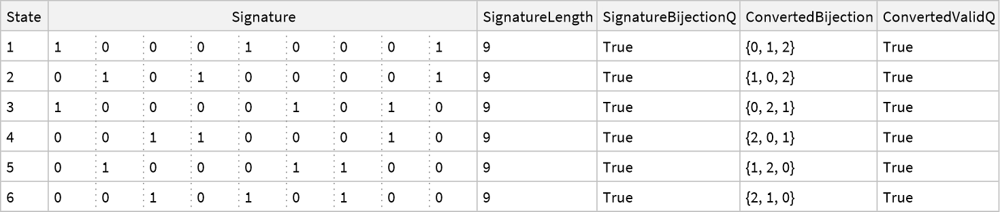

In [4145]:
diagS112B =
  Table[

    Module[
      {
        sig,
        bij
      },

      sig =
        Lookup[
          stateSignatureS112B,
          s,
          Missing["NoSignature"]
        ];

      bij =
        If[
          MissingQ[sig],
          Missing["NoSignature"],
          S112BSignatureToBijection[sig]
        ];

      <|

        "State" ->
          s,

        "Signature" ->
          sig,

        "SignatureLength" ->
          If[
            ListQ[sig],
            Length[sig],
            Missing["NotList"]
          ],

        "SignatureBijectionQ" ->
          If[
            ListQ[sig],
            S112BBijectionSignatureQ[sig],
            False
          ],

        "ConvertedBijection" ->
          bij,

        "ConvertedValidQ" ->
          If[
            ListQ[bij],
            And[
              Length[bij] == 3,
              Sort[bij] === Sort[querySymbolsS112B]
            ],
            False
          ]

      |>

    ],

    {
      s,
      Range[stateCountS112B]
    }
  ];

Dataset[diagS112B]

S112B-R2 CONTINUATION
FIXED BIJECTION AUDIT AND POST-FREEZE VALIDATION
Fixed state-bijection audit = True
Distinct behavior signatures = 6
Distinct bijections = 6
Transition entries = 12 / 12
Transition completeness = 1.
TRAIN transition coverage = 1.
TRAIN readout coverage = 1.
TRAIN accuracy = 1.
TRAIN strict pair = 1.
TRAIN freeze gate = True
S112B MACHINE FROZEN
States = 6
Distinct bijections = 6
Unique oracle queries after TRAIN validation = 96
Additional discovery queries = 117
Total unique queries before freeze = 213
Machine hash = f52e6dcbd957a3fd34fc74de75b351eaef25912fb806a60d542283b981acbc\
 
>    b7
NO MACHINE PARAMETER WILL CHANGE AFTER THIS POINT.
Post-freeze audit sequences = 2047
Post-freeze signature matches = 2047 / 2047
Post-freeze signature consistency = 1.
NOW ACCESSING IID DEV
S112B-R2 COMPLETE
States = 6
Distinct behavior signatures = 6
Distinct bijections = 6
Transitions = 12 / 12
Post-freeze signature audit = 2047 / 2047
IID DEV accuracy = 1.
IID DEV strict pai

<|Stage -> S112B_R2_ActiveFinalOutputBehavioralStateDiscovery, 
 
>   LearnerReceivesIntermediateTrueState -> False, 
 
>   LearnerReceivesFinalBinaryYOnly -> True, ActiveMembershipQueries -> True, 
 
>   IIDDevUsedForDiscovery -> False, OODAccessed -> False, States -> 6, 
 
>   DistinctBehaviorSignatures -> 6, DistinctBijections -> 6, Transitions -> 12, 
 
>   TransitionCompleteness -> 1., TrainValidationQueries -> 96, 
 
>   AdditionalDiscoveryQueries -> 117, TotalUniqueQueriesBeforeFreeze -> 213, 
 
>   PostFreezeAuditMaxLength -> 10, PostFreezeAuditSequences -> 2047, 
 
>   PostFreezeSignatureMatches -> 2047, PostFreezeSignatureConsistency -> 1., 
 
>   Train -> <|Records -> 96, TransitionCoverage -> 1., ReadoutCoverage -> 1., 
 
>     AccuracyUnknownWrong -> 1., AccuracyOnCovered -> 1.|>, TrainStrictPair -> 1., 
 
>   IIDDev -> <|Records -> 48, TransitionCoverage -> 1., ReadoutCoverage -> 1., 
 
>     AccuracyUnknownWrong -> 1., AccuracyOnCovered -> 1.|>, IIDDevStrictPair -> 1., 
 
>   SixStateSignal -> True, SixDistinctBehaviorSignal -> True, 
 
>   ExactPostFreezeBehavior -> True, ExactIIDDev -> True, ActiveDiscoveryStrong -> True, 
 
>   Diagnosis -> ACTIVE_FINAL_OUTPUT_QUERIES_DISCOVER_A_CLOSED_SIX_STATE_DISCRETE_BEHAVI\
 
>     ORAL_MACHINE_WITH_EXACT_POST_FREEZE_AND_IID_BEHAVIOR, 
 
>   MachineHash -> f52e6dcbd957a3fd34fc74de75b351eaef25912fb806a60d542283b981acbcb7|>
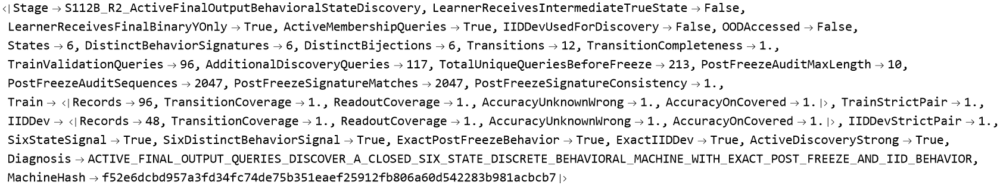

In [4151]:
(* ============================================================ *)
(* S112B-R2 CONTINUE                                            *)
(* FIXED BIJECTION AUDIT + FREEZE + POST-FREEZE VALIDATION      *)
(*                                                              *)
(* Run this AFTER the previous S112B stopped at the bad          *)
(* stateBijectionAudit check.                                   *)
(*                                                              *)
(* Existing discovered 6-state machine is NOT rebuilt.          *)
(* ============================================================ *)

Print["================================================"];
Print["S112B-R2 CONTINUATION"];
Print["FIXED BIJECTION AUDIT AND POST-FREEZE VALIDATION"];
Print["================================================"];


(* ============================================================ *)
(* 1. REBUILD / VERIFY STATE BIJECTIONS                          *)
(* ============================================================ *)

stateBijectionS112B =
  Association[
    Table[

      state ->
        S112BSignatureToBijection[
          Lookup[
            stateSignatureS112B,
            state,
            Missing["NoSignature"]
          ]
        ],

      {
        state,
        Range[stateCountS112B]
      }
    ]
  ];


stateBijectionAuditS112B =
  AllTrue[
    Values[stateBijectionS112B],

    Function[
      bij,

      And[
        ListQ[bij],
        Length[bij] == 3,
        Sort[bij] === Sort[querySymbolsS112B]
      ]
    ]
  ];


Print[
  "Fixed state-bijection audit = ",
  stateBijectionAuditS112B
];


If[
  !TrueQ[stateBijectionAuditS112B],

  Print["STOP: genuine state-bijection failure."];
  Abort[]
];


distinctBijectionCountS112B =
  Length[
    DeleteDuplicates[
      Values[stateBijectionS112B]
    ]
  ];


distinctSignatureCountS112B =
  Length[
    DeleteDuplicates[
      Values[stateSignatureS112B]
    ]
  ];


Print[
  "Distinct behavior signatures = ",
  distinctSignatureCountS112B
];


Print[
  "Distinct bijections = ",
  distinctBijectionCountS112B
];


If[
  distinctSignatureCountS112B =!= stateCountS112B,

  Print["STOP: duplicate discovered signatures exist."];
  Abort[]
];


(* ============================================================ *)
(* 2. TRANSITION COMPLETENESS                                   *)
(* ============================================================ *)

S112BTransitionKey[
  state_Integer,
  token_Integer
] :=
  ToString[
    InputForm[
      {state, token}
    ]
  ];


expectedTransitionCountS112B =
  stateCountS112B *
    Length[alphabetS112B];


transitionCompletenessS112B =
  N[
    Length[transitionByStateS112B] /
      expectedTransitionCountS112B
  ];


Print[
  "Transition entries = ",
  Length[transitionByStateS112B],
  " / ",
  expectedTransitionCountS112B
];


Print[
  "Transition completeness = ",
  transitionCompletenessS112B
];


If[
  Abs[
    transitionCompletenessS112B - 1.
  ] > 10^-12,

  Print["STOP: discovered transition table incomplete."];
  Abort[]
];


(* ============================================================ *)
(* 3. EXECUTION                                                 *)
(* ============================================================ *)

startStateS112B = 1;


S112BExecuteState[
  seq_List
] :=
 Module[
   {state},

   state =
     startStateS112B;

   Do[

     state =
       Lookup[
         transitionByStateS112B,

         S112BTransitionKey[
           state,
           token
         ],

         Missing["UnknownTransition"]
       ];

     If[
       MissingQ[state],
       Return[state]
     ],

     {
       token,
       seq
     }
   ];

   state
 ];


(* ============================================================ *)
(* 4. LEARNED READOUT                                           *)
(*                                                              *)
(* No oracle is used here.                                      *)
(* Uses only the frozen discovered state's bijection.           *)
(* ============================================================ *)

S112BPredict[
  seq_List,
  start_,
  target_
] :=
 Module[
   {
     state,
     bij,
     startIndex
   },

   state =
     S112BExecuteState[
       seq
     ];

   If[
     MissingQ[state],

     Return[
       Missing["UnknownTransition"]
     ]
   ];


   bij =
     Lookup[
       stateBijectionS112B,
       state,
       Missing["UnknownState"]
     ];


   If[
     MissingQ[bij],

     Return[
       Missing["UnknownState"]
     ]
   ];


   startIndex =
     Lookup[
       queryIndexS112B,
       start,
       Missing["UnknownStart"]
     ];


   If[
     MissingQ[startIndex],

     Return[
       Missing["UnknownStart"]
     ]
   ];


   Boole[
     bij[[startIndex]] === target
   ]
 ];


(* ============================================================ *)
(* 5. GENERAL EVALUATION                                        *)
(* ============================================================ *)

S112BEvaluationRows[
  records_List,
  split_String
] :=
  Table[

    Module[
      {
        state,
        prediction
      },

      state =
        S112BExecuteState[
          r["Seq"]
        ];


      prediction =
        S112BPredict[
          r["Seq"],
          r["Start"],
          r["Target"]
        ];


      <|

        "Split" ->
          split,

        "PairID" ->
          r["PairID"],

        "Depth" ->
          r["Depth"],

        "State" ->
          state,

        "Y" ->
          r["Y"],

        "Prediction" ->
          prediction,

        "TransitionCovered" ->
          !MissingQ[state],

        "ReadoutCovered" ->
          IntegerQ[prediction],

        "Correct" ->
          And[
            IntegerQ[prediction],
            prediction === r["Y"]
          ]

      |>

    ],

    {
      r,
      records
    }
  ];


S112BSummary[
  rows_List
] :=
 Module[
   {covered},

   covered =
     Select[
       rows,
       TrueQ[#["ReadoutCovered"]] &
     ];


   <|

     "Records" ->
       Length[rows],

     "TransitionCoverage" ->
       N[
         Count[
           (TrueQ[#["TransitionCovered"]] &) /@ rows,
           True
         ] /
         Length[rows]
       ],

     "ReadoutCoverage" ->
       N[
         Length[covered] /
         Length[rows]
       ],

     "AccuracyUnknownWrong" ->
       N[
         Count[
           (TrueQ[#["Correct"]] &) /@ rows,
           True
         ] /
         Length[rows]
       ],

     "AccuracyOnCovered" ->
       If[
         Length[covered] == 0,

         Missing["NoCoveredRows"],

         N[
           Count[
             (TrueQ[#["Correct"]] &) /@ covered,
             True
           ] /
           Length[covered]
         ]
       ]

   |>
 ];


S112BStrictPairAccuracy[
  rows_List
] :=
 Module[
   {
     groups,
     scores
   },

   groups =
     Values[
       GroupBy[
         rows,
         #["PairID"] &
       ]
     ];


   scores =
     Table[

       Boole[
         And[
           Length[group] == 2,

           Sort[
             (#["Y"] &) /@ group
           ] === {0, 1},

           And @@
             (
               TrueQ[#["Correct"]] &
             ) /@
               group
         ]
       ],

       {
         group,
         groups
       }
     ];


   N[
     Mean[scores]
   ]
 ];


(* ============================================================ *)
(* 6. TRAIN CHECK                                               *)
(* ============================================================ *)

trainRowsS112B =
  S112BEvaluationRows[
    trainRecords,
    "Train"
  ];


trainSummaryS112B =
  S112BSummary[
    trainRowsS112B
  ];


trainStrictPairS112B =
  S112BStrictPairAccuracy[
    trainRowsS112B
  ];


Print[
  "TRAIN transition coverage = ",
  trainSummaryS112B[
    "TransitionCoverage"
  ]
];


Print[
  "TRAIN readout coverage = ",
  trainSummaryS112B[
    "ReadoutCoverage"
  ]
];


Print[
  "TRAIN accuracy = ",
  trainSummaryS112B[
    "AccuracyUnknownWrong"
  ]
];


Print[
  "TRAIN strict pair = ",
  trainStrictPairS112B
];


trainFreezeGateS112B =
  And[
    trainSummaryS112B[
      "TransitionCoverage"
    ] == 1.,

    trainSummaryS112B[
      "ReadoutCoverage"
    ] == 1.,

    trainSummaryS112B[
      "AccuracyUnknownWrong"
    ] == 1.,

    trainStrictPairS112B == 1.,

    transitionCompletenessS112B == 1.,

    stateCountS112B == 6,

    distinctBijectionCountS112B == 6
  ];


Print[
  "TRAIN freeze gate = ",
  trainFreezeGateS112B
];


If[
  !TrueQ[trainFreezeGateS112B],

  Print["STOP: TRAIN freeze gate failed."];
  Abort[]
];


(* ============================================================ *)
(* 7. FREEZE                                                    *)
(* ============================================================ *)

activeQueriesBeforeFreezeS112B =
  oracleUniqueQueryCountS112B;


discoveryNewQueriesS112B =
  activeQueriesBeforeFreezeS112B -
    oracleQueriesAfterTrainValidationS112B;


machineHashS112B =
  Hash[
    {
      stateSignatureS112B,
      stateRepresentativeSeqS112B,
      transitionByStateS112B,
      stateBijectionS112B,
      startStateS112B
    },

    "SHA256",
    "HexString"
  ];


Print["================================================"];
Print["S112B MACHINE FROZEN"];

Print[
  "States = ",
  stateCountS112B
];

Print[
  "Distinct bijections = ",
  distinctBijectionCountS112B
];

Print[
  "Unique oracle queries after TRAIN validation = ",
  oracleQueriesAfterTrainValidationS112B
];

Print[
  "Additional discovery queries = ",
  discoveryNewQueriesS112B
];

Print[
  "Total unique queries before freeze = ",
  activeQueriesBeforeFreezeS112B
];

Print[
  "Machine hash = ",
  machineHashS112B
];

Print["NO MACHINE PARAMETER WILL CHANGE AFTER THIS POINT."];
Print["================================================"];


(* ============================================================ *)
(* 8. POST-FREEZE EXHAUSTIVE BEHAVIOR AUDIT                     *)
(*                                                              *)
(* Every binary sequence of length 0..10.                       *)
(*                                                              *)
(* Count = 1 + 2 + ... + 1024 = 2047.                           *)
(*                                                              *)
(* Frozen machine executes seq independently.                   *)
(* Environment is queried only to verify final behavior.        *)
(* Machine is NOT changed.                                      *)
(* ============================================================ *)

auditMaxLengthS112B =
  10;


auditSequencesS112B =
  Flatten[
    Table[

      Tuples[
        alphabetS112B,
        len
      ],

      {
        len,
        0,
        auditMaxLengthS112B
      }
    ],

    1
  ];


Print[
  "Post-freeze audit sequences = ",
  Length[auditSequencesS112B]
];


auditRowsS112B =
  Table[

    Module[
      {
        learnedState,
        learnedSignature,
        oracleSignature
      },


      learnedState =
        S112BExecuteState[
          seq
        ];


      learnedSignature =
        If[
          MissingQ[learnedState],

          Missing["UnknownState"],

          Lookup[
            stateSignatureS112B,
            learnedState,
            Missing["NoStoredSignature"]
          ]
        ];


      oracleSignature =
        S112BBehaviorSignature[
          seq
        ];


      <|

        "Length" ->
          Length[seq],

        "Seq" ->
          seq,

        "LearnedState" ->
          learnedState,

        "LearnedSignature" ->
          learnedSignature,

        "OracleSignature" ->
          oracleSignature,

        "SignatureMatch" ->
          (
            learnedSignature ===
              oracleSignature
          )

      |>

    ],

    {
      seq,
      auditSequencesS112B
    }
  ];


auditSignatureMatchCountS112B =
  Count[
    (
      TrueQ[#["SignatureMatch"]] &
    ) /@
      auditRowsS112B,
    True
  ];


auditSignatureAccuracyS112B =
  N[
    auditSignatureMatchCountS112B /
      Length[auditRowsS112B]
  ];


Print[
  "Post-freeze signature matches = ",
  auditSignatureMatchCountS112B,
  " / ",
  Length[auditRowsS112B]
];


Print[
  "Post-freeze signature consistency = ",
  auditSignatureAccuracyS112B
];


(* per length *)

auditPerLengthS112B =
  Table[

    Module[
      {
        rows
      },

      rows =
        Select[
          auditRowsS112B,
          #["Length"] === len &
        ];


      <|

        "Length" ->
          len,

        "Sequences" ->
          Length[rows],

        "SignatureMatches" ->
          Count[
            (
              TrueQ[#["SignatureMatch"]] &
            ) /@
              rows,
            True
          ],

        "SignatureAccuracy" ->
          N[
            Count[
              (
                TrueQ[#["SignatureMatch"]] &
              ) /@
                rows,
              True
            ] /
              Length[rows]
          ]

      |>

    ],

    {
      len,
      0,
      auditMaxLengthS112B
    }
  ];


(* ============================================================ *)
(* 9. ONLY NOW IID DEV                                          *)
(* ============================================================ *)

Print["================================================"];
Print["NOW ACCESSING IID DEV"];
Print["================================================"];


devRowsS112B =
  S112BEvaluationRows[
    iidRecords,
    "Dev"
  ];


devSummaryS112B =
  S112BSummary[
    devRowsS112B
  ];


devStrictPairS112B =
  S112BStrictPairAccuracy[
    devRowsS112B
  ];


devDepthsS112B =
  Sort[
    DeleteDuplicates[
      (#["Depth"] &) /@
        iidRecords
    ]
  ];


devPerDepthS112B =
  Table[

    Module[
      {
        rows,
        summary
      },

      rows =
        Select[
          devRowsS112B,
          #["Depth"] === depth &
        ];


      summary =
        S112BSummary[
          rows
        ];


      <|

        "Depth" ->
          depth,

        "Records" ->
          Length[rows],

        "TransitionCoverage" ->
          summary[
            "TransitionCoverage"
          ],

        "ReadoutCoverage" ->
          summary[
            "ReadoutCoverage"
          ],

        "Accuracy" ->
          summary[
            "AccuracyUnknownWrong"
          ],

        "AccuracyOnCovered" ->
          summary[
            "AccuracyOnCovered"
          ],

        "StrictPairAccuracy" ->
          S112BStrictPairAccuracy[
            rows
          ]

      |>

    ],

    {
      depth,
      devDepthsS112B
    }
  ];


(* ============================================================ *)
(* 10. STATE TABLE                                              *)
(* ============================================================ *)

stateTableS112B =
  Table[

    <|

      "State" ->
        state,

      "RepresentativeSeq" ->
        Lookup[
          stateRepresentativeSeqS112B,
          state
        ],

      "BehaviorSignature" ->
        Lookup[
          stateSignatureS112B,
          state
        ],

      "Bijection" ->
        Lookup[
          stateBijectionS112B,
          state
        ],

      "On0" ->
        Lookup[
          transitionByStateS112B,
          S112BTransitionKey[
            state,
            0
          ]
        ],

      "On1" ->
        Lookup[
          transitionByStateS112B,
          S112BTransitionKey[
            state,
            1
          ]
        ]

    |>,

    {
      state,
      Range[stateCountS112B]
    }
  ];


(* ============================================================ *)
(* 11. FINAL GATES                                              *)
(* ============================================================ *)

sixStateSignalS112B =
  stateCountS112B == 6;


sixDistinctBehaviorSignalS112B =
  And[
    distinctSignatureCountS112B == 6,
    distinctBijectionCountS112B == 6
  ];


exactPostFreezeBehaviorS112B =
  Abs[
    auditSignatureAccuracyS112B - 1.
  ] < 10^-12;


exactIIDDevS112B =
  And[
    devSummaryS112B[
      "TransitionCoverage"
    ] == 1.,

    devSummaryS112B[
      "ReadoutCoverage"
    ] == 1.,

    devSummaryS112B[
      "AccuracyUnknownWrong"
    ] == 1.,

    devStrictPairS112B == 1.
  ];


activeDiscoveryStrongS112B =
  And[
    sixStateSignalS112B,
    sixDistinctBehaviorSignalS112B,
    trainFreezeGateS112B,
    exactPostFreezeBehaviorS112B,
    exactIIDDevS112B
  ];


diagnosisS112B =
  Which[

    activeDiscoveryStrongS112B,

      "ACTIVE_FINAL_OUTPUT_QUERIES_DISCOVER_A_CLOSED_SIX_STATE_DISCRETE_BEHAVIORAL_MACHINE_WITH_EXACT_POST_FREEZE_AND_IID_BEHAVIOR",


    !sixStateSignalS112B,

      "ACTIVE_DISCOVERY_DID_NOT_PRODUCE_EXACTLY_SIX_STATES",


    !sixDistinctBehaviorSignalS112B,

      "SIX_STATES_EXIST_BUT_DO_NOT_HAVE_SIX_DISTINCT_BEHAVIORS",


    !exactPostFreezeBehaviorS112B,

      "SIX_STATE_MACHINE_IS_NOT_TRANSITION_STABLE_ON_POST_FREEZE_EXHAUSTIVE_BEHAVIOR_AUDIT",


    !exactIIDDevS112B,

      "POST_FREEZE_MACHINE_IS_CLOSED_BUT_IID_DEV_IS_NOT_EXACT",


    True,

      "INCONCLUSIVE"
  ];


(* ============================================================ *)
(* 12. FINAL REPORT                                             *)
(* ============================================================ *)

finalS112B =
  <|

    "Stage" ->
      "S112B_R2_ActiveFinalOutputBehavioralStateDiscovery",

    "LearnerReceivesIntermediateTrueState" ->
      False,

    "LearnerReceivesFinalBinaryYOnly" ->
      True,

    "ActiveMembershipQueries" ->
      True,

    "IIDDevUsedForDiscovery" ->
      False,

    "OODAccessed" ->
      False,

    "States" ->
      stateCountS112B,

    "DistinctBehaviorSignatures" ->
      distinctSignatureCountS112B,

    "DistinctBijections" ->
      distinctBijectionCountS112B,

    "Transitions" ->
      Length[
        transitionByStateS112B
      ],

    "TransitionCompleteness" ->
      transitionCompletenessS112B,

    "TrainValidationQueries" ->
      oracleQueriesAfterTrainValidationS112B,

    "AdditionalDiscoveryQueries" ->
      discoveryNewQueriesS112B,

    "TotalUniqueQueriesBeforeFreeze" ->
      activeQueriesBeforeFreezeS112B,

    "PostFreezeAuditMaxLength" ->
      auditMaxLengthS112B,

    "PostFreezeAuditSequences" ->
      Length[
        auditRowsS112B
      ],

    "PostFreezeSignatureMatches" ->
      auditSignatureMatchCountS112B,

    "PostFreezeSignatureConsistency" ->
      auditSignatureAccuracyS112B,

    "Train" ->
      trainSummaryS112B,

    "TrainStrictPair" ->
      trainStrictPairS112B,

    "IIDDev" ->
      devSummaryS112B,

    "IIDDevStrictPair" ->
      devStrictPairS112B,

    "SixStateSignal" ->
      sixStateSignalS112B,

    "SixDistinctBehaviorSignal" ->
      sixDistinctBehaviorSignalS112B,

    "ExactPostFreezeBehavior" ->
      exactPostFreezeBehaviorS112B,

    "ExactIIDDev" ->
      exactIIDDevS112B,

    "ActiveDiscoveryStrong" ->
      activeDiscoveryStrongS112B,

    "Diagnosis" ->
      diagnosisS112B,

    "MachineHash" ->
      machineHashS112B

  |>;


Print["================================================"];
Print["S112B-R2 COMPLETE"];

Print[
  "States = ",
  stateCountS112B
];

Print[
  "Distinct behavior signatures = ",
  distinctSignatureCountS112B
];

Print[
  "Distinct bijections = ",
  distinctBijectionCountS112B
];

Print[
  "Transitions = ",
  Length[transitionByStateS112B],
  " / ",
  expectedTransitionCountS112B
];

Print[
  "Post-freeze signature audit = ",
  auditSignatureMatchCountS112B,
  " / ",
  Length[auditRowsS112B]
];

Print[
  "IID DEV accuracy = ",
  devSummaryS112B[
    "AccuracyUnknownWrong"
  ]
];

Print[
  "IID DEV strict pair = ",
  devStrictPairS112B
];

Print[
  "Diagnosis = ",
  diagnosisS112B
];

Print["================================================"];


finalS112B

In [4297]:
(* ============================================================ *)
(* S112C                                                        *)
(* EXACT POST-HOC S3 ISOMORPHISM AUDIT                          *)
(*                                                              *)
(* Frozen learner: S112B-R2                                     *)
(*                                                              *)
(* PURPOSE                                                      *)
(* ------------------------------------------------------------ *)
(* Test whether the 6 actively discovered behavioral states are *)
(* exactly isomorphic to the hidden six-state S3 computation.   *)
(*                                                              *)
(* CHECKS                                                       *)
(* ------------------------------------------------------------ *)
(* 1. frozen S112B hash unchanged                               *)
(* 2. 6 learned states <-> 6 true S3 states bijectively         *)
(* 3. start-state correspondence                                *)
(* 4. all 12 primitive transitions commute                      *)
(* 5. all 54 state/query behaviors agree                        *)
(* 6. synchronized product has exactly six reachable pairs      *)
(* 7. conclude finite-state equivalence for arbitrary lengths   *)
(*                                                              *)
(* IMPORTANT                                                    *)
(* ------------------------------------------------------------ *)
(* - POST-HOC AUDIT ONLY                                        *)
(* - NO TRAINING                                                *)
(* - NO MODEL CHANGE                                            *)
(* - NO CANDIDATE SELECTION                                     *)
(* - NO IID DEV SELECTION                                       *)
(* - NO OOD DATA                                                *)
(* - TRUE S3 IS USED ONLY NOW FOR VERIFICATION                  *)
(* ============================================================ *)


ClearAll["Global`S112C*"];
ClearAll["Global`s112C*"];


s112CResult =
Catch[

(

(* ============================================================ *)
(* 0. FAIL SAFE                                                 *)
(* ============================================================ *)

S112CFail[msg_] := (
  Print["STOP: ", msg];
  Throw[$Failed, "S112C_STOP"];
);


Print["================================================"];
Print["S112C EXACT POST-HOC S3 ISOMORPHISM AUDIT"];
Print["================================================"];


(* ============================================================ *)
(* 1. PREFLIGHT                                                 *)
(* ============================================================ *)

requiredObjectsS112C =
  <|

    "finalS112B" ->
      ValueQ[finalS112B],

    "machineHashS112B" ->
      ValueQ[machineHashS112B],

    "stateCountS112B" ->
      ValueQ[stateCountS112B],

    "stateSignatureS112B" ->
      ValueQ[stateSignatureS112B],

    "stateRepresentativeSeqS112B" ->
      ValueQ[stateRepresentativeSeqS112B],

    "stateBijectionS112B" ->
      ValueQ[stateBijectionS112B],

    "transitionByStateS112B" ->
      ValueQ[transitionByStateS112B],

    "startStateS112B" ->
      ValueQ[startStateS112B],

    "alphabetS112B" ->
      ValueQ[alphabetS112B],

    "querySymbolsS112B" ->
      ValueQ[querySymbolsS112B]

  |>;


missingObjectsS112C =
  Keys[
    Select[
      requiredObjectsS112C,
      !TrueQ[#] &
    ]
  ];


Print[
  "Prerequisite audit = ",
  requiredObjectsS112C
];


If[
  Length[missingObjectsS112C] > 0,

  S112CFail[
    StringJoin[
      "Missing S112B objects: ",
      ToString[
        InputForm[
          missingObjectsS112C
        ]
      ]
    ]
  ]
];


If[
  !TrueQ[
    Lookup[
      finalS112B,
      "ActiveDiscoveryStrong",
      False
    ]
  ],

  S112CFail[
    "Frozen S112B did not pass ActiveDiscoveryStrong."
  ]
];


If[
  stateCountS112B =!= 6,

  S112CFail[
    "Expected exactly six frozen S112B states."
  ]
];


If[
  alphabetS112B =!= {0, 1},

  S112CFail[
    "Expected primitive alphabet {0,1}."
  ]
];


If[
  querySymbolsS112B =!= {0, 1, 2},

  S112CFail[
    "Expected query symbols {0,1,2}."
  ]
];


Print["Preflight = PASS"];
Print["Frozen learner states = ", stateCountS112B];
Print["NO TRAINING."];
Print["NO MODEL CHANGE."];
Print["TRUE S3 IS POST-HOC ONLY."];
Print["NO OOD WILL BE ACCESSED."];


(* ============================================================ *)
(* 2. VERIFY FROZEN MACHINE HASH                                *)
(* ============================================================ *)

recomputedHashS112C =
  Hash[
    {
      stateSignatureS112B,
      stateRepresentativeSeqS112B,
      transitionByStateS112B,
      stateBijectionS112B,
      startStateS112B
    },

    "SHA256",
    "HexString"
  ];


frozenHashMatchesS112C =
  recomputedHashS112C ===
    machineHashS112B;


Print[
  "Frozen S112B hash matches = ",
  frozenHashMatchesS112C
];


If[
  !TrueQ[frozenHashMatchesS112C],

  S112CFail[
    "Frozen S112B machine changed before S112C audit."
  ]
];


(* ============================================================ *)
(* 3. DEFINE TRUE S3 MACHINE                                    *)
(*                                                              *)
(* Same hidden benchmark computation that generated oracle Y.   *)
(*                                                              *)
(* token 0 = transposition (1 2)                                *)
(* token 1 = transposition (2 3)                                *)
(*                                                              *)
(* State representation is a permutation of {1,2,3}.            *)
(* ============================================================ *)

S112CTrueOp[0] :=
  {2, 1, 3};


S112CTrueOp[1] :=
  {1, 3, 2};


S112CTrueStep[
  trueState_List,
  token_Integer
] :=
  S112CTrueOp[token][[
    trueState
  ]];


trueStartStateS112C =
  {1, 2, 3};


allTrueStatesS112C =
  SortBy[
    Permutations[
      {1, 2, 3}
    ],
    ToString[
      InputForm[#]
    ] &
  ];


Print[
  "True S3 states = ",
  Length[allTrueStatesS112C]
];


(* ============================================================ *)
(* 4. TRUE QUERY SEMANTICS                                      *)
(* ============================================================ *)

queryIndexS112C =
  AssociationThread[
    querySymbolsS112B,
    Range[
      Length[querySymbolsS112B]
    ]
  ];


allQueryPairsS112C =
  Tuples[
    querySymbolsS112B,
    2
  ];


S112CTrueQuery[
  trueState_List,
  start_,
  target_
] :=
Module[
  {
    s,
    t
  },


  s =
    Lookup[
      queryIndexS112C,
      start,
      Missing["UnknownStart"]
    ];


  t =
    Lookup[
      queryIndexS112C,
      target,
      Missing["UnknownTarget"]
    ];


  If[
    MissingQ[s] ||
    MissingQ[t],

    Return[
      Missing["UnknownQuery"]
    ]
  ];


  Boole[
    trueState[[s]] === t
  ]
];


S112CTrueSignature[
  trueState_List
] :=
  Table[

    S112CTrueQuery[
      trueState,
      pair[[1]],
      pair[[2]]
    ],

    {
      pair,
      allQueryPairsS112C
    }
  ];


trueSignatureByStateS112C =
  Association[
    Table[

      ToString[
        InputForm[
          trueState
        ]
      ] ->
        S112CTrueSignature[
          trueState
        ],

      {
        trueState,
        allTrueStatesS112C
      }
    ]
  ];


trueDistinctSignatureCountS112C =
  Length[
    DeleteDuplicates[
      Values[
        trueSignatureByStateS112C
      ]
    ]
  ];


Print[
  "Distinct true S3 behavior signatures = ",
  trueDistinctSignatureCountS112C
];


If[
  trueDistinctSignatureCountS112C =!= 6,

  S112CFail[
    "True S3 states are not behaviorally distinct under the 9-query interface."
  ]
];


(* ============================================================ *)
(* 5. AUDIT LEARNED SIGNATURES                                  *)
(* ============================================================ *)

learnedSignatureAuditRowsS112C =
  Table[

    Module[
      {
        sig
      },


      sig =
        Lookup[
          stateSignatureS112B,
          learnedState,
          Missing["NoSignature"]
        ];


      <|

        "LearnedState" ->
          learnedState,

        "Signature" ->
          sig,

        "Length" ->
          If[
            ListQ[sig],
            Length[sig],
            Missing["NotList"]
          ],

        "Binary" ->
          If[
            ListQ[sig],
            SubsetQ[
              {0, 1},
              DeleteDuplicates[sig]
            ],
            False
          ]

      |>

    ],

    {
      learnedState,
      Range[stateCountS112B]
    }
  ];


learnedSignatureAuditPassedS112C =
  And @@
    Table[

      And[
        row["Length"] == 9,
        TrueQ[row["Binary"]]
      ],

      {
        row,
        learnedSignatureAuditRowsS112C
      }
    ];


Print[
  "Learned signature audit = ",
  learnedSignatureAuditPassedS112C
];


If[
  !TrueQ[
    learnedSignatureAuditPassedS112C
  ],

  S112CFail[
    "Frozen learned signatures are malformed."
  ]
];


(* ============================================================ *)
(* 6. DISCOVER POST-HOC STATE CORRESPONDENCE                    *)
(*                                                              *)
(* IMPORTANT: mapping is NOT manually assigned.                 *)
(*                                                              *)
(* For every learned state, find the true S3 state with exactly *)
(* the same complete 9-bit observable behavior signature.       *)
(* ============================================================ *)

stateCorrespondenceS112C =
  Table[

    Module[
      {
        learnedSignature,
        trueMatches
      },


      learnedSignature =
        Lookup[
          stateSignatureS112B,
          learnedState
        ];


      trueMatches =
        Select[
          allTrueStatesS112C,

          S112CTrueSignature[#] ===
            learnedSignature &
        ];


      <|

        "LearnedState" ->
          learnedState,

        "RepresentativeSeq" ->
          Lookup[
            stateRepresentativeSeqS112B,
            learnedState
          ],

        "LearnedBijection" ->
          Lookup[
            stateBijectionS112B,
            learnedState
          ],

        "TrueMatches" ->
          trueMatches,

        "MatchCount" ->
          Length[
            trueMatches
          ],

        "Functional" ->
          (
            Length[
              trueMatches
            ] == 1
          )

      |>

    ],

    {
      learnedState,
      Range[stateCountS112B]
    }
  ];


learnedToTrueFunctionalS112C =
  And @@
    (
      TrueQ[
        #["Functional"]
      ] &
    ) /@
      stateCorrespondenceS112C;


Print[
  "Learned state -> true S3 functional = ",
  learnedToTrueFunctionalS112C
];


(* ============================================================ *)
(* 7. REVERSE MAPPING / BIJECTION                               *)
(* ============================================================ *)

assignedTrueStatesS112C =
  If[
    learnedToTrueFunctionalS112C,

    First[
      #["TrueMatches"]
    ] & /@
      stateCorrespondenceS112C,

    {}
  ];


reverseCorrespondenceS112C =
  Table[

    <|

      "TrueS3State" ->
        trueState,

      "LearnedStates" ->
        If[
          learnedToTrueFunctionalS112C,

          (
            #["LearnedState"] &
          ) /@
            Select[
              stateCorrespondenceS112C,

              First[
                #["TrueMatches"]
              ] ===
                trueState &
            ],

          {}
        ],

      "Count" ->
        If[
          learnedToTrueFunctionalS112C,

          Count[
            assignedTrueStatesS112C,
            trueState
          ],

          0
        ]

    |>,

    {
      trueState,
      allTrueStatesS112C
    }
  ];


trueToLearnedFunctionalS112C =
  And @@
    (
      #["Count"] == 1 &
    ) /@
      reverseCorrespondenceS112C;


stateBijectionPassedS112C =
  And[
    learnedToTrueFunctionalS112C,
    trueToLearnedFunctionalS112C,
    Length[
      DeleteDuplicates[
        assignedTrueStatesS112C
      ]
    ] == 6
  ];


Print[
  "True S3 -> learned state functional = ",
  trueToLearnedFunctionalS112C
];


Print[
  "6 <-> 6 state bijection = ",
  stateBijectionPassedS112C
];


(* ============================================================ *)
(* 8. BUILD PHI                                                 *)
(* ============================================================ *)

phiS112C =
  If[
    stateBijectionPassedS112C,

    Association[
      Table[

        row["LearnedState"] ->
          First[
            row["TrueMatches"]
          ],

        {
          row,
          stateCorrespondenceS112C
        }
      ]
    ],

    <||>
  ];


startStateCorrespondenceS112C =
  If[
    stateBijectionPassedS112C,

    Lookup[
      phiS112C,
      startStateS112B,
      Missing["NoStartMapping"]
    ] ===
      trueStartStateS112C,

    False
  ];


Print[
  "Start-state correspondence = ",
  startStateCorrespondenceS112C
];


(* ============================================================ *)
(* 9. LEARNED TRANSITION STEP                                   *)
(* ============================================================ *)

S112CLearnedTransitionKey[
  learnedState_Integer,
  token_Integer
] :=
  ToString[
    InputForm[
      {
        learnedState,
        token
      }
    ]
  ];


S112CLearnedStep[
  learnedState_Integer,
  token_Integer
] :=
  Lookup[
    transitionByStateS112B,

    S112CLearnedTransitionKey[
      learnedState,
      token
    ],

    Missing[
      "UnknownTransition"
    ]
  ];


(* ============================================================ *)
(* 10. EXACT 12-TRANSITION COMMUTING AUDIT                      *)
(*                                                              *)
(* Check:                                                       *)
(*                                                              *)
(* phi(Delta(C,x)) == delta_S3(phi(C),x)                        *)
(* ============================================================ *)

transitionAuditRowsS112C =
  Flatten[
    Table[

      Module[
        {
          learnedDestination,
          trueSource,
          mappedLearnedDestination,
          trueDestination,
          match
        },


        learnedDestination =
          S112CLearnedStep[
            learnedState,
            token
          ];


        trueSource =
          Lookup[
            phiS112C,
            learnedState,
            Missing["NoPhi"]
          ];


        mappedLearnedDestination =
          If[
            IntegerQ[
              learnedDestination
            ],

            Lookup[
              phiS112C,
              learnedDestination,
              Missing["NoPhiDestination"]
            ],

            Missing[
              "NoLearnedDestination"
            ]
          ];


        trueDestination =
          If[
            ListQ[
              trueSource
            ],

            S112CTrueStep[
              trueSource,
              token
            ],

            Missing[
              "NoTrueSource"
            ]
          ];


        match =
          And[
            ListQ[
              mappedLearnedDestination
            ],
            ListQ[
              trueDestination
            ],
            mappedLearnedDestination ===
              trueDestination
          ];


        <|

          "LearnedSource" ->
            learnedState,

          "Token" ->
            token,

          "LearnedDestination" ->
            learnedDestination,

          "TrueSource" ->
            trueSource,

          "MappedLearnedDestination" ->
            mappedLearnedDestination,

          "TrueDestination" ->
            trueDestination,

          "Match" ->
            match

        |>

      ],

      {
        learnedState,
        Range[stateCountS112B]
      },

      {
        token,
        alphabetS112B
      }
    ],

    1
  ];


transitionTotalS112C =
  Length[
    transitionAuditRowsS112C
  ];


transitionMatchesS112C =
  Count[
    (
      TrueQ[
        #["Match"]
      ] &
    ) /@
      transitionAuditRowsS112C,
    True
  ];


transitionIsomorphismPassedS112C =
  And[
    transitionTotalS112C == 12,
    transitionMatchesS112C == 12
  ];


Print[
  "Transition correspondence = ",
  transitionMatchesS112C,
  " / ",
  transitionTotalS112C
];


Print[
  "Transition isomorphism = ",
  transitionIsomorphismPassedS112C
];


(* ============================================================ *)
(* 11. LEARNED QUERY VALUE DIRECTLY FROM FROZEN SIGNATURE       *)
(* ============================================================ *)

queryPairKeyS112C[
  start_,
  target_
] :=
  ToString[
    InputForm[
      {
        start,
        target
      }
    ]
  ];


queryPairIndexS112C =
  AssociationThread[

    (
      queryPairKeyS112C[
        #[[1]],
        #[[2]]
      ] &
    ) /@
      allQueryPairsS112C,

    Range[
      Length[
        allQueryPairsS112C
      ]
    ]
  ];


S112CLearnedQuery[
  learnedState_Integer,
  start_,
  target_
] :=
Module[
  {
    signature,
    index
  },


  signature =
    Lookup[
      stateSignatureS112B,
      learnedState,
      Missing["NoSignature"]
    ];


  index =
    Lookup[
      queryPairIndexS112C,

      queryPairKeyS112C[
        start,
        target
      ],

      Missing[
        "UnknownQuery"
      ]
    ];


  If[
    !ListQ[signature] ||
    !IntegerQ[index],

    Return[
      Missing[
        "Unavailable"
      ]
    ]
  ];


  signature[[index]]
];


(* ============================================================ *)
(* 12. COMPLETE 6 x 9 = 54 QUERY-BEHAVIOR AUDIT                *)
(* ============================================================ *)

queryBehaviorRowsS112C =
  Flatten[
    Table[

      Module[
        {
          trueState,
          learnedY,
          trueY
        },


        trueState =
          Lookup[
            phiS112C,
            learnedState,
            Missing["NoPhi"]
          ];


        Table[

          learnedY =
            S112CLearnedQuery[
              learnedState,
              pair[[1]],
              pair[[2]]
            ];


          trueY =
            If[
              ListQ[
                trueState
              ],

              S112CTrueQuery[
                trueState,
                pair[[1]],
                pair[[2]]
              ],

              Missing[
                "NoTrueState"
              ]
            ];


          <|

            "LearnedState" ->
              learnedState,

            "TrueS3State" ->
              trueState,

            "Start" ->
              pair[[1]],

            "Target" ->
              pair[[2]],

            "LearnedY" ->
              learnedY,

            "TrueY" ->
              trueY,

            "Match" ->
              (
                learnedY ===
                  trueY
              )

          |>,

          {
            pair,
            allQueryPairsS112C
          }
        ]

      ],

      {
        learnedState,
        Range[stateCountS112B]
      }
    ],

    1
  ];


queryBehaviorTotalS112C =
  Length[
    queryBehaviorRowsS112C
  ];


queryBehaviorMatchesS112C =
  Count[
    (
      TrueQ[
        #["Match"]
      ] &
    ) /@
      queryBehaviorRowsS112C,
    True
  ];


fullQueryBehaviorPassedS112C =
  And[
    queryBehaviorTotalS112C == 54,
    queryBehaviorMatchesS112C == 54
  ];


Print[
  "Complete query behavior = ",
  queryBehaviorMatchesS112C,
  " / ",
  queryBehaviorTotalS112C
];


Print[
  "Full query behavior exact = ",
  fullQueryBehaviorPassedS112C
];


(* ============================================================ *)
(* 13. SYNCHRONIZED PRODUCT FIXED-POINT AUDIT                   *)
(*                                                              *)
(* Start both machines together and explore ALL reachable       *)
(* learned/true state pairs until closure.                      *)
(*                                                              *)
(* This is not a finite-length sample.                          *)
(* ============================================================ *)

S112CProductReachablePairs[] :=
Module[
  {
    startPair,
    reached,
    frontier,
    nextPairs,
    newPairs,
    learnedNext,
    trueNext,
    guard
  },


  startPair = {
    startStateS112B,
    trueStartStateS112C
  };


  reached = {
    startPair
  };


  frontier = {
    startPair
  };


  guard = 0;


  While[
    Length[frontier] > 0,


    guard++;


    If[
      guard > 100,

      Return[$Failed]
    ];


    nextPairs =
      DeleteDuplicates[
        Flatten[
          Table[

            learnedNext =
              S112CLearnedStep[
                pair[[1]],
                token
              ];


            trueNext =
              S112CTrueStep[
                pair[[2]],
                token
              ];


            {
              learnedNext,
              trueNext
            },

            {
              pair,
              frontier
            },

            {
              token,
              alphabetS112B
            }
          ],

          1
        ]
      ];


    If[
      AnyTrue[
        nextPairs,
        !IntegerQ[
          #[[1]]
        ] &
      ],

      Return[$Failed]
    ];


    newPairs =
      Select[
        nextPairs,
        !MemberQ[
          reached,
          #
        ] &
      ];


    reached =
      Join[
        reached,
        newPairs
      ];


    frontier =
      newPairs;

  ];


  SortBy[
    reached,
    ToString[
      InputForm[#]
    ] &
  ]
];


productPairsS112C =
  S112CProductReachablePairs[];


If[
  productPairsS112C === $Failed,

  S112CFail[
    "Synchronized product exploration failed."
  ]
];


productPairCountS112C =
  Length[
    productPairsS112C
  ];


productLearnedFunctionalS112C =
  And @@
    Table[

      Length[
        DeleteDuplicates[
          (
            #[[2]] &
          ) /@
            Select[
              productPairsS112C,
              #[[1]] === learnedState &
            ]
        ]
      ] == 1,

      {
        learnedState,
        Range[stateCountS112B]
      }
    ];


productTrueFunctionalS112C =
  And @@
    Table[

      Length[
        DeleteDuplicates[
          (
            #[[1]] &
          ) /@
            Select[
              productPairsS112C,
              #[[2]] === trueState &
            ]
        ]
      ] == 1,

      {
        trueState,
        allTrueStatesS112C
      }
    ];


productBijectionS112C =
  And[
    productPairCountS112C == 6,
    productLearnedFunctionalS112C,
    productTrueFunctionalS112C
  ];


Print[
  "Reachable synchronized product pairs = ",
  productPairCountS112C
];


Print[
  "Product learned->true functional = ",
  productLearnedFunctionalS112C
];


Print[
  "Product true->learned functional = ",
  productTrueFunctionalS112C
];


Print[
  "Product establishes 6-state bijection = ",
  productBijectionS112C
];


(* ============================================================ *)
(* 14. COMPARE PRODUCT MAPPING TO SIGNATURE-DERIVED PHI         *)
(* ============================================================ *)

productMappingMatchesPhiS112C =
  If[
    stateBijectionPassedS112C,

    And @@
      Table[

        Module[
          {
            pair
          },


          pair =
            SelectFirst[
              productPairsS112C,
              #[[1]] === learnedState &,
              Missing["NoPair"]
            ];


          And[
            !MissingQ[pair],
            pair[[2]] ===
              Lookup[
                phiS112C,
                learnedState
              ]
          ]

        ],

        {
          learnedState,
          Range[stateCountS112B]
        }
      ],

    False
  ];


Print[
  "Product mapping agrees with behavior-derived mapping = ",
  productMappingMatchesPhiS112C
];


(* ============================================================ *)
(* 15. DIRECT BIJECTION-ENCODING AUDIT                          *)
(*                                                              *)
(* Learned bijections use symbols {0,1,2}; true S3 state uses   *)
(* indices {1,2,3}.                                             *)
(*                                                              *)
(* Therefore learned bijection + 1 should equal mapped S3 state *)
(* if the discovered readout literally encodes the permutation. *)
(* ============================================================ *)

directEncodingRowsS112C =
  Table[

    Module[
      {
        learnedBijection,
        mappedTrueState,
        converted
      },


      learnedBijection =
        Lookup[
          stateBijectionS112B,
          learnedState
        ];


      mappedTrueState =
        Lookup[
          phiS112C,
          learnedState,
          Missing["NoPhi"]
        ];


      converted =
        If[
          ListQ[
            learnedBijection
          ],

          learnedBijection + 1,

          Missing[
            "NoLearnedBijection"
          ]
        ];


      <|

        "LearnedState" ->
          learnedState,

        "LearnedBijection012" ->
          learnedBijection,

        "Converted123" ->
          converted,

        "MappedTrueS3" ->
          mappedTrueState,

        "ExactEncodingMatch" ->
          (
            converted ===
              mappedTrueState
          )

      |>

    ],

    {
      learnedState,
      Range[stateCountS112B]
    }
  ];


directEncodingMatchesS112C =
  Count[
    (
      TrueQ[
        #["ExactEncodingMatch"]
      ] &
    ) /@
      directEncodingRowsS112C,
    True
  ];


directEncodingExactS112C =
  directEncodingMatchesS112C == 6;


Print[
  "Direct learned-bijection -> true-state encoding = ",
  directEncodingMatchesS112C,
  " / 6"
];


(* ============================================================ *)
(* 16. GLOBAL FINITE-STATE EQUIVALENCE                          *)
(*                                                              *)
(* If:                                                          *)
(* - start states correspond                                    *)
(* - state mapping is bijective                                 *)
(* - all primitive transitions commute                          *)
(* - all state query readouts agree                             *)
(*                                                              *)
(* then behavior is equivalent for ALL finite token sequences.  *)
(* This is structural, not empirical length extrapolation.      *)
(* ============================================================ *)

exactMachineIsomorphismS112C =
  And[
    frozenHashMatchesS112C,
    stateBijectionPassedS112C,
    startStateCorrespondenceS112C,
    transitionIsomorphismPassedS112C,
    fullQueryBehaviorPassedS112C,
    productBijectionS112C,
    productMappingMatchesPhiS112C
  ];


allFiniteSequenceBehaviorEquivalentS112C =
  exactMachineIsomorphismS112C;


(* ============================================================ *)
(* 17. DIAGNOSIS                                                *)
(* ============================================================ *)

diagnosisS112C =
  Which[

    exactMachineIsomorphismS112C &&
    directEncodingExactS112C,

      "ACTIVE_FINAL_OUTPUT_LEARNING_RECOVERS_THE_EXACT_SIX_STATE_S3_MACHINE_UP_TO_STATE_NAMING_WITH_DIRECT_BEHAVIORAL_STATE_ENCODING",


    exactMachineIsomorphismS112C,

      "ACTIVE_FINAL_OUTPUT_LEARNING_RECOVERS_A_MACHINE_EXACTLY_ISOMORPHIC_TO_S3_UP_TO_INTERNAL_STATE_RELABELLING",


    stateBijectionPassedS112C &&
    !transitionIsomorphismPassedS112C,

      "SIX_BEHAVIOR_STATES_MATCH_S3_STATES_BUT_TRANSITION_STRUCTURE_IS_NOT_ISOMORPHIC",


    !stateBijectionPassedS112C,

      "LEARNED_SIX_STATES_DO_NOT_MAP_BIJECTIVELY_TO_TRUE_S3_STATES",


    transitionIsomorphismPassedS112C &&
    !fullQueryBehaviorPassedS112C,

      "TRANSITION_STRUCTURE_MATCHES_BUT_FULL_QUERY_READOUT_DOES_NOT",


    True,

      "INCONCLUSIVE"

  ];


(* ============================================================ *)
(* 18. FINAL REPORT                                             *)
(* ============================================================ *)

finalS112C =
  <|

    "Stage" ->
      "S112C_ExactPostHocS3IsomorphismAudit",

    "PostHocAuditOnly" ->
      True,

    "TrainingPerformed" ->
      False,

    "FrozenMachineChanged" ->
      False,

    "TrueS3UsedDuringS112BDiscovery" ->
      False,

    "TrueS3UsedForPostHocAudit" ->
      True,

    "OODAccessed" ->
      False,

    "FrozenHashMatches" ->
      frozenHashMatchesS112C,

    "LearnedStates" ->
      stateCountS112B,

    "TrueS3States" ->
      Length[
        allTrueStatesS112C
      ],

    "LearnedToTrueFunctional" ->
      learnedToTrueFunctionalS112C,

    "TrueToLearnedFunctional" ->
      trueToLearnedFunctionalS112C,

    "StateBijectionPassed" ->
      stateBijectionPassedS112C,

    "StartStateCorrespondence" ->
      startStateCorrespondenceS112C,

    "TransitionMatches" ->
      transitionMatchesS112C,

    "TransitionTotal" ->
      transitionTotalS112C,

    "TransitionIsomorphismPassed" ->
      transitionIsomorphismPassedS112C,

    "QueryBehaviorMatches" ->
      queryBehaviorMatchesS112C,

    "QueryBehaviorTotal" ->
      queryBehaviorTotalS112C,

    "FullQueryBehaviorPassed" ->
      fullQueryBehaviorPassedS112C,

    "SynchronizedProductPairs" ->
      productPairCountS112C,

    "ProductBijectionPassed" ->
      productBijectionS112C,

    "ProductMappingMatchesPhi" ->
      productMappingMatchesPhiS112C,

    "DirectBehaviorEncodingMatches" ->
      directEncodingMatchesS112C,

    "DirectBehaviorEncodingExact" ->
      directEncodingExactS112C,

    "ExactMachineIsomorphism" ->
      exactMachineIsomorphismS112C,

    "AllFiniteSequenceBehaviorEquivalent" ->
      allFiniteSequenceBehaviorEquivalentS112C,

    "Diagnosis" ->
      diagnosisS112C

  |>;


Print["================================================"];
Print["S112C COMPLETE"];

Print[
  "State correspondence = ",
  If[
    stateBijectionPassedS112C,
    "6 / 6 BIJECTIVE",
    "FAILED"
  ]
];

Print[
  "Start state correspondence = ",
  startStateCorrespondenceS112C
];

Print[
  "Transition correspondence = ",
  transitionMatchesS112C,
  " / ",
  transitionTotalS112C
];

Print[
  "Query behavior correspondence = ",
  queryBehaviorMatchesS112C,
  " / ",
  queryBehaviorTotalS112C
];

Print[
  "Synchronized product pairs = ",
  productPairCountS112C
];

Print[
  "Direct behavior-state encoding = ",
  directEncodingMatchesS112C,
  " / 6"
];

Print[
  "Exact machine isomorphism = ",
  exactMachineIsomorphismS112C
];

Print[
  "All finite-sequence behavior equivalent = ",
  allFiniteSequenceBehaviorEquivalentS112C
];

Print[
  "Diagnosis = ",
  diagnosisS112C
];

Print["================================================"];


finalS112C

),

"S112C_STOP"
];

S112C EXACT POST-HOC S3 ISOMORPHISM AUDIT
Prerequisite audit = <|finalS112B -> True, machineHashS112B -> True, 
 
>    stateCountS112B -> True, stateSignatureS112B -> True, 
 
>    stateRepresentativeSeqS112B -> True, stateBijectionS112B -> True, 
 
>    transitionByStateS112B -> True, startStateS112B -> True, 
 
>    alphabetS112B -> True, querySymbolsS112B -> True|>
Preflight = PASS
Frozen learner states = 6
NO TRAINING.
NO MODEL CHANGE.
TRUE S3 IS POST-HOC ONLY.
NO OOD WILL BE ACCESSED.
Frozen S112B hash matches = True
True S3 states = 6
Distinct true S3 behavior signatures = 6
Learned signature audit = True
Learned state -> true S3 functional = True
True S3 -> learned state functional = True
6 <-> 6 state bijection = True
Start-state correspondence = True
Transition correspondence = 12 / 12
Transition isomorphism = True
Complete query behavior = 54 / 54
Full query behavior exact = True
Reachable synchronized product pairs = 6
Product learned->true functional = True
Product true->le

In [4335]:
(* ============================================================ *)
(* S113A                                                        *)
(* PROSPECTIVE S4 ACTIVE DISCRETE STATE DISCOVERY               *)
(*                                                              *)
(* FROZEN PRINCIPLE FROM S112B:                                 *)
(*                                                              *)
(* - learner receives FINAL binary Y only                       *)
(* - state identity = complete observable query signature       *)
(* - actively expand state representatives by primitive tokens  *)
(* - create a new state iff a new behavior signature appears    *)
(* - stop automatically at closure                              *)
(*                                                              *)
(* NEW TASK                                                     *)
(* ------------------------------------------------------------ *)
(* Hidden computation: S4                                       *)
(* Primitive alphabet:                                          *)
(*     0 = swap positions 1,2                                   *)
(*     1 = swap positions 2,3                                   *)
(*     2 = swap positions 3,4                                   *)
(*                                                              *)
(* Query symbols: {0,1,2,3}                                     *)
(* Full observable signature: 4 x 4 = 16 binary queries         *)
(*                                                              *)
(* CRITICAL PROTOCOL                                            *)
(* ------------------------------------------------------------ *)
(* Learner is NOT told:                                         *)
(* - hidden state                                               *)
(* - hidden permutation                                         *)
(* - hidden transition table                                    *)
(* - hidden state count                                         *)
(* - intermediate execution trace                               *)
(*                                                              *)
(* Learner may call only:                                       *)
(*     S113AOracleY[seq,start,target]                            *)
(*                                                              *)
(* Exact S4 state is used ONLY after machine freeze in the      *)
(* post-hoc isomorphism audit.                                  *)
(*                                                              *)
(* A prospective holdout is generated BEFORE discovery, but     *)
(* labels/signatures are not queried until AFTER freeze.         *)
(* ============================================================ *)


ClearAll["Global`S113A*"];
ClearAll["Global`s113A*"];


s113AResult =
Catch[

(

(* ============================================================ *)
(* 0. FAIL SAFE                                                 *)
(* ============================================================ *)

S113AFail[msg_] := (
  Print["STOP: ", msg];
  Throw[$Failed, "S113A_STOP"];
);


Print["================================================"];
Print["S113A PROSPECTIVE S4 ACTIVE STATE DISCOVERY"];
Print["================================================"];


(* ============================================================ *)
(* 1. FIXED BENCHMARK INTERFACE                                 *)
(* ============================================================ *)

alphabetS113A = {0, 1, 2};

querySymbolsS113A = {0, 1, 2, 3};

allQueryPairsS113A =
  Tuples[
    querySymbolsS113A,
    2
  ];


Print[
  "Primitive alphabet = ",
  alphabetS113A
];

Print[
  "Query symbols = ",
  querySymbolsS113A
];

Print[
  "Observable queries per state = ",
  Length[allQueryPairsS113A]
];

Print["LEARNER IS NOT GIVEN THE HIDDEN STATE COUNT."];
Print["LEARNER RECEIVES FINAL BINARY Y ONLY."];
Print["NO INTERMEDIATE STATE / TRACE IS EXPOSED."];
Print["NO DEVELOPMENT DATA FROM S4 WILL SELECT THE ALGORITHM."];


(* ============================================================ *)
(* 2. CREATE PROSPECTIVE HOLDOUT INPUTS                         *)
(*                                                              *)
(* IMPORTANT:                                                   *)
(* - created BEFORE discovery                                   *)
(* - NO oracle labels queried                                   *)
(* - NO holdout result used for learning                        *)
(*                                                              *)
(* Four substantially longer lengths.                           *)
(* ============================================================ *)

holdoutSeedS113A = 1130401;

holdoutDepthsS113A = {
  12,
  20,
  40,
  80
};

holdoutSequencesPerDepthS113A = 100;


prospectiveHoldoutSeqsS113A =
  BlockRandom[

    SeedRandom[
      holdoutSeedS113A
    ];


    Flatten[
      Table[

        Table[

          <|

            "Depth" ->
              depth,

            "Sequence" ->
              RandomChoice[
                alphabetS113A,
                depth
              ]

          |>,

          {
            holdoutSequencesPerDepthS113A
          }
        ],

        {
          depth,
          holdoutDepthsS113A
        }
      ],

      1
    ]
  ];


Print[
  "Prospective holdout sequences created = ",
  Length[
    prospectiveHoldoutSeqsS113A
  ]
];

Print[
  "Holdout depths = ",
  holdoutDepthsS113A
];

Print["HOLDOUT ORACLE OUTPUTS HAVE NOT BEEN ACCESSED."];


(* ============================================================ *)
(* 3. HIDDEN ENVIRONMENT                                        *)
(*                                                              *)
(* Everything here is conceptually ENVIRONMENT-ONLY.            *)
(* Learner may access only S113AOracleY.                         *)
(*                                                              *)
(* Hidden representation uses permutations of {1,2,3,4}.        *)
(* ============================================================ *)

S113AEnvOp[0] :=
  {2, 1, 3, 4};

S113AEnvOp[1] :=
  {1, 3, 2, 4};

S113AEnvOp[2] :=
  {1, 2, 4, 3};


S113AEnvStep[
  hiddenState_List,
  token_Integer
] :=
  S113AEnvOp[token][[
    hiddenState
  ]];


S113AEnvFinalState[
  seq_List
] :=
  Fold[
    S113AEnvStep,
    {1, 2, 3, 4},
    seq
  ];


queryIndexS113A =
  AssociationThread[
    querySymbolsS113A,
    Range[4]
  ];


S113AEnvRawY[
  seq_List,
  start_,
  target_
] :=
Module[
  {
    hiddenState,
    startIndex,
    targetIndex
  },


  hiddenState =
    S113AEnvFinalState[
      seq
    ];


  startIndex =
    Lookup[
      queryIndexS113A,
      start,
      Missing["UnknownStart"]
    ];


  targetIndex =
    Lookup[
      queryIndexS113A,
      target,
      Missing["UnknownTarget"]
    ];


  If[
    MissingQ[startIndex] ||
    MissingQ[targetIndex],

    Return[
      Missing[
        "UnknownQuery"
      ]
    ]
  ];


  Boole[
    hiddenState[[startIndex]] ===
      targetIndex
  ]
];


(* ============================================================ *)
(* 4. ORACLE WRAPPER                                            *)
(*                                                              *)
(* This is the ONLY hidden-environment interface available to   *)
(* the active learner.                                          *)
(* ============================================================ *)

oracleCacheS113A = <||>;

oracleUniqueQueryCountS113A = 0;

oracleTotalCallCountS113A = 0;


S113AOracleKey[
  seq_List,
  start_,
  target_
] :=
  ToString[
    InputForm[
      {
        seq,
        start,
        target
      }
    ]
  ];


S113AOracleY[
  seq_List,
  start_,
  target_
] :=
Module[
  {
    key,
    y
  },


  oracleTotalCallCountS113A++;


  key =
    S113AOracleKey[
      seq,
      start,
      target
    ];


  If[
    KeyExistsQ[
      oracleCacheS113A,
      key
    ],

    Return[
      Lookup[
        oracleCacheS113A,
        key
      ]
    ]
  ];


  y =
    S113AEnvRawY[
      seq,
      start,
      target
    ];


  If[
    !MemberQ[
      {0, 1},
      y
    ],

    S113AFail[
      "Hidden oracle returned a non-binary value."
    ]
  ];


  oracleUniqueQueryCountS113A++;


  AssociateTo[
    oracleCacheS113A,
    key -> y
  ];


  y
];


(* ============================================================ *)
(* 5. OBSERVABLE BEHAVIOR SIGNATURE                             *)
(*                                                              *)
(* 4 starts x 4 targets = 16 bits.                              *)
(*                                                              *)
(* IMPORTANT: this function asks ONLY final Y queries.          *)
(* ============================================================ *)

S113ABehaviorSignature[
  seq_List
] :=
  Table[

    S113AOracleY[
      seq,
      pair[[1]],
      pair[[2]]
    ],

    {
      pair,
      allQueryPairsS113A
    }
  ];


S113ASignatureKey[
  sig_List
] :=
  ToString[
    InputForm[
      sig
    ]
  ];


(* ============================================================ *)
(* 6. SIGNATURE VALIDITY                                        *)
(*                                                              *)
(* For this task interface a complete state behavior should be  *)
(* a 4 x 4 permutation matrix.                                  *)
(*                                                              *)
(* This is task-interface structure, not hidden-state access.   *)
(* ============================================================ *)

S113ASignatureMatrix[
  sig_List
] :=
  Partition[
    sig,
    4
  ];


S113ABijectionSignatureQ[
  sig_List
] :=
Module[
  {
    matrix,
    rowSums,
    columnSums,
    binaryQ
  },


  If[
    Length[sig] =!= 16,
    Return[False]
  ];


  binaryQ =
    And @@
      (
        MemberQ[
          {0, 1},
          #
        ] &
      ) /@
        sig;


  If[
    !TrueQ[binaryQ],
    Return[False]
  ];


  matrix =
    S113ASignatureMatrix[
      sig
    ];


  rowSums =
    Total /@
      matrix;


  columnSums =
    Total[
      matrix
    ];


  And[
    rowSums ===
      {1, 1, 1, 1},

    columnSums ===
      {1, 1, 1, 1}
  ]
];


S113ASignatureToBijection[
  sig_List
] :=
Module[
  {
    matrix,
    positions
  },


  If[
    !S113ABijectionSignatureQ[
      sig
    ],

    Return[
      Missing[
        "InvalidBijectionSignature"
      ]
    ]
  ];


  matrix =
    S113ASignatureMatrix[
      sig
    ];


  positions =
    Table[

      First[
        FirstPosition[
          matrix[[i]],
          1
        ]
      ],

      {
        i,
        1,
        4
      }
    ];


  querySymbolsS113A[[
    positions
  ]]
];


(* ============================================================ *)
(* 7. ACTIVE DISCOVERY DATA STRUCTURES                          *)
(*                                                              *)
(* NO expected state count is supplied.                         *)
(* Search stops only when the queue is empty.                   *)
(* ============================================================ *)

signatureToStateS113A = <||>;

stateSignatureS113A = <||>;

stateRepresentativeSeqS113A = <||>;

transitionByStateS113A = <||>;

discoveryRowsS113A = {};


S113ATransitionKey[
  state_Integer,
  token_Integer
] :=
  ToString[
    InputForm[
      {
        state,
        token
      }
    ]
  ];


rootSignatureS113A =
  S113ABehaviorSignature[
    {}
  ];


If[
  !S113ABijectionSignatureQ[
    rootSignatureS113A
  ],

  S113AFail[
    "Root observable behavior is not a valid bijection."
  ]
];


rootSignatureKeyS113A =
  S113ASignatureKey[
    rootSignatureS113A
  ];


stateCountS113A = 1;

startStateS113A = 1;


AssociateTo[
  signatureToStateS113A,
  rootSignatureKeyS113A -> 1
];


AssociateTo[
  stateSignatureS113A,
  1 -> rootSignatureS113A
];


AssociateTo[
  stateRepresentativeSeqS113A,
  1 -> {}
];


stateQueueS113A = {1};


Print["================================================"];
Print["ACTIVE BLACK-BOX STATE DISCOVERY"];
Print["================================================"];


discoveryTimingS113A =
  AbsoluteTiming[

    While[
      Length[
        stateQueueS113A
      ] > 0,


      currentStateS113A =
        First[
          stateQueueS113A
        ];


      stateQueueS113A =
        Rest[
          stateQueueS113A
        ];


      currentRepresentativeS113A =
        Lookup[
          stateRepresentativeSeqS113A,
          currentStateS113A
        ];


      Do[

        successorSeqS113A =
          Append[
            currentRepresentativeS113A,
            token
          ];


        successorSignatureS113A =
          S113ABehaviorSignature[
            successorSeqS113A
          ];


        If[
          !S113ABijectionSignatureQ[
            successorSignatureS113A
          ],

          S113AFail[
            "A discovered successor has invalid observable behavior."
          ]
        ];


        successorSignatureKeyS113A =
          S113ASignatureKey[
            successorSignatureS113A
          ];


        newStateQ113A =
          !KeyExistsQ[
            signatureToStateS113A,
            successorSignatureKeyS113A
          ];


        If[
          newStateQ113A,

          stateCountS113A++;


          successorStateS113A =
            stateCountS113A;


          AssociateTo[
            signatureToStateS113A,
            successorSignatureKeyS113A ->
              successorStateS113A
          ];


          AssociateTo[
            stateSignatureS113A,
            successorStateS113A ->
              successorSignatureS113A
          ];


          AssociateTo[
            stateRepresentativeSeqS113A,
            successorStateS113A ->
              successorSeqS113A
          ];


          AppendTo[
            stateQueueS113A,
            successorStateS113A
          ],

          successorStateS113A =
            Lookup[
              signatureToStateS113A,
              successorSignatureKeyS113A
            ]
        ];


        AssociateTo[
          transitionByStateS113A,

          S113ATransitionKey[
            currentStateS113A,
            token
          ] ->
            successorStateS113A
        ];


        AppendTo[
          discoveryRowsS113A,

          <|

            "SourceState" ->
              currentStateS113A,

            "Token" ->
              token,

            "DestinationState" ->
              successorStateS113A,

            "SuccessorRepresentativeSeq" ->
              successorSeqS113A,

            "CreatedNewState" ->
              newStateQ113A

          |>
        ];

      ,
        {
          token,
          alphabetS113A
        }
      ];


      (* Safety guard only; NOT an expected state count. *)

      If[
        stateCountS113A > 4096,

        S113AFail[
          "State-space safety guard exceeded 4096 states."
        ]
      ];

    ];

  ];


Print[
  "Discovery seconds = ",
  N[
    discoveryTimingS113A[[1]]
  ]
];


Print[
  "Observable states discovered = ",
  stateCountS113A
];


Print[
  "Transitions discovered = ",
  Length[
    transitionByStateS113A
  ]
];


(* ============================================================ *)
(* 8. DISCOVERED STATE BIJECTIONS                               *)
(* ============================================================ *)

stateBijectionS113A =
  Association[
    Table[

      state ->
        S113ASignatureToBijection[
          Lookup[
            stateSignatureS113A,
            state
          ]
        ],

      {
        state,
        Range[
          stateCountS113A
        ]
      }
    ]
  ];


stateBijectionAuditS113A =
  AllTrue[
    Values[
      stateBijectionS113A
    ],

    Function[
      bij,

      And[
        ListQ[bij],
        Length[bij] == 4,
        Sort[bij] ===
          querySymbolsS113A
      ]
    ]
  ];


Print[
  "State-bijection audit = ",
  stateBijectionAuditS113A
];


If[
  !TrueQ[
    stateBijectionAuditS113A
  ],

  S113AFail[
    "At least one discovered state lacks a valid bijection."
  ]
];


distinctSignatureCountS113A =
  Length[
    DeleteDuplicates[
      Values[
        stateSignatureS113A
      ]
    ]
  ];


distinctBijectionCountS113A =
  Length[
    DeleteDuplicates[
      Values[
        stateBijectionS113A
      ]
    ]
  ];


Print[
  "Distinct signatures = ",
  distinctSignatureCountS113A
];


Print[
  "Distinct bijections = ",
  distinctBijectionCountS113A
];


(* ============================================================ *)
(* 9. TRANSITION COMPLETENESS                                   *)
(* ============================================================ *)

expectedTransitionCountS113A =
  stateCountS113A *
    Length[
      alphabetS113A
    ];


transitionCompletenessS113A =
  N[
    Length[
      transitionByStateS113A
    ] /
      expectedTransitionCountS113A
  ];


Print[
  "Transitions = ",
  Length[
    transitionByStateS113A
  ],
  " / ",
  expectedTransitionCountS113A
];


Print[
  "Transition completeness = ",
  transitionCompletenessS113A
];


If[
  Abs[
    transitionCompletenessS113A - 1.
  ] > 10^-12,

  S113AFail[
    "Discovered state machine is not transition-complete."
  ]
];


(* ============================================================ *)
(* 10. LEARNED MACHINE EXECUTION                                *)
(* ============================================================ *)

S113AExecuteState[
  seq_List
] :=
Module[
  {
    state
  },


  state =
    startStateS113A;


  Do[

    state =
      Lookup[
        transitionByStateS113A,

        S113ATransitionKey[
          state,
          token
        ],

        Missing[
          "UnknownTransition"
        ]
      ];


    If[
      MissingQ[state],
      Return[state]
    ];

  ,
    {
      token,
      seq
    }
  ];


  state
];


S113ALearnedSignature[
  seq_List
] :=
Module[
  {
    state
  },


  state =
    S113AExecuteState[
      seq
    ];


  If[
    MissingQ[state],

    Return[
      Missing[
        "UnknownTransition"
      ]
    ]
  ];


  Lookup[
    stateSignatureS113A,
    state,
    Missing[
      "UnknownState"
    ]
  ]
];


S113APredict[
  seq_List,
  start_,
  target_
] :=
Module[
  {
    state,
    bijection,
    startIndex
  },


  state =
    S113AExecuteState[
      seq
    ];


  If[
    MissingQ[state],

    Return[
      Missing[
        "UnknownTransition"
      ]
    ]
  ];


  bijection =
    Lookup[
      stateBijectionS113A,
      state,
      Missing[
        "UnknownState"
      ]
    ];


  startIndex =
    Lookup[
      queryIndexS113A,
      start,
      Missing[
        "UnknownStart"
      ]
    ];


  If[
    MissingQ[bijection] ||
    MissingQ[startIndex],

    Return[
      Missing[
        "Unavailable"
      ]
    ]
  ];


  Boole[
    bijection[[startIndex]] ===
      target
  ]
];


(* ============================================================ *)
(* 11. HOLDOUT LEAKAGE AUDIT BEFORE FREEZE                      *)
(*                                                              *)
(* We inspect CACHE KEYS ONLY.                                  *)
(* No new oracle query is issued.                               *)
(* ============================================================ *)

S113AHoldoutQueryAlreadySeenQ[
  seq_List
] :=
  AnyTrue[
    allQueryPairsS113A,

    Function[
      pair,

      KeyExistsQ[
        oracleCacheS113A,

        S113AOracleKey[
          seq,
          pair[[1]],
          pair[[2]]
        ]
      ]
    ]
  ];


holdoutSequencesAlreadyQueriedS113A =
  Count[
    prospectiveHoldoutSeqsS113A,

    row_Association /;
      S113AHoldoutQueryAlreadySeenQ[
        row["Sequence"]
      ]
  ];


Print[
  "Prospective holdout sequences touched during discovery = ",
  holdoutSequencesAlreadyQueriedS113A,
  " / ",
  Length[
    prospectiveHoldoutSeqsS113A
  ]
];


(* ============================================================ *)
(* 12. FREEZE                                                   *)
(* ============================================================ *)

oracleQueriesBeforeFreezeS113A =
  oracleUniqueQueryCountS113A;


machineHashS113A =
  Hash[
    {
      stateSignatureS113A,
      stateRepresentativeSeqS113A,
      stateBijectionS113A,
      transitionByStateS113A,
      startStateS113A
    },

    "SHA256",
    "HexString"
  ];


Print["================================================"];
Print["S113A S4 MACHINE FROZEN"];

Print[
  "Discovered states = ",
  stateCountS113A
];

Print[
  "Distinct signatures = ",
  distinctSignatureCountS113A
];

Print[
  "Distinct bijections = ",
  distinctBijectionCountS113A
];

Print[
  "Unique membership queries before freeze = ",
  oracleQueriesBeforeFreezeS113A
];

Print[
  "Machine hash = ",
  machineHashS113A
];

Print["NO LEARNED STATE OR TRANSITION MAY CHANGE AFTER THIS POINT."];
Print["================================================"];


(* ============================================================ *)
(* 13. PROSPECTIVE LONG-LENGTH HOLDOUT                          *)
(*                                                              *)
(* Only NOW do we query the hidden environment for holdout      *)
(* behavior.                                                    *)
(* ============================================================ *)

Print["================================================"];
Print["OPENING PROSPECTIVE HOLDOUT AFTER FREEZE"];
Print["================================================"];


holdoutAuditRowsS113A =
  Table[

    Module[
      {
        seq,
        learnedSignature,
        oracleSignature
      },


      seq =
        row[
          "Sequence"
        ];


      learnedSignature =
        S113ALearnedSignature[
          seq
        ];


      oracleSignature =
        S113ABehaviorSignature[
          seq
        ];


      <|

        "Depth" ->
          row["Depth"],

        "LearnedState" ->
          S113AExecuteState[
            seq
          ],

        "SignatureMatch" ->
          (
            learnedSignature ===
              oracleSignature
          )

      |>

    ],

    {
      row,
      prospectiveHoldoutSeqsS113A
    }
  ];


holdoutMatchCountS113A =
  Count[
    (
      TrueQ[
        #["SignatureMatch"]
      ] &
    ) /@
      holdoutAuditRowsS113A,
    True
  ];


holdoutAccuracyS113A =
  N[
    holdoutMatchCountS113A /
      Length[
        holdoutAuditRowsS113A
      ]
  ];


holdoutPerDepthS113A =
  Table[

    Module[
      {
        rows,
        matches
      },


      rows =
        Select[
          holdoutAuditRowsS113A,
          #["Depth"] === depth &
        ];


      matches =
        Count[
          (
            TrueQ[
              #["SignatureMatch"]
            ] &
          ) /@
            rows,
          True
        ];


      <|

        "Depth" ->
          depth,

        "Sequences" ->
          Length[
            rows
          ],

        "SignatureMatches" ->
          matches,

        "SignatureAccuracy" ->
          N[
            matches /
              Length[
                rows
              ]
          ]

      |>

    ],

    {
      depth,
      holdoutDepthsS113A
    }
  ];


Print[
  "Prospective holdout signature matches = ",
  holdoutMatchCountS113A,
  " / ",
  Length[
    holdoutAuditRowsS113A
  ]
];


Print[
  "Prospective holdout signature accuracy = ",
  holdoutAccuracyS113A
];


(* ============================================================ *)
(* 14. POST-FREEZE EXHAUSTIVE SHORT AUDIT                       *)
(*                                                              *)
(* Alphabet size is 3.                                          *)
(* length 0..6 gives:                                           *)
(* 1+3+9+27+81+243+729 = 1093 sequences.                       *)
(* ============================================================ *)

auditMaxLengthS113A = 6;


auditSequencesS113A =
  Flatten[
    Table[

      Tuples[
        alphabetS113A,
        len
      ],

      {
        len,
        0,
        auditMaxLengthS113A
      }
    ],

    1
  ];


Print[
  "Post-freeze exhaustive sequences = ",
  Length[
    auditSequencesS113A
  ]
];


auditRowsS113A =
  Table[

    Module[
      {
        learnedSignature,
        oracleSignature
      },


      learnedSignature =
        S113ALearnedSignature[
          seq
        ];


      oracleSignature =
        S113ABehaviorSignature[
          seq
        ];


      <|

        "Length" ->
          Length[
            seq
          ],

        "SignatureMatch" ->
          (
            learnedSignature ===
              oracleSignature
          )

      |>

    ],

    {
      seq,
      auditSequencesS113A
    }
  ];


auditMatchesS113A =
  Count[
    (
      TrueQ[
        #["SignatureMatch"]
      ] &
    ) /@
      auditRowsS113A,
    True
  ];


auditAccuracyS113A =
  N[
    auditMatchesS113A /
      Length[
        auditRowsS113A
      ]
  ];


auditPerLengthS113A =
  Table[

    Module[
      {
        rows,
        matches
      },


      rows =
        Select[
          auditRowsS113A,
          #["Length"] === len &
        ];


      matches =
        Count[
          (
            TrueQ[
              #["SignatureMatch"]
            ] &
          ) /@
            rows,
          True
        ];


      <|

        "Length" ->
          len,

        "Sequences" ->
          Length[
            rows
          ],

        "Matches" ->
          matches,

        "Accuracy" ->
          N[
            matches /
              Length[
                rows
              ]
          ]

      |>

    ],

    {
      len,
      0,
      auditMaxLengthS113A
    }
  ];


Print[
  "Exhaustive signature audit = ",
  auditMatchesS113A,
  " / ",
  Length[
    auditRowsS113A
  ]
];


(* ============================================================ *)
(* 15. POST-HOC TRUE S4 AUDIT BEGINS                            *)
(*                                                              *)
(* EVERYTHING BELOW THIS LINE IS VERIFICATION ONLY.             *)
(*                                                              *)
(* No learned state/transition/readout is modified.             *)
(* ============================================================ *)

Print["================================================"];
Print["POST-HOC TRUE S4 ISOMORPHISM AUDIT"];
Print["================================================"];


recomputedMachineHashS113A =
  Hash[
    {
      stateSignatureS113A,
      stateRepresentativeSeqS113A,
      stateBijectionS113A,
      transitionByStateS113A,
      startStateS113A
    },

    "SHA256",
    "HexString"
  ];


frozenHashMatchesS113A =
  recomputedMachineHashS113A ===
    machineHashS113A;


Print[
  "Frozen machine hash unchanged = ",
  frozenHashMatchesS113A
];


If[
  !TrueQ[
    frozenHashMatchesS113A
  ],

  S113AFail[
    "Frozen machine changed before post-hoc audit."
  ]
];


(* ============================================================ *)
(* 16. TRUE S4 STATE SPACE                                      *)
(* ============================================================ *)

trueStatesS113A =
  Permutations[
    {1, 2, 3, 4}
  ];


trueStateCountS113A =
  Length[
    trueStatesS113A
  ];


Print[
  "Post-hoc true S4 states = ",
  trueStateCountS113A
];


S113ATrueQuery[
  hiddenState_List,
  start_,
  target_
] :=
Module[
  {
    s,
    t
  },


  s =
    Lookup[
      queryIndexS113A,
      start
    ];


  t =
    Lookup[
      queryIndexS113A,
      target
    ];


  Boole[
    hiddenState[[s]] ===
      t
  ]
];


S113ATrueSignature[
  hiddenState_List
] :=
  Table[

    S113ATrueQuery[
      hiddenState,
      pair[[1]],
      pair[[2]]
    ],

    {
      pair,
      allQueryPairsS113A
    }
  ];


trueDistinctSignatureCountS113A =
  Length[
    DeleteDuplicates[
      S113ATrueSignature /@
        trueStatesS113A
    ]
  ];


Print[
  "Distinct true S4 behavior signatures = ",
  trueDistinctSignatureCountS113A
];


(* ============================================================ *)
(* 17. LEARNED STATE -> TRUE S4 STATE                           *)
(*                                                              *)
(* Mapping is discovered only through complete observable       *)
(* behavior signature equality.                                 *)
(* ============================================================ *)

stateCorrespondenceS113A =
  Table[

    Module[
      {
        learnedSig,
        matches
      },


      learnedSig =
        Lookup[
          stateSignatureS113A,
          learnedState
        ];


      matches =
        Select[
          trueStatesS113A,

          S113ATrueSignature[#] ===
            learnedSig &
        ];


      <|

        "LearnedState" ->
          learnedState,

        "RepresentativeSeq" ->
          Lookup[
            stateRepresentativeSeqS113A,
            learnedState
          ],

        "LearnedBijection" ->
          Lookup[
            stateBijectionS113A,
            learnedState
          ],

        "TrueMatches" ->
          matches,

        "MatchCount" ->
          Length[
            matches
          ],

        "Functional" ->
          (
            Length[
              matches
            ] == 1
          )

      |>

    ],

    {
      learnedState,
      Range[
        stateCountS113A
      ]
    }
  ];


learnedToTrueFunctionalS113A =
  And @@
    (
      TrueQ[
        #["Functional"]
      ] &
    ) /@
      stateCorrespondenceS113A;


assignedTrueStatesS113A =
  If[
    learnedToTrueFunctionalS113A,

    First[
      #["TrueMatches"]
    ] & /@
      stateCorrespondenceS113A,

    {}
  ];


trueToLearnedFunctionalS113A =
  If[
    learnedToTrueFunctionalS113A,

    And @@
      Table[

        Count[
          assignedTrueStatesS113A,
          trueState
        ] == 1,

        {
          trueState,
          trueStatesS113A
        }
      ],

    False
  ];


stateBijectionPassedS113A =
  And[
    learnedToTrueFunctionalS113A,
    trueToLearnedFunctionalS113A,
    stateCountS113A ==
      trueStateCountS113A
  ];


Print[
  "Learned -> true functional = ",
  learnedToTrueFunctionalS113A
];


Print[
  "True -> learned functional = ",
  trueToLearnedFunctionalS113A
];


Print[
  "State-space bijection = ",
  stateBijectionPassedS113A
];


(* ============================================================ *)
(* 18. BUILD POST-HOC PHI                                       *)
(* ============================================================ *)

phiS113A =
  If[
    stateBijectionPassedS113A,

    Association[
      Table[

        row["LearnedState"] ->
          First[
            row["TrueMatches"]
          ],

        {
          row,
          stateCorrespondenceS113A
        }
      ]
    ],

    <||>
  ];


trueStartStateS113A =
  {1, 2, 3, 4};


startStateMatchS113A =
  If[
    stateBijectionPassedS113A,

    Lookup[
      phiS113A,
      startStateS113A,
      Missing["NoMapping"]
    ] ===
      trueStartStateS113A,

    False
  ];


Print[
  "Start-state correspondence = ",
  startStateMatchS113A
];


(* ============================================================ *)
(* 19. EXACT TRANSITION ISOMORPHISM                             *)
(*                                                              *)
(* Check for every learned state C and every token x:           *)
(*                                                              *)
(* phi(Delta(C,x)) = delta_true(phi(C),x)                       *)
(*                                                              *)
(* Number of checks is discoveredStateCount x 3.                *)
(* No hard-coded expected count is used by learner.             *)
(* ============================================================ *)

S113ALearnedStep[
  learnedState_Integer,
  token_Integer
] :=
  Lookup[
    transitionByStateS113A,

    S113ATransitionKey[
      learnedState,
      token
    ],

    Missing[
      "UnknownTransition"
    ]
  ];


transitionAuditRowsS113A =
  Flatten[
    Table[

      Module[
        {
          learnedDest,
          trueSource,
          mappedLearnedDest,
          trueDest
        },


        learnedDest =
          S113ALearnedStep[
            learnedState,
            token
          ];


        trueSource =
          Lookup[
            phiS113A,
            learnedState,
            Missing[
              "NoPhi"
            ]
          ];


        mappedLearnedDest =
          If[
            IntegerQ[
              learnedDest
            ],

            Lookup[
              phiS113A,
              learnedDest,
              Missing[
                "NoDestPhi"
              ]
            ],

            Missing[
              "NoLearnedDest"
            ]
          ];


        trueDest =
          If[
            ListQ[
              trueSource
            ],

            S113AEnvStep[
              trueSource,
              token
            ],

            Missing[
              "NoTrueSource"
            ]
          ];


        <|

          "LearnedSource" ->
            learnedState,

          "Token" ->
            token,

          "LearnedDestination" ->
            learnedDest,

          "TrueSource" ->
            trueSource,

          "MappedLearnedDestination" ->
            mappedLearnedDest,

          "TrueDestination" ->
            trueDest,

          "Match" ->
            (
              mappedLearnedDest ===
                trueDest
            )

        |>

      ],

      {
        learnedState,
        Range[
          stateCountS113A
        ]
      },

      {
        token,
        alphabetS113A
      }
    ],

    1
  ];


transitionTotalS113A =
  Length[
    transitionAuditRowsS113A
  ];


transitionMatchesS113A =
  Count[
    (
      TrueQ[
        #["Match"]
      ] &
    ) /@
      transitionAuditRowsS113A,
    True
  ];


transitionIsomorphismPassedS113A =
  transitionMatchesS113A ==
    transitionTotalS113A;


Print[
  "Transition correspondence = ",
  transitionMatchesS113A,
  " / ",
  transitionTotalS113A
];


(* ============================================================ *)
(* 20. COMPLETE STATE x QUERY AUDIT                             *)
(*                                                              *)
(* Learned state count x 16 full queries.                       *)
(* If 24 states are discovered this is 384 checks.              *)
(* ============================================================ *)

queryAuditRowsS113A =
  Flatten[
    Table[

      Module[
        {
          trueState
        },


        trueState =
          Lookup[
            phiS113A,
            learnedState,
            Missing[
              "NoPhi"
            ]
          ];


        Table[

          learnedY =
            Module[
              {
                sig,
                queryPosition
              },


              sig =
                Lookup[
                  stateSignatureS113A,
                  learnedState
                ];


              queryPosition =
                First[
                  FirstPosition[
                    allQueryPairsS113A,
                    pair
                  ]
                ];


              sig[[
                queryPosition
              ]]
            ];


          trueY =
            If[
              ListQ[
                trueState
              ],

              S113ATrueQuery[
                trueState,
                pair[[1]],
                pair[[2]]
              ],

              Missing[
                "NoTrueState"
              ]
            ];


          <|

            "LearnedState" ->
              learnedState,

            "Start" ->
              pair[[1]],

            "Target" ->
              pair[[2]],

            "LearnedY" ->
              learnedY,

            "TrueY" ->
              trueY,

            "Match" ->
              (
                learnedY ===
                  trueY
              )

          |>,

          {
            pair,
            allQueryPairsS113A
          }
        ]

      ],

      {
        learnedState,
        Range[
          stateCountS113A
        ]
      }
    ],

    1
  ];


queryTotalS113A =
  Length[
    queryAuditRowsS113A
  ];


queryMatchesS113A =
  Count[
    (
      TrueQ[
        #["Match"]
      ] &
    ) /@
      queryAuditRowsS113A,
    True
  ];


fullQueryBehaviorPassedS113A =
  queryMatchesS113A ==
    queryTotalS113A;


Print[
  "Complete state/query behavior = ",
  queryMatchesS113A,
  " / ",
  queryTotalS113A
];


(* ============================================================ *)
(* 21. SYNCHRONIZED PRODUCT FIXED-POINT                         *)
(*                                                              *)
(* This proves the mapping remains consistent over the entire   *)
(* reachable finite-state dynamics, not just sampled lengths.   *)
(* ============================================================ *)

S113AProductClosure[] :=
Module[
  {
    startPair,
    reached,
    frontier,
    nextPairs,
    newPairs,
    learnedNext,
    trueNext,
    guard
  },


  startPair = {
    startStateS113A,
    trueStartStateS113A
  };


  reached = {
    startPair
  };


  frontier = {
    startPair
  };


  guard = 0;


  While[
    Length[
      frontier
    ] > 0,


    guard++;


    If[
      guard > 1000,
      Return[$Failed]
    ];


    nextPairs =
      DeleteDuplicates[
        Flatten[
          Table[

            learnedNext =
              S113ALearnedStep[
                pair[[1]],
                token
              ];


            trueNext =
              S113AEnvStep[
                pair[[2]],
                token
              ];


            {
              learnedNext,
              trueNext
            },

            {
              pair,
              frontier
            },

            {
              token,
              alphabetS113A
            }
          ],

          1
        ]
      ];


    If[
      AnyTrue[
        nextPairs,
        !IntegerQ[
          #[[1]]
        ] &
      ],

      Return[$Failed]
    ];


    newPairs =
      Select[
        nextPairs,

        !MemberQ[
          reached,
          #
        ] &
      ];


    reached =
      Join[
        reached,
        newPairs
      ];


    frontier =
      newPairs;

  ];


  reached
];


productPairsS113A =
  S113AProductClosure[];


If[
  productPairsS113A === $Failed,

  S113AFail[
    "Synchronized product exploration failed."
  ]
];


productPairCountS113A =
  Length[
    productPairsS113A
  ];


productLearnedFunctionalS113A =
  And @@
    Table[

      Length[
        DeleteDuplicates[
          (
            #[[2]] &
          ) /@
            Select[
              productPairsS113A,
              #[[1]] === learnedState &
            ]
        ]
      ] == 1,

      {
        learnedState,
        Range[
          stateCountS113A
        ]
      }
    ];


productTrueFunctionalS113A =
  And @@
    Table[

      Length[
        DeleteDuplicates[
          (
            #[[1]] &
          ) /@
            Select[
              productPairsS113A,
              #[[2]] === trueState &
            ]
        ]
      ] == 1,

      {
        trueState,
        trueStatesS113A
      }
    ];


productBijectionPassedS113A =
  And[
    productPairCountS113A ==
      stateCountS113A,

    productLearnedFunctionalS113A,

    productTrueFunctionalS113A
  ];


Print[
  "Synchronized product reachable pairs = ",
  productPairCountS113A
];


Print[
  "Product learned->true functional = ",
  productLearnedFunctionalS113A
];


Print[
  "Product true->learned functional = ",
  productTrueFunctionalS113A
];


(* ============================================================ *)
(* 22. DIRECT BEHAVIOR-STATE ENCODING                           *)
(*                                                              *)
(* Learned bijection uses {0,1,2,3}.                            *)
(* Hidden permutation uses {1,2,3,4}.                           *)
(*                                                              *)
(* Test whether learnedBijection + 1 equals true state directly *)
(* rather than only under an arbitrary state relabeling.         *)
(* ============================================================ *)

directEncodingRowsS113A =
  Table[

    Module[
      {
        learnedBij,
        mappedTrue
      },


      learnedBij =
        Lookup[
          stateBijectionS113A,
          learnedState
        ];


      mappedTrue =
        Lookup[
          phiS113A,
          learnedState,
          Missing[
            "NoPhi"
          ]
        ];


      <|

        "LearnedState" ->
          learnedState,

        "LearnedBijection0123" ->
          learnedBij,

        "Converted1234" ->
          (
            learnedBij + 1
          ),

        "MappedTrueS4" ->
          mappedTrue,

        "ExactEncodingMatch" ->
          (
            learnedBij + 1 ===
              mappedTrue
          )

      |>

    ],

    {
      learnedState,
      Range[
        stateCountS113A
      ]
    }
  ];


directEncodingMatchesS113A =
  Count[
    (
      TrueQ[
        #["ExactEncodingMatch"]
      ] &
    ) /@
      directEncodingRowsS113A,
    True
  ];


directEncodingExactS113A =
  directEncodingMatchesS113A ==
    stateCountS113A;


Print[
  "Direct behavioral-state encoding matches = ",
  directEncodingMatchesS113A,
  " / ",
  stateCountS113A
];


(* ============================================================ *)
(* 23. GLOBAL EXACTNESS                                         *)
(* ============================================================ *)

exactMachineIsomorphismS113A =
  And[
    frozenHashMatchesS113A,
    stateBijectionPassedS113A,
    startStateMatchS113A,
    transitionIsomorphismPassedS113A,
    fullQueryBehaviorPassedS113A,
    productBijectionPassedS113A
  ];


allFiniteSequenceEquivalentS113A =
  exactMachineIsomorphismS113A;


(* ============================================================ *)
(* 24. PROSPECTIVE SUCCESS GATES                                *)
(*                                                              *)
(* IMPORTANT: 24 is used HERE ONLY as a post-hoc expected truth *)
(* check. It was never used to stop or guide discovery.         *)
(* ============================================================ *)

expectedTrueStateCountPostHocS113A =
  Length[
    trueStatesS113A
  ];


stateCountCorrectPostHocS113A =
  stateCountS113A ==
    expectedTrueStateCountPostHocS113A;


prospectiveStrongS113A =
  And[
    holdoutSequencesAlreadyQueriedS113A == 0,
    stateCountCorrectPostHocS113A,
    distinctSignatureCountS113A ==
      expectedTrueStateCountPostHocS113A,
    distinctBijectionCountS113A ==
      expectedTrueStateCountPostHocS113A,
    Abs[
      transitionCompletenessS113A - 1.
    ] < 10^-12,
    Abs[
      holdoutAccuracyS113A - 1.
    ] < 10^-12,
    Abs[
      auditAccuracyS113A - 1.
    ] < 10^-12,
    exactMachineIsomorphismS113A
  ];


diagnosisS113A =
  Which[

    prospectiveStrongS113A &&
    directEncodingExactS113A,

      "PROSPECTIVE_S4_SUCCESS_ACTIVE_FINAL_OUTPUT_LEARNING_RECOVERS_THE_EXACT_24_STATE_S4_MACHINE_WITH_DIRECT_BEHAVIORAL_STATE_ENCODING",


    prospectiveStrongS113A,

      "PROSPECTIVE_S4_SUCCESS_ACTIVE_FINAL_OUTPUT_LEARNING_RECOVERS_A_MACHINE_EXACTLY_ISOMORPHIC_TO_S4",


    !stateCountCorrectPostHocS113A,

      "PROSPECTIVE_S4_STATE_DISCOVERY_DOES_NOT_MATCH_THE_TRUE_24_STATE_SPACE",


    !transitionIsomorphismPassedS113A,

      "PROSPECTIVE_S4_FINDS_STATES_BUT_TRANSITION_STRUCTURE_IS_NOT_EXACT",


    holdoutAccuracyS113A < 1.,

      "PROSPECTIVE_S4_MACHINE_FAILS_LONG_LENGTH_HOLDOUT_BEHAVIOR",


    !exactMachineIsomorphismS113A,

      "PROSPECTIVE_S4_BEHAVIORAL_MACHINE_IS_NOT_EXACTLY_ISOMORPHIC_TO_TRUE_S4",


    True,

      "INCONCLUSIVE"

  ];


(* ============================================================ *)
(* 25. STATE TABLE                                              *)
(* ============================================================ *)

stateTableS113A =
  Table[

    <|

      "State" ->
        state,

      "RepresentativeSeq" ->
        Lookup[
          stateRepresentativeSeqS113A,
          state
        ],

      "RepresentativeLength" ->
        Length[
          Lookup[
            stateRepresentativeSeqS113A,
            state
          ]
        ],

      "Bijection" ->
        Lookup[
          stateBijectionS113A,
          state
        ],

      "On0" ->
        Lookup[
          transitionByStateS113A,
          S113ATransitionKey[
            state,
            0
          ]
        ],

      "On1" ->
        Lookup[
          transitionByStateS113A,
          S113ATransitionKey[
            state,
            1
          ]
        ],

      "On2" ->
        Lookup[
          transitionByStateS113A,
          S113ATransitionKey[
            state,
            2
          ]
        ],

      "TrueS4PostHoc" ->
        Lookup[
          phiS113A,
          state,
          Missing[
            "NoPostHocMapping"
          ]
        ]

    |>,

    {
      state,
      Range[
        stateCountS113A
      ]
    }
  ];


(* ============================================================ *)
(* 26. FINAL REPORT                                             *)
(* ============================================================ *)

finalS113A =
  <|

    "Stage" ->
      "S113A_ProspectiveS4ActiveDiscreteStateDiscovery",

    "ProspectiveTask" ->
      True,

    "LearnerReceivesIntermediateTrueState" ->
      False,

    "LearnerReceivesFinalBinaryYOnly" ->
      True,

    "HiddenStateCountUsedForDiscovery" ->
      False,

    "Expected24UsedOnlyPostHoc" ->
      True,

    "HoldoutCreatedBeforeDiscovery" ->
      True,

    "HoldoutSequencesTouchedBeforeFreeze" ->
      holdoutSequencesAlreadyQueriedS113A,

    "ObservableStatesDiscovered" ->
      stateCountS113A,

    "DistinctBehaviorSignatures" ->
      distinctSignatureCountS113A,

    "DistinctBijections" ->
      distinctBijectionCountS113A,

    "TransitionsDiscovered" ->
      Length[
        transitionByStateS113A
      ],

    "TransitionCompleteness" ->
      transitionCompletenessS113A,

    "UniqueMembershipQueriesBeforeFreeze" ->
      oracleQueriesBeforeFreezeS113A,

    "ProspectiveHoldoutSequences" ->
      Length[
        holdoutAuditRowsS113A
      ],

    "ProspectiveHoldoutMatches" ->
      holdoutMatchCountS113A,

    "ProspectiveHoldoutAccuracy" ->
      holdoutAccuracyS113A,

    "ExhaustiveAuditMaxLength" ->
      auditMaxLengthS113A,

    "ExhaustiveAuditSequences" ->
      Length[
        auditRowsS113A
      ],

    "ExhaustiveAuditMatches" ->
      auditMatchesS113A,

    "ExhaustiveAuditAccuracy" ->
      auditAccuracyS113A,

    "TrueS4StatesPostHoc" ->
      trueStateCountS113A,

    "StateCountCorrectPostHoc" ->
      stateCountCorrectPostHocS113A,

    "StateBijectionPassed" ->
      stateBijectionPassedS113A,

    "StartStateMatch" ->
      startStateMatchS113A,

    "TransitionMatches" ->
      transitionMatchesS113A,

    "TransitionTotal" ->
      transitionTotalS113A,

    "TransitionIsomorphismPassed" ->
      transitionIsomorphismPassedS113A,

    "QueryBehaviorMatches" ->
      queryMatchesS113A,

    "QueryBehaviorTotal" ->
      queryTotalS113A,

    "FullQueryBehaviorPassed" ->
      fullQueryBehaviorPassedS113A,

    "SynchronizedProductPairs" ->
      productPairCountS113A,

    "ProductBijectionPassed" ->
      productBijectionPassedS113A,

    "DirectEncodingMatches" ->
      directEncodingMatchesS113A,

    "DirectEncodingExact" ->
      directEncodingExactS113A,

    "ExactMachineIsomorphism" ->
      exactMachineIsomorphismS113A,

    "AllFiniteSequenceEquivalent" ->
      allFiniteSequenceEquivalentS113A,

    "ProspectiveStrong" ->
      prospectiveStrongS113A,

    "Diagnosis" ->
      diagnosisS113A,

    "MachineHash" ->
      machineHashS113A

  |>;


Print["================================================"];
Print["S113A COMPLETE"];

Print[
  "Discovered states = ",
  stateCountS113A
];

Print[
  "Distinct signatures = ",
  distinctSignatureCountS113A
];

Print[
  "Distinct bijections = ",
  distinctBijectionCountS113A
];

Print[
  "Transitions = ",
  Length[
    transitionByStateS113A
  ],
  " / ",
  expectedTransitionCountS113A
];

Print[
  "Membership queries before freeze = ",
  oracleQueriesBeforeFreezeS113A
];

Print[
  "Prospective holdout = ",
  holdoutMatchCountS113A,
  " / ",
  Length[
    holdoutAuditRowsS113A
  ]
];

Print[
  "Exhaustive short audit = ",
  auditMatchesS113A,
  " / ",
  Length[
    auditRowsS113A
  ]
];

Print[
  "Post-hoc state bijection = ",
  stateBijectionPassedS113A
];

Print[
  "Transition correspondence = ",
  transitionMatchesS113A,
  " / ",
  transitionTotalS113A
];

Print[
  "Query behavior correspondence = ",
  queryMatchesS113A,
  " / ",
  queryTotalS113A
];

Print[
  "Synchronized product pairs = ",
  productPairCountS113A
];

Print[
  "Exact machine isomorphism = ",
  exactMachineIsomorphismS113A
];

Print[
  "All finite-sequence equivalent = ",
  allFiniteSequenceEquivalentS113A
];

Print[
  "Diagnosis = ",
  diagnosisS113A
];

Print["================================================"];


finalS113A

),

"S113A_STOP"
];

S113A PROSPECTIVE S4 ACTIVE STATE DISCOVERY
Primitive alphabet = {0, 1, 2}
Query symbols = {0, 1, 2, 3}
Observable queries per state = 16
LEARNER IS NOT GIVEN THE HIDDEN STATE COUNT.
LEARNER RECEIVES FINAL BINARY Y ONLY.
NO INTERMEDIATE STATE / TRACE IS EXPOSED.
NO DEVELOPMENT DATA FROM S4 WILL SELECT THE ALGORITHM.
Prospective holdout sequences created = 400
Holdout depths = {12, 20, 40, 80}
HOLDOUT ORACLE OUTPUTS HAVE NOT BEEN ACCESSED.
ACTIVE BLACK-BOX STATE DISCOVERY
Discovery seconds = 0.0671374
Observable states discovered = 24
Transitions discovered = 72
State-bijection audit = True
Distinct signatures = 24
Distinct bijections = 24
Transitions = 72 / 72
Transition completeness = 1.
Prospective holdout sequences touched during discovery = 0 / 400
S113A S4 MACHINE FROZEN
Discovered states = 24
Distinct signatures = 24
Distinct bijections = 24
Unique membership queries before freeze = 1168
Machine hash = f02736c7a36d1f6c1a92373eb0027cdbdd3ab17973c12d2e32a7b05e949198\
 
>    66
NO L